In [1]:
import pandas as pd
import numpy as np
import json
import datetime
from pandas.io.json import json_normalize
import matplotlib.pyplot as plt


In [58]:
dflogins = pd.read_json('C:\\Users\\tilleymusprime\\Desktop\\logins.json')

In [60]:
dflogins['dow'] = dflogins['login_time'].dt.weekday_name
dflogins

,login_time,dow
0,1970-01-01 20:13:18,Thursday
1,1970-01-01 20:16:10,Thursday
2,1970-01-01 20:16:37,Thursday
3,1970-01-01 20:16:36,Thursday
4,1970-01-01 20:26:21,Thursday
5,1970-01-01 20:21:41,Thursday
6,1970-01-01 20:12:16,Thursday
7,1970-01-01 20:35:47,Thursday
8,1970-01-01 20:35:38,Thursday
9,1970-01-01 20:47:52,Thursday


In [217]:
dfultimate = pd.read_csv('C:\\Users\\tilleymusprime\\Desktop\\ultimate_challenge.csv')
#Please see bottom of worksheet for explanation of why this is in csv form instead of json

In [3]:
dflogins.head()
###Part 1: Exploratory Data Analysis

,login_time
0,1970-01-01 20:13:18
1,1970-01-01 20:16:10
2,1970-01-01 20:16:37
3,1970-01-01 20:16:36
4,1970-01-01 20:26:21


In [61]:
dflogins.set_index('login_time', inplace=True)
dflogins['count'] = 1
dflog15 = dflogins.resample('15T', how=sum)
dflog15

C:\Users\tilleymusprime\Anaconda3\lib\site-packages\ipykernel_launcher.py:3: FutureWarning: how in .resample() is deprecated
the new syntax is .resample(...)..apply(<func>)
  This is separate from the ipykernel package so we can avoid doing imports until


,count
login_time,
1970-01-01 20:00:00,2
1970-01-01 20:15:00,6
1970-01-01 20:30:00,9
1970-01-01 20:45:00,7
1970-01-01 21:00:00,1
1970-01-01 21:15:00,4
1970-01-01 21:30:00,0
1970-01-01 21:45:00,4
1970-01-01 22:00:00,9


In [62]:
dflog15.tail(60)

,count
login_time,
1970-04-13 04:00:00,1
1970-04-13 04:15:00,3
1970-04-13 04:30:00,2
1970-04-13 04:45:00,6
1970-04-13 05:00:00,1
1970-04-13 05:15:00,2
1970-04-13 05:30:00,0
1970-04-13 05:45:00,1
1970-04-13 06:00:00,0


In [6]:
day1 = dflog15[0:16]
dflogn1 = dflog15[16:]
dflogn1l = dflogn1[0:9600]
dflogn1l.tail()

,count
login_time,
1970-04-11 22:45:00,22
1970-04-11 23:00:00,21
1970-04-11 23:15:00,26
1970-04-11 23:30:00,18
1970-04-11 23:45:00,19


In [34]:
dflogn1l.columns

Index(['count'], dtype='object')

In [37]:
dfa = dflogn1l.reset_index()
dfa.head()

,login_time,count
0,1970-01-02 00:00:00,10
1,1970-01-02 00:15:00,18
2,1970-01-02 00:30:00,12
3,1970-01-02 00:45:00,13
4,1970-01-02 01:00:00,9


In [65]:
dfa['dow'] = dfa['login_time'].dt.weekday_name
dfa

,login_time,count,period,dow
0,1970-01-02 00:00:00,10,0,Friday
1,1970-01-02 00:15:00,18,1,Friday
2,1970-01-02 00:30:00,12,2,Friday
3,1970-01-02 00:45:00,13,3,Friday
4,1970-01-02 01:00:00,9,4,Friday
5,1970-01-02 01:15:00,8,5,Friday
6,1970-01-02 01:30:00,10,6,Friday
7,1970-01-02 01:45:00,6,7,Friday
8,1970-01-02 02:00:00,7,8,Friday
9,1970-01-02 02:15:00,18,9,Friday


In [66]:
dfa['period'] = range(len(dfa))
dfa['period']

0          0
1          1
2          2
3          3
4          4
5          5
6          6
7          7
8          8
9          9
10        10
11        11
12        12
13        13
14        14
15        15
16        16
17        17
18        18
19        19
20        20
21        21
22        22
23        23
24        24
25        25
26        26
27        27
28        28
29        29
        ... 
9570    9570
9571    9571
9572    9572
9573    9573
9574    9574
9575    9575
9576    9576
9577    9577
9578    9578
9579    9579
9580    9580
9581    9581
9582    9582
9583    9583
9584    9584
9585    9585
9586    9586
9587    9587
9588    9588
9589    9589
9590    9590
9591    9591
9592    9592
9593    9593
9594    9594
9595    9595
9596    9596
9597    9597
9598    9598
9599    9599
Name: period, Length: 9600, dtype: int32

In [68]:
dfa.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9600 entries, 0 to 9599
Data columns (total 4 columns):
login_time    9600 non-null datetime64[ns]
count         9600 non-null int64
period        9600 non-null int32
dow           9600 non-null object
dtypes: datetime64[ns](1), int32(1), int64(1), object(1)
memory usage: 262.6+ KB


In [70]:
dfa = pd.get_dummies(dfa)
dfa

,login_time,count,period,dow_Friday,dow_Monday,dow_Saturday,dow_Sunday,dow_Thursday,dow_Tuesday,dow_Wednesday
0,1970-01-02 00:00:00,10,0,1,0,0,0,0,0,0
1,1970-01-02 00:15:00,18,1,1,0,0,0,0,0,0
2,1970-01-02 00:30:00,12,2,1,0,0,0,0,0,0
3,1970-01-02 00:45:00,13,3,1,0,0,0,0,0,0
4,1970-01-02 01:00:00,9,4,1,0,0,0,0,0,0
5,1970-01-02 01:15:00,8,5,1,0,0,0,0,0,0
6,1970-01-02 01:30:00,10,6,1,0,0,0,0,0,0
7,1970-01-02 01:45:00,6,7,1,0,0,0,0,0,0
8,1970-01-02 02:00:00,7,8,1,0,0,0,0,0,0
9,1970-01-02 02:15:00,18,9,1,0,0,0,0,0,0


In [73]:
fritot = np.sum(dfa['dow_Friday'])
montot = np.sum(dfa['dow_Monday'])
sattot = np.sum(dfa['dow_Saturday'])
suntot = np.sum(dfa['dow_Sunday'])
thutot = np.sum(dfa['dow_Thursday'])
tuetot = np.sum(dfa['dow_Tuesday'])
wedtot = np.sum(dfa['dow_Wednesday'])
print(montot, tuetot, wedtot, thutot, fritot, sattot, suntot)

1344 1344 1344 1344 1440 1440 1344


In [ ]:
#It looks like there is increased ridership on tuesday and thursday

In [74]:
array1 = np.array_split(dfa, 100)

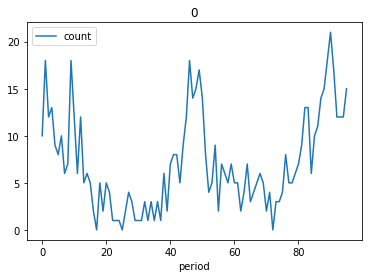

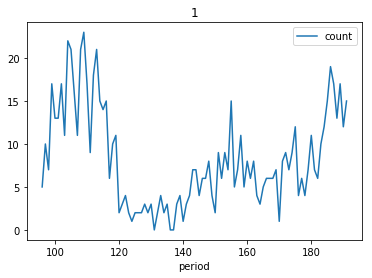

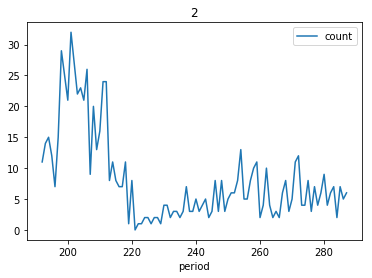

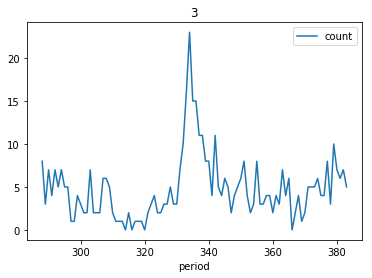

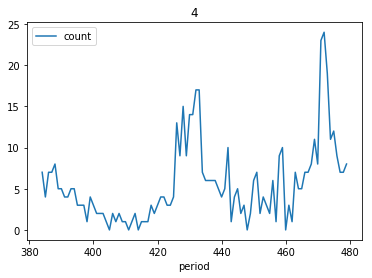

...

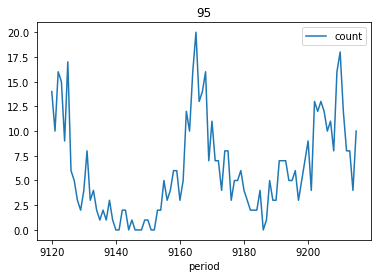

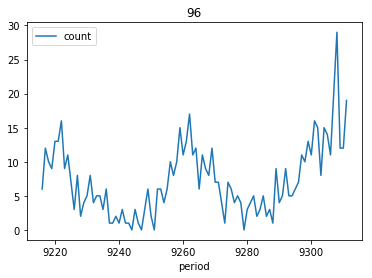

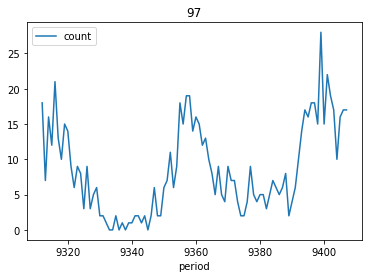

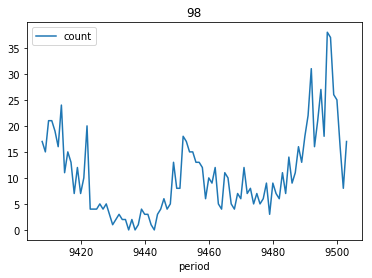

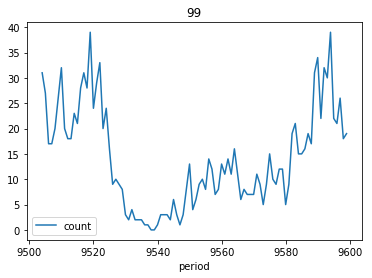

In [76]:
for i in range(len(array1)):
    array1[i].plot(x = 'period', y = 'count')
    plt.title(i)
    plt.show()
#Each chart represents 96 15-minute periods or 1 day starting at midnight and ending 23:45   

In [75]:
#It looks like day 0 (Friday) peaks early, mid-day, and late
#Day 1 (Saturday) peaks early and then drops off the rest of the day before going back up at night
#Day 2 (Sunday) peaks in the early hours (maybe people leaving bars) and then levels off the rest of the day
#Day 3 (Monday) Has a peak in the middle of the day
#Day 4 (Tuesday)spikes in the middle of the day and again closer to midnight
#Day 5 (Wednesday) spikes the most in the middle of the day and at the end of the day
#Day 6 (Thursday) spikes early, mid day and slowly grws at the end of the day
#Day 7 (Friday) spikes early and then stays moderately strong at the end of the day
#Day 8 (Saturday) spikes early and then again later in the day
#Day 9 (Sunday) big early spike and then moderate levels afternoon to evening
#Day 10 (Monday) big spike mid-day
#Day 11 (Tuesday) big spike mid-day
#Day 12 (Wednesday) big spike mid-day
#Day 13 Thursday big spike in mid-day and again late night
#Day 14 (Friday) early mid, late spikes
#Day 15 (Saturday) Early, late spikes
#Day 16 (Sunday) Early spikes
#Day 17 (Monday) Mid day spikes
#Day 18 (Tuesday Mid-day spikes)
#Day 19 (Wednesday) Mid-day spike
#Day 20 (Thursday) Mid-day, late night spikes
#Day 21 (Friday) Early, morning, latenight spike
#Day 22 (Satuday) Early morning spike
#Day 23 (Sunday) Early morning spike
#Day 24 (Monday) mid-day spike
#Day 25 (Tuesday) early, mid-day, and late spikes
#Day 26 (Wednesday) early, mid0day, and late night spikes
#Day 27 (Thursday)early, midday, late night spikes
#Day 28 (Friday) early, mid-day, late night spikes
#Day 29 (Saturday) early morning spikes and slow build as day goes on
#Day 30 (Sunday) early morning peak
#Day 31 (Monday) early morning peak
#Day 32 (Tuesday) mid-day peak
#Day 33 (Wednesday) mid-day peak and late night peak
#Day 34 (Thursday) early, mid, late spikes
#Day 35 (Friday) mid and late night spikes
#Day 36 (Saturday) early morning spikes, late day slow build
#Day 37 (Sunday) early morning spike then level off
#Day 38 (Monday) mid-day spike
#Day 39 (Tuesday) mid-day and late night spike
#Day 40 (Wednesday)mid-day spike
#Day 41 (Thursday) early, mid, and late spike
#Day 42 (Friday) early, mid, late spike
#Day 43 (Saturday) early spike late build
#Day 44 (Sunday) early spike, drop off
#Day 45 (Monday) mid-day surge
#Day 46 (Tuesday) mid-day and late-night surge
#Day 47 (Wednesday) mid-day surge
#Day 48 (Thursday) early, mid-day, late-night spike
#Day 49 (Friday) late night spike
#Day 50 (Saturday) early and late night spike

In [ ]:
#Day 51 (Sunday) early morning spike
#Day 52 (Monday)early, mid and late spike
#Day 53 (Tuesday) early, mid, late spike
#Day 54 (Wednesday) mid-day, late night spike
#Day 55 (Thursday) mid late spike
#Day 56 (Friday) late night spike
#Day 57 (Saturday) early spike, late build
#day 58 (Sunday) early spike
#Day 59 (Monday) mid-day spike
#Day 60 (Tuesday) mid-day, late night spike
#Day 61 (Wednesday) mid-day late-night spike
#Day 62 (Thursday) mid-day and late-night spike
#day 63 (Friday) late night spike
#Day 64 (Saturday) early spike, late build
#Day 65 (Sunday) early spike
#Day 66 (Monday) mid, late spike
#Day 67 (Tuesday) mid-day late night spike
#Day 68 (Wednesday) early, mid, late spike
#Day 69 (Thursday) mid late spike
#Day 70 (Friday) late night spike
#Day 71 (Saturday) early spike late build
#Day 72 (Sunday) early spike
#day 73 (Monday) late spike
#day 74 (Tuesday) early spike
#day 75 (Wednesday) mid and late spike
#Day 76 (Thursday) early, mid and late spike
#Day 77 (Friday) late spike
#Day 78 (Saturday) early spike
#Day 79 (Sunday) early spike
#Day 80 (Monday) mid-day spike
#Day 81 (Tuesday) mid and late spike
#Day 82 (Wednesday) mid and late spike
#Day 83 (Thursday) mid and late spike
#Day 84 (Friday) early and late spike
#Day 85 (Saturday) early spike late build
#Day 86 (Sunday) early spike
#Day 87 (Monday) mid-day spike
#Day 88 (Tuesday) mid and late spike
#Day 89 (Wednesday) late spike
#Day 90 (Thursday) early and mid spike
#Day 91 (Friday) mid and late spike
#Day 92 (Saturday) early spike
#Day 93 (Sunday) early spike
#Day 94 (Monday) mid and late spike
#Day 95 (Tuesday) early mid late spike

In [ ]:
#As can be seen from the breakdown of days above, Demand is very high except during times when there is typically a lot of traffic
#Demand always seems to drop on weekdays during mid morning and afternoon/ evening when people are going to and coming from work
#Thursday, Friday, and Saturday all have rising late night demand.
#Sunday has high demand from midnight until about 3 am and then is pretty dead for the rest of the day.
#The late night demand seems to rise as we get closer to the weekend. This also increases the demand for early the next day


In [228]:
array = np.array_split(dflogn1l, 100)
#We will now divide the data into 24 hour chunks (while still keeping the data in 15 minute increments)

In [29]:
array[0]

,count
login_time,
1970-01-02 00:00:00,10
1970-01-02 00:15:00,18
1970-01-02 00:30:00,12
1970-01-02 00:45:00,13
1970-01-02 01:00:00,9
1970-01-02 01:15:00,8
1970-01-02 01:30:00,10
1970-01-02 01:45:00,6
1970-01-02 02:00:00,7


In [21]:
array[0]

,count
login_time,
1970-01-02 00:00:00,10
1970-01-02 00:15:00,18
1970-01-02 00:30:00,12
1970-01-02 00:45:00,13
1970-01-02 01:00:00,9
1970-01-02 01:15:00,8
1970-01-02 01:30:00,10
1970-01-02 01:45:00,6
1970-01-02 02:00:00,7


In [22]:
array[1]

,count
login_time,
1970-01-03 00:00:00,5
1970-01-03 00:15:00,10
1970-01-03 00:30:00,7
1970-01-03 00:45:00,17
1970-01-03 01:00:00,13
1970-01-03 01:15:00,13
1970-01-03 01:30:00,17
1970-01-03 01:45:00,11
1970-01-03 02:00:00,22


In [ ]:
###Part 2:Experiment and metrics design

In [47]:
#1. The key measure for this experiment will be if the number of drivers who signed up from one city significantly increase 
#their number of pickup and drop off in the other city.
#We are choosing this metric because the data is easily gathered (just need general gps data and address info from the driver)
#It can be easily tracked and analyzed 
#The data can be formattted in 1 dataframe and we can create dummy variables to create columns for each location so we can
# easily model the data
#Finally, the data would be cheap to acquire since we already have it

In [48]:
#2 The best part of this measure is that it doesn't require a lot of costs and the data is already available
#To create the dataframe, we will create a dataframe that has columns indicating the drop off location, the pickup location,
#and the city that the driver lives in according to their registration
#Once this data is assembled, we will filter the data using np.logical_and get_dummies to create a column that shows a driver
# from one city picking up and dropping off a customer in the other city.
#We don't want to create unneccessary noise by adding in non-relevant trips so we will not include across the bridge tips
#We will then compare the mean # of these trips over time and going forward
#We can use confidence intervals to see if there are extra trips coming after the company reimburses drivers.

#We can also use hypothesis testing to see if there is a significant difference(from 0) between the old numbers and numbers
#after the tolls are reimbursed
#In this scenario, our null hypothesis is that there is no difference between the number of cross bridge pickup/dropoffs
#Our alternative hypothesis (which as a company we hope it true) will be there is a significant difference

#After setting up our hypotheses, we will create random permutations to see the probability of the difference of the means
#We will test the p-value and if it is 0.05 or less than we will reject the null hypothesis that the difference of the means
#is not significantly different from 0

#If the number had increased significantly, than the company should implement the toll reimbursement on a larger scale.
#If it has not, then the company can save money on paying tolls and look at other waysto get drivers across the bridge

In [43]:
dfultimate.shape

(38045, 13)

In [48]:
dfultimate['last_trip_date'].head()

0    2014-06-17
1    2014-05-05
2    2014-01-07
3    2014-06-29
4    2014-03-15
Name: last_trip_date, dtype: object

In [57]:
dfultimate['last_trip_date'].str.split('-')

0        [2014, 06, 17]
1        [2014, 05, 05]
2        [2014, 01, 07]
3        [2014, 06, 29]
4        [2014, 03, 15]
5        [2014, 06, 06]
6        [2014, 01, 25]
7        [2014, 01, 29]
8        [2014, 02, 01]
9        [2014, 01, 05]
10       [2014, 05, 30]
11       [2014, 01, 10]
12       [2014, 03, 12]
13       [2014, 06, 08]
14       [2014, 01, 28]
15       [2014, 01, 16]
16       [2014, 06, 28]
17       [2014, 07, 01]
18       [2014, 06, 24]
19       [2014, 06, 03]
20       [2014, 03, 16]
21       [2014, 04, 29]
22       [2014, 05, 02]
23       [2014, 06, 13]
24       [2014, 05, 18]
25       [2014, 01, 03]
26       [2014, 01, 22]
27       [2014, 03, 05]
28       [2014, 06, 08]
29       [2014, 02, 27]
              ...      
38015    [2014, 06, 28]
38016    [2014, 01, 16]
38017    [2014, 03, 19]
38018    [2014, 05, 25]
38019    [2014, 06, 14]
38020    [2014, 01, 26]
38021    [2014, 03, 05]
38022    [2014, 03, 29]
38023    [2014, 06, 23]
38024    [2014, 01, 12]
38025    [2014, 

In [72]:
dfmonth = dfultimate['last_trip_date'].str.split('-').str.get(1)
dfday = dfultimate['last_trip_date'].str.split('-').str.get(2)
dfmonth = pd.to_numeric(dfmonth)
dfday = pd.to_numeric(dfday)
dfultimate['Last_trip_day'] = (dfmonth * 30) + dfday
dfultimate['Last_trip_day']

0        197
1        155
2         37
3        209
4        105
5        186
6         55
7         59
8         61
9         35
10       180
11        40
12       102
13       188
14        58
15        46
16       208
17       211
18       204
19       183
20       106
21       149
22       152
23       193
24       168
25        33
26        52
27        95
28       188
29        87
        ... 
38015    208
38016     46
38017    109
38018    175
38019    194
38020     56
38021     95
38022    119
38023    203
38024     42
38025     35
38026    106
38027     49
38028    203
38029    177
38030     61
38031    206
38032     55
38033    133
38034    169
38035    170
38036     50
38037    207
38038    198
38039    202
38040     82
38041    140
38042     49
38043     56
38044    181
Name: Last_trip_day, Length: 38045, dtype: int64

In [73]:
dfmonth1 = dfultimate['signup_date'].str.split('-').str.get(1)
dfday1 = dfultimate['signup_date'].str.split('-').str.get(2)
dfmonth1 = pd.to_numeric(dfmonth1)
dfday1 = pd.to_numeric(dfday1)
dfultimate['Signup_days'] = (dfmonth1 * 30) + dfday1
dfultimate['Signup_days']

0        55
1        59
2        36
3        40
4        57
5        39
6        54
7        58
8        51
9        33
10       43
11       36
12       45
13       59
14       57
15       45
16       41
17       42
18       58
19       32
20       61
21       39
22       54
23       51
24       49
25       32
26       46
27       49
28       49
29       57
         ..
38015    54
38016    36
38017    56
38018    55
38019    48
38020    53
38021    54
38022    54
38023    38
38024    41
38025    35
38026    48
38027    48
38028    40
38029    42
38030    37
38031    60
38032    31
38033    40
38034    58
38035    51
38036    47
38037    41
38038    58
38039    47
38040    44
38041    32
38042    49
38043    42
38044    46
Name: Signup_days, Length: 38045, dtype: int64

In [79]:
dfultimate['Relationship_length'] = dfultimate['Last_trip_day'] - dfultimate['Signup_days']

In [80]:
dfultimate['Active_month_6'] = np.logical_and(dfultimate['Relationship_length'] >149, dfultimate['Relationship_length']< 181 )

In [81]:
dfultimate.columns.values

array(['Unnamed: 0', 'avg_dist', 'avg_rating_by_driver',
       'avg_rating_of_driver', 'avg_surge', 'city', 'last_trip_date',
       'phone', 'signup_date', 'surge_pct', 'trips_in_first_30_days',
       'ultimate_black_user', 'weekday_pct', 'Last_trip_day',
       'Signup_days', 'Relationship_length', 'Active_month_6'],
      dtype=object)

In [83]:
#It looks like we have all the columns we need for model building now.  We will use Active_month_6 as our target variable

In [87]:
#We will also remove the columns that we won't be using for modeling (the previous index and the two string date objects)
ult = dfultimate[['avg_dist', 'avg_rating_by_driver',
       'avg_rating_of_driver', 'avg_surge', 'city',
       'phone', 'surge_pct', 'trips_in_first_30_days',
       'ultimate_black_user', 'weekday_pct', 'Last_trip_day',
       'Signup_days', 'Relationship_length', 'Active_month_6']]

In [141]:
#Let's also take care of the categorical variables by creating dummy columns
ult = pd.get_dummies(ult)
ult.columns.values

array(['avg_dist', 'avg_rating_by_driver', 'avg_rating_of_driver',
       'avg_surge', 'surge_pct', 'trips_in_first_30_days',
       'ultimate_black_user', 'weekday_pct', 'Last_trip_day',
       'Signup_days', 'Relationship_length', 'Active_month_6',
       'city_Astapor', "city_King's Landing", 'city_Winterfell',
       'phone_0', 'phone_Android', 'phone_iPhone', 'asportaiphone',
       'kings_landing', 'winterfelliphone', 'astaporiphone',
       'asportaandroid', 'winterfellandroid', 'kingsandroid'],
      dtype=object)

In [97]:
ult['kings_landingiphone'] = np.logical_and(ult["city_King's Landing"] ==1, ult['phone_iPhone'] == 1)
ult['winterfelliphone'] = np.logical_and(ult["city_Winterfell"] ==1, ult['phone_iPhone'] == 1)
ult['astaporiphone'] = np.logical_and(ult["city_Astapor"] ==1, ult['phone_iPhone'] == 1)
ult['asportaandroid'] = np.logical_and(ult["city_Astapor"] ==1, ult['phone_Android'] == 1)
ult['winterfellandroid'] = np.logical_and(ult["city_Winterfell"] ==1, ult['phone_Android'] == 1)
ult['kingsandroid'] = np.logical_and(ult["city_King's Landing"] ==1, ult['phone_Android'] == 1)

In [142]:
ult= pd.get_dummies(ult)
ult

,avg_dist,avg_rating_by_driver,avg_rating_of_driver,avg_surge,surge_pct,trips_in_first_30_days,ultimate_black_user,weekday_pct,Last_trip_day,Signup_days,...,phone_0,phone_Android,phone_iPhone,asportaiphone,kings_landing,winterfelliphone,astaporiphone,asportaandroid,winterfellandroid,kingsandroid
0,3.67,5.0,4.7,1.10,15.4,4,1,46.2,197,55,...,0,0,1,0,True,False,False,False,False,False
1,8.26,5.0,5.0,1.00,0.0,0,0,50.0,155,59,...,0,1,0,1,False,False,False,True,False,False
2,0.77,5.0,4.3,1.00,0.0,3,0,100.0,37,36,...,0,0,1,1,False,False,True,False,False,False
3,2.36,4.9,4.6,1.14,20.0,9,1,80.0,209,40,...,0,0,1,0,True,False,False,False,False,False
4,3.13,4.9,4.4,1.19,11.8,14,0,82.4,105,57,...,0,1,0,1,False,False,False,False,True,False
5,10.56,5.0,3.5,1.00,0.0,2,1,100.0,186,39,...,0,0,1,1,False,True,False,False,False,False
6,3.95,4.0,0.0,1.00,0.0,1,0,100.0,55,54,...,0,1,0,1,False,False,False,True,False,False
7,2.04,5.0,5.0,1.00,0.0,2,0,100.0,59,58,...,0,0,1,1,False,True,False,False,False,False
8,4.36,5.0,4.5,1.00,0.0,2,0,100.0,61,51,...,0,1,0,1,False,False,False,False,True,False
9,2.37,5.0,0.0,1.00,0.0,1,0,0.0,35,33,...,0,1,0,1,False,False,False,False,True,False


In [146]:
ult.columns.values

array(['avg_dist', 'avg_rating_by_driver', 'avg_rating_of_driver',
       'avg_surge', 'surge_pct', 'trips_in_first_30_days',
       'ultimate_black_user', 'weekday_pct', 'Last_trip_day',
       'Signup_days', 'Relationship_length', 'Active_month_6',
       'city_Astapor', "city_King's Landing", 'city_Winterfell',
       'phone_0', 'phone_Android', 'phone_iPhone', 'asportaiphone',
       'kings_landing', 'winterfelliphone', 'astaporiphone',
       'asportaandroid', 'winterfellandroid', 'kingsandroid'],
      dtype=object)

In [147]:
ult['ultimate_black_user'] = pd.get_dummies(ult['ultimate_black_user'])
ult['asportaiphone'] = pd.get_dummies(ult['asportaiphone'])
ult['kings_landing'] = pd.get_dummies(ult['kings_landing'])
ult['winterfelliphone'] = pd.get_dummies(ult['winterfelliphone'])
ult['astaporiphone'] = pd.get_dummies(ult['astaporiphone'])
ult['asportaandroid'] = pd.get_dummies(ult['asportaandroid'])
ult['winterfellandroid'] = pd.get_dummies(ult['winterfellandroid'])
ult['kingsandroid'] = pd.get_dummies(ult['kingsandroid'])

In [148]:
ult

,avg_dist,avg_rating_by_driver,avg_rating_of_driver,avg_surge,surge_pct,trips_in_first_30_days,ultimate_black_user,weekday_pct,Last_trip_day,Signup_days,...,phone_0,phone_Android,phone_iPhone,asportaiphone,kings_landing,winterfelliphone,astaporiphone,asportaandroid,winterfellandroid,kingsandroid
0,3.67,5.0,4.7,1.10,15.4,4,1,46.2,197,55,...,0,0,1,1,0,1,1,1,1,1
1,8.26,5.0,5.0,1.00,0.0,0,0,50.0,155,59,...,0,1,0,0,1,1,1,0,1,1
2,0.77,5.0,4.3,1.00,0.0,3,0,100.0,37,36,...,0,0,1,0,1,1,0,1,1,1
3,2.36,4.9,4.6,1.14,20.0,9,1,80.0,209,40,...,0,0,1,1,0,1,1,1,1,1
4,3.13,4.9,4.4,1.19,11.8,14,0,82.4,105,57,...,0,1,0,0,1,1,1,1,0,1
5,10.56,5.0,3.5,1.00,0.0,2,1,100.0,186,39,...,0,0,1,0,1,0,1,1,1,1
6,3.95,4.0,0.0,1.00,0.0,1,0,100.0,55,54,...,0,1,0,0,1,1,1,0,1,1
7,2.04,5.0,5.0,1.00,0.0,2,0,100.0,59,58,...,0,0,1,0,1,0,1,1,1,1
8,4.36,5.0,4.5,1.00,0.0,2,0,100.0,61,51,...,0,1,0,0,1,1,1,1,0,1
9,2.37,5.0,0.0,1.00,0.0,1,0,0.0,35,33,...,0,1,0,0,1,1,1,1,0,1


In [149]:
#First we will do some exploratory analysis
ult.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 38045 entries, 0 to 38044
Data columns (total 25 columns):
avg_dist                  38045 non-null float64
avg_rating_by_driver      38045 non-null float64
avg_rating_of_driver      38045 non-null float64
avg_surge                 38045 non-null float64
surge_pct                 38045 non-null float64
trips_in_first_30_days    38045 non-null int64
ultimate_black_user       38045 non-null uint8
weekday_pct               38045 non-null float64
Last_trip_day             38045 non-null int64
Signup_days               38045 non-null int64
Relationship_length       38045 non-null int64
Active_month_6            38045 non-null bool
city_Astapor              38045 non-null uint8
city_King's Landing       38045 non-null uint8
city_Winterfell           38045 non-null uint8
phone_0                   38045 non-null uint8
phone_Android             38045 non-null uint8
phone_iPhone              38045 non-null uint8
asportaiphone             38045 no

In [150]:
ult.describe()

,avg_dist,avg_rating_by_driver,avg_rating_of_driver,avg_surge,surge_pct,trips_in_first_30_days,ultimate_black_user,weekday_pct,Last_trip_day,Signup_days,...,phone_0,phone_Android,phone_iPhone,asportaiphone,kings_landing,winterfelliphone,astaporiphone,asportaandroid,winterfellandroid,kingsandroid
count,38045.000000,38045.000000,38045.000000,38045.000000,38045.000000,38045.000000,38045.000000,38045.000000,38045.000000,38045.000000,...,38045.000000,38045.000000,38045.000000,38045.000000,38045.000000,38045.000000,38045.000000,38045.000000,38045.000000,38045.000000
mean,5.786957,4.757826,3.850824,1.074878,8.869250,2.289710,0.378920,60.861690,139.102195,46.549192,...,0.007570,0.300276,0.692154,0.150848,0.849152,0.682876,0.775818,0.895387,0.853437,0.950900
std,5.698842,0.539004,1.790234,0.222538,19.918306,3.832728,0.485124,37.076068,61.347939,8.765387,...,0.086677,0.458384,0.461609,0.357905,0.357905,0.465362,0.417048,0.306058,0.353675,0.216079
min,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,31.000000,31.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,2.420000,4.700000,4.000000,1.000000,0.000000,0.000000,0.000000,33.300000,74.000000,39.000000,...,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,1.000000,1.000000,1.000000,1.000000
50%,3.880000,5.000000,4.700000,1.000000,0.000000,1.000000,0.000000,66.700000,158.000000,47.000000,...,0.000000,0.000000,1.000000,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
75%,6.910000,5.000000,5.000000,1.050000,8.700000,3.000000,1.000000,100.000000,198.000000,54.000000,...,0.000000,1.000000,1.000000,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
max,160.960000,5.000000,5.000000,8.000000,100.000000,125.000000,1.000000,100.000000,211.000000,61.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [151]:
##Let's look at some correlations now
ultcorr = ult.corr()
ultcorr['Active_month_6']
#It doesn't look like there are any variables that play a strong role in deciding signups
#It is interesting to note though that there seem to be more retained users in kings landing than astapor
#However, it looks like 80% of signups are coming from winterfell and astapor
#This could indicate a need to focus more advertising in king's landing especially to iphone users
#I_phone users seem to be more likely to sign up as well. 

avg_dist                 -0.095902
avg_rating_by_driver     -0.009092
avg_rating_of_driver      0.132473
avg_surge                 0.005977
surge_pct                 0.015608
trips_in_first_30_days    0.203486
ultimate_black_user       0.155258
weekday_pct               0.006002
Last_trip_day             0.603865
Signup_days              -0.246307
Relationship_length       0.634740
Active_month_6            1.000000
city_Astapor             -0.128992
city_King's Landing       0.182520
city_Winterfell          -0.025029
phone_0                  -0.003100
phone_Android            -0.176437
phone_iPhone              0.175786
asportaiphone             0.198285
kings_landing            -0.198285
winterfelliphone         -0.061125
astaporiphone             0.043803
asportaandroid            0.137253
winterfellandroid         0.114986
kingsandroid             -0.008328
Name: Active_month_6, dtype: float64

In [106]:
yes = ult[ult['Active_month_6'] == 1]
no = ult[ult['Active_month_6'] == 0]
print(yes.shape, no.shape)
#It looks like we have a good balance of yes's and no's so there won't be a categorical imbalance in the data.

(9299, 25) (28746, 25)


In [111]:
#Now that we have explored the data a little bit, let's make a predictive model to determine if a new customer will use the 
#service for at least 6 months
#The first thing we will check for in the data is multi-collinearity
#To create the model, we will use a random forest model.
#It is a yes or no question that we are trying to model so it would involve logistic regression instead of linear regression
#We want to use random forest though because that will allow us to avoid overfitting the model.  
#Since there is a good split of the data, we won't have to worry about the model being a smartypants and just guessing the
#same guess over and over again
from statsmodels.tools.tools import add_constant
from statsmodels.stats.outliers_influence import variance_inflation_factor

In [152]:
ult.columns.values

array(['avg_dist', 'avg_rating_by_driver', 'avg_rating_of_driver',
       'avg_surge', 'surge_pct', 'trips_in_first_30_days',
       'ultimate_black_user', 'weekday_pct', 'Last_trip_day',
       'Signup_days', 'Relationship_length', 'Active_month_6',
       'city_Astapor', "city_King's Landing", 'city_Winterfell',
       'phone_0', 'phone_Android', 'phone_iPhone', 'asportaiphone',
       'kings_landing', 'winterfelliphone', 'astaporiphone',
       'asportaandroid', 'winterfellandroid', 'kingsandroid'],
      dtype=object)

In [126]:
ult.isnull().sum()

avg_dist                  0
avg_rating_by_driver      0
avg_rating_of_driver      0
avg_surge                 0
surge_pct                 0
trips_in_first_30_days    0
ultimate_black_user       0
weekday_pct               0
Last_trip_day             0
Signup_days               0
Relationship_length       0
Active_month_6            0
city_Astapor              0
city_King's Landing       0
city_Winterfell           0
phone_0                   0
phone_Android             0
phone_iPhone              0
asportaiphone             0
kings_landing             0
winterfelliphone          0
astaporiphone             0
asportaandroid            0
winterfellandroid         0
kingsandroid              0
dtype: int64

In [153]:
ultsig = ult[['avg_dist', 'avg_rating_by_driver', 'avg_rating_of_driver',
       'avg_surge', 'surge_pct', 'trips_in_first_30_days',
       'ultimate_black_user', 'weekday_pct', 'Last_trip_day',
       'Signup_days', 'Relationship_length',
       'city_Astapor', "city_King's Landing", 'city_Winterfell',
       'phone_0', 'phone_Android', 'phone_iPhone', 'asportaiphone',
       'kings_landing', 'winterfelliphone', 'astaporiphone',
       'asportaandroid', 'winterfellandroid', 'kingsandroid']]
ultsig

,avg_dist,avg_rating_by_driver,avg_rating_of_driver,avg_surge,surge_pct,trips_in_first_30_days,ultimate_black_user,weekday_pct,Last_trip_day,Signup_days,...,phone_0,phone_Android,phone_iPhone,asportaiphone,kings_landing,winterfelliphone,astaporiphone,asportaandroid,winterfellandroid,kingsandroid
0,3.67,5.0,4.7,1.10,15.4,4,1,46.2,197,55,...,0,0,1,1,0,1,1,1,1,1
1,8.26,5.0,5.0,1.00,0.0,0,0,50.0,155,59,...,0,1,0,0,1,1,1,0,1,1
2,0.77,5.0,4.3,1.00,0.0,3,0,100.0,37,36,...,0,0,1,0,1,1,0,1,1,1
3,2.36,4.9,4.6,1.14,20.0,9,1,80.0,209,40,...,0,0,1,1,0,1,1,1,1,1
4,3.13,4.9,4.4,1.19,11.8,14,0,82.4,105,57,...,0,1,0,0,1,1,1,1,0,1
5,10.56,5.0,3.5,1.00,0.0,2,1,100.0,186,39,...,0,0,1,0,1,0,1,1,1,1
6,3.95,4.0,0.0,1.00,0.0,1,0,100.0,55,54,...,0,1,0,0,1,1,1,0,1,1
7,2.04,5.0,5.0,1.00,0.0,2,0,100.0,59,58,...,0,0,1,0,1,0,1,1,1,1
8,4.36,5.0,4.5,1.00,0.0,2,0,100.0,61,51,...,0,1,0,0,1,1,1,1,0,1
9,2.37,5.0,0.0,1.00,0.0,1,0,0.0,35,33,...,0,1,0,0,1,1,1,1,0,1


In [136]:
import pandas as pd
import numpy as np
import statsmodels.api as sm
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
import statsmodels.formula.api as smf
from statsmodels.formula.api import OLS
from statsmodels.tools.tools import add_constant
from statsmodels.stats.outliers_influence import variance_inflation_factor
from sklearn.model_selection import cross_val_score
from sklearn.metrics import mean_absolute_error
import matplotlib.pyplot as plt
import scipy.stats as stats

In [137]:
ultsig.to_csv('C:\\Users\\tilleymusprime\\Desktop\\ultsig.csv')

In [155]:
X = add_constant(ultsig)
pd.Series([variance_inflation_factor(X.values, i)
          for i in range(X.shape[1])],
         index=X.columns)
#It looks like a lot of our dummy variables are the same thing expressed different ways.
#Let's start by removing asportaiphone

C:\Users\tilleymusprime\Anaconda3\lib\site-packages\statsmodels\regression\linear_model.py:1386: RuntimeWarning: divide by zero encountered in double_scalars
  return 1 - self.ssr/self.centered_tss
C:\Users\tilleymusprime\Anaconda3\lib\site-packages\statsmodels\stats\outliers_influence.py:167: RuntimeWarning: divide by zero encountered in double_scalars
  vif = 1. / (1. - r_squared_i)


const                     0.000000
avg_dist                  1.069137
avg_rating_by_driver      1.016339
avg_rating_of_driver      1.070449
avg_surge                 2.697492
surge_pct                 2.751313
trips_in_first_30_days    1.086779
ultimate_black_user       1.059988
weekday_pct               1.038513
Last_trip_day                  inf
Signup_days                    inf
Relationship_length            inf
city_Astapor                   inf
city_King's Landing            inf
city_Winterfell                inf
phone_0                        inf
phone_Android                  inf
phone_iPhone                   inf
asportaiphone                  inf
kings_landing                  inf
winterfelliphone               inf
astaporiphone                  inf
asportaandroid                 inf
winterfellandroid              inf
kingsandroid                   inf
dtype: float64

In [156]:
ultsig1 = ult[['avg_dist', 'avg_rating_by_driver', 'avg_rating_of_driver',
       'avg_surge', 'surge_pct', 'trips_in_first_30_days',
       'ultimate_black_user', 'weekday_pct', 'Last_trip_day',
       'Signup_days', 'Relationship_length',
       'city_Astapor', "city_King's Landing", 'city_Winterfell',
       'phone_0', 'phone_Android', 'phone_iPhone',
       'kings_landing', 'winterfelliphone', 'astaporiphone',
       'asportaandroid', 'winterfellandroid', 'kingsandroid']]

In [157]:
X = add_constant(ultsig1)
pd.Series([variance_inflation_factor(X.values, i)
          for i in range(X.shape[1])],
         index=X.columns)
#Next, we will remove city_astapor,city_winterfell, and city_kings_landing
#The information from all of these variables is located in the city iphone/android category so we can drop this data
#without losing anything

C:\Users\tilleymusprime\Anaconda3\lib\site-packages\statsmodels\regression\linear_model.py:1386: RuntimeWarning: divide by zero encountered in double_scalars
  return 1 - self.ssr/self.centered_tss
C:\Users\tilleymusprime\Anaconda3\lib\site-packages\statsmodels\stats\outliers_influence.py:167: RuntimeWarning: divide by zero encountered in double_scalars
  vif = 1. / (1. - r_squared_i)


const                     0.000000
avg_dist                  1.069137
avg_rating_by_driver      1.016339
avg_rating_of_driver      1.070449
avg_surge                 2.697492
surge_pct                 2.751313
trips_in_first_30_days    1.086779
ultimate_black_user       1.059988
weekday_pct               1.038513
Last_trip_day                  inf
Signup_days                    inf
Relationship_length            inf
city_Astapor                   inf
city_King's Landing            inf
city_Winterfell                inf
phone_0                        inf
phone_Android                  inf
phone_iPhone                   inf
kings_landing                  inf
winterfelliphone               inf
astaporiphone                  inf
asportaandroid                 inf
winterfellandroid              inf
kingsandroid                   inf
dtype: float64

In [158]:
ultsig2 = ult[['avg_dist', 'avg_rating_by_driver', 'avg_rating_of_driver',
       'avg_surge', 'surge_pct', 'trips_in_first_30_days',
       'ultimate_black_user', 'weekday_pct', 'Last_trip_day',
       'Signup_days', 'Relationship_length',
       'phone_0', 'phone_Android', 'phone_iPhone',
       'kings_landing', 'winterfelliphone', 'astaporiphone',
       'asportaandroid', 'winterfellandroid', 'kingsandroid']]

In [159]:
X = add_constant(ultsig2)
pd.Series([variance_inflation_factor(X.values, i)
          for i in range(X.shape[1])],
         index=X.columns)
#Next, we will remove phone_Android and phone_iPhone.
#This data is also available in other more detailed variables so we can drop it without information loss

C:\Users\tilleymusprime\Anaconda3\lib\site-packages\statsmodels\regression\linear_model.py:1386: RuntimeWarning: divide by zero encountered in double_scalars
  return 1 - self.ssr/self.centered_tss
C:\Users\tilleymusprime\Anaconda3\lib\site-packages\statsmodels\stats\outliers_influence.py:167: RuntimeWarning: divide by zero encountered in double_scalars
  vif = 1. / (1. - r_squared_i)


const                     0.000000
avg_dist                  1.068471
avg_rating_by_driver      1.016331
avg_rating_of_driver      1.070387
avg_surge                 2.697356
surge_pct                 2.751105
trips_in_first_30_days    1.086718
ultimate_black_user       1.059933
weekday_pct               1.038495
Last_trip_day                  inf
Signup_days                    inf
Relationship_length            inf
phone_0                        inf
phone_Android                  inf
phone_iPhone                   inf
kings_landing                  inf
winterfelliphone               inf
astaporiphone                  inf
asportaandroid                 inf
winterfellandroid              inf
kingsandroid                   inf
dtype: float64

In [161]:
ultsig3 = ult[['avg_dist', 'avg_rating_by_driver', 'avg_rating_of_driver',
       'avg_surge', 'surge_pct', 'trips_in_first_30_days',
       'ultimate_black_user', 'weekday_pct', 'Last_trip_day',
       'Signup_days', 'Relationship_length',
       'phone_0',
       'kings_landing', 'winterfelliphone', 'astaporiphone',
       'asportaandroid', 'winterfellandroid', 'kingsandroid']]

In [162]:
X = add_constant(ultsig3)
pd.Series([variance_inflation_factor(X.values, i)
          for i in range(X.shape[1])],
         index=X.columns)
#Next, we will drop phone_0 because it occurs so rarely and the data is accounted for by combining the other two categories

C:\Users\tilleymusprime\Anaconda3\lib\site-packages\statsmodels\regression\linear_model.py:1386: RuntimeWarning: divide by zero encountered in double_scalars
  return 1 - self.ssr/self.centered_tss
C:\Users\tilleymusprime\Anaconda3\lib\site-packages\statsmodels\stats\outliers_influence.py:167: RuntimeWarning: divide by zero encountered in double_scalars
  vif = 1. / (1. - r_squared_i)


const                     0.000000
avg_dist                  1.068471
avg_rating_by_driver      1.016331
avg_rating_of_driver      1.070387
avg_surge                 2.697356
surge_pct                 2.751105
trips_in_first_30_days    1.086718
ultimate_black_user       1.059933
weekday_pct               1.038495
Last_trip_day                  inf
Signup_days                    inf
Relationship_length            inf
phone_0                        inf
kings_landing                  inf
winterfelliphone               inf
astaporiphone                  inf
asportaandroid                 inf
winterfellandroid              inf
kingsandroid                   inf
dtype: float64

In [163]:
ultsig4 = ult[['avg_dist', 'avg_rating_by_driver', 'avg_rating_of_driver',
       'avg_surge', 'surge_pct', 'trips_in_first_30_days',
       'ultimate_black_user', 'weekday_pct', 'Last_trip_day',
       'Signup_days', 'Relationship_length',
       'kings_landing', 'winterfelliphone', 'astaporiphone',
       'asportaandroid', 'winterfellandroid', 'kingsandroid']]

In [164]:
X = add_constant(ultsig4)
pd.Series([variance_inflation_factor(X.values, i)
          for i in range(X.shape[1])],
         index=X.columns)
#Next, we will need to decide between relationship length and signupdays/last_trip_day because they both contain the same 
#information.  To isolate them, we will remove winterfell iphone

C:\Users\tilleymusprime\Anaconda3\lib\site-packages\statsmodels\stats\outliers_influence.py:167: RuntimeWarning: divide by zero encountered in double_scalars
  vif = 1. / (1. - r_squared_i)


const                     3543.168924
avg_dist                     1.068471
avg_rating_by_driver         1.016331
avg_rating_of_driver         1.070387
avg_surge                    2.697356
surge_pct                    2.751105
trips_in_first_30_days       1.086718
ultimate_black_user          1.059933
weekday_pct                  1.038495
Last_trip_day                     inf
Signup_days                       inf
Relationship_length               inf
kings_landing               17.901900
winterfelliphone            29.409724
astaporiphone               23.832047
asportaandroid              13.318060
winterfellandroid           17.445073
kingsandroid                 7.147006
dtype: float64

In [174]:
ultsig5 = ult[['avg_dist', 'avg_rating_by_driver', 'avg_rating_of_driver',
       'avg_surge', 'surge_pct', 'trips_in_first_30_days',
       'ultimate_black_user', 'weekday_pct', 'Last_trip_day',
       'Signup_days', 'Relationship_length',
       'kings_landing', 'astaporiphone',
       'asportaandroid', 'winterfellandroid', 'kingsandroid']]

In [175]:
X = add_constant(ultsig5)
pd.Series([variance_inflation_factor(X.values, i)
          for i in range(X.shape[1])],
         index=X.columns)
#It looks like that took care of all the variables except for the 3 remaining inf.
#We will test both combinations and see which one results in a better model

C:\Users\tilleymusprime\Anaconda3\lib\site-packages\statsmodels\stats\outliers_influence.py:167: RuntimeWarning: divide by zero encountered in double_scalars
  vif = 1. / (1. - r_squared_i)


const                     285.580145
avg_dist                    1.068189
avg_rating_by_driver        1.016194
avg_rating_of_driver        1.070310
avg_surge                   2.697336
surge_pct                   2.751080
trips_in_first_30_days      1.086715
ultimate_black_user         1.057530
weekday_pct                 1.038346
Last_trip_day                    inf
Signup_days                      inf
Relationship_length              inf
kings_landing               1.286766
astaporiphone               1.331512
asportaandroid              1.211972
winterfellandroid           1.261105
kingsandroid                1.101963
dtype: float64

In [173]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn import metrics

In [166]:
y = ult['Active_month_6']

In [168]:
X_train, X_test, y_train, y_test = train_test_split(ultsig4, y, test_size=0.3)

In [170]:
clf=RandomForestClassifier(n_estimators=100)

#Train the model using the training sets y_pred=clf.predict(X_test)
clf.fit(X_train,y_train)

y_pred=clf.predict(X_test)
print("Accuracy:",metrics.accuracy_score(y_test, y_pred))
#Perfect model but this is due to overfitting


Accuracy: 1.0


In [183]:
ultsig6a = ult[['avg_dist', 'avg_rating_by_driver', 'avg_rating_of_driver',
       'avg_surge', 'surge_pct', 'trips_in_first_30_days',
       'ultimate_black_user', 'weekday_pct', 'Last_trip_day',
       'Signup_days', 
       'kings_landing', 'astaporiphone',
       'asportaandroid', 'winterfellandroid', 'kingsandroid']]
#This has relationship length removed
X_train, X_test, y_train, y_test = train_test_split(ultsig6a, y, test_size=0.3)
clf=RandomForestClassifier(n_estimators=100)

#Train the model using the training sets y_pred=clf.predict(X_test)
clf.fit(X_train,y_train)

y_pred=clf.predict(X_test)
print("Accuracy:",metrics.accuracy_score(y_test, y_pred))
#A little less overfitting

Accuracy: 0.9941300157701068


Confusion matrix:
 [[8575   22]
 [  45 2772]]


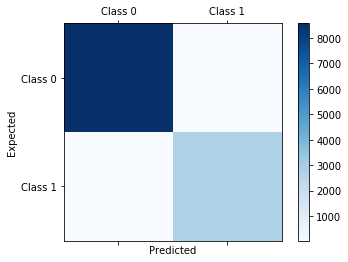

In [184]:
from sklearn.metrics import confusion_matrix
from matplotlib import pyplot as plt

conf_mat = confusion_matrix(y_true=y_test, y_pred=y_pred)
print('Confusion matrix:\n', conf_mat)

labels = ['Class 0', 'Class 1']
fig = plt.figure()
ax = fig.add_subplot(111)
cax = ax.matshow(conf_mat, cmap=plt.cm.Blues)
fig.colorbar(cax)
ax.set_xticklabels([''] + labels)
ax.set_yticklabels([''] + labels)
plt.xlabel('Predicted')
plt.ylabel('Expected')
plt.show()

In [186]:
ultsig6b = ult[['avg_dist', 'avg_rating_by_driver', 'avg_rating_of_driver',
       'avg_surge', 'surge_pct', 'trips_in_first_30_days',
       'ultimate_black_user', 'weekday_pct', 'Last_trip_day',
       'Signup_days', 'Relationship_length',
       'kings_landing', 'astaporiphone',
       'asportaandroid', 'winterfellandroid', 'kingsandroid']]
X_train, X_test, y_train, y_test = train_test_split(ultsig6b, y, test_size=0.3)
clf=RandomForestClassifier(n_estimators=100)

#Train the model using the training sets y_pred=clf.predict(X_test)
clf.fit(X_train,y_train)

y_pred=clf.predict(X_test)
print("Accuracy:",metrics.accuracy_score(y_test, y_pred))
#A little more overfitting

Accuracy: 1.0


Confusion matrix:
 [[8548    0]
 [   0 2866]]


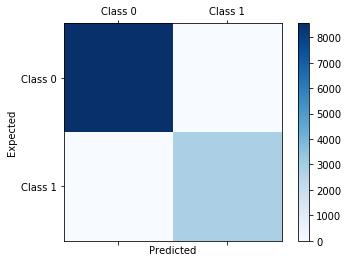

In [187]:
conf_mat = confusion_matrix(y_true=y_test, y_pred=y_pred)
print('Confusion matrix:\n', conf_mat)

labels = ['Class 0', 'Class 1']
fig = plt.figure()
ax = fig.add_subplot(111)
cax = ax.matshow(conf_mat, cmap=plt.cm.Blues)
fig.colorbar(cax)
ax.set_xticklabels([''] + labels)
ax.set_yticklabels([''] + labels)
plt.xlabel('Predicted')
plt.ylabel('Expected')
plt.show()

In [ ]:
#Based on the above testing, it looks like relationship length will be the better variable to remove.
#Relationship length is probably too highly correlated to be a good indpendent variable so we will remove it


In [188]:
ultsig6a = ult[['avg_dist', 'avg_rating_by_driver', 'avg_rating_of_driver',
       'avg_surge', 'surge_pct', 'trips_in_first_30_days',
       'ultimate_black_user', 'weekday_pct', 'Last_trip_day',
       'Signup_days', 
       'kings_landing', 'astaporiphone',
       'asportaandroid', 'winterfellandroid', 'kingsandroid']]

In [189]:
X = add_constant(ultsig6a)
pd.Series([variance_inflation_factor(X.values, i)
          for i in range(X.shape[1])],
         index=X.columns)

const                     285.580145
avg_dist                    1.068189
avg_rating_by_driver        1.016194
avg_rating_of_driver        1.070310
avg_surge                   2.697336
surge_pct                   2.751080
trips_in_first_30_days      1.086715
ultimate_black_user         1.057530
weekday_pct                 1.038346
Last_trip_day               1.153647
Signup_days                 1.003941
kings_landing               1.286766
astaporiphone               1.331512
asportaandroid              1.211972
winterfellandroid           1.261105
kingsandroid                1.101963
dtype: float64

In [198]:
X_train, X_test, y_train, y_test = train_test_split(ultsig6a, y, test_size=0.3)
clf=RandomForestClassifier(n_estimators=100)

#Train the model using the training sets y_pred=clf.predict(X_test)
clf.fit(X_train,y_train)

y_pred=clf.predict(X_test)
print("Accuracy:",metrics.accuracy_score(y_test, y_pred))

Accuracy: 0.9938671806553355


In [201]:
feature_imp = pd.Series(clf.feature_importances_, index= ultsig6a.columns.values).sort_values(ascending=False)
feature_imp.sort_values(ascending=False)
#It looks like there is a heavy reliance on last day and signup days.
#The rest of the data doesn't look nearly as important information wise

Last_trip_day             0.636122
Signup_days               0.151055
avg_rating_by_driver      0.034646
surge_pct                 0.033089
avg_surge                 0.030764
weekday_pct               0.026189
avg_dist                  0.025964
trips_in_first_30_days    0.016592
avg_rating_of_driver      0.014337
kings_landing             0.011831
ultimate_black_user       0.007235
asportaandroid            0.005460
winterfellandroid         0.002574
astaporiphone             0.002453
kingsandroid              0.001689
dtype: float64

In [192]:
#Let's do some cv testing next
from sklearn.model_selection import cross_val_score

cv5 = cross_val_score(clf, ultsig6a, y, cv=5)
cvmean = np.mean(cv5)
print(cv5, cvmean)
#The model worked very well in cross validation as well.
#Let's see what happens when there is even less of a class imbalance though

[0.99382392 0.9943488  0.99356026 0.99250887 0.99395373] 0.9936391149905905


In [195]:
count_class_0, count_class_1 = ult.Active_month_6.value_counts()
df_class_0 = ult[ult['Active_month_6'] == 0]
df_class_1 = ult[ult['Active_month_6'] == 1]
print(df_class_0.shape, df_class_1.shape)

(28746, 25) (9299, 25)


In [202]:
df_class_0_under = df_class_0.sample(count_class_1)
df_test_under = pd.concat([df_class_0_under, df_class_1], axis=0)

print('Random under-sampling:')
print(df_test_under.Active_month_6.value_counts())

Random under-sampling:
True     9299
False    9299
Name: Active_month_6, dtype: int64


In [203]:
df_test_under.columns

Index(['avg_dist', 'avg_rating_by_driver', 'avg_rating_of_driver', 'avg_surge',
       'surge_pct', 'trips_in_first_30_days', 'ultimate_black_user',
       'weekday_pct', 'Last_trip_day', 'Signup_days', 'Relationship_length',
       'Active_month_6', 'city_Astapor', 'city_King's Landing',
       'city_Winterfell', 'phone_0', 'phone_Android', 'phone_iPhone',
       'asportaiphone', 'kings_landing', 'winterfelliphone', 'astaporiphone',
       'asportaandroid', 'winterfellandroid', 'kingsandroid'],
      dtype='object')

In [206]:
undersig = df_test_under[['avg_dist', 'avg_rating_by_driver', 'avg_rating_of_driver',
       'avg_surge', 'surge_pct', 'trips_in_first_30_days',
       'ultimate_black_user', 'weekday_pct', 'Last_trip_day',
       'Signup_days', 
       'kings_landing', 'astaporiphone',
       'asportaandroid', 'winterfellandroid', 'kingsandroid']]
y = df_test_under['Active_month_6']

In [207]:
X_train, X_test, y_train, y_test = train_test_split(undersig, y, test_size=0.3)
clf=RandomForestClassifier(n_estimators=100)

#Train the model using the training sets y_pred=clf.predict(X_test)
clf.fit(X_train,y_train)

y_pred=clf.predict(X_test)
print("Accuracy:",metrics.accuracy_score(y_test, y_pred))

Accuracy: 0.986021505376344


Confusion matrix:
 [[2750   74]
 [   4 2752]]


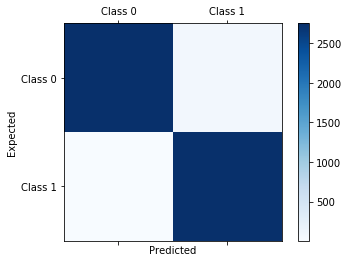

In [209]:
from sklearn.metrics import confusion_matrix
from matplotlib import pyplot as plt

conf_mat = confusion_matrix(y_true=y_test, y_pred=y_pred)
print('Confusion matrix:\n', conf_mat)

labels = ['Class 0', 'Class 1']
fig = plt.figure()
ax = fig.add_subplot(111)
cax = ax.matshow(conf_mat, cmap=plt.cm.Blues)
fig.colorbar(cax)
ax.set_xticklabels([''] + labels)
ax.set_yticklabels([''] + labels)
plt.xlabel('Predicted')
plt.ylabel('Expected')
plt.show()

In [211]:
cv5 = cross_val_score(clf, undersig, y, cv=5)
cvmean = np.mean(cv5)
print(cv5, cvmean)

[0.98817204 0.98897849 0.99032258 0.9844086  0.98655191] 0.987686726011788


In [214]:
feature_imp = pd.Series(clf.feature_importances_, index= undersig.columns.values).sort_values(ascending=False)
feature_imp.sort_values(ascending=False)

Last_trip_day             0.663344
Signup_days               0.114592
avg_rating_by_driver      0.047108
weekday_pct               0.029892
surge_pct                 0.026268
avg_surge                 0.026258
avg_dist                  0.023325
trips_in_first_30_days    0.018779
avg_rating_of_driver      0.014288
kings_landing             0.013308
ultimate_black_user       0.007826
asportaandroid            0.006866
winterfellandroid         0.003522
astaporiphone             0.002770
kingsandroid              0.001853
dtype: float64

In [ ]:
#We have made several models that appear to be very accurate.  However, the biggest issue with them is they seem to be predicting
#based on the number of days since taking the last trip.  

In [ ]:
#After looking at all of this data, it looks like the most important variable was the last day the customer took a trip.
#As that number gets lower (further in the past), it becomes less and less likely that customers will become a retained user
#For the most part, the other factors were not considered very important except for the rating by driver.
#The low score though indicates that unless the ride is pretty terrible, it won't affect future use

#The key take away though is that Ultimate needs to keep its new users using the products.  The more recently they have used it
#the more likely they are to keep using it so they should focus some marketing efforts on getting people more used to using the 
#service when they first start out.

In [11]:
df = pd.read_json('C:\\Users\\tilleymusprime\\Desktop\\1481053515_ultimate_challenge (3)//ultimate_challenge//ultimate_data_challenge.json.json')

ValueError: Expected object or value

In [134]:
dfuc = pd.read_json('C:\\Users\\tilleymusprime\\Desktop\\ultimate_data_challenge1.json')

ValueError: Expected object or value

In [3]:
NaN = 0

In [7]:
null = 0

In [47]:
df1 = [{"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.7, "avg_surge": 1.1, "last_trip_date": "2014-06-17", "phone": "iPhone", "surge_pct": 15.4, "ultimate_black_user": True, "weekday_pct": 46.2, "avg_dist": 3.67, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 8.26, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-01-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.77, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 9, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.6, "avg_surge": 1.14, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 80.0, "avg_dist": 2.36, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 14, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.4, "avg_surge": 1.19, "last_trip_date": "2014-03-15", "phone": "Android", "surge_pct": 11.8, "ultimate_black_user": False, "weekday_pct": 82.4, "avg_dist": 3.13, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-09", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-06-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 10.56, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.95, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.04, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.36, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.37, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.28, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.81, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 20.29, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.0, "avg_surge": 1.38, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.04, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 26.01, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 13.2, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 10.86, "avg_rating_by_driver": 3.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 3.9, "avg_surge": 1.0, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 95.2, "avg_dist": 2.38, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 6, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.6, "avg_surge": 1.21, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 30.8, "ultimate_black_user": True, "weekday_pct": 80.8, "avg_dist": 6.83, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.17, "last_trip_date": "2014-06-03", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 12.08, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.53, "avg_rating_by_driver": 3.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.31, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 11.47, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 7.74, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.5, "avg_surge": 1.02, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 9.1, "ultimate_black_user": False, "weekday_pct": 36.4, "avg_dist": 2.1, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 14.48, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.66, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.05, "last_trip_date": "2014-03-05", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.05, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.5, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.97, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 11.25, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 6.12, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 11.86, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.0, "avg_surge": 2.0, "last_trip_date": "2014-06-10", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.01, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.48, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": NaN, "avg_surge": 1.25, "last_trip_date": "2014-01-17", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.12, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.16, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-21", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.43, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.38, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 24, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.9, "avg_surge": 1.04, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 5.8, "ultimate_black_user": True, "weekday_pct": 61.6, "avg_dist": 4.69, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 13.73, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 0.83, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.0, "avg_surge": 1.88, "last_trip_date": "2014-05-10", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.8, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.0, "avg_surge": 1.5, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.72, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-03-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 16.52, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 1.4, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.0, "avg_rating_by_driver": 4.2}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.33, "last_trip_date": "2014-01-22", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.93, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.61, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-01-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.75, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 71.4, "avg_dist": 10.54, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-02-15", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.25, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-05-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 52.4, "avg_dist": 3.24, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 4.98, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.4, "avg_surge": 1.56, "last_trip_date": "2014-05-16", "phone": "iPhone", "surge_pct": 22.2, "ultimate_black_user": True, "weekday_pct": 22.2, "avg_dist": 3.15, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 3.5, "avg_surge": 1.5, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.94, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 36.01, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 2.5, "avg_surge": 1.0, "last_trip_date": "2014-04-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 23.49, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-03-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 10.21, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 2.6, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-03-29", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.05, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.01, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.66, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.5, "avg_surge": 1.06, "last_trip_date": "2014-05-09", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 4.81, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.8, "avg_surge": 1.03, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 5.4, "ultimate_black_user": False, "weekday_pct": 54.1, "avg_dist": 2.21, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.17, "last_trip_date": "2014-05-04", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 6.12, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 10.37, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.42, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.89, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 4.44, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-18", "avg_rating_of_driver": 3.9, "avg_surge": 1.09, "last_trip_date": "2014-06-17", "phone": "iPhone", "surge_pct": 10.5, "ultimate_black_user": True, "weekday_pct": 63.2, "avg_dist": 2.61, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.46, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.02, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.0, "avg_rating_by_driver": 3.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 37.11, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 7, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.35, "last_trip_date": "2014-06-10", "phone": "iPhone", "surge_pct": 36.0, "ultimate_black_user": False, "weekday_pct": 84.0, "avg_dist": 2.3, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.45, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.47, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 19.8, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.82, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 10.49, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.0, "avg_surge": 1.5, "last_trip_date": "2014-05-03", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.99, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.0, "avg_surge": 3.5, "last_trip_date": "2014-02-05", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 17.89, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.0, "avg_surge": 1.11, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 18.2, "ultimate_black_user": True, "weekday_pct": 81.8, "avg_dist": 4.61, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 7, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.8, "avg_surge": 1.03, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 5.3, "ultimate_black_user": False, "weekday_pct": 63.2, "avg_dist": 2.6, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.01, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.42, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 9, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.7, "avg_surge": 1.17, "last_trip_date": "2014-05-25", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 3.55, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 67.6, "avg_dist": 3.06, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 42.9, "avg_dist": 3.3, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 4.67, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.28, "avg_rating_by_driver": NaN}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 10.83, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-02", "avg_rating_of_driver": 3.7, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 55.2, "avg_dist": 1.55, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 1.13, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 1.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 23.34, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.35, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 11, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.1, "avg_surge": 1.0, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 1.9, "ultimate_black_user": True, "weekday_pct": 76.9, "avg_dist": 4.89, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 5.36, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.3, "avg_surge": 1.02, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 10.0, "ultimate_black_user": False, "weekday_pct": 90.0, "avg_dist": 4.2, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 73, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-03-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 89.7, "avg_dist": 2.86, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.3, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.17, "last_trip_date": "2014-05-25", "phone": "Android", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 6.08, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 8, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.2, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 2.15, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 6.86, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-01", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 63.6, "avg_dist": 4.08, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.99, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.63, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 14, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.9, "avg_surge": 1.09, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 15.9, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 10.79, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-01-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.14, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 3.07, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 5.25, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.81, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 36.4, "avg_dist": 2.65, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 10.29, "avg_rating_by_driver": 3.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.4, "avg_surge": 1.05, "last_trip_date": "2014-06-28", "phone": "Android", "surge_pct": 9.1, "ultimate_black_user": False, "weekday_pct": 63.6, "avg_dist": 12.32, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.16, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.0, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 2.5, "avg_surge": 1.63, "last_trip_date": "2014-04-17", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.64, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 85.7, "avg_dist": 16.85, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 2.5, "last_trip_date": "2014-01-12", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.14, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.3, "avg_surge": 1.06, "last_trip_date": "2014-05-23", "phone": "Android", "surge_pct": 11.1, "ultimate_black_user": True, "weekday_pct": 88.9, "avg_dist": 2.67, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 41.2, "avg_dist": 5.55, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.58, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-03", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 1.78, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 6.1, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.4, "avg_surge": 1.32, "last_trip_date": "2014-03-16", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 90.0, "avg_dist": 8.14, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.04, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.0, "avg_surge": 1.38, "last_trip_date": "2014-06-28", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.92, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.8, "avg_surge": 1.3, "last_trip_date": "2014-04-20", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 20.0, "avg_dist": 2.81, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.0, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-05-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 7.4, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.2, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.64, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 3.8, "avg_surge": 1.06, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 37.5, "avg_dist": 3.33, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-11", "phone": null, "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.88, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.75, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.99, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 43.8, "avg_dist": 3.22, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.78, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 8.2, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 45.5, "avg_dist": 10.47, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 16.7, "avg_dist": 2.27, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-01", "avg_rating_of_driver": 3.8, "avg_surge": 1.06, "last_trip_date": "2014-05-25", "phone": "Android", "surge_pct": 8.3, "ultimate_black_user": False, "weekday_pct": 41.7, "avg_dist": 1.68, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.5, "avg_surge": 1.1, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 10.0, "ultimate_black_user": True, "weekday_pct": 10.0, "avg_dist": 3.57, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 11.63, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 0.95, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 11, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.03, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 2.3, "ultimate_black_user": True, "weekday_pct": 57.5, "avg_dist": 4.86, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.97, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-25", "avg_rating_of_driver": 3.7, "avg_surge": 1.09, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 3.8, "ultimate_black_user": False, "weekday_pct": 57.7, "avg_dist": 5.44, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.64, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.8, "avg_surge": 1.21, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 21.4, "ultimate_black_user": True, "weekday_pct": 28.6, "avg_dist": 3.42, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 10, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.5, "avg_surge": 1.14, "last_trip_date": "2014-06-16", "phone": "iPhone", "surge_pct": 22.9, "ultimate_black_user": False, "weekday_pct": 62.9, "avg_dist": 1.64, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.17, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 4.43, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 4.01, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 2.1, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 7.63, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-02-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.89, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.18, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 20.0, "avg_dist": 3.72, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.8, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 18.03, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 30.0, "avg_dist": 2.92, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 42.9, "avg_dist": 2.03, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 12.6, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 42.9, "avg_dist": 2.86, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 18.57, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.63, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.5, "avg_rating_by_driver": 3.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.36, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.73, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.37, "avg_rating_by_driver": 3.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 1.0, "avg_surge": 1.0, "last_trip_date": "2014-03-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.11, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.45, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.2, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.88, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 2.0, "avg_surge": 1.0, "last_trip_date": "2014-01-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.77, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-04-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.75, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.0, "avg_surge": 1.25, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.56, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-18", "phone": null, "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 20.32, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 14.37, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.46, "avg_rating_by_driver": 2.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 12.52, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-02", "avg_rating_of_driver": 3.9, "avg_surge": 1.02, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 3.5, "ultimate_black_user": False, "weekday_pct": 69.0, "avg_dist": 4.2, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-03-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.74, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 18.15, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 7.54, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 10.16, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 26.9, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.05, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 20.0, "avg_dist": 3.15, "avg_rating_by_driver": 3.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.54, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.0, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 8.91, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.0, "avg_surge": 1.25, "last_trip_date": "2014-05-17", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 10.37, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.34, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 20.0, "avg_dist": 4.42, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.99, "avg_rating_by_driver": 3.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.04, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": True, "weekday_pct": 42.9, "avg_dist": 1.78, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.27, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 62.5, "avg_dist": 8.0, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 3.7, "avg_surge": 2.25, "last_trip_date": "2014-03-02", "phone": "iPhone", "surge_pct": 66.7, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 3.75, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 2.0, "last_trip_date": "2014-03-03", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.38, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.58, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 22, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.6, "avg_surge": 1.02, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 2.7, "ultimate_black_user": True, "weekday_pct": 83.8, "avg_dist": 2.34, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 27.32, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-05-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 57.1, "avg_dist": 2.5, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.5, "avg_surge": 1.2, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 26.1, "ultimate_black_user": True, "weekday_pct": 52.2, "avg_dist": 6.87, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 5.28, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.09, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.69, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.52, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 14.93, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 11.78, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 16.88, "avg_rating_by_driver": 3.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.34, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.89, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.07, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 7, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.3, "avg_surge": 1.04, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 7.1, "ultimate_black_user": False, "weekday_pct": 57.1, "avg_dist": 3.81, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 19.77, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.5, "avg_surge": 1.5, "last_trip_date": "2014-06-27", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.7, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 72.2, "avg_dist": 2.66, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.75, "last_trip_date": "2014-02-16", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.6, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 12.21, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.9, "avg_surge": 1.04, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 7.7, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.34, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.3, "avg_surge": 1.13, "last_trip_date": "2014-05-18", "phone": "Android", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 10.61, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 7.89, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-29", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.31, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 1.69, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 39.1, "avg_dist": 5.04, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.8, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 17.87, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 24.43, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.04, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 4.9, "ultimate_black_user": False, "weekday_pct": 46.3, "avg_dist": 2.69, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 1.0, "avg_surge": 1.0, "last_trip_date": "2014-01-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 18.61, "avg_rating_by_driver": 2.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 9.31, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 45.5, "avg_dist": 7.17, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 12.96, "avg_rating_by_driver": 5.0}]
df1 = pd.DataFrame(df1)

In [48]:
df2 = [{"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.68, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 42.9, "avg_dist": 1.62, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-04-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.6, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 6, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.09, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 18.2, "ultimate_black_user": False, "weekday_pct": 45.5, "avg_dist": 1.53, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.72, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 16.19, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.28, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-20", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 12.45, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 87.5, "avg_dist": 6.46, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 5.05, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.5, "avg_surge": 1.08, "last_trip_date": "2014-05-16", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 83.3, "avg_dist": 13.83, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.42, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.38, "last_trip_date": "2014-05-04", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.04, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 17.04, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 19.07, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.13, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": NaN, "avg_surge": 1.13, "last_trip_date": "2014-03-28", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 2.82, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.09, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.15, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.34, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 20.03, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.38, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 10.73, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 17.63, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 6.2, "avg_rating_by_driver": 3.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 2.7, "avg_surge": 1.0, "last_trip_date": "2014-05-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 45.5, "avg_dist": 4.56, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.2, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 45.5, "avg_dist": 2.99, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 87.5, "avg_dist": 3.56, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.59, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.68, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-02-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 9.15, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-04-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 44.4, "avg_dist": 5.76, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 55.6, "avg_dist": 3.19, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 0.7, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-05-11", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 7.69, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 37.5, "avg_dist": 1.86, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.82, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.09, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.84, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.32, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.37, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.17, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 2.0, "avg_surge": 4.0, "last_trip_date": "2014-02-09", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.0, "avg_rating_by_driver": NaN}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.6, "avg_surge": 1.1, "last_trip_date": "2014-05-24", "phone": "Android", "surge_pct": 15.4, "ultimate_black_user": True, "weekday_pct": 69.2, "avg_dist": 4.14, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.23, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.82, "avg_rating_by_driver": NaN}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.29, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 13.12, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.5, "avg_surge": 1.21, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 42.9, "ultimate_black_user": True, "weekday_pct": 14.3, "avg_dist": 2.51, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 0.63, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-18", "avg_rating_of_driver": 3.8, "avg_surge": 1.19, "last_trip_date": "2014-05-10", "phone": "iPhone", "surge_pct": 17.6, "ultimate_black_user": False, "weekday_pct": 76.5, "avg_dist": 1.83, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.8, "avg_surge": 1.08, "last_trip_date": "2014-02-10", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 1.88, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.0, "avg_surge": 1.13, "last_trip_date": "2014-01-13", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 3.34, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.9, "avg_surge": 1.12, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 14.8, "ultimate_black_user": True, "weekday_pct": 44.4, "avg_dist": 7.81, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.57, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.34, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 7, "signup_date": "2014-01-30", "avg_rating_of_driver": 3.7, "avg_surge": 1.0, "last_trip_date": "2014-06-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 78.6, "avg_dist": 3.3, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.71, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.9, "avg_surge": 1.22, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 27.3, "ultimate_black_user": False, "weekday_pct": 63.6, "avg_dist": 2.41, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.08, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.2, "avg_surge": 1.29, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 71.4, "avg_dist": 2.43, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 0.59, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 14.51, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 5.21, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 2.96, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.93, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-01-01", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.43, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 9, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 88.3, "avg_dist": 1.85, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 9, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.23, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 20.9, "ultimate_black_user": True, "weekday_pct": 56.7, "avg_dist": 3.03, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 4.65, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-02-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.82, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 2.05, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 2.0, "last_trip_date": "2014-03-19", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 19.81, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 8, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.0, "avg_surge": 1.01, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 1.7, "ultimate_black_user": True, "weekday_pct": 70.9, "avg_dist": 7.5, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.64, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 57.1, "avg_dist": 3.18, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": 2.0, "avg_surge": 1.0, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.56, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.07, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.84, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.07, "avg_rating_by_driver": 2.5}, {"city": "King's Landing", "trips_in_first_30_days": 15, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.8, "avg_surge": 1.06, "last_trip_date": "2014-06-30", "phone": "Android", "surge_pct": 11.7, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 2.48, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-07-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 23.1, "avg_dist": 2.34, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-01-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.89, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 11.86, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.04, "last_trip_date": "2014-04-26", "phone": "Android", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 3.83, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 14.59, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-04", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.43, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 6.46, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-09", "phone": null, "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 31.01, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.21, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.79, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-05-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.84, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 3.3, "avg_surge": 1.0, "last_trip_date": "2014-04-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 7.34, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-04-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.13, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.58, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.42, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 5.73, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.85, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.9, "avg_surge": 1.03, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 13.0, "ultimate_black_user": False, "weekday_pct": 65.2, "avg_dist": 2.88, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 6.75, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 6.25, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 8, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.5, "avg_surge": 1.05, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 8.6, "ultimate_black_user": True, "weekday_pct": 93.1, "avg_dist": 2.51, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 5.54, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 10.1, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.0, "avg_surge": 1.13, "last_trip_date": "2014-05-27", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.04, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 40.0, "avg_dist": 3.23, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.95, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.9, "avg_surge": 1.1, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 8.6, "ultimate_black_user": True, "weekday_pct": 62.9, "avg_dist": 2.48, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-19", "avg_rating_of_driver": 3.7, "avg_surge": 1.1, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 8.3, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 1.76, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 2.41, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.37, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-05-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 1.55, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.56, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.02, "last_trip_date": "2014-06-16", "phone": "iPhone", "surge_pct": 9.1, "ultimate_black_user": True, "weekday_pct": 81.8, "avg_dist": 1.64, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.95, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-04", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-01-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.63, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 18.86, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 3.3, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": null, "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 6.03, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 64.0, "avg_dist": 2.0, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 0.84, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 7.09, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.73, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 2.0, "last_trip_date": "2014-05-26", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.85, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": NaN, "avg_surge": 1.25, "last_trip_date": "2014-06-07", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.22, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.0, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-06-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 85.7, "avg_dist": 3.96, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.03, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": True, "weekday_pct": 62.5, "avg_dist": 1.71, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 3.8, "avg_surge": 1.0, "last_trip_date": "2014-06-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 8.17, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.33, "last_trip_date": "2014-05-17", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 5.55, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.29, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 8.11, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 5.96, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.79, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 28.6, "avg_dist": 2.05, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.9, "avg_surge": 1.02, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 10.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.11, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 22, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.8, "avg_surge": 1.08, "last_trip_date": "2014-05-05", "phone": "Android", "surge_pct": 11.1, "ultimate_black_user": True, "weekday_pct": 88.9, "avg_dist": 6.07, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.64, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.69, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 18.29, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 4.1, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.93, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 7.8, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.7, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 61.5, "avg_dist": 2.17, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 3.12, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.38, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.0, "avg_surge": 1.09, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 9.1, "ultimate_black_user": True, "weekday_pct": 45.5, "avg_dist": 8.41, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.16, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 9.5, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.41, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 14.18, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 16.88, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.07, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 57.1, "avg_dist": 8.53, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.19, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 12.5, "avg_dist": 7.05, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.67, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.44, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.77, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.9, "avg_surge": 1.02, "last_trip_date": "2014-07-01", "phone": null, "surge_pct": 3.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 3.08, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 57.1, "avg_dist": 3.5, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.9, "avg_surge": 1.18, "last_trip_date": "2014-03-07", "phone": "Android", "surge_pct": 7.1, "ultimate_black_user": False, "weekday_pct": 7.1, "avg_dist": 4.67, "avg_rating_by_driver": 4.2}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 0.79, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 13, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.17, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.42, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.88, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 79.2, "avg_dist": 6.28, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 4.29, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-04-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 8.88, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.33, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-04-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 9.2, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.4, "avg_surge": 1.06, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 3.99, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 14.26, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.8, "avg_surge": 1.04, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 6.5, "ultimate_black_user": False, "weekday_pct": 54.8, "avg_dist": 2.76, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 4.62, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.1, "last_trip_date": "2014-02-08", "phone": "Android", "surge_pct": 40.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 3.66, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 13, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.7, "avg_surge": 1.07, "last_trip_date": "2014-06-04", "phone": "iPhone", "surge_pct": 15.4, "ultimate_black_user": True, "weekday_pct": 76.9, "avg_dist": 5.77, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.35, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 4.05, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 31.0, "avg_dist": 1.51, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 1.88, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 92.9, "avg_dist": 1.43, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.3, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 21.1, "ultimate_black_user": True, "weekday_pct": 56.1, "avg_dist": 1.91, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 7, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.9, "avg_surge": 1.18, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 46.7, "avg_dist": 3.6, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 16.7, "avg_dist": 4.51, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 14.99, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.41, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.8, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.5, "last_trip_date": "2014-05-04", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.44, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-01-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.26, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.29, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.0, "avg_surge": 1.19, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.76, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.3, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.24, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.17, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 8, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.3, "avg_surge": 1.25, "last_trip_date": "2014-06-04", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 3.39, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.98, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.5, "last_trip_date": "2014-01-27", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 8.43, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.42, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.04, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 7.7, "ultimate_black_user": False, "weekday_pct": 61.5, "avg_dist": 3.31, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.3, "avg_surge": 1.04, "last_trip_date": "2014-04-06", "phone": "Android", "surge_pct": 14.3, "ultimate_black_user": True, "weekday_pct": 57.1, "avg_dist": 6.67, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.13, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.45, "last_trip_date": "2014-03-16", "phone": "iPhone", "surge_pct": 40.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 4.25, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.24, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 7.96, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.8, "avg_surge": 1.13, "last_trip_date": "2014-06-25", "phone": null, "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 85.7, "avg_dist": 5.09, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.1, "avg_surge": 1.33, "last_trip_date": "2014-06-16", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 55.6, "avg_dist": 5.28, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-15", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.22, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 17, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.6, "avg_surge": 1.07, "last_trip_date": "2014-02-28", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": False, "weekday_pct": 94.4, "avg_dist": 3.4, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 2.0, "avg_surge": 1.0, "last_trip_date": "2014-03-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 14.18, "avg_rating_by_driver": 5.0}]
df2 = pd.DataFrame(df2)

In [49]:
df3= [{"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.02, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.98, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.36, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 7, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.9, "avg_surge": 1.07, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 8.1, "ultimate_black_user": False, "weekday_pct": 91.9, "avg_dist": 4.88, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-04-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 8.18, "avg_rating_by_driver": 2.5}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 3.58, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 17.93, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 6.73, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.64, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 2.75, "last_trip_date": "2014-03-19", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.66, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.58, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-04-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.21, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.78, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 85.7, "avg_dist": 5.58, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.91, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 20, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.9, "avg_surge": 1.08, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 10.1, "ultimate_black_user": True, "weekday_pct": 52.2, "avg_dist": 2.15, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.84, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.8, "avg_surge": 1.07, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 15.8, "ultimate_black_user": False, "weekday_pct": 84.2, "avg_dist": 13.15, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 3.5, "avg_surge": 1.04, "last_trip_date": "2014-05-10", "phone": "Android", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.46, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 5.93, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 11.36, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.44, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.0, "avg_surge": 2.63, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.45, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 6.15, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 8.62, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 6.46, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 9.92, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-03-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 44.4, "avg_dist": 6.93, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.7, "avg_surge": 1.05, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": True, "weekday_pct": 62.5, "avg_dist": 1.96, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.04, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 4.19, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 14.24, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-03-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 13.12, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.05, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.8, "avg_surge": 1.06, "last_trip_date": "2014-01-28", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.5, "avg_rating_by_driver": 3.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 13.92, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 1.0, "avg_surge": 1.0, "last_trip_date": "2014-02-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 9.01, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.12, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 12.36, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 7.24, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.9, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.0, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.5, "avg_surge": 1.01, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 2.4, "ultimate_black_user": False, "weekday_pct": 71.1, "avg_dist": 4.14, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-03-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 4.72, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 10.14, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 61.9, "avg_dist": 3.12, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 16.96, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.73, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.23, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 36.6, "ultimate_black_user": True, "weekday_pct": 56.1, "avg_dist": 3.63, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 10, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.05, "last_trip_date": "2014-01-16", "phone": "iPhone", "surge_pct": 10.0, "ultimate_black_user": True, "weekday_pct": 70.0, "avg_dist": 1.21, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-04-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 8.82, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 7, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 70.6, "avg_dist": 4.08, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 7.1, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 1.34, "avg_rating_by_driver": 3.5}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.7, "avg_surge": 1.21, "last_trip_date": "2014-03-09", "phone": "Android", "surge_pct": 15.4, "ultimate_black_user": True, "weekday_pct": 23.1, "avg_dist": 4.43, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.04, "last_trip_date": "2014-03-16", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 57.1, "avg_dist": 2.34, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.03, "last_trip_date": "2014-06-10", "phone": null, "surge_pct": 10.5, "ultimate_black_user": False, "weekday_pct": 94.7, "avg_dist": 2.59, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.07, "last_trip_date": "2014-05-19", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 3.09, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.0, "avg_surge": 1.46, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.03, "avg_rating_by_driver": 4.2}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.4, "avg_surge": 2.07, "last_trip_date": "2014-06-10", "phone": "iPhone", "surge_pct": 71.4, "ultimate_black_user": True, "weekday_pct": 57.1, "avg_dist": 2.64, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.27, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 21.4, "ultimate_black_user": False, "weekday_pct": 21.4, "avg_dist": 2.22, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.91, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.75, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 85.7, "avg_dist": 3.05, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.14, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-04-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.01, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.2, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 37.5, "avg_dist": 3.3, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.15, "last_trip_date": "2014-05-03", "phone": "Android", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 4.93, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-26", "avg_rating_of_driver": 3.5, "avg_surge": 1.02, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 3.7, "ultimate_black_user": False, "weekday_pct": 92.6, "avg_dist": 3.7, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-01-10", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.57, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-14", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.39, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 11.61, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.63, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-03-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 5.28, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 87.5, "avg_dist": 5.74, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 3.51, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.95, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-02-23", "phone": "Android", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 4.95, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.57, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 55.6, "avg_dist": 2.91, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.93, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.7, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 92.9, "avg_dist": 6.67, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 25.29, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.5, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.23, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.71, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.86, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.07, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.4, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 3.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.18, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.38, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.61, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.06, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 7.7, "ultimate_black_user": True, "weekday_pct": 7.7, "avg_dist": 2.63, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.27, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.06, "last_trip_date": "2014-06-27", "phone": null, "surge_pct": 7.7, "ultimate_black_user": True, "weekday_pct": 51.3, "avg_dist": 7.21, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 5.09, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-09", "phone": null, "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 129.89, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.25, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.41, "avg_rating_by_driver": NaN}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 21.07, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 5.66, "avg_rating_by_driver": 3.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-01-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.65, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.62, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.53, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 12, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 3.47, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 0.84, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.11, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 2.5, "avg_surge": 1.13, "last_trip_date": "2014-01-23", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.21, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.0, "avg_surge": 1.08, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 2.65, "avg_rating_by_driver": 3.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.2, "avg_surge": 1.17, "last_trip_date": "2014-06-17", "phone": "iPhone", "surge_pct": 8.3, "ultimate_black_user": True, "weekday_pct": 58.3, "avg_dist": 7.93, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.73, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.0, "avg_surge": 1.25, "last_trip_date": "2014-05-25", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 5.75, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 4.89, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.4, "avg_surge": 1.14, "last_trip_date": "2014-05-28", "phone": "Android", "surge_pct": 7.1, "ultimate_black_user": False, "weekday_pct": 78.6, "avg_dist": 2.99, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.59, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 3.3, "avg_surge": 1.03, "last_trip_date": "2014-06-16", "phone": "Android", "surge_pct": 11.1, "ultimate_black_user": False, "weekday_pct": 77.8, "avg_dist": 4.17, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.6, "avg_surge": 1.36, "last_trip_date": "2014-05-03", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 6.03, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.28, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.3, "avg_surge": 1.02, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 2.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.45, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.81, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 22.81, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 13, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.04, "last_trip_date": "2014-04-30", "phone": "iPhone", "surge_pct": 5.7, "ultimate_black_user": False, "weekday_pct": 74.3, "avg_dist": 2.79, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 15.85, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 8.74, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 16.7, "avg_dist": 11.6, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.08, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-02", "avg_rating_of_driver": 3.9, "avg_surge": 1.11, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 10.5, "ultimate_black_user": True, "weekday_pct": 47.4, "avg_dist": 2.86, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.12, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.71, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.96, "last_trip_date": "2014-05-01", "phone": "Android", "surge_pct": 61.5, "ultimate_black_user": False, "weekday_pct": 84.6, "avg_dist": 1.76, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 1.0, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 2.41, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.95, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 8.1, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 15.86, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 88.9, "avg_dist": 2.13, "avg_rating_by_driver": 4.1}, {"city": "Astapor", "trips_in_first_30_days": 17, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.8, "avg_surge": 1.03, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 5.4, "ultimate_black_user": True, "weekday_pct": 56.5, "avg_dist": 1.89, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 19.9, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 6, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.9, "avg_surge": 1.04, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 4.3, "ultimate_black_user": True, "weekday_pct": 47.8, "avg_dist": 3.15, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-05-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.04, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-01-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 15.1, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 1.4, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.23, "avg_rating_by_driver": 2.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 6.38, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 18.14, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 80.0, "avg_dist": 8.47, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.38, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.8, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 5.75, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 11, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.42, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 34.8, "ultimate_black_user": True, "weekday_pct": 47.8, "avg_dist": 2.31, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-27", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 83.3, "avg_dist": 6.23, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.46, "last_trip_date": "2014-04-05", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.33, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.03, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.18, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 6, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.04, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 3.6, "ultimate_black_user": False, "weekday_pct": 60.7, "avg_dist": 5.24, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.3, "avg_surge": 1.1, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 58.3, "avg_dist": 3.99, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.44, "last_trip_date": "2014-02-08", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 2.42, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-03-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.72, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-01-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.49, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.5, "avg_surge": 1.13, "last_trip_date": "2014-05-19", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.29, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.14, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 18.8, "ultimate_black_user": True, "weekday_pct": 31.3, "avg_dist": 4.0, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-02-16", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.29, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 11, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.8, "avg_surge": 1.07, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 77.1, "avg_dist": 6.12, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-18", "avg_rating_of_driver": 3.3, "avg_surge": 1.0, "last_trip_date": "2014-02-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 4.36, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 14.3, "avg_dist": 5.45, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.92, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-02-02", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.46, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 9, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.3, "avg_surge": 1.06, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 7.5, "ultimate_black_user": True, "weekday_pct": 80.0, "avg_dist": 2.36, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.0, "avg_surge": 1.25, "last_trip_date": "2014-01-21", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 7.4, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 1.97, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.94, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 9.28, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 3.9, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 62.5, "avg_dist": 1.87, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.1, "avg_surge": 1.0, "last_trip_date": "2014-05-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 90.9, "avg_dist": 7.73, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.04, "last_trip_date": "2014-03-01", "phone": null, "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 83.3, "avg_dist": 3.01, "avg_rating_by_driver": 3.5}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.2, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.17, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.3, "avg_surge": 1.07, "last_trip_date": "2014-06-28", "phone": "Android", "surge_pct": 8.3, "ultimate_black_user": True, "weekday_pct": 41.7, "avg_dist": 2.79, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.0, "avg_surge": 1.13, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.51, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.6, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.92, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.33, "last_trip_date": "2014-06-21", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 1.35, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 2.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.05, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.06, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-05-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 42.9, "avg_dist": 3.48, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 8.14, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-01", "avg_rating_of_driver": 3.0, "avg_surge": 1.54, "last_trip_date": "2014-03-27", "phone": "iPhone", "surge_pct": 42.9, "ultimate_black_user": False, "weekday_pct": 57.1, "avg_dist": 3.85, "avg_rating_by_driver": 4.1}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 83.3, "avg_dist": 5.2, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.83, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.7, "avg_surge": 1.02, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 6.3, "ultimate_black_user": False, "weekday_pct": 81.3, "avg_dist": 13.08, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.89, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.68, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.8, "avg_surge": 1.2, "last_trip_date": "2014-04-04", "phone": "iPhone", "surge_pct": 40.0, "ultimate_black_user": False, "weekday_pct": 20.0, "avg_dist": 1.75, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.79, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 2.0, "last_trip_date": "2014-05-17", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.33, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.27, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 40.0, "avg_dist": 3.53, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 14.34, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 2.95, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 4.23, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.3, "avg_surge": 1.06, "last_trip_date": "2014-04-28", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 4.85, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-02-16", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.33, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.38, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.5, "avg_surge": 1.08, "last_trip_date": "2014-04-02", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 6.12, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 11, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.2, "avg_surge": 1.0, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 88.2, "avg_dist": 3.52, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.38, "last_trip_date": "2014-02-01", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.88, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 82.5, "avg_dist": 2.65, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.44, "last_trip_date": "2014-05-17", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 44.4, "avg_dist": 5.02, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-04-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.55, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-05-17", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.93, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.9, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.4, "avg_surge": 1.04, "last_trip_date": "2014-05-16", "phone": "iPhone", "surge_pct": 15.4, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 13.83, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 3.63, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.24, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.3, "avg_surge": 1.03, "last_trip_date": "2014-06-28", "phone": "Android", "surge_pct": 6.7, "ultimate_black_user": True, "weekday_pct": 53.3, "avg_dist": 3.95, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.72, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.04, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.83, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 2.35, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 2.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 66.7, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 2.52, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 12.06, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.0, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.22, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.55, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.12, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": NaN, "avg_surge": 2.5, "last_trip_date": "2014-01-02", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 14.91, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 42, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.05, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 4.3, "ultimate_black_user": True, "weekday_pct": 71.6, "avg_dist": 1.9, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.01, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.52, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.39, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-06-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.56, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.4, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.19, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.97, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.3, "avg_surge": 1.15, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 13.5, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 2.76, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-03-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.85, "avg_rating_by_driver": 4.1}]
df3 = pd.DataFrame(df3)

In [50]:
df4 = [{"city": "Astapor", "trips_in_first_30_days": 15, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.14, "last_trip_date": "2014-05-08", "phone": "iPhone", "surge_pct": 19.7, "ultimate_black_user": True, "weekday_pct": 49.3, "avg_dist": 2.44, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-05-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.11, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 13, "signup_date": "2014-01-24", "avg_rating_of_driver": 3.9, "avg_surge": 1.1, "last_trip_date": "2014-06-27", "phone": "Android", "surge_pct": 4.2, "ultimate_black_user": True, "weekday_pct": 62.5, "avg_dist": 2.83, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 7.7, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.18, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 6, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.15, "last_trip_date": "2014-05-10", "phone": "Android", "surge_pct": 10.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 5.36, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.8, "avg_surge": 1.09, "last_trip_date": "2014-06-14", "phone": "Android", "surge_pct": 9.1, "ultimate_black_user": False, "weekday_pct": 45.5, "avg_dist": 3.26, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.26, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 25.86, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-02-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.91, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.8, "avg_surge": 1.03, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 8.3, "ultimate_black_user": True, "weekday_pct": 41.7, "avg_dist": 2.14, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.46, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.54, "last_trip_date": "2014-04-16", "phone": "iPhone", "surge_pct": 57.1, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.21, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 18.51, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 2.0, "last_trip_date": "2014-03-02", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.13, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 22.2, "ultimate_black_user": False, "weekday_pct": 55.6, "avg_dist": 1.45, "avg_rating_by_driver": 4.2}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.47, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.51, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.67, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 83.3, "avg_dist": 2.74, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-05-25", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.83, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.08, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.66, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 27, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.1, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 14.0, "ultimate_black_user": True, "weekday_pct": 54.2, "avg_dist": 2.77, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 8, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 91.7, "avg_dist": 17.28, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 2.0, "last_trip_date": "2014-01-14", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.78, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.0, "avg_surge": 1.06, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 3.28, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 9, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.8, "avg_surge": 1.01, "last_trip_date": "2014-06-30", "phone": "Android", "surge_pct": 4.5, "ultimate_black_user": True, "weekday_pct": 63.6, "avg_dist": 2.75, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 26, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.04, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 5.4, "ultimate_black_user": True, "weekday_pct": 84.9, "avg_dist": 2.1, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 13.05, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-02-20", "phone": "Android", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 16.7, "avg_dist": 4.69, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.82, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 13, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.9, "avg_surge": 1.19, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 24.7, "ultimate_black_user": True, "weekday_pct": 54.5, "avg_dist": 2.16, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.87, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 1.0, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 73.3, "avg_dist": 1.82, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.02, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.8, "avg_surge": 1.01, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.9, "ultimate_black_user": False, "weekday_pct": 68.9, "avg_dist": 5.53, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 18, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.2, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 78.6, "avg_dist": 2.89, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 1.02, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.98, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.1, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 5.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 3.56, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-03-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.91, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 46.2, "avg_dist": 5.86, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-04-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 14.84, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 0.62, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 10.68, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.32, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-29", "avg_rating_of_driver": 2.8, "avg_surge": 1.0, "last_trip_date": "2014-02-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 4.14, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 7.89, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 3.1, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-01-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.43, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.27, "avg_rating_by_driver": 3.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.02, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 3.3, "ultimate_black_user": True, "weekday_pct": 70.0, "avg_dist": 3.43, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 7, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.8, "avg_surge": 1.2, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 22.6, "ultimate_black_user": True, "weekday_pct": 76.4, "avg_dist": 4.07, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.93, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 6.8, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.1, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 10.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 16.8, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 13.62, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 15.24, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.77, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.6, "avg_surge": 1.04, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 12.0, "ultimate_black_user": False, "weekday_pct": 78.0, "avg_dist": 1.86, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 55.6, "avg_dist": 2.8, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.2, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 8.72, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 6.48, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.77, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": NaN, "avg_surge": 1.25, "last_trip_date": "2014-03-22", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.45, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.56, "last_trip_date": "2014-04-13", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 4.56, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.2, "avg_surge": 1.25, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 10.0, "avg_dist": 1.99, "avg_rating_by_driver": 4.4}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.7, "avg_surge": 1.02, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 10.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 3.71, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.57, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.88, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-14", "avg_rating_of_driver": 3.9, "avg_surge": 1.0, "last_trip_date": "2014-04-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.9, "avg_rating_by_driver": 3.9}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.16, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 9.1, "ultimate_black_user": True, "weekday_pct": 81.8, "avg_dist": 3.2, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-12", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 44.4, "avg_dist": 1.43, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 16.1, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-26", "avg_rating_of_driver": 3.3, "avg_surge": 1.11, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 18.8, "ultimate_black_user": True, "weekday_pct": 43.8, "avg_dist": 7.8, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.43, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-05-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 13.94, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.71, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 10.86, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.3, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.05, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 7.96, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-05-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.55, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-18", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-05-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 55.6, "avg_dist": 2.17, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.5, "last_trip_date": "2014-03-14", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.59, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 72.2, "avg_dist": 1.0, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 9.94, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-01-13", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.23, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-29", "avg_rating_of_driver": 2.0, "avg_surge": 1.0, "last_trip_date": "2014-02-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.38, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-02-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 27.78, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-06-06", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": False, "weekday_pct": 87.5, "avg_dist": 8.71, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.82, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.5, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.78, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 10.73, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.78, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 6.81, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.0, "avg_surge": 1.5, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 40.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 2.69, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.0, "avg_surge": 1.08, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 6.62, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.13, "last_trip_date": "2014-05-03", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 4.48, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-05-17", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.29, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 1.87, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.33, "last_trip_date": "2014-05-11", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 7.8, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.02, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-03-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 2.06, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 9, "signup_date": "2014-01-19", "avg_rating_of_driver": 3.9, "avg_surge": 1.08, "last_trip_date": "2014-02-17", "phone": "iPhone", "surge_pct": 22.2, "ultimate_black_user": False, "weekday_pct": 44.4, "avg_dist": 3.18, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 55.0, "avg_dist": 2.14, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.31, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 9.56, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.31, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.61, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.4, "avg_surge": 1.09, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 10.5, "ultimate_black_user": False, "weekday_pct": 42.1, "avg_dist": 3.73, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 0.89, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.46, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-05-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.18, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-25", "avg_rating_of_driver": 3.8, "avg_surge": 1.0, "last_trip_date": "2014-03-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 20.0, "avg_dist": 6.07, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.46, "last_trip_date": "2014-05-21", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 4.24, "avg_rating_by_driver": 3.7}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.2, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 10.0, "ultimate_black_user": True, "weekday_pct": 10.0, "avg_dist": 10.31, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.31, "last_trip_date": "2014-06-02", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 2.26, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-05", "avg_rating_of_driver": 3.8, "avg_surge": 1.0, "last_trip_date": "2014-03-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 14.3, "avg_dist": 2.05, "avg_rating_by_driver": 4.1}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 4.39, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-20", "avg_rating_of_driver": 3.6, "avg_surge": 1.0, "last_trip_date": "2014-06-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.64, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.25, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 8.61, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 11.3, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 60.58, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.98, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 2.5, "avg_surge": 1.0, "last_trip_date": "2014-04-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 16.18, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.6, "avg_surge": 1.58, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 12.34, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.0, "avg_surge": 1.25, "last_trip_date": "2014-01-18", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.12, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 16.14, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 17, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.8, "avg_surge": 1.04, "last_trip_date": "2014-05-30", "phone": "iPhone", "surge_pct": 4.8, "ultimate_black_user": False, "weekday_pct": 54.8, "avg_dist": 3.4, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 0.81, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.96, "avg_rating_by_driver": 3.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 11.68, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.94, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.4, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-04", "avg_rating_of_driver": 1.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.81, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.65, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 11.07, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.26, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 2.0, "avg_surge": 1.0, "last_trip_date": "2014-01-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.34, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 9, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.9, "avg_surge": 1.04, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 15.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 2.12, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-24", "avg_rating_of_driver": 3.3, "avg_surge": 1.22, "last_trip_date": "2014-02-09", "phone": "iPhone", "surge_pct": 37.5, "ultimate_black_user": False, "weekday_pct": 12.5, "avg_dist": 1.73, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.68, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 8, "signup_date": "2014-01-15", "avg_rating_of_driver": 3.9, "avg_surge": 1.0, "last_trip_date": "2014-06-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 85.7, "avg_dist": 5.84, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.17, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.0, "avg_surge": 1.04, "last_trip_date": "2014-06-05", "phone": "iPhone", "surge_pct": 4.8, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.96, "avg_rating_by_driver": 4.3}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 19.46, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 7.38, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 7, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.5, "avg_surge": 1.14, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 60.7, "avg_dist": 2.52, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 11, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.01, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 4.2, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 5.96, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.06, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 5.9, "ultimate_black_user": True, "weekday_pct": 23.5, "avg_dist": 2.83, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.63, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.1, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 3.56, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.5, "avg_surge": 1.05, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 5.0, "ultimate_black_user": False, "weekday_pct": 90.0, "avg_dist": 1.96, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 2.5, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.16, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.1, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.97, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-16", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-02-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 11.42, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 11, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.9, "avg_surge": 1.03, "last_trip_date": "2014-06-02", "phone": "iPhone", "surge_pct": 8.5, "ultimate_black_user": True, "weekday_pct": 57.4, "avg_dist": 7.5, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 85.7, "avg_dist": 7.63, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 7.38, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 87.5, "avg_dist": 1.95, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.58, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 57.1, "avg_dist": 1.81, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 13.05, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 20.0, "avg_dist": 3.55, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.05, "last_trip_date": "2014-02-10", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.02, "avg_rating_by_driver": 4.2}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 77.8, "avg_dist": 2.9, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 15.31, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 9.18, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.17, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.27, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.55, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-03", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 13.92, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.68, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 6.59, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.66, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.1, "avg_surge": 1.0, "last_trip_date": "2014-05-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 81.3, "avg_dist": 5.05, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 62.5, "avg_dist": 2.01, "avg_rating_by_driver": 3.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-04-17", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.95, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-13", "avg_rating_of_driver": 3.3, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.32, "avg_rating_by_driver": 3.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.42, "avg_rating_by_driver": NaN}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.6, "avg_rating_by_driver": 4.3}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 57.1, "avg_dist": 1.05, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 36.2, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.38, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-04-05", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 4.67, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.06, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 83.3, "avg_dist": 8.7, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-03", "avg_rating_of_driver": 3.7, "avg_surge": 1.09, "last_trip_date": "2014-05-23", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.16, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 17.81, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 2.81, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 37.5, "avg_dist": 3.12, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.65, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-01-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 8.08, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.89, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.47, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 19.39, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": NaN, "avg_surge": 1.5, "last_trip_date": "2014-05-21", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.37, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 11, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": null, "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 30.8, "avg_dist": 3.65, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 9.48, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 3.27, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.98, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.96, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 2.1, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 6, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.5, "avg_surge": 1.02, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 6.7, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 2.93, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 7.19, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 5.99, "avg_rating_by_driver": 1.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 7.6, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.38, "last_trip_date": "2014-04-07", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 8.0, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.3, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-05-21", "phone": "Android", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 2.75, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.5, "avg_surge": 1.14, "last_trip_date": "2014-05-17", "phone": "iPhone", "surge_pct": 22.2, "ultimate_black_user": False, "weekday_pct": 44.4, "avg_dist": 3.24, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 6.25, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 23.35, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 7, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.05, "last_trip_date": "2014-04-12", "phone": "Android", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 57.1, "avg_dist": 1.79, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 43.71, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.61, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.07, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 6.86, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-05-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 36.4, "avg_dist": 2.95, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 6.74, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 83.3, "avg_dist": 26.27, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.06, "last_trip_date": "2014-04-08", "phone": "Android", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.51, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.96, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.3, "avg_surge": 1.88, "last_trip_date": "2014-02-05", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.46, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.01, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 2.3, "ultimate_black_user": True, "weekday_pct": 69.8, "avg_dist": 3.31, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.06, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 4.8, "ultimate_black_user": False, "weekday_pct": 57.1, "avg_dist": 2.48, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 14.3, "avg_dist": 2.84, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.98, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.25, "last_trip_date": "2014-03-03", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.83, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.8, "avg_surge": 1.25, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 27.3, "ultimate_black_user": False, "weekday_pct": 36.4, "avg_dist": 2.31, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.04, "avg_rating_by_driver": 5.0}]
df4 = pd.DataFrame(df4)

In [51]:
df5 = [{"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 4.08, "avg_rating_by_driver": 1.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.8, "avg_surge": 1.04, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": False, "weekday_pct": 70.4, "avg_dist": 3.37, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.35, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.1, "last_trip_date": "2014-02-06", "phone": "Android", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.49, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.41, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-03-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 3.12, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 14.26, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-13", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.24, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 1.63, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 71.4, "avg_dist": 3.41, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-03-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 42.9, "avg_dist": 1.35, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-02-15", "phone": null, "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 3.25, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 3.51, "avg_rating_by_driver": 3.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 40.0, "avg_dist": 2.0, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-18", "avg_rating_of_driver": 3.4, "avg_surge": 1.16, "last_trip_date": "2014-04-06", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": False, "weekday_pct": 12.5, "avg_dist": 3.09, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 4.75, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 15.29, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.63, "avg_rating_by_driver": 3.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.92, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.97, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 16, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.2, "avg_surge": 1.03, "last_trip_date": "2014-06-28", "phone": "Android", "surge_pct": 6.8, "ultimate_black_user": False, "weekday_pct": 69.3, "avg_dist": 2.31, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-06", "avg_rating_of_driver": 3.8, "avg_surge": 1.11, "last_trip_date": "2014-06-05", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.46, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.32, "avg_rating_by_driver": 3.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 16.47, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.48, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 62.5, "avg_dist": 2.84, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.86, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 23.98, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.6, "avg_rating_by_driver": 1.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 10.0, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 3.95, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.89, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 7, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.06, "last_trip_date": "2014-03-06", "phone": "iPhone", "surge_pct": 22.2, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.51, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.19, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.06, "last_trip_date": "2014-02-23", "phone": "Android", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 2.98, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.07, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.47, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.92, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.8, "avg_surge": 1.01, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 2.9, "ultimate_black_user": True, "weekday_pct": 31.4, "avg_dist": 8.2, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 3.32, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-30", "avg_rating_of_driver": 3.5, "avg_surge": 1.2, "last_trip_date": "2014-04-03", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.37, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 13.84, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-04-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 54.5, "avg_dist": 2.7, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.07, "last_trip_date": "2014-06-14", "phone": "Android", "surge_pct": 18.2, "ultimate_black_user": True, "weekday_pct": 54.5, "avg_dist": 4.86, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.73, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 1.44, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.4, "avg_surge": 1.18, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 23.8, "ultimate_black_user": False, "weekday_pct": 90.5, "avg_dist": 1.97, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.6, "avg_surge": 1.13, "last_trip_date": "2014-05-24", "phone": "Android", "surge_pct": 28.6, "ultimate_black_user": False, "weekday_pct": 28.6, "avg_dist": 2.65, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.17, "last_trip_date": "2014-04-19", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.04, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.8, "avg_dist": 3.34, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 2.25, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.77, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 18.5, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.21, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 14.3, "avg_dist": 2.61, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 8.85, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-04-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 11.33, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.8, "avg_surge": 1.03, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": False, "weekday_pct": 77.8, "avg_dist": 4.44, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.98, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.65, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.0, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 53.3, "avg_dist": 5.44, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.83, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.35, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.04, "last_trip_date": "2014-05-15", "phone": "Android", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 85.7, "avg_dist": 8.73, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 10, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.0, "avg_surge": 1.01, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 1.6, "ultimate_black_user": False, "weekday_pct": 73.4, "avg_dist": 1.49, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 6, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 83.3, "avg_dist": 6.22, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 2.5, "avg_surge": 1.21, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 16.7, "avg_dist": 12.2, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.05, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": null, "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 0.0, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.3, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.92, "last_trip_date": "2014-02-16", "phone": "Android", "surge_pct": 66.7, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.53, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 24, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.9, "avg_surge": 1.06, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 12.3, "ultimate_black_user": True, "weekday_pct": 64.0, "avg_dist": 2.77, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.86, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-04", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.2, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.38, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 14.01, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-04", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.83, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.07, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.31, "last_trip_date": "2014-04-13", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 3.16, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.1, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-03", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.17, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.5, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 7.78, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.05, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.6, "avg_surge": 1.09, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 10.3, "ultimate_black_user": False, "weekday_pct": 69.0, "avg_dist": 4.39, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.8, "avg_rating_by_driver": 1.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.94, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 57.1, "avg_dist": 4.16, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 11.69, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.63, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-03-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.24, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.87, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 72.7, "avg_dist": 18.49, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 17.96, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.0, "avg_surge": 1.13, "last_trip_date": "2014-04-24", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.03, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 17.34, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": 1.0, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 21.13, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 7.92, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.46, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 22.2, "avg_dist": 4.24, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-25", "avg_rating_of_driver": 3.8, "avg_surge": 1.15, "last_trip_date": "2014-05-19", "phone": "iPhone", "surge_pct": 13.3, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 1.95, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.6, "avg_surge": 1.21, "last_trip_date": "2014-06-03", "phone": "iPhone", "surge_pct": 42.9, "ultimate_black_user": False, "weekday_pct": 64.3, "avg_dist": 1.93, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 8.63, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 10.27, "avg_rating_by_driver": 3.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-12", "avg_rating_of_driver": 1.0, "avg_surge": 1.0, "last_trip_date": "2014-04-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 5.63, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 11.11, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-05-02", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.2, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 4.86, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.21, "last_trip_date": "2014-02-18", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 8.35, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.6, "avg_surge": 1.02, "last_trip_date": "2014-06-17", "phone": "iPhone", "surge_pct": 8.3, "ultimate_black_user": False, "weekday_pct": 83.3, "avg_dist": 2.05, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.3, "avg_surge": 1.23, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 27.1, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 7.0, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 13, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.9, "avg_surge": 1.01, "last_trip_date": "2014-06-03", "phone": "iPhone", "surge_pct": 1.7, "ultimate_black_user": False, "weekday_pct": 72.4, "avg_dist": 1.81, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-05-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 36.4, "avg_dist": 4.66, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.3, "avg_surge": 1.44, "last_trip_date": "2014-03-17", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 6.43, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.4, "avg_rating_by_driver": 3.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.75, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.33, "avg_rating_by_driver": NaN}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 7.33, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 32.89, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.19, "last_trip_date": "2014-06-16", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 55.6, "avg_dist": 4.03, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.84, "avg_rating_by_driver": 3.5}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 4.94, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-30", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.73, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.27, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.18, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 18.2, "ultimate_black_user": True, "weekday_pct": 54.5, "avg_dist": 3.18, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-17", "phone": null, "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 31.66, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-23", "avg_rating_of_driver": 3.3, "avg_surge": 1.19, "last_trip_date": "2014-04-27", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.16, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 21.3, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.54, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 2.0, "avg_surge": 1.0, "last_trip_date": "2014-01-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 18.31, "avg_rating_by_driver": 2.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.8, "avg_surge": 1.14, "last_trip_date": "2014-05-24", "phone": "Android", "surge_pct": 22.2, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.66, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-03", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 3.98, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 11.25, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-05-28", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.57, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-20", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 1.79, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.74, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.96, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.35, "last_trip_date": "2014-03-16", "phone": "Android", "surge_pct": 40.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.55, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 18.94, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-03-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 6.53, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.73, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 5.07, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.35, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 40.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 4.14, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 1.93, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.3, "avg_surge": 1.09, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 5.3, "ultimate_black_user": False, "weekday_pct": 78.9, "avg_dist": 3.43, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 4.89, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.64, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 11, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 84.6, "avg_dist": 3.45, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.17, "last_trip_date": "2014-05-14", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.08, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.27, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 3.38, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.05, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 20.0, "avg_dist": 2.09, "avg_rating_by_driver": 3.8}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-05", "avg_rating_of_driver": 3.2, "avg_surge": 1.14, "last_trip_date": "2014-02-22", "phone": "Android", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 42.9, "avg_dist": 1.55, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 14, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.7, "avg_surge": 1.03, "last_trip_date": "2014-05-18", "phone": "Android", "surge_pct": 5.4, "ultimate_black_user": False, "weekday_pct": 59.5, "avg_dist": 4.7, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 11, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 59.3, "avg_dist": 4.11, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 2.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.78, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.67, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.27, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-19", "avg_rating_of_driver": 3.9, "avg_surge": 1.05, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 9.1, "ultimate_black_user": False, "weekday_pct": 36.4, "avg_dist": 2.29, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 4.72, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 13.8, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-04-25", "phone": "iPhone", "surge_pct": 8.3, "ultimate_black_user": True, "weekday_pct": 83.3, "avg_dist": 4.27, "avg_rating_by_driver": 4.2}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.01, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.78, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": NaN, "avg_surge": 1.38, "last_trip_date": "2014-05-25", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.1, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 5.38, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.19, "last_trip_date": "2014-06-01", "phone": "Android", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.92, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.75, "last_trip_date": "2014-02-01", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.62, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 9.21, "avg_rating_by_driver": NaN}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.7, "avg_surge": 1.03, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": False, "weekday_pct": 85.2, "avg_dist": 2.78, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 8.76, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-01-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 15.57, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.7, "avg_surge": 1.44, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 4.58, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.2, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 6.4, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-05-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 76.9, "avg_dist": 3.14, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.97, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.19, "last_trip_date": "2014-05-03", "phone": "iPhone", "surge_pct": 22.2, "ultimate_black_user": False, "weekday_pct": 55.6, "avg_dist": 1.6, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.3, "avg_surge": 1.04, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 10.0, "ultimate_black_user": False, "weekday_pct": 85.0, "avg_dist": 3.86, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 0.99, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.5, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.41, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.48, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 72.7, "avg_dist": 1.58, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 1.88, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.5, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-04-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 14.36, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.05, "last_trip_date": "2014-02-24", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 20.0, "avg_dist": 9.31, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 42.9, "avg_dist": 21.5, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 8.07, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 6.67, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.9, "avg_surge": 1.1, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 26.7, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 2.89, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.5, "avg_surge": 1.32, "last_trip_date": "2014-05-17", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": True, "weekday_pct": 70.0, "avg_dist": 2.24, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.3, "avg_surge": 1.19, "last_trip_date": "2014-06-13", "phone": "Android", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.62, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 7, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.4, "avg_surge": 1.19, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 55.0, "avg_dist": 3.17, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": null, "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.12, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.7, "avg_surge": 1.42, "last_trip_date": "2014-03-29", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.59, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 0.76, "avg_rating_by_driver": 1.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.4, "avg_surge": 1.07, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 6.7, "ultimate_black_user": False, "weekday_pct": 46.7, "avg_dist": 3.81, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 1.77, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 15.79, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 9.69, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.7, "avg_surge": 1.09, "last_trip_date": "2014-06-09", "phone": "Android", "surge_pct": 21.4, "ultimate_black_user": True, "weekday_pct": 42.9, "avg_dist": 3.68, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 80.0, "avg_dist": 16.13, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.64, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.6, "avg_surge": 1.15, "last_trip_date": "2014-05-26", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 0.95, "avg_rating_by_driver": 4.2}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.5, "avg_surge": 1.17, "last_trip_date": "2014-05-23", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 9.05, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.7, "avg_surge": 1.29, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 3.1, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.23, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 28.6, "ultimate_black_user": True, "weekday_pct": 57.1, "avg_dist": 7.32, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 2.28, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.8, "avg_surge": 1.02, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 9.1, "ultimate_black_user": False, "weekday_pct": 63.6, "avg_dist": 1.87, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.26, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.7, "avg_surge": 1.05, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 13.6, "ultimate_black_user": False, "weekday_pct": 31.8, "avg_dist": 2.66, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.04, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 5.16, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 8.33, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.99, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.41, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.64, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 10, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.6, "avg_surge": 1.14, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 11.4, "ultimate_black_user": True, "weekday_pct": 48.6, "avg_dist": 3.55, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-04-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.42, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 10, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.6, "avg_surge": 1.04, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 8.0, "ultimate_black_user": False, "weekday_pct": 92.0, "avg_dist": 4.72, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 7.51, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 6.33, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 3.8, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 1.84, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.12, "last_trip_date": "2014-05-16", "phone": "iPhone", "surge_pct": 7.7, "ultimate_black_user": False, "weekday_pct": 69.2, "avg_dist": 2.15, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 8.24, "avg_rating_by_driver": 3.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.62, "avg_rating_by_driver": 3.5}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.3, "avg_surge": 1.31, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 38.5, "ultimate_black_user": False, "weekday_pct": 7.7, "avg_dist": 13.95, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 22.75, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.79, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 17, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 75.3, "avg_dist": 2.21, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.5, "avg_surge": 1.38, "last_trip_date": "2014-04-05", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.7, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.5, "avg_surge": 1.14, "last_trip_date": "2014-05-02", "phone": "iPhone", "surge_pct": 18.2, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.91, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.2, "avg_surge": 1.06, "last_trip_date": "2014-05-11", "phone": "iPhone", "surge_pct": 15.4, "ultimate_black_user": False, "weekday_pct": 46.2, "avg_dist": 6.16, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-21", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 4.36, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 10.55, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 5.02, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 19.4, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 1.22, "avg_rating_by_driver": 3.5}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 71.4, "avg_dist": 3.82, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.2, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 80.0, "avg_dist": 5.4, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 6.62, "avg_rating_by_driver": 3.5}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.3, "avg_surge": 1.06, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": False, "weekday_pct": 61.1, "avg_dist": 7.38, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-03-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.57, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 1.0, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.42, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-05-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.95, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 0.98, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 12, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.3, "avg_surge": 1.1, "last_trip_date": "2014-04-27", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 4.15, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.33, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 9.92, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.13, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-10", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": null, "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 5.37, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-28", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.13, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.15, "last_trip_date": "2014-02-27", "phone": "Android", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.51, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": NaN, "avg_surge": 1.75, "last_trip_date": "2014-02-17", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.6, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.1, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 15.9, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.04, "last_trip_date": "2014-06-06", "phone": "Android", "surge_pct": 8.3, "ultimate_black_user": True, "weekday_pct": 8.3, "avg_dist": 12.9, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-05-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.27, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-05-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 13.52, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.3, "avg_surge": 1.5, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.22, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 2.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.57, "avg_rating_by_driver": NaN}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 12.82, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 40, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.02, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 2.6, "ultimate_black_user": True, "weekday_pct": 66.2, "avg_dist": 1.26, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 2.0, "avg_surge": 1.0, "last_trip_date": "2014-05-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 15.08, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 5.42, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.39, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-03-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.47, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 15.4, "avg_dist": 3.2, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 22.42, "avg_rating_by_driver": 4.7}]
df5 = pd.DataFrame(df5)

In [52]:
df6 = [{"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.99, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.7, "avg_surge": 1.14, "last_trip_date": "2014-05-26", "phone": "Android", "surge_pct": 22.2, "ultimate_black_user": False, "weekday_pct": 55.6, "avg_dist": 2.84, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 16, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.1, "avg_surge": 1.09, "last_trip_date": "2014-05-23", "phone": "iPhone", "surge_pct": 14.8, "ultimate_black_user": True, "weekday_pct": 70.4, "avg_dist": 1.86, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.4, "avg_surge": 1.06, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 10.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 7.62, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 22.51, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.66, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.72, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 38.5, "avg_dist": 2.75, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 24.91, "avg_rating_by_driver": NaN}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 6.48, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.75, "last_trip_date": "2014-02-27", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.94, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 8.79, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 85.7, "avg_dist": 2.48, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-25", "avg_rating_of_driver": 2.7, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 42.9, "avg_dist": 3.26, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-24", "avg_rating_of_driver": 3.6, "avg_surge": 1.0, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 45.5, "avg_dist": 2.57, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.53, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 14.92, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 10, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.9, "avg_surge": 1.02, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 3.6, "ultimate_black_user": True, "weekday_pct": 57.1, "avg_dist": 5.23, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.77, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.65, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.03, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 8.0, "ultimate_black_user": True, "weekday_pct": 72.0, "avg_dist": 8.07, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-02-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.0, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.3, "avg_surge": 1.01, "last_trip_date": "2014-06-24", "phone": "Android", "surge_pct": 3.3, "ultimate_black_user": True, "weekday_pct": 40.0, "avg_dist": 5.3, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.49, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 8.66, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 4.26, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.82, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 2.69, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.96, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.72, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.01, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 46.4, "avg_dist": 1.53, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.94, "avg_rating_by_driver": NaN}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 16.52, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.3, "avg_surge": 1.08, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": False, "weekday_pct": 37.5, "avg_dist": 1.97, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-05-19", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.48, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 3.7, "avg_surge": 1.07, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 11.8, "ultimate_black_user": True, "weekday_pct": 70.6, "avg_dist": 2.58, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.6, "avg_surge": 1.09, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 64.3, "avg_dist": 4.87, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 20.5, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 83.3, "avg_dist": 12.78, "avg_rating_by_driver": 3.3}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 2.91, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.65, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.55, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.26, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.9, "avg_surge": 1.12, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 15.8, "ultimate_black_user": False, "weekday_pct": 47.4, "avg_dist": 3.71, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.9, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 5.71, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.8, "avg_surge": 1.09, "last_trip_date": "2014-05-15", "phone": "iPhone", "surge_pct": 17.2, "ultimate_black_user": False, "weekday_pct": 79.3, "avg_dist": 4.59, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 0.6, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 25.82, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 0.43, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 17.63, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.44, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.08, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-31", "phone": null, "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 5.61, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.81, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 14, "signup_date": "2014-01-17", "avg_rating_of_driver": 3.9, "avg_surge": 1.07, "last_trip_date": "2014-06-04", "phone": "iPhone", "surge_pct": 8.0, "ultimate_black_user": True, "weekday_pct": 76.0, "avg_dist": 3.64, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 16.7, "avg_dist": 1.85, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.23, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 13.18, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.5, "avg_surge": 1.1, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 90.5, "avg_dist": 1.7, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 10, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.05, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 4.5, "ultimate_black_user": True, "weekday_pct": 72.7, "avg_dist": 2.8, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.6, "avg_surge": 1.01, "last_trip_date": "2014-06-11", "phone": "iPhone", "surge_pct": 3.2, "ultimate_black_user": True, "weekday_pct": 48.4, "avg_dist": 4.13, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-05-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 4.8, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 2.29, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 9.73, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.92, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 3.4, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 28.6, "avg_dist": 2.23, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.85, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.85, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-05-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 1.97, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 3.73, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.07, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.78, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.69, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.2, "avg_surge": 1.25, "last_trip_date": "2014-05-29", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 15.39, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 85.7, "avg_dist": 4.44, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 12, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 78.9, "avg_dist": 4.65, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 1.32, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.3, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.96, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 17, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-03-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 74.1, "avg_dist": 3.53, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.9, "avg_surge": 1.16, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 27.3, "ultimate_black_user": True, "weekday_pct": 75.8, "avg_dist": 6.98, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 57.1, "avg_dist": 3.36, "avg_rating_by_driver": 3.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 7.07, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.52, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.83, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-02-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.81, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 11.18, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.4, "avg_surge": 1.06, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": True, "weekday_pct": 77.8, "avg_dist": 1.63, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.5, "last_trip_date": "2014-03-15", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.74, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.29, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 5.23, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-05-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 8.04, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-04-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 29.4, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.59, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.29, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.52, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 14.43, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.23, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.1, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.79, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 29.91, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 2.5, "avg_rating_by_driver": 3.8}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 37.5, "avg_dist": 4.98, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.95, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 85.7, "avg_dist": 13.25, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 1.62, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 6.87, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.05, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.44, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-03-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 6.12, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.72, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 9.02, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 5.28, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.58, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.4, "avg_surge": 1.08, "last_trip_date": "2014-05-20", "phone": "iPhone", "surge_pct": 5.9, "ultimate_black_user": True, "weekday_pct": 55.9, "avg_dist": 7.18, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.89, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 71.4, "avg_dist": 10.41, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 8.93, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-04", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 35.09, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.39, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.84, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 9, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.3, "avg_surge": 1.11, "last_trip_date": "2014-05-02", "phone": "iPhone", "surge_pct": 21.7, "ultimate_black_user": False, "weekday_pct": 69.6, "avg_dist": 2.22, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 2.0, "avg_surge": 1.0, "last_trip_date": "2014-05-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.95, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.5, "avg_surge": 1.2, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 21.1, "ultimate_black_user": False, "weekday_pct": 36.8, "avg_dist": 2.58, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.7, "avg_surge": 1.19, "last_trip_date": "2014-04-12", "phone": "iPhone", "surge_pct": 22.2, "ultimate_black_user": False, "weekday_pct": 55.6, "avg_dist": 3.07, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 14.0, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-04", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.53, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.3, "avg_surge": 1.06, "last_trip_date": "2014-03-30", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 10.92, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 79.69, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.4, "avg_surge": 1.03, "last_trip_date": "2014-06-28", "phone": "Android", "surge_pct": 5.7, "ultimate_black_user": True, "weekday_pct": 39.6, "avg_dist": 8.19, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-05-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 6.04, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 26.03, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 24, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.8, "avg_surge": 1.04, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 7.7, "ultimate_black_user": False, "weekday_pct": 70.9, "avg_dist": 4.42, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 91.7, "avg_dist": 6.08, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.41, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.3, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.04, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 9.5, "ultimate_black_user": True, "weekday_pct": 76.2, "avg_dist": 4.12, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.15, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.02, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.9, "avg_surge": 1.12, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 11.8, "ultimate_black_user": False, "weekday_pct": 52.9, "avg_dist": 2.79, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 3.0, "avg_surge": 1.21, "last_trip_date": "2014-05-26", "phone": "Android", "surge_pct": 42.9, "ultimate_black_user": False, "weekday_pct": 57.1, "avg_dist": 6.64, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.4, "avg_surge": 1.11, "last_trip_date": "2014-05-25", "phone": "iPhone", "surge_pct": 5.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 1.45, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 28, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.1, "avg_surge": 1.04, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 7.1, "ultimate_black_user": True, "weekday_pct": 84.3, "avg_dist": 3.4, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 13.26, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.92, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-22", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-04-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 71.4, "avg_dist": 7.0, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 20.0, "avg_dist": 14.34, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.15, "last_trip_date": "2014-05-10", "phone": "Android", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 1.34, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.44, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.67, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.98, "avg_rating_by_driver": 3.7}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-25", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-03-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 4.75, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-01-31", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.69, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 6.58, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.13, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-06-28", "phone": "Android", "surge_pct": 40.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 4.77, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 18.4, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-05-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.28, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-07", "avg_rating_of_driver": 2.6, "avg_surge": 1.0, "last_trip_date": "2014-05-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 2.99, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.68, "avg_rating_by_driver": 1.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.1, "avg_surge": 1.0, "last_trip_date": "2014-06-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 56.0, "avg_dist": 12.79, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.83, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 42.1, "avg_dist": 6.1, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 13.37, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.1, "avg_surge": 1.26, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.17, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 10.06, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 73.7, "avg_dist": 19.53, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.04, "last_trip_date": "2014-05-01", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 71.4, "avg_dist": 5.71, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.19, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.96, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.84, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 23.56, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.25, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 14.12, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 7, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.8, "avg_surge": 1.07, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 10.5, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.96, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-23", "phone": null, "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 19.08, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.59, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 9, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.9, "avg_surge": 1.13, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 19.4, "ultimate_black_user": False, "weekday_pct": 86.1, "avg_dist": 1.93, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-04", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 11.82, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 7, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.29, "last_trip_date": "2014-02-01", "phone": "Android", "surge_pct": 28.6, "ultimate_black_user": True, "weekday_pct": 85.7, "avg_dist": 3.26, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.89, "avg_rating_by_driver": 3.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.9, "avg_surge": 1.09, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 13.8, "ultimate_black_user": True, "weekday_pct": 65.5, "avg_dist": 2.3, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 2.0, "avg_surge": 1.0, "last_trip_date": "2014-04-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.76, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.5, "avg_surge": 1.31, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 3.26, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 27.02, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.38, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.62, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.42, "last_trip_date": "2014-05-25", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 16.7, "avg_dist": 2.77, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.34, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 42.9, "avg_dist": 2.06, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-05-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 83.3, "avg_dist": 5.03, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 17.57, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.6, "avg_rating_by_driver": NaN}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.67, "avg_rating_by_driver": 1.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.75, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.27, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.9, "avg_surge": 1.02, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 3.8, "ultimate_black_user": False, "weekday_pct": 92.3, "avg_dist": 2.05, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.3, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 3.37, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-04-21", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.31, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.15, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 19.19, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.45, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-01", "avg_rating_of_driver": 3.8, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 52.4, "avg_dist": 1.43, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.88, "last_trip_date": "2014-03-02", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 14.85, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 10, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.09, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 7.1, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 6.74, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.6, "avg_surge": 1.02, "last_trip_date": "2014-06-17", "phone": "iPhone", "surge_pct": 5.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.96, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.21, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 2.14, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.57, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.31, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 17.46, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 7, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-02-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 42.9, "avg_dist": 6.25, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 11, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 1.9, "ultimate_black_user": True, "weekday_pct": 61.1, "avg_dist": 1.78, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.44, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 72.7, "avg_dist": 2.51, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 2.99, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-03", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 24.14, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-03-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.98, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 21.02, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 1.66, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 9.55, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 9.15, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 7, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.1, "avg_surge": 1.33, "last_trip_date": "2014-05-17", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 2.75, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 13.52, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.9, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.8, "avg_surge": 1.36, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 37.5, "ultimate_black_user": True, "weekday_pct": 18.8, "avg_dist": 2.87, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.34, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 2.5, "last_trip_date": "2014-01-10", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.38, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.38, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.33, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-27", "avg_rating_of_driver": 3.2, "avg_surge": 1.04, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 5.3, "ultimate_black_user": True, "weekday_pct": 47.4, "avg_dist": 2.86, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.5, "avg_surge": 1.13, "last_trip_date": "2014-05-17", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.44, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 4.75, "last_trip_date": "2014-01-21", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.46, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.96, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.4, "avg_surge": 1.07, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 3.61, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 6.53, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.89, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.53, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 2.64, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-05-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 6.78, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 3.2, "avg_surge": 1.05, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 6.3, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.94, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.6, "avg_surge": 1.33, "last_trip_date": "2014-06-20", "phone": null, "surge_pct": 55.6, "ultimate_black_user": False, "weekday_pct": 77.8, "avg_dist": 4.24, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 13.2, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 17, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 2.56, "avg_rating_by_driver": 4.3}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.83, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-06-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.96, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 6, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.09, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 8.8, "ultimate_black_user": False, "weekday_pct": 70.6, "avg_dist": 1.99, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-13", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.77, "avg_rating_by_driver": NaN}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.57, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 4.69, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 15.27, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.1, "avg_surge": 1.07, "last_trip_date": "2014-04-17", "phone": "iPhone", "surge_pct": 7.1, "ultimate_black_user": False, "weekday_pct": 42.9, "avg_dist": 3.56, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.0, "avg_surge": 1.46, "last_trip_date": "2014-02-09", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 6.23, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-04-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 69.0, "avg_dist": 3.7, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-19", "avg_rating_of_driver": 2.7, "avg_surge": 1.0, "last_trip_date": "2014-01-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.05, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.03, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 3.93, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.1, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 40.0, "avg_dist": 3.4, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 9.76, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.9, "avg_surge": 1.05, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 8.9, "ultimate_black_user": True, "weekday_pct": 51.1, "avg_dist": 3.15, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.64, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.5, "avg_surge": 1.04, "last_trip_date": "2014-04-22", "phone": "iPhone", "surge_pct": 7.7, "ultimate_black_user": True, "weekday_pct": 38.5, "avg_dist": 2.39, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.01, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 46.7, "avg_dist": 2.61, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.94, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-04-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 3.2, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 9, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 51.9, "avg_dist": 1.25, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 14.47, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-02-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 0.81, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.0, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.17, "last_trip_date": "2014-02-03", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 5.81, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.95, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.55, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.18, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.4, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.41, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 6.91, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-03-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 57.1, "avg_dist": 2.13, "avg_rating_by_driver": 3.9}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.5, "avg_surge": 1.01, "last_trip_date": "2014-05-22", "phone": "iPhone", "surge_pct": 3.0, "ultimate_black_user": False, "weekday_pct": 72.7, "avg_dist": 1.4, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 13, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 95.5, "avg_dist": 4.02, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 13.13, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.8, "avg_surge": 1.1, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 16.0, "ultimate_black_user": True, "weekday_pct": 32.0, "avg_dist": 2.46, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 3.09, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.19, "last_trip_date": "2014-06-13", "phone": null, "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.99, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 9.28, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.2, "avg_surge": 1.11, "last_trip_date": "2014-05-15", "phone": "Android", "surge_pct": 11.1, "ultimate_black_user": False, "weekday_pct": 55.6, "avg_dist": 2.58, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 57.1, "avg_dist": 2.56, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.8, "avg_surge": 1.05, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 3.8, "ultimate_black_user": False, "weekday_pct": 71.2, "avg_dist": 4.0, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 17, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.9, "avg_surge": 1.09, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 18.0, "ultimate_black_user": True, "weekday_pct": 76.2, "avg_dist": 0.82, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 5.58, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-14", "avg_rating_of_driver": 2.0, "avg_surge": 1.0, "last_trip_date": "2014-06-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.95, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 12.62, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.13, "avg_rating_by_driver": 4.3}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-27", "avg_rating_of_driver": 1.0, "avg_surge": 1.0, "last_trip_date": "2014-06-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.19, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 7.13, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.18, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 17.6, "ultimate_black_user": False, "weekday_pct": 52.9, "avg_dist": 3.1, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.5, "avg_surge": 1.02, "last_trip_date": "2014-05-26", "phone": "Android", "surge_pct": 3.6, "ultimate_black_user": False, "weekday_pct": 82.1, "avg_dist": 2.62, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 8.26, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.95, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 2.48, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-04", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 1.56, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 2.63, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 12.23, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.93, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.42, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 3.7, "avg_surge": 1.18, "last_trip_date": "2014-06-28", "phone": "Android", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 78.0, "avg_dist": 2.84, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.0, "avg_surge": 1.08, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.62, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 40.0, "avg_dist": 1.6, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 3.54, "avg_rating_by_driver": 3.3}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 52.15, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.15, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 17.83, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 87.5, "avg_dist": 4.81, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-05", "avg_rating_of_driver": 3.4, "avg_surge": 1.15, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 6.7, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 3.05, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 15.76, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.5, "avg_surge": 1.21, "last_trip_date": "2014-05-26", "phone": "Android", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.91, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 13, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 63.6, "avg_dist": 2.74, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 7, "signup_date": "2014-01-23", "avg_rating_of_driver": 3.7, "avg_surge": 1.05, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 7.9, "ultimate_black_user": False, "weekday_pct": 74.6, "avg_dist": 2.59, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 71.4, "avg_dist": 5.53, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.97, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 8.64, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 72.08, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-05-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.46, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": NaN, "avg_surge": 1.19, "last_trip_date": "2014-04-08", "phone": "Android", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.63, "avg_rating_by_driver": 4.3}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 86.7, "avg_dist": 2.54, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.91, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.2, "avg_surge": 1.1, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 7.7, "ultimate_black_user": True, "weekday_pct": 46.2, "avg_dist": 5.19, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-05-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 57.1, "avg_dist": 1.46, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.03, "last_trip_date": "2014-02-20", "phone": "Android", "surge_pct": 11.1, "ultimate_black_user": False, "weekday_pct": 77.8, "avg_dist": 6.79, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 13.64, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": null, "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.9, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.05, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 18.2, "ultimate_black_user": False, "weekday_pct": 45.5, "avg_dist": 2.97, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 8.31, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 22.57, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 15.72, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.88, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.84, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.99, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.81, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.71, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 5.79, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-16", "avg_rating_of_driver": 3.4, "avg_surge": 1.15, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 11.8, "ultimate_black_user": False, "weekday_pct": 70.6, "avg_dist": 1.64, "avg_rating_by_driver": 4.2}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.96, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.03, "last_trip_date": "2014-05-11", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": True, "weekday_pct": 55.6, "avg_dist": 2.2, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.0, "avg_surge": 2.63, "last_trip_date": "2014-02-23", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.87, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.19, "last_trip_date": "2014-05-22", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.02, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.7, "avg_surge": 1.67, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 66.7, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 3.23, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.0, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-04-06", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 3.75, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 14.82, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-04-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 2.69, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.69, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.0, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.1, "avg_surge": 1.0, "last_trip_date": "2014-06-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.17, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 14, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 64.4, "avg_dist": 3.49, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.86, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 16.41, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.66, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 6.52, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.5, "avg_surge": 1.04, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 13.8, "ultimate_black_user": False, "weekday_pct": 58.6, "avg_dist": 4.2, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 1.34, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-03", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 4.78, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 2.94, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.26, "avg_rating_by_driver": 3.5}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.9, "avg_surge": 1.02, "last_trip_date": "2014-06-19", "phone": "Android", "surge_pct": 9.1, "ultimate_black_user": False, "weekday_pct": 36.4, "avg_dist": 2.87, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.1, "avg_surge": 1.25, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 13.3, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 3.31, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 6.47, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.6, "avg_surge": 1.15, "last_trip_date": "2014-04-30", "phone": "iPhone", "surge_pct": 8.0, "ultimate_black_user": False, "weekday_pct": 68.0, "avg_dist": 7.1, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 71.4, "avg_dist": 3.06, "avg_rating_by_driver": 4.1}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.06, "last_trip_date": "2014-04-11", "phone": "Android", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.68, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.17, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": True, "weekday_pct": 88.9, "avg_dist": 4.89, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.04, "last_trip_date": "2014-05-04", "phone": "Android", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 16.7, "avg_dist": 4.34, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 8.82, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-02-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.89, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 11.86, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.28, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-02-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.95, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.1, "avg_surge": 1.04, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 8.3, "ultimate_black_user": False, "weekday_pct": 45.8, "avg_dist": 3.51, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-03-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 1.69, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 6.99, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.96, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.71, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": NaN, "avg_surge": 2.25, "last_trip_date": "2014-01-16", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.44, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.21, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 10.5, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.93, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.63, "last_trip_date": "2014-03-02", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 15.57, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.06, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 10.02, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.0, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.75, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.95, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.96, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-04", "avg_rating_of_driver": 3.9, "avg_surge": 1.0, "last_trip_date": "2014-04-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 70.0, "avg_dist": 5.11, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.5, "avg_surge": 1.13, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 6.38, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 10, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.4, "avg_surge": 1.08, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 10.3, "ultimate_black_user": True, "weekday_pct": 62.1, "avg_dist": 2.85, "avg_rating_by_driver": 4.4}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-05-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 19.67, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 9, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.01, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 4.0, "ultimate_black_user": False, "weekday_pct": 52.0, "avg_dist": 5.94, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 2.75, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.33, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 17.41, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 57.1, "avg_dist": 3.06, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 3.8, "avg_surge": 1.03, "last_trip_date": "2014-05-31", "phone": "Android", "surge_pct": 12.5, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 3.35, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.9, "avg_surge": 1.11, "last_trip_date": "2014-05-29", "phone": "iPhone", "surge_pct": 22.2, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.53, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.5, "avg_surge": 1.25, "last_trip_date": "2014-04-26", "phone": "Android", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 2.9, "avg_rating_by_driver": 4.2}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.0, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 9, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.9, "avg_surge": 1.15, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 23.1, "ultimate_black_user": True, "weekday_pct": 36.5, "avg_dist": 2.5, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.96, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 2.91, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 15.76, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.8, "avg_surge": 1.03, "last_trip_date": "2014-03-23", "phone": "iPhone", "surge_pct": 5.3, "ultimate_black_user": False, "weekday_pct": 63.2, "avg_dist": 2.16, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.11, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.88, "avg_rating_by_driver": 5.0}]
df6 = pd.DataFrame(df6)

In [53]:
df7 = [{"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.1, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 7.7, "ultimate_black_user": False, "weekday_pct": 61.5, "avg_dist": 4.05, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 2.82, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.11, "last_trip_date": "2014-04-26", "phone": "Android", "surge_pct": 42.9, "ultimate_black_user": False, "weekday_pct": 57.1, "avg_dist": 3.4, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 73.3, "avg_dist": 1.75, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 3.43, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 16.28, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-08", "avg_rating_of_driver": 3.7, "avg_surge": 1.0, "last_trip_date": "2014-01-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 7.28, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 18.55, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-19", "avg_rating_of_driver": 2.0, "avg_surge": 1.0, "last_trip_date": "2014-05-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 5.61, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-16", "avg_rating_of_driver": 3.4, "avg_surge": 1.02, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 7.7, "ultimate_black_user": False, "weekday_pct": 69.2, "avg_dist": 1.19, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 8, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.6, "avg_surge": 1.27, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 37.2, "ultimate_black_user": False, "weekday_pct": 25.6, "avg_dist": 2.88, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 11.43, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 3.1, "avg_surge": 1.02, "last_trip_date": "2014-07-01", "phone": null, "surge_pct": 6.7, "ultimate_black_user": True, "weekday_pct": 86.7, "avg_dist": 3.5, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.8, "avg_surge": 1.15, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 13.0, "ultimate_black_user": True, "weekday_pct": 87.0, "avg_dist": 7.2, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.07, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 28.6, "avg_dist": 3.77, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.69, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.27, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.0, "avg_surge": 1.06, "last_trip_date": "2014-05-29", "phone": "Android", "surge_pct": 12.5, "ultimate_black_user": False, "weekday_pct": 87.5, "avg_dist": 3.35, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.32, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.03, "last_trip_date": "2014-06-25", "phone": "Android", "surge_pct": 11.6, "ultimate_black_user": True, "weekday_pct": 60.5, "avg_dist": 3.31, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-11", "avg_rating_of_driver": 2.5, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 4.16, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.37, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.5, "avg_surge": 1.21, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 57.1, "avg_dist": 5.64, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.7, "avg_surge": 1.17, "last_trip_date": "2014-05-10", "phone": "iPhone", "surge_pct": 8.1, "ultimate_black_user": True, "weekday_pct": 73.0, "avg_dist": 3.93, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.76, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.1, "last_trip_date": "2014-04-13", "phone": "Android", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 3.67, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 11, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.12, "last_trip_date": "2014-04-06", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 2.43, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 3.74, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.6, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 7.12, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.78, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.9, "avg_surge": 1.02, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 5.3, "ultimate_black_user": False, "weekday_pct": 72.0, "avg_dist": 1.65, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 2.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.86, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 4.25, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.33, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-05-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 11.62, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 1.5, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.46, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 2.0, "last_trip_date": "2014-04-12", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.92, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.11, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.2, "avg_surge": 1.45, "last_trip_date": "2014-03-31", "phone": "iPhone", "surge_pct": 60.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 2.97, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.27, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 8.24, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 12.56, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.46, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-02-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.26, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.1, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 18.5, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 1.71, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 4.93, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 57.1, "avg_dist": 7.66, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 29.48, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.1, "last_trip_date": "2014-05-04", "phone": "Android", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 7.56, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-04", "avg_rating_of_driver": 2.8, "avg_surge": 1.0, "last_trip_date": "2014-04-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 57.1, "avg_dist": 2.26, "avg_rating_by_driver": 3.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-04-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.81, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.09, "last_trip_date": "2014-07-01", "phone": "Android", "surge_pct": 7.1, "ultimate_black_user": False, "weekday_pct": 71.4, "avg_dist": 3.14, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-05-12", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.39, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.3, "avg_surge": 1.26, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 26.3, "ultimate_black_user": False, "weekday_pct": 57.9, "avg_dist": 1.48, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.7, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.25, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.7, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.44, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 3.7, "avg_surge": 1.17, "last_trip_date": "2014-05-09", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 83.3, "avg_dist": 0.52, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-05-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 7.61, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 9, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.6, "avg_surge": 1.25, "last_trip_date": "2014-05-24", "phone": "Android", "surge_pct": 18.8, "ultimate_black_user": True, "weekday_pct": 90.6, "avg_dist": 2.49, "avg_rating_by_driver": 4.2}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 16.43, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.76, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 4.62, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.37, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 19, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.2, "avg_surge": 1.02, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 2.4, "ultimate_black_user": True, "weekday_pct": 71.1, "avg_dist": 3.4, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.11, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 2.0, "last_trip_date": "2014-01-31", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.67, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 4.7, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.7, "avg_surge": 1.06, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 13.6, "ultimate_black_user": True, "weekday_pct": 54.5, "avg_dist": 3.47, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.7, "avg_surge": 1.1, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 15.4, "ultimate_black_user": True, "weekday_pct": 76.9, "avg_dist": 9.62, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.47, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 1.0, "avg_surge": 1.0, "last_trip_date": "2014-04-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 0.08, "avg_rating_by_driver": 1.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.04, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 4.91, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 9, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.04, "last_trip_date": "2014-06-28", "phone": "Android", "surge_pct": 12.5, "ultimate_black_user": False, "weekday_pct": 82.5, "avg_dist": 1.71, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.37, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.7, "avg_surge": 1.13, "last_trip_date": "2014-05-20", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 83.3, "avg_dist": 6.46, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 33.29, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.91, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-05-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 8.36, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 8.66, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-04-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.48, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 5.75, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.9, "avg_surge": 1.03, "last_trip_date": "2014-06-28", "phone": "Android", "surge_pct": 5.6, "ultimate_black_user": True, "weekday_pct": 72.2, "avg_dist": 8.73, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 8, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.07, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 12.1, "ultimate_black_user": True, "weekday_pct": 56.9, "avg_dist": 4.29, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.38, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-02-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 2.36, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 13, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.9, "avg_surge": 1.02, "last_trip_date": "2014-06-28", "phone": "Android", "surge_pct": 4.4, "ultimate_black_user": True, "weekday_pct": 91.1, "avg_dist": 2.12, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-04-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 6.54, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 4.11, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.38, "last_trip_date": "2014-02-16", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.34, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 55.6, "avg_dist": 4.61, "avg_rating_by_driver": 4.1}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.4, "avg_surge": 1.17, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 22.2, "ultimate_black_user": False, "weekday_pct": 44.4, "avg_dist": 2.18, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.99, "avg_rating_by_driver": NaN}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 10.64, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.24, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-18", "avg_rating_of_driver": 3.5, "avg_surge": 1.03, "last_trip_date": "2014-05-24", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": False, "weekday_pct": 62.5, "avg_dist": 5.62, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.07, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.75, "last_trip_date": "2014-02-09", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 10.88, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.0, "avg_surge": 1.19, "last_trip_date": "2014-05-31", "phone": "Android", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 5.33, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.93, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.1, "last_trip_date": "2014-05-16", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 12.79, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 11, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.7, "avg_surge": 1.2, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 25.3, "ultimate_black_user": True, "weekday_pct": 69.7, "avg_dist": 1.52, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.9, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 13.88, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-16", "phone": null, "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 5.02, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.1, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.6, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.07, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 10.0, "ultimate_black_user": False, "weekday_pct": 90.0, "avg_dist": 8.84, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 76.4, "avg_dist": 5.2, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.5, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.04, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.2, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.79, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 9, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.9, "avg_surge": 1.23, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 26.1, "ultimate_black_user": False, "weekday_pct": 39.1, "avg_dist": 5.93, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-02", "avg_rating_of_driver": 3.4, "avg_surge": 1.18, "last_trip_date": "2014-05-21", "phone": "iPhone", "surge_pct": 9.1, "ultimate_black_user": True, "weekday_pct": 63.6, "avg_dist": 6.21, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-05-02", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.66, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.07, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 12.0, "ultimate_black_user": False, "weekday_pct": 48.0, "avg_dist": 1.66, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.38, "last_trip_date": "2014-04-20", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 8.14, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.73, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 3.87, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.73, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.2, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 77.8, "avg_dist": 2.02, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 12.96, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.36, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 80.0, "avg_dist": 4.82, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.21, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 5.64, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 10, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.7, "avg_surge": 1.08, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 13.0, "ultimate_black_user": True, "weekday_pct": 67.4, "avg_dist": 3.43, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 8.0, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 7.55, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-22", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.67, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 19.49, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-27", "avg_rating_of_driver": 3.7, "avg_surge": 1.0, "last_trip_date": "2014-02-03", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.87, "avg_rating_by_driver": 3.7}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.04, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": True, "weekday_pct": 91.7, "avg_dist": 3.05, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 3.5, "avg_surge": 1.56, "last_trip_date": "2014-02-20", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.13, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.37, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.12, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.32, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-03-30", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 3.4, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 5.61, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.5, "avg_surge": 1.09, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 10.4, "ultimate_black_user": True, "weekday_pct": 72.9, "avg_dist": 6.79, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 0.94, "avg_rating_by_driver": NaN}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.93, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.7, "avg_surge": 1.2, "last_trip_date": "2014-05-17", "phone": "Android", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 3.53, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.8, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.8, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.78, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 23.69, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 20.0, "avg_dist": 4.09, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.2, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 37.5, "avg_dist": 2.54, "avg_rating_by_driver": 4.3}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 18.13, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.1, "avg_surge": 1.35, "last_trip_date": "2014-06-27", "phone": "Android", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 72.2, "avg_dist": 4.75, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.75, "last_trip_date": "2014-01-11", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 18.64, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 16.7, "avg_dist": 7.6, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 7.15, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 82.4, "avg_dist": 2.46, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.04, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 7.1, "ultimate_black_user": True, "weekday_pct": 75.7, "avg_dist": 2.66, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.39, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.56, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 8, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.4, "avg_surge": 1.41, "last_trip_date": "2014-02-08", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.95, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.77, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 5.34, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.9, "avg_surge": 1.02, "last_trip_date": "2014-05-03", "phone": "iPhone", "surge_pct": 7.7, "ultimate_black_user": False, "weekday_pct": 84.6, "avg_dist": 3.28, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-02-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.43, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.58, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 5.59, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.39, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": NaN, "avg_surge": 1.75, "last_trip_date": "2014-01-03", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.93, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 17.6, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-04-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 2.92, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 3.08, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.7, "avg_surge": 1.05, "last_trip_date": "2014-04-26", "phone": "iPhone", "surge_pct": 6.3, "ultimate_black_user": False, "weekday_pct": 37.5, "avg_dist": 4.34, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.84, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 0.72, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-03-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 28.6, "avg_dist": 2.55, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.5, "avg_surge": 1.15, "last_trip_date": "2014-06-10", "phone": "iPhone", "surge_pct": 7.7, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.7, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-02-09", "phone": "iPhone", "surge_pct": 66.7, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 2.89, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 18, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.8, "avg_surge": 1.06, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 16.9, "ultimate_black_user": True, "weekday_pct": 40.7, "avg_dist": 3.7, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-04-27", "phone": "Android", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 3.93, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-06-06", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 9.18, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 14.59, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.8, "avg_surge": 1.07, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 5.9, "ultimate_black_user": False, "weekday_pct": 64.7, "avg_dist": 1.5, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.2, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 5.36, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.0, "avg_surge": 1.5, "last_trip_date": "2014-01-17", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.25, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 8.49, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 9.48, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.06, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 2.12, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.0, "avg_surge": 1.21, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 42.9, "avg_dist": 2.59, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 2.06, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-01-05", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.45, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.89, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.9, "avg_surge": 1.08, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 7.0, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.9, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 15.92, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.16, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.12, "avg_rating_by_driver": 1.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 9.27, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.27, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.92, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-02-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 0.74, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.7, "avg_surge": 1.05, "last_trip_date": "2014-03-30", "phone": "Android", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.54, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-06-27", "phone": "Android", "surge_pct": 66.7, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 7.82, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 16.01, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.58, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.02, "last_trip_date": "2014-03-16", "phone": "iPhone", "surge_pct": 9.1, "ultimate_black_user": False, "weekday_pct": 45.5, "avg_dist": 3.3, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.56, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 9.63, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 7, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.98, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-05-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 57.1, "avg_dist": 8.73, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": NaN, "avg_surge": 2.0, "last_trip_date": "2014-05-11", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 12.49, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.52, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-04", "avg_rating_of_driver": 3.8, "avg_surge": 1.11, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 13.0, "ultimate_black_user": True, "weekday_pct": 65.2, "avg_dist": 3.18, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.0, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.0, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.8, "avg_surge": 1.02, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 8.3, "ultimate_black_user": True, "weekday_pct": 41.7, "avg_dist": 3.03, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-02-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 7.21, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.0, "avg_surge": 1.2, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.87, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.17, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 16, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.9, "avg_surge": 1.35, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 45.1, "ultimate_black_user": True, "weekday_pct": 89.4, "avg_dist": 2.53, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.0, "avg_surge": 1.1, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 80.0, "avg_dist": 2.48, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.18, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 10.59, "avg_rating_by_driver": 4.3}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 16.39, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.43, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 7.48, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 3.25, "last_trip_date": "2014-06-11", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.51, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.1, "avg_surge": 1.04, "last_trip_date": "2014-05-17", "phone": "iPhone", "surge_pct": 4.8, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 3.94, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.29, "last_trip_date": "2014-02-14", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 1.66, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.18, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.34, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 3.3, "avg_surge": 1.14, "last_trip_date": "2014-05-11", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 42.9, "avg_dist": 3.0, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 14.59, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.45, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.0, "avg_surge": 2.5, "last_trip_date": "2014-02-09", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 9.05, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-04-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 9.84, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.16, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.2, "avg_surge": 1.04, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": True, "weekday_pct": 57.1, "avg_dist": 1.59, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 2.48, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-05-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 85.7, "avg_dist": 5.13, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-01-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.76, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.29, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 2.25, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.92, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 54.5, "avg_dist": 4.1, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.41, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.56, "last_trip_date": "2014-02-23", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.09, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.94, "avg_rating_by_driver": 4.3}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.14, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.5, "avg_surge": 1.38, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.74, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 2.86, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 10, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.9, "avg_surge": 1.02, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 3.7, "ultimate_black_user": True, "weekday_pct": 37.0, "avg_dist": 5.03, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.3, "avg_surge": 1.07, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 9.1, "ultimate_black_user": False, "weekday_pct": 36.4, "avg_dist": 4.56, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 1.29, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-22", "avg_rating_of_driver": 3.9, "avg_surge": 1.09, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 16.0, "ultimate_black_user": True, "weekday_pct": 68.0, "avg_dist": 4.27, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-03-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.41, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.0, "avg_surge": 1.22, "last_trip_date": "2014-06-09", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": True, "weekday_pct": 83.3, "avg_dist": 3.54, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.55, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 12, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 67.6, "avg_dist": 4.49, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 3.8, "avg_surge": 1.06, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.81, "avg_rating_by_driver": 3.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 0.54, "avg_rating_by_driver": 1.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.07, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-05-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 5.44, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.5, "avg_surge": 1.13, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 12.16, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.8, "avg_surge": 1.19, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 2.52, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 9.84, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-26", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-06-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 77.8, "avg_dist": 2.99, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 20.14, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.09, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 4.3, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 1.23, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 12.96, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.21, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.3, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 70.0, "avg_dist": 3.34, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.06, "last_trip_date": "2014-04-07", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.2, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 2.18, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.27, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.0, "avg_surge": 1.25, "last_trip_date": "2014-01-27", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 8.54, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 9, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.19, "last_trip_date": "2014-02-14", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 88.9, "avg_dist": 6.92, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.75, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.4, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.5, "avg_surge": 1.25, "last_trip_date": "2014-02-27", "phone": "iPhone", "surge_pct": 66.7, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.37, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 14.47, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.7, "avg_surge": 1.24, "last_trip_date": "2014-07-01", "phone": "Android", "surge_pct": 40.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 3.73, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.9, "avg_surge": 1.05, "last_trip_date": "2014-06-11", "phone": "iPhone", "surge_pct": 6.7, "ultimate_black_user": False, "weekday_pct": 93.3, "avg_dist": 3.73, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 8.63, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": NaN, "avg_surge": 2.5, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 5.29, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.74, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 13, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.6, "avg_surge": 1.06, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 9.5, "ultimate_black_user": True, "weekday_pct": 76.2, "avg_dist": 7.08, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 45.5, "avg_dist": 3.42, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.05, "last_trip_date": "2014-05-15", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.35, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 48.4, "avg_dist": 2.76, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 15.62, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 6.32, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-05-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.74, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 1.3, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.18, "last_trip_date": "2014-06-27", "phone": "Android", "surge_pct": 9.1, "ultimate_black_user": True, "weekday_pct": 59.1, "avg_dist": 2.69, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.07, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 8.3, "ultimate_black_user": True, "weekday_pct": 45.8, "avg_dist": 6.91, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-05-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.59, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 11.52, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.18, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.8, "avg_surge": 1.05, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 7.1, "ultimate_black_user": True, "weekday_pct": 39.3, "avg_dist": 3.69, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.06, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 15.4, "ultimate_black_user": True, "weekday_pct": 84.6, "avg_dist": 2.87, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 7.55, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 8.76, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 2.13, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.92, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 0.38, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.36, "last_trip_date": "2014-06-15", "phone": "Android", "surge_pct": 57.1, "ultimate_black_user": True, "weekday_pct": 28.6, "avg_dist": 2.57, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 4.26, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 18.7, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 90.0, "avg_dist": 1.68, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.1, "last_trip_date": "2014-06-21", "phone": "Android", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 20.0, "avg_dist": 3.68, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.8, "avg_surge": 1.05, "last_trip_date": "2014-06-25", "phone": "Android", "surge_pct": 11.4, "ultimate_black_user": True, "weekday_pct": 45.7, "avg_dist": 4.51, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 2.97, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.4, "avg_surge": 1.02, "last_trip_date": "2014-05-12", "phone": "Android", "surge_pct": 10.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 3.79, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-08", "avg_rating_of_driver": 3.8, "avg_surge": 1.09, "last_trip_date": "2014-05-26", "phone": "Android", "surge_pct": 10.0, "ultimate_black_user": False, "weekday_pct": 70.0, "avg_dist": 1.84, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 13.35, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-18", "avg_rating_of_driver": 3.8, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 42.1, "avg_dist": 3.42, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.15, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 11.78, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.7, "avg_surge": 1.16, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 81.3, "avg_dist": 5.11, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 10.95, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-03-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.37, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 33.77, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.49, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.2, "avg_surge": 1.42, "last_trip_date": "2014-05-22", "phone": "iPhone", "surge_pct": 38.5, "ultimate_black_user": False, "weekday_pct": 53.8, "avg_dist": 2.99, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.4, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.1, "avg_surge": 1.01, "last_trip_date": "2014-05-08", "phone": "Android", "surge_pct": 3.6, "ultimate_black_user": False, "weekday_pct": 71.4, "avg_dist": 5.67, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 17.05, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 40.0, "avg_dist": 1.39, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.53, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 11.61, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.8, "avg_surge": 1.01, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 2.1, "ultimate_black_user": False, "weekday_pct": 58.3, "avg_dist": 2.19, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.3, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.7, "avg_surge": 1.15, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 21.4, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.04, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": NaN, "avg_surge": 1.17, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.46, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.3, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.18, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.58, "avg_rating_by_driver": 2.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 5.19, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-05-01", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 4.82, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.51, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.68, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 8.52, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.14, "avg_rating_by_driver": 3.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.62, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 12.86, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 12.23, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.8, "avg_surge": 1.04, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 8.3, "ultimate_black_user": True, "weekday_pct": 58.3, "avg_dist": 3.8, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-23", "avg_rating_of_driver": 3.7, "avg_surge": 1.0, "last_trip_date": "2014-05-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 77.8, "avg_dist": 2.13, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.92, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 21.84, "avg_rating_by_driver": 5.0}]
df7 = pd.DataFrame(df7)

In [54]:
df8 = [{"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 8.22, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.03, "last_trip_date": "2014-06-04", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": False, "weekday_pct": 87.5, "avg_dist": 1.31, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 80.0, "avg_dist": 3.65, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.28, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 40.0, "avg_dist": 8.9, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.22, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.9, "avg_surge": 1.02, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 4.0, "ultimate_black_user": False, "weekday_pct": 70.0, "avg_dist": 7.42, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.05, "last_trip_date": "2014-04-15", "phone": null, "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 40.0, "avg_dist": 4.6, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.57, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.06, "last_trip_date": "2014-02-02", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 2.78, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 17.7, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.31, "last_trip_date": "2014-06-17", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.19, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": NaN, "avg_surge": 1.5, "last_trip_date": "2014-02-02", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.44, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.0, "avg_surge": 1.02, "last_trip_date": "2014-05-30", "phone": "iPhone", "surge_pct": 8.3, "ultimate_black_user": True, "weekday_pct": 58.3, "avg_dist": 8.96, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 1.26, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-01-22", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.59, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-23", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.16, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": NaN, "avg_surge": 1.25, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 14.08, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.8, "avg_surge": 1.06, "last_trip_date": "2014-04-06", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 4.73, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.25, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-03-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 36.4, "avg_dist": 6.67, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 20.61, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.55, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.27, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 3.0, "avg_surge": 2.5, "last_trip_date": "2014-01-25", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.49, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.22, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 22.2, "ultimate_black_user": False, "weekday_pct": 77.8, "avg_dist": 2.95, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 3.95, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 20.0, "avg_dist": 3.23, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.57, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.0, "avg_surge": 1.17, "last_trip_date": "2014-02-16", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 4.21, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 3.8, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 4.58, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 17, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.6, "avg_surge": 1.01, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 1.8, "ultimate_black_user": True, "weekday_pct": 82.1, "avg_dist": 3.73, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 36.4, "avg_dist": 4.65, "avg_rating_by_driver": 4.2}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.7, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 12.12, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 3.6, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-03", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.94, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.8, "avg_surge": 1.36, "last_trip_date": "2014-05-12", "phone": "iPhone", "surge_pct": 44.4, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.78, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 1.0, "avg_surge": 1.0, "last_trip_date": "2014-05-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 8.46, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-05-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.81, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-04", "avg_rating_of_driver": 3.5, "avg_surge": 1.25, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 60.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 2.69, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.52, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.86, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-17", "avg_rating_of_driver": 3.7, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 12.5, "avg_dist": 2.63, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.2, "avg_surge": 1.03, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 12.9, "ultimate_black_user": True, "weekday_pct": 67.7, "avg_dist": 4.74, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.87, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.28, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.25, "avg_rating_by_driver": 3.5}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 83.3, "avg_dist": 2.74, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.56, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 7.79, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.05, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 20.2, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.73, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.37, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.0, "avg_surge": 1.5, "last_trip_date": "2014-02-14", "phone": null, "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.68, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 3.5, "avg_surge": 1.08, "last_trip_date": "2014-04-13", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 2.49, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-03-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 2.1, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 2.29, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.19, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 10, "signup_date": "2014-01-27", "avg_rating_of_driver": 3.9, "avg_surge": 1.09, "last_trip_date": "2014-05-05", "phone": "iPhone", "surge_pct": 9.1, "ultimate_black_user": False, "weekday_pct": 72.7, "avg_dist": 4.9, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 15, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 68.4, "avg_dist": 1.91, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-03-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.82, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 90.0, "avg_dist": 6.47, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 14, "signup_date": "2014-01-26", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-06-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 80.0, "avg_dist": 4.02, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 1.17, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.17, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 7.82, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.56, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-03-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.44, "avg_rating_by_driver": 4.2}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.1, "avg_surge": 1.05, "last_trip_date": "2014-07-01", "phone": "Android", "surge_pct": 9.5, "ultimate_black_user": True, "weekday_pct": 76.2, "avg_dist": 4.83, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-03-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 16.27, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.5, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.96, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-03-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 3.24, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.67, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.8, "avg_surge": 1.23, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 27.3, "ultimate_black_user": True, "weekday_pct": 63.6, "avg_dist": 3.31, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.04, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 7.7, "ultimate_black_user": True, "weekday_pct": 30.8, "avg_dist": 3.56, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.0, "avg_surge": 1.25, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.69, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.75, "last_trip_date": "2014-02-23", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.15, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.0, "avg_surge": 1.08, "last_trip_date": "2014-04-08", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 4.53, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.07, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 13.3, "ultimate_black_user": False, "weekday_pct": 73.3, "avg_dist": 3.89, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 3.85, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.31, "last_trip_date": "2014-01-28", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 7.19, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 24.86, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 40.49, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-04-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 7.47, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.09, "last_trip_date": "2014-04-05", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 4.64, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.65, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 15.7, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 2.7, "avg_surge": 1.0, "last_trip_date": "2014-03-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 15.18, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 8.62, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.17, "last_trip_date": "2014-05-16", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.31, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 68.4, "avg_dist": 2.71, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.8, "avg_surge": 1.5, "last_trip_date": "2014-03-17", "phone": "Android", "surge_pct": 42.9, "ultimate_black_user": False, "weekday_pct": 57.1, "avg_dist": 6.11, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-14", "avg_rating_of_driver": 3.7, "avg_surge": 1.0, "last_trip_date": "2014-06-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.8, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.01, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 5.6, "ultimate_black_user": False, "weekday_pct": 83.3, "avg_dist": 2.92, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.16, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.51, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.2, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 9.97, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-13", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.03, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 7, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.3, "avg_surge": 1.02, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 7.7, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.28, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 57.1, "avg_dist": 3.17, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 18.59, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.7, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 8, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.8, "avg_surge": 1.19, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 19.4, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 2.3, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.02, "last_trip_date": "2014-06-10", "phone": "Android", "surge_pct": 8.3, "ultimate_black_user": False, "weekday_pct": 91.7, "avg_dist": 4.93, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.44, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 17.32, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-02-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.15, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-05-27", "phone": "iPhone", "surge_pct": 8.3, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.54, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-01-25", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.98, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.7, "avg_surge": 1.02, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 7.7, "ultimate_black_user": True, "weekday_pct": 61.5, "avg_dist": 2.1, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.0, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-05-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 3.42, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 7.33, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.2, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 88.9, "avg_dist": 13.89, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-06-15", "phone": "Android", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 41.7, "avg_dist": 4.84, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 18.89, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 57.1, "avg_dist": 2.19, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 17.03, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.0, "avg_surge": 1.21, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 2.54, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 18.75, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 12.1, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-02-01", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.24, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.1, "last_trip_date": "2014-06-25", "phone": "Android", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 3.02, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.22, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 6.39, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 7, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.5, "avg_surge": 1.07, "last_trip_date": "2014-05-07", "phone": "iPhone", "surge_pct": 21.4, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 1.55, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.7, "avg_surge": 1.15, "last_trip_date": "2014-04-05", "phone": "Android", "surge_pct": 60.0, "ultimate_black_user": False, "weekday_pct": 20.0, "avg_dist": 2.02, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 51.52, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.4, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 90.9, "avg_dist": 4.06, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.19, "last_trip_date": "2014-01-17", "phone": "Android", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.02, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 35.91, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 11.5, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.29, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 9, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 26.7, "avg_dist": 2.86, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 10.5, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.5, "avg_surge": 1.38, "last_trip_date": "2014-02-09", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 0.96, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 3.14, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 6.38, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.32, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.77, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 94.1, "avg_dist": 12.23, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 5.65, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 4.31, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-01-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.05, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-04-04", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.41, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 4.36, "avg_rating_by_driver": 3.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.12, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 42.9, "avg_dist": 7.89, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 3.43, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.2, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.47, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-21", "avg_rating_of_driver": 2.7, "avg_surge": 1.0, "last_trip_date": "2014-03-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.07, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-02-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.53, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 18.44, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-04-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 6.18, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 5.17, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 2.25, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.07, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.4, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.0, "avg_surge": 1.04, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 5.6, "ultimate_black_user": False, "weekday_pct": 55.6, "avg_dist": 4.06, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.36, "last_trip_date": "2014-06-14", "phone": "Android", "surge_pct": 57.1, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.06, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.2, "avg_rating_by_driver": 2.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.0, "avg_surge": 1.31, "last_trip_date": "2014-03-08", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.35, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.02, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 3.45, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 15.33, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 6, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 6.83, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.48, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.12, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 71.4, "avg_dist": 3.87, "avg_rating_by_driver": 4.1}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.74, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.5, "avg_surge": 1.33, "last_trip_date": "2014-06-14", "phone": "Android", "surge_pct": 44.4, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 3.94, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.5, "avg_surge": 1.08, "last_trip_date": "2014-03-15", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.59, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.5, "avg_surge": 1.08, "last_trip_date": "2014-06-10", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 2.77, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.18, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-26", "avg_rating_of_driver": 3.6, "avg_surge": 1.15, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 6.7, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 6.19, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.42, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.36, "avg_rating_by_driver": NaN}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.5, "avg_surge": 1.06, "last_trip_date": "2014-03-27", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 2.05, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.59, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-01-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.78, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 11, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.9, "avg_surge": 1.1, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 10.9, "ultimate_black_user": False, "weekday_pct": 60.9, "avg_dist": 1.65, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.71, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 6.08, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-04-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.75, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.9, "avg_surge": 1.29, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.79, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 2.03, "avg_rating_by_driver": 2.5}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-22", "avg_rating_of_driver": 3.4, "avg_surge": 1.05, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 13.8, "ultimate_black_user": False, "weekday_pct": 58.6, "avg_dist": 3.14, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.22, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 8.0, "ultimate_black_user": True, "weekday_pct": 68.0, "avg_dist": 2.06, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 81.3, "avg_dist": 4.41, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-21", "avg_rating_of_driver": 3.7, "avg_surge": 1.0, "last_trip_date": "2014-05-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 5.57, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 2.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.63, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 2.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 14.9, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.85, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 7.68, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-25", "avg_rating_of_driver": 3.6, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 44.4, "avg_dist": 4.09, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-03-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 9.82, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.64, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.08, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.23, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 12, "signup_date": "2014-01-09", "avg_rating_of_driver": 3.0, "avg_surge": 1.08, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 24.0, "ultimate_black_user": True, "weekday_pct": 48.0, "avg_dist": 2.89, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.0, "avg_surge": 1.17, "last_trip_date": "2014-06-22", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.04, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 10, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.09, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 6.8, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.71, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.04, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 12.93, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 2.3, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 11.32, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.05, "last_trip_date": "2014-06-27", "phone": "Android", "surge_pct": 7.4, "ultimate_black_user": False, "weekday_pct": 86.9, "avg_dist": 1.31, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-26", "avg_rating_of_driver": 3.4, "avg_surge": 1.14, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 18.8, "ultimate_black_user": True, "weekday_pct": 37.5, "avg_dist": 6.37, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.89, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.06, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-01-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 11.65, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 3.2, "avg_surge": 1.11, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 13.6, "ultimate_black_user": True, "weekday_pct": 72.7, "avg_dist": 4.28, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.68, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.85, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 10.15, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.1, "avg_surge": 1.0, "last_trip_date": "2014-06-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 85.7, "avg_dist": 4.43, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 1.55, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-31", "avg_rating_of_driver": 3.6, "avg_surge": 1.05, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 3.7, "ultimate_black_user": True, "weekday_pct": 96.3, "avg_dist": 2.64, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.25, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.65, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.7, "avg_surge": 1.02, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 6.7, "ultimate_black_user": True, "weekday_pct": 40.0, "avg_dist": 2.59, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.37, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.4, "avg_surge": 1.09, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 7.1, "ultimate_black_user": False, "weekday_pct": 57.1, "avg_dist": 3.86, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 19.44, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 17, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.18, "last_trip_date": "2014-01-28", "phone": "iPhone", "surge_pct": 17.6, "ultimate_black_user": False, "weekday_pct": 35.3, "avg_dist": 3.08, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-05-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 3.65, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.8, "avg_surge": 1.17, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 4.74, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-01-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.71, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.92, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 3.08, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 3.1, "avg_surge": 1.0, "last_trip_date": "2014-03-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 5.92, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 18.66, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.3, "avg_surge": 1.06, "last_trip_date": "2014-05-30", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 87.5, "avg_dist": 3.14, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 43.74, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 13.91, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.6, "avg_surge": 1.22, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 27.8, "ultimate_black_user": True, "weekday_pct": 38.9, "avg_dist": 4.21, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.11, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.0, "avg_surge": 1.04, "last_trip_date": "2014-02-15", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 16.7, "avg_dist": 3.09, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-01-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.63, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.09, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.5, "avg_surge": 1.06, "last_trip_date": "2014-05-17", "phone": "iPhone", "surge_pct": 5.6, "ultimate_black_user": False, "weekday_pct": 61.1, "avg_dist": 2.08, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.85, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 7.66, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.0, "avg_surge": 1.07, "last_trip_date": "2014-05-24", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 71.4, "avg_dist": 3.03, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 25.93, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.4, "avg_surge": 1.02, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 8.3, "ultimate_black_user": False, "weekday_pct": 62.5, "avg_dist": 6.39, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.34, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 17.22, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 10.87, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.53, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.6, "avg_surge": 1.07, "last_trip_date": "2014-06-09", "phone": "iPhone", "surge_pct": 7.7, "ultimate_black_user": False, "weekday_pct": 42.3, "avg_dist": 3.25, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.59, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 11.35, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.07, "last_trip_date": "2014-05-07", "phone": "iPhone", "surge_pct": 19.0, "ultimate_black_user": False, "weekday_pct": 57.1, "avg_dist": 2.6, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-05-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 84.6, "avg_dist": 1.42, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-02-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.6, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 4.87, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-25", "avg_rating_of_driver": 3.3, "avg_surge": 1.0, "last_trip_date": "2014-02-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.65, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.54, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 3.74, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.71, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.07, "last_trip_date": "2014-02-28", "phone": "iPhone", "surge_pct": 10.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 5.24, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.9, "avg_surge": 1.08, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 17.9, "ultimate_black_user": True, "weekday_pct": 74.4, "avg_dist": 1.67, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 5.38, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.47, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 19.18, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 2.0, "last_trip_date": "2014-05-11", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 9.91, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 14.27, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.02, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.21, "last_trip_date": "2014-05-30", "phone": "iPhone", "surge_pct": 42.9, "ultimate_black_user": False, "weekday_pct": 71.4, "avg_dist": 9.42, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.01, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.39, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 6, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.8, "avg_surge": 1.05, "last_trip_date": "2014-05-21", "phone": "iPhone", "surge_pct": 6.3, "ultimate_black_user": False, "weekday_pct": 56.3, "avg_dist": 2.56, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.13, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 80.0, "avg_dist": 4.03, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 92.9, "avg_dist": 2.24, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": True, "weekday_pct": 61.1, "avg_dist": 14.0, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.48, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.13, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-03", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.43, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 3.0, "avg_surge": 1.63, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 18.92, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.25, "avg_rating_by_driver": 1.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.9, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 0.93, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 16.12, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 15, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.4, "avg_surge": 1.05, "last_trip_date": "2014-07-01", "phone": "Android", "surge_pct": 11.8, "ultimate_black_user": False, "weekday_pct": 72.9, "avg_dist": 2.54, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 11, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 71.4, "avg_dist": 6.09, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-06-21", "phone": null, "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 8.31, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-22", "phone": null, "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 1.92, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.5, "last_trip_date": "2014-04-06", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.76, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.12, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 20.5, "ultimate_black_user": False, "weekday_pct": 51.3, "avg_dist": 1.89, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.4, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-03-29", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.98, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.09, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.96, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.19, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 6.72, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.07, "last_trip_date": "2014-05-17", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 28.6, "avg_dist": 2.53, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 83.3, "avg_dist": 5.39, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.06, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.18, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-06", "avg_rating_of_driver": 3.7, "avg_surge": 1.0, "last_trip_date": "2014-04-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 44.4, "avg_dist": 4.46, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 15, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.3, "avg_surge": 1.02, "last_trip_date": "2014-02-22", "phone": "iPhone", "surge_pct": 10.0, "ultimate_black_user": False, "weekday_pct": 45.0, "avg_dist": 2.25, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 8.98, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 0.65, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 1.92, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-03-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 1.37, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.21, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.16, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-18", "avg_rating_of_driver": 3.8, "avg_surge": 1.04, "last_trip_date": "2014-05-28", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 5.35, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.46, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.81, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.9, "avg_surge": 1.11, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 11.5, "ultimate_black_user": False, "weekday_pct": 69.2, "avg_dist": 2.09, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 9, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.7, "avg_surge": 1.13, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 18.4, "ultimate_black_user": False, "weekday_pct": 55.1, "avg_dist": 3.22, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.76, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.76, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.8, "avg_surge": 1.1, "last_trip_date": "2014-03-27", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 5.13, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 58.6, "avg_dist": 2.34, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.45, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.58, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 4.21, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-09", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.93, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 0.52, "avg_rating_by_driver": 5.0}]
df8 = pd.DataFrame(df8)

In [55]:
df9 = [{"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.5, "avg_surge": 1.1, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 13.5, "ultimate_black_user": True, "weekday_pct": 56.8, "avg_dist": 2.33, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.0, "avg_surge": 1.11, "last_trip_date": "2014-01-13", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": True, "weekday_pct": 71.4, "avg_dist": 6.46, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 11, "signup_date": "2014-01-18", "avg_rating_of_driver": 3.8, "avg_surge": 1.0, "last_trip_date": "2014-01-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 72.7, "avg_dist": 2.49, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-28", "avg_rating_of_driver": 3.9, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 68.2, "avg_dist": 7.1, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 5.22, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.0, "avg_surge": 1.25, "last_trip_date": "2014-05-23", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.53, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 77.8, "avg_dist": 6.83, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 13.9, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 8, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.3, "avg_surge": 1.11, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 6.1, "ultimate_black_user": True, "weekday_pct": 72.7, "avg_dist": 1.72, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-03", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.57, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.85, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.92, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 15.87, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.1, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.8, "avg_surge": 1.25, "last_trip_date": "2014-05-10", "phone": "iPhone", "surge_pct": 18.2, "ultimate_black_user": True, "weekday_pct": 54.5, "avg_dist": 6.09, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-11", "avg_rating_of_driver": 3.3, "avg_surge": 1.03, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 4.16, "avg_rating_by_driver": 4.1}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 24.34, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-31", "avg_rating_of_driver": 3.3, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 43.3, "avg_dist": 3.3, "avg_rating_by_driver": 4.1}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.11, "last_trip_date": "2014-05-01", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": True, "weekday_pct": 77.8, "avg_dist": 2.69, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-04-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 6.68, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.56, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-04-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.39, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 7.05, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-05-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 90.9, "avg_dist": 3.62, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.6, "avg_surge": 1.11, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 85.7, "avg_dist": 4.03, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 13.01, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.2, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 28.1, "ultimate_black_user": True, "weekday_pct": 62.5, "avg_dist": 3.78, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.76, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-04-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.35, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.16, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.8, "avg_surge": 1.14, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 21.4, "ultimate_black_user": True, "weekday_pct": 57.1, "avg_dist": 1.94, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 18, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-04-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 86.0, "avg_dist": 4.67, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 9.55, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.2, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 10.38, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.16, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-06-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.13, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 7, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.8, "avg_surge": 1.22, "last_trip_date": "2014-05-21", "phone": "iPhone", "surge_pct": 29.2, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.02, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.42, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 12.1, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 9, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.3, "avg_surge": 1.09, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 10.1, "ultimate_black_user": True, "weekday_pct": 74.7, "avg_dist": 1.47, "avg_rating_by_driver": 4.2}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-03-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.64, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.68, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.08, "avg_rating_by_driver": 3.5}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-07-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 85.2, "avg_dist": 11.59, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-04-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 5.94, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.48, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.8, "avg_surge": 1.01, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 4.2, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 6.26, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.72, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 6, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.9, "avg_surge": 1.1, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 18.5, "ultimate_black_user": True, "weekday_pct": 51.9, "avg_dist": 2.06, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.38, "last_trip_date": "2014-02-08", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.23, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.0, "avg_surge": 1.13, "last_trip_date": "2014-05-13", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.93, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.0, "avg_surge": 1.38, "last_trip_date": "2014-01-12", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.4, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-16", "avg_rating_of_driver": NaN, "avg_surge": 1.11, "last_trip_date": "2014-05-28", "phone": "iPhone", "surge_pct": 28.6, "ultimate_black_user": True, "weekday_pct": 85.7, "avg_dist": 4.34, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 12.76, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 23.18, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.03, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 2.73, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.3, "avg_surge": 1.32, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 28.6, "ultimate_black_user": True, "weekday_pct": 85.7, "avg_dist": 4.04, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.67, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": 3.6, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 14.3, "avg_dist": 5.74, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 4.76, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.0, "avg_surge": 1.5, "last_trip_date": "2014-01-21", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.31, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.69, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 20.89, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.0, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.92, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.2, "avg_surge": 1.17, "last_trip_date": "2014-06-22", "phone": "Android", "surge_pct": 26.7, "ultimate_black_user": False, "weekday_pct": 20.0, "avg_dist": 3.05, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.57, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 11.67, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 1.28, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.44, "last_trip_date": "2014-02-17", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 1.28, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.6, "avg_surge": 1.25, "last_trip_date": "2014-05-22", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 4.3, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 7, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.7, "avg_surge": 1.42, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 62.5, "avg_dist": 2.3, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 58.3, "avg_dist": 9.42, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 1.98, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.7, "avg_surge": 1.02, "last_trip_date": "2014-03-08", "phone": "iPhone", "surge_pct": 9.1, "ultimate_black_user": True, "weekday_pct": 27.3, "avg_dist": 4.71, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.18, "last_trip_date": "2014-04-24", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.76, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-04-25", "phone": "iPhone", "surge_pct": 40.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 12.78, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.16, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-04-12", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.62, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.66, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 23, "signup_date": "2014-01-18", "avg_rating_of_driver": 3.8, "avg_surge": 1.06, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 5.9, "ultimate_black_user": True, "weekday_pct": 58.8, "avg_dist": 4.62, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.1, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.1, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.7, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.8, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 13.08, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.15, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.8, "avg_surge": 1.12, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 19.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 4.27, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 8.83, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.03, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.46, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 83.3, "avg_dist": 2.88, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-31", "avg_rating_of_driver": 3.9, "avg_surge": 1.06, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 9.5, "ultimate_black_user": False, "weekday_pct": 52.4, "avg_dist": 2.54, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 8.94, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.9, "avg_surge": 1.07, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 14.0, "ultimate_black_user": True, "weekday_pct": 93.0, "avg_dist": 3.58, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 2.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.66, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.8, "avg_surge": 1.18, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 4.37, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.6, "avg_surge": 1.08, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 14.6, "ultimate_black_user": True, "weekday_pct": 51.2, "avg_dist": 1.68, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-02", "avg_rating_of_driver": 3.4, "avg_surge": 1.0, "last_trip_date": "2014-02-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 3.35, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.2, "last_trip_date": "2014-05-27", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.74, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.03, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.27, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 33, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.9, "avg_surge": 1.13, "last_trip_date": "2014-02-07", "phone": "iPhone", "surge_pct": 18.2, "ultimate_black_user": True, "weekday_pct": 63.6, "avg_dist": 2.29, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.8, "avg_surge": 1.08, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 83.3, "avg_dist": 4.33, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.39, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 18.12, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 8, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.9, "avg_surge": 1.09, "last_trip_date": "2014-06-22", "phone": "Android", "surge_pct": 4.5, "ultimate_black_user": False, "weekday_pct": 45.5, "avg_dist": 7.83, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 42.9, "avg_dist": 3.48, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 80.0, "avg_dist": 14.32, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.02, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 10.0, "ultimate_black_user": True, "weekday_pct": 30.0, "avg_dist": 1.91, "avg_rating_by_driver": 4.4}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.15, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 7.7, "ultimate_black_user": False, "weekday_pct": 61.5, "avg_dist": 1.73, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 37.5, "avg_dist": 1.94, "avg_rating_by_driver": 4.1}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.37, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 15, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 77.4, "avg_dist": 2.78, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.5, "avg_surge": 1.6, "last_trip_date": "2014-02-16", "phone": "Android", "surge_pct": 40.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 2.43, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.93, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 83.3, "avg_dist": 4.37, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 17.01, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 9.96, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 6.81, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 5.04, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 1.91, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.86, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 10, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 99.0, "avg_dist": 4.93, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.95, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.28, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.9, "avg_surge": 1.31, "last_trip_date": "2014-02-09", "phone": "Android", "surge_pct": 22.2, "ultimate_black_user": False, "weekday_pct": 11.1, "avg_dist": 2.24, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-03-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 0.92, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-06-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.83, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 4.17, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 71.4, "avg_dist": 4.29, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 2.11, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.53, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 19.96, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 4.47, "avg_rating_by_driver": 3.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.67, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 5.63, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.1, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 2.23, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.0, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.9, "avg_surge": 1.13, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 23.9, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 2.75, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.96, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.19, "last_trip_date": "2014-03-16", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.71, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 2.0, "avg_surge": 1.0, "last_trip_date": "2014-06-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.37, "avg_rating_by_driver": 2.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.19, "last_trip_date": "2014-04-19", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.76, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.03, "last_trip_date": "2014-04-16", "phone": "Android", "surge_pct": 12.5, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 3.99, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 11, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.5, "avg_surge": 1.03, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 4.4, "ultimate_black_user": True, "weekday_pct": 57.8, "avg_dist": 3.0, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.0, "avg_surge": 1.25, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.89, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 14, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.8, "avg_surge": 1.08, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 10.6, "ultimate_black_user": True, "weekday_pct": 66.0, "avg_dist": 2.04, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 68.4, "avg_dist": 2.86, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.11, "last_trip_date": "2014-06-27", "phone": "Android", "surge_pct": 20.6, "ultimate_black_user": True, "weekday_pct": 91.2, "avg_dist": 5.5, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.15, "last_trip_date": "2014-05-18", "phone": "Android", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 41.7, "avg_dist": 4.22, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.02, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 10.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 2.29, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.16, "last_trip_date": "2014-04-05", "phone": "Android", "surge_pct": 18.2, "ultimate_black_user": True, "weekday_pct": 81.8, "avg_dist": 2.86, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 5.08, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.02, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 10.0, "ultimate_black_user": False, "weekday_pct": 30.0, "avg_dist": 7.62, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": NaN, "avg_surge": 1.33, "last_trip_date": "2014-06-15", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 4.27, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-06-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.29, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.87, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 71.4, "avg_dist": 2.71, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.4, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 3.0, "avg_surge": 1.33, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": True, "weekday_pct": 22.2, "avg_dist": 2.25, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 34.09, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.44, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.07, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.43, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 92.3, "avg_dist": 9.34, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 5.09, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.02, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 7.7, "ultimate_black_user": True, "weekday_pct": 7.7, "avg_dist": 3.33, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.57, "last_trip_date": "2014-06-22", "phone": "Android", "surge_pct": 42.9, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.41, "avg_rating_by_driver": 4.1}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 2.5, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 40.0, "avg_dist": 8.48, "avg_rating_by_driver": 4.2}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.34, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 3.8, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 90.0, "avg_dist": 3.56, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.2, "avg_surge": 1.13, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 21.4, "ultimate_black_user": False, "weekday_pct": 71.4, "avg_dist": 3.1, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-03", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 27.39, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.82, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 57.1, "avg_dist": 5.11, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.92, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 11, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.8, "avg_surge": 1.13, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 21.0, "ultimate_black_user": True, "weekday_pct": 59.7, "avg_dist": 2.49, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 12.5, "avg_dist": 3.29, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-03", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.45, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-16", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 15.7, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-21", "avg_rating_of_driver": 2.9, "avg_surge": 1.0, "last_trip_date": "2014-03-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.61, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.31, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.39, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.71, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 2.86, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.9, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 15.3, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-03-09", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 3.05, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 10, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.7, "avg_surge": 1.16, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 71.4, "avg_dist": 2.53, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 3.0, "avg_surge": 1.13, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.4, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.58, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.0, "avg_surge": 1.2, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 20.0, "avg_dist": 6.08, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.38, "last_trip_date": "2014-05-02", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.95, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 55.6, "avg_dist": 10.91, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.78, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 18.44, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 7.31, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.46, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.0, "avg_surge": 1.14, "last_trip_date": "2014-04-14", "phone": "iPhone", "surge_pct": 28.6, "ultimate_black_user": False, "weekday_pct": 42.9, "avg_dist": 4.19, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.74, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.5, "avg_surge": 1.02, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 7.1, "ultimate_black_user": True, "weekday_pct": 42.9, "avg_dist": 1.85, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-01-21", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.02, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.07, "avg_rating_by_driver": 3.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.59, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 14.96, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 57.1, "avg_dist": 2.11, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.83, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-31", "avg_rating_of_driver": 3.3, "avg_surge": 1.01, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 4.8, "ultimate_black_user": False, "weekday_pct": 61.9, "avg_dist": 2.37, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-27", "avg_rating_of_driver": 3.7, "avg_surge": 1.0, "last_trip_date": "2014-02-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 7.03, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.04, "last_trip_date": "2014-06-27", "phone": "Android", "surge_pct": 4.0, "ultimate_black_user": False, "weekday_pct": 96.0, "avg_dist": 12.59, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.66, "avg_rating_by_driver": 3.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.6, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 69.2, "avg_dist": 3.79, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.34, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.28, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.9, "avg_surge": 1.15, "last_trip_date": "2014-05-01", "phone": "iPhone", "surge_pct": 8.3, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.67, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.29, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.8, "avg_surge": 1.1, "last_trip_date": "2014-05-09", "phone": "Android", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.22, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-02-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 5.47, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.71, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.06, "avg_rating_by_driver": NaN}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-05-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 9.82, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.95, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.14, "last_trip_date": "2014-05-28", "phone": "Android", "surge_pct": 26.3, "ultimate_black_user": False, "weekday_pct": 73.7, "avg_dist": 2.7, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.35, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-04-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.62, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 92.9, "avg_dist": 3.31, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.0, "avg_surge": 1.14, "last_trip_date": "2014-05-01", "phone": "iPhone", "surge_pct": 28.6, "ultimate_black_user": False, "weekday_pct": 85.7, "avg_dist": 4.69, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.3, "avg_surge": 1.16, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 37.5, "avg_dist": 5.36, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.72, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.5, "avg_surge": 1.13, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 7.4, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.37, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.53, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-04-22", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 6.47, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.64, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.23, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.05, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 6.7, "ultimate_black_user": False, "weekday_pct": 68.9, "avg_dist": 3.68, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 9.18, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": NaN, "avg_surge": 1.25, "last_trip_date": "2014-06-06", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.5, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-05-03", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 2.93, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 2.0, "last_trip_date": "2014-02-27", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.72, "avg_rating_by_driver": 3.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": 3.3, "avg_surge": 1.34, "last_trip_date": "2014-05-25", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 62.5, "avg_dist": 3.51, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.42, "last_trip_date": "2014-03-16", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 4.43, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.2, "avg_surge": 1.19, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 88.9, "avg_dist": 2.82, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 11, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-02-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.06, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-05-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 80.0, "avg_dist": 2.54, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.68, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.9, "avg_surge": 1.05, "last_trip_date": "2014-06-17", "phone": "iPhone", "surge_pct": 13.3, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 4.89, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 48, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.4, "avg_surge": 1.09, "last_trip_date": "2014-06-09", "phone": "iPhone", "surge_pct": 10.3, "ultimate_black_user": True, "weekday_pct": 85.0, "avg_dist": 2.95, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.24, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.51, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-02-12", "phone": null, "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.28, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.0, "avg_surge": 1.15, "last_trip_date": "2014-06-30", "phone": "Android", "surge_pct": 5.6, "ultimate_black_user": True, "weekday_pct": 38.9, "avg_dist": 3.41, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-04-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.31, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-03-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.2, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.17, "last_trip_date": "2014-04-19", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.88, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.72, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.09, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 12.0, "ultimate_black_user": True, "weekday_pct": 38.0, "avg_dist": 3.2, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 20.29, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-05-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 53.8, "avg_dist": 6.56, "avg_rating_by_driver": 4.1}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.6, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-05-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.85, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.5, "avg_surge": 1.13, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.51, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 80.0, "avg_dist": 5.81, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.05, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 3.25, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 0.75, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 8, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.16, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 11.4, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 5.37, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.6, "avg_surge": 1.11, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 6.7, "ultimate_black_user": True, "weekday_pct": 93.3, "avg_dist": 4.52, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 9.32, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.06, "last_trip_date": "2014-05-30", "phone": "Android", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.62, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 63.6, "avg_dist": 3.39, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 2.5, "last_trip_date": "2014-01-12", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.93, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.7, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 2.5, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.99, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 4.06, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 89.7, "avg_dist": 3.17, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-04-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 83.9, "avg_dist": 4.33, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.41, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 2.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 17.54, "avg_rating_by_driver": 3.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 91.7, "avg_dist": 4.23, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-21", "avg_rating_of_driver": 3.7, "avg_surge": 1.0, "last_trip_date": "2014-03-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.58, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.46, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 2.0, "last_trip_date": "2014-03-16", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.76, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-05-25", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.89, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.69, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 1.7, "avg_surge": 1.0, "last_trip_date": "2014-03-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.79, "avg_rating_by_driver": 3.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.8, "avg_surge": 1.2, "last_trip_date": "2014-03-16", "phone": "iPhone", "surge_pct": 40.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.23, "avg_rating_by_driver": 4.2}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.7, "avg_surge": 1.14, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 19.5, "ultimate_black_user": True, "weekday_pct": 65.9, "avg_dist": 5.24, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 55.6, "avg_dist": 2.65, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 10, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-03-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 92.9, "avg_dist": 3.1, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.95, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 12.98, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.04, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 83.3, "avg_dist": 2.6, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.4, "avg_surge": 1.22, "last_trip_date": "2014-05-04", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.39, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 15.93, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.18, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.43, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.23, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.8, "avg_surge": 1.01, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 4.5, "ultimate_black_user": False, "weekday_pct": 72.7, "avg_dist": 2.61, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-06-06", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 1.59, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 4.6, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.9, "avg_surge": 1.13, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 18.2, "ultimate_black_user": False, "weekday_pct": 54.5, "avg_dist": 2.86, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 18.34, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.17, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.05, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 9, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.02, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 2.4, "ultimate_black_user": False, "weekday_pct": 59.5, "avg_dist": 2.68, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 1.86, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.19, "last_trip_date": "2014-05-24", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 3.26, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 13, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 69.1, "avg_dist": 3.99, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.76, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 26.54, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 6.27, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 17, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.9, "avg_surge": 1.13, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 14.5, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 2.44, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.59, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 8.19, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.99, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.77, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.67, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 14, "signup_date": "2014-01-02", "avg_rating_of_driver": 3.9, "avg_surge": 1.05, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 10.9, "ultimate_black_user": True, "weekday_pct": 76.1, "avg_dist": 1.91, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 9, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.6, "avg_surge": 1.52, "last_trip_date": "2014-02-21", "phone": "Android", "surge_pct": 27.3, "ultimate_black_user": False, "weekday_pct": 72.7, "avg_dist": 3.97, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 7.34, "avg_rating_by_driver": 3.5}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 37.15, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.49, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.5, "avg_surge": 1.03, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 5.9, "ultimate_black_user": True, "weekday_pct": 70.6, "avg_dist": 16.37, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 58.3, "avg_dist": 5.16, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 12, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.03, "last_trip_date": "2014-06-09", "phone": "iPhone", "surge_pct": 3.5, "ultimate_black_user": True, "weekday_pct": 75.3, "avg_dist": 5.06, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 77.8, "avg_dist": 4.1, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-05-22", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.4, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 31.66, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.9, "avg_surge": 1.44, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 46.2, "ultimate_black_user": True, "weekday_pct": 69.2, "avg_dist": 2.75, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 73.3, "avg_dist": 4.24, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.8, "avg_surge": 1.05, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 13.9, "ultimate_black_user": False, "weekday_pct": 55.6, "avg_dist": 2.96, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-02-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.01, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 3.24, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.85, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.92, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 39.76, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.79, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.05, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 6.49, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.2, "avg_surge": 1.17, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 16.0, "ultimate_black_user": False, "weekday_pct": 72.0, "avg_dist": 3.49, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-05-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 6.62, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-03-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 19.91, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.53, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 7, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-03-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 20.03, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 10.97, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.47, "avg_rating_by_driver": 3.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.5, "avg_surge": 1.04, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 5.6, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 11.92, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.74, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 6.25, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.5, "avg_surge": 1.06, "last_trip_date": "2014-02-23", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 7.74, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-05-26", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.46, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 18.03, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.75, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.8, "avg_surge": 1.21, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": True, "weekday_pct": 57.1, "avg_dist": 3.52, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 2.9, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.95, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.75, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.0, "avg_surge": 1.05, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 10.0, "ultimate_black_user": False, "weekday_pct": 53.3, "avg_dist": 3.41, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 3.8, "avg_surge": 1.13, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 31.3, "ultimate_black_user": False, "weekday_pct": 81.3, "avg_dist": 6.77, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.99, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 6.22, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 72.7, "avg_dist": 2.59, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.3, "avg_surge": 1.21, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 1.67, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.36, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 18.01, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 1.82, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.56, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.07, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 83.3, "avg_dist": 2.44, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.0, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 8, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.02, "last_trip_date": "2014-05-23", "phone": "iPhone", "surge_pct": 3.0, "ultimate_black_user": False, "weekday_pct": 90.9, "avg_dist": 3.93, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 17.45, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.01, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 7.07, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 6.2, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.01, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.62, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-21", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-01-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 13.1, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 8, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.9, "avg_surge": 1.16, "last_trip_date": "2014-01-16", "phone": "Android", "surge_pct": 12.5, "ultimate_black_user": False, "weekday_pct": 62.5, "avg_dist": 4.24, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 22.02, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 22.16, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-04", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 2.85, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.7, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.91, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 4.75, "avg_rating_by_driver": 4.3}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-05-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 7.38, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.2, "avg_surge": 1.08, "last_trip_date": "2014-06-27", "phone": "Android", "surge_pct": 15.2, "ultimate_black_user": False, "weekday_pct": 69.7, "avg_dist": 2.72, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.5, "avg_surge": 1.69, "last_trip_date": "2014-02-12", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.87, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 5.84, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.38, "last_trip_date": "2014-03-19", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 7.47, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 71.4, "avg_dist": 13.94, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 55.6, "avg_dist": 3.43, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.14, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 34.54, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-05-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 6.25, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 83.3, "avg_dist": 1.77, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.7, "avg_surge": 1.29, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": True, "weekday_pct": 71.4, "avg_dist": 2.4, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.62, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 71.4, "avg_dist": 2.15, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 15.66, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.5, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.2, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 17.67, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 14.99, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.9, "avg_surge": 1.22, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 16.1, "ultimate_black_user": True, "weekday_pct": 80.6, "avg_dist": 6.69, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.2, "last_trip_date": "2014-05-26", "phone": "iPhone", "surge_pct": 38.1, "ultimate_black_user": False, "weekday_pct": 61.9, "avg_dist": 3.99, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.8, "avg_surge": 1.02, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 4.8, "ultimate_black_user": True, "weekday_pct": 61.9, "avg_dist": 3.2, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 88.9, "avg_dist": 1.88, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.75, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 10.25, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 3.8, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.82, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-17", "avg_rating_of_driver": 3.4, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 62.5, "avg_dist": 2.07, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.75, "last_trip_date": "2014-05-16", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.65, "avg_rating_by_driver": NaN}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 2.7, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-04-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 11.1, "avg_dist": 7.76, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.34, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.86, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 15.89, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.42, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.23, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.22, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 9.99, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.0, "avg_surge": 1.25, "last_trip_date": "2014-01-21", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.85, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.52, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.77, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-04", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 5.93, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.25, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 9.94, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-04-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 20.0, "avg_dist": 3.63, "avg_rating_by_driver": 3.4}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.47, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.38, "last_trip_date": "2014-01-11", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.18, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 16.92, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 14, "signup_date": "2014-01-05", "avg_rating_of_driver": 3.8, "avg_surge": 1.2, "last_trip_date": "2014-01-14", "phone": "Android", "surge_pct": 21.4, "ultimate_black_user": True, "weekday_pct": 71.4, "avg_dist": 5.16, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.9, "avg_surge": 1.02, "last_trip_date": "2014-06-11", "phone": "iPhone", "surge_pct": 4.2, "ultimate_black_user": False, "weekday_pct": 70.8, "avg_dist": 2.37, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 3.8, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 22.2, "avg_dist": 4.62, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 9.86, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 27, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.7, "avg_surge": 1.01, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.8, "ultimate_black_user": True, "weekday_pct": 57.6, "avg_dist": 3.36, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 12.78, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.06, "last_trip_date": "2014-05-23", "phone": "Android", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.78, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.95, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.08, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 20.0, "avg_dist": 7.11, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-03-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.25, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 2.0, "last_trip_date": "2014-02-15", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.38, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.8, "avg_surge": 1.01, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 2.4, "ultimate_black_user": False, "weekday_pct": 75.6, "avg_dist": 1.49, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.37, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-03-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 1.25, "avg_rating_by_driver": 3.4}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.84, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.77, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.1, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 85.7, "avg_dist": 4.34, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 20.93, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.7, "avg_surge": 1.04, "last_trip_date": "2014-03-02", "phone": "iPhone", "surge_pct": 17.6, "ultimate_black_user": False, "weekday_pct": 82.4, "avg_dist": 3.34, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.58, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.42, "last_trip_date": "2014-04-24", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 1.27, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.0, "avg_surge": 1.13, "last_trip_date": "2014-06-21", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.37, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.49, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.21, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 11.38, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 9, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.1, "avg_surge": 1.0, "last_trip_date": "2014-01-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.25, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-22", "avg_rating_of_driver": 1.0, "avg_surge": 1.0, "last_trip_date": "2014-02-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.81, "avg_rating_by_driver": 3.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.8, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-06-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 5.03, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.6, "avg_surge": 1.1, "last_trip_date": "2014-05-25", "phone": "iPhone", "surge_pct": 7.7, "ultimate_black_user": False, "weekday_pct": 46.2, "avg_dist": 2.41, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 31, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.5, "avg_surge": 1.08, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 9.0, "ultimate_black_user": True, "weekday_pct": 71.3, "avg_dist": 2.62, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.19, "last_trip_date": "2014-05-09", "phone": "Android", "surge_pct": 11.1, "ultimate_black_user": False, "weekday_pct": 77.8, "avg_dist": 7.13, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.01, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.68, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.99, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.56, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.26, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-03", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 8.14, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.65, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.8, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 17.65, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-30", "avg_rating_of_driver": 2.5, "avg_surge": 1.0, "last_trip_date": "2014-06-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 62.5, "avg_dist": 3.87, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.96, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.8, "avg_surge": 1.04, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 5.1, "ultimate_black_user": True, "weekday_pct": 94.9, "avg_dist": 2.59, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.6, "avg_surge": 1.15, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 16.2, "ultimate_black_user": True, "weekday_pct": 59.5, "avg_dist": 2.38, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.49, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.46, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 3.03, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.3, "avg_surge": 1.04, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.73, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-05-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.63, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 9, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.19, "last_trip_date": "2014-04-19", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 44.4, "avg_dist": 3.59, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 11.07, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-14", "avg_rating_of_driver": 3.3, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.01, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-02-04", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 42.9, "avg_dist": 3.7, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.33, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 6.14, "avg_rating_by_driver": 4.2}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 16.47, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.76, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-02-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.49, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-05-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 3.16, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.3, "avg_surge": 1.29, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 5.29, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-03-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.6, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.01, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 12.84, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.99, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-03-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 87.5, "avg_dist": 3.61, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.24, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 3.4, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 8.62, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.73, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.3, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 62.5, "avg_dist": 6.66, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.88, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.6, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.9, "avg_surge": 1.06, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 4.3, "ultimate_black_user": True, "weekday_pct": 91.5, "avg_dist": 2.29, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.5, "avg_surge": 1.1, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 36.0, "avg_dist": 4.06, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.4, "avg_surge": 1.16, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 37.5, "avg_dist": 2.46, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.22, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.9, "avg_surge": 1.07, "last_trip_date": "2014-05-21", "phone": "Android", "surge_pct": 3.7, "ultimate_black_user": True, "weekday_pct": 74.1, "avg_dist": 2.47, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 17.57, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.93, "avg_rating_by_driver": 2.0}, {"city": "King's Landing", "trips_in_first_30_days": 7, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.2, "avg_surge": 1.04, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 5.3, "ultimate_black_user": False, "weekday_pct": 78.9, "avg_dist": 4.99, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 9.41, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.14, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.7, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.81, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.83, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 8.04, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.11, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-05-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.41, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.5, "avg_surge": 1.21, "last_trip_date": "2014-05-18", "phone": "Android", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 16.7, "avg_dist": 2.87, "avg_rating_by_driver": 4.2}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.21, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-26", "avg_rating_of_driver": 3.3, "avg_surge": 1.1, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 73.8, "avg_dist": 2.53, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 2.38, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.2, "avg_surge": 1.0, "last_trip_date": "2014-04-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 2.5, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 7.63, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.14, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.11, "last_trip_date": "2014-06-16", "phone": "iPhone", "surge_pct": 15.0, "ultimate_black_user": False, "weekday_pct": 65.0, "avg_dist": 2.91, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.12, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 42.9, "avg_dist": 7.32, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.21, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 94.1, "avg_dist": 1.52, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 11.46, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.74, "avg_rating_by_driver": 3.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.93, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 6, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.7, "avg_surge": 1.04, "last_trip_date": "2014-06-15", "phone": "Android", "surge_pct": 12.2, "ultimate_black_user": True, "weekday_pct": 70.7, "avg_dist": 2.1, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.46, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 30.0, "avg_dist": 3.96, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.82, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-01-20", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 5.2, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.38, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.66, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.38, "last_trip_date": "2014-03-08", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 30.0, "avg_dist": 1.9, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 15.4, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 24.05, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.93, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.84, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 62.5, "avg_dist": 6.19, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 9, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.7, "avg_surge": 1.27, "last_trip_date": "2014-03-09", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": True, "weekday_pct": 42.9, "avg_dist": 2.29, "avg_rating_by_driver": 3.9}, {"city": "Astapor", "trips_in_first_30_days": 23, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.26, "last_trip_date": "2014-06-06", "phone": "iPhone", "surge_pct": 23.3, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 2.01, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 2.01, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-04-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 6.87, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.19, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.99, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.4, "avg_surge": 1.07, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 6.3, "ultimate_black_user": False, "weekday_pct": 56.3, "avg_dist": 2.74, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 5.0, "last_trip_date": "2014-02-05", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.18, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-03-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 3.02, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.07, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 6.98, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 10.51, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-04-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 88.9, "avg_dist": 12.8, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 15, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.8, "avg_surge": 1.22, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 47.9, "avg_dist": 2.39, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.93, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.8, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 7.71, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.9, "avg_surge": 1.06, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": True, "weekday_pct": 77.8, "avg_dist": 5.5, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.36, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-29", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-02-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.24, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.39, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.2, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 9.03, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.9, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.1, "avg_surge": 1.05, "last_trip_date": "2014-05-10", "phone": "Android", "surge_pct": 7.1, "ultimate_black_user": True, "weekday_pct": 57.1, "avg_dist": 3.27, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 58.3, "avg_dist": 1.67, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.45, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.41, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 2.9, "avg_surge": 1.02, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 8.3, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.81, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 13.4, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 83.3, "avg_dist": 4.99, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 6.1, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 24.07, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 7, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.04, "last_trip_date": "2014-01-08", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.76, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 19, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.0, "avg_surge": 1.1, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 11.7, "ultimate_black_user": True, "weekday_pct": 85.0, "avg_dist": 3.18, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.94, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.24, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-05-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 14.3, "avg_dist": 2.95, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 6.17, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-03-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.52, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.36, "last_trip_date": "2014-04-08", "phone": "Android", "surge_pct": 28.6, "ultimate_black_user": False, "weekday_pct": 85.7, "avg_dist": 2.09, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 3.87, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.39, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-10", "avg_rating_of_driver": 3.8, "avg_surge": 1.09, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 9.1, "ultimate_black_user": True, "weekday_pct": 36.4, "avg_dist": 4.42, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-03-01", "phone": "Android", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 6.96, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 4.17, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.22, "last_trip_date": "2014-04-25", "phone": "iPhone", "surge_pct": 22.2, "ultimate_black_user": False, "weekday_pct": 77.8, "avg_dist": 6.83, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 40.84, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 20.0, "avg_dist": 6.81, "avg_rating_by_driver": 4.2}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 5.7, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-04-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 71.4, "avg_dist": 5.62, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.8, "avg_surge": 1.25, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 42.9, "avg_dist": 6.88, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.2, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.77, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.05, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 4.8, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.2, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.2, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 3.85, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.1, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 40.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 4.83, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.5, "avg_surge": 1.08, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 7.7, "ultimate_black_user": False, "weekday_pct": 76.9, "avg_dist": 4.75, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.0, "avg_surge": 1.02, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 6.7, "ultimate_black_user": False, "weekday_pct": 20.0, "avg_dist": 3.49, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.71, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.9, "avg_surge": 1.21, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 58.3, "avg_dist": 4.83, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.09, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.3, "avg_surge": 1.09, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 9.1, "ultimate_black_user": True, "weekday_pct": 54.5, "avg_dist": 3.27, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-05-29", "phone": "iPhone", "surge_pct": 37.5, "ultimate_black_user": False, "weekday_pct": 87.5, "avg_dist": 3.4, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.01, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-03-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 41.7, "avg_dist": 2.81, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-03", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 15.06, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.46, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 11.6, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 5.42, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-14", "avg_rating_of_driver": 3.8, "avg_surge": 1.17, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 8.3, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 4.29, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.78, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 15.85, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.47, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 54.5, "avg_dist": 3.01, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.06, "last_trip_date": "2014-02-02", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 5.41, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 33.54, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 80.0, "avg_dist": 3.82, "avg_rating_by_driver": 3.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.08, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.4, "avg_surge": 1.17, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 13.3, "ultimate_black_user": False, "weekday_pct": 73.3, "avg_dist": 3.76, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-04-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 85.7, "avg_dist": 2.05, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-22", "avg_rating_of_driver": 3.3, "avg_surge": 1.0, "last_trip_date": "2014-01-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.3, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 18.46, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.14, "last_trip_date": "2014-05-05", "phone": "iPhone", "surge_pct": 36.4, "ultimate_black_user": False, "weekday_pct": 27.3, "avg_dist": 2.15, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.17, "last_trip_date": "2014-05-09", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.52, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.5, "avg_surge": 1.14, "last_trip_date": "2014-06-30", "phone": "Android", "surge_pct": 21.9, "ultimate_black_user": True, "weekday_pct": 68.8, "avg_dist": 6.45, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 2.52, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 3.42, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 14.59, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.02, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.56, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.1, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 17.9, "ultimate_black_user": True, "weekday_pct": 82.1, "avg_dist": 2.64, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 70.0, "avg_dist": 2.4, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 14.42, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 6.37, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 11, "signup_date": "2014-01-02", "avg_rating_of_driver": 3.7, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 61.4, "avg_dist": 2.87, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 44.4, "avg_dist": 3.46, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.47, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.83, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.43, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 7.08, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.75, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.41, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.05, "last_trip_date": "2014-04-26", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 2.67, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-01-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.09, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-30", "avg_rating_of_driver": 1.0, "avg_surge": 1.0, "last_trip_date": "2014-06-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.48, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.7, "avg_surge": 1.67, "last_trip_date": "2014-05-26", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 1.23, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-02-16", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 0.94, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 14.47, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 5.48, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.2, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 9.6, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.5, "last_trip_date": "2014-02-16", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 13.49, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 5.7, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.0, "avg_surge": 1.25, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.62, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 4.75, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 3.42, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.7, "avg_surge": 1.04, "last_trip_date": "2014-06-01", "phone": "Android", "surge_pct": 7.7, "ultimate_black_user": True, "weekday_pct": 76.9, "avg_dist": 3.74, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 5.8, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 10, "signup_date": "2014-01-07", "avg_rating_of_driver": 3.9, "avg_surge": 1.0, "last_trip_date": "2014-02-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 7.97, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 25.88, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.06, "last_trip_date": "2014-06-12", "phone": "Android", "surge_pct": 11.1, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.01, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 3.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 0.99, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.45, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 60.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.11, "avg_rating_by_driver": 4.5}]
df9 = pd.DataFrame(df9)

In [56]:
df10 = [{"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 18.41, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 5.56, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.9, "avg_surge": 1.16, "last_trip_date": "2014-05-25", "phone": "iPhone", "surge_pct": 9.1, "ultimate_black_user": False, "weekday_pct": 45.5, "avg_dist": 2.63, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 3.05, "avg_rating_by_driver": 3.7}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 13.4, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 83.3, "avg_dist": 3.28, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 3.3, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 4.58, "avg_rating_by_driver": 4.3}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 20.0, "avg_dist": 1.28, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 19.32, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.17, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.2, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 26.1, "avg_dist": 4.57, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.41, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 12.77, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.5, "avg_surge": 1.25, "last_trip_date": "2014-05-09", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 12.85, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 9, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.1, "avg_surge": 1.31, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 58.3, "avg_dist": 2.56, "avg_rating_by_driver": 4.1}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.89, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 8.74, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 10.56, "avg_rating_by_driver": 3.7}, {"city": "King's Landing", "trips_in_first_30_days": 9, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.04, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 7.5, "ultimate_black_user": False, "weekday_pct": 45.0, "avg_dist": 4.15, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-05-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 45.5, "avg_dist": 5.21, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.31, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 91.7, "avg_dist": 19.44, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 71.4, "avg_dist": 10.06, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 1.21, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 18.8, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 8, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.9, "avg_surge": 1.02, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 3.8, "ultimate_black_user": True, "weekday_pct": 65.4, "avg_dist": 8.22, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.18, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 19.71, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.1, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.97, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.65, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.1, "last_trip_date": "2014-04-25", "phone": "Android", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.03, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.8, "avg_surge": 1.38, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 4.71, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 34.32, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 15.11, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.7, "avg_surge": 1.06, "last_trip_date": "2014-06-23", "phone": "Android", "surge_pct": 8.3, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.14, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.07, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 20, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-06-25", "phone": "Android", "surge_pct": 10.6, "ultimate_black_user": True, "weekday_pct": 70.2, "avg_dist": 2.82, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-02-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 17.16, "avg_rating_by_driver": 3.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.89, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 12.87, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 4.4, "avg_rating_by_driver": 3.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 18.34, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-16", "phone": null, "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 69.2, "avg_dist": 5.99, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-13", "avg_rating_of_driver": NaN, "avg_surge": 1.13, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 16.7, "avg_dist": 5.23, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 2.56, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.93, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 83.3, "avg_dist": 2.43, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 12.03, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.95, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.0, "avg_surge": 1.25, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 16.7, "avg_dist": 6.45, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 11.37, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 8.17, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-29", "avg_rating_of_driver": 3.9, "avg_surge": 1.04, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 10.3, "ultimate_black_user": True, "weekday_pct": 79.3, "avg_dist": 5.38, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.17, "last_trip_date": "2014-04-05", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.52, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.19, "last_trip_date": "2014-06-28", "phone": "Android", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 5.6, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.85, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-13", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.85, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 3.4, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 69.2, "avg_dist": 2.37, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 19.21, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.5, "avg_surge": 1.25, "last_trip_date": "2014-05-25", "phone": "Android", "surge_pct": 36.4, "ultimate_black_user": False, "weekday_pct": 9.1, "avg_dist": 4.94, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 2.77, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.3, "avg_surge": 1.25, "last_trip_date": "2014-06-01", "phone": "Android", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 2.21, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.74, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 4.44, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.28, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.29, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.8, "avg_surge": 1.09, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 13.6, "ultimate_black_user": False, "weekday_pct": 63.6, "avg_dist": 4.96, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.63, "last_trip_date": "2014-02-09", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.09, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.73, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.2, "last_trip_date": "2014-05-05", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 6.91, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.02, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 9.1, "ultimate_black_user": False, "weekday_pct": 36.4, "avg_dist": 1.64, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 16.96, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.13, "avg_rating_by_driver": 2.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.9, "avg_surge": 1.05, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 9.8, "ultimate_black_user": False, "weekday_pct": 78.9, "avg_dist": 3.09, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 2.5, "avg_surge": 1.63, "last_trip_date": "2014-02-09", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 26.83, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 13.92, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.9, "avg_surge": 1.15, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 13.3, "ultimate_black_user": True, "weekday_pct": 46.7, "avg_dist": 3.49, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.96, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 1.0, "avg_surge": 1.0, "last_trip_date": "2014-02-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 21.08, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 7, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.6, "avg_surge": 1.08, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 9.2, "ultimate_black_user": True, "weekday_pct": 61.5, "avg_dist": 2.9, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 11.7, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.89, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.84, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.9, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.82, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 15.66, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 5.35, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.17, "last_trip_date": "2014-03-13", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 1.78, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.2, "avg_surge": 1.0, "last_trip_date": "2014-05-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 52.9, "avg_dist": 1.64, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.0, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 0.75, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 2.25, "last_trip_date": "2014-01-01", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.23, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.85, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.54, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.02, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 9.1, "ultimate_black_user": False, "weekday_pct": 54.5, "avg_dist": 2.73, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 1.0, "avg_surge": 1.0, "last_trip_date": "2014-01-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.7, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.83, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 71, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.9, "avg_surge": 1.06, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 2.9, "ultimate_black_user": True, "weekday_pct": 85.9, "avg_dist": 2.32, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.04, "last_trip_date": "2014-05-31", "phone": "Android", "surge_pct": 8.3, "ultimate_black_user": False, "weekday_pct": 41.7, "avg_dist": 6.06, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.53, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.11, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.17, "last_trip_date": "2014-01-04", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.68, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-02-15", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 7.61, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 4.69, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.19, "last_trip_date": "2014-04-09", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 2.61, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 12, "signup_date": "2014-01-18", "avg_rating_of_driver": 3.1, "avg_surge": 1.31, "last_trip_date": "2014-02-15", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 1.26, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.25, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": NaN, "avg_surge": 2.5, "last_trip_date": "2014-03-30", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.14, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 10.8, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 92.0, "avg_dist": 5.13, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-03-06", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 5.33, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.38, "last_trip_date": "2014-02-08", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.98, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 15.71, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.76, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-03-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 2.98, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.05, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.61, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-03-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.62, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.74, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.19, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.6, "avg_surge": 1.07, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 40.0, "avg_dist": 6.15, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-05-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.35, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.16, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.06, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 2.7, "ultimate_black_user": True, "weekday_pct": 70.3, "avg_dist": 4.55, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.28, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-05-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 28.6, "avg_dist": 3.56, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 1.83, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 80.0, "avg_dist": 3.7, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.0, "avg_surge": 1.25, "last_trip_date": "2014-04-20", "phone": "Android", "surge_pct": 30.0, "ultimate_black_user": True, "weekday_pct": 80.0, "avg_dist": 5.03, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-03", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 4.76, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.31, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-02-17", "phone": "Android", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.12, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-05-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 28.6, "avg_dist": 6.21, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 10.44, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": NaN, "avg_surge": 3.5, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.76, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.8, "avg_surge": 1.04, "last_trip_date": "2014-05-06", "phone": "iPhone", "surge_pct": 5.9, "ultimate_black_user": False, "weekday_pct": 47.1, "avg_dist": 3.82, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.8, "avg_surge": 1.13, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 26.7, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 2.89, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.53, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 23.16, "avg_rating_by_driver": NaN}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.49, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.5, "avg_surge": 1.15, "last_trip_date": "2014-04-07", "phone": "Android", "surge_pct": 40.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 12.72, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.33, "last_trip_date": "2014-03-23", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.68, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 37.5, "avg_dist": 2.93, "avg_rating_by_driver": 4.4}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 27.16, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 11, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.6, "avg_surge": 1.06, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 15.8, "ultimate_black_user": False, "weekday_pct": 76.3, "avg_dist": 3.0, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 16.7, "avg_dist": 2.95, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.19, "last_trip_date": "2014-03-09", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 7.36, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 18.18, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-04-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 1.8, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.38, "last_trip_date": "2014-04-26", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 2.3, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.05, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 5.3, "ultimate_black_user": True, "weekday_pct": 68.4, "avg_dist": 3.7, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 12, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.6, "avg_surge": 1.26, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 26.2, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 2.76, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-01-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 15.42, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-02-02", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.54, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.9, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.0, "avg_surge": 1.21, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": True, "weekday_pct": 85.7, "avg_dist": 2.46, "avg_rating_by_driver": 3.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": NaN, "avg_surge": 1.5, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 17.78, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.75, "last_trip_date": "2014-01-11", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.37, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-01-09", "phone": "Android", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.28, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 9.68, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-03-16", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.84, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.9, "avg_surge": 1.13, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 10.7, "ultimate_black_user": True, "weekday_pct": 60.7, "avg_dist": 3.13, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 2.24, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.47, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 5.22, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.2, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.2, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 44.4, "avg_dist": 8.6, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.56, "last_trip_date": "2014-06-01", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.26, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 14.31, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 3.75, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 6.68, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.0, "avg_surge": 2.5, "last_trip_date": "2014-01-20", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.88, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-24", "avg_rating_of_driver": 3.6, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 27.8, "avg_dist": 3.97, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 71.4, "avg_dist": 10.83, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 27.25, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 11.09, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 3.2, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.0, "avg_surge": 1.13, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.93, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.0, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 17, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.9, "avg_surge": 1.18, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 15.6, "ultimate_black_user": True, "weekday_pct": 59.4, "avg_dist": 3.84, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-05", "phone": null, "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.66, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-04", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.39, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.3, "avg_rating_by_driver": 3.5}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-02-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 3.22, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-04-12", "phone": "Android", "surge_pct": 12.5, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.88, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-04-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.81, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 4.06, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.15, "last_trip_date": "2014-05-08", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 70.0, "avg_dist": 2.58, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.8, "avg_surge": 1.25, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 57.1, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.37, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.42, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.12, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 13.33, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 17.52, "avg_rating_by_driver": NaN}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.21, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 2.31, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 9, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-05-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 73.3, "avg_dist": 7.23, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-04-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 40.0, "avg_dist": 11.47, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.7, "avg_surge": 1.13, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 15.0, "ultimate_black_user": True, "weekday_pct": 47.5, "avg_dist": 5.77, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 9, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 71.4, "avg_dist": 3.45, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.48, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.06, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.23, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 12.7, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.58, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 6.05, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 10, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.8, "avg_surge": 1.02, "last_trip_date": "2014-05-21", "phone": "iPhone", "surge_pct": 3.0, "ultimate_black_user": True, "weekday_pct": 24.2, "avg_dist": 2.09, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.01, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-25", "avg_rating_of_driver": 3.8, "avg_surge": 1.0, "last_trip_date": "2014-05-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 58.3, "avg_dist": 2.8, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.28, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.74, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.27, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 5.27, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.57, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 16.54, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.2, "avg_surge": 1.13, "last_trip_date": "2014-06-19", "phone": "Android", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 2.79, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-04-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 0.73, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 12.11, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.11, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-05-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.18, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.21, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 9, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-02-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.23, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.0, "avg_surge": 1.4, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 5.35, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 7.39, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 13.32, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 30.5, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 3.9, "avg_surge": 1.16, "last_trip_date": "2014-06-27", "phone": "Android", "surge_pct": 17.6, "ultimate_black_user": True, "weekday_pct": 76.5, "avg_dist": 1.99, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 12, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.4, "avg_surge": 1.09, "last_trip_date": "2014-05-12", "phone": "Android", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 1.49, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.12, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 1.32, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.47, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 12, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.04, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 8.6, "ultimate_black_user": False, "weekday_pct": 57.1, "avg_dist": 5.55, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 2.25, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.62, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 17.68, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.4, "avg_surge": 1.05, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 7.3, "ultimate_black_user": False, "weekday_pct": 78.2, "avg_dist": 1.91, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 9.07, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.38, "last_trip_date": "2014-01-18", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.15, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 10, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.62, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 13, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.9, "avg_surge": 1.15, "last_trip_date": "2014-01-30", "phone": "iPhone", "surge_pct": 30.8, "ultimate_black_user": False, "weekday_pct": 69.2, "avg_dist": 2.91, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 28.6, "avg_dist": 12.62, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 9.01, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 0.0, "avg_rating_by_driver": 1.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 2.0, "last_trip_date": "2014-06-03", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.7, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.4, "avg_surge": 1.2, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 61.9, "avg_dist": 2.34, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.06, "last_trip_date": "2014-04-29", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 2.29, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.61, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 13, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.01, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 2.3, "ultimate_black_user": True, "weekday_pct": 88.6, "avg_dist": 4.68, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 7, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-01-03", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.39, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 91.7, "avg_dist": 9.1, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.05, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 17, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.4, "avg_surge": 1.02, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 6.0, "ultimate_black_user": True, "weekday_pct": 57.1, "avg_dist": 1.98, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.9, "avg_surge": 1.13, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 11.8, "ultimate_black_user": True, "weekday_pct": 67.6, "avg_dist": 3.09, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 12.79, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 7.13, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.12, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.13, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 11.34, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.5, "avg_surge": 1.08, "last_trip_date": "2014-06-22", "phone": "Android", "surge_pct": 9.1, "ultimate_black_user": True, "weekday_pct": 45.5, "avg_dist": 3.74, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-21", "avg_rating_of_driver": 2.5, "avg_surge": 1.0, "last_trip_date": "2014-05-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.39, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.55, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 76.5, "avg_dist": 3.73, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-07", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-05-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 42.1, "avg_dist": 7.88, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.57, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 14, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.3, "avg_surge": 1.02, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 2.2, "ultimate_black_user": False, "weekday_pct": 54.3, "avg_dist": 4.49, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.02, "last_trip_date": "2014-06-27", "phone": "Android", "surge_pct": 6.1, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.47, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.23, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-05-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 45.7, "avg_dist": 5.45, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-03-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.87, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.55, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 8.13, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.0, "avg_surge": 1.23, "last_trip_date": "2014-05-20", "phone": "iPhone", "surge_pct": 40.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.86, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 6, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.9, "avg_surge": 1.12, "last_trip_date": "2014-07-01", "phone": "Android", "surge_pct": 17.9, "ultimate_black_user": True, "weekday_pct": 85.9, "avg_dist": 15.22, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.62, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.0, "avg_surge": 2.5, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.29, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.45, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.2, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.15, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 4.42, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.8, "avg_surge": 1.08, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 10.7, "ultimate_black_user": False, "weekday_pct": 79.6, "avg_dist": 2.72, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 7, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.4, "avg_surge": 1.04, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 4.2, "ultimate_black_user": False, "weekday_pct": 62.5, "avg_dist": 2.42, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 11.79, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 20.0, "avg_dist": 4.12, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-04-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.73, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 20.87, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.6, "avg_surge": 1.09, "last_trip_date": "2014-06-09", "phone": "iPhone", "surge_pct": 21.1, "ultimate_black_user": True, "weekday_pct": 78.9, "avg_dist": 2.22, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.8, "avg_surge": 1.03, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 5.29, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.0, "avg_surge": 1.16, "last_trip_date": "2014-06-09", "phone": "Android", "surge_pct": 12.5, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 9.43, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.94, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 18.12, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.2, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 10.0, "ultimate_black_user": True, "weekday_pct": 80.0, "avg_dist": 5.51, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 14, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 88.2, "avg_dist": 2.49, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.69, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 3.65, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-03", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.73, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.49, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 3.49, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.71, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 14.9, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.2, "avg_surge": 1.16, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": False, "weekday_pct": 62.5, "avg_dist": 2.4, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 15.97, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.85, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.48, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 19.57, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 23.1, "avg_dist": 5.79, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.09, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 13.6, "ultimate_black_user": False, "weekday_pct": 36.4, "avg_dist": 4.29, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.1, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.0, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.0, "avg_surge": 1.11, "last_trip_date": "2014-05-02", "phone": "iPhone", "surge_pct": 22.2, "ultimate_black_user": True, "weekday_pct": 55.6, "avg_dist": 2.74, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.56, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.06, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 6.5, "ultimate_black_user": False, "weekday_pct": 80.6, "avg_dist": 1.51, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.38, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.73, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 12.16, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": 3.3, "avg_surge": 1.0, "last_trip_date": "2014-05-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 83.3, "avg_dist": 12.07, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.97, "avg_rating_by_driver": 3.8}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 2.14, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.61, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.9, "avg_surge": 1.07, "last_trip_date": "2014-06-25", "phone": "Android", "surge_pct": 5.6, "ultimate_black_user": True, "weekday_pct": 94.4, "avg_dist": 6.05, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 24.87, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.69, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 77.5, "avg_dist": 2.32, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 4.87, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.7, "avg_surge": 1.04, "last_trip_date": "2014-05-17", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": False, "weekday_pct": 55.6, "avg_dist": 3.44, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.09, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.92, "last_trip_date": "2014-02-07", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 10.43, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.15, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.06, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.4, "avg_surge": 1.38, "last_trip_date": "2014-05-08", "phone": "Android", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 4.06, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-05-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 1.31, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.12, "last_trip_date": "2014-05-19", "phone": "iPhone", "surge_pct": 23.5, "ultimate_black_user": False, "weekday_pct": 41.2, "avg_dist": 1.6, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.34, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 35.3, "ultimate_black_user": True, "weekday_pct": 58.8, "avg_dist": 3.09, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.23, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 11, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.04, "last_trip_date": "2014-06-12", "phone": "Android", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 2.26, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 65.0, "avg_dist": 4.51, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.02, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-04-26", "phone": "iPhone", "surge_pct": 40.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 5.66, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.12, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 7.58, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-03-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.52, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 11.73, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.2, "avg_surge": 1.0, "last_trip_date": "2014-04-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 70.0, "avg_dist": 5.62, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.58, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 12.95, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.5, "avg_surge": 1.05, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 3.8, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 7.45, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 8.23, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.35, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 82.4, "avg_dist": 6.44, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 1.61, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.8, "avg_surge": 1.13, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 13.3, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 6.35, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.2, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.61, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.9, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 13.63, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-05-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 5.13, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.5, "last_trip_date": "2014-05-11", "phone": "iPhone", "surge_pct": 43.8, "ultimate_black_user": False, "weekday_pct": 56.3, "avg_dist": 2.53, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.22, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.21, "last_trip_date": "2014-05-27", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 16.7, "avg_dist": 4.56, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-04-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.2, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.83, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 12, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.0, "avg_surge": 1.07, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 6.3, "ultimate_black_user": True, "weekday_pct": 45.0, "avg_dist": 4.02, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.43, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.7, "avg_surge": 1.01, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 4.5, "ultimate_black_user": True, "weekday_pct": 68.2, "avg_dist": 4.98, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.71, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 40.0, "avg_dist": 8.71, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 6.52, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-04-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.72, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.48, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.21, "avg_rating_by_driver": NaN}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.71, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.6, "avg_surge": 1.02, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 4.8, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 8.84, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 2.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.1, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 5.96, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.9, "avg_surge": 1.21, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 26.1, "ultimate_black_user": True, "weekday_pct": 30.4, "avg_dist": 3.12, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.5, "avg_surge": 1.38, "last_trip_date": "2014-02-09", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 7.24, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 3.55, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.0, "avg_surge": 1.13, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 9.94, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.42, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.99, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 3.98, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.0, "avg_surge": 1.15, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 5.3, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.8, "avg_surge": 1.5, "last_trip_date": "2014-03-27", "phone": "iPhone", "surge_pct": 40.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.84, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.87, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 9, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 6.14, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 15, "signup_date": "2014-01-11", "avg_rating_of_driver": 3.4, "avg_surge": 1.0, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 48.1, "avg_dist": 1.29, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 15.33, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.1, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 19.2, "ultimate_black_user": True, "weekday_pct": 46.2, "avg_dist": 2.24, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 17.51, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.45, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.14, "last_trip_date": "2014-06-15", "phone": "Android", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 42.9, "avg_dist": 7.85, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.13, "last_trip_date": "2014-02-28", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.98, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.5, "avg_surge": 1.03, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": False, "weekday_pct": 11.1, "avg_dist": 3.57, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.5, "last_trip_date": "2014-02-28", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.14, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-03-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.82, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-27", "avg_rating_of_driver": 3.7, "avg_surge": 1.07, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 10.0, "ultimate_black_user": True, "weekday_pct": 90.0, "avg_dist": 2.29, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.1, "avg_surge": 1.37, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 53.3, "avg_dist": 4.07, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.73, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.3, "avg_surge": 1.04, "last_trip_date": "2014-06-21", "phone": "Android", "surge_pct": 14.3, "ultimate_black_user": True, "weekday_pct": 85.7, "avg_dist": 10.29, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.0, "avg_surge": 1.5, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.36, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 11, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.4, "avg_surge": 1.09, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 3.3, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 3.16, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.34, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 8.6, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-25", "avg_rating_of_driver": 3.6, "avg_surge": 1.04, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 5.9, "ultimate_black_user": True, "weekday_pct": 82.4, "avg_dist": 12.95, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 7, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-02-19", "phone": "Android", "surge_pct": 37.5, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 1.82, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 11, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.12, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 21.7, "ultimate_black_user": False, "weekday_pct": 39.1, "avg_dist": 2.51, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-23", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 35.7, "avg_dist": 2.53, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 18.49, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-03-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 6.18, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 1.91, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 21.69, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-05-18", "phone": null, "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.13, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-04-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 71.4, "avg_dist": 3.64, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.96, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.35, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.7, "avg_surge": 1.11, "last_trip_date": "2014-05-31", "phone": "Android", "surge_pct": 6.9, "ultimate_black_user": True, "weekday_pct": 86.2, "avg_dist": 9.93, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 5.01, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 2.0, "avg_surge": 1.0, "last_trip_date": "2014-04-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.48, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 68.8, "avg_dist": 3.56, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.16, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-04-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 41.03, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 10, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.7, "avg_surge": 1.02, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 7.7, "ultimate_black_user": False, "weekday_pct": 61.5, "avg_dist": 2.36, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.34, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.0, "avg_surge": 1.14, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 28.6, "ultimate_black_user": False, "weekday_pct": 42.9, "avg_dist": 1.87, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.95, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 17.69, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.09, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.64, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 57.1, "avg_dist": 6.2, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.63, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-03", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 14.2, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.02, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 9.1, "ultimate_black_user": True, "weekday_pct": 36.4, "avg_dist": 1.98, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 70.0, "avg_dist": 11.13, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 3.64, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.8, "avg_surge": 1.02, "last_trip_date": "2014-04-11", "phone": "Android", "surge_pct": 8.3, "ultimate_black_user": False, "weekday_pct": 91.7, "avg_dist": 1.75, "avg_rating_by_driver": 4.2}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.74, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.31, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.8, "avg_surge": 1.36, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 53.3, "avg_dist": 1.99, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 4.34, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-28", "avg_rating_of_driver": NaN, "avg_surge": 2.75, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.55, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 25.59, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.83, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 22.58, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 4.56, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-02-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 1.28, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.81, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.9, "avg_surge": 1.1, "last_trip_date": "2014-06-30", "phone": "Android", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 1.53, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.1, "avg_surge": 1.0, "last_trip_date": "2014-05-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 5.49, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.4, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 1.72, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.35, "avg_rating_by_driver": 3.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.06, "last_trip_date": "2014-04-26", "phone": "Android", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.58, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.3, "avg_surge": 1.25, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 31.4, "ultimate_black_user": True, "weekday_pct": 80.0, "avg_dist": 2.9, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.09, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.14, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 24.1, "ultimate_black_user": False, "weekday_pct": 69.0, "avg_dist": 3.57, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.03, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 11.3, "ultimate_black_user": True, "weekday_pct": 52.1, "avg_dist": 1.79, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.75, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.42, "avg_rating_by_driver": 3.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 0.5, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.63, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.41, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.65, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 12.8, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 7.49, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.44, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.73, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 7.99, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 9, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.6, "avg_surge": 1.04, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 8.1, "ultimate_black_user": True, "weekday_pct": 45.9, "avg_dist": 3.37, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 57.1, "avg_dist": 4.24, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.06, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 14.56, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-01-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.56, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.5, "avg_surge": 1.07, "last_trip_date": "2014-04-29", "phone": "Android", "surge_pct": 10.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 2.03, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.85, "avg_rating_by_driver": 2.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 2.0, "last_trip_date": "2014-04-08", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.75, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 11.66, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 11.24, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 14.12, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.5, "last_trip_date": "2014-03-01", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.05, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.8, "avg_surge": 1.02, "last_trip_date": "2014-06-30", "phone": "Android", "surge_pct": 9.1, "ultimate_black_user": False, "weekday_pct": 90.9, "avg_dist": 2.46, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-25", "avg_rating_of_driver": 3.3, "avg_surge": 1.21, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 21.4, "ultimate_black_user": True, "weekday_pct": 35.7, "avg_dist": 3.24, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.05, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 87.5, "avg_dist": 6.5, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 4.7, "ultimate_black_user": True, "weekday_pct": 83.7, "avg_dist": 3.62, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.12, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 16.2, "ultimate_black_user": False, "weekday_pct": 67.6, "avg_dist": 1.86, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.29, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 6.7, "ultimate_black_user": False, "weekday_pct": 73.3, "avg_dist": 4.08, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 14.49, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.52, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.6, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.79, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 11, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 87.9, "avg_dist": 4.26, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-03-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.54, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.56, "avg_rating_by_driver": 3.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 6.99, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 55.6, "avg_dist": 1.74, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 12.28, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 8.32, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.62, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 7.01, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 13, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.7, "avg_surge": 1.14, "last_trip_date": "2014-05-08", "phone": "Android", "surge_pct": 18.4, "ultimate_black_user": False, "weekday_pct": 68.4, "avg_dist": 2.91, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-05", "avg_rating_of_driver": 3.3, "avg_surge": 1.0, "last_trip_date": "2014-01-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.24, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 6.8, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.22, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 67.7, "avg_dist": 3.46, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.35, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.5, "last_trip_date": "2014-02-23", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.35, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 6.27, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.36, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.3, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 40.0, "ultimate_black_user": True, "weekday_pct": 40.0, "avg_dist": 2.75, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.38, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 3.8, "avg_surge": 1.0, "last_trip_date": "2014-05-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 16.7, "avg_dist": 4.37, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.96, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.6, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 40.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 5.14, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-21", "avg_rating_of_driver": 3.0, "avg_surge": 1.38, "last_trip_date": "2014-01-28", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.41, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.4, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 44.78, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.07, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.9, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 8.39, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.1, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.21, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.6, "avg_surge": 1.15, "last_trip_date": "2014-06-06", "phone": "iPhone", "surge_pct": 27.8, "ultimate_black_user": True, "weekday_pct": 61.1, "avg_dist": 2.02, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.88, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 5.29, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-02-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 23.63, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 4.97, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.86, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.8, "avg_surge": 1.04, "last_trip_date": "2014-05-12", "phone": "Android", "surge_pct": 15.4, "ultimate_black_user": False, "weekday_pct": 30.8, "avg_dist": 8.12, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 8.59, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 1.46, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 64.3, "avg_dist": 4.7, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.32, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-01-24", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.84, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.3, "avg_surge": 1.18, "last_trip_date": "2014-06-30", "phone": "Android", "surge_pct": 18.2, "ultimate_black_user": True, "weekday_pct": 68.2, "avg_dist": 2.2, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.07, "last_trip_date": "2014-05-17", "phone": "Android", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 71.4, "avg_dist": 5.26, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.05, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.5, "avg_surge": 1.25, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 1.37, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.76, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.19, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.72, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 85.7, "avg_dist": 6.36, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 8.63, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.32, "avg_rating_by_driver": 3.5}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.12, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 23.1, "avg_dist": 2.68, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 9, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.9, "avg_surge": 1.05, "last_trip_date": "2014-06-06", "phone": "iPhone", "surge_pct": 5.0, "ultimate_black_user": False, "weekday_pct": 70.0, "avg_dist": 2.56, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.57, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-06-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 3.21, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.6, "avg_surge": 1.14, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 11.5, "ultimate_black_user": False, "weekday_pct": 73.1, "avg_dist": 2.81, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.59, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 1.37, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-05", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 5.02, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.7, "avg_surge": 1.14, "last_trip_date": "2014-06-20", "phone": "Android", "surge_pct": 12.9, "ultimate_black_user": False, "weekday_pct": 67.7, "avg_dist": 3.66, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.24, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.7, "last_trip_date": "2014-05-04", "phone": "iPhone", "surge_pct": 40.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.36, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.44, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 7, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.3, "avg_surge": 1.07, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 8.1, "ultimate_black_user": True, "weekday_pct": 64.9, "avg_dist": 1.67, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.3, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.32, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 12.41, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-04-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 71.4, "avg_dist": 1.97, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 3.0, "avg_surge": 3.0, "last_trip_date": "2014-03-02", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.95, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.74, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.57, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 2.61, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 6.08, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.55, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 1.29, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.0, "avg_surge": 1.67, "last_trip_date": "2014-02-27", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.36, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 10.8, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.8, "avg_surge": 1.11, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 13.0, "ultimate_black_user": False, "weekday_pct": 60.9, "avg_dist": 4.04, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.24, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.46, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 6.29, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 3.7, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 9.3, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.7, "avg_surge": 1.11, "last_trip_date": "2014-05-25", "phone": "iPhone", "surge_pct": 7.1, "ultimate_black_user": False, "weekday_pct": 35.7, "avg_dist": 4.69, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.24, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-03-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.91, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.45, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-01-13", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 14.84, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 6.12, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.05, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": 3.9, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 72.7, "avg_dist": 5.25, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-17", "avg_rating_of_driver": 3.3, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 3.37, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.2, "avg_surge": 1.04, "last_trip_date": "2014-05-01", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.22, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-03-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.57, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.2, "avg_surge": 1.13, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 15.4, "ultimate_black_user": False, "weekday_pct": 92.3, "avg_dist": 2.29, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.54, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 7.69, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 5.33, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 9, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.4, "avg_surge": 1.24, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 14.7, "ultimate_black_user": True, "weekday_pct": 41.2, "avg_dist": 4.37, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 1.97, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.37, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-07", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 15.96, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 90.0, "avg_dist": 5.47, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.9, "avg_surge": 1.15, "last_trip_date": "2014-05-18", "phone": "Android", "surge_pct": 8.3, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 5.83, "avg_rating_by_driver": 4.2}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 13.55, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.34, "last_trip_date": "2014-06-22", "phone": "Android", "surge_pct": 38.5, "ultimate_black_user": True, "weekday_pct": 26.9, "avg_dist": 2.69, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.0, "avg_surge": 1.13, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.74, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.17, "last_trip_date": "2014-05-30", "phone": "Android", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.94, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 5.37, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.99, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.3, "avg_surge": 1.15, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 4.7, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 3.5, "avg_surge": 1.08, "last_trip_date": "2014-06-09", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 9.94, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 16, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.0, "avg_surge": 1.3, "last_trip_date": "2014-04-18", "phone": "Android", "surge_pct": 44.4, "ultimate_black_user": True, "weekday_pct": 83.3, "avg_dist": 8.41, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 36.4, "ultimate_black_user": False, "weekday_pct": 54.5, "avg_dist": 7.47, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-05-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.06, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.56, "avg_rating_by_driver": 1.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.07, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-07", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-01-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.1, "avg_rating_by_driver": 3.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.57, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.39, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.23, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.85, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.71, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.4, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": NaN, "avg_surge": 3.0, "last_trip_date": "2014-05-18", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.28, "avg_rating_by_driver": 3.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.33, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.96, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-19", "avg_rating_of_driver": 1.0, "avg_surge": 1.15, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 40.0, "avg_dist": 4.02, "avg_rating_by_driver": 3.6}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.38, "last_trip_date": "2014-03-02", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 5.45, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-04-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 77.8, "avg_dist": 5.0, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 32.75, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.8, "avg_surge": 1.07, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 6.3, "ultimate_black_user": False, "weekday_pct": 83.3, "avg_dist": 3.03, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.1, "avg_surge": 1.0, "last_trip_date": "2014-06-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 74.1, "avg_dist": 0.79, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 36.4, "avg_dist": 1.87, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-05-15", "phone": "Android", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.78, "avg_rating_by_driver": 3.8}, {"city": "King's Landing", "trips_in_first_30_days": 6, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 17.1, "ultimate_black_user": True, "weekday_pct": 65.9, "avg_dist": 1.92, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-03-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 62.5, "avg_dist": 2.24, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 12.02, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 69.2, "avg_dist": 4.74, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-03", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.82, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.14, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 15, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.8, "avg_surge": 1.03, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 2.2, "ultimate_black_user": True, "weekday_pct": 93.4, "avg_dist": 2.31, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-21", "avg_rating_of_driver": 3.4, "avg_surge": 1.05, "last_trip_date": "2014-06-28", "phone": "Android", "surge_pct": 7.1, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.89, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-05-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 81.8, "avg_dist": 3.16, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-04-17", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.49, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-04", "phone": null, "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.19, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 26.55, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.0, "avg_surge": 1.02, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 9.1, "ultimate_black_user": False, "weekday_pct": 54.5, "avg_dist": 7.16, "avg_rating_by_driver": 4.1}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 0.97, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.73, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.14, "last_trip_date": "2014-06-22", "phone": "Android", "surge_pct": 14.3, "ultimate_black_user": True, "weekday_pct": 57.1, "avg_dist": 2.1, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-03-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.85, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 6.23, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.28, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.4, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 7.09, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 4.56, "avg_rating_by_driver": 5.0}]
df10 = pd.DataFrame(df10)

In [57]:
df11 = [{"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 3.31, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.57, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": null, "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 47.1, "avg_dist": 2.93, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.3, "avg_surge": 1.02, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 4.5, "ultimate_black_user": True, "weekday_pct": 18.2, "avg_dist": 3.94, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.3, "avg_surge": 1.08, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 8.8, "ultimate_black_user": False, "weekday_pct": 58.8, "avg_dist": 4.3, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 19, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.1, "avg_surge": 1.05, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 6.5, "ultimate_black_user": True, "weekday_pct": 87.1, "avg_dist": 4.27, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 2.0, "ultimate_black_user": True, "weekday_pct": 92.0, "avg_dist": 2.18, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 10, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.1, "avg_surge": 1.0, "last_trip_date": "2014-04-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 64.3, "avg_dist": 1.96, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 7, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-04-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 15.4, "avg_dist": 4.8, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 1.78, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.7, "avg_surge": 1.18, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 10.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.67, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-05-02", "phone": "Android", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 83.3, "avg_dist": 2.62, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 9, "signup_date": "2014-01-27", "avg_rating_of_driver": 3.8, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 7.39, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 8.86, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-04-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 3.77, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-02-16", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.5, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.5, "avg_surge": 1.88, "last_trip_date": "2014-03-16", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.01, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.8, "avg_surge": 1.06, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 12.1, "ultimate_black_user": True, "weekday_pct": 45.5, "avg_dist": 4.15, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 3.8, "avg_surge": 1.02, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 9.1, "ultimate_black_user": True, "weekday_pct": 63.6, "avg_dist": 4.74, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-13", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.36, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.46, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 1.04, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.58, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 15.52, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 9, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.6, "avg_surge": 1.08, "last_trip_date": "2014-01-30", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": False, "weekday_pct": 77.8, "avg_dist": 2.66, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-05-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.04, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 3.33, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.6, "avg_surge": 1.2, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 24.4, "ultimate_black_user": True, "weekday_pct": 78.0, "avg_dist": 3.0, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.89, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 2.39, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 62.5, "avg_dist": 2.45, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.9, "avg_surge": 1.17, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 31.8, "ultimate_black_user": False, "weekday_pct": 63.6, "avg_dist": 2.01, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-03-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 13.13, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.4, "avg_surge": 1.78, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 2.26, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.86, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 5.71, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 25.46, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.23, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.91, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 3.5, "avg_surge": 2.25, "last_trip_date": "2014-06-17", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.79, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.7, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.62, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 18.04, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.28, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.53, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.43, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 27.8, "ultimate_black_user": True, "weekday_pct": 79.7, "avg_dist": 2.0, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 14.37, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 7.71, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 22.2, "avg_dist": 3.05, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 7, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.3, "avg_surge": 1.18, "last_trip_date": "2014-02-10", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 57.1, "avg_dist": 3.78, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.63, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 4.07, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-06-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.34, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-04-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 14.7, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-05-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.32, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.85, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.56, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.17, "last_trip_date": "2014-03-30", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 1.66, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-11", "avg_rating_of_driver": 3.9, "avg_surge": 1.18, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 26.7, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 5.14, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.16, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 47.2, "avg_dist": 3.65, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.1, "avg_surge": 1.0, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 61.5, "avg_dist": 5.94, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.3, "avg_surge": 1.25, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 22.2, "ultimate_black_user": True, "weekday_pct": 77.8, "avg_dist": 1.38, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.11, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 2.07, "avg_rating_by_driver": 3.6}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.19, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.9, "avg_surge": 1.08, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": False, "weekday_pct": 85.2, "avg_dist": 4.43, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-20", "avg_rating_of_driver": 2.9, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 93.3, "avg_dist": 13.69, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.42, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 19.1, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 10, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-05-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 88.9, "avg_dist": 3.86, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.5, "avg_surge": 2.5, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.63, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-03-28", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.32, "avg_rating_by_driver": 3.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 2.5, "avg_surge": 1.0, "last_trip_date": "2014-05-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.69, "avg_rating_by_driver": 3.0}, {"city": "Astapor", "trips_in_first_30_days": 9, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.8, "avg_surge": 1.04, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 8.2, "ultimate_black_user": True, "weekday_pct": 65.3, "avg_dist": 2.29, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 19.1, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.04, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 28.6, "avg_dist": 3.0, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 18.33, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 16.69, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.3, "avg_surge": 1.05, "last_trip_date": "2014-06-04", "phone": "iPhone", "surge_pct": 9.1, "ultimate_black_user": True, "weekday_pct": 72.7, "avg_dist": 2.53, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 9.06, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-21", "avg_rating_of_driver": 3.1, "avg_surge": 1.04, "last_trip_date": "2014-06-22", "phone": "Android", "surge_pct": 7.7, "ultimate_black_user": False, "weekday_pct": 76.9, "avg_dist": 4.1, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.6, "avg_surge": 1.18, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 17.6, "ultimate_black_user": False, "weekday_pct": 82.4, "avg_dist": 7.97, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 6.62, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.9, "avg_surge": 1.12, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 13.0, "ultimate_black_user": True, "weekday_pct": 39.1, "avg_dist": 2.4, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-03", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 15.6, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-04-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.12, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 7.7, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.07, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 18.2, "ultimate_black_user": True, "weekday_pct": 27.3, "avg_dist": 2.65, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 11.34, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 4.27, "avg_rating_by_driver": 2.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 22.44, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-09", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-06", "phone": null, "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.65, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-04", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-05-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 6.79, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.75, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.8, "avg_surge": 1.14, "last_trip_date": "2014-06-13", "phone": "Android", "surge_pct": 35.7, "ultimate_black_user": False, "weekday_pct": 64.3, "avg_dist": 2.71, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 4.23, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": null, "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 81.5, "avg_dist": 7.34, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.27, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 48.1, "avg_dist": 2.8, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.94, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 4.06, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-03-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 19.52, "avg_rating_by_driver": 3.5}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-05-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 11.7, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.32, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.5, "avg_surge": 1.05, "last_trip_date": "2014-05-14", "phone": "iPhone", "surge_pct": 8.8, "ultimate_black_user": False, "weekday_pct": 70.6, "avg_dist": 6.58, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.0, "avg_surge": 1.64, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 42.9, "ultimate_black_user": False, "weekday_pct": 28.6, "avg_dist": 3.89, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.7, "avg_surge": 1.05, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 9.1, "ultimate_black_user": True, "weekday_pct": 90.9, "avg_dist": 1.42, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.02, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.5, "avg_surge": 1.25, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.54, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 30.23, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 2.14, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.74, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.37, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 20.44, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 3.5, "avg_surge": 1.3, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 40.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 2.23, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.28, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 12, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.7, "avg_surge": 1.1, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": True, "weekday_pct": 51.4, "avg_dist": 2.58, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 26.99, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.5, "last_trip_date": "2014-05-19", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.86, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.75, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 2.57, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 18, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.8, "avg_surge": 1.05, "last_trip_date": "2014-06-26", "phone": "Android", "surge_pct": 3.0, "ultimate_black_user": True, "weekday_pct": 84.8, "avg_dist": 8.48, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-06-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.17, "avg_rating_by_driver": 4.1}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.7, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.81, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.01, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.6, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 8.06, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.4, "avg_surge": 1.05, "last_trip_date": "2014-05-30", "phone": "Android", "surge_pct": 13.3, "ultimate_black_user": True, "weekday_pct": 93.3, "avg_dist": 4.75, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.83, "last_trip_date": "2014-01-18", "phone": "Android", "surge_pct": 66.7, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.32, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.53, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 16.57, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.7, "avg_surge": 1.08, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 16.7, "avg_dist": 14.41, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 3.7, "avg_surge": 1.0, "last_trip_date": "2014-05-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 7.52, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.8, "avg_surge": 1.18, "last_trip_date": "2014-06-30", "phone": "Android", "surge_pct": 36.4, "ultimate_black_user": False, "weekday_pct": 27.3, "avg_dist": 1.97, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 0.84, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-04", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.81, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-05-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 7.74, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.58, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 18.07, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-04", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 14.16, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 24.26, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 3.8, "avg_surge": 1.07, "last_trip_date": "2014-03-17", "phone": "iPhone", "surge_pct": 9.1, "ultimate_black_user": True, "weekday_pct": 90.9, "avg_dist": 2.75, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 8.97, "avg_rating_by_driver": 3.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.9, "avg_surge": 1.23, "last_trip_date": "2014-06-11", "phone": "iPhone", "surge_pct": 27.3, "ultimate_black_user": False, "weekday_pct": 63.6, "avg_dist": 3.23, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 27.62, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-02-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 2.7, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.5, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 3.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.25, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.01, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.1, "avg_surge": 1.18, "last_trip_date": "2014-06-10", "phone": "iPhone", "surge_pct": 31.6, "ultimate_black_user": False, "weekday_pct": 42.1, "avg_dist": 2.18, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.01, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.19, "last_trip_date": "2014-03-28", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.61, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.57, "avg_rating_by_driver": 3.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.69, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.69, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.26, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.8, "avg_surge": 1.25, "last_trip_date": "2014-06-11", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 40.0, "avg_dist": 4.92, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.17, "avg_rating_by_driver": 1.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 5.99, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.11, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.0, "avg_surge": 1.05, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 10.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.22, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.12, "last_trip_date": "2014-06-27", "phone": "Android", "surge_pct": 11.8, "ultimate_black_user": True, "weekday_pct": 76.5, "avg_dist": 2.71, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.47, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.12, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.46, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.21, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 28.6, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.19, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.0, "avg_surge": 1.5, "last_trip_date": "2014-01-22", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.66, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 22.59, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.3, "avg_surge": 1.08, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 10.5, "ultimate_black_user": False, "weekday_pct": 63.2, "avg_dist": 2.4, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 15.24, "avg_rating_by_driver": 3.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.94, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.59, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 7, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-04-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 1.97, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.82, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.97, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 8.63, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 12.71, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.17, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 3.99, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 2.5, "avg_surge": 1.0, "last_trip_date": "2014-05-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 8.17, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 22.04, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.89, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.45, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 9.52, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.88, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 9.25, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 7.23, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 37.26, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 10.06, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.09, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.51, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.1, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.33, "last_trip_date": "2014-06-20", "phone": "Android", "surge_pct": 38.9, "ultimate_black_user": False, "weekday_pct": 77.8, "avg_dist": 2.75, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.55, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 6, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 86.7, "avg_dist": 3.38, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 9, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.9, "avg_surge": 1.04, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 8.8, "ultimate_black_user": True, "weekday_pct": 73.5, "avg_dist": 2.08, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.63, "last_trip_date": "2014-03-14", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 8.61, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 15, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.11, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 21.6, "ultimate_black_user": False, "weekday_pct": 78.4, "avg_dist": 2.39, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-04-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 16.7, "avg_dist": 3.07, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 7.88, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 83.3, "avg_dist": 5.29, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.74, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.06, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 4.73, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.34, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.92, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.03, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 2.75, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.2, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.4, "avg_surge": 1.04, "last_trip_date": "2014-06-04", "phone": "iPhone", "surge_pct": 5.1, "ultimate_black_user": True, "weekday_pct": 59.0, "avg_dist": 5.38, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 7, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.7, "avg_surge": 1.03, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 4.2, "ultimate_black_user": True, "weekday_pct": 58.3, "avg_dist": 2.07, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.2, "avg_surge": 1.14, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 36.4, "ultimate_black_user": False, "weekday_pct": 36.4, "avg_dist": 2.64, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.98, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.7, "avg_surge": 1.07, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 10.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 2.21, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.6, "avg_surge": 1.25, "last_trip_date": "2014-05-15", "phone": "Android", "surge_pct": 12.5, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.26, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.0, "avg_surge": 2.25, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.23, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 4.31, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.65, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 22.16, "avg_rating_by_driver": 2.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 53.8, "avg_dist": 2.58, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 19.61, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 5.4, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.3, "avg_surge": 1.4, "last_trip_date": "2014-04-12", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 4.85, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 14.23, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 15.9, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.97, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.36, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 11, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.9, "avg_surge": 1.15, "last_trip_date": "2014-05-03", "phone": "iPhone", "surge_pct": 22.7, "ultimate_black_user": False, "weekday_pct": 45.5, "avg_dist": 5.02, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 14.32, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.09, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 40.0, "avg_dist": 2.52, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.72, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": NaN, "avg_surge": 2.0, "last_trip_date": "2014-06-01", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.98, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.9, "avg_surge": 1.01, "last_trip_date": "2014-05-20", "phone": "Android", "surge_pct": 5.6, "ultimate_black_user": True, "weekday_pct": 55.6, "avg_dist": 4.39, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.35, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.25, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.16, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": NaN, "avg_surge": 2.0, "last_trip_date": "2014-04-06", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.2, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.39, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.02, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 4.3, "ultimate_black_user": True, "weekday_pct": 73.9, "avg_dist": 4.48, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.5, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.53, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.06, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 5.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 4.3, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 2.0, "last_trip_date": "2014-02-09", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.76, "avg_rating_by_driver": NaN}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 1.0, "avg_rating_by_driver": 3.6}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.38, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 16.7, "avg_dist": 4.88, "avg_rating_by_driver": 4.2}, {"city": "King's Landing", "trips_in_first_30_days": 19, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.9, "avg_surge": 1.05, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 8.7, "ultimate_black_user": True, "weekday_pct": 77.7, "avg_dist": 6.48, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 6.28, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.92, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.02, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 8.3, "ultimate_black_user": False, "weekday_pct": 58.3, "avg_dist": 2.86, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.22, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 9, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 77.8, "avg_dist": 1.6, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.22, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 44.4, "avg_dist": 2.59, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 39.22, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": NaN, "avg_surge": 1.75, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.25, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 9, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 84.6, "avg_dist": 2.9, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.38, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.51, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.05, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 17.31, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.11, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.8, "avg_surge": 1.15, "last_trip_date": "2014-03-01", "phone": "iPhone", "surge_pct": 15.4, "ultimate_black_user": True, "weekday_pct": 69.2, "avg_dist": 3.02, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.0, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.83, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 7.17, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.6, "avg_surge": 1.05, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 2.4, "ultimate_black_user": True, "weekday_pct": 73.2, "avg_dist": 3.24, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-06-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.28, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 41.87, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.3, "avg_surge": 1.5, "last_trip_date": "2014-05-16", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.08, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 18, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.1, "avg_surge": 1.02, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 1.3, "ultimate_black_user": True, "weekday_pct": 31.6, "avg_dist": 5.0, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.72, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.49, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.88, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-04", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 11.55, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.98, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 2.02, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.51, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 77.8, "avg_dist": 4.55, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.9, "avg_surge": 1.04, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 7.7, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 8.77, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.27, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.74, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.3, "avg_surge": 1.32, "last_trip_date": "2014-05-23", "phone": "iPhone", "surge_pct": 36.4, "ultimate_black_user": True, "weekday_pct": 90.9, "avg_dist": 1.12, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.59, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-02-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 6.42, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": NaN, "avg_surge": 2.25, "last_trip_date": "2014-01-10", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.01, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 13, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.6, "avg_surge": 1.15, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 8.3, "ultimate_black_user": True, "weekday_pct": 52.8, "avg_dist": 1.72, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 13.97, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.0, "avg_surge": 1.25, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.89, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 81.8, "avg_dist": 4.18, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 12.34, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.94, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-06", "phone": null, "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.74, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": null, "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.71, "avg_rating_by_driver": NaN}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 2.81, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.29, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.9, "avg_surge": 1.04, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 2.5, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 2.42, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.28, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 7.98, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.42, "last_trip_date": "2014-03-16", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 2.0, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.96, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 14.39, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 0.98, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.49, "avg_rating_by_driver": 1.0}, {"city": "Winterfell", "trips_in_first_30_days": 15, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.9, "avg_surge": 1.01, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 2.9, "ultimate_black_user": True, "weekday_pct": 65.9, "avg_dist": 7.71, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.49, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 7.44, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.5, "last_trip_date": "2014-01-27", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.37, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.81, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.45, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.3, "avg_surge": 1.14, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 18.2, "ultimate_black_user": True, "weekday_pct": 72.7, "avg_dist": 3.91, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.76, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.51, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 6, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 4.25, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 2.25, "last_trip_date": "2014-01-11", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.82, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.2, "avg_surge": 1.0, "last_trip_date": "2014-02-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 4.88, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 71.4, "avg_dist": 15.05, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-03-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.78, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.5, "avg_surge": 1.25, "last_trip_date": "2014-03-16", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.63, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 29.65, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.95, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.25, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 3.81, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.79, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 7.82, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 9.42, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 85.7, "avg_dist": 7.83, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 12.0, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.01, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.22, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.25, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 16.05, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-03-22", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 3.04, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.71, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.48, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.25, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 13, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-02-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 69.2, "avg_dist": 2.96, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.7, "avg_surge": 1.13, "last_trip_date": "2014-03-23", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 4.65, "avg_rating_by_driver": 3.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 8.6, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.9, "avg_surge": 1.15, "last_trip_date": "2014-05-17", "phone": "iPhone", "surge_pct": 35.3, "ultimate_black_user": False, "weekday_pct": 64.7, "avg_dist": 14.85, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 37.5, "avg_dist": 3.76, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 18.62, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.7, "avg_surge": 1.06, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 12.22, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.81, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 9.29, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 14.8, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 2.98, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 1.96, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-05-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 57.1, "avg_dist": 4.1, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 5.81, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.25, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 12.66, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.6, "avg_surge": 1.11, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": True, "weekday_pct": 55.6, "avg_dist": 2.89, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-03-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 5.01, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.5, "avg_surge": 1.14, "last_trip_date": "2014-04-05", "phone": "Android", "surge_pct": 22.2, "ultimate_black_user": False, "weekday_pct": 77.8, "avg_dist": 2.78, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 17.79, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 3.08, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 17, "signup_date": "2014-01-04", "avg_rating_of_driver": 3.2, "avg_surge": 1.18, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 18.9, "ultimate_black_user": True, "weekday_pct": 48.6, "avg_dist": 2.66, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.01, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 7.05, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.09, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 2.88, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.6, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.53, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-04", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 16.99, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.09, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": False, "weekday_pct": 62.5, "avg_dist": 3.17, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.57, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.12, "last_trip_date": "2014-05-20", "phone": "iPhone", "surge_pct": 23.1, "ultimate_black_user": False, "weekday_pct": 69.2, "avg_dist": 4.37, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.38, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 16, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-02-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.95, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.64, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.8, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-14", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-01-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.2, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.68, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 9, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.8, "avg_surge": 1.04, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 13.0, "ultimate_black_user": True, "weekday_pct": 52.2, "avg_dist": 3.97, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.66, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.47, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.99, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 9, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.06, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 10.8, "ultimate_black_user": True, "weekday_pct": 91.9, "avg_dist": 9.51, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 12, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.9, "avg_surge": 1.02, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 3.2, "ultimate_black_user": True, "weekday_pct": 74.2, "avg_dist": 2.02, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 16.23, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.61, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.6, "avg_surge": 1.16, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 37.5, "avg_dist": 2.37, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.8, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.35, "last_trip_date": "2014-01-15", "phone": "Android", "surge_pct": 40.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.73, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-03-02", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.86, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.49, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 3.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.69, "avg_rating_by_driver": NaN}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.67, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.23, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 12.28, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 13, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 89.2, "avg_dist": 1.42, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.7, "avg_surge": 1.08, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 9.1, "ultimate_black_user": True, "weekday_pct": 71.1, "avg_dist": 3.68, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.15, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 12.78, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-05-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.68, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 8.53, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 83.3, "avg_dist": 1.47, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.34, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 7.17, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 2.59, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.9, "avg_surge": 1.23, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 21.4, "ultimate_black_user": False, "weekday_pct": 64.3, "avg_dist": 2.49, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.93, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 4.18, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 10.32, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 1.86, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.07, "last_trip_date": "2014-04-07", "phone": "Android", "surge_pct": 18.2, "ultimate_black_user": False, "weekday_pct": 36.4, "avg_dist": 2.6, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.77, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 9.73, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 7.8, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.5, "avg_surge": 1.01, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 4.5, "ultimate_black_user": False, "weekday_pct": 54.5, "avg_dist": 4.5, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 0.97, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 88.9, "avg_dist": 5.65, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.8, "avg_surge": 1.38, "last_trip_date": "2014-03-17", "phone": "Android", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 8.09, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.7, "avg_surge": 1.15, "last_trip_date": "2014-06-16", "phone": "Android", "surge_pct": 8.3, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.47, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 3.9, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 79.3, "avg_dist": 4.4, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-13", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.03, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.24, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.15, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 88.9, "avg_dist": 1.52, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.7, "avg_surge": 1.21, "last_trip_date": "2014-06-04", "phone": "Android", "surge_pct": 28.6, "ultimate_black_user": False, "weekday_pct": 85.7, "avg_dist": 6.46, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.81, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.8, "avg_surge": 1.08, "last_trip_date": "2014-05-19", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.87, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 57.1, "avg_dist": 4.83, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.5, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.19, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.02, "last_trip_date": "2014-06-06", "phone": "iPhone", "surge_pct": 5.0, "ultimate_black_user": False, "weekday_pct": 70.0, "avg_dist": 3.09, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 5.81, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 2.25, "last_trip_date": "2014-01-27", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 15.1, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.06, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 7.7, "ultimate_black_user": True, "weekday_pct": 61.5, "avg_dist": 2.89, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.52, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 13, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.1, "avg_surge": 1.06, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 7.4, "ultimate_black_user": True, "weekday_pct": 63.0, "avg_dist": 2.75, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-05-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.3, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-02-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.81, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 10.3, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 9.25, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.95, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 3.71, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 7.19, "avg_rating_by_driver": 3.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.86, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 5.12, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 13.17, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.16, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 24.6, "ultimate_black_user": True, "weekday_pct": 68.9, "avg_dist": 1.9, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.21, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.47, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 3.0, "avg_surge": 1.38, "last_trip_date": "2014-01-20", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.6, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.18, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 1.21, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-11", "avg_rating_of_driver": 3.9, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 45.5, "avg_dist": 3.04, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 19, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.9, "avg_surge": 1.1, "last_trip_date": "2014-03-08", "phone": "iPhone", "surge_pct": 7.1, "ultimate_black_user": False, "weekday_pct": 96.4, "avg_dist": 4.6, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.81, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.5, "last_trip_date": "2014-04-06", "phone": "Android", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.47, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-23", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-06-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 2.29, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-11", "avg_rating_of_driver": 3.4, "avg_surge": 1.17, "last_trip_date": "2014-04-13", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.05, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 53.8, "avg_dist": 3.45, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 77.8, "avg_dist": 1.28, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.7, "avg_surge": 1.04, "last_trip_date": "2014-05-25", "phone": "Android", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.61, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.7, "avg_surge": 1.07, "last_trip_date": "2014-05-19", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 57.1, "avg_dist": 3.27, "avg_rating_by_driver": 4.1}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 2.0, "avg_surge": 1.0, "last_trip_date": "2014-05-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 6.86, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 20.0, "avg_dist": 5.09, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.68, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 1.39, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-03-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 6.21, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.14, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 8.0, "ultimate_black_user": False, "weekday_pct": 64.0, "avg_dist": 3.7, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 4.71, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 90.0, "avg_dist": 1.48, "avg_rating_by_driver": 4.2}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.52, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.8, "avg_surge": 1.02, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 5.7, "ultimate_black_user": True, "weekday_pct": 81.1, "avg_dist": 4.65, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.38, "last_trip_date": "2014-01-27", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.37, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 22.4, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.08, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 12, "signup_date": "2014-01-30", "avg_rating_of_driver": 3.9, "avg_surge": 1.22, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 19.6, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 19.73, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 13, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-02-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 93.8, "avg_dist": 5.67, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.42, "avg_rating_by_driver": 3.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.89, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 14.29, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.3, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.05, "last_trip_date": "2014-05-06", "phone": "Android", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 1.63, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.3, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.43, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.24, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-12", "avg_rating_of_driver": 3.5, "avg_surge": 1.25, "last_trip_date": "2014-06-07", "phone": "Android", "surge_pct": 28.6, "ultimate_black_user": True, "weekday_pct": 64.3, "avg_dist": 1.27, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.52, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.14, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-05-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.07, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.53, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.5, "avg_surge": 1.08, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 13.0, "ultimate_black_user": True, "weekday_pct": 65.2, "avg_dist": 7.3, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 2.0, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.58, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 6.3, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 5.81, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 0.98, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-24", "avg_rating_of_driver": 3.8, "avg_surge": 1.13, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 5.1, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.59, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 1.28, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.13, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.82, "avg_rating_by_driver": 3.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.05, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 10.0, "ultimate_black_user": False, "weekday_pct": 70.0, "avg_dist": 3.04, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 2.36, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.7, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-04-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.26, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 11, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.5, "avg_surge": 1.04, "last_trip_date": "2014-05-20", "phone": null, "surge_pct": 5.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 16.43, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-05-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 76.9, "avg_dist": 3.42, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.04, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": 3.3, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 90.0, "avg_dist": 5.9, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.24, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-02-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 4.48, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.8, "avg_surge": 1.25, "last_trip_date": "2014-03-30", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.85, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 3.5, "avg_surge": 1.25, "last_trip_date": "2014-04-22", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.68, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": NaN, "avg_surge": 2.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.87, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.6, "avg_surge": 1.01, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 2.2, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.77, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.9, "avg_surge": 1.22, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": False, "weekday_pct": 37.5, "avg_dist": 5.08, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 25, "signup_date": "2014-01-15", "avg_rating_of_driver": 2.9, "avg_surge": 1.13, "last_trip_date": "2014-06-04", "phone": "iPhone", "surge_pct": 15.4, "ultimate_black_user": True, "weekday_pct": 87.5, "avg_dist": 2.43, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 3.8, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 14.3, "avg_dist": 3.92, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 0.93, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 0.68, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 10.05, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.01, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-03-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.55, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.21, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 81.8, "avg_dist": 4.44, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-18", "avg_rating_of_driver": 3.0, "avg_surge": 1.17, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.54, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.59, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": NaN, "avg_surge": 1.2, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 11.06, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.2, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.92, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.5, "avg_surge": 1.19, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 7.12, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.5, "avg_surge": 1.16, "last_trip_date": "2014-05-23", "phone": "Android", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 6.74, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 15.15, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 18.23, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.0, "avg_surge": 2.75, "last_trip_date": "2014-01-10", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 11.42, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.7, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 11, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.9, "avg_surge": 1.06, "last_trip_date": "2014-06-16", "phone": "Android", "surge_pct": 6.3, "ultimate_black_user": False, "weekday_pct": 62.5, "avg_dist": 5.41, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-02", "avg_rating_of_driver": 3.2, "avg_surge": 1.11, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 7.1, "ultimate_black_user": True, "weekday_pct": 42.9, "avg_dist": 3.37, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.04, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 6.1, "ultimate_black_user": True, "weekday_pct": 75.5, "avg_dist": 6.7, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.4, "avg_surge": 1.05, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 18.2, "ultimate_black_user": False, "weekday_pct": 54.5, "avg_dist": 3.65, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.06, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 5.9, "ultimate_black_user": False, "weekday_pct": 70.6, "avg_dist": 2.92, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.8, "avg_surge": 1.28, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": False, "weekday_pct": 87.5, "avg_dist": 7.16, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 2.0, "avg_surge": 2.25, "last_trip_date": "2014-04-09", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.74, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 0.48, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.7, "avg_surge": 1.04, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 5.6, "ultimate_black_user": True, "weekday_pct": 77.8, "avg_dist": 3.84, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.55, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 9, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.2, "avg_surge": 1.0, "last_trip_date": "2014-06-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 85.0, "avg_dist": 1.12, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 12.64, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.19, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 1.89, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 7.89, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 15.26, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.13, "last_trip_date": "2014-03-15", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 3.17, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 61.1, "avg_dist": 3.66, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 12, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.8, "avg_surge": 1.17, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 22.2, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 3.26, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 32.49, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 3.5, "avg_surge": 1.13, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.78, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 13.98, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 9.14, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-01-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.8, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-04", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.95, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 79.3, "avg_dist": 1.57, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 14.14, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.76, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.97, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 4.84, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.17, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 9.82, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 11.16, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 13, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.7, "avg_surge": 1.21, "last_trip_date": "2014-03-09", "phone": "iPhone", "surge_pct": 27.1, "ultimate_black_user": False, "weekday_pct": 62.5, "avg_dist": 2.21, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.3, "avg_surge": 1.21, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.44, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-05", "avg_rating_of_driver": 3.0, "avg_surge": 1.45, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 40.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 4.75, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 10.28, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-05-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 70.0, "avg_dist": 8.16, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.56, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 7.52, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.0, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-04-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 12.24, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.4, "avg_surge": 1.06, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 8.3, "ultimate_black_user": False, "weekday_pct": 58.3, "avg_dist": 2.9, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 10.23, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.0, "avg_surge": 1.1, "last_trip_date": "2014-05-26", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 20.0, "avg_dist": 5.17, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.35, "last_trip_date": "2014-05-25", "phone": "Android", "surge_pct": 40.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 2.19, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.97, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 40.0, "ultimate_black_user": False, "weekday_pct": 20.0, "avg_dist": 5.8, "avg_rating_by_driver": 4.2}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.69, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-05-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 16.31, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.23, "last_trip_date": "2014-04-26", "phone": "iPhone", "surge_pct": 27.3, "ultimate_black_user": False, "weekday_pct": 45.5, "avg_dist": 4.27, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.68, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 17.14, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.29, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 5.37, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 3.87, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-03", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-04-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 90.0, "avg_dist": 5.42, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.26, "avg_rating_by_driver": 3.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.53, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 12, "signup_date": "2014-01-26", "avg_rating_of_driver": 3.6, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 59.1, "avg_dist": 11.41, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 6, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 11.33, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 4.46, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.3, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.33, "last_trip_date": "2014-04-05", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 11.72, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 9, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.1, "avg_surge": 1.06, "last_trip_date": "2014-02-09", "phone": "Android", "surge_pct": 22.2, "ultimate_black_user": True, "weekday_pct": 11.1, "avg_dist": 3.26, "avg_rating_by_driver": 3.6}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.98, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.81, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.5, "last_trip_date": "2014-02-08", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.7, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.88, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 15.89, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-02", "avg_rating_of_driver": 3.9, "avg_surge": 1.0, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 76.9, "avg_dist": 2.64, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.7, "avg_surge": 1.23, "last_trip_date": "2014-05-08", "phone": "Android", "surge_pct": 18.2, "ultimate_black_user": False, "weekday_pct": 69.7, "avg_dist": 4.75, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.74, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.6, "avg_surge": 1.16, "last_trip_date": "2014-05-19", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 5.5, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.0, "avg_surge": 1.25, "last_trip_date": "2014-03-30", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 7.98, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 2.53, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.81, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 8.86, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.15, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 80.0, "avg_dist": 1.48, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.35, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.65, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 15, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.5, "avg_surge": 1.13, "last_trip_date": "2014-02-07", "phone": "iPhone", "surge_pct": 11.8, "ultimate_black_user": True, "weekday_pct": 70.6, "avg_dist": 1.97, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-08", "avg_rating_of_driver": 3.3, "avg_surge": 1.0, "last_trip_date": "2014-01-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 0.98, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 4.3, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 6.52, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.31, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-05-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 2.3, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.57, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.01, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.7, "avg_surge": 1.04, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 7.7, "ultimate_black_user": False, "weekday_pct": 46.2, "avg_dist": 1.32, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 52.6, "avg_dist": 3.08, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 87.5, "avg_dist": 1.71, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.2, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.7, "avg_surge": 1.06, "last_trip_date": "2014-02-22", "phone": "Android", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 5.49, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 5.35, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-05-30", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.26, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 10, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 48.8, "avg_dist": 3.01, "avg_rating_by_driver": 4.2}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-02-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 0.0, "avg_rating_by_driver": 1.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.74, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-28", "avg_rating_of_driver": 3.7, "avg_surge": 1.0, "last_trip_date": "2014-04-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 2.22, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-04-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 71.4, "avg_dist": 3.69, "avg_rating_by_driver": 4.1}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 14.88, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 16.28, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 4.28, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-22", "avg_rating_of_driver": 3.5, "avg_surge": 1.25, "last_trip_date": "2014-02-07", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.46, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 16, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 77.8, "avg_dist": 3.74, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 2.29, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-03", "avg_rating_of_driver": 3.9, "avg_surge": 1.0, "last_trip_date": "2014-06-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 52.9, "avg_dist": 11.81, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 40.0, "avg_dist": 5.61, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.57, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 4.67, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 7, "signup_date": "2014-01-15", "avg_rating_of_driver": 3.3, "avg_surge": 1.46, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 57.1, "ultimate_black_user": True, "weekday_pct": 71.4, "avg_dist": 6.88, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 18, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.7, "avg_surge": 1.08, "last_trip_date": "2014-04-28", "phone": "Android", "surge_pct": 15.0, "ultimate_black_user": True, "weekday_pct": 78.3, "avg_dist": 4.32, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 89.5, "avg_dist": 1.53, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 2.85, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 13.61, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.3, "avg_surge": 1.05, "last_trip_date": "2014-05-14", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 8.41, "avg_rating_by_driver": 4.2}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 3.33, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-29", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.49, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 16.18, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 11, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-03-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 41.7, "avg_dist": 1.23, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 9, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.8, "avg_surge": 1.02, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 6.7, "ultimate_black_user": False, "weekday_pct": 93.3, "avg_dist": 2.02, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.0, "avg_surge": 1.07, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 12.0, "ultimate_black_user": True, "weekday_pct": 78.0, "avg_dist": 4.75, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 24.75, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.17, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 1.72, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 19.68, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-01-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.04, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 8, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.7, "avg_surge": 1.02, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 10.0, "ultimate_black_user": False, "weekday_pct": 43.3, "avg_dist": 2.44, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 71.4, "avg_dist": 1.58, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.57, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.02, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.74, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-05-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 80.0, "avg_dist": 3.82, "avg_rating_by_driver": 4.2}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.56, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.95, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.58, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 7.3, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.16, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 5.74, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.5, "avg_surge": 1.33, "last_trip_date": "2014-03-01", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 3.64, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-01", "avg_rating_of_driver": 3.6, "avg_surge": 1.32, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 35.3, "ultimate_black_user": False, "weekday_pct": 15.7, "avg_dist": 2.04, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.42, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 23.3, "avg_dist": 1.73, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.8, "avg_surge": 1.1, "last_trip_date": "2014-05-11", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 5.18, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.17, "last_trip_date": "2014-05-19", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 1.74, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-04-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 1.43, "avg_rating_by_driver": 3.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.25, "last_trip_date": "2014-02-15", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.82, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.09, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": True, "weekday_pct": 37.5, "avg_dist": 3.91, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.8, "avg_surge": 1.05, "last_trip_date": "2014-06-27", "phone": "Android", "surge_pct": 17.6, "ultimate_black_user": True, "weekday_pct": 54.9, "avg_dist": 1.85, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 5.57, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.25, "last_trip_date": "2014-01-20", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.82, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 59.1, "avg_dist": 5.03, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-10", "phone": null, "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 33.0, "avg_rating_by_driver": 5.0}]
df11 = pd.DataFrame(df11)

In [58]:
df12 = [{"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.5, "avg_surge": 1.15, "last_trip_date": "2014-03-24", "phone": "Android", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 14.09, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.05, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 7.3, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 12, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.9, "avg_surge": 1.05, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 10.9, "ultimate_black_user": True, "weekday_pct": 57.8, "avg_dist": 2.99, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 2.5, "avg_surge": 1.28, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 22.2, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 4.25, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 1.8, "avg_surge": 1.0, "last_trip_date": "2014-04-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 87.5, "avg_dist": 5.5, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.9, "avg_surge": 1.08, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 15.2, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 2.42, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.29, "last_trip_date": "2014-03-19", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.01, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 1.0, "avg_surge": 1.0, "last_trip_date": "2014-03-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.83, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 12.94, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.77, "avg_rating_by_driver": 3.3}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.39, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.9, "avg_surge": 1.08, "last_trip_date": "2014-06-17", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": False, "weekday_pct": 77.8, "avg_dist": 1.64, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 7.34, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 80.6, "avg_dist": 2.67, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.51, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-01-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.56, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.07, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 3.31, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.38, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.2, "last_trip_date": "2014-03-01", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 80.0, "avg_dist": 11.71, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-04-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 5.24, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.44, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.5, "last_trip_date": "2014-02-27", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.76, "avg_rating_by_driver": 4.3}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.38, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 26.16, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.75, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.42, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.7, "avg_surge": 1.25, "last_trip_date": "2014-03-26", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.35, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.04, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 4.8, "ultimate_black_user": False, "weekday_pct": 71.4, "avg_dist": 3.7, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.8, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.41, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-13", "avg_rating_of_driver": 3.7, "avg_surge": 1.0, "last_trip_date": "2014-06-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 4.99, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 15.78, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 6.73, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.09, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 13.25, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.64, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.8, "avg_surge": 1.1, "last_trip_date": "2014-06-22", "phone": "Android", "surge_pct": 7.7, "ultimate_black_user": True, "weekday_pct": 61.5, "avg_dist": 5.72, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.8, "avg_surge": 1.85, "last_trip_date": "2014-04-07", "phone": "Android", "surge_pct": 60.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 0.68, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 8.94, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.6, "avg_surge": 1.15, "last_trip_date": "2014-02-02", "phone": "Android", "surge_pct": 60.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 8.08, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.78, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.4, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.8, "avg_surge": 1.08, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 7.7, "ultimate_black_user": True, "weekday_pct": 53.8, "avg_dist": 3.01, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.5, "last_trip_date": "2014-02-08", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 5.79, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.36, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 8.86, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 7.03, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.06, "last_trip_date": "2014-05-07", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 2.17, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 23.89, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.53, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-06-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 86.7, "avg_dist": 2.42, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.99, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.84, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-03-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.74, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.25, "last_trip_date": "2014-01-18", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 17.07, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 17.06, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 3.52, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-26", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-02-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 4.41, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.67, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-02", "avg_rating_of_driver": 3.0, "avg_surge": 1.22, "last_trip_date": "2014-05-28", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": False, "weekday_pct": 55.6, "avg_dist": 6.19, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.7, "avg_surge": 1.25, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.86, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.03, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 10.3, "ultimate_black_user": True, "weekday_pct": 55.2, "avg_dist": 4.75, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 55.6, "avg_dist": 6.71, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 10.38, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 14.08, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-03", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.02, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-03-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 12.5, "avg_dist": 2.14, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.9, "avg_surge": 1.04, "last_trip_date": "2014-05-30", "phone": "iPhone", "surge_pct": 7.7, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.58, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 29.4, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-01-22", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.39, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-05-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.36, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.48, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.1, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.85, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.3, "avg_surge": 1.18, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 21.4, "ultimate_black_user": False, "weekday_pct": 42.9, "avg_dist": 7.12, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 16.81, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-05-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.38, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 5.88, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.0, "avg_surge": 1.19, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 37.5, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 2.41, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 81.8, "avg_dist": 4.15, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-03-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 72.7, "avg_dist": 1.7, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.14, "last_trip_date": "2014-05-30", "phone": "iPhone", "surge_pct": 28.6, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.72, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 3.49, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.37, "avg_rating_by_driver": 4.3}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 5.4, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 46.2, "avg_dist": 2.36, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 5.52, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.88, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.64, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.08, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.0, "avg_surge": 1.42, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 66.7, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 3.27, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.13, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.07, "last_trip_date": "2014-05-19", "phone": "Android", "surge_pct": 7.1, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.96, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 28, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.7, "avg_surge": 1.01, "last_trip_date": "2014-06-23", "phone": "Android", "surge_pct": 0.9, "ultimate_black_user": True, "weekday_pct": 65.1, "avg_dist": 5.79, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.07, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.73, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-05-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 1.96, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 14.3, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.82, "avg_rating_by_driver": 3.0}, {"city": "King's Landing", "trips_in_first_30_days": 7, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.7, "avg_surge": 1.13, "last_trip_date": "2014-06-17", "phone": "iPhone", "surge_pct": 22.2, "ultimate_black_user": False, "weekday_pct": 58.3, "avg_dist": 5.68, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.3, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 12.62, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.32, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 6.04, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 13.62, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 6.85, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": null, "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 11.03, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 19, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.9, "avg_surge": 1.05, "last_trip_date": "2014-06-25", "phone": null, "surge_pct": 7.8, "ultimate_black_user": True, "weekday_pct": 64.1, "avg_dist": 2.61, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.05, "last_trip_date": "2014-06-11", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 20.0, "avg_dist": 4.65, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-13", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.07, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.41, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 7, "signup_date": "2014-01-29", "avg_rating_of_driver": 3.9, "avg_surge": 1.11, "last_trip_date": "2014-06-06", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": True, "weekday_pct": 35.7, "avg_dist": 2.26, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.3, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 4.65, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.3, "avg_rating_by_driver": 1.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.58, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 66.7, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 8.53, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.17, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 18.8, "ultimate_black_user": False, "weekday_pct": 62.5, "avg_dist": 1.83, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.19, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 22.2, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.49, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.98, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.02, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 10.9, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 4.37, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-04-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.69, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.11, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.01, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-01-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 80.0, "avg_dist": 5.55, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.29, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 4.06, "avg_rating_by_driver": 4.2}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.5, "avg_surge": 1.54, "last_trip_date": "2014-03-19", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.31, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-24", "avg_rating_of_driver": 3.3, "avg_surge": 1.42, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 1.97, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.01, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.14, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-04-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 6.14, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.17, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.8, "avg_surge": 1.09, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 13.6, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 8.48, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.6, "avg_surge": 1.08, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 13.9, "ultimate_black_user": True, "weekday_pct": 77.8, "avg_dist": 2.58, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 10, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.16, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 1.65, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.73, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-03", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 28.6, "avg_dist": 6.75, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.0, "avg_surge": 1.09, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 17.6, "ultimate_black_user": True, "weekday_pct": 76.5, "avg_dist": 2.51, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 3.01, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 3.3, "avg_surge": 1.0, "last_trip_date": "2014-06-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 94.1, "avg_dist": 11.71, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.09, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.05, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.17, "last_trip_date": "2014-06-16", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 2.38, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-07", "avg_rating_of_driver": 3.8, "avg_surge": 1.0, "last_trip_date": "2014-03-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 69.2, "avg_dist": 1.69, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 8.27, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 18.94, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.8, "avg_surge": 1.05, "last_trip_date": "2014-06-26", "phone": null, "surge_pct": 1.9, "ultimate_black_user": False, "weekday_pct": 92.3, "avg_dist": 1.73, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 6.55, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 2.0, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.71, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 1.0, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 20.0, "avg_dist": 2.62, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 17.34, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 4.42, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 1.16, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.24, "avg_rating_by_driver": 3.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 3.5, "avg_surge": 1.08, "last_trip_date": "2014-04-17", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 8.64, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.33, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 5.25, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.32, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 17.42, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.11, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 27.3, "ultimate_black_user": False, "weekday_pct": 18.2, "avg_dist": 2.73, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.1, "avg_surge": 1.05, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 2.4, "ultimate_black_user": False, "weekday_pct": 68.3, "avg_dist": 3.78, "avg_rating_by_driver": 4.3}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.43, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.13, "last_trip_date": "2014-03-08", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 10.73, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.48, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 20.58, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 15, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.6, "avg_surge": 1.2, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 26.5, "ultimate_black_user": False, "weekday_pct": 67.6, "avg_dist": 1.48, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.37, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.1, "avg_surge": 1.0, "last_trip_date": "2014-05-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 45.5, "avg_dist": 3.49, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.46, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.9, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 85.7, "avg_dist": 2.05, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.7, "avg_surge": 1.05, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 4.8, "ultimate_black_user": False, "weekday_pct": 52.4, "avg_dist": 5.5, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 28.6, "avg_dist": 4.36, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 15.5, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-01-31", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.09, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-01-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 15.32, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.3, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.51, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 2.0, "avg_surge": 1.0, "last_trip_date": "2014-03-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 9.97, "avg_rating_by_driver": 3.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 2.84, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.17, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.2, "avg_surge": 1.12, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 6.7, "ultimate_black_user": True, "weekday_pct": 53.3, "avg_dist": 3.83, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 4.16, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.24, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.0, "avg_surge": 1.05, "last_trip_date": "2014-03-15", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.72, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 9.69, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.82, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-04", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.08, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 11.96, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.12, "last_trip_date": "2014-04-03", "phone": "Android", "surge_pct": 7.7, "ultimate_black_user": True, "weekday_pct": 38.5, "avg_dist": 3.63, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 16, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.5, "avg_surge": 1.08, "last_trip_date": "2014-01-22", "phone": "Android", "surge_pct": 12.5, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 3.95, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.05, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-04-17", "phone": null, "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 18.39, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 2.25, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.88, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.8, "avg_surge": 1.5, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 3.22, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-05-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.98, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-02-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 15.96, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.34, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.49, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.75, "avg_rating_by_driver": 3.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 2.0, "avg_surge": 1.0, "last_trip_date": "2014-03-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.55, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.39, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-31", "avg_rating_of_driver": 3.7, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 57.1, "avg_dist": 1.56, "avg_rating_by_driver": 3.9}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 2.12, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 10.08, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-03-23", "phone": "iPhone", "surge_pct": 28.6, "ultimate_black_user": True, "weekday_pct": 85.7, "avg_dist": 5.29, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 4.7, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.21, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.8, "avg_surge": 1.32, "last_trip_date": "2014-05-01", "phone": "iPhone", "surge_pct": 27.3, "ultimate_black_user": False, "weekday_pct": 72.7, "avg_dist": 2.15, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.71, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 25.02, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.06, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.04, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.3, "avg_surge": 1.04, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 10.5, "ultimate_black_user": False, "weekday_pct": 73.7, "avg_dist": 4.62, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.0, "avg_surge": 1.1, "last_trip_date": "2014-03-05", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.23, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 6.21, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.69, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 3.6, "avg_surge": 1.04, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": True, "weekday_pct": 42.9, "avg_dist": 4.26, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.12, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.6, "avg_surge": 1.04, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 7.5, "ultimate_black_user": True, "weekday_pct": 77.5, "avg_dist": 5.11, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-17", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 40.0, "avg_dist": 8.03, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-02-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 2.86, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-04", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.33, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.4, "avg_surge": 1.1, "last_trip_date": "2014-05-03", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.69, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.07, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 22.2, "avg_dist": 7.21, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 16, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 95.0, "avg_dist": 4.07, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 21.66, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 28.6, "avg_dist": 2.33, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.48, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": NaN, "avg_surge": 1.5, "last_trip_date": "2014-05-19", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.19, "avg_rating_by_driver": NaN}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.73, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.0, "avg_surge": 1.2, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 20.0, "avg_dist": 5.47, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 9.11, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.63, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-07-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 11.94, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-16", "avg_rating_of_driver": 3.9, "avg_surge": 1.02, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 1.5, "ultimate_black_user": True, "weekday_pct": 69.1, "avg_dist": 1.6, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.6, "avg_surge": 1.03, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": True, "weekday_pct": 68.8, "avg_dist": 7.13, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 11.2, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 11.69, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 23, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.9, "avg_surge": 1.03, "last_trip_date": "2014-06-30", "phone": "Android", "surge_pct": 6.0, "ultimate_black_user": False, "weekday_pct": 66.9, "avg_dist": 4.1, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 8.37, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 5.09, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-18", "avg_rating_of_driver": 3.0, "avg_surge": 1.22, "last_trip_date": "2014-04-14", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 12.5, "avg_dist": 4.51, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-04-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 1.44, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.65, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 17.65, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 25, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.04, "last_trip_date": "2014-05-26", "phone": "iPhone", "surge_pct": 5.5, "ultimate_black_user": True, "weekday_pct": 71.8, "avg_dist": 4.56, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.8, "avg_surge": 1.13, "last_trip_date": "2014-04-05", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.57, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 70.6, "avg_dist": 3.24, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.25, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 21, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-03-27", "phone": "iPhone", "surge_pct": 6.3, "ultimate_black_user": False, "weekday_pct": 79.2, "avg_dist": 2.59, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.98, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 2.96, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.17, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 5.8, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.05, "last_trip_date": "2014-05-15", "phone": "Android", "surge_pct": 10.0, "ultimate_black_user": False, "weekday_pct": 85.0, "avg_dist": 1.83, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 4.56, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 2.02, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 6.68, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 3.3, "avg_surge": 1.17, "last_trip_date": "2014-03-01", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.68, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 3.92, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-01-28", "phone": null, "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.57, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 18, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.9, "avg_surge": 1.09, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 16.3, "ultimate_black_user": True, "weekday_pct": 60.5, "avg_dist": 2.83, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 8.58, "avg_rating_by_driver": 2.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 11.66, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.0, "avg_surge": 2.0, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.51, "avg_rating_by_driver": 3.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.07, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 14.8, "ultimate_black_user": True, "weekday_pct": 85.2, "avg_dist": 6.17, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.4, "avg_surge": 1.04, "last_trip_date": "2014-06-22", "phone": "Android", "surge_pct": 4.3, "ultimate_black_user": False, "weekday_pct": 26.1, "avg_dist": 3.27, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 2.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.19, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.55, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.71, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 8.3, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.96, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.06, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.38, "last_trip_date": "2014-03-13", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.93, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 5.0, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 1.7, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.38, "last_trip_date": "2014-05-24", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.53, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-05-30", "phone": "Android", "surge_pct": 7.1, "ultimate_black_user": True, "weekday_pct": 42.9, "avg_dist": 4.9, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.9, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-19", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 62.5, "avg_dist": 3.1, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-04-13", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 2.86, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 1.0, "avg_surge": 2.25, "last_trip_date": "2014-04-21", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 11.5, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.75, "last_trip_date": "2014-01-20", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.88, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 5.7, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.7, "avg_surge": 1.03, "last_trip_date": "2014-06-26", "phone": "Android", "surge_pct": 3.1, "ultimate_black_user": False, "weekday_pct": 65.6, "avg_dist": 2.02, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 23, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.9, "avg_surge": 1.03, "last_trip_date": "2014-06-28", "phone": "Android", "surge_pct": 5.2, "ultimate_black_user": False, "weekday_pct": 72.4, "avg_dist": 2.43, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 2.18, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.8, "avg_surge": 1.13, "last_trip_date": "2014-04-12", "phone": "Android", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 76.2, "avg_dist": 1.99, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 19.63, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-23", "avg_rating_of_driver": 3.3, "avg_surge": 1.0, "last_trip_date": "2014-05-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 2.83, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 85.7, "avg_dist": 15.43, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-02-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 2.18, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 44.4, "avg_dist": 3.29, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.94, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.55, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.96, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.55, "last_trip_date": "2014-05-25", "phone": "iPhone", "surge_pct": 40.0, "ultimate_black_user": False, "weekday_pct": 20.0, "avg_dist": 2.57, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.36, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.68, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.5, "avg_surge": 1.17, "last_trip_date": "2014-05-19", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 2.25, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.51, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.9, "avg_surge": 1.18, "last_trip_date": "2014-05-30", "phone": "iPhone", "surge_pct": 9.1, "ultimate_black_user": False, "weekday_pct": 90.9, "avg_dist": 3.7, "avg_rating_by_driver": 4.1}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 6.55, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": NaN, "avg_surge": 1.5, "last_trip_date": "2014-05-17", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.07, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-03-16", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 7.61, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 21.46, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 3.8, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.81, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.39, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.72, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.3, "avg_surge": 1.12, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 14.8, "ultimate_black_user": True, "weekday_pct": 77.8, "avg_dist": 3.34, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-05-02", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 2.86, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 13.34, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 11, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.9, "avg_surge": 1.02, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 3.1, "ultimate_black_user": True, "weekday_pct": 37.5, "avg_dist": 2.23, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.37, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.0, "avg_surge": 1.58, "last_trip_date": "2014-03-06", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.72, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-12", "avg_rating_of_driver": 3.6, "avg_surge": 1.14, "last_trip_date": "2014-02-19", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": True, "weekday_pct": 14.3, "avg_dist": 3.6, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.63, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 6.06, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 3.41, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.5, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 14, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 16.9, "ultimate_black_user": False, "weekday_pct": 61.0, "avg_dist": 1.99, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 6.95, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 16.7, "avg_dist": 3.95, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.05, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.87, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.48, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.26, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.8, "avg_surge": 1.09, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 9.1, "ultimate_black_user": True, "weekday_pct": 63.6, "avg_dist": 3.07, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 10, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.48, "last_trip_date": "2014-02-07", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 4.43, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.4, "avg_surge": 1.02, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 3.6, "ultimate_black_user": True, "weekday_pct": 67.9, "avg_dist": 7.3, "avg_rating_by_driver": 4.2}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-03-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 2.27, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.13, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.92, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.38, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-26", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-05-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 8.89, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.44, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.38, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 45.5, "ultimate_black_user": False, "weekday_pct": 63.6, "avg_dist": 2.11, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 0.7, "avg_rating_by_driver": 3.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 88.9, "avg_dist": 2.62, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.4, "avg_surge": 1.29, "last_trip_date": "2014-03-16", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 71.4, "avg_dist": 4.08, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 10, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.7, "avg_surge": 1.14, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 5.7, "ultimate_black_user": True, "weekday_pct": 97.1, "avg_dist": 3.74, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 85.7, "avg_dist": 6.2, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 83.3, "avg_dist": 1.82, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.98, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.19, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-04-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.98, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 17.17, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 10, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.7, "avg_surge": 1.18, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 65.0, "avg_dist": 5.89, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.22, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 11.1, "avg_dist": 2.21, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.24, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.03, "last_trip_date": "2014-06-17", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": False, "weekday_pct": 88.9, "avg_dist": 4.74, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.38, "last_trip_date": "2014-02-11", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.87, "avg_rating_by_driver": 3.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-13", "avg_rating_of_driver": 3.4, "avg_surge": 1.0, "last_trip_date": "2014-03-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 2.64, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-04", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 11.99, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 27, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.9, "avg_surge": 1.02, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 1.0, "ultimate_black_user": True, "weekday_pct": 66.3, "avg_dist": 5.67, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.05, "avg_rating_by_driver": 3.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.13, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.29, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 28.6, "ultimate_black_user": True, "weekday_pct": 71.4, "avg_dist": 2.34, "avg_rating_by_driver": 4.2}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-08", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.58, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.92, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 8.65, "avg_rating_by_driver": 3.3}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.51, "avg_rating_by_driver": 3.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-06-23", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 18.07, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.24, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.04, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 10.2, "ultimate_black_user": True, "weekday_pct": 70.4, "avg_dist": 2.36, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 17.86, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.5, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 6.69, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.95, "avg_rating_by_driver": 4.4}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-04-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 20.0, "avg_dist": 10.24, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 6, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.09, "last_trip_date": "2014-06-07", "phone": "Android", "surge_pct": 23.5, "ultimate_black_user": False, "weekday_pct": 64.7, "avg_dist": 2.72, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 14.49, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 19, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.7, "avg_surge": 1.09, "last_trip_date": "2014-05-20", "phone": "Android", "surge_pct": 13.8, "ultimate_black_user": True, "weekday_pct": 81.0, "avg_dist": 2.96, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.91, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-06-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 81.8, "avg_dist": 9.77, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.46, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 6, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.5, "avg_surge": 1.03, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 2.8, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 3.03, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 6.91, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 4.22, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 9, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.6, "avg_surge": 1.06, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 10.5, "ultimate_black_user": True, "weekday_pct": 54.4, "avg_dist": 2.51, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.0, "avg_surge": 1.04, "last_trip_date": "2014-05-13", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.24, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 12.05, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 5.4, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 8.09, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-30", "avg_rating_of_driver": 3.3, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 0.68, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 2.46, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.4, "avg_surge": 1.07, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 7.0, "ultimate_black_user": True, "weekday_pct": 82.5, "avg_dist": 6.09, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 21.4, "avg_dist": 1.51, "avg_rating_by_driver": 4.1}, {"city": "Winterfell", "trips_in_first_30_days": 15, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 86.2, "avg_dist": 2.81, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.7, "avg_surge": 1.06, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 3.2, "ultimate_black_user": True, "weekday_pct": 48.4, "avg_dist": 5.29, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.95, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 1.51, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 28.6, "avg_dist": 5.55, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.03, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 22, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.7, "avg_surge": 1.22, "last_trip_date": "2014-05-04", "phone": "iPhone", "surge_pct": 30.2, "ultimate_black_user": False, "weekday_pct": 60.5, "avg_dist": 2.41, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.8, "avg_surge": 1.02, "last_trip_date": "2014-07-01", "phone": "Android", "surge_pct": 4.3, "ultimate_black_user": True, "weekday_pct": 73.1, "avg_dist": 4.49, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.43, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 28, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.9, "avg_surge": 1.07, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 8.6, "ultimate_black_user": True, "weekday_pct": 83.6, "avg_dist": 1.97, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 7.35, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.58, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.54, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.45, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 20.0, "avg_dist": 2.39, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.5, "avg_surge": 1.38, "last_trip_date": "2014-02-02", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.27, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.31, "last_trip_date": "2014-05-26", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 2.97, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 13.34, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.15, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 30.8, "ultimate_black_user": True, "weekday_pct": 30.8, "avg_dist": 4.56, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 10, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.16, "last_trip_date": "2014-06-10", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 78.6, "avg_dist": 4.63, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.12, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 79.2, "avg_dist": 2.77, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.8, "avg_surge": 1.02, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 2.8, "ultimate_black_user": False, "weekday_pct": 58.3, "avg_dist": 8.17, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.16, "last_trip_date": "2014-05-18", "phone": "Android", "surge_pct": 37.5, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.21, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 9, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 67.9, "avg_dist": 1.89, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.55, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-13", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.12, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 7.18, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.01, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 5.9, "ultimate_black_user": True, "weekday_pct": 70.6, "avg_dist": 6.14, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 4.78, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 9.21, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.93, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 8.44, "avg_rating_by_driver": 3.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.89, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.67, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.03, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 19, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.11, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 23.4, "ultimate_black_user": False, "weekday_pct": 46.8, "avg_dist": 1.26, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-23", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-02-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 17.08, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.46, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 16, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.9, "avg_surge": 1.08, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 14.5, "ultimate_black_user": False, "weekday_pct": 62.9, "avg_dist": 4.12, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 0.7, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.04, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.14, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.85, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.5, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 7.6, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.4, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.22, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 0.69, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.06, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.19, "last_trip_date": "2014-06-01", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 2.36, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 4.79, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.2, "last_trip_date": "2014-05-13", "phone": "Android", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 70.0, "avg_dist": 2.44, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.83, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.08, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 12.19, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.04, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-05-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 9.92, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.09, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 3.7, "avg_surge": 1.13, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 16.3, "ultimate_black_user": True, "weekday_pct": 55.8, "avg_dist": 3.84, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 10.0, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-07", "phone": null, "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 11.53, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 10.04, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 2.54, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 83.3, "avg_dist": 5.39, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.8, "avg_surge": 1.3, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 40.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.77, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.75, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 80.0, "avg_dist": 12.27, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 14, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.5, "avg_surge": 1.14, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 22.5, "ultimate_black_user": True, "weekday_pct": 52.5, "avg_dist": 2.69, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.72, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 10.97, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 4.71, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-05-19", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.7, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 12.3, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.7, "avg_surge": 1.75, "last_trip_date": "2014-05-03", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 3.16, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 9, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.15, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 20.9, "ultimate_black_user": True, "weekday_pct": 46.5, "avg_dist": 2.19, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 2.92, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-29", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-01-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.62, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-04-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 7.85, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 1.48, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.16, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.58, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-05-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 83.3, "avg_dist": 4.61, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 5.43, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.3, "avg_surge": 1.08, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 23.1, "ultimate_black_user": True, "weekday_pct": 46.2, "avg_dist": 2.49, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.57, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 15.1, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 2.5, "last_trip_date": "2014-01-18", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 7.75, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 11, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.9, "ultimate_black_user": True, "weekday_pct": 66.4, "avg_dist": 2.34, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.01, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.38, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 5.46, "avg_rating_by_driver": 3.5}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.9, "avg_surge": 1.36, "last_trip_date": "2014-02-18", "phone": "iPhone", "surge_pct": 28.6, "ultimate_black_user": False, "weekday_pct": 85.7, "avg_dist": 11.24, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.16, "last_trip_date": "2014-05-17", "phone": "iPhone", "surge_pct": 27.3, "ultimate_black_user": False, "weekday_pct": 72.7, "avg_dist": 4.37, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 16.34, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 34.02, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 17, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.3, "avg_surge": 1.06, "last_trip_date": "2014-05-28", "phone": "iPhone", "surge_pct": 6.3, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 2.97, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.0, "avg_surge": 1.13, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 3.04, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.21, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.24, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": NaN, "avg_surge": 2.0, "last_trip_date": "2014-04-13", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.77, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 3.52, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 2.78, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 1.0, "avg_surge": 1.0, "last_trip_date": "2014-02-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 10.52, "avg_rating_by_driver": 1.0}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.9, "avg_surge": 1.06, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 6.7, "ultimate_black_user": False, "weekday_pct": 90.0, "avg_dist": 2.99, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.5, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 3.6, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 83.3, "avg_dist": 4.32, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 9, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.1, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 10.3, "ultimate_black_user": False, "weekday_pct": 44.8, "avg_dist": 3.13, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.98, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 4.87, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.23, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 9.77, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.25, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.23, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.02, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 22.2, "avg_dist": 5.8, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.4, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.42, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 2.0, "last_trip_date": "2014-01-23", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.8, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 5.74, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 9, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.6, "avg_surge": 1.39, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 36.0, "ultimate_black_user": False, "weekday_pct": 52.0, "avg_dist": 2.89, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-03-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 46.2, "avg_dist": 2.95, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.73, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.16, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 13.78, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.0, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.63, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.7, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.92, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.56, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.75, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.91, "avg_rating_by_driver": 2.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 9.08, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.8, "avg_surge": 1.06, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": True, "weekday_pct": 71.9, "avg_dist": 1.96, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-05-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.4, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.13, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 8.77, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-04", "avg_rating_of_driver": 3.8, "avg_surge": 1.0, "last_trip_date": "2014-03-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 20.0, "avg_dist": 3.13, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-03-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 57.1, "avg_dist": 2.83, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.52, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.42, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.53, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.0, "avg_surge": 1.24, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 24.2, "ultimate_black_user": True, "weekday_pct": 39.4, "avg_dist": 1.84, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.88, "last_trip_date": "2014-04-13", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.67, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-04-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 0.89, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 1.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.99, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.4, "avg_surge": 1.14, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 9.1, "ultimate_black_user": True, "weekday_pct": 54.5, "avg_dist": 2.93, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.3, "avg_surge": 1.5, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 2.99, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.3, "avg_surge": 1.31, "last_trip_date": "2014-05-04", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 3.1, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 8.4, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.69, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 31.8, "avg_dist": 2.59, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.87, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.64, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 9.68, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-03-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.04, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.46, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 7.29, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 9.87, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 3.3, "avg_surge": 1.27, "last_trip_date": "2014-03-20", "phone": "iPhone", "surge_pct": 27.3, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.95, "avg_rating_by_driver": 4.2}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.47, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.9, "avg_surge": 1.15, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 54.3, "avg_dist": 4.1, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.3, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 20, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.1, "avg_surge": 1.14, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 21.7, "ultimate_black_user": True, "weekday_pct": 62.7, "avg_dist": 0.89, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.1, "last_trip_date": "2014-06-28", "phone": "Android", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 93.3, "avg_dist": 3.17, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.5, "avg_surge": 1.46, "last_trip_date": "2014-04-21", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 83.3, "avg_dist": 3.55, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.13, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.05, "avg_rating_by_driver": NaN}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.5, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 5.79, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 1.0, "avg_surge": 1.0, "last_trip_date": "2014-03-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 0.0, "avg_rating_by_driver": 1.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 6.95, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.35, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.8, "avg_surge": 1.07, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 7.9, "ultimate_black_user": False, "weekday_pct": 31.6, "avg_dist": 3.41, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 8.92, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 0.95, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.65, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 15.28, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.55, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.5, "avg_surge": 1.18, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 58.3, "avg_dist": 1.7, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 0.11, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.21, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.76, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.62, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 0.0, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 83.3, "avg_dist": 8.39, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.2, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 42.9, "avg_dist": 9.12, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.25, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 0.93, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.4, "avg_surge": 1.05, "last_trip_date": "2014-04-26", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": False, "weekday_pct": 87.5, "avg_dist": 3.37, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.3, "avg_surge": 1.29, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 23.1, "ultimate_black_user": False, "weekday_pct": 69.2, "avg_dist": 3.53, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.9, "avg_surge": 1.25, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 31.8, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 1.68, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 13, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.8, "avg_surge": 1.1, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 7.4, "ultimate_black_user": False, "weekday_pct": 63.0, "avg_dist": 4.6, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.97, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.8, "avg_surge": 1.06, "last_trip_date": "2014-04-13", "phone": "Android", "surge_pct": 10.0, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 4.37, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 16.54, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 19, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.3, "avg_surge": 1.06, "last_trip_date": "2014-06-19", "phone": "Android", "surge_pct": 4.3, "ultimate_black_user": True, "weekday_pct": 68.1, "avg_dist": 3.9, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 3.7, "avg_surge": 1.0, "last_trip_date": "2014-05-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 53.3, "avg_dist": 1.65, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.04, "last_trip_date": "2014-06-14", "phone": "Android", "surge_pct": 7.7, "ultimate_black_user": False, "weekday_pct": 23.1, "avg_dist": 3.91, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.09, "last_trip_date": "2014-06-30", "phone": "Android", "surge_pct": 10.3, "ultimate_black_user": False, "weekday_pct": 89.7, "avg_dist": 4.05, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 4.83, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-06-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.86, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-02-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 8.11, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 26, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.0, "avg_surge": 1.16, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 16.3, "ultimate_black_user": False, "weekday_pct": 77.5, "avg_dist": 1.79, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-03", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-03-30", "phone": null, "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.77, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 4.61, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-17", "avg_rating_of_driver": 3.8, "avg_surge": 1.01, "last_trip_date": "2014-03-24", "phone": "Android", "surge_pct": 4.3, "ultimate_black_user": False, "weekday_pct": 52.2, "avg_dist": 3.37, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.24, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 5.33, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.47, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-03", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 16.73, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.4, "avg_surge": 1.06, "last_trip_date": "2014-03-02", "phone": "Android", "surge_pct": 12.5, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.39, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 18, "signup_date": "2014-01-06", "avg_rating_of_driver": 3.9, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 1.5, "ultimate_black_user": True, "weekday_pct": 81.8, "avg_dist": 3.47, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": NaN, "avg_surge": 2.5, "last_trip_date": "2014-02-16", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.66, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 11.07, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.42, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-10", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-01-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 3.65, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.2, "avg_surge": 1.16, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": False, "weekday_pct": 62.5, "avg_dist": 1.36, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.28, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.31, "last_trip_date": "2014-02-23", "phone": "Android", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 2.86, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.85, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.0, "avg_surge": 1.19, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 2.66, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": null, "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 15.68, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 6.09, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-06-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.27, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.75, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 5.22, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 7.17, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-08", "avg_rating_of_driver": 1.5, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.78, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.88, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.4, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.5, "avg_surge": 1.16, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 17.4, "ultimate_black_user": False, "weekday_pct": 56.5, "avg_dist": 2.66, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 10, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.7, "avg_surge": 1.23, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 27.3, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.41, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.7, "avg_surge": 1.42, "last_trip_date": "2014-02-09", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 12.04, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 2.17, "avg_rating_by_driver": 3.7}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.4, "avg_surge": 1.03, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 2.3, "ultimate_black_user": True, "weekday_pct": 79.1, "avg_dist": 5.13, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.06, "last_trip_date": "2014-03-23", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 2.5, "avg_rating_by_driver": 4.3}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.2, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 57.9, "avg_dist": 3.98, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 12, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.2, "avg_surge": 1.05, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 14.6, "ultimate_black_user": True, "weekday_pct": 61.0, "avg_dist": 2.45, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 11, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.7, "avg_surge": 1.1, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 9.7, "ultimate_black_user": False, "weekday_pct": 48.4, "avg_dist": 1.77, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 0.8, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-05-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 3.38, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 11.14, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 57.1, "avg_dist": 1.92, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.79, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 11, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.06, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 4.8, "ultimate_black_user": False, "weekday_pct": 52.4, "avg_dist": 1.72, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.18, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.7, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 8.51, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.23, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.6, "avg_rating_by_driver": 1.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 6.71, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 6.51, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 10, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.0, "avg_surge": 1.03, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 3.4, "ultimate_black_user": False, "weekday_pct": 58.6, "avg_dist": 3.39, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 2.0, "avg_surge": 1.0, "last_trip_date": "2014-04-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.54, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.15, "last_trip_date": "2014-05-26", "phone": "Android", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 20.0, "avg_dist": 3.92, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.42, "last_trip_date": "2014-04-11", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 11.41, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 3.87, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 23.01, "avg_rating_by_driver": 3.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 85.7, "avg_dist": 2.05, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 8.35, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-06-28", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 3.3, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 28.51, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 13, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.89, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-18", "avg_rating_of_driver": 3.8, "avg_surge": 1.0, "last_trip_date": "2014-04-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 3.83, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 87.5, "avg_dist": 6.16, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.8, "avg_surge": 1.04, "last_trip_date": "2014-06-17", "phone": "iPhone", "surge_pct": 9.4, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 2.47, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.0, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 11, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-05-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 72.4, "avg_dist": 5.2, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-23", "avg_rating_of_driver": 3.7, "avg_surge": 1.0, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 5.44, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.04, "last_trip_date": "2014-05-25", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 16.7, "avg_dist": 1.69, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 15.4, "avg_dist": 5.05, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.08, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 6.91, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.01, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.9, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 16.19, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.95, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 11, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.6, "avg_surge": 1.2, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 15.9, "ultimate_black_user": True, "weekday_pct": 47.8, "avg_dist": 3.73, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 36.4, "avg_dist": 2.84, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 97.4, "avg_dist": 1.49, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.56, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": NaN, "avg_surge": 1.75, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.03, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.08, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.69, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.8, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 5.33, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.21, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.89, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.8, "avg_surge": 1.13, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 18.2, "ultimate_black_user": True, "weekday_pct": 36.4, "avg_dist": 2.17, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 1.0, "avg_surge": 1.63, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.59, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 6.08, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 83.3, "avg_dist": 13.54, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.81, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.6, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.5, "avg_surge": 1.25, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 12.51, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.75, "last_trip_date": "2014-02-02", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 0.48, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.1, "last_trip_date": "2014-07-01", "phone": "Android", "surge_pct": 17.2, "ultimate_black_user": True, "weekday_pct": 41.4, "avg_dist": 4.24, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 9, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-05-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 77.3, "avg_dist": 4.67, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.5, "last_trip_date": "2014-02-03", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.33, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.2, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.95, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.47, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.84, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.45, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.32, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.52, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.8, "avg_surge": 1.4, "last_trip_date": "2014-02-28", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.56, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 14, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.7, "avg_surge": 1.04, "last_trip_date": "2014-02-23", "phone": "iPhone", "surge_pct": 7.1, "ultimate_black_user": False, "weekday_pct": 71.4, "avg_dist": 1.67, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-18", "avg_rating_of_driver": 3.6, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 23.1, "avg_dist": 4.09, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.8, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-31", "avg_rating_of_driver": 3.0, "avg_surge": 1.04, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 7.7, "ultimate_black_user": False, "weekday_pct": 38.5, "avg_dist": 3.14, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 22, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.4, "avg_surge": 1.16, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 13.1, "ultimate_black_user": True, "weekday_pct": 55.7, "avg_dist": 3.47, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.5, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.73, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-05-29", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 5.28, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 7, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-01-04", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.76, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.33, "last_trip_date": "2014-03-07", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 2.97, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.3, "avg_surge": 1.3, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 55.0, "avg_dist": 3.01, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 16.2, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.24, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 1.65, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 13.89, "avg_rating_by_driver": 2.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.14, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.31, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.68, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.04, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 8.8, "ultimate_black_user": False, "weekday_pct": 61.8, "avg_dist": 4.85, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.77, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 42.9, "avg_dist": 2.6, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.38, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 1.73, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.7, "avg_surge": 1.33, "last_trip_date": "2014-05-24", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.38, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.33, "last_trip_date": "2014-06-17", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.44, "avg_rating_by_driver": 4.2}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 1.74, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 18.32, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-28", "avg_rating_of_driver": 3.9, "avg_surge": 1.04, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 4.2, "ultimate_black_user": True, "weekday_pct": 54.2, "avg_dist": 1.93, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 1.0, "avg_surge": 1.0, "last_trip_date": "2014-01-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.01, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.02, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 1.0, "avg_surge": 1.0, "last_trip_date": "2014-03-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 9.07, "avg_rating_by_driver": 3.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 32.54, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 7.24, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.0, "avg_surge": 1.5, "last_trip_date": "2014-02-22", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 10.96, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 31.78, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.1, "last_trip_date": "2014-05-23", "phone": "iPhone", "surge_pct": 5.9, "ultimate_black_user": False, "weekday_pct": 58.8, "avg_dist": 2.51, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.07, "last_trip_date": "2014-06-09", "phone": "iPhone", "surge_pct": 7.1, "ultimate_black_user": False, "weekday_pct": 64.3, "avg_dist": 8.75, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.46, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 19.83, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.11, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-04-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.57, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 2.03, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.3, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.0, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.07, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.12, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 2.25, "last_trip_date": "2014-03-07", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.04, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-06-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 23.84, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.97, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.28, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 18.83, "avg_rating_by_driver": 3.7}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 3.31, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 5.83, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 18.28, "avg_rating_by_driver": 1.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.46, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 62.5, "avg_dist": 4.16, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 3.9, "avg_surge": 1.03, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 2.6, "ultimate_black_user": False, "weekday_pct": 69.2, "avg_dist": 2.35, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-16", "avg_rating_of_driver": 3.6, "avg_surge": 1.06, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 5.6, "ultimate_black_user": True, "weekday_pct": 61.1, "avg_dist": 2.17, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.0, "avg_surge": 2.75, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 9.88, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.29, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.07, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.8, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.66, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.9, "avg_surge": 1.08, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 5.6, "ultimate_black_user": True, "weekday_pct": 94.4, "avg_dist": 3.99, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 5.46, "avg_rating_by_driver": 3.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": 3.8, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 78.6, "avg_dist": 1.88, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 9, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.9, "avg_surge": 1.16, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 55.0, "avg_dist": 1.87, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.74, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 8.73, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-03-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 31.87, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 12.59, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.2, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 55.9, "avg_dist": 4.22, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 4.84, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 8, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.0, "avg_surge": 1.22, "last_trip_date": "2014-05-16", "phone": "iPhone", "surge_pct": 16.0, "ultimate_black_user": False, "weekday_pct": 76.0, "avg_dist": 2.42, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.34, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.75, "last_trip_date": "2014-03-02", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.69, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.4, "avg_surge": 1.07, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 7.1, "ultimate_black_user": False, "weekday_pct": 64.3, "avg_dist": 1.75, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 0.8, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.2, "avg_surge": 1.0, "last_trip_date": "2014-04-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 69.2, "avg_dist": 1.78, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-03-16", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 6.39, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-03", "avg_rating_of_driver": 3.4, "avg_surge": 1.0, "last_trip_date": "2014-06-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 90.0, "avg_dist": 6.2, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.67, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-04-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 1.45, "avg_rating_by_driver": 2.5}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.0, "avg_surge": 1.04, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.95, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 0.86, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 1.62, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-04-13", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.3, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 3.3, "avg_surge": 1.0, "last_trip_date": "2014-03-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.63, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.02, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-05-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 8.95, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 7.54, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.8, "avg_surge": 1.3, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 40.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 2.73, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.58, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 42.9, "avg_dist": 5.37, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-03", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.74, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.89, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 10, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.9, "avg_surge": 1.07, "last_trip_date": "2014-05-10", "phone": "iPhone", "surge_pct": 11.8, "ultimate_black_user": False, "weekday_pct": 76.5, "avg_dist": 2.46, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.54, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 2.5, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.19, "avg_rating_by_driver": 1.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.2, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 9, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.7, "avg_surge": 1.16, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 70.8, "avg_dist": 2.78, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.6, "avg_surge": 1.16, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 31.6, "ultimate_black_user": True, "weekday_pct": 63.2, "avg_dist": 4.14, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.1, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 51.6, "avg_dist": 3.75, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.62, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 2.44, "avg_rating_by_driver": 4.4}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.4, "avg_surge": 1.12, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 18.4, "ultimate_black_user": False, "weekday_pct": 78.9, "avg_dist": 2.26, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.6, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 7.2, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.8, "avg_surge": 1.14, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 22.2, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 3.94, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 26.3, "avg_dist": 6.13, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-27", "phone": null, "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.23, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 7.16, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-06-16", "phone": "iPhone", "surge_pct": 28.6, "ultimate_black_user": False, "weekday_pct": 42.9, "avg_dist": 7.91, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.26, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.08, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.97, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.17, "avg_rating_by_driver": NaN}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-27", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 24.88, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.62, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-05-20", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 2.57, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 76.9, "avg_dist": 6.43, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.45, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.4, "avg_surge": 1.07, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 7.1, "ultimate_black_user": False, "weekday_pct": 57.1, "avg_dist": 4.16, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.25, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 14.28, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 1.97, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 83.3, "avg_dist": 33.53, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": NaN, "avg_surge": 1.25, "last_trip_date": "2014-03-30", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.11, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.85, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.64, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.9, "avg_surge": 1.08, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 18.2, "ultimate_black_user": True, "weekday_pct": 77.3, "avg_dist": 2.57, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.88, "avg_rating_by_driver": 5.0}]
df12 = pd.DataFrame(df12)

In [59]:
df13 = [{"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.68, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 18.45, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.97, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 23, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.7, "avg_surge": 1.01, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 1.5, "ultimate_black_user": True, "weekday_pct": 80.0, "avg_dist": 2.88, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.75, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-08", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.14, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.17, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-05-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.59, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.4, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.32, "avg_rating_by_driver": 1.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.7, "avg_surge": 1.25, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 28.6, "ultimate_black_user": False, "weekday_pct": 28.6, "avg_dist": 2.52, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.6, "avg_surge": 1.14, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 15.8, "ultimate_black_user": False, "weekday_pct": 68.4, "avg_dist": 3.03, "avg_rating_by_driver": 4.2}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-20", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-02-03", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.41, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.25, "last_trip_date": "2014-01-29", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.98, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-01-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 4.14, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.19, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 22.2, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 4.94, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.21, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 8.3, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 1.84, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.32, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 6.08, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.01, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.32, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.0, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.35, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.66, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.26, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 12.11, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.02, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 9.1, "ultimate_black_user": False, "weekday_pct": 81.8, "avg_dist": 2.64, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 3.2, "avg_surge": 1.41, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 4.21, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-04", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.65, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 8, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.56, "last_trip_date": "2014-03-01", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": True, "weekday_pct": 87.5, "avg_dist": 10.42, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.96, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.3, "avg_surge": 1.09, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 10.0, "ultimate_black_user": True, "weekday_pct": 95.0, "avg_dist": 4.88, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.82, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.32, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.25, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 10.65, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.57, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.69, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.28, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.62, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.6, "avg_surge": 1.13, "last_trip_date": "2014-04-06", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 5.19, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 11.94, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.19, "last_trip_date": "2014-05-11", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 1.98, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 57.1, "avg_dist": 4.32, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 0.97, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.1, "last_trip_date": "2014-04-13", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 5.57, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.3, "avg_surge": 1.04, "last_trip_date": "2014-03-08", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.86, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 4.58, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 18.38, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.01, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 16.82, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 20.0, "avg_dist": 1.9, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 18.72, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.7, "avg_surge": 1.26, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 30.0, "ultimate_black_user": False, "weekday_pct": 73.3, "avg_dist": 4.67, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 1.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": null, "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 21.33, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 28.25, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 7.01, "avg_rating_by_driver": 4.2}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.3, "avg_surge": 1.15, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 2.67, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-03-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 44.4, "avg_dist": 2.94, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.14, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 10, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.24, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 32.4, "ultimate_black_user": True, "weekday_pct": 32.4, "avg_dist": 5.34, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.57, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.0, "avg_surge": 1.19, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 2.75, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.1, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 7.06, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.38, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 6.65, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 12.32, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 6.11, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-05-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 61.5, "avg_dist": 1.3, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-05-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 3.96, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 2.5, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.41, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 7, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 77.8, "avg_dist": 2.78, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 34, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.8, "avg_surge": 1.07, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 8.8, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 2.55, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 72.7, "avg_dist": 10.12, "avg_rating_by_driver": 4.1}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.5, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.61, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.74, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 2.83, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.03, "avg_rating_by_driver": NaN}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.3, "avg_surge": 1.07, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 9.1, "ultimate_black_user": True, "weekday_pct": 36.4, "avg_dist": 7.35, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 55.6, "avg_dist": 2.01, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-05-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.05, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.8, "avg_surge": 1.02, "last_trip_date": "2014-05-02", "phone": "Android", "surge_pct": 8.3, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 3.7, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 2.0, "last_trip_date": "2014-04-26", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.98, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 1.08, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.3, "avg_surge": 1.13, "last_trip_date": "2014-05-28", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.87, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.96, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.02, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.15, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.6, "avg_surge": 1.04, "last_trip_date": "2014-06-10", "phone": "Android", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 42.9, "avg_dist": 8.5, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.62, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.1, "avg_surge": 1.0, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.05, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 7, "signup_date": "2014-01-13", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.64, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-16", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 37.7, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.12, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 85.7, "avg_dist": 4.28, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 18.72, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.41, "avg_rating_by_driver": 2.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.25, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.0, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 13.03, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.33, "last_trip_date": "2014-06-16", "phone": "iPhone", "surge_pct": 18.8, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 3.56, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 28.32, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-04-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 28.6, "avg_dist": 2.22, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.97, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 35.7, "avg_dist": 3.02, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.2, "avg_surge": 1.0, "last_trip_date": "2014-04-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 1.22, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 9, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 64.1, "avg_dist": 3.01, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-04-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 56.3, "avg_dist": 1.35, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-03", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 0.49, "avg_rating_by_driver": 3.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-04-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 22.2, "avg_dist": 1.96, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.8, "avg_surge": 1.19, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 58.3, "avg_dist": 5.99, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.31, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-27", "avg_rating_of_driver": 3.8, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.12, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 8.21, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 16, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.3, "avg_surge": 1.02, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 2.6, "ultimate_black_user": False, "weekday_pct": 57.3, "avg_dist": 2.08, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 9.82, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 58.3, "avg_dist": 4.1, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-05-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.42, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 6.11, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.52, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.93, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-11", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 5.71, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.25, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 9.13, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.05, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.04, "last_trip_date": "2014-05-14", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 57.1, "avg_dist": 1.82, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-04", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.44, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 3.0, "avg_surge": 1.5, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 11.75, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.02, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 4.8, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 4.64, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-21", "avg_rating_of_driver": NaN, "avg_surge": 1.25, "last_trip_date": "2014-02-14", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.62, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 2.25, "last_trip_date": "2014-03-02", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 4.38, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 9.59, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.14, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 42.9, "avg_dist": 1.74, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-05-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 5.48, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 47.6, "avg_dist": 8.11, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.47, "avg_rating_by_driver": 3.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-14", "avg_rating_of_driver": 3.9, "avg_surge": 1.13, "last_trip_date": "2014-04-20", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": True, "weekday_pct": 87.5, "avg_dist": 5.18, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 9.57, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.8, "avg_surge": 1.04, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 7.4, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.13, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 83.3, "avg_dist": 0.8, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 9, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.3, "avg_surge": 1.05, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 4.8, "ultimate_black_user": False, "weekday_pct": 81.0, "avg_dist": 4.5, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.6, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-02-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.46, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 17.47, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 44.4, "avg_dist": 5.06, "avg_rating_by_driver": 4.4}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 1.93, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 8, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.7, "avg_surge": 1.03, "last_trip_date": "2014-06-26", "phone": "Android", "surge_pct": 10.7, "ultimate_black_user": True, "weekday_pct": 53.6, "avg_dist": 4.01, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-05-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.0, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 93.3, "avg_dist": 11.87, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.62, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.06, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 5.9, "ultimate_black_user": False, "weekday_pct": 35.3, "avg_dist": 2.78, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.8, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-20", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 10.5, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-09", "avg_rating_of_driver": 3.6, "avg_surge": 1.03, "last_trip_date": "2014-05-17", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": False, "weekday_pct": 87.5, "avg_dist": 2.74, "avg_rating_by_driver": 4.1}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 31.14, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.42, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.9, "avg_surge": 1.14, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 21.1, "ultimate_black_user": True, "weekday_pct": 15.8, "avg_dist": 3.16, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.9, "avg_surge": 1.05, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 6.7, "ultimate_black_user": True, "weekday_pct": 73.3, "avg_dist": 4.68, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-05-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 62.5, "avg_dist": 3.85, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-01-11", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.74, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.4, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.06, "last_trip_date": "2014-06-10", "phone": "Android", "surge_pct": 12.5, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.04, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.15, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.17, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 30.8, "ultimate_black_user": True, "weekday_pct": 69.2, "avg_dist": 3.95, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.17, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.52, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 2.88, "last_trip_date": "2014-01-21", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 6.25, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.35, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 3.61, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 90.9, "avg_dist": 2.42, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 4.04, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 11.16, "avg_rating_by_driver": 2.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-04-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 0.89, "avg_rating_by_driver": 3.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-03", "avg_rating_of_driver": 3.3, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 57.1, "avg_dist": 8.87, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.9, "avg_surge": 1.19, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": False, "weekday_pct": 11.1, "avg_dist": 6.64, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.16, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 17, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-03-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 90.0, "avg_dist": 2.1, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": NaN, "avg_surge": 1.5, "last_trip_date": "2014-05-14", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.03, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.99, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 40.0, "avg_dist": 3.33, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.1, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 8.3, "ultimate_black_user": True, "weekday_pct": 83.3, "avg_dist": 10.65, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.6, "avg_surge": 1.09, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 20.7, "ultimate_black_user": True, "weekday_pct": 58.6, "avg_dist": 2.98, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 6.35, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 3.66, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.1, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 10.9, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.3, "avg_surge": 1.29, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 8.3, "avg_dist": 1.71, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.33, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.93, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-02-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.73, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.5, "avg_surge": 1.25, "last_trip_date": "2014-01-28", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.84, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-04-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 2.42, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-15", "avg_rating_of_driver": 3.7, "avg_surge": 1.0, "last_trip_date": "2014-04-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 2.58, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 7, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.4, "avg_surge": 1.02, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 9.1, "ultimate_black_user": True, "weekday_pct": 63.6, "avg_dist": 1.62, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.4, "avg_surge": 1.15, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 11.8, "ultimate_black_user": True, "weekday_pct": 47.1, "avg_dist": 2.5, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 7.79, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 9.8, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.3, "avg_surge": 1.12, "last_trip_date": "2014-06-16", "phone": "iPhone", "surge_pct": 7.7, "ultimate_black_user": True, "weekday_pct": 53.8, "avg_dist": 3.11, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.3, "avg_surge": 1.1, "last_trip_date": "2014-05-15", "phone": "iPhone", "surge_pct": 10.0, "ultimate_black_user": False, "weekday_pct": 65.0, "avg_dist": 4.34, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 3.0, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.96, "avg_rating_by_driver": 3.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-05-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 40.0, "avg_dist": 8.05, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.29, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.38, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.73, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.77, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 5.88, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.04, "last_trip_date": "2014-03-31", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.6, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.8, "avg_surge": 1.1, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 13.3, "ultimate_black_user": False, "weekday_pct": 53.3, "avg_dist": 3.45, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-05-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.15, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.6, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 28.6, "avg_dist": 2.32, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.54, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-04", "avg_rating_of_driver": 3.0, "avg_surge": 1.13, "last_trip_date": "2014-01-05", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 9.59, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 13.36, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 3.8, "avg_surge": 1.19, "last_trip_date": "2014-06-05", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 9.48, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 3.94, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.6, "avg_surge": 1.11, "last_trip_date": "2014-05-18", "phone": "Android", "surge_pct": 10.0, "ultimate_black_user": False, "weekday_pct": 70.0, "avg_dist": 9.16, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.61, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.76, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.9, "avg_surge": 1.03, "last_trip_date": "2014-05-27", "phone": "Android", "surge_pct": 6.3, "ultimate_black_user": False, "weekday_pct": 81.3, "avg_dist": 6.35, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.79, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-05-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 42.9, "avg_dist": 3.73, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 9, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.33, "last_trip_date": "2014-01-17", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.17, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.07, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.09, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.68, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 2.63, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 10, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.5, "avg_surge": 1.05, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 4.1, "ultimate_black_user": False, "weekday_pct": 69.4, "avg_dist": 2.41, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 11.3, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-13", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.35, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.48, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.4, "avg_surge": 1.29, "last_trip_date": "2014-06-09", "phone": "Android", "surge_pct": 22.2, "ultimate_black_user": False, "weekday_pct": 38.9, "avg_dist": 4.03, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.42, "last_trip_date": "2014-02-02", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 2.65, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.97, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 12.84, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 22.76, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 12.5, "avg_dist": 2.06, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.9, "avg_surge": 1.06, "last_trip_date": "2014-05-28", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 91.7, "avg_dist": 2.94, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.18, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 23.8, "ultimate_black_user": False, "weekday_pct": 57.1, "avg_dist": 5.85, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.84, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 7.68, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 8.56, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-25", "avg_rating_of_driver": 3.4, "avg_surge": 1.27, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 6.7, "avg_dist": 3.47, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 5.35, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 57.1, "avg_dist": 3.71, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.76, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 12.23, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 0.93, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-02-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.01, "avg_rating_by_driver": 4.3}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.9, "avg_surge": 1.03, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 3.16, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.68, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 3.6, "avg_surge": 1.12, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 52.4, "avg_dist": 3.88, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 5.08, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.73, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 7, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.5, "avg_surge": 1.01, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 4.4, "ultimate_black_user": True, "weekday_pct": 89.7, "avg_dist": 3.43, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.72, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.75, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.29, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 5.17, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.8, "avg_surge": 1.19, "last_trip_date": "2014-03-24", "phone": "Android", "surge_pct": 12.5, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.19, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 40.0, "avg_dist": 11.37, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 7.29, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.94, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.99, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 8.18, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-18", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-03-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 2.15, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-13", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.56, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 5.73, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-02-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.47, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.1, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.0, "avg_surge": 1.5, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.95, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.7, "avg_surge": 1.03, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 4.0, "ultimate_black_user": False, "weekday_pct": 52.0, "avg_dist": 5.25, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.2, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-04-12", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 9.9, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 10.88, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.7, "avg_surge": 1.17, "last_trip_date": "2014-06-17", "phone": "iPhone", "surge_pct": 22.2, "ultimate_black_user": True, "weekday_pct": 55.6, "avg_dist": 2.87, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.42, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 9.59, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.24, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.7, "avg_surge": 1.02, "last_trip_date": "2014-06-23", "phone": "Android", "surge_pct": 1.4, "ultimate_black_user": False, "weekday_pct": 71.1, "avg_dist": 4.08, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.31, "last_trip_date": "2014-02-14", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.67, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.0, "avg_surge": 1.42, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.82, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.45, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 4.25, "last_trip_date": "2014-01-11", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.69, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-30", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.04, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-05-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 57.1, "avg_dist": 2.89, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 11.32, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.63, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.08, "avg_rating_by_driver": 1.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 18.09, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.33, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 12, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.9, "avg_surge": 1.05, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 7.1, "ultimate_black_user": False, "weekday_pct": 63.9, "avg_dist": 5.75, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 4.13, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 8, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.9, "avg_surge": 1.41, "last_trip_date": "2014-04-04", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.03, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 1.25, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.53, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 18.4, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 6, "signup_date": "2014-01-05", "avg_rating_of_driver": 3.3, "avg_surge": 1.0, "last_trip_date": "2014-01-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.03, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 7.3, "ultimate_black_user": True, "weekday_pct": 51.2, "avg_dist": 5.05, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 17.6, "ultimate_black_user": True, "weekday_pct": 64.7, "avg_dist": 4.47, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.9, "avg_surge": 1.1, "last_trip_date": "2014-06-28", "phone": "Android", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 30.0, "avg_dist": 2.96, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.12, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.1, "avg_surge": 1.11, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 44.4, "avg_dist": 5.06, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.58, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 3.8, "avg_surge": 1.0, "last_trip_date": "2014-06-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.97, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 10, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.6, "avg_surge": 1.24, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 25.6, "ultimate_black_user": True, "weekday_pct": 43.6, "avg_dist": 2.69, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.44, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 1.95, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 7.93, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 8.11, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.88, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.9, "avg_surge": 1.08, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": False, "weekday_pct": 38.9, "avg_dist": 3.63, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.84, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.55, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.9, "avg_surge": 1.2, "last_trip_date": "2014-06-05", "phone": "Android", "surge_pct": 30.0, "ultimate_black_user": False, "weekday_pct": 70.0, "avg_dist": 3.44, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.3, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 4.76, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.32, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 20.6, "ultimate_black_user": True, "weekday_pct": 61.8, "avg_dist": 3.76, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 7.39, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.98, "avg_rating_by_driver": 2.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.9, "avg_surge": 1.09, "last_trip_date": "2014-05-30", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.35, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 22.71, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-05-26", "phone": "Android", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.5, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-05-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 38.5, "avg_dist": 3.59, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 3.24, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.78, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.38, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 14.3, "avg_dist": 3.25, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 40.0, "avg_dist": 1.11, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 18.28, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 5.38, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 11, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.07, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 3.4, "ultimate_black_user": True, "weekday_pct": 65.5, "avg_dist": 3.71, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 19.06, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.01, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.24, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.91, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 9.1, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.98, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.0, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-03-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.76, "avg_rating_by_driver": 3.9}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.0, "avg_surge": 1.04, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 1.87, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.35, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 16.78, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 6.22, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.58, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.19, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.07, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 2.0, "avg_surge": 1.0, "last_trip_date": "2014-05-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 18.72, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.0, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 12, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.1, "avg_surge": 1.0, "last_trip_date": "2014-05-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 86.7, "avg_dist": 3.59, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 3.7, "avg_surge": 1.01, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 3.4, "ultimate_black_user": True, "weekday_pct": 89.7, "avg_dist": 22.41, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 14.47, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.65, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 3.86, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 5.64, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-17", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 81.8, "avg_dist": 2.98, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 6, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.6, "avg_surge": 1.06, "last_trip_date": "2014-06-10", "phone": "iPhone", "surge_pct": 5.6, "ultimate_black_user": False, "weekday_pct": 94.4, "avg_dist": 1.7, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.67, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 9.75, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.8, "avg_surge": 1.05, "last_trip_date": "2014-06-10", "phone": "iPhone", "surge_pct": 7.1, "ultimate_black_user": False, "weekday_pct": 35.7, "avg_dist": 3.95, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.8, "avg_surge": 1.22, "last_trip_date": "2014-06-15", "phone": "Android", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 5.49, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-31", "avg_rating_of_driver": 3.6, "avg_surge": 1.02, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 6.3, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.46, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.07, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 9, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.9, "avg_surge": 1.24, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 26.1, "ultimate_black_user": True, "weekday_pct": 26.1, "avg_dist": 4.0, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.33, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 9.62, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.0, "avg_surge": 1.17, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 22.2, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 3.74, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.08, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-05-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 64.3, "avg_dist": 3.97, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 20, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.12, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 20.2, "ultimate_black_user": True, "weekday_pct": 56.6, "avg_dist": 2.08, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 38.5, "avg_dist": 1.74, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 1.0, "avg_surge": 1.0, "last_trip_date": "2014-02-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 29.87, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.03, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": True, "weekday_pct": 37.5, "avg_dist": 1.79, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.76, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.0, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.9, "avg_surge": 1.01, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 3.0, "ultimate_black_user": False, "weekday_pct": 73.1, "avg_dist": 2.18, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.87, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 11, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.6, "avg_surge": 1.01, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 1.9, "ultimate_black_user": True, "weekday_pct": 79.4, "avg_dist": 0.84, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-05-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 54.5, "avg_dist": 3.1, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.6, "avg_surge": 1.5, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 83.3, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 2.19, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.34, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.78, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.24, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 15.76, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.6, "avg_surge": 1.14, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 18.5, "ultimate_black_user": True, "weekday_pct": 51.9, "avg_dist": 5.38, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.5, "avg_surge": 1.39, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 1.76, "avg_rating_by_driver": 4.2}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.7, "avg_surge": 1.04, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 7.1, "ultimate_black_user": False, "weekday_pct": 53.6, "avg_dist": 6.15, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.18, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 14.84, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 81.8, "avg_dist": 2.22, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 2.75, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.71, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.11, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.13, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 1.0, "avg_surge": 1.0, "last_trip_date": "2014-05-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.03, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 26.58, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 8.24, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-04", "avg_rating_of_driver": 3.3, "avg_surge": 1.29, "last_trip_date": "2014-02-25", "phone": "Android", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.75, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-28", "avg_rating_of_driver": 3.0, "avg_surge": 1.25, "last_trip_date": "2014-02-15", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 11.24, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 10, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.2, "avg_surge": 1.01, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 2.5, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 4.95, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 83.3, "avg_dist": 4.3, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.25, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 2.47, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.3, "avg_surge": 1.04, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 11.4, "ultimate_black_user": True, "weekday_pct": 79.5, "avg_dist": 12.4, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.25, "last_trip_date": "2014-01-11", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.19, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 17.1, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.76, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 2.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.31, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 25.31, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 23.35, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 27.94, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 40.16, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.11, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 11.48, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 83.3, "avg_dist": 4.26, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 14.38, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.9, "avg_dist": 4.47, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.75, "last_trip_date": "2014-01-25", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.85, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.78, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 16.9, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.78, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 4.02, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.38, "last_trip_date": "2014-02-14", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.6, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.98, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 3.4, "avg_surge": 1.0, "last_trip_date": "2014-05-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.56, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 14.37, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.9, "avg_surge": 1.04, "last_trip_date": "2014-06-21", "phone": "Android", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 57.1, "avg_dist": 1.99, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 18.97, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 1.58, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.2, "avg_surge": 1.1, "last_trip_date": "2014-05-17", "phone": "Android", "surge_pct": 15.0, "ultimate_black_user": True, "weekday_pct": 55.0, "avg_dist": 1.22, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.8, "avg_surge": 1.06, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": True, "weekday_pct": 77.8, "avg_dist": 3.92, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 11.07, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 71.4, "avg_dist": 3.74, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 1.81, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-20", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.12, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.59, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.4, "avg_surge": 1.07, "last_trip_date": "2014-05-31", "phone": "Android", "surge_pct": 10.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 4.23, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 63.2, "avg_dist": 3.84, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.45, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 10.66, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.06, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.98, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.5, "avg_surge": 1.33, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.29, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.82, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 3.1, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.04, "last_trip_date": "2014-05-11", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 14.3, "avg_dist": 2.5, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.08, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.9, "avg_surge": 1.2, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 40.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 2.11, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 12.74, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-27", "avg_rating_of_driver": 3.8, "avg_surge": 1.02, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 8.3, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.19, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.92, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.3, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 2.22, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 0.82, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 24.99, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.35, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 8.12, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-04", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.19, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 8.8, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.97, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.0, "avg_surge": 1.04, "last_trip_date": "2014-06-04", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": True, "weekday_pct": 71.4, "avg_dist": 5.72, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 2.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.01, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.76, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.95, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.74, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 15.04, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-05-26", "phone": "iPhone", "surge_pct": 7.7, "ultimate_black_user": False, "weekday_pct": 53.8, "avg_dist": 2.79, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.2, "last_trip_date": "2014-05-07", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.83, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.2, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.36, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 3.0, "avg_surge": 1.3, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 31.6, "ultimate_black_user": True, "weekday_pct": 57.9, "avg_dist": 3.25, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.82, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.08, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.55, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-16", "avg_rating_of_driver": 2.0, "avg_surge": 1.13, "last_trip_date": "2014-01-31", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.14, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 71.4, "avg_dist": 3.88, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.05, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 10.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 1.76, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.12, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 3.7, "avg_surge": 1.06, "last_trip_date": "2014-06-17", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 2.27, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 22.3, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 2.78, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 5.72, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.86, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 20.65, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.1, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 55.6, "avg_dist": 3.3, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.32, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.02, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 8.3, "ultimate_black_user": False, "weekday_pct": 41.7, "avg_dist": 4.29, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 2.26, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.44, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.76, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-13", "avg_rating_of_driver": 3.6, "avg_surge": 1.06, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 6.7, "ultimate_black_user": False, "weekday_pct": 46.7, "avg_dist": 5.93, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.68, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 4.15, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 3.0, "last_trip_date": "2014-01-10", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.89, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 12.2, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 6, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.01, "last_trip_date": "2014-06-03", "phone": "iPhone", "surge_pct": 3.2, "ultimate_black_user": False, "weekday_pct": 83.9, "avg_dist": 4.27, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.04, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": True, "weekday_pct": 42.9, "avg_dist": 2.11, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.18, "last_trip_date": "2014-05-02", "phone": "Android", "surge_pct": 14.3, "ultimate_black_user": True, "weekday_pct": 64.3, "avg_dist": 3.85, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-05-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 16.7, "avg_dist": 4.51, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 9, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 88.9, "avg_dist": 2.78, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.48, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 83.3, "avg_dist": 4.38, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.13, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 4.6, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 40.0, "avg_dist": 4.58, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.8, "avg_surge": 1.06, "last_trip_date": "2014-03-30", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.31, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.78, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 10.83, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-05-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.5, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.54, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.06, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": False, "weekday_pct": 48.1, "avg_dist": 2.56, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.2, "avg_surge": 1.05, "last_trip_date": "2014-04-12", "phone": "iPhone", "surge_pct": 9.1, "ultimate_black_user": False, "weekday_pct": 72.7, "avg_dist": 3.53, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 23.28, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.8, "avg_surge": 1.07, "last_trip_date": "2014-06-01", "phone": "Android", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 42.9, "avg_dist": 3.43, "avg_rating_by_driver": 4.4}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.24, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.01, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.42, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 3.5, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.33, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.46, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.33, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.14, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.91, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.83, "avg_rating_by_driver": 2.5}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 2.72, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 3.28, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 8.85, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.98, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.4, "avg_surge": 1.02, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 4.0, "ultimate_black_user": False, "weekday_pct": 44.0, "avg_dist": 5.33, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.98, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 3.75, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.21, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 9.0, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-04-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 3.18, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 9.16, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 1.36, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.7, "avg_surge": 1.19, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 16.7, "avg_dist": 2.89, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.88, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.21, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 35.3, "ultimate_black_user": False, "weekday_pct": 23.5, "avg_dist": 2.75, "avg_rating_by_driver": 4.3}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 7.55, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.8, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.3, "avg_surge": 1.06, "last_trip_date": "2014-02-07", "phone": "Android", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 7.0, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.07, "last_trip_date": "2014-01-23", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 6.77, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.59, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 3.07, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.11, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.9, "avg_rating_by_driver": NaN}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.9, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 13.13, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 22.2, "avg_dist": 1.98, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.0, "avg_surge": 1.17, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": False, "weekday_pct": 43.8, "avg_dist": 3.6, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 2.0, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.09, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.92, "avg_rating_by_driver": 3.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 2.5, "avg_surge": 1.0, "last_trip_date": "2014-05-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 7.41, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.86, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 2.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 14.18, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 17.09, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.95, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 23, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.8, "avg_surge": 1.1, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 10.8, "ultimate_black_user": False, "weekday_pct": 77.5, "avg_dist": 2.79, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 3.3, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 9.16, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.7, "avg_surge": 1.05, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 9.1, "ultimate_black_user": True, "weekday_pct": 63.6, "avg_dist": 3.32, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.14, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.8, "avg_surge": 1.06, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 10.0, "ultimate_black_user": True, "weekday_pct": 45.0, "avg_dist": 2.97, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 31.18, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-03-15", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 1.77, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.97, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 5.63, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.3, "avg_surge": 1.36, "last_trip_date": "2014-05-20", "phone": "iPhone", "surge_pct": 28.6, "ultimate_black_user": True, "weekday_pct": 42.9, "avg_dist": 3.65, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.55, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 20.0, "avg_dist": 1.49, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.97, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-05-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 7.05, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 9, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.5, "avg_surge": 1.14, "last_trip_date": "2014-06-17", "phone": "iPhone", "surge_pct": 19.0, "ultimate_black_user": False, "weekday_pct": 81.0, "avg_dist": 5.93, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 17, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.01, "last_trip_date": "2014-01-15", "phone": "Android", "surge_pct": 5.9, "ultimate_black_user": False, "weekday_pct": 70.6, "avg_dist": 1.95, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 15.05, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.42, "avg_rating_by_driver": NaN}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.75, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.46, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-03-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 11.89, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 20.8, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.0, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 19.25, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.5, "last_trip_date": "2014-05-16", "phone": "iPhone", "surge_pct": 66.7, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 10.02, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-05-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 3.27, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 3.0, "avg_surge": 1.08, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.96, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-02-09", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 1.88, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.6, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.89, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.2, "avg_surge": 1.01, "last_trip_date": "2014-05-11", "phone": "Android", "surge_pct": 4.5, "ultimate_black_user": False, "weekday_pct": 54.5, "avg_dist": 3.69, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.17, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 7.47, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.68, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-26", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 39.1, "avg_dist": 4.13, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-30", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": null, "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 9.59, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 42.9, "avg_dist": 2.24, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 2.5, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.39, "avg_rating_by_driver": 3.7}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.2, "avg_surge": 1.06, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 10.0, "ultimate_black_user": True, "weekday_pct": 36.7, "avg_dist": 1.56, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 35.3, "avg_dist": 3.53, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 4.9, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.5, "last_trip_date": "2014-01-25", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.97, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.0, "avg_surge": 1.25, "last_trip_date": "2014-05-25", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 8.05, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 11, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.01, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 3.1, "ultimate_black_user": True, "weekday_pct": 90.6, "avg_dist": 2.04, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.5, "avg_surge": 1.5, "last_trip_date": "2014-05-10", "phone": "iPhone", "surge_pct": 45.5, "ultimate_black_user": False, "weekday_pct": 45.5, "avg_dist": 2.06, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 18.13, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.6, "avg_surge": 1.25, "last_trip_date": "2014-01-11", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.46, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-04-21", "phone": "iPhone", "surge_pct": 40.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.59, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.7, "avg_surge": 1.01, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 3.2, "ultimate_black_user": False, "weekday_pct": 61.3, "avg_dist": 2.68, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 1.0, "avg_surge": 1.0, "last_trip_date": "2014-03-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.07, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 17.9, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.63, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 19.91, "avg_rating_by_driver": 2.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.5, "avg_surge": 1.06, "last_trip_date": "2014-06-02", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 4.93, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.64, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.16, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.9, "avg_surge": 1.01, "last_trip_date": "2014-06-13", "phone": "Android", "surge_pct": 4.2, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 3.04, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.43, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.18, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 30.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 6.81, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 3.7, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 3.35, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-02-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.46, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-11", "avg_rating_of_driver": 3.4, "avg_surge": 1.0, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 76.2, "avg_dist": 2.46, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.8, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-01", "avg_rating_of_driver": 3.8, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 61.5, "avg_dist": 4.91, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.74, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 14, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.9, "avg_surge": 1.15, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 12.7, "ultimate_black_user": True, "weekday_pct": 56.4, "avg_dist": 1.89, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.25, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 9.87, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 2.0, "avg_surge": 1.0, "last_trip_date": "2014-05-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 11.45, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.82, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.6, "avg_surge": 1.09, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 11.5, "ultimate_black_user": False, "weekday_pct": 61.5, "avg_dist": 2.05, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 10.6, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.66, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 9.47, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 2.93, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 6.26, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.07, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-04", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.77, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 15.4, "ultimate_black_user": False, "weekday_pct": 46.2, "avg_dist": 2.49, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 8, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-04-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 81.8, "avg_dist": 1.75, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.9, "avg_surge": 1.04, "last_trip_date": "2014-06-14", "phone": "Android", "surge_pct": 4.8, "ultimate_black_user": True, "weekday_pct": 47.6, "avg_dist": 2.7, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.9, "avg_surge": 1.18, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 23.5, "ultimate_black_user": True, "weekday_pct": 76.5, "avg_dist": 2.68, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 2.06, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 3.54, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.38, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.07, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-02", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-01-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.86, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 63.6, "avg_dist": 4.2, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 2.5, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.29, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.94, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-04-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 2.6, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.23, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-10", "avg_rating_of_driver": 3.4, "avg_surge": 1.14, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 9.1, "ultimate_black_user": False, "weekday_pct": 27.3, "avg_dist": 2.76, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-03", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.25, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.0, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 5.11, "avg_rating_by_driver": 3.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.74, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.05, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 10.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.01, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.32, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-04", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.18, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 31.0, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.21, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 1.81, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 4.09, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 83.3, "avg_dist": 2.26, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.57, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-01-21", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 15.69, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 9.8, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.42, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.63, "last_trip_date": "2014-02-23", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.25, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 12.13, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.39, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.61, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 1.63, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.81, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 7, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 77.8, "avg_dist": 4.63, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 13, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.7, "avg_surge": 1.03, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 6.1, "ultimate_black_user": True, "weekday_pct": 63.4, "avg_dist": 4.48, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.72, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 86.4, "avg_dist": 13.12, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.67, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-05-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.83, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.91, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.99, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.22, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 9, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.0, "avg_surge": 1.05, "last_trip_date": "2014-05-16", "phone": "Android", "surge_pct": 10.3, "ultimate_black_user": False, "weekday_pct": 43.6, "avg_dist": 4.41, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.4, "avg_rating_by_driver": 5.0}]
df13 = pd.DataFrame(df13)

In [60]:
df14 = [{"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-19", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-04-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 12.83, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.03, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 5.8, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.09, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": False, "weekday_pct": 87.5, "avg_dist": 6.02, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.7, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 31.3, "avg_dist": 8.13, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 0.92, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.0, "avg_surge": 1.75, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 66.7, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 5.58, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 7.98, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-15", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-01-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.33, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 3.6, "avg_surge": 1.32, "last_trip_date": "2014-02-22", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 85.7, "avg_dist": 2.06, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 11, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.9, "avg_surge": 1.06, "last_trip_date": "2014-03-15", "phone": "iPhone", "surge_pct": 12.1, "ultimate_black_user": False, "weekday_pct": 75.8, "avg_dist": 3.54, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 7.9, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 57.1, "avg_dist": 6.18, "avg_rating_by_driver": 3.7}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.4, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 6.4, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.36, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.1, "avg_surge": 1.4, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 30.0, "ultimate_black_user": False, "weekday_pct": 45.0, "avg_dist": 2.1, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.39, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 16.7, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.8, "avg_surge": 1.04, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 9.5, "ultimate_black_user": True, "weekday_pct": 76.2, "avg_dist": 3.19, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 8, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-04-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 55.6, "avg_dist": 2.71, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 20.17, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 80.0, "avg_dist": 3.69, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.77, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.97, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-21", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-03-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.99, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.24, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.53, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.58, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.38, "last_trip_date": "2014-03-30", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.97, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.11, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 15.34, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-31", "phone": null, "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.19, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.2, "avg_surge": 1.14, "last_trip_date": "2014-05-08", "phone": "Android", "surge_pct": 14.3, "ultimate_black_user": True, "weekday_pct": 64.3, "avg_dist": 3.94, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-05-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 41.0, "avg_dist": 1.94, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.11, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 10, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.12, "last_trip_date": "2014-03-31", "phone": "iPhone", "surge_pct": 19.0, "ultimate_black_user": False, "weekday_pct": 81.0, "avg_dist": 2.67, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.7, "avg_surge": 1.04, "last_trip_date": "2014-05-24", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 7.43, "avg_rating_by_driver": 3.3}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.17, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 22.2, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 3.45, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 67.6, "avg_dist": 7.47, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.12, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 72.2, "avg_dist": 10.92, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.2, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.9, "avg_surge": 1.03, "last_trip_date": "2014-04-29", "phone": "Android", "surge_pct": 6.7, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 11.39, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 13, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.5, "avg_surge": 1.12, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 19.4, "avg_dist": 3.68, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.69, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.65, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.48, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.59, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.18, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 30.0, "avg_dist": 2.79, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": NaN, "avg_surge": 2.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.11, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 28, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.8, "avg_surge": 1.07, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 7.5, "ultimate_black_user": True, "weekday_pct": 62.7, "avg_dist": 2.96, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 6, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.04, "last_trip_date": "2014-02-19", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 4.36, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 3.3, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.3, "avg_surge": 1.08, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.45, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 16, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.9, "avg_surge": 1.01, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.9, "ultimate_black_user": True, "weekday_pct": 97.3, "avg_dist": 4.38, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.1, "last_trip_date": "2014-06-10", "phone": "Android", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 3.39, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 2.0, "last_trip_date": "2014-02-07", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.54, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.05, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 5.11, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.19, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 9.48, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.63, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 12.1, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 4.93, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.67, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 24, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.8, "avg_surge": 1.08, "last_trip_date": "2014-04-25", "phone": "iPhone", "surge_pct": 10.0, "ultimate_black_user": False, "weekday_pct": 90.0, "avg_dist": 3.44, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 11.54, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 26.57, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-10", "avg_rating_of_driver": 3.9, "avg_surge": 1.0, "last_trip_date": "2014-05-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 52.9, "avg_dist": 1.55, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-08", "avg_rating_of_driver": 3.9, "avg_surge": 1.15, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": True, "weekday_pct": 67.3, "avg_dist": 5.65, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.05, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 2.0, "last_trip_date": "2014-06-02", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.35, "avg_rating_by_driver": NaN}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.31, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-03-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.12, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.0, "avg_surge": 1.06, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 2.22, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.0, "avg_surge": 1.19, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 3.12, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.39, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 29, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.8, "avg_surge": 1.12, "last_trip_date": "2014-06-11", "phone": "iPhone", "surge_pct": 11.4, "ultimate_black_user": True, "weekday_pct": 84.3, "avg_dist": 1.77, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 42.9, "avg_dist": 4.66, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.33, "last_trip_date": "2014-04-26", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.76, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.05, "last_trip_date": "2014-03-15", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 1.21, "avg_rating_by_driver": 3.8}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 57.1, "avg_dist": 5.0, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 10.24, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.29, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 91.7, "avg_dist": 5.48, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.98, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.18, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 23.5, "ultimate_black_user": True, "weekday_pct": 64.7, "avg_dist": 4.13, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 83.3, "avg_dist": 3.91, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.39, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-06-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 6.07, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.71, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.28, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.12, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 9, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 36.1, "avg_dist": 1.39, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.52, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.8, "avg_surge": 1.18, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 1.79, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.8, "avg_surge": 1.04, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": True, "weekday_pct": 42.9, "avg_dist": 5.9, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 41.2, "avg_dist": 1.8, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.0, "avg_surge": 1.88, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.66, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.12, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.48, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 30, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.21, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 28.6, "ultimate_black_user": True, "weekday_pct": 68.4, "avg_dist": 1.87, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-04-04", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.87, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.3, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-05-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 90.0, "avg_dist": 4.67, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 62.5, "avg_dist": 3.57, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.8, "avg_surge": 1.09, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 18.2, "ultimate_black_user": True, "weekday_pct": 54.5, "avg_dist": 3.11, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 52.9, "avg_dist": 3.06, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.1, "avg_surge": 1.11, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 42.9, "avg_dist": 6.9, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 1.0, "avg_surge": 1.25, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.8, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.27, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-06-04", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 5.94, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.06, "last_trip_date": "2014-03-15", "phone": "iPhone", "surge_pct": 15.4, "ultimate_black_user": False, "weekday_pct": 53.8, "avg_dist": 3.48, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.19, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-30", "avg_rating_of_driver": 3.9, "avg_surge": 1.04, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 7.7, "ultimate_black_user": False, "weekday_pct": 76.9, "avg_dist": 4.94, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 2.5, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 46.2, "avg_dist": 5.34, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.21, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": True, "weekday_pct": 42.9, "avg_dist": 2.74, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.9, "avg_surge": 1.07, "last_trip_date": "2014-06-27", "phone": "Android", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 88.9, "avg_dist": 3.42, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.97, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": null, "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.65, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 19, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.9, "avg_surge": 1.02, "last_trip_date": "2014-05-15", "phone": "iPhone", "surge_pct": 4.7, "ultimate_black_user": False, "weekday_pct": 65.1, "avg_dist": 1.5, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 70.0, "avg_dist": 7.18, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.96, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 6.48, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 16.92, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 7, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 74.4, "avg_dist": 1.34, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 10.04, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.05, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.6, "avg_surge": 1.09, "last_trip_date": "2014-02-01", "phone": "Android", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 87.5, "avg_dist": 2.37, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 1.0, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.35, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 3.88, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.55, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 11.47, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 7.14, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.68, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-05-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 2.76, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 3.0, "avg_surge": 1.25, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.99, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 18.96, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.7, "avg_surge": 1.15, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 3.9, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.3, "avg_surge": 1.01, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 5.6, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 2.08, "avg_rating_by_driver": 4.2}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.46, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 10, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 69.2, "avg_dist": 2.96, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.09, "last_trip_date": "2014-06-09", "phone": "iPhone", "surge_pct": 5.9, "ultimate_black_user": False, "weekday_pct": 76.5, "avg_dist": 4.6, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 10, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.6, "avg_surge": 1.04, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 8.9, "ultimate_black_user": True, "weekday_pct": 58.9, "avg_dist": 2.16, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.9, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.74, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.1, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.1, "avg_surge": 1.1, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 10.0, "ultimate_black_user": False, "weekday_pct": 70.0, "avg_dist": 2.3, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-05-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 16.7, "avg_dist": 6.06, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 16.71, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 15.4, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 6.26, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-02-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 1.77, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 63.6, "avg_dist": 2.42, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.1, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 17.6, "ultimate_black_user": True, "weekday_pct": 29.4, "avg_dist": 2.14, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 24.25, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 9.56, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.0, "avg_surge": 1.08, "last_trip_date": "2014-04-21", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.92, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.8, "avg_surge": 1.12, "last_trip_date": "2014-06-30", "phone": null, "surge_pct": 8.3, "ultimate_black_user": True, "weekday_pct": 68.8, "avg_dist": 4.52, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.19, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 8, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.6, "avg_surge": 1.23, "last_trip_date": "2014-05-17", "phone": "Android", "surge_pct": 18.8, "ultimate_black_user": False, "weekday_pct": 43.8, "avg_dist": 2.89, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.8, "avg_surge": 1.07, "last_trip_date": "2014-06-27", "phone": "Android", "surge_pct": 11.4, "ultimate_black_user": True, "weekday_pct": 65.9, "avg_dist": 5.26, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 57.1, "avg_dist": 1.76, "avg_rating_by_driver": 3.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.08, "avg_rating_by_driver": 3.5}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-03-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 18.46, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 5.05, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.84, "avg_rating_by_driver": 4.2}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 11.51, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-06-13", "phone": "Android", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 6.53, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.07, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 8.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 10.65, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-03-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 5.43, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.1, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 3.55, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-04-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 4.81, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 3.87, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 6.37, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 15, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "Android", "surge_pct": 1.7, "ultimate_black_user": False, "weekday_pct": 74.1, "avg_dist": 4.45, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.63, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 3.7, "avg_surge": 1.03, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 6.3, "ultimate_black_user": False, "weekday_pct": 18.8, "avg_dist": 4.42, "avg_rating_by_driver": 4.2}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-09", "avg_rating_of_driver": 3.7, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 1.37, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 25.05, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.65, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 15.26, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 13.63, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 3.21, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.8, "avg_surge": 1.06, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 6.9, "ultimate_black_user": True, "weekday_pct": 65.5, "avg_dist": 3.41, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-04", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.69, "avg_rating_by_driver": 1.0}, {"city": "Winterfell", "trips_in_first_30_days": 26, "signup_date": "2014-01-21", "avg_rating_of_driver": 3.9, "avg_surge": 1.13, "last_trip_date": "2014-02-25", "phone": "iPhone", "surge_pct": 15.6, "ultimate_black_user": False, "weekday_pct": 68.8, "avg_dist": 5.63, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.32, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 0.65, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 8.99, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 16, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.09, "last_trip_date": "2014-05-12", "phone": "iPhone", "surge_pct": 9.1, "ultimate_black_user": False, "weekday_pct": 93.2, "avg_dist": 2.02, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-01-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.77, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 11.76, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.86, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.22, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.04, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.6, "avg_surge": 1.25, "last_trip_date": "2014-06-07", "phone": "Android", "surge_pct": 37.5, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 4.96, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 14.8, "avg_rating_by_driver": 4.2}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.02, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 4.3, "ultimate_black_user": True, "weekday_pct": 43.5, "avg_dist": 2.33, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.3, "avg_surge": 1.06, "last_trip_date": "2014-05-21", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": False, "weekday_pct": 77.8, "avg_dist": 5.33, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.75, "last_trip_date": "2014-02-09", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.41, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-03", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 27.16, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 11, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.9, "avg_surge": 1.02, "last_trip_date": "2014-04-15", "phone": "iPhone", "surge_pct": 7.1, "ultimate_black_user": False, "weekday_pct": 64.3, "avg_dist": 8.61, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.83, "avg_rating_by_driver": NaN}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 1.0, "avg_surge": 1.0, "last_trip_date": "2014-04-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 13.44, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 2.8, "avg_surge": 1.0, "last_trip_date": "2014-06-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 18.2, "avg_dist": 2.87, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 3.21, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.5, "avg_surge": 1.56, "last_trip_date": "2014-04-27", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 6.29, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.3, "avg_surge": 1.13, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 7.07, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.01, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.36, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.66, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 0.85, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 14.31, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 4.89, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": null, "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.66, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-21", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.0, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.11, "last_trip_date": "2014-01-20", "phone": "Android", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 57.1, "avg_dist": 4.55, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.09, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.9, "avg_surge": 1.05, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 7.1, "ultimate_black_user": True, "weekday_pct": 42.9, "avg_dist": 3.62, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.2, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 40.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 5.58, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.7, "avg_surge": 1.4, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 20.0, "avg_dist": 5.35, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.03, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.32, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 3.7, "avg_surge": 1.0, "last_trip_date": "2014-06-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 1.77, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 54.5, "avg_dist": 2.7, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.7, "avg_surge": 1.06, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 15.4, "ultimate_black_user": False, "weekday_pct": 46.2, "avg_dist": 2.87, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.43, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 16.65, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.98, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.85, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 6.7, "ultimate_black_user": True, "weekday_pct": 46.7, "avg_dist": 4.35, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.77, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 23, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.19, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 22.6, "ultimate_black_user": True, "weekday_pct": 60.7, "avg_dist": 2.85, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.53, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.21, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 9.1, "avg_dist": 3.11, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 9, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-04-20", "phone": "Android", "surge_pct": 21.4, "ultimate_black_user": False, "weekday_pct": 7.1, "avg_dist": 6.26, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 12, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.8, "avg_surge": 1.03, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 3.1, "ultimate_black_user": True, "weekday_pct": 90.6, "avg_dist": 2.69, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 2.87, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 10, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.6, "avg_surge": 1.14, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 2.55, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 12, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.8, "avg_surge": 1.09, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 12.2, "ultimate_black_user": False, "weekday_pct": 46.3, "avg_dist": 3.32, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 11.78, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 3.27, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 13.43, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 7.67, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.0, "avg_surge": 1.75, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.16, "avg_rating_by_driver": 2.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.37, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.12, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 4.64, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.6, "avg_surge": 1.08, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 12.1, "ultimate_black_user": False, "weekday_pct": 84.8, "avg_dist": 5.44, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.79, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 7.17, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-02-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.74, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.82, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 3.3, "avg_surge": 1.04, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 11.87, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 1.53, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-03", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.53, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 4.33, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.44, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 6, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.2, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 10.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 6.19, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 20.0, "avg_dist": 3.56, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 11.46, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.08, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 4.11, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 9.51, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 12.53, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.6, "avg_surge": 1.13, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 3.81, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.1, "avg_surge": 1.16, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 37.5, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 5.46, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.11, "last_trip_date": "2014-05-25", "phone": "Android", "surge_pct": 9.1, "ultimate_black_user": False, "weekday_pct": 27.3, "avg_dist": 4.84, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.38, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.5, "avg_surge": 1.01, "last_trip_date": "2014-06-22", "phone": "Android", "surge_pct": 2.8, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 3.66, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 22, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.9, "avg_surge": 1.06, "last_trip_date": "2014-06-25", "phone": "Android", "surge_pct": 8.7, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 3.74, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.1, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 91.7, "avg_dist": 1.56, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 4.44, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.15, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.25, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.72, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.38, "last_trip_date": "2014-02-16", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.59, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 15.2, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 3.19, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.66, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.27, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 12, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.6, "avg_surge": 1.04, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 5.7, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 2.96, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.84, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 69.2, "avg_dist": 3.3, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 31.01, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-03", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.23, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 11, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.6, "avg_surge": 1.47, "last_trip_date": "2014-04-02", "phone": "iPhone", "surge_pct": 29.4, "ultimate_black_user": False, "weekday_pct": 94.1, "avg_dist": 1.46, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 1.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.8, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.75, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.49, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 7.99, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.3, "avg_surge": 1.22, "last_trip_date": "2014-05-22", "phone": "iPhone", "surge_pct": 23.3, "ultimate_black_user": False, "weekday_pct": 51.2, "avg_dist": 3.44, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-04-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.37, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.0, "avg_surge": 1.46, "last_trip_date": "2014-04-18", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 16.7, "avg_dist": 7.06, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.04, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 5.9, "ultimate_black_user": True, "weekday_pct": 35.3, "avg_dist": 1.97, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-04-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 21.26, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 90.9, "avg_dist": 3.07, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 20.1, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.33, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 19.63, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.9, "avg_surge": 1.3, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 21.4, "ultimate_black_user": False, "weekday_pct": 42.9, "avg_dist": 3.46, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.69, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 15, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.8, "avg_surge": 1.09, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 6.6, "ultimate_black_user": True, "weekday_pct": 31.6, "avg_dist": 3.38, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.16, "last_trip_date": "2014-05-27", "phone": "Android", "surge_pct": 37.5, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.13, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.09, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 9, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.04, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 8.7, "ultimate_black_user": True, "weekday_pct": 56.5, "avg_dist": 2.96, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.25, "last_trip_date": "2014-06-06", "phone": "iPhone", "surge_pct": 66.7, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 2.99, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-05-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 7.74, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 1.95, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.2, "avg_surge": 1.0, "last_trip_date": "2014-04-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 2.95, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.82, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.6, "last_trip_date": "2014-03-16", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 20.0, "avg_dist": 4.48, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-25", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 8.82, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.19, "last_trip_date": "2014-05-18", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 29.62, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 11, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.2, "avg_surge": 1.1, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 16.9, "ultimate_black_user": True, "weekday_pct": 57.7, "avg_dist": 5.1, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.91, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 17.66, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": 1.0, "avg_surge": 1.0, "last_trip_date": "2014-02-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.82, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.35, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 71.4, "avg_dist": 5.98, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.87, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 10, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.9, "avg_surge": 1.07, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 7.9, "ultimate_black_user": True, "weekday_pct": 44.7, "avg_dist": 4.12, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 17, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.9, "avg_surge": 1.01, "last_trip_date": "2014-06-25", "phone": "Android", "surge_pct": 3.4, "ultimate_black_user": False, "weekday_pct": 76.4, "avg_dist": 2.75, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.8, "avg_surge": 1.25, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 5.5, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-03-05", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.07, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.68, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-09", "phone": null, "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 8.21, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-05-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.81, "avg_rating_by_driver": 4.4}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.8, "avg_surge": 1.06, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 3.7, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 71.4, "avg_dist": 3.39, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": NaN, "avg_surge": 1.75, "last_trip_date": "2014-02-15", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.65, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 2.5, "avg_surge": 1.0, "last_trip_date": "2014-06-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 1.79, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.62, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.78, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 11.36, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 37.5, "avg_dist": 3.01, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 10, "signup_date": "2014-01-06", "avg_rating_of_driver": 3.6, "avg_surge": 1.0, "last_trip_date": "2014-01-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.57, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 20.0, "avg_dist": 7.61, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 10.05, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 17.29, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.0, "avg_surge": 3.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.81, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.38, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.97, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 6, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.9, "avg_surge": 1.11, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 95.0, "avg_dist": 4.65, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 1.22, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 6, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.05, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 3.54, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 20.86, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 12.27, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.53, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.26, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 6.29, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 1.11, "avg_rating_by_driver": 4.2}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 3.4, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 10.0, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.75, "last_trip_date": "2014-01-08", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.44, "avg_rating_by_driver": NaN}, {"city": "Astapor", "trips_in_first_30_days": 8, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.5, "avg_surge": 1.22, "last_trip_date": "2014-01-17", "phone": "Android", "surge_pct": 37.5, "ultimate_black_user": True, "weekday_pct": 37.5, "avg_dist": 7.15, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 0.91, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 11.43, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 2.0, "avg_surge": 1.67, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 4.59, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 9.46, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-06-14", "phone": "Android", "surge_pct": 12.5, "ultimate_black_user": True, "weekday_pct": 87.5, "avg_dist": 18.43, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.06, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 16.3, "ultimate_black_user": False, "weekday_pct": 79.1, "avg_dist": 2.29, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 5.24, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.94, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.6, "avg_surge": 1.06, "last_trip_date": "2014-01-20", "phone": "Android", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 62.5, "avg_dist": 2.66, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.6, "avg_surge": 1.08, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 9.5, "ultimate_black_user": False, "weekday_pct": 76.2, "avg_dist": 3.7, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-05-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 4.63, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": NaN, "avg_surge": 1.25, "last_trip_date": "2014-03-02", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.23, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.34, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-20", "avg_rating_of_driver": 2.3, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.74, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.98, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 17.25, "avg_rating_by_driver": 1.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.75, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.13, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-05-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 13.62, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 28.26, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.61, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 8, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.03, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 5.7, "ultimate_black_user": True, "weekday_pct": 54.3, "avg_dist": 2.91, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.15, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 8.3, "ultimate_black_user": False, "weekday_pct": 58.3, "avg_dist": 3.69, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.72, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.02, "last_trip_date": "2014-06-30", "phone": "Android", "surge_pct": 0.7, "ultimate_black_user": False, "weekday_pct": 88.3, "avg_dist": 6.75, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 6.62, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 2.13, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 4.96, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-21", "phone": null, "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 4.81, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 36.4, "avg_dist": 3.09, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.09, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 20.04, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.9, "avg_surge": 1.04, "last_trip_date": "2014-03-12", "phone": "iPhone", "surge_pct": 7.1, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 11.91, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-24", "avg_rating_of_driver": 3.7, "avg_surge": 1.17, "last_trip_date": "2014-01-25", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 0.61, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 8.55, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.52, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 9.65, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.09, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.6, "avg_surge": 1.03, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 8.1, "ultimate_black_user": False, "weekday_pct": 81.4, "avg_dist": 3.94, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-14", "avg_rating_of_driver": 3.3, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 63.6, "avg_dist": 3.57, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 13.95, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": null, "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.45, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-18", "avg_rating_of_driver": 3.2, "avg_surge": 1.01, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 5.6, "ultimate_black_user": True, "weekday_pct": 44.4, "avg_dist": 4.16, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 26.72, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-02-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 2.68, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-04-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 1.48, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.73, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-13", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.99, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.76, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.3, "avg_surge": 1.34, "last_trip_date": "2014-06-10", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 43.8, "avg_dist": 2.67, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 18.52, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 10.42, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-01-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.58, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-05-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 19.77, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 80.0, "avg_dist": 6.01, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 40.0, "avg_dist": 2.78, "avg_rating_by_driver": 4.2}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 13.61, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.7, "avg_surge": 1.42, "last_trip_date": "2014-03-23", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 4.42, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 6.73, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.4, "avg_surge": 1.15, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 41.7, "avg_dist": 4.63, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 9, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.17, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 23.3, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 1.16, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 3.6, "avg_surge": 1.2, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 28.6, "ultimate_black_user": True, "weekday_pct": 57.1, "avg_dist": 1.45, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.4, "avg_surge": 1.04, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 2.6, "ultimate_black_user": True, "weekday_pct": 68.4, "avg_dist": 6.13, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.33, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 54.5, "avg_dist": 3.25, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.59, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 13, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.7, "avg_surge": 1.02, "last_trip_date": "2014-05-08", "phone": "Android", "surge_pct": 5.1, "ultimate_black_user": True, "weekday_pct": 69.2, "avg_dist": 2.0, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-03-21", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.87, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.0, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.25, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.21, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-04-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.79, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-27", "avg_rating_of_driver": NaN, "avg_surge": 1.25, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 12.0, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.83, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 28.6, "avg_dist": 12.2, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 1.0, "avg_surge": 1.0, "last_trip_date": "2014-05-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.89, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.4, "avg_surge": 1.29, "last_trip_date": "2014-05-03", "phone": "iPhone", "surge_pct": 35.7, "ultimate_black_user": False, "weekday_pct": 64.3, "avg_dist": 2.54, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 6.93, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 9, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.11, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 10.0, "ultimate_black_user": True, "weekday_pct": 70.0, "avg_dist": 2.24, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.3, "avg_surge": 1.25, "last_trip_date": "2014-05-04", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.62, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.55, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 6.23, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 11.16, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-13", "avg_rating_of_driver": 3.7, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 4.89, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-23", "phone": null, "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 6.1, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.3, "last_trip_date": "2014-03-16", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 40.0, "avg_dist": 6.57, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.17, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.8, "avg_surge": 1.02, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 8.7, "ultimate_black_user": True, "weekday_pct": 43.5, "avg_dist": 2.96, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.7, "avg_surge": 1.06, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 5.97, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.1, "avg_surge": 1.14, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 5.0, "ultimate_black_user": False, "weekday_pct": 5.0, "avg_dist": 5.75, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.05, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-06-21", "phone": "Android", "surge_pct": 9.5, "ultimate_black_user": False, "weekday_pct": 57.1, "avg_dist": 3.1, "avg_rating_by_driver": 4.3}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 8.47, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.15, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.09, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 15.6, "ultimate_black_user": False, "weekday_pct": 78.1, "avg_dist": 4.42, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.57, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.96, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 36.4, "avg_dist": 1.71, "avg_rating_by_driver": 4.1}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.6, "avg_surge": 1.03, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 6.3, "ultimate_black_user": False, "weekday_pct": 43.8, "avg_dist": 5.06, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-03-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 58.3, "avg_dist": 2.67, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 12.38, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.9, "avg_surge": 1.22, "last_trip_date": "2014-06-04", "phone": "Android", "surge_pct": 22.2, "ultimate_black_user": True, "weekday_pct": 88.9, "avg_dist": 2.94, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 14.37, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.44, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.98, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.35, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.26, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.34, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.47, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.76, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.58, "avg_rating_by_driver": 1.0}, {"city": "Winterfell", "trips_in_first_30_days": 11, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.7, "avg_surge": 1.07, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 5.9, "ultimate_black_user": True, "weekday_pct": 76.5, "avg_dist": 4.42, "avg_rating_by_driver": 4.4}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.57, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 1.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.88, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.43, "avg_rating_by_driver": 2.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 19.98, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-05-23", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 2.37, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-03-21", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 6.45, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 90.0, "avg_dist": 2.79, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-03-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 40.0, "avg_dist": 2.89, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 19.14, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.0, "avg_surge": 1.32, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 15.6, "ultimate_black_user": True, "weekday_pct": 43.8, "avg_dist": 3.85, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.9, "avg_surge": 1.01, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 2.3, "ultimate_black_user": True, "weekday_pct": 72.1, "avg_dist": 2.6, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-21", "avg_rating_of_driver": 3.8, "avg_surge": 1.06, "last_trip_date": "2014-06-17", "phone": "iPhone", "surge_pct": 3.6, "ultimate_black_user": False, "weekday_pct": 46.4, "avg_dist": 4.39, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-04-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.36, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.3, "avg_surge": 1.05, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 6.7, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 6.02, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 18.93, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 4.28, "avg_rating_by_driver": 3.7}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.04, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-03", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-02-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.17, "avg_rating_by_driver": 2.5}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 11.74, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.3, "avg_surge": 1.07, "last_trip_date": "2014-06-12", "phone": null, "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 57.1, "avg_dist": 4.7, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 8.48, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 4.71, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.7, "avg_surge": 1.04, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 5.3, "ultimate_black_user": True, "weekday_pct": 78.9, "avg_dist": 1.99, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 13, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.4, "avg_surge": 1.06, "last_trip_date": "2014-02-19", "phone": "iPhone", "surge_pct": 7.7, "ultimate_black_user": False, "weekday_pct": 76.9, "avg_dist": 4.25, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.13, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 9.74, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 58.3, "avg_dist": 2.16, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 8.97, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 1.48, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.3, "avg_rating_by_driver": 3.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.36, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.96, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.32, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.22, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 62.5, "avg_dist": 4.21, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 85.7, "avg_dist": 4.58, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 3.08, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 3.56, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-05-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 10.72, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 22.55, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-04-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.45, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.54, "avg_rating_by_driver": 3.0}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.5, "avg_surge": 1.35, "last_trip_date": "2014-04-19", "phone": "Android", "surge_pct": 40.0, "ultimate_black_user": False, "weekday_pct": 30.0, "avg_dist": 7.38, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-03-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.59, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 8.84, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.14, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.24, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.38, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 6.98, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.54, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.94, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.9, "avg_surge": 1.11, "last_trip_date": "2014-06-11", "phone": "iPhone", "surge_pct": 21.1, "ultimate_black_user": True, "weekday_pct": 26.3, "avg_dist": 7.95, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 6.6, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.41, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 5.21, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.19, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 17, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.8, "avg_surge": 1.13, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 19.6, "ultimate_black_user": False, "weekday_pct": 78.4, "avg_dist": 2.69, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.2, "avg_surge": 1.02, "last_trip_date": "2014-06-16", "phone": "iPhone", "surge_pct": 9.1, "ultimate_black_user": True, "weekday_pct": 45.5, "avg_dist": 3.03, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 10.22, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 6.61, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.2, "last_trip_date": "2014-03-30", "phone": "iPhone", "surge_pct": 18.2, "ultimate_black_user": False, "weekday_pct": 72.7, "avg_dist": 6.89, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 14.12, "avg_rating_by_driver": 3.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.07, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.8, "avg_surge": 1.06, "last_trip_date": "2014-06-21", "phone": "Android", "surge_pct": 15.4, "ultimate_black_user": True, "weekday_pct": 46.2, "avg_dist": 4.16, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.86, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 7.6, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 12.42, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 3.57, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.92, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.64, "avg_rating_by_driver": 3.0}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.2, "avg_surge": 1.0, "last_trip_date": "2014-03-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 85.7, "avg_dist": 1.45, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.73, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": NaN, "avg_surge": 1.75, "last_trip_date": "2014-03-02", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 29.72, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 22.54, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-20", "avg_rating_of_driver": 3.8, "avg_surge": 1.0, "last_trip_date": "2014-02-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.41, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-04-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 27.43, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.4, "avg_surge": 1.17, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 27.8, "ultimate_black_user": False, "weekday_pct": 44.4, "avg_dist": 2.09, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 12.06, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.67, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 4.85, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 1.95, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": NaN, "avg_surge": 1.19, "last_trip_date": "2014-05-17", "phone": "Android", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 9.16, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.09, "last_trip_date": "2014-06-24", "phone": "Android", "surge_pct": 16.2, "ultimate_black_user": False, "weekday_pct": 62.2, "avg_dist": 2.47, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 37.5, "avg_dist": 10.0, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 6, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 78.1, "avg_dist": 3.82, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.26, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 62.5, "avg_dist": 8.99, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.18, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-24", "avg_rating_of_driver": 3.7, "avg_surge": 1.02, "last_trip_date": "2014-04-25", "phone": "iPhone", "surge_pct": 10.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 5.58, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 73.3, "avg_dist": 2.71, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.29, "last_trip_date": "2014-05-25", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.43, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.88, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 83.3, "avg_dist": 3.25, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.4, "avg_surge": 1.06, "last_trip_date": "2014-04-05", "phone": "Android", "surge_pct": 12.5, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.01, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-06", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.6, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 17.57, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 78.6, "avg_dist": 10.74, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-04-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.91, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.68, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 13.04, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.38, "last_trip_date": "2014-05-24", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.19, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 22, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.8, "avg_surge": 1.17, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 15.7, "ultimate_black_user": True, "weekday_pct": 68.6, "avg_dist": 3.11, "avg_rating_by_driver": 4.2}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 30.28, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.18, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.9, "avg_surge": 1.02, "last_trip_date": "2014-06-28", "phone": "Android", "surge_pct": 7.1, "ultimate_black_user": True, "weekday_pct": 70.2, "avg_dist": 2.85, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.7, "avg_surge": 1.02, "last_trip_date": "2014-06-28", "phone": "Android", "surge_pct": 2.3, "ultimate_black_user": False, "weekday_pct": 79.1, "avg_dist": 5.71, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.01, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 3.0, "avg_surge": 1.25, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 4.75, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.27, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 2.92, "avg_rating_by_driver": 3.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.32, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.5, "last_trip_date": "2014-06-04", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.9, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.1, "last_trip_date": "2014-06-22", "phone": "Android", "surge_pct": 13.6, "ultimate_black_user": False, "weekday_pct": 59.1, "avg_dist": 4.92, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 12.97, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 14, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.4, "avg_surge": 1.01, "last_trip_date": "2014-04-10", "phone": "iPhone", "surge_pct": 4.2, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.14, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.5, "last_trip_date": "2014-05-28", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.29, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 1.53, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.7, "avg_surge": 1.28, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 5.1, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.38, "last_trip_date": "2014-05-19", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.66, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 7.83, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 13.69, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.63, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.66, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-03-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 9.88, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.0, "avg_surge": 1.14, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 28.6, "ultimate_black_user": True, "weekday_pct": 42.9, "avg_dist": 3.5, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.91, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 47.2, "avg_dist": 2.89, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.13, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-04-18", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 83.3, "avg_dist": 1.47, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.13, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.9, "avg_surge": 1.07, "last_trip_date": "2014-06-30", "phone": "Android", "surge_pct": 10.5, "ultimate_black_user": True, "weekday_pct": 52.6, "avg_dist": 1.98, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.07, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.89, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.75, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.08, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.8, "avg_surge": 1.04, "last_trip_date": "2014-03-30", "phone": "Android", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 42.9, "avg_dist": 2.57, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 10.55, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.9, "avg_surge": 1.12, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 8.1, "ultimate_black_user": False, "weekday_pct": 81.1, "avg_dist": 5.1, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 8.43, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 10.86, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 3.8, "avg_surge": 1.09, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 11.8, "ultimate_black_user": False, "weekday_pct": 64.7, "avg_dist": 3.51, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.89, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 85.7, "avg_dist": 10.22, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 12.85, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 3.5, "avg_surge": 1.11, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 28.6, "ultimate_black_user": True, "weekday_pct": 28.6, "avg_dist": 2.92, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 69.2, "avg_dist": 7.93, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.33, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-03-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 14.69, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 1.54, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.96, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.6, "avg_surge": 1.15, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 10.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 3.05, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.7, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.7, "avg_surge": 1.78, "last_trip_date": "2014-05-09", "phone": "Android", "surge_pct": 64.7, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.71, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 23.63, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": NaN, "avg_surge": 2.25, "last_trip_date": "2014-01-10", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.58, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.75, "last_trip_date": "2014-03-22", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 8.01, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 7.08, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-03-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 1.62, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-03", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 16.44, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 31.71, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-30", "avg_rating_of_driver": 3.8, "avg_surge": 1.29, "last_trip_date": "2014-05-27", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 83.3, "avg_dist": 4.96, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.0, "avg_surge": 1.25, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 44.4, "ultimate_black_user": False, "weekday_pct": 22.2, "avg_dist": 1.77, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-03-16", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 5.82, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.6, "avg_dist": 2.57, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.04, "last_trip_date": "2014-06-16", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": True, "weekday_pct": 57.1, "avg_dist": 2.15, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 14, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.05, "last_trip_date": "2014-04-27", "phone": "Android", "surge_pct": 11.6, "ultimate_black_user": False, "weekday_pct": 65.2, "avg_dist": 4.93, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 57.9, "avg_dist": 4.57, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.13, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 10.86, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.44, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.74, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 42.9, "avg_dist": 4.17, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.3, "avg_surge": 1.03, "last_trip_date": "2014-05-10", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.35, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 11.71, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 12.07, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.5, "last_trip_date": "2014-04-02", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.08, "avg_rating_by_driver": 1.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.89, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 3.6, "avg_surge": 1.02, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 9.1, "ultimate_black_user": True, "weekday_pct": 72.7, "avg_dist": 6.34, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 13, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.22, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 19.6, "ultimate_black_user": True, "weekday_pct": 63.0, "avg_dist": 3.1, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.9, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 90.0, "avg_dist": 15.51, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 10, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 78.3, "avg_dist": 3.69, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.79, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 7, "signup_date": "2014-01-04", "avg_rating_of_driver": 3.4, "avg_surge": 1.01, "last_trip_date": "2014-05-25", "phone": "iPhone", "surge_pct": 1.3, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 5.79, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-05-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 2.11, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.54, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.2, "avg_surge": 1.23, "last_trip_date": "2014-06-09", "phone": "iPhone", "surge_pct": 21.4, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.83, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.42, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.31, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.94, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 1.05, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 72.7, "avg_dist": 3.86, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.3, "avg_surge": 1.03, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": False, "weekday_pct": 87.5, "avg_dist": 2.16, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 19.37, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 54.5, "avg_dist": 1.24, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 7.91, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.5, "avg_surge": 1.07, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 10.0, "ultimate_black_user": True, "weekday_pct": 70.0, "avg_dist": 3.21, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.7, "avg_surge": 1.01, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 5.3, "ultimate_black_user": True, "weekday_pct": 84.2, "avg_dist": 6.94, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.9, "avg_surge": 1.07, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 5.7, "ultimate_black_user": True, "weekday_pct": 67.9, "avg_dist": 6.54, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-11", "avg_rating_of_driver": 3.7, "avg_surge": 1.29, "last_trip_date": "2014-05-25", "phone": "iPhone", "surge_pct": 28.6, "ultimate_black_user": False, "weekday_pct": 14.3, "avg_dist": 5.82, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 6, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-03", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 72.7, "avg_dist": 14.65, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.05, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.96, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-03", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 6.22, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 90.0, "avg_dist": 3.86, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.77, "avg_rating_by_driver": 1.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.36, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.7, "avg_surge": 1.19, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 28.6, "ultimate_black_user": True, "weekday_pct": 80.0, "avg_dist": 3.26, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 4.14, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 76.9, "avg_dist": 16.87, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 32.62, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.07, "last_trip_date": "2014-05-22", "phone": "Android", "surge_pct": 14.3, "ultimate_black_user": True, "weekday_pct": 85.7, "avg_dist": 2.36, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.3, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 15.4, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 0.28, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 14.38, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.3, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 6.28, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.24, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 35.1, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.3, "avg_surge": 1.33, "last_trip_date": "2014-06-06", "phone": "iPhone", "surge_pct": 44.4, "ultimate_black_user": False, "weekday_pct": 44.4, "avg_dist": 2.88, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.62, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": NaN, "avg_surge": 1.08, "last_trip_date": "2014-04-20", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 5.88, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 88.9, "avg_dist": 4.6, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 2.5, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 2.02, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 13, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.5, "avg_surge": 1.08, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 17.1, "ultimate_black_user": True, "weekday_pct": 97.1, "avg_dist": 1.15, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.92, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 1.0, "avg_surge": 1.0, "last_trip_date": "2014-05-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 2.21, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.99, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 46.2, "avg_dist": 5.93, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 5.88, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.8, "avg_surge": 1.15, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 2.68, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.3, "avg_surge": 1.14, "last_trip_date": "2014-06-16", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 9.39, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.14, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 10.03, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.36, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 30.3, "ultimate_black_user": True, "weekday_pct": 45.5, "avg_dist": 2.83, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.01, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 7.14, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.3, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 9, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 3.15, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.68, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.79, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.52, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 6.68, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.86, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.19, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 25, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.8, "avg_surge": 1.11, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 10.3, "ultimate_black_user": True, "weekday_pct": 76.5, "avg_dist": 2.31, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 3.24, "avg_rating_by_driver": 4.2}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 1.46, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 12.31, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-05-03", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 5.88, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.13, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 11, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.1, "avg_surge": 1.0, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 39.6, "avg_dist": 2.04, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.06, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 9.23, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.9, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 12.24, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 29.29, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.93, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 8.12, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.7, "avg_surge": 1.01, "last_trip_date": "2014-06-11", "phone": "iPhone", "surge_pct": 5.3, "ultimate_black_user": True, "weekday_pct": 73.7, "avg_dist": 3.43, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.8, "avg_surge": 1.13, "last_trip_date": "2014-05-20", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 16.7, "avg_dist": 7.02, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-05-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 83.3, "avg_dist": 6.79, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.1, "avg_surge": 1.03, "last_trip_date": "2014-06-06", "phone": "iPhone", "surge_pct": 7.4, "ultimate_black_user": True, "weekday_pct": 74.1, "avg_dist": 8.3, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-05-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 4.14, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.5, "avg_surge": 1.01, "last_trip_date": "2014-06-17", "phone": "iPhone", "surge_pct": 4.5, "ultimate_black_user": False, "weekday_pct": 86.4, "avg_dist": 4.98, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.8, "avg_surge": 1.25, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 36.4, "ultimate_black_user": False, "weekday_pct": 63.6, "avg_dist": 1.62, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 32.11, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.35, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.24, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.8, "avg_surge": 1.03, "last_trip_date": "2014-06-07", "phone": "Android", "surge_pct": 5.6, "ultimate_black_user": False, "weekday_pct": 94.4, "avg_dist": 2.71, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-05-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 9.58, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 14, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.11, "last_trip_date": "2014-03-20", "phone": "Android", "surge_pct": 9.5, "ultimate_black_user": True, "weekday_pct": 81.0, "avg_dist": 4.8, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 9.81, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 38.67, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.15, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-04", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.09, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.35, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.14, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 15, "signup_date": "2014-01-23", "avg_rating_of_driver": 3.9, "avg_surge": 1.0, "last_trip_date": "2014-04-19", "phone": "iPhone", "surge_pct": 1.7, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 2.11, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.8, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-26", "avg_rating_of_driver": 3.9, "avg_surge": 1.08, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 44.4, "avg_dist": 1.71, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 4.12, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.2, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 70.0, "avg_dist": 9.2, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 5.08, "avg_rating_by_driver": 2.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 2.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.92, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 12.16, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.09, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": False, "weekday_pct": 37.5, "avg_dist": 4.07, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.3, "avg_surge": 1.02, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 10.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 7.55, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 87.5, "avg_dist": 6.85, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.9, "avg_surge": 1.16, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 12.8, "ultimate_black_user": True, "weekday_pct": 51.3, "avg_dist": 5.96, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 87.5, "avg_dist": 5.34, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-05-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 6.27, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 15.94, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.93, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.73, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": null, "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 5.11, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 6.07, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.92, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 10, "signup_date": "2014-01-10", "avg_rating_of_driver": 3.7, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 37.1, "avg_dist": 4.06, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-14", "phone": null, "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.13, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.74, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.8, "avg_surge": 1.03, "last_trip_date": "2014-06-24", "phone": "Android", "surge_pct": 5.1, "ultimate_black_user": False, "weekday_pct": 62.7, "avg_dist": 4.87, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 2.6, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 8.63, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.47, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.12, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-03-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 3.41, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 3.62, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.74, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.5, "avg_surge": 1.13, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.99, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 28, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.9, "avg_surge": 1.11, "last_trip_date": "2014-06-30", "phone": "Android", "surge_pct": 8.9, "ultimate_black_user": False, "weekday_pct": 74.1, "avg_dist": 1.99, "avg_rating_by_driver": 4.4}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.5, "avg_surge": 1.06, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 3.48, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.0, "avg_surge": 1.13, "last_trip_date": "2014-03-13", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.04, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.37, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 3.0, "avg_surge": 2.25, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.41, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.43, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.67, "last_trip_date": "2014-02-08", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.74, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.15, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-02-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 10.2, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 52.9, "avg_dist": 5.38, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 11, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.5, "avg_surge": 1.01, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 2.5, "ultimate_black_user": True, "weekday_pct": 40.0, "avg_dist": 2.69, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 4.36, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.8, "avg_surge": 1.54, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 16.7, "avg_dist": 4.13, "avg_rating_by_driver": 4.2}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 2.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.53, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.11, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-04", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 5.28, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.09, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": True, "weekday_pct": 68.8, "avg_dist": 3.93, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 5.51, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 13.78, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.24, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.21, "avg_rating_by_driver": NaN}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 5.07, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.7, "avg_surge": 1.3, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 30.0, "avg_dist": 11.86, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 20.57, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 13.58, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.1, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 20.0, "avg_dist": 7.66, "avg_rating_by_driver": 4.2}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.34, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-04-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 6.99, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.41, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 3.0, "avg_surge": 2.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 8.73, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 2.0, "avg_surge": 2.25, "last_trip_date": "2014-04-06", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.73, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.4, "avg_surge": 1.09, "last_trip_date": "2014-05-11", "phone": "Android", "surge_pct": 12.5, "ultimate_black_user": False, "weekday_pct": 43.8, "avg_dist": 2.42, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.29, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 0.59, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.09, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.33, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.0, "avg_surge": 1.2, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 26.3, "ultimate_black_user": False, "weekday_pct": 63.2, "avg_dist": 1.46, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-30", "avg_rating_of_driver": 3.7, "avg_surge": 1.02, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 5.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 2.61, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 15.4, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": NaN, "avg_surge": 1.63, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 10.36, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.11, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 3.0, "avg_surge": 1.31, "last_trip_date": "2014-05-11", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 11.88, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-04-25", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.18, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 4.81, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 2.85, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.98, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-02-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 18.9, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": NaN, "avg_surge": 1.25, "last_trip_date": "2014-05-18", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.31, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 7.63, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.83, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-05-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 57.1, "avg_dist": 3.04, "avg_rating_by_driver": 3.2}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.64, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 3.7, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 82.4, "avg_dist": 7.62, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 28.89, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 4.35, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.06, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.5, "last_trip_date": "2014-04-27", "phone": "Android", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 4.51, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-05-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 9.5, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 1.0, "avg_surge": 1.0, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.18, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.17, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 9.4, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.94, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.5, "avg_surge": 1.23, "last_trip_date": "2014-06-06", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 68.8, "avg_dist": 5.09, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.22, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 6, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 6.21, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 20.0, "avg_dist": 6.31, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.05, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 40.0, "avg_dist": 4.86, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 3.5, "avg_surge": 1.25, "last_trip_date": "2014-05-10", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.89, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.8, "avg_surge": 1.07, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 9.1, "ultimate_black_user": False, "weekday_pct": 72.7, "avg_dist": 3.65, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.17, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-03-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.04, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-04-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.32, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 80.0, "avg_dist": 2.83, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 23, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.9, "avg_surge": 1.07, "last_trip_date": "2014-05-19", "phone": "Android", "surge_pct": 14.5, "ultimate_black_user": True, "weekday_pct": 70.9, "avg_dist": 2.52, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 52.6, "avg_dist": 2.98, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.51, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 0.08, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 7.63, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.0, "avg_surge": 1.07, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 13.3, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 4.79, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 14.67, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-03-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 2.67, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.27, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.65, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 28.8, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 3.62, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.97, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-04", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.18, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 10.11, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.8, "avg_surge": 1.51, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 47.1, "ultimate_black_user": False, "weekday_pct": 35.3, "avg_dist": 2.34, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.49, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 10, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.5, "avg_surge": 1.13, "last_trip_date": "2014-01-21", "phone": "iPhone", "surge_pct": 10.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 3.91, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-19", "avg_rating_of_driver": 3.9, "avg_surge": 1.12, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 13.8, "ultimate_black_user": False, "weekday_pct": 41.4, "avg_dist": 5.4, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 7.7, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 6.85, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 17.34, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.5, "avg_surge": 1.15, "last_trip_date": "2014-02-27", "phone": "Android", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.25, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 15, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.5, "avg_surge": 1.05, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 4.7, "ultimate_black_user": False, "weekday_pct": 64.1, "avg_dist": 2.75, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-05-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 5.14, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-03-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 0.8, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 18.91, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 2.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.17, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.5, "last_trip_date": "2014-01-17", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.96, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 9, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.4, "avg_surge": 1.03, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 5.6, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 3.12, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 27, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.9, "avg_surge": 1.27, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 28.6, "ultimate_black_user": True, "weekday_pct": 80.2, "avg_dist": 4.61, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 2.75, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.17, "avg_rating_by_driver": 2.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.69, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 2.04, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.46, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.65, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.81, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 9, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.8, "avg_surge": 1.05, "last_trip_date": "2014-06-02", "phone": "iPhone", "surge_pct": 6.1, "ultimate_black_user": True, "weekday_pct": 60.6, "avg_dist": 2.49, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.28, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.03, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 8.81, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 12, "signup_date": "2014-01-18", "avg_rating_of_driver": 3.8, "avg_surge": 1.11, "last_trip_date": "2014-06-30", "phone": "Android", "surge_pct": 18.2, "ultimate_black_user": True, "weekday_pct": 69.7, "avg_dist": 2.33, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.17, "last_trip_date": "2014-04-20", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 2.57, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.89, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 2.82, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.75, "last_trip_date": "2014-01-16", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 20.77, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.7, "avg_surge": 1.58, "last_trip_date": "2014-04-09", "phone": "iPhone", "surge_pct": 66.7, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.39, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.8, "avg_surge": 1.02, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 5.0, "ultimate_black_user": True, "weekday_pct": 20.0, "avg_dist": 3.46, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.51, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.6, "avg_surge": 1.14, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 22.2, "avg_dist": 2.39, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.65, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.82, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.0, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 2.76, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.5, "avg_surge": 1.58, "last_trip_date": "2014-04-27", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.82, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.2, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.7, "avg_surge": 1.11, "last_trip_date": "2014-04-21", "phone": "iPhone", "surge_pct": 27.3, "ultimate_black_user": False, "weekday_pct": 45.5, "avg_dist": 4.96, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-01-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.48, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.8, "avg_surge": 1.04, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 4.9, "ultimate_black_user": True, "weekday_pct": 81.7, "avg_dist": 3.52, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.5, "avg_surge": 1.07, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": True, "weekday_pct": 52.4, "avg_dist": 3.69, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.76, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.21, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.85, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 13.14, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 2.5, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 12.73, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 3.59, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 8.58, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-19", "avg_rating_of_driver": 3.6, "avg_surge": 1.0, "last_trip_date": "2014-05-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 62.5, "avg_dist": 1.9, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.9, "avg_surge": 1.28, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 3.82, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.92, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 85.7, "avg_dist": 5.5, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.33, "last_trip_date": "2014-04-09", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 0.84, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.09, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 32.0, "avg_dist": 4.02, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.12, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.25, "last_trip_date": "2014-06-01", "phone": "Android", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 14.39, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.5, "avg_surge": 1.02, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 7.7, "ultimate_black_user": False, "weekday_pct": 76.9, "avg_dist": 4.6, "avg_rating_by_driver": 4.4}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.76, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 8.02, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.5, "avg_surge": 1.07, "last_trip_date": "2014-06-09", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 26.7, "avg_dist": 3.47, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 5.59, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 32, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.9, "avg_surge": 1.03, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 4.5, "ultimate_black_user": True, "weekday_pct": 62.1, "avg_dist": 2.19, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 7, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.5, "avg_surge": 1.06, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 6.3, "ultimate_black_user": True, "weekday_pct": 81.3, "avg_dist": 3.24, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.9, "avg_surge": 1.18, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 21.1, "ultimate_black_user": True, "weekday_pct": 63.2, "avg_dist": 2.95, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.88, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.47, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.6, "avg_surge": 1.13, "last_trip_date": "2014-05-28", "phone": "Android", "surge_pct": 17.6, "ultimate_black_user": True, "weekday_pct": 64.7, "avg_dist": 5.01, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 15.44, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 8, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.9, "avg_surge": 1.14, "last_trip_date": "2014-06-10", "phone": "iPhone", "surge_pct": 15.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 2.19, "avg_rating_by_driver": 4.3}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.99, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-13", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 9.12, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-02-22", "phone": "Android", "surge_pct": 23.8, "ultimate_black_user": False, "weekday_pct": 61.9, "avg_dist": 2.0, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 11.2, "avg_rating_by_driver": 3.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.2, "avg_surge": 1.15, "last_trip_date": "2014-05-17", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.03, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 9.56, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.57, "avg_rating_by_driver": 4.2}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-06-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 95.7, "avg_dist": 10.85, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.09, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 18.2, "ultimate_black_user": True, "weekday_pct": 45.5, "avg_dist": 5.99, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.0, "avg_surge": 1.25, "last_trip_date": "2014-04-17", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 7.95, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.87, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.95, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.7, "avg_surge": 1.08, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 22.2, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.62, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.2, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 84.6, "avg_dist": 6.22, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.48, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-04-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 8.91, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 6.67, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.57, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.41, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-04-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 12.25, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-18", "avg_rating_of_driver": 3.8, "avg_surge": 1.08, "last_trip_date": "2014-04-26", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 2.32, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.58, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-03", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.72, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 13.62, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 12.32, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.8, "avg_surge": 1.13, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 71.4, "avg_dist": 2.43, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 1.26, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.5, "avg_surge": 1.25, "last_trip_date": "2014-06-15", "phone": "Android", "surge_pct": 44.4, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 3.56, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.83, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 13.95, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.8, "avg_surge": 1.1, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 5.7, "ultimate_black_user": True, "weekday_pct": 79.2, "avg_dist": 1.96, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.05, "last_trip_date": "2014-06-23", "phone": "Android", "surge_pct": 9.1, "ultimate_black_user": False, "weekday_pct": 36.4, "avg_dist": 2.62, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.3, "avg_surge": 1.33, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 3.62, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.17, "last_trip_date": "2014-04-27", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 7.15, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.53, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.23, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-04-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 3.46, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.59, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.3, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.2, "avg_surge": 1.0, "last_trip_date": "2014-04-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.2, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.05, "last_trip_date": "2014-04-26", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 40.0, "avg_dist": 4.64, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 17.59, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 24.97, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 8.3, "ultimate_black_user": False, "weekday_pct": 83.3, "avg_dist": 4.64, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 30.98, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 3.58, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 71.4, "avg_dist": 1.91, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.8, "avg_surge": 1.11, "last_trip_date": "2014-06-08", "phone": "Android", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 14.3, "avg_dist": 5.52, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 8, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.03, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 7.7, "ultimate_black_user": True, "weekday_pct": 61.5, "avg_dist": 3.11, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.36, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 58.3, "avg_dist": 2.16, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-10", "avg_rating_of_driver": 3.9, "avg_surge": 1.21, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 20.6, "ultimate_black_user": True, "weekday_pct": 38.2, "avg_dist": 3.15, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.85, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 13.88, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.9, "avg_surge": 1.01, "last_trip_date": "2014-06-06", "phone": "Android", "surge_pct": 2.2, "ultimate_black_user": True, "weekday_pct": 71.1, "avg_dist": 5.21, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 8, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 56.5, "avg_dist": 2.48, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.05, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.23, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 1.76, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.24, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 0.73, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.15, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 8.39, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 11.61, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 17.6, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 0.84, "avg_rating_by_driver": 3.5}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 1.98, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 8.0, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.39, "last_trip_date": "2014-03-30", "phone": "Android", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 57.1, "avg_dist": 3.17, "avg_rating_by_driver": 4.1}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 2.89, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 3.31, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.5, "avg_surge": 1.25, "last_trip_date": "2014-01-25", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 1.31, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 8.02, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 1.8, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.63, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.0, "avg_surge": 1.04, "last_trip_date": "2014-04-12", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 9.26, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 12.43, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 10.23, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.5, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 3.3, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 7.59, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.74, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 0.78, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.23, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 4.73, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.6, "avg_surge": 1.14, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 15.0, "ultimate_black_user": True, "weekday_pct": 45.0, "avg_dist": 3.77, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-04", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.11, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-29", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.06, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.06, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 3.5, "avg_surge": 1.25, "last_trip_date": "2014-05-04", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.81, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.16, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 26.3, "ultimate_black_user": False, "weekday_pct": 47.4, "avg_dist": 2.64, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 3.3, "avg_surge": 1.09, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 5.0, "ultimate_black_user": True, "weekday_pct": 30.0, "avg_dist": 5.07, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.52, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.38, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 41.7, "avg_dist": 3.33, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.06, "last_trip_date": "2014-06-11", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 8.66, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.6, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 21, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.7, "avg_surge": 1.07, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 6.3, "ultimate_black_user": True, "weekday_pct": 74.7, "avg_dist": 4.44, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 17.09, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 14.73, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 43.41, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.05, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": True, "weekday_pct": 56.3, "avg_dist": 4.19, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.8, "avg_surge": 1.13, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 13.3, "ultimate_black_user": True, "weekday_pct": 80.0, "avg_dist": 1.16, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 3.84, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.97, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.8, "avg_surge": 1.02, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 6.7, "ultimate_black_user": False, "weekday_pct": 86.7, "avg_dist": 11.26, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.5, "avg_rating_by_driver": 1.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.54, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 21.81, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 7.35, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.28, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": False, "weekday_pct": 77.8, "avg_dist": 7.01, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-05-03", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 68.8, "avg_dist": 3.27, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-04-18", "phone": "Android", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 3.03, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.56, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.1, "last_trip_date": "2014-05-04", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 20.0, "avg_dist": 2.92, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 8.71, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.93, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.73, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.8, "avg_surge": 1.06, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 12.0, "ultimate_black_user": True, "weekday_pct": 64.0, "avg_dist": 3.36, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 36.9, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 1.0, "avg_surge": 1.0, "last_trip_date": "2014-03-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.54, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-03-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.86, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.17, "last_trip_date": "2014-05-17", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 3.7, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 11.36, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 23.24, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.5, "avg_surge": 1.11, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 21.4, "ultimate_black_user": True, "weekday_pct": 28.6, "avg_dist": 5.6, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.64, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 7.07, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.74, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 14.66, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 11.4, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 1.82, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.99, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.9, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.19, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.1, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": True, "weekday_pct": 31.4, "avg_dist": 3.91, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 3.08, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.22, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 4.82, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.0, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 5.86, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 14.87, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 4.42, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 4.41, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 5.55, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 14.96, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-05-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 22.07, "avg_rating_by_driver": 4.3}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.14, "last_trip_date": "2014-06-11", "phone": "Android", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.54, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.7, "avg_surge": 1.31, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 2.1, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 8.53, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 4.26, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 4.26, "avg_rating_by_driver": 3.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.79, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.13, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 92.3, "avg_dist": 5.91, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-31", "avg_rating_of_driver": 3.5, "avg_surge": 1.33, "last_trip_date": "2014-02-18", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.18, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 0.67, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.68, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.77, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.01, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.25, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-04-04", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.5, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.5, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.9, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 83.3, "avg_dist": 1.17, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-05-04", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 88.9, "avg_dist": 3.88, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 24.66, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.8, "avg_surge": 1.1, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 30.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 4.42, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 15.78, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 5.47, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": NaN, "avg_surge": 3.25, "last_trip_date": "2014-01-22", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 16.2, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 4.09, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 88.2, "avg_dist": 18.76, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 20.0, "avg_dist": 1.31, "avg_rating_by_driver": 4.2}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 5.61, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.69, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.0, "avg_rating_by_driver": 3.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 69.2, "avg_dist": 3.33, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 3.6, "avg_surge": 1.0, "last_trip_date": "2014-03-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 37.5, "avg_dist": 7.6, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.88, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 83.3, "avg_dist": 2.16, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.0, "avg_surge": 1.14, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 27.3, "ultimate_black_user": False, "weekday_pct": 54.5, "avg_dist": 5.52, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.0, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.71, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.98, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.3, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.7, "avg_surge": 1.11, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": True, "weekday_pct": 14.3, "avg_dist": 4.05, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 7, "signup_date": "2014-01-27", "avg_rating_of_driver": 3.7, "avg_surge": 1.0, "last_trip_date": "2014-06-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 10.24, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.23, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 3.88, "avg_rating_by_driver": 3.6}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 1.95, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.7, "avg_surge": 1.05, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 10.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 8.3, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 22.2, "ultimate_black_user": True, "weekday_pct": 11.1, "avg_dist": 3.31, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.96, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 16.95, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 0.85, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 5.15, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.03, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 13.09, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 25, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.19, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 21.7, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 2.84, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.7, "avg_surge": 1.09, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 15.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 2.69, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.09, "last_trip_date": "2014-03-28", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.44, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 10, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.9, "avg_surge": 1.11, "last_trip_date": "2014-06-23", "phone": "Android", "surge_pct": 17.8, "ultimate_black_user": False, "weekday_pct": 57.8, "avg_dist": 3.19, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": NaN, "avg_surge": 1.75, "last_trip_date": "2014-01-05", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.9, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 4.75, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 12, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.6, "avg_surge": 1.39, "last_trip_date": "2014-03-27", "phone": "iPhone", "surge_pct": 38.9, "ultimate_black_user": False, "weekday_pct": 77.8, "avg_dist": 2.47, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.8, "avg_surge": 1.11, "last_trip_date": "2014-06-04", "phone": "iPhone", "surge_pct": 19.0, "ultimate_black_user": True, "weekday_pct": 57.1, "avg_dist": 3.48, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 9, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.8, "avg_surge": 1.14, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 76.7, "avg_dist": 5.07, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 12.2, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-05-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 16.7, "avg_dist": 4.55, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.7, "avg_surge": 1.11, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 71.4, "avg_dist": 7.22, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 3.11, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 3.9, "avg_surge": 1.19, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 30.8, "ultimate_black_user": True, "weekday_pct": 46.2, "avg_dist": 2.83, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.33, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.74, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 2.6, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 37.5, "avg_dist": 3.29, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-05-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 56.3, "avg_dist": 3.33, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 83.3, "avg_dist": 3.2, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.29, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.0, "avg_surge": 1.13, "last_trip_date": "2014-06-05", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 83.3, "avg_dist": 3.44, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 88.9, "avg_dist": 14.99, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.5, "avg_surge": 1.13, "last_trip_date": "2014-02-18", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.36, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.3, "avg_surge": 1.06, "last_trip_date": "2014-06-25", "phone": "Android", "surge_pct": 8.8, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.39, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 3.7, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 3.76, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.6, "avg_surge": 1.03, "last_trip_date": "2014-06-19", "phone": "Android", "surge_pct": 4.2, "ultimate_black_user": True, "weekday_pct": 83.3, "avg_dist": 3.9, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.21, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-01-29", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 31.58, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.16, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 13.32, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.9, "avg_surge": 1.22, "last_trip_date": "2014-05-25", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 2.39, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 2.01, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-03-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.77, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.44, "last_trip_date": "2014-04-13", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 1.49, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 16.13, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 0.88, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.7, "avg_surge": 1.08, "last_trip_date": "2014-02-02", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.14, "avg_rating_by_driver": 5.0}]
df14 = pd.DataFrame(df14)

In [61]:
df15 = [{"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.46, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 6.31, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-13", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 48.87, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 2.5, "avg_surge": 1.0, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 92.9, "avg_dist": 2.85, "avg_rating_by_driver": 4.3}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 3.0, "avg_surge": 1.75, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.99, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 80.0, "avg_dist": 4.14, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-12", "avg_rating_of_driver": 2.7, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 28.6, "avg_dist": 5.82, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.28, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 2.26, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.63, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 5.16, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.83, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 18.34, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-03-15", "phone": "Android", "surge_pct": 66.7, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 35.95, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.38, "last_trip_date": "2014-02-20", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 9.84, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 4.9, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.5, "avg_surge": 1.44, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 62.5, "avg_dist": 3.6, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 13, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.8, "avg_surge": 1.15, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 18.2, "ultimate_black_user": True, "weekday_pct": 34.5, "avg_dist": 3.06, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.14, "last_trip_date": "2014-05-24", "phone": "Android", "surge_pct": 26.3, "ultimate_black_user": False, "weekday_pct": 73.7, "avg_dist": 3.31, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.23, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 4.49, "avg_rating_by_driver": 2.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 8.77, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 11.74, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 11.17, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 17, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 97.1, "avg_dist": 1.6, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.7, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 7.9, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.22, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 62.5, "avg_dist": 5.19, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-01-18", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.43, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 22.2, "avg_dist": 7.98, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.58, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 5.95, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 5.26, "avg_rating_by_driver": 4.2}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.83, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.18, "last_trip_date": "2014-06-12", "phone": "Android", "surge_pct": 14.3, "ultimate_black_user": True, "weekday_pct": 57.1, "avg_dist": 1.98, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.0, "avg_surge": 2.25, "last_trip_date": "2014-05-18", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.77, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.3, "avg_surge": 1.75, "last_trip_date": "2014-02-08", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 2.54, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.82, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.58, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 7, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.15, "last_trip_date": "2014-06-30", "phone": "Android", "surge_pct": 12.5, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.12, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 24.85, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-03-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 3.51, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 9.89, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.7, "avg_surge": 1.13, "last_trip_date": "2014-05-17", "phone": "Android", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.85, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.25, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.02, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.17, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.99, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 9, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.4, "avg_surge": 1.03, "last_trip_date": "2014-05-24", "phone": "Android", "surge_pct": 5.3, "ultimate_black_user": False, "weekday_pct": 84.2, "avg_dist": 3.11, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 14.98, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.19, "last_trip_date": "2014-04-09", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 0.75, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 11.09, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 9.92, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.26, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.04, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.46, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.49, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.47, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.28, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 69.2, "avg_dist": 2.7, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-03-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 12.84, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 9.99, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-20", "avg_rating_of_driver": 3.8, "avg_surge": 1.17, "last_trip_date": "2014-04-17", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": False, "weekday_pct": 55.6, "avg_dist": 3.83, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.19, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 15.62, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 13, "signup_date": "2014-01-03", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 54.4, "avg_dist": 3.58, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 15.22, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.4, "avg_surge": 1.11, "last_trip_date": "2014-04-11", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 57.1, "avg_dist": 2.0, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.33, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.06, "last_trip_date": "2014-02-15", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.67, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.47, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.72, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": NaN, "avg_surge": 1.25, "last_trip_date": "2014-01-21", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.11, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.28, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 2.34, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.69, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 2.5, "last_trip_date": "2014-03-30", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.88, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.7, "avg_surge": 1.08, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 7.7, "ultimate_black_user": False, "weekday_pct": 61.5, "avg_dist": 2.2, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.45, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.4, "avg_surge": 1.12, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 10.5, "ultimate_black_user": True, "weekday_pct": 78.9, "avg_dist": 2.63, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.7, "avg_surge": 1.02, "last_trip_date": "2014-05-22", "phone": "Android", "surge_pct": 10.0, "ultimate_black_user": True, "weekday_pct": 90.0, "avg_dist": 16.12, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.07, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 90.0, "avg_dist": 1.88, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 63.9, "avg_dist": 3.03, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": 2.0, "avg_surge": 1.0, "last_trip_date": "2014-01-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.88, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 21.18, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 28.79, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 1.46, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-02-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 8.71, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 14.71, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.79, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.4, "avg_surge": 1.29, "last_trip_date": "2014-05-18", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 9.81, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.09, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 11.0, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.76, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.7, "avg_surge": 1.04, "last_trip_date": "2014-06-16", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 16.7, "avg_dist": 6.73, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 20.0, "avg_dist": 4.11, "avg_rating_by_driver": 3.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.0, "avg_surge": 1.25, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 4.89, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.62, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-26", "avg_rating_of_driver": 2.7, "avg_surge": 1.11, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": False, "weekday_pct": 44.4, "avg_dist": 5.36, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.5, "avg_surge": 1.3, "last_trip_date": "2014-06-08", "phone": "Android", "surge_pct": 60.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 1.9, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.04, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 10.5, "ultimate_black_user": False, "weekday_pct": 42.1, "avg_dist": 3.26, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.3, "avg_surge": 1.58, "last_trip_date": "2014-01-20", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.37, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.4, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 13.66, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.9, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 6.75, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.75, "last_trip_date": "2014-04-06", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 1.59, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 15.58, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.0, "avg_surge": 1.25, "last_trip_date": "2014-03-16", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 4.18, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 13.61, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 3.7, "avg_surge": 1.0, "last_trip_date": "2014-04-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.43, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.7, "avg_surge": 1.26, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 22.7, "ultimate_black_user": False, "weekday_pct": 63.6, "avg_dist": 4.0, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 3.6, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 3.04, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-03", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.51, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.87, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-06", "avg_rating_of_driver": 3.8, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 7.16, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.23, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.7, "avg_surge": 1.13, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 17.4, "ultimate_black_user": False, "weekday_pct": 34.8, "avg_dist": 2.96, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-03-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 18.2, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.13, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-03-01", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.69, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 6, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 16.1, "ultimate_black_user": True, "weekday_pct": 51.6, "avg_dist": 2.74, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.07, "last_trip_date": "2014-05-26", "phone": "Android", "surge_pct": 10.0, "ultimate_black_user": False, "weekday_pct": 20.0, "avg_dist": 3.5, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.98, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.33, "last_trip_date": "2014-06-27", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 88.9, "avg_dist": 6.18, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 7.0, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-02-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 0.64, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.7, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-05-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 6.99, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.5, "avg_surge": 1.7, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 80.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.7, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.55, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.3, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.31, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.67, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.51, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 6, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.6, "avg_surge": 1.3, "last_trip_date": "2014-06-05", "phone": "iPhone", "surge_pct": 27.3, "ultimate_black_user": True, "weekday_pct": 45.5, "avg_dist": 6.99, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.46, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-04-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 2.03, "avg_rating_by_driver": 3.5}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.17, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 22.2, "avg_dist": 1.86, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 3.1, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 86.7, "avg_dist": 4.73, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.67, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 6, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.8, "avg_surge": 1.13, "last_trip_date": "2014-06-05", "phone": "iPhone", "surge_pct": 17.6, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.06, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-02-10", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.84, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 8, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.9, "avg_surge": 1.03, "last_trip_date": "2014-03-20", "phone": "Android", "surge_pct": 11.8, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.08, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-04-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 40.0, "avg_dist": 3.6, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.07, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 9.1, "ultimate_black_user": False, "weekday_pct": 72.7, "avg_dist": 5.77, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 55.6, "avg_dist": 3.22, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 24.64, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-03-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 8.01, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 11, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.5, "avg_surge": 1.11, "last_trip_date": "2014-01-22", "phone": "iPhone", "surge_pct": 18.2, "ultimate_black_user": True, "weekday_pct": 63.6, "avg_dist": 1.46, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 2.12, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.63, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 2.7, "avg_surge": 1.54, "last_trip_date": "2014-05-18", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 16.7, "avg_dist": 2.54, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-01-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.83, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.88, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 10, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.5, "avg_surge": 1.25, "last_trip_date": "2014-02-09", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.22, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.29, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 9.56, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.07, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 42.9, "avg_dist": 4.03, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.78, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 24, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.8, "avg_surge": 1.11, "last_trip_date": "2014-03-13", "phone": "iPhone", "surge_pct": 9.4, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.14, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.7, "avg_surge": 1.06, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 18.2, "ultimate_black_user": True, "weekday_pct": 86.4, "avg_dist": 3.75, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.3, "avg_surge": 1.02, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 9.1, "ultimate_black_user": True, "weekday_pct": 9.1, "avg_dist": 4.75, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 90.3, "avg_dist": 10.24, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 29.27, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.5, "last_trip_date": "2014-04-26", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 7.51, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-04-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.0, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-03", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-02-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 80.0, "avg_dist": 3.39, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.62, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.95, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 11, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.6, "avg_surge": 1.05, "last_trip_date": "2014-05-19", "phone": "iPhone", "surge_pct": 6.3, "ultimate_black_user": False, "weekday_pct": 81.3, "avg_dist": 1.28, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 0.81, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 10.0, "avg_dist": 2.13, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.8, "avg_surge": 1.07, "last_trip_date": "2014-06-09", "phone": "iPhone", "surge_pct": 17.4, "ultimate_black_user": True, "weekday_pct": 73.9, "avg_dist": 5.24, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 1.92, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 83.3, "avg_dist": 2.66, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.47, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-02-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 0.71, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 6.24, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.6, "avg_surge": 1.03, "last_trip_date": "2014-06-30", "phone": "Android", "surge_pct": 3.4, "ultimate_black_user": True, "weekday_pct": 65.5, "avg_dist": 4.99, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.13, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.73, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.7, "avg_surge": 1.02, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 10.0, "ultimate_black_user": True, "weekday_pct": 20.0, "avg_dist": 5.1, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.5, "avg_surge": 1.14, "last_trip_date": "2014-01-25", "phone": "Android", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 42.9, "avg_dist": 1.11, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.13, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.54, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.5, "avg_surge": 1.2, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 17.2, "ultimate_black_user": True, "weekday_pct": 65.5, "avg_dist": 4.35, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 14.55, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 9.26, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.8, "avg_surge": 1.07, "last_trip_date": "2014-04-01", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 42.9, "avg_dist": 14.75, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.95, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.99, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 11.37, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 90.0, "avg_dist": 6.69, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.79, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.75, "last_trip_date": "2014-01-14", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 9.55, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.07, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.08, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 12.36, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.7, "avg_surge": 1.13, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 85.0, "avg_dist": 4.09, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.51, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.55, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.9, "avg_surge": 1.05, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 7.7, "ultimate_black_user": False, "weekday_pct": 76.9, "avg_dist": 1.71, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.1, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 10.0, "ultimate_black_user": False, "weekday_pct": 70.0, "avg_dist": 3.34, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.23, "avg_rating_by_driver": NaN}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.2, "avg_surge": 1.0, "last_trip_date": "2014-05-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 85.7, "avg_dist": 4.7, "avg_rating_by_driver": 4.1}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-05-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.58, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.69, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.23, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.9, "avg_surge": 1.13, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 23.1, "ultimate_black_user": True, "weekday_pct": 23.1, "avg_dist": 2.23, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 14, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.8, "avg_surge": 1.03, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 1.5, "ultimate_black_user": False, "weekday_pct": 89.4, "avg_dist": 2.75, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.34, "avg_rating_by_driver": 2.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 9.95, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.51, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 85.7, "avg_dist": 5.4, "avg_rating_by_driver": 4.1}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-03-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 5.31, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 3.8, "avg_surge": 1.32, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 42.9, "ultimate_black_user": False, "weekday_pct": 71.4, "avg_dist": 3.01, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 42.9, "avg_dist": 2.83, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.05, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 73.3, "avg_dist": 3.98, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 8.16, "avg_rating_by_driver": 3.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.9, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 3.3, "avg_surge": 1.06, "last_trip_date": "2014-06-28", "phone": "Android", "surge_pct": 12.5, "ultimate_black_user": True, "weekday_pct": 37.5, "avg_dist": 4.68, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.02, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 21.05, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 6, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.9, "avg_surge": 1.13, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 20.5, "ultimate_black_user": True, "weekday_pct": 59.0, "avg_dist": 3.22, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 10, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.3, "avg_surge": 1.04, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 8.7, "ultimate_black_user": False, "weekday_pct": 78.3, "avg_dist": 1.48, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 10.62, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 80.0, "avg_dist": 1.23, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-02", "phone": null, "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 17.5, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 2.44, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 12.56, "avg_rating_by_driver": 2.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 2.0, "avg_surge": 1.0, "last_trip_date": "2014-01-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.46, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-05-04", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.48, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 2.0, "last_trip_date": "2014-03-28", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.67, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.0, "avg_surge": 1.5, "last_trip_date": "2014-02-12", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 2.75, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.57, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.74, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.55, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": NaN, "avg_surge": 1.5, "last_trip_date": "2014-05-18", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 4.65, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 20.91, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.59, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.52, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 14.29, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 0.49, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 11.99, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-03-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 3.72, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 21.63, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.73, "avg_rating_by_driver": 3.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-04", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 40.7, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 9, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.34, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 35.3, "ultimate_black_user": True, "weekday_pct": 17.6, "avg_dist": 3.56, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.26, "last_trip_date": "2014-06-16", "phone": "iPhone", "surge_pct": 18.2, "ultimate_black_user": True, "weekday_pct": 81.8, "avg_dist": 2.44, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-04-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 3.01, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 7.33, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-25", "avg_rating_of_driver": 3.5, "avg_surge": 1.04, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 7.7, "ultimate_black_user": True, "weekday_pct": 53.8, "avg_dist": 3.82, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.4, "avg_surge": 1.02, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 10.0, "ultimate_black_user": True, "weekday_pct": 70.0, "avg_dist": 3.1, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 56.3, "avg_dist": 2.53, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 1.0, "avg_surge": 1.0, "last_trip_date": "2014-04-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 36.63, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.59, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.4, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 11, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.01, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 1.9, "ultimate_black_user": True, "weekday_pct": 43.4, "avg_dist": 2.91, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 17, "signup_date": "2014-01-03", "avg_rating_of_driver": 2.9, "avg_surge": 1.01, "last_trip_date": "2014-05-06", "phone": "iPhone", "surge_pct": 2.4, "ultimate_black_user": True, "weekday_pct": 63.4, "avg_dist": 9.1, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.6, "avg_surge": 1.07, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 4.1, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.5, "last_trip_date": "2014-02-08", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.32, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-04-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.68, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 5.59, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 78.6, "avg_dist": 1.71, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.05, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.5, "avg_surge": 1.25, "last_trip_date": "2014-05-10", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 16.7, "avg_dist": 2.67, "avg_rating_by_driver": 3.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.5, "avg_surge": 1.35, "last_trip_date": "2014-03-23", "phone": "iPhone", "surge_pct": 40.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.21, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-22", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 5.52, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.11, "last_trip_date": "2014-06-07", "phone": "Android", "surge_pct": 14.3, "ultimate_black_user": True, "weekday_pct": 42.9, "avg_dist": 1.34, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.02, "last_trip_date": "2014-06-21", "phone": "Android", "surge_pct": 7.7, "ultimate_black_user": False, "weekday_pct": 46.2, "avg_dist": 6.07, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 10.03, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 8.29, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.23, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.78, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 9, "signup_date": "2014-01-19", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 45.0, "avg_dist": 2.94, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 16.7, "avg_dist": 2.34, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.38, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.0, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.8, "avg_surge": 1.04, "last_trip_date": "2014-06-22", "phone": "Android", "surge_pct": 7.4, "ultimate_black_user": True, "weekday_pct": 70.4, "avg_dist": 4.63, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 3.7, "avg_surge": 1.0, "last_trip_date": "2014-06-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 5.89, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-06-01", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.22, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.42, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 22.2, "ultimate_black_user": True, "weekday_pct": 88.9, "avg_dist": 4.16, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.39, "last_trip_date": "2014-04-20", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 11.1, "avg_dist": 2.22, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-06-09", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.68, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.78, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.2, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 3.29, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.84, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.42, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 12.6, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 21.27, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.8, "avg_surge": 1.12, "last_trip_date": "2014-04-18", "phone": "iPhone", "surge_pct": 14.8, "ultimate_black_user": False, "weekday_pct": 88.9, "avg_dist": 3.0, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-02-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.54, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 72.2, "avg_dist": 2.69, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.9, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 14.0, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.07, "last_trip_date": "2014-06-08", "phone": "Android", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 46.7, "avg_dist": 5.17, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.23, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.0, "avg_surge": 1.01, "last_trip_date": "2014-06-30", "phone": "Android", "surge_pct": 2.7, "ultimate_black_user": True, "weekday_pct": 89.2, "avg_dist": 3.34, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.29, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.9, "avg_surge": 1.08, "last_trip_date": "2014-05-07", "phone": "Android", "surge_pct": 8.2, "ultimate_black_user": True, "weekday_pct": 83.7, "avg_dist": 1.76, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 19.73, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-04-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 11.01, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.03, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 2.0, "avg_surge": 1.0, "last_trip_date": "2014-01-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.81, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.5, "avg_surge": 1.32, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 73.3, "avg_dist": 2.94, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 18.33, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.06, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-04", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 1.72, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 12.35, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 2.0, "avg_surge": 1.75, "last_trip_date": "2014-06-01", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 8.46, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.4, "avg_surge": 1.09, "last_trip_date": "2014-07-01", "phone": "Android", "surge_pct": 13.3, "ultimate_black_user": True, "weekday_pct": 77.8, "avg_dist": 2.38, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-01-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.74, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 3.8, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 85.7, "avg_dist": 1.98, "avg_rating_by_driver": 4.3}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.9, "avg_surge": 1.09, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 10.0, "ultimate_black_user": True, "weekday_pct": 73.3, "avg_dist": 4.22, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.0, "avg_surge": 1.25, "last_trip_date": "2014-01-31", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.52, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 38.5, "avg_dist": 2.36, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 3.3, "avg_surge": 1.0, "last_trip_date": "2014-05-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.41, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.21, "last_trip_date": "2014-04-26", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.1, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.01, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.71, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.5, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 4.62, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.0, "avg_surge": 1.04, "last_trip_date": "2014-03-19", "phone": "Android", "surge_pct": 5.9, "ultimate_black_user": False, "weekday_pct": 23.5, "avg_dist": 8.05, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 71.4, "avg_dist": 3.27, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.18, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.0, "avg_rating_by_driver": 3.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 57.1, "avg_dist": 3.12, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 0.95, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 12.26, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.3, "avg_surge": 1.18, "last_trip_date": "2014-06-03", "phone": "iPhone", "surge_pct": 6.7, "ultimate_black_user": True, "weekday_pct": 86.7, "avg_dist": 4.35, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.86, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.29, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 4.44, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 16.78, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.5, "avg_surge": 1.06, "last_trip_date": "2014-04-13", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.12, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.39, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.1, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.89, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.25, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-02-13", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 0.73, "avg_rating_by_driver": 4.3}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.72, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.8, "avg_surge": 1.44, "last_trip_date": "2014-04-26", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 5.18, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-05", "avg_rating_of_driver": 3.6, "avg_surge": 1.13, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 1.98, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 2.0, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.01, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-03-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 7.2, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.05, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.22, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 6.93, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.09, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 18.8, "ultimate_black_user": True, "weekday_pct": 56.3, "avg_dist": 1.99, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 10.8, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.07, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 14.0, "ultimate_black_user": False, "weekday_pct": 70.0, "avg_dist": 2.14, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-03-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 80.0, "avg_dist": 12.34, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.16, "avg_rating_by_driver": 4.3}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-05-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.59, "avg_rating_by_driver": 4.2}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.9, "avg_surge": 1.07, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 85.7, "avg_dist": 1.13, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.93, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": NaN, "avg_surge": 1.25, "last_trip_date": "2014-05-17", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.97, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 3.8, "avg_surge": 1.0, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 62.5, "avg_dist": 2.99, "avg_rating_by_driver": 3.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 10.12, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.6, "avg_surge": 1.07, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 22.2, "ultimate_black_user": False, "weekday_pct": 83.3, "avg_dist": 3.86, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.5, "avg_surge": 1.67, "last_trip_date": "2014-03-30", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.95, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 8, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.22, "last_trip_date": "2014-01-29", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 2.69, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 1.9, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 3.42, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.01, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 4.8, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 6.73, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.5, "avg_surge": 1.19, "last_trip_date": "2014-04-25", "phone": "Android", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 5.41, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.1, "avg_surge": 1.09, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 9.6, "ultimate_black_user": True, "weekday_pct": 59.6, "avg_dist": 1.39, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 6, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.6, "avg_surge": 1.05, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 13.5, "ultimate_black_user": True, "weekday_pct": 45.9, "avg_dist": 2.71, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.94, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-04-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 87.5, "avg_dist": 4.83, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.14, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 51.9, "avg_dist": 6.01, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.58, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.39, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 9.6, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 16, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.4, "avg_surge": 1.02, "last_trip_date": "2014-07-01", "phone": "Android", "surge_pct": 3.3, "ultimate_black_user": False, "weekday_pct": 88.5, "avg_dist": 4.46, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-05-11", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.19, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.68, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 40.0, "avg_dist": 6.58, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 15.81, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 15.4, "avg_rating_by_driver": 3.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 27.9, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.17, "last_trip_date": "2014-05-03", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 3.1, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 1.66, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.5, "avg_surge": 1.25, "last_trip_date": "2014-04-20", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.03, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 2.3, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.59, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.9, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.45, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 12.7, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-03-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 16.94, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 10.77, "avg_rating_by_driver": 1.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.09, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": False, "weekday_pct": 37.5, "avg_dist": 5.85, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.33, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.19, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 16.14, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.71, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.4, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.66, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 4.92, "avg_rating_by_driver": 3.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.78, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 11.82, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 14.14, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 1.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 7.71, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.74, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.9, "avg_surge": 1.11, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 9.8, "ultimate_black_user": True, "weekday_pct": 56.1, "avg_dist": 2.65, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": NaN, "avg_surge": 1.5, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.83, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 72.7, "avg_dist": 2.2, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 15.28, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.7, "avg_surge": 1.02, "last_trip_date": "2014-05-18", "phone": "Android", "surge_pct": 10.0, "ultimate_black_user": False, "weekday_pct": 55.0, "avg_dist": 7.24, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-05-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.37, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 8.02, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 9.98, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 9.57, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.5, "avg_surge": 1.13, "last_trip_date": "2014-03-02", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.67, "avg_rating_by_driver": 4.3}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.38, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.75, "last_trip_date": "2014-01-03", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.01, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.67, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.6, "avg_surge": 1.22, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 22.2, "ultimate_black_user": True, "weekday_pct": 77.8, "avg_dist": 3.78, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.64, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 11.12, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.4, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-04-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 31.2, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 90.9, "avg_dist": 4.24, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 8.64, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 4.4, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-04-30", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 1.52, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.38, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.21, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.0, "avg_surge": 1.22, "last_trip_date": "2014-04-06", "phone": "Android", "surge_pct": 11.1, "ultimate_black_user": False, "weekday_pct": 55.6, "avg_dist": 2.08, "avg_rating_by_driver": 4.1}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.63, "last_trip_date": "2014-02-19", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.59, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 2.71, "avg_rating_by_driver": 3.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.42, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-05-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 11.9, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.88, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.52, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 1.32, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 0.99, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.0, "avg_surge": 2.75, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.76, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 36.92, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.49, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.11, "last_trip_date": "2014-05-11", "phone": "iPhone", "surge_pct": 18.2, "ultimate_black_user": False, "weekday_pct": 90.9, "avg_dist": 2.53, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.36, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 61.5, "avg_dist": 5.05, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.03, "last_trip_date": "2014-05-30", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 4.84, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.57, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.08, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.24, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.67, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.55, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.99, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-01-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.99, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.37, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.01, "last_trip_date": "2014-06-01", "phone": "Android", "surge_pct": 5.6, "ultimate_black_user": False, "weekday_pct": 38.9, "avg_dist": 3.64, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 3.7, "avg_surge": 1.0, "last_trip_date": "2014-04-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.73, "avg_rating_by_driver": 3.3}, {"city": "Winterfell", "trips_in_first_30_days": 13, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.09, "last_trip_date": "2014-05-31", "phone": "Android", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 30.0, "avg_dist": 3.44, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.1, "avg_surge": 1.08, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 4.8, "ultimate_black_user": True, "weekday_pct": 61.9, "avg_dist": 2.96, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.63, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 4.0, "last_trip_date": "2014-03-16", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 13.51, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.41, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-18", "avg_rating_of_driver": 3.3, "avg_surge": 1.22, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 10.5, "ultimate_black_user": False, "weekday_pct": 42.1, "avg_dist": 3.24, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.1, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 22.97, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.0, "avg_surge": 1.83, "last_trip_date": "2014-04-07", "phone": "Android", "surge_pct": 66.7, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 2.14, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": NaN, "avg_surge": 1.1, "last_trip_date": "2014-06-01", "phone": "Android", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 2.88, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.14, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.02, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.13, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 10, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 13.0, "ultimate_black_user": False, "weekday_pct": 24.1, "avg_dist": 2.03, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 80.0, "avg_dist": 10.82, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.5, "last_trip_date": "2014-04-01", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 5.96, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-05-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 7.36, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 15, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.04, "last_trip_date": "2014-06-28", "phone": "Android", "surge_pct": 1.1, "ultimate_black_user": True, "weekday_pct": 69.0, "avg_dist": 8.84, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 22.39, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.11, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.1, "avg_surge": 1.0, "last_trip_date": "2014-04-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 3.93, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.9, "avg_surge": 1.15, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 26.1, "ultimate_black_user": False, "weekday_pct": 82.6, "avg_dist": 2.18, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.23, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 3.15, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 3.7, "avg_surge": 1.0, "last_trip_date": "2014-05-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 2.44, "avg_rating_by_driver": 4.2}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.29, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.06, "last_trip_date": "2014-04-07", "phone": "Android", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.94, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.2, "avg_surge": 1.0, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 3.2, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.7, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.24, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.8, "avg_surge": 1.09, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 10.6, "ultimate_black_user": False, "weekday_pct": 58.8, "avg_dist": 4.16, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 8.32, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 20.83, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.56, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 12.3, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 6.83, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-05-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 7.82, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.07, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 8.9, "ultimate_black_user": True, "weekday_pct": 68.4, "avg_dist": 4.65, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.33, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.25, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.67, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-14", "avg_rating_of_driver": 3.6, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 63.6, "avg_dist": 5.13, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.17, "avg_rating_by_driver": 3.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 9.46, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.11, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.45, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.28, "avg_rating_by_driver": 3.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.36, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 10, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.6, "avg_surge": 1.08, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 10.9, "ultimate_black_user": False, "weekday_pct": 63.0, "avg_dist": 4.81, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.54, "last_trip_date": "2014-02-03", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.96, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 7.56, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 6.65, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 10.02, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-01-05", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.54, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.52, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-02", "avg_rating_of_driver": 3.7, "avg_surge": 1.08, "last_trip_date": "2014-04-06", "phone": "Android", "surge_pct": 11.1, "ultimate_black_user": False, "weekday_pct": 44.4, "avg_dist": 13.92, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-04-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 8.96, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-25", "avg_rating_of_driver": 3.8, "avg_surge": 1.3, "last_trip_date": "2014-05-13", "phone": "Android", "surge_pct": 40.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 2.17, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.93, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": False, "weekday_pct": 37.5, "avg_dist": 7.54, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.17, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-18", "avg_rating_of_driver": 3.3, "avg_surge": 1.0, "last_trip_date": "2014-04-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 45.5, "avg_dist": 1.8, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-04-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.98, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 6, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-04-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 2.05, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.0, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 83.3, "avg_dist": 15.25, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.04, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 20, "signup_date": "2014-01-30", "avg_rating_of_driver": 3.9, "avg_surge": 1.01, "last_trip_date": "2014-02-27", "phone": "Android", "surge_pct": 5.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.11, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 23, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.9, "avg_surge": 1.02, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 1.8, "ultimate_black_user": True, "weekday_pct": 71.8, "avg_dist": 2.3, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 18.42, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.31, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 32.4, "ultimate_black_user": False, "weekday_pct": 64.7, "avg_dist": 2.11, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.44, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 42.9, "avg_dist": 2.4, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 15, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.9, "avg_surge": 1.2, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 26.7, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 6.22, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.3, "avg_surge": 1.16, "last_trip_date": "2014-04-22", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 78.6, "avg_dist": 9.77, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 2.0, "avg_surge": 1.0, "last_trip_date": "2014-02-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.76, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.33, "last_trip_date": "2014-01-30", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.75, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.23, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.8, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-18", "avg_rating_of_driver": 3.5, "avg_surge": 1.17, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 15.4, "ultimate_black_user": True, "weekday_pct": 7.7, "avg_dist": 3.35, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.56, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.6, "avg_surge": 1.06, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 15.4, "ultimate_black_user": False, "weekday_pct": 23.1, "avg_dist": 2.7, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.7, "avg_surge": 1.25, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 30.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.65, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-03-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 12.58, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 10.46, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-05-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 62.5, "avg_dist": 8.75, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 3.31, "avg_rating_by_driver": 4.2}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-04-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.7, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.85, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 14.21, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 42.9, "avg_dist": 4.98, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 58.3, "avg_dist": 1.68, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.72, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.71, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.5, "avg_surge": 1.5, "last_trip_date": "2014-02-08", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.68, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 10.88, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.07, "last_trip_date": "2014-06-05", "phone": "Android", "surge_pct": 30.0, "ultimate_black_user": False, "weekday_pct": 90.0, "avg_dist": 3.57, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.48, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-03", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 42.9, "avg_dist": 11.2, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.38, "last_trip_date": "2014-05-03", "phone": "Android", "surge_pct": 30.0, "ultimate_black_user": True, "weekday_pct": 90.0, "avg_dist": 4.01, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.78, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.42, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 6, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 58.3, "avg_dist": 1.85, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.35, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.0, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.75, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.93, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.38, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 66.7, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.87, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 13.19, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 1.74, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 68.8, "avg_dist": 2.21, "avg_rating_by_driver": 4.3}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 14.47, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.5, "last_trip_date": "2014-04-19", "phone": "iPhone", "surge_pct": 28.6, "ultimate_black_user": False, "weekday_pct": 57.1, "avg_dist": 4.69, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 12.53, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 79.1, "avg_dist": 3.0, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.4, "avg_surge": 1.08, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 7.7, "ultimate_black_user": False, "weekday_pct": 76.9, "avg_dist": 2.15, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 11.09, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-04-04", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.14, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 9.74, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-01-23", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.51, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-05-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 63.6, "avg_dist": 2.27, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.2, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 2.5, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.43, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.2, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.13, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.11, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.6, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.07, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 8.36, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 8, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.0, "avg_surge": 1.16, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 26.4, "ultimate_black_user": True, "weekday_pct": 83.9, "avg_dist": 1.63, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.02, "last_trip_date": "2014-06-04", "phone": "iPhone", "surge_pct": 4.1, "ultimate_black_user": True, "weekday_pct": 91.8, "avg_dist": 3.17, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.44, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.72, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.94, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.5, "avg_surge": 1.33, "last_trip_date": "2014-05-09", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 4.94, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.76, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-04-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 28.6, "avg_dist": 4.71, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 5.86, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.49, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 4.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.42, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 11, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.03, "last_trip_date": "2014-06-28", "phone": "Android", "surge_pct": 9.4, "ultimate_black_user": False, "weekday_pct": 53.1, "avg_dist": 3.61, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.17, "last_trip_date": "2014-03-06", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 3.42, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.9, "avg_surge": 1.5, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 30.8, "ultimate_black_user": False, "weekday_pct": 15.4, "avg_dist": 4.9, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.08, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.15, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.6, "avg_surge": 1.09, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 9.1, "ultimate_black_user": False, "weekday_pct": 27.3, "avg_dist": 3.43, "avg_rating_by_driver": 3.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 9.27, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 42.9, "avg_dist": 6.18, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 11.93, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.03, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.3, "avg_surge": 1.2, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 30.0, "ultimate_black_user": False, "weekday_pct": 70.0, "avg_dist": 3.41, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 15.9, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 6.89, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.0, "avg_surge": 1.5, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.56, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 3.59, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.41, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.3, "avg_surge": 1.07, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 13.3, "ultimate_black_user": True, "weekday_pct": 56.7, "avg_dist": 3.5, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.19, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 4.62, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-02-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 8.09, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 1.49, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.9, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 7, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.07, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 16.4, "ultimate_black_user": True, "weekday_pct": 65.5, "avg_dist": 3.05, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 3.8, "avg_surge": 1.02, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 8.3, "ultimate_black_user": False, "weekday_pct": 58.3, "avg_dist": 4.34, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 10.03, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.05, "avg_rating_by_driver": 3.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.5, "last_trip_date": "2014-01-11", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.46, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.48, "avg_rating_by_driver": 3.5}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 24.47, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 12.31, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.31, "avg_rating_by_driver": 1.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.22, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.8, "avg_surge": 1.03, "last_trip_date": "2014-05-26", "phone": "Android", "surge_pct": 11.1, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 3.91, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 9.01, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.8, "avg_surge": 1.16, "last_trip_date": "2014-03-30", "phone": "Android", "surge_pct": 12.5, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 4.23, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.7, "avg_surge": 1.11, "last_trip_date": "2014-06-03", "phone": "iPhone", "surge_pct": 3.7, "ultimate_black_user": False, "weekday_pct": 63.0, "avg_dist": 3.95, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-03-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 2.17, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-02-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.07, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.45, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.76, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.23, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.58, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.2, "avg_surge": 1.18, "last_trip_date": "2014-04-26", "phone": "Android", "surge_pct": 27.3, "ultimate_black_user": False, "weekday_pct": 72.7, "avg_dist": 2.67, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.65, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 21.25, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.3, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.74, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 19.47, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.8, "avg_surge": 1.23, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 22.6, "ultimate_black_user": False, "weekday_pct": 71.0, "avg_dist": 2.74, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 63.2, "avg_dist": 16.49, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.9, "avg_surge": 1.06, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 9.4, "ultimate_black_user": False, "weekday_pct": 81.3, "avg_dist": 10.62, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.41, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 11, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.2, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.15, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.56, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-04-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 20.0, "avg_dist": 2.74, "avg_rating_by_driver": 4.2}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 13.21, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.76, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.45, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-01-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.67, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 83.3, "avg_dist": 1.09, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 5.93, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 3.33, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 3.57, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 70.8, "avg_dist": 1.32, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 17.81, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.57, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.11, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 15.13, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.34, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 27.3, "ultimate_black_user": False, "weekday_pct": 18.2, "avg_dist": 4.01, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.05, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.12, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.12, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 7, "signup_date": "2014-01-14", "avg_rating_of_driver": 3.7, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 65.8, "avg_dist": 1.24, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.03, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-03-22", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": False, "weekday_pct": 44.4, "avg_dist": 1.95, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 4.1, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 0.85, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.31, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-20", "avg_rating_of_driver": 3.8, "avg_surge": 1.0, "last_trip_date": "2014-04-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 57.1, "avg_dist": 10.08, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 21.55, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.4, "avg_surge": 1.3, "last_trip_date": "2014-04-20", "phone": "Android", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 3.49, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 79.6, "avg_dist": 1.85, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 11.42, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 17.47, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.2, "last_trip_date": "2014-02-21", "phone": "Android", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 10.41, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 61.1, "avg_dist": 5.76, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.94, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.22, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.6, "avg_surge": 1.01, "last_trip_date": "2014-03-30", "phone": "Android", "surge_pct": 5.9, "ultimate_black_user": False, "weekday_pct": 64.7, "avg_dist": 2.75, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-04", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.8, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 19.69, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 7.56, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.2, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 32.0, "ultimate_black_user": False, "weekday_pct": 48.0, "avg_dist": 3.12, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": NaN, "avg_surge": 1.25, "last_trip_date": "2014-03-19", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.0, "avg_rating_by_driver": 1.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-05-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 71.4, "avg_dist": 1.41, "avg_rating_by_driver": 3.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.07, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-05-01", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 83.3, "avg_dist": 2.38, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.27, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.4, "avg_surge": 1.08, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 38.1, "avg_dist": 2.85, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 9.72, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.73, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.19, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 1.42, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.23, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 2.0, "avg_surge": 1.67, "last_trip_date": "2014-05-16", "phone": "Android", "surge_pct": 66.7, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.02, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.14, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.1, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.9, "avg_surge": 1.15, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 54.2, "avg_dist": 5.99, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 15, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.6, "avg_surge": 1.05, "last_trip_date": "2014-04-28", "phone": "iPhone", "surge_pct": 6.3, "ultimate_black_user": True, "weekday_pct": 43.8, "avg_dist": 3.86, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 87.5, "avg_dist": 14.62, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.72, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-08", "avg_rating_of_driver": 3.7, "avg_surge": 1.31, "last_trip_date": "2014-06-17", "phone": "iPhone", "surge_pct": 23.1, "ultimate_black_user": True, "weekday_pct": 30.8, "avg_dist": 3.65, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.38, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.2, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 37.5, "avg_dist": 3.62, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-09", "avg_rating_of_driver": 3.6, "avg_surge": 1.0, "last_trip_date": "2014-05-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 90.0, "avg_dist": 1.55, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 21.31, "avg_rating_by_driver": NaN}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.09, "last_trip_date": "2014-06-28", "phone": "Android", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 62.5, "avg_dist": 5.36, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 14, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-02-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 35.7, "avg_dist": 3.57, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 31.41, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 15, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.03, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 5.2, "ultimate_black_user": False, "weekday_pct": 53.1, "avg_dist": 4.48, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.1, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 41.2, "avg_dist": 5.86, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.01, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 5.97, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.2, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 81.8, "avg_dist": 2.44, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 11, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 61.8, "avg_dist": 5.18, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-04", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 2.87, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 13.17, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 7.43, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 10, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.3, "avg_surge": 1.05, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 9.5, "ultimate_black_user": True, "weekday_pct": 71.4, "avg_dist": 3.96, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.7, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.3, "avg_surge": 1.11, "last_trip_date": "2014-03-19", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 85.7, "avg_dist": 3.25, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 65.8, "avg_dist": 2.5, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.2, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 77.8, "avg_dist": 12.25, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": null, "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 16.7, "avg_dist": 4.6, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 3.42, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 14.77, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.48, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 11.3, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.75, "last_trip_date": "2014-06-13", "phone": null, "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.35, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.31, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 25.57, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.46, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 9.03, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 12, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.6, "avg_surge": 1.02, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 5.3, "ultimate_black_user": True, "weekday_pct": 86.8, "avg_dist": 6.2, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.33, "last_trip_date": "2014-02-28", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.96, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-03-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 7.77, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.91, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.6, "avg_surge": 1.03, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 9.1, "ultimate_black_user": False, "weekday_pct": 54.5, "avg_dist": 1.85, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.7, "avg_surge": 1.15, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 58.3, "avg_dist": 2.24, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.14, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.5, "avg_surge": 1.28, "last_trip_date": "2014-04-27", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 0.66, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.39, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.09, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.98, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.38, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.11, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.04, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.25, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 2.92, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.34, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.44, "avg_rating_by_driver": 3.3}, {"city": "Astapor", "trips_in_first_30_days": 15, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.9, "avg_surge": 1.06, "last_trip_date": "2014-06-11", "phone": "Android", "surge_pct": 13.6, "ultimate_black_user": True, "weekday_pct": 79.5, "avg_dist": 2.63, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-05-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 3.99, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.44, "avg_rating_by_driver": 3.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 10.88, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.15, "last_trip_date": "2014-03-16", "phone": "Android", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 2.83, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 11.7, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 2.9, "avg_surge": 1.14, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 12.1, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 5.38, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.57, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.6, "avg_surge": 1.05, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 7.1, "ultimate_black_user": True, "weekday_pct": 42.9, "avg_dist": 2.76, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 17, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.8, "avg_surge": 1.09, "last_trip_date": "2014-06-01", "phone": "Android", "surge_pct": 21.2, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 3.42, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.08, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.0, "avg_surge": 1.13, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 2.75, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 1.72, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.09, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.29, "avg_rating_by_driver": 3.5}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 7.73, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.42, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.52, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-09", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-05-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.4, "avg_rating_by_driver": 4.1}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.4, "avg_surge": 1.07, "last_trip_date": "2014-05-03", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 2.51, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 12.37, "avg_rating_by_driver": 1.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.02, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 3.7, "ultimate_black_user": False, "weekday_pct": 70.4, "avg_dist": 5.14, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 68.0, "avg_dist": 3.07, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 4.13, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.91, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 10.48, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.8, "avg_surge": 1.2, "last_trip_date": "2014-06-22", "phone": "Android", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 6.52, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.05, "last_trip_date": "2014-06-04", "phone": "Android", "surge_pct": 9.1, "ultimate_black_user": True, "weekday_pct": 54.5, "avg_dist": 2.55, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.4, "avg_surge": 1.04, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 5.6, "ultimate_black_user": True, "weekday_pct": 94.4, "avg_dist": 3.07, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 11, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.5, "avg_surge": 1.02, "last_trip_date": "2014-01-17", "phone": "iPhone", "surge_pct": 9.1, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.89, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.05, "last_trip_date": "2014-05-19", "phone": "Android", "surge_pct": 7.1, "ultimate_black_user": True, "weekday_pct": 42.9, "avg_dist": 2.66, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 7.64, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.38, "last_trip_date": "2014-04-04", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.03, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 21.39, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.04, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.24, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.43, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.06, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": True, "weekday_pct": 22.2, "avg_dist": 2.8, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-19", "avg_rating_of_driver": 3.9, "avg_surge": 1.04, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 8.3, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 1.8, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 3.8, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 2.41, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.09, "avg_rating_by_driver": 4.1}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-03-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.31, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 5.05, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.8, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.03, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 4.2, "ultimate_black_user": True, "weekday_pct": 93.8, "avg_dist": 10.62, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 0.83, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.7, "avg_surge": 1.16, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 20.8, "ultimate_black_user": False, "weekday_pct": 54.2, "avg_dist": 2.27, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 18.64, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.72, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.73, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 18.2, "avg_dist": 5.43, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 62.5, "avg_dist": 1.41, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 3.16, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.19, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 8.91, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 11, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.5, "avg_surge": 1.1, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 83.3, "avg_dist": 2.98, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.8, "avg_surge": 1.05, "last_trip_date": "2014-05-09", "phone": "Android", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 3.26, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.6, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 77.8, "avg_dist": 8.51, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.76, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-05-03", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 6.79, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 1.86, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.98, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.0, "avg_surge": 1.35, "last_trip_date": "2014-01-10", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.91, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 3.08, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-18", "avg_rating_of_driver": 3.7, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 3.75, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.91, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.14, "last_trip_date": "2014-05-14", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": True, "weekday_pct": 71.4, "avg_dist": 5.6, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 3.88, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.18, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 7.42, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.8, "avg_surge": 1.07, "last_trip_date": "2014-04-13", "phone": "iPhone", "surge_pct": 18.2, "ultimate_black_user": False, "weekday_pct": 54.5, "avg_dist": 4.29, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 4.72, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.8, "avg_surge": 1.5, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 42.9, "ultimate_black_user": True, "weekday_pct": 71.4, "avg_dist": 3.02, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 16.88, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 87.5, "avg_dist": 7.44, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 13.13, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.46, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 4.7, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-05-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 85.7, "avg_dist": 2.26, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-03-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 77.8, "avg_dist": 2.35, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.84, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.54, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.49, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 0.98, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 16.95, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-03-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 1.17, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.68, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-05-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 3.01, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.14, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 22, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.5, "avg_surge": 1.04, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 8.8, "ultimate_black_user": True, "weekday_pct": 67.5, "avg_dist": 3.32, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 7.46, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.12, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.96, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.0, "avg_surge": 3.0, "last_trip_date": "2014-01-11", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.68, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 44.4, "avg_dist": 3.87, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.8, "avg_surge": 1.5, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 37.5, "ultimate_black_user": False, "weekday_pct": 37.5, "avg_dist": 2.45, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 6, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.3, "avg_surge": 1.33, "last_trip_date": "2014-01-27", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 16.7, "avg_dist": 4.99, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.8, "avg_surge": 1.19, "last_trip_date": "2014-05-20", "phone": "iPhone", "surge_pct": 12.9, "ultimate_black_user": True, "weekday_pct": 45.2, "avg_dist": 4.91, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 3.2, "avg_surge": 1.18, "last_trip_date": "2014-06-05", "phone": "iPhone", "surge_pct": 10.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 3.12, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.0, "avg_surge": 1.75, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.23, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 0.67, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 3.92, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.2, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.84, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.0, "avg_surge": 1.31, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 30.8, "ultimate_black_user": True, "weekday_pct": 30.8, "avg_dist": 4.1, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 10, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.02, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 2.9, "ultimate_black_user": True, "weekday_pct": 78.6, "avg_dist": 2.43, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.07, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 10.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.94, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.53, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.4, "avg_surge": 1.06, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": False, "weekday_pct": 44.4, "avg_dist": 4.84, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.2, "last_trip_date": "2014-03-02", "phone": "iPhone", "surge_pct": 40.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.54, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.4, "avg_surge": 1.04, "last_trip_date": "2014-01-13", "phone": "Android", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 42.9, "avg_dist": 2.07, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 11.48, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 19, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.04, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 7.7, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 7.34, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.0, "avg_surge": 2.75, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.39, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-04-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 40.0, "avg_dist": 13.04, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.7, "avg_surge": 1.07, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 28.6, "ultimate_black_user": False, "weekday_pct": 57.1, "avg_dist": 4.58, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 7.56, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 2.5, "last_trip_date": "2014-03-29", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.99, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.33, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 8.87, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 5.61, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.39, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 7.38, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.19, "last_trip_date": "2014-04-06", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 9.13, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.09, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 13.08, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.31, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.99, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-04-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 3.63, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-23", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-04-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 5.94, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.97, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.6, "avg_surge": 1.27, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 21.4, "ultimate_black_user": True, "weekday_pct": 57.1, "avg_dist": 7.01, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 28.6, "avg_dist": 6.33, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 8, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.8, "avg_surge": 1.01, "last_trip_date": "2014-06-24", "phone": null, "surge_pct": 4.5, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 2.61, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 8.78, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.03, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.09, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.7, "avg_surge": 1.5, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 37.5, "avg_dist": 2.71, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 4.46, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 11, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.9, "avg_surge": 1.04, "last_trip_date": "2014-06-09", "phone": "iPhone", "surge_pct": 8.8, "ultimate_black_user": True, "weekday_pct": 44.1, "avg_dist": 4.31, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 17.09, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.33, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.9, "avg_surge": 1.08, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 6.3, "ultimate_black_user": False, "weekday_pct": 31.3, "avg_dist": 5.92, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 7.08, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 7.7, "ultimate_black_user": True, "weekday_pct": 53.8, "avg_dist": 5.41, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.16, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 84.6, "avg_dist": 9.37, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.33, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 12.98, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 1.27, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 7.45, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-05-29", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.15, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.8, "avg_surge": 1.11, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": False, "weekday_pct": 22.2, "avg_dist": 4.29, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-19", "phone": null, "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.98, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 13.7, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.75, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.33, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.7, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 8, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-05-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 76.9, "avg_dist": 5.61, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.5, "avg_surge": 2.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.11, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.36, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 20.06, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 10.41, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.45, "last_trip_date": "2014-06-11", "phone": "Android", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 3.01, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 70.6, "avg_dist": 2.18, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 11.22, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.61, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.4, "avg_surge": 1.08, "last_trip_date": "2014-06-02", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 16.7, "avg_dist": 6.67, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.26, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 2.66, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.09, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 15.4, "ultimate_black_user": True, "weekday_pct": 88.5, "avg_dist": 7.45, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 20.0, "avg_dist": 1.04, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.18, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 29.1, "ultimate_black_user": False, "weekday_pct": 67.3, "avg_dist": 1.6, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.42, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.31, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-09", "avg_rating_of_driver": 3.8, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 73.3, "avg_dist": 5.28, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-16", "avg_rating_of_driver": 3.2, "avg_surge": 1.07, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 9.5, "ultimate_black_user": False, "weekday_pct": 81.0, "avg_dist": 3.64, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 23.74, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 15.3, "avg_rating_by_driver": 3.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.24, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.01, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.96, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-04-03", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 92.3, "avg_dist": 4.91, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 18.67, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.8, "avg_surge": 1.04, "last_trip_date": "2014-06-17", "phone": "iPhone", "surge_pct": 6.7, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 3.97, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-05-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 6.3, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 1.41, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.87, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 12.34, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.3, "avg_surge": 1.58, "last_trip_date": "2014-03-17", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 5.56, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 19, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 85.5, "avg_dist": 1.53, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.2, "avg_surge": 1.32, "last_trip_date": "2014-04-16", "phone": "iPhone", "surge_pct": 35.7, "ultimate_black_user": False, "weekday_pct": 71.4, "avg_dist": 2.84, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.41, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.47, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 4.51, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 3.7, "avg_surge": 1.0, "last_trip_date": "2014-05-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 83.3, "avg_dist": 3.27, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.9, "avg_surge": 1.25, "last_trip_date": "2014-04-29", "phone": "Android", "surge_pct": 23.1, "ultimate_black_user": False, "weekday_pct": 69.2, "avg_dist": 3.1, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 8.3, "ultimate_black_user": False, "weekday_pct": 41.7, "avg_dist": 1.56, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 0.1, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": 1.0, "avg_surge": 1.0, "last_trip_date": "2014-01-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.92, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.29, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.67, "last_trip_date": "2014-03-02", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 12.22, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-03-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.53, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": 1.0, "avg_surge": 2.75, "last_trip_date": "2014-01-23", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.58, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 5.33, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 3.15, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.72, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 13, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 81.3, "avg_dist": 5.36, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 5.7, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 7.43, "avg_rating_by_driver": 4.2}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 6.3, "avg_rating_by_driver": 3.5}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-09", "avg_rating_of_driver": 3.9, "avg_surge": 1.08, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 13.8, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.35, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-05-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.87, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.3, "avg_surge": 1.35, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 4.07, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.69, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.52, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 20, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.7, "avg_surge": 1.01, "last_trip_date": "2014-03-20", "phone": "Android", "surge_pct": 3.4, "ultimate_black_user": True, "weekday_pct": 75.9, "avg_dist": 3.04, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-01-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.16, "avg_rating_by_driver": 3.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.98, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.17, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.68, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 11.23, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.71, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 4.8, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 16.4, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.9, "avg_surge": 1.05, "last_trip_date": "2014-05-30", "phone": "Android", "surge_pct": 7.1, "ultimate_black_user": True, "weekday_pct": 64.3, "avg_dist": 5.29, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.8, "avg_surge": 1.03, "last_trip_date": "2014-06-28", "phone": "Android", "surge_pct": 9.1, "ultimate_black_user": False, "weekday_pct": 54.5, "avg_dist": 3.29, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 3.0, "avg_surge": 3.0, "last_trip_date": "2014-02-27", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.19, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 15.82, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 45.5, "avg_dist": 3.34, "avg_rating_by_driver": 4.1}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.77, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.94, "avg_rating_by_driver": 3.8}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 2.3, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 12.52, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.35, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 60.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.74, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.83, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 85.7, "avg_dist": 6.29, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.7, "avg_surge": 1.42, "last_trip_date": "2014-02-09", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 1.34, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.63, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 15.52, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 3.5, "avg_surge": 1.13, "last_trip_date": "2014-06-28", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 10.38, "avg_rating_by_driver": 5.0}]
df15 = pd.DataFrame(df15)

In [62]:
df16 = [{"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.82, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.0, "avg_surge": 1.13, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 8.34, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 7.81, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-19", "phone": null, "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 14.69, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.13, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.96, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.07, "last_trip_date": "2014-05-26", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": True, "weekday_pct": 59.3, "avg_dist": 2.29, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 20.0, "avg_dist": 1.53, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 2.69, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.41, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 2.71, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.8, "avg_surge": 1.15, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 16.7, "avg_dist": 4.94, "avg_rating_by_driver": 4.4}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.75, "last_trip_date": "2014-06-23", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 4.42, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.5, "avg_surge": 1.16, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 91.7, "avg_dist": 3.38, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.08, "last_trip_date": "2014-06-06", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 4.13, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 15.09, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.91, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 57.1, "avg_dist": 4.69, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 3.0, "avg_surge": 1.5, "last_trip_date": "2014-02-01", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.97, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 4.5, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.13, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 5.21, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.14, "last_trip_date": "2014-04-27", "phone": "iPhone", "surge_pct": 28.6, "ultimate_black_user": True, "weekday_pct": 78.6, "avg_dist": 4.38, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.5, "avg_surge": 1.88, "last_trip_date": "2014-04-29", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 3.76, "avg_rating_by_driver": 4.2}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.42, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 3.22, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 9.29, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 29, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 10.9, "ultimate_black_user": True, "weekday_pct": 89.1, "avg_dist": 4.36, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.5, "avg_surge": 1.04, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 5.6, "ultimate_black_user": True, "weekday_pct": 38.9, "avg_dist": 2.84, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 16.67, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 35.19, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 20.31, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 8.34, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.54, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 10.15, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 0.75, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 71.4, "avg_dist": 3.9, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 0.7, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 6.22, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 13, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.1, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 97.6, "avg_dist": 1.28, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-02-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 3.61, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.7, "avg_surge": 1.17, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 43.3, "avg_dist": 5.64, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-05-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 3.23, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.89, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.49, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.6, "avg_surge": 1.21, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 4.83, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-22", "avg_rating_of_driver": NaN, "avg_surge": 1.42, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 2.63, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.9, "avg_surge": 1.09, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 11.8, "ultimate_black_user": True, "weekday_pct": 52.9, "avg_dist": 3.45, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 16.26, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 58.8, "avg_dist": 3.66, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.22, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.16, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 11, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.5, "avg_surge": 1.31, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 29.6, "ultimate_black_user": False, "weekday_pct": 63.0, "avg_dist": 2.19, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.11, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 2.54, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.06, "last_trip_date": "2014-06-24", "phone": "Android", "surge_pct": 6.3, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.47, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.0, "avg_surge": 1.07, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": True, "weekday_pct": 85.7, "avg_dist": 2.94, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.46, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.2, "avg_surge": 1.14, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 22.2, "ultimate_black_user": True, "weekday_pct": 88.9, "avg_dist": 2.0, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.32, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.21, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 12, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.9, "avg_surge": 1.08, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 13.0, "ultimate_black_user": False, "weekday_pct": 60.9, "avg_dist": 4.74, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 12.93, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 34, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 68.7, "avg_dist": 1.96, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 8.33, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.34, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.22, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 3.8, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 92.3, "avg_dist": 5.62, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 1.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.92, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.0, "avg_surge": 1.5, "last_trip_date": "2014-01-25", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.95, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.46, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.5, "avg_surge": 1.39, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 42.9, "ultimate_black_user": True, "weekday_pct": 28.6, "avg_dist": 4.29, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 62.5, "avg_dist": 1.91, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 15, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.5, "avg_surge": 1.07, "last_trip_date": "2014-06-16", "phone": "iPhone", "surge_pct": 12.2, "ultimate_black_user": True, "weekday_pct": 89.0, "avg_dist": 6.74, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.96, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 10, "signup_date": "2014-01-16", "avg_rating_of_driver": 3.6, "avg_surge": 1.01, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 3.1, "ultimate_black_user": False, "weekday_pct": 68.8, "avg_dist": 4.79, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 10, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.9, "avg_surge": 1.08, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 7.7, "ultimate_black_user": True, "weekday_pct": 57.7, "avg_dist": 2.27, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 9.42, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 14.38, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.75, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 6, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.68, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 3.8, "avg_surge": 1.0, "last_trip_date": "2014-04-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 20.0, "avg_dist": 7.28, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.5, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.84, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 14.5, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 33.57, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 6.74, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.1, "avg_surge": 1.0, "last_trip_date": "2014-04-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 36.4, "avg_dist": 16.67, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-06-16", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.92, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 2.36, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.99, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.4, "avg_surge": 1.19, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 30.8, "ultimate_black_user": False, "weekday_pct": 61.5, "avg_dist": 2.09, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-03-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 1.91, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.88, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 13, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.3, "avg_surge": 1.02, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 1.9, "ultimate_black_user": True, "weekday_pct": 86.5, "avg_dist": 6.37, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.03, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.41, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-16", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 4.66, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.37, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 8, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.9, "avg_surge": 1.06, "last_trip_date": "2014-05-15", "phone": "Android", "surge_pct": 18.8, "ultimate_black_user": False, "weekday_pct": 43.8, "avg_dist": 9.58, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-26", "avg_rating_of_driver": 3.8, "avg_surge": 1.1, "last_trip_date": "2014-04-01", "phone": "Android", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.52, "avg_rating_by_driver": 4.2}, {"city": "Winterfell", "trips_in_first_30_days": 10, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.8, "avg_surge": 1.04, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 6.4, "ultimate_black_user": True, "weekday_pct": 78.7, "avg_dist": 4.15, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 85.7, "avg_dist": 5.05, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 16.37, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-19", "avg_rating_of_driver": 3.8, "avg_surge": 1.32, "last_trip_date": "2014-05-04", "phone": "iPhone", "surge_pct": 42.9, "ultimate_black_user": False, "weekday_pct": 42.9, "avg_dist": 3.73, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.29, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-02-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.49, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.83, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.06, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 1.67, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.13, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.67, "last_trip_date": "2014-04-13", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.77, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-27", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 7.12, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 28.87, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.8, "avg_surge": 1.13, "last_trip_date": "2014-06-16", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 5.56, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-28", "phone": null, "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.35, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 9.01, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.04, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 3.35, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 22.27, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.6, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.4, "avg_surge": 1.05, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 20.0, "avg_dist": 3.53, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.4, "avg_surge": 1.06, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 10.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 1.94, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 13, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.01, "last_trip_date": "2014-06-16", "phone": "iPhone", "surge_pct": 2.8, "ultimate_black_user": True, "weekday_pct": 72.2, "avg_dist": 1.73, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 6.27, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 8.36, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.05, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-03-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 6.32, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.34, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 22, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.03, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 7.3, "ultimate_black_user": True, "weekday_pct": 67.1, "avg_dist": 3.26, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 1.3, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-03", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.25, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 6.84, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.8, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.67, "last_trip_date": "2014-02-06", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 4.25, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-02-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.4, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-01", "avg_rating_of_driver": 2.5, "avg_surge": 1.0, "last_trip_date": "2014-05-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 5.81, "avg_rating_by_driver": 3.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.02, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.6, "avg_surge": 1.01, "last_trip_date": "2014-06-23", "phone": "Android", "surge_pct": 4.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 5.24, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 6.4, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-02-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 4.78, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.0, "avg_surge": 1.75, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 66.7, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 6.65, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 8.1, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.8, "avg_surge": 1.15, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 11.8, "ultimate_black_user": False, "weekday_pct": 41.2, "avg_dist": 1.27, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.66, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.15, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 3.84, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.42, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 12.78, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.5, "avg_surge": 1.54, "last_trip_date": "2014-05-10", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 16.7, "avg_dist": 3.39, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 7.88, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 2.81, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 8.15, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.13, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.77, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 10, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.8, "avg_surge": 1.13, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 3.8, "ultimate_black_user": False, "weekday_pct": 46.2, "avg_dist": 2.79, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 7.13, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 6.53, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.7, "avg_surge": 1.38, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 62.5, "avg_dist": 5.08, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.53, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 43.8, "avg_dist": 6.55, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.8, "avg_surge": 1.16, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 35.3, "ultimate_black_user": False, "weekday_pct": 23.5, "avg_dist": 3.93, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.2, "avg_surge": 1.13, "last_trip_date": "2014-06-17", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 2.15, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-21", "avg_rating_of_driver": 3.6, "avg_surge": 1.0, "last_trip_date": "2014-06-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.35, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.7, "avg_surge": 1.11, "last_trip_date": "2014-06-28", "phone": "Android", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 70.0, "avg_dist": 5.36, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 2.7, "avg_surge": 1.05, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 20.0, "avg_dist": 2.58, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 4.35, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 14.51, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-05-20", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.66, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.6, "avg_surge": 1.39, "last_trip_date": "2014-03-31", "phone": "Android", "surge_pct": 42.9, "ultimate_black_user": False, "weekday_pct": 85.7, "avg_dist": 1.96, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 15.32, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 7, "signup_date": "2014-01-24", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-06-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 1.79, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.38, "last_trip_date": "2014-05-10", "phone": "Android", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.11, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 55.6, "avg_dist": 4.79, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 10, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-02-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 1.25, "avg_rating_by_driver": 4.4}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 20.02, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 9, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.9, "avg_surge": 1.04, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 2.6, "ultimate_black_user": False, "weekday_pct": 74.4, "avg_dist": 3.69, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 11.78, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.38, "last_trip_date": "2014-03-31", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 4.41, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 18.01, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 8.28, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.99, "avg_rating_by_driver": 3.3}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 10.02, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.2, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.31, "last_trip_date": "2014-02-15", "phone": "iPhone", "surge_pct": 75.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.83, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.31, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.2, "avg_surge": 1.02, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 6.7, "ultimate_black_user": False, "weekday_pct": 46.7, "avg_dist": 1.95, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-19", "avg_rating_of_driver": 3.8, "avg_surge": 1.11, "last_trip_date": "2014-06-03", "phone": "iPhone", "surge_pct": 17.4, "ultimate_black_user": False, "weekday_pct": 47.8, "avg_dist": 6.92, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.62, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.75, "last_trip_date": "2014-05-08", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.95, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-04-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 13.28, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 27.12, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 3.9, "avg_surge": 1.18, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": True, "weekday_pct": 70.8, "avg_dist": 6.05, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 11.02, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.7, "avg_surge": 1.13, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 35.7, "ultimate_black_user": False, "weekday_pct": 28.6, "avg_dist": 2.76, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 62.14, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 36.4, "avg_dist": 4.88, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.98, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.69, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.38, "last_trip_date": "2014-05-06", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 9.31, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.99, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 30.85, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 20.24, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 31.39, "avg_rating_by_driver": 3.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.05, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.38, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.41, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-06-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.35, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-04", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 34.83, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.81, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.0, "avg_surge": 1.5, "last_trip_date": "2014-04-04", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.9, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 8.18, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.0, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.38, "last_trip_date": "2014-05-16", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 4.98, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.0, "avg_surge": 2.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.91, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.27, "last_trip_date": "2014-05-30", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 83.3, "avg_dist": 3.63, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.8, "avg_surge": 1.18, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 18.2, "ultimate_black_user": False, "weekday_pct": 72.7, "avg_dist": 3.33, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.8, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 6, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.6, "avg_surge": 1.1, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 5.06, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 17.48, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-13", "phone": null, "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 6.83, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 5.91, "avg_rating_by_driver": 3.7}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.11, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 4.09, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.17, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 5.48, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 57.1, "avg_dist": 3.73, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.4, "avg_surge": 1.21, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 38.1, "avg_dist": 2.33, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.98, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.5, "avg_surge": 1.17, "last_trip_date": "2014-02-18", "phone": "iPhone", "surge_pct": 66.7, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 2.12, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 5.37, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.9, "avg_surge": 1.22, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 26.7, "ultimate_black_user": True, "weekday_pct": 93.3, "avg_dist": 3.79, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-10", "avg_rating_of_driver": 3.3, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 20.0, "avg_dist": 3.16, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.19, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 5.84, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.4, "avg_surge": 1.09, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 18.8, "ultimate_black_user": True, "weekday_pct": 87.5, "avg_dist": 5.99, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.0, "avg_surge": 1.38, "last_trip_date": "2014-05-02", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.27, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.4, "avg_surge": 1.08, "last_trip_date": "2014-03-17", "phone": "Android", "surge_pct": 11.1, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.32, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 21.11, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.0, "avg_surge": 1.25, "last_trip_date": "2014-02-02", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 5.85, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.5, "avg_surge": 1.03, "last_trip_date": "2014-04-30", "phone": "Android", "surge_pct": 11.1, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.38, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.66, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 56.3, "avg_dist": 4.13, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.35, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 14.9, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.0, "avg_surge": 1.17, "last_trip_date": "2014-04-28", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 3.56, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.7, "avg_surge": 1.1, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 13.7, "ultimate_black_user": True, "weekday_pct": 70.6, "avg_dist": 1.59, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.02, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 10.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 4.64, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 9, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-03-04", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 92.3, "avg_dist": 2.51, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.02, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 30.34, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 1.96, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.51, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.64, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.37, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.9, "avg_surge": 1.03, "last_trip_date": "2014-05-03", "phone": "Android", "surge_pct": 5.6, "ultimate_black_user": True, "weekday_pct": 72.2, "avg_dist": 3.29, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-03-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 13.73, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.7, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 6.56, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 16.22, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-05", "avg_rating_of_driver": 2.7, "avg_surge": 1.0, "last_trip_date": "2014-04-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 2.16, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.0, "avg_surge": 1.42, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": True, "weekday_pct": 22.2, "avg_dist": 1.67, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 19.71, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.9, "avg_surge": 1.33, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 36.8, "ultimate_black_user": True, "weekday_pct": 52.6, "avg_dist": 1.6, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.07, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 13.7, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 5.01, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.0, "avg_surge": 1.25, "last_trip_date": "2014-03-25", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 4.81, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.15, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 9.39, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.4, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 89.3, "avg_dist": 3.47, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-04-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.42, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.56, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 7.13, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 7.38, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.06, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 6.13, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.14, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 7.89, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.21, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.82, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.0, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.2, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 8.51, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 3.0, "avg_surge": 1.38, "last_trip_date": "2014-03-02", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.86, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 18, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.5, "avg_surge": 1.13, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 22.5, "ultimate_black_user": True, "weekday_pct": 95.5, "avg_dist": 3.16, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 13.42, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.2, "avg_surge": 1.17, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 6.09, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.14, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 9.74, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 7.87, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 5.9, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 2.97, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 37.5, "avg_dist": 3.75, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.32, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 18.07, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 3.51, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 3.7, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 4.77, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 3.23, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.37, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 42.9, "avg_dist": 5.0, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.12, "last_trip_date": "2014-06-23", "phone": "Android", "surge_pct": 18.5, "ultimate_black_user": False, "weekday_pct": 25.9, "avg_dist": 2.37, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-03", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.35, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 13.29, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.25, "last_trip_date": "2014-04-26", "phone": "Android", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.33, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 2.0, "last_trip_date": "2014-03-16", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.32, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 8.97, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-05-03", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 3.02, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.53, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 2.25, "last_trip_date": "2014-03-02", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.6, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.41, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.04, "last_trip_date": "2014-02-14", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.46, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.5, "avg_surge": 1.39, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 36.4, "ultimate_black_user": False, "weekday_pct": 27.3, "avg_dist": 3.25, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 2.95, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 21.92, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.1, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.67, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 10.38, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 7.32, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-05-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 2.2, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-04-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.09, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 58.8, "avg_dist": 3.43, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 7.16, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 12, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.6, "avg_surge": 1.01, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 3.0, "ultimate_black_user": True, "weekday_pct": 54.5, "avg_dist": 3.35, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.75, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.8, "avg_surge": 1.05, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 5.3, "ultimate_black_user": False, "weekday_pct": 84.2, "avg_dist": 3.26, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 18, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.0, "avg_surge": 1.04, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 7.8, "ultimate_black_user": True, "weekday_pct": 61.1, "avg_dist": 2.16, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.86, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 16.92, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.5, "avg_surge": 2.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.38, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.0, "avg_surge": 1.25, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.93, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 16.7, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 9, "signup_date": "2014-01-18", "avg_rating_of_driver": 3.1, "avg_surge": 1.6, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 40.0, "ultimate_black_user": True, "weekday_pct": 46.7, "avg_dist": 4.76, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.3, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.37, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.31, "last_trip_date": "2014-07-01", "phone": "Android", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.12, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.89, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.1, "last_trip_date": "2014-04-15", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 80.0, "avg_dist": 5.3, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-27", "avg_rating_of_driver": 3.4, "avg_surge": 1.17, "last_trip_date": "2014-04-30", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 83.3, "avg_dist": 2.43, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.0, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.06, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 4.0, "last_trip_date": "2014-02-09", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.76, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.37, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 2.86, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-13", "avg_rating_of_driver": 2.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 29.29, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 11.24, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-04-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 40.0, "avg_dist": 9.73, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 43.8, "avg_dist": 3.48, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.7, "avg_surge": 1.02, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 6.3, "ultimate_black_user": False, "weekday_pct": 62.5, "avg_dist": 8.9, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.95, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 33.53, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.35, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.14, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.0, "avg_surge": 1.05, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 1.93, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.9, "avg_surge": 1.12, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 15.8, "ultimate_black_user": False, "weekday_pct": 57.9, "avg_dist": 2.84, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 12.43, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.53, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.11, "last_trip_date": "2014-06-06", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": True, "weekday_pct": 71.4, "avg_dist": 2.54, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.24, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-06-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 68.4, "avg_dist": 5.86, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 11.12, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": NaN, "avg_surge": 1.25, "last_trip_date": "2014-03-01", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.44, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 7.38, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.1, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 9.1, "ultimate_black_user": True, "weekday_pct": 84.1, "avg_dist": 3.47, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 12, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.4, "avg_surge": 1.01, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 2.3, "ultimate_black_user": False, "weekday_pct": 68.2, "avg_dist": 3.0, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.7, "avg_surge": 1.13, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 24.0, "ultimate_black_user": True, "weekday_pct": 64.0, "avg_dist": 3.58, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.21, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.54, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.94, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 90.5, "avg_dist": 4.69, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.4, "avg_surge": 1.09, "last_trip_date": "2014-06-05", "phone": "iPhone", "surge_pct": 9.1, "ultimate_black_user": False, "weekday_pct": 72.7, "avg_dist": 4.06, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.07, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 3.99, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-05-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 4.4, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-04", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.2, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.2, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.62, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.7, "avg_surge": 1.04, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 13.6, "ultimate_black_user": True, "weekday_pct": 65.9, "avg_dist": 3.43, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 80.0, "avg_dist": 10.35, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.15, "avg_rating_by_driver": 3.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 17.76, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 10, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.1, "avg_surge": 1.0, "last_trip_date": "2014-02-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 1.89, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.5, "avg_surge": 1.19, "last_trip_date": "2014-04-27", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.55, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 4.42, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.93, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.38, "avg_rating_by_driver": 3.3}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.26, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.5, "avg_surge": 1.09, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": True, "weekday_pct": 37.5, "avg_dist": 2.92, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.17, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-04-03", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 18.16, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.93, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-12", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-01-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.39, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.14, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 57.1, "avg_dist": 5.11, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 2.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 14.67, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 10.23, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.0, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.2, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 61.5, "avg_dist": 3.5, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.94, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.7, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 10, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.11, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 7.17, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.63, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 76.9, "avg_dist": 3.94, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": NaN, "avg_surge": 1.25, "last_trip_date": "2014-01-24", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.19, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.9, "avg_surge": 1.24, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 15.4, "ultimate_black_user": False, "weekday_pct": 42.3, "avg_dist": 2.28, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 1.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 5.54, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 15.51, "avg_rating_by_driver": 3.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 21.3, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.4, "avg_surge": 1.05, "last_trip_date": "2014-03-02", "phone": "Android", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 20.0, "avg_dist": 2.85, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 9.79, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.1, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 9, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 57.6, "avg_dist": 4.7, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.8, "avg_surge": 1.17, "last_trip_date": "2014-06-17", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 41.7, "avg_dist": 2.2, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.66, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.23, "avg_rating_by_driver": 1.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.97, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 0.84, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.04, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.68, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.4, "avg_surge": 1.29, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": True, "weekday_pct": 71.4, "avg_dist": 3.43, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 22, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.8, "avg_surge": 1.06, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 6.3, "ultimate_black_user": True, "weekday_pct": 87.3, "avg_dist": 1.75, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 13.69, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 7.36, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.7, "avg_surge": 1.07, "last_trip_date": "2014-05-24", "phone": "Android", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 42.9, "avg_dist": 3.97, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.3, "avg_surge": 1.02, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 10.0, "ultimate_black_user": True, "weekday_pct": 30.0, "avg_dist": 5.21, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.87, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.0, "avg_surge": 2.13, "last_trip_date": "2014-04-12", "phone": "iPhone", "surge_pct": 75.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.12, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.22, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.06, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.5, "avg_surge": 1.21, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 30.8, "ultimate_black_user": False, "weekday_pct": 23.1, "avg_dist": 3.79, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 8.25, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": null, "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 1.86, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 5.71, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.02, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 7.7, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 7.56, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.26, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.11, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.84, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 91.9, "avg_dist": 1.32, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-01-29", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.74, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 9.57, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.78, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.26, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.56, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 11.24, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.36, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-01-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.16, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.3, "avg_surge": 1.08, "last_trip_date": "2014-02-28", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.06, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.99, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.5, "avg_surge": 1.08, "last_trip_date": "2014-05-27", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 7.49, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 7.04, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.1, "avg_surge": 1.15, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 28.6, "ultimate_black_user": True, "weekday_pct": 52.4, "avg_dist": 5.68, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.61, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 19, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-03-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 88.0, "avg_dist": 6.35, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.0, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-04-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 12.66, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.58, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 61.5, "avg_dist": 7.34, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 4.93, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.31, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 2.32, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 41.7, "avg_dist": 2.62, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 10, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.02, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 2.1, "ultimate_black_user": True, "weekday_pct": 57.4, "avg_dist": 1.47, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 71.4, "avg_dist": 11.31, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.31, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.66, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.0, "avg_surge": 1.75, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.9, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 17, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-06-30", "phone": "Android", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 45.7, "avg_dist": 2.16, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.44, "avg_rating_by_driver": 3.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.38, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.42, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.88, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.96, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 68.8, "avg_dist": 2.21, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.7, "avg_surge": 1.09, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 4.3, "ultimate_black_user": True, "weekday_pct": 73.9, "avg_dist": 2.27, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-03-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 0.93, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 9.92, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.57, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.37, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.2, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 71.4, "avg_dist": 1.38, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 6.86, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 17.6, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.51, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.5, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 5.89, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.4, "avg_surge": 1.01, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 5.1, "ultimate_black_user": True, "weekday_pct": 64.1, "avg_dist": 3.54, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.04, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.16, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 26.9, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 2.48, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 17.29, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.69, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-05-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.22, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.02, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 18.56, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-05-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 46.2, "avg_dist": 3.49, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-06-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 5.84, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.87, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.9, "avg_surge": 1.25, "last_trip_date": "2014-06-03", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 2.95, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 11.11, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 83.3, "avg_dist": 3.98, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 21.33, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.0, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 0.95, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 12, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.8, "avg_surge": 1.05, "last_trip_date": "2014-06-17", "phone": "iPhone", "surge_pct": 8.0, "ultimate_black_user": False, "weekday_pct": 92.0, "avg_dist": 6.0, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 9, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.7, "avg_surge": 1.06, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 7.9, "ultimate_black_user": False, "weekday_pct": 65.8, "avg_dist": 4.75, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": NaN, "avg_surge": 1.75, "last_trip_date": "2014-05-26", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.0, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-12", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 1.8, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 1.45, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 0.9, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 1.0, "avg_surge": 1.0, "last_trip_date": "2014-01-04", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.95, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.92, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.02, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 10.0, "ultimate_black_user": True, "weekday_pct": 70.0, "avg_dist": 4.3, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 12, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.8, "avg_surge": 1.02, "last_trip_date": "2014-02-22", "phone": "iPhone", "surge_pct": 3.3, "ultimate_black_user": False, "weekday_pct": 73.3, "avg_dist": 5.45, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-01-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 5.57, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 4.66, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-18", "avg_rating_of_driver": 3.8, "avg_surge": 1.29, "last_trip_date": "2014-03-14", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 14.3, "avg_dist": 5.6, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.95, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.25, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 3.37, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.8, "avg_surge": 1.02, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 6.5, "ultimate_black_user": True, "weekday_pct": 71.0, "avg_dist": 8.08, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.8, "avg_surge": 1.23, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 22.0, "ultimate_black_user": True, "weekday_pct": 70.0, "avg_dist": 2.54, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.04, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 44.4, "avg_dist": 4.04, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-05-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 9.06, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 9, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.1, "avg_surge": 1.14, "last_trip_date": "2014-06-01", "phone": "Android", "surge_pct": 10.3, "ultimate_black_user": False, "weekday_pct": 43.6, "avg_dist": 4.31, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 35.3, "avg_dist": 4.34, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 90.9, "avg_dist": 2.92, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.41, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 23.35, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.8, "avg_surge": 1.05, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 7.0, "ultimate_black_user": True, "weekday_pct": 61.4, "avg_dist": 3.75, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 3.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.72, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 2.42, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": NaN, "avg_surge": 2.25, "last_trip_date": "2014-04-21", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 14.14, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.24, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.76, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-28", "avg_rating_of_driver": 3.0, "avg_surge": 1.33, "last_trip_date": "2014-05-21", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.01, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 26, "signup_date": "2014-01-28", "avg_rating_of_driver": 2.7, "avg_surge": 1.0, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 82.9, "avg_dist": 4.69, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 30.0, "avg_dist": 1.54, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.0, "avg_surge": 1.45, "last_trip_date": "2014-06-28", "phone": "Android", "surge_pct": 40.0, "ultimate_black_user": True, "weekday_pct": 40.0, "avg_dist": 4.48, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.64, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.23, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 25.12, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.3, "avg_surge": 1.13, "last_trip_date": "2014-02-22", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.72, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 18.15, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.14, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.51, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 19, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.6, "avg_surge": 1.05, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 6.6, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 2.5, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.8, "avg_surge": 1.13, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 21.4, "ultimate_black_user": False, "weekday_pct": 28.6, "avg_dist": 5.27, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.14, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.8, "avg_surge": 1.19, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 18.8, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 3.67, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-04-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 5.9, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.12, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.77, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 24, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.9, "avg_surge": 1.05, "last_trip_date": "2014-03-01", "phone": "iPhone", "surge_pct": 5.1, "ultimate_black_user": False, "weekday_pct": 64.1, "avg_dist": 1.65, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.58, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-05-03", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 6.61, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 78.6, "avg_dist": 2.64, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 2.0, "avg_surge": 1.0, "last_trip_date": "2014-04-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.34, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-06-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 85.7, "avg_dist": 1.97, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 26.1, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 1.42, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.2, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.42, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 2.29, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-03-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 7.65, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 2.69, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-16", "avg_rating_of_driver": 2.0, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.65, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 13.81, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.25, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-04-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 5.62, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.3, "avg_surge": 1.06, "last_trip_date": "2014-05-03", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.91, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.49, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 11.99, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.76, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.3, "avg_surge": 1.02, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 8.3, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 2.45, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.77, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.9, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 35.7, "avg_dist": 4.87, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.37, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-05-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.94, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 3.0, "avg_surge": 1.42, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.28, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 12.1, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-22", "phone": null, "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 17.97, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.42, "last_trip_date": "2014-02-02", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 5.46, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 2.02, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.9, "avg_surge": 1.06, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 6.7, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 5.57, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.8, "avg_surge": 1.04, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 3.7, "ultimate_black_user": False, "weekday_pct": 51.9, "avg_dist": 6.98, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 8.07, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 20, "signup_date": "2014-01-07", "avg_rating_of_driver": 3.1, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 70.5, "avg_dist": 2.89, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 10, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 64.3, "avg_dist": 2.04, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.69, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 3.9, "avg_surge": 1.03, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 3.8, "ultimate_black_user": False, "weekday_pct": 53.8, "avg_dist": 4.48, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 10, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-04-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 19.21, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.94, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 9, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.7, "avg_surge": 1.07, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 6.0, "ultimate_black_user": True, "weekday_pct": 82.1, "avg_dist": 3.95, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.01, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 5.4, "ultimate_black_user": True, "weekday_pct": 78.4, "avg_dist": 3.39, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 10.92, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 72.7, "avg_dist": 10.57, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-05-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 7.28, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-04-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 30.0, "avg_dist": 7.97, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 19, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.04, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 3.2, "ultimate_black_user": True, "weekday_pct": 76.2, "avg_dist": 1.3, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.8, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 7.47, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 1.16, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 13.63, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.96, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.78, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 4.26, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.24, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-03-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.86, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 13.72, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.42, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 11.1, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 5.75, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 14.72, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.8, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.0, "avg_surge": 1.25, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 22.2, "ultimate_black_user": True, "weekday_pct": 77.8, "avg_dist": 7.21, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.08, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 1.0, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.0, "avg_rating_by_driver": 1.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.6, "avg_surge": 1.29, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 55.6, "avg_dist": 6.73, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 4.42, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.59, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 36.41, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.5, "avg_surge": 1.25, "last_trip_date": "2014-06-25", "phone": null, "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 0.67, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.79, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 6.87, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.3, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.05, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 5.81, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.13, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.76, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 6.12, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-31", "avg_rating_of_driver": 3.8, "avg_surge": 1.04, "last_trip_date": "2014-03-30", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 10.25, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.0, "avg_surge": 1.4, "last_trip_date": "2014-04-03", "phone": "Android", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 4.98, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-03-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.87, "avg_rating_by_driver": 4.2}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.8, "avg_surge": 1.02, "last_trip_date": "2014-05-28", "phone": "iPhone", "surge_pct": 8.3, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 1.95, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 9, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.8, "avg_surge": 1.11, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 11.6, "ultimate_black_user": True, "weekday_pct": 55.8, "avg_dist": 4.38, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.11, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 8.13, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 3.75, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.73, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.7, "avg_surge": 1.11, "last_trip_date": "2014-06-22", "phone": "Android", "surge_pct": 21.7, "ultimate_black_user": True, "weekday_pct": 47.8, "avg_dist": 6.69, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 4.04, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.23, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.22, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.29, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 12.84, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.61, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 3.0, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-25", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 2.02, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.7, "avg_surge": 1.05, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.83, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.26, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-04-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.43, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.07, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.16, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 79.2, "avg_dist": 4.38, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.02, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 7.1, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 7.22, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.25, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 8.24, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-05-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.68, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 11.69, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-04-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 28.6, "avg_dist": 3.43, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.93, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.3, "avg_surge": 1.26, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 38.7, "ultimate_black_user": True, "weekday_pct": 12.9, "avg_dist": 2.38, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.55, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-01-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.95, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.71, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.98, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-03-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 0.8, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.75, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 17.84, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 11, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.9, "avg_surge": 1.05, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 4.8, "ultimate_black_user": True, "weekday_pct": 76.2, "avg_dist": 3.41, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.23, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.2, "avg_surge": 1.04, "last_trip_date": "2014-06-22", "phone": "Android", "surge_pct": 5.9, "ultimate_black_user": False, "weekday_pct": 35.3, "avg_dist": 3.09, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.77, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.69, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 6.32, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.18, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-05-25", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 5.58, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.4, "avg_surge": 1.04, "last_trip_date": "2014-06-10", "phone": "iPhone", "surge_pct": 5.3, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.76, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.94, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 7.96, "avg_rating_by_driver": 3.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.91, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.49, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 9.87, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.03, "last_trip_date": "2014-06-25", "phone": "Android", "surge_pct": 12.5, "ultimate_black_user": False, "weekday_pct": 87.5, "avg_dist": 3.39, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.0, "avg_surge": 2.25, "last_trip_date": "2014-05-18", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.2, "avg_rating_by_driver": 2.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-29", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-06-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 4.35, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 14, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.7, "avg_surge": 1.04, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 5.3, "ultimate_black_user": True, "weekday_pct": 52.6, "avg_dist": 2.84, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 16, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 81.1, "avg_dist": 1.66, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.18, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 42.9, "avg_dist": 2.35, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.14, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 3.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.11, "avg_rating_by_driver": 2.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-02-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 2.12, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 72.7, "avg_dist": 7.85, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.2, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.4, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.06, "last_trip_date": "2014-01-25", "phone": "Android", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.17, "avg_rating_by_driver": 3.7}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 30.0, "avg_dist": 2.3, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.33, "last_trip_date": "2014-01-09", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.69, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 7.14, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-03-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.97, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.59, "avg_rating_by_driver": NaN}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.1, "last_trip_date": "2014-05-27", "phone": "Android", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 90.0, "avg_dist": 7.47, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.31, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 1.0, "avg_surge": 1.0, "last_trip_date": "2014-03-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 15.25, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 13.6, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 3.96, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.14, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.66, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.22, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.91, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.9, "avg_surge": 1.03, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": True, "weekday_pct": 44.4, "avg_dist": 4.66, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.56, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 7, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.7, "avg_surge": 1.05, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 7.3, "ultimate_black_user": False, "weekday_pct": 89.1, "avg_dist": 2.41, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.09, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 6.5, "ultimate_black_user": True, "weekday_pct": 45.2, "avg_dist": 4.16, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.49, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 3.7, "avg_surge": 1.0, "last_trip_date": "2014-05-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 87.5, "avg_dist": 1.17, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.04, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 8.63, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.88, "avg_rating_by_driver": 4.3}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.19, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.27, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 80.0, "avg_dist": 7.05, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.3, "avg_surge": 1.02, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 3.2, "ultimate_black_user": True, "weekday_pct": 71.0, "avg_dist": 6.67, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.42, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.11, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.25, "avg_rating_by_driver": 1.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.0, "avg_surge": 1.06, "last_trip_date": "2014-04-11", "phone": "Android", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 6.06, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 55.6, "avg_dist": 2.73, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.38, "last_trip_date": "2014-03-15", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 3.01, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.49, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 16.28, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.9, "avg_surge": 1.06, "last_trip_date": "2014-06-30", "phone": "Android", "surge_pct": 8.3, "ultimate_black_user": False, "weekday_pct": 83.3, "avg_dist": 4.28, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 7.6, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 1.41, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.59, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.15, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.95, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 9.16, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 15, "signup_date": "2014-01-17", "avg_rating_of_driver": 3.7, "avg_surge": 1.17, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 20.9, "ultimate_black_user": False, "weekday_pct": 65.1, "avg_dist": 4.22, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.04, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 8.3, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.15, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 70.0, "avg_dist": 5.85, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.08, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-04", "avg_rating_of_driver": 3.7, "avg_surge": 1.0, "last_trip_date": "2014-03-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 7.84, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 37.5, "avg_dist": 2.8, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 4.07, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 7.65, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-03", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.32, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-23", "avg_rating_of_driver": 3.9, "avg_surge": 1.0, "last_trip_date": "2014-04-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.3, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 21, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.03, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 6.3, "ultimate_black_user": True, "weekday_pct": 63.5, "avg_dist": 1.5, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 6, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 79.2, "avg_dist": 10.19, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 42.9, "avg_dist": 10.31, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.2, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 38.9, "avg_dist": 1.88, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.75, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.84, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.1, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 44.4, "avg_dist": 4.05, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 1.75, "avg_rating_by_driver": 3.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.98, "avg_rating_by_driver": 3.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-03", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.6, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.02, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.94, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.5, "avg_surge": 1.07, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": True, "weekday_pct": 28.6, "avg_dist": 2.8, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 17.26, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 3.7, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 9.96, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 8.94, "avg_rating_by_driver": 3.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.4, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.76, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 5.36, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.86, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 12.75, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-05-07", "phone": "iPhone", "surge_pct": 28.6, "ultimate_black_user": False, "weekday_pct": 78.6, "avg_dist": 3.07, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.5, "avg_surge": 1.21, "last_trip_date": "2014-03-26", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.15, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 11, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 88.6, "avg_dist": 1.45, "avg_rating_by_driver": 4.2}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.8, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.74, "avg_rating_by_driver": 3.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-02-03", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.91, "avg_rating_by_driver": 4.3}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.67, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 16.37, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 37.5, "avg_dist": 5.7, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.4, "avg_surge": 1.19, "last_trip_date": "2014-06-16", "phone": "iPhone", "surge_pct": 15.6, "ultimate_black_user": True, "weekday_pct": 46.9, "avg_dist": 2.15, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-11", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-02-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.44, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.18, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 7, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 3.11, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-26", "avg_rating_of_driver": 3.6, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.73, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.69, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 4.01, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-03", "avg_rating_of_driver": 3.9, "avg_surge": 1.16, "last_trip_date": "2014-03-02", "phone": "iPhone", "surge_pct": 15.0, "ultimate_black_user": False, "weekday_pct": 70.0, "avg_dist": 5.92, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 20.0, "avg_dist": 2.57, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 15, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.03, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 2.8, "ultimate_black_user": True, "weekday_pct": 79.2, "avg_dist": 2.08, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": NaN, "avg_surge": 1.25, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 31.05, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.36, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.37, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.14, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 18.8, "ultimate_black_user": True, "weekday_pct": 56.3, "avg_dist": 2.92, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.9, "avg_surge": 1.02, "last_trip_date": "2014-06-30", "phone": "Android", "surge_pct": 6.7, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 4.93, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 4.52, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.26, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.2, "avg_surge": 1.05, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": True, "weekday_pct": 71.4, "avg_dist": 6.71, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.06, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 7.58, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.66, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.5, "avg_surge": 1.5, "last_trip_date": "2014-01-31", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.95, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 7.72, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 9, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.3, "avg_surge": 1.16, "last_trip_date": "2014-06-05", "phone": "iPhone", "surge_pct": 21.4, "ultimate_black_user": True, "weekday_pct": 57.1, "avg_dist": 2.35, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 9.73, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 3.7, "avg_surge": 1.04, "last_trip_date": "2014-06-16", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": True, "weekday_pct": 71.4, "avg_dist": 1.64, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.52, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.18, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 3.7, "avg_surge": 1.33, "last_trip_date": "2014-06-10", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.96, "avg_rating_by_driver": 4.3}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 20.45, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-23", "avg_rating_of_driver": 3.7, "avg_surge": 1.0, "last_trip_date": "2014-03-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.41, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 0.85, "avg_rating_by_driver": 4.4}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.78, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 10, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": null, "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 44.7, "avg_dist": 3.48, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.31, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 14.04, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.6, "avg_surge": 1.02, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 8.3, "ultimate_black_user": True, "weekday_pct": 83.3, "avg_dist": 3.5, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.6, "avg_surge": 1.17, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 21.1, "ultimate_black_user": True, "weekday_pct": 47.4, "avg_dist": 2.41, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.06, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.22, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 19.79, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 7.37, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-01-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.24, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.7, "avg_surge": 1.25, "last_trip_date": "2014-05-02", "phone": "Android", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 1.67, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-03", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.94, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-08", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 3.05, "avg_rating_by_driver": 4.4}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 35.43, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.85, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.19, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.69, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-18", "avg_rating_of_driver": 3.9, "avg_surge": 1.13, "last_trip_date": "2014-04-28", "phone": "iPhone", "surge_pct": 7.7, "ultimate_black_user": True, "weekday_pct": 53.8, "avg_dist": 5.54, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 71.4, "avg_dist": 6.84, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 3.93, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.11, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.33, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 6.46, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.34, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 14.79, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.4, "avg_surge": 1.3, "last_trip_date": "2014-03-24", "phone": "iPhone", "surge_pct": 40.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 2.27, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.36, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.79, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.66, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.41, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.3, "avg_surge": 1.14, "last_trip_date": "2014-05-19", "phone": "iPhone", "surge_pct": 22.2, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.93, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.0, "avg_surge": 1.46, "last_trip_date": "2014-03-08", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 1.92, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.3, "avg_surge": 1.06, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 1.8, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.24, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.64, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 4.67, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.28, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.38, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-04-12", "phone": "Android", "surge_pct": 7.7, "ultimate_black_user": True, "weekday_pct": 61.5, "avg_dist": 2.86, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.4, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.1, "avg_surge": 1.0, "last_trip_date": "2014-05-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 63.6, "avg_dist": 11.21, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.19, "last_trip_date": "2014-03-09", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 7.0, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.08, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.8, "avg_surge": 1.12, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 15.8, "ultimate_black_user": True, "weekday_pct": 68.4, "avg_dist": 3.2, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.4, "avg_surge": 1.15, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 13.0, "ultimate_black_user": True, "weekday_pct": 56.5, "avg_dist": 3.39, "avg_rating_by_driver": 4.2}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 83.3, "avg_dist": 1.43, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.35, "avg_rating_by_driver": NaN}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.64, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.7, "avg_surge": 1.1, "last_trip_date": "2014-06-05", "phone": "iPhone", "surge_pct": 11.8, "ultimate_black_user": False, "weekday_pct": 73.5, "avg_dist": 3.91, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-05-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 2.3, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 1.0, "avg_surge": 1.0, "last_trip_date": "2014-05-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.69, "avg_rating_by_driver": 2.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 10.97, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.11, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 71.4, "avg_dist": 3.86, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.7, "avg_surge": 1.38, "last_trip_date": "2014-02-09", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 9.57, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.14, "last_trip_date": "2014-04-30", "phone": "Android", "surge_pct": 14.3, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.58, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 31.44, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 10, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.8, "avg_surge": 1.16, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 12.1, "ultimate_black_user": True, "weekday_pct": 94.8, "avg_dist": 3.2, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 7.24, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 13.65, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.2, "avg_surge": 1.16, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 18.2, "ultimate_black_user": True, "weekday_pct": 18.2, "avg_dist": 1.8, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 13.79, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 14.71, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.29, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.39, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-03-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 3.63, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.67, "avg_rating_by_driver": 3.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.7, "avg_surge": 1.02, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 5.0, "ultimate_black_user": True, "weekday_pct": 55.0, "avg_dist": 4.13, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.57, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 42.9, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.3, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.16, "last_trip_date": "2014-06-11", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 62.5, "avg_dist": 24.97, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.15, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 30.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 1.98, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.8, "avg_surge": 1.19, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 70.0, "avg_dist": 5.7, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.27, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 8, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-04-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 93.3, "avg_dist": 2.97, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 72.7, "avg_dist": 15.54, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 7, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-02-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 57.1, "avg_dist": 3.39, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 15.63, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 8.55, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-05-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 58.3, "avg_dist": 6.63, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 22.0, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 11.8, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.98, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.8, "avg_surge": 1.1, "last_trip_date": "2014-06-06", "phone": "iPhone", "surge_pct": 16.1, "ultimate_black_user": False, "weekday_pct": 80.6, "avg_dist": 7.85, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.6, "avg_surge": 1.36, "last_trip_date": "2014-03-29", "phone": "iPhone", "surge_pct": 57.1, "ultimate_black_user": False, "weekday_pct": 28.6, "avg_dist": 1.28, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 2.25, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.12, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.5, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 7, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.6, "avg_surge": 1.25, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 16.7, "avg_dist": 2.41, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 9.65, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 7.69, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.4, "avg_surge": 1.1, "last_trip_date": "2014-02-16", "phone": "Android", "surge_pct": 40.0, "ultimate_black_user": False, "weekday_pct": 20.0, "avg_dist": 2.02, "avg_rating_by_driver": 4.2}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.44, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-05-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.62, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 7.84, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.11, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": True, "weekday_pct": 77.8, "avg_dist": 3.4, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.35, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-04-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.46, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.61, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.98, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.23, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.44, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 3.42, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.7, "avg_surge": 1.16, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 21.4, "ultimate_black_user": True, "weekday_pct": 57.1, "avg_dist": 2.93, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.23, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 21.4, "ultimate_black_user": True, "weekday_pct": 14.3, "avg_dist": 2.33, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.1, "last_trip_date": "2014-03-16", "phone": "Android", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 4.78, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.73, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 7.0, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-04-13", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.16, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 2.6, "avg_surge": 1.0, "last_trip_date": "2014-03-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 57.1, "avg_dist": 1.51, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.93, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 47, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.03, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 5.4, "ultimate_black_user": True, "weekday_pct": 79.5, "avg_dist": 4.46, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 53.8, "avg_dist": 2.33, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.87, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.7, "avg_surge": 1.07, "last_trip_date": "2014-05-03", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": True, "weekday_pct": 42.9, "avg_dist": 4.16, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 64.7, "avg_dist": 2.15, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 8.2, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.19, "last_trip_date": "2014-02-27", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 6.71, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.3, "avg_surge": 1.27, "last_trip_date": "2014-06-19", "phone": "Android", "surge_pct": 30.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 1.72, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.2, "last_trip_date": "2014-05-16", "phone": "Android", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 90.0, "avg_dist": 4.85, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.5, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.03, "avg_rating_by_driver": NaN}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.0, "avg_surge": 1.25, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 2.84, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 11.07, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 8.33, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.99, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.92, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 19.95, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 4.26, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.7, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 12.5, "avg_dist": 3.51, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 3.7, "avg_surge": 1.0, "last_trip_date": "2014-03-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.07, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.26, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.16, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.6, "avg_surge": 1.01, "last_trip_date": "2014-06-11", "phone": "iPhone", "surge_pct": 4.5, "ultimate_black_user": True, "weekday_pct": 72.7, "avg_dist": 2.78, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.85, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 18.06, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 6.45, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.8, "avg_surge": 1.11, "last_trip_date": "2014-04-27", "phone": "Android", "surge_pct": 14.3, "ultimate_black_user": True, "weekday_pct": 64.3, "avg_dist": 2.1, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.4, "avg_surge": 1.07, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 9.1, "ultimate_black_user": False, "weekday_pct": 81.8, "avg_dist": 3.1, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 83.3, "avg_dist": 6.34, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 9.83, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.8, "avg_surge": 1.21, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 28.6, "ultimate_black_user": False, "weekday_pct": 71.4, "avg_dist": 3.32, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 15.91, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.3, "avg_surge": 1.06, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.48, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.45, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-03", "phone": null, "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.62, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-03-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 8.06, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-04-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.66, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.73, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.35, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.83, "avg_rating_by_driver": NaN}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-06", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.29, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 4.96, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-30", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 1.95, "avg_rating_by_driver": 4.2}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 2.89, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 3.0, "last_trip_date": "2014-01-16", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.32, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.59, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.9, "avg_surge": 1.13, "last_trip_date": "2014-04-16", "phone": "Android", "surge_pct": 12.5, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.63, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 6.35, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-05-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 82.4, "avg_dist": 3.93, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.66, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.3, "avg_surge": 1.29, "last_trip_date": "2014-05-22", "phone": "Android", "surge_pct": 17.9, "ultimate_black_user": True, "weekday_pct": 74.4, "avg_dist": 2.88, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.12, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 2.0, "avg_surge": 1.0, "last_trip_date": "2014-04-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 6.43, "avg_rating_by_driver": 3.5}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.56, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 3.8, "avg_surge": 1.06, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": False, "weekday_pct": 93.8, "avg_dist": 4.03, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.9, "avg_surge": 1.02, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 7.1, "ultimate_black_user": False, "weekday_pct": 57.1, "avg_dist": 4.02, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.33, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.04, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 5.54, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.9, "avg_surge": 1.03, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 7.1, "ultimate_black_user": True, "weekday_pct": 96.4, "avg_dist": 12.77, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 72.7, "avg_dist": 2.34, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.15, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 5.02, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.29, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.8, "avg_surge": 1.44, "last_trip_date": "2014-04-21", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.24, "avg_rating_by_driver": 4.3}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 3.67, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 21, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.7, "avg_surge": 1.15, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 16.1, "ultimate_black_user": True, "weekday_pct": 77.4, "avg_dist": 3.99, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.71, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 10.05, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 17, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.7, "avg_surge": 1.1, "last_trip_date": "2014-05-14", "phone": "iPhone", "surge_pct": 9.5, "ultimate_black_user": True, "weekday_pct": 59.5, "avg_dist": 4.8, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 10.31, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-27", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 17.67, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 87.5, "avg_dist": 2.88, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 7.17, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.21, "avg_rating_by_driver": 1.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.1, "last_trip_date": "2014-05-19", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 10.0, "avg_dist": 6.08, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-30", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-03-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 2.54, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 15.96, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 13.92, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-03-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.52, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.58, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 73.3, "avg_dist": 2.64, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 9.71, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-02-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.58, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 10.86, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 17.39, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 2.59, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.8, "avg_surge": 1.15, "last_trip_date": "2014-05-26", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 40.0, "avg_dist": 1.71, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-05-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 6.56, "avg_rating_by_driver": 4.2}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-05-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.19, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-13", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 64.3, "avg_dist": 5.49, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 19.55, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.04, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.94, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 17, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.5, "avg_surge": 1.01, "last_trip_date": "2014-04-23", "phone": "iPhone", "surge_pct": 5.3, "ultimate_black_user": False, "weekday_pct": 94.7, "avg_dist": 2.15, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.87, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 9.8, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.62, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.28, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.77, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.82, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 11.61, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-03-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.24, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": NaN, "avg_surge": 2.25, "last_trip_date": "2014-04-21", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.86, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 6.48, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.37, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-06-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 45.5, "avg_dist": 4.29, "avg_rating_by_driver": 4.2}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.0, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.14, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 21.2, "ultimate_black_user": True, "weekday_pct": 48.5, "avg_dist": 2.83, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-03-16", "phone": "Android", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 34.34, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 62.5, "avg_dist": 13.89, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.3, "avg_surge": 1.85, "last_trip_date": "2014-03-16", "phone": "iPhone", "surge_pct": 60.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 7.08, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.78, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.0, "avg_surge": 1.33, "last_trip_date": "2014-05-21", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.32, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.5, "last_trip_date": "2014-02-08", "phone": "Android", "surge_pct": 75.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 2.5, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.3, "avg_surge": 1.25, "last_trip_date": "2014-05-24", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 35.7, "avg_dist": 2.75, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-05-09", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.12, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 16.68, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.2, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 18.02, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.92, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.25, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.8, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 7.05, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 81.8, "avg_dist": 1.16, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 8, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.0, "avg_surge": 1.15, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 19.2, "ultimate_black_user": True, "weekday_pct": 58.9, "avg_dist": 2.2, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 3.9, "avg_surge": 1.1, "last_trip_date": "2014-05-20", "phone": "iPhone", "surge_pct": 19.0, "ultimate_black_user": False, "weekday_pct": 76.2, "avg_dist": 4.57, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.3, "avg_surge": 1.02, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 8.3, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 7.79, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.5, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.9, "avg_surge": 1.07, "last_trip_date": "2014-05-20", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": False, "weekday_pct": 61.1, "avg_dist": 5.42, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.12, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 8.31, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.0, "avg_surge": 1.42, "last_trip_date": "2014-03-09", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 0.94, "avg_rating_by_driver": 4.3}, {"city": "King's Landing", "trips_in_first_30_days": 7, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.09, "last_trip_date": "2014-06-11", "phone": "iPhone", "surge_pct": 16.8, "ultimate_black_user": False, "weekday_pct": 65.6, "avg_dist": 3.14, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.9, "avg_surge": 1.07, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 6.7, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 3.18, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.7, "avg_surge": 1.13, "last_trip_date": "2014-06-17", "phone": "iPhone", "surge_pct": 8.3, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 3.59, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 72.2, "avg_dist": 10.78, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.9, "avg_surge": 1.13, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 19.0, "ultimate_black_user": True, "weekday_pct": 57.1, "avg_dist": 3.3, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 1.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.75, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 14.02, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 8.45, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-04-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 1.79, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-05", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-04-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 3.08, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.73, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.75, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.96, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.32, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.7, "avg_surge": 1.17, "last_trip_date": "2014-07-01", "phone": "Android", "surge_pct": 11.1, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 7.08, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 3.44, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.8, "avg_surge": 1.19, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 16.7, "avg_dist": 10.21, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.92, "avg_rating_by_driver": 3.7}, {"city": "King's Landing", "trips_in_first_30_days": 6, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.8, "avg_surge": 1.24, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 26.2, "ultimate_black_user": True, "weekday_pct": 82.0, "avg_dist": 3.77, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 9.89, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 13, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.8, "avg_surge": 1.17, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 19.6, "ultimate_black_user": True, "weekday_pct": 53.6, "avg_dist": 3.81, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.73, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.25, "last_trip_date": "2014-03-22", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 3.73, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 15.54, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.11, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 23.16, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 16, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.8, "avg_surge": 1.13, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 15.2, "ultimate_black_user": False, "weekday_pct": 60.9, "avg_dist": 2.59, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.28, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 7, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.9, "avg_surge": 1.04, "last_trip_date": "2014-06-05", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 4.52, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.15, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 0.88, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 16.71, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.0, "avg_surge": 1.25, "last_trip_date": "2014-04-13", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 9.2, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 0.5, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.52, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 12, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.3, "avg_surge": 1.15, "last_trip_date": "2014-04-08", "phone": "iPhone", "surge_pct": 29.6, "ultimate_black_user": True, "weekday_pct": 63.0, "avg_dist": 4.41, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-21", "avg_rating_of_driver": 3.9, "avg_surge": 1.04, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 6.4, "ultimate_black_user": False, "weekday_pct": 87.2, "avg_dist": 4.17, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.99, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 9.08, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 12.5, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-20", "avg_rating_of_driver": 3.6, "avg_surge": 1.1, "last_trip_date": "2014-05-21", "phone": "iPhone", "surge_pct": 7.4, "ultimate_black_user": False, "weekday_pct": 55.6, "avg_dist": 2.78, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 15, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.6, "avg_surge": 1.16, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 18.9, "ultimate_black_user": False, "weekday_pct": 67.6, "avg_dist": 3.95, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 10.23, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 3.7, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.99, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.21, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 18.4, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.76, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.17, "last_trip_date": "2014-02-03", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 3.88, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.6, "avg_surge": 1.07, "last_trip_date": "2014-06-04", "phone": "iPhone", "surge_pct": 10.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 8.12, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 18.38, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.72, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 8.66, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 4.59, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.04, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 5.9, "ultimate_black_user": False, "weekday_pct": 98.0, "avg_dist": 1.92, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.9, "avg_surge": 1.12, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 13.6, "ultimate_black_user": True, "weekday_pct": 68.9, "avg_dist": 4.48, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 11.96, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 16.18, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 81.8, "avg_dist": 8.63, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.0, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 0.62, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 70.0, "avg_dist": 2.7, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 2.36, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.02, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 7.7, "ultimate_black_user": False, "weekday_pct": 46.2, "avg_dist": 3.69, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.9, "avg_surge": 1.04, "last_trip_date": "2014-05-14", "phone": "Android", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 77.8, "avg_dist": 1.66, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-03", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.29, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 53.3, "avg_dist": 6.44, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.35, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.02, "last_trip_date": "2014-05-25", "phone": "Android", "surge_pct": 8.3, "ultimate_black_user": True, "weekday_pct": 58.3, "avg_dist": 4.48, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.96, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-05-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.3, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.34, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.39, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.56, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.67, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-03-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 3.21, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 13, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.7, "avg_surge": 1.06, "last_trip_date": "2014-06-28", "phone": "Android", "surge_pct": 4.4, "ultimate_black_user": True, "weekday_pct": 86.8, "avg_dist": 4.32, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 11, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.1, "avg_surge": 1.25, "last_trip_date": "2014-06-25", "phone": "Android", "surge_pct": 23.1, "ultimate_black_user": False, "weekday_pct": 46.2, "avg_dist": 1.07, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 12.49, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.39, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 6.21, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.92, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 2.99, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.7, "avg_surge": 1.02, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 4.5, "ultimate_black_user": True, "weekday_pct": 68.2, "avg_dist": 3.64, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 16.62, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 7.81, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 40.91, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.9, "avg_surge": 1.03, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 7.0, "ultimate_black_user": True, "weekday_pct": 71.9, "avg_dist": 4.94, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.8, "avg_surge": 1.06, "last_trip_date": "2014-03-22", "phone": "Android", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 1.95, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 7, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-01-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 42.9, "avg_dist": 3.42, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": NaN, "avg_surge": 1.08, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": False, "weekday_pct": 44.4, "avg_dist": 9.55, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 6.86, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-25", "avg_rating_of_driver": 3.7, "avg_surge": 2.13, "last_trip_date": "2014-02-19", "phone": "Android", "surge_pct": 75.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 4.69, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.54, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.98, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.21, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.49, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.19, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 78.6, "avg_dist": 2.92, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 8.03, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 6, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.7, "avg_surge": 1.04, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 4.8, "ultimate_black_user": True, "weekday_pct": 90.5, "avg_dist": 6.68, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.73, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.65, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.9, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.43, "avg_rating_by_driver": 1.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.96, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.8, "avg_surge": 1.02, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 3.1, "ultimate_black_user": True, "weekday_pct": 62.5, "avg_dist": 3.84, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.0, "avg_surge": 1.13, "last_trip_date": "2014-05-14", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.65, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 48, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 33.6, "ultimate_black_user": True, "weekday_pct": 58.8, "avg_dist": 2.42, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 37.5, "avg_dist": 3.87, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.94, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 12.66, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 40.0, "avg_dist": 3.56, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 13, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.9, "avg_surge": 1.07, "last_trip_date": "2014-05-29", "phone": "iPhone", "surge_pct": 15.8, "ultimate_black_user": False, "weekday_pct": 73.7, "avg_dist": 4.18, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 6.69, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.2, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 2.81, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.82, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.72, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 6.76, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.32, "last_trip_date": "2014-05-29", "phone": "iPhone", "surge_pct": 71.4, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.27, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.68, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 21.0, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": NaN, "avg_surge": 2.0, "last_trip_date": "2014-01-07", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.69, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.2, "avg_surge": 1.15, "last_trip_date": "2014-06-11", "phone": "iPhone", "surge_pct": 15.4, "ultimate_black_user": False, "weekday_pct": 61.5, "avg_dist": 2.22, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-17", "avg_rating_of_driver": 3.9, "avg_surge": 1.0, "last_trip_date": "2014-06-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 38.5, "avg_dist": 2.65, "avg_rating_by_driver": 4.1}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 3.3, "avg_surge": 1.0, "last_trip_date": "2014-05-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.36, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.3, "avg_surge": 1.17, "last_trip_date": "2014-04-26", "phone": "Android", "surge_pct": 66.7, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.36, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 90.0, "avg_dist": 2.41, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.7, "avg_rating_by_driver": 1.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.0, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 6, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.9, "avg_surge": 1.18, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 18.0, "ultimate_black_user": False, "weekday_pct": 82.0, "avg_dist": 3.83, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 23.21, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-05-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.8, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.1, "avg_surge": 1.05, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 6.7, "ultimate_black_user": True, "weekday_pct": 63.3, "avg_dist": 4.59, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.5, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 88.2, "avg_dist": 3.23, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 6.34, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.0, "avg_surge": 1.33, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.75, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 7, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.5, "avg_surge": 1.15, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 20.7, "ultimate_black_user": True, "weekday_pct": 62.1, "avg_dist": 2.27, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 6.26, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 9.71, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.7, "avg_surge": 1.21, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.59, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.38, "last_trip_date": "2014-03-01", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.36, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.57, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.9, "avg_surge": 1.21, "last_trip_date": "2014-04-23", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 83.3, "avg_dist": 2.41, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.45, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.82, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-06-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 81.3, "avg_dist": 2.61, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.3, "avg_surge": 1.13, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 83.3, "avg_dist": 2.19, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 9.08, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.38, "last_trip_date": "2014-06-23", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.92, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 30, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.8, "avg_surge": 1.02, "last_trip_date": "2014-06-24", "phone": "Android", "surge_pct": 5.9, "ultimate_black_user": False, "weekday_pct": 71.8, "avg_dist": 2.64, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.85, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.65, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 5.1, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 1.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.44, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-24", "avg_rating_of_driver": 3.3, "avg_surge": 1.07, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 13.3, "ultimate_black_user": True, "weekday_pct": 73.3, "avg_dist": 2.79, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-05-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 92.3, "avg_dist": 2.47, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.04, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 3.34, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-14", "avg_rating_of_driver": 3.7, "avg_surge": 1.2, "last_trip_date": "2014-05-22", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.62, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.17, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.78, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.4, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 85.7, "avg_dist": 3.55, "avg_rating_by_driver": 4.1}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 7.4, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.51, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 10.93, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 7, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-01-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.88, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 8.35, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 2.41, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.06, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": False, "weekday_pct": 62.5, "avg_dist": 3.65, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.3, "avg_surge": 1.44, "last_trip_date": "2014-02-16", "phone": "Android", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 4.16, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.36, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 11, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.22, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 21.1, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.31, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.57, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 14.4, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 8.79, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.7, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 16, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.6, "avg_surge": 1.14, "last_trip_date": "2014-04-09", "phone": "Android", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 68.8, "avg_dist": 3.28, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 62.5, "avg_dist": 1.88, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 1.55, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.65, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.4, "avg_surge": 1.22, "last_trip_date": "2014-04-21", "phone": "iPhone", "surge_pct": 44.4, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 2.58, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-13", "avg_rating_of_driver": 3.0, "avg_surge": 1.19, "last_trip_date": "2014-04-10", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.5, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.43, "avg_rating_by_driver": 3.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.3, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 0.98, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-13", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.74, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.53, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.69, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.7, "avg_surge": 1.03, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 5.6, "ultimate_black_user": True, "weekday_pct": 59.6, "avg_dist": 1.96, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 19.48, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.9, "avg_surge": 1.34, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 20.8, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.62, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.46, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 6.66, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 27.62, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.7, "avg_surge": 1.02, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 4.5, "ultimate_black_user": False, "weekday_pct": 77.3, "avg_dist": 2.27, "avg_rating_by_driver": 4.2}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.88, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.7, "avg_surge": 1.11, "last_trip_date": "2014-06-16", "phone": "iPhone", "surge_pct": 22.2, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 13.32, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.17, "last_trip_date": "2014-03-15", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.82, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.06, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-04-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.98, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-03", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.85, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 85.7, "avg_dist": 4.0, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.9, "avg_surge": 1.12, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 7.7, "ultimate_black_user": True, "weekday_pct": 53.8, "avg_dist": 4.04, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.15, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.5, "avg_surge": 1.01, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 2.1, "ultimate_black_user": True, "weekday_pct": 72.3, "avg_dist": 3.31, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 2.75, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.96, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.69, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.01, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 3.8, "ultimate_black_user": False, "weekday_pct": 65.4, "avg_dist": 2.0, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.66, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.99, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.07, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.3, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.5, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 3.81, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.0, "avg_surge": 1.1, "last_trip_date": "2014-06-12", "phone": "Android", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 70.0, "avg_dist": 2.05, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.72, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-15", "avg_rating_of_driver": 3.6, "avg_surge": 1.09, "last_trip_date": "2014-04-06", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 28.6, "avg_dist": 3.83, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.93, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.0, "avg_surge": 1.5, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 8.11, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 10, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.1, "avg_surge": 1.04, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 9.5, "ultimate_black_user": False, "weekday_pct": 52.4, "avg_dist": 2.71, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 13.92, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 16.62, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.91, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.03, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 7.4, "ultimate_black_user": False, "weekday_pct": 92.6, "avg_dist": 2.38, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 6, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 31.82, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.3, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 2.05, "avg_rating_by_driver": 5.0}]
df16 = pd.DataFrame(df16)

In [63]:
df17 = [{"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.51, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.1, "avg_surge": 1.09, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 15.0, "ultimate_black_user": True, "weekday_pct": 70.0, "avg_dist": 4.47, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 9, "signup_date": "2014-01-27", "avg_rating_of_driver": 3.8, "avg_surge": 1.19, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 16.0, "ultimate_black_user": True, "weekday_pct": 76.0, "avg_dist": 2.29, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 15.62, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.51, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 2.0, "last_trip_date": "2014-03-02", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.08, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 10.47, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 25.81, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.6, "avg_surge": 1.04, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 4.0, "ultimate_black_user": True, "weekday_pct": 96.0, "avg_dist": 8.56, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 57.1, "avg_dist": 3.23, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-03", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 10.03, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 53.8, "avg_dist": 8.24, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.5, "last_trip_date": "2014-05-17", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.34, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.33, "last_trip_date": "2014-06-06", "phone": "iPhone", "surge_pct": 66.7, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.08, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 9.74, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 11.92, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-07", "avg_rating_of_driver": 3.7, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 1.57, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-12", "avg_rating_of_driver": 3.7, "avg_surge": 1.11, "last_trip_date": "2014-04-11", "phone": "Android", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 85.7, "avg_dist": 2.74, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 3.2, "avg_surge": 1.1, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 7.1, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 4.5, "avg_rating_by_driver": 4.4}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.62, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.0, "avg_surge": 1.42, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 66.7, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 4.94, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.13, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.07, "last_trip_date": "2014-05-16", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": True, "weekday_pct": 93.3, "avg_dist": 1.45, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.35, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-04-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 1.92, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.16, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.91, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.68, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 13, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.07, "last_trip_date": "2014-05-24", "phone": "iPhone", "surge_pct": 10.5, "ultimate_black_user": False, "weekday_pct": 60.5, "avg_dist": 3.94, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.21, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 15.3, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-04-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.25, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 3.4, "avg_surge": 1.3, "last_trip_date": "2014-05-03", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 2.75, "avg_rating_by_driver": 4.1}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 4.08, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.64, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.1, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 7.01, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.6, "avg_surge": 1.02, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 3.4, "ultimate_black_user": True, "weekday_pct": 62.1, "avg_dist": 6.03, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 19.46, "avg_rating_by_driver": 2.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 8.59, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.17, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 15.4, "ultimate_black_user": False, "weekday_pct": 38.5, "avg_dist": 6.7, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 19.81, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 11.13, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 18.28, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.94, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 5.46, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 18.86, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.21, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.21, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-02-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 8.78, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-04-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.27, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 12.01, "avg_rating_by_driver": 1.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.7, "avg_surge": 1.32, "last_trip_date": "2014-06-02", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.42, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.05, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 20.0, "avg_dist": 8.18, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.6, "avg_surge": 1.3, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 30.0, "ultimate_black_user": True, "weekday_pct": 40.0, "avg_dist": 4.7, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.64, "avg_rating_by_driver": NaN}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.27, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 12.99, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 15.88, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 16.12, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 3.31, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.43, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.97, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.88, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.25, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 3.16, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 8.59, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 44.91, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.23, "last_trip_date": "2014-05-13", "phone": "iPhone", "surge_pct": 22.7, "ultimate_black_user": True, "weekday_pct": 54.5, "avg_dist": 6.16, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-02-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 88.9, "avg_dist": 3.19, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-13", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 7.76, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.9, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 40.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 3.65, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 12.73, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.11, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 24, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.5, "avg_surge": 1.13, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 14.0, "ultimate_black_user": True, "weekday_pct": 78.9, "avg_dist": 3.08, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-02-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.72, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-05-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 8.6, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 9, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.9, "avg_surge": 1.33, "last_trip_date": "2014-02-03", "phone": "iPhone", "surge_pct": 22.2, "ultimate_black_user": True, "weekday_pct": 55.6, "avg_dist": 4.11, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 2.46, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 20.55, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 10.24, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.29, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 13, "signup_date": "2014-01-11", "avg_rating_of_driver": 3.5, "avg_surge": 1.41, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 37.5, "avg_dist": 3.03, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 14.75, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 8.21, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.27, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.0, "avg_surge": 1.29, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 28.6, "ultimate_black_user": False, "weekday_pct": 28.6, "avg_dist": 1.52, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.93, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 15, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.7, "avg_surge": 1.14, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 22.2, "ultimate_black_user": True, "weekday_pct": 70.4, "avg_dist": 1.74, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.37, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.7, "avg_surge": 1.06, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 6.4, "ultimate_black_user": False, "weekday_pct": 48.9, "avg_dist": 3.88, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.94, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 5.13, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 14.9, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-31", "avg_rating_of_driver": 3.4, "avg_surge": 1.01, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 3.3, "ultimate_black_user": True, "weekday_pct": 81.3, "avg_dist": 5.8, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.8, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-27", "avg_rating_of_driver": 2.7, "avg_surge": 1.0, "last_trip_date": "2014-02-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 7.72, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 24.86, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.06, "last_trip_date": "2014-06-14", "phone": "Android", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.03, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 10.76, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 6.23, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.18, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.0, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 11.42, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 63.6, "avg_dist": 3.49, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.38, "last_trip_date": "2014-02-28", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.68, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 62.5, "avg_dist": 4.41, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.6, "avg_surge": 1.24, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 21.1, "ultimate_black_user": True, "weekday_pct": 52.6, "avg_dist": 4.49, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 20.0, "avg_dist": 8.22, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.32, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.21, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-04", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.11, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 2.0, "avg_surge": 1.0, "last_trip_date": "2014-05-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.16, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-06", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 15.69, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 3.0, "avg_surge": 1.09, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.55, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-03", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 21.52, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.59, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.75, "last_trip_date": "2014-02-07", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.04, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 2.36, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.27, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 11.94, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.2, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 15.2, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.38, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.8, "avg_surge": 1.07, "last_trip_date": "2014-06-27", "phone": "Android", "surge_pct": 8.3, "ultimate_black_user": False, "weekday_pct": 79.2, "avg_dist": 3.83, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.3, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 72.7, "avg_dist": 3.32, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-25", "avg_rating_of_driver": 3.3, "avg_surge": 1.22, "last_trip_date": "2014-05-12", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": False, "weekday_pct": 55.6, "avg_dist": 1.99, "avg_rating_by_driver": 3.9}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.89, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.76, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.11, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 4.67, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-15", "avg_rating_of_driver": 3.5, "avg_surge": 1.01, "last_trip_date": "2014-04-26", "phone": "iPhone", "surge_pct": 5.6, "ultimate_black_user": False, "weekday_pct": 44.4, "avg_dist": 2.48, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.64, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 15, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 71.7, "avg_dist": 2.21, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 4.94, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.7, "avg_surge": 1.27, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 31.3, "ultimate_black_user": True, "weekday_pct": 18.8, "avg_dist": 5.37, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 18.82, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.6, "avg_surge": 1.02, "last_trip_date": "2014-06-21", "phone": "Android", "surge_pct": 10.0, "ultimate_black_user": True, "weekday_pct": 70.0, "avg_dist": 3.9, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 4.31, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 7.68, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.73, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.1, "avg_surge": 1.18, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 22.6, "ultimate_black_user": True, "weekday_pct": 58.1, "avg_dist": 3.54, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 53.8, "avg_dist": 2.66, "avg_rating_by_driver": 4.2}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.27, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.73, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.98, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.75, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.25, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 24.55, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 11.83, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 22, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.9, "avg_surge": 1.17, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 17.2, "ultimate_black_user": True, "weekday_pct": 71.9, "avg_dist": 3.68, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-26", "avg_rating_of_driver": 3.2, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 47.2, "avg_dist": 2.63, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.8, "avg_surge": 1.07, "last_trip_date": "2014-05-22", "phone": "Android", "surge_pct": 10.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 5.43, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.5, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 12.7, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 13.72, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-05-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.57, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.24, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 8.41, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 42.9, "avg_dist": 3.29, "avg_rating_by_driver": 4.1}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.2, "avg_surge": 1.2, "last_trip_date": "2014-06-19", "phone": "Android", "surge_pct": 10.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 5.11, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.75, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": NaN, "avg_surge": 1.42, "last_trip_date": "2014-06-28", "phone": "Android", "surge_pct": 66.7, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 1.7, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 15.95, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.9, "avg_surge": 1.04, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 3.24, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.47, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 1.66, "avg_rating_by_driver": 3.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 52.1, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 73.9, "avg_dist": 7.75, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 13.4, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-06-17", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.2, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 7.38, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 64.3, "avg_dist": 7.63, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.59, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-02-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.22, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.41, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.51, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.91, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 10, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 4.18, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.17, "last_trip_date": "2014-05-01", "phone": "iPhone", "surge_pct": 22.2, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 6.02, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.56, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-01-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.14, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.5, "avg_surge": 1.13, "last_trip_date": "2014-05-25", "phone": "Android", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 2.52, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 3.9, "avg_surge": 1.05, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 9.5, "ultimate_black_user": True, "weekday_pct": 69.0, "avg_dist": 2.12, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-12", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 2.89, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.8, "avg_surge": 1.67, "last_trip_date": "2014-05-17", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 22.2, "avg_dist": 3.62, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 6.17, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 6.7, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 6.13, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-05", "avg_rating_of_driver": 3.5, "avg_surge": 1.25, "last_trip_date": "2014-02-14", "phone": "Android", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 3.45, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.25, "last_trip_date": "2014-04-30", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.25, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.13, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.0, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 6.49, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 10, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.7, "avg_surge": 1.1, "last_trip_date": "2014-05-24", "phone": "iPhone", "surge_pct": 13.9, "ultimate_black_user": False, "weekday_pct": 63.9, "avg_dist": 2.52, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.15, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.65, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.75, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.78, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.65, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.75, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 12.45, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.8, "avg_surge": 1.19, "last_trip_date": "2014-05-25", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 5.35, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-15", "avg_rating_of_driver": 1.0, "avg_surge": 1.0, "last_trip_date": "2014-01-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.13, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.5, "avg_surge": 1.63, "last_trip_date": "2014-06-05", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.39, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 2.0, "last_trip_date": "2014-03-19", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 16.25, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 18.56, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 1.0, "avg_surge": 1.25, "last_trip_date": "2014-04-01", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 7.84, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 8.25, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.3, "avg_surge": 1.08, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 6.7, "ultimate_black_user": False, "weekday_pct": 73.3, "avg_dist": 7.34, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-01-14", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.76, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.27, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-08", "avg_rating_of_driver": 3.0, "avg_surge": 1.58, "last_trip_date": "2014-01-10", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.14, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 77.6, "avg_dist": 5.38, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 27.21, "avg_rating_by_driver": 3.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.22, "last_trip_date": "2014-06-13", "phone": "Android", "surge_pct": 29.7, "ultimate_black_user": False, "weekday_pct": 59.5, "avg_dist": 2.59, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.9, "avg_surge": 1.16, "last_trip_date": "2014-03-19", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": False, "weekday_pct": 87.5, "avg_dist": 3.67, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-04", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.22, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 41.2, "avg_dist": 3.43, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 80.0, "avg_dist": 3.8, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 2.73, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 32.11, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 6.09, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.77, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.75, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 85.0, "avg_dist": 2.9, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.02, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-14", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 15.26, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 6, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.03, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 4.3, "ultimate_black_user": False, "weekday_pct": 43.5, "avg_dist": 4.47, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 13, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.0, "avg_surge": 1.24, "last_trip_date": "2014-05-14", "phone": "iPhone", "surge_pct": 32.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 2.18, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.9, "avg_surge": 1.1, "last_trip_date": "2014-05-16", "phone": "Android", "surge_pct": 15.4, "ultimate_black_user": False, "weekday_pct": 76.9, "avg_dist": 1.88, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 71.4, "avg_dist": 2.62, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 17.9, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 11.48, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.1, "avg_surge": 1.14, "last_trip_date": "2014-03-06", "phone": "iPhone", "surge_pct": 15.8, "ultimate_black_user": True, "weekday_pct": 94.7, "avg_dist": 5.77, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.59, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 6.08, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-01-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.38, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.6, "avg_surge": 1.32, "last_trip_date": "2014-05-11", "phone": "iPhone", "surge_pct": 18.2, "ultimate_black_user": True, "weekday_pct": 72.7, "avg_dist": 3.91, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 87.5, "avg_dist": 3.16, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 8.43, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.69, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 2.94, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 17.32, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 41.7, "avg_dist": 5.07, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 21.48, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.16, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 14.62, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 21.2, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 3.21, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.6, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.0, "avg_surge": 1.05, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 4.8, "ultimate_black_user": False, "weekday_pct": 73.8, "avg_dist": 7.84, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 19.48, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.67, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 6.98, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-06-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 9.38, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.31, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.3, "avg_surge": 1.2, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 10.5, "ultimate_black_user": True, "weekday_pct": 36.8, "avg_dist": 2.33, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 8.3, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 21.47, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-04-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 8.06, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-07-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.39, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 16.08, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.64, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.4, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.8, "avg_surge": 1.05, "last_trip_date": "2014-05-27", "phone": "Android", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 2.19, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.45, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.5, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.68, "avg_rating_by_driver": 3.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.02, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-04-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 91.7, "avg_dist": 2.11, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-03-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 2.27, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.6, "avg_surge": 1.4, "last_trip_date": "2014-06-27", "phone": "Android", "surge_pct": 30.8, "ultimate_black_user": False, "weekday_pct": 38.5, "avg_dist": 3.15, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.09, "last_trip_date": "2014-02-22", "phone": "iPhone", "surge_pct": 18.2, "ultimate_black_user": False, "weekday_pct": 72.7, "avg_dist": 3.5, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.63, "last_trip_date": "2014-06-02", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.98, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-05-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.14, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-05", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-03-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 1.95, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 2.21, "avg_rating_by_driver": 4.2}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.02, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 9.1, "ultimate_black_user": True, "weekday_pct": 45.5, "avg_dist": 3.69, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.57, "avg_rating_by_driver": 3.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.88, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 4.54, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.05, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.07, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 9.1, "ultimate_black_user": True, "weekday_pct": 63.6, "avg_dist": 4.6, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.64, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 22.99, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 3.5, "avg_surge": 1.25, "last_trip_date": "2014-01-21", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.56, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.74, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 20.0, "avg_dist": 3.06, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 5.27, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 9, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.3, "avg_surge": 1.24, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": True, "weekday_pct": 27.8, "avg_dist": 2.19, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 1.38, "avg_rating_by_driver": 3.7}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.9, "avg_surge": 1.14, "last_trip_date": "2014-05-02", "phone": "iPhone", "surge_pct": 22.7, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.46, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.46, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 7, "signup_date": "2014-01-18", "avg_rating_of_driver": 3.8, "avg_surge": 1.18, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 42.9, "ultimate_black_user": False, "weekday_pct": 14.3, "avg_dist": 2.35, "avg_rating_by_driver": 4.3}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.3, "avg_surge": 1.1, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 11.8, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.01, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 16.86, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.47, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.1, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 5.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 1.92, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.04, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.09, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.42, "last_trip_date": "2014-05-15", "phone": "iPhone", "surge_pct": 66.7, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.96, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 71.4, "avg_dist": 8.48, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 9, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.6, "avg_surge": 1.29, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 41.7, "ultimate_black_user": False, "weekday_pct": 41.7, "avg_dist": 3.85, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.96, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 23.74, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.63, "avg_rating_by_driver": 3.5}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 4.24, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 1.18, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-03", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 4.57, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 18.81, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.61, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.9, "avg_surge": 1.1, "last_trip_date": "2014-06-17", "phone": "iPhone", "surge_pct": 15.4, "ultimate_black_user": True, "weekday_pct": 92.3, "avg_dist": 6.12, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.09, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.7, "avg_surge": 1.38, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 5.0, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.64, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.17, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": False, "weekday_pct": 77.8, "avg_dist": 3.66, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 4.75, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 21.12, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.61, "avg_rating_by_driver": 3.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 2.31, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 13.33, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 12.88, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 1.0, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.72, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-16", "phone": null, "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 8.69, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.84, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 8.74, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.7, "avg_surge": 1.11, "last_trip_date": "2014-05-27", "phone": "Android", "surge_pct": 22.2, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.02, "avg_rating_by_driver": 4.2}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.12, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.4, "avg_surge": 1.21, "last_trip_date": "2014-06-16", "phone": "iPhone", "surge_pct": 23.5, "ultimate_black_user": False, "weekday_pct": 64.7, "avg_dist": 4.26, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 3.7, "avg_surge": 1.08, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 8.3, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 2.71, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.9, "avg_surge": 1.11, "last_trip_date": "2014-03-29", "phone": "Android", "surge_pct": 21.1, "ultimate_black_user": False, "weekday_pct": 94.7, "avg_dist": 3.38, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 22.54, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.25, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 7, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-04-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 30.0, "avg_dist": 4.92, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.33, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.2, "last_trip_date": "2014-06-27", "phone": "Android", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 80.0, "avg_dist": 2.48, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-03-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 0.96, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.09, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 18.2, "ultimate_black_user": True, "weekday_pct": 63.6, "avg_dist": 3.44, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-23", "phone": null, "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.85, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 11.38, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.7, "avg_surge": 1.42, "last_trip_date": "2014-02-16", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.25, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.8, "avg_surge": 1.02, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 6.5, "ultimate_black_user": False, "weekday_pct": 54.8, "avg_dist": 2.2, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.31, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.6, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 40.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 2.36, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 3.8, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.55, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-05-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 58.3, "avg_dist": 4.19, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 15.18, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.6, "avg_surge": 1.04, "last_trip_date": "2014-06-28", "phone": "Android", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 4.04, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.13, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.5, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.96, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.79, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.34, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-05-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 51.7, "avg_dist": 2.63, "avg_rating_by_driver": 4.1}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 5.52, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 33.6, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 17, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.23, "last_trip_date": "2014-05-19", "phone": "Android", "surge_pct": 20.6, "ultimate_black_user": True, "weekday_pct": 65.1, "avg_dist": 2.52, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 59.4, "avg_dist": 1.99, "avg_rating_by_driver": 4.4}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.07, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.11, "last_trip_date": "2014-05-31", "phone": "Android", "surge_pct": 22.2, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 2.59, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 15.67, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 13, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.8, "avg_surge": 1.13, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 27.0, "ultimate_black_user": False, "weekday_pct": 57.1, "avg_dist": 2.03, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.7, "avg_surge": 1.07, "last_trip_date": "2014-04-05", "phone": "iPhone", "surge_pct": 4.3, "ultimate_black_user": False, "weekday_pct": 89.1, "avg_dist": 3.89, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.15, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 54.5, "avg_dist": 6.35, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 19, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 73.9, "avg_dist": 1.74, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 16.7, "avg_dist": 4.45, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 2.59, "avg_rating_by_driver": 3.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 1.0, "avg_surge": 1.0, "last_trip_date": "2014-03-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.87, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 11.92, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.0, "avg_surge": 1.11, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": True, "weekday_pct": 52.4, "avg_dist": 4.25, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 2.0, "avg_surge": 1.0, "last_trip_date": "2014-04-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.97, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 12.43, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.25, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-06-02", "phone": "iPhone", "surge_pct": 10.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 2.46, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-05-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 41.7, "avg_dist": 7.22, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.07, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 9, "signup_date": "2014-01-07", "avg_rating_of_driver": 3.5, "avg_surge": 1.05, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 7.1, "ultimate_black_user": True, "weekday_pct": 78.6, "avg_dist": 2.26, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.65, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 53.3, "avg_dist": 4.21, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": 3.8, "avg_surge": 1.07, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 9.5, "ultimate_black_user": False, "weekday_pct": 47.6, "avg_dist": 2.76, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-05-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 71.4, "avg_dist": 6.03, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.7, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 16, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.9, "avg_surge": 1.11, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 10.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 4.58, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 18.69, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.15, "last_trip_date": "2014-05-17", "phone": "iPhone", "surge_pct": 40.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 4.84, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 10, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.6, "avg_surge": 1.05, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 3.3, "ultimate_black_user": False, "weekday_pct": 72.1, "avg_dist": 3.79, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-07", "avg_rating_of_driver": 3.8, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.93, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.31, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 20.65, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 7, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 7.94, "avg_rating_by_driver": 4.3}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.05, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 8.0, "ultimate_black_user": True, "weekday_pct": 36.0, "avg_dist": 4.46, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.03, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 69.2, "avg_dist": 8.35, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 3.25, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.61, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 1.0, "avg_surge": 1.0, "last_trip_date": "2014-02-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.81, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 3.39, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 34, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.1, "avg_surge": 1.02, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 1.1, "ultimate_black_user": True, "weekday_pct": 69.2, "avg_dist": 2.56, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-14", "avg_rating_of_driver": 3.7, "avg_surge": 1.0, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 3.96, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 3.2, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 79.4, "avg_dist": 2.27, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.12, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 21.1, "ultimate_black_user": True, "weekday_pct": 36.8, "avg_dist": 2.36, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.7, "avg_surge": 1.11, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": True, "weekday_pct": 44.4, "avg_dist": 7.62, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.4, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.48, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.3, "avg_surge": 1.02, "last_trip_date": "2014-05-01", "phone": "iPhone", "surge_pct": 5.1, "ultimate_black_user": True, "weekday_pct": 35.9, "avg_dist": 4.75, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-01-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 7.55, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 15.45, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-04", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.64, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 15.69, "avg_rating_by_driver": 2.0}, {"city": "Winterfell", "trips_in_first_30_days": 14, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 87.8, "avg_dist": 2.67, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 14, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.8, "avg_surge": 1.03, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 7.3, "ultimate_black_user": False, "weekday_pct": 76.0, "avg_dist": 2.77, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 21, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.1, "avg_surge": 1.03, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 4.6, "ultimate_black_user": True, "weekday_pct": 85.5, "avg_dist": 3.04, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 85.7, "avg_dist": 10.17, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.5, "avg_surge": 1.03, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 9.1, "ultimate_black_user": False, "weekday_pct": 40.9, "avg_dist": 7.62, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 6.72, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.7, "avg_surge": 1.01, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 2.7, "ultimate_black_user": False, "weekday_pct": 67.6, "avg_dist": 2.92, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": NaN, "avg_surge": 1.5, "last_trip_date": "2014-05-10", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 3.65, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-04", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.46, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.25, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.76, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.8, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.28, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 7, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-02-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.84, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 11.09, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 17, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.1, "last_trip_date": "2014-05-02", "phone": "Android", "surge_pct": 8.1, "ultimate_black_user": False, "weekday_pct": 97.3, "avg_dist": 0.96, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.9, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-05-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 87.5, "avg_dist": 2.92, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 9.32, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.27, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.5, "last_trip_date": "2014-05-26", "phone": "Android", "surge_pct": 66.7, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.36, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 14.3, "avg_dist": 2.91, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": null, "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 6.43, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 3.86, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.37, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 20.0, "avg_dist": 2.91, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.78, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 12.16, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 20.0, "avg_dist": 2.33, "avg_rating_by_driver": 4.2}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.25, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.82, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.8, "avg_surge": 1.23, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 31.3, "ultimate_black_user": True, "weekday_pct": 85.9, "avg_dist": 2.26, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.79, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.21, "last_trip_date": "2014-05-24", "phone": "iPhone", "surge_pct": 28.6, "ultimate_black_user": False, "weekday_pct": 64.3, "avg_dist": 3.79, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.9, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 9, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.7, "avg_surge": 1.14, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 12.3, "ultimate_black_user": False, "weekday_pct": 78.9, "avg_dist": 2.43, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 15.89, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 71.4, "avg_dist": 6.08, "avg_rating_by_driver": 4.3}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.32, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-07", "avg_rating_of_driver": 3.9, "avg_surge": 1.01, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 4.0, "ultimate_black_user": False, "weekday_pct": 96.0, "avg_dist": 3.28, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-25", "avg_rating_of_driver": 3.7, "avg_surge": 1.0, "last_trip_date": "2014-05-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 88.9, "avg_dist": 3.24, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-11", "avg_rating_of_driver": 3.9, "avg_surge": 1.0, "last_trip_date": "2014-03-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 30.0, "avg_dist": 4.68, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.3, "avg_surge": 1.01, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 5.9, "ultimate_black_user": True, "weekday_pct": 58.8, "avg_dist": 4.47, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.17, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.6, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-05-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 11.7, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 3.3, "avg_surge": 1.0, "last_trip_date": "2014-03-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.7, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.4, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.18, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.82, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.4, "avg_surge": 1.1, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 23.1, "ultimate_black_user": False, "weekday_pct": 23.1, "avg_dist": 3.79, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 4.34, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.5, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.16, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 19, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-02-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 47.4, "avg_dist": 3.32, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 5.69, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-01-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 4.03, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.87, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.1, "avg_surge": 1.06, "last_trip_date": "2014-06-21", "phone": "Android", "surge_pct": 15.4, "ultimate_black_user": False, "weekday_pct": 53.8, "avg_dist": 4.38, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 14.85, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.15, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 8.78, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.7, "avg_surge": 1.14, "last_trip_date": "2014-03-30", "phone": "Android", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 85.0, "avg_dist": 2.1, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.5, "avg_surge": 1.1, "last_trip_date": "2014-05-12", "phone": "Android", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 1.58, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 9.92, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-15", "avg_rating_of_driver": 3.7, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 8.96, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 4.83, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 11.24, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-05-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.87, "avg_rating_by_driver": 3.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 7.7, "ultimate_black_user": False, "weekday_pct": 53.8, "avg_dist": 5.72, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 31.3, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 11, "signup_date": "2014-01-12", "avg_rating_of_driver": 2.8, "avg_surge": 1.05, "last_trip_date": "2014-05-09", "phone": "Android", "surge_pct": 4.4, "ultimate_black_user": True, "weekday_pct": 71.1, "avg_dist": 1.4, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 2.0, "last_trip_date": "2014-05-30", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 3.11, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 32.63, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 10, "signup_date": "2014-01-03", "avg_rating_of_driver": 3.9, "avg_surge": 1.25, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 28.6, "ultimate_black_user": True, "weekday_pct": 45.2, "avg_dist": 2.24, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.19, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 25.5, "ultimate_black_user": False, "weekday_pct": 42.6, "avg_dist": 1.91, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.75, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.64, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.5, "last_trip_date": "2014-06-26", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 17.4, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.03, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 3.0, "avg_surge": 1.1, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 5.3, "ultimate_black_user": False, "weekday_pct": 42.1, "avg_dist": 4.41, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.5, "avg_surge": 1.03, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 4.3, "ultimate_black_user": False, "weekday_pct": 13.0, "avg_dist": 3.64, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-01-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 23.5, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.45, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 2.28, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.2, "avg_surge": 1.02, "last_trip_date": "2014-03-22", "phone": "iPhone", "surge_pct": 9.1, "ultimate_black_user": False, "weekday_pct": 72.7, "avg_dist": 2.42, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.02, "last_trip_date": "2014-06-26", "phone": "Android", "surge_pct": 4.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 2.84, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-01-11", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 2.02, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.91, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 1.0, "avg_surge": 2.25, "last_trip_date": "2014-03-30", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.7, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.6, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.02, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 4.28, "avg_rating_by_driver": 3.8}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.76, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.53, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.98, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.0, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.8, "avg_surge": 1.12, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 10.3, "ultimate_black_user": True, "weekday_pct": 72.4, "avg_dist": 2.2, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.9, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-20", "avg_rating_of_driver": 3.8, "avg_surge": 1.0, "last_trip_date": "2014-02-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.52, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 62.2, "avg_dist": 2.39, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-05-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 3.37, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 10.34, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 9, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.7, "avg_surge": 1.02, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 2.9, "ultimate_black_user": False, "weekday_pct": 65.7, "avg_dist": 4.4, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 1.1, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.79, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.7, "avg_surge": 1.08, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 58.3, "avg_dist": 5.78, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.86, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.17, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.7, "avg_surge": 1.25, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 5.29, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 7, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.7, "avg_surge": 1.21, "last_trip_date": "2014-02-16", "phone": "iPhone", "surge_pct": 28.6, "ultimate_black_user": False, "weekday_pct": 57.1, "avg_dist": 2.29, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-03", "avg_rating_of_driver": 3.1, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.55, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.73, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.38, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 5.45, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.3, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.75, "last_trip_date": "2014-01-30", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 21.13, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.88, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-13", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.47, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.9, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.5, "avg_surge": 1.63, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 22.11, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-03-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.24, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 6.29, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.69, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.13, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.2, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 55.6, "avg_dist": 7.41, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 84.6, "avg_dist": 5.65, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.67, "last_trip_date": "2014-05-10", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.5, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.5, "avg_surge": 1.38, "last_trip_date": "2014-03-09", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.68, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 7, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.6, "avg_surge": 1.04, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 42.9, "avg_dist": 2.15, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.8, "avg_surge": 1.1, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 5.9, "ultimate_black_user": True, "weekday_pct": 52.9, "avg_dist": 2.48, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-04", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-02-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 4.67, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 11.89, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.9, "avg_surge": 1.03, "last_trip_date": "2014-04-28", "phone": null, "surge_pct": 12.5, "ultimate_black_user": False, "weekday_pct": 62.5, "avg_dist": 4.14, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.33, "last_trip_date": "2014-05-30", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 83.3, "avg_dist": 3.61, "avg_rating_by_driver": 4.2}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.25, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 13.37, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-08", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.77, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.98, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-05-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.89, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.8, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.5, "avg_surge": 1.13, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.96, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.2, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-04", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 11.11, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-09", "avg_rating_of_driver": 3.3, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 3.42, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.0, "avg_surge": 1.17, "last_trip_date": "2014-03-18", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 3.76, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.3, "avg_surge": 1.5, "last_trip_date": "2014-06-16", "phone": "iPhone", "surge_pct": 75.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.67, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.17, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.71, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.3, "avg_surge": 1.08, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": False, "weekday_pct": 38.9, "avg_dist": 3.51, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.01, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.24, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.4, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.23, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.52, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.9, "avg_surge": 1.01, "last_trip_date": "2014-06-27", "phone": "Android", "surge_pct": 2.2, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 1.93, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.91, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 26.29, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-03-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 11.07, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 16.9, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.2, "avg_surge": 1.0, "last_trip_date": "2014-04-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 3.37, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 4.8, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 2.8, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.85, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.19, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 22.2, "ultimate_black_user": False, "weekday_pct": 55.6, "avg_dist": 4.21, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 10.71, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 8.1, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.5, "avg_surge": 1.25, "last_trip_date": "2014-05-26", "phone": "iPhone", "surge_pct": 40.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.89, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.3, "avg_surge": 1.13, "last_trip_date": "2014-02-07", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 83.3, "avg_dist": 2.82, "avg_rating_by_driver": 3.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 0.52, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.72, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 12.67, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-03-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.99, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 23.4, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 1.99, "avg_rating_by_driver": 4.2}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 7.11, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 11.91, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 6, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 53.6, "avg_dist": 3.34, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.34, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.38, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.95, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 5.93, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.7, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 8, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 71.8, "avg_dist": 2.74, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.09, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 17.69, "avg_rating_by_driver": 1.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.17, "last_trip_date": "2014-06-08", "phone": "Android", "surge_pct": 66.7, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 5.32, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 1.0, "avg_surge": 1.0, "last_trip_date": "2014-02-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 12.15, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.1, "avg_surge": 1.08, "last_trip_date": "2014-06-16", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 4.04, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.3, "avg_surge": 1.03, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 7.1, "ultimate_black_user": True, "weekday_pct": 82.1, "avg_dist": 2.75, "avg_rating_by_driver": 4.4}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-01-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.83, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 5.07, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.08, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.75, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.42, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 9.01, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.87, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.19, "last_trip_date": "2014-05-16", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.57, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-02-01", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 5.6, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 11, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.4, "avg_surge": 1.15, "last_trip_date": "2014-05-26", "phone": "iPhone", "surge_pct": 27.8, "ultimate_black_user": False, "weekday_pct": 22.2, "avg_dist": 5.55, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.8, "avg_surge": 1.04, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 6.0, "ultimate_black_user": False, "weekday_pct": 80.6, "avg_dist": 2.52, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.45, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 3.61, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.98, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.8, "avg_surge": 1.04, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 10.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.47, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 0.8, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.26, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 9, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.9, "avg_surge": 1.24, "last_trip_date": "2014-06-27", "phone": "Android", "surge_pct": 23.9, "ultimate_black_user": False, "weekday_pct": 91.3, "avg_dist": 2.59, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 3.6, "avg_surge": 1.0, "last_trip_date": "2014-03-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 80.0, "avg_dist": 7.43, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.5, "avg_surge": 1.15, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 13.3, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 3.41, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 12.69, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 9.92, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-04-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 26.89, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 35.57, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 11.55, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": NaN, "avg_surge": 2.25, "last_trip_date": "2014-01-21", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.49, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 3.98, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-05", "avg_rating_of_driver": 3.8, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 35.3, "avg_dist": 1.77, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 17.79, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 7.3, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 37, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.6, "avg_surge": 1.05, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 10.0, "ultimate_black_user": True, "weekday_pct": 82.4, "avg_dist": 2.58, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.89, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.15, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 20.0, "avg_dist": 15.19, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.75, "last_trip_date": "2014-04-27", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.71, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 2.84, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.8, "avg_surge": 1.05, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 12.26, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.7, "avg_surge": 1.08, "last_trip_date": "2014-03-30", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 1.8, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-03-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 3.06, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 28.6, "avg_dist": 2.13, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 7, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 42.9, "avg_dist": 2.46, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-05-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 55.6, "avg_dist": 18.66, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.63, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-23", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-02-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.2, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 43.8, "avg_dist": 1.84, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-05", "avg_rating_of_driver": 3.8, "avg_surge": 1.25, "last_trip_date": "2014-04-08", "phone": "Android", "surge_pct": 11.1, "ultimate_black_user": False, "weekday_pct": 77.8, "avg_dist": 1.23, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 3.15, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 24, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.3, "avg_surge": 1.07, "last_trip_date": "2014-07-01", "phone": "Android", "surge_pct": 13.0, "ultimate_black_user": False, "weekday_pct": 58.5, "avg_dist": 5.06, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 9.53, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.09, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-04-06", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.87, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 8.14, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 9, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.1, "avg_surge": 1.15, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": True, "weekday_pct": 23.8, "avg_dist": 3.79, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-02", "avg_rating_of_driver": 3.5, "avg_surge": 1.2, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 18.2, "ultimate_black_user": False, "weekday_pct": 54.5, "avg_dist": 1.92, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-05-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 55.6, "avg_dist": 5.06, "avg_rating_by_driver": 4.3}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.07, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.38, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 9.77, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.2, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 71.1, "avg_dist": 4.76, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.91, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-04-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 8.08, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.67, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.9, "avg_surge": 1.22, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 5.6, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.05, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 20.86, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-03-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.87, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 25.14, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.85, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.09, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.86, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.8, "avg_surge": 1.07, "last_trip_date": "2014-05-25", "phone": "iPhone", "surge_pct": 11.8, "ultimate_black_user": False, "weekday_pct": 47.1, "avg_dist": 3.37, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 9.22, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 3.7, "avg_surge": 1.0, "last_trip_date": "2014-05-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 15.2, "avg_rating_by_driver": 3.8}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 11.89, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.05, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.7, "avg_surge": 1.17, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 66.7, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 2.11, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.16, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 29, "signup_date": "2014-01-14", "avg_rating_of_driver": 3.5, "avg_surge": 1.11, "last_trip_date": "2014-04-13", "phone": "iPhone", "surge_pct": 15.7, "ultimate_black_user": True, "weekday_pct": 78.7, "avg_dist": 2.25, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-03-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 1.79, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 2.0, "avg_surge": 3.0, "last_trip_date": "2014-01-07", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.28, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.57, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 18.49, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.67, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 8.03, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 15.13, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-05-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 88.9, "avg_dist": 2.21, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.97, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.3, "avg_surge": 1.33, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.57, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 11, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 81.3, "avg_dist": 2.75, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-03", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 23.64, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.8, "avg_surge": 1.09, "last_trip_date": "2014-05-14", "phone": "iPhone", "surge_pct": 13.1, "ultimate_black_user": True, "weekday_pct": 62.3, "avg_dist": 2.43, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 14.89, "avg_rating_by_driver": 2.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.25, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 3.7, "avg_surge": 1.19, "last_trip_date": "2014-04-19", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 2.46, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": NaN, "avg_surge": 2.25, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.4, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.89, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-02-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 4.19, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-02-22", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.6, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.34, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.14, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 3.32, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.91, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.85, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.2, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 21.4, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.43, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.5, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.36, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.7, "avg_surge": 1.19, "last_trip_date": "2014-04-08", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.46, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 76.5, "avg_dist": 5.98, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 3.5, "avg_surge": 1.06, "last_trip_date": "2014-03-02", "phone": "Android", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.29, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.7, "avg_surge": 1.01, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 2.9, "ultimate_black_user": True, "weekday_pct": 51.4, "avg_dist": 5.26, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.5, "avg_surge": 1.25, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 7.87, "avg_rating_by_driver": 3.8}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-01-29", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.23, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.83, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 4.13, "avg_rating_by_driver": 3.3}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.46, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 81.3, "avg_dist": 10.42, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 21.52, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 71.4, "avg_dist": 6.53, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 15.1, "avg_rating_by_driver": 4.3}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.05, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 54.5, "avg_dist": 12.25, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-21", "avg_rating_of_driver": 3.7, "avg_surge": 1.0, "last_trip_date": "2014-06-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 2.09, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.7, "avg_surge": 1.13, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.51, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 10.42, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 21.65, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.64, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.25, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-04-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 20.0, "avg_dist": 7.63, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.5, "avg_surge": 1.04, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 8.3, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.73, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 5.2, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.7, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.6, "avg_surge": 1.13, "last_trip_date": "2014-06-28", "phone": "Android", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 70.0, "avg_dist": 4.72, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-03-17", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 7.92, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-13", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.91, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.03, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 11, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.3, "avg_surge": 1.08, "last_trip_date": "2014-05-12", "phone": "iPhone", "surge_pct": 10.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 2.25, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.5, "last_trip_date": "2014-06-02", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.5, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.8, "avg_surge": 1.1, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 8.3, "ultimate_black_user": True, "weekday_pct": 8.3, "avg_dist": 2.27, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 18.51, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 9, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.11, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 20.7, "ultimate_black_user": False, "weekday_pct": 79.3, "avg_dist": 3.14, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.01, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 3.8, "ultimate_black_user": True, "weekday_pct": 65.4, "avg_dist": 2.08, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.81, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 68.8, "avg_dist": 3.15, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.9, "avg_surge": 1.03, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 6.7, "ultimate_black_user": True, "weekday_pct": 80.0, "avg_dist": 8.85, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 17.38, "avg_rating_by_driver": 3.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.8, "avg_surge": 1.02, "last_trip_date": "2014-06-25", "phone": "Android", "surge_pct": 4.0, "ultimate_black_user": False, "weekday_pct": 72.0, "avg_dist": 2.03, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 42.9, "avg_dist": 8.29, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.0, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.98, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.5, "avg_surge": 1.09, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 76.0, "avg_dist": 1.1, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-10", "avg_rating_of_driver": 3.6, "avg_surge": 1.01, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 2.3, "ultimate_black_user": True, "weekday_pct": 67.4, "avg_dist": 2.46, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.5, "avg_surge": 1.63, "last_trip_date": "2014-03-15", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.27, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.16, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 21.4, "ultimate_black_user": True, "weekday_pct": 35.7, "avg_dist": 2.64, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.7, "avg_surge": 1.02, "last_trip_date": "2014-05-21", "phone": "iPhone", "surge_pct": 8.3, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.88, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.8, "avg_surge": 1.04, "last_trip_date": "2014-05-22", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 6.7, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.3, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-15", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-04-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 85.7, "avg_dist": 10.27, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.8, "avg_surge": 1.25, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 37.5, "ultimate_black_user": True, "weekday_pct": 56.3, "avg_dist": 1.9, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.4, "avg_surge": 1.03, "last_trip_date": "2014-04-20", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": False, "weekday_pct": 62.5, "avg_dist": 10.83, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-06", "avg_rating_of_driver": 3.3, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 4.22, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 8.06, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-09", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 16.29, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.1, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.25, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.2, "avg_surge": 1.0, "last_trip_date": "2014-06-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 55.6, "avg_dist": 3.79, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.46, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-05-25", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.83, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.08, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 20.0, "avg_dist": 1.35, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.5, "last_trip_date": "2014-01-27", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.73, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-24", "avg_rating_of_driver": 1.7, "avg_surge": 1.0, "last_trip_date": "2014-05-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 61.1, "avg_dist": 3.38, "avg_rating_by_driver": 4.2}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-25", "avg_rating_of_driver": 3.6, "avg_surge": 1.13, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 23.1, "ultimate_black_user": False, "weekday_pct": 53.8, "avg_dist": 3.17, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.9, "avg_surge": 1.07, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 18.2, "ultimate_black_user": True, "weekday_pct": 63.6, "avg_dist": 1.9, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 18.29, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.63, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 2.0, "last_trip_date": "2014-01-01", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.61, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 4.86, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 1.72, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 2.03, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.49, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 3.3, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 9.94, "avg_rating_by_driver": 3.8}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 55.6, "avg_dist": 7.93, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 7.99, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.36, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 16.53, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.77, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.8, "avg_surge": 1.02, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 8.3, "ultimate_black_user": True, "weekday_pct": 58.3, "avg_dist": 5.21, "avg_rating_by_driver": 4.4}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 20.0, "avg_dist": 3.85, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-05-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 8.89, "avg_rating_by_driver": 3.7}, {"city": "King's Landing", "trips_in_first_30_days": 6, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 46.7, "avg_dist": 1.92, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.89, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.98, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 7.32, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 2.75, "last_trip_date": "2014-04-03", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.38, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.03, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.8, "avg_surge": 1.08, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": False, "weekday_pct": 43.8, "avg_dist": 2.33, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.24, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.0, "avg_surge": 1.15, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 4.53, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 15, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.8, "avg_surge": 1.06, "last_trip_date": "2014-04-18", "phone": "iPhone", "surge_pct": 14.7, "ultimate_black_user": True, "weekday_pct": 55.9, "avg_dist": 1.95, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.84, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.88, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.8, "avg_surge": 1.05, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 10.0, "ultimate_black_user": True, "weekday_pct": 40.0, "avg_dist": 3.82, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.4, "avg_surge": 1.03, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 6.1, "ultimate_black_user": False, "weekday_pct": 59.2, "avg_dist": 6.54, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.8, "avg_surge": 1.01, "last_trip_date": "2014-06-11", "phone": "Android", "surge_pct": 5.0, "ultimate_black_user": True, "weekday_pct": 70.0, "avg_dist": 10.38, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 6, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.9, "avg_surge": 1.08, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 8.3, "ultimate_black_user": False, "weekday_pct": 16.7, "avg_dist": 6.27, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 47.3, "avg_dist": 5.99, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.98, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.3, "avg_rating_by_driver": NaN}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.3, "avg_surge": 1.06, "last_trip_date": "2014-02-17", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.09, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 12.49, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.85, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-05-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 2.39, "avg_rating_by_driver": 3.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 40.0, "avg_dist": 2.61, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.45, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.0, "avg_surge": 1.5, "last_trip_date": "2014-06-15", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 4.51, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.06, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.71, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 2.04, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.19, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 17, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.9, "avg_surge": 1.01, "last_trip_date": "2014-02-07", "phone": "iPhone", "surge_pct": 5.9, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.57, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 1.0, "avg_surge": 1.0, "last_trip_date": "2014-02-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 1.6, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 76.9, "avg_dist": 10.18, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 2.94, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 0.85, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": NaN, "avg_surge": 1.08, "last_trip_date": "2014-06-06", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 9.36, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.51, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 10, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.8, "avg_surge": 1.03, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 4.3, "ultimate_black_user": False, "weekday_pct": 87.0, "avg_dist": 2.99, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.04, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 7.1, "ultimate_black_user": False, "weekday_pct": 78.6, "avg_dist": 7.65, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 24, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.9, "avg_surge": 1.29, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 30.0, "ultimate_black_user": True, "weekday_pct": 93.8, "avg_dist": 1.4, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 15.33, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-03-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.63, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.02, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.59, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.15, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-04-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.77, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 11.96, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.38, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.16, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 18.88, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-04-07", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 60.7, "avg_dist": 4.71, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 14.03, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.87, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 4.61, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-07-01", "phone": null, "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 12.26, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.59, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 18.82, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 7.57, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.3, "avg_surge": 1.5, "last_trip_date": "2014-06-04", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.62, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.9, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.98, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.06, "last_trip_date": "2014-04-20", "phone": "Android", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 4.33, "avg_rating_by_driver": 3.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 10.27, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.42, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.13, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 56.3, "avg_dist": 2.91, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.95, "avg_rating_by_driver": 3.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.51, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.71, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 27, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.9, "avg_surge": 1.01, "last_trip_date": "2014-06-22", "phone": "Android", "surge_pct": 1.1, "ultimate_black_user": False, "weekday_pct": 83.9, "avg_dist": 1.85, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-05-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.38, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.9, "avg_surge": 1.11, "last_trip_date": "2014-06-10", "phone": "iPhone", "surge_pct": 9.5, "ultimate_black_user": False, "weekday_pct": 57.1, "avg_dist": 2.58, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 54.5, "avg_dist": 2.51, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.8, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.14, "avg_rating_by_driver": 3.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.84, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 18.35, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.36, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 6, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 2.56, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.09, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 9.1, "ultimate_black_user": True, "weekday_pct": 54.5, "avg_dist": 16.19, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.27, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 3.1, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 85.7, "avg_dist": 1.39, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 6.23, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 72.2, "avg_dist": 1.99, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.75, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.09, "last_trip_date": "2014-05-27", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": False, "weekday_pct": 62.5, "avg_dist": 4.16, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 1.71, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.0, "avg_surge": 1.05, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 5.3, "ultimate_black_user": True, "weekday_pct": 78.9, "avg_dist": 1.51, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.51, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.59, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.6, "avg_surge": 1.04, "last_trip_date": "2014-01-17", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.54, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.78, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.36, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-05-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 85.7, "avg_dist": 3.68, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.86, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 52.9, "avg_dist": 6.28, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.64, "last_trip_date": "2014-05-25", "phone": "Android", "surge_pct": 28.6, "ultimate_black_user": False, "weekday_pct": 57.1, "avg_dist": 3.59, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.5, "avg_surge": 1.02, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 3.2, "ultimate_black_user": True, "weekday_pct": 67.7, "avg_dist": 3.4, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.4, "avg_surge": 1.11, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 7.26, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.8, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.66, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.9, "avg_surge": 1.07, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 8.3, "ultimate_black_user": False, "weekday_pct": 62.5, "avg_dist": 4.32, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.25, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-04", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 63.6, "avg_dist": 3.72, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.31, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.39, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 42.1, "avg_dist": 2.95, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.5, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.19, "last_trip_date": "2014-01-18", "phone": "Android", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 1.93, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.03, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 22.24, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 7.29, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 14.48, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 9.09, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.24, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.3, "avg_surge": 1.36, "last_trip_date": "2014-04-06", "phone": "iPhone", "surge_pct": 44.4, "ultimate_black_user": True, "weekday_pct": 44.4, "avg_dist": 2.9, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 21.17, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.75, "last_trip_date": "2014-04-19", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.28, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-05-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 15.76, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.16, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": True, "weekday_pct": 37.5, "avg_dist": 9.18, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 8.11, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.55, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-31", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.65, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.32, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 3.31, "avg_rating_by_driver": 3.5}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.3, "avg_surge": 1.05, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 10.0, "ultimate_black_user": True, "weekday_pct": 40.0, "avg_dist": 6.03, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-06-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 81.8, "avg_dist": 2.3, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.07, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.2, "avg_surge": 1.0, "last_trip_date": "2014-04-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 1.94, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 22, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.05, "last_trip_date": "2014-05-02", "phone": "iPhone", "surge_pct": 7.1, "ultimate_black_user": False, "weekday_pct": 71.4, "avg_dist": 1.28, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 3.8, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 41.7, "avg_dist": 4.09, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 21, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.11, "last_trip_date": "2014-06-04", "phone": "iPhone", "surge_pct": 10.7, "ultimate_black_user": False, "weekday_pct": 76.8, "avg_dist": 3.24, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 20.0, "avg_dist": 28.59, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.18, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.77, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.0, "avg_surge": 1.05, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 3.69, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.28, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.8, "avg_surge": 1.19, "last_trip_date": "2014-04-12", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.71, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 2.51, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 53.8, "avg_dist": 2.8, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.12, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-06-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 86.4, "avg_dist": 4.01, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.0, "avg_surge": 1.02, "last_trip_date": "2014-04-28", "phone": "Android", "surge_pct": 6.3, "ultimate_black_user": False, "weekday_pct": 56.3, "avg_dist": 9.0, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.25, "last_trip_date": "2014-03-31", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.03, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.01, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 3.7, "ultimate_black_user": True, "weekday_pct": 92.6, "avg_dist": 1.7, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 9.29, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.51, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-17", "avg_rating_of_driver": 3.3, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 6.3, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.05, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 10, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.14, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 26.7, "ultimate_black_user": True, "weekday_pct": 36.7, "avg_dist": 4.86, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-28", "avg_rating_of_driver": 3.6, "avg_surge": 1.16, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 2.93, "avg_rating_by_driver": 4.1}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.6, "avg_surge": 1.19, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 30.8, "ultimate_black_user": True, "weekday_pct": 84.6, "avg_dist": 3.66, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.7, "last_trip_date": "2014-04-03", "phone": "Android", "surge_pct": 60.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.26, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.2, "avg_surge": 1.39, "last_trip_date": "2014-02-09", "phone": "iPhone", "surge_pct": 42.9, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.03, "avg_rating_by_driver": 4.2}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 1.36, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 15.72, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.58, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 80.0, "avg_dist": 4.95, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-06-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 18.86, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.65, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.06, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.5, "avg_surge": 1.25, "last_trip_date": "2014-04-27", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.38, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.0, "avg_surge": 1.25, "last_trip_date": "2014-03-05", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 19.74, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-04-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 0.97, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.85, "avg_rating_by_driver": 4.5}]
df17 = pd.DataFrame(df17)

In [64]:
df18 = [{"city": "King's Landing", "trips_in_first_30_days": 7, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.87, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.7, "avg_surge": 1.15, "last_trip_date": "2014-04-22", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 2.06, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 6.65, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.02, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 6.7, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 9.89, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 18.64, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 35.33, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.5, "avg_surge": 1.42, "last_trip_date": "2014-02-16", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 12.21, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 29.66, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.93, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 2.46, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.62, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.87, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 11.58, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-06-22", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.36, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.8, "avg_surge": 1.04, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 8.0, "ultimate_black_user": False, "weekday_pct": 52.0, "avg_dist": 3.33, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-08", "avg_rating_of_driver": 3.8, "avg_surge": 1.09, "last_trip_date": "2014-02-20", "phone": "iPhone", "surge_pct": 37.5, "ultimate_black_user": False, "weekday_pct": 37.5, "avg_dist": 2.08, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-03-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 19.42, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.88, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.08, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": NaN, "avg_surge": 2.5, "last_trip_date": "2014-04-13", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.06, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 6.0, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.96, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 16.7, "avg_dist": 6.11, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.92, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 16.39, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 83.3, "avg_dist": 1.67, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-04-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 40.0, "avg_dist": 21.9, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.4, "avg_surge": 1.13, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 21.7, "ultimate_black_user": True, "weekday_pct": 39.1, "avg_dist": 4.91, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.69, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 71.4, "avg_dist": 9.08, "avg_rating_by_driver": 4.3}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 19.7, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-05-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 15.28, "avg_rating_by_driver": 3.5}, {"city": "Winterfell", "trips_in_first_30_days": 10, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.49, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.94, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.3, "avg_surge": 1.14, "last_trip_date": "2014-06-10", "phone": "iPhone", "surge_pct": 27.3, "ultimate_black_user": True, "weekday_pct": 59.1, "avg_dist": 4.11, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.42, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.38, "last_trip_date": "2014-01-07", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.48, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.27, "last_trip_date": "2014-05-27", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 2.7, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.37, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.5, "avg_surge": 1.63, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.59, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 77.8, "avg_dist": 8.61, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-02-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.06, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 2.0, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.75, "last_trip_date": "2014-03-30", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.57, "avg_rating_by_driver": 3.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 38.5, "avg_dist": 4.18, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-02-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 1.6, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-01", "avg_rating_of_driver": 3.5, "avg_surge": 1.4, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 40.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 4.7, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 77.3, "avg_dist": 5.89, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.3, "avg_surge": 1.05, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 3.6, "ultimate_black_user": True, "weekday_pct": 57.1, "avg_dist": 3.47, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.37, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.17, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-28", "avg_rating_of_driver": 3.8, "avg_surge": 1.05, "last_trip_date": "2014-04-16", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.11, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 3.55, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-05-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 6.08, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.68, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.83, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-04-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.56, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.89, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 4.09, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.7, "avg_rating_by_driver": 3.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-01-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.76, "avg_rating_by_driver": 3.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 3.6, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 80.0, "avg_dist": 1.01, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.17, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 5.9, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 7, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-04-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 83.3, "avg_dist": 2.9, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": NaN, "avg_surge": 1.25, "last_trip_date": "2014-02-16", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.4, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.83, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.35, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 2.75, "last_trip_date": "2014-05-04", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.38, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.72, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-03", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.77, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 17.36, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 8.12, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-04-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.65, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.8, "avg_surge": 1.11, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 12.1, "ultimate_black_user": False, "weekday_pct": 54.5, "avg_dist": 1.88, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.6, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": NaN, "avg_surge": 1.75, "last_trip_date": "2014-03-11", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.08, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 11, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.01, "last_trip_date": "2014-05-28", "phone": "iPhone", "surge_pct": 1.4, "ultimate_black_user": False, "weekday_pct": 71.8, "avg_dist": 2.66, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-03", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 36.82, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 7, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.4, "avg_surge": 1.13, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 10.5, "ultimate_black_user": False, "weekday_pct": 63.2, "avg_dist": 3.43, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.92, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.5, "avg_surge": 1.04, "last_trip_date": "2014-05-23", "phone": "Android", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 83.3, "avg_dist": 1.64, "avg_rating_by_driver": 4.2}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 3.0, "avg_surge": 2.5, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 13.81, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.06, "last_trip_date": "2014-04-05", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 2.11, "avg_rating_by_driver": 3.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 92.3, "avg_dist": 7.61, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.06, "last_trip_date": "2014-04-28", "phone": "iPhone", "surge_pct": 7.7, "ultimate_black_user": False, "weekday_pct": 38.5, "avg_dist": 2.57, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.5, "avg_surge": 1.06, "last_trip_date": "2014-05-24", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 11.63, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.16, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.97, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 5.84, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 4.18, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 17.53, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.7, "avg_surge": 1.02, "last_trip_date": "2014-06-05", "phone": "iPhone", "surge_pct": 10.0, "ultimate_black_user": False, "weekday_pct": 70.0, "avg_dist": 4.56, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-04", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 80.0, "avg_dist": 8.19, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 3.7, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 6.13, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 4.33, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 62.5, "avg_dist": 2.17, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 5.32, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.53, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 3.9, "avg_surge": 1.1, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 15.4, "ultimate_black_user": False, "weekday_pct": 15.4, "avg_dist": 3.98, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.3, "avg_surge": 1.04, "last_trip_date": "2014-04-27", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": True, "weekday_pct": 42.9, "avg_dist": 4.68, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-05-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 58.8, "avg_dist": 4.37, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 10.46, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.88, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.8, "avg_surge": 1.01, "last_trip_date": "2014-05-25", "phone": "Android", "surge_pct": 2.0, "ultimate_black_user": False, "weekday_pct": 68.6, "avg_dist": 3.48, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 7, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.9, "avg_surge": 1.08, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 16.1, "ultimate_black_user": True, "weekday_pct": 95.2, "avg_dist": 3.69, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 34, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.01, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 2.6, "ultimate_black_user": False, "weekday_pct": 66.0, "avg_dist": 2.91, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.05, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.54, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.19, "last_trip_date": "2014-04-26", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 1.64, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 53.3, "avg_dist": 1.9, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-04-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 13.59, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 21, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.6, "avg_surge": 1.68, "last_trip_date": "2014-05-27", "phone": "iPhone", "surge_pct": 47.8, "ultimate_black_user": False, "weekday_pct": 95.7, "avg_dist": 1.7, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 18.36, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.41, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-22", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-06-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 85.7, "avg_dist": 9.11, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.74, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-05-21", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.77, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.81, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 27, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.1, "avg_surge": 1.02, "last_trip_date": "2014-02-03", "phone": "iPhone", "surge_pct": 3.7, "ultimate_black_user": False, "weekday_pct": 63.0, "avg_dist": 3.89, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 2.22, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 71.4, "avg_dist": 11.61, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 4.68, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.02, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.4, "avg_surge": 1.03, "last_trip_date": "2014-06-30", "phone": "Android", "surge_pct": 2.9, "ultimate_black_user": True, "weekday_pct": 94.3, "avg_dist": 6.02, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.98, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.9, "avg_surge": 1.18, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 18.6, "ultimate_black_user": True, "weekday_pct": 58.1, "avg_dist": 2.95, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.8, "avg_surge": 1.23, "last_trip_date": "2014-06-27", "phone": "Android", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 2.07, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": NaN, "avg_surge": 1.25, "last_trip_date": "2014-01-29", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.09, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 2.25, "last_trip_date": "2014-02-09", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.13, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 6.35, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.08, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.15, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": True, "weekday_pct": 23.8, "avg_dist": 4.71, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 7.64, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 20.66, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-02-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 15.1, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.2, "avg_surge": 1.0, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 3.17, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.07, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.95, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.4, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.3, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 14.98, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 58.3, "avg_dist": 0.8, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 87.5, "avg_dist": 1.71, "avg_rating_by_driver": 4.4}, {"city": "King's Landing", "trips_in_first_30_days": 9, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.3, "avg_surge": 1.22, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 24.0, "ultimate_black_user": True, "weekday_pct": 44.0, "avg_dist": 2.53, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.69, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 42.9, "avg_dist": 10.65, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-04-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 8.17, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-16", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 9.5, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 23, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.05, "last_trip_date": "2014-07-01", "phone": "Android", "surge_pct": 11.6, "ultimate_black_user": True, "weekday_pct": 55.1, "avg_dist": 2.38, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-27", "avg_rating_of_driver": 2.8, "avg_surge": 1.07, "last_trip_date": "2014-06-04", "phone": "iPhone", "surge_pct": 13.3, "ultimate_black_user": True, "weekday_pct": 53.3, "avg_dist": 5.2, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 12, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 92.3, "avg_dist": 6.03, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.02, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 7.7, "ultimate_black_user": True, "weekday_pct": 84.6, "avg_dist": 6.04, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.02, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 3.6, "ultimate_black_user": True, "weekday_pct": 57.1, "avg_dist": 9.41, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 14.73, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 12, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.22, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 2.01, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.51, "avg_rating_by_driver": 1.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.0, "avg_surge": 1.11, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 5.47, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 2.0, "avg_surge": 2.13, "last_trip_date": "2014-02-18", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 26.57, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 30.27, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.05, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 72.7, "avg_dist": 11.35, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-05-19", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 3.61, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 4.0, "avg_dist": 2.51, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 6.64, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.5, "avg_surge": 1.17, "last_trip_date": "2014-03-09", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 2.66, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 25.57, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.16, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.93, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 9.21, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.27, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 12, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.4, "avg_surge": 1.01, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 2.8, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 4.02, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 34, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 0.9, "ultimate_black_user": True, "weekday_pct": 74.3, "avg_dist": 2.45, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 2.03, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.3, "avg_surge": 1.31, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 3.54, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.1, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.01, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.69, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-23", "avg_rating_of_driver": 3.8, "avg_surge": 1.04, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": True, "weekday_pct": 57.1, "avg_dist": 6.53, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 9, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-05-17", "phone": "Android", "surge_pct": 21.1, "ultimate_black_user": True, "weekday_pct": 68.4, "avg_dist": 4.19, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.5, "avg_surge": 1.33, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 27.8, "avg_dist": 7.54, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-04", "avg_rating_of_driver": 3.1, "avg_surge": 1.12, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 6.5, "ultimate_black_user": True, "weekday_pct": 45.2, "avg_dist": 1.66, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.7, "avg_surge": 1.02, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 5.0, "ultimate_black_user": True, "weekday_pct": 40.0, "avg_dist": 2.66, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-04-11", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 10.02, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 2.29, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 15.39, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.6, "avg_surge": 1.19, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 3.71, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-03", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 12.21, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 5.38, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 17.67, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 13.34, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": NaN, "avg_surge": 2.25, "last_trip_date": "2014-01-06", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 7.94, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 19.09, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.09, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-06", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-03-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 81.8, "avg_dist": 14.34, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.28, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 3.65, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 2.86, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.37, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-13", "avg_rating_of_driver": 1.5, "avg_surge": 1.0, "last_trip_date": "2014-01-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.67, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.38, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.24, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 76.0, "avg_dist": 4.93, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.1, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.79, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.8, "avg_surge": 1.28, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 27.8, "ultimate_black_user": False, "weekday_pct": 61.1, "avg_dist": 2.72, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 31.08, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 21, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 94.4, "avg_dist": 6.97, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 3.5, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.38, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.09, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.5, "last_trip_date": "2014-04-20", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 3.21, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.15, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 40.0, "avg_dist": 3.03, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 9.29, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.72, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 4.08, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 2.5, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.2, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 16.6, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 33, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.09, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 12.8, "ultimate_black_user": True, "weekday_pct": 65.4, "avg_dist": 4.15, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 30.0, "avg_dist": 3.21, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-12", "avg_rating_of_driver": 3.4, "avg_surge": 1.0, "last_trip_date": "2014-06-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 81.3, "avg_dist": 13.51, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.99, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 32.12, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-29", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.64, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-02-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.27, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 9, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 58.3, "avg_dist": 1.79, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.38, "last_trip_date": "2014-04-18", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.9, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": NaN, "avg_surge": 1.17, "last_trip_date": "2014-04-13", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.64, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 45.5, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 11.12, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 11.46, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 14.57, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 4.3, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 11.88, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 4.02, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 61.1, "avg_dist": 1.92, "avg_rating_by_driver": 4.2}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 8.57, "avg_rating_by_driver": 4.4}, {"city": "King's Landing", "trips_in_first_30_days": 8, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.6, "avg_surge": 1.06, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 4.07, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.46, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 2.77, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 4.46, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-01", "avg_rating_of_driver": 2.5, "avg_surge": 1.17, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 13.0, "ultimate_black_user": False, "weekday_pct": 73.9, "avg_dist": 2.93, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 8.73, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 5.35, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.5, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 11.91, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 6.35, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-06-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 13.51, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.75, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.64, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 3.0, "avg_surge": 1.04, "last_trip_date": "2014-05-21", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 3.33, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-04-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 85.7, "avg_dist": 10.66, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.7, "avg_surge": 1.09, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 12.1, "ultimate_black_user": False, "weekday_pct": 48.3, "avg_dist": 3.08, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": NaN, "avg_surge": 1.5, "last_trip_date": "2014-03-02", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 0.75, "avg_rating_by_driver": NaN}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 11.8, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.9, "avg_surge": 1.05, "last_trip_date": "2014-04-19", "phone": "iPhone", "surge_pct": 13.3, "ultimate_black_user": False, "weekday_pct": 46.7, "avg_dist": 8.77, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 20.03, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-05-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 4.35, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.5, "last_trip_date": "2014-04-07", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 15.17, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.85, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 14.59, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-02-13", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 7.11, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-06-30", "phone": "Android", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 1.91, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 0.76, "avg_rating_by_driver": 3.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-06-27", "phone": null, "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.86, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 0.94, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.1, "avg_surge": 1.07, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 11.8, "ultimate_black_user": True, "weekday_pct": 17.6, "avg_dist": 4.52, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.95, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.9, "avg_surge": 1.17, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 2.54, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 31.3, "avg_dist": 4.42, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.67, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": NaN, "avg_surge": 1.1, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 20.0, "avg_dist": 3.99, "avg_rating_by_driver": 3.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 5.75, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.3, "avg_surge": 1.24, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 55.0, "avg_dist": 3.36, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 9.18, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-03-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 6.65, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 1.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 7.97, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 28, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.4, "avg_dist": 2.29, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 32.88, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 20.0, "avg_dist": 4.91, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 7.46, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.88, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.9, "avg_surge": 1.15, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 58.3, "avg_dist": 1.94, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.03, "last_trip_date": "2014-04-27", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 3.25, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.89, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 10, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.8, "avg_surge": 1.06, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 9.6, "ultimate_black_user": True, "weekday_pct": 34.6, "avg_dist": 6.22, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 2.63, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 11.39, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 7.17, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-18", "avg_rating_of_driver": 3.8, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 1.57, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.73, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.8, "avg_surge": 1.1, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 11.5, "ultimate_black_user": True, "weekday_pct": 61.5, "avg_dist": 2.89, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.03, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": True, "weekday_pct": 44.4, "avg_dist": 18.87, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.7, "avg_surge": 1.13, "last_trip_date": "2014-05-11", "phone": "Android", "surge_pct": 12.5, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 4.7, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.82, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 10.71, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 12, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.8, "avg_surge": 1.01, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 5.9, "ultimate_black_user": True, "weekday_pct": 61.8, "avg_dist": 3.6, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.0, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 8.24, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 12.09, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 4.98, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.79, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.1, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.6, "avg_surge": 1.14, "last_trip_date": "2014-05-30", "phone": "iPhone", "surge_pct": 18.2, "ultimate_black_user": False, "weekday_pct": 68.2, "avg_dist": 6.53, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.8, "avg_surge": 1.03, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 5.0, "ultimate_black_user": True, "weekday_pct": 57.5, "avg_dist": 3.64, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.5, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 20.0, "avg_dist": 4.04, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.48, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.0, "avg_surge": 1.23, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 6.52, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 18.19, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.61, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.01, "avg_rating_by_driver": 4.3}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.65, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-04-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.62, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 5.6, "ultimate_black_user": False, "weekday_pct": 55.6, "avg_dist": 3.82, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.5, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.88, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.17, "last_trip_date": "2014-03-29", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 1.65, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": 3.3, "avg_surge": 1.0, "last_trip_date": "2014-05-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 2.97, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.46, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-04-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 84.6, "avg_dist": 1.95, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 71.4, "avg_dist": 2.68, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.3, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 3.6, "avg_surge": 1.0, "last_trip_date": "2014-05-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 52.4, "avg_dist": 4.42, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-07", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-01-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.24, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.5, "last_trip_date": "2014-05-10", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 14.67, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 6.9, "avg_rating_by_driver": 4.3}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.06, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.33, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.34, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 8.81, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.29, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.67, "last_trip_date": "2014-04-06", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.02, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 5.35, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 5.23, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 61.5, "avg_dist": 2.4, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.83, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": 3.5, "avg_surge": 1.67, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 16.7, "avg_dist": 2.1, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 16.01, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.5, "avg_surge": 1.63, "last_trip_date": "2014-02-02", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.94, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 9, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.9, "avg_surge": 1.13, "last_trip_date": "2014-06-17", "phone": "iPhone", "surge_pct": 13.3, "ultimate_black_user": True, "weekday_pct": 70.0, "avg_dist": 1.79, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 14.83, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.48, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.73, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.02, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.64, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.57, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.83, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 17, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-04-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 9.07, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-26", "avg_rating_of_driver": 2.8, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 2.31, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 29.2, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 15.55, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 10.27, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 1.13, "avg_rating_by_driver": 3.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.37, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.4, "avg_surge": 1.09, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 57.1, "avg_dist": 1.41, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.17, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.03, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-04-11", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 6.46, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.01, "last_trip_date": "2014-05-20", "phone": "Android", "surge_pct": 4.3, "ultimate_black_user": False, "weekday_pct": 87.0, "avg_dist": 4.48, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.95, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 9, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.8, "avg_surge": 1.16, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 28.6, "ultimate_black_user": False, "weekday_pct": 26.2, "avg_dist": 1.34, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 13.18, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-01-21", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.64, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.17, "last_trip_date": "2014-03-16", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 2.22, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 30.95, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 8.81, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 10.86, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 9.47, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-01-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.61, "avg_rating_by_driver": 4.2}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.19, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 4.18, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 7, "signup_date": "2014-01-23", "avg_rating_of_driver": 3.5, "avg_surge": 1.03, "last_trip_date": "2014-06-13", "phone": "Android", "surge_pct": 11.1, "ultimate_black_user": True, "weekday_pct": 83.3, "avg_dist": 1.57, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.46, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-05-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 2.68, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 8, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.8, "avg_surge": 1.18, "last_trip_date": "2014-06-05", "phone": "iPhone", "surge_pct": 27.8, "ultimate_black_user": True, "weekday_pct": 44.4, "avg_dist": 2.02, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.65, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.5, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.5, "avg_surge": 1.21, "last_trip_date": "2014-05-03", "phone": "Android", "surge_pct": 14.3, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.65, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.24, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-05-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 0.92, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.75, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.95, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 13, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-03-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 45.5, "avg_dist": 2.75, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 27.8, "avg_dist": 1.56, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.1, "avg_surge": 1.0, "last_trip_date": "2014-04-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.29, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 7.47, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.3, "avg_surge": 1.04, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 3.6, "ultimate_black_user": True, "weekday_pct": 71.4, "avg_dist": 6.41, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 11.03, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.79, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 22, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.9, "avg_surge": 1.05, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 5.6, "ultimate_black_user": False, "weekday_pct": 57.4, "avg_dist": 4.34, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 12, "signup_date": "2014-01-25", "avg_rating_of_driver": 3.5, "avg_surge": 1.04, "last_trip_date": "2014-05-23", "phone": "iPhone", "surge_pct": 3.8, "ultimate_black_user": False, "weekday_pct": 61.5, "avg_dist": 3.73, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 4.82, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.0, "avg_surge": 1.34, "last_trip_date": "2014-05-21", "phone": "Android", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 87.5, "avg_dist": 4.6, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 3.5, "avg_surge": 1.63, "last_trip_date": "2014-02-09", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 9.24, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 2.56, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.26, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 77.8, "avg_dist": 2.66, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 97.3, "avg_dist": 3.52, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 18.65, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.8, "avg_surge": 1.07, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 78.6, "avg_dist": 4.37, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.36, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 64.3, "avg_dist": 7.34, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-04-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 6.86, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.43, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 5.17, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.22, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.35, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.28, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 11.16, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.9, "avg_surge": 1.04, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 8.3, "ultimate_black_user": False, "weekday_pct": 83.3, "avg_dist": 5.78, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 3.7, "avg_surge": 1.02, "last_trip_date": "2014-05-30", "phone": "iPhone", "surge_pct": 9.1, "ultimate_black_user": False, "weekday_pct": 54.5, "avg_dist": 6.74, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 6, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.7, "avg_surge": 1.04, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": True, "weekday_pct": 71.9, "avg_dist": 1.34, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 35.3, "avg_dist": 5.95, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-04", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 0.8, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 29.57, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.53, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 19, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.1, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 11.9, "ultimate_black_user": False, "weekday_pct": 52.5, "avg_dist": 3.01, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-04", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.73, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 80.0, "avg_dist": 1.84, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.25, "last_trip_date": "2014-01-11", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.49, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.0, "avg_surge": 1.05, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 10.0, "ultimate_black_user": False, "weekday_pct": 70.0, "avg_dist": 14.23, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 90.9, "avg_dist": 3.21, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 14, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.1, "avg_surge": 1.02, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 3.6, "ultimate_black_user": True, "weekday_pct": 82.1, "avg_dist": 5.84, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.11, "avg_rating_by_driver": NaN}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 40.0, "avg_dist": 2.49, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.28, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 3.7, "avg_surge": 1.05, "last_trip_date": "2014-05-24", "phone": "iPhone", "surge_pct": 10.0, "ultimate_black_user": True, "weekday_pct": 40.0, "avg_dist": 5.91, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 17.21, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-05-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 81.5, "avg_dist": 1.8, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 4.72, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.85, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": NaN, "avg_surge": 4.5, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.7, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.54, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-24", "avg_rating_of_driver": 3.8, "avg_surge": 1.0, "last_trip_date": "2014-03-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 73.1, "avg_dist": 2.46, "avg_rating_by_driver": 4.2}, {"city": "Winterfell", "trips_in_first_30_days": 20, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.8, "avg_surge": 1.06, "last_trip_date": "2014-04-30", "phone": "iPhone", "surge_pct": 11.8, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.49, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": NaN, "avg_surge": 1.38, "last_trip_date": "2014-05-17", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.05, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.21, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-17", "avg_rating_of_driver": 1.0, "avg_surge": 1.0, "last_trip_date": "2014-02-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.99, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 11.33, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 27.13, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-29", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 11.52, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-03-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.06, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.7, "avg_surge": 1.19, "last_trip_date": "2014-05-27", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": True, "weekday_pct": 12.5, "avg_dist": 8.35, "avg_rating_by_driver": 4.2}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 3.8, "avg_surge": 1.31, "last_trip_date": "2014-03-02", "phone": "Android", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.9, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-05-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 3.94, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.55, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 85.7, "avg_dist": 3.92, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.61, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 17.03, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.87, "avg_rating_by_driver": 1.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.11, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 58.3, "avg_dist": 4.61, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.83, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 4.76, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.3, "avg_surge": 1.16, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": False, "weekday_pct": 62.5, "avg_dist": 4.69, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.38, "last_trip_date": "2014-06-03", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 13.61, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 4.03, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 3.26, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 3.3, "avg_surge": 1.11, "last_trip_date": "2014-06-06", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 2.93, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 22.2, "avg_dist": 2.26, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 16.64, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.04, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.81, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.75, "last_trip_date": "2014-02-22", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.38, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.0, "avg_surge": 1.25, "last_trip_date": "2014-04-04", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.37, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 44.4, "avg_dist": 9.87, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.55, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 4.31, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 11.57, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.12, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 6.67, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 14.69, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.2, "avg_surge": 1.03, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 6.3, "ultimate_black_user": False, "weekday_pct": 37.5, "avg_dist": 3.09, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.14, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.13, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.72, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.3, "avg_surge": 1.15, "last_trip_date": "2014-02-22", "phone": "iPhone", "surge_pct": 40.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 2.6, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.14, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.1, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.7, "avg_surge": 1.08, "last_trip_date": "2014-04-27", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 22.72, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-02-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.35, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 2.94, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 26, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.18, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 22.1, "ultimate_black_user": True, "weekday_pct": 94.8, "avg_dist": 2.09, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.16, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 90.0, "avg_dist": 4.07, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 17.81, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-03-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 0.89, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.05, "avg_rating_by_driver": 3.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 6.84, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.05, "last_trip_date": "2014-05-26", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 20.0, "avg_dist": 3.66, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 44.4, "avg_dist": 2.79, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.23, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 24.34, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.71, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.98, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.7, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 7, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.8, "avg_surge": 1.22, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 41.7, "avg_dist": 2.65, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.36, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.43, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.53, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.0, "avg_surge": 1.33, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.36, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.69, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 15, "signup_date": "2014-01-31", "avg_rating_of_driver": 3.7, "avg_surge": 1.02, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 3.2, "ultimate_black_user": False, "weekday_pct": 74.2, "avg_dist": 5.67, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 68.4, "avg_dist": 7.44, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.6, "avg_surge": 1.19, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 24.4, "ultimate_black_user": True, "weekday_pct": 53.7, "avg_dist": 3.34, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-04-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 4.84, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 8, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 62.5, "avg_dist": 3.89, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.8, "avg_surge": 1.03, "last_trip_date": "2014-06-27", "phone": "Android", "surge_pct": 11.1, "ultimate_black_user": True, "weekday_pct": 44.4, "avg_dist": 13.42, "avg_rating_by_driver": 4.1}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 2.67, "avg_rating_by_driver": 3.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.54, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.54, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.52, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 85.7, "avg_dist": 2.66, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.1, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 24.34, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 10.33, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.7, "avg_surge": 1.05, "last_trip_date": "2014-07-01", "phone": "Android", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 5.03, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 0.44, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.59, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 7.43, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.26, "last_trip_date": "2014-06-17", "phone": "iPhone", "surge_pct": 23.5, "ultimate_black_user": True, "weekday_pct": 58.8, "avg_dist": 10.85, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-14", "avg_rating_of_driver": 3.8, "avg_surge": 1.0, "last_trip_date": "2014-05-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 42.9, "avg_dist": 2.57, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.1, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 1.58, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.06, "last_trip_date": "2014-05-16", "phone": "Android", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 6.32, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 3.0, "avg_surge": 2.0, "last_trip_date": "2014-04-13", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.57, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-05-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.35, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-22", "avg_rating_of_driver": 3.6, "avg_surge": 1.15, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 14.8, "ultimate_black_user": True, "weekday_pct": 59.3, "avg_dist": 2.36, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-04-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.47, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.78, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.21, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 7.86, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.7, "avg_surge": 1.66, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 54.5, "ultimate_black_user": False, "weekday_pct": 54.5, "avg_dist": 3.27, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.9, "avg_surge": 1.21, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 23.8, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 4.56, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 3.6, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 44.0, "avg_dist": 3.0, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 11.94, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 9.68, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.99, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.05, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 9.1, "ultimate_black_user": True, "weekday_pct": 54.5, "avg_dist": 5.54, "avg_rating_by_driver": 4.4}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.23, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.8, "avg_surge": 1.05, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 4.0, "ultimate_black_user": False, "weekday_pct": 56.0, "avg_dist": 5.02, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 7, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.9, "avg_surge": 1.01, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 3.1, "ultimate_black_user": True, "weekday_pct": 84.4, "avg_dist": 4.64, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 72.7, "avg_dist": 3.38, "avg_rating_by_driver": 4.4}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.72, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.86, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.57, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.19, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-01-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 2.8, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.02, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.6, "avg_surge": 1.37, "last_trip_date": "2014-05-09", "phone": "Android", "surge_pct": 23.1, "ultimate_black_user": False, "weekday_pct": 61.5, "avg_dist": 10.66, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.31, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 3.0, "avg_surge": 1.75, "last_trip_date": "2014-04-23", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.41, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.0, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 16.74, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.52, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.1, "last_trip_date": "2014-06-11", "phone": "iPhone", "surge_pct": 6.7, "ultimate_black_user": False, "weekday_pct": 73.3, "avg_dist": 2.61, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.79, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.45, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.2, "avg_surge": 1.01, "last_trip_date": "2014-06-23", "phone": "Android", "surge_pct": 1.9, "ultimate_black_user": False, "weekday_pct": 75.9, "avg_dist": 2.41, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 2.13, "last_trip_date": "2014-03-30", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.69, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 18.6, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-03-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.48, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 3.7, "avg_surge": 1.06, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 1.79, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-16", "avg_rating_of_driver": 3.7, "avg_surge": 1.06, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 7.7, "ultimate_black_user": False, "weekday_pct": 61.5, "avg_dist": 5.02, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-07", "avg_rating_of_driver": 2.5, "avg_surge": 1.75, "last_trip_date": "2014-01-08", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.63, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.21, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 20.86, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 70.0, "avg_dist": 3.53, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-05-30", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.73, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 9, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.8, "avg_surge": 1.06, "last_trip_date": "2014-07-01", "phone": "Android", "surge_pct": 8.6, "ultimate_black_user": True, "weekday_pct": 84.5, "avg_dist": 3.84, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 10.16, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 17.5, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.38, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.97, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.8, "avg_surge": 1.06, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 5.16, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 3.9, "avg_surge": 1.05, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 18.8, "ultimate_black_user": False, "weekday_pct": 31.3, "avg_dist": 2.82, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-04-13", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 10.86, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 83.3, "avg_dist": 2.91, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.54, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 9, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.9, "avg_surge": 1.06, "last_trip_date": "2014-06-16", "phone": "iPhone", "surge_pct": 12.8, "ultimate_black_user": False, "weekday_pct": 63.8, "avg_dist": 2.35, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-04-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 3.73, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.53, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 4.44, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.37, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-05-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 40.0, "avg_dist": 2.41, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.8, "avg_surge": 1.02, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 6.3, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 1.7, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.54, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 82.4, "avg_dist": 2.78, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 7.26, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 15.97, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-30", "avg_rating_of_driver": 3.8, "avg_surge": 1.0, "last_trip_date": "2014-04-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 37.5, "avg_dist": 2.49, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.8, "avg_surge": 1.04, "last_trip_date": "2014-05-14", "phone": "Android", "surge_pct": 7.4, "ultimate_black_user": True, "weekday_pct": 63.0, "avg_dist": 4.18, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.41, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.34, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.9, "avg_surge": 1.06, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": False, "weekday_pct": 44.4, "avg_dist": 8.02, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.5, "last_trip_date": "2014-04-11", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 7.59, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 7.26, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 36.8, "avg_dist": 2.34, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.57, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.09, "last_trip_date": "2014-04-28", "phone": "Android", "surge_pct": 9.1, "ultimate_black_user": False, "weekday_pct": 54.5, "avg_dist": 1.22, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.17, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.8, "avg_surge": 1.02, "last_trip_date": "2014-04-02", "phone": "iPhone", "surge_pct": 7.1, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.58, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 40.0, "avg_dist": 11.73, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-12", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-02-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 16.7, "avg_dist": 1.58, "avg_rating_by_driver": 3.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.56, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.1, "avg_surge": 1.03, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 4.2, "ultimate_black_user": False, "weekday_pct": 58.3, "avg_dist": 2.19, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.15, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 6.53, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.24, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.63, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.81, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.7, "avg_surge": 1.09, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 11.8, "ultimate_black_user": False, "weekday_pct": 70.6, "avg_dist": 7.24, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.13, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 10, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.6, "avg_surge": 1.15, "last_trip_date": "2014-05-21", "phone": "Android", "surge_pct": 11.1, "ultimate_black_user": True, "weekday_pct": 70.4, "avg_dist": 1.71, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.5, "avg_surge": 1.35, "last_trip_date": "2014-03-21", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 2.99, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-01-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 19.67, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-04-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 11.64, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 17.81, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 3.2, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 20, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 64.2, "avg_dist": 2.62, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 62.5, "avg_dist": 5.45, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.3, "last_trip_date": "2014-04-28", "phone": "iPhone", "surge_pct": 40.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 10.56, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-05-03", "phone": "Android", "surge_pct": 66.7, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 6.18, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-13", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 21.19, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 93.3, "avg_dist": 4.12, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.8, "avg_surge": 1.45, "last_trip_date": "2014-03-02", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 2.3, "avg_rating_by_driver": 4.2}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 8.01, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.16, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 0.75, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.1, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 83.3, "avg_dist": 6.46, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.5, "avg_surge": 2.33, "last_trip_date": "2014-05-17", "phone": "iPhone", "surge_pct": 66.7, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 6.25, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": NaN, "avg_surge": 1.04, "last_trip_date": "2014-05-14", "phone": "Android", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 83.3, "avg_dist": 2.43, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-09", "avg_rating_of_driver": 3.9, "avg_surge": 1.0, "last_trip_date": "2014-06-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 2.36, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.59, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.5, "avg_surge": 1.35, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 60.0, "ultimate_black_user": True, "weekday_pct": 40.0, "avg_dist": 5.74, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-04-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.24, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 4.32, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.07, "last_trip_date": "2014-05-01", "phone": "Android", "surge_pct": 9.3, "ultimate_black_user": False, "weekday_pct": 93.0, "avg_dist": 2.54, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 2.8, "avg_surge": 1.11, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 27.3, "ultimate_black_user": False, "weekday_pct": 36.4, "avg_dist": 4.45, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 8.12, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.65, "last_trip_date": "2014-02-09", "phone": "Android", "surge_pct": 40.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.86, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-05-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.79, "avg_rating_by_driver": 3.5}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 3.5, "avg_surge": 1.18, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 10.0, "ultimate_black_user": False, "weekday_pct": 90.0, "avg_dist": 1.31, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.07, "last_trip_date": "2014-06-23", "phone": "Android", "surge_pct": 18.2, "ultimate_black_user": True, "weekday_pct": 72.7, "avg_dist": 2.6, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.8, "avg_surge": 1.5, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 2.86, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.0, "avg_surge": 1.05, "last_trip_date": "2014-05-18", "phone": "Android", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 20.0, "avg_dist": 12.19, "avg_rating_by_driver": 4.2}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.4, "avg_surge": 1.08, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 10.5, "ultimate_black_user": False, "weekday_pct": 73.7, "avg_dist": 2.32, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.9, "avg_surge": 1.55, "last_trip_date": "2014-06-27", "phone": "Android", "surge_pct": 54.5, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.93, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-22", "avg_rating_of_driver": 3.0, "avg_surge": 1.07, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 7.1, "ultimate_black_user": True, "weekday_pct": 71.4, "avg_dist": 2.02, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.6, "avg_surge": 1.57, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 42.9, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.04, "avg_rating_by_driver": 4.4}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.67, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-05-18", "phone": "Android", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.77, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 7.93, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.07, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 9.5, "ultimate_black_user": False, "weekday_pct": 52.4, "avg_dist": 2.96, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 3.47, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.0, "avg_surge": 1.13, "last_trip_date": "2014-04-16", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.53, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.34, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 6, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-01-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.02, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-05", "avg_rating_of_driver": 3.4, "avg_surge": 1.23, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 3.92, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 8, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.6, "avg_surge": 1.03, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 3.0, "ultimate_black_user": True, "weekday_pct": 68.2, "avg_dist": 4.45, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 9.34, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.21, "last_trip_date": "2014-05-24", "phone": "iPhone", "surge_pct": 28.6, "ultimate_black_user": False, "weekday_pct": 71.4, "avg_dist": 3.38, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.64, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.4, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 15.33, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-01-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 6.36, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.5, "avg_surge": 1.06, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 7.7, "ultimate_black_user": False, "weekday_pct": 76.9, "avg_dist": 5.33, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 5.3, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 94.7, "avg_dist": 2.62, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.35, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 18.22, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.16, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 19.98, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-03", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 3.34, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.91, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 7, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.9, "avg_surge": 1.17, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 5.6, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 1.96, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 12.23, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 17.88, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 3.81, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.49, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-03-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 12.4, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.83, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 9, "signup_date": "2014-01-05", "avg_rating_of_driver": 3.8, "avg_surge": 1.02, "last_trip_date": "2014-05-04", "phone": "Android", "surge_pct": 7.7, "ultimate_black_user": True, "weekday_pct": 15.4, "avg_dist": 3.93, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 8, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.1, "avg_surge": 1.27, "last_trip_date": "2014-02-16", "phone": "iPhone", "surge_pct": 30.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 3.02, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 20.0, "avg_dist": 3.24, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.07, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 88.9, "avg_dist": 8.57, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.75, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.86, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 4.77, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 19.55, "avg_rating_by_driver": 3.8}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.8, "avg_surge": 1.05, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 9.5, "ultimate_black_user": True, "weekday_pct": 57.1, "avg_dist": 2.42, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.26, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.35, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.68, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 2.01, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 4.73, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 13.46, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.44, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.63, "last_trip_date": "2014-02-16", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.15, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.7, "avg_surge": 1.13, "last_trip_date": "2014-06-16", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.24, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 26.8, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": NaN, "avg_surge": 1.25, "last_trip_date": "2014-02-15", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.89, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 18, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 97.0, "avg_dist": 1.44, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-31", "avg_rating_of_driver": 2.0, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 3.12, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.73, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 37.39, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-21", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 7.56, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.0, "avg_surge": 1.65, "last_trip_date": "2014-02-18", "phone": "Android", "surge_pct": 60.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 6.3, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.69, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-04-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 20.0, "avg_dist": 4.69, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.72, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.84, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 9, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 96.2, "avg_dist": 11.93, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 1.58, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 16, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.4, "avg_surge": 1.01, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 5.3, "ultimate_black_user": False, "weekday_pct": 68.4, "avg_dist": 6.8, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.17, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.93, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.5, "last_trip_date": "2014-03-18", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 5.59, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 16.47, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 6.27, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.8, "avg_surge": 1.01, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 3.0, "ultimate_black_user": True, "weekday_pct": 57.6, "avg_dist": 2.94, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 2.79, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.7, "avg_surge": 1.42, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.72, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.0, "avg_surge": 1.25, "last_trip_date": "2014-02-12", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.61, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 20.0, "avg_dist": 4.67, "avg_rating_by_driver": 4.2}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 11.53, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-04-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 46.2, "avg_dist": 1.85, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.77, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.9, "avg_surge": 1.06, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 6.2, "ultimate_black_user": False, "weekday_pct": 75.3, "avg_dist": 2.58, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.92, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 71.4, "avg_dist": 8.93, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 15.05, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.35, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 7.26, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.61, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.87, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-05-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 63.6, "avg_dist": 6.06, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.24, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 20.79, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 14.26, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 7.99, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 37.5, "avg_dist": 4.37, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.0, "avg_surge": 1.13, "last_trip_date": "2014-02-14", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.21, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.56, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 15.49, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.17, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-02-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 3.09, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 5.8, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 83.3, "avg_dist": 3.83, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 53, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.1, "avg_surge": 1.02, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 3.4, "ultimate_black_user": True, "weekday_pct": 70.5, "avg_dist": 2.58, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.2, "avg_surge": 1.04, "last_trip_date": "2014-03-19", "phone": "Android", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.8, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-04", "avg_rating_of_driver": 3.6, "avg_surge": 1.3, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 27.3, "ultimate_black_user": True, "weekday_pct": 69.1, "avg_dist": 2.66, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.63, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-01-07", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.12, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.09, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 6.58, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 23, "signup_date": "2014-01-06", "avg_rating_of_driver": 3.8, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 76.6, "avg_dist": 2.04, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.24, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-04-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.96, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 2.2, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.7, "avg_surge": 1.04, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 8.3, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 2.89, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 6.3, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.11, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 26.64, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-03-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.56, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-02-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 10.73, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.3, "avg_surge": 1.25, "last_trip_date": "2014-05-17", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.43, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.8, "avg_surge": 1.07, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": True, "weekday_pct": 85.7, "avg_dist": 4.38, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.3, "avg_surge": 1.07, "last_trip_date": "2014-06-06", "phone": "iPhone", "surge_pct": 4.2, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 2.0, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 3.0, "avg_surge": 1.25, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.24, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.57, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.67, "last_trip_date": "2014-04-21", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.03, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 7.04, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.82, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.0, "avg_surge": 1.69, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.07, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.8, "avg_surge": 1.13, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 8.7, "ultimate_black_user": False, "weekday_pct": 65.2, "avg_dist": 2.29, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.08, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 10.74, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 11.25, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-04-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.06, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.1, "last_trip_date": "2014-06-09", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.81, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.04, "last_trip_date": "2014-06-22", "phone": "Android", "surge_pct": 5.9, "ultimate_black_user": True, "weekday_pct": 44.1, "avg_dist": 4.91, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 2.18, "avg_rating_by_driver": 2.5}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 44.4, "avg_dist": 9.72, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.7, "avg_surge": 1.29, "last_trip_date": "2014-02-16", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 71.4, "avg_dist": 3.97, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-19", "avg_rating_of_driver": 3.8, "avg_surge": 1.0, "last_trip_date": "2014-02-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 7.93, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.4, "avg_surge": 1.06, "last_trip_date": "2014-06-06", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 11.42, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 37.24, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.0, "avg_surge": 1.06, "last_trip_date": "2014-02-15", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.0, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.42, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 88.9, "avg_dist": 17.95, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.0, "avg_surge": 1.3, "last_trip_date": "2014-03-23", "phone": "Android", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 5.75, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 9.44, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.14, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 12.12, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 9.58, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 0.97, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 7.7, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.26, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.3, "avg_surge": 1.22, "last_trip_date": "2014-05-22", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 93.3, "avg_dist": 2.03, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.24, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 2.0, "avg_surge": 1.13, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 4.69, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 16.7, "avg_dist": 3.27, "avg_rating_by_driver": 4.2}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.01, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.19, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.45, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-06", "avg_rating_of_driver": 3.7, "avg_surge": 1.13, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 9.5, "ultimate_black_user": False, "weekday_pct": 71.4, "avg_dist": 2.61, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 8.81, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 9, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.19, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 20.9, "ultimate_black_user": True, "weekday_pct": 60.5, "avg_dist": 2.6, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.63, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 12.06, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.2, "avg_surge": 1.0, "last_trip_date": "2014-06-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 28.6, "avg_dist": 4.16, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-05-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 28.55, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.05, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 9.1, "ultimate_black_user": False, "weekday_pct": 63.6, "avg_dist": 3.97, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.36, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.79, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-03-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.7, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.55, "last_trip_date": "2014-03-15", "phone": "Android", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 20.0, "avg_dist": 2.98, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-04", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.84, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 2.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 7.39, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 15.22, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 1.0, "avg_surge": 1.5, "last_trip_date": "2014-05-17", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.38, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.0, "avg_surge": 1.17, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 83.3, "avg_dist": 3.92, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 9.33, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.4, "avg_surge": 1.21, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 83.3, "avg_dist": 3.64, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.0, "avg_surge": 1.13, "last_trip_date": "2014-02-09", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 9.41, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.5, "avg_surge": 1.05, "last_trip_date": "2014-06-10", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.45, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 12, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.2, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 74.2, "avg_dist": 2.4, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.28, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.06, "last_trip_date": "2014-06-17", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.46, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.57, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.8, "avg_surge": 1.04, "last_trip_date": "2014-06-03", "phone": "iPhone", "surge_pct": 3.8, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.34, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 2.7, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.9, "avg_surge": 1.07, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 9.7, "ultimate_black_user": True, "weekday_pct": 51.6, "avg_dist": 3.7, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.12, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.7, "avg_surge": 1.07, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 7.5, "ultimate_black_user": True, "weekday_pct": 80.0, "avg_dist": 3.65, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 15, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-05-23", "phone": "iPhone", "surge_pct": 21.4, "ultimate_black_user": True, "weekday_pct": 46.4, "avg_dist": 2.68, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 18, "signup_date": "2014-01-24", "avg_rating_of_driver": 3.8, "avg_surge": 1.03, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 3.0, "ultimate_black_user": True, "weekday_pct": 83.6, "avg_dist": 2.29, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 4.28, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.8, "avg_surge": 1.55, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 60.0, "ultimate_black_user": False, "weekday_pct": 20.0, "avg_dist": 2.73, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.26, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 6.58, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.66, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.6, "avg_surge": 1.08, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": True, "weekday_pct": 68.8, "avg_dist": 4.38, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 2.15, "avg_rating_by_driver": 4.3}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 3.7, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 85.7, "avg_dist": 4.05, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": 1.0, "avg_surge": 1.0, "last_trip_date": "2014-02-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.77, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.5, "avg_surge": 1.11, "last_trip_date": "2014-05-18", "phone": "Android", "surge_pct": 18.2, "ultimate_black_user": True, "weekday_pct": 27.3, "avg_dist": 2.58, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.31, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.49, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 20.79, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.76, "avg_rating_by_driver": 2.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-16", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.2, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 3.98, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 7.43, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.21, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 8, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 0.8, "ultimate_black_user": True, "weekday_pct": 67.5, "avg_dist": 3.7, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.71, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.5, "last_trip_date": "2014-03-27", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.89, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.92, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 2.0, "last_trip_date": "2014-02-02", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.28, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.17, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.07, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.35, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 37.5, "avg_dist": 3.36, "avg_rating_by_driver": 4.1}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.31, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.7, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.0, "avg_surge": 1.01, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 5.0, "ultimate_black_user": True, "weekday_pct": 15.0, "avg_dist": 5.9, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.9, "avg_surge": 1.02, "last_trip_date": "2014-06-15", "phone": "Android", "surge_pct": 10.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 5.94, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 90.9, "avg_dist": 11.07, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.8, "avg_surge": 1.25, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 28.6, "ultimate_black_user": False, "weekday_pct": 28.6, "avg_dist": 5.17, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-01-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 2.73, "avg_rating_by_driver": 3.7}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-05-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 81.8, "avg_dist": 3.57, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.09, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.87, "avg_rating_by_driver": NaN}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 3.3, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 90.0, "avg_dist": 2.26, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 2.22, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.06, "last_trip_date": "2014-03-22", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.99, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.3, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.2, "avg_surge": 1.09, "last_trip_date": "2014-05-11", "phone": "iPhone", "surge_pct": 9.1, "ultimate_black_user": False, "weekday_pct": 72.7, "avg_dist": 2.93, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 14.77, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-04-06", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 2.13, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.48, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 2.3, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.6, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 16.7, "avg_dist": 7.08, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-23", "avg_rating_of_driver": 3.9, "avg_surge": 1.15, "last_trip_date": "2014-04-23", "phone": "Android", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 20.0, "avg_dist": 1.56, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-02-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.53, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.85, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-01-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.53, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 25.8, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 9, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.2, "last_trip_date": "2014-03-22", "phone": "iPhone", "surge_pct": 27.3, "ultimate_black_user": False, "weekday_pct": 54.5, "avg_dist": 4.61, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 13.08, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.38, "last_trip_date": "2014-02-13", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.52, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 7.6, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.6, "avg_surge": 1.1, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 11.8, "ultimate_black_user": True, "weekday_pct": 52.9, "avg_dist": 4.03, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 11.28, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.17, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 9.93, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 24.2, "avg_dist": 5.34, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 11.84, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 14.6, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 7.75, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.1, "last_trip_date": "2014-04-13", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.82, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-04", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 8.89, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 5.69, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.39, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.56, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.14, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 23, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-03-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 81.3, "avg_dist": 3.91, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.5, "avg_surge": 1.06, "last_trip_date": "2014-06-05", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 8.28, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 14.3, "avg_dist": 5.2, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.8, "avg_surge": 1.1, "last_trip_date": "2014-06-22", "phone": "Android", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.69, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.52, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.03, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.59, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.41, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.68, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 7, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 59.1, "avg_dist": 2.82, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 68.4, "avg_dist": 3.19, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.42, "avg_rating_by_driver": 3.7}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.38, "last_trip_date": "2014-01-25", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.11, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-12", "avg_rating_of_driver": 3.0, "avg_surge": 1.21, "last_trip_date": "2014-03-30", "phone": "Android", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 4.38, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 83.3, "avg_dist": 7.7, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 22.2, "avg_dist": 11.54, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.09, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.18, "last_trip_date": "2014-03-16", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 57.1, "avg_dist": 2.86, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 15, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.15, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 19.8, "ultimate_black_user": True, "weekday_pct": 79.3, "avg_dist": 1.83, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.09, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 15.08, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.2, "avg_surge": 1.29, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 42.9, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.45, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.06, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 22.2, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 3.51, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.92, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.1, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 17.4, "ultimate_black_user": False, "weekday_pct": 26.1, "avg_dist": 2.59, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 2.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.09, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 2.25, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.85, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.71, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.0, "avg_surge": 1.5, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.41, "avg_rating_by_driver": 3.5}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 27.94, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.5, "avg_surge": 1.41, "last_trip_date": "2014-03-28", "phone": "iPhone", "surge_pct": 36.4, "ultimate_black_user": True, "weekday_pct": 36.4, "avg_dist": 4.68, "avg_rating_by_driver": 3.9}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.61, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-05-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 22.2, "avg_dist": 1.13, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.18, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.13, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 13.03, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 61.1, "avg_dist": 3.89, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.43, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 2.55, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": NaN, "avg_surge": 1.5, "last_trip_date": "2014-05-02", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.83, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.6, "avg_surge": 1.11, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": False, "weekday_pct": 55.6, "avg_dist": 3.31, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.55, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.3, "avg_surge": 1.02, "last_trip_date": "2014-05-28", "phone": "Android", "surge_pct": 8.3, "ultimate_black_user": True, "weekday_pct": 41.7, "avg_dist": 3.86, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.3, "avg_surge": 1.02, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 8.3, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 2.06, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.22, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-02-03", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 6.25, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.63, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.84, "avg_rating_by_driver": 3.0}, {"city": "King's Landing", "trips_in_first_30_days": 18, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.9, "avg_surge": 1.19, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 28.6, "ultimate_black_user": True, "weekday_pct": 70.2, "avg_dist": 5.45, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-04-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.66, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.39, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.69, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 6.93, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 0.64, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 6.56, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.88, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 16.21, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 17.0, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.06, "last_trip_date": "2014-06-25", "phone": "Android", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.19, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 61.5, "avg_dist": 4.79, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 57.1, "avg_dist": 2.55, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.04, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 24.03, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.06, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.0, "avg_surge": 1.25, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.15, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.41, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 10, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.1, "avg_surge": 1.16, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 10.3, "ultimate_black_user": False, "weekday_pct": 44.8, "avg_dist": 7.54, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-06", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.72, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 7, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.2, "avg_surge": 1.21, "last_trip_date": "2014-02-17", "phone": "iPhone", "surge_pct": 28.6, "ultimate_black_user": False, "weekday_pct": 57.1, "avg_dist": 2.84, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 2.25, "last_trip_date": "2014-01-06", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 7.65, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.56, "avg_rating_by_driver": 3.3}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 5.19, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.02, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 7.7, "ultimate_black_user": True, "weekday_pct": 53.8, "avg_dist": 6.22, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.7, "avg_surge": 1.71, "last_trip_date": "2014-05-15", "phone": "Android", "surge_pct": 28.6, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.39, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.5, "avg_surge": 1.02, "last_trip_date": "2014-05-15", "phone": "iPhone", "surge_pct": 7.7, "ultimate_black_user": False, "weekday_pct": 69.2, "avg_dist": 3.16, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 6, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.8, "avg_surge": 1.13, "last_trip_date": "2014-06-30", "phone": "Android", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.59, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.26, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 2.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.18, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 11.78, "avg_rating_by_driver": NaN}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.53, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.99, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.6, "avg_surge": 1.09, "last_trip_date": "2014-06-28", "phone": "Android", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 3.78, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 16.7, "avg_dist": 3.06, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.44, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.2, "avg_surge": 1.05, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 18.2, "ultimate_black_user": True, "weekday_pct": 63.6, "avg_dist": 7.33, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 2.09, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.7, "avg_surge": 1.16, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 3.03, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.16, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.0, "avg_surge": 1.17, "last_trip_date": "2014-02-16", "phone": "iPhone", "surge_pct": 66.7, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 9.9, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.6, "avg_surge": 1.25, "last_trip_date": "2014-03-15", "phone": "Android", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.86, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.29, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 7, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.05, "last_trip_date": "2014-06-25", "phone": "Android", "surge_pct": 5.3, "ultimate_black_user": True, "weekday_pct": 57.3, "avg_dist": 3.34, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.2, "avg_surge": 1.04, "last_trip_date": "2014-05-31", "phone": "Android", "surge_pct": 5.6, "ultimate_black_user": False, "weekday_pct": 55.6, "avg_dist": 4.19, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-04-04", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.57, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 2.09, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.1, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 3.45, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.3, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 9, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.4, "avg_surge": 1.01, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 4.8, "ultimate_black_user": True, "weekday_pct": 76.2, "avg_dist": 3.59, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.3, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.22, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 88.2, "avg_dist": 2.7, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.03, "last_trip_date": "2014-05-07", "phone": "Android", "surge_pct": 11.1, "ultimate_black_user": False, "weekday_pct": 55.6, "avg_dist": 5.7, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 8.96, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.8, "avg_surge": 1.04, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 8.3, "ultimate_black_user": True, "weekday_pct": 70.8, "avg_dist": 3.0, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.21, "avg_rating_by_driver": 3.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.56, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.6, "avg_surge": 1.11, "last_trip_date": "2014-05-08", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 42.9, "avg_dist": 6.4, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.49, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": NaN, "avg_surge": 2.5, "last_trip_date": "2014-01-15", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 11.76, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-03-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.69, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.6, "avg_surge": 1.06, "last_trip_date": "2014-04-13", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": False, "weekday_pct": 62.5, "avg_dist": 4.38, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.83, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-30", "avg_rating_of_driver": 2.0, "avg_surge": 1.25, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.75, "avg_rating_by_driver": 3.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 11.1, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.26, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-02-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 87.5, "avg_dist": 6.48, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 11.26, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.0, "avg_surge": 1.17, "last_trip_date": "2014-02-12", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.13, "avg_rating_by_driver": 3.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 17.68, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.53, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.02, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 9.49, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 13.71, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 3.0, "last_trip_date": "2014-02-16", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.27, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 10.55, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 7.14, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.86, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-04", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.97, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 25, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 71.0, "avg_dist": 4.37, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.07, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.92, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-04-19", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.53, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.01, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.48, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 16.25, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.03, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.45, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 44.4, "avg_dist": 2.91, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 4.39, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 1.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 10.2, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-16", "phone": null, "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.64, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.92, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.9, "avg_surge": 1.14, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 14.3, "avg_dist": 3.02, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 1.57, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 11.28, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 2.0, "avg_surge": 1.0, "last_trip_date": "2014-04-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 7.47, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.48, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.17, "avg_rating_by_driver": 3.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.3, "avg_surge": 1.18, "last_trip_date": "2014-05-16", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 85.7, "avg_dist": 2.73, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 4.61, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-28", "avg_rating_of_driver": 3.6, "avg_surge": 1.0, "last_trip_date": "2014-05-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 78.6, "avg_dist": 2.65, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.0, "avg_surge": 1.25, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 8.58, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 23.68, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.17, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.21, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 1.18, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.28, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 37.5, "avg_dist": 5.77, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.91, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.99, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.0, "avg_surge": 1.08, "last_trip_date": "2014-06-03", "phone": "Android", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 72.2, "avg_dist": 5.74, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 6.37, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.3, "avg_surge": 1.08, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 10.5, "ultimate_black_user": False, "weekday_pct": 47.4, "avg_dist": 3.36, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 1.68, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.39, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 5.67, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.07, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.8, "avg_surge": 1.03, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 6.3, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 3.33, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.74, "avg_rating_by_driver": 3.5}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.03, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-02-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.99, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 2.08, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-04", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.15, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.15, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.39, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.7, "avg_surge": 1.11, "last_trip_date": "2014-06-04", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 68.8, "avg_dist": 2.95, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 73.1, "avg_dist": 12.6, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.3, "avg_surge": 1.42, "last_trip_date": "2014-01-11", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 17.05, "avg_rating_by_driver": 3.3}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 1.07, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 1.88, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.07, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 57.1, "avg_dist": 2.41, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.16, "avg_rating_by_driver": 3.7}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.1, "avg_surge": 1.09, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 37.5, "avg_dist": 5.74, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 18.8, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.74, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 12.81, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.85, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 1.64, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-30", "avg_rating_of_driver": 3.6, "avg_surge": 1.22, "last_trip_date": "2014-06-03", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 8.93, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 3.0, "avg_surge": 2.25, "last_trip_date": "2014-05-18", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.34, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 86.7, "avg_dist": 3.6, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.58, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 11.94, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 71.4, "avg_dist": 4.09, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.69, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.5, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 15.13, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-16", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 9.4, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 77.8, "avg_dist": 1.44, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 17.36, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.9, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.75, "last_trip_date": "2014-02-16", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.76, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 15.45, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 2.0, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.75, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 2.5, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 66.7, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.03, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-02-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.93, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.62, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.37, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.72, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.52, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.31, "last_trip_date": "2014-01-30", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.69, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-02-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.65, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.6, "avg_surge": 1.04, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 5.6, "ultimate_black_user": False, "weekday_pct": 83.3, "avg_dist": 4.37, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.22, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 7, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.1, "avg_surge": 1.14, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 13.5, "ultimate_black_user": True, "weekday_pct": 81.1, "avg_dist": 3.83, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.25, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.2, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 17.17, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 9.52, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.8, "avg_surge": 1.17, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 55.6, "avg_dist": 2.55, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 9, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.9, "avg_surge": 1.4, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 41.7, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 1.32, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-05-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 64.3, "avg_dist": 2.2, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.6, "avg_surge": 1.07, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 85.7, "avg_dist": 4.86, "avg_rating_by_driver": 4.4}, {"city": "King's Landing", "trips_in_first_30_days": 12, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.3, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 31.9, "ultimate_black_user": True, "weekday_pct": 68.1, "avg_dist": 2.78, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.8, "avg_surge": 1.05, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 10.2, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.44, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.9, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.07, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.5, "avg_surge": 1.14, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 57.1, "avg_dist": 2.65, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.38, "last_trip_date": "2014-01-15", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.77, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": NaN, "avg_surge": 1.19, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.23, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 14.87, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-05-19", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 3.0, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.06, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.8, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 90.0, "avg_dist": 3.18, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 1.38, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.12, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 16.7, "avg_dist": 3.49, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-02-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 12.43, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.76, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.23, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.94, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-31", "avg_rating_of_driver": 3.6, "avg_surge": 1.04, "last_trip_date": "2014-06-13", "phone": "Android", "surge_pct": 6.7, "ultimate_black_user": True, "weekday_pct": 73.3, "avg_dist": 3.08, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.25, "last_trip_date": "2014-01-12", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.72, "avg_rating_by_driver": 4.0}]
df18 = pd.DataFrame(df18)

In [65]:
df19 = [{"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.93, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 13.71, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.2, "avg_surge": 1.04, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 5.6, "ultimate_black_user": True, "weekday_pct": 77.8, "avg_dist": 2.71, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 3.5, "avg_surge": 1.1, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 8.3, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 5.11, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.3, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 11.09, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 72.0, "avg_dist": 3.09, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 87.5, "avg_dist": 2.09, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.97, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.8, "avg_surge": 1.22, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": True, "weekday_pct": 62.5, "avg_dist": 2.35, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.31, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 8.59, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-11", "avg_rating_of_driver": 3.4, "avg_surge": 1.02, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 1.4, "ultimate_black_user": False, "weekday_pct": 87.1, "avg_dist": 4.72, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 7, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-05-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 63.0, "avg_dist": 2.28, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 11.55, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 11, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.2, "avg_surge": 1.08, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 9.4, "ultimate_black_user": False, "weekday_pct": 78.1, "avg_dist": 1.44, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.9, "avg_surge": 1.22, "last_trip_date": "2014-04-28", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": False, "weekday_pct": 44.4, "avg_dist": 4.61, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.17, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.6, "avg_surge": 1.02, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 3.4, "ultimate_black_user": True, "weekday_pct": 51.7, "avg_dist": 4.06, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 85.7, "avg_dist": 7.89, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-30", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 3.94, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.02, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 3.3, "avg_surge": 1.25, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.83, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.04, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.05, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 4.49, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.3, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 18.73, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 2.17, "last_trip_date": "2014-03-02", "phone": "iPhone", "surge_pct": 66.7, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 1.25, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.92, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 80.0, "avg_dist": 3.49, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 5.89, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.31, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 77.8, "avg_dist": 1.25, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.09, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.4, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 3.8, "avg_surge": 1.0, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 53.8, "avg_dist": 3.49, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-08", "avg_rating_of_driver": 3.7, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 1.94, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 22.91, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-05-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 14.23, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.2, "avg_surge": 1.06, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 10.0, "ultimate_black_user": True, "weekday_pct": 70.0, "avg_dist": 4.83, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-03-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 1.16, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.17, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 3.65, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.9, "avg_surge": 1.02, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 7.1, "ultimate_black_user": True, "weekday_pct": 64.3, "avg_dist": 2.78, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 9, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-06-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.35, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.07, "last_trip_date": "2014-06-26", "phone": "Android", "surge_pct": 6.7, "ultimate_black_user": False, "weekday_pct": 46.7, "avg_dist": 4.96, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.72, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 2.96, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.2, "avg_surge": 1.4, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 53.3, "ultimate_black_user": False, "weekday_pct": 46.7, "avg_dist": 1.93, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 23.74, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 34.5, "avg_dist": 1.75, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.15, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-29", "avg_rating_of_driver": 2.5, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 42.9, "avg_dist": 3.73, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.67, "last_trip_date": "2014-04-13", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 5.27, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 3.5, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.08, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.5, "avg_surge": 1.04, "last_trip_date": "2014-06-06", "phone": "iPhone", "surge_pct": 5.6, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.87, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.31, "avg_rating_by_driver": NaN}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 20.03, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 1.38, "avg_rating_by_driver": 3.7}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 3.0, "avg_surge": 1.63, "last_trip_date": "2014-03-16", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.52, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 8, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.6, "avg_surge": 1.04, "last_trip_date": "2014-04-25", "phone": "Android", "surge_pct": 7.7, "ultimate_black_user": False, "weekday_pct": 61.5, "avg_dist": 1.37, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 57.1, "avg_dist": 5.97, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.66, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-03-03", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.91, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.6, "avg_surge": 1.07, "last_trip_date": "2014-05-27", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 4.23, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-15", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-03-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 3.51, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.66, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.9, "avg_surge": 1.02, "last_trip_date": "2014-06-02", "phone": "iPhone", "surge_pct": 3.2, "ultimate_black_user": True, "weekday_pct": 74.2, "avg_dist": 3.85, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.27, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 83.3, "avg_dist": 5.51, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.85, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-04-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 9.14, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.02, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.7, "avg_surge": 1.13, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 52.0, "avg_dist": 2.79, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.24, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.2, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.21, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.3, "avg_surge": 1.16, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 21.4, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.87, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.23, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 6.11, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.86, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 86.7, "avg_dist": 3.64, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 11.83, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 7.47, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.12, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 17.6, "ultimate_black_user": False, "weekday_pct": 47.1, "avg_dist": 6.49, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.1, "avg_surge": 1.11, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 18.0, "ultimate_black_user": True, "weekday_pct": 62.0, "avg_dist": 2.33, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.79, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.5, "avg_surge": 1.19, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 23.1, "ultimate_black_user": False, "weekday_pct": 46.2, "avg_dist": 4.52, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 81.3, "avg_dist": 9.93, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-05-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 20.0, "avg_dist": 2.35, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-07", "avg_rating_of_driver": 3.8, "avg_surge": 1.08, "last_trip_date": "2014-02-11", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.76, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.4, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.6, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 7.95, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.99, "avg_rating_by_driver": 3.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 17.12, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.8, "avg_surge": 1.14, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 9.5, "ultimate_black_user": True, "weekday_pct": 71.4, "avg_dist": 2.47, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 1.67, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.86, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.99, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.34, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.8, "avg_surge": 1.25, "last_trip_date": "2014-06-26", "phone": "Android", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 30.22, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 2.0, "avg_surge": 1.0, "last_trip_date": "2014-01-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 12.1, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.46, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 20.0, "avg_dist": 2.28, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.04, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": True, "weekday_pct": 28.6, "avg_dist": 1.26, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.19, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 20.16, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-05-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 84.0, "avg_dist": 1.79, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.4, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.1, "last_trip_date": "2014-06-25", "phone": "Android", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 4.95, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.4, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.66, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.8, "avg_surge": 1.05, "last_trip_date": "2014-04-27", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 2.08, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.2, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.56, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.43, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 5.46, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 6.47, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.9, "avg_surge": 1.05, "last_trip_date": "2014-04-04", "phone": "Android", "surge_pct": 9.1, "ultimate_black_user": False, "weekday_pct": 45.5, "avg_dist": 3.71, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 3.91, "avg_rating_by_driver": 3.5}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 5.45, "avg_rating_by_driver": 1.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 3.6, "avg_surge": 1.0, "last_trip_date": "2014-05-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.63, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 20.68, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.55, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.04, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.03, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 11.1, "ultimate_black_user": True, "weekday_pct": 44.4, "avg_dist": 6.24, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 3.8, "avg_surge": 1.0, "last_trip_date": "2014-04-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.93, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 11, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.4, "avg_surge": 1.02, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 3.8, "ultimate_black_user": False, "weekday_pct": 76.9, "avg_dist": 8.39, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 22.94, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.05, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.46, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 12.12, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 14, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.8, "avg_surge": 1.03, "last_trip_date": "2014-06-02", "phone": "Android", "surge_pct": 5.9, "ultimate_black_user": False, "weekday_pct": 70.6, "avg_dist": 2.92, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 31.09, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-07", "avg_rating_of_driver": 3.8, "avg_surge": 1.0, "last_trip_date": "2014-05-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.55, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.13, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.0, "avg_surge": 1.08, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 10.66, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 6.63, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.91, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 87.5, "avg_dist": 10.74, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-04-24", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 7.12, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.61, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 3.4, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 16.7, "avg_dist": 5.62, "avg_rating_by_driver": 4.2}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.19, "last_trip_date": "2014-04-27", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 2.79, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.3, "avg_surge": 1.21, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 7.55, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 3.66, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.08, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.23, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.0, "avg_surge": 1.25, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 1.98, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.38, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 45.5, "avg_dist": 3.68, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.1, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.35, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 87.5, "avg_dist": 7.71, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.43, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 7.22, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.1, "avg_surge": 1.18, "last_trip_date": "2014-06-04", "phone": "iPhone", "surge_pct": 22.2, "ultimate_black_user": True, "weekday_pct": 63.0, "avg_dist": 2.92, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.31, "last_trip_date": "2014-04-20", "phone": "Android", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 6.22, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.13, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 10.0, "avg_dist": 2.86, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 5.14, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.7, "avg_surge": 1.2, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 20.0, "avg_dist": 3.82, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 18.58, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-03-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.53, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.17, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.45, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.73, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.61, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 11.87, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.27, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 21.2, "ultimate_black_user": True, "weekday_pct": 54.5, "avg_dist": 2.82, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 19.52, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 58.3, "avg_dist": 2.68, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 10, "signup_date": "2014-01-24", "avg_rating_of_driver": 3.8, "avg_surge": 1.02, "last_trip_date": "2014-05-12", "phone": "Android", "surge_pct": 7.1, "ultimate_black_user": False, "weekday_pct": 57.1, "avg_dist": 3.32, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 15.24, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 1.42, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 17.7, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.17, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 2.05, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.35, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.3, "avg_surge": 1.38, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 30.8, "ultimate_black_user": False, "weekday_pct": 38.5, "avg_dist": 5.46, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.81, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.2, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.17, "last_trip_date": "2014-04-13", "phone": "Android", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 16.7, "avg_dist": 8.05, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.2, "avg_surge": 1.08, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 6.3, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 4.34, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-16", "avg_rating_of_driver": 3.8, "avg_surge": 1.0, "last_trip_date": "2014-06-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 11.63, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 19.14, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 9.78, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 6.45, "avg_rating_by_driver": 4.4}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.2, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-04-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 4.92, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-12", "avg_rating_of_driver": 3.3, "avg_surge": 1.0, "last_trip_date": "2014-05-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.76, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 8, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 4.01, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.86, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.67, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.9, "avg_surge": 1.02, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 8.3, "ultimate_black_user": True, "weekday_pct": 58.3, "avg_dist": 9.72, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 9, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.4, "avg_surge": 1.01, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 2.4, "ultimate_black_user": True, "weekday_pct": 59.5, "avg_dist": 4.65, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-04-27", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.13, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 16.26, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.25, "last_trip_date": "2014-01-28", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.7, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 14.55, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 43, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.7, "avg_surge": 1.02, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 5.4, "ultimate_black_user": False, "weekday_pct": 68.8, "avg_dist": 5.92, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 9, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.5, "avg_surge": 1.03, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 5.9, "ultimate_black_user": False, "weekday_pct": 55.9, "avg_dist": 4.54, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 23.08, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 14, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.4, "avg_surge": 1.02, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 3.0, "ultimate_black_user": True, "weekday_pct": 57.6, "avg_dist": 2.22, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.63, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.95, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.91, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.53, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 5.92, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.19, "last_trip_date": "2014-05-14", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": True, "weekday_pct": 81.0, "avg_dist": 2.5, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.6, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 12.89, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.37, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": null, "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.06, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.32, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 12, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.7, "avg_surge": 1.02, "last_trip_date": "2014-05-08", "phone": "iPhone", "surge_pct": 4.3, "ultimate_black_user": False, "weekday_pct": 91.3, "avg_dist": 2.16, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-05-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 64.3, "avg_dist": 5.4, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 11.03, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 10, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.05, "last_trip_date": "2014-06-21", "phone": "Android", "surge_pct": 7.0, "ultimate_black_user": True, "weekday_pct": 60.5, "avg_dist": 10.65, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.24, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 3.99, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-05-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.74, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 18.44, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.38, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.93, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.69, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.67, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-04", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.78, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 23, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.5, "avg_surge": 1.2, "last_trip_date": "2014-03-23", "phone": "iPhone", "surge_pct": 21.4, "ultimate_black_user": True, "weekday_pct": 71.4, "avg_dist": 2.47, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 2.0, "last_trip_date": "2014-06-17", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.84, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 3.7, "avg_surge": 1.0, "last_trip_date": "2014-05-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 71.4, "avg_dist": 11.37, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.4, "avg_surge": 1.06, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 5.9, "ultimate_black_user": False, "weekday_pct": 47.1, "avg_dist": 3.73, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 6.12, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.8, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-01-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.54, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 2.25, "last_trip_date": "2014-03-14", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 15.95, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 0.36, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.8, "avg_surge": 1.03, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 5.6, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 2.7, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.73, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 1.34, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-04-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 13.22, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-04-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 5.29, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.7, "avg_surge": 1.19, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 15.4, "ultimate_black_user": True, "weekday_pct": 76.9, "avg_dist": 1.89, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 62.5, "avg_dist": 1.85, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.16, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 3.79, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 14.92, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 0.53, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 3.8, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 83.3, "avg_dist": 2.18, "avg_rating_by_driver": 3.3}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.73, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 15.68, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 7, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.7, "avg_surge": 1.31, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 40.7, "ultimate_black_user": False, "weekday_pct": 29.6, "avg_dist": 2.32, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.27, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.9, "avg_surge": 1.12, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 15.4, "ultimate_black_user": False, "weekday_pct": 76.9, "avg_dist": 7.12, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-23", "avg_rating_of_driver": 3.6, "avg_surge": 1.03, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 6.9, "ultimate_black_user": False, "weekday_pct": 58.6, "avg_dist": 2.05, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 12, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-03-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 43.8, "avg_dist": 3.88, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.02, "last_trip_date": "2014-06-11", "phone": "iPhone", "surge_pct": 7.7, "ultimate_black_user": True, "weekday_pct": 38.5, "avg_dist": 4.06, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.53, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.77, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.74, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.5, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-02", "avg_rating_of_driver": NaN, "avg_surge": 1.13, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.81, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 17.78, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.2, "avg_surge": 1.01, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 5.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 6.02, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 14.61, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 6, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.8, "avg_surge": 1.12, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 2.83, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 12, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 43.3, "avg_dist": 1.52, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.88, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 9.44, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 16.87, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.8, "avg_surge": 1.15, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 2.36, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.16, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 15.4, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.84, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 14.57, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.6, "avg_surge": 1.07, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 6.7, "ultimate_black_user": True, "weekday_pct": 53.3, "avg_dist": 2.38, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 6, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.9, "avg_surge": 1.05, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": True, "weekday_pct": 95.2, "avg_dist": 1.81, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.6, "avg_surge": 1.4, "last_trip_date": "2014-04-19", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 15.15, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.89, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.06, "last_trip_date": "2014-03-27", "phone": "Android", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.8, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.78, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.44, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-18", "avg_rating_of_driver": 3.2, "avg_surge": 1.11, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 4.3, "ultimate_black_user": False, "weekday_pct": 39.1, "avg_dist": 2.96, "avg_rating_by_driver": 4.4}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 20.0, "avg_dist": 1.43, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.0, "avg_surge": 1.24, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 17.6, "ultimate_black_user": False, "weekday_pct": 70.6, "avg_dist": 6.6, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 9, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.9, "avg_surge": 1.21, "last_trip_date": "2014-03-14", "phone": "Android", "surge_pct": 15.4, "ultimate_black_user": False, "weekday_pct": 38.5, "avg_dist": 5.49, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.13, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 2.38, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": NaN, "avg_surge": 1.25, "last_trip_date": "2014-01-28", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.63, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 19.24, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 9, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.8, "avg_surge": 1.12, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 36.7, "avg_dist": 1.68, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 3.49, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 57.1, "avg_dist": 17.97, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-03", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 1.41, "avg_rating_by_driver": 3.7}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.13, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 7.02, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 1.02, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 22.2, "ultimate_black_user": False, "weekday_pct": 44.4, "avg_dist": 2.42, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 15.14, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-01-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 83.3, "avg_dist": 5.25, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.6, "avg_surge": 1.07, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 4.4, "ultimate_black_user": False, "weekday_pct": 62.2, "avg_dist": 1.36, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.59, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.2, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.58, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 4.78, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 11.29, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 70.0, "avg_dist": 11.14, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-05-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.3, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-10", "avg_rating_of_driver": 1.8, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.39, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.5, "avg_surge": 1.5, "last_trip_date": "2014-03-02", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 5.89, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.06, "last_trip_date": "2014-06-16", "phone": "Android", "surge_pct": 12.5, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 4.87, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.38, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.85, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 4.1, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.9, "avg_surge": 1.2, "last_trip_date": "2014-05-16", "phone": "iPhone", "surge_pct": 28.6, "ultimate_black_user": True, "weekday_pct": 78.6, "avg_dist": 2.52, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 6.03, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.25, "last_trip_date": "2014-01-01", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.47, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.4, "avg_surge": 1.14, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 22.2, "ultimate_black_user": False, "weekday_pct": 11.1, "avg_dist": 5.7, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-05-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 2.83, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.39, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.2, "avg_surge": 1.1, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 9.1, "ultimate_black_user": True, "weekday_pct": 59.1, "avg_dist": 2.23, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 18.63, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 12.51, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-03-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 2.23, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": null, "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 37.5, "avg_dist": 6.59, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 5.3, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.0, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 7.2, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.97, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-06", "avg_rating_of_driver": 3.8, "avg_surge": 1.19, "last_trip_date": "2014-06-02", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 2.53, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 20.26, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 20.79, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.05, "last_trip_date": "2014-05-11", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 40.0, "avg_dist": 7.03, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 2.79, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.16, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 9.1, "ultimate_black_user": True, "weekday_pct": 63.6, "avg_dist": 4.1, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.48, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 5.49, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 11, "signup_date": "2014-01-24", "avg_rating_of_driver": 3.9, "avg_surge": 1.23, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 32.4, "ultimate_black_user": True, "weekday_pct": 52.9, "avg_dist": 2.2, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 0.99, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.4, "avg_surge": 1.15, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 27.3, "ultimate_black_user": True, "weekday_pct": 40.9, "avg_dist": 4.45, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-18", "avg_rating_of_driver": 3.2, "avg_surge": 1.06, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 6.3, "ultimate_black_user": False, "weekday_pct": 18.8, "avg_dist": 2.15, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.04, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 9.44, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 85.7, "avg_dist": 4.82, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 55.6, "avg_dist": 11.16, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.7, "avg_surge": 1.11, "last_trip_date": "2014-05-29", "phone": "Android", "surge_pct": 9.1, "ultimate_black_user": False, "weekday_pct": 72.7, "avg_dist": 4.09, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 10.93, "avg_rating_by_driver": 3.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 58.8, "avg_dist": 3.62, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 42.1, "avg_dist": 1.86, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.8, "avg_surge": 1.24, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 83.3, "avg_dist": 3.3, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 2.61, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 8.92, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-04-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 3.48, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.16, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.15, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 18.2, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.2, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 18.31, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 90.9, "avg_dist": 13.62, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.2, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 55.6, "avg_dist": 8.09, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.95, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.7, "avg_surge": 1.22, "last_trip_date": "2014-06-17", "phone": "iPhone", "surge_pct": 17.2, "ultimate_black_user": True, "weekday_pct": 69.0, "avg_dist": 4.99, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 4.0, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 17, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 67.3, "avg_dist": 3.55, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 3.0, "last_trip_date": "2014-01-24", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.73, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.69, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 40.0, "avg_dist": 2.69, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 4.86, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.83, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-02-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.56, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 23, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.7, "avg_surge": 1.06, "last_trip_date": "2014-05-14", "phone": "Android", "surge_pct": 6.6, "ultimate_black_user": False, "weekday_pct": 85.2, "avg_dist": 3.38, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.2, "last_trip_date": "2014-05-15", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.34, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 22, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 87.5, "avg_dist": 8.24, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 13.13, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.05, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.56, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 6.05, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.81, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.86, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.5, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.75, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.49, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 27.88, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.86, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-05-02", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 12.22, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.59, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 11.3, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.3, "avg_surge": 1.18, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 21.7, "ultimate_black_user": False, "weekday_pct": 84.8, "avg_dist": 8.33, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.48, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.48, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 7.28, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.34, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 0.93, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.12, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 19.0, "ultimate_black_user": False, "weekday_pct": 81.0, "avg_dist": 6.34, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 8, "signup_date": "2014-01-16", "avg_rating_of_driver": 3.6, "avg_surge": 1.13, "last_trip_date": "2014-01-20", "phone": "Android", "surge_pct": 12.5, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 5.82, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.4, "avg_surge": 1.27, "last_trip_date": "2014-05-21", "phone": "iPhone", "surge_pct": 9.1, "ultimate_black_user": True, "weekday_pct": 90.9, "avg_dist": 4.55, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-03-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 20.0, "avg_dist": 2.27, "avg_rating_by_driver": 4.2}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-05-31", "phone": "Android", "surge_pct": 30.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 1.27, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.3, "avg_surge": 1.25, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 23.8, "ultimate_black_user": True, "weekday_pct": 42.9, "avg_dist": 3.93, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.7, "avg_surge": 1.15, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 25.6, "ultimate_black_user": False, "weekday_pct": 79.5, "avg_dist": 2.79, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.3, "avg_surge": 1.09, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 57.1, "avg_dist": 7.17, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 2.82, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 5.8, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.03, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": False, "weekday_pct": 87.5, "avg_dist": 21.15, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.03, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 13, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 60.8, "avg_dist": 6.97, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.0, "avg_surge": 1.35, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 40.0, "ultimate_black_user": False, "weekday_pct": 20.0, "avg_dist": 3.08, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 3.58, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 37.5, "avg_dist": 2.41, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 3.7, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 5.82, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-20", "avg_rating_of_driver": 3.7, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 15.08, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.11, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 2.0, "last_trip_date": "2014-05-20", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.45, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.42, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.7, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-24", "phone": null, "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 17.68, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 9, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.1, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 17.9, "ultimate_black_user": False, "weekday_pct": 28.2, "avg_dist": 2.72, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-01-12", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.59, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 42.9, "avg_dist": 3.16, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.76, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.1, "avg_surge": 1.06, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": True, "weekday_pct": 87.5, "avg_dist": 1.96, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-05-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 1.33, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.7, "avg_surge": 1.05, "last_trip_date": "2014-06-10", "phone": "iPhone", "surge_pct": 13.3, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 18.52, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 2.13, "last_trip_date": "2014-03-14", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 13.62, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.5, "avg_surge": 1.17, "last_trip_date": "2014-02-09", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 6.58, "avg_rating_by_driver": 3.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.1, "avg_surge": 1.33, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 23.1, "ultimate_black_user": True, "weekday_pct": 53.8, "avg_dist": 2.95, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 5.83, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.17, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 1.64, "avg_rating_by_driver": 3.3}, {"city": "King's Landing", "trips_in_first_30_days": 10, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.7, "avg_surge": 1.07, "last_trip_date": "2014-06-13", "phone": "Android", "surge_pct": 10.6, "ultimate_black_user": True, "weekday_pct": 66.0, "avg_dist": 4.2, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 5.49, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 22.2, "avg_dist": 3.15, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 80.0, "avg_dist": 3.04, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-05-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 16.7, "avg_dist": 2.3, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.1, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 3.8, "avg_surge": 1.09, "last_trip_date": "2014-05-30", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": True, "weekday_pct": 62.5, "avg_dist": 2.32, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 7, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.2, "avg_surge": 1.1, "last_trip_date": "2014-06-21", "phone": "Android", "surge_pct": 17.8, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 2.36, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 27.66, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.8, "avg_surge": 1.3, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 40.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 5.09, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 8, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.0, "avg_surge": 1.35, "last_trip_date": "2014-03-08", "phone": "iPhone", "surge_pct": 53.8, "ultimate_black_user": False, "weekday_pct": 38.5, "avg_dist": 2.19, "avg_rating_by_driver": 4.4}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 4.73, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.47, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.69, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.33, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 5.39, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 1.92, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 28, "signup_date": "2014-01-10", "avg_rating_of_driver": 1.9, "avg_surge": 1.07, "last_trip_date": "2014-06-09", "phone": "iPhone", "surge_pct": 8.8, "ultimate_black_user": True, "weekday_pct": 61.4, "avg_dist": 6.95, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 2.7, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 23.1, "avg_dist": 4.46, "avg_rating_by_driver": 4.2}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.9, "avg_surge": 1.04, "last_trip_date": "2014-05-19", "phone": "iPhone", "surge_pct": 9.5, "ultimate_black_user": True, "weekday_pct": 90.5, "avg_dist": 2.34, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 20.0, "avg_dist": 8.24, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.75, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 8.31, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 17.87, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.74, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.0, "avg_surge": 1.25, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.01, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.51, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.88, "last_trip_date": "2014-03-22", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.96, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-05-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 1.22, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.21, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 2.43, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.95, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 35.0, "avg_dist": 6.43, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 72.7, "avg_dist": 3.47, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.36, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 15, "signup_date": "2014-01-16", "avg_rating_of_driver": 3.5, "avg_surge": 1.08, "last_trip_date": "2014-06-27", "phone": "Android", "surge_pct": 19.1, "ultimate_black_user": True, "weekday_pct": 63.8, "avg_dist": 3.28, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 24.7, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-13", "avg_rating_of_driver": 3.0, "avg_surge": 1.11, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 22.2, "ultimate_black_user": True, "weekday_pct": 44.4, "avg_dist": 4.01, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.95, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 16.19, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.11, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 6.32, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.3, "avg_surge": 1.25, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 18.8, "ultimate_black_user": True, "weekday_pct": 31.3, "avg_dist": 4.44, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 19.31, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.0, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.01, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.8, "avg_surge": 1.23, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 7.7, "ultimate_black_user": True, "weekday_pct": 76.9, "avg_dist": 3.61, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 26.54, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 22.2, "avg_dist": 7.06, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.44, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 8.53, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 17.6, "avg_dist": 2.7, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 4.5, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.15, "last_trip_date": "2014-03-20", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.15, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.76, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.53, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 13.6, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.15, "last_trip_date": "2014-03-15", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.67, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-01-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.62, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 5.76, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 5.26, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.8, "avg_surge": 1.11, "last_trip_date": "2014-06-07", "phone": "Android", "surge_pct": 28.6, "ultimate_black_user": True, "weekday_pct": 57.1, "avg_dist": 3.73, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.7, "avg_surge": 1.15, "last_trip_date": "2014-05-20", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 6.12, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.81, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 15.04, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.83, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 3.7, "avg_surge": 1.0, "last_trip_date": "2014-03-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.81, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-05-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 1.96, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.53, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.33, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.59, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": NaN, "avg_surge": 1.17, "last_trip_date": "2014-05-10", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 3.36, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 11, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.9, "avg_surge": 1.07, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 14.1, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 2.34, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 37.5, "avg_dist": 7.23, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.27, "last_trip_date": "2014-06-15", "phone": "Android", "surge_pct": 10.0, "ultimate_black_user": True, "weekday_pct": 80.0, "avg_dist": 6.43, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 18.5, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 7.44, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.31, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.94, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 17, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-03-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 2.48, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.87, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.17, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.18, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 8.03, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.49, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 4.47, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.33, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 1.65, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.08, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.3, "avg_surge": 1.25, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 2.76, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.75, "last_trip_date": "2014-02-27", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.62, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 12.02, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.2, "avg_surge": 1.25, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 22.2, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 2.86, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.14, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 4.11, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.5, "last_trip_date": "2014-01-18", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.57, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.17, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.02, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 7.1, "ultimate_black_user": True, "weekday_pct": 42.9, "avg_dist": 4.77, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.0, "avg_surge": 1.01, "last_trip_date": "2014-06-06", "phone": "iPhone", "surge_pct": 5.6, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.3, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-01-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 8.68, "avg_rating_by_driver": 3.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 1.1, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 77.8, "avg_dist": 7.52, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-03", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 4.18, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 18, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 1.7, "ultimate_black_user": True, "weekday_pct": 55.0, "avg_dist": 2.29, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-07", "avg_rating_of_driver": 3.8, "avg_surge": 1.02, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 4.3, "ultimate_black_user": True, "weekday_pct": 78.3, "avg_dist": 2.09, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.0, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.48, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 21.26, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 1.55, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.26, "last_trip_date": "2014-05-30", "phone": "iPhone", "surge_pct": 19.0, "ultimate_black_user": True, "weekday_pct": 61.9, "avg_dist": 2.22, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 55.6, "avg_dist": 2.5, "avg_rating_by_driver": 4.4}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.59, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.51, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.63, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-03-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 92.9, "avg_dist": 1.97, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.33, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 1.0, "avg_surge": 1.0, "last_trip_date": "2014-01-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.45, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.1, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 77.1, "avg_dist": 4.16, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.93, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.02, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 2.95, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 3.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.46, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.54, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 17.7, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 36.4, "avg_dist": 6.22, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.27, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 39.1, "avg_dist": 2.37, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 3.75, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 2.0, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 3.29, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 12.07, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.02, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 14, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.8, "avg_surge": 1.14, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 19.2, "ultimate_black_user": False, "weekday_pct": 65.4, "avg_dist": 2.04, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.46, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 20, "signup_date": "2014-01-22", "avg_rating_of_driver": 3.9, "avg_surge": 1.15, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 14.0, "ultimate_black_user": True, "weekday_pct": 81.7, "avg_dist": 2.5, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.66, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 20.84, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 7.16, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.3, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.9, "avg_surge": 1.04, "last_trip_date": "2014-06-18", "phone": "Android", "surge_pct": 5.9, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.21, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.84, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 14, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.1, "avg_surge": 1.03, "last_trip_date": "2014-06-23", "phone": null, "surge_pct": 1.7, "ultimate_black_user": True, "weekday_pct": 23.7, "avg_dist": 11.73, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.9, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.06, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.1, "avg_surge": 1.02, "last_trip_date": "2014-06-22", "phone": "Android", "surge_pct": 3.0, "ultimate_black_user": False, "weekday_pct": 81.8, "avg_dist": 3.42, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.89, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.94, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 33, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.9, "avg_surge": 1.09, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 16.5, "ultimate_black_user": False, "weekday_pct": 85.6, "avg_dist": 2.49, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 15, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.03, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 5.1, "ultimate_black_user": False, "weekday_pct": 73.1, "avg_dist": 3.49, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.8, "avg_surge": 1.13, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 14.5, "ultimate_black_user": True, "weekday_pct": 61.3, "avg_dist": 3.41, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 3.84, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 1.62, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 3.7, "avg_surge": 1.38, "last_trip_date": "2014-04-27", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 5.09, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.03, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 3.15, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 3.8, "avg_surge": 1.11, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": True, "weekday_pct": 64.3, "avg_dist": 3.39, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 16.3, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-02-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.48, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 20.0, "avg_dist": 1.82, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-14", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 0.55, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-16", "avg_rating_of_driver": 3.6, "avg_surge": 1.03, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 6.3, "ultimate_black_user": True, "weekday_pct": 84.4, "avg_dist": 2.69, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 15, "signup_date": "2014-01-19", "avg_rating_of_driver": 3.1, "avg_surge": 1.03, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 3.7, "ultimate_black_user": True, "weekday_pct": 64.8, "avg_dist": 1.93, "avg_rating_by_driver": 4.3}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 71.4, "avg_dist": 3.64, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.09, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 9.62, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.06, "last_trip_date": "2014-04-27", "phone": "Android", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 3.17, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.33, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.0, "avg_surge": 1.5, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 5.72, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.3, "avg_surge": 1.02, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 9.5, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 4.82, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.1, "avg_surge": 1.01, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 5.9, "ultimate_black_user": False, "weekday_pct": 64.7, "avg_dist": 3.84, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.95, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-04-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 7.24, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": NaN, "avg_surge": 1.5, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 12.28, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-04-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 85.7, "avg_dist": 5.38, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 33.32, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.13, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.78, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.45, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.0, "avg_surge": 1.04, "last_trip_date": "2014-06-22", "phone": "Android", "surge_pct": 8.3, "ultimate_black_user": False, "weekday_pct": 16.7, "avg_dist": 3.82, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 15, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.9, "avg_surge": 1.16, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 28.1, "ultimate_black_user": True, "weekday_pct": 57.9, "avg_dist": 2.63, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.95, "avg_rating_by_driver": 3.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 9.46, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 45.5, "avg_dist": 4.85, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 0.94, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-05-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.22, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 7.03, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.3, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.15, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 41.7, "avg_dist": 3.84, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.5, "avg_surge": 1.07, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 7.1, "ultimate_black_user": True, "weekday_pct": 28.6, "avg_dist": 4.05, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 7.4, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 10.0, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.21, "last_trip_date": "2014-06-15", "phone": "Android", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.98, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-01-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.42, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.2, "avg_surge": 1.05, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 6.3, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.77, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 13.54, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.11, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.1, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 3.93, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.14, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 44.0, "avg_dist": 3.11, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.27, "avg_rating_by_driver": NaN}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.58, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.3, "avg_surge": 1.05, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 3.7, "ultimate_black_user": True, "weekday_pct": 79.6, "avg_dist": 1.74, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.65, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.6, "avg_surge": 1.11, "last_trip_date": "2014-06-16", "phone": "iPhone", "surge_pct": 23.3, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 6.78, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 19, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.9, "avg_surge": 1.07, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 12.6, "ultimate_black_user": True, "weekday_pct": 83.9, "avg_dist": 3.2, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-05-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 9.54, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 8.32, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-26", "avg_rating_of_driver": 3.9, "avg_surge": 1.05, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 13.6, "ultimate_black_user": True, "weekday_pct": 63.6, "avg_dist": 3.14, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 2.16, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-02-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 12.19, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-04-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 3.01, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.09, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 30.8, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.5, "avg_surge": 1.13, "last_trip_date": "2014-04-11", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.28, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-06-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 0.97, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.0, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-04", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 2.3, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.97, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 10, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.01, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 3.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 2.68, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 13.11, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.73, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.04, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 16.7, "avg_dist": 3.8, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.37, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-03-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.16, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 9, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.17, "last_trip_date": "2014-06-09", "phone": "iPhone", "surge_pct": 26.8, "ultimate_black_user": True, "weekday_pct": 31.7, "avg_dist": 2.72, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.5, "avg_surge": 1.12, "last_trip_date": "2014-05-28", "phone": "Android", "surge_pct": 11.8, "ultimate_black_user": False, "weekday_pct": 58.8, "avg_dist": 2.93, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.33, "last_trip_date": "2014-04-05", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 2.77, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 32.3, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 2.73, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.1, "avg_surge": 1.0, "last_trip_date": "2014-05-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 37.5, "avg_dist": 3.49, "avg_rating_by_driver": 4.1}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 11.13, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-05-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.61, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.6, "avg_surge": 1.22, "last_trip_date": "2014-06-18", "phone": "Android", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 39.3, "avg_dist": 3.6, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.94, "last_trip_date": "2014-05-16", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 5.02, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.5, "avg_surge": 1.05, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 5.0, "ultimate_black_user": True, "weekday_pct": 85.0, "avg_dist": 3.32, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.22, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.3, "avg_surge": 1.2, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 2.54, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-04-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 7.22, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 11.33, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.9, "avg_surge": 1.07, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 10.5, "ultimate_black_user": True, "weekday_pct": 84.2, "avg_dist": 8.58, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.5, "avg_surge": 1.06, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 11.8, "ultimate_black_user": True, "weekday_pct": 47.1, "avg_dist": 3.35, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 3.7, "avg_surge": 1.0, "last_trip_date": "2014-03-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.27, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 15.92, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 2.25, "last_trip_date": "2014-01-24", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.32, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 85.7, "avg_dist": 2.89, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 84.6, "avg_dist": 4.85, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.05, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 10.6, "ultimate_black_user": True, "weekday_pct": 53.2, "avg_dist": 2.68, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.1, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 18.2, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.07, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": False, "weekday_pct": 64.8, "avg_dist": 2.51, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 20.0, "avg_dist": 3.19, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-03-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 20.0, "avg_dist": 4.8, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.12, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 23.5, "ultimate_black_user": False, "weekday_pct": 82.4, "avg_dist": 2.13, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.7, "avg_surge": 1.05, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 6.1, "ultimate_black_user": False, "weekday_pct": 30.3, "avg_dist": 6.05, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 13.94, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.47, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.9, "avg_surge": 1.04, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 8.2, "ultimate_black_user": False, "weekday_pct": 61.2, "avg_dist": 4.34, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 9.1, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.54, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 2.52, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.12, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.38, "last_trip_date": "2014-01-17", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.42, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.0, "avg_surge": 1.05, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 6.3, "ultimate_black_user": True, "weekday_pct": 62.5, "avg_dist": 2.56, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-03-21", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.82, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 40.0, "avg_dist": 13.28, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 7, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.8, "avg_surge": 1.05, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 6.6, "ultimate_black_user": False, "weekday_pct": 63.9, "avg_dist": 4.62, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 0.85, "avg_rating_by_driver": 3.7}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.19, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.24, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-03-13", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.5, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.21, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.43, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.08, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.7, "avg_surge": 1.08, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 6.1, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 0.49, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.9, "avg_surge": 1.26, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 45.0, "ultimate_black_user": True, "weekday_pct": 30.0, "avg_dist": 2.45, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.81, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.65, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-21", "avg_rating_of_driver": 3.0, "avg_surge": 1.1, "last_trip_date": "2014-03-23", "phone": "Android", "surge_pct": 40.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 1.61, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 83.3, "avg_dist": 3.64, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.05, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 2.5, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 2.89, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 12, "signup_date": "2014-01-11", "avg_rating_of_driver": 3.8, "avg_surge": 1.45, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 29.6, "avg_dist": 2.88, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.09, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-03-09", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 16.7, "avg_dist": 3.72, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-05-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.09, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-05-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 91.7, "avg_dist": 3.14, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 5.53, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.1, "avg_surge": 1.02, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 9.1, "ultimate_black_user": True, "weekday_pct": 72.7, "avg_dist": 4.7, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.0, "avg_surge": 1.17, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 13.04, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 28.6, "avg_dist": 1.92, "avg_rating_by_driver": 4.4}, {"city": "King's Landing", "trips_in_first_30_days": 9, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.8, "avg_surge": 1.24, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 31.7, "ultimate_black_user": True, "weekday_pct": 95.2, "avg_dist": 7.12, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-03-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 9.9, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 19.26, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.01, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 20.0, "avg_dist": 13.04, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": NaN, "avg_surge": 2.0, "last_trip_date": "2014-01-14", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.33, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-15", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.12, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-04-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 61.5, "avg_dist": 2.16, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.27, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.22, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.9, "avg_surge": 1.03, "last_trip_date": "2014-04-20", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": False, "weekday_pct": 11.1, "avg_dist": 2.86, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-03", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.24, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 5.06, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 83.3, "avg_dist": 4.87, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 23.1, "avg_dist": 4.29, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 15, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.6, "avg_surge": 1.01, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 2.7, "ultimate_black_user": False, "weekday_pct": 51.4, "avg_dist": 3.58, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.1, "avg_surge": 1.05, "last_trip_date": "2014-05-24", "phone": "iPhone", "surge_pct": 10.7, "ultimate_black_user": False, "weekday_pct": 64.3, "avg_dist": 2.14, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.19, "last_trip_date": "2014-05-04", "phone": "iPhone", "surge_pct": 22.2, "ultimate_black_user": False, "weekday_pct": 77.8, "avg_dist": 1.79, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.07, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 1.62, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.7, "avg_surge": 1.07, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 7.4, "ultimate_black_user": True, "weekday_pct": 92.6, "avg_dist": 7.52, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.8, "avg_surge": 1.5, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 28.6, "ultimate_black_user": False, "weekday_pct": 28.6, "avg_dist": 3.19, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.11, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 11.64, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 15, "signup_date": "2014-01-08", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 73.3, "avg_dist": 1.89, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.9, "avg_surge": 1.07, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 13.8, "ultimate_black_user": False, "weekday_pct": 34.5, "avg_dist": 3.88, "avg_rating_by_driver": 4.3}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.07, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 3.6, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 81.0, "avg_dist": 4.2, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 32.17, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 83.3, "avg_dist": 20.48, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 3.07, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 11.83, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 4.56, "avg_rating_by_driver": 4.3}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 6.04, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.95, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-03-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 7.57, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-04-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 42.1, "avg_dist": 2.62, "avg_rating_by_driver": 4.4}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 1.62, "avg_rating_by_driver": 3.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 7.37, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.46, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.79, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.74, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.55, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.78, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.43, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 57.1, "avg_dist": 4.4, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.25, "last_trip_date": "2014-01-11", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 13.74, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.37, "avg_rating_by_driver": 2.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 2.41, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 7, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.17, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 20.9, "ultimate_black_user": False, "weekday_pct": 48.8, "avg_dist": 2.96, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 17.62, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.0, "avg_surge": 1.25, "last_trip_date": "2014-03-02", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.79, "avg_rating_by_driver": 3.5}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-04", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.17, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 2.25, "last_trip_date": "2014-01-06", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.3, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-06", "avg_rating_of_driver": 3.7, "avg_surge": 1.13, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 83.3, "avg_dist": 7.09, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.4, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 16, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 7.51, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 12, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.02, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 3.7, "ultimate_black_user": True, "weekday_pct": 81.5, "avg_dist": 2.01, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.2, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.53, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.87, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 20.6, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.93, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 45.0, "avg_dist": 3.93, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-01-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.41, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 2.64, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 16.41, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 14.24, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 3.42, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.81, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.67, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.06, "last_trip_date": "2014-06-13", "phone": "Android", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.94, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 7, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.3, "avg_surge": 1.11, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 19.0, "ultimate_black_user": True, "weekday_pct": 71.4, "avg_dist": 2.83, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 2.25, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.12, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.65, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 3.87, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.84, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.99, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.33, "last_trip_date": "2014-03-02", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.75, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 13.71, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 11.75, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 4.76, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-14", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 2.5, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 10.07, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-02-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.4, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 9, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.1, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 19.8, "ultimate_black_user": False, "weekday_pct": 75.2, "avg_dist": 2.18, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.26, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 18.1, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 16, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.12, "last_trip_date": "2014-06-09", "phone": "iPhone", "surge_pct": 20.4, "ultimate_black_user": False, "weekday_pct": 57.4, "avg_dist": 7.78, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 9, "signup_date": "2014-01-14", "avg_rating_of_driver": 3.7, "avg_surge": 1.11, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 22.2, "ultimate_black_user": False, "weekday_pct": 55.6, "avg_dist": 3.04, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.3, "avg_surge": 1.08, "last_trip_date": "2014-04-01", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 2.48, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.6, "avg_surge": 1.14, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": True, "weekday_pct": 21.4, "avg_dist": 7.49, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 3.7, "avg_surge": 1.09, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 15.29, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 9.31, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.3, "avg_surge": 1.07, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 16.1, "ultimate_black_user": False, "weekday_pct": 35.5, "avg_dist": 3.51, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-14", "phone": null, "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 5.0, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.05, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 9.1, "ultimate_black_user": False, "weekday_pct": 54.5, "avg_dist": 2.86, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 2.55, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 71.4, "avg_dist": 3.73, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.1, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 30.0, "avg_dist": 6.17, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.91, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.2, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.69, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.04, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 7.7, "ultimate_black_user": True, "weekday_pct": 61.5, "avg_dist": 1.71, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.1, "avg_surge": 1.0, "last_trip_date": "2014-06-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.1, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.53, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.3, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 40.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.43, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-03-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 8.62, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.03, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.39, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-05-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.34, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.1, "avg_surge": 1.03, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": False, "weekday_pct": 88.9, "avg_dist": 4.68, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.61, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 8.79, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.04, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.67, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 3.37, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.7, "avg_surge": 1.04, "last_trip_date": "2014-07-01", "phone": "Android", "surge_pct": 5.4, "ultimate_black_user": False, "weekday_pct": 70.3, "avg_dist": 7.66, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 9, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.06, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 13.3, "ultimate_black_user": True, "weekday_pct": 63.7, "avg_dist": 2.64, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.64, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.7, "avg_surge": 1.04, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 15.4, "ultimate_black_user": True, "weekday_pct": 38.5, "avg_dist": 6.8, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-04-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 7.68, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 1.88, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-05-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 46.2, "avg_dist": 2.15, "avg_rating_by_driver": 4.4}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-06-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 2.6, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 6.13, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 17.49, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-02-16", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.46, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-21", "avg_rating_of_driver": 3.7, "avg_surge": 1.02, "last_trip_date": "2014-06-30", "phone": "Android", "surge_pct": 8.3, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 8.59, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 7, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.3, "avg_surge": 1.14, "last_trip_date": "2014-02-05", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.56, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 1.0, "avg_surge": 1.0, "last_trip_date": "2014-03-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.07, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-07", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 9.08, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 9.9, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.8, "avg_surge": 1.17, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 16.7, "avg_dist": 3.05, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.73, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 5.49, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 12.63, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.34, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.14, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 14, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.01, "last_trip_date": "2014-06-06", "phone": "Android", "surge_pct": 2.7, "ultimate_black_user": False, "weekday_pct": 54.1, "avg_dist": 3.19, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.95, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 47.4, "avg_dist": 3.03, "avg_rating_by_driver": 4.2}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 71.4, "avg_dist": 10.43, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 9.85, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 0.84, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 0.62, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-26", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-05-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.0, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 14.79, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-03", "avg_rating_of_driver": 3.8, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.86, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 40.0, "avg_dist": 6.08, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.53, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 87.5, "avg_dist": 10.93, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 10, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 2.65, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.94, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 80.0, "avg_dist": 3.03, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.0, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.37, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 3.25, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-01-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 11.73, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.39, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-11", "avg_rating_of_driver": 3.7, "avg_surge": 1.54, "last_trip_date": "2014-05-13", "phone": "Android", "surge_pct": 42.9, "ultimate_black_user": False, "weekday_pct": 57.1, "avg_dist": 4.78, "avg_rating_by_driver": 4.1}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.25, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.28, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 7, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.8, "avg_surge": 1.06, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 5.9, "ultimate_black_user": True, "weekday_pct": 52.9, "avg_dist": 3.15, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 8.35, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.71, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-04-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.49, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.21, "last_trip_date": "2014-03-16", "phone": "Android", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.04, "avg_rating_by_driver": 4.2}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.86, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.5, "avg_surge": 1.08, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 6.3, "ultimate_black_user": True, "weekday_pct": 81.3, "avg_dist": 2.3, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-13", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 28.21, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.8, "avg_surge": 1.17, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 6.3, "ultimate_black_user": False, "weekday_pct": 56.3, "avg_dist": 2.25, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.2, "avg_surge": 1.0, "last_trip_date": "2014-05-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 3.85, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 13, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.1, "avg_surge": 1.0, "last_trip_date": "2014-04-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 45.5, "avg_dist": 2.17, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.5, "avg_surge": 1.33, "last_trip_date": "2014-01-24", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.24, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 16, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.9, "avg_surge": 1.02, "last_trip_date": "2014-07-01", "phone": "Android", "surge_pct": 3.9, "ultimate_black_user": False, "weekday_pct": 74.0, "avg_dist": 2.64, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.34, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 18.79, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-04-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 1.64, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 24.66, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 90.0, "avg_dist": 2.92, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.4, "avg_surge": 1.05, "last_trip_date": "2014-06-01", "phone": "Android", "surge_pct": 10.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 6.43, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 11.16, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.44, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.77, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.53, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 7.04, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-03-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.55, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 8.6, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-02-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 83.3, "avg_dist": 1.44, "avg_rating_by_driver": 3.6}, {"city": "Winterfell", "trips_in_first_30_days": 37, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.9, "avg_surge": 1.05, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 6.3, "ultimate_black_user": False, "weekday_pct": 81.3, "avg_dist": 1.46, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 76.5, "avg_dist": 5.75, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-04-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 2.45, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 15.4, "ultimate_black_user": False, "weekday_pct": 53.8, "avg_dist": 2.03, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.6, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 1.0, "avg_surge": 1.0, "last_trip_date": "2014-01-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.65, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.34, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-02-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.09, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 7, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.9, "avg_surge": 1.03, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 5.8, "ultimate_black_user": True, "weekday_pct": 53.8, "avg_dist": 8.22, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.32, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.44, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.7, "avg_surge": 2.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 75.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 2.36, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 26, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.9, "avg_surge": 1.11, "last_trip_date": "2014-06-17", "phone": "iPhone", "surge_pct": 12.7, "ultimate_black_user": True, "weekday_pct": 79.1, "avg_dist": 3.33, "avg_rating_by_driver": 4.4}, {"city": "King's Landing", "trips_in_first_30_days": 7, "signup_date": "2014-01-22", "avg_rating_of_driver": 3.6, "avg_surge": 1.07, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 6.7, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 2.58, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.31, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 3.29, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.2, "avg_surge": 1.02, "last_trip_date": "2014-06-27", "phone": "Android", "surge_pct": 7.7, "ultimate_black_user": True, "weekday_pct": 84.6, "avg_dist": 3.7, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.3, "avg_surge": 1.05, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 5.3, "ultimate_black_user": False, "weekday_pct": 42.1, "avg_dist": 10.59, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-05-09", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 6.02, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 10.31, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-12", "avg_rating_of_driver": 3.9, "avg_surge": 1.11, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 7.7, "ultimate_black_user": False, "weekday_pct": 76.9, "avg_dist": 4.35, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.62, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 13, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.3, "avg_surge": 1.15, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 24.4, "ultimate_black_user": False, "weekday_pct": 65.9, "avg_dist": 2.81, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.82, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 20, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.3, "avg_surge": 1.04, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 7.7, "ultimate_black_user": False, "weekday_pct": 61.5, "avg_dist": 2.32, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.04, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 42.9, "avg_dist": 5.39, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 18, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.9, "avg_surge": 1.27, "last_trip_date": "2014-04-25", "phone": "iPhone", "surge_pct": 13.6, "ultimate_black_user": True, "weekday_pct": 77.3, "avg_dist": 1.78, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 12, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.9, "avg_surge": 1.02, "last_trip_date": "2014-05-19", "phone": "Android", "surge_pct": 2.8, "ultimate_black_user": False, "weekday_pct": 59.7, "avg_dist": 10.89, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 10.13, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.7, "avg_surge": 1.31, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 30.0, "ultimate_black_user": True, "weekday_pct": 30.0, "avg_dist": 3.58, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 70.0, "avg_dist": 10.69, "avg_rating_by_driver": 4.2}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 13.72, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 5.52, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.97, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-02-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 9.82, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.04, "last_trip_date": "2014-05-18", "phone": "Android", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 4.27, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 5.55, "avg_rating_by_driver": 3.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.11, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.74, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 18.23, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.76, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 6.05, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.49, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.71, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.4, "avg_surge": 1.06, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 5.6, "ultimate_black_user": True, "weekday_pct": 61.1, "avg_dist": 2.3, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.09, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.71, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.57, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 4.95, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.19, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.54, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.0, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 18, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.1, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 62.5, "avg_dist": 2.77, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-04-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.59, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 18.39, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.9, "avg_surge": 1.17, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 20.8, "ultimate_black_user": True, "weekday_pct": 70.8, "avg_dist": 3.1, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.5, "avg_surge": 1.1, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 8.0, "ultimate_black_user": True, "weekday_pct": 56.0, "avg_dist": 5.1, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.36, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 6.0, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 5.46, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": 2.0, "avg_surge": 1.5, "last_trip_date": "2014-01-28", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.56, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 20, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.02, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 6.3, "ultimate_black_user": True, "weekday_pct": 60.3, "avg_dist": 3.5, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.97, "avg_rating_by_driver": 3.5}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.31, "avg_rating_by_driver": 4.3}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.54, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.9, "avg_surge": 1.03, "last_trip_date": "2014-06-07", "phone": "Android", "surge_pct": 6.7, "ultimate_black_user": False, "weekday_pct": 73.3, "avg_dist": 3.69, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 20.0, "avg_dist": 10.65, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.96, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-03-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 0.79, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.79, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.01, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 44.4, "avg_dist": 7.2, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.98, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.67, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 22.96, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.75, "last_trip_date": "2014-06-10", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.55, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 16.7, "avg_dist": 2.9, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.7, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 10.23, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.6, "avg_surge": 1.11, "last_trip_date": "2014-04-26", "phone": "Android", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.54, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.58, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 73.7, "avg_dist": 3.71, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 7.39, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.29, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 11.74, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 2.54, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 1.0, "avg_surge": 1.0, "last_trip_date": "2014-02-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.28, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 37.5, "avg_dist": 3.61, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 11, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.8, "avg_surge": 1.11, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 7.9, "ultimate_black_user": True, "weekday_pct": 71.1, "avg_dist": 3.82, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-16", "avg_rating_of_driver": 3.9, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 62.5, "avg_dist": 2.03, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.8, "avg_surge": 1.03, "last_trip_date": "2014-06-30", "phone": "Android", "surge_pct": 10.3, "ultimate_black_user": False, "weekday_pct": 35.9, "avg_dist": 3.23, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 61.1, "avg_dist": 3.37, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.09, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 19, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.9, "avg_surge": 1.05, "last_trip_date": "2014-06-27", "phone": "Android", "surge_pct": 7.4, "ultimate_black_user": True, "weekday_pct": 69.1, "avg_dist": 3.57, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.1, "avg_surge": 1.14, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 71.4, "avg_dist": 1.1, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-05-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 83.3, "avg_dist": 4.49, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.51, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.45, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-05-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.7, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.38, "last_trip_date": "2014-01-22", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.48, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 67.7, "avg_dist": 7.73, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.5, "avg_surge": 1.07, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 5.3, "ultimate_black_user": False, "weekday_pct": 63.2, "avg_dist": 3.98, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.6, "avg_surge": 1.07, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 85.7, "avg_dist": 2.62, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.05, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 9.1, "ultimate_black_user": False, "weekday_pct": 9.1, "avg_dist": 5.13, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.39, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 15.84, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.8, "avg_surge": 1.29, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 19.0, "ultimate_black_user": False, "weekday_pct": 61.9, "avg_dist": 2.45, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.5, "avg_surge": 1.33, "last_trip_date": "2014-05-19", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 1.9, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-01-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 6.52, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.9, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-04-13", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 1.95, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.99, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.5, "avg_surge": 1.63, "last_trip_date": "2014-01-15", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.8, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.63, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.01, "last_trip_date": "2014-06-30", "phone": null, "surge_pct": 5.0, "ultimate_black_user": True, "weekday_pct": 83.3, "avg_dist": 4.45, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.06, "last_trip_date": "2014-05-13", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 7.17, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 20.02, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.07, "last_trip_date": "2014-06-20", "phone": "Android", "surge_pct": 7.1, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 7.59, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-05-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 71.4, "avg_dist": 7.21, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.5, "avg_surge": 1.05, "last_trip_date": "2014-05-10", "phone": "Android", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 1.83, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 7.66, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 6.0, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 7, "signup_date": "2014-01-10", "avg_rating_of_driver": 3.8, "avg_surge": 1.01, "last_trip_date": "2014-05-15", "phone": "iPhone", "surge_pct": 2.9, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 2.35, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.1, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 6.72, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.5, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.29, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 28.7, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.81, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 3.5, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 2.81, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 9, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.8, "avg_surge": 1.04, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 5.7, "ultimate_black_user": True, "weekday_pct": 77.1, "avg_dist": 1.64, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.22, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 11.7, "avg_rating_by_driver": 1.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.4, "avg_surge": 1.06, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 58.3, "avg_dist": 5.07, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.01, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-12", "avg_rating_of_driver": 3.7, "avg_surge": 1.0, "last_trip_date": "2014-05-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 20.0, "avg_dist": 2.44, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.02, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 4.5, "ultimate_black_user": False, "weekday_pct": 79.5, "avg_dist": 8.17, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.96, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 15, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.9, "avg_surge": 1.06, "last_trip_date": "2014-04-22", "phone": "Android", "surge_pct": 7.4, "ultimate_black_user": False, "weekday_pct": 55.6, "avg_dist": 2.51, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.7, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.38, "last_trip_date": "2014-06-18", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.93, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.04, "last_trip_date": "2014-06-06", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.38, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 10, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 77.8, "avg_dist": 5.83, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.0, "avg_surge": 1.38, "last_trip_date": "2014-02-04", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.17, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 1.8, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 15.0, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.86, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.7, "avg_surge": 1.09, "last_trip_date": "2014-04-08", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 3.32, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 7, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.9, "avg_surge": 1.02, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 5.3, "ultimate_black_user": True, "weekday_pct": 73.7, "avg_dist": 3.54, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.75, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.3, "avg_surge": 1.33, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 0.84, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.06, "last_trip_date": "2014-05-30", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.77, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.4, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.77, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.18, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 18.2, "ultimate_black_user": True, "weekday_pct": 36.4, "avg_dist": 4.18, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 3.36, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 18, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.8, "avg_surge": 1.01, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 3.5, "ultimate_black_user": False, "weekday_pct": 78.9, "avg_dist": 4.49, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-04", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 9.19, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 19.86, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.56, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.28, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 85.7, "avg_dist": 2.23, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 32.98, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 15.47, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.75, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 3.3, "avg_surge": 1.0, "last_trip_date": "2014-04-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 42.9, "avg_dist": 2.93, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-01-11", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.51, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 9, "signup_date": "2014-01-24", "avg_rating_of_driver": 3.6, "avg_surge": 1.08, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 8.0, "ultimate_black_user": False, "weekday_pct": 58.0, "avg_dist": 3.47, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.88, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.99, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 68.5, "avg_dist": 6.65, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-04", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.32, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.63, "last_trip_date": "2014-02-15", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.04, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.01, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 80.0, "avg_dist": 14.92, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.6, "avg_surge": 1.02, "last_trip_date": "2014-06-12", "phone": "Android", "surge_pct": 10.0, "ultimate_black_user": False, "weekday_pct": 90.0, "avg_dist": 5.47, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.47, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.1, "avg_surge": 1.01, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.7, "ultimate_black_user": True, "weekday_pct": 62.8, "avg_dist": 1.67, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.27, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-05-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 57.1, "avg_dist": 8.13, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 7.86, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.5, "avg_surge": 1.19, "last_trip_date": "2014-06-10", "phone": "iPhone", "surge_pct": 22.2, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 2.49, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-07", "avg_rating_of_driver": 3.0, "avg_surge": 1.33, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 22.2, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 3.09, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 25, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.9, "avg_surge": 1.09, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 16.5, "ultimate_black_user": True, "weekday_pct": 67.0, "avg_dist": 4.16, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 11, "signup_date": "2014-01-13", "avg_rating_of_driver": 3.7, "avg_surge": 1.02, "last_trip_date": "2014-03-14", "phone": "iPhone", "surge_pct": 6.7, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 7.52, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-18", "avg_rating_of_driver": 3.6, "avg_surge": 1.23, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 58.3, "avg_dist": 5.25, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 14.02, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.36, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 42.9, "avg_dist": 5.68, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 4.95, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.99, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 22.2, "ultimate_black_user": True, "weekday_pct": 22.2, "avg_dist": 7.07, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.38, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.93, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 9, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 60.9, "avg_dist": 1.97, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 18.21, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 58.3, "avg_dist": 3.19, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.79, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 5.73, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 33, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.7, "avg_surge": 1.04, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 8.1, "ultimate_black_user": True, "weekday_pct": 77.6, "avg_dist": 3.13, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.85, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-05-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 10.33, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.07, "last_trip_date": "2014-06-22", "phone": "Android", "surge_pct": 5.6, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 2.0, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 57.1, "avg_dist": 3.93, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.22, "avg_rating_by_driver": 2.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-02-21", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 3.65, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.88, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 15.25, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 17.52, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.83, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.28, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-27", "avg_rating_of_driver": 3.7, "avg_surge": 1.07, "last_trip_date": "2014-03-08", "phone": "Android", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 85.7, "avg_dist": 2.19, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.58, "last_trip_date": "2014-03-30", "phone": "Android", "surge_pct": 66.7, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.58, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.16, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.9, "avg_surge": 1.16, "last_trip_date": "2014-03-14", "phone": "Android", "surge_pct": 37.5, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 5.1, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 1.0, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.05, "avg_rating_by_driver": 1.0}, {"city": "King's Landing", "trips_in_first_30_days": 8, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.9, "avg_surge": 1.04, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 3.78, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 19.42, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 4.27, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.93, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 5.79, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.2, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 71.4, "avg_dist": 3.7, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.38, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 0.45, "avg_rating_by_driver": 1.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 7.46, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 6.25, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.42, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 10.3, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.27, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 17, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.2, "avg_surge": 1.19, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 15.0, "ultimate_black_user": True, "weekday_pct": 85.0, "avg_dist": 3.0, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.52, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.5, "avg_surge": 1.05, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 9.1, "ultimate_black_user": True, "weekday_pct": 45.5, "avg_dist": 4.9, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.95, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 10, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 43.5, "avg_dist": 2.2, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.75, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 19.69, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 36.4, "avg_dist": 1.35, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-04-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 7.99, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.3, "avg_surge": 1.05, "last_trip_date": "2014-04-27", "phone": "Android", "surge_pct": 10.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 3.26, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 71.4, "avg_dist": 5.15, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 9.76, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 13.82, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.83, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.09, "last_trip_date": "2014-04-25", "phone": "iPhone", "surge_pct": 18.2, "ultimate_black_user": True, "weekday_pct": 63.6, "avg_dist": 2.05, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 2.38, "last_trip_date": "2014-04-12", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.17, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 8, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 55.1, "avg_dist": 2.83, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.21, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.96, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.45, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 30.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 3.81, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-05-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 13.47, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.5, "avg_surge": 1.46, "last_trip_date": "2014-02-23", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 83.3, "avg_dist": 4.27, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 11.91, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.59, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.5, "avg_surge": 1.05, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 6.3, "ultimate_black_user": False, "weekday_pct": 93.8, "avg_dist": 11.25, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.88, "last_trip_date": "2014-02-09", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.37, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.82, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.5, "avg_surge": 1.02, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 4.5, "ultimate_black_user": True, "weekday_pct": 36.4, "avg_dist": 2.53, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.79, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 57.1, "avg_dist": 1.54, "avg_rating_by_driver": 4.4}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-30", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.7, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.54, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.78, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.02, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.76, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 3.5, "avg_surge": 1.13, "last_trip_date": "2014-03-29", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.31, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-02-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.46, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.8, "avg_surge": 1.05, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 42.9, "avg_dist": 2.22, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 2.39, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.0, "avg_surge": 1.5, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.25, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.5, "last_trip_date": "2014-04-26", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.43, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 18.2, "avg_dist": 3.65, "avg_rating_by_driver": 4.1}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.22, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.43, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 14, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.5, "avg_surge": 1.01, "last_trip_date": "2014-02-24", "phone": "iPhone", "surge_pct": 4.5, "ultimate_black_user": True, "weekday_pct": 68.2, "avg_dist": 11.23, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.05, "last_trip_date": "2014-02-19", "phone": "Android", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.53, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 20, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.2, "avg_surge": 1.09, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 10.3, "ultimate_black_user": True, "weekday_pct": 82.2, "avg_dist": 2.5, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.0, "avg_surge": 1.06, "last_trip_date": "2014-03-05", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.98, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-18", "avg_rating_of_driver": 3.6, "avg_surge": 1.02, "last_trip_date": "2014-06-27", "phone": "Android", "surge_pct": 3.3, "ultimate_black_user": False, "weekday_pct": 70.0, "avg_dist": 2.38, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.87, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.45, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.94, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.71, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.5, "last_trip_date": "2014-04-16", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.13, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 10, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 69.0, "avg_dist": 2.88, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.19, "last_trip_date": "2014-05-17", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 3.2, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 15.55, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.48, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.25, "last_trip_date": "2014-03-08", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 10.77, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 10.31, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 73.9, "avg_dist": 4.2, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 25.33, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-05-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 58.8, "avg_dist": 2.87, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 23.0, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.37, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.5, "last_trip_date": "2014-02-02", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.94, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.5, "avg_surge": 1.36, "last_trip_date": "2014-06-21", "phone": "Android", "surge_pct": 43.8, "ultimate_black_user": True, "weekday_pct": 62.5, "avg_dist": 4.83, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 5.03, "avg_rating_by_driver": 4.2}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.5, "last_trip_date": "2014-05-17", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.91, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.0, "avg_surge": 1.4, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 60.0, "ultimate_black_user": True, "weekday_pct": 20.0, "avg_dist": 5.92, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.17, "last_trip_date": "2014-06-24", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 6.3, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-03-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 18.24, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.99, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 40.0, "avg_dist": 4.21, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.8, "avg_surge": 1.1, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 13.3, "ultimate_black_user": True, "weekday_pct": 84.4, "avg_dist": 5.25, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 13.7, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.22, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 3.21, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.7, "avg_surge": 1.16, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 17.6, "ultimate_black_user": True, "weekday_pct": 52.9, "avg_dist": 5.48, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.0, "avg_surge": 1.33, "last_trip_date": "2014-05-03", "phone": "Android", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 11.91, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.16, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.04, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 28.6, "avg_dist": 10.08, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 6.67, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.4, "avg_surge": 1.2, "last_trip_date": "2014-06-03", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 40.0, "avg_dist": 3.98, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 6.88, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.83, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.49, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.0, "avg_surge": 1.27, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.72, "avg_rating_by_driver": 4.1}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 1.0, "avg_surge": 1.0, "last_trip_date": "2014-05-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.04, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.99, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.36, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 5.94, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 6.41, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.92, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.4, "avg_surge": 1.03, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 6.3, "ultimate_black_user": False, "weekday_pct": 62.5, "avg_dist": 3.43, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.4, "last_trip_date": "2014-02-27", "phone": "Android", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.27, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.83, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 9.51, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.24, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.9, "avg_surge": 1.05, "last_trip_date": "2014-03-30", "phone": "Android", "surge_pct": 12.5, "ultimate_black_user": True, "weekday_pct": 18.8, "avg_dist": 4.38, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-03-16", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.3, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 7.45, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.9, "avg_surge": 1.07, "last_trip_date": "2014-06-22", "phone": "Android", "surge_pct": 18.2, "ultimate_black_user": False, "weekday_pct": 45.5, "avg_dist": 1.97, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.31, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": True, "weekday_pct": 55.6, "avg_dist": 3.05, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 3.8, "avg_surge": 1.17, "last_trip_date": "2014-05-16", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.37, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 47.1, "avg_dist": 2.96, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 44, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.1, "avg_surge": 1.0, "last_trip_date": "2014-04-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 73.9, "avg_dist": 1.14, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.4, "avg_surge": 1.04, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 3.6, "ultimate_black_user": True, "weekday_pct": 42.9, "avg_dist": 4.69, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 2.46, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 14.2, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.99, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 7.64, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.33, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 26.52, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.5, "avg_rating_by_driver": 3.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.7, "avg_surge": 1.61, "last_trip_date": "2014-03-30", "phone": "iPhone", "surge_pct": 42.9, "ultimate_black_user": True, "weekday_pct": 57.1, "avg_dist": 2.46, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.4, "avg_surge": 1.27, "last_trip_date": "2014-05-25", "phone": "Android", "surge_pct": 42.9, "ultimate_black_user": True, "weekday_pct": 14.3, "avg_dist": 2.39, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 1.24, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.41, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 63.2, "avg_dist": 2.52, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 70.0, "avg_dist": 2.51, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.41, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 17.65, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.33, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 66.7, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.48, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 44.42, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 5.31, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.28, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 9.98, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.75, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.71, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 3.58, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.42, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.19, "last_trip_date": "2014-06-25", "phone": "Android", "surge_pct": 27.8, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.13, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.09, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 3.0, "last_trip_date": "2014-02-13", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.2, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.34, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 3.7, "avg_surge": 1.0, "last_trip_date": "2014-04-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 2.63, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 11.33, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.75, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.19, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.49, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.01, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-01-21", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 3.39, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-03-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.46, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 17.36, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.64, "avg_rating_by_driver": 3.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-02", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-05-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 57.1, "avg_dist": 1.75, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-03-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 20.0, "avg_dist": 1.71, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.68, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-03-16", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.04, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.6, "avg_surge": 1.28, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 4.45, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.18, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.0, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 13.81, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-05-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 7.91, "avg_rating_by_driver": 4.4}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.0, "avg_surge": 1.25, "last_trip_date": "2014-01-12", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 7.95, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.62, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 2.4, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.4, "avg_surge": 1.11, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 27.3, "ultimate_black_user": True, "weekday_pct": 72.7, "avg_dist": 2.69, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.04, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.38, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 1.33, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 3.7, "avg_surge": 1.17, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 0.48, "avg_rating_by_driver": 3.3}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.96, "avg_rating_by_driver": 2.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 12.83, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.7, "avg_surge": 1.16, "last_trip_date": "2014-03-29", "phone": "Android", "surge_pct": 37.5, "ultimate_black_user": False, "weekday_pct": 37.5, "avg_dist": 3.86, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.6, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.59, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.91, "avg_rating_by_driver": 2.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.18, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 1.0, "avg_surge": 1.5, "last_trip_date": "2014-01-12", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 33.74, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.38, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.26, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 9, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.8, "avg_surge": 1.03, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 3.6, "ultimate_black_user": True, "weekday_pct": 39.3, "avg_dist": 2.84, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 8.92, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.8, "avg_surge": 1.16, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": True, "weekday_pct": 37.5, "avg_dist": 3.35, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.35, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 30.0, "avg_dist": 4.06, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-28", "avg_rating_of_driver": 3.8, "avg_surge": 1.09, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 10.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 7.2, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 7.72, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.17, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 22.2, "ultimate_black_user": False, "weekday_pct": 55.6, "avg_dist": 2.79, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 2.0, "avg_surge": 1.0, "last_trip_date": "2014-04-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 18.72, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-25", "avg_rating_of_driver": 3.9, "avg_surge": 1.22, "last_trip_date": "2014-06-28", "phone": "Android", "surge_pct": 21.1, "ultimate_black_user": False, "weekday_pct": 63.2, "avg_dist": 3.98, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 5.8, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 76.9, "avg_dist": 5.1, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.5, "avg_surge": 1.07, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 8.3, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 2.35, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 3.3, "avg_surge": 1.14, "last_trip_date": "2014-05-17", "phone": "iPhone", "surge_pct": 22.2, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 6.73, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-28", "avg_rating_of_driver": 3.5, "avg_surge": 1.04, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 83.3, "avg_dist": 4.69, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-28", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 74.5, "avg_dist": 3.45, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.0, "avg_surge": 1.25, "last_trip_date": "2014-01-31", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.02, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.5, "avg_surge": 1.38, "last_trip_date": "2014-02-23", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.45, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 18.23, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.06, "last_trip_date": "2014-04-26", "phone": "Android", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 2.67, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-23", "avg_rating_of_driver": 3.8, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 69.2, "avg_dist": 1.53, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 36.81, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.56, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-04", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 5.83, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.06, "last_trip_date": "2014-04-04", "phone": "Android", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.72, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 9.04, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 16, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.4, "avg_surge": 1.04, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 3.9, "ultimate_black_user": True, "weekday_pct": 60.8, "avg_dist": 2.83, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 14.19, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 11, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.9, "avg_surge": 1.08, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 9.1, "ultimate_black_user": True, "weekday_pct": 54.5, "avg_dist": 1.71, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.65, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 26.24, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 82.4, "avg_dist": 2.02, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.06, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 2.06, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.39, "last_trip_date": "2014-03-03", "phone": "iPhone", "surge_pct": 42.9, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.77, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.16, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.54, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.41, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.1, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 15.4, "ultimate_black_user": False, "weekday_pct": 76.9, "avg_dist": 4.19, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.0, "avg_surge": 1.13, "last_trip_date": "2014-02-02", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.92, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 3.9, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 42.1, "avg_dist": 2.86, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.62, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 1.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.0, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.24, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 12, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.06, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 4.7, "ultimate_black_user": True, "weekday_pct": 63.5, "avg_dist": 5.26, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 94.4, "avg_dist": 19.55, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 7, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-03-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 33.14, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 8.69, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.66, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.6, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.04, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 7.4, "ultimate_black_user": False, "weekday_pct": 55.6, "avg_dist": 2.5, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-02-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.25, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.5, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.27, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 3.04, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 12.65, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 13, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.05, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 7.1, "ultimate_black_user": True, "weekday_pct": 71.8, "avg_dist": 4.71, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 16, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.8, "avg_surge": 1.01, "last_trip_date": "2014-04-26", "phone": "iPhone", "surge_pct": 2.2, "ultimate_black_user": False, "weekday_pct": 62.2, "avg_dist": 2.72, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.9, "avg_surge": 1.07, "last_trip_date": "2014-04-26", "phone": "iPhone", "surge_pct": 5.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.77, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.67, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.47, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 31.5, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-05-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 37.5, "avg_dist": 3.53, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 4.05, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 80.0, "avg_dist": 2.84, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-05-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 3.12, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-26", "avg_rating_of_driver": 3.8, "avg_surge": 1.04, "last_trip_date": "2014-06-15", "phone": "Android", "surge_pct": 14.3, "ultimate_black_user": True, "weekday_pct": 71.4, "avg_dist": 18.17, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.0, "avg_surge": 2.25, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 0.81, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.8, "avg_surge": 1.05, "last_trip_date": "2014-02-02", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 1.03, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.2, "avg_surge": 1.34, "last_trip_date": "2014-06-10", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 37.5, "avg_dist": 1.69, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-03-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.47, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 3.31, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.7, "avg_surge": 1.05, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 12.0, "ultimate_black_user": True, "weekday_pct": 44.0, "avg_dist": 3.2, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-04-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 2.71, "avg_rating_by_driver": 3.8}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.68, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 23.91, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 11.0, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.9, "avg_surge": 1.07, "last_trip_date": "2014-06-16", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.86, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 10, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 95.8, "avg_dist": 3.09, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.33, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 1.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.76, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.7, "avg_surge": 1.28, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 6.62, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.52, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.15, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 54.2, "avg_dist": 2.57, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-06-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 85.7, "avg_dist": 3.13, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.72, "avg_rating_by_driver": 2.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-05-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 42.9, "avg_dist": 6.07, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": 1.0, "avg_surge": 1.0, "last_trip_date": "2014-05-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 8.39, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.8, "avg_surge": 1.16, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 21.9, "ultimate_black_user": True, "weekday_pct": 62.5, "avg_dist": 3.43, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.44, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 23.09, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.5, "last_trip_date": "2014-02-17", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.07, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.87, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 83.3, "avg_dist": 3.78, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.05, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.5, "avg_surge": 1.06, "last_trip_date": "2014-05-12", "phone": "iPhone", "surge_pct": 10.0, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 2.83, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.79, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 3.5, "last_trip_date": "2014-02-16", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.96, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.86, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.9, "avg_surge": 1.08, "last_trip_date": "2014-06-16", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": True, "weekday_pct": 91.7, "avg_dist": 2.77, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.48, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 17, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.9, "avg_surge": 1.34, "last_trip_date": "2014-04-17", "phone": "Android", "surge_pct": 27.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.12, "avg_rating_by_driver": 4.4}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.8, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.33, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 44.4, "avg_dist": 3.49, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 64.3, "avg_dist": 3.7, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.01, "avg_rating_by_driver": 3.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 5.36, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.21, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-04", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 15.66, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 42.1, "avg_dist": 3.69, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.13, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 5.0, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 40.0, "avg_dist": 3.45, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.11, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 18.2, "ultimate_black_user": True, "weekday_pct": 81.8, "avg_dist": 2.9, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 8.63, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 9.43, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.25, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.15, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-28", "avg_rating_of_driver": 3.7, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 1.93, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 7.13, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.0, "avg_surge": 1.88, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.76, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 14.12, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.58, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 66.7, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.13, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.23, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.5, "avg_surge": 2.08, "last_trip_date": "2014-03-31", "phone": "iPhone", "surge_pct": 66.7, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 6.22, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.88, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 7.98, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 8.15, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.57, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.92, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-30", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.96, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 8, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.4, "avg_surge": 1.02, "last_trip_date": "2014-05-24", "phone": "Android", "surge_pct": 3.0, "ultimate_black_user": True, "weekday_pct": 81.8, "avg_dist": 2.6, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.0, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.04, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.46, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-04-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.48, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.6, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.5, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 7.59, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": null, "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.41, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 9, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-02-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 88.9, "avg_dist": 1.9, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 7.87, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 9.35, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-03-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.9, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 42.9, "avg_dist": 6.09, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-04", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 6.58, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.4, "avg_surge": 1.03, "last_trip_date": "2014-05-31", "phone": "Android", "surge_pct": 5.3, "ultimate_black_user": False, "weekday_pct": 42.1, "avg_dist": 5.1, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.6, "avg_surge": 1.31, "last_trip_date": "2014-05-23", "phone": "iPhone", "surge_pct": 38.9, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 4.16, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.57, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.58, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.8, "avg_surge": 1.03, "last_trip_date": "2014-06-13", "phone": "Android", "surge_pct": 7.4, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.93, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.32, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 28.6, "ultimate_black_user": True, "weekday_pct": 90.5, "avg_dist": 6.99, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.93, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-28", "avg_rating_of_driver": 3.8, "avg_surge": 1.13, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 11.8, "ultimate_black_user": True, "weekday_pct": 35.3, "avg_dist": 2.7, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.9, "avg_surge": 1.13, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": True, "weekday_pct": 83.9, "avg_dist": 3.15, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.65, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 17.75, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 14.65, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 11.0, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.87, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.32, "avg_rating_by_driver": NaN}, {"city": "King's Landing", "trips_in_first_30_days": 7, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 9.5, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 3.57, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 10.97, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 3.79, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.05, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.76, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 2.5, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 8.28, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 11.01, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.4, "avg_surge": 1.04, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 13.0, "ultimate_black_user": False, "weekday_pct": 52.2, "avg_dist": 1.89, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.05, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.8, "avg_surge": 1.04, "last_trip_date": "2014-02-11", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 2.32, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.6, "avg_surge": 1.02, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 8.0, "ultimate_black_user": False, "weekday_pct": 72.0, "avg_dist": 2.72, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-20", "avg_rating_of_driver": 3.8, "avg_surge": 1.15, "last_trip_date": "2014-06-16", "phone": "iPhone", "surge_pct": 13.3, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 2.67, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.61, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.33, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 8.42, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 10.21, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.38, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 18.64, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-05", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-01-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.18, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 11, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.8, "avg_surge": 1.11, "last_trip_date": "2014-06-27", "phone": "Android", "surge_pct": 10.7, "ultimate_black_user": True, "weekday_pct": 60.7, "avg_dist": 3.61, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.0, "avg_rating_by_driver": 2.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.36, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": NaN, "avg_surge": 1.38, "last_trip_date": "2014-04-13", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.72, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.36, "last_trip_date": "2014-03-16", "phone": "Android", "surge_pct": 21.4, "ultimate_black_user": True, "weekday_pct": 28.6, "avg_dist": 6.14, "avg_rating_by_driver": 4.1}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 8.28, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 63.6, "avg_dist": 1.64, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.6, "avg_surge": 1.13, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 23.1, "ultimate_black_user": True, "weekday_pct": 69.2, "avg_dist": 10.39, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 6.36, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.77, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-03-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.11, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 18.21, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.8, "avg_surge": 1.14, "last_trip_date": "2014-05-30", "phone": "iPhone", "surge_pct": 22.2, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.58, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 3.0, "avg_surge": 1.17, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 8.82, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 10, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 86.7, "avg_dist": 4.16, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 24.83, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 92.3, "avg_dist": 7.51, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.68, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.5, "avg_surge": 1.08, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 2.42, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 7, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.6, "avg_surge": 1.07, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 4.2, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 2.7, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.98, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 11.27, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.2, "avg_surge": 1.0, "last_trip_date": "2014-02-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.23, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.0, "avg_surge": 1.38, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 3.23, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.2, "avg_surge": 1.0, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 26.7, "avg_dist": 2.45, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.7, "avg_surge": 1.22, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 36.4, "ultimate_black_user": False, "weekday_pct": 63.6, "avg_dist": 1.8, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.54, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.96, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 3.68, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.88, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-01-31", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.81, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 13.07, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 21, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.1, "avg_surge": 1.0, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 72.7, "avg_dist": 6.64, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.02, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 12.75, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.81, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.8, "avg_surge": 1.08, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 21.1, "ultimate_black_user": True, "weekday_pct": 73.7, "avg_dist": 5.06, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.15, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 2.38, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.29, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.66, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.66, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.74, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 5.85, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.0, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.1, "avg_surge": 1.09, "last_trip_date": "2014-04-24", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": True, "weekday_pct": 42.9, "avg_dist": 1.51, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.52, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 7.76, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 3.01, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 8.27, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 21.21, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 11.25, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 15, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.8, "avg_surge": 1.08, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 14.8, "ultimate_black_user": True, "weekday_pct": 85.2, "avg_dist": 2.6, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.22, "last_trip_date": "2014-06-04", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 88.9, "avg_dist": 2.39, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 4.04, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.17, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 3.59, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.1, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.6, "avg_surge": 1.06, "last_trip_date": "2014-06-16", "phone": "iPhone", "surge_pct": 8.3, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 4.58, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.29, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 0.02, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.1, "avg_surge": 1.25, "last_trip_date": "2014-02-16", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 3.53, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 9, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.8, "avg_surge": 1.02, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 3.3, "ultimate_black_user": True, "weekday_pct": 70.0, "avg_dist": 5.15, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.33, "last_trip_date": "2014-03-22", "phone": "Android", "surge_pct": 66.7, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.76, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.9, "avg_surge": 1.4, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 30.0, "avg_dist": 2.85, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 71.4, "avg_dist": 4.57, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 1.0, "avg_surge": 1.0, "last_trip_date": "2014-02-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 6.01, "avg_rating_by_driver": 1.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 3.5, "avg_surge": 1.08, "last_trip_date": "2014-05-07", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 6.54, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 3.97, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 2.42, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 0.89, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-19", "avg_rating_of_driver": 3.8, "avg_surge": 1.01, "last_trip_date": "2014-06-09", "phone": "iPhone", "surge_pct": 5.6, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 2.39, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-04-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 71.4, "avg_dist": 9.68, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 14.26, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 90.9, "avg_dist": 8.32, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.12, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.05, "last_trip_date": "2014-06-11", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 2.8, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 7.41, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 5.29, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 11, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.9, "avg_surge": 1.04, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 12.1, "ultimate_black_user": False, "weekday_pct": 78.8, "avg_dist": 2.15, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.73, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 5.91, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-02", "avg_rating_of_driver": 3.8, "avg_surge": 1.02, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 6.7, "ultimate_black_user": True, "weekday_pct": 53.3, "avg_dist": 5.99, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 4.39, "avg_rating_by_driver": 4.2}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.19, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 10.53, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 13, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-02-16", "phone": "iPhone", "surge_pct": 7.7, "ultimate_black_user": False, "weekday_pct": 53.8, "avg_dist": 3.16, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.04, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 6.44, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 2.5, "last_trip_date": "2014-01-17", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.72, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.8, "avg_surge": 1.14, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 71.4, "avg_dist": 2.52, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-06-16", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 3.28, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 10.89, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 11, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 86.1, "avg_dist": 2.6, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 14.46, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 21.64, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.29, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.8, "avg_surge": 1.08, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 10.5, "ultimate_black_user": True, "weekday_pct": 78.9, "avg_dist": 2.23, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.94, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.45, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 4.88, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 62.5, "avg_dist": 1.46, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 40.79, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.69, "avg_rating_by_driver": 3.7}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.5, "avg_surge": 1.33, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.29, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 80.0, "avg_dist": 5.21, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-30", "avg_rating_of_driver": 3.8, "avg_surge": 1.0, "last_trip_date": "2014-03-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.19, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.5, "last_trip_date": "2014-01-20", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.24, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.0, "avg_surge": 1.75, "last_trip_date": "2014-01-05", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.17, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 29.65, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 10, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.5, "avg_surge": 1.26, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 29.6, "ultimate_black_user": True, "weekday_pct": 63.0, "avg_dist": 2.96, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.1, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 68.4, "avg_dist": 10.54, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.02, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.74, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 95.5, "avg_dist": 3.78, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 5.69, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.9, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.41, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-04-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 15.4, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 1.47, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-03", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.08, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 14, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.07, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 6.1, "ultimate_black_user": False, "weekday_pct": 72.7, "avg_dist": 3.05, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.04, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.53, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 2.43, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.16, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 8.51, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-13", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.57, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 27.3, "avg_dist": 4.62, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.19, "last_trip_date": "2014-04-06", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 5.85, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.68, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.22, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.3, "avg_surge": 1.09, "last_trip_date": "2014-03-20", "phone": "iPhone", "surge_pct": 9.1, "ultimate_black_user": True, "weekday_pct": 54.5, "avg_dist": 2.37, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 13.14, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 3.7, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.2, "avg_surge": 1.03, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 6.3, "ultimate_black_user": False, "weekday_pct": 81.3, "avg_dist": 3.78, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.33, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.44, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-03", "avg_rating_of_driver": 3.8, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 44.4, "avg_dist": 2.58, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.2, "avg_surge": 1.13, "last_trip_date": "2014-05-19", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 4.52, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 16, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.2, "avg_surge": 1.0, "last_trip_date": "2014-05-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 96.4, "avg_dist": 5.11, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 6.96, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.66, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-05-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 83.3, "avg_dist": 22.12, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.15, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 15.4, "ultimate_black_user": True, "weekday_pct": 46.2, "avg_dist": 2.86, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.95, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 1.51, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-05-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.06, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.8, "avg_surge": 1.02, "last_trip_date": "2014-06-17", "phone": "iPhone", "surge_pct": 9.1, "ultimate_black_user": True, "weekday_pct": 45.5, "avg_dist": 2.62, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.8, "avg_surge": 1.05, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 13.6, "ultimate_black_user": False, "weekday_pct": 54.5, "avg_dist": 2.26, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 8.27, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.05, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 5.3, "ultimate_black_user": True, "weekday_pct": 47.4, "avg_dist": 2.97, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 7.54, "avg_rating_by_driver": 4.4}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-05-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 63.6, "avg_dist": 2.83, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 20.18, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 1.0, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 8.08, "avg_rating_by_driver": 3.7}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-07-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 76.5, "avg_dist": 2.87, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.2, "avg_surge": 1.0, "last_trip_date": "2014-03-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 2.81, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-01", "avg_rating_of_driver": 3.5, "avg_surge": 1.56, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 4.9, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.13, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.5, "avg_surge": 1.07, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 5.9, "ultimate_black_user": True, "weekday_pct": 76.5, "avg_dist": 3.52, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 13.4, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 2.0, "last_trip_date": "2014-02-09", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.92, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.19, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 8.64, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-06-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 83.3, "avg_dist": 3.99, "avg_rating_by_driver": 4.3}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.7, "avg_surge": 1.38, "last_trip_date": "2014-05-10", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.79, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.7, "avg_surge": 1.02, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 7.7, "ultimate_black_user": False, "weekday_pct": 53.8, "avg_dist": 4.45, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-11", "avg_rating_of_driver": 3.9, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 84.6, "avg_dist": 2.13, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.8, "avg_surge": 1.07, "last_trip_date": "2014-06-02", "phone": "Android", "surge_pct": 11.8, "ultimate_black_user": True, "weekday_pct": 94.1, "avg_dist": 10.75, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-02-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.81, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 53.8, "avg_dist": 3.78, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.19, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.86, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 3.65, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 15.19, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-05", "avg_rating_of_driver": 3.1, "avg_surge": 1.0, "last_trip_date": "2014-02-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 44.4, "avg_dist": 3.02, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.82, "avg_rating_by_driver": 4.2}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.13, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.5, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.2, "avg_surge": 1.0, "last_trip_date": "2014-02-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 80.0, "avg_dist": 4.54, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 6.86, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.73, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.1, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 30.0, "avg_dist": 3.95, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.03, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.47, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-02-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.05, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.6, "avg_surge": 1.01, "last_trip_date": "2014-05-09", "phone": "Android", "surge_pct": 5.3, "ultimate_black_user": False, "weekday_pct": 57.9, "avg_dist": 4.01, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.0, "avg_surge": 1.02, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 10.0, "ultimate_black_user": False, "weekday_pct": 20.0, "avg_dist": 3.17, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.0, "avg_surge": 3.25, "last_trip_date": "2014-03-05", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.95, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.98, "avg_rating_by_driver": 3.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.5, "avg_surge": 1.29, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.81, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.8, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-04-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 62.5, "avg_dist": 13.85, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.02, "last_trip_date": "2014-06-09", "phone": "iPhone", "surge_pct": 6.7, "ultimate_black_user": True, "weekday_pct": 93.3, "avg_dist": 10.54, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 13.2, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.92, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.25, "last_trip_date": "2014-04-27", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.08, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.38, "last_trip_date": "2014-02-23", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 6.72, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.51, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.0, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 6.58, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.12, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.5, "avg_surge": 1.1, "last_trip_date": "2014-06-17", "phone": "iPhone", "surge_pct": 15.4, "ultimate_black_user": True, "weekday_pct": 69.2, "avg_dist": 4.75, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.61, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.85, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 2.5, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-05-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 64.7, "avg_dist": 2.6, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.8, "avg_surge": 1.21, "last_trip_date": "2014-05-28", "phone": "Android", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 3.89, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.17, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 8.3, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.56, "avg_rating_by_driver": 4.8}]
df19 = pd.DataFrame(df19)

In [66]:
df20 = [{"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 55.6, "avg_dist": 7.67, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-05-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 15.96, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 57.9, "avg_dist": 3.54, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.3, "avg_surge": 1.13, "last_trip_date": "2014-04-26", "phone": "iPhone", "surge_pct": 8.3, "ultimate_black_user": False, "weekday_pct": 58.3, "avg_dist": 1.55, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 3.94, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.3, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 26.44, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 6.24, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.01, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 12.96, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.77, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": NaN, "avg_surge": 2.0, "last_trip_date": "2014-05-14", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.88, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 2.5, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.68, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.5, "avg_surge": 1.31, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 88.9, "avg_dist": 3.05, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 2.0, "avg_surge": 1.0, "last_trip_date": "2014-04-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 0.0, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.35, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 40.0, "avg_dist": 4.11, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 4.52, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.9, "avg_surge": 1.06, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 15.4, "ultimate_black_user": True, "weekday_pct": 76.9, "avg_dist": 2.89, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.7, "avg_surge": 1.38, "last_trip_date": "2014-02-01", "phone": "Android", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 2.13, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.38, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 26.46, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.56, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 7.11, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 65.8, "avg_dist": 7.25, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.94, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 17.52, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.8, "avg_surge": 1.08, "last_trip_date": "2014-05-01", "phone": "iPhone", "surge_pct": 8.3, "ultimate_black_user": False, "weekday_pct": 58.3, "avg_dist": 3.18, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.8, "avg_surge": 1.02, "last_trip_date": "2014-05-24", "phone": "Android", "surge_pct": 9.1, "ultimate_black_user": False, "weekday_pct": 27.3, "avg_dist": 5.4, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 8.56, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 4.03, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.04, "last_trip_date": "2014-05-24", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 83.3, "avg_dist": 3.04, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 44.4, "avg_dist": 2.05, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.87, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.11, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": 3.8, "avg_surge": 1.0, "last_trip_date": "2014-05-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 83.3, "avg_dist": 2.62, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.09, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.0, "avg_surge": 1.08, "last_trip_date": "2014-06-21", "phone": "Android", "surge_pct": 12.5, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 4.14, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 2.81, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 2.0, "avg_surge": 1.0, "last_trip_date": "2014-04-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.49, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 4.19, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 9, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 68.0, "avg_dist": 1.7, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 63.6, "avg_dist": 5.49, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.36, "last_trip_date": "2014-03-02", "phone": "iPhone", "surge_pct": 22.2, "ultimate_black_user": False, "weekday_pct": 77.8, "avg_dist": 13.13, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 7, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.03, "last_trip_date": "2014-06-02", "phone": "iPhone", "surge_pct": 4.5, "ultimate_black_user": True, "weekday_pct": 86.4, "avg_dist": 7.3, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.47, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-05-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 2.96, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 5.68, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.8, "avg_surge": 1.06, "last_trip_date": "2014-05-24", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 3.23, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.06, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 5.28, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.14, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 18.2, "ultimate_black_user": True, "weekday_pct": 63.6, "avg_dist": 3.79, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 3.1, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 7.67, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.87, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.75, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 27.02, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 45.5, "avg_dist": 2.99, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.82, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 7.29, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 11.79, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.0, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 91.7, "avg_dist": 5.16, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 10.42, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.61, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 13.11, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 27.3, "avg_dist": 2.37, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.92, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.91, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 3.88, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 17.29, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-16", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.28, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 0.7, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 68.2, "avg_dist": 1.14, "avg_rating_by_driver": 4.4}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.07, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": True, "weekday_pct": 71.4, "avg_dist": 4.61, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 7, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.0, "avg_surge": 1.1, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 15.4, "ultimate_black_user": True, "weekday_pct": 38.5, "avg_dist": 1.59, "avg_rating_by_driver": 3.5}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 25.73, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.6, "avg_surge": 1.07, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": False, "weekday_pct": 59.3, "avg_dist": 2.81, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.88, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.05, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.7, "avg_surge": 1.32, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 20.0, "avg_dist": 1.87, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.66, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.0, "avg_surge": 1.13, "last_trip_date": "2014-04-02", "phone": "Android", "surge_pct": 12.5, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 3.65, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 72.7, "avg_dist": 5.05, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.04, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 8.11, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 23, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.9, "avg_surge": 1.01, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 3.0, "ultimate_black_user": False, "weekday_pct": 64.2, "avg_dist": 6.0, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.26, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-05-16", "phone": "Android", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 7.2, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.8, "avg_surge": 1.06, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 5.6, "ultimate_black_user": False, "weekday_pct": 77.8, "avg_dist": 2.48, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 13.21, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 63.6, "avg_dist": 1.61, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 2.65, "avg_rating_by_driver": 3.7}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.16, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.92, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 0.73, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 3.8, "avg_surge": 1.11, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 21.4, "ultimate_black_user": False, "weekday_pct": 42.9, "avg_dist": 3.47, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 15.68, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 1.4, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.44, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 9.99, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.42, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-05-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.38, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 23.1, "ultimate_black_user": True, "weekday_pct": 46.2, "avg_dist": 2.53, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 9, "signup_date": "2014-01-06", "avg_rating_of_driver": 2.8, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.88, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 5.98, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.2, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.5, "avg_surge": 1.38, "last_trip_date": "2014-01-13", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 9.32, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": 3.0, "avg_surge": 1.25, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.09, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.4, "avg_surge": 1.13, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.04, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 28.6, "avg_dist": 1.97, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 3.04, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-13", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.71, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.0, "avg_surge": 1.14, "last_trip_date": "2014-05-10", "phone": "iPhone", "surge_pct": 18.8, "ultimate_black_user": True, "weekday_pct": 81.3, "avg_dist": 1.81, "avg_rating_by_driver": 4.1}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 11.04, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-01-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 21.04, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.31, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 29.4, "ultimate_black_user": False, "weekday_pct": 76.5, "avg_dist": 3.49, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.55, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.48, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.7, "avg_surge": 1.08, "last_trip_date": "2014-04-13", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.86, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 12.8, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.38, "last_trip_date": "2014-04-09", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.04, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 3.4, "avg_surge": 1.13, "last_trip_date": "2014-06-06", "phone": "iPhone", "surge_pct": 8.3, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 7.18, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 17, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.5, "avg_surge": 1.02, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 1.8, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.19, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.96, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 54.5, "avg_dist": 2.75, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 46.5, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 28.6, "avg_dist": 8.96, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 9, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.8, "avg_surge": 1.1, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 91.7, "avg_dist": 2.16, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 14.55, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 7.86, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-06-08", "phone": "Android", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 7.16, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 15.54, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.27, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.95, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.91, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-03", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 14.14, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 9, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.5, "avg_surge": 1.05, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 8.0, "ultimate_black_user": False, "weekday_pct": 44.0, "avg_dist": 3.02, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 4.97, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.6, "avg_surge": 1.11, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": True, "weekday_pct": 68.8, "avg_dist": 3.13, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.3, "avg_surge": 1.04, "last_trip_date": "2014-05-17", "phone": "Android", "surge_pct": 8.3, "ultimate_black_user": False, "weekday_pct": 83.3, "avg_dist": 2.72, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-06", "avg_rating_of_driver": 3.8, "avg_surge": 1.0, "last_trip_date": "2014-04-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.41, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 10.52, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.98, "avg_rating_by_driver": 2.5}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 7.43, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-17", "avg_rating_of_driver": 3.4, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 4.22, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 14.25, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-22", "phone": null, "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 11.61, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-04-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 10.75, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 10, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.6, "avg_surge": 1.07, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 9.7, "ultimate_black_user": False, "weekday_pct": 64.5, "avg_dist": 4.36, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-02-23", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.77, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 7, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.6, "avg_surge": 1.22, "last_trip_date": "2014-04-11", "phone": "iPhone", "surge_pct": 21.1, "ultimate_black_user": False, "weekday_pct": 68.4, "avg_dist": 3.57, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.8, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 11.73, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.38, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 8.55, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 6.43, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.15, "last_trip_date": "2014-03-02", "phone": "Android", "surge_pct": 40.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.45, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.0, "avg_surge": 1.13, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 34.98, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 3.78, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.94, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 0.48, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 3.0, "avg_surge": 1.25, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 6.43, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.31, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.18, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.03, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.23, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.29, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-03-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 2.65, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.75, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.8, "avg_surge": 1.09, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 15.0, "ultimate_black_user": True, "weekday_pct": 40.0, "avg_dist": 3.04, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 30.71, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 7.78, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.7, "avg_surge": 1.03, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 5.3, "ultimate_black_user": False, "weekday_pct": 97.4, "avg_dist": 6.01, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 22, "signup_date": "2014-01-20", "avg_rating_of_driver": 3.5, "avg_surge": 1.04, "last_trip_date": "2014-05-11", "phone": "Android", "surge_pct": 7.5, "ultimate_black_user": False, "weekday_pct": 65.0, "avg_dist": 2.09, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.44, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 16, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-06-16", "phone": "iPhone", "surge_pct": 13.8, "ultimate_black_user": True, "weekday_pct": 73.3, "avg_dist": 1.43, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.79, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.64, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 3.69, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.04, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.06, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 7.85, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.16, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 27.3, "ultimate_black_user": False, "weekday_pct": 54.5, "avg_dist": 1.89, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 3.7, "avg_surge": 1.13, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 83.3, "avg_dist": 1.9, "avg_rating_by_driver": 3.7}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.2, "last_trip_date": "2014-06-30", "phone": "Android", "surge_pct": 6.7, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 3.07, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.37, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.66, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.01, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.79, "avg_rating_by_driver": 3.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 17.07, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.17, "last_trip_date": "2014-05-16", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.39, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.0, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.5, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.71, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 12.07, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 5.36, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.53, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.0, "avg_surge": 1.32, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 36.4, "ultimate_black_user": True, "weekday_pct": 45.5, "avg_dist": 2.69, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.3, "avg_surge": 1.42, "last_trip_date": "2014-05-15", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.95, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.47, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 12.13, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 0.68, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 27.21, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.85, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.75, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 5.0, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 3.68, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.38, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.52, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-05-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 85.7, "avg_dist": 7.71, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-01", "avg_rating_of_driver": 3.7, "avg_surge": 1.0, "last_trip_date": "2014-04-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 23.1, "avg_dist": 1.79, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.99, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.78, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 6.41, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.87, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 6.65, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 57.1, "avg_dist": 6.48, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 29, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 1.3, "ultimate_black_user": True, "weekday_pct": 70.9, "avg_dist": 3.25, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.26, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.52, "avg_rating_by_driver": 3.5}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-05-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 78.6, "avg_dist": 4.81, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.05, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-04-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 6.07, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 17, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 60.5, "avg_dist": 6.75, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.8, "avg_surge": 1.07, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": False, "weekday_pct": 61.1, "avg_dist": 3.59, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.26, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.85, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.3, "avg_surge": 1.41, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 6.22, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 1.55, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-06-11", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.9, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-05-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.07, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.06, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": True, "weekday_pct": 88.9, "avg_dist": 12.48, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": NaN, "avg_surge": 2.0, "last_trip_date": "2014-05-19", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.76, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.44, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-01-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 10.56, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 3.88, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-15", "avg_rating_of_driver": 3.7, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 16.7, "avg_dist": 8.14, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.86, "avg_rating_by_driver": NaN}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 4.27, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 1.0, "avg_surge": 1.0, "last_trip_date": "2014-01-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.03, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.77, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 3.79, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.58, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.9, "avg_surge": 1.07, "last_trip_date": "2014-04-25", "phone": "iPhone", "surge_pct": 5.9, "ultimate_black_user": False, "weekday_pct": 64.7, "avg_dist": 6.52, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 2.0, "avg_surge": 1.0, "last_trip_date": "2014-05-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.75, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.11, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-13", "phone": null, "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 8.96, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 0.86, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-03-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 2.18, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 25.66, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 15, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.4, "avg_surge": 1.08, "last_trip_date": "2014-03-07", "phone": "iPhone", "surge_pct": 4.0, "ultimate_black_user": False, "weekday_pct": 84.0, "avg_dist": 4.96, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.09, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-03-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 87.5, "avg_dist": 15.39, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.79, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 2.7, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.3, "avg_surge": 1.06, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 5.6, "ultimate_black_user": False, "weekday_pct": 38.9, "avg_dist": 4.49, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 2.5, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.46, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 56.3, "avg_dist": 2.96, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.14, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.5, "avg_surge": 1.57, "last_trip_date": "2014-06-03", "phone": "iPhone", "surge_pct": 57.1, "ultimate_black_user": True, "weekday_pct": 28.6, "avg_dist": 4.92, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.45, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.85, "avg_rating_by_driver": 2.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.8, "avg_surge": 1.13, "last_trip_date": "2014-05-23", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 3.11, "avg_rating_by_driver": 4.3}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.7, "avg_surge": 1.04, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 83.3, "avg_dist": 2.89, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.65, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-02-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.91, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 10.87, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 3.7, "avg_surge": 1.0, "last_trip_date": "2014-05-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 40.0, "avg_dist": 4.7, "avg_rating_by_driver": 4.2}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.17, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 2.37, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.8, "avg_surge": 1.03, "last_trip_date": "2014-05-31", "phone": "Android", "surge_pct": 6.7, "ultimate_black_user": False, "weekday_pct": 93.3, "avg_dist": 5.48, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.7, "avg_surge": 1.25, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 28.6, "ultimate_black_user": False, "weekday_pct": 28.6, "avg_dist": 3.36, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.98, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 88.5, "avg_dist": 18.12, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 31.3, "avg_dist": 6.59, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.75, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-04", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.45, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-05-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 55.6, "avg_dist": 8.64, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 2.16, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 35.74, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.58, "last_trip_date": "2014-05-19", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 6.46, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-08", "phone": null, "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.48, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 85.7, "avg_dist": 2.44, "avg_rating_by_driver": 3.9}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.7, "avg_surge": 1.11, "last_trip_date": "2014-06-08", "phone": "Android", "surge_pct": 14.3, "ultimate_black_user": True, "weekday_pct": 42.9, "avg_dist": 1.72, "avg_rating_by_driver": 3.3}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.4, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 18, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 76.9, "avg_dist": 8.88, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.56, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 6, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.9, "avg_surge": 1.13, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 21.4, "ultimate_black_user": False, "weekday_pct": 57.1, "avg_dist": 2.24, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-04", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 27.59, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.1, "avg_surge": 1.01, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 3.6, "ultimate_black_user": False, "weekday_pct": 82.1, "avg_dist": 2.88, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.87, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.58, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.7, "avg_surge": 1.35, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 30.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 3.38, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.0, "avg_surge": 1.67, "last_trip_date": "2014-02-27", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.61, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-04-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.16, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 11.11, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.0, "avg_surge": 1.25, "last_trip_date": "2014-05-25", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.65, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.4, "avg_surge": 1.1, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 5.6, "ultimate_black_user": True, "weekday_pct": 61.1, "avg_dist": 2.35, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.87, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.78, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.95, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.27, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 30.0, "ultimate_black_user": False, "weekday_pct": 30.0, "avg_dist": 2.78, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.21, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 3.7, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 69.6, "avg_dist": 3.51, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-11", "avg_rating_of_driver": 3.8, "avg_surge": 1.01, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 3.8, "ultimate_black_user": True, "weekday_pct": 65.4, "avg_dist": 4.3, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-30", "avg_rating_of_driver": NaN, "avg_surge": 1.15, "last_trip_date": "2014-05-24", "phone": "Android", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 4.24, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.48, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-03-30", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 18.11, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.4, "avg_surge": 1.05, "last_trip_date": "2014-04-29", "phone": "Android", "surge_pct": 2.6, "ultimate_black_user": True, "weekday_pct": 65.8, "avg_dist": 2.64, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.67, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-05-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 55.6, "avg_dist": 4.47, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.59, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 10.15, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 9.28, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.4, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-12", "avg_rating_of_driver": 3.8, "avg_surge": 1.31, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 23.1, "ultimate_black_user": False, "weekday_pct": 30.8, "avg_dist": 2.32, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 5.2, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.15, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.6, "avg_surge": 1.05, "last_trip_date": "2014-05-14", "phone": "iPhone", "surge_pct": 13.3, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 2.28, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.2, "avg_surge": 1.0, "last_trip_date": "2014-06-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.08, "avg_rating_by_driver": 4.1}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 14.3, "avg_dist": 4.6, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.69, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.9, "avg_surge": 1.02, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 7.1, "ultimate_black_user": False, "weekday_pct": 42.9, "avg_dist": 2.2, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 6.82, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.5, "avg_surge": 1.25, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.25, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.25, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 43.18, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-04-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.87, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.09, "last_trip_date": "2014-05-25", "phone": "iPhone", "surge_pct": 9.1, "ultimate_black_user": False, "weekday_pct": 45.5, "avg_dist": 7.48, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.38, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-02-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 13.17, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.2, "avg_surge": 1.22, "last_trip_date": "2014-04-25", "phone": "iPhone", "surge_pct": 22.2, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.18, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 32.01, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-29", "avg_rating_of_driver": 3.7, "avg_surge": 1.0, "last_trip_date": "2014-02-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 7.5, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 4.46, "avg_rating_by_driver": 3.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-04-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 19.84, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.34, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.17, "last_trip_date": "2014-01-31", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.9, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 20.0, "avg_dist": 2.98, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-05-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.99, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-30", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 87.5, "avg_dist": 3.52, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 3.9, "avg_surge": 1.03, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 4.3, "ultimate_black_user": False, "weekday_pct": 47.8, "avg_dist": 2.48, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.07, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.8, "avg_surge": 1.05, "last_trip_date": "2014-04-07", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 40.0, "avg_dist": 2.53, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 36.59, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.0, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 10, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.12, "last_trip_date": "2014-05-12", "phone": "Android", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 53.3, "avg_dist": 6.23, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 17.83, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.0, "avg_surge": 1.5, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.59, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 3.49, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.02, "last_trip_date": "2014-06-03", "phone": "Android", "surge_pct": 3.4, "ultimate_black_user": True, "weekday_pct": 51.7, "avg_dist": 8.13, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 7, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.6, "avg_surge": 1.1, "last_trip_date": "2014-02-15", "phone": "Android", "surge_pct": 10.0, "ultimate_black_user": False, "weekday_pct": 30.0, "avg_dist": 1.62, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 0.81, "avg_rating_by_driver": 3.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.0, "avg_surge": 1.25, "last_trip_date": "2014-03-30", "phone": "Android", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.93, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.49, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 20.67, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": null, "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.83, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.22, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.6, "avg_surge": 1.18, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 55.0, "avg_dist": 2.21, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.6, "avg_surge": 1.3, "last_trip_date": "2014-05-07", "phone": "iPhone", "surge_pct": 60.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.88, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 22, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.1, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 11.6, "ultimate_black_user": True, "weekday_pct": 67.4, "avg_dist": 2.48, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 57.1, "avg_dist": 5.34, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 27.3, "avg_dist": 2.71, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.93, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 3.53, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 10, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 48.1, "avg_dist": 4.79, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 3.97, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 24.45, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.29, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 3.3, "avg_surge": 1.17, "last_trip_date": "2014-06-11", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 3.32, "avg_rating_by_driver": 3.7}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.5, "avg_surge": 1.03, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": True, "weekday_pct": 62.5, "avg_dist": 2.1, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.7, "avg_surge": 1.11, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 57.1, "avg_dist": 3.19, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 2.04, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-04-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.6, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 8.85, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": NaN, "avg_surge": 1.5, "last_trip_date": "2014-02-08", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.3, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.01, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.3, "avg_surge": 1.06, "last_trip_date": "2014-06-05", "phone": "Android", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 5.34, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.38, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.27, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 20.92, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 23.16, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.7, "avg_surge": 1.07, "last_trip_date": "2014-06-28", "phone": "Android", "surge_pct": 10.0, "ultimate_black_user": False, "weekday_pct": 72.5, "avg_dist": 3.23, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 3.8, "avg_surge": 1.21, "last_trip_date": "2014-04-20", "phone": "Android", "surge_pct": 28.6, "ultimate_black_user": True, "weekday_pct": 14.3, "avg_dist": 2.59, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.87, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.95, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 12, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.2, "avg_surge": 1.02, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 7.1, "ultimate_black_user": True, "weekday_pct": 53.6, "avg_dist": 2.26, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.9, "avg_surge": 1.05, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 2.7, "ultimate_black_user": True, "weekday_pct": 62.2, "avg_dist": 4.8, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 16, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.5, "avg_surge": 1.14, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 16.4, "ultimate_black_user": True, "weekday_pct": 78.2, "avg_dist": 6.22, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 3.47, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.12, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 3.55, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 3.62, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 12.33, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 88.2, "avg_dist": 6.46, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 12.35, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 12.43, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.2, "avg_surge": 1.02, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 8.3, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 8.45, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.7, "avg_surge": 1.67, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 16.7, "avg_dist": 4.1, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 1.17, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 45.11, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 8.07, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.21, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.57, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 7, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 88.5, "avg_dist": 16.99, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.71, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.48, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.8, "avg_surge": 1.17, "last_trip_date": "2014-04-13", "phone": "Android", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 3.01, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.55, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 2.9, "avg_surge": 1.16, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 8.7, "ultimate_black_user": True, "weekday_pct": 56.5, "avg_dist": 2.47, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.69, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 19.04, "avg_rating_by_driver": 3.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 14.34, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.43, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-05-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.81, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.2, "avg_surge": 1.0, "last_trip_date": "2014-01-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 1.32, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.8, "avg_surge": 1.1, "last_trip_date": "2014-06-03", "phone": "iPhone", "surge_pct": 11.8, "ultimate_black_user": True, "weekday_pct": 56.9, "avg_dist": 3.77, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-04-21", "phone": "Android", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 3.78, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.98, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.79, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.07, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 6.8, "ultimate_black_user": True, "weekday_pct": 29.5, "avg_dist": 2.23, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.04, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 81.8, "avg_dist": 14.84, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 12.75, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 15.71, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.52, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.65, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.29, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.05, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 1.91, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.68, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.3, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-06-17", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.89, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.0, "avg_surge": 1.06, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": True, "weekday_pct": 12.5, "avg_dist": 4.84, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.41, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 0.42, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.23, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 24, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 95.8, "avg_dist": 3.92, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 5.23, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 13, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 9.07, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.07, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.35, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 2.0, "last_trip_date": "2014-03-16", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.37, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.17, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.6, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 71.4, "avg_dist": 3.67, "avg_rating_by_driver": 4.4}, {"city": "King's Landing", "trips_in_first_30_days": 6, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.04, "last_trip_date": "2014-01-16", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 83.3, "avg_dist": 1.99, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.66, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 11, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.3, "avg_surge": 1.02, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 3.5, "ultimate_black_user": True, "weekday_pct": 59.6, "avg_dist": 1.55, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.74, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 15, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.8, "avg_surge": 1.27, "last_trip_date": "2014-05-25", "phone": "iPhone", "surge_pct": 34.7, "ultimate_black_user": False, "weekday_pct": 42.9, "avg_dist": 2.18, "avg_rating_by_driver": 4.4}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.6, "avg_surge": 1.04, "last_trip_date": "2014-06-10", "phone": "iPhone", "surge_pct": 7.7, "ultimate_black_user": True, "weekday_pct": 88.5, "avg_dist": 3.84, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 15.53, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 6.34, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-05-11", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.73, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.11, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.18, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.9, "avg_surge": 1.03, "last_trip_date": "2014-06-19", "phone": null, "surge_pct": 4.3, "ultimate_black_user": True, "weekday_pct": 65.2, "avg_dist": 2.89, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.2, "avg_surge": 1.07, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 10.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.6, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 62.5, "avg_dist": 2.83, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 3.92, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 17.1, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 13.73, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.92, "avg_rating_by_driver": NaN}, {"city": "Astapor", "trips_in_first_30_days": 11, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.1, "avg_surge": 1.1, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 16.0, "ultimate_black_user": True, "weekday_pct": 48.0, "avg_dist": 4.64, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-04-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 83.3, "avg_dist": 6.21, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 13.59, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.0, "avg_surge": 1.33, "last_trip_date": "2014-03-28", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.97, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-03", "avg_rating_of_driver": 3.6, "avg_surge": 1.0, "last_trip_date": "2014-05-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 20.0, "avg_dist": 1.96, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.54, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 24.23, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 15, "signup_date": "2014-01-18", "avg_rating_of_driver": 3.6, "avg_surge": 1.01, "last_trip_date": "2014-05-10", "phone": "iPhone", "surge_pct": 1.8, "ultimate_black_user": True, "weekday_pct": 64.3, "avg_dist": 4.17, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.8, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 6.21, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 2.0, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.45, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 8.14, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.75, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.32, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 0.99, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.8, "avg_surge": 1.01, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 2.1, "ultimate_black_user": True, "weekday_pct": 72.3, "avg_dist": 2.45, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.07, "last_trip_date": "2014-06-30", "phone": "Android", "surge_pct": 7.1, "ultimate_black_user": True, "weekday_pct": 57.1, "avg_dist": 3.21, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.8, "avg_surge": 1.13, "last_trip_date": "2014-04-05", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.18, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 20.0, "avg_dist": 4.3, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.42, "last_trip_date": "2014-06-16", "phone": "iPhone", "surge_pct": 66.7, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 2.17, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 14.08, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 3.5, "avg_surge": 1.08, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.09, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.82, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 37.35, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 10.92, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.11, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 4.32, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.17, "last_trip_date": "2014-05-21", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 9.4, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-03-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 2.08, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.1, "avg_surge": 1.34, "last_trip_date": "2014-06-22", "phone": "Android", "surge_pct": 12.5, "ultimate_black_user": True, "weekday_pct": 12.5, "avg_dist": 9.58, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 8.2, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 55.3, "avg_dist": 3.56, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.45, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 7.94, "avg_rating_by_driver": 3.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.07, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-04", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.4, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 5.8, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.2, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 38.5, "avg_dist": 4.29, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.6, "avg_surge": 1.08, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": True, "weekday_pct": 74.1, "avg_dist": 5.04, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 90.0, "avg_dist": 5.4, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.04, "last_trip_date": "2014-05-13", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 83.3, "avg_dist": 7.39, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.74, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.0, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 1.64, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.64, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.9, "avg_surge": 1.02, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 4.1, "ultimate_black_user": False, "weekday_pct": 51.0, "avg_dist": 1.52, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.6, "avg_surge": 1.05, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 3.6, "ultimate_black_user": False, "weekday_pct": 66.1, "avg_dist": 2.2, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.0, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.12, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 11.8, "ultimate_black_user": True, "weekday_pct": 35.3, "avg_dist": 3.86, "avg_rating_by_driver": 4.4}, {"city": "King's Landing", "trips_in_first_30_days": 6, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.6, "avg_surge": 1.08, "last_trip_date": "2014-06-16", "phone": "iPhone", "surge_pct": 13.0, "ultimate_black_user": False, "weekday_pct": 60.9, "avg_dist": 2.19, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.25, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.16, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.5, "avg_surge": 1.07, "last_trip_date": "2014-05-26", "phone": "Android", "surge_pct": 28.6, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.72, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 9, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.8, "avg_surge": 1.18, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 21.4, "ultimate_black_user": True, "weekday_pct": 32.1, "avg_dist": 2.79, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 3.3, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.0, "avg_rating_by_driver": 3.0}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.01, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.8, "avg_surge": 1.5, "last_trip_date": "2014-01-14", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.07, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.82, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 2.0, "last_trip_date": "2014-04-08", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.77, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 27, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.01, "last_trip_date": "2014-06-28", "phone": "Android", "surge_pct": 1.0, "ultimate_black_user": True, "weekday_pct": 66.0, "avg_dist": 2.65, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 9.84, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 11.72, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 3.45, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.5, "avg_surge": 1.02, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 8.3, "ultimate_black_user": False, "weekday_pct": 41.7, "avg_dist": 3.07, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.26, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.82, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 3.7, "avg_surge": 1.0, "last_trip_date": "2014-03-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.01, "avg_rating_by_driver": 3.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.01, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-06-08", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.88, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.8, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.55, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-05-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.85, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 3.0, "last_trip_date": "2014-01-07", "phone": null, "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.9, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.65, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.4, "avg_surge": 1.17, "last_trip_date": "2014-04-06", "phone": "iPhone", "surge_pct": 22.2, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 3.38, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.22, "last_trip_date": "2014-05-19", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 62.5, "avg_dist": 2.0, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.92, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.8, "avg_surge": 1.13, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 2.42, "avg_rating_by_driver": 4.1}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.5, "avg_surge": 1.08, "last_trip_date": "2014-06-16", "phone": "Android", "surge_pct": 18.8, "ultimate_black_user": False, "weekday_pct": 31.3, "avg_dist": 4.42, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.19, "last_trip_date": "2014-05-25", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.12, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 11, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 36.4, "avg_dist": 8.89, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-02-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.88, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 90.0, "avg_dist": 2.67, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 8.37, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 7, "signup_date": "2014-01-13", "avg_rating_of_driver": 3.8, "avg_surge": 1.0, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.88, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 68.8, "avg_dist": 7.98, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 14.11, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 12.31, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.57, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.6, "avg_surge": 1.08, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 13.0, "ultimate_black_user": False, "weekday_pct": 39.1, "avg_dist": 3.07, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.38, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.32, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.82, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.9, "avg_surge": 1.02, "last_trip_date": "2014-05-19", "phone": "iPhone", "surge_pct": 7.4, "ultimate_black_user": False, "weekday_pct": 70.4, "avg_dist": 3.16, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 8, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.9, "avg_surge": 1.06, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 9.1, "ultimate_black_user": True, "weekday_pct": 54.5, "avg_dist": 3.37, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.43, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 2.0, "avg_surge": 1.0, "last_trip_date": "2014-03-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.1, "avg_rating_by_driver": 3.0}, {"city": "King's Landing", "trips_in_first_30_days": 7, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.04, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 11.5, "ultimate_black_user": False, "weekday_pct": 69.2, "avg_dist": 2.67, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.51, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 87.5, "avg_dist": 4.53, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 23.02, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 5.39, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.3, "avg_surge": 1.1, "last_trip_date": "2014-04-25", "phone": "iPhone", "surge_pct": 8.3, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 4.31, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 16.01, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.9, "avg_surge": 1.01, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 2.6, "ultimate_black_user": False, "weekday_pct": 65.8, "avg_dist": 7.27, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 7, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.8, "avg_surge": 1.08, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": True, "weekday_pct": 51.8, "avg_dist": 3.49, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.5, "avg_surge": 1.19, "last_trip_date": "2014-01-22", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.58, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 21, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.8, "avg_surge": 1.15, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 22.1, "ultimate_black_user": True, "weekday_pct": 63.1, "avg_dist": 1.69, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.9, "avg_surge": 1.17, "last_trip_date": "2014-06-14", "phone": "Android", "surge_pct": 21.1, "ultimate_black_user": False, "weekday_pct": 15.8, "avg_dist": 3.46, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 11, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.07, "last_trip_date": "2014-06-30", "phone": "Android", "surge_pct": 13.0, "ultimate_black_user": False, "weekday_pct": 56.5, "avg_dist": 2.77, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.12, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 12, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.9, "avg_surge": 1.1, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 15.9, "ultimate_black_user": False, "weekday_pct": 63.6, "avg_dist": 2.36, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.3, "avg_surge": 1.19, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 3.5, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.1, "avg_surge": 1.0, "last_trip_date": "2014-03-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 90.0, "avg_dist": 5.03, "avg_rating_by_driver": 3.9}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-03-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 9.39, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 14.0, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 1.47, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 34, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.4, "avg_surge": 1.1, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 7.1, "ultimate_black_user": True, "weekday_pct": 74.1, "avg_dist": 2.78, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.39, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.8, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.5, "last_trip_date": "2014-04-06", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 15.92, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 19.39, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 7.16, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 7.57, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-04-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 81.8, "avg_dist": 5.46, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.4, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 40.0, "avg_dist": 4.64, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.2, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 5.33, "avg_rating_by_driver": 4.1}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 88.9, "avg_dist": 2.96, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 0.99, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.42, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 1.59, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.66, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 16, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.3, "avg_surge": 1.03, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 5.9, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 1.99, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-01-14", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.78, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 16.7, "avg_dist": 2.38, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-11", "avg_rating_of_driver": 3.3, "avg_surge": 1.0, "last_trip_date": "2014-02-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.45, "avg_rating_by_driver": 4.3}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.97, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.6, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-04-10", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.29, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.81, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.2, "avg_surge": 1.39, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 31.3, "ultimate_black_user": False, "weekday_pct": 37.5, "avg_dist": 4.66, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.44, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.83, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.0, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 14.77, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-22", "avg_rating_of_driver": 3.7, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.58, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 21.06, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.11, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.75, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.5, "last_trip_date": "2014-01-01", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.08, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 8.8, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.38, "last_trip_date": "2014-05-09", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 17.78, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.37, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.5, "avg_surge": 1.08, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 22.2, "avg_dist": 5.15, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-04-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 17.9, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.06, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 8.8, "ultimate_black_user": True, "weekday_pct": 64.9, "avg_dist": 3.25, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.28, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 1.0, "avg_surge": 1.21, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 5.99, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.1, "avg_surge": 1.03, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 4.1, "ultimate_black_user": False, "weekday_pct": 57.1, "avg_dist": 3.74, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.22, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.68, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.09, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 12.1, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 4.34, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.9, "avg_surge": 1.12, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 23.8, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 2.47, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 4.85, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.78, "avg_rating_by_driver": 4.3}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 1.34, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-02", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-04-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 14.87, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.94, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 25.47, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.22, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 88.9, "avg_dist": 1.41, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.68, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 9, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.8, "avg_surge": 1.44, "last_trip_date": "2014-01-28", "phone": "iPhone", "surge_pct": 55.6, "ultimate_black_user": False, "weekday_pct": 44.4, "avg_dist": 1.68, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.02, "last_trip_date": "2014-05-11", "phone": "Android", "surge_pct": 10.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 2.43, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 11.27, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.35, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.25, "last_trip_date": "2014-05-02", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.87, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-15", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-03-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.69, "avg_rating_by_driver": 4.3}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.5, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.62, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 3.9, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.22, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-05-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 6.85, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 9.51, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-13", "avg_rating_of_driver": 1.0, "avg_surge": 1.0, "last_trip_date": "2014-03-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 1.34, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.46, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-03-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 15.0, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.41, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.5, "avg_surge": 1.13, "last_trip_date": "2014-01-14", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.99, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 3.9, "avg_surge": 1.04, "last_trip_date": "2014-05-06", "phone": "iPhone", "surge_pct": 4.3, "ultimate_black_user": False, "weekday_pct": 87.0, "avg_dist": 2.94, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 27.91, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.6, "avg_surge": 1.14, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 18.8, "ultimate_black_user": False, "weekday_pct": 43.8, "avg_dist": 6.44, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.06, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 11.79, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.4, "avg_surge": 1.15, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 13.6, "ultimate_black_user": True, "weekday_pct": 77.3, "avg_dist": 2.81, "avg_rating_by_driver": 4.1}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.6, "avg_surge": 1.25, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": True, "weekday_pct": 37.5, "avg_dist": 2.3, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.2, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 92.3, "avg_dist": 15.38, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 3.96, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.11, "last_trip_date": "2014-06-16", "phone": "Android", "surge_pct": 11.1, "ultimate_black_user": True, "weekday_pct": 44.4, "avg_dist": 7.54, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-03-08", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 1.53, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 2.0, "last_trip_date": "2014-03-29", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.68, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 45.0, "avg_dist": 3.44, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.6, "avg_surge": 1.06, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 9.4, "ultimate_black_user": False, "weekday_pct": 62.5, "avg_dist": 5.64, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 19.05, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.47, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 18.64, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-05-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 56.0, "avg_dist": 9.14, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 11.37, "avg_rating_by_driver": 3.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.24, "avg_rating_by_driver": 3.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-03-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 40.0, "avg_dist": 3.85, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.7, "avg_surge": 1.08, "last_trip_date": "2014-05-28", "phone": "iPhone", "surge_pct": 19.2, "ultimate_black_user": False, "weekday_pct": 65.4, "avg_dist": 1.59, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.43, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 8.55, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.43, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 35.76, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 11.92, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-03", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.68, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 14, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 78.9, "avg_dist": 4.17, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.66, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.3, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.5, "avg_surge": 1.75, "last_trip_date": "2014-02-03", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 7.4, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 27, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.7, "avg_surge": 1.04, "last_trip_date": "2014-06-17", "phone": "Android", "surge_pct": 3.8, "ultimate_black_user": False, "weekday_pct": 71.2, "avg_dist": 4.59, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.76, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-03", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.17, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.7, "avg_surge": 1.11, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 11.5, "ultimate_black_user": False, "weekday_pct": 69.2, "avg_dist": 4.99, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 5.27, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 9, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.3, "avg_surge": 1.05, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 17.9, "ultimate_black_user": False, "weekday_pct": 57.1, "avg_dist": 5.45, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.7, "avg_surge": 1.16, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 19.4, "ultimate_black_user": True, "weekday_pct": 47.2, "avg_dist": 2.68, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 26.73, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 1.67, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 9.31, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.48, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.3, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 6, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 5.21, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.11, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.27, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 13.74, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 10.65, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 17, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-03", "phone": "iPhone", "surge_pct": 1.7, "ultimate_black_user": True, "weekday_pct": 96.6, "avg_dist": 2.29, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-26", "avg_rating_of_driver": 2.8, "avg_surge": 1.11, "last_trip_date": "2014-04-24", "phone": "Android", "surge_pct": 9.1, "ultimate_black_user": False, "weekday_pct": 45.5, "avg_dist": 3.27, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.64, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 14.03, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.78, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-04-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.69, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 10, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.8, "avg_surge": 1.07, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 12.3, "ultimate_black_user": False, "weekday_pct": 52.3, "avg_dist": 2.65, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.0, "avg_surge": 1.42, "last_trip_date": "2014-02-11", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.42, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-04", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.8, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-05-03", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 83.3, "avg_dist": 2.84, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 10.25, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-03-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.8, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 6.43, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.07, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.75, "last_trip_date": "2014-01-21", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.19, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 8, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.6, "avg_surge": 1.14, "last_trip_date": "2014-05-09", "phone": "iPhone", "surge_pct": 18.2, "ultimate_black_user": True, "weekday_pct": 63.6, "avg_dist": 4.59, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-05-25", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 12.11, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.07, "last_trip_date": "2014-07-01", "phone": "Android", "surge_pct": 7.1, "ultimate_black_user": False, "weekday_pct": 42.9, "avg_dist": 2.98, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-06", "avg_rating_of_driver": 3.2, "avg_surge": 1.15, "last_trip_date": "2014-06-27", "phone": "Android", "surge_pct": 7.7, "ultimate_black_user": True, "weekday_pct": 76.9, "avg_dist": 3.6, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-05-11", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.48, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.26, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.13, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 40.24, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-04-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 85.7, "avg_dist": 4.07, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.33, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.54, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.35, "avg_rating_by_driver": 2.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 11.98, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 3.8, "avg_surge": 1.02, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 4.8, "ultimate_black_user": False, "weekday_pct": 52.4, "avg_dist": 3.94, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.7, "avg_surge": 1.04, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 10.0, "ultimate_black_user": True, "weekday_pct": 80.0, "avg_dist": 4.46, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.3, "avg_surge": 1.21, "last_trip_date": "2014-05-27", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.53, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 7.23, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.7, "avg_surge": 1.5, "last_trip_date": "2014-02-16", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 6.52, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.39, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 17.29, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.8, "avg_surge": 1.25, "last_trip_date": "2014-01-23", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 7.32, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-04", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 16.84, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.99, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-06-01", "phone": "Android", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 9.8, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 1.0, "avg_surge": 1.0, "last_trip_date": "2014-04-04", "phone": null, "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.01, "avg_rating_by_driver": 3.0}, {"city": "Astapor", "trips_in_first_30_days": 15, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 1.9, "ultimate_black_user": True, "weekday_pct": 90.6, "avg_dist": 3.18, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.77, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.02, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 7.1, "ultimate_black_user": False, "weekday_pct": 85.7, "avg_dist": 2.07, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.5, "last_trip_date": "2014-06-22", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 14.14, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.22, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.61, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.75, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.5, "avg_surge": 1.03, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 5.6, "ultimate_black_user": False, "weekday_pct": 55.6, "avg_dist": 10.64, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-05-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.11, "avg_rating_by_driver": 3.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.7, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-01-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 25.62, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.87, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 12, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.3, "avg_surge": 1.06, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 10.7, "ultimate_black_user": False, "weekday_pct": 62.5, "avg_dist": 3.62, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 7.37, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.0, "avg_surge": 2.75, "last_trip_date": "2014-01-12", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.75, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 20.0, "avg_dist": 8.24, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.0, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.92, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.39, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.02, "last_trip_date": "2014-06-21", "phone": "Android", "surge_pct": 8.3, "ultimate_black_user": False, "weekday_pct": 91.7, "avg_dist": 8.22, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 12.41, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.53, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 5.79, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 8.09, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-30", "avg_rating_of_driver": NaN, "avg_surge": 1.63, "last_trip_date": "2014-04-15", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.54, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.9, "avg_surge": 1.09, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 4.5, "ultimate_black_user": False, "weekday_pct": 63.6, "avg_dist": 3.2, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 4.99, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-08", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.04, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-25", "avg_rating_of_driver": 1.0, "avg_surge": 1.0, "last_trip_date": "2014-02-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 4.39, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.7, "avg_surge": 1.18, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 13.6, "ultimate_black_user": True, "weekday_pct": 45.5, "avg_dist": 4.61, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.0, "avg_surge": 1.5, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.09, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 4.75, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.7, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.83, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.76, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 11, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.9, "avg_surge": 1.04, "last_trip_date": "2014-05-16", "phone": "iPhone", "surge_pct": 7.1, "ultimate_black_user": False, "weekday_pct": 57.1, "avg_dist": 4.51, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-04-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.65, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.01, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 2.25, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 71.4, "avg_dist": 3.26, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.4, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.03, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 4.62, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.3, "avg_surge": 1.14, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 64.3, "avg_dist": 3.4, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-06", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-05-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.98, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 3.6, "avg_surge": 1.0, "last_trip_date": "2014-05-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 1.09, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 1.0, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.24, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.65, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.6, "avg_surge": 1.13, "last_trip_date": "2014-06-28", "phone": "Android", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 8.04, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 13, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.8, "avg_surge": 1.01, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 1.3, "ultimate_black_user": True, "weekday_pct": 80.3, "avg_dist": 4.32, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 15, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.2, "avg_surge": 1.01, "last_trip_date": "2014-06-15", "phone": "Android", "surge_pct": 4.0, "ultimate_black_user": True, "weekday_pct": 80.0, "avg_dist": 5.13, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 3.7, "avg_surge": 1.0, "last_trip_date": "2014-04-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.71, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.05, "last_trip_date": "2014-05-02", "phone": "Android", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 40.0, "avg_dist": 3.56, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 83.3, "avg_dist": 3.68, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 7.23, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.24, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 7.79, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.8, "avg_surge": 1.85, "last_trip_date": "2014-04-18", "phone": "Android", "surge_pct": 40.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.28, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 3.0, "last_trip_date": "2014-01-01", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.06, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 3.2, "avg_surge": 1.21, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.88, "avg_rating_by_driver": 4.2}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-04-28", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.08, "avg_rating_by_driver": 3.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.1, "avg_surge": 1.18, "last_trip_date": "2014-05-22", "phone": "Android", "surge_pct": 13.0, "ultimate_black_user": False, "weekday_pct": 69.6, "avg_dist": 2.07, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.27, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.58, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 72.7, "avg_dist": 3.71, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 8.15, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 2.58, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.0, "avg_surge": 1.07, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 9.1, "ultimate_black_user": True, "weekday_pct": 18.2, "avg_dist": 2.96, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 16.7, "avg_dist": 4.82, "avg_rating_by_driver": 4.3}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 14.11, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.3, "avg_surge": 1.15, "last_trip_date": "2014-05-28", "phone": "Android", "surge_pct": 17.6, "ultimate_black_user": True, "weekday_pct": 64.7, "avg_dist": 3.03, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 14.77, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.68, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.7, "avg_surge": 1.08, "last_trip_date": "2014-03-09", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 2.62, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.56, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 63.0, "avg_dist": 10.56, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 3.5, "avg_surge": 1.25, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 40.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 3.25, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 17.74, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.9, "avg_surge": 1.13, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 6.7, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 4.67, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.0, "avg_surge": 3.75, "last_trip_date": "2014-01-11", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.65, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 20.12, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.07, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-16", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-05-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 62.5, "avg_dist": 2.63, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 46.2, "avg_dist": 4.43, "avg_rating_by_driver": 4.2}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 4.61, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.18, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.7, "avg_surge": 1.11, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 58.3, "avg_dist": 1.71, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 3.1, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.8, "avg_surge": 1.13, "last_trip_date": "2014-04-06", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 83.3, "avg_dist": 4.79, "avg_rating_by_driver": 4.2}, {"city": "King's Landing", "trips_in_first_30_days": 28, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.7, "avg_surge": 1.21, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 22.0, "ultimate_black_user": True, "weekday_pct": 85.3, "avg_dist": 2.73, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 17, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 91.7, "avg_dist": 7.04, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 1.9, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 77.8, "avg_dist": 3.9, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.91, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 7.1, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 7, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.06, "last_trip_date": "2014-06-14", "phone": "Android", "surge_pct": 11.1, "ultimate_black_user": True, "weekday_pct": 38.9, "avg_dist": 3.17, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-26", "avg_rating_of_driver": 3.6, "avg_surge": 1.4, "last_trip_date": "2014-03-16", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 20.0, "avg_dist": 3.4, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.8, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-06-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 18.7, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.13, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.15, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 18.36, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.38, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.1, "avg_surge": 1.11, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 11.5, "ultimate_black_user": False, "weekday_pct": 42.3, "avg_dist": 2.1, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.79, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 3.6, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 20.0, "avg_dist": 1.89, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 18.17, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 83.3, "avg_dist": 4.36, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-14", "avg_rating_of_driver": 3.7, "avg_surge": 1.0, "last_trip_date": "2014-02-03", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 1.47, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.6, "avg_surge": 1.12, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 6.2, "avg_rating_by_driver": 4.3}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.13, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.98, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.1, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.14, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 1.0, "avg_surge": 1.0, "last_trip_date": "2014-02-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.04, "avg_rating_by_driver": 3.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 9.97, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 11.15, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.71, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-02-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 8.76, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-20", "avg_rating_of_driver": 3.5, "avg_surge": 1.58, "last_trip_date": "2014-03-02", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 3.29, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.2, "avg_surge": 1.0, "last_trip_date": "2014-05-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.7, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 15.4, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 47.1, "avg_dist": 5.74, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 28.6, "avg_dist": 3.07, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 9, "signup_date": "2014-01-24", "avg_rating_of_driver": 3.3, "avg_surge": 1.01, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 1.5, "ultimate_black_user": True, "weekday_pct": 59.1, "avg_dist": 4.04, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.38, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-04", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-01-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.02, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-03", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.54, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.17, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 3.9, "avg_surge": 1.05, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 2.5, "ultimate_black_user": True, "weekday_pct": 85.0, "avg_dist": 3.47, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.8, "avg_surge": 1.15, "last_trip_date": "2014-02-17", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.82, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.63, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.2, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 16.7, "avg_dist": 2.65, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 17, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.9, "avg_surge": 1.01, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 1.5, "ultimate_black_user": True, "weekday_pct": 86.3, "avg_dist": 5.23, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.61, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 6, "signup_date": "2014-01-31", "avg_rating_of_driver": 3.6, "avg_surge": 1.15, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 2.24, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.04, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": False, "weekday_pct": 62.2, "avg_dist": 3.66, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 6.56, "avg_rating_by_driver": 3.8}, {"city": "Winterfell", "trips_in_first_30_days": 15, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.5, "avg_surge": 1.17, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 53.3, "avg_dist": 3.18, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 30.25, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 8.02, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 6, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.8, "avg_surge": 1.07, "last_trip_date": "2014-06-17", "phone": "iPhone", "surge_pct": 13.0, "ultimate_black_user": False, "weekday_pct": 69.6, "avg_dist": 3.58, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 24.65, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.26, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 4.57, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.38, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.04, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 10.55, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.8, "avg_surge": 1.05, "last_trip_date": "2014-01-13", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 5.84, "avg_rating_by_driver": 3.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-05", "phone": null, "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.6, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.38, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 37.5, "ultimate_black_user": True, "weekday_pct": 37.5, "avg_dist": 2.52, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 80.0, "avg_dist": 3.56, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-02-11", "phone": null, "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.87, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 10.59, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 22, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.7, "avg_surge": 1.05, "last_trip_date": "2014-06-28", "phone": "Android", "surge_pct": 2.2, "ultimate_black_user": False, "weekday_pct": 67.4, "avg_dist": 3.65, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.6, "avg_surge": 1.11, "last_trip_date": "2014-06-30", "phone": "Android", "surge_pct": 11.5, "ultimate_black_user": True, "weekday_pct": 30.8, "avg_dist": 5.16, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 2.83, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 12.14, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.02, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 87.5, "avg_dist": 11.56, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 2.0, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 5.62, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.0, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.0, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.7, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.3, "avg_surge": 1.33, "last_trip_date": "2014-05-17", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 2.2, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.7, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.8, "avg_surge": 1.13, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.76, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 3.35, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 8.54, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.59, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-03-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.03, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 6.02, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 11.42, "avg_rating_by_driver": 4.3}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 9.73, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.22, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.58, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 20.51, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.58, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.0, "avg_surge": 1.1, "last_trip_date": "2014-05-31", "phone": "Android", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 20.0, "avg_dist": 10.66, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.18, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.17, "last_trip_date": "2014-05-11", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 16.7, "avg_dist": 2.53, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 6.46, "avg_rating_by_driver": 3.5}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-06-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 2.72, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.87, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.13, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 3.8, "avg_surge": 1.0, "last_trip_date": "2014-04-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 9.71, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.14, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-27", "phone": null, "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 1.79, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.9, "avg_surge": 1.07, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 42.9, "avg_dist": 6.27, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.31, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 1.0, "avg_surge": 8.0, "last_trip_date": "2014-01-01", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.77, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-26", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-02-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.14, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-04", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.42, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 90.0, "avg_dist": 4.44, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.41, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 5.5, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.91, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-05-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.39, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.8, "avg_surge": 1.05, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 4.9, "ultimate_black_user": False, "weekday_pct": 78.0, "avg_dist": 3.16, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-05-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 7.07, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.98, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 59.3, "avg_dist": 2.81, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 8.82, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.35, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.3, "avg_surge": 1.15, "last_trip_date": "2014-04-05", "phone": "Android", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.84, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 13, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.3, "avg_surge": 1.1, "last_trip_date": "2014-06-17", "phone": "iPhone", "surge_pct": 8.3, "ultimate_black_user": True, "weekday_pct": 79.2, "avg_dist": 3.52, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 70.7, "avg_dist": 6.1, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 7.36, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.78, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 4.86, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 14.66, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.0, "avg_surge": 1.11, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 28.6, "avg_dist": 11.7, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 5.63, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 18, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.07, "last_trip_date": "2014-06-22", "phone": "Android", "surge_pct": 4.2, "ultimate_black_user": True, "weekday_pct": 66.2, "avg_dist": 3.23, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.6, "avg_surge": 1.12, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 13.3, "ultimate_black_user": True, "weekday_pct": 40.0, "avg_dist": 2.03, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.8, "avg_surge": 1.08, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 10.9, "ultimate_black_user": True, "weekday_pct": 93.5, "avg_dist": 6.1, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 10.58, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.9, "avg_surge": 1.06, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 12.7, "ultimate_black_user": False, "weekday_pct": 41.8, "avg_dist": 2.61, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 12.58, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-21", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.09, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.01, "avg_rating_by_driver": 3.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.35, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.2, "avg_surge": 1.15, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 18.2, "ultimate_black_user": False, "weekday_pct": 68.2, "avg_dist": 3.12, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.94, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 9.91, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 56.3, "avg_dist": 6.65, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.19, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.99, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.35, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 60.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 4.16, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.71, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.89, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.31, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-06", "avg_rating_of_driver": 3.8, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 3.75, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.66, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 85.7, "avg_dist": 5.55, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 15, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.2, "avg_surge": 1.07, "last_trip_date": "2014-05-09", "phone": "iPhone", "surge_pct": 6.9, "ultimate_black_user": False, "weekday_pct": 86.2, "avg_dist": 3.18, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.28, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.66, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 53.8, "avg_dist": 3.52, "avg_rating_by_driver": 4.1}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 10.02, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.71, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.05, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.61, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.79, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.33, "last_trip_date": "2014-06-27", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.16, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 16.32, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-02", "avg_rating_of_driver": 3.7, "avg_surge": 1.03, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 8.0, "ultimate_black_user": True, "weekday_pct": 28.0, "avg_dist": 3.5, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.22, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 3.42, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.25, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.17, "last_trip_date": "2014-05-31", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.33, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.45, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 37.5, "avg_dist": 5.95, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 55.2, "avg_dist": 2.92, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 3.9, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 18.2, "avg_dist": 4.01, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-04-07", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.89, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.7, "avg_surge": 1.02, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 7.1, "ultimate_black_user": True, "weekday_pct": 57.1, "avg_dist": 3.8, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.62, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 9, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-04-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.54, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.3, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.34, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.0, "avg_surge": 1.17, "last_trip_date": "2014-06-23", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 7.84, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 23.84, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 93.8, "avg_dist": 7.99, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 8, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.1, "avg_surge": 1.08, "last_trip_date": "2014-06-30", "phone": "Android", "surge_pct": 12.7, "ultimate_black_user": False, "weekday_pct": 69.1, "avg_dist": 2.34, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.52, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 14.3, "avg_dist": 1.86, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.19, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": NaN, "avg_surge": 2.0, "last_trip_date": "2014-01-08", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.6, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.31, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 23.03, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.8, "avg_surge": 1.25, "last_trip_date": "2014-02-17", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 20.0, "avg_dist": 2.63, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.73, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 62.5, "avg_dist": 4.25, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.33, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.61, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 85.7, "avg_dist": 10.17, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.74, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.04, "last_trip_date": "2014-05-10", "phone": "Android", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.52, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 22.11, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 7.81, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.87, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.58, "last_trip_date": "2014-02-09", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 4.59, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 0.84, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 15, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.5, "avg_surge": 1.04, "last_trip_date": "2014-06-29", "phone": null, "surge_pct": 6.7, "ultimate_black_user": True, "weekday_pct": 40.0, "avg_dist": 3.34, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.75, "last_trip_date": "2014-01-24", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.1, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 40.0, "avg_dist": 7.33, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 6.36, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.7, "avg_surge": 1.1, "last_trip_date": "2014-06-04", "phone": "iPhone", "surge_pct": 5.9, "ultimate_black_user": True, "weekday_pct": 47.1, "avg_dist": 2.0, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 16.7, "avg_dist": 3.49, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.8, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 9.09, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": NaN, "avg_surge": 1.5, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.01, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 12, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.5, "avg_surge": 1.02, "last_trip_date": "2014-06-02", "phone": "iPhone", "surge_pct": 3.4, "ultimate_black_user": True, "weekday_pct": 96.6, "avg_dist": 3.11, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 30, "signup_date": "2014-01-29", "avg_rating_of_driver": 3.8, "avg_surge": 1.08, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 9.8, "ultimate_black_user": True, "weekday_pct": 84.8, "avg_dist": 1.43, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": NaN, "avg_surge": 1.25, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 0.58, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 10, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.8, "avg_surge": 1.02, "last_trip_date": "2014-06-06", "phone": "iPhone", "surge_pct": 4.0, "ultimate_black_user": True, "weekday_pct": 44.0, "avg_dist": 2.18, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 13.31, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.53, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-03-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 7.29, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-02-09", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 2.43, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 11.86, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 13.32, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 9.61, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 2.0, "last_trip_date": "2014-06-10", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 17.69, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.3, "avg_surge": 1.04, "last_trip_date": "2014-03-30", "phone": "Android", "surge_pct": 5.9, "ultimate_black_user": False, "weekday_pct": 35.3, "avg_dist": 3.08, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.51, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.96, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.0, "avg_surge": 1.75, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.5, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-26", "avg_rating_of_driver": 3.6, "avg_surge": 1.04, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 8.3, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 2.03, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 22, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.1, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 72.1, "avg_dist": 3.95, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 9.74, "avg_rating_by_driver": 3.5}, {"city": "Astapor", "trips_in_first_30_days": 8, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.07, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 13.2, "ultimate_black_user": False, "weekday_pct": 84.2, "avg_dist": 2.36, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 2.5, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.45, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.8, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 11.57, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.3, "avg_surge": 1.63, "last_trip_date": "2014-06-28", "phone": "Android", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.29, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 2.75, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 14.62, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 2.25, "last_trip_date": "2014-01-20", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.17, "avg_rating_by_driver": 2.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.5, "last_trip_date": "2014-04-06", "phone": "Android", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.32, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 6, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 2.47, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.56, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 4.9, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.3, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 8.29, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.4, "avg_surge": 1.1, "last_trip_date": "2014-01-27", "phone": "iPhone", "surge_pct": 40.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.3, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 13.38, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 3.68, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 16.7, "avg_dist": 2.54, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 14.5, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.5, "avg_surge": 1.06, "last_trip_date": "2014-04-26", "phone": "Android", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.92, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.79, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.23, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 13.75, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.37, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.91, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 19.56, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.84, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 55.6, "avg_dist": 4.22, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.0, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 9.37, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 10, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.8, "avg_surge": 1.07, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 13.3, "ultimate_black_user": True, "weekday_pct": 40.0, "avg_dist": 6.09, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-02", "avg_rating_of_driver": 3.8, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 52.2, "avg_dist": 5.78, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.1, "avg_surge": 1.02, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 7.1, "ultimate_black_user": False, "weekday_pct": 42.9, "avg_dist": 3.08, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.7, "avg_surge": 1.06, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.23, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.15, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 4.12, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.52, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.02, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 18.12, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 11.99, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 85.0, "avg_dist": 0.82, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.63, "last_trip_date": "2014-02-16", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 13.05, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 2.75, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.15, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.99, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.95, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 31.59, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.0, "avg_surge": 1.04, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 5.3, "ultimate_black_user": True, "weekday_pct": 42.1, "avg_dist": 3.94, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 0.52, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 10.68, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-02-26", "phone": "Android", "surge_pct": 40.0, "ultimate_black_user": False, "weekday_pct": 20.0, "avg_dist": 2.55, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 2.11, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 28.6, "avg_dist": 2.12, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 2.35, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 14.69, "avg_rating_by_driver": 1.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.1, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.57, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 42.1, "avg_dist": 4.3, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.9, "avg_surge": 1.02, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 1.7, "ultimate_black_user": False, "weekday_pct": 78.0, "avg_dist": 3.55, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.77, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.5, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 14.16, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-07-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.2, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 2.5, "last_trip_date": "2014-03-04", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.13, "avg_rating_by_driver": NaN}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.69, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.7, "avg_rating_by_driver": 3.7}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.1, "avg_surge": 1.0, "last_trip_date": "2014-05-03", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 36.8, "avg_dist": 2.94, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.47, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": NaN, "avg_surge": 3.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.0, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.53, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.26, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-03", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.99, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.12, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.01, "last_trip_date": "2014-05-16", "phone": "Android", "surge_pct": 2.6, "ultimate_black_user": True, "weekday_pct": 84.2, "avg_dist": 2.36, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-05-03", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 6.51, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 2.0, "last_trip_date": "2014-01-25", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 30.01, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.2, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 93.3, "avg_dist": 2.41, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 5.84, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.84, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.14, "avg_rating_by_driver": NaN}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.05, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.09, "last_trip_date": "2014-06-11", "phone": "Android", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 62.5, "avg_dist": 4.42, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 16.59, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-05-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 20.0, "avg_dist": 7.51, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.04, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 12.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 2.73, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 10, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.8, "avg_surge": 1.04, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 6.5, "ultimate_black_user": True, "weekday_pct": 68.8, "avg_dist": 3.58, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 2.75, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 86.7, "avg_dist": 6.25, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.7, "avg_surge": 1.08, "last_trip_date": "2014-04-23", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 2.81, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.64, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.34, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": True, "weekday_pct": 87.5, "avg_dist": 7.56, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 4.63, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 40.0, "avg_dist": 5.56, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.77, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.41, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.22, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-05-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 40.0, "avg_dist": 4.97, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-01", "avg_rating_of_driver": 3.4, "avg_surge": 1.32, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 30.0, "ultimate_black_user": False, "weekday_pct": 30.0, "avg_dist": 4.35, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.1, "avg_surge": 1.0, "last_trip_date": "2014-05-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 58.3, "avg_dist": 4.92, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.63, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.78, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 18.13, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 11.03, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.66, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.98, "avg_rating_by_driver": 3.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.9, "avg_surge": 1.19, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 44.4, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.02, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.5, "last_trip_date": "2014-01-15", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.17, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.5, "avg_surge": 1.38, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.47, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.94, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.85, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.0, "avg_surge": 1.25, "last_trip_date": "2014-06-01", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 12.74, "avg_rating_by_driver": 2.0}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 4.6, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-03-01", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 7.15, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 3.96, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.83, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 17.89, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 4.17, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": NaN, "avg_surge": 2.5, "last_trip_date": "2014-03-23", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.45, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.0, "avg_surge": 1.02, "last_trip_date": "2014-06-28", "phone": "Android", "surge_pct": 3.0, "ultimate_black_user": False, "weekday_pct": 60.6, "avg_dist": 4.45, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.19, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 5.76, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 8.79, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.72, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 15.4, "avg_dist": 2.36, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.07, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 13, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.7, "avg_surge": 1.1, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 15.8, "ultimate_black_user": True, "weekday_pct": 50.9, "avg_dist": 2.53, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.55, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 70.0, "avg_dist": 2.98, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 9.88, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-05-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.8, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.27, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.8, "avg_surge": 1.03, "last_trip_date": "2014-06-19", "phone": "Android", "surge_pct": 11.1, "ultimate_black_user": False, "weekday_pct": 77.8, "avg_dist": 2.9, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-04-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 42.9, "avg_dist": 6.07, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 5.57, "avg_rating_by_driver": 4.3}, {"city": "King's Landing", "trips_in_first_30_days": 6, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.1, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 40.0, "avg_dist": 9.08, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.05, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.6, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.1, "last_trip_date": "2014-04-13", "phone": "Android", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 6.39, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 3.01, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 9, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 88.9, "avg_dist": 3.33, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.3, "avg_surge": 1.06, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 6.5, "ultimate_black_user": False, "weekday_pct": 64.5, "avg_dist": 3.65, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.7, "avg_surge": 1.08, "last_trip_date": "2014-03-11", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 0.96, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.8, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.23, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.4, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.1, "avg_surge": 1.18, "last_trip_date": "2014-04-17", "phone": "Android", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 57.1, "avg_dist": 5.94, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.16, "avg_rating_by_driver": 3.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.11, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-04-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 8.89, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 17.8, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.8, "avg_surge": 1.25, "last_trip_date": "2014-06-01", "phone": "Android", "surge_pct": 23.8, "ultimate_black_user": False, "weekday_pct": 76.2, "avg_dist": 2.68, "avg_rating_by_driver": 4.4}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.5, "avg_surge": 1.14, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 22.2, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 4.07, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-02", "avg_rating_of_driver": 3.3, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 19.68, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 14.68, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 0.98, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.08, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 27.62, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.69, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.68, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 14.04, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.02, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 4.0, "ultimate_black_user": False, "weekday_pct": 8.0, "avg_dist": 1.84, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.92, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-05-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 80.0, "avg_dist": 3.1, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.32, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.91, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.29, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 36.3, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 7.06, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 71.4, "avg_dist": 8.33, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.1, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 45.0, "avg_dist": 3.54, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 2.34, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-21", "avg_rating_of_driver": 3.3, "avg_surge": 1.0, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.72, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.38, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 2.89, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-20", "avg_rating_of_driver": 3.3, "avg_surge": 1.0, "last_trip_date": "2014-04-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 83.3, "avg_dist": 8.06, "avg_rating_by_driver": 4.2}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.18, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-01-30", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.69, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 11.28, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 83.3, "avg_dist": 9.18, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 7.09, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.22, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.9, "avg_surge": 1.77, "last_trip_date": "2014-05-20", "phone": "Android", "surge_pct": 36.4, "ultimate_black_user": False, "weekday_pct": 90.9, "avg_dist": 4.14, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.7, "avg_surge": 1.01, "last_trip_date": "2014-06-22", "phone": "Android", "surge_pct": 5.0, "ultimate_black_user": True, "weekday_pct": 45.0, "avg_dist": 5.16, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.9, "avg_surge": 1.05, "last_trip_date": "2014-06-30", "phone": "Android", "surge_pct": 7.7, "ultimate_black_user": False, "weekday_pct": 61.5, "avg_dist": 6.13, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.68, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 12, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.1, "avg_surge": 1.06, "last_trip_date": "2014-05-30", "phone": "iPhone", "surge_pct": 9.7, "ultimate_black_user": False, "weekday_pct": 80.6, "avg_dist": 5.23, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.51, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.32, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-31", "avg_rating_of_driver": 3.7, "avg_surge": 1.71, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 28.6, "ultimate_black_user": False, "weekday_pct": 42.9, "avg_dist": 5.58, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.8, "avg_surge": 1.01, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 2.4, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.68, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.14, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 25.6, "ultimate_black_user": True, "weekday_pct": 53.5, "avg_dist": 2.57, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.9, "avg_surge": 1.37, "last_trip_date": "2014-04-26", "phone": "Android", "surge_pct": 46.2, "ultimate_black_user": True, "weekday_pct": 69.2, "avg_dist": 3.26, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 7.13, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.9, "avg_surge": 1.05, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 6.3, "ultimate_black_user": False, "weekday_pct": 71.9, "avg_dist": 3.8, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.96, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.84, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 9.04, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 72.4, "avg_dist": 1.98, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.37, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.7, "avg_surge": 1.09, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 8.0, "ultimate_black_user": True, "weekday_pct": 58.9, "avg_dist": 5.2, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 14.03, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.33, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 1.37, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-01-24", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.5, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.21, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 6.7, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.18, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.5, "avg_surge": 1.4, "last_trip_date": "2014-02-16", "phone": "Android", "surge_pct": 40.0, "ultimate_black_user": False, "weekday_pct": 20.0, "avg_dist": 3.0, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.38, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 4.35, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 21.69, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 71.4, "avg_dist": 8.94, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-05-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 28.6, "avg_dist": 19.46, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.7, "avg_surge": 1.28, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 37.5, "ultimate_black_user": False, "weekday_pct": 56.3, "avg_dist": 1.73, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 80.0, "avg_dist": 20.82, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 0.59, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.82, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 18.11, "avg_rating_by_driver": 2.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.36, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.75, "last_trip_date": "2014-06-20", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 0.48, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.25, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.84, "avg_rating_by_driver": 2.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 3.5, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.84, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 1.9, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 11.7, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 8.41, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 44.4, "avg_dist": 8.86, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.18, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 10.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 2.24, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.52, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.55, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.37, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 7.13, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.73, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.66, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.4, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.36, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": NaN, "avg_surge": 2.0, "last_trip_date": "2014-01-12", "phone": null, "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 12.68, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.8, "avg_surge": 1.11, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 18.8, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 3.62, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": NaN, "avg_surge": 1.25, "last_trip_date": "2014-04-12", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.83, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.5, "avg_surge": 1.14, "last_trip_date": "2014-04-06", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 14.3, "avg_dist": 2.33, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-04-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.49, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.87, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.7, "avg_surge": 1.2, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 6.7, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 3.37, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 86.7, "avg_dist": 4.35, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 32.52, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 22, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.14, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 12.0, "ultimate_black_user": True, "weekday_pct": 92.0, "avg_dist": 4.68, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.05, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.53, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 2.0, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 21.46, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 73.3, "avg_dist": 3.97, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 6.34, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.37, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.44, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-04-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.05, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.81, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 6, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.6, "avg_surge": 1.05, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 16.0, "ultimate_black_user": False, "weekday_pct": 46.0, "avg_dist": 2.02, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 2.63, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.19, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 1.91, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.06, "last_trip_date": "2014-05-24", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.4, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.84, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 6, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.4, "avg_surge": 1.07, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 3.7, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 6.28, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 15.78, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-25", "avg_rating_of_driver": 2.6, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 20.0, "avg_dist": 3.94, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 11, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.6, "avg_surge": 1.03, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 4.8, "ultimate_black_user": True, "weekday_pct": 81.0, "avg_dist": 2.87, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-12", "avg_rating_of_driver": 3.9, "avg_surge": 1.03, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 4.5, "ultimate_black_user": False, "weekday_pct": 63.6, "avg_dist": 2.96, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.2, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 4.22, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 3.88, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.2, "avg_surge": 1.08, "last_trip_date": "2014-06-30", "phone": "Android", "surge_pct": 7.7, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 4.93, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.23, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.5, "last_trip_date": "2014-05-29", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 11.45, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 9.78, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 8, "signup_date": "2014-01-30", "avg_rating_of_driver": 3.8, "avg_surge": 1.0, "last_trip_date": "2014-03-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 5.18, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.7, "last_trip_date": "2014-03-23", "phone": "iPhone", "surge_pct": 60.0, "ultimate_black_user": False, "weekday_pct": 20.0, "avg_dist": 4.63, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.72, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.2, "avg_surge": 1.0, "last_trip_date": "2014-02-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.69, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.63, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.8, "avg_surge": 1.14, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 7.1, "ultimate_black_user": True, "weekday_pct": 42.9, "avg_dist": 2.63, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 11.46, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 9, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.9, "avg_surge": 1.02, "last_trip_date": "2014-05-02", "phone": "Android", "surge_pct": 7.7, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.47, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-16", "phone": null, "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.61, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 91.7, "avg_dist": 5.07, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.0, "avg_surge": 1.44, "last_trip_date": "2014-03-19", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 3.64, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 1.57, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.0, "avg_surge": 1.04, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 12.36, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 14.1, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 7, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.5, "avg_surge": 1.09, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 12.0, "ultimate_black_user": False, "weekday_pct": 84.0, "avg_dist": 1.69, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.03, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 1.56, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 11.07, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.07, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 6.7, "ultimate_black_user": False, "weekday_pct": 53.3, "avg_dist": 4.08, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.29, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-04-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.17, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 14.69, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.14, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 11.69, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.5, "avg_surge": 1.02, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 5.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 1.97, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.75, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 66.7, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 4.16, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.92, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.55, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.65, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 2.51, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.14, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 6.51, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.8, "avg_surge": 1.02, "last_trip_date": "2014-06-10", "phone": "iPhone", "surge_pct": 8.7, "ultimate_black_user": True, "weekday_pct": 65.2, "avg_dist": 3.51, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.8, "avg_surge": 1.22, "last_trip_date": "2014-03-05", "phone": "iPhone", "surge_pct": 21.1, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.72, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 7, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.9, "avg_surge": 1.02, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 2.5, "ultimate_black_user": True, "weekday_pct": 54.5, "avg_dist": 3.76, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.21, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.22, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.19, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 3.43, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.3, "avg_surge": 1.04, "last_trip_date": "2014-06-28", "phone": null, "surge_pct": 7.7, "ultimate_black_user": True, "weekday_pct": 76.9, "avg_dist": 5.5, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 16.02, "avg_rating_by_driver": 2.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.6, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.44, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 8.29, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 9, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.15, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 26.5, "ultimate_black_user": False, "weekday_pct": 68.7, "avg_dist": 2.37, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 8.54, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-22", "avg_rating_of_driver": 3.1, "avg_surge": 1.15, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 14.5, "ultimate_black_user": True, "weekday_pct": 76.8, "avg_dist": 4.0, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.2, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.2, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 54.5, "avg_dist": 7.2, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.3, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 6, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.6, "avg_surge": 1.11, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 18.8, "ultimate_black_user": False, "weekday_pct": 37.5, "avg_dist": 4.31, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 88.9, "avg_dist": 1.41, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 17, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.6, "avg_surge": 1.1, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 15.5, "ultimate_black_user": True, "weekday_pct": 65.5, "avg_dist": 2.36, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 17.28, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.18, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 23.5, "ultimate_black_user": False, "weekday_pct": 41.2, "avg_dist": 4.73, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-05-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 5.28, "avg_rating_by_driver": 4.3}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 2.59, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-04-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.8, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.05, "last_trip_date": "2014-01-08", "phone": "Android", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 6.22, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.72, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 2.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.96, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 17.66, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.05, "last_trip_date": "2014-06-28", "phone": "Android", "surge_pct": 13.0, "ultimate_black_user": False, "weekday_pct": 60.9, "avg_dist": 2.99, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.5, "last_trip_date": "2014-01-01", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.26, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 2.02, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.0, "avg_surge": 1.25, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 18.8, "ultimate_black_user": False, "weekday_pct": 31.3, "avg_dist": 2.56, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.01, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-04-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 13.0, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 18.3, "avg_rating_by_driver": NaN}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 15.74, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 80.0, "avg_dist": 2.52, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.88, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 0.69, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.88, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.27, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.86, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.61, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.66, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.58, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.94, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.37, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.29, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.6, "avg_surge": 1.19, "last_trip_date": "2014-04-12", "phone": "iPhone", "surge_pct": 37.5, "ultimate_black_user": False, "weekday_pct": 37.5, "avg_dist": 3.03, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-03-16", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.54, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.8, "avg_surge": 1.08, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 6.1, "ultimate_black_user": False, "weekday_pct": 51.5, "avg_dist": 5.39, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.79, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 3.85, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 4.68, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 90.0, "avg_dist": 6.15, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 7.37, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.11, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 6.54, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-20", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.03, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 12.55, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 16.7, "avg_dist": 4.65, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.94, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.75, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 16.57, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 8, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.3, "avg_surge": 1.2, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 15.0, "ultimate_black_user": True, "weekday_pct": 10.0, "avg_dist": 4.36, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 40.0, "avg_dist": 8.28, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 6.24, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.75, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.78, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.8, "avg_surge": 1.09, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 22.0, "ultimate_black_user": True, "weekday_pct": 56.1, "avg_dist": 2.38, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-05-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 3.16, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.42, "last_trip_date": "2014-05-18", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 16.7, "avg_dist": 2.34, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.8, "avg_surge": 1.08, "last_trip_date": "2014-05-04", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 3.92, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-02-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.05, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 9, "signup_date": "2014-01-02", "avg_rating_of_driver": 3.9, "avg_surge": 1.04, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 8.6, "ultimate_black_user": False, "weekday_pct": 42.9, "avg_dist": 4.09, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.8, "avg_surge": 1.04, "last_trip_date": "2014-06-24", "phone": "Android", "surge_pct": 5.7, "ultimate_black_user": False, "weekday_pct": 68.6, "avg_dist": 2.15, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.05, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.29, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.84, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.84, "avg_rating_by_driver": NaN}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.07, "last_trip_date": "2014-03-21", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.78, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 4.57, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.91, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 77.8, "avg_dist": 3.8, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 11, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.9, "avg_surge": 1.02, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 4.0, "ultimate_black_user": False, "weekday_pct": 84.2, "avg_dist": 5.07, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.77, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 6.91, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.2, "last_trip_date": "2014-06-30", "phone": "Android", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 20.0, "avg_dist": 4.62, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.72, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 7, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.1, "avg_surge": 1.25, "last_trip_date": "2014-03-14", "phone": "Android", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 3.02, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 9.87, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.43, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.0, "avg_surge": 1.08, "last_trip_date": "2014-04-23", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 11.04, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.7, "avg_surge": 1.29, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 29.6, "ultimate_black_user": True, "weekday_pct": 48.1, "avg_dist": 2.39, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-05-04", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 5.25, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 2.0, "last_trip_date": "2014-02-08", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.78, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.4, "avg_surge": 1.12, "last_trip_date": "2014-05-28", "phone": "Android", "surge_pct": 14.3, "ultimate_black_user": True, "weekday_pct": 71.4, "avg_dist": 3.8, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.1, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 7, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.59, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 5.98, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 9.63, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 12.33, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 80.0, "avg_dist": 17.15, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.43, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 40.16, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.2, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-01-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.33, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.52, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.0, "avg_surge": 1.33, "last_trip_date": "2014-06-27", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.24, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 15.03, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-04-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 14.3, "avg_dist": 6.04, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 11, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.8, "avg_surge": 1.1, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 18.0, "ultimate_black_user": True, "weekday_pct": 52.0, "avg_dist": 1.87, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 25.27, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 5.56, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.63, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.0, "avg_surge": 1.21, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 7.18, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 57.1, "avg_dist": 8.48, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.44, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.05, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.67, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.14, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 28.6, "ultimate_black_user": False, "weekday_pct": 57.1, "avg_dist": 7.78, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 8, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-02-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 5.91, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.6, "avg_surge": 1.12, "last_trip_date": "2014-05-02", "phone": "iPhone", "surge_pct": 7.7, "ultimate_black_user": True, "weekday_pct": 61.5, "avg_dist": 4.45, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 0.81, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 14.18, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 10.16, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 58.3, "avg_dist": 2.12, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.6, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 10.56, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 16.65, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 18.4, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 53.85, "avg_rating_by_driver": 2.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 8.38, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 3.8, "avg_surge": 1.0, "last_trip_date": "2014-04-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 6.03, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.69, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.02, "avg_rating_by_driver": 2.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.62, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 77.8, "avg_dist": 2.66, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.52, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-25", "avg_rating_of_driver": 3.8, "avg_surge": 1.07, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 6.1, "ultimate_black_user": True, "weekday_pct": 78.8, "avg_dist": 5.98, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 2.94, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 3.7, "avg_surge": 1.17, "last_trip_date": "2014-06-16", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 3.67, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.69, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.46, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 1.0, "avg_surge": 1.0, "last_trip_date": "2014-01-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.1, "avg_rating_by_driver": 2.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 13.19, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 13, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 77.5, "avg_dist": 2.34, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 66.7, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.25, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.3, "avg_surge": 1.11, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 35.7, "avg_dist": 9.59, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 51.6, "avg_dist": 1.88, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 10, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.18, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 8.2, "ultimate_black_user": True, "weekday_pct": 91.8, "avg_dist": 3.45, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 11.17, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 2.2, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 14, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.9, "avg_surge": 1.01, "last_trip_date": "2014-06-30", "phone": "Android", "surge_pct": 1.0, "ultimate_black_user": False, "weekday_pct": 84.0, "avg_dist": 6.4, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 0.94, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 17.48, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.72, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 6.98, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.9, "avg_surge": 1.09, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": True, "weekday_pct": 77.8, "avg_dist": 7.37, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.41, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.18, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.16, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 11.69, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.75, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 0.52, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.15, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.31, "last_trip_date": "2014-06-01", "phone": "Android", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.04, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 85.7, "avg_dist": 3.58, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-02-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.5, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.0, "avg_surge": 1.04, "last_trip_date": "2014-06-23", "phone": "Android", "surge_pct": 1.4, "ultimate_black_user": False, "weekday_pct": 90.0, "avg_dist": 4.03, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.03, "last_trip_date": "2014-05-16", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": False, "weekday_pct": 44.4, "avg_dist": 2.75, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.42, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 18.37, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 11, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.7, "avg_surge": 1.1, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 10.9, "ultimate_black_user": True, "weekday_pct": 60.9, "avg_dist": 2.69, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.8, "avg_surge": 1.56, "last_trip_date": "2014-03-02", "phone": "Android", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 4.48, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 14.65, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-05-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.67, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 6, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.5, "avg_surge": 1.21, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 34.3, "ultimate_black_user": False, "weekday_pct": 62.9, "avg_dist": 3.15, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 2.23, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.86, "avg_rating_by_driver": 3.0}, {"city": "Astapor", "trips_in_first_30_days": 13, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 53.3, "avg_dist": 6.48, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 4.48, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.6, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 3.77, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.27, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 3.55, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.18, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.66, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.21, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-03-16", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 15.22, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.72, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.4, "avg_surge": 1.25, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 22.2, "ultimate_black_user": True, "weekday_pct": 77.8, "avg_dist": 1.82, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 5.68, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-07-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.06, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.1, "avg_surge": 1.16, "last_trip_date": "2014-05-23", "phone": "iPhone", "surge_pct": 30.0, "ultimate_black_user": False, "weekday_pct": 55.0, "avg_dist": 3.43, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.41, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 7.48, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.6, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 5.47, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 22, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 98.1, "avg_dist": 1.14, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.2, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": null, "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.8, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.76, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 3.11, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-01-10", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.07, "avg_rating_by_driver": 3.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.62, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 4.75, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.67, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-22", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-05-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.83, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.46, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.63, "last_trip_date": "2014-01-21", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.97, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.14, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.12, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.21, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.84, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.37, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 16, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.0, "avg_surge": 1.11, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 13.3, "ultimate_black_user": False, "weekday_pct": 74.7, "avg_dist": 2.18, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 10.39, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.42, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.2, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 28.6, "avg_dist": 9.47, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-05-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.03, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-30", "avg_rating_of_driver": 3.2, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 3.46, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.35, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.77, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.8, "avg_surge": 1.02, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 2.4, "ultimate_black_user": False, "weekday_pct": 47.6, "avg_dist": 6.27, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 2.0, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 15.29, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.82, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.33, "avg_rating_by_driver": 3.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.35, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 7.4, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.2, "avg_surge": 1.13, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 10.0, "ultimate_black_user": True, "weekday_pct": 90.0, "avg_dist": 5.39, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.8, "avg_surge": 1.14, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 26.1, "ultimate_black_user": False, "weekday_pct": 65.2, "avg_dist": 3.21, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 80.0, "avg_dist": 12.72, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 7.82, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.23, "last_trip_date": "2014-05-25", "phone": "iPhone", "surge_pct": 30.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 6.68, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.4, "avg_surge": 1.34, "last_trip_date": "2014-04-04", "phone": "iPhone", "surge_pct": 37.5, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 2.54, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.46, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 2.23, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 15, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.6, "avg_surge": 1.04, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 6.3, "ultimate_black_user": True, "weekday_pct": 61.5, "avg_dist": 6.4, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.9, "avg_surge": 1.02, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 7.1, "ultimate_black_user": True, "weekday_pct": 57.1, "avg_dist": 9.5, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.96, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.5, "avg_surge": 1.17, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 22.2, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 1.79, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 8.56, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-01-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.45, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 17.2, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.06, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 11.06, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-02-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.49, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.06, "last_trip_date": "2014-02-02", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.81, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 42.9, "avg_dist": 5.19, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 21, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.05, "last_trip_date": "2014-05-28", "phone": "iPhone", "surge_pct": 6.1, "ultimate_black_user": False, "weekday_pct": 91.8, "avg_dist": 0.94, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 1.0, "avg_surge": 1.0, "last_trip_date": "2014-04-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.0, "avg_rating_by_driver": 1.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.9, "avg_surge": 1.04, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 8.3, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 1.5, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 13, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.7, "avg_surge": 1.11, "last_trip_date": "2014-05-14", "phone": "Android", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 65.0, "avg_dist": 3.35, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-01", "avg_rating_of_driver": 3.3, "avg_surge": 1.17, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 46.7, "avg_dist": 3.38, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 4.24, "avg_rating_by_driver": 4.2}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-05-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.88, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 15, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.8, "avg_surge": 1.15, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 18.8, "ultimate_black_user": True, "weekday_pct": 68.8, "avg_dist": 5.21, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 83.3, "avg_dist": 5.98, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.7, "avg_surge": 1.39, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 36.4, "ultimate_black_user": False, "weekday_pct": 27.3, "avg_dist": 8.18, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.19, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-12", "avg_rating_of_driver": 3.9, "avg_surge": 1.09, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 10.9, "ultimate_black_user": True, "weekday_pct": 73.9, "avg_dist": 4.54, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 11, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.9, "avg_surge": 1.02, "last_trip_date": "2014-06-30", "phone": "Android", "surge_pct": 3.9, "ultimate_black_user": True, "weekday_pct": 82.9, "avg_dist": 1.29, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 3.75, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.66, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 4.36, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 11.8, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 14.8, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-03", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 7.09, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.75, "last_trip_date": "2014-03-03", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.7, "avg_rating_by_driver": 3.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 5.07, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 4.15, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.59, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.6, "avg_surge": 1.08, "last_trip_date": "2014-05-26", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 48.6, "avg_dist": 2.74, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.57, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 15.22, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-02-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 40.0, "avg_dist": 7.23, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-27", "avg_rating_of_driver": NaN, "avg_surge": 1.19, "last_trip_date": "2014-04-13", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 13.3, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 85.7, "avg_dist": 1.73, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.52, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.71, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.49, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 15.33, "avg_rating_by_driver": 2.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.0, "avg_surge": 1.5, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.52, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 58.3, "avg_dist": 7.48, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 56.3, "avg_dist": 4.97, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-04-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 1.32, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 17.48, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.67, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 22.43, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 83.3, "avg_dist": 2.07, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-04-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 1.48, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.5, "avg_surge": 1.5, "last_trip_date": "2014-03-30", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.03, "avg_rating_by_driver": NaN}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 0.26, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 4.98, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.9, "avg_surge": 1.14, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 9.1, "ultimate_black_user": False, "weekday_pct": 36.4, "avg_dist": 2.95, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.97, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.09, "last_trip_date": "2014-06-11", "phone": "Android", "surge_pct": 12.5, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 5.14, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 12.24, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.47, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 40.0, "avg_dist": 5.74, "avg_rating_by_driver": 4.4}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 7.34, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-04-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.37, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.27, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.95, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 12.5, "avg_dist": 7.61, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 44.4, "avg_dist": 3.13, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 2.25, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.23, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 6, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.2, "avg_surge": 1.31, "last_trip_date": "2014-06-23", "phone": "Android", "surge_pct": 38.9, "ultimate_black_user": False, "weekday_pct": 88.9, "avg_dist": 1.49, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.11, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.37, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 2.26, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.54, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.24, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.45, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 6.48, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 7.93, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 4.01, "avg_rating_by_driver": 3.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.12, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.8, "avg_surge": 1.11, "last_trip_date": "2014-06-24", "phone": "Android", "surge_pct": 15.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.11, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.67, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-04-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 16.7, "avg_dist": 3.2, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.56, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-05-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.49, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 97.8, "avg_dist": 4.57, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.8, "avg_surge": 1.1, "last_trip_date": "2014-05-15", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": False, "weekday_pct": 44.4, "avg_dist": 1.3, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.8, "avg_surge": 1.06, "last_trip_date": "2014-04-21", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": False, "weekday_pct": 62.5, "avg_dist": 7.8, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 8, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.9, "avg_surge": 1.08, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 6.3, "ultimate_black_user": False, "weekday_pct": 87.5, "avg_dist": 8.63, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-03-30", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.8, "avg_rating_by_driver": 3.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.87, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.31, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 11.46, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 13, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.9, "avg_surge": 1.05, "last_trip_date": "2014-02-23", "phone": "iPhone", "surge_pct": 15.8, "ultimate_black_user": False, "weekday_pct": 52.6, "avg_dist": 2.63, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 2.58, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.73, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.3, "avg_surge": 1.15, "last_trip_date": "2014-05-21", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 3.64, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 5.56, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.07, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.8, "avg_surge": 1.01, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 5.6, "ultimate_black_user": True, "weekday_pct": 83.3, "avg_dist": 3.29, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": null, "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 18.32, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 2.58, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 10.42, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 14, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.6, "avg_surge": 1.06, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 5.9, "ultimate_black_user": True, "weekday_pct": 69.4, "avg_dist": 2.51, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 87.5, "avg_dist": 5.58, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.8, "avg_surge": 1.39, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 44.4, "ultimate_black_user": True, "weekday_pct": 92.6, "avg_dist": 3.22, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 21, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.9, "avg_surge": 1.04, "last_trip_date": "2014-06-29", "phone": null, "surge_pct": 5.2, "ultimate_black_user": False, "weekday_pct": 69.0, "avg_dist": 2.31, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 41.7, "avg_dist": 3.4, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.93, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.63, "last_trip_date": "2014-04-13", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.52, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-28", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 88.9, "avg_dist": 3.65, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.38, "last_trip_date": "2014-05-21", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 6.93, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.35, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 17.19, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.9, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.8, "avg_surge": 1.01, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 4.4, "ultimate_black_user": True, "weekday_pct": 77.8, "avg_dist": 2.96, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 10.15, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.43, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 8.73, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.95, "avg_rating_by_driver": 3.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.8, "avg_surge": 1.09, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 6.78, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.88, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.8, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 27.63, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 6, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.06, "last_trip_date": "2014-03-30", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": False, "weekday_pct": 55.6, "avg_dist": 4.02, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 7.26, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-05-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 42.9, "avg_dist": 3.52, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.16, "last_trip_date": "2014-06-11", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 87.5, "avg_dist": 8.91, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 17.06, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-31", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-06-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 1.93, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-03-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.15, "avg_rating_by_driver": 4.2}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.75, "last_trip_date": "2014-01-09", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.43, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-03-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 7.96, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.98, "avg_rating_by_driver": 4.4}, {"city": "King's Landing", "trips_in_first_30_days": 7, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.9, "avg_surge": 1.2, "last_trip_date": "2014-06-30", "phone": "Android", "surge_pct": 22.2, "ultimate_black_user": True, "weekday_pct": 58.3, "avg_dist": 3.93, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 10.42, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 18, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.9, "avg_surge": 1.04, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 6.3, "ultimate_black_user": True, "weekday_pct": 74.7, "avg_dist": 2.14, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.13, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.6, "avg_surge": 1.02, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 7.7, "ultimate_black_user": True, "weekday_pct": 92.3, "avg_dist": 2.83, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 8.75, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-05-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 4.26, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 3.0, "avg_surge": 1.2, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 2.85, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.61, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 25.05, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.06, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-15", "avg_rating_of_driver": 3.3, "avg_surge": 1.04, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 7.7, "ultimate_black_user": True, "weekday_pct": 69.2, "avg_dist": 3.42, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 8.09, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 42.9, "avg_dist": 12.86, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.5, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 3.0, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 20.37, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.04, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 3.8, "avg_surge": 1.07, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 4.0, "ultimate_black_user": True, "weekday_pct": 80.0, "avg_dist": 6.68, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 40.9, "avg_dist": 10.05, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.88, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 3.0, "avg_surge": 1.13, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 5.03, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.5, "avg_surge": 1.1, "last_trip_date": "2014-06-11", "phone": "iPhone", "surge_pct": 6.3, "ultimate_black_user": True, "weekday_pct": 65.6, "avg_dist": 6.29, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 18, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.04, "last_trip_date": "2014-05-29", "phone": "iPhone", "surge_pct": 8.1, "ultimate_black_user": False, "weekday_pct": 61.3, "avg_dist": 3.13, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 8.35, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 16, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.03, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 8.5, "ultimate_black_user": True, "weekday_pct": 66.0, "avg_dist": 2.42, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.06, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": NaN, "avg_surge": 2.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 15.03, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 5.06, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.02, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.34, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.05, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": False, "weekday_pct": 75.6, "avg_dist": 2.06, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 8.31, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 54.5, "avg_dist": 1.52, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.53, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 1.0, "avg_surge": 1.0, "last_trip_date": "2014-03-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 3.02, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 4.23, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.33, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 60.7, "avg_dist": 3.12, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.55, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.05, "avg_rating_by_driver": NaN}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.94, "avg_rating_by_driver": 5.0}]
df20 = pd.DataFrame(df20)

In [67]:
df21 = [{"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 14.72, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.93, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 18.19, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.54, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.46, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-18", "avg_rating_of_driver": 1.0, "avg_surge": 1.0, "last_trip_date": "2014-02-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 0.78, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-03-29", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.39, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.95, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.1, "avg_surge": 1.05, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 13.3, "ultimate_black_user": True, "weekday_pct": 93.3, "avg_dist": 1.55, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-05-08", "phone": null, "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 6.98, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.61, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 83.3, "avg_dist": 8.18, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 58.3, "avg_dist": 2.68, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.35, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.23, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 11.79, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-21", "avg_rating_of_driver": 1.0, "avg_surge": 1.0, "last_trip_date": "2014-03-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.14, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.6, "avg_surge": 1.17, "last_trip_date": "2014-06-16", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 55.0, "avg_dist": 4.42, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 4.67, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.36, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.03, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 3.0, "ultimate_black_user": False, "weekday_pct": 75.8, "avg_dist": 2.16, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.52, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 6, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-02-14", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.63, "avg_rating_by_driver": 4.2}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-26", "avg_rating_of_driver": 3.7, "avg_surge": 1.13, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": False, "weekday_pct": 37.5, "avg_dist": 4.19, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.44, "avg_rating_by_driver": NaN}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.66, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.44, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 5.48, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 18.09, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 1.65, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.0, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.64, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.76, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 3.7, "avg_surge": 1.21, "last_trip_date": "2014-06-09", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 2.05, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.1, "last_trip_date": "2014-05-12", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 5.94, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-18", "avg_rating_of_driver": 3.2, "avg_surge": 1.0, "last_trip_date": "2014-06-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 13.3, "avg_dist": 2.88, "avg_rating_by_driver": 4.2}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.68, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.06, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 10, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.2, "avg_surge": 1.0, "last_trip_date": "2014-03-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 53.8, "avg_dist": 5.83, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.24, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.58, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.04, "last_trip_date": "2014-02-03", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.99, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 1.06, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.4, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 21, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.9, "avg_surge": 1.07, "last_trip_date": "2014-04-23", "phone": "iPhone", "surge_pct": 2.2, "ultimate_black_user": True, "weekday_pct": 84.4, "avg_dist": 1.9, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": NaN, "avg_surge": 3.25, "last_trip_date": "2014-04-05", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.8, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.5, "avg_surge": 1.01, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 5.3, "ultimate_black_user": True, "weekday_pct": 73.7, "avg_dist": 3.2, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 62.5, "avg_dist": 3.72, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 94.9, "avg_dist": 20.17, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.43, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.3, "avg_surge": 1.33, "last_trip_date": "2014-05-16", "phone": "Android", "surge_pct": 41.7, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 4.83, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 7.1, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.5, "last_trip_date": "2014-05-18", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 5.03, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 0.95, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.5, "avg_surge": 1.08, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 10.5, "ultimate_black_user": True, "weekday_pct": 57.9, "avg_dist": 4.12, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.4, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 6.12, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.0, "avg_surge": 1.05, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 12.0, "ultimate_black_user": False, "weekday_pct": 36.0, "avg_dist": 2.71, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-04-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 6.34, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 12.66, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-22", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-03-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 1.83, "avg_rating_by_driver": 3.6}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-04-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 5.28, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.55, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-28", "avg_rating_of_driver": 3.8, "avg_surge": 1.06, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 44.4, "avg_dist": 3.45, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 0.84, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 7.12, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-31", "avg_rating_of_driver": 3.8, "avg_surge": 1.03, "last_trip_date": "2014-03-29", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": False, "weekday_pct": 37.5, "avg_dist": 2.53, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 8, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.9, "avg_surge": 1.14, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 34.3, "ultimate_black_user": False, "weekday_pct": 34.3, "avg_dist": 2.99, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 1.86, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.42, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.44, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 3.7, "avg_surge": 1.05, "last_trip_date": "2014-05-01", "phone": "Android", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 4.41, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.3, "avg_surge": 1.17, "last_trip_date": "2014-05-19", "phone": "Android", "surge_pct": 8.3, "ultimate_black_user": False, "weekday_pct": 58.3, "avg_dist": 3.62, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 85.7, "avg_dist": 2.26, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 3.8, "avg_surge": 1.49, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 44.4, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 3.34, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.8, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-01-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 15.69, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.64, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-06-28", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 4.61, "avg_rating_by_driver": 4.2}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.2, "avg_surge": 1.0, "last_trip_date": "2014-03-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 1.07, "avg_rating_by_driver": 4.3}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 85.7, "avg_dist": 5.21, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.7, "avg_surge": 1.25, "last_trip_date": "2014-05-05", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.93, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.8, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.81, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.06, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 7.7, "ultimate_black_user": True, "weekday_pct": 46.2, "avg_dist": 3.17, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 11.1, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 10, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 51.5, "avg_dist": 3.68, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.2, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 72.0, "avg_dist": 8.89, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 4.64, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.3, "avg_surge": 1.15, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 23.5, "ultimate_black_user": True, "weekday_pct": 58.8, "avg_dist": 4.98, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": NaN, "avg_surge": 1.38, "last_trip_date": "2014-07-01", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.0, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 4.65, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.69, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.63, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.8, "avg_surge": 1.04, "last_trip_date": "2014-04-18", "phone": "Android", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 83.3, "avg_dist": 7.38, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.7, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-01-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.38, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.86, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 16.05, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 12.92, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.54, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.09, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 11.8, "ultimate_black_user": True, "weekday_pct": 70.6, "avg_dist": 5.58, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 11.0, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.96, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.04, "last_trip_date": "2014-04-04", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": True, "weekday_pct": 83.3, "avg_dist": 4.66, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 0.93, "avg_rating_by_driver": 1.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 22.81, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.82, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 2.26, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 11.95, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.58, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.3, "avg_surge": 1.09, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 2.41, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 2.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.53, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.04, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 19.18, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 1.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 7.17, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.05, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.0, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-05-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 1.61, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.8, "avg_surge": 1.05, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 13.3, "ultimate_black_user": True, "weekday_pct": 40.0, "avg_dist": 5.87, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.24, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-04", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.99, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 12, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-03-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 55.6, "avg_dist": 2.1, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.05, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.14, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-05-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 1.82, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 6.4, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.7, "avg_surge": 1.15, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 4.21, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 4.2, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.2, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 1.46, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 3.2, "avg_surge": 1.0, "last_trip_date": "2014-05-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 5.3, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-03-23", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 7.81, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-04-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 6.18, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-04", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 19.11, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.67, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.17, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.12, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.74, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 2.0, "avg_surge": 1.0, "last_trip_date": "2014-05-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.98, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 2.0, "last_trip_date": "2014-01-31", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.61, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.16, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.05, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 12.0, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.4, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.94, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.8, "avg_surge": 1.66, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 62.5, "avg_dist": 4.74, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 7.93, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.83, "last_trip_date": "2014-03-23", "phone": "iPhone", "surge_pct": 66.7, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 2.02, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.84, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 71.4, "avg_dist": 28.75, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.39, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-26", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-02-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.39, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 1.07, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.22, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": null, "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.55, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-05-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 7.1, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.29, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.7, "avg_surge": 1.05, "last_trip_date": "2014-05-23", "phone": "iPhone", "surge_pct": 9.1, "ultimate_black_user": True, "weekday_pct": 36.4, "avg_dist": 5.66, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.08, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.49, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.5, "avg_surge": 1.13, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 14.06, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.17, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 15, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.7, "avg_surge": 1.01, "last_trip_date": "2014-06-05", "phone": "iPhone", "surge_pct": 2.7, "ultimate_black_user": True, "weekday_pct": 64.9, "avg_dist": 6.32, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.5, "avg_surge": 1.2, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 13.3, "ultimate_black_user": True, "weekday_pct": 46.7, "avg_dist": 5.57, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-05-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 70.0, "avg_dist": 10.21, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 2.44, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.5, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 3.05, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.9, "avg_surge": 1.02, "last_trip_date": "2014-06-01", "phone": "Android", "surge_pct": 4.8, "ultimate_black_user": True, "weekday_pct": 14.3, "avg_dist": 4.34, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.97, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.13, "avg_rating_by_driver": NaN}, {"city": "King's Landing", "trips_in_first_30_days": 12, "signup_date": "2014-01-08", "avg_rating_of_driver": 3.4, "avg_surge": 1.14, "last_trip_date": "2014-06-04", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 48.6, "avg_dist": 2.44, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 4.8, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-01-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.65, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 5.27, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-05-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 1.95, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 4.24, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 8, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.2, "avg_surge": 1.24, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 4.62, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 10.28, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.09, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 11.9, "ultimate_black_user": False, "weekday_pct": 61.0, "avg_dist": 2.96, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.15, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 30.0, "ultimate_black_user": True, "weekday_pct": 70.0, "avg_dist": 4.14, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.61, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.36, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.19, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": True, "weekday_pct": 22.2, "avg_dist": 9.45, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 12, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.3, "avg_surge": 1.02, "last_trip_date": "2014-06-30", "phone": "Android", "surge_pct": 1.3, "ultimate_black_user": False, "weekday_pct": 62.5, "avg_dist": 4.61, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.3, "avg_rating_by_driver": 4.2}, {"city": "Winterfell", "trips_in_first_30_days": 9, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.8, "avg_surge": 1.21, "last_trip_date": "2014-05-16", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 61.9, "avg_dist": 2.58, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.4, "avg_surge": 1.09, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.34, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.77, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 9.0, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.65, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 17.36, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 96.9, "avg_dist": 11.67, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.79, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.5, "last_trip_date": "2014-05-16", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.88, "avg_rating_by_driver": 1.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 3.6, "avg_surge": 1.16, "last_trip_date": "2014-05-31", "phone": "Android", "surge_pct": 27.3, "ultimate_black_user": False, "weekday_pct": 45.5, "avg_dist": 2.4, "avg_rating_by_driver": 4.1}, {"city": "Winterfell", "trips_in_first_30_days": 19, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.8, "avg_surge": 1.05, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 6.6, "ultimate_black_user": False, "weekday_pct": 53.8, "avg_dist": 3.79, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 8.29, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.78, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.32, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.06, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 77.8, "avg_dist": 2.19, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.5, "avg_surge": 1.13, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 73.3, "avg_dist": 7.69, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 40.0, "avg_dist": 2.4, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-06-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 46.7, "avg_dist": 10.13, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 3.8, "avg_surge": 1.07, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 15.8, "ultimate_black_user": False, "weekday_pct": 52.6, "avg_dist": 3.12, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 12, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 71.9, "avg_dist": 4.17, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.05, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 8.5, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.74, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 5.56, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.5, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.01, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.8, "avg_surge": 1.11, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 15.2, "ultimate_black_user": True, "weekday_pct": 72.7, "avg_dist": 1.99, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.17, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 13.91, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-05-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 7.37, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 41.7, "avg_dist": 3.85, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.14, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 21.2, "ultimate_black_user": False, "weekday_pct": 39.4, "avg_dist": 2.09, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.37, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 10, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.7, "avg_surge": 1.13, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 23.8, "ultimate_black_user": False, "weekday_pct": 85.7, "avg_dist": 2.49, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.74, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 18, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.04, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 4.6, "ultimate_black_user": False, "weekday_pct": 67.7, "avg_dist": 4.4, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-05-03", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 83.3, "avg_dist": 2.95, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.3, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.8, "avg_surge": 1.03, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 2.69, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.5, "avg_surge": 1.25, "last_trip_date": "2014-04-05", "phone": "Android", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 5.81, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.74, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.88, "last_trip_date": "2014-06-09", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 2.29, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.8, "avg_surge": 1.04, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 10.5, "ultimate_black_user": False, "weekday_pct": 21.1, "avg_dist": 6.47, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-06-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.36, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-05-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.25, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.3, "avg_surge": 1.04, "last_trip_date": "2014-05-30", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": False, "weekday_pct": 70.8, "avg_dist": 4.24, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.35, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.66, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 17.16, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 4.17, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.98, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 21.41, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 5.52, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 6, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.15, "last_trip_date": "2014-06-07", "phone": "Android", "surge_pct": 23.1, "ultimate_black_user": True, "weekday_pct": 38.5, "avg_dist": 2.64, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-13", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.26, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.7, "avg_surge": 1.1, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 3.92, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-03-29", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.41, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 12, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 94.1, "avg_dist": 3.15, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.5, "avg_surge": 1.17, "last_trip_date": "2014-04-27", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 2.88, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.65, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-02-15", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.49, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 19.01, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 13.58, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 55.87, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-05-21", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 12.2, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.16, "avg_rating_by_driver": 3.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 8.37, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 8.72, "avg_rating_by_driver": 3.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 16.7, "avg_dist": 6.73, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.9, "avg_surge": 1.07, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 5.9, "ultimate_black_user": True, "weekday_pct": 52.9, "avg_dist": 4.31, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 11, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-02-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 36.4, "avg_dist": 2.33, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 44.4, "avg_dist": 2.95, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.3, "avg_surge": 1.15, "last_trip_date": "2014-06-22", "phone": "Android", "surge_pct": 26.7, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 2.36, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-02-16", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 6.63, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.9, "avg_surge": 1.06, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 2.67, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.6, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-05-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.29, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 9.6, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.13, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 24.33, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 3.44, "avg_rating_by_driver": 4.2}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 3.5, "avg_surge": 1.25, "last_trip_date": "2014-05-24", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.5, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 5.52, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 6.46, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.95, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.5, "avg_surge": 1.18, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 57.1, "avg_dist": 3.18, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.45, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.54, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-03-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 13.05, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-07", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.45, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 15.1, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.9, "avg_surge": 1.15, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 24.0, "ultimate_black_user": False, "weekday_pct": 64.0, "avg_dist": 3.48, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.7, "avg_surge": 1.03, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 6.9, "ultimate_black_user": False, "weekday_pct": 48.3, "avg_dist": 4.65, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.1, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.11, "last_trip_date": "2014-06-08", "phone": "Android", "surge_pct": 18.2, "ultimate_black_user": False, "weekday_pct": 54.5, "avg_dist": 3.01, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.71, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 15, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.6, "avg_surge": 1.02, "last_trip_date": "2014-06-21", "phone": "Android", "surge_pct": 9.5, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 3.91, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.53, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.22, "avg_rating_by_driver": 3.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 31.94, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.78, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 7.09, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 10, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.3, "avg_surge": 1.02, "last_trip_date": "2014-06-28", "phone": "Android", "surge_pct": 2.8, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 2.68, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-03-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.47, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.9, "avg_surge": 1.14, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 27.8, "ultimate_black_user": True, "weekday_pct": 11.1, "avg_dist": 3.34, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 45.5, "avg_dist": 5.1, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 34.24, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.62, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 8.35, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.08, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.1, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 41.2, "avg_dist": 9.53, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.44, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 14, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.9, "avg_surge": 1.09, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 9.5, "ultimate_black_user": False, "weekday_pct": 45.2, "avg_dist": 5.32, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 20.0, "avg_dist": 6.38, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.2, "last_trip_date": "2014-04-13", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 40.0, "avg_dist": 3.14, "avg_rating_by_driver": 4.2}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.5, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.5, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.21, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.45, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 24, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 1.6, "ultimate_black_user": True, "weekday_pct": 71.4, "avg_dist": 5.93, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 17.42, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 11, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.9, "avg_surge": 1.05, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 11.8, "ultimate_black_user": True, "weekday_pct": 61.8, "avg_dist": 2.63, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.46, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 6, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.7, "avg_surge": 1.01, "last_trip_date": "2014-06-22", "phone": "Android", "surge_pct": 5.9, "ultimate_black_user": True, "weekday_pct": 41.2, "avg_dist": 2.08, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 36.75, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.67, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-05-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 57.1, "avg_dist": 32.8, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 77.8, "avg_dist": 2.92, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 0.84, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.1, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 28.6, "avg_dist": 4.32, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.73, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.9, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.2, "avg_surge": 1.04, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 10.7, "ultimate_black_user": False, "weekday_pct": 82.1, "avg_dist": 12.78, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-05-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 85.7, "avg_dist": 5.4, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.0, "avg_surge": 1.19, "last_trip_date": "2014-04-26", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 37.5, "avg_dist": 2.69, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 1.0, "avg_surge": 1.38, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.5, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 9.29, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-04", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.94, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-02-10", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.16, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 23.41, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.74, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.38, "last_trip_date": "2014-01-22", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 9.26, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 91.7, "avg_dist": 1.31, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 2.5, "last_trip_date": "2014-02-23", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.16, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.7, "avg_surge": 1.14, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 31.8, "ultimate_black_user": True, "weekday_pct": 68.2, "avg_dist": 3.89, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 15.21, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.62, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.07, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 40.0, "avg_dist": 12.34, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.82, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 2.6, "avg_surge": 1.15, "last_trip_date": "2014-04-06", "phone": "Android", "surge_pct": 40.0, "ultimate_black_user": False, "weekday_pct": 10.0, "avg_dist": 5.68, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-03-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 6.35, "avg_rating_by_driver": 4.3}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 0.98, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-05-04", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 16.7, "avg_dist": 3.1, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.58, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 71.4, "avg_dist": 4.41, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.84, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 83.3, "avg_dist": 1.23, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.11, "last_trip_date": "2014-04-13", "phone": "Android", "surge_pct": 28.6, "ultimate_black_user": False, "weekday_pct": 42.9, "avg_dist": 1.77, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.45, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 28.6, "avg_dist": 4.58, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.5, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.38, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 38, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.8, "avg_surge": 1.09, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 13.4, "ultimate_black_user": True, "weekday_pct": 76.5, "avg_dist": 1.76, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 12.95, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.32, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 6.15, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 31.55, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.4, "avg_surge": 1.07, "last_trip_date": "2014-05-17", "phone": "Android", "surge_pct": 7.1, "ultimate_black_user": True, "weekday_pct": 64.3, "avg_dist": 13.07, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.63, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 2.58, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.48, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-05", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 9.3, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.52, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 6.8, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.98, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 7, "signup_date": "2014-01-26", "avg_rating_of_driver": 3.7, "avg_surge": 1.05, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 9.4, "ultimate_black_user": True, "weekday_pct": 56.3, "avg_dist": 2.04, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 3.54, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.21, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 6.96, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.02, "last_trip_date": "2014-06-06", "phone": "iPhone", "surge_pct": 3.4, "ultimate_black_user": False, "weekday_pct": 69.0, "avg_dist": 4.67, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.85, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.5, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 2.6, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-05-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 17.51, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 4.23, "avg_rating_by_driver": 3.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 2.0, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 18.24, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 11.35, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.06, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-05-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 88.9, "avg_dist": 2.2, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.04, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.9, "avg_surge": 1.21, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 23.1, "ultimate_black_user": True, "weekday_pct": 46.2, "avg_dist": 3.39, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 19.29, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.5, "last_trip_date": "2014-01-25", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.95, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.11, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 3.06, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.04, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.24, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.73, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.0, "avg_surge": 1.5, "last_trip_date": "2014-04-22", "phone": "iPhone", "surge_pct": 40.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 2.09, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 1.59, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 20.0, "avg_dist": 2.0, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 8.27, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 3.9, "avg_surge": 1.22, "last_trip_date": "2014-05-30", "phone": "iPhone", "surge_pct": 22.2, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 14.14, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.25, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.3, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-23", "avg_rating_of_driver": 3.7, "avg_surge": 1.0, "last_trip_date": "2014-06-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 90.0, "avg_dist": 3.91, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 32.03, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 7.89, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.85, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.19, "last_trip_date": "2014-03-02", "phone": "Android", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 5.73, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 4.56, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 19, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.7, "avg_surge": 1.19, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 16.8, "ultimate_black_user": False, "weekday_pct": 87.4, "avg_dist": 2.09, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 7.82, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 6, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.7, "avg_surge": 1.04, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 5.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 3.9, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-03-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.19, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.8, "avg_surge": 1.02, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 10.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.94, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.22, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.12, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 5.09, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 9.93, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 1.49, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.84, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 12, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.8, "avg_surge": 1.03, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 8.7, "ultimate_black_user": True, "weekday_pct": 65.2, "avg_dist": 2.63, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.72, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 81.8, "avg_dist": 7.4, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 11.58, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.49, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.75, "last_trip_date": "2014-01-24", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.38, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.4, "avg_surge": 1.04, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 7.4, "ultimate_black_user": False, "weekday_pct": 74.1, "avg_dist": 4.27, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.9, "avg_surge": 1.06, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 12.9, "ultimate_black_user": True, "weekday_pct": 45.2, "avg_dist": 3.0, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 6.37, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-05-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 85.7, "avg_dist": 3.21, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-21", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 10.71, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.52, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 28.0, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.32, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 17.68, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.72, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.1, "avg_surge": 1.0, "last_trip_date": "2014-04-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 4.72, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 76.9, "avg_dist": 3.28, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 13.34, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.4, "avg_surge": 1.02, "last_trip_date": "2014-05-22", "phone": "Android", "surge_pct": 9.1, "ultimate_black_user": False, "weekday_pct": 81.8, "avg_dist": 6.66, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-05-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.0, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 41.2, "avg_dist": 3.8, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.9, "avg_surge": 1.03, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 5.6, "ultimate_black_user": False, "weekday_pct": 69.4, "avg_dist": 2.87, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-04-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.66, "avg_rating_by_driver": 3.7}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.1, "avg_surge": 1.0, "last_trip_date": "2014-05-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 86.7, "avg_dist": 2.94, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 88.9, "avg_dist": 5.4, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 4.66, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.4, "avg_surge": 1.01, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 2.6, "ultimate_black_user": True, "weekday_pct": 56.4, "avg_dist": 4.39, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 12, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 89.8, "avg_dist": 3.19, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 7.32, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 7.33, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 2.75, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.46, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": null, "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.33, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 0.79, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 7.69, "avg_rating_by_driver": 4.2}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.11, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 16, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.2, "avg_surge": 1.11, "last_trip_date": "2014-03-05", "phone": "iPhone", "surge_pct": 7.3, "ultimate_black_user": True, "weekday_pct": 78.0, "avg_dist": 3.95, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 3.39, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 6, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 83.3, "avg_dist": 1.99, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-05-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 7.05, "avg_rating_by_driver": 3.7}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.3, "avg_surge": 1.08, "last_trip_date": "2014-06-21", "phone": "Android", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 83.3, "avg_dist": 7.02, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.05, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 7.4, "ultimate_black_user": False, "weekday_pct": 51.9, "avg_dist": 4.74, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 20.0, "avg_dist": 9.86, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 15.43, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-25", "avg_rating_of_driver": 3.0, "avg_surge": 1.09, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 9.8, "ultimate_black_user": False, "weekday_pct": 41.5, "avg_dist": 3.97, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.07, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 6.7, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.47, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": 3.3, "avg_surge": 1.0, "last_trip_date": "2014-05-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 6.65, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 27.51, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-02-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 3.75, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.68, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-20", "avg_rating_of_driver": 3.3, "avg_surge": 1.35, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 40.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 3.9, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.38, "last_trip_date": "2014-03-30", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.24, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-05-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.09, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.03, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-24", "avg_rating_of_driver": 3.7, "avg_surge": 1.02, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 7.7, "ultimate_black_user": False, "weekday_pct": 53.8, "avg_dist": 3.41, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 5.7, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 12.79, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-04", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.5, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.5, "avg_surge": 1.13, "last_trip_date": "2014-05-17", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.15, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-03-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 3.11, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 8.18, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 11.14, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-03-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.7, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 15.25, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 14.09, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.1, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 10.56, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-05", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-05-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.65, "avg_rating_by_driver": 4.2}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-03-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.57, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.71, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-05-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 42.9, "avg_dist": 2.58, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.63, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 19.64, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.47, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.64, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.09, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 10, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.7, "avg_surge": 1.07, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 7.4, "ultimate_black_user": False, "weekday_pct": 82.7, "avg_dist": 2.25, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 15.78, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": NaN, "avg_surge": 1.38, "last_trip_date": "2014-05-22", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.18, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 10.12, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.99, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.9, "avg_surge": 1.05, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 4.68, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 7.46, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.35, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 95.5, "avg_dist": 8.2, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 14.22, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.05, "last_trip_date": "2014-05-04", "phone": "Android", "surge_pct": 9.1, "ultimate_black_user": True, "weekday_pct": 36.4, "avg_dist": 2.91, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 7.89, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 2.22, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 4.71, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.0, "avg_surge": 1.19, "last_trip_date": "2014-04-02", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.83, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 11, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.7, "avg_surge": 1.01, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 2.5, "ultimate_black_user": True, "weekday_pct": 85.0, "avg_dist": 10.02, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.94, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 12.93, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 14, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.5, "avg_surge": 1.13, "last_trip_date": "2014-05-06", "phone": "iPhone", "surge_pct": 11.8, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.86, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.01, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 10.81, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 18.96, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.1, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 68.4, "avg_dist": 6.52, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.84, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.13, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 9, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.9, "avg_surge": 1.03, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 3.7, "ultimate_black_user": True, "weekday_pct": 84.1, "avg_dist": 1.91, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.37, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.36, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 6.13, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-05-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 85.7, "avg_dist": 2.67, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 45.5, "avg_dist": 3.56, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 31.58, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 2.06, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 5.11, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.51, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.14, "last_trip_date": "2014-06-22", "phone": "Android", "surge_pct": 22.4, "ultimate_black_user": True, "weekday_pct": 71.4, "avg_dist": 2.71, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.43, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-02-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 0.71, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 20.0, "avg_dist": 1.2, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 17.26, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.56, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.9, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.2, "avg_surge": 1.12, "last_trip_date": "2014-06-28", "phone": "Android", "surge_pct": 16.3, "ultimate_black_user": True, "weekday_pct": 86.0, "avg_dist": 6.1, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.5, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-03-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.01, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.08, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.7, "avg_surge": 1.14, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 11.5, "ultimate_black_user": True, "weekday_pct": 51.9, "avg_dist": 7.11, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 18.83, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-05-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.72, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 17.86, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.3, "avg_surge": 1.25, "last_trip_date": "2014-03-02", "phone": "Android", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 0.92, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-04-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.22, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.65, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.99, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.13, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.6, "avg_surge": 1.04, "last_trip_date": "2014-05-26", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": True, "weekday_pct": 57.1, "avg_dist": 1.34, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 2.74, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.63, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.5, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 17.36, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-05-03", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 94.7, "avg_dist": 4.25, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 3.8, "avg_surge": 1.0, "last_trip_date": "2014-05-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 44.4, "avg_dist": 4.88, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.05, "last_trip_date": "2014-05-29", "phone": "iPhone", "surge_pct": 9.7, "ultimate_black_user": False, "weekday_pct": 64.5, "avg_dist": 2.99, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 15.78, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.8, "avg_surge": 1.02, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 6.3, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 2.71, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-01", "phone": null, "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 18.45, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 9.46, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.31, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 85.7, "avg_dist": 7.11, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 7.7, "ultimate_black_user": False, "weekday_pct": 30.8, "avg_dist": 6.79, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.62, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-20", "avg_rating_of_driver": 3.1, "avg_surge": 1.01, "last_trip_date": "2014-06-02", "phone": "Android", "surge_pct": 5.9, "ultimate_black_user": False, "weekday_pct": 70.6, "avg_dist": 3.64, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-02-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 7.01, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.23, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 21.4, "ultimate_black_user": True, "weekday_pct": 42.9, "avg_dist": 6.24, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.39, "avg_rating_by_driver": 4.3}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.1, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-05", "avg_rating_of_driver": 3.1, "avg_surge": 1.41, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 34.6, "ultimate_black_user": True, "weekday_pct": 34.6, "avg_dist": 3.16, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-02-02", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.28, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.17, "last_trip_date": "2014-04-12", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 12.67, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-04-05", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.34, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 10.21, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 5.04, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.86, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-04-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.7, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 43.8, "avg_dist": 2.65, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 4.38, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.82, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 15.68, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.5, "avg_surge": 1.03, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 3.7, "ultimate_black_user": True, "weekday_pct": 63.0, "avg_dist": 7.07, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.02, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.95, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.5, "last_trip_date": "2014-05-23", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.67, "avg_rating_by_driver": 3.7}, {"city": "Winterfell", "trips_in_first_30_days": 10, "signup_date": "2014-01-24", "avg_rating_of_driver": 3.9, "avg_surge": 1.13, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 22.2, "ultimate_black_user": False, "weekday_pct": 38.9, "avg_dist": 9.81, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 25.93, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.29, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.61, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 7.8, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 33.45, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 7, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 68.0, "avg_dist": 8.19, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-06", "avg_rating_of_driver": 3.6, "avg_surge": 1.0, "last_trip_date": "2014-05-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 52.2, "avg_dist": 2.85, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.71, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 87.5, "avg_dist": 6.8, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 3.3, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 3.64, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 2.5, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 7.31, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.3, "avg_surge": 1.25, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 23.8, "ultimate_black_user": False, "weekday_pct": 52.4, "avg_dist": 4.37, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.1, "last_trip_date": "2014-06-03", "phone": "iPhone", "surge_pct": 40.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 1.26, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 71.4, "avg_dist": 7.41, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 2.7, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 2.06, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.35, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.73, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 11, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.7, "avg_surge": 1.06, "last_trip_date": "2014-05-18", "phone": "Android", "surge_pct": 5.6, "ultimate_black_user": False, "weekday_pct": 58.3, "avg_dist": 2.29, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.09, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 6.3, "ultimate_black_user": True, "weekday_pct": 62.5, "avg_dist": 4.72, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.8, "avg_surge": 1.11, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 42.9, "avg_dist": 2.43, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.19, "last_trip_date": "2014-04-25", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.43, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.8, "avg_surge": 1.12, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 21.1, "ultimate_black_user": True, "weekday_pct": 68.4, "avg_dist": 5.54, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 23.16, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 91.9, "avg_dist": 1.58, "avg_rating_by_driver": 4.2}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.56, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.41, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 8.07, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 4.18, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.82, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 9.22, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.05, "last_trip_date": "2014-06-20", "phone": "Android", "surge_pct": 9.1, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.63, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.68, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.23, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.66, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.45, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.57, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-05-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 2.38, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.9, "avg_surge": 1.02, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 5.7, "ultimate_black_user": True, "weekday_pct": 28.6, "avg_dist": 4.0, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 4.6, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.4, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.0, "avg_surge": 1.06, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": False, "weekday_pct": 55.6, "avg_dist": 3.87, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 33, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 1.4, "ultimate_black_user": False, "weekday_pct": 76.3, "avg_dist": 3.6, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.0, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.7, "avg_surge": 1.15, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 3.03, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 0.73, "avg_rating_by_driver": 3.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.34, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.43, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.75, "avg_rating_by_driver": 3.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 3.44, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 68.2, "avg_dist": 6.6, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 3.9, "avg_surge": 1.07, "last_trip_date": "2014-06-01", "phone": "Android", "surge_pct": 12.5, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 2.4, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 7.28, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 0.54, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": NaN, "avg_surge": 1.38, "last_trip_date": "2014-05-25", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 3.06, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-03-28", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.11, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 1.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.51, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 7, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 58.3, "avg_dist": 17.9, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.14, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 28.6, "ultimate_black_user": False, "weekday_pct": 71.4, "avg_dist": 4.07, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.04, "last_trip_date": "2014-06-21", "phone": "Android", "surge_pct": 15.4, "ultimate_black_user": False, "weekday_pct": 69.2, "avg_dist": 3.17, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.52, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-05-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.92, "avg_rating_by_driver": 3.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.84, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-06-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 81.8, "avg_dist": 8.68, "avg_rating_by_driver": 4.2}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.75, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.4, "avg_rating_by_driver": NaN}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.07, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.1, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 13.98, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": NaN, "avg_surge": 4.5, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.4, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 3.0, "last_trip_date": "2014-01-20", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.8, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 77.8, "avg_dist": 7.13, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 8.71, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.69, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.5, "avg_surge": 1.13, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 17.6, "ultimate_black_user": False, "weekday_pct": 58.8, "avg_dist": 3.56, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.46, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 18.54, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 24, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.9, "avg_surge": 1.05, "last_trip_date": "2014-06-30", "phone": "Android", "surge_pct": 10.9, "ultimate_black_user": True, "weekday_pct": 83.3, "avg_dist": 1.6, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-05-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.6, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 1.67, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.9, "avg_surge": 1.22, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 27.8, "ultimate_black_user": True, "weekday_pct": 44.4, "avg_dist": 5.57, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 17.53, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 7.75, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.17, "last_trip_date": "2014-04-11", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 4.41, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 7.03, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.7, "avg_surge": 1.08, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 8.59, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-04-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 11.73, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-13", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 6.62, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 18.26, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.31, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-05-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 3.34, "avg_rating_by_driver": 3.8}, {"city": "Astapor", "trips_in_first_30_days": 8, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.5, "avg_surge": 1.14, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 17.2, "ultimate_black_user": False, "weekday_pct": 72.4, "avg_dist": 3.04, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 25.47, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.15, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.16, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 20.0, "avg_dist": 6.95, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 63.6, "avg_dist": 6.09, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.84, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 11.3, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.7, "avg_surge": 1.19, "last_trip_date": "2014-03-15", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 4.85, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.6, "avg_surge": 1.16, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 24.1, "ultimate_black_user": True, "weekday_pct": 65.5, "avg_dist": 2.99, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 6, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.1, "avg_surge": 1.0, "last_trip_date": "2014-04-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 88.0, "avg_dist": 7.52, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-05-09", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.64, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.03, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": True, "weekday_pct": 55.6, "avg_dist": 4.07, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 4.78, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 77.8, "avg_dist": 3.08, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.78, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.7, "avg_surge": 1.1, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.51, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.18, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 29.4, "ultimate_black_user": True, "weekday_pct": 52.9, "avg_dist": 2.5, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": 3.0, "avg_surge": 1.08, "last_trip_date": "2014-05-01", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 8.01, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.48, "avg_rating_by_driver": NaN}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 7.89, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.45, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.2, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.1, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.6, "avg_surge": 1.02, "last_trip_date": "2014-06-01", "phone": "Android", "surge_pct": 7.1, "ultimate_black_user": False, "weekday_pct": 57.1, "avg_dist": 11.45, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.8, "avg_surge": 1.36, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 55.6, "ultimate_black_user": True, "weekday_pct": 22.2, "avg_dist": 5.38, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.5, "avg_surge": 1.03, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": True, "weekday_pct": 44.4, "avg_dist": 4.1, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 0.94, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.28, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 11, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 54.5, "avg_dist": 15.44, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 5.32, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.94, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 54.5, "avg_dist": 5.03, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 19.19, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.0, "avg_surge": 1.05, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 40.0, "avg_dist": 4.51, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 11.77, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-04", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 7.36, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.25, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.9, "avg_surge": 1.09, "last_trip_date": "2014-05-29", "phone": "iPhone", "surge_pct": 17.4, "ultimate_black_user": False, "weekday_pct": 73.9, "avg_dist": 2.84, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-16", "avg_rating_of_driver": 3.0, "avg_surge": 1.33, "last_trip_date": "2014-05-30", "phone": "Android", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 3.59, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 13, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.2, "avg_surge": 1.04, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 3.4, "ultimate_black_user": True, "weekday_pct": 62.1, "avg_dist": 3.14, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.59, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 1.84, "avg_rating_by_driver": 4.2}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-05", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-05-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 57.1, "avg_dist": 5.4, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 18, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.9, "avg_surge": 1.04, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 7.7, "ultimate_black_user": False, "weekday_pct": 89.7, "avg_dist": 1.65, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 10.67, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.38, "last_trip_date": "2014-06-01", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 6.93, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.1, "last_trip_date": "2014-04-12", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 2.25, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-06", "avg_rating_of_driver": 3.9, "avg_surge": 1.0, "last_trip_date": "2014-04-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 55.6, "avg_dist": 11.89, "avg_rating_by_driver": 4.4}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.83, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.5, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 0.89, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.1, "avg_surge": 1.0, "last_trip_date": "2014-04-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 44.4, "avg_dist": 2.99, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.02, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 12, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.7, "avg_surge": 1.02, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 4.6, "ultimate_black_user": True, "weekday_pct": 70.8, "avg_dist": 2.83, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.31, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.63, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.56, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.2, "avg_surge": 1.08, "last_trip_date": "2014-06-22", "phone": "Android", "surge_pct": 9.1, "ultimate_black_user": False, "weekday_pct": 54.5, "avg_dist": 4.09, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": null, "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 73.0, "avg_dist": 1.51, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.69, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 71.4, "avg_dist": 3.73, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 8.38, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 11, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.9, "avg_surge": 1.06, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 10.3, "ultimate_black_user": True, "weekday_pct": 64.1, "avg_dist": 3.9, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.7, "avg_surge": 1.07, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": False, "weekday_pct": 54.2, "avg_dist": 4.99, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 16, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.6, "avg_surge": 1.13, "last_trip_date": "2014-02-10", "phone": "Android", "surge_pct": 18.8, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 6.76, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.7, "avg_surge": 1.2, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 18.2, "ultimate_black_user": True, "weekday_pct": 18.2, "avg_dist": 4.0, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.63, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 3.02, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 8.07, "avg_rating_by_driver": 3.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.5, "last_trip_date": "2014-01-11", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.19, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.5, "last_trip_date": "2014-04-07", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.78, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 23.24, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.54, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-01-21", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.22, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.95, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 9.95, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.9, "avg_surge": 1.27, "last_trip_date": "2014-06-17", "phone": "iPhone", "surge_pct": 40.0, "ultimate_black_user": False, "weekday_pct": 53.3, "avg_dist": 1.76, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.07, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 14.8, "ultimate_black_user": True, "weekday_pct": 29.6, "avg_dist": 2.32, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 51.4, "avg_dist": 7.72, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 15.66, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.01, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 2.9, "ultimate_black_user": True, "weekday_pct": 82.4, "avg_dist": 3.96, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.75, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 40.0, "avg_dist": 5.03, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 15.55, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.68, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.1, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 64.7, "avg_dist": 2.46, "avg_rating_by_driver": 4.2}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.32, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 28.6, "ultimate_black_user": True, "weekday_pct": 28.6, "avg_dist": 3.62, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.37, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 14, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.4, "avg_surge": 1.04, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 11.3, "ultimate_black_user": True, "weekday_pct": 66.2, "avg_dist": 7.15, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-04-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 3.7, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.1, "last_trip_date": "2014-06-27", "phone": "Android", "surge_pct": 10.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 5.1, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.09, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-04-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 42.9, "avg_dist": 2.6, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 7, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 4.03, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 3.74, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 25.99, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 14.17, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 3.2, "avg_surge": 1.1, "last_trip_date": "2014-04-04", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.95, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.51, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 13.09, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.18, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 1.0, "avg_surge": 1.13, "last_trip_date": "2014-04-26", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 7.5, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.6, "avg_surge": 1.33, "last_trip_date": "2014-05-21", "phone": "iPhone", "surge_pct": 41.7, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 6.57, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-04-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 4.62, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.89, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 24.42, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.04, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.79, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 17.69, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.17, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 3.5, "avg_surge": 1.06, "last_trip_date": "2014-04-25", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.38, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.2, "avg_surge": 1.05, "last_trip_date": "2014-05-22", "phone": "Android", "surge_pct": 9.1, "ultimate_black_user": False, "weekday_pct": 72.7, "avg_dist": 2.3, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.8, "avg_surge": 1.07, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 17.6, "ultimate_black_user": True, "weekday_pct": 70.6, "avg_dist": 2.49, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.25, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 78.9, "avg_dist": 7.91, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.7, "avg_surge": 1.17, "last_trip_date": "2014-05-17", "phone": "iPhone", "surge_pct": 13.3, "ultimate_black_user": True, "weekday_pct": 46.7, "avg_dist": 4.35, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 7, "signup_date": "2014-01-13", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-01-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.55, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 3.23, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.0, "avg_surge": 1.07, "last_trip_date": "2014-05-24", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": True, "weekday_pct": 57.1, "avg_dist": 5.74, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.1, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": NaN, "avg_surge": 1.13, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 10.38, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.24, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.4, "avg_surge": 1.08, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 10.5, "ultimate_black_user": False, "weekday_pct": 84.2, "avg_dist": 2.27, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 70.0, "avg_dist": 7.5, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 2.19, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.06, "last_trip_date": "2014-05-21", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 4.42, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.15, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 3.9, "avg_surge": 1.16, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 28.6, "ultimate_black_user": False, "weekday_pct": 35.7, "avg_dist": 4.8, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 87.5, "avg_dist": 1.95, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-25", "avg_rating_of_driver": 3.4, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 35.7, "avg_dist": 2.16, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 1.0, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 10, "signup_date": "2014-01-18", "avg_rating_of_driver": 3.8, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 69.0, "avg_dist": 3.15, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.95, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.9, "avg_surge": 1.11, "last_trip_date": "2014-06-25", "phone": "Android", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 57.1, "avg_dist": 3.45, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.2, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 11.56, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.8, "avg_surge": 1.06, "last_trip_date": "2014-06-14", "phone": "Android", "surge_pct": 6.3, "ultimate_black_user": True, "weekday_pct": 62.5, "avg_dist": 2.98, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.84, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 10.88, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 2.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.21, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.7, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 40.0, "avg_dist": 1.21, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.3, "avg_surge": 1.02, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 6.3, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 1.52, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.7, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 9.44, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.63, "last_trip_date": "2014-02-15", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.68, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.4, "avg_rating_by_driver": 3.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-07-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 40.0, "avg_dist": 11.45, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 13, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.8, "avg_surge": 1.26, "last_trip_date": "2014-04-12", "phone": "iPhone", "surge_pct": 26.3, "ultimate_black_user": False, "weekday_pct": 63.2, "avg_dist": 3.18, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.78, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 8, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.7, "avg_surge": 1.05, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 3.3, "ultimate_black_user": True, "weekday_pct": 70.0, "avg_dist": 1.93, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 10, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.07, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 13.6, "ultimate_black_user": False, "weekday_pct": 36.4, "avg_dist": 4.2, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.5, "avg_surge": 1.13, "last_trip_date": "2014-03-02", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.37, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 2.38, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.3, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 36.45, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-05-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 6.8, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.6, "avg_surge": 1.15, "last_trip_date": "2014-02-04", "phone": "Android", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 2.43, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 8.05, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.5, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.41, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 13.73, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.1, "avg_surge": 1.15, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 11.8, "ultimate_black_user": True, "weekday_pct": 76.5, "avg_dist": 6.7, "avg_rating_by_driver": 3.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.9, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.65, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-28", "avg_rating_of_driver": NaN, "avg_surge": 1.41, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 87.5, "avg_dist": 2.69, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 12, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.9, "avg_surge": 1.01, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 3.8, "ultimate_black_user": True, "weekday_pct": 65.0, "avg_dist": 2.38, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 7.13, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 4.84, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.84, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.1, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 8.98, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 11.72, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.86, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.45, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-03-09", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.12, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 85.7, "avg_dist": 5.59, "avg_rating_by_driver": 4.4}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-18", "phone": null, "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 6.73, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.97, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.4, "avg_surge": 1.03, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 5.9, "ultimate_black_user": False, "weekday_pct": 58.8, "avg_dist": 1.34, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.28, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 20.02, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 7, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.11, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 27.8, "ultimate_black_user": False, "weekday_pct": 77.8, "avg_dist": 5.23, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 7, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 10.5, "ultimate_black_user": True, "weekday_pct": 73.7, "avg_dist": 2.84, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.67, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.73, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.97, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.18, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 13.21, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.6, "avg_surge": 1.07, "last_trip_date": "2014-05-17", "phone": "Android", "surge_pct": 7.1, "ultimate_black_user": False, "weekday_pct": 64.3, "avg_dist": 3.77, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.21, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 42.9, "ultimate_black_user": True, "weekday_pct": 28.6, "avg_dist": 6.22, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 5.05, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-12", "phone": null, "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 86.7, "avg_dist": 1.27, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.7, "avg_surge": 1.14, "last_trip_date": "2014-04-01", "phone": "Android", "surge_pct": 7.1, "ultimate_black_user": True, "weekday_pct": 42.9, "avg_dist": 3.05, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": NaN, "avg_surge": 4.0, "last_trip_date": "2014-02-16", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.86, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.11, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.9, "avg_surge": 1.15, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 18.5, "ultimate_black_user": True, "weekday_pct": 92.6, "avg_dist": 3.56, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 71.4, "avg_dist": 8.27, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-02-16", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.47, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 6.49, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 10.32, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.4, "avg_surge": 1.02, "last_trip_date": "2014-05-12", "phone": "iPhone", "surge_pct": 6.1, "ultimate_black_user": True, "weekday_pct": 72.7, "avg_dist": 4.04, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 14, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 59.3, "avg_dist": 3.87, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 12.52, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 79.4, "avg_dist": 1.7, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.5, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 16.0, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.58, "last_trip_date": "2014-03-16", "phone": "Android", "surge_pct": 66.7, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.12, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 2.0, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.92, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.9, "avg_surge": 1.08, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 8.7, "ultimate_black_user": False, "weekday_pct": 78.3, "avg_dist": 2.92, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.54, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 10.49, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-03", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.72, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-04-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 1.94, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 26.98, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-23", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 8.61, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 14.88, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 21, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.6, "avg_surge": 1.18, "last_trip_date": "2014-05-02", "phone": "Android", "surge_pct": 17.4, "ultimate_black_user": True, "weekday_pct": 70.7, "avg_dist": 1.78, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.02, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 80.0, "avg_dist": 5.1, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 7.13, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.84, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-25", "avg_rating_of_driver": 3.9, "avg_surge": 1.25, "last_trip_date": "2014-04-25", "phone": "Android", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 37.5, "avg_dist": 10.06, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.68, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 6.89, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 12.05, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-05-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.53, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.38, "last_trip_date": "2014-05-03", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.46, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.0, "avg_surge": 1.07, "last_trip_date": "2014-05-25", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": True, "weekday_pct": 42.9, "avg_dist": 7.93, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.1, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 10.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 10.06, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 8.77, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-03", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.07, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-05-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 9.18, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.75, "last_trip_date": "2014-01-05", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.43, "avg_rating_by_driver": NaN}, {"city": "Winterfell", "trips_in_first_30_days": 11, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.56, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 6.93, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 2.81, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.8, "avg_surge": 1.17, "last_trip_date": "2014-05-11", "phone": "Android", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 83.3, "avg_dist": 2.08, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.0, "avg_surge": 1.02, "last_trip_date": "2014-06-26", "phone": "Android", "surge_pct": 7.7, "ultimate_black_user": True, "weekday_pct": 46.2, "avg_dist": 3.98, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.21, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.78, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.74, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 21, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.11, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 14.6, "ultimate_black_user": False, "weekday_pct": 63.4, "avg_dist": 3.86, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 8, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 62.9, "avg_dist": 2.96, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.8, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.75, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 66.7, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 1.85, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.6, "avg_surge": 1.06, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 22.2, "ultimate_black_user": False, "weekday_pct": 55.6, "avg_dist": 2.75, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.63, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.7, "avg_surge": 1.11, "last_trip_date": "2014-05-29", "phone": "iPhone", "surge_pct": 28.6, "ultimate_black_user": False, "weekday_pct": 57.1, "avg_dist": 4.4, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": NaN, "avg_surge": 1.5, "last_trip_date": "2014-06-14", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.13, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.31, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.75, "last_trip_date": "2014-05-19", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 6.48, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 19.68, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 20.0, "avg_dist": 8.7, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-04-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 8.05, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-28", "avg_rating_of_driver": 2.7, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 55.6, "avg_dist": 5.92, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": null, "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 9.65, "avg_rating_by_driver": 1.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.9, "avg_surge": 1.08, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 57.1, "avg_dist": 2.89, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.8, "avg_surge": 1.21, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 16.7, "avg_dist": 3.8, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 10.65, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.6, "avg_surge": 1.09, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 5.7, "ultimate_black_user": False, "weekday_pct": 62.9, "avg_dist": 3.24, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.38, "last_trip_date": "2014-03-15", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.65, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 3.3, "avg_surge": 1.15, "last_trip_date": "2014-04-27", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 20.0, "avg_dist": 10.77, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-05-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.91, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 3.49, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 2.0, "avg_surge": 1.25, "last_trip_date": "2014-04-26", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.12, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.2, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 9.1, "ultimate_black_user": True, "weekday_pct": 54.5, "avg_dist": 4.04, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.9, "avg_surge": 1.12, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 64.0, "avg_dist": 4.29, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.9, "avg_surge": 1.09, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 10.3, "ultimate_black_user": False, "weekday_pct": 44.8, "avg_dist": 5.63, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.5, "avg_surge": 1.88, "last_trip_date": "2014-05-04", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.93, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.8, "avg_surge": 1.15, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 23.1, "ultimate_black_user": False, "weekday_pct": 76.9, "avg_dist": 3.26, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.87, "avg_rating_by_driver": 2.5}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.84, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.7, "avg_surge": 1.25, "last_trip_date": "2014-04-01", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.13, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.31, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-02-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.52, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.03, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.15, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.55, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 2.0, "avg_surge": 1.0, "last_trip_date": "2014-02-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.88, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.5, "avg_surge": 1.15, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 27.8, "ultimate_black_user": False, "weekday_pct": 91.7, "avg_dist": 3.29, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 28.6, "avg_dist": 2.45, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.72, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 11.93, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.01, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 30, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.9, "avg_surge": 1.02, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 4.5, "ultimate_black_user": True, "weekday_pct": 65.2, "avg_dist": 3.28, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 7, "signup_date": "2014-01-16", "avg_rating_of_driver": 3.4, "avg_surge": 1.16, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 17.1, "ultimate_black_user": True, "weekday_pct": 80.0, "avg_dist": 2.33, "avg_rating_by_driver": 4.3}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 40.0, "ultimate_black_user": True, "weekday_pct": 40.0, "avg_dist": 4.34, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.52, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.4, "avg_surge": 1.06, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 22.2, "ultimate_black_user": True, "weekday_pct": 88.9, "avg_dist": 4.69, "avg_rating_by_driver": 4.2}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.7, "avg_surge": 1.03, "last_trip_date": "2014-05-03", "phone": "iPhone", "surge_pct": 6.7, "ultimate_black_user": True, "weekday_pct": 93.3, "avg_dist": 1.15, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.05, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.38, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.63, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.44, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.3, "avg_surge": 1.36, "last_trip_date": "2014-05-29", "phone": "iPhone", "surge_pct": 9.1, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.81, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 68.8, "avg_dist": 3.34, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-05-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 2.98, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 11, "signup_date": "2014-01-16", "avg_rating_of_driver": 3.0, "avg_surge": 1.07, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 10.6, "ultimate_black_user": False, "weekday_pct": 61.7, "avg_dist": 3.29, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.5, "avg_surge": 1.52, "last_trip_date": "2014-04-20", "phone": "Android", "surge_pct": 40.7, "ultimate_black_user": False, "weekday_pct": 48.1, "avg_dist": 2.68, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 17.83, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.97, "avg_rating_by_driver": NaN}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-13", "avg_rating_of_driver": 3.7, "avg_surge": 1.31, "last_trip_date": "2014-03-13", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.82, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.02, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 40.0, "avg_dist": 1.96, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 9.46, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.34, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.17, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 37.64, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.31, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.61, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 17.76, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 3.19, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.5, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.58, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.39, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.3, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 5.42, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.2, "avg_surge": 1.09, "last_trip_date": "2014-04-06", "phone": "iPhone", "surge_pct": 7.1, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.67, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.9, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.1, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": True, "weekday_pct": 28.6, "avg_dist": 5.34, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.9, "avg_surge": 1.09, "last_trip_date": "2014-04-06", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": False, "weekday_pct": 12.5, "avg_dist": 4.83, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.4, "avg_surge": 1.06, "last_trip_date": "2014-05-24", "phone": "iPhone", "surge_pct": 5.4, "ultimate_black_user": False, "weekday_pct": 59.5, "avg_dist": 11.41, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.5, "avg_surge": 1.42, "last_trip_date": "2014-05-04", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 2.17, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.03, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.61, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 23.9, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.9, "avg_surge": 1.47, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 36.4, "ultimate_black_user": False, "weekday_pct": 22.7, "avg_dist": 3.02, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 40, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.9, "avg_surge": 1.02, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 3.4, "ultimate_black_user": True, "weekday_pct": 89.8, "avg_dist": 3.66, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 25.29, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-03-10", "phone": null, "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 4.35, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-01", "avg_rating_of_driver": 3.8, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.31, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.47, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.93, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 14.64, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 3.12, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.37, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.0, "avg_surge": 1.42, "last_trip_date": "2014-05-16", "phone": "iPhone", "surge_pct": 66.7, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.72, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.6, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 9.42, "avg_rating_by_driver": NaN}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.63, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.7, "avg_surge": 1.44, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 87.5, "avg_dist": 2.73, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.17, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.29, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 21.4, "ultimate_black_user": True, "weekday_pct": 42.9, "avg_dist": 6.21, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.02, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 12.41, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-04-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.75, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.56, "last_trip_date": "2014-03-19", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 6.81, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-24", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-06-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 4.59, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.7, "avg_surge": 1.04, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 8.3, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 4.41, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 9, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.7, "avg_surge": 1.41, "last_trip_date": "2014-06-02", "phone": "iPhone", "surge_pct": 34.3, "ultimate_black_user": False, "weekday_pct": 65.7, "avg_dist": 3.96, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 16, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.1, "avg_surge": 1.0, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 86.7, "avg_dist": 2.43, "avg_rating_by_driver": 4.2}, {"city": "Winterfell", "trips_in_first_30_days": 21, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.9, "avg_surge": 1.11, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 12.6, "ultimate_black_user": True, "weekday_pct": 58.3, "avg_dist": 2.55, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 15.6, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.21, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.4, "avg_surge": 1.08, "last_trip_date": "2014-06-25", "phone": "Android", "surge_pct": 5.6, "ultimate_black_user": False, "weekday_pct": 61.1, "avg_dist": 4.97, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 22.17, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 7.61, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-04-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 54.5, "avg_dist": 2.51, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-05-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.13, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 7.8, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.3, "avg_surge": 1.22, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": True, "weekday_pct": 44.4, "avg_dist": 4.79, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.8, "avg_surge": 1.43, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 27.8, "avg_dist": 2.66, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.54, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.79, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 10.76, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.78, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.59, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-05-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 9.52, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 17, "signup_date": "2014-01-30", "avg_rating_of_driver": 2.8, "avg_surge": 1.0, "last_trip_date": "2014-05-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 54.2, "avg_dist": 3.46, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 9, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.8, "avg_surge": 1.05, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 8.7, "ultimate_black_user": True, "weekday_pct": 82.6, "avg_dist": 3.97, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.47, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 9, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.8, "avg_surge": 1.37, "last_trip_date": "2014-05-31", "phone": "Android", "surge_pct": 31.6, "ultimate_black_user": True, "weekday_pct": 42.1, "avg_dist": 5.27, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.8, "avg_surge": 1.05, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 4.5, "ultimate_black_user": False, "weekday_pct": 63.6, "avg_dist": 2.11, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.9, "avg_surge": 1.12, "last_trip_date": "2014-06-22", "phone": "Android", "surge_pct": 11.8, "ultimate_black_user": True, "weekday_pct": 47.1, "avg_dist": 5.2, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 12.21, "avg_rating_by_driver": 3.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.91, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 23.1, "avg_dist": 3.19, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.21, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-05-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.76, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-05-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 91.7, "avg_dist": 10.73, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.85, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.11, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 6.65, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.1, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 40.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 4.89, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.91, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 19.18, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.0, "avg_surge": 1.25, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 66.7, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.19, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.95, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-02-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.7, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.92, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.21, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 21.4, "ultimate_black_user": True, "weekday_pct": 64.3, "avg_dist": 3.59, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 37.37, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.04, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 5.22, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 2.5, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.5, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 80.0, "avg_dist": 2.41, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 6, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.8, "avg_surge": 1.03, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 5.1, "ultimate_black_user": True, "weekday_pct": 69.2, "avg_dist": 3.89, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.25, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 46.7, "avg_dist": 6.75, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.2, "avg_surge": 1.0, "last_trip_date": "2014-06-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 43.8, "avg_dist": 4.29, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.04, "last_trip_date": "2014-04-29", "phone": "Android", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 4.77, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 4.93, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 6.94, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 7.13, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.8, "avg_surge": 1.09, "last_trip_date": "2014-06-27", "phone": "Android", "surge_pct": 17.6, "ultimate_black_user": True, "weekday_pct": 82.4, "avg_dist": 2.66, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.2, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.17, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 3.1, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 91.7, "avg_dist": 7.17, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.53, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 6, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.9, "avg_surge": 1.12, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 26.7, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 3.11, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-04", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 18.0, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.38, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 14.13, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 3.97, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": 3.4, "avg_surge": 1.0, "last_trip_date": "2014-04-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.37, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 3.8, "avg_surge": 1.0, "last_trip_date": "2014-03-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 6.42, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.44, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 16, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.0, "avg_surge": 1.12, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 15.9, "ultimate_black_user": False, "weekday_pct": 71.6, "avg_dist": 2.92, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 11.59, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.76, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 9, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.9, "avg_surge": 1.16, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 15.8, "ultimate_black_user": False, "weekday_pct": 42.1, "avg_dist": 3.07, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.07, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.1, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 40.0, "ultimate_black_user": True, "weekday_pct": 40.0, "avg_dist": 2.11, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.8, "avg_surge": 1.15, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 27.8, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.02, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.2, "avg_surge": 1.0, "last_trip_date": "2014-06-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 71.4, "avg_dist": 3.24, "avg_rating_by_driver": 4.4}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.35, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 17.55, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-04-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 62.5, "avg_dist": 3.96, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 18.09, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 11, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.9, "avg_surge": 1.01, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 2.2, "ultimate_black_user": True, "weekday_pct": 84.1, "avg_dist": 2.06, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.3, "avg_surge": 1.09, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 9.1, "ultimate_black_user": True, "weekday_pct": 72.7, "avg_dist": 5.12, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.43, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.46, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.7, "avg_surge": 1.09, "last_trip_date": "2014-03-12", "phone": "Android", "surge_pct": 12.5, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 9.94, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.6, "avg_surge": 1.02, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 4.5, "ultimate_black_user": False, "weekday_pct": 59.1, "avg_dist": 2.44, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-04", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 57.1, "avg_dist": 3.34, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.38, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 2.02, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.0, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 5.89, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 10, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.07, "last_trip_date": "2014-03-20", "phone": "Android", "surge_pct": 13.6, "ultimate_black_user": True, "weekday_pct": 63.6, "avg_dist": 2.7, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.92, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.04, "last_trip_date": "2014-06-03", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": True, "weekday_pct": 57.1, "avg_dist": 10.1, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.6, "avg_surge": 1.09, "last_trip_date": "2014-06-21", "phone": "Android", "surge_pct": 9.1, "ultimate_black_user": True, "weekday_pct": 27.3, "avg_dist": 3.82, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-05-03", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.09, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 3.5, "avg_surge": 1.08, "last_trip_date": "2014-03-23", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 3.9, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 15.15, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-04", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 5.03, "avg_rating_by_driver": 4.4}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 9.92, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 11.17, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.15, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.69, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 7.17, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.7, "avg_surge": 1.05, "last_trip_date": "2014-06-07", "phone": "Android", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 2.67, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.98, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.09, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 9.57, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-10", "phone": null, "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 16.29, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 87.5, "avg_dist": 2.4, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 3.0, "avg_surge": 4.0, "last_trip_date": "2014-02-09", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 10.28, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.76, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.09, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 3.95, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 3.8, "avg_surge": 1.06, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 8.3, "ultimate_black_user": True, "weekday_pct": 58.3, "avg_dist": 2.84, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.03, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 17.93, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.03, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 9.1, "ultimate_black_user": False, "weekday_pct": 45.5, "avg_dist": 2.84, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 7, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.8, "avg_surge": 1.22, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 11.8, "ultimate_black_user": True, "weekday_pct": 29.4, "avg_dist": 2.95, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.38, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 14, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.7, "avg_surge": 1.03, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 1.5, "ultimate_black_user": False, "weekday_pct": 62.1, "avg_dist": 4.8, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.2, "avg_surge": 1.08, "last_trip_date": "2014-06-14", "phone": "Android", "surge_pct": 15.4, "ultimate_black_user": False, "weekday_pct": 92.3, "avg_dist": 2.41, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.63, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.92, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.05, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.9, "avg_surge": 1.25, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 26.0, "ultimate_black_user": True, "weekday_pct": 79.2, "avg_dist": 2.19, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 15.66, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-03-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 2.17, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.81, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.3, "avg_surge": 1.17, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.57, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 4.31, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.56, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.51, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-04", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 64.3, "avg_dist": 7.37, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 46.2, "avg_dist": 6.8, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.32, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.37, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-29", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.65, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.39, "avg_rating_by_driver": 3.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.1, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.8, "avg_surge": 1.02, "last_trip_date": "2014-05-24", "phone": "iPhone", "surge_pct": 9.5, "ultimate_black_user": False, "weekday_pct": 90.5, "avg_dist": 4.06, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 0.72, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.2, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.02, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 7.5, "ultimate_black_user": True, "weekday_pct": 45.0, "avg_dist": 4.61, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.47, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.3, "avg_surge": 1.3, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 21.1, "ultimate_black_user": False, "weekday_pct": 57.9, "avg_dist": 4.1, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 6.39, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-04", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 14.3, "avg_dist": 3.37, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 83.3, "avg_dist": 4.0, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.69, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.66, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-20", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-05-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.17, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 31.88, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 8.83, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 6, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.22, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 30.2, "ultimate_black_user": True, "weekday_pct": 46.5, "avg_dist": 5.6, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.7, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.3, "avg_surge": 1.38, "last_trip_date": "2014-01-08", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.24, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.36, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 3.88, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 24.28, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 7.37, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.51, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-20", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 6.6, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.1, "last_trip_date": "2014-04-05", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.18, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-03", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.56, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.4, "avg_surge": 1.18, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 35.3, "ultimate_black_user": True, "weekday_pct": 47.1, "avg_dist": 2.27, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.0, "avg_surge": 1.03, "last_trip_date": "2014-05-22", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": True, "weekday_pct": 62.5, "avg_dist": 2.92, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 2.5, "last_trip_date": "2014-01-11", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.5, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 9.15, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.12, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 15, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 88.5, "avg_dist": 6.35, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.1, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 81.3, "avg_dist": 5.62, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 3.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.86, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 61.1, "avg_dist": 3.79, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 57.1, "avg_dist": 5.48, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.2, "avg_surge": 1.27, "last_trip_date": "2014-04-12", "phone": "iPhone", "surge_pct": 10.0, "ultimate_black_user": True, "weekday_pct": 20.0, "avg_dist": 4.66, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.9, "avg_surge": 1.21, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 21.4, "ultimate_black_user": False, "weekday_pct": 35.7, "avg_dist": 3.06, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-04", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.89, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.34, "avg_rating_by_driver": 2.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 3.94, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 83.3, "avg_dist": 2.89, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 9, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.4, "avg_surge": 1.43, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 28.2, "ultimate_black_user": True, "weekday_pct": 48.7, "avg_dist": 2.9, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.5, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.12, "last_trip_date": "2014-06-25", "phone": "Android", "surge_pct": 21.1, "ultimate_black_user": False, "weekday_pct": 89.5, "avg_dist": 5.96, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 57.1, "avg_dist": 4.55, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.7, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.75, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.52, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 16.86, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 71.4, "avg_dist": 3.17, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.73, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.0, "avg_surge": 2.42, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 66.7, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.99, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.59, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 9.27, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 4.01, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-04-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.04, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 53.8, "avg_dist": 3.2, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 2.23, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.28, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-05-23", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.59, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.5, "last_trip_date": "2014-03-01", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.34, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.5, "avg_surge": 1.1, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 2.49, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 40.0, "avg_dist": 1.81, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 3.75, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.2, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-03-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.99, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-04-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.75, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.76, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.92, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 12, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.9, "avg_surge": 1.25, "last_trip_date": "2014-01-21", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 4.78, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.1, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 20.0, "avg_dist": 4.4, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.8, "avg_surge": 1.03, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 6.0, "ultimate_black_user": False, "weekday_pct": 76.1, "avg_dist": 4.67, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 5.88, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 28, "signup_date": "2014-01-25", "avg_rating_of_driver": 3.0, "avg_surge": 1.02, "last_trip_date": "2014-05-04", "phone": "iPhone", "surge_pct": 1.4, "ultimate_black_user": True, "weekday_pct": 40.3, "avg_dist": 7.04, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.81, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.93, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 4.82, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.62, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.03, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.39, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-05-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 1.15, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 6, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-02-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 1.77, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.22, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 13.76, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.3, "avg_surge": 1.02, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 9.1, "ultimate_black_user": False, "weekday_pct": 27.3, "avg_dist": 2.0, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 12.28, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.05, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 16.78, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 3.0, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.5, "avg_surge": 1.08, "last_trip_date": "2014-02-22", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 1.55, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.06, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.52, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.04, "last_trip_date": "2014-05-23", "phone": "iPhone", "surge_pct": 7.1, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.68, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 14.09, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 20.62, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.86, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-02-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.74, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 0.96, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 1.21, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": NaN, "avg_surge": 1.5, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 7.23, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.07, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 8.3, "ultimate_black_user": True, "weekday_pct": 83.3, "avg_dist": 6.23, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-19", "avg_rating_of_driver": 3.9, "avg_surge": 1.16, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 26.1, "ultimate_black_user": True, "weekday_pct": 26.1, "avg_dist": 4.03, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.48, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.81, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 23.26, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.65, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 3.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.39, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.3, "avg_surge": 1.18, "last_trip_date": "2014-05-20", "phone": "iPhone", "surge_pct": 28.6, "ultimate_black_user": False, "weekday_pct": 85.7, "avg_dist": 3.06, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 20.39, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 37.5, "avg_dist": 7.0, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.07, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 16.3, "ultimate_black_user": True, "weekday_pct": 85.7, "avg_dist": 2.57, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.31, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.5, "last_trip_date": "2014-04-10", "phone": null, "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.89, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 5.12, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.65, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.92, "last_trip_date": "2014-06-04", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.41, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 3.63, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.9, "avg_surge": 1.06, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 3.03, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 30.8, "avg_dist": 3.02, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.41, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.04, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 4.79, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 18.55, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 5.94, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 25.18, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 14.55, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 2.54, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 80.0, "avg_dist": 3.16, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.14, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 83.3, "avg_dist": 1.57, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.38, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.72, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 15.61, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-04-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 6.43, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.08, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 2.11, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-05-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 84.6, "avg_dist": 4.36, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.0, "avg_surge": 1.06, "last_trip_date": "2014-03-06", "phone": "Android", "surge_pct": 11.1, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.27, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 8.1, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 16.8, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.49, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.2, "avg_surge": 1.06, "last_trip_date": "2014-06-10", "phone": "Android", "surge_pct": 3.2, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.27, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 9, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 65.2, "avg_dist": 3.06, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.08, "avg_rating_by_driver": 2.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.99, "avg_rating_by_driver": 3.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.16, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-04-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 20.0, "avg_dist": 6.88, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 87.5, "avg_dist": 4.35, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 17.01, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 16, "signup_date": "2014-01-23", "avg_rating_of_driver": 3.7, "avg_surge": 1.03, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 4.9, "ultimate_black_user": False, "weekday_pct": 68.9, "avg_dist": 1.97, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 7, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 4.66, "avg_rating_by_driver": 4.2}, {"city": "Winterfell", "trips_in_first_30_days": 10, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.4, "avg_dist": 3.97, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 12.92, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-04-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.19, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.0, "avg_surge": 2.5, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.86, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.44, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 3.7, "avg_surge": 1.31, "last_trip_date": "2014-03-23", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.3, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-05-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 2.03, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.11, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": False, "weekday_pct": 11.1, "avg_dist": 2.19, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 8.29, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.84, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 4.87, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-27", "avg_rating_of_driver": 3.8, "avg_surge": 1.21, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": True, "weekday_pct": 47.6, "avg_dist": 3.62, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 0.77, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 17.68, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": null, "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.45, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 2.71, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.6, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 5.82, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.96, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.12, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 11, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.7, "avg_surge": 1.14, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 14.8, "ultimate_black_user": True, "weekday_pct": 74.1, "avg_dist": 2.87, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 4.8, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.7, "avg_surge": 1.04, "last_trip_date": "2014-05-29", "phone": "Android", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 83.3, "avg_dist": 5.52, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 8.34, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 17.34, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.5, "last_trip_date": "2014-05-17", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 4.24, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.1, "last_trip_date": "2014-02-02", "phone": "Android", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 1.76, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.25, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.46, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.89, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 15.08, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.5, "avg_surge": 1.13, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 5.93, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.86, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-04", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 7.82, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.2, "avg_surge": 1.2, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 27.3, "ultimate_black_user": False, "weekday_pct": 45.5, "avg_dist": 4.97, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.25, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 28.8, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 72.7, "avg_dist": 4.06, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 9, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.9, "avg_surge": 1.07, "last_trip_date": "2014-06-03", "phone": "Android", "surge_pct": 5.3, "ultimate_black_user": False, "weekday_pct": 89.5, "avg_dist": 3.85, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-03-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 9.35, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.17, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.95, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.69, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-02-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 13.09, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-03-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.96, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 14.43, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.46, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.88, "last_trip_date": "2014-02-09", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 8.27, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": null, "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 3.83, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.0, "avg_surge": 2.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.91, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.8, "avg_surge": 1.1, "last_trip_date": "2014-06-25", "phone": "Android", "surge_pct": 11.5, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.88, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-03-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 15.63, "avg_rating_by_driver": 3.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 12.41, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 2.0, "avg_surge": 1.0, "last_trip_date": "2014-01-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.45, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 7.72, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-06-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 64.3, "avg_dist": 3.22, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.62, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.64, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 3.79, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.96, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 13.93, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.4, "avg_surge": 1.07, "last_trip_date": "2014-06-01", "phone": "Android", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 14.3, "avg_dist": 10.99, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.8, "avg_surge": 1.03, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 5.1, "ultimate_black_user": False, "weekday_pct": 59.0, "avg_dist": 3.57, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.2, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 40.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 3.03, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-11", "avg_rating_of_driver": 3.5, "avg_surge": 1.21, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 16.7, "avg_dist": 10.3, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.64, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 6.11, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 0.95, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 40.0, "avg_dist": 3.58, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-04-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 11.76, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-03-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.04, "avg_rating_by_driver": 1.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 1.51, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": null, "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 4.43, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 12, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.03, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 7.7, "ultimate_black_user": False, "weekday_pct": 96.2, "avg_dist": 3.06, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.69, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.36, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 18.87, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-04-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 57.1, "avg_dist": 7.56, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.35, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 4.26, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.14, "avg_rating_by_driver": NaN}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 6.63, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 10, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 70.0, "avg_dist": 4.31, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.9, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 4.02, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 26.24, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 17.46, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.12, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 28.06, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.1, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 82.4, "avg_dist": 5.74, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 15.03, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-04-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 2.39, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 14, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 93.9, "avg_dist": 1.49, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 3.0, "avg_surge": 1.17, "last_trip_date": "2014-05-25", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.99, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 10.36, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.85, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 3.7, "avg_surge": 1.0, "last_trip_date": "2014-04-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 4.27, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 2.85, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 4.52, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 3.4, "avg_surge": 1.25, "last_trip_date": "2014-05-21", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 1.82, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 8.59, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 7, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-04-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 76.0, "avg_dist": 2.79, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.7, "avg_surge": 1.04, "last_trip_date": "2014-05-19", "phone": "iPhone", "surge_pct": 8.3, "ultimate_black_user": True, "weekday_pct": 58.3, "avg_dist": 8.46, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 32.16, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.84, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-29", "avg_rating_of_driver": 3.9, "avg_surge": 1.0, "last_trip_date": "2014-06-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.53, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 48.0, "avg_dist": 3.62, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-03", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.38, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.5, "avg_surge": 1.16, "last_trip_date": "2014-06-11", "phone": "iPhone", "surge_pct": 12.9, "ultimate_black_user": True, "weekday_pct": 48.4, "avg_dist": 2.32, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.82, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 14, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.8, "avg_surge": 1.01, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 3.4, "ultimate_black_user": True, "weekday_pct": 69.0, "avg_dist": 3.35, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 14.65, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 3.36, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.05, "last_trip_date": "2014-04-17", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.28, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 10, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.1, "avg_surge": 1.13, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 12.2, "ultimate_black_user": True, "weekday_pct": 59.2, "avg_dist": 2.55, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 7.95, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.96, "avg_rating_by_driver": 5.0}] 
df21 = pd.DataFrame(df21)

In [68]:
df22 = [{"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": null, "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 8.48, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 8.12, "avg_rating_by_driver": 3.5}, {"city": "Winterfell", "trips_in_first_30_days": 13, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 83.3, "avg_dist": 1.37, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.17, "last_trip_date": "2014-03-15", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.92, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 12, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 83.3, "avg_dist": 2.4, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.6, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.02, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 14, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 68.3, "avg_dist": 1.18, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.0, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 1.75, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 2.87, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.46, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 4.92, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.54, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.93, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-05-28", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.97, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.3, "avg_surge": 1.08, "last_trip_date": "2014-06-05", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.81, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.5, "avg_surge": 1.08, "last_trip_date": "2014-04-21", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 8.6, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.8, "avg_surge": 1.28, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 62.5, "avg_dist": 11.76, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 7.46, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 9, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.8, "avg_surge": 1.01, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 1.9, "ultimate_black_user": False, "weekday_pct": 44.2, "avg_dist": 2.96, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.0, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 7, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.8, "avg_surge": 1.08, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 11.7, "ultimate_black_user": True, "weekday_pct": 68.9, "avg_dist": 2.33, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.22, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.4, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.95, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 11, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.9, "avg_surge": 1.13, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 18.2, "ultimate_black_user": True, "weekday_pct": 36.4, "avg_dist": 2.45, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 17.85, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-01-28", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.39, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 8.25, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 15.51, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 7.34, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.8, "avg_surge": 1.02, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 8.7, "ultimate_black_user": True, "weekday_pct": 52.2, "avg_dist": 2.05, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 14.25, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.46, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 15.49, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-06", "avg_rating_of_driver": 3.6, "avg_surge": 1.0, "last_trip_date": "2014-06-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 85.7, "avg_dist": 2.81, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.1, "avg_surge": 1.0, "last_trip_date": "2014-04-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 64.3, "avg_dist": 4.09, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 6, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.04, "last_trip_date": "2014-01-29", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.46, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-04-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 3.46, "avg_rating_by_driver": 4.1}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.0, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-04-27", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.29, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.6, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 92.9, "avg_dist": 4.8, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.3, "avg_surge": 1.13, "last_trip_date": "2014-03-23", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 5.63, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.0, "avg_surge": 1.19, "last_trip_date": "2014-03-01", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 0.73, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-22", "avg_rating_of_driver": 2.5, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 2.83, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 15, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.02, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 3.5, "ultimate_black_user": True, "weekday_pct": 59.6, "avg_dist": 2.32, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.4, "avg_surge": 1.03, "last_trip_date": "2014-04-25", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 2.33, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.61, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.7, "avg_surge": 1.02, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 3.8, "ultimate_black_user": False, "weekday_pct": 38.5, "avg_dist": 3.73, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.03, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 63.6, "avg_dist": 3.88, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-03-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.67, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 14.14, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-03-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 5.2, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 6.93, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-06", "avg_rating_of_driver": 2.0, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 9.2, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.6, "avg_surge": 1.06, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": True, "weekday_pct": 87.5, "avg_dist": 1.01, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 11.38, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 11, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.06, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 6.1, "ultimate_black_user": False, "weekday_pct": 42.9, "avg_dist": 6.63, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.44, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 6.73, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.09, "last_trip_date": "2014-06-27", "phone": "Android", "surge_pct": 12.5, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.16, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.42, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-23", "avg_rating_of_driver": 2.7, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 1.74, "avg_rating_by_driver": 4.2}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-06-08", "phone": "Android", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 11.16, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 45.5, "avg_dist": 5.69, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.17, "last_trip_date": "2014-06-06", "phone": "Android", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.45, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 11.29, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.19, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 5.4, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 80.0, "avg_dist": 2.88, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.8, "avg_surge": 1.05, "last_trip_date": "2014-03-30", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 40.0, "avg_dist": 1.57, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 5.63, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-04-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.17, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.45, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 2.22, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.46, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 8.84, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.07, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 19, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.7, "avg_surge": 1.05, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 7.8, "ultimate_black_user": True, "weekday_pct": 64.1, "avg_dist": 3.05, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.85, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.54, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-02-02", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.75, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 7.41, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.21, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.96, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 7.0, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.15, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 13.9, "ultimate_black_user": True, "weekday_pct": 81.2, "avg_dist": 1.87, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-03-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 5.4, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.13, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.12, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-10", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 71.8, "avg_dist": 6.63, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 7.16, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.66, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 8.73, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.21, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.8, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 1.0, "avg_surge": 1.0, "last_trip_date": "2014-05-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 11.93, "avg_rating_by_driver": 3.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.87, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.86, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.49, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.09, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 6, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 41.2, "avg_dist": 2.26, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.6, "avg_surge": 1.09, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 7.4, "ultimate_black_user": True, "weekday_pct": 48.1, "avg_dist": 1.92, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.82, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 13.88, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-21", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-02-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 9.97, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.17, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 4.59, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 4.7, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.12, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.18, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 15.15, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.23, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.44, "avg_rating_by_driver": 3.7}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.29, "last_trip_date": "2014-05-31", "phone": "Android", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 1.67, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.5, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 10.55, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 22.56, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 6.99, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 25.66, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.22, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.38, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-31", "avg_rating_of_driver": 3.8, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.71, "avg_rating_by_driver": 4.1}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 7.98, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 24.43, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 16.7, "avg_dist": 3.04, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.03, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 4.53, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.07, "last_trip_date": "2014-05-11", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": True, "weekday_pct": 71.4, "avg_dist": 4.34, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": NaN, "avg_surge": 1.75, "last_trip_date": "2014-03-29", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.2, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.9, "avg_surge": 1.11, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 19.2, "ultimate_black_user": True, "weekday_pct": 42.3, "avg_dist": 4.94, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 80.0, "avg_dist": 3.57, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 1.78, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.63, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 7.09, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.3, "avg_surge": 1.12, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 28.0, "ultimate_black_user": True, "weekday_pct": 88.0, "avg_dist": 2.91, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.06, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.18, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.05, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 21.05, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.49, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 10.71, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.12, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.3, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.3, "avg_surge": 1.04, "last_trip_date": "2014-04-28", "phone": "Android", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.82, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.16, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 2.22, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.94, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-12", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": null, "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.84, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-04", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 80.0, "avg_dist": 14.42, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 7.23, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.4, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.46, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.8, "avg_surge": 1.01, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 5.6, "ultimate_black_user": False, "weekday_pct": 77.8, "avg_dist": 6.84, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 1.94, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 6.32, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 61.9, "avg_dist": 5.39, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-18", "avg_rating_of_driver": 3.7, "avg_surge": 1.44, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 52.9, "ultimate_black_user": True, "weekday_pct": 29.4, "avg_dist": 3.2, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 92.9, "avg_dist": 2.12, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 2.8, "avg_surge": 1.33, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.36, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.19, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 28.21, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.53, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 30, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.8, "avg_surge": 1.11, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 18.7, "ultimate_black_user": True, "weekday_pct": 38.2, "avg_dist": 7.41, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 2.0, "last_trip_date": "2014-05-10", "phone": "iPhone", "surge_pct": 66.7, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.94, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 39, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.8, "avg_surge": 1.11, "last_trip_date": "2014-03-24", "phone": "iPhone", "surge_pct": 12.7, "ultimate_black_user": True, "weekday_pct": 91.1, "avg_dist": 3.08, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.1, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 70.6, "avg_dist": 2.34, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 12.97, "avg_rating_by_driver": 1.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 16.67, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.0, "avg_surge": 1.38, "last_trip_date": "2014-02-16", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 6.15, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 13.79, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 20.58, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.2, "avg_surge": 1.07, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 6.9, "ultimate_black_user": True, "weekday_pct": 31.0, "avg_dist": 2.42, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 20.36, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.25, "last_trip_date": "2014-02-23", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 15.44, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 3.6, "avg_surge": 1.08, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 2.75, "avg_rating_by_driver": 4.2}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.28, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 15, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.9, "avg_surge": 1.06, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 9.4, "ultimate_black_user": True, "weekday_pct": 90.6, "avg_dist": 1.64, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.07, "avg_rating_by_driver": 2.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.61, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.36, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.4, "avg_surge": 1.12, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 19.0, "ultimate_black_user": True, "weekday_pct": 52.4, "avg_dist": 2.85, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.36, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-01-24", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.53, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 17.87, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.36, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 2.39, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.93, "avg_rating_by_driver": 3.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 15.84, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 1.32, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.1, "last_trip_date": "2014-05-25", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 1.72, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-01-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.74, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 26, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.5, "avg_surge": 1.02, "last_trip_date": "2014-03-20", "phone": "iPhone", "surge_pct": 4.2, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.28, "avg_rating_by_driver": 4.2}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 4.43, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-05-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.97, "avg_rating_by_driver": 3.5}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.5, "avg_surge": 1.13, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.56, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.7, "avg_surge": 1.16, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 18.2, "ultimate_black_user": False, "weekday_pct": 81.8, "avg_dist": 1.43, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-12", "avg_rating_of_driver": 3.4, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 77.8, "avg_dist": 3.78, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.07, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 10.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 2.46, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 18.12, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.0, "avg_surge": 1.13, "last_trip_date": "2014-02-09", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 9.9, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.7, "avg_surge": 1.01, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 5.9, "ultimate_black_user": False, "weekday_pct": 70.6, "avg_dist": 3.54, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 27.76, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-04-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 15.19, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.65, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.8, "avg_surge": 1.27, "last_trip_date": "2014-06-25", "phone": "Android", "surge_pct": 30.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 7.11, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.2, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 20.0, "avg_dist": 2.44, "avg_rating_by_driver": 3.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.98, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.5, "last_trip_date": "2014-03-16", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.0, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 10, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.8, "avg_surge": 1.11, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 23.1, "ultimate_black_user": True, "weekday_pct": 44.0, "avg_dist": 2.5, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.9, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.45, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.16, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 37.5, "avg_dist": 2.4, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 12, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.5, "avg_surge": 1.04, "last_trip_date": "2014-05-13", "phone": "Android", "surge_pct": 7.1, "ultimate_black_user": False, "weekday_pct": 64.3, "avg_dist": 4.78, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-04-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 1.94, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.1, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-04", "avg_rating_of_driver": 3.9, "avg_surge": 1.0, "last_trip_date": "2014-02-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 71.4, "avg_dist": 1.79, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": NaN, "avg_surge": 1.63, "last_trip_date": "2014-03-09", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 11.06, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-08", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.78, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.95, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.06, "last_trip_date": "2014-04-21", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 4.71, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 2.53, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-03-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.64, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 7.23, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.75, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.41, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.33, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 4.05, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 7.73, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.3, "avg_surge": 1.29, "last_trip_date": "2014-06-01", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.25, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 3.7, "avg_surge": 1.13, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 6.31, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 18.58, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-03", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.32, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.03, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-27", "avg_rating_of_driver": 3.8, "avg_surge": 1.0, "last_trip_date": "2014-05-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 14.3, "avg_dist": 0.91, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-04-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 71.4, "avg_dist": 1.89, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.55, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 65.6, "avg_dist": 1.6, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.34, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.77, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-01-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.52, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-03", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 3.12, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 5.96, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-03-23", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 0.99, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.9, "avg_surge": 1.03, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 5.2, "ultimate_black_user": False, "weekday_pct": 69.0, "avg_dist": 2.54, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.2, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 92.9, "avg_dist": 3.72, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.5, "avg_surge": 1.01, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 2.8, "ultimate_black_user": True, "weekday_pct": 58.3, "avg_dist": 8.86, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 12.66, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.36, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.73, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.3, "avg_surge": 1.01, "last_trip_date": "2014-05-31", "phone": "Android", "surge_pct": 5.9, "ultimate_black_user": True, "weekday_pct": 64.7, "avg_dist": 3.24, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 9.04, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.37, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 16, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.3, "avg_surge": 1.05, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 2.7, "ultimate_black_user": False, "weekday_pct": 85.1, "avg_dist": 6.07, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 5.18, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-09", "avg_rating_of_driver": 2.0, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.36, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.26, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 15.64, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 38.63, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 12.97, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.04, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-27", "avg_rating_of_driver": 3.7, "avg_surge": 1.07, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 13.2, "ultimate_black_user": True, "weekday_pct": 75.5, "avg_dist": 2.6, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-04", "avg_rating_of_driver": 3.8, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.14, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-20", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 48.48, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-03-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 11.35, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.14, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.45, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.0, "avg_surge": 1.25, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.93, "avg_rating_by_driver": 3.3}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 1.3, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 11.23, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.14, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.38, "last_trip_date": "2014-02-16", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 4.05, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.2, "avg_surge": 1.03, "last_trip_date": "2014-06-27", "phone": "Android", "surge_pct": 6.3, "ultimate_black_user": False, "weekday_pct": 93.8, "avg_dist": 3.68, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 10.81, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.96, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.43, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.9, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.71, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 28, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.8, "avg_surge": 1.05, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 9.2, "ultimate_black_user": True, "weekday_pct": 79.3, "avg_dist": 4.6, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.4, "avg_surge": 1.59, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 37.5, "avg_dist": 3.82, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.04, "last_trip_date": "2014-05-28", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 3.66, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 13, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.3, "avg_surge": 1.09, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 16.1, "ultimate_black_user": True, "weekday_pct": 71.4, "avg_dist": 1.68, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 64.0, "avg_dist": 4.8, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 7, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.9, "avg_surge": 1.07, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 13.3, "ultimate_black_user": False, "weekday_pct": 86.7, "avg_dist": 6.55, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 13.08, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 1.38, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 9.17, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 1.31, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 83.3, "avg_dist": 13.97, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.8, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 2.75, "last_trip_date": "2014-02-16", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.61, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 16.41, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.5, "avg_surge": 1.07, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 11.8, "ultimate_black_user": True, "weekday_pct": 82.4, "avg_dist": 6.45, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.53, "avg_rating_by_driver": 3.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 9.2, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.65, "avg_rating_by_driver": 3.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 9.58, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.6, "avg_surge": 1.09, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 18.2, "ultimate_black_user": False, "weekday_pct": 36.4, "avg_dist": 3.88, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.0, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-05-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.8, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.26, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 3.6, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 45.5, "avg_dist": 2.49, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 18.01, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-05-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.61, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 7.86, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.54, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 27.3, "avg_dist": 3.27, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.89, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 8.02, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.09, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 1.98, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-04-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 64.3, "avg_dist": 9.21, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 12, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.9, "avg_surge": 1.01, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 1.7, "ultimate_black_user": True, "weekday_pct": 65.0, "avg_dist": 1.65, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.77, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 29, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.9, "avg_surge": 1.08, "last_trip_date": "2014-05-12", "phone": "Android", "surge_pct": 7.9, "ultimate_black_user": True, "weekday_pct": 82.9, "avg_dist": 1.95, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-06-02", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 7.11, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 80.0, "avg_dist": 2.17, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-02-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.39, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 1.81, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 20.38, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.43, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 11.26, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 9.25, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.2, "avg_surge": 1.0, "last_trip_date": "2014-04-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 83.3, "avg_dist": 4.22, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.8, "last_trip_date": "2014-03-16", "phone": "iPhone", "surge_pct": 60.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 4.84, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.5, "avg_surge": 1.2, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.38, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 13.82, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.8, "avg_surge": 1.05, "last_trip_date": "2014-01-24", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 7.53, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 15, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.8, "avg_surge": 1.11, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 11.6, "ultimate_black_user": True, "weekday_pct": 63.8, "avg_dist": 1.87, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-05-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 58.8, "avg_dist": 4.97, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 8.11, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.74, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 12.45, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 61.1, "avg_dist": 4.35, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 1.68, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 11.22, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.42, "last_trip_date": "2014-03-15", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.65, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.33, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": NaN, "avg_surge": 1.5, "last_trip_date": "2014-01-21", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 12.25, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-05-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 85.7, "avg_dist": 3.67, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.02, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.5, "avg_surge": 1.07, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": True, "weekday_pct": 85.7, "avg_dist": 4.06, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 7.89, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.58, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.4, "avg_surge": 1.09, "last_trip_date": "2014-04-23", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": True, "weekday_pct": 37.5, "avg_dist": 3.69, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 87.5, "avg_dist": 2.95, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.54, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 12, "signup_date": "2014-01-07", "avg_rating_of_driver": 3.7, "avg_surge": 1.0, "last_trip_date": "2014-06-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.92, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.5, "avg_surge": 2.19, "last_trip_date": "2014-04-13", "phone": "iPhone", "surge_pct": 75.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.99, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-05-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.04, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": NaN, "avg_surge": 1.75, "last_trip_date": "2014-01-22", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 18.48, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-04", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.07, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.16, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.8, "avg_surge": 1.15, "last_trip_date": "2014-04-25", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.99, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 36.92, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.4, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.05, "last_trip_date": "2014-03-28", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.79, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 7.82, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.3, "avg_rating_by_driver": 3.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.18, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-04", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 18.32, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 8, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.19, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 19.2, "ultimate_black_user": True, "weekday_pct": 63.5, "avg_dist": 5.16, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.04, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.16, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 11.23, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.12, "avg_rating_by_driver": 3.7}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.6, "avg_surge": 1.15, "last_trip_date": "2014-03-07", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.32, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.1, "avg_surge": 1.09, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 9.1, "ultimate_black_user": False, "weekday_pct": 72.7, "avg_dist": 4.07, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.64, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.85, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.6, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 5.17, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.3, "avg_surge": 1.06, "last_trip_date": "2014-05-16", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 2.58, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 26.0, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.17, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.18, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.2, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-04-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.01, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.3, "avg_rating_by_driver": 2.5}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-03-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.81, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.4, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.6, "avg_surge": 1.05, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 7.1, "ultimate_black_user": True, "weekday_pct": 67.9, "avg_dist": 3.18, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.47, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 14, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.5, "avg_surge": 1.04, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 3.8, "ultimate_black_user": False, "weekday_pct": 53.8, "avg_dist": 4.21, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 63.0, "avg_dist": 3.73, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 2.16, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.11, "last_trip_date": "2014-05-18", "phone": "Android", "surge_pct": 28.6, "ultimate_black_user": False, "weekday_pct": 42.9, "avg_dist": 8.15, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-05-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.02, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.14, "last_trip_date": "2014-06-01", "phone": "Android", "surge_pct": 22.2, "ultimate_black_user": False, "weekday_pct": 22.2, "avg_dist": 3.56, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 10, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.2, "last_trip_date": "2014-02-04", "phone": "iPhone", "surge_pct": 10.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.72, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-06-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 3.77, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-05-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 68.2, "avg_dist": 5.83, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-21", "avg_rating_of_driver": 3.9, "avg_surge": 1.33, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 71.4, "avg_dist": 2.6, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.4, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 81.8, "avg_dist": 3.2, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.26, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.0, "avg_surge": 1.03, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 6.91, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 7.09, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.4, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": NaN, "avg_surge": 1.5, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.44, "avg_rating_by_driver": NaN}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 1.32, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 8, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 37.5, "avg_dist": 4.01, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.5, "avg_surge": 1.02, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 6.7, "ultimate_black_user": True, "weekday_pct": 13.3, "avg_dist": 2.95, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 11.94, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 7, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.8, "avg_surge": 1.29, "last_trip_date": "2014-03-18", "phone": "Android", "surge_pct": 21.4, "ultimate_black_user": True, "weekday_pct": 71.4, "avg_dist": 4.93, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 7.47, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.13, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.09, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 8, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.6, "avg_surge": 1.21, "last_trip_date": "2014-06-17", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 42.9, "avg_dist": 3.7, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 3.8, "avg_surge": 1.0, "last_trip_date": "2014-05-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 73.7, "avg_dist": 3.89, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.63, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-03-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 10.18, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.86, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.25, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 14, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.23, "last_trip_date": "2014-06-16", "phone": "Android", "surge_pct": 21.4, "ultimate_black_user": False, "weekday_pct": 78.6, "avg_dist": 3.08, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 16.63, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.3, "avg_surge": 1.04, "last_trip_date": "2014-05-18", "phone": "Android", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 57.1, "avg_dist": 3.85, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.57, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 32.15, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 23, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": null, "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 56.1, "avg_dist": 2.3, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 57.9, "avg_dist": 2.14, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 1.76, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 22.19, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 12, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 74.2, "avg_dist": 3.03, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.75, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-01-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 3.51, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 5.49, "avg_rating_by_driver": 3.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.83, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 8, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.05, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 9.1, "ultimate_black_user": False, "weekday_pct": 63.6, "avg_dist": 3.51, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 9, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.1, "avg_surge": 1.01, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 5.0, "ultimate_black_user": True, "weekday_pct": 55.0, "avg_dist": 2.03, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.91, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.38, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.52, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.54, "last_trip_date": "2014-06-10", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 41.7, "avg_dist": 2.07, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.8, "avg_surge": 1.56, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.01, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 3.56, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.96, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 44, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.06, "last_trip_date": "2014-05-08", "phone": "iPhone", "surge_pct": 5.0, "ultimate_black_user": True, "weekday_pct": 86.0, "avg_dist": 1.74, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.14, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 28.6, "ultimate_black_user": False, "weekday_pct": 71.4, "avg_dist": 2.59, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.14, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 10.48, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 4.18, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.22, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 5.98, "avg_rating_by_driver": 4.1}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.07, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-05-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 83.3, "avg_dist": 13.64, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.9, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 3.26, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.4, "avg_surge": 1.2, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 5.0, "ultimate_black_user": True, "weekday_pct": 85.0, "avg_dist": 5.7, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 52.9, "avg_dist": 2.81, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.1, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 5.43, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 12, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.7, "avg_surge": 1.02, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 3.8, "ultimate_black_user": True, "weekday_pct": 65.4, "avg_dist": 3.83, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 7.66, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 6.77, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 11.57, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.06, "last_trip_date": "2014-01-13", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.0, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.79, "avg_rating_by_driver": NaN}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 3.8, "avg_surge": 1.0, "last_trip_date": "2014-06-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 37.5, "avg_dist": 6.05, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.0, "avg_surge": 1.19, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 2.59, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 15.28, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.63, "last_trip_date": "2014-01-31", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.8, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 80.0, "avg_dist": 2.73, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-06-07", "phone": "Android", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 16.7, "avg_dist": 1.89, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.5, "avg_surge": 1.32, "last_trip_date": "2014-05-31", "phone": "Android", "surge_pct": 31.0, "ultimate_black_user": False, "weekday_pct": 82.8, "avg_dist": 2.57, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-21", "avg_rating_of_driver": 3.8, "avg_surge": 1.13, "last_trip_date": "2014-03-15", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.26, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.79, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.67, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 26.55, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.06, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 15.2, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.0, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.68, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.5, "avg_surge": 1.06, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": True, "weekday_pct": 44.4, "avg_dist": 6.85, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-02-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.01, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.75, "last_trip_date": "2014-04-06", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.78, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.71, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.14, "last_trip_date": "2014-04-20", "phone": "Android", "surge_pct": 14.3, "ultimate_black_user": True, "weekday_pct": 28.6, "avg_dist": 3.54, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 3.7, "avg_surge": 1.17, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.29, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 9.23, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-05-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 62.5, "avg_dist": 6.58, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.56, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 45.5, "avg_dist": 2.66, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.26, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.22, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.33, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.55, "last_trip_date": "2014-02-22", "phone": "Android", "surge_pct": 40.0, "ultimate_black_user": False, "weekday_pct": 20.0, "avg_dist": 2.48, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 6.85, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 5.14, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.5, "avg_surge": 1.13, "last_trip_date": "2014-01-18", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.41, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.2, "avg_surge": 1.03, "last_trip_date": "2014-06-05", "phone": "iPhone", "surge_pct": 10.5, "ultimate_black_user": True, "weekday_pct": 89.5, "avg_dist": 3.05, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 9, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.7, "avg_surge": 1.07, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 10.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 2.49, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 18.4, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 1.29, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 37.5, "avg_dist": 1.78, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.88, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-01-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.92, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.45, "last_trip_date": "2014-03-22", "phone": "iPhone", "surge_pct": 80.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 5.01, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.0, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.59, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 3.51, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.5, "avg_surge": 1.03, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.31, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.2, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 30.0, "avg_dist": 2.88, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.8, "avg_surge": 1.02, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 3.0, "ultimate_black_user": True, "weekday_pct": 42.4, "avg_dist": 6.31, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 6.01, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.1, "last_trip_date": "2014-05-20", "phone": "iPhone", "surge_pct": 15.4, "ultimate_black_user": False, "weekday_pct": 61.5, "avg_dist": 1.73, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-10", "avg_rating_of_driver": 3.7, "avg_surge": 1.08, "last_trip_date": "2014-01-11", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.62, "avg_rating_by_driver": 3.7}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-10", "phone": null, "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 7.63, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.4, "avg_surge": 1.2, "last_trip_date": "2014-05-10", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 80.0, "avg_dist": 1.57, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-02", "avg_rating_of_driver": 2.5, "avg_surge": 1.06, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": False, "weekday_pct": 43.8, "avg_dist": 3.95, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.04, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.77, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 10, "signup_date": "2014-01-06", "avg_rating_of_driver": 3.4, "avg_surge": 1.02, "last_trip_date": "2014-05-22", "phone": "iPhone", "surge_pct": 2.4, "ultimate_black_user": True, "weekday_pct": 90.2, "avg_dist": 2.89, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.05, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": True, "weekday_pct": 71.4, "avg_dist": 3.74, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.16, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.8, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.6, "avg_surge": 1.15, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 15.4, "ultimate_black_user": True, "weekday_pct": 73.1, "avg_dist": 3.15, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 10, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.04, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 3.8, "ultimate_black_user": False, "weekday_pct": 53.8, "avg_dist": 5.49, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-05-01", "phone": "Android", "surge_pct": 7.7, "ultimate_black_user": False, "weekday_pct": 30.8, "avg_dist": 6.83, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 6.81, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.82, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.2, "avg_surge": 1.06, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 7.0, "ultimate_black_user": False, "weekday_pct": 51.2, "avg_dist": 4.77, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.18, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 14, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.2, "avg_surge": 1.05, "last_trip_date": "2014-03-13", "phone": null, "surge_pct": 6.7, "ultimate_black_user": True, "weekday_pct": 73.3, "avg_dist": 1.43, "avg_rating_by_driver": 4.1}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 11.1, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 7.08, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 7.44, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 3.0, "avg_surge": 1.63, "last_trip_date": "2014-02-23", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.62, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.9, "avg_surge": 1.01, "last_trip_date": "2014-03-27", "phone": "Android", "surge_pct": 5.9, "ultimate_black_user": True, "weekday_pct": 64.7, "avg_dist": 4.23, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.23, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 28.6, "ultimate_black_user": True, "weekday_pct": 57.1, "avg_dist": 2.54, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 1.0, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.58, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.6, "avg_surge": 1.1, "last_trip_date": "2014-05-15", "phone": "iPhone", "surge_pct": 13.0, "ultimate_black_user": False, "weekday_pct": 65.2, "avg_dist": 2.76, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 10, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.2, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 2.22, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-05-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 2.13, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 12, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 34.0, "avg_dist": 1.32, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.14, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 5.1, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.86, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-05-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 83.3, "avg_dist": 14.76, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 12, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.4, "avg_surge": 1.06, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 6.4, "ultimate_black_user": True, "weekday_pct": 76.6, "avg_dist": 3.55, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 64.3, "avg_dist": 2.01, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.73, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 17.92, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.77, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.93, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.41, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 17.63, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.11, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.93, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.52, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.7, "avg_surge": 1.04, "last_trip_date": "2014-06-22", "phone": "Android", "surge_pct": 6.9, "ultimate_black_user": False, "weekday_pct": 62.1, "avg_dist": 3.05, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-04", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.6, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.0, "avg_surge": 1.5, "last_trip_date": "2014-04-25", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.64, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 11.1, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 6.49, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.3, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 9.22, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 1.79, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.15, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 40.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.87, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.5, "avg_surge": 1.18, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 2.44, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.63, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-05-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 7.92, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.6, "avg_surge": 1.2, "last_trip_date": "2014-01-20", "phone": "Android", "surge_pct": 40.0, "ultimate_black_user": True, "weekday_pct": 40.0, "avg_dist": 6.11, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 1.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 12.79, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.54, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 6, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.6, "avg_surge": 1.1, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 22.2, "ultimate_black_user": False, "weekday_pct": 55.6, "avg_dist": 4.29, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-02-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.14, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.9, "avg_surge": 1.1, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 22.2, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.58, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 38.5, "avg_dist": 8.47, "avg_rating_by_driver": 4.2}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.95, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": null, "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 18.28, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.59, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 12.99, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.24, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-03-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.12, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.14, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.48, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 3.21, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.53, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 3.7, "avg_surge": 1.0, "last_trip_date": "2014-03-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.68, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 3.36, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 84.6, "avg_dist": 9.52, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 11.72, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 8.46, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-05-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.33, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.87, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.7, "avg_surge": 1.03, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 5.4, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-28", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 27.48, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.28, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-05-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 36.4, "avg_dist": 3.04, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 6.39, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 8.68, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 70.0, "avg_dist": 1.22, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.04, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.6, "avg_surge": 1.15, "last_trip_date": "2014-03-09", "phone": "iPhone", "surge_pct": 40.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 3.15, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 6.96, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.8, "avg_surge": 1.58, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 5.11, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 15.58, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.3, "avg_surge": 1.15, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 5.47, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.76, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 13, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.5, "avg_surge": 1.37, "last_trip_date": "2014-02-11", "phone": "iPhone", "surge_pct": 38.5, "ultimate_black_user": False, "weekday_pct": 69.2, "avg_dist": 2.32, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.7, "avg_surge": 1.06, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 61.1, "avg_dist": 2.5, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.6, "avg_surge": 1.01, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 3.7, "ultimate_black_user": True, "weekday_pct": 74.1, "avg_dist": 2.06, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 3.44, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-27", "avg_rating_of_driver": NaN, "avg_surge": 1.19, "last_trip_date": "2014-03-16", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 4.13, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.04, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 20.68, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 13.24, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.12, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.68, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 11, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.2, "avg_surge": 1.14, "last_trip_date": "2014-02-11", "phone": "Android", "surge_pct": 9.1, "ultimate_black_user": False, "weekday_pct": 72.7, "avg_dist": 3.55, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.99, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-11", "avg_rating_of_driver": 3.7, "avg_surge": 1.4, "last_trip_date": "2014-04-18", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 40.0, "avg_dist": 1.45, "avg_rating_by_driver": 4.2}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 11.89, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.32, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 62.5, "avg_dist": 5.23, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.88, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 14.35, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 12, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-01-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.66, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.2, "avg_surge": 1.0, "last_trip_date": "2014-05-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 20.0, "avg_dist": 10.61, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 22, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.6, "avg_surge": 1.14, "last_trip_date": "2014-06-30", "phone": "Android", "surge_pct": 17.9, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 3.34, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.3, "avg_surge": 1.09, "last_trip_date": "2014-06-30", "phone": "Android", "surge_pct": 14.6, "ultimate_black_user": False, "weekday_pct": 58.5, "avg_dist": 4.61, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-13", "phone": null, "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 6.17, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 83.3, "avg_dist": 2.72, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 0.83, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.5, "avg_surge": 1.25, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 44.4, "ultimate_black_user": False, "weekday_pct": 11.1, "avg_dist": 4.37, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 76.9, "avg_dist": 7.77, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.64, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.24, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.01, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 5.3, "ultimate_black_user": True, "weekday_pct": 78.9, "avg_dist": 2.78, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.38, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.21, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.6, "avg_surge": 1.02, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 9.1, "ultimate_black_user": False, "weekday_pct": 45.5, "avg_dist": 5.07, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-04", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 15.03, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.5, "avg_surge": 1.25, "last_trip_date": "2014-06-22", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.77, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 6.98, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.04, "last_trip_date": "2014-04-27", "phone": "Android", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 28.6, "avg_dist": 8.34, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.9, "avg_surge": 1.02, "last_trip_date": "2014-06-06", "phone": "Android", "surge_pct": 5.7, "ultimate_black_user": True, "weekday_pct": 71.7, "avg_dist": 2.2, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": 3.2, "avg_surge": 1.0, "last_trip_date": "2014-06-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 80.0, "avg_dist": 3.6, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 83.3, "avg_dist": 13.72, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.4, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 0.54, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.92, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.29, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 16.7, "avg_dist": 2.58, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.72, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": NaN, "avg_surge": 1.17, "last_trip_date": "2014-05-19", "phone": "iPhone", "surge_pct": 66.7, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.68, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.7, "avg_surge": 1.29, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 28.6, "ultimate_black_user": True, "weekday_pct": 57.1, "avg_dist": 11.63, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.03, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 40.0, "avg_dist": 17.09, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.0, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.19, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 30.8, "ultimate_black_user": False, "weekday_pct": 30.8, "avg_dist": 3.97, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.13, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-06-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 9.49, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.18, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 26.3, "ultimate_black_user": True, "weekday_pct": 52.6, "avg_dist": 2.5, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.63, "avg_rating_by_driver": 3.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.7, "avg_surge": 1.08, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 5.3, "ultimate_black_user": False, "weekday_pct": 57.9, "avg_dist": 2.75, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 16.46, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.92, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 8.27, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 44.4, "avg_dist": 7.63, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.17, "last_trip_date": "2014-06-30", "phone": "Android", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 2.53, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.19, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.3, "avg_surge": 1.08, "last_trip_date": "2014-06-22", "phone": "Android", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.61, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.81, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.57, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.0, "avg_surge": 2.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.97, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 7.74, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 11.06, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 20.0, "avg_dist": 2.43, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 20, "signup_date": "2014-01-26", "avg_rating_of_driver": 3.9, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 82.8, "avg_dist": 1.95, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.8, "avg_surge": 1.29, "last_trip_date": "2014-06-06", "phone": "iPhone", "surge_pct": 17.6, "ultimate_black_user": False, "weekday_pct": 76.5, "avg_dist": 3.89, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.63, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.7, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.9, "avg_surge": 1.07, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 10.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 2.02, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.66, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.75, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.06, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": True, "weekday_pct": 37.0, "avg_dist": 2.5, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.8, "avg_surge": 1.02, "last_trip_date": "2014-07-01", "phone": "Android", "surge_pct": 5.0, "ultimate_black_user": True, "weekday_pct": 70.0, "avg_dist": 3.67, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 1.0, "avg_surge": 1.0, "last_trip_date": "2014-04-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 1.14, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 1.7, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 81.8, "avg_dist": 4.24, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.34, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.69, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 17.16, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 9.95, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 3.4, "avg_rating_by_driver": 3.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.1, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.79, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 10, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.9, "avg_surge": 1.13, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 11.5, "ultimate_black_user": True, "weekday_pct": 67.3, "avg_dist": 2.82, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.85, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.1, "last_trip_date": "2014-05-04", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 2.23, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.6, "avg_surge": 1.01, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 3.7, "ultimate_black_user": True, "weekday_pct": 18.5, "avg_dist": 3.4, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.44, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-05-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 9.1, "avg_dist": 3.83, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.02, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 8.3, "ultimate_black_user": False, "weekday_pct": 58.3, "avg_dist": 2.91, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 8.06, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.26, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.71, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-13", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 5.32, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.0, "avg_surge": 2.0, "last_trip_date": "2014-05-28", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.25, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 0.6, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.51, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 13.41, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 13.36, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 0.0, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 2.25, "last_trip_date": "2014-05-03", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.56, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.44, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 11.13, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-03", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.7, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 76.9, "avg_dist": 11.1, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.76, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 11.43, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.29, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.5, "avg_surge": 1.14, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": True, "weekday_pct": 57.1, "avg_dist": 6.83, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 15.3, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.73, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 11, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.9, "avg_surge": 1.03, "last_trip_date": "2014-05-17", "phone": "Android", "surge_pct": 6.7, "ultimate_black_user": True, "weekday_pct": 73.3, "avg_dist": 1.75, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 13.94, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.33, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-05-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 9.18, "avg_rating_by_driver": 3.5}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-06-17", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 2.5, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-16", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 18.8, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.72, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.0, "avg_surge": 2.63, "last_trip_date": "2014-03-02", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.23, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-05-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 15.01, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 17, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.9, "avg_surge": 1.08, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 8.2, "ultimate_black_user": True, "weekday_pct": 60.7, "avg_dist": 2.85, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.93, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.35, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 85.7, "avg_dist": 2.26, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.02, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 40.0, "avg_dist": 2.33, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.13, "last_trip_date": "2014-05-22", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 6.57, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 20.64, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.5, "avg_surge": 1.06, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 41.7, "avg_dist": 2.54, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.13, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.8, "avg_surge": 1.09, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 9.1, "ultimate_black_user": True, "weekday_pct": 63.6, "avg_dist": 4.24, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.3, "avg_surge": 1.4, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 40.0, "ultimate_black_user": True, "weekday_pct": 80.0, "avg_dist": 2.5, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.41, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 15.49, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-04-13", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.75, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.7, "avg_surge": 1.58, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 44.4, "ultimate_black_user": False, "weekday_pct": 55.6, "avg_dist": 3.3, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 47.1, "avg_dist": 5.19, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.44, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.2, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.7, "avg_surge": 1.01, "last_trip_date": "2014-05-29", "phone": "iPhone", "surge_pct": 3.4, "ultimate_black_user": False, "weekday_pct": 44.8, "avg_dist": 4.67, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.39, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.81, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 7.9, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-04-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 87.5, "avg_dist": 4.8, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.8, "avg_surge": 1.03, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 7.4, "ultimate_black_user": False, "weekday_pct": 70.4, "avg_dist": 1.71, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.53, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.38, "last_trip_date": "2014-04-22", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.72, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.67, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-24", "avg_rating_of_driver": 3.0, "avg_surge": 1.06, "last_trip_date": "2014-03-22", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 14.46, "avg_rating_by_driver": 3.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 63.6, "avg_dist": 4.58, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.74, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 13.37, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.74, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.06, "last_trip_date": "2014-06-20", "phone": "Android", "surge_pct": 8.3, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 7.0, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 12.01, "avg_rating_by_driver": 4.3}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 39.52, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.07, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 9, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.9, "avg_surge": 1.07, "last_trip_date": "2014-06-02", "phone": "Android", "surge_pct": 13.6, "ultimate_black_user": True, "weekday_pct": 86.4, "avg_dist": 2.56, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-04-06", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 83.3, "avg_dist": 6.15, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.44, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.95, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.0, "avg_surge": 1.25, "last_trip_date": "2014-05-19", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 2.38, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-26", "avg_rating_of_driver": 3.5, "avg_surge": 1.38, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 3.77, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.54, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.02, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 17.32, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.5, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 1.0, "avg_surge": 1.0, "last_trip_date": "2014-03-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.12, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.9, "avg_surge": 1.1, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 10.0, "ultimate_black_user": True, "weekday_pct": 45.0, "avg_dist": 1.9, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 17.57, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 9.63, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 9.4, "ultimate_black_user": False, "weekday_pct": 85.9, "avg_dist": 2.61, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 5.51, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.7, "avg_surge": 1.11, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 28.6, "avg_dist": 3.26, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 7.59, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 8.03, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-23", "avg_rating_of_driver": 3.9, "avg_surge": 1.05, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 5.3, "ultimate_black_user": True, "weekday_pct": 63.2, "avg_dist": 1.57, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 3.8, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 17.9, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 4.55, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 13.77, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.57, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.16, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.16, "avg_rating_by_driver": 1.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-06-04", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 86.7, "avg_dist": 2.56, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.43, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-04-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 62.5, "avg_dist": 3.06, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 18.17, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 1.07, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 16.7, "avg_dist": 7.46, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 20.97, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.45, "avg_rating_by_driver": 1.0}, {"city": "Winterfell", "trips_in_first_30_days": 9, "signup_date": "2014-01-22", "avg_rating_of_driver": 3.8, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 41.9, "avg_dist": 2.57, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 6.33, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.5, "avg_surge": 1.15, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 2.3, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 38.73, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 6.43, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.1, "avg_surge": 1.05, "last_trip_date": "2014-03-24", "phone": "iPhone", "surge_pct": 4.3, "ultimate_black_user": False, "weekday_pct": 65.2, "avg_dist": 13.01, "avg_rating_by_driver": 4.2}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.3, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 20.0, "avg_dist": 1.77, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 12.19, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 9, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.7, "avg_surge": 1.15, "last_trip_date": "2014-05-24", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 63.9, "avg_dist": 2.95, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.97, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-02-06", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.47, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.3, "avg_surge": 1.03, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": False, "weekday_pct": 88.9, "avg_dist": 10.58, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.53, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.41, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.4, "avg_surge": 1.35, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 40.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.16, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.54, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 23.26, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.22, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.11, "last_trip_date": "2014-06-28", "phone": "Android", "surge_pct": 14.3, "ultimate_black_user": True, "weekday_pct": 57.1, "avg_dist": 3.45, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.01, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-04", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.07, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 1.9, "ultimate_black_user": False, "weekday_pct": 84.9, "avg_dist": 9.73, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 9.82, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 3.7, "avg_surge": 1.0, "last_trip_date": "2014-04-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 18.22, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.5, "last_trip_date": "2014-05-26", "phone": "iPhone", "surge_pct": 66.7, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.81, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 14.64, "avg_rating_by_driver": 3.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.91, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 9, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.4, "avg_surge": 1.12, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 18.1, "ultimate_black_user": True, "weekday_pct": 88.3, "avg_dist": 2.0, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.04, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-05-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.06, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.75, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-01-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.63, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.6, "avg_surge": 1.26, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 3.42, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 34.5, "avg_dist": 2.42, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-30", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.76, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 14.73, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.7, "avg_surge": 1.03, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 4.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 3.5, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.5, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 8.2, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 3.7, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 3.31, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 9, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 9.04, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 71.1, "avg_dist": 4.07, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.65, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 9, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.5, "avg_surge": 1.02, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 8.3, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 4.33, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.41, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.8, "avg_surge": 1.03, "last_trip_date": "2014-05-25", "phone": null, "surge_pct": 7.1, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.93, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 12.94, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.12, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 13.99, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.01, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.21, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 3.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.52, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 71.1, "avg_dist": 1.89, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-04-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 27.3, "avg_dist": 4.96, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.92, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 12.14, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.53, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.65, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 7.4, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 8, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-05-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 70.6, "avg_dist": 3.21, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.14, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 9, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.0, "avg_surge": 1.12, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 12.2, "ultimate_black_user": True, "weekday_pct": 95.1, "avg_dist": 6.49, "avg_rating_by_driver": 4.2}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-05-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 92.3, "avg_dist": 3.33, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 8.02, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 6, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.1, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 23.1, "ultimate_black_user": True, "weekday_pct": 53.8, "avg_dist": 2.6, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.37, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.59, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.02, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 3.3, "ultimate_black_user": True, "weekday_pct": 70.0, "avg_dist": 4.33, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.0, "avg_surge": 1.07, "last_trip_date": "2014-05-18", "phone": "Android", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 57.1, "avg_dist": 4.16, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.5, "avg_surge": 1.13, "last_trip_date": "2014-06-01", "phone": "Android", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 5.92, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.26, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.21, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.7, "avg_surge": 1.32, "last_trip_date": "2014-05-28", "phone": "iPhone", "surge_pct": 45.2, "ultimate_black_user": False, "weekday_pct": 71.0, "avg_dist": 2.6, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.04, "last_trip_date": "2014-06-04", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 1.88, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.0, "avg_surge": 1.14, "last_trip_date": "2014-06-14", "phone": "Android", "surge_pct": 16.1, "ultimate_black_user": False, "weekday_pct": 45.2, "avg_dist": 4.09, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.75, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.53, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-05-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 42.9, "avg_dist": 5.51, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.4, "avg_surge": 1.03, "last_trip_date": "2014-05-25", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": True, "weekday_pct": 44.4, "avg_dist": 2.5, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.06, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.93, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.98, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.8, "avg_surge": 1.61, "last_trip_date": "2014-05-12", "phone": "Android", "surge_pct": 42.9, "ultimate_black_user": True, "weekday_pct": 71.4, "avg_dist": 3.82, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 41.7, "avg_dist": 5.88, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.58, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 9.9, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.63, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 66.7, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 2.22, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 9, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 80.0, "avg_dist": 3.7, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 87.5, "avg_dist": 2.39, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.3, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 45.5, "avg_dist": 12.9, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.0, "avg_surge": 1.25, "last_trip_date": "2014-03-16", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.9, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.09, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.47, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.9, "avg_surge": 1.11, "last_trip_date": "2014-05-21", "phone": "iPhone", "surge_pct": 19.0, "ultimate_black_user": False, "weekday_pct": 52.4, "avg_dist": 5.71, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.14, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 21.4, "ultimate_black_user": False, "weekday_pct": 35.7, "avg_dist": 3.56, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.3, "avg_surge": 1.02, "last_trip_date": "2014-06-26", "phone": null, "surge_pct": 5.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 3.49, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.94, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.11, "avg_rating_by_driver": 3.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.75, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.3, "avg_surge": 1.14, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 16.1, "ultimate_black_user": False, "weekday_pct": 58.1, "avg_dist": 2.58, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.52, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 20.59, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-05-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 16.01, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 4.92, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.41, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 4.56, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 44.4, "avg_dist": 2.49, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 16.1, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-04-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 88.9, "avg_dist": 3.02, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 5.11, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 8, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.5, "avg_surge": 1.11, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 20.9, "ultimate_black_user": True, "weekday_pct": 67.2, "avg_dist": 3.97, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 2.25, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 3.0, "last_trip_date": "2014-03-19", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.13, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 27, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.8, "avg_surge": 1.01, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 2.4, "ultimate_black_user": True, "weekday_pct": 72.2, "avg_dist": 2.17, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 16.53, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.7, "avg_surge": 1.19, "last_trip_date": "2014-05-14", "phone": "Android", "surge_pct": 6.3, "ultimate_black_user": False, "weekday_pct": 68.8, "avg_dist": 2.4, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 13.03, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.9, "avg_surge": 1.11, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 22.2, "ultimate_black_user": False, "weekday_pct": 44.4, "avg_dist": 3.12, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.5, "avg_surge": 1.33, "last_trip_date": "2014-03-02", "phone": "iPhone", "surge_pct": 66.7, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 5.19, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.4, "avg_surge": 1.2, "last_trip_date": "2014-05-16", "phone": "iPhone", "surge_pct": 5.3, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.49, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.0, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.0, "avg_surge": 1.29, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 11.5, "ultimate_black_user": True, "weekday_pct": 53.8, "avg_dist": 3.49, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-05-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 88.9, "avg_dist": 3.1, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.28, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.3, "avg_surge": 1.44, "last_trip_date": "2014-06-15", "phone": "Android", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 4.71, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 12.81, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 9, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.7, "avg_surge": 1.03, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 2.9, "ultimate_black_user": True, "weekday_pct": 51.4, "avg_dist": 2.68, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 7, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.8, "avg_surge": 1.09, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 13.8, "ultimate_black_user": False, "weekday_pct": 51.7, "avg_dist": 3.94, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.36, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 7.99, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.3, "avg_surge": 1.03, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 4.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 3.66, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.66, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.37, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 10.87, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-04", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.35, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 16.62, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 18.52, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.84, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.8, "avg_surge": 1.67, "last_trip_date": "2014-03-02", "phone": "Android", "surge_pct": 66.7, "ultimate_black_user": False, "weekday_pct": 16.7, "avg_dist": 3.33, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 9, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.4, "avg_surge": 1.05, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 8.5, "ultimate_black_user": True, "weekday_pct": 70.1, "avg_dist": 4.85, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.64, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.19, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-04-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 85.7, "avg_dist": 12.55, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.73, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.55, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-05-14", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 16.7, "avg_dist": 4.29, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 9.54, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 94.7, "avg_dist": 6.1, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.37, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 21.48, "avg_rating_by_driver": NaN}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.09, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.96, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-06-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.01, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.1, "last_trip_date": "2014-05-12", "phone": "iPhone", "surge_pct": 40.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 3.06, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 19, "signup_date": "2014-01-12", "avg_rating_of_driver": 2.1, "avg_surge": 1.04, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 3.2, "ultimate_black_user": True, "weekday_pct": 65.1, "avg_dist": 8.48, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-05", "phone": null, "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 5.29, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.8, "avg_surge": 1.07, "last_trip_date": "2014-06-18", "phone": "Android", "surge_pct": 4.5, "ultimate_black_user": True, "weekday_pct": 59.1, "avg_dist": 2.95, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.25, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 16.0, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.3, "avg_surge": 1.11, "last_trip_date": "2014-05-19", "phone": "iPhone", "surge_pct": 22.2, "ultimate_black_user": True, "weekday_pct": 55.6, "avg_dist": 3.13, "avg_rating_by_driver": 4.3}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.26, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.94, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.77, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.19, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 2.8, "avg_surge": 1.0, "last_trip_date": "2014-05-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 4.23, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.59, "last_trip_date": "2014-05-23", "phone": "iPhone", "surge_pct": 37.5, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.25, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-03", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.52, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-05-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.04, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.57, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.99, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 16, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.6, "avg_surge": 1.31, "last_trip_date": "2014-03-05", "phone": "iPhone", "surge_pct": 30.8, "ultimate_black_user": False, "weekday_pct": 61.5, "avg_dist": 5.55, "avg_rating_by_driver": 4.2}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 2.5, "last_trip_date": "2014-02-07", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.76, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.6, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.1, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.15, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 24.8, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.06, "last_trip_date": "2014-06-03", "phone": "Android", "surge_pct": 8.3, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 3.08, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.75, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.23, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-06-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 77.8, "avg_dist": 3.95, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.68, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.4, "avg_surge": 1.14, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 9.1, "ultimate_black_user": True, "weekday_pct": 45.5, "avg_dist": 6.76, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.33, "last_trip_date": "2014-05-03", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 6.42, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.63, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.55, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 11, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.3, "avg_surge": 1.06, "last_trip_date": "2014-05-19", "phone": "iPhone", "surge_pct": 15.4, "ultimate_black_user": False, "weekday_pct": 23.1, "avg_dist": 1.46, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 2.0, "avg_surge": 1.38, "last_trip_date": "2014-05-17", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.46, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.42, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-30", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 0.63, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-02-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 9.43, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-05-04", "phone": "Android", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 4.48, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 40.0, "avg_dist": 3.88, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 6, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.8, "avg_surge": 1.05, "last_trip_date": "2014-06-28", "phone": "Android", "surge_pct": 6.0, "ultimate_black_user": False, "weekday_pct": 78.0, "avg_dist": 2.65, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.0, "avg_surge": 1.07, "last_trip_date": "2014-03-27", "phone": "Android", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 70.0, "avg_dist": 3.35, "avg_rating_by_driver": 4.4}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.09, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.16, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 1.93, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.75, "last_trip_date": "2014-03-02", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 7.58, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.5, "avg_surge": 1.03, "last_trip_date": "2014-05-29", "phone": "iPhone", "surge_pct": 5.6, "ultimate_black_user": False, "weekday_pct": 61.1, "avg_dist": 2.75, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.23, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 15.0, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.28, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.55, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.09, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.31, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 5.39, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.9, "avg_surge": 1.1, "last_trip_date": "2014-05-25", "phone": "Android", "surge_pct": 11.8, "ultimate_black_user": False, "weekday_pct": 47.1, "avg_dist": 4.05, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 79.5, "avg_dist": 6.53, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-03-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.41, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-04-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.13, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 20.34, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 9, "signup_date": "2014-01-12", "avg_rating_of_driver": 3.6, "avg_surge": 1.04, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 7.8, "ultimate_black_user": True, "weekday_pct": 59.4, "avg_dist": 2.92, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-05-18", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.9, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.62, "avg_rating_by_driver": 3.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.12, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-03-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 1.81, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.5, "avg_surge": 1.22, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 34.8, "ultimate_black_user": False, "weekday_pct": 69.6, "avg_dist": 2.69, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.38, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.6, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.62, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 59.1, "avg_dist": 3.94, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 6.83, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.42, "last_trip_date": "2014-05-22", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 1.38, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.09, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.2, "avg_surge": 1.3, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 30.0, "avg_dist": 3.07, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.78, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 16.7, "avg_dist": 3.17, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 10, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.2, "avg_surge": 1.04, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 5.3, "ultimate_black_user": True, "weekday_pct": 15.8, "avg_dist": 4.48, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.88, "last_trip_date": "2014-05-18", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.88, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.8, "avg_surge": 1.01, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 5.3, "ultimate_black_user": True, "weekday_pct": 78.9, "avg_dist": 2.2, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.61, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.59, "avg_rating_by_driver": NaN}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 3.87, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 2.3, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.33, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.64, "avg_rating_by_driver": 3.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.45, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.4, "avg_surge": 1.13, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 10.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 5.66, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-04-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.15, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.0, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 2.55, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 39.95, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 3.0, "last_trip_date": "2014-05-22", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.72, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.11, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.8, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 17.27, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.8, "avg_surge": 1.1, "last_trip_date": "2014-06-28", "phone": "Android", "surge_pct": 21.4, "ultimate_black_user": False, "weekday_pct": 61.9, "avg_dist": 2.12, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.56, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 42.9, "avg_dist": 5.11, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 13, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.15, "last_trip_date": "2014-01-23", "phone": "Android", "surge_pct": 15.4, "ultimate_black_user": False, "weekday_pct": 69.2, "avg_dist": 3.95, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.04, "last_trip_date": "2014-05-07", "phone": "Android", "surge_pct": 8.3, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 2.98, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 12.57, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.61, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-02-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 26.08, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-11", "avg_rating_of_driver": 3.5, "avg_surge": 1.05, "last_trip_date": "2014-03-02", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 40.0, "avg_dist": 3.07, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.57, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 27.04, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-10", "avg_rating_of_driver": 3.3, "avg_surge": 1.25, "last_trip_date": "2014-01-12", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 2.05, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-06-03", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 90.0, "avg_dist": 8.67, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 13.14, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.8, "avg_surge": 1.07, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 6.7, "ultimate_black_user": True, "weekday_pct": 26.7, "avg_dist": 7.9, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.8, "avg_surge": 1.18, "last_trip_date": "2014-05-25", "phone": "Android", "surge_pct": 16.2, "ultimate_black_user": True, "weekday_pct": 48.6, "avg_dist": 3.27, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-04-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.18, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 58.8, "avg_dist": 3.63, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 2.5, "avg_surge": 1.0, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 57.1, "avg_dist": 1.32, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.23, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 18.66, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.2, "avg_surge": 1.15, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.02, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.3, "avg_surge": 1.14, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": True, "weekday_pct": 57.1, "avg_dist": 2.88, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 6.92, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-05-04", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 12.97, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.5, "avg_surge": 1.02, "last_trip_date": "2014-05-15", "phone": "Android", "surge_pct": 6.3, "ultimate_black_user": False, "weekday_pct": 43.8, "avg_dist": 3.76, "avg_rating_by_driver": 4.3}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.2, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 25.5, "ultimate_black_user": False, "weekday_pct": 70.6, "avg_dist": 5.35, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": NaN, "avg_surge": 1.33, "last_trip_date": "2014-05-11", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 2.47, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-21", "avg_rating_of_driver": 2.5, "avg_surge": 1.0, "last_trip_date": "2014-02-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.54, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.03, "last_trip_date": "2014-06-15", "phone": "Android", "surge_pct": 11.1, "ultimate_black_user": True, "weekday_pct": 44.4, "avg_dist": 1.69, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 83.3, "avg_dist": 4.21, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.14, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 28.6, "ultimate_black_user": True, "weekday_pct": 57.1, "avg_dist": 7.41, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.5, "avg_surge": 1.13, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.34, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.17, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 7.8, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.6, "avg_surge": 1.08, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 8.3, "ultimate_black_user": True, "weekday_pct": 91.7, "avg_dist": 4.15, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 11, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 57.5, "avg_dist": 2.83, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 8.06, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 18.14, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.17, "last_trip_date": "2014-06-09", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 1.41, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 6.02, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 2.6, "avg_surge": 1.05, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 8.6, "ultimate_black_user": False, "weekday_pct": 57.1, "avg_dist": 2.37, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.68, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 45.5, "avg_dist": 3.47, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 8.71, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.38, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 1.51, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.17, "last_trip_date": "2014-05-21", "phone": "Android", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.23, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 0.91, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.48, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.7, "avg_surge": 1.07, "last_trip_date": "2014-06-28", "phone": "Android", "surge_pct": 14.3, "ultimate_black_user": True, "weekday_pct": 28.6, "avg_dist": 8.09, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.07, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.17, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.7, "avg_surge": 1.11, "last_trip_date": "2014-05-19", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 71.4, "avg_dist": 6.94, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 7.88, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.17, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.28, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.4, "avg_surge": 1.13, "last_trip_date": "2014-05-17", "phone": "Android", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 41.7, "avg_dist": 3.32, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.6, "avg_surge": 1.25, "last_trip_date": "2014-04-16", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.91, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.8, "avg_surge": 1.12, "last_trip_date": "2014-06-10", "phone": "iPhone", "surge_pct": 13.3, "ultimate_black_user": True, "weekday_pct": 13.3, "avg_dist": 6.0, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 2.75, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.16, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.15, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 15.4, "ultimate_black_user": False, "weekday_pct": 84.6, "avg_dist": 6.48, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.8, "avg_surge": 1.18, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 72.2, "avg_dist": 4.55, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.3, "avg_surge": 1.07, "last_trip_date": "2014-05-09", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 57.1, "avg_dist": 8.21, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.08, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 29, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.3, "avg_surge": 1.02, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 1.0, "ultimate_black_user": True, "weekday_pct": 60.4, "avg_dist": 3.78, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.03, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.52, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.47, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-13", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 5.31, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 80.0, "avg_dist": 3.74, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 22.97, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 1.7, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.22, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.24, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-06-09", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.03, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.38, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.45, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.28, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 10, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.2, "avg_surge": 1.18, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 83.3, "avg_dist": 3.94, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.51, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": NaN, "avg_surge": 1.17, "last_trip_date": "2014-04-26", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 5.26, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-29", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-04-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 5.73, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.55, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 18.2, "avg_dist": 6.16, "avg_rating_by_driver": 4.4}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.5, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.87, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.07, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 2.75, "last_trip_date": "2014-02-06", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.26, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 8.73, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.51, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 1.98, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 18, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.0, "avg_surge": 1.01, "last_trip_date": "2014-06-30", "phone": "Android", "surge_pct": 1.6, "ultimate_black_user": True, "weekday_pct": 74.7, "avg_dist": 1.21, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.5, "avg_surge": 1.04, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 7.7, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 3.88, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.27, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.0, "avg_surge": 1.13, "last_trip_date": "2014-06-20", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.79, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.85, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 2.7, "avg_surge": 1.08, "last_trip_date": "2014-03-16", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 9.46, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.5, "avg_surge": 1.07, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 9.5, "ultimate_black_user": False, "weekday_pct": 52.4, "avg_dist": 3.33, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.6, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.8, "avg_surge": 1.4, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 4.77, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 3.07, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.61, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 57.9, "avg_dist": 3.63, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.44, "last_trip_date": "2014-05-09", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.04, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.39, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.29, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 5.69, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.32, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.1, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 15.4, "ultimate_black_user": True, "weekday_pct": 57.7, "avg_dist": 4.52, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-06-19", "phone": "Android", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 85.7, "avg_dist": 5.53, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 2.75, "last_trip_date": "2014-04-06", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.98, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 20.98, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.97, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.9, "avg_surge": 1.01, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 5.9, "ultimate_black_user": True, "weekday_pct": 70.6, "avg_dist": 3.88, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 23.46, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.5, "avg_surge": 1.23, "last_trip_date": "2014-04-07", "phone": "Android", "surge_pct": 30.8, "ultimate_black_user": True, "weekday_pct": 61.5, "avg_dist": 4.36, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 14.24, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.6, "avg_surge": 1.08, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 14.7, "ultimate_black_user": True, "weekday_pct": 38.2, "avg_dist": 3.48, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.12, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.1, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.65, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 1.55, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.4, "avg_surge": 1.2, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 13.3, "ultimate_black_user": True, "weekday_pct": 73.3, "avg_dist": 1.57, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 19, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 68.1, "avg_dist": 5.44, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.97, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-01-25", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.28, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.4, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.23, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 18.01, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.1, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.85, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.6, "avg_surge": 1.04, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 7.1, "ultimate_black_user": True, "weekday_pct": 60.7, "avg_dist": 2.28, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.55, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 0.94, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.9, "avg_surge": 1.06, "last_trip_date": "2014-06-30", "phone": "Android", "surge_pct": 8.3, "ultimate_black_user": False, "weekday_pct": 77.1, "avg_dist": 2.06, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.5, "avg_surge": 1.63, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.82, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 18, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.6, "avg_surge": 1.03, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 3.8, "ultimate_black_user": False, "weekday_pct": 59.6, "avg_dist": 3.12, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-21", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-01-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.57, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.8, "avg_surge": 1.13, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 21.4, "ultimate_black_user": False, "weekday_pct": 35.7, "avg_dist": 2.74, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-02-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 8.01, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 10, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.9, "avg_surge": 1.35, "last_trip_date": "2014-01-13", "phone": "Android", "surge_pct": 30.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 2.89, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.94, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 58.3, "avg_dist": 4.41, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-05-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 62.5, "avg_dist": 1.69, "avg_rating_by_driver": 3.9}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-01-28", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.56, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.0, "avg_surge": 1.12, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 7.1, "ultimate_black_user": True, "weekday_pct": 82.1, "avg_dist": 3.88, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.45, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.5, "avg_surge": 1.11, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": True, "weekday_pct": 57.1, "avg_dist": 6.19, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 18.85, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.27, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 0.77, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.9, "avg_surge": 1.01, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 1.6, "ultimate_black_user": True, "weekday_pct": 77.4, "avg_dist": 1.56, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.09, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.5, "last_trip_date": "2014-05-11", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.23, "avg_rating_by_driver": 3.5}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-04", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.93, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.29, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 10.08, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 8.7, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.6, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 6.16, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.82, "avg_rating_by_driver": 1.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.78, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 17.44, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.5, "avg_surge": 1.25, "last_trip_date": "2014-04-12", "phone": "Android", "surge_pct": 41.7, "ultimate_black_user": False, "weekday_pct": 41.7, "avg_dist": 1.61, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 23.05, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 12.15, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 3.7, "avg_surge": 1.43, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 85.7, "avg_dist": 6.89, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.1, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 17.6, "ultimate_black_user": False, "weekday_pct": 23.5, "avg_dist": 7.49, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 2.94, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.5, "avg_surge": 1.13, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 23.5, "ultimate_black_user": True, "weekday_pct": 47.1, "avg_dist": 2.0, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 77.8, "avg_dist": 5.15, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.33, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.68, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.6, "avg_surge": 1.11, "last_trip_date": "2014-05-20", "phone": "iPhone", "surge_pct": 28.6, "ultimate_black_user": True, "weekday_pct": 85.7, "avg_dist": 2.97, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 17.22, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-18", "avg_rating_of_driver": 3.7, "avg_surge": 1.0, "last_trip_date": "2014-04-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 14.3, "avg_dist": 2.16, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-05-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.87, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 3.8, "avg_surge": 1.44, "last_trip_date": "2014-04-12", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 6.14, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 83.3, "avg_dist": 24.44, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.32, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-24", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-02-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 1.83, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.2, "avg_surge": 1.0, "last_trip_date": "2014-03-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 8.91, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 17.83, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 7, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.9, "avg_surge": 1.07, "last_trip_date": "2014-01-30", "phone": "Android", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.49, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-09", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.61, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.54, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.8, "avg_surge": 1.04, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 7.1, "ultimate_black_user": False, "weekday_pct": 42.9, "avg_dist": 2.13, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-04-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 4.47, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-05-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 62.5, "avg_dist": 1.94, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-04", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.38, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.63, "last_trip_date": "2014-03-16", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 4.38, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 88.9, "avg_dist": 6.68, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.2, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 4.55, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.8, "avg_surge": 1.02, "last_trip_date": "2014-05-01", "phone": "Android", "surge_pct": 7.1, "ultimate_black_user": False, "weekday_pct": 71.4, "avg_dist": 1.88, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 37.5, "avg_dist": 12.07, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 6.49, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 11.05, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.77, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.7, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 58.3, "avg_dist": 4.01, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.9, "avg_surge": 1.04, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 5.4, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.01, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.44, "last_trip_date": "2014-02-21", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 0.87, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.7, "avg_surge": 1.02, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 9.1, "ultimate_black_user": True, "weekday_pct": 36.4, "avg_dist": 8.65, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 11.07, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 3.2, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 17, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.8, "avg_surge": 1.01, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 1.6, "ultimate_black_user": False, "weekday_pct": 69.8, "avg_dist": 3.04, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 35.55, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.81, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.73, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-22", "avg_rating_of_driver": NaN, "avg_surge": 1.25, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.36, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.7, "avg_surge": 1.08, "last_trip_date": "2014-03-16", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 5.76, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.11, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 38.05, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 5.7, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 40.0, "avg_dist": 9.36, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.5, "avg_surge": 1.14, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 18.2, "ultimate_black_user": True, "weekday_pct": 72.7, "avg_dist": 6.15, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 3.89, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.45, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.08, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.83, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.6, "avg_surge": 1.08, "last_trip_date": "2014-06-28", "phone": "Android", "surge_pct": 13.8, "ultimate_black_user": True, "weekday_pct": 55.2, "avg_dist": 4.2, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.22, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.1, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 40.0, "avg_dist": 3.26, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 73.7, "avg_dist": 3.24, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-05-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 5.8, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.44, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 5.83, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 12.54, "avg_rating_by_driver": 2.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 0.9, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.0, "avg_surge": 1.25, "last_trip_date": "2014-05-16", "phone": "Android", "surge_pct": 45.8, "ultimate_black_user": False, "weekday_pct": 58.3, "avg_dist": 2.42, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.09, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 4.3, "ultimate_black_user": True, "weekday_pct": 73.9, "avg_dist": 3.35, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-06-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 42.9, "avg_dist": 4.21, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 1.83, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.59, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 11.64, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 93.8, "avg_dist": 14.62, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.19, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 8, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.8, "avg_surge": 1.03, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 5.1, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 1.89, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-05-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.44, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.88, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 6.63, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 10, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.6, "avg_surge": 1.03, "last_trip_date": "2014-07-01", "phone": "Android", "surge_pct": 11.1, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 2.6, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 4.58, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.6, "avg_surge": 1.02, "last_trip_date": "2014-06-03", "phone": "Android", "surge_pct": 6.3, "ultimate_black_user": False, "weekday_pct": 56.3, "avg_dist": 3.08, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-04-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 93.3, "avg_dist": 5.43, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.3, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.7, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 9.56, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.1, "last_trip_date": "2014-04-13", "phone": "Android", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 5.25, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.0, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.11, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 18.2, "ultimate_black_user": False, "weekday_pct": 63.6, "avg_dist": 3.68, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.8, "avg_surge": 1.1, "last_trip_date": "2014-06-07", "phone": "Android", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 3.52, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-04-13", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.2, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": null, "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 5.11, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.28, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 55.6, "avg_dist": 8.12, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.05, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.18, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.89, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 3.0, "avg_surge": 1.13, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.4, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.79, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-03-03", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 71.4, "avg_dist": 3.69, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.9, "avg_surge": 1.2, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 30.0, "ultimate_black_user": False, "weekday_pct": 70.0, "avg_dist": 5.5, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-15", "phone": null, "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.5, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.04, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.4, "avg_surge": 1.13, "last_trip_date": "2014-02-16", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": False, "weekday_pct": 62.5, "avg_dist": 3.82, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.1, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.05, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 1.3, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 42.47, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-05-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 4.95, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 1.25, "avg_rating_by_driver": 3.7}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 88.2, "avg_dist": 3.13, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.8, "avg_surge": 1.19, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 17.6, "ultimate_black_user": True, "weekday_pct": 29.4, "avg_dist": 3.47, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.03, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.77, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.79, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 4.37, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.58, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.09, "last_trip_date": "2014-07-01", "phone": "Android", "surge_pct": 12.5, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 2.93, "avg_rating_by_driver": 4.4}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 11.35, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 57.1, "avg_dist": 1.79, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.03, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 71.4, "avg_dist": 3.88, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.9, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.22, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 14.67, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-05-04", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 3.15, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 3.15, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 2.06, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.67, "last_trip_date": "2014-02-01", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.22, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 4.63, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.05, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.75, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.84, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 12.17, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 17, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.5, "avg_surge": 1.02, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 4.8, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 2.15, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.5, "last_trip_date": "2014-04-30", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.94, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.78, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.26, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.5, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 7, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 71.4, "avg_dist": 6.21, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 63.9, "avg_dist": 2.06, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.6, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-05-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 22.2, "avg_dist": 7.96, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.26, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-10", "avg_rating_of_driver": 3.7, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.55, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.58, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.6, "avg_surge": 1.19, "last_trip_date": "2014-04-17", "phone": "iPhone", "surge_pct": 37.5, "ultimate_black_user": False, "weekday_pct": 37.5, "avg_dist": 3.97, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 18.34, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 17.52, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.04, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 16.51, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-05-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 3.39, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 5.89, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.11, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 2.61, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 19, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.14, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 65.5, "avg_dist": 2.96, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.2, "avg_surge": 1.42, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 40.0, "avg_dist": 6.24, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.0, "avg_surge": 2.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.97, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": NaN, "avg_surge": 1.75, "last_trip_date": "2014-06-06", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.43, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 1.95, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 9.95, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.38, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.43, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.6, "avg_surge": 1.01, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 5.6, "ultimate_black_user": False, "weekday_pct": 77.8, "avg_dist": 5.03, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.37, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 16.67, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 12, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 71.4, "avg_dist": 9.05, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 5.28, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.96, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 17.4, "ultimate_black_user": True, "weekday_pct": 56.5, "avg_dist": 1.62, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.5, "avg_surge": 1.19, "last_trip_date": "2014-03-03", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.53, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 93.8, "avg_dist": 4.93, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.41, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.0, "avg_surge": 1.25, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.65, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 10, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-05-08", "phone": "iPhone", "surge_pct": 7.4, "ultimate_black_user": False, "weekday_pct": 63.0, "avg_dist": 1.57, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.4, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.52, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.06, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 6, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.6, "avg_surge": 1.06, "last_trip_date": "2014-06-27", "phone": "Android", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.89, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 7.32, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.0, "avg_surge": 1.14, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": False, "weekday_pct": 81.3, "avg_dist": 1.54, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.9, "avg_surge": 1.17, "last_trip_date": "2014-06-30", "phone": "Android", "surge_pct": 27.8, "ultimate_black_user": True, "weekday_pct": 77.8, "avg_dist": 3.21, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.2, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 9.61, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 3.0, "avg_surge": 1.5, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.28, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.51, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 15.82, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.91, "avg_rating_by_driver": 1.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.4, "avg_surge": 1.12, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 47.6, "avg_dist": 2.93, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.26, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.49, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 9, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.17, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 15.3, "ultimate_black_user": True, "weekday_pct": 62.7, "avg_dist": 3.64, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.2, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 4.08, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 77.8, "avg_dist": 15.65, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 6, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.8, "avg_surge": 1.3, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 39.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.17, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.23, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.18, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.89, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-05-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 7.3, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.02, "last_trip_date": "2014-04-22", "phone": "Android", "surge_pct": 10.0, "ultimate_black_user": False, "weekday_pct": 20.0, "avg_dist": 2.06, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.9, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-05-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 2.34, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 13.79, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.86, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.35, "last_trip_date": "2014-04-09", "phone": "iPhone", "surge_pct": 40.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 2.64, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.21, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.04, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.17, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 12, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-04-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 77.4, "avg_dist": 7.74, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.09, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.0, "avg_surge": 1.14, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 22.2, "ultimate_black_user": False, "weekday_pct": 22.2, "avg_dist": 6.5, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.82, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.9, "avg_surge": 1.05, "last_trip_date": "2014-03-22", "phone": "Android", "surge_pct": 6.7, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 3.65, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 4.18, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.07, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.33, "last_trip_date": "2014-04-30", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.71, "avg_rating_by_driver": 3.7}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.2, "avg_surge": 1.07, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 18.2, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.6, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.31, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.6, "avg_surge": 1.06, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.19, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.22, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 3.01, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.07, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 9, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": null, "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 36.8, "avg_dist": 7.39, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 10.88, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 42.9, "avg_dist": 2.84, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.6, "avg_surge": 1.05, "last_trip_date": "2014-06-26", "phone": "Android", "surge_pct": 5.3, "ultimate_black_user": True, "weekday_pct": 86.8, "avg_dist": 6.07, "avg_rating_by_driver": 4.4}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.6, "avg_surge": 1.12, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 6.7, "ultimate_black_user": True, "weekday_pct": 46.7, "avg_dist": 5.0, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.15, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 5.43, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.1, "avg_surge": 1.0, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.12, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-01-23", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.71, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.0, "avg_surge": 1.04, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 7.1, "ultimate_black_user": False, "weekday_pct": 85.7, "avg_dist": 16.19, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.45, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.33, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": NaN, "avg_surge": 3.5, "last_trip_date": "2014-01-11", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.69, "avg_rating_by_driver": 3.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.04, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 3.1, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.95, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.29, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.96, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.34, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.0, "avg_surge": 1.14, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": True, "weekday_pct": 42.9, "avg_dist": 2.65, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 3.47, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 13.81, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.34, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.5, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.65, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-31", "avg_rating_of_driver": 3.7, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 44.4, "avg_dist": 3.8, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 8, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.04, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 5.3, "ultimate_black_user": True, "weekday_pct": 73.7, "avg_dist": 2.15, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.53, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.53, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 17, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.8, "avg_surge": 1.06, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 8.9, "ultimate_black_user": False, "weekday_pct": 68.3, "avg_dist": 1.73, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 23.24, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.8, "avg_surge": 1.05, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 7.1, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.75, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 1.82, "avg_rating_by_driver": 3.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.05, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.89, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-05-04", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 4.89, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.33, "last_trip_date": "2014-05-17", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.46, "avg_rating_by_driver": 3.7}, {"city": "Astapor", "trips_in_first_30_days": 9, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.21, "last_trip_date": "2014-06-26", "phone": "Android", "surge_pct": 26.7, "ultimate_black_user": True, "weekday_pct": 90.0, "avg_dist": 7.99, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 2.3, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.85, "avg_rating_by_driver": 4.2}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 9.4, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 2.25, "last_trip_date": "2014-01-11", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.78, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.79, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.3, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 9.16, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 20.0, "avg_dist": 5.03, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.5, "avg_surge": 1.88, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 75.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 3.09, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.8, "avg_surge": 1.13, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 13.73, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 8.03, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 40.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 3.65, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.97, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.3, "avg_surge": 1.02, "last_trip_date": "2014-06-05", "phone": "Android", "surge_pct": 6.3, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 5.51, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 2.5, "last_trip_date": "2014-02-17", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.28, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 20.1, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-05-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 2.61, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.6, "avg_surge": 1.12, "last_trip_date": "2014-04-15", "phone": "Android", "surge_pct": 12.9, "ultimate_black_user": False, "weekday_pct": 71.0, "avg_dist": 2.57, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.58, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.17, "last_trip_date": "2014-04-27", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 12.79, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-05-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 15.56, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-05-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 91.3, "avg_dist": 2.34, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 2.96, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.69, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.23, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.87, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.55, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.4, "avg_surge": 1.08, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 8.3, "ultimate_black_user": True, "weekday_pct": 83.3, "avg_dist": 3.41, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.92, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.5, "avg_surge": 1.01, "last_trip_date": "2014-06-11", "phone": "iPhone", "surge_pct": 3.7, "ultimate_black_user": True, "weekday_pct": 55.6, "avg_dist": 2.85, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.54, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.58, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 15, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.8, "avg_surge": 1.06, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 8.3, "ultimate_black_user": True, "weekday_pct": 69.4, "avg_dist": 6.07, "avg_rating_by_driver": 4.3}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 11.74, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 11, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-03-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 76.5, "avg_dist": 6.46, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 55.0, "avg_dist": 3.15, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 83.3, "avg_dist": 2.0, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.3, "avg_surge": 1.28, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 40.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 2.42, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 15.26, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 53.3, "avg_dist": 3.74, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 5.63, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.2, "avg_rating_by_driver": 1.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 7.21, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.1, "avg_surge": 1.01, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 3.3, "ultimate_black_user": False, "weekday_pct": 63.3, "avg_dist": 3.15, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 3.7, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 14.3, "avg_dist": 3.06, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.8, "avg_surge": 1.07, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 10.4, "ultimate_black_user": True, "weekday_pct": 60.4, "avg_dist": 1.78, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-03-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.46, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.7, "avg_surge": 1.08, "last_trip_date": "2014-01-15", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 7.62, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.04, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 5.1, "ultimate_black_user": True, "weekday_pct": 59.3, "avg_dist": 4.33, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 46.7, "avg_dist": 2.49, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.5, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.48, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 3.79, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 12, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-05-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 72.0, "avg_dist": 5.79, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.27, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 7.78, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-05-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 42.9, "avg_dist": 3.67, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.5, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 7.03, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 11.73, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 4.54, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 11.04, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 42.1, "avg_dist": 1.94, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 13.65, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.29, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 92.9, "avg_dist": 0.83, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.4, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.16, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-03-09", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.1, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.42, "last_trip_date": "2014-03-25", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 9.14, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 3.8, "avg_surge": 1.05, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 18.2, "ultimate_black_user": False, "weekday_pct": 27.3, "avg_dist": 4.97, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-03-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.94, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 13.04, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 12, "signup_date": "2014-01-28", "avg_rating_of_driver": 3.7, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 56.3, "avg_dist": 2.52, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.76, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.32, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.25, "last_trip_date": "2014-06-20", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 4.68, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.6, "avg_surge": 1.11, "last_trip_date": "2014-06-25", "phone": "Android", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 57.1, "avg_dist": 2.68, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 80.0, "avg_dist": 3.65, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.0, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.56, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-13", "avg_rating_of_driver": 3.0, "avg_surge": 1.25, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.74, "avg_rating_by_driver": 3.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 25.07, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": NaN, "avg_surge": 1.75, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.58, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.27, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.3, "avg_surge": 1.5, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 42.9, "ultimate_black_user": True, "weekday_pct": 28.6, "avg_dist": 2.65, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 4.92, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 23.27, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.84, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.67, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.9, "avg_surge": 1.48, "last_trip_date": "2014-06-02", "phone": "iPhone", "surge_pct": 66.7, "ultimate_black_user": True, "weekday_pct": 83.3, "avg_dist": 2.28, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-04-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 69.6, "avg_dist": 5.86, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 37.0, "avg_dist": 4.59, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 3.27, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 14, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.7, "avg_surge": 1.08, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 13.9, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.26, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 15.23, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 9, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.9, "avg_surge": 1.15, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 4.11, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.0, "avg_surge": 1.04, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 16.7, "avg_dist": 12.32, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 2.0, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-04-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.07, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 12.94, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 18.43, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 10.85, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.7, "avg_surge": 1.06, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 5.9, "ultimate_black_user": True, "weekday_pct": 64.7, "avg_dist": 2.58, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.2, "avg_surge": 1.0, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 87.0, "avg_dist": 4.42, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-03", "phone": null, "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 18.12, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 2.5, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 15.5, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.8, "avg_surge": 1.06, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 5.9, "ultimate_black_user": True, "weekday_pct": 58.8, "avg_dist": 4.13, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-05-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.06, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 8.89, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 5.67, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.05, "last_trip_date": "2014-06-05", "phone": "iPhone", "surge_pct": 7.1, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 2.86, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 3.0, "avg_surge": 1.19, "last_trip_date": "2014-04-26", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 5.82, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 20.0, "avg_dist": 4.84, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.3, "avg_surge": 1.16, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 21.4, "ultimate_black_user": True, "weekday_pct": 71.4, "avg_dist": 3.58, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.7, "avg_surge": 1.33, "last_trip_date": "2014-01-27", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 8.24, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 6, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.21, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.45, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-05-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 9.37, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.44, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.31, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-05", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 5.44, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.61, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 14, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.6, "avg_surge": 1.16, "last_trip_date": "2014-04-19", "phone": "iPhone", "surge_pct": 31.3, "ultimate_black_user": False, "weekday_pct": 56.3, "avg_dist": 2.78, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.09, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-02-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 6.26, "avg_rating_by_driver": 3.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.0, "avg_surge": 1.5, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.64, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-03", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.08, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.63, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.9, "avg_surge": 1.03, "last_trip_date": "2014-05-24", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 7.46, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 23.8, "avg_dist": 2.39, "avg_rating_by_driver": 4.4}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 7.33, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.94, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.46, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.8, "avg_surge": 1.32, "last_trip_date": "2014-06-01", "phone": "Android", "surge_pct": 28.6, "ultimate_black_user": False, "weekday_pct": 14.3, "avg_dist": 3.76, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 90.9, "avg_dist": 2.95, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 5.12, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 7.52, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 11, "signup_date": "2014-01-06", "avg_rating_of_driver": 3.6, "avg_surge": 1.25, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 27.0, "ultimate_black_user": True, "weekday_pct": 48.6, "avg_dist": 4.02, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-01-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.46, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 9.6, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": NaN, "avg_surge": 1.17, "last_trip_date": "2014-06-27", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 3.7, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 2.02, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 1.41, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 83.3, "avg_dist": 22.34, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-02-21", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.75, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.07, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 13.26, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.9, "avg_surge": 1.02, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 8.1, "ultimate_black_user": False, "weekday_pct": 75.7, "avg_dist": 3.12, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 30.67, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 5.89, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 7.0, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-04-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.41, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.34, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 16.3, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 5.86, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-05-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 64.3, "avg_dist": 3.35, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.4, "avg_rating_by_driver": 2.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 5.98, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-06-14", "phone": "Android", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 16.7, "avg_dist": 6.95, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 18.53, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 1.99, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-28", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-16", "phone": null, "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.14, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-02-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 6.49, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 8, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 90.9, "avg_dist": 3.59, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 9.28, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-04", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 7.46, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.7, "avg_surge": 1.2, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 40.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 1.53, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 11, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.2, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 18.2, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 17.6, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 6.55, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-05-10", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.05, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.02, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.0, "avg_surge": 1.42, "last_trip_date": "2014-05-09", "phone": "iPhone", "surge_pct": 66.7, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.53, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.92, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.5, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 60.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 5.15, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 25.43, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.2, "avg_surge": 1.22, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 1.71, "avg_rating_by_driver": 4.4}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.95, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.07, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.85, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-04", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 9.75, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.8, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.9, "avg_surge": 1.22, "last_trip_date": "2014-06-25", "phone": "Android", "surge_pct": 26.3, "ultimate_black_user": True, "weekday_pct": 52.6, "avg_dist": 2.59, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.55, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 14.52, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.4, "avg_rating_by_driver": 3.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 12.5, "avg_dist": 2.07, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.16, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.35, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.6, "avg_surge": 1.07, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 9.1, "ultimate_black_user": True, "weekday_pct": 63.6, "avg_dist": 4.05, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.98, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-23", "avg_rating_of_driver": 3.6, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 11.18, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.13, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-03-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 4.5, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 61.1, "avg_dist": 3.74, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.17, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 12.61, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.94, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 13.21, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 42.9, "avg_dist": 3.34, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.8, "avg_surge": 1.02, "last_trip_date": "2014-05-25", "phone": "Android", "surge_pct": 9.1, "ultimate_black_user": False, "weekday_pct": 18.2, "avg_dist": 7.19, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.81, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.69, "avg_rating_by_driver": 1.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.04, "last_trip_date": "2014-05-10", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.23, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.29, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 13.23, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.56, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.04, "last_trip_date": "2014-05-08", "phone": "Android", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 25.35, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.09, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 3.5, "avg_surge": 2.08, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 66.7, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 7.18, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 2.45, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.02, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 80.0, "avg_dist": 4.15, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.8, "avg_surge": 1.15, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": True, "weekday_pct": 38.1, "avg_dist": 4.87, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-05-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 57.1, "avg_dist": 2.03, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.55, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.2, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.25, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.79, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.49, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.0, "avg_surge": 1.75, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.45, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 2.0, "last_trip_date": "2014-01-24", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 25.78, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 2.93, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.15, "last_trip_date": "2014-05-12", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 2.53, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.78, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-05-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 40.0, "avg_dist": 1.25, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-23", "phone": null, "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.0, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 11.44, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 14, "signup_date": "2014-01-18", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-06-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 54.1, "avg_dist": 3.22, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-31", "avg_rating_of_driver": 3.4, "avg_surge": 1.59, "last_trip_date": "2014-06-06", "phone": "iPhone", "surge_pct": 36.4, "ultimate_black_user": False, "weekday_pct": 45.5, "avg_dist": 2.43, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.32, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 3.3, "avg_surge": 1.52, "last_trip_date": "2014-05-16", "phone": "Android", "surge_pct": 27.3, "ultimate_black_user": False, "weekday_pct": 45.5, "avg_dist": 2.53, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.6, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 3.63, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-02-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 4.16, "avg_rating_by_driver": 3.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.53, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-05-04", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.47, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.8, "avg_surge": 1.4, "last_trip_date": "2014-04-18", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 2.15, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.14, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 80.0, "avg_dist": 5.46, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 46.2, "avg_dist": 2.94, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 9, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.5, "avg_surge": 1.16, "last_trip_date": "2014-05-19", "phone": "iPhone", "surge_pct": 17.6, "ultimate_black_user": False, "weekday_pct": 64.7, "avg_dist": 3.7, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.0, "avg_surge": 1.33, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 13.97, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.7, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-03-24", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.76, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 23, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.8, "avg_surge": 1.11, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 75.5, "avg_dist": 1.69, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.6, "avg_surge": 1.31, "last_trip_date": "2014-04-12", "phone": "iPhone", "surge_pct": 44.4, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.37, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.39, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.3, "last_trip_date": "2014-02-02", "phone": "iPhone", "surge_pct": 40.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 4.72, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.3, "avg_surge": 1.06, "last_trip_date": "2014-06-27", "phone": "Android", "surge_pct": 3.3, "ultimate_black_user": False, "weekday_pct": 63.3, "avg_dist": 4.44, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.01, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.23, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 11, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.7, "avg_surge": 1.54, "last_trip_date": "2014-02-27", "phone": "Android", "surge_pct": 53.8, "ultimate_black_user": False, "weekday_pct": 69.2, "avg_dist": 1.9, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.39, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 12.36, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.9, "avg_surge": 1.12, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 21.2, "ultimate_black_user": True, "weekday_pct": 63.6, "avg_dist": 1.5, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-31", "avg_rating_of_driver": 3.4, "avg_surge": 1.4, "last_trip_date": "2014-05-11", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 20.0, "avg_dist": 3.36, "avg_rating_by_driver": 4.2}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.8, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 5.82, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": null, "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 8.06, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 12.79, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 4.45, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 22.2, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 10, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.11, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.4, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 1.95, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.8, "avg_surge": 1.13, "last_trip_date": "2014-01-16", "phone": "Android", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.59, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.31, "last_trip_date": "2014-04-09", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 2.29, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.04, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 7.1, "ultimate_black_user": False, "weekday_pct": 71.4, "avg_dist": 1.21, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 3.7, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.32, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.24, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-03-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.77, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.22, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 1.0, "avg_surge": 1.0, "last_trip_date": "2014-03-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 17.49, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-03-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 6.24, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 90.0, "avg_dist": 6.83, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.9, "avg_surge": 1.05, "last_trip_date": "2014-05-30", "phone": "iPhone", "surge_pct": 9.8, "ultimate_black_user": True, "weekday_pct": 73.2, "avg_dist": 3.14, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 3.0, "avg_surge": 1.33, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 6.56, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.58, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-22", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-02-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.13, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.6, "avg_surge": 1.09, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 4.2, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 2.29, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 3.0, "avg_surge": 1.25, "last_trip_date": "2014-06-01", "phone": "Android", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 12.5, "avg_dist": 2.35, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.81, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-04", "avg_rating_of_driver": 3.8, "avg_surge": 1.13, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 15.4, "ultimate_black_user": False, "weekday_pct": 15.4, "avg_dist": 2.91, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.9, "avg_surge": 1.02, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 7.7, "ultimate_black_user": False, "weekday_pct": 53.8, "avg_dist": 8.55, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.02, "last_trip_date": "2014-06-15", "phone": "Android", "surge_pct": 7.7, "ultimate_black_user": True, "weekday_pct": 61.5, "avg_dist": 2.51, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-05-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 14.71, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.7, "avg_surge": 1.38, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 30.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 5.38, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.9, "avg_surge": 1.03, "last_trip_date": "2014-06-06", "phone": "iPhone", "surge_pct": 7.1, "ultimate_black_user": False, "weekday_pct": 83.3, "avg_dist": 1.42, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.9, "avg_surge": 1.16, "last_trip_date": "2014-06-16", "phone": "iPhone", "surge_pct": 11.8, "ultimate_black_user": True, "weekday_pct": 94.1, "avg_dist": 2.75, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.6, "avg_surge": 1.06, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 4.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 4.39, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": True, "weekday_pct": 62.5, "avg_dist": 3.86, "avg_rating_by_driver": 4.4}, {"city": "King's Landing", "trips_in_first_30_days": 12, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.8, "avg_surge": 1.06, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 10.3, "ultimate_black_user": False, "weekday_pct": 64.1, "avg_dist": 3.33, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.56, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 19.79, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.96, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 3.11, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.5, "avg_surge": 1.03, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 10.3, "ultimate_black_user": False, "weekday_pct": 72.4, "avg_dist": 4.45, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 7, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.8, "avg_surge": 1.18, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 14.3, "ultimate_black_user": True, "weekday_pct": 14.3, "avg_dist": 1.45, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.5, "avg_surge": 1.38, "last_trip_date": "2014-06-02", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.72, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-04-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 15.19, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-23", "avg_rating_of_driver": 3.5, "avg_surge": 1.19, "last_trip_date": "2014-02-23", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 2.23, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.11, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.9, "avg_surge": 1.18, "last_trip_date": "2014-04-17", "phone": "iPhone", "surge_pct": 21.4, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.7, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 3.0, "avg_surge": 1.08, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 5.7, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.64, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.12, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 25.63, "avg_rating_by_driver": 3.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.46, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-26", "phone": "iPhone", "surge_pct": 1.8, "ultimate_black_user": False, "weekday_pct": 80.4, "avg_dist": 1.66, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.25, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.05, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-05-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 20.59, "avg_rating_by_driver": 3.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.01, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 14.52, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.06, "last_trip_date": "2014-05-25", "phone": "Android", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.78, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 16.63, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-06-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 20.35, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 7, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 96.7, "avg_dist": 8.6, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.88, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.2, "avg_surge": 1.0, "last_trip_date": "2014-03-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 3.14, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.8, "avg_surge": 1.09, "last_trip_date": "2014-06-17", "phone": "iPhone", "surge_pct": 4.3, "ultimate_black_user": True, "weekday_pct": 87.0, "avg_dist": 2.95, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.93, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 71.4, "avg_dist": 4.79, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.5, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 49, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.16, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 17.4, "ultimate_black_user": True, "weekday_pct": 62.7, "avg_dist": 2.5, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 15.94, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.5, "avg_surge": 1.58, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 66.7, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 4.23, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.1, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-03-23", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.56, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.9, "avg_surge": 1.21, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 29.2, "ultimate_black_user": True, "weekday_pct": 58.3, "avg_dist": 5.44, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.44, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 81.3, "avg_dist": 3.36, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.5, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 5.43, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.01, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-04-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 17.74, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.19, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 3.2, "avg_surge": 1.02, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 9.1, "ultimate_black_user": False, "weekday_pct": 72.7, "avg_dist": 2.05, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 5.5, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-29", "avg_rating_of_driver": 3.3, "avg_surge": 1.16, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 28.6, "ultimate_black_user": False, "weekday_pct": 42.9, "avg_dist": 5.8, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 21.6, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.59, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.99, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.83, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-22", "avg_rating_of_driver": 3.5, "avg_surge": 1.35, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 6.42, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 2.13, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.76, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 2.0, "avg_surge": 1.0, "last_trip_date": "2014-03-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.79, "avg_rating_by_driver": 2.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.23, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-25", "avg_rating_of_driver": 3.9, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 41.7, "avg_dist": 9.3, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 7.43, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 2.7, "avg_surge": 1.33, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 2.51, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 2.03, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 25.04, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 15.27, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.21, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 4.46, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.04, "last_trip_date": "2014-05-27", "phone": "iPhone", "surge_pct": 7.1, "ultimate_black_user": False, "weekday_pct": 71.4, "avg_dist": 4.24, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.31, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.19, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.01, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-02-04", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.06, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 13, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.9, "avg_surge": 1.01, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 3.3, "ultimate_black_user": True, "weekday_pct": 70.0, "avg_dist": 2.19, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 12.17, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.59, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.1, "avg_surge": 1.0, "last_trip_date": "2014-05-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 37.5, "avg_dist": 5.7, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 64.7, "avg_dist": 2.86, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.7, "avg_surge": 1.04, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 4.1, "ultimate_black_user": True, "weekday_pct": 89.8, "avg_dist": 9.34, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 8, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.7, "avg_surge": 1.11, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 9.1, "ultimate_black_user": False, "weekday_pct": 57.6, "avg_dist": 2.05, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 11, "signup_date": "2014-01-08", "avg_rating_of_driver": 3.7, "avg_surge": 1.71, "last_trip_date": "2014-03-30", "phone": "iPhone", "surge_pct": 28.6, "ultimate_black_user": False, "weekday_pct": 71.4, "avg_dist": 1.37, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 14.3, "avg_dist": 3.07, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.08, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.52, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.55, "avg_rating_by_driver": 4.2}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-02", "avg_rating_of_driver": 3.0, "avg_surge": 1.06, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": False, "weekday_pct": 88.9, "avg_dist": 3.17, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 4.68, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.9, "avg_surge": 1.02, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 3.8, "ultimate_black_user": True, "weekday_pct": 96.2, "avg_dist": 1.55, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.25, "last_trip_date": "2014-05-25", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.28, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-03-30", "phone": "Android", "surge_pct": 6.3, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 2.28, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 0.5, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.41, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.4, "avg_surge": 1.18, "last_trip_date": "2014-03-24", "phone": "Android", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 71.4, "avg_dist": 3.29, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 67.4, "avg_dist": 9.43, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.02, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 10.0, "ultimate_black_user": True, "weekday_pct": 80.0, "avg_dist": 6.79, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 23.07, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.88, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": null, "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 5.3, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.09, "avg_rating_by_driver": NaN}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.0, "avg_surge": 1.5, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.99, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 38.71, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-04", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.61, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 55, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.6, "avg_surge": 1.03, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 5.3, "ultimate_black_user": True, "weekday_pct": 68.0, "avg_dist": 3.27, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.84, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.81, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.79, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 2.5, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.71, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.25, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 15.77, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.1, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 22.6, "ultimate_black_user": False, "weekday_pct": 74.2, "avg_dist": 3.43, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.5, "avg_surge": 1.38, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 61.7, "avg_dist": 3.04, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.2, "avg_surge": 1.09, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 7.1, "ultimate_black_user": True, "weekday_pct": 92.9, "avg_dist": 6.77, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.18, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-04", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.51, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.21, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 73.3, "avg_dist": 3.57, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.89, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-03-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.91, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.17, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.2, "avg_surge": 1.15, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 41.7, "avg_dist": 1.36, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.01, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 13.87, "avg_rating_by_driver": 3.6}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.99, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.65, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 0.84, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-03", "avg_rating_of_driver": 3.8, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 63.6, "avg_dist": 2.17, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 11.6, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.07, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 3.9, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 85.7, "avg_dist": 2.53, "avg_rating_by_driver": 4.2}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-05-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 19.77, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.58, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 85.7, "avg_dist": 5.44, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 10.63, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 13, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.3, "avg_surge": 1.13, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 11.8, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.84, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-01-28", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 2.6, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.2, "avg_surge": 1.0, "last_trip_date": "2014-04-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 87.5, "avg_dist": 9.1, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.33, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.04, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 20.35, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.01, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 1.68, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.96, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 1.0, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.15, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.75, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 9.6, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.94, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-14", "phone": null, "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.23, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 6.59, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.33, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 17.07, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.81, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.5, "last_trip_date": "2014-03-09", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.67, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-09", "avg_rating_of_driver": 3.8, "avg_surge": 1.13, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 15.4, "ultimate_black_user": False, "weekday_pct": 46.2, "avg_dist": 6.06, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.3, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-05", "avg_rating_of_driver": 3.9, "avg_surge": 1.0, "last_trip_date": "2014-07-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 63.9, "avg_dist": 8.24, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.69, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.85, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 4.14, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.75, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 35.32, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 8.02, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.08, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.58, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 13.52, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.21, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.38, "last_trip_date": "2014-04-18", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.29, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 4.56, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.97, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 17.8, "avg_rating_by_driver": NaN}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": NaN, "avg_surge": 1.25, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.11, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 71.4, "avg_dist": 1.4, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 26.22, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.52, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 10, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.6, "avg_surge": 1.06, "last_trip_date": "2014-03-25", "phone": "iPhone", "surge_pct": 17.6, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.63, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.5, "avg_surge": 1.25, "last_trip_date": "2014-05-11", "phone": "Android", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 3.37, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.6, "avg_surge": 1.12, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 9.5, "ultimate_black_user": True, "weekday_pct": 71.4, "avg_dist": 5.89, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-03", "avg_rating_of_driver": 3.8, "avg_surge": 1.0, "last_trip_date": "2014-05-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 42.9, "avg_dist": 5.24, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.81, "avg_rating_by_driver": 3.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 6.58, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.8, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.5, "avg_surge": 1.03, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 6.3, "ultimate_black_user": True, "weekday_pct": 56.3, "avg_dist": 4.2, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-04-20", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 2.67, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 3.9, "avg_surge": 1.35, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 6.21, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 14, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.6, "avg_surge": 1.41, "last_trip_date": "2014-01-22", "phone": null, "surge_pct": 42.9, "ultimate_black_user": False, "weekday_pct": 78.6, "avg_dist": 3.62, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.07, "avg_rating_by_driver": 3.7}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.1, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 12.05, "avg_rating_by_driver": NaN}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.8, "avg_rating_by_driver": 2.5}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 24.85, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.23, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 3.3, "avg_surge": 1.0, "last_trip_date": "2014-03-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.43, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": 3.0, "avg_surge": 1.17, "last_trip_date": "2014-05-03", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 3.41, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.9, "avg_surge": 1.05, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 9.1, "ultimate_black_user": True, "weekday_pct": 63.6, "avg_dist": 1.86, "avg_rating_by_driver": 4.2}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.34, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-07-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.54, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 6, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.8, "avg_surge": 1.1, "last_trip_date": "2014-07-01", "phone": "Android", "surge_pct": 19.4, "ultimate_black_user": False, "weekday_pct": 54.8, "avg_dist": 2.23, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.03, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-05-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.0, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-07", "avg_rating_of_driver": 2.8, "avg_surge": 1.06, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 5.37, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 3.86, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.33, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.03, "avg_rating_by_driver": 2.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 40.0, "avg_dist": 3.75, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.2, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.09, "last_trip_date": "2014-05-30", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 4.23, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.91, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.63, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 12, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 58.3, "avg_dist": 11.17, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.41, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.46, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.09, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-30", "avg_rating_of_driver": 3.6, "avg_surge": 1.25, "last_trip_date": "2014-02-02", "phone": "Android", "surge_pct": 40.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 20.18, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-07", "avg_rating_of_driver": 3.8, "avg_surge": 1.22, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": False, "weekday_pct": 56.3, "avg_dist": 1.8, "avg_rating_by_driver": 4.2}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.84, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.58, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-01-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 9.82, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.9, "avg_surge": 1.06, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 6.3, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 3.05, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 8.32, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.33, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.86, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.6, "avg_surge": 1.1, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 8.3, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 9.6, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-06-01", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.11, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.3, "avg_surge": 1.03, "last_trip_date": "2014-05-09", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 1.32, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 6.66, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.81, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 9.32, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 42.99, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 15.27, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.35, "last_trip_date": "2014-04-06", "phone": "iPhone", "surge_pct": 40.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.76, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 71.4, "avg_dist": 3.1, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-05-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 72.7, "avg_dist": 4.91, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 18, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.9, "avg_surge": 1.07, "last_trip_date": "2014-01-16", "phone": "Android", "surge_pct": 11.1, "ultimate_black_user": True, "weekday_pct": 94.4, "avg_dist": 9.04, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.68, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.7, "avg_surge": 1.25, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 2.32, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.25, "last_trip_date": "2014-01-27", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.15, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.44, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 40.0, "avg_dist": 10.72, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 9.01, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.53, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.47, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 2.24, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 12, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-01-28", "phone": null, "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 3.76, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.48, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.5, "avg_surge": 1.08, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 16.7, "avg_dist": 2.18, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 76.5, "avg_dist": 3.08, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.15, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.52, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-04", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 3.51, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.5, "avg_surge": 1.38, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.88, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.01, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.15, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 21.4, "ultimate_black_user": True, "weekday_pct": 71.4, "avg_dist": 1.46, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.03, "last_trip_date": "2014-03-23", "phone": "Android", "surge_pct": 11.1, "ultimate_black_user": True, "weekday_pct": 55.6, "avg_dist": 2.38, "avg_rating_by_driver": 4.4}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.69, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.8, "avg_surge": 1.23, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": True, "weekday_pct": 93.8, "avg_dist": 3.79, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 3.8, "avg_surge": 1.29, "last_trip_date": "2014-05-30", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 6.34, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 8.33, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 6.76, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.86, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 2.63, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.75, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.3, "avg_surge": 1.29, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 58.3, "avg_dist": 4.14, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 6.35, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 12, "signup_date": "2014-01-14", "avg_rating_of_driver": 3.9, "avg_surge": 1.06, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 12.2, "ultimate_black_user": True, "weekday_pct": 63.3, "avg_dist": 4.42, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.57, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 7, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 58.3, "avg_dist": 6.58, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 4.92, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.31, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-10", "phone": null, "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 20.23, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 5.77, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 6.16, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 5.53, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 15.86, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.5, "avg_surge": 1.75, "last_trip_date": "2014-04-22", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.09, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 6.11, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.64, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 3.5, "avg_surge": 1.45, "last_trip_date": "2014-06-09", "phone": "iPhone", "surge_pct": 40.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 1.82, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.79, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-14", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-04-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 20.0, "avg_dist": 6.93, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 9, "signup_date": "2014-01-24", "avg_rating_of_driver": 3.9, "avg_surge": 1.18, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 26.7, "avg_dist": 2.36, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 15.21, "avg_rating_by_driver": 3.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.5, "avg_surge": 1.06, "last_trip_date": "2014-05-16", "phone": "Android", "surge_pct": 8.3, "ultimate_black_user": False, "weekday_pct": 83.3, "avg_dist": 2.31, "avg_rating_by_driver": 4.2}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 7.18, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.75, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.9, "avg_surge": 1.07, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": True, "weekday_pct": 55.6, "avg_dist": 2.33, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 57.1, "avg_dist": 4.16, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 16.09, "avg_rating_by_driver": 3.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 8.66, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 8.52, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 4.68, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.8, "avg_surge": 1.17, "last_trip_date": "2014-03-23", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 3.05, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.61, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 10, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.7, "avg_surge": 1.02, "last_trip_date": "2014-04-24", "phone": "iPhone", "surge_pct": 5.0, "ultimate_black_user": True, "weekday_pct": 65.0, "avg_dist": 10.26, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.01, "avg_rating_by_driver": 1.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-05-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 83.3, "avg_dist": 3.94, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 7.14, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.33, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.7, "avg_surge": 1.4, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 40.0, "ultimate_black_user": True, "weekday_pct": 80.0, "avg_dist": 6.89, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 2.0, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 16.54, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-01-20", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.26, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 5.46, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.96, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-28", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.13, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 2.73, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 16.36, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.34, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.99, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 24.15, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.58, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 80.0, "avg_dist": 9.56, "avg_rating_by_driver": 3.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 2.0, "avg_surge": 1.33, "last_trip_date": "2014-03-23", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 4.24, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.6, "avg_surge": 1.3, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": True, "weekday_pct": 62.5, "avg_dist": 4.92, "avg_rating_by_driver": 4.3}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.1, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 29.4, "ultimate_black_user": False, "weekday_pct": 52.9, "avg_dist": 2.79, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.56, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 0.76, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-03-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 7.08, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.33, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 16.7, "avg_dist": 10.43, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.65, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 18.92, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.96, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 11.7, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-04-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 12.47, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.12, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 10.01, "avg_rating_by_driver": 3.0}, {"city": "King's Landing", "trips_in_first_30_days": 8, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.9, "avg_surge": 1.03, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 6.1, "ultimate_black_user": False, "weekday_pct": 53.1, "avg_dist": 5.91, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.85, "avg_rating_by_driver": NaN}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 2.7, "avg_surge": 1.0, "last_trip_date": "2014-06-04", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 2.91, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-01-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.88, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-02-17", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.71, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.62, "avg_rating_by_driver": 4.3}, {"city": "King's Landing", "trips_in_first_30_days": 8, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.18, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 1.53, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 3.3, "avg_surge": 1.02, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 7.7, "ultimate_black_user": True, "weekday_pct": 69.2, "avg_dist": 3.32, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.89, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.17, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 11, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.7, "avg_surge": 1.03, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 7.7, "ultimate_black_user": True, "weekday_pct": 48.7, "avg_dist": 6.92, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 1.91, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 11, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 3.89, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 8.17, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.59, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.3, "avg_surge": 1.04, "last_trip_date": "2014-05-15", "phone": null, "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 3.98, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 9, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.7, "avg_surge": 1.04, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 8.3, "ultimate_black_user": False, "weekday_pct": 58.3, "avg_dist": 3.44, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 88.9, "avg_dist": 2.78, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 6.27, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.8, "avg_surge": 1.05, "last_trip_date": "2014-06-30", "phone": "Android", "surge_pct": 10.5, "ultimate_black_user": False, "weekday_pct": 21.1, "avg_dist": 4.79, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 4.79, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 78.6, "avg_dist": 3.74, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 4.07, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.01, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.62, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 10.59, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 15.78, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 1.0, "avg_surge": 1.0, "last_trip_date": "2014-01-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.15, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-04", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 11.05, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.76, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.31, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.8, "avg_surge": 1.1, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 14.0, "ultimate_black_user": True, "weekday_pct": 84.9, "avg_dist": 1.92, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.02, "last_trip_date": "2014-05-17", "phone": "iPhone", "surge_pct": 9.1, "ultimate_black_user": True, "weekday_pct": 72.7, "avg_dist": 7.56, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 3.13, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.89, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.9, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 11.13, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-03-26", "phone": null, "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.01, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 4.76, "avg_rating_by_driver": 4.4}, {"city": "King's Landing", "trips_in_first_30_days": 8, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.06, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 9.4, "ultimate_black_user": False, "weekday_pct": 67.9, "avg_dist": 2.51, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 6.02, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 83.3, "avg_dist": 7.95, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.8, "avg_surge": 1.01, "last_trip_date": "2014-05-06", "phone": "iPhone", "surge_pct": 5.6, "ultimate_black_user": False, "weekday_pct": 77.8, "avg_dist": 4.31, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.11, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.57, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.91, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-05-17", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 10.5, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 12.33, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.15, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.83, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-02-01", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.59, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.8, "avg_surge": 1.04, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.54, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.3, "avg_surge": 1.03, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 6.7, "ultimate_black_user": True, "weekday_pct": 80.0, "avg_dist": 8.51, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 2.76, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 2.0, "avg_surge": 1.0, "last_trip_date": "2014-02-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.19, "avg_rating_by_driver": 3.5}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.19, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 23.8, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 1.59, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.31, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.38, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.23, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.31, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 35.7, "avg_dist": 4.78, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-05-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 70.0, "avg_dist": 2.53, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.18, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 30.0, "ultimate_black_user": False, "weekday_pct": 70.0, "avg_dist": 2.68, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-06-06", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 7.11, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.36, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.01, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 10, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 60.9, "avg_dist": 5.6, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-02", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.86, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 11.52, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.36, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.1, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 11.9, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 1.4, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.72, "avg_rating_by_driver": 3.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-01-04", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.39, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.5, "avg_surge": 1.07, "last_trip_date": "2014-04-10", "phone": "Android", "surge_pct": 21.1, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.43, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 5.41, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 5.22, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.9, "avg_surge": 1.05, "last_trip_date": "2014-06-26", "phone": "Android", "surge_pct": 5.0, "ultimate_black_user": False, "weekday_pct": 65.0, "avg_dist": 3.84, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 3.3, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 62.5, "avg_dist": 1.93, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 10, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.7, "avg_surge": 1.16, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 4.1, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.25, "last_trip_date": "2014-05-17", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.75, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.5, "last_trip_date": "2014-05-25", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.24, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 15.72, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.23, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 10.22, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.6, "avg_surge": 1.06, "last_trip_date": "2014-04-27", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": True, "weekday_pct": 55.6, "avg_dist": 2.93, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-23", "avg_rating_of_driver": 3.7, "avg_surge": 1.11, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 85.7, "avg_dist": 2.59, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 17, "signup_date": "2014-01-28", "avg_rating_of_driver": 3.1, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 73.7, "avg_dist": 2.09, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-01-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.02, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.75, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.75, "last_trip_date": "2014-05-16", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.5, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 19.84, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.83, "avg_rating_by_driver": 3.5}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 3.92, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.38, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 12.08, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.2, "avg_surge": 1.06, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": False, "weekday_pct": 77.8, "avg_dist": 3.92, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 3.08, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.04, "last_trip_date": "2014-04-06", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 4.41, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.22, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.66, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 15.48, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.12, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 7, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.9, "avg_surge": 1.14, "last_trip_date": "2014-06-27", "phone": "Android", "surge_pct": 20.8, "ultimate_black_user": False, "weekday_pct": 62.5, "avg_dist": 6.77, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.9, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.27, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 5.2, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.19, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.8, "avg_surge": 1.12, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 13.8, "ultimate_black_user": False, "weekday_pct": 65.5, "avg_dist": 1.44, "avg_rating_by_driver": 4.3}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-04", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 14.24, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-11", "phone": null, "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 7.14, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.4, "avg_surge": 1.02, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 7.7, "ultimate_black_user": True, "weekday_pct": 69.2, "avg_dist": 12.02, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.06, "last_trip_date": "2014-06-27", "phone": "Android", "surge_pct": 8.3, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 5.66, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 2.65, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": NaN, "avg_surge": 1.5, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.99, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 37.5, "avg_dist": 1.78, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.6, "avg_surge": 1.03, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 7.8, "ultimate_black_user": True, "weekday_pct": 80.4, "avg_dist": 3.47, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.6, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.45, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.98, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 8.33, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-13", "avg_rating_of_driver": 3.6, "avg_surge": 1.0, "last_trip_date": "2014-05-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 4.31, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.61, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 20.0, "avg_dist": 7.1, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.4, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.06, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.61, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 6, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.39, "last_trip_date": "2014-06-05", "phone": "iPhone", "surge_pct": 28.6, "ultimate_black_user": False, "weekday_pct": 71.4, "avg_dist": 3.64, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.95, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 6, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.06, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 4.2, "ultimate_black_user": True, "weekday_pct": 87.5, "avg_dist": 4.86, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.75, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.31, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 5.43, "avg_rating_by_driver": 4.2}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 3.73, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.84, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 1.37, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 14.2, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.4, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 1.41, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.4, "avg_rating_by_driver": 3.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.19, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.26, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.7, "avg_surge": 1.39, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 45.0, "avg_dist": 2.3, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.54, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.7, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 68.8, "avg_dist": 2.81, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.25, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 21, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.9, "avg_surge": 1.04, "last_trip_date": "2014-03-20", "phone": "iPhone", "surge_pct": 8.5, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.83, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.3, "avg_surge": 2.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 7.06, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.13, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 3.6, "avg_surge": 1.0, "last_trip_date": "2014-03-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 11.92, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 2.0, "avg_surge": 1.0, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.94, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 3.7, "avg_surge": 1.05, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 8.8, "ultimate_black_user": True, "weekday_pct": 52.9, "avg_dist": 4.03, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 7.45, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-04-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 7.19, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.24, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.6, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-03-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 8.92, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.6, "avg_surge": 1.13, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 10.5, "ultimate_black_user": True, "weekday_pct": 84.2, "avg_dist": 3.71, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 3.0, "avg_surge": 2.25, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 21.09, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 8.03, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-05-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.03, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 30.99, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 7, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.14, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 28.6, "ultimate_black_user": False, "weekday_pct": 57.1, "avg_dist": 3.31, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.3, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.19, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.4, "avg_surge": 1.03, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 6.1, "ultimate_black_user": True, "weekday_pct": 63.6, "avg_dist": 2.34, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.03, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-04-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.93, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 9.68, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-23", "avg_rating_of_driver": 3.4, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 69.2, "avg_dist": 1.32, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.3, "avg_surge": 1.25, "last_trip_date": "2014-01-21", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 1.58, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.2, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 78.6, "avg_dist": 4.12, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.15, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.73, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": NaN, "avg_surge": 1.25, "last_trip_date": "2014-01-17", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.04, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.8, "avg_surge": 1.16, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 12.0, "ultimate_black_user": True, "weekday_pct": 48.0, "avg_dist": 2.81, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.8, "avg_surge": 1.02, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 8.3, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 8.09, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.74, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 8.46, "avg_rating_by_driver": 3.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.47, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-04-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.13, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.6, "avg_surge": 1.11, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 22.2, "ultimate_black_user": True, "weekday_pct": 44.4, "avg_dist": 2.29, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 9.67, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.5, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 6.69, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.8, "avg_surge": 1.28, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 2.51, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.72, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": NaN, "avg_surge": 1.5, "last_trip_date": "2014-05-17", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.92, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.8, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 2.57, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 2.0, "last_trip_date": "2014-02-09", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.07, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 2.0, "last_trip_date": "2014-01-25", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.72, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.21, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.16, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.24, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.51, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-03-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.07, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.21, "last_trip_date": "2014-05-04", "phone": "Android", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 71.4, "avg_dist": 2.0, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 83.3, "avg_dist": 6.8, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 6.3, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.72, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 17.49, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-05-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 77.8, "avg_dist": 2.4, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 16.7, "avg_dist": 2.41, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.18, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-10", "avg_rating_of_driver": 3.6, "avg_surge": 1.0, "last_trip_date": "2014-03-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 77.8, "avg_dist": 3.57, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 40.0, "avg_dist": 2.84, "avg_rating_by_driver": 4.2}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.42, "last_trip_date": "2014-02-09", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 5.77, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 2.61, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 18.55, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.08, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-22", "avg_rating_of_driver": 3.3, "avg_surge": 1.0, "last_trip_date": "2014-05-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 23.04, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.39, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.12, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 12.17, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.11, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 17.1, "ultimate_black_user": True, "weekday_pct": 62.9, "avg_dist": 2.44, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.19, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 7.3, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.95, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 3.85, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-04-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 20.0, "avg_dist": 2.8, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 9, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.7, "avg_surge": 1.01, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 3.0, "ultimate_black_user": True, "weekday_pct": 48.5, "avg_dist": 1.83, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-03-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 62.5, "avg_dist": 2.22, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 17.09, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.14, "last_trip_date": "2014-05-11", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 71.4, "avg_dist": 4.38, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.1, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 20.8, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 1.89, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 23.41, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.66, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-04-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 62.5, "avg_dist": 6.09, "avg_rating_by_driver": 4.1}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 15.87, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 5.59, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 9, "signup_date": "2014-01-12", "avg_rating_of_driver": 3.9, "avg_surge": 1.05, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 7.4, "ultimate_black_user": False, "weekday_pct": 22.2, "avg_dist": 2.98, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 3.05, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-01-27", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.56, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 9.38, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 9.69, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-29", "avg_rating_of_driver": NaN, "avg_surge": 1.25, "last_trip_date": "2014-02-18", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.3, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 17.67, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.1, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.8, "avg_surge": 1.11, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 7.1, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.6, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 83.3, "avg_dist": 6.4, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 26, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.9, "avg_surge": 1.06, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 12.3, "ultimate_black_user": True, "weekday_pct": 73.6, "avg_dist": 1.75, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-05", "avg_rating_of_driver": 3.7, "avg_surge": 1.17, "last_trip_date": "2014-01-11", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 6.16, "avg_rating_by_driver": 4.3}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 78.6, "avg_dist": 1.65, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.38, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 12.14, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 5.73, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-01", "avg_rating_of_driver": 3.2, "avg_surge": 1.0, "last_trip_date": "2014-06-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 84.6, "avg_dist": 10.44, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.91, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": NaN, "avg_surge": 1.5, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 3.08, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-03-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 3.09, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.67, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 17.3, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.12, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 68.6, "avg_dist": 4.22, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-13", "avg_rating_of_driver": 3.9, "avg_surge": 1.18, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 10.5, "ultimate_black_user": False, "weekday_pct": 47.4, "avg_dist": 2.43, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.6, "avg_surge": 1.15, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 8.7, "ultimate_black_user": True, "weekday_pct": 60.9, "avg_dist": 2.29, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.49, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 13.72, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.5, "avg_surge": 1.25, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.67, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-05-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 14.08, "avg_rating_by_driver": 5.0}]
df22 = pd.DataFrame(df22)

In [69]:
df23 = [{"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 2.0, "last_trip_date": "2014-04-12", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.9, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 1.63, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.4, "avg_surge": 1.02, "last_trip_date": "2014-04-22", "phone": "Android", "surge_pct": 7.1, "ultimate_black_user": False, "weekday_pct": 85.7, "avg_dist": 2.2, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 10, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 56.1, "avg_dist": 3.34, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.7, "avg_surge": 1.13, "last_trip_date": "2014-05-25", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 2.61, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.79, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 6, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.18, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 24.3, "ultimate_black_user": True, "weekday_pct": 45.9, "avg_dist": 3.65, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.02, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.85, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 36.4, "avg_dist": 13.3, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.7, "avg_surge": 1.1, "last_trip_date": "2014-05-26", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 6.03, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-15", "avg_rating_of_driver": 3.3, "avg_surge": 1.03, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 12.08, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 11, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.1, "avg_surge": 1.0, "last_trip_date": "2014-05-08", "phone": "Android", "surge_pct": 1.8, "ultimate_black_user": False, "weekday_pct": 98.2, "avg_dist": 2.41, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 17.57, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.0, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.9, "avg_surge": 1.13, "last_trip_date": "2014-06-07", "phone": "Android", "surge_pct": 17.6, "ultimate_black_user": True, "weekday_pct": 58.8, "avg_dist": 5.06, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.16, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 40.0, "avg_dist": 3.98, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.8, "avg_surge": 1.14, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 3.64, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.3, "last_trip_date": "2014-06-17", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.23, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.8, "avg_surge": 1.1, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": True, "weekday_pct": 55.6, "avg_dist": 2.75, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.4, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.59, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 12.94, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.86, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-06-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 3.15, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 0.81, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-04-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 14.21, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.24, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.9, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 24.25, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 9, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 78.6, "avg_dist": 4.03, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.28, "last_trip_date": "2014-04-24", "phone": "Android", "surge_pct": 37.5, "ultimate_black_user": False, "weekday_pct": 62.5, "avg_dist": 3.11, "avg_rating_by_driver": 3.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.85, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.01, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 71.4, "avg_dist": 3.78, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.78, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.04, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.98, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-05-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 1.35, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.42, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-14", "avg_rating_of_driver": 3.9, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 53.3, "avg_dist": 2.63, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.09, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 62.5, "avg_dist": 3.62, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.17, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-05-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 5.43, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.19, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-12", "avg_rating_of_driver": 3.2, "avg_surge": 1.02, "last_trip_date": "2014-03-30", "phone": "iPhone", "surge_pct": 7.1, "ultimate_black_user": True, "weekday_pct": 35.7, "avg_dist": 3.47, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.54, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.1, "last_trip_date": "2014-05-03", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 4.41, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-05-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 4.84, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 9.17, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.9, "avg_surge": 1.04, "last_trip_date": "2014-06-30", "phone": "Android", "surge_pct": 5.7, "ultimate_black_user": True, "weekday_pct": 71.4, "avg_dist": 5.97, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.26, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 83.3, "avg_dist": 3.26, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 10, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.09, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 11.8, "ultimate_black_user": True, "weekday_pct": 64.7, "avg_dist": 2.91, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.81, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 4.99, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-02-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 5.34, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 12.37, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 11.34, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 71.4, "avg_dist": 4.91, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.95, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-03-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 83.3, "avg_dist": 6.27, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.8, "avg_surge": 1.07, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 9.1, "ultimate_black_user": True, "weekday_pct": 36.4, "avg_dist": 3.64, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.5, "avg_surge": 1.19, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 29.4, "ultimate_black_user": False, "weekday_pct": 76.5, "avg_dist": 3.11, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.7, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-13", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 14.81, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 7.3, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 83.3, "avg_dist": 24.28, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.14, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.44, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-06-01", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.3, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 2.0, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.25, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.5, "avg_surge": 1.19, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 22.2, "ultimate_black_user": True, "weekday_pct": 44.4, "avg_dist": 3.12, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 1.0, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 12.71, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-04-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 11.1, "avg_dist": 2.12, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 20.01, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 11, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.09, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 17.1, "ultimate_black_user": True, "weekday_pct": 62.9, "avg_dist": 3.18, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 12.65, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 9, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.4, "avg_surge": 1.22, "last_trip_date": "2014-06-04", "phone": "iPhone", "surge_pct": 23.8, "ultimate_black_user": True, "weekday_pct": 97.6, "avg_dist": 7.72, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 2.97, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.48, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.6, "avg_surge": 1.1, "last_trip_date": "2014-03-24", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 20.0, "avg_dist": 5.15, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-02-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 1.96, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.71, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 10, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-01-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.7, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 57.1, "avg_dist": 2.73, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 8, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.6, "avg_surge": 1.05, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 7.3, "ultimate_black_user": True, "weekday_pct": 79.2, "avg_dist": 4.94, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 14, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.9, "avg_surge": 1.07, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.77, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.7, "avg_surge": 1.29, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 32.1, "ultimate_black_user": False, "weekday_pct": 60.7, "avg_dist": 2.53, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 5.33, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 0.89, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.9, "avg_surge": 1.17, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 23.1, "ultimate_black_user": False, "weekday_pct": 76.9, "avg_dist": 2.77, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 125, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.12, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 14.4, "ultimate_black_user": True, "weekday_pct": 72.0, "avg_dist": 2.02, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 9, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.6, "avg_surge": 1.04, "last_trip_date": "2014-05-27", "phone": "Android", "surge_pct": 5.8, "ultimate_black_user": False, "weekday_pct": 86.5, "avg_dist": 5.93, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.73, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.25, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 9.39, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 6, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.9, "avg_surge": 1.07, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 83.3, "avg_dist": 1.78, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.53, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 37.5, "ultimate_black_user": True, "weekday_pct": 37.5, "avg_dist": 3.16, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.57, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-13", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.9, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.01, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.61, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 2.96, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-03-02", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 26.05, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.57, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.4, "avg_surge": 1.06, "last_trip_date": "2014-06-02", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.95, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-28", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 13.71, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 3.09, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 4.57, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 4.55, "avg_rating_by_driver": 4.2}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.02, "last_trip_date": "2014-06-06", "phone": "iPhone", "surge_pct": 7.7, "ultimate_black_user": False, "weekday_pct": 92.3, "avg_dist": 4.49, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.9, "avg_surge": 1.22, "last_trip_date": "2014-05-26", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 87.5, "avg_dist": 1.72, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 18.32, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 2.54, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.2, "avg_surge": 1.0, "last_trip_date": "2014-04-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 2.91, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.23, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 76.9, "avg_dist": 10.65, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.05, "last_trip_date": "2014-06-16", "phone": "Android", "surge_pct": 9.1, "ultimate_black_user": False, "weekday_pct": 45.5, "avg_dist": 2.91, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-01", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-05-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 58.3, "avg_dist": 5.46, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.68, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 3.29, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.61, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.68, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.82, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.67, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.3, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-05-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.9, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.8, "avg_surge": 1.02, "last_trip_date": "2014-06-21", "phone": "Android", "surge_pct": 9.1, "ultimate_black_user": False, "weekday_pct": 72.7, "avg_dist": 3.77, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.67, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.74, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.94, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.07, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.34, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 68.8, "avg_dist": 10.68, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-24", "avg_rating_of_driver": 3.3, "avg_surge": 1.0, "last_trip_date": "2014-05-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.71, "avg_rating_by_driver": 4.2}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.39, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.96, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 3.7, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.05, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 9.7, "ultimate_black_user": True, "weekday_pct": 54.8, "avg_dist": 3.42, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 3.8, "avg_surge": 1.12, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 13.0, "ultimate_black_user": False, "weekday_pct": 87.0, "avg_dist": 4.26, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 17, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.0, "avg_surge": 1.03, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 4.6, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 3.52, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 4.7, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.57, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.8, "avg_surge": 1.07, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 57.1, "avg_dist": 2.6, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 16.56, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 2.25, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 66.7, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.03, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.0, "avg_surge": 2.75, "last_trip_date": "2014-02-28", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.96, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.33, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-05-24", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.92, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 26.07, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 70.0, "avg_dist": 7.5, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 9, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-02-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 63.6, "avg_dist": 11.03, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 72.0, "avg_dist": 3.32, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.94, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.53, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.84, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.58, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-03-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 40.0, "avg_dist": 2.47, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 12, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 85.0, "avg_dist": 7.45, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.25, "last_trip_date": "2014-05-15", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.14, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-06-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.9, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 6.8, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 6, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-02-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.88, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 1.0, "avg_surge": 1.0, "last_trip_date": "2014-05-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 18.97, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-02-17", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 9.05, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.53, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 11.03, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.63, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 9.57, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.23, "avg_rating_by_driver": 3.3}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-04-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 4.14, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 15.73, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.75, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 22, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.02, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 8.3, "ultimate_black_user": True, "weekday_pct": 79.2, "avg_dist": 3.79, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 10, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.6, "avg_surge": 1.07, "last_trip_date": "2014-05-01", "phone": "Android", "surge_pct": 9.1, "ultimate_black_user": True, "weekday_pct": 81.8, "avg_dist": 3.17, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-02-25", "phone": null, "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 25.03, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.39, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 15.26, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.3, "avg_surge": 1.45, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 80.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.82, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.17, "last_trip_date": "2014-05-26", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 3.6, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.7, "avg_surge": 1.13, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 13.3, "ultimate_black_user": True, "weekday_pct": 40.0, "avg_dist": 2.72, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.15, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 2.0, "last_trip_date": "2014-02-01", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.6, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.3, "avg_surge": 1.1, "last_trip_date": "2014-05-03", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 1.94, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 15.71, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.66, "avg_rating_by_driver": 4.2}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.09, "last_trip_date": "2014-06-28", "phone": "Android", "surge_pct": 12.5, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 2.09, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 3.9, "avg_surge": 1.02, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 5.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 3.23, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.43, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.26, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 6.15, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 2.48, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.2, "avg_surge": 1.17, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 8.3, "ultimate_black_user": True, "weekday_pct": 58.3, "avg_dist": 5.22, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.1, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 78.9, "avg_dist": 5.66, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.5, "avg_surge": 1.13, "last_trip_date": "2014-05-14", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.57, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.21, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.2, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 3.0, "avg_surge": 1.21, "last_trip_date": "2014-03-27", "phone": "Android", "surge_pct": 42.9, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.8, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-23", "avg_rating_of_driver": 3.7, "avg_surge": 1.0, "last_trip_date": "2014-03-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 64.3, "avg_dist": 6.04, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 7.88, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.13, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": NaN, "avg_surge": 1.5, "last_trip_date": "2014-01-16", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.74, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.43, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-05-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 71.4, "avg_dist": 6.95, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 80.0, "avg_dist": 2.76, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-04", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.67, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-01-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 1.68, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 4.05, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 13, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.6, "avg_surge": 1.03, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 6.0, "ultimate_black_user": True, "weekday_pct": 56.0, "avg_dist": 4.44, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 2.83, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 9, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.2, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 68.2, "avg_dist": 2.93, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.7, "avg_surge": 1.06, "last_trip_date": "2014-06-25", "phone": "Android", "surge_pct": 10.5, "ultimate_black_user": False, "weekday_pct": 71.9, "avg_dist": 3.15, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.16, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 16.2, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 12, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.8, "avg_surge": 1.01, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 5.4, "ultimate_black_user": True, "weekday_pct": 81.1, "avg_dist": 1.59, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 40.0, "ultimate_black_user": False, "weekday_pct": 20.0, "avg_dist": 2.48, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 5.63, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 11.53, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.59, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 3.37, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.48, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-28", "avg_rating_of_driver": 3.7, "avg_surge": 1.0, "last_trip_date": "2014-06-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 52.9, "avg_dist": 2.2, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 11.06, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.94, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 18.02, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.77, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.5, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 8.98, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.8, "avg_surge": 1.25, "last_trip_date": "2014-06-28", "phone": null, "surge_pct": 40.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 9.4, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.26, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.03, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": False, "weekday_pct": 87.5, "avg_dist": 12.46, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-01-04", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.09, "avg_rating_by_driver": 2.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.0, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 27.19, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.0, "avg_surge": 1.17, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 22.2, "ultimate_black_user": True, "weekday_pct": 77.8, "avg_dist": 2.4, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 19.23, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 12.91, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 27.22, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 7.09, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.2, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 45.0, "avg_dist": 2.68, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.56, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.11, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 35.7, "avg_dist": 3.39, "avg_rating_by_driver": 4.4}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.4, "avg_surge": 1.44, "last_trip_date": "2014-06-11", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 55.6, "avg_dist": 6.05, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.0, "avg_surge": 2.5, "last_trip_date": "2014-03-15", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.07, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-14", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-03-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 85.7, "avg_dist": 10.33, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-05-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 95.0, "avg_dist": 5.03, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.05, "last_trip_date": "2014-06-10", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 30.0, "avg_dist": 2.87, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-03-09", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 8.24, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-04", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 18.6, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.18, "last_trip_date": "2014-05-17", "phone": "Android", "surge_pct": 42.9, "ultimate_black_user": False, "weekday_pct": 71.4, "avg_dist": 2.77, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.92, "avg_rating_by_driver": 3.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 61.45, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 15.88, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-05-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.9, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.98, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 92.9, "avg_dist": 13.39, "avg_rating_by_driver": 4.4}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.15, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.6, "avg_surge": 1.03, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 7.7, "ultimate_black_user": False, "weekday_pct": 69.2, "avg_dist": 3.94, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.84, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 26.92, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 11.09, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 2.24, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 10, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.2, "avg_surge": 1.06, "last_trip_date": "2014-05-17", "phone": "Android", "surge_pct": 9.7, "ultimate_black_user": False, "weekday_pct": 58.1, "avg_dist": 4.05, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.09, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 9.7, "ultimate_black_user": True, "weekday_pct": 45.2, "avg_dist": 2.51, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.58, "last_trip_date": "2014-02-04", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 1.86, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 2.25, "last_trip_date": "2014-02-01", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.62, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.0, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.7, "avg_surge": 1.14, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 9.5, "ultimate_black_user": True, "weekday_pct": 95.2, "avg_dist": 1.45, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.58, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.88, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-05-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.55, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-01-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.23, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 80.0, "avg_dist": 12.11, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.4, "avg_surge": 1.29, "last_trip_date": "2014-03-04", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 4.53, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.6, "avg_surge": 1.07, "last_trip_date": "2014-05-17", "phone": "Android", "surge_pct": 10.5, "ultimate_black_user": False, "weekday_pct": 63.2, "avg_dist": 3.48, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.06, "last_trip_date": "2014-06-21", "phone": "Android", "surge_pct": 15.4, "ultimate_black_user": True, "weekday_pct": 46.2, "avg_dist": 3.58, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.9, "avg_surge": 1.17, "last_trip_date": "2014-06-06", "phone": "Android", "surge_pct": 23.1, "ultimate_black_user": True, "weekday_pct": 61.5, "avg_dist": 2.26, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 8.07, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 15, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.12, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 23.2, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.07, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.6, "avg_surge": 1.15, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 16.1, "ultimate_black_user": False, "weekday_pct": 41.9, "avg_dist": 3.97, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-02-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.85, "avg_rating_by_driver": 3.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.35, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.48, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 7.09, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.4, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 15.1, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 57.1, "avg_dist": 4.0, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 9, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 92.6, "avg_dist": 5.01, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.09, "last_trip_date": "2014-05-14", "phone": "Android", "surge_pct": 12.5, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 2.55, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.68, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.94, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 25.38, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 13.85, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 83.3, "avg_dist": 1.73, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 14.47, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 62.5, "avg_dist": 5.54, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.1, "avg_surge": 1.03, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 13.3, "ultimate_black_user": False, "weekday_pct": 86.7, "avg_dist": 6.43, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.2, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.01, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 3.8, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 4.89, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 3.03, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.45, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.46, "avg_rating_by_driver": 3.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.01, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 2.4, "ultimate_black_user": False, "weekday_pct": 58.5, "avg_dist": 3.4, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 3.6, "avg_surge": 1.21, "last_trip_date": "2014-06-25", "phone": "Android", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 3.38, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-04-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 1.73, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 6.86, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 2.0, "last_trip_date": "2014-05-02", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.2, "avg_rating_by_driver": 3.0}, {"city": "Astapor", "trips_in_first_30_days": 8, "signup_date": "2014-01-27", "avg_rating_of_driver": 2.6, "avg_surge": 1.0, "last_trip_date": "2014-02-04", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.75, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.86, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.42, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 6.0, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.5, "avg_surge": 1.01, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 4.3, "ultimate_black_user": False, "weekday_pct": 95.7, "avg_dist": 9.47, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.36, "avg_rating_by_driver": NaN}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.3, "avg_surge": 1.06, "last_trip_date": "2014-04-21", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": False, "weekday_pct": 77.8, "avg_dist": 6.16, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 20.51, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.6, "avg_surge": 1.03, "last_trip_date": "2014-02-18", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 7.36, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 8, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.46, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 31.6, "ultimate_black_user": False, "weekday_pct": 63.2, "avg_dist": 2.63, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 42.9, "avg_dist": 7.27, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.6, "avg_surge": 1.15, "last_trip_date": "2014-06-13", "phone": "Android", "surge_pct": 14.0, "ultimate_black_user": False, "weekday_pct": 86.0, "avg_dist": 1.45, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 3.7, "avg_surge": 1.0, "last_trip_date": "2014-06-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.49, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 3.0, "avg_surge": 1.33, "last_trip_date": "2014-06-06", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 5.25, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.98, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.22, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 14.08, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-30", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.05, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 6.63, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-03-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.67, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 37.5, "avg_dist": 2.53, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.11, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.81, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.6, "avg_surge": 1.33, "last_trip_date": "2014-03-01", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 83.3, "avg_dist": 5.98, "avg_rating_by_driver": 4.2}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.48, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.29, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-19", "avg_rating_of_driver": 3.3, "avg_surge": 1.13, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 6.3, "ultimate_black_user": True, "weekday_pct": 18.8, "avg_dist": 4.16, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 88.9, "avg_dist": 1.86, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 2.45, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.98, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.0, "avg_surge": 1.04, "last_trip_date": "2014-07-01", "phone": "Android", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 83.3, "avg_dist": 3.2, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.15, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.34, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-04-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 42.9, "avg_dist": 4.87, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.05, "last_trip_date": "2014-05-31", "phone": "Android", "surge_pct": 7.7, "ultimate_black_user": False, "weekday_pct": 57.7, "avg_dist": 3.18, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-05-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.42, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.8, "avg_surge": 1.19, "last_trip_date": "2014-06-22", "phone": "Android", "surge_pct": 30.0, "ultimate_black_user": False, "weekday_pct": 65.0, "avg_dist": 5.32, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-04-27", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 6.03, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.91, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 2.5, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.02, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.8, "avg_surge": 1.01, "last_trip_date": "2014-06-10", "phone": "iPhone", "surge_pct": 4.9, "ultimate_black_user": True, "weekday_pct": 61.0, "avg_dist": 1.76, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.48, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 9, "signup_date": "2014-01-17", "avg_rating_of_driver": 3.6, "avg_surge": 1.1, "last_trip_date": "2014-02-22", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 3.01, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.63, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 10.0, "avg_rating_by_driver": 3.7}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 1.3, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 3.7, "avg_surge": 1.0, "last_trip_date": "2014-05-25", "phone": null, "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.87, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.07, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 46.79, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 9, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 76.9, "avg_dist": 5.9, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 8, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.5, "avg_surge": 1.13, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 19.4, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 4.55, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 32, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.8, "avg_surge": 1.15, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 24.3, "ultimate_black_user": True, "weekday_pct": 69.9, "avg_dist": 2.54, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 12.46, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.0, "avg_surge": 1.75, "last_trip_date": "2014-02-02", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 24.72, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.36, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-02-02", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.74, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.49, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.14, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 23.83, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-20", "avg_rating_of_driver": 3.8, "avg_surge": 1.02, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 5.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 5.74, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.72, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.49, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 31.09, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.1, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 2.61, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.9, "avg_surge": 1.13, "last_trip_date": "2014-05-29", "phone": "Android", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 5.79, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-25", "avg_rating_of_driver": 3.5, "avg_surge": 1.1, "last_trip_date": "2014-06-10", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 80.0, "avg_dist": 3.62, "avg_rating_by_driver": 4.2}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.4, "avg_surge": 1.38, "last_trip_date": "2014-05-22", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 3.69, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 18.15, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.54, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.2, "avg_surge": 1.0, "last_trip_date": "2014-02-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.8, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.75, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.58, "last_trip_date": "2014-04-06", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 6.77, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": NaN, "avg_surge": 1.5, "last_trip_date": "2014-01-05", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.63, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.67, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 20.57, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.17, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 19.12, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 0.93, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 2.29, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.07, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 3.99, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.04, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 5.02, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.28, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 22.2, "ultimate_black_user": True, "weekday_pct": 22.2, "avg_dist": 5.72, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 42.9, "avg_dist": 1.61, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.7, "avg_surge": 1.02, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 3.2, "ultimate_black_user": False, "weekday_pct": 67.7, "avg_dist": 6.22, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.93, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-05-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 4.68, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 13, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.8, "avg_surge": 1.09, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 20.9, "ultimate_black_user": True, "weekday_pct": 79.1, "avg_dist": 3.44, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 21.0, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.16, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": NaN, "avg_surge": 1.13, "last_trip_date": "2014-04-13", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 4.45, "avg_rating_by_driver": 3.0}, {"city": "King's Landing", "trips_in_first_30_days": 24, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.06, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 10.4, "ultimate_black_user": True, "weekday_pct": 74.8, "avg_dist": 3.29, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 8.81, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 13.5, "ultimate_black_user": False, "weekday_pct": 45.9, "avg_dist": 3.95, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 63.15, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.5, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 8.23, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.3, "avg_surge": 1.03, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 8.3, "ultimate_black_user": True, "weekday_pct": 69.4, "avg_dist": 3.35, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.3, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 10, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.4, "avg_surge": 1.1, "last_trip_date": "2014-06-23", "phone": "Android", "surge_pct": 13.6, "ultimate_black_user": False, "weekday_pct": 47.7, "avg_dist": 2.09, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 7, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 68.0, "avg_dist": 3.31, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.43, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 11.06, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.38, "avg_rating_by_driver": 2.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 18.69, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": NaN, "avg_surge": 1.04, "last_trip_date": "2014-06-10", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 2.5, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 17.66, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 12, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.9, "avg_surge": 1.14, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 11.9, "ultimate_black_user": False, "weekday_pct": 64.4, "avg_dist": 2.96, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-04", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.37, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-04-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 24.73, "avg_rating_by_driver": 4.3}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 40.0, "avg_dist": 2.58, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.1, "avg_surge": 1.15, "last_trip_date": "2014-05-26", "phone": "Android", "surge_pct": 26.7, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.84, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 16.47, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 10, "signup_date": "2014-01-23", "avg_rating_of_driver": 3.8, "avg_surge": 1.08, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 13.0, "ultimate_black_user": True, "weekday_pct": 61.1, "avg_dist": 4.38, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.91, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 8.94, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 8, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.6, "avg_surge": 1.03, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 6.9, "ultimate_black_user": False, "weekday_pct": 48.3, "avg_dist": 2.62, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.5, "avg_surge": 1.11, "last_trip_date": "2014-06-15", "phone": "Android", "surge_pct": 9.1, "ultimate_black_user": True, "weekday_pct": 27.3, "avg_dist": 2.72, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.38, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 9.79, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 15.77, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.8, "avg_surge": 1.2, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 30.0, "avg_dist": 3.39, "avg_rating_by_driver": 4.1}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.9, "avg_surge": 1.12, "last_trip_date": "2014-07-01", "phone": "Android", "surge_pct": 23.2, "ultimate_black_user": True, "weekday_pct": 67.1, "avg_dist": 3.81, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 7.0, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-04-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 71.4, "avg_dist": 12.12, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.92, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-02-06", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.82, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.2, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 89.5, "avg_dist": 1.8, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 72.7, "avg_dist": 1.43, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.8, "avg_surge": 1.02, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 2.5, "ultimate_black_user": True, "weekday_pct": 65.8, "avg_dist": 3.2, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-05-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.31, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.17, "avg_rating_by_driver": 4.4}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 14.69, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.3, "avg_surge": 1.21, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 2.83, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.08, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 68.4, "avg_dist": 3.28, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 15, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.09, "last_trip_date": "2014-06-25", "phone": "Android", "surge_pct": 19.0, "ultimate_black_user": True, "weekday_pct": 83.3, "avg_dist": 3.97, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.3, "avg_surge": 1.13, "last_trip_date": "2014-03-03", "phone": null, "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 4.0, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 2.5, "last_trip_date": "2014-05-17", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.66, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 96.7, "avg_dist": 3.76, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.44, "avg_rating_by_driver": 4.3}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.69, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-05-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 4.36, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 2.2, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-02-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 5.88, "avg_rating_by_driver": 3.5}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 3.21, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 3.8, "avg_surge": 1.03, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": True, "weekday_pct": 88.9, "avg_dist": 7.41, "avg_rating_by_driver": 3.6}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.6, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 2.62, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.3, "avg_surge": 1.25, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 3.09, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.06, "last_trip_date": "2014-05-18", "phone": "Android", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 8.49, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.97, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 15.51, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 6.96, "avg_rating_by_driver": 3.5}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.1, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.2, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 61.5, "avg_dist": 3.84, "avg_rating_by_driver": 4.2}, {"city": "King's Landing", "trips_in_first_30_days": 8, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 82.5, "avg_dist": 1.83, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.62, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.01, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 3.3, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 4.52, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-04", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.27, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-04-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 14.08, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 3.39, "avg_rating_by_driver": 3.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 2.0, "avg_surge": 1.0, "last_trip_date": "2014-02-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.84, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.0, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": NaN, "avg_surge": 1.5, "last_trip_date": "2014-01-17", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.97, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 10, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 68.8, "avg_dist": 6.2, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 15.5, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 3.7, "avg_surge": 1.25, "last_trip_date": "2014-05-21", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 3.02, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 71.4, "avg_dist": 4.32, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.3, "avg_surge": 1.34, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 27.3, "ultimate_black_user": False, "weekday_pct": 45.5, "avg_dist": 6.15, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.8, "avg_surge": 1.11, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 18.8, "ultimate_black_user": False, "weekday_pct": 68.8, "avg_dist": 1.85, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.7, "avg_surge": 1.13, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.5, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.0, "avg_surge": 1.13, "last_trip_date": "2014-01-25", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.42, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.52, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.05, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-28", "avg_rating_of_driver": 2.5, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 3.86, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.79, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 1.4, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 34.96, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 4.79, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.1, "last_trip_date": "2014-05-16", "phone": "iPhone", "surge_pct": 10.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.8, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 14, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.7, "avg_surge": 1.13, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 11.4, "ultimate_black_user": True, "weekday_pct": 95.5, "avg_dist": 2.22, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 4.31, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.37, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.7, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.4, "avg_surge": 1.13, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 11.8, "ultimate_black_user": True, "weekday_pct": 64.7, "avg_dist": 4.69, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.3, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 3.46, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.19, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 0.25, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.87, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 12.05, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.2, "avg_surge": 1.0, "last_trip_date": "2014-01-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.33, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.16, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 18.2, "ultimate_black_user": True, "weekday_pct": 81.8, "avg_dist": 2.65, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.5, "avg_surge": 1.19, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 17.9, "ultimate_black_user": True, "weekday_pct": 15.4, "avg_dist": 3.79, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 5.74, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.0, "avg_surge": 1.05, "last_trip_date": "2014-02-02", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.6, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-05-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 30.0, "avg_dist": 4.37, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.5, "avg_surge": 1.05, "last_trip_date": "2014-04-15", "phone": "iPhone", "surge_pct": 10.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.02, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.97, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 15.73, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-05-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 8.8, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.5, "avg_surge": 1.17, "last_trip_date": "2014-04-26", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 3.54, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.31, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 13.12, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 3.0, "avg_surge": 1.38, "last_trip_date": "2014-05-10", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.99, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 17, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.2, "avg_surge": 1.03, "last_trip_date": "2014-05-02", "phone": "Android", "surge_pct": 5.3, "ultimate_black_user": False, "weekday_pct": 92.1, "avg_dist": 4.22, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 16.0, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.94, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 45.8, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 17.06, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.75, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 86.7, "avg_dist": 2.37, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.29, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 3.65, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 10, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.2, "avg_surge": 1.1, "last_trip_date": "2014-01-11", "phone": "iPhone", "surge_pct": 10.0, "ultimate_black_user": False, "weekday_pct": 70.0, "avg_dist": 6.28, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.85, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.35, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 6, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.6, "avg_surge": 1.04, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 5.7, "ultimate_black_user": True, "weekday_pct": 62.9, "avg_dist": 2.41, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.46, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 6.01, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.54, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.04, "avg_rating_by_driver": 3.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.14, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 9, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.12, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 7.7, "ultimate_black_user": False, "weekday_pct": 53.8, "avg_dist": 2.57, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-17", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-05-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 61.5, "avg_dist": 3.25, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.0, "avg_surge": 1.07, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 9.2, "ultimate_black_user": False, "weekday_pct": 63.2, "avg_dist": 2.7, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 10.86, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.37, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.81, "avg_rating_by_driver": 3.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.0, "avg_surge": 1.44, "last_trip_date": "2014-01-27", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 2.64, "avg_rating_by_driver": 3.7}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 87.5, "avg_dist": 3.53, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.45, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.32, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 10.53, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.6, "avg_surge": 1.05, "last_trip_date": "2014-06-28", "phone": "Android", "surge_pct": 7.1, "ultimate_black_user": False, "weekday_pct": 42.9, "avg_dist": 4.18, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 12, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.8, "avg_surge": 1.08, "last_trip_date": "2014-06-09", "phone": "iPhone", "surge_pct": 13.5, "ultimate_black_user": True, "weekday_pct": 62.2, "avg_dist": 2.78, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.5, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.5, "last_trip_date": "2014-05-27", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.49, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 88.9, "avg_dist": 2.32, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 6.14, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.18, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 17, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.05, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 6.3, "ultimate_black_user": True, "weekday_pct": 83.9, "avg_dist": 2.39, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.17, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.5, "avg_surge": 1.35, "last_trip_date": "2014-05-08", "phone": "iPhone", "surge_pct": 60.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.81, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 42.9, "avg_dist": 1.92, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.26, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 8.61, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-03", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-01-04", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.59, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-02-15", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 4.05, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 97.3, "avg_dist": 1.13, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 19.64, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.06, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 63.6, "avg_dist": 5.88, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 17, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.9, "avg_surge": 1.12, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 15.5, "ultimate_black_user": False, "weekday_pct": 83.5, "avg_dist": 2.32, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 85.7, "avg_dist": 4.53, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.35, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 10.07, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 3.62, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 56.53, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": null, "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.83, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 42.9, "avg_dist": 2.76, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-01-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.62, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.3, "avg_surge": 1.04, "last_trip_date": "2014-05-30", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.8, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.31, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.4, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 32.4, "ultimate_black_user": True, "weekday_pct": 61.8, "avg_dist": 2.19, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 3.15, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 7.45, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 3.0, "avg_surge": 1.25, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.62, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 1.82, "avg_rating_by_driver": 3.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 20.0, "avg_dist": 1.89, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.48, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.0, "avg_surge": 1.25, "last_trip_date": "2014-04-13", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 2.67, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.75, "last_trip_date": "2014-06-01", "phone": "Android", "surge_pct": 83.3, "ultimate_black_user": False, "weekday_pct": 16.7, "avg_dist": 1.77, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 0.53, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.41, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.67, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.5, "avg_surge": 1.38, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 7.02, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 23, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.9, "avg_surge": 1.02, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 1.6, "ultimate_black_user": True, "weekday_pct": 80.6, "avg_dist": 5.06, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 3.0, "avg_surge": 1.5, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 6.07, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.16, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 6, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.38, "last_trip_date": "2014-02-12", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.01, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 16.34, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 6.28, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.5, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.95, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.82, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-05-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 8.44, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.85, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": NaN, "avg_surge": 1.38, "last_trip_date": "2014-04-06", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 24.6, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 17.58, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 6.31, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 14.22, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 8.27, "avg_rating_by_driver": 4.3}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 16.48, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 8, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.3, "avg_surge": 1.05, "last_trip_date": "2014-06-24", "phone": "Android", "surge_pct": 10.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.43, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-07", "avg_rating_of_driver": 3.3, "avg_surge": 1.5, "last_trip_date": "2014-05-01", "phone": "iPhone", "surge_pct": 37.5, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 7.02, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 30.0, "avg_dist": 8.03, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.2, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.46, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.8, "avg_surge": 1.13, "last_trip_date": "2014-06-12", "phone": "Android", "surge_pct": 13.8, "ultimate_black_user": True, "weekday_pct": 55.2, "avg_dist": 4.75, "avg_rating_by_driver": 4.4}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 26.8, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-04", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.24, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-05-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 70.0, "avg_dist": 8.76, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.42, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 14.2, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 4.49, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.65, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 83.3, "avg_dist": 1.8, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 2.5, "avg_surge": 1.0, "last_trip_date": "2014-06-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 42.9, "avg_dist": 6.39, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.9, "avg_surge": 1.14, "last_trip_date": "2014-06-27", "phone": "Android", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 44.4, "avg_dist": 2.8, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-02-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.96, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 3.34, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.9, "avg_surge": 1.03, "last_trip_date": "2014-06-30", "phone": "Android", "surge_pct": 2.8, "ultimate_black_user": True, "weekday_pct": 83.3, "avg_dist": 3.23, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 13.4, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 17.44, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.9, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 10, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.8, "avg_surge": 1.12, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 19.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 3.85, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 20.57, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.5, "avg_surge": 1.36, "last_trip_date": "2014-05-31", "phone": "Android", "surge_pct": 31.8, "ultimate_black_user": False, "weekday_pct": 59.1, "avg_dist": 2.8, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.79, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.13, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.74, "avg_rating_by_driver": NaN}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.18, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 15.44, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.2, "avg_surge": 1.0, "last_trip_date": "2014-04-03", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.72, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 8.1, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 7, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.6, "avg_surge": 1.07, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 8.1, "ultimate_black_user": True, "weekday_pct": 94.6, "avg_dist": 2.02, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 71.4, "avg_dist": 2.84, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.88, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.0, "avg_surge": 1.75, "last_trip_date": "2014-02-28", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.68, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.75, "last_trip_date": "2014-03-06", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.42, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.13, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.31, "last_trip_date": "2014-06-11", "phone": "Android", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.62, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 6.39, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.61, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 7.5, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 14.06, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 3.8, "avg_surge": 1.05, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 18.8, "ultimate_black_user": False, "weekday_pct": 43.8, "avg_dist": 3.28, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 42.9, "avg_dist": 1.98, "avg_rating_by_driver": 4.4}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.32, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 85.7, "avg_dist": 5.19, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.45, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 7, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.9, "avg_surge": 1.11, "last_trip_date": "2014-01-17", "phone": "Android", "surge_pct": 28.6, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.01, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 13, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-07-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 83.9, "avg_dist": 4.89, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 0.74, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 9, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.9, "avg_surge": 1.06, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 7.0, "ultimate_black_user": True, "weekday_pct": 66.3, "avg_dist": 5.13, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 60.7, "avg_dist": 2.93, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 76.9, "avg_dist": 5.13, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 14, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.6, "avg_surge": 1.05, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 7.7, "ultimate_black_user": False, "weekday_pct": 56.4, "avg_dist": 3.72, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 44.4, "avg_dist": 4.25, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-04-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.01, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.79, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.99, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 12, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 58.3, "avg_dist": 6.0, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.01, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.26, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.37, "avg_rating_by_driver": 3.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.05, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.62, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-05-03", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 6.52, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 11.11, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.06, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 8.57, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 13.61, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.81, "avg_rating_by_driver": 2.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 32.69, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.5, "avg_surge": 1.19, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 22.2, "ultimate_black_user": True, "weekday_pct": 88.9, "avg_dist": 3.2, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 88.9, "avg_dist": 3.23, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 4.89, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-05-26", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.02, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 65.9, "avg_dist": 1.99, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 4.18, "avg_rating_by_driver": 4.2}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.9, "avg_surge": 1.01, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 3.4, "ultimate_black_user": True, "weekday_pct": 55.2, "avg_dist": 2.72, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.35, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 40.0, "ultimate_black_user": False, "weekday_pct": 20.0, "avg_dist": 4.52, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-14", "avg_rating_of_driver": 3.6, "avg_surge": 1.15, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 9.5, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 5.67, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.55, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.15, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.54, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.17, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 27.68, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 9.36, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.4, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.45, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 2.24, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.7, "avg_surge": 1.19, "last_trip_date": "2014-06-04", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 7.93, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.57, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.46, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.2, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-03-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 42.9, "avg_dist": 2.55, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.83, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 55.0, "avg_dist": 2.91, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.3, "avg_surge": 1.06, "last_trip_date": "2014-06-28", "phone": "Android", "surge_pct": 3.4, "ultimate_black_user": True, "weekday_pct": 51.7, "avg_dist": 4.53, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 24, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.06, "last_trip_date": "2014-03-26", "phone": "iPhone", "surge_pct": 8.6, "ultimate_black_user": False, "weekday_pct": 79.3, "avg_dist": 3.67, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-03-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.2, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.32, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-06", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 18.33, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 3.42, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 28.6, "avg_dist": 3.7, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 6.97, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.5, "avg_rating_by_driver": 3.7}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 90.6, "avg_dist": 4.47, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.79, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.12, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": NaN, "avg_surge": 1.13, "last_trip_date": "2014-03-16", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.14, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.2, "last_trip_date": "2014-02-16", "phone": "iPhone", "surge_pct": 40.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 9.1, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.48, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-04-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 20.86, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 3.0, "avg_surge": 1.5, "last_trip_date": "2014-05-27", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.1, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.88, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-05-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.42, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 19, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.7, "avg_surge": 1.02, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 1.9, "ultimate_black_user": True, "weekday_pct": 65.4, "avg_dist": 1.9, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 10, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.3, "avg_surge": 1.02, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 8.3, "ultimate_black_user": False, "weekday_pct": 83.3, "avg_dist": 1.98, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 14.98, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.16, "avg_rating_by_driver": 1.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 5.09, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.52, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.93, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-19", "avg_rating_of_driver": 3.7, "avg_surge": 1.05, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 3.8, "ultimate_black_user": True, "weekday_pct": 42.3, "avg_dist": 2.11, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 22.13, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 31.94, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.4, "avg_surge": 1.08, "last_trip_date": "2014-06-17", "phone": "iPhone", "surge_pct": 11.3, "ultimate_black_user": True, "weekday_pct": 67.9, "avg_dist": 3.29, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.19, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 22.2, "avg_dist": 4.0, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.04, "last_trip_date": "2014-06-15", "phone": "Android", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 7.34, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.0, "avg_surge": 1.07, "last_trip_date": "2014-06-28", "phone": "Android", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 85.7, "avg_dist": 1.42, "avg_rating_by_driver": 4.4}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.04, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 83.3, "avg_dist": 1.71, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-05-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.26, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 4.2, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 2.7, "avg_surge": 1.0, "last_trip_date": "2014-04-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 25.34, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.45, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-04", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 11.09, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.18, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 17.12, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.1, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 11.54, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-05-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 9.52, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 28.12, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.62, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 2.25, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.35, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 7, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.3, "avg_surge": 1.03, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 8.7, "ultimate_black_user": False, "weekday_pct": 39.1, "avg_dist": 3.2, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.0, "avg_surge": 1.17, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 15.4, "ultimate_black_user": False, "weekday_pct": 23.1, "avg_dist": 2.96, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.06, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 8.3, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 6.25, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.22, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.11, "last_trip_date": "2014-04-06", "phone": "iPhone", "surge_pct": 22.2, "ultimate_black_user": False, "weekday_pct": 77.8, "avg_dist": 1.75, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 8.11, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.0, "avg_surge": 1.38, "last_trip_date": "2014-04-12", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.73, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-04-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 7.17, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.06, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": True, "weekday_pct": 55.6, "avg_dist": 3.93, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": NaN, "avg_surge": 1.08, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 5.4, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.82, "avg_rating_by_driver": 3.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.42, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 3.25, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 2.16, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 13.65, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 1.19, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.84, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 16.65, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.76, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 78.6, "avg_dist": 1.99, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.15, "last_trip_date": "2014-05-28", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 80.0, "avg_dist": 6.28, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.8, "avg_surge": 1.38, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 5.97, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 14, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.0, "avg_surge": 1.03, "last_trip_date": "2014-05-29", "phone": "iPhone", "surge_pct": 2.6, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.05, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 10.59, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.64, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 3.42, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.3, "avg_surge": 1.5, "last_trip_date": "2014-05-26", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 1.27, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 5.0, "last_trip_date": "2014-01-11", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.37, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 2.13, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.25, "last_trip_date": "2014-04-20", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.91, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-02-13", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 12.08, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 25.67, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 52.9, "avg_dist": 7.09, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-05-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 71.38, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 8.42, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.07, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 2.01, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 2.5, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 37.5, "avg_dist": 4.27, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 18, "signup_date": "2014-01-22", "avg_rating_of_driver": 3.8, "avg_surge": 1.01, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 2.1, "ultimate_black_user": True, "weekday_pct": 95.2, "avg_dist": 1.93, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-12", "avg_rating_of_driver": 3.8, "avg_surge": 1.17, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 15.4, "ultimate_black_user": False, "weekday_pct": 61.5, "avg_dist": 2.94, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 81.0, "avg_dist": 5.15, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.46, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.4, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 20.0, "avg_dist": 7.89, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-05-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 40.0, "avg_dist": 6.37, "avg_rating_by_driver": 4.4}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-04-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.59, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 91.7, "avg_dist": 3.62, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 9, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.3, "avg_surge": 1.01, "last_trip_date": "2014-04-25", "phone": "Android", "surge_pct": 4.0, "ultimate_black_user": True, "weekday_pct": 92.0, "avg_dist": 2.61, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.19, "last_trip_date": "2014-06-01", "phone": "Android", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 5.18, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 83.3, "avg_dist": 9.79, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 18.2, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.37, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 8.86, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-03-19", "phone": "Android", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 7.22, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 2.0, "last_trip_date": "2014-05-25", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.49, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 9.65, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.5, "avg_surge": 1.05, "last_trip_date": "2014-02-15", "phone": "Android", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 3.48, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 13.65, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 19.57, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 15, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.1, "avg_surge": 1.08, "last_trip_date": "2014-03-13", "phone": "iPhone", "surge_pct": 5.9, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.2, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 9, "signup_date": "2014-01-10", "avg_rating_of_driver": 3.9, "avg_surge": 1.04, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 4.8, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 3.52, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.13, "avg_rating_by_driver": 4.2}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": null, "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 4.36, "avg_rating_by_driver": 3.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-03", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.47, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 14, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.9, "avg_surge": 1.16, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 24.0, "ultimate_black_user": True, "weekday_pct": 85.6, "avg_dist": 3.89, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 10, "signup_date": "2014-01-24", "avg_rating_of_driver": 3.3, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 51.1, "avg_dist": 1.36, "avg_rating_by_driver": 4.4}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 1.29, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 10.27, "avg_rating_by_driver": 1.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.06, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.37, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.38, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 43.8, "avg_dist": 3.52, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.48, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.08, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.59, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.52, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.04, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 9.9, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 9, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.6, "avg_surge": 1.07, "last_trip_date": "2014-05-23", "phone": "iPhone", "surge_pct": 8.1, "ultimate_black_user": False, "weekday_pct": 73.0, "avg_dist": 4.13, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 6.05, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.39, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.59, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-05-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 8.04, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-03-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 1.97, "avg_rating_by_driver": 4.4}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.38, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.91, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.3, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": 2.5, "avg_surge": 1.38, "last_trip_date": "2014-05-13", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.05, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.4, "avg_surge": 1.16, "last_trip_date": "2014-05-25", "phone": "Android", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 62.5, "avg_dist": 2.74, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.03, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 4.8, "ultimate_black_user": True, "weekday_pct": 60.8, "avg_dist": 1.89, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 7, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.7, "avg_surge": 1.05, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": False, "weekday_pct": 63.0, "avg_dist": 3.32, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 4.74, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.91, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.9, "avg_surge": 1.02, "last_trip_date": "2014-05-25", "phone": "iPhone", "surge_pct": 6.3, "ultimate_black_user": True, "weekday_pct": 43.8, "avg_dist": 11.19, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.78, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 2.03, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 8.48, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 3.73, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.8, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 17, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.8, "avg_surge": 1.03, "last_trip_date": "2014-01-21", "phone": "iPhone", "surge_pct": 5.9, "ultimate_black_user": True, "weekday_pct": 47.1, "avg_dist": 1.71, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.92, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.2, "avg_surge": 1.0, "last_trip_date": "2014-06-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 4.31, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-02-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.22, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.1, "last_trip_date": "2014-05-08", "phone": "iPhone", "surge_pct": 10.0, "ultimate_black_user": True, "weekday_pct": 80.0, "avg_dist": 2.93, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-05-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 61.5, "avg_dist": 3.03, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 6.98, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 7.54, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.24, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 13.9, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 7, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.9, "avg_surge": 1.01, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 3.8, "ultimate_black_user": True, "weekday_pct": 96.2, "avg_dist": 2.8, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 8.15, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 7.84, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.04, "last_trip_date": "2014-04-16", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 57.1, "avg_dist": 5.05, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.07, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.78, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-02-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.73, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.05, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 27.31, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.05, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-15", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-06-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 7.04, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.79, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 68.8, "avg_dist": 10.34, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.87, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 8.2, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.31, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.75, "last_trip_date": "2014-01-30", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.56, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.79, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.04, "last_trip_date": "2014-03-27", "phone": "Android", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.34, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.8, "avg_surge": 1.06, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 14.67, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-03", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.46, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.37, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-04", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-01-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.29, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.66, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.33, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.79, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 4.52, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.4, "avg_surge": 1.13, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 15.4, "ultimate_black_user": True, "weekday_pct": 30.8, "avg_dist": 2.74, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.3, "avg_surge": 1.03, "last_trip_date": "2014-05-04", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 26.03, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": NaN, "avg_surge": 2.0, "last_trip_date": "2014-05-26", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.87, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 68.8, "avg_dist": 3.4, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 3.4, "avg_surge": 1.14, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 7.1, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 19, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 77.8, "avg_dist": 6.08, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 3.8, "avg_surge": 1.43, "last_trip_date": "2014-04-20", "phone": "iPhone", "surge_pct": 36.4, "ultimate_black_user": False, "weekday_pct": 36.4, "avg_dist": 6.84, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.6, "avg_surge": 1.21, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 22.2, "ultimate_black_user": True, "weekday_pct": 44.4, "avg_dist": 2.41, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.36, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.0, "avg_surge": 1.07, "last_trip_date": "2014-05-30", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 8.67, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.02, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.5, "last_trip_date": "2014-05-18", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 25.59, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 12.67, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 1.23, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.0, "avg_surge": 1.19, "last_trip_date": "2014-05-11", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 4.95, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 6.2, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.37, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.3, "avg_surge": 1.4, "last_trip_date": "2014-05-09", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.38, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.28, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-05-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 57.1, "avg_dist": 3.5, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-05", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-02-04", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.67, "avg_rating_by_driver": 3.5}, {"city": "Astapor", "trips_in_first_30_days": 17, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.7, "avg_surge": 1.22, "last_trip_date": "2014-06-27", "phone": "Android", "surge_pct": 25.4, "ultimate_black_user": True, "weekday_pct": 59.7, "avg_dist": 1.47, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.04, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 9.5, "ultimate_black_user": True, "weekday_pct": 85.7, "avg_dist": 2.9, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.2, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 38.1, "avg_dist": 4.18, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 55.6, "avg_dist": 4.86, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 19.63, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 88.9, "avg_dist": 3.84, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 4.55, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.38, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-17", "avg_rating_of_driver": 3.8, "avg_surge": 1.0, "last_trip_date": "2014-02-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.71, "avg_rating_by_driver": 3.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.72, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.43, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.74, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.16, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 67.9, "avg_dist": 3.62, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.96, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.9, "avg_surge": 1.01, "last_trip_date": "2014-05-10", "phone": "iPhone", "surge_pct": 5.9, "ultimate_black_user": False, "weekday_pct": 70.6, "avg_dist": 2.97, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.0, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 10, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.4, "avg_surge": 1.04, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 10.5, "ultimate_black_user": True, "weekday_pct": 36.8, "avg_dist": 2.32, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.75, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.04, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 10.0, "ultimate_black_user": True, "weekday_pct": 65.0, "avg_dist": 8.55, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": 3.5, "avg_surge": 1.13, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": False, "weekday_pct": 12.5, "avg_dist": 4.21, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.43, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.63, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 11.22, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.06, "last_trip_date": "2014-06-04", "phone": "iPhone", "surge_pct": 8.3, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 3.39, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.33, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.07, "last_trip_date": "2014-05-05", "phone": "iPhone", "surge_pct": 9.1, "ultimate_black_user": False, "weekday_pct": 72.7, "avg_dist": 2.78, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.02, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 3.0, "avg_surge": 2.25, "last_trip_date": "2014-01-11", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.14, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.77, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 24.32, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.38, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 1.54, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.99, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 6.37, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.35, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-10", "avg_rating_of_driver": 3.9, "avg_surge": 1.0, "last_trip_date": "2014-02-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 42.9, "avg_dist": 1.72, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 45.5, "avg_dist": 1.89, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.5, "avg_surge": 1.38, "last_trip_date": "2014-04-12", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.54, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 61.5, "avg_dist": 2.36, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.13, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 8.8, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.18, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 7.79, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.7, "avg_surge": 1.25, "last_trip_date": "2014-05-09", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.76, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.11, "last_trip_date": "2014-05-11", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": False, "weekday_pct": 77.8, "avg_dist": 6.5, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 16, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.6, "avg_surge": 1.01, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 5.7, "ultimate_black_user": False, "weekday_pct": 51.4, "avg_dist": 2.49, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.3, "last_trip_date": "2014-04-04", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.58, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.06, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 38.6, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.03, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 8.6, "ultimate_black_user": False, "weekday_pct": 68.6, "avg_dist": 3.62, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.56, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.5, "avg_rating_by_driver": 3.0}, {"city": "King's Landing", "trips_in_first_30_days": 8, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.4, "avg_surge": 1.02, "last_trip_date": "2014-06-16", "phone": "iPhone", "surge_pct": 4.2, "ultimate_black_user": True, "weekday_pct": 83.3, "avg_dist": 5.09, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.74, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 30.0, "avg_dist": 3.93, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 83.3, "avg_dist": 7.47, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.56, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.42, "last_trip_date": "2014-03-05", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.75, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 1.92, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 73.5, "avg_dist": 10.8, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-10", "avg_rating_of_driver": 3.1, "avg_surge": 1.49, "last_trip_date": "2014-04-20", "phone": "Android", "surge_pct": 36.8, "ultimate_black_user": False, "weekday_pct": 31.6, "avg_dist": 1.46, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.85, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.99, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.73, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.06, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 3.8, "avg_surge": 1.02, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 9.1, "ultimate_black_user": True, "weekday_pct": 81.8, "avg_dist": 5.97, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.31, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.17, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.9, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.63, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.49, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-03-28", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 4.37, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.6, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-13", "avg_rating_of_driver": 3.8, "avg_surge": 1.0, "last_trip_date": "2014-04-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.18, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.0, "avg_surge": 1.5, "last_trip_date": "2014-04-04", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.81, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 7.14, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.88, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.38, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.89, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 11, "signup_date": "2014-01-22", "avg_rating_of_driver": 3.7, "avg_surge": 1.07, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 8.5, "ultimate_black_user": True, "weekday_pct": 74.6, "avg_dist": 3.45, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.67, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 19.71, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 7, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.9, "avg_surge": 1.09, "last_trip_date": "2014-06-06", "phone": "iPhone", "surge_pct": 12.7, "ultimate_black_user": False, "weekday_pct": 50.9, "avg_dist": 1.92, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 19.26, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 25, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 23.14, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-17", "avg_rating_of_driver": 3.8, "avg_surge": 1.0, "last_trip_date": "2014-02-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 1.05, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-03-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.72, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 19.61, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.17, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 8.3, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 2.77, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": 1.0, "avg_surge": 1.0, "last_trip_date": "2014-04-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 12.24, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 87.5, "avg_dist": 14.21, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.53, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 7.52, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 11, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.8, "avg_surge": 1.05, "last_trip_date": "2014-05-04", "phone": "iPhone", "surge_pct": 5.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 1.48, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 71.4, "avg_dist": 10.77, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.06, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.36, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.22, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.2, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.01, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 1.61, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.2, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.6, "avg_surge": 1.19, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 22.2, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 2.63, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 2.5, "avg_surge": 1.0, "last_trip_date": "2014-03-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.8, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-02-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.07, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.06, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 77.8, "avg_dist": 2.81, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.33, "last_trip_date": "2014-04-26", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.21, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.0, "avg_surge": 1.25, "last_trip_date": "2014-03-21", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.67, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-04", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.08, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.3, "avg_surge": 1.13, "last_trip_date": "2014-01-17", "phone": "Android", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.39, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 28.6, "avg_dist": 10.48, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-02-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 2.06, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.82, "avg_rating_by_driver": 3.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 14.68, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 0.89, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.73, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 2.75, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 66.7, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 3.13, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 8.51, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.05, "last_trip_date": "2014-04-13", "phone": "iPhone", "surge_pct": 9.1, "ultimate_black_user": False, "weekday_pct": 81.8, "avg_dist": 4.01, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 24.59, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": 1.0, "avg_surge": 1.0, "last_trip_date": "2014-02-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.29, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 8, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.6, "avg_surge": 1.18, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 21.2, "ultimate_black_user": True, "weekday_pct": 40.4, "avg_dist": 1.9, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 16.25, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-01-18", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.31, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.42, "avg_rating_by_driver": 3.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.9, "avg_dist": 4.24, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.7, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-31", "avg_rating_of_driver": 3.6, "avg_surge": 1.0, "last_trip_date": "2014-03-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.57, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 25.79, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.98, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.97, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-05-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 71.4, "avg_dist": 5.29, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.0, "avg_surge": 1.17, "last_trip_date": "2014-03-13", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 1.41, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.38, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.75, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-04-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.2, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.42, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 3.96, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 80.0, "avg_dist": 5.99, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.65, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 6.39, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.4, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-21", "avg_rating_of_driver": 3.1, "avg_surge": 1.05, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": False, "weekday_pct": 37.5, "avg_dist": 2.17, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.25, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 11.11, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 9.76, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 4.7, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 5.07, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 12, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.01, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 2.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.09, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.38, "last_trip_date": "2014-02-05", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 11.04, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 15.4, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-03", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 12.52, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.4, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 8.21, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.73, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-01-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.13, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.3, "avg_surge": 1.06, "last_trip_date": "2014-06-11", "phone": "Android", "surge_pct": 9.5, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 3.07, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-20", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-02-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 12.57, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.5, "avg_surge": 1.05, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 7.1, "ultimate_black_user": True, "weekday_pct": 64.3, "avg_dist": 4.64, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 26.07, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-13", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.2, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 15, "signup_date": "2014-01-09", "avg_rating_of_driver": 3.9, "avg_surge": 1.09, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 8.5, "ultimate_black_user": True, "weekday_pct": 93.9, "avg_dist": 4.43, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.05, "last_trip_date": "2014-05-31", "phone": "Android", "surge_pct": 4.2, "ultimate_black_user": False, "weekday_pct": 72.2, "avg_dist": 3.96, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 17.21, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.0, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-06-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 16.46, "avg_rating_by_driver": 4.3}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 28.71, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 3.8, "avg_surge": 1.08, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 22.2, "ultimate_black_user": False, "weekday_pct": 55.6, "avg_dist": 2.86, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.39, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-26", "avg_rating_of_driver": 3.6, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 70.6, "avg_dist": 5.36, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 13.6, "ultimate_black_user": True, "weekday_pct": 36.4, "avg_dist": 3.02, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.52, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.25, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.44, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.23, "avg_rating_by_driver": 3.5}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.83, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 4.2, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": null, "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 87.5, "avg_dist": 3.58, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 3.2, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.28, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.94, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 15.21, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.05, "last_trip_date": "2014-06-09", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.39, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.51, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 10.47, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 17.53, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.01, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 13.8, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-13", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 8.4, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.97, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-04-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.76, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 9, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.01, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 2.7, "ultimate_black_user": False, "weekday_pct": 78.4, "avg_dist": 1.64, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 17.63, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-04-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.9, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 10, "signup_date": "2014-01-06", "avg_rating_of_driver": 3.7, "avg_surge": 1.01, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 2.6, "ultimate_black_user": False, "weekday_pct": 89.5, "avg_dist": 2.68, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": NaN, "avg_surge": 1.25, "last_trip_date": "2014-04-10", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.94, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 80.8, "avg_dist": 4.87, "avg_rating_by_driver": 4.3}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 4.96, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 2.5, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.25, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.0, "avg_surge": 2.75, "last_trip_date": "2014-02-21", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.46, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 9.67, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.29, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.0, "avg_surge": 1.07, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 38.1, "avg_dist": 2.4, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 4.15, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.9, "avg_surge": 1.41, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 45.5, "ultimate_black_user": True, "weekday_pct": 36.4, "avg_dist": 6.67, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 72.0, "avg_dist": 5.84, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-17", "avg_rating_of_driver": 3.9, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 62.5, "avg_dist": 2.35, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 78.6, "avg_dist": 2.6, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.42, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.8, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.92, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.45, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 17.5, "ultimate_black_user": True, "weekday_pct": 71.9, "avg_dist": 1.74, "avg_rating_by_driver": 4.4}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 7.84, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.05, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.55, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 56.0, "avg_dist": 3.76, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 2.62, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.33, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-30", "avg_rating_of_driver": 2.0, "avg_surge": 1.0, "last_trip_date": "2014-02-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 6.94, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 11.84, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 19.77, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 12, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.9, "avg_surge": 1.03, "last_trip_date": "2014-02-11", "phone": null, "surge_pct": 6.3, "ultimate_black_user": True, "weekday_pct": 68.8, "avg_dist": 2.62, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 2.13, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 27, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.01, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.6, "ultimate_black_user": True, "weekday_pct": 63.4, "avg_dist": 2.61, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 11.86, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.94, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-03", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.43, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.7, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-02-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.52, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 16.7, "avg_dist": 4.84, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.75, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 15.14, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 8, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 7.11, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.17, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 8.06, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-05-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 3.58, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.98, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-06-04", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 91.7, "avg_dist": 2.96, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-10", "avg_rating_of_driver": 3.6, "avg_surge": 1.0, "last_trip_date": "2014-02-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.85, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 4.01, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.0, "avg_surge": 1.08, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 7.7, "ultimate_black_user": False, "weekday_pct": 53.8, "avg_dist": 9.51, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.4, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.32, "avg_rating_by_driver": 2.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.62, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 12.62, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.44, "last_trip_date": "2014-03-19", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 12.3, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.2, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 40.9, "avg_dist": 3.74, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.0, "avg_surge": 1.63, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.79, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.71, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.27, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 38.2, "ultimate_black_user": False, "weekday_pct": 83.6, "avg_dist": 2.87, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 8, "signup_date": "2014-01-10", "avg_rating_of_driver": 2.8, "avg_surge": 1.0, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 80.4, "avg_dist": 3.7, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 1.0, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.1, "avg_rating_by_driver": 1.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.9, "avg_surge": 1.14, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 9.5, "ultimate_black_user": True, "weekday_pct": 71.4, "avg_dist": 3.06, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.62, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.48, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.35, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.2, "avg_surge": 1.03, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.58, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.13, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 5.1, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-01-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.22, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.5, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.18, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-05-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.5, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.3, "avg_surge": 1.21, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 35.3, "ultimate_black_user": True, "weekday_pct": 64.7, "avg_dist": 4.06, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.9, "avg_surge": 1.01, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 5.3, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 7.93, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 14.73, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 40.0, "avg_dist": 6.37, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.7, "avg_surge": 1.13, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 3.69, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.04, "avg_rating_by_driver": 1.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.0, "avg_surge": 1.25, "last_trip_date": "2014-06-08", "phone": "Android", "surge_pct": 40.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 6.29, "avg_rating_by_driver": 3.8}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 8.6, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": NaN, "avg_surge": 1.25, "last_trip_date": "2014-06-16", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.31, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.49, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 28, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 59.6, "avg_dist": 2.16, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-02-15", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.56, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.81, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.65, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 11.53, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 7.81, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 11.21, "avg_rating_by_driver": 2.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.76, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-02-17", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": False, "weekday_pct": 87.5, "avg_dist": 1.77, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 9, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.7, "avg_surge": 1.17, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 20.6, "ultimate_black_user": True, "weekday_pct": 73.5, "avg_dist": 2.31, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.65, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 46.7, "avg_dist": 1.61, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.9, "avg_surge": 1.09, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 18.2, "ultimate_black_user": False, "weekday_pct": 54.5, "avg_dist": 3.38, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.81, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.05, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 57.1, "avg_dist": 4.05, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 7, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.9, "avg_surge": 1.11, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 47.2, "avg_dist": 3.08, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 3.83, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 53.99, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.8, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 7.11, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 13.26, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 4.31, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.59, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 10.78, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.66, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-30", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.79, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 2.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 7.29, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-02-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.14, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 13.92, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.46, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.15, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 20.0, "avg_dist": 7.12, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 36.1, "avg_dist": 6.63, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 30, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.8, "avg_surge": 1.02, "last_trip_date": "2014-06-06", "phone": "iPhone", "surge_pct": 3.0, "ultimate_black_user": True, "weekday_pct": 89.0, "avg_dist": 7.13, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 13.87, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-04-06", "phone": "Android", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 1.78, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 0.99, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 3.8, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 92.3, "avg_dist": 9.58, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-05-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.37, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 9, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.8, "avg_surge": 1.08, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 4.8, "ultimate_black_user": False, "weekday_pct": 38.1, "avg_dist": 4.57, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 1.0, "avg_surge": 1.63, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 2.5, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 6.63, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.7, "avg_surge": 1.08, "last_trip_date": "2014-02-08", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 2.1, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 8.1, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.07, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.93, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.09, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.11, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 18, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.9, "avg_surge": 1.07, "last_trip_date": "2014-05-03", "phone": "Android", "surge_pct": 9.1, "ultimate_black_user": True, "weekday_pct": 87.0, "avg_dist": 3.56, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.7, "avg_surge": 1.25, "last_trip_date": "2014-03-15", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 4.66, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 94.7, "avg_dist": 11.38, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.0, "avg_rating_by_driver": 1.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.12, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 24, "signup_date": "2014-01-11", "avg_rating_of_driver": 3.8, "avg_surge": 1.0, "last_trip_date": "2014-06-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 68.4, "avg_dist": 2.48, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 20.0, "avg_dist": 2.94, "avg_rating_by_driver": 4.2}, {"city": "Winterfell", "trips_in_first_30_days": 9, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.9, "avg_surge": 1.06, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 13.9, "ultimate_black_user": True, "weekday_pct": 80.6, "avg_dist": 3.05, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-03-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 30.67, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 5.23, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.5, "avg_surge": 1.17, "last_trip_date": "2014-05-04", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.48, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.17, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 7.88, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.9, "avg_surge": 1.14, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 10.5, "ultimate_black_user": True, "weekday_pct": 68.4, "avg_dist": 3.01, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 16.16, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.36, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 11.1, "ultimate_black_user": False, "weekday_pct": 55.6, "avg_dist": 3.05, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.04, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.3, "avg_surge": 1.13, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 3.81, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 8, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.17, "last_trip_date": "2014-05-14", "phone": "Android", "surge_pct": 27.8, "ultimate_black_user": False, "weekday_pct": 61.1, "avg_dist": 5.36, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.16, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 2.21, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 10, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.9, "avg_surge": 1.01, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 2.2, "ultimate_black_user": True, "weekday_pct": 71.7, "avg_dist": 4.2, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.0, "avg_surge": 2.75, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 10.83, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 7.63, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.75, "last_trip_date": "2014-02-16", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.04, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 15, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.8, "avg_surge": 1.06, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 6.6, "ultimate_black_user": True, "weekday_pct": 60.7, "avg_dist": 1.75, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.5, "avg_surge": 1.17, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.72, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.15, "last_trip_date": "2014-06-17", "phone": "Android", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 2.35, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-02-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.41, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-05", "avg_rating_of_driver": 3.0, "avg_surge": 1.42, "last_trip_date": "2014-06-11", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 7.14, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-03-23", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.19, "avg_rating_by_driver": 1.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.85, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.55, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.07, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 7.88, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.64, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.68, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.22, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.43, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.7, "avg_surge": 1.13, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 3.61, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.4, "avg_surge": 1.06, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 12.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 5.03, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.7, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.06, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.38, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 16.61, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 2.93, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.0, "avg_surge": 1.25, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.66, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.74, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-10", "avg_rating_of_driver": 2.8, "avg_surge": 1.08, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 11.5, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.62, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.5, "avg_surge": 1.19, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 41.7, "avg_dist": 4.67, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.81, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.75, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.4, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.8, "avg_surge": 1.02, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 4.5, "ultimate_black_user": True, "weekday_pct": 65.9, "avg_dist": 2.51, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.8, "avg_surge": 1.1, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 2.29, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.2, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.0, "avg_surge": 1.31, "last_trip_date": "2014-03-19", "phone": "iPhone", "surge_pct": 37.5, "ultimate_black_user": False, "weekday_pct": 37.5, "avg_dist": 2.19, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 5.43, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.06, "last_trip_date": "2014-02-18", "phone": "Android", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.33, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.1, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 63.6, "avg_dist": 3.9, "avg_rating_by_driver": 4.2}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 14.98, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.0, "avg_surge": 1.22, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 44.4, "avg_dist": 2.88, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.98, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.15, "avg_rating_by_driver": 3.7}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-06-05", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 88.9, "avg_dist": 4.67, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 6.31, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 6.13, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-05-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.43, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.8, "avg_surge": 1.15, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 10.0, "avg_dist": 3.39, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 92.9, "avg_dist": 1.38, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.62, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.09, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.74, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 12.27, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 3.06, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.3, "avg_surge": 1.25, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 18.2, "ultimate_black_user": True, "weekday_pct": 18.2, "avg_dist": 2.37, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 20.95, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.46, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.39, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 7.86, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-15", "avg_rating_of_driver": 3.7, "avg_surge": 1.25, "last_trip_date": "2014-06-02", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.5, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 8, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.0, "avg_surge": 1.25, "last_trip_date": "2014-04-27", "phone": "iPhone", "surge_pct": 38.5, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.9, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-03-26", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 16.31, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.14, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 12.5, "avg_dist": 4.94, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.8, "avg_surge": 1.03, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 2.8, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 2.99, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-13", "avg_rating_of_driver": 2.0, "avg_surge": 1.5, "last_trip_date": "2014-01-15", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.31, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.29, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-04", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.37, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.32, "last_trip_date": "2014-05-11", "phone": "iPhone", "surge_pct": 28.6, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.06, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.68, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.7, "avg_surge": 1.02, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 6.3, "ultimate_black_user": False, "weekday_pct": 31.3, "avg_dist": 15.35, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.48, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.8, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 18.65, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 11.27, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.0, "avg_surge": 1.25, "last_trip_date": "2014-02-08", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 0.42, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 7, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.2, "avg_surge": 1.04, "last_trip_date": "2014-05-21", "phone": "Android", "surge_pct": 11.1, "ultimate_black_user": True, "weekday_pct": 88.9, "avg_dist": 5.61, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 2.61, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 40.0, "avg_dist": 2.58, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 20.21, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 13, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.07, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 9.7, "ultimate_black_user": False, "weekday_pct": 62.5, "avg_dist": 2.62, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-02-09", "phone": "iPhone", "surge_pct": 66.7, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 1.38, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 9, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.4, "avg_surge": 1.15, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 26.7, "ultimate_black_user": True, "weekday_pct": 40.0, "avg_dist": 2.01, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.8, "avg_surge": 1.07, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 7.7, "ultimate_black_user": False, "weekday_pct": 30.8, "avg_dist": 5.94, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.34, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-04-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 85.7, "avg_dist": 1.43, "avg_rating_by_driver": 4.4}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 83.3, "avg_dist": 7.81, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.29, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 42.9, "avg_dist": 4.25, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 11.41, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 8, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.8, "avg_surge": 1.1, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 9.8, "ultimate_black_user": True, "weekday_pct": 70.6, "avg_dist": 1.88, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-01-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.73, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 6.15, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-04", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 54.5, "avg_dist": 2.97, "avg_rating_by_driver": 4.4}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.61, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.33, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.78, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 11.46, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.6, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-04", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 9.2, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.91, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.7, "avg_surge": 1.02, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 4.2, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 6.83, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.53, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.05, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 6.28, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 25.08, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 28.6, "avg_dist": 2.94, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 85.7, "avg_dist": 3.22, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.04, "last_trip_date": "2014-06-11", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": True, "weekday_pct": 85.7, "avg_dist": 13.98, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.8, "avg_surge": 1.16, "last_trip_date": "2014-06-09", "phone": "iPhone", "surge_pct": 23.5, "ultimate_black_user": True, "weekday_pct": 23.5, "avg_dist": 3.24, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.1, "avg_surge": 1.0, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 58.8, "avg_dist": 3.14, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": NaN, "avg_surge": 1.5, "last_trip_date": "2014-01-06", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 15.26, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 6.0, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 8.84, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.2, "avg_surge": 1.32, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 28.6, "ultimate_black_user": True, "weekday_pct": 42.9, "avg_dist": 3.75, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.8, "avg_surge": 1.21, "last_trip_date": "2014-04-25", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 2.57, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": 3.8, "avg_surge": 1.0, "last_trip_date": "2014-03-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 8.75, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-20", "avg_rating_of_driver": 3.8, "avg_surge": 1.0, "last_trip_date": "2014-04-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 62.5, "avg_dist": 3.78, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 4.2, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.64, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.94, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.33, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.9, "avg_surge": 1.11, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 15.8, "ultimate_black_user": True, "weekday_pct": 63.2, "avg_dist": 4.02, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 3.13, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-09", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.25, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.47, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": NaN, "avg_surge": 2.0, "last_trip_date": "2014-05-17", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.56, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-01-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 12.64, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 3.0, "avg_surge": 2.25, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 0.79, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.21, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 57.1, "avg_dist": 6.12, "avg_rating_by_driver": 4.2}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 53.8, "avg_dist": 3.11, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.1, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.99, "avg_rating_by_driver": 1.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.46, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 4.62, "avg_rating_by_driver": 2.3}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-04", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.11, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.09, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 37.5, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.19, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.43, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 77.8, "avg_dist": 5.03, "avg_rating_by_driver": 4.3}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 4.29, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-06-01", "phone": "Android", "surge_pct": 40.0, "ultimate_black_user": False, "weekday_pct": 20.0, "avg_dist": 5.38, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 24.92, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.53, "avg_rating_by_driver": 3.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.99, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": NaN, "avg_surge": 1.38, "last_trip_date": "2014-03-19", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.96, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.0, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.04, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-04", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 10.06, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.99, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-02", "avg_rating_of_driver": 3.9, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 62.5, "avg_dist": 3.64, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.5, "avg_surge": 1.18, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 80.0, "avg_dist": 2.67, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 20.0, "avg_dist": 6.0, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.2, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 76.5, "avg_dist": 6.53, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 9, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-04-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 92.9, "avg_dist": 3.84, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.45, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.26, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 26.1, "ultimate_black_user": True, "weekday_pct": 87.0, "avg_dist": 3.94, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.46, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.44, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 6.5, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.6, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.98, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-07", "avg_rating_of_driver": 3.9, "avg_surge": 1.0, "last_trip_date": "2014-05-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 91.7, "avg_dist": 2.6, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 8.71, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-01-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 2.33, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 7.14, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 1.43, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.91, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.03, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.09, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-05-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 4.68, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-05-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 90.9, "avg_dist": 1.76, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.15, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 20.0, "avg_dist": 5.95, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.44, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 7, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.02, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 3.3, "ultimate_black_user": True, "weekday_pct": 56.7, "avg_dist": 9.9, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.23, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.44, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 22.35, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.77, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 90.0, "avg_dist": 1.41, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 1.76, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 0.61, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 3.03, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 7.11, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.73, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 11.51, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-05-24", "phone": "Android", "surge_pct": 13.3, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 2.33, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-16", "phone": null, "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 9.34, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 13.67, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 7.24, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.07, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.58, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.85, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.2, "last_trip_date": "2014-03-29", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 2.22, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 2.0, "last_trip_date": "2014-01-13", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.21, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.75, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 19.84, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.8, "avg_surge": 1.14, "last_trip_date": "2014-03-31", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 4.65, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.9, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-05-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 40.0, "avg_dist": 3.94, "avg_rating_by_driver": 4.2}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.6, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.0, "avg_surge": 1.29, "last_trip_date": "2014-02-12", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.95, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 2.0, "last_trip_date": "2014-04-12", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.94, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.77, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.66, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.02, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 18.19, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 14, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.8, "avg_surge": 1.1, "last_trip_date": "2014-06-30", "phone": "Android", "surge_pct": 8.6, "ultimate_black_user": False, "weekday_pct": 98.9, "avg_dist": 2.19, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-18", "avg_rating_of_driver": 3.0, "avg_surge": 1.17, "last_trip_date": "2014-02-09", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 7.67, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 0.88, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.25, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 5.22, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 0.64, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 11.07, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.03, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-03-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 2.21, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.59, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.64, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-04-04", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.84, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": NaN, "avg_surge": 2.75, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.67, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 3.4, "avg_surge": 1.0, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 44.4, "avg_dist": 7.23, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.26, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.54, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.8, "avg_surge": 1.02, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 3.7, "ultimate_black_user": True, "weekday_pct": 51.9, "avg_dist": 2.95, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.55, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 0.0, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-05-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.79, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-03", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 80.0, "avg_dist": 16.04, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.2, "avg_surge": 1.05, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 10.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 2.83, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.8, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.8, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.51, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.88, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.59, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.3, "avg_surge": 1.11, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 9.1, "ultimate_black_user": True, "weekday_pct": 63.6, "avg_dist": 10.6, "avg_rating_by_driver": 4.2}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-04-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 18.31, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-01-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.31, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": NaN, "avg_surge": 2.25, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.04, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 10, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 95.5, "avg_dist": 2.18, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.09, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": True, "weekday_pct": 37.5, "avg_dist": 4.49, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.05, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.25, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 27, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.9, "avg_surge": 1.16, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 21.5, "ultimate_black_user": True, "weekday_pct": 58.1, "avg_dist": 2.29, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.7, "avg_surge": 1.67, "last_trip_date": "2014-02-06", "phone": "iPhone", "surge_pct": 66.7, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 10.33, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 2.76, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 16, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.5, "avg_surge": 1.12, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 68.2, "avg_dist": 2.16, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-05-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 4.62, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-13", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.83, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 16.24, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-15", "avg_rating_of_driver": 3.9, "avg_surge": 1.02, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 5.0, "ultimate_black_user": True, "weekday_pct": 85.0, "avg_dist": 5.52, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.65, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-17", "avg_rating_of_driver": 3.5, "avg_surge": 1.17, "last_trip_date": "2014-02-16", "phone": "iPhone", "surge_pct": 66.7, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 4.55, "avg_rating_by_driver": 3.3}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 9.67, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-08", "phone": null, "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 13.13, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 2.18, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 40.0, "avg_dist": 4.16, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.24, "avg_rating_by_driver": NaN}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.14, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-04-03", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.89, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.05, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 8.7, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.0, "avg_surge": 1.63, "last_trip_date": "2014-02-21", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 8.57, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 2.5, "last_trip_date": "2014-04-03", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 15.83, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 85.7, "avg_dist": 11.59, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.33, "last_trip_date": "2014-06-22", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.27, "avg_rating_by_driver": 3.3}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 14.2, "avg_rating_by_driver": 3.5}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-04", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.9, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 9, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.93, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.77, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-05-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 4.05, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.69, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.7, "avg_surge": 1.02, "last_trip_date": "2014-06-28", "phone": "Android", "surge_pct": 4.3, "ultimate_black_user": False, "weekday_pct": 47.8, "avg_dist": 7.06, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.21, "last_trip_date": "2014-03-02", "phone": "Android", "surge_pct": 42.9, "ultimate_black_user": False, "weekday_pct": 14.3, "avg_dist": 4.67, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 65.1, "avg_dist": 5.43, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-04", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 5.74, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.62, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-04-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.42, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-06", "avg_rating_of_driver": 3.8, "avg_surge": 1.11, "last_trip_date": "2014-05-19", "phone": "iPhone", "surge_pct": 21.4, "ultimate_black_user": False, "weekday_pct": 35.7, "avg_dist": 1.67, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.0, "avg_surge": 1.06, "last_trip_date": "2014-05-14", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": False, "weekday_pct": 87.5, "avg_dist": 10.89, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.3, "avg_surge": 1.22, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 13.3, "ultimate_black_user": True, "weekday_pct": 73.3, "avg_dist": 2.09, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.33, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-03", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.72, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.16, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.95, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.81, "avg_rating_by_driver": 4.3}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.1, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.61, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.6, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-04-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 55.6, "avg_dist": 1.69, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.04, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": True, "weekday_pct": 85.7, "avg_dist": 6.79, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.5, "avg_surge": 1.38, "last_trip_date": "2014-06-28", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.26, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.7, "avg_surge": 1.03, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 8.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 4.08, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.8, "avg_surge": 1.14, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 17.5, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 2.65, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.45, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 0.67, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.5, "avg_surge": 1.1, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 70.0, "avg_dist": 2.48, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 9.97, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.79, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.21, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 83.3, "avg_dist": 10.86, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 19.31, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 13.8, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-03", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.61, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 9, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.9, "avg_surge": 1.04, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 5.3, "ultimate_black_user": False, "weekday_pct": 81.6, "avg_dist": 3.36, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-01-30", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.13, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.38, "last_trip_date": "2014-01-29", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.41, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.37, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.83, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "Android", "surge_pct": 1.0, "ultimate_black_user": True, "weekday_pct": 86.1, "avg_dist": 8.22, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.18, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 33.4, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.4, "avg_surge": 1.02, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 3.2, "ultimate_black_user": False, "weekday_pct": 87.1, "avg_dist": 1.91, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 9.83, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 76.5, "avg_dist": 7.05, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 3.32, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.06, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.6, "avg_surge": 1.03, "last_trip_date": "2014-06-20", "phone": "Android", "surge_pct": 6.7, "ultimate_black_user": True, "weekday_pct": 56.7, "avg_dist": 2.61, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.87, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.13, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 57.1, "avg_dist": 2.61, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 2.99, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 3.2, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 8, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.9, "avg_surge": 1.12, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 18.6, "ultimate_black_user": True, "weekday_pct": 63.5, "avg_dist": 1.39, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-05-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.43, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.2, "avg_surge": 1.05, "last_trip_date": "2014-06-06", "phone": "iPhone", "surge_pct": 10.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 4.71, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 19.87, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.15, "last_trip_date": "2014-03-16", "phone": "Android", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 20.0, "avg_dist": 1.91, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 2.97, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.15, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 5.26, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.74, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-03-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 1.23, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.04, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 14, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.9, "avg_surge": 1.08, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 9.4, "ultimate_black_user": True, "weekday_pct": 86.8, "avg_dist": 3.49, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.7, "avg_surge": 1.01, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 2.1, "ultimate_black_user": False, "weekday_pct": 76.6, "avg_dist": 2.5, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.03, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 33.92, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-04", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 5.71, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.52, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.5, "avg_surge": 1.04, "last_trip_date": "2014-06-17", "phone": "iPhone", "surge_pct": 11.8, "ultimate_black_user": False, "weekday_pct": 82.4, "avg_dist": 3.82, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.93, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.9, "avg_surge": 1.09, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 19.6, "ultimate_black_user": True, "weekday_pct": 60.7, "avg_dist": 2.6, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 40.0, "avg_dist": 13.94, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 4.65, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.06, "last_trip_date": "2014-03-29", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 3.3, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 8.74, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-06", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-05-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.93, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 11, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.8, "avg_surge": 1.04, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 7.9, "ultimate_black_user": True, "weekday_pct": 65.8, "avg_dist": 2.57, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-05-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.65, "avg_rating_by_driver": 3.7}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.3, "avg_surge": 1.07, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 7.1, "ultimate_black_user": False, "weekday_pct": 78.6, "avg_dist": 2.51, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 4.59, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 17.9, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 7.02, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.29, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 3.08, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 12, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.9, "avg_surge": 1.08, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 9.3, "ultimate_black_user": False, "weekday_pct": 69.1, "avg_dist": 4.46, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.76, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 12.98, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 6.08, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.03, "last_trip_date": "2014-05-23", "phone": "Android", "surge_pct": 11.1, "ultimate_black_user": False, "weekday_pct": 77.8, "avg_dist": 3.26, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.52, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.8, "avg_surge": 1.03, "last_trip_date": "2014-05-11", "phone": "iPhone", "surge_pct": 7.0, "ultimate_black_user": True, "weekday_pct": 59.6, "avg_dist": 2.75, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.0, "avg_surge": 1.15, "last_trip_date": "2014-06-28", "phone": "Android", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 4.28, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.82, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.2, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.0, "avg_surge": 1.25, "last_trip_date": "2014-05-25", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 7.34, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 15.61, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 3.31, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-05-25", "phone": "Android", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 1.59, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 8.44, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 7.78, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.02, "last_trip_date": "2014-05-22", "phone": "iPhone", "surge_pct": 9.1, "ultimate_black_user": False, "weekday_pct": 72.7, "avg_dist": 2.5, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.87, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 16.83, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-05-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.25, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 24.26, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.44, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 11, "signup_date": "2014-01-07", "avg_rating_of_driver": 3.3, "avg_surge": 1.17, "last_trip_date": "2014-05-30", "phone": "iPhone", "surge_pct": 26.3, "ultimate_black_user": False, "weekday_pct": 52.6, "avg_dist": 4.33, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.13, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.07, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 10.0, "ultimate_black_user": True, "weekday_pct": 90.0, "avg_dist": 8.67, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 2.4, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.18, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 15.78, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 26.23, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 14.55, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.0, "avg_surge": 1.75, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 22.51, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.65, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 2.7, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 57.1, "avg_dist": 2.12, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 11, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.3, "avg_surge": 1.07, "last_trip_date": "2014-02-14", "phone": "iPhone", "surge_pct": 9.1, "ultimate_black_user": True, "weekday_pct": 72.7, "avg_dist": 5.43, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.31, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.89, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 11.51, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.27, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.42, "last_trip_date": "2014-03-24", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 3.82, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.5, "last_trip_date": "2014-06-21", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 0.89, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-01-12", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.17, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.8, "avg_surge": 1.09, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 15.0, "ultimate_black_user": False, "weekday_pct": 85.0, "avg_dist": 3.42, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.68, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-27", "avg_rating_of_driver": 3.9, "avg_surge": 1.14, "last_trip_date": "2014-03-25", "phone": "Android", "surge_pct": 9.1, "ultimate_black_user": False, "weekday_pct": 90.9, "avg_dist": 1.53, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 1.0, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.77, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 14.3, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 0.98, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 0.74, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 58.8, "avg_dist": 10.04, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.8, "avg_surge": 1.14, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 2.56, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 10, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 71.4, "avg_dist": 4.54, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.69, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 5.69, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 3.96, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.5, "avg_surge": 1.06, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 5.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 5.51, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.42, "last_trip_date": "2014-06-02", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 3.16, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.25, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.2, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.8, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.91, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.5, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.17, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.18, "last_trip_date": "2014-03-23", "phone": "iPhone", "surge_pct": 28.6, "ultimate_black_user": False, "weekday_pct": 57.1, "avg_dist": 3.26, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 9.38, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.36, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.94, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.8, "avg_surge": 1.04, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 42.9, "avg_dist": 1.9, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 4.36, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.8, "avg_surge": 1.02, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 10.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 5.52, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.88, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 77.8, "avg_dist": 1.39, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.11, "last_trip_date": "2014-04-26", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 71.4, "avg_dist": 1.99, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 5.95, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 3.8, "avg_surge": 1.0, "last_trip_date": "2014-03-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 6.37, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 32, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-06", "phone": "iPhone", "surge_pct": 1.1, "ultimate_black_user": True, "weekday_pct": 67.8, "avg_dist": 2.64, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 24.57, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.05, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 10.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 2.9, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 11.32, "avg_rating_by_driver": NaN}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 11.25, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 7, "signup_date": "2014-01-31", "avg_rating_of_driver": 3.8, "avg_surge": 1.06, "last_trip_date": "2014-05-13", "phone": "Android", "surge_pct": 12.5, "ultimate_black_user": False, "weekday_pct": 62.5, "avg_dist": 3.42, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.4, "avg_surge": 1.05, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 8.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.18, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.8, "avg_surge": 1.25, "last_trip_date": "2014-02-15", "phone": "Android", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 20.0, "avg_dist": 2.21, "avg_rating_by_driver": 3.4}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.4, "avg_surge": 1.01, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 4.3, "ultimate_black_user": True, "weekday_pct": 69.6, "avg_dist": 2.14, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.78, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 8.58, "avg_rating_by_driver": NaN}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.02, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 9.1, "ultimate_black_user": True, "weekday_pct": 81.8, "avg_dist": 10.84, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.9, "avg_surge": 1.15, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 7.51, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 83.3, "avg_dist": 5.24, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.4, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.22, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 3.9, "avg_surge": 1.06, "last_trip_date": "2014-03-23", "phone": "iPhone", "surge_pct": 8.3, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 1.49, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 7.35, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.65, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 2.72, "avg_rating_by_driver": 4.2}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.44, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.4, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 36.8, "avg_dist": 5.51, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 9.4, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.85, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 2.14, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 6.46, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 15.59, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.56, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 26.13, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.9, "avg_surge": 1.04, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 5.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 2.7, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.5, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.04, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.09, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.0, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 2.0, "avg_surge": 1.0, "last_trip_date": "2014-03-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.0, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 13, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.8, "avg_dist": 4.3, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 14.31, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.82, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-05-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 1.76, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 20.0, "avg_dist": 6.1, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 14.26, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-04-03", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 18.22, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-04", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.44, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.38, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.67, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.88, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.97, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.79, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 2.68, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.5, "avg_surge": 1.02, "last_trip_date": "2014-05-02", "phone": "Android", "surge_pct": 6.3, "ultimate_black_user": False, "weekday_pct": 56.3, "avg_dist": 5.74, "avg_rating_by_driver": 4.4}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.0, "avg_surge": 1.08, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.61, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.02, "avg_rating_by_driver": 3.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-02-02", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.61, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-30", "avg_rating_of_driver": 2.7, "avg_surge": 1.0, "last_trip_date": "2014-03-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 83.3, "avg_dist": 7.71, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 12.59, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-04-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.61, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.7, "avg_surge": 1.67, "last_trip_date": "2014-05-04", "phone": "Android", "surge_pct": 66.7, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.2, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 12, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.8, "avg_surge": 1.22, "last_trip_date": "2014-05-14", "phone": "Android", "surge_pct": 16.0, "ultimate_black_user": True, "weekday_pct": 68.0, "avg_dist": 3.64, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 1.09, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.8, "avg_surge": 1.08, "last_trip_date": "2014-05-24", "phone": "Android", "surge_pct": 12.5, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 4.63, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 12.81, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 7, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.7, "avg_surge": 1.11, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 18.4, "ultimate_black_user": True, "weekday_pct": 81.6, "avg_dist": 3.71, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.33, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.23, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-17", "avg_rating_of_driver": 3.8, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 2.57, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 8, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.9, "avg_surge": 1.13, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 6.3, "ultimate_black_user": False, "weekday_pct": 68.8, "avg_dist": 3.67, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.6, "avg_surge": 1.04, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 11.8, "ultimate_black_user": False, "weekday_pct": 58.8, "avg_dist": 3.24, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 11.05, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 9, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.9, "avg_surge": 1.11, "last_trip_date": "2014-05-23", "phone": "Android", "surge_pct": 17.9, "ultimate_black_user": True, "weekday_pct": 60.7, "avg_dist": 3.58, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.9, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-04", "avg_rating_of_driver": 3.5, "avg_surge": 1.1, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 20.0, "avg_dist": 6.56, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.5, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 5.08, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.5, "avg_surge": 1.21, "last_trip_date": "2014-06-16", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 71.4, "avg_dist": 1.88, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 11.8, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 7, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 78.6, "avg_dist": 2.23, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 7.46, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.65, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 7.19, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 8.77, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.7, "avg_surge": 1.5, "last_trip_date": "2014-05-04", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 5.58, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 43.08, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.68, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 6.24, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 12, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.9, "avg_surge": 1.06, "last_trip_date": "2014-04-19", "phone": "iPhone", "surge_pct": 6.9, "ultimate_black_user": False, "weekday_pct": 79.3, "avg_dist": 2.87, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-04-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.25, "avg_rating_by_driver": 2.5}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.6, "avg_surge": 1.12, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 19.6, "ultimate_black_user": True, "weekday_pct": 54.3, "avg_dist": 5.01, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.66, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.15, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 62.5, "avg_dist": 5.46, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-05-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.07, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 20.76, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 33.13, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 9.98, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 57.1, "avg_dist": 6.77, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.07, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.9, "avg_surge": 1.15, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 19.4, "ultimate_black_user": True, "weekday_pct": 27.8, "avg_dist": 2.09, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.46, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 57.1, "avg_dist": 6.84, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 9, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-04-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.71, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.49, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 4.77, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.31, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 2.17, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.1, "avg_surge": 1.15, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 19.0, "ultimate_black_user": False, "weekday_pct": 71.4, "avg_dist": 4.26, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-03-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 20.0, "avg_dist": 3.52, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.03, "last_trip_date": "2014-06-02", "phone": "iPhone", "surge_pct": 5.9, "ultimate_black_user": False, "weekday_pct": 41.2, "avg_dist": 3.96, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.92, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.7, "avg_surge": 1.05, "last_trip_date": "2014-05-29", "phone": "iPhone", "surge_pct": 11.8, "ultimate_black_user": True, "weekday_pct": 70.6, "avg_dist": 2.08, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.69, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.7, "avg_surge": 1.15, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 30.8, "ultimate_black_user": True, "weekday_pct": 38.5, "avg_dist": 5.36, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.81, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-04-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.73, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 5.0, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 1.91, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 3.37, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.83, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.58, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 23, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.0, "avg_surge": 1.02, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 3.7, "ultimate_black_user": False, "weekday_pct": 84.1, "avg_dist": 4.2, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.7, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.74, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 10.97, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.79, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.17, "last_trip_date": "2014-04-12", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 5.93, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.87, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 8.73, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 77.8, "avg_dist": 1.21, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 14.32, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.5, "last_trip_date": "2014-03-02", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.01, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-04-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 9.35, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.74, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 57.1, "avg_dist": 9.84, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.6, "avg_surge": 1.16, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 15.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 4.96, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.16, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.03, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 11.16, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 9, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.3, "avg_surge": 1.15, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 13.0, "ultimate_black_user": True, "weekday_pct": 63.0, "avg_dist": 3.11, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-22", "avg_rating_of_driver": 3.8, "avg_surge": 1.01, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 4.1, "ultimate_black_user": False, "weekday_pct": 69.1, "avg_dist": 10.43, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 11.89, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-09", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 83.3, "avg_dist": 2.55, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-01-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 11.19, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 18.3, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 8.47, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.73, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 3.1, "avg_surge": 1.21, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 54.2, "avg_dist": 4.91, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-31", "avg_rating_of_driver": 3.3, "avg_surge": 1.0, "last_trip_date": "2014-05-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 3.44, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.49, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.66, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 21, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.5, "avg_surge": 1.13, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 9.4, "ultimate_black_user": True, "weekday_pct": 54.7, "avg_dist": 2.57, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.78, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 1.0, "avg_surge": 1.0, "last_trip_date": "2014-05-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.29, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.94, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.33, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.42, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 26, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.03, "last_trip_date": "2014-06-28", "phone": "Android", "surge_pct": 4.1, "ultimate_black_user": True, "weekday_pct": 78.2, "avg_dist": 2.9, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.32, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 3.12, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 19.75, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.5, "avg_surge": 1.25, "last_trip_date": "2014-05-24", "phone": "Android", "surge_pct": 37.5, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.46, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.7, "avg_surge": 1.67, "last_trip_date": "2014-02-22", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.39, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 6.01, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.25, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 5.15, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.46, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.67, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.87, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 6, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.63, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.64, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 6.4, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 16.33, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-05-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.38, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-01-21", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.12, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.67, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.06, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 6.4, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-02-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.72, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.9, "avg_surge": 1.27, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 33.7, "ultimate_black_user": True, "weekday_pct": 74.0, "avg_dist": 2.51, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.8, "avg_surge": 1.03, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 6.3, "ultimate_black_user": True, "weekday_pct": 87.5, "avg_dist": 11.08, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.16, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 80.0, "avg_dist": 6.81, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.5, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 23.2, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.76, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.26, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 7.05, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.15, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 2.0, "avg_surge": 1.0, "last_trip_date": "2014-06-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 85.7, "avg_dist": 8.46, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-22", "avg_rating_of_driver": 3.7, "avg_surge": 1.01, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 3.8, "ultimate_black_user": False, "weekday_pct": 38.5, "avg_dist": 3.64, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 98.5, "avg_dist": 7.5, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-04", "avg_rating_of_driver": 2.0, "avg_surge": 1.0, "last_trip_date": "2014-06-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 3.77, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 4.33, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-02-20", "phone": null, "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 17.6, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 16, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.09, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 10.4, "ultimate_black_user": True, "weekday_pct": 52.2, "avg_dist": 2.13, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.0, "avg_surge": 1.17, "last_trip_date": "2014-04-19", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 3.6, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 15.69, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.0, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 5.66, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.83, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.5, "avg_surge": 1.07, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 13.6, "ultimate_black_user": True, "weekday_pct": 54.5, "avg_dist": 2.82, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.6, "avg_surge": 1.07, "last_trip_date": "2014-06-30", "phone": "Android", "surge_pct": 12.5, "ultimate_black_user": True, "weekday_pct": 45.8, "avg_dist": 2.84, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-28", "phone": null, "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 6.52, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.92, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.61, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-16", "avg_rating_of_driver": 3.4, "avg_surge": 1.25, "last_trip_date": "2014-02-10", "phone": "Android", "surge_pct": 14.3, "ultimate_black_user": True, "weekday_pct": 85.7, "avg_dist": 2.91, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-01-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.25, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.06, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 1.65, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 12, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.7, "avg_surge": 1.02, "last_trip_date": "2014-04-22", "phone": "iPhone", "surge_pct": 1.6, "ultimate_black_user": False, "weekday_pct": 83.9, "avg_dist": 2.41, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.55, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 46.7, "avg_dist": 4.38, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-04-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.49, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.07, "last_trip_date": "2014-06-09", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 42.9, "avg_dist": 4.51, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.5, "avg_surge": 1.21, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 13.0, "ultimate_black_user": True, "weekday_pct": 52.2, "avg_dist": 3.25, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.21, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.56, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 23.68, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.52, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.75, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.5, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.49, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 9, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.78, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.2, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 44.0, "avg_dist": 3.1, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 5.97, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.8, "avg_surge": 1.06, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 4.5, "ultimate_black_user": False, "weekday_pct": 86.4, "avg_dist": 2.93, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.21, "avg_rating_by_driver": 3.0}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.9, "avg_surge": 1.05, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 9.1, "ultimate_black_user": True, "weekday_pct": 47.7, "avg_dist": 2.42, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 16.58, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 16.65, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 24, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.9, "avg_surge": 1.1, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 15.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 3.7, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.1, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 2.43, "avg_rating_by_driver": 4.1}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.12, "last_trip_date": "2014-05-16", "phone": "iPhone", "surge_pct": 23.8, "ultimate_black_user": True, "weekday_pct": 71.4, "avg_dist": 3.18, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.0, "avg_surge": 1.28, "last_trip_date": "2014-03-05", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": True, "weekday_pct": 37.5, "avg_dist": 6.33, "avg_rating_by_driver": 4.1}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-04-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.52, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-15", "avg_rating_of_driver": 3.3, "avg_surge": 1.0, "last_trip_date": "2014-02-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 12.07, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.52, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-06-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 17.22, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.2, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 20.0, "avg_dist": 3.11, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.69, "last_trip_date": "2014-05-17", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.03, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.27, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 18.91, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.83, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 8.26, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-03-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.08, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 12.32, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.75, "last_trip_date": "2014-04-27", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.75, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.56, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.9, "avg_surge": 1.07, "last_trip_date": "2014-05-29", "phone": "iPhone", "surge_pct": 12.0, "ultimate_black_user": True, "weekday_pct": 36.0, "avg_dist": 2.68, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 18.58, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 8.81, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.39, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.9, "avg_surge": 1.02, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 1.7, "ultimate_black_user": True, "weekday_pct": 61.7, "avg_dist": 3.9, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.9, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.0, "avg_surge": 1.17, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 7.62, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.55, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 7.28, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-21", "avg_rating_of_driver": 3.4, "avg_surge": 1.1, "last_trip_date": "2014-05-25", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.68, "avg_rating_by_driver": 4.1}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.14, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.93, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.89, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-24", "avg_rating_of_driver": 3.3, "avg_surge": 1.45, "last_trip_date": "2014-03-16", "phone": "iPhone", "surge_pct": 60.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 2.39, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.0, "avg_surge": 1.13, "last_trip_date": "2014-03-14", "phone": "Android", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 5.48, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 5.88, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.8, "avg_surge": 1.03, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 4.09, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 58.8, "avg_dist": 4.22, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 22.25, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.44, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.92, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.92, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 8.4, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 6.92, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.0, "avg_surge": 1.18, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 46.7, "avg_dist": 3.29, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 55.6, "avg_dist": 11.51, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.04, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 8.93, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 16, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.2, "avg_surge": 1.04, "last_trip_date": "2014-06-20", "phone": null, "surge_pct": 3.0, "ultimate_black_user": True, "weekday_pct": 88.1, "avg_dist": 3.84, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 13.89, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-19", "avg_rating_of_driver": 3.8, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 55.2, "avg_dist": 2.7, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.68, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.53, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.17, "last_trip_date": "2014-05-03", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.01, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.6, "avg_surge": 1.01, "last_trip_date": "2014-05-21", "phone": "iPhone", "surge_pct": 5.3, "ultimate_black_user": False, "weekday_pct": 78.9, "avg_dist": 3.81, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.06, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 8.53, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.0, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 2.5, "last_trip_date": "2014-01-13", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.8, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.64, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 7.69, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 10, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.2, "avg_surge": 1.17, "last_trip_date": "2014-06-07", "phone": "Android", "surge_pct": 7.7, "ultimate_black_user": True, "weekday_pct": 38.5, "avg_dist": 5.24, "avg_rating_by_driver": 3.9}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 62.5, "avg_dist": 6.07, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.33, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 45.56, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.28, "avg_rating_by_driver": 3.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.75, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.5, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.05, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.3, "avg_surge": 1.04, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 4.3, "ultimate_black_user": False, "weekday_pct": 87.0, "avg_dist": 6.62, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-22", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-02-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.84, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.12, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 21.1, "ultimate_black_user": True, "weekday_pct": 57.9, "avg_dist": 1.8, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 18.32, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.01, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-03-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 5.09, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.9, "avg_rating_by_driver": 1.0}, {"city": "Winterfell", "trips_in_first_30_days": 9, "signup_date": "2014-01-14", "avg_rating_of_driver": 3.8, "avg_surge": 1.0, "last_trip_date": "2014-02-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 3.3, "avg_rating_by_driver": 4.4}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 14.33, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.25, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 6.49, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-03-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.79, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 6, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.3, "avg_surge": 1.31, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 45.0, "ultimate_black_user": False, "weekday_pct": 27.5, "avg_dist": 2.66, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-04-04", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.26, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 1.93, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.56, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 2.12, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 10, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 78.9, "avg_dist": 3.64, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 3.0, "avg_surge": 1.25, "last_trip_date": "2014-02-15", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.45, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 17, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.9, "avg_surge": 1.18, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 18.8, "ultimate_black_user": True, "weekday_pct": 42.0, "avg_dist": 1.86, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.5, "avg_surge": 1.25, "last_trip_date": "2014-04-20", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.24, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.58, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-05-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 62.5, "avg_dist": 3.96, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.23, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.12, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.15, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 65.0, "avg_dist": 2.39, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.96, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.21, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-13", "avg_rating_of_driver": NaN, "avg_surge": 1.25, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.87, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 30.51, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 15.08, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.72, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-01-18", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.2, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 41.12, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.1, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 5.76, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.87, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 6.11, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 85.7, "avg_dist": 9.57, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.78, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.8, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.19, "last_trip_date": "2014-05-17", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 2.72, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.04, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 7.1, "ultimate_black_user": True, "weekday_pct": 85.7, "avg_dist": 8.73, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 10, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": False, "weekday_pct": 59.4, "avg_dist": 2.7, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 80.0, "avg_dist": 17.0, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.95, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.1, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 4.92, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.5, "avg_surge": 1.38, "last_trip_date": "2014-03-26", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.29, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 0.98, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-28", "avg_rating_of_driver": 3.8, "avg_surge": 1.03, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 3.3, "ultimate_black_user": False, "weekday_pct": 56.7, "avg_dist": 4.47, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 17.29, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-30", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.67, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.36, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 16.1, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 8, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.9, "avg_surge": 1.01, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 3.6, "ultimate_black_user": True, "weekday_pct": 67.9, "avg_dist": 4.18, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 6.0, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-05-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 54.5, "avg_dist": 7.44, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-18", "avg_rating_of_driver": 3.3, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 3.55, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 8, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-05-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 47.4, "avg_dist": 3.67, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.24, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 15.4, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.08, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 2.5, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.61, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.42, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 9, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.7, "avg_surge": 1.04, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 5.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 3.18, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 5.07, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 18.36, "avg_rating_by_driver": 4.3}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.12, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.22, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-03-16", "phone": "Android", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 1.17, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-03-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 11.99, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": NaN, "avg_surge": 1.69, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 2.23, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.52, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.49, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 11.32, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.0, "avg_surge": 1.16, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": True, "weekday_pct": 12.5, "avg_dist": 3.06, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.0, "avg_surge": 1.5, "last_trip_date": "2014-03-16", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.89, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.75, "last_trip_date": "2014-05-31", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.33, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 1.97, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.71, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.06, "avg_rating_by_driver": 2.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-05-04", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.93, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.17, "last_trip_date": "2014-03-17", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 4.39, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 5.53, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 16, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.9, "avg_surge": 1.07, "last_trip_date": "2014-06-11", "phone": "iPhone", "surge_pct": 8.4, "ultimate_black_user": True, "weekday_pct": 88.0, "avg_dist": 1.37, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 6, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.9, "avg_surge": 1.06, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 8.6, "ultimate_black_user": True, "weekday_pct": 71.4, "avg_dist": 3.08, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.28, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 17.14, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 8.13, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 87.5, "avg_dist": 1.23, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.11, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.37, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 9.62, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 8, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.6, "avg_surge": 1.05, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 4.8, "ultimate_black_user": False, "weekday_pct": 71.4, "avg_dist": 3.65, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 3.8, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 47.1, "avg_dist": 2.21, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 13.84, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 11.85, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 57.1, "avg_dist": 20.06, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.06, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 0.96, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.99, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 25.46, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 6, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.64, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 68.2, "avg_dist": 3.56, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 9.77, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-26", "phone": null, "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 7.72, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.4, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 10.74, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-03-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 9.11, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 13.46, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.07, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.34, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.7, "avg_surge": 1.04, "last_trip_date": "2014-04-13", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 28.6, "avg_dist": 1.82, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-05-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 7.34, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 22.28, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 12.39, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.78, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 5.43, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 4.54, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.75, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.12, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 12.87, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 9.21, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 4.11, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-05-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.47, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 1.48, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.01, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.92, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-04-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 45.5, "avg_dist": 4.38, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 4.58, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.02, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-15", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.46, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.28, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.35, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 12, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 71.9, "avg_dist": 13.83, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 17.96, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.7, "avg_surge": 1.26, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 46.2, "ultimate_black_user": False, "weekday_pct": 61.5, "avg_dist": 3.69, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 2.38, "last_trip_date": "2014-02-17", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.26, "avg_rating_by_driver": 2.5}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-03-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 5.52, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 37.5, "avg_dist": 5.37, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 13, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.03, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 6.8, "ultimate_black_user": True, "weekday_pct": 86.3, "avg_dist": 4.55, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.14, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 15.8, "ultimate_black_user": False, "weekday_pct": 78.9, "avg_dist": 2.08, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-04-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 44.4, "avg_dist": 1.79, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.33, "last_trip_date": "2014-03-01", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.65, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 15.3, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 25.89, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.9, "avg_surge": 1.03, "last_trip_date": "2014-06-13", "phone": "Android", "surge_pct": 11.1, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 3.65, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 10, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.7, "avg_surge": 1.1, "last_trip_date": "2014-03-13", "phone": "Android", "surge_pct": 5.9, "ultimate_black_user": True, "weekday_pct": 88.2, "avg_dist": 9.03, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-10", "avg_rating_of_driver": 3.5, "avg_surge": 1.08, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 4.65, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 14, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.9, "avg_surge": 1.12, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 20.9, "ultimate_black_user": True, "weekday_pct": 53.5, "avg_dist": 2.58, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.41, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.0, "avg_surge": 1.29, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 16.7, "avg_dist": 3.96, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.51, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-02", "avg_rating_of_driver": 3.8, "avg_surge": 1.0, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 3.15, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 2.0, "avg_surge": 1.5, "last_trip_date": "2014-03-22", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 9.22, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.6, "avg_surge": 1.11, "last_trip_date": "2014-06-23", "phone": "Android", "surge_pct": 6.3, "ultimate_black_user": False, "weekday_pct": 68.8, "avg_dist": 1.86, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 1.19, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 13, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 95.5, "avg_dist": 4.92, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.44, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.5, "avg_surge": 1.48, "last_trip_date": "2014-06-27", "phone": "Android", "surge_pct": 26.7, "ultimate_black_user": True, "weekday_pct": 93.3, "avg_dist": 3.67, "avg_rating_by_driver": 4.1}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 4.91, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 2.0, "last_trip_date": "2014-01-31", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.67, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.49, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.26, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.4, "avg_surge": 1.4, "last_trip_date": "2014-04-27", "phone": "Android", "surge_pct": 30.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 4.07, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.92, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 3.6, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 62.1, "avg_dist": 8.21, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.1, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 5.38, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-05-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.13, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.28, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 7.77, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-05-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 0.82, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 2.61, "avg_rating_by_driver": 4.8}]
df23 = pd.DataFrame(df23)

In [70]:
df24 = [{"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-04-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.65, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 9, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.9, "avg_surge": 1.05, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 2.2, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.22, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.29, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.76, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 3.14, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.29, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 30.0, "avg_dist": 1.29, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 19, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.8, "avg_surge": 1.09, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 11.5, "ultimate_black_user": False, "weekday_pct": 85.5, "avg_dist": 1.9, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 18.07, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 1.18, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 9.2, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-04-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 12.26, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-05", "avg_rating_of_driver": 3.7, "avg_surge": 1.0, "last_trip_date": "2014-06-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 44.8, "avg_dist": 1.58, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 4.25, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 17, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.1, "avg_surge": 1.02, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 6.4, "ultimate_black_user": True, "weekday_pct": 80.8, "avg_dist": 2.75, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 3.59, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.04, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 83.3, "avg_dist": 7.72, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.17, "last_trip_date": "2014-01-20", "phone": "Android", "surge_pct": 66.7, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 6.56, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 15, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.7, "avg_surge": 1.16, "last_trip_date": "2014-06-30", "phone": "Android", "surge_pct": 18.8, "ultimate_black_user": True, "weekday_pct": 62.5, "avg_dist": 4.26, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.01, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 69.2, "avg_dist": 2.99, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 28, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.8, "avg_surge": 1.04, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 1.4, "ultimate_black_user": False, "weekday_pct": 69.4, "avg_dist": 2.51, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 11.1, "avg_dist": 4.03, "avg_rating_by_driver": 3.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.0, "avg_surge": 1.05, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 4.8, "ultimate_black_user": False, "weekday_pct": 47.6, "avg_dist": 7.28, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-04-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 83.3, "avg_dist": 5.86, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 23.61, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.0, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 7.06, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 2.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.65, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.9, "avg_surge": 1.11, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 10.0, "ultimate_black_user": False, "weekday_pct": 35.0, "avg_dist": 3.12, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 2.65, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 1.01, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-05-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 6.92, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.6, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.1, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.59, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.1, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 10, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.4, "avg_surge": 1.13, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 17.2, "ultimate_black_user": False, "weekday_pct": 69.0, "avg_dist": 2.44, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.46, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 7, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.07, "last_trip_date": "2014-01-11", "phone": "iPhone", "surge_pct": 28.6, "ultimate_black_user": False, "weekday_pct": 85.7, "avg_dist": 2.06, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.43, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-02-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.13, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-05-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 5.2, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.89, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 8.24, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 10, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.9, "avg_surge": 1.14, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 18.4, "ultimate_black_user": False, "weekday_pct": 68.4, "avg_dist": 4.72, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-30", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 6.47, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 15.91, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-01", "avg_rating_of_driver": 3.9, "avg_surge": 1.15, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 9.7, "ultimate_black_user": False, "weekday_pct": 51.6, "avg_dist": 6.68, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.09, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 22.36, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-04-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 6.34, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 2.0, "last_trip_date": "2014-02-21", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.6, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.2, "avg_surge": 1.04, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 8.0, "ultimate_black_user": True, "weekday_pct": 56.0, "avg_dist": 3.08, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 15.15, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 62.5, "avg_dist": 4.78, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.6, "avg_surge": 1.01, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 2.4, "ultimate_black_user": True, "weekday_pct": 63.4, "avg_dist": 6.05, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.9, "avg_surge": 1.13, "last_trip_date": "2014-05-25", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 30.0, "avg_dist": 2.14, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.86, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.2, "avg_surge": 1.04, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 2.6, "ultimate_black_user": True, "weekday_pct": 94.9, "avg_dist": 2.82, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.88, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.97, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.7, "avg_surge": 1.04, "last_trip_date": "2014-05-24", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 72.2, "avg_dist": 4.9, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-17", "avg_rating_of_driver": 3.1, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 92.3, "avg_dist": 15.31, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.5, "last_trip_date": "2014-01-17", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 19.32, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 61.5, "avg_dist": 2.83, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 8.67, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 7.95, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.2, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.73, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.8, "avg_surge": 1.25, "last_trip_date": "2014-05-21", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.41, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 9, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.9, "avg_surge": 1.22, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 25.6, "ultimate_black_user": True, "weekday_pct": 44.2, "avg_dist": 2.21, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.62, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.48, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-02-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 11.42, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.06, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.2, "avg_surge": 1.06, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": False, "weekday_pct": 55.6, "avg_dist": 1.42, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.74, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.41, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 11.38, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.6, "avg_surge": 1.04, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 9.5, "ultimate_black_user": False, "weekday_pct": 71.4, "avg_dist": 4.6, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.9, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.9, "avg_surge": 1.13, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 15.6, "ultimate_black_user": False, "weekday_pct": 62.5, "avg_dist": 3.46, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-19", "avg_rating_of_driver": 3.9, "avg_surge": 1.0, "last_trip_date": "2014-05-04", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 58.3, "avg_dist": 2.12, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 9, "signup_date": "2014-01-14", "avg_rating_of_driver": 2.9, "avg_surge": 1.01, "last_trip_date": "2014-06-11", "phone": "iPhone", "surge_pct": 3.1, "ultimate_black_user": True, "weekday_pct": 53.1, "avg_dist": 4.45, "avg_rating_by_driver": 4.2}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-10", "avg_rating_of_driver": 3.7, "avg_surge": 1.0, "last_trip_date": "2014-01-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 3.38, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 4.17, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 10, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-01-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 4.17, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.71, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.8, "avg_surge": 1.02, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 7.7, "ultimate_black_user": False, "weekday_pct": 46.2, "avg_dist": 4.76, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.86, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 7.29, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.8, "avg_surge": 1.02, "last_trip_date": "2014-05-10", "phone": "iPhone", "surge_pct": 8.3, "ultimate_black_user": False, "weekday_pct": 83.3, "avg_dist": 2.48, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 13, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.21, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 65.0, "avg_dist": 2.09, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 16, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.7, "avg_surge": 1.07, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 13.8, "ultimate_black_user": True, "weekday_pct": 75.9, "avg_dist": 3.17, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 18.8, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.25, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": null, "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 28.6, "avg_dist": 2.21, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.04, "last_trip_date": "2014-06-30", "phone": "Android", "surge_pct": 4.3, "ultimate_black_user": False, "weekday_pct": 87.0, "avg_dist": 1.6, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 16.61, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 12.61, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 10.74, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 20.0, "avg_dist": 4.46, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 2.98, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 16.7, "avg_dist": 3.41, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.16, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.6, "avg_surge": 1.5, "last_trip_date": "2014-02-28", "phone": "Android", "surge_pct": 55.6, "ultimate_black_user": True, "weekday_pct": 77.8, "avg_dist": 5.23, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.2, "last_trip_date": "2014-01-13", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 5.45, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 6.46, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 8.46, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.58, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.9, "avg_surge": 1.15, "last_trip_date": "2014-06-28", "phone": "Android", "surge_pct": 26.1, "ultimate_black_user": True, "weekday_pct": 34.8, "avg_dist": 1.99, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 12, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.7, "avg_surge": 1.02, "last_trip_date": "2014-05-19", "phone": "iPhone", "surge_pct": 5.6, "ultimate_black_user": True, "weekday_pct": 86.1, "avg_dist": 3.35, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.0, "avg_surge": 1.15, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 10.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 6.09, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": NaN, "avg_surge": 2.25, "last_trip_date": "2014-01-11", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.46, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 8.82, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-12", "avg_rating_of_driver": 3.7, "avg_surge": 1.0, "last_trip_date": "2014-04-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.62, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.58, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 20, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.8, "avg_surge": 1.1, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 22.2, "ultimate_black_user": True, "weekday_pct": 69.4, "avg_dist": 3.12, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-01-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.94, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 15.44, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.28, "avg_rating_by_driver": 3.7}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 7.85, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.06, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 5.6, "ultimate_black_user": True, "weekday_pct": 63.9, "avg_dist": 4.89, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.9, "avg_surge": 1.15, "last_trip_date": "2014-04-26", "phone": "iPhone", "surge_pct": 22.2, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.29, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.67, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.69, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-06-17", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 6.41, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-05-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 3.39, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-18", "avg_rating_of_driver": 3.2, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 44.4, "avg_dist": 4.31, "avg_rating_by_driver": 3.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-04-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 1.79, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.99, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-05-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.05, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.04, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 5.9, "ultimate_black_user": False, "weekday_pct": 52.9, "avg_dist": 2.65, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.5, "avg_surge": 1.16, "last_trip_date": "2014-05-04", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": True, "weekday_pct": 35.7, "avg_dist": 4.2, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 12.99, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-01-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 85.7, "avg_dist": 2.78, "avg_rating_by_driver": 4.2}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.31, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.79, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 2.25, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.67, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-04-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 71.4, "avg_dist": 3.47, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 4.72, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 16.7, "avg_dist": 4.45, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 3.14, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.58, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 7, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.05, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 5.9, "ultimate_black_user": False, "weekday_pct": 47.1, "avg_dist": 2.65, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 4.91, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 10.16, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.81, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.96, "last_trip_date": "2014-04-11", "phone": "iPhone", "surge_pct": 41.7, "ultimate_black_user": True, "weekday_pct": 16.7, "avg_dist": 2.06, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.48, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-15", "avg_rating_of_driver": 3.9, "avg_surge": 1.05, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 6.7, "ultimate_black_user": True, "weekday_pct": 93.3, "avg_dist": 2.07, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.5, "avg_surge": 1.21, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 38.9, "avg_dist": 2.25, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.7, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.78, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 17.36, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 17.93, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.05, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 6.3, "ultimate_black_user": True, "weekday_pct": 71.9, "avg_dist": 2.85, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.08, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.0, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 12, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.11, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 12.1, "ultimate_black_user": False, "weekday_pct": 42.4, "avg_dist": 2.05, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 5.64, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.6, "avg_surge": 1.14, "last_trip_date": "2014-05-10", "phone": "Android", "surge_pct": 21.4, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.58, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.92, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.01, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-06", "avg_rating_of_driver": 3.7, "avg_surge": 1.0, "last_trip_date": "2014-02-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 80.0, "avg_dist": 1.76, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.6, "avg_surge": 1.11, "last_trip_date": "2014-06-28", "phone": "Android", "surge_pct": 10.8, "ultimate_black_user": True, "weekday_pct": 51.4, "avg_dist": 4.17, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.24, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 78.6, "avg_dist": 2.39, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 160.96, "avg_rating_by_driver": NaN}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.0, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 7, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.06, "last_trip_date": "2014-07-01", "phone": "Android", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 2.73, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 13.04, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.45, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.17, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 1.65, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 3.5, "avg_surge": 1.58, "last_trip_date": "2014-03-28", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.11, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 89.3, "avg_dist": 10.17, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-04-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 1.89, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 62.5, "avg_dist": 1.83, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-03-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.22, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.42, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 83.3, "avg_dist": 7.76, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.5, "avg_surge": 1.13, "last_trip_date": "2014-05-18", "phone": "Android", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 16.7, "avg_dist": 4.5, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.0, "avg_surge": 2.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.81, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.2, "avg_surge": 1.07, "last_trip_date": "2014-06-27", "phone": "Android", "surge_pct": 9.5, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 3.84, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-03-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.74, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 55.6, "avg_dist": 4.04, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.96, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 11, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.8, "avg_surge": 1.09, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 12.8, "ultimate_black_user": True, "weekday_pct": 64.1, "avg_dist": 2.04, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.44, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-03-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.38, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.01, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 3.8, "ultimate_black_user": True, "weekday_pct": 57.7, "avg_dist": 7.27, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 7.77, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 3.0, "avg_surge": 1.38, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.22, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 10.42, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.51, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-03-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 72.2, "avg_dist": 6.1, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-05-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 5.85, "avg_rating_by_driver": 3.3}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.03, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.69, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.64, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.22, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 55.6, "avg_dist": 3.1, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.0, "avg_surge": 2.0, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.42, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.55, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.0, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.92, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 3.9, "avg_surge": 1.03, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 7.7, "ultimate_black_user": True, "weekday_pct": 53.8, "avg_dist": 2.7, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 11.85, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.05, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-26", "avg_rating_of_driver": 3.7, "avg_surge": 1.12, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 13.3, "ultimate_black_user": False, "weekday_pct": 86.7, "avg_dist": 5.09, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.02, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 8.98, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.06, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": NaN, "avg_surge": 2.5, "last_trip_date": "2014-02-28", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.76, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-02-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 5.45, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.2, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.98, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 18, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 17.6, "ultimate_black_user": False, "weekday_pct": 58.8, "avg_dist": 3.04, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.27, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 8.2, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.12, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.99, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 15, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.1, "avg_surge": 1.05, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 11.9, "ultimate_black_user": False, "weekday_pct": 45.2, "avg_dist": 3.64, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 14.26, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-05-11", "phone": "Android", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 2.49, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.06, "last_trip_date": "2014-06-06", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 8.67, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 83.3, "avg_dist": 2.78, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.21, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.44, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.57, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 11.73, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 2.0, "last_trip_date": "2014-01-14", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.04, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.2, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 74.3, "avg_dist": 5.26, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.9, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.4, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.6, "avg_surge": 1.04, "last_trip_date": "2014-03-22", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.66, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.58, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-03-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 71.4, "avg_dist": 9.99, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-09", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 54.55, "avg_rating_by_driver": 4.3}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.87, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.74, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-18", "avg_rating_of_driver": 3.7, "avg_surge": 1.42, "last_trip_date": "2014-01-29", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.55, "avg_rating_by_driver": 3.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.0, "avg_surge": 1.25, "last_trip_date": "2014-04-16", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.77, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.8, "avg_surge": 1.02, "last_trip_date": "2014-06-20", "phone": "Android", "surge_pct": 7.1, "ultimate_black_user": True, "weekday_pct": 57.1, "avg_dist": 2.93, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.9, "avg_surge": 1.08, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 10.8, "ultimate_black_user": True, "weekday_pct": 40.5, "avg_dist": 2.46, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.0, "avg_surge": 1.03, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": True, "weekday_pct": 87.5, "avg_dist": 3.69, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.63, "avg_rating_by_driver": NaN}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.8, "avg_surge": 1.21, "last_trip_date": "2014-06-22", "phone": "Android", "surge_pct": 16.1, "ultimate_black_user": False, "weekday_pct": 51.6, "avg_dist": 2.99, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 20.0, "avg_dist": 2.2, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 6.45, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 80.0, "avg_dist": 3.04, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-04-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.15, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.61, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 10, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.9, "avg_surge": 1.07, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 10.0, "ultimate_black_user": True, "weekday_pct": 80.0, "avg_dist": 2.64, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 54.2, "avg_dist": 4.45, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 76.9, "avg_dist": 3.98, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.21, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.3, "avg_surge": 1.05, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 9.5, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 3.48, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 2.25, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 10.67, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.73, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 11.05, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 0.74, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.29, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 71.4, "avg_dist": 2.2, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 46.2, "avg_dist": 3.54, "avg_rating_by_driver": 3.8}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-03", "phone": null, "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.05, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.3, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.7, "avg_surge": 1.17, "last_trip_date": "2014-01-08", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 13.46, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 7, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.4, "avg_surge": 1.22, "last_trip_date": "2014-04-07", "phone": "Android", "surge_pct": 22.2, "ultimate_black_user": False, "weekday_pct": 55.6, "avg_dist": 2.28, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": NaN, "avg_surge": 1.25, "last_trip_date": "2014-02-24", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.39, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.38, "last_trip_date": "2014-05-27", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.72, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.78, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.29, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 28.6, "ultimate_black_user": False, "weekday_pct": 71.4, "avg_dist": 3.83, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 1.0, "avg_surge": 1.0, "last_trip_date": "2014-03-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 1.54, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 6.49, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 2.0, "last_trip_date": "2014-05-04", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 0.73, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-04-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 11.87, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.1, "avg_surge": 1.24, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 23.5, "ultimate_black_user": False, "weekday_pct": 64.7, "avg_dist": 3.11, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 2.0, "last_trip_date": "2014-06-03", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.98, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.81, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 9, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 8.06, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 12, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.3, "avg_surge": 1.02, "last_trip_date": "2014-03-19", "phone": "iPhone", "surge_pct": 3.1, "ultimate_black_user": True, "weekday_pct": 65.6, "avg_dist": 3.85, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 11, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.7, "avg_surge": 1.1, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 24.4, "ultimate_black_user": False, "weekday_pct": 63.4, "avg_dist": 3.18, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 7, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.8, "avg_surge": 1.14, "last_trip_date": "2014-06-06", "phone": "Android", "surge_pct": 18.2, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.9, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 13.25, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-03-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.87, "avg_rating_by_driver": 2.5}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.38, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.83, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.7, "avg_surge": 1.07, "last_trip_date": "2014-04-01", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 85.7, "avg_dist": 2.38, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 10.25, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 9, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.5, "avg_surge": 1.05, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 7.1, "ultimate_black_user": True, "weekday_pct": 63.1, "avg_dist": 2.91, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.9, "avg_surge": 1.15, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 17.8, "ultimate_black_user": True, "weekday_pct": 80.0, "avg_dist": 2.12, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.61, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 2.5, "last_trip_date": "2014-01-18", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.77, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.0, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 1.4, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.6, "avg_surge": 1.21, "last_trip_date": "2014-07-01", "phone": "Android", "surge_pct": 15.6, "ultimate_black_user": False, "weekday_pct": 65.6, "avg_dist": 2.22, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.2, "avg_surge": 1.05, "last_trip_date": "2014-01-21", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 2.74, "avg_rating_by_driver": 4.2}, {"city": "King's Landing", "trips_in_first_30_days": 13, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.07, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 14.8, "ultimate_black_user": False, "weekday_pct": 70.5, "avg_dist": 2.86, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.8, "avg_surge": 1.08, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 18.2, "ultimate_black_user": False, "weekday_pct": 72.7, "avg_dist": 3.32, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 44.4, "avg_dist": 7.25, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.16, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.2, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 87.5, "avg_dist": 11.35, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-05-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 3.18, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.29, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.55, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.2, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 8.34, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-15", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-06-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.89, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 1.0, "avg_surge": 1.0, "last_trip_date": "2014-04-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.65, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-05-04", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 1.69, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.5, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.15, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-01-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.92, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.3, "avg_surge": 1.19, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 18.8, "ultimate_black_user": False, "weekday_pct": 68.8, "avg_dist": 2.16, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 9, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.06, "last_trip_date": "2014-01-16", "phone": "iPhone", "surge_pct": 22.2, "ultimate_black_user": False, "weekday_pct": 77.8, "avg_dist": 12.42, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.8, "avg_surge": 1.02, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 6.7, "ultimate_black_user": True, "weekday_pct": 73.3, "avg_dist": 2.19, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 2.49, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.0, "avg_surge": 1.21, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 4.6, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.5, "avg_surge": 1.17, "last_trip_date": "2014-07-01", "phone": "Android", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 3.86, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.22, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 15.37, "avg_rating_by_driver": 3.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-07", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 7.91, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.7, "avg_surge": 1.34, "last_trip_date": "2014-05-20", "phone": "Android", "surge_pct": 27.3, "ultimate_black_user": False, "weekday_pct": 36.4, "avg_dist": 3.35, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.65, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.33, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.14, "avg_rating_by_driver": 3.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.19, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-04-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 2.29, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-06-03", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 16.7, "avg_dist": 2.57, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 24.98, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 40.0, "avg_dist": 9.99, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 63.2, "avg_dist": 6.92, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.7, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 7, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.9, "avg_surge": 1.27, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 29.5, "ultimate_black_user": True, "weekday_pct": 90.9, "avg_dist": 2.2, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.95, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 10, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-01-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.54, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-02-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 55.6, "avg_dist": 3.12, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 9.79, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 2.5, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.23, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.62, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 7.35, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.27, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": NaN, "avg_surge": 1.25, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.99, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 23, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.8, "avg_surge": 1.04, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 6.7, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 7.91, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.9, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 88.9, "avg_dist": 25.93, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.51, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 10.62, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 28.6, "avg_dist": 7.67, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.9, "avg_surge": 1.14, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": False, "weekday_pct": 54.2, "avg_dist": 3.09, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.79, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 12, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.15, "last_trip_date": "2014-02-03", "phone": "iPhone", "surge_pct": 8.3, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 4.37, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-22", "avg_rating_of_driver": 2.0, "avg_surge": 1.0, "last_trip_date": "2014-01-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.35, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.15, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.28, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 77.8, "avg_dist": 3.03, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.86, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.38, "avg_rating_by_driver": 3.5}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-02-22", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.5, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 0.61, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.97, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 4.0, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 54.5, "avg_dist": 5.87, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.71, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 1.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 13.05, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 7, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-05-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 77.8, "avg_dist": 4.01, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.1, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 9.5, "ultimate_black_user": True, "weekday_pct": 76.2, "avg_dist": 2.73, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.6, "avg_surge": 1.18, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 26.7, "avg_dist": 3.05, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.5, "avg_surge": 1.17, "last_trip_date": "2014-04-26", "phone": "Android", "surge_pct": 66.7, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.53, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.7, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 4.8, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.62, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.95, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 2.36, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.11, "last_trip_date": "2014-02-26", "phone": "iPhone", "surge_pct": 9.1, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.16, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 7.16, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 17.9, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.0, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.46, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 10, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.9, "avg_surge": 1.04, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 4.3, "ultimate_black_user": True, "weekday_pct": 50.7, "avg_dist": 1.84, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.24, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.2, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 81.8, "avg_dist": 4.03, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.13, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.5, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 66.7, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.5, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 3.71, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 18, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.0, "avg_surge": 1.01, "last_trip_date": "2014-06-30", "phone": "Android", "surge_pct": 1.1, "ultimate_black_user": True, "weekday_pct": 65.6, "avg_dist": 7.17, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 5.76, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-14", "avg_rating_of_driver": 3.8, "avg_surge": 1.05, "last_trip_date": "2014-05-20", "phone": "iPhone", "surge_pct": 10.0, "ultimate_black_user": False, "weekday_pct": 70.0, "avg_dist": 3.15, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 8, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.9, "avg_surge": 1.07, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 12.7, "ultimate_black_user": True, "weekday_pct": 73.7, "avg_dist": 6.33, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.16, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-03-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 1.92, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 12.77, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-05-08", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.52, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 6.04, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 15.13, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.19, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 92.9, "avg_dist": 8.79, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 11.33, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.24, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 13.8, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 6.0, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 28.6, "avg_dist": 7.12, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 1.57, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.1, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 61.9, "avg_dist": 2.77, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.11, "last_trip_date": "2014-05-15", "phone": "iPhone", "surge_pct": 28.6, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.3, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 2.59, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 37.5, "avg_dist": 5.92, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 1.0, "avg_surge": 1.0, "last_trip_date": "2014-05-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.13, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.6, "avg_surge": 1.04, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 7.3, "ultimate_black_user": False, "weekday_pct": 78.2, "avg_dist": 2.67, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-27", "avg_rating_of_driver": 3.9, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 82.4, "avg_dist": 5.18, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 12.04, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.7, "avg_surge": 1.58, "last_trip_date": "2014-05-15", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.96, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 28.38, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 4.88, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.3, "avg_surge": 1.12, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 5.3, "ultimate_black_user": True, "weekday_pct": 47.4, "avg_dist": 5.24, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 14.1, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 0.85, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.29, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 3.0, "avg_surge": 2.5, "last_trip_date": "2014-03-09", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.33, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 1.37, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.53, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.14, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": True, "weekday_pct": 61.9, "avg_dist": 4.47, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.65, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-06-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 59.1, "avg_dist": 3.09, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.02, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-05-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.25, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.6, "avg_surge": 1.15, "last_trip_date": "2014-05-31", "phone": "Android", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.17, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-03-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 2.46, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 17.76, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.9, "avg_surge": 1.08, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 15.4, "ultimate_black_user": True, "weekday_pct": 92.3, "avg_dist": 5.57, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-04-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.8, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.05, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 17.6, "ultimate_black_user": True, "weekday_pct": 64.7, "avg_dist": 2.32, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 2.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.4, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.32, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.13, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-01-18", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.4, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.8, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.69, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 21, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.02, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 2.0, "ultimate_black_user": False, "weekday_pct": 62.2, "avg_dist": 2.38, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 10, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.8, "avg_surge": 1.01, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 4.2, "ultimate_black_user": False, "weekday_pct": 83.3, "avg_dist": 4.56, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 29.96, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.4, "avg_surge": 1.23, "last_trip_date": "2014-03-22", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 58.3, "avg_dist": 3.9, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.9, "avg_surge": 1.04, "last_trip_date": "2014-06-08", "phone": "Android", "surge_pct": 3.8, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 3.48, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.74, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-05-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.76, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.51, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.2, "avg_surge": 1.06, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 6.9, "ultimate_black_user": False, "weekday_pct": 31.0, "avg_dist": 3.21, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 72.7, "avg_dist": 3.26, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-04-06", "phone": "iPhone", "surge_pct": 15.4, "ultimate_black_user": False, "weekday_pct": 30.8, "avg_dist": 2.54, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 12, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.9, "avg_surge": 1.07, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 17.0, "ultimate_black_user": True, "weekday_pct": 59.6, "avg_dist": 2.17, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 14.72, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.6, "avg_surge": 1.14, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 4.66, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 18.98, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 64.7, "avg_dist": 5.66, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.06, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 2.78, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-02-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 1.32, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.8, "avg_surge": 1.02, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 6.7, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 6.99, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.22, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 2.0, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.45, "avg_rating_by_driver": 3.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.24, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.75, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-05-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 10.1, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.35, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.83, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.2, "avg_surge": 1.0, "last_trip_date": "2014-05-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 2.65, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.3, "avg_surge": 1.13, "last_trip_date": "2014-04-20", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 7.19, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.58, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 16.69, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-05-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 81.8, "avg_dist": 1.51, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-03", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 12.06, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-03", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 5.49, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.94, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.14, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-05-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 1.96, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 19, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.8, "avg_surge": 1.08, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 9.7, "ultimate_black_user": True, "weekday_pct": 64.9, "avg_dist": 3.0, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.66, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.73, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.2, "avg_surge": 1.28, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 21.1, "ultimate_black_user": True, "weekday_pct": 26.3, "avg_dist": 4.33, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.2, "last_trip_date": "2014-06-10", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 46.7, "avg_dist": 2.13, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.8, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-03-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 6.32, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.79, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 22.52, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.91, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 18.2, "avg_dist": 6.93, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.86, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.5, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.67, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.96, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 42.85, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 4.56, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.84, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-02", "avg_rating_of_driver": 3.7, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 68.0, "avg_dist": 1.92, "avg_rating_by_driver": 4.3}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.31, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 1.52, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.06, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 3.0, "last_trip_date": "2014-01-07", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.97, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.15, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.16, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.13, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 9, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 81.1, "avg_dist": 3.83, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.79, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.66, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-09", "avg_rating_of_driver": 3.7, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.96, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 7.55, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.65, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 3.97, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.13, "last_trip_date": "2014-04-12", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.92, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 3.1, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 2.67, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-06-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 63.6, "avg_dist": 3.92, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 1.9, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 0.66, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 56.3, "avg_dist": 1.87, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 1.65, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-02-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.46, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.5, "avg_surge": 1.12, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 11.3, "ultimate_black_user": True, "weekday_pct": 76.3, "avg_dist": 2.14, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 2.0, "avg_surge": 1.2, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 13.21, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.78, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 3.7, "avg_surge": 1.25, "last_trip_date": "2014-05-30", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 3.47, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.5, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.9, "avg_surge": 1.07, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 17.6, "ultimate_black_user": False, "weekday_pct": 88.2, "avg_dist": 2.36, "avg_rating_by_driver": 4.2}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.75, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.25, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-07-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 3.48, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-22", "avg_rating_of_driver": 3.8, "avg_surge": 1.16, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 17.1, "ultimate_black_user": False, "weekday_pct": 54.3, "avg_dist": 4.47, "avg_rating_by_driver": 4.1}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-05", "avg_rating_of_driver": NaN, "avg_surge": 1.02, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 10.0, "ultimate_black_user": True, "weekday_pct": 70.0, "avg_dist": 2.8, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 2.54, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 15, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.14, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 20.2, "ultimate_black_user": True, "weekday_pct": 61.7, "avg_dist": 1.37, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.7, "avg_surge": 1.41, "last_trip_date": "2014-05-30", "phone": "iPhone", "surge_pct": 18.8, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 4.53, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.8, "avg_surge": 1.09, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 62.5, "avg_dist": 3.52, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.2, "avg_surge": 1.07, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 2.2, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 11, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 44.0, "avg_dist": 3.68, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 2.12, "avg_rating_by_driver": 3.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.2, "avg_surge": 1.0, "last_trip_date": "2014-04-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.43, "avg_rating_by_driver": 4.4}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 71.4, "avg_dist": 5.62, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 14.66, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-04-27", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.49, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-03-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 6.21, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 0.64, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.96, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.9, "avg_surge": 1.14, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 21.4, "ultimate_black_user": True, "weekday_pct": 71.4, "avg_dist": 2.82, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 80.0, "avg_dist": 3.13, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.2, "avg_surge": 1.22, "last_trip_date": "2014-05-25", "phone": "iPhone", "surge_pct": 22.2, "ultimate_black_user": False, "weekday_pct": 44.4, "avg_dist": 2.92, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 12.86, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.16, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.3, "avg_surge": 1.08, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 12.6, "ultimate_black_user": False, "weekday_pct": 37.9, "avg_dist": 4.38, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": NaN, "avg_surge": 2.25, "last_trip_date": "2014-01-28", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.9, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 6, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.7, "avg_surge": 1.01, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 4.3, "ultimate_black_user": False, "weekday_pct": 69.6, "avg_dist": 3.62, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.74, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 15.76, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 5.04, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 87.5, "avg_dist": 3.6, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 6, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.06, "last_trip_date": "2014-06-23", "phone": "Android", "surge_pct": 9.5, "ultimate_black_user": True, "weekday_pct": 83.3, "avg_dist": 2.99, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 6, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.8, "avg_surge": 1.02, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 2.4, "ultimate_black_user": True, "weekday_pct": 61.0, "avg_dist": 3.26, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.35, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 13.21, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-04-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 80.0, "avg_dist": 4.03, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-04", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 11.03, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 11.14, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 3.7, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 6.62, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.9, "avg_surge": 1.02, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 4.5, "ultimate_black_user": True, "weekday_pct": 63.6, "avg_dist": 3.03, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 2.27, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.8, "avg_surge": 1.06, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 8.8, "ultimate_black_user": True, "weekday_pct": 59.6, "avg_dist": 1.9, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.02, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.5, "avg_surge": 1.67, "last_trip_date": "2014-04-21", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 11.52, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 9, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 80.0, "avg_dist": 1.86, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.2, "avg_surge": 1.5, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 60.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 2.66, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.8, "avg_surge": 1.03, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 4.2, "ultimate_black_user": True, "weekday_pct": 58.3, "avg_dist": 2.62, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.81, "avg_rating_by_driver": 2.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 2.44, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.6, "avg_surge": 1.08, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 5.9, "ultimate_black_user": True, "weekday_pct": 47.1, "avg_dist": 3.63, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 21, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.9, "avg_surge": 1.07, "last_trip_date": "2014-06-11", "phone": "iPhone", "surge_pct": 15.6, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 3.41, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 10, "signup_date": "2014-01-26", "avg_rating_of_driver": 3.5, "avg_surge": 1.11, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 15.8, "ultimate_black_user": True, "weekday_pct": 68.4, "avg_dist": 1.42, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.66, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.63, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.57, "avg_rating_by_driver": 2.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.32, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.81, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.63, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-04-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 8.29, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 27.3, "avg_dist": 3.23, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 9.96, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 9.82, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 0.98, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-04-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 8.5, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-05-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.29, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.77, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.44, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.15, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 1.99, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.07, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.6, "avg_surge": 1.08, "last_trip_date": "2014-06-27", "phone": "Android", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 61.1, "avg_dist": 3.5, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.05, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 10.0, "ultimate_black_user": False, "weekday_pct": 20.0, "avg_dist": 6.45, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.49, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 15.23, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-08", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-01-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.5, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.3, "avg_surge": 1.18, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 28.1, "ultimate_black_user": False, "weekday_pct": 31.3, "avg_dist": 2.34, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 11, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.01, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 2.1, "ultimate_black_user": True, "weekday_pct": 56.3, "avg_dist": 5.66, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 88.9, "avg_dist": 3.22, "avg_rating_by_driver": 4.2}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.1, "avg_surge": 1.1, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 23.8, "ultimate_black_user": True, "weekday_pct": 14.3, "avg_dist": 3.84, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 6.97, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 18.25, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 6.09, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.1, "avg_surge": 1.08, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 9.6, "ultimate_black_user": False, "weekday_pct": 53.8, "avg_dist": 2.88, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-05-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 73.3, "avg_dist": 2.52, "avg_rating_by_driver": 4.4}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 14.56, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.0, "avg_surge": 2.0, "last_trip_date": "2014-01-12", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.37, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.99, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.11, "last_trip_date": "2014-05-23", "phone": "iPhone", "surge_pct": 28.6, "ultimate_black_user": False, "weekday_pct": 57.1, "avg_dist": 2.07, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.0, "avg_surge": 1.02, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 10.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.82, "avg_rating_by_driver": 4.2}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 12.34, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 19.74, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.19, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-26", "avg_rating_of_driver": 3.8, "avg_surge": 1.13, "last_trip_date": "2014-02-22", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 4.22, "avg_rating_by_driver": 3.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 3.3, "avg_surge": 1.0, "last_trip_date": "2014-02-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.98, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-03-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.57, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.04, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 7.3, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 3.34, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 11.12, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 84.6, "avg_dist": 7.54, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 16.9, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.42, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.6, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 61.5, "avg_dist": 3.23, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.93, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.54, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-02-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 5.63, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.26, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 12.82, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 5.13, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.36, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.85, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 4.2, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 4.0, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.58, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.38, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 13.0, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.73, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 20.5, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 83.3, "avg_dist": 4.16, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.66, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 90.5, "avg_dist": 2.48, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-05-25", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 2.96, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 7, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.02, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 6.1, "ultimate_black_user": True, "weekday_pct": 84.8, "avg_dist": 2.43, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-04-03", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.74, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 11, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-02-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.43, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 3.7, "avg_surge": 1.08, "last_trip_date": "2014-04-13", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 6.13, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.17, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.1, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.09, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.03, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.16, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 22.5, "ultimate_black_user": True, "weekday_pct": 45.0, "avg_dist": 4.17, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 20.0, "avg_dist": 4.89, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 9.55, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-18", "avg_rating_of_driver": 3.9, "avg_surge": 1.02, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 9.1, "ultimate_black_user": True, "weekday_pct": 18.2, "avg_dist": 2.22, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 4.71, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 9.78, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.19, "avg_rating_by_driver": 3.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 21.22, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 3.0, "last_trip_date": "2014-01-06", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 14.06, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.04, "last_trip_date": "2014-03-09", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 5.92, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 2.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.46, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.95, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 58.3, "avg_dist": 3.81, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 1.38, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-01", "avg_rating_of_driver": 2.0, "avg_surge": 1.0, "last_trip_date": "2014-04-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 71.4, "avg_dist": 3.77, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 14.82, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 5.72, "avg_rating_by_driver": 2.5}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.44, "last_trip_date": "2014-04-05", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.83, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.17, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-30", "avg_rating_of_driver": 3.8, "avg_surge": 1.0, "last_trip_date": "2014-05-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.69, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 9, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.3, "avg_surge": 1.14, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 13.8, "ultimate_black_user": False, "weekday_pct": 62.1, "avg_dist": 4.91, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.7, "avg_surge": 1.02, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 10.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.39, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 8, "signup_date": "2014-01-04", "avg_rating_of_driver": 3.5, "avg_surge": 1.02, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 6.9, "ultimate_black_user": True, "weekday_pct": 51.7, "avg_dist": 4.23, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.5, "last_trip_date": "2014-03-15", "phone": "iPhone", "surge_pct": 66.7, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.72, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 11, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 59.1, "avg_dist": 1.66, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.6, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 13, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.7, "avg_surge": 1.18, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 21.0, "ultimate_black_user": True, "weekday_pct": 69.0, "avg_dist": 2.0, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 15, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.9, "avg_surge": 1.12, "last_trip_date": "2014-04-27", "phone": "iPhone", "surge_pct": 14.8, "ultimate_black_user": False, "weekday_pct": 51.9, "avg_dist": 2.34, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 5.11, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 5.32, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.81, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 2.15, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.7, "avg_surge": 1.31, "last_trip_date": "2014-02-17", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 5.36, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.91, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-04-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 5.13, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.0, "avg_surge": 1.13, "last_trip_date": "2014-02-05", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.05, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.62, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 8, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.8, "avg_surge": 1.05, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 18.8, "ultimate_black_user": False, "weekday_pct": 56.3, "avg_dist": 4.9, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.82, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 6, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.9, "avg_surge": 1.02, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 6.7, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 10.52, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.86, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 5.45, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.14, "last_trip_date": "2014-06-01", "phone": "Android", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 57.1, "avg_dist": 2.07, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 20, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.9, "avg_surge": 1.09, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.75, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-02-28", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 3.41, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.71, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 10, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.1, "avg_surge": 1.3, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 40.0, "ultimate_black_user": False, "weekday_pct": 48.0, "avg_dist": 2.77, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 4.61, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.12, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.02, "last_trip_date": "2014-06-09", "phone": "Android", "surge_pct": 10.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.18, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-02-03", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 4.35, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.85, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.58, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 40.0, "avg_dist": 4.08, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.05, "last_trip_date": "2014-06-28", "phone": "Android", "surge_pct": 10.0, "ultimate_black_user": True, "weekday_pct": 70.0, "avg_dist": 2.58, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-05", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 95.7, "avg_dist": 1.99, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-20", "avg_rating_of_driver": 3.7, "avg_surge": 1.09, "last_trip_date": "2014-02-18", "phone": "Android", "surge_pct": 12.5, "ultimate_black_user": True, "weekday_pct": 62.5, "avg_dist": 7.27, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.01, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 11.89, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 8, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.9, "avg_surge": 1.07, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 15.8, "ultimate_black_user": False, "weekday_pct": 63.2, "avg_dist": 5.03, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.8, "avg_surge": 1.15, "last_trip_date": "2014-02-10", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.69, "avg_rating_by_driver": 3.8}, {"city": "King's Landing", "trips_in_first_30_days": 13, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 92.6, "avg_dist": 3.97, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 9.68, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.7, "avg_surge": 1.04, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 4.2, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 5.1, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.38, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 22.2, "avg_dist": 7.18, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.17, "last_trip_date": "2014-06-13", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 9.89, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.15, "last_trip_date": "2014-05-30", "phone": "Android", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.59, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 5.2, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.64, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 37.5, "avg_dist": 2.23, "avg_rating_by_driver": 4.3}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.55, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-04-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 19.96, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 19.48, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-02", "phone": null, "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 2.17, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.9, "avg_surge": 1.02, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 4.8, "ultimate_black_user": True, "weekday_pct": 80.6, "avg_dist": 6.71, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-05-22", "phone": "iPhone", "surge_pct": 8.3, "ultimate_black_user": False, "weekday_pct": 83.3, "avg_dist": 1.56, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 5.28, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 8.76, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.5, "avg_surge": 1.12, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 13.3, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 6.46, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.6, "avg_surge": 1.06, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 8.3, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 4.51, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.73, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.03, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 4.86, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 3.5, "avg_surge": 1.71, "last_trip_date": "2014-04-21", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.59, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-29", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-03-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.82, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.0, "avg_surge": 1.13, "last_trip_date": "2014-01-04", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.54, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 13, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.9, "avg_surge": 1.01, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 2.9, "ultimate_black_user": True, "weekday_pct": 87.4, "avg_dist": 7.49, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.4, "avg_surge": 1.04, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 71.4, "avg_dist": 2.27, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.78, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 11, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.7, "avg_surge": 1.06, "last_trip_date": "2014-04-25", "phone": "iPhone", "surge_pct": 6.5, "ultimate_black_user": False, "weekday_pct": 90.3, "avg_dist": 4.18, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 11.82, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.0, "avg_surge": 1.15, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 25.8, "ultimate_black_user": True, "weekday_pct": 48.4, "avg_dist": 3.22, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.42, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 5.47, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 62.5, "avg_dist": 4.72, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 24.78, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 54.5, "avg_dist": 6.91, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 18.35, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.02, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.6, "avg_surge": 1.1, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 65.0, "avg_dist": 5.67, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.55, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 10, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.21, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 17.6, "ultimate_black_user": True, "weekday_pct": 70.6, "avg_dist": 1.51, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 20.68, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.0, "avg_surge": 1.03, "last_trip_date": "2014-06-17", "phone": "iPhone", "surge_pct": 6.7, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 2.79, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.1, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 86.7, "avg_dist": 1.6, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.66, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 88.9, "avg_dist": 4.35, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.1, "last_trip_date": "2014-05-29", "phone": "Android", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.22, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.65, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.14, "avg_rating_by_driver": NaN}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-03-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 2.8, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.6, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 12.57, "avg_rating_by_driver": 3.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 3.0, "avg_surge": 1.08, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.16, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.31, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.5, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.02, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 3.6, "avg_surge": 1.0, "last_trip_date": "2014-04-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.83, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 7.33, "avg_rating_by_driver": 2.5}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-02-08", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.59, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-28", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.63, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 89.7, "avg_dist": 2.42, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.56, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-22", "avg_rating_of_driver": 3.9, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 56.3, "avg_dist": 3.12, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 2.0, "last_trip_date": "2014-05-26", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.86, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 80.0, "avg_dist": 4.5, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.84, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.16, "last_trip_date": "2014-05-07", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.98, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.89, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.4, "avg_surge": 1.08, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 6.7, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 4.15, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 6.54, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.3, "avg_surge": 1.08, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 57.1, "avg_dist": 4.05, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.99, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.75, "last_trip_date": "2014-01-14", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.84, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.31, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.18, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.54, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 6.07, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.7, "avg_surge": 1.09, "last_trip_date": "2014-06-30", "phone": "Android", "surge_pct": 14.3, "ultimate_black_user": True, "weekday_pct": 21.4, "avg_dist": 6.24, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 4.44, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.7, "avg_surge": 1.15, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 83.3, "avg_dist": 5.35, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.2, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.59, "avg_rating_by_driver": 1.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.04, "last_trip_date": "2014-03-16", "phone": "Android", "surge_pct": 7.1, "ultimate_black_user": True, "weekday_pct": 57.1, "avg_dist": 3.09, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.78, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 8.86, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.7, "avg_surge": 1.04, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 42.9, "avg_dist": 5.14, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 1.97, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.86, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 8, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.3, "avg_surge": 1.07, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 13.3, "ultimate_black_user": True, "weekday_pct": 80.0, "avg_dist": 1.88, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.44, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 78.6, "avg_dist": 1.46, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 4.21, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.65, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.83, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.8, "avg_surge": 1.18, "last_trip_date": "2014-06-10", "phone": "iPhone", "surge_pct": 7.1, "ultimate_black_user": True, "weekday_pct": 71.4, "avg_dist": 7.03, "avg_rating_by_driver": 4.3}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 7.25, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 6.49, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.4, "avg_surge": 1.12, "last_trip_date": "2014-06-13", "phone": null, "surge_pct": 20.7, "ultimate_black_user": True, "weekday_pct": 69.0, "avg_dist": 5.88, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 17, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.3, "avg_surge": 1.2, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 32.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 2.39, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.24, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 10.78, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 1.31, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 9.97, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-04-10", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.83, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-05-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.98, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 68.3, "avg_dist": 6.15, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.86, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 14.72, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.7, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 11.42, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 3.7, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 80.0, "avg_dist": 29.16, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.8, "avg_surge": 1.21, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 5.42, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-22", "avg_rating_of_driver": NaN, "avg_surge": 1.04, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 83.3, "avg_dist": 1.37, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-03", "avg_rating_of_driver": 3.8, "avg_surge": 1.16, "last_trip_date": "2014-05-18", "phone": "Android", "surge_pct": 18.2, "ultimate_black_user": True, "weekday_pct": 18.2, "avg_dist": 1.64, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 85.7, "avg_dist": 3.34, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.5, "last_trip_date": "2014-02-27", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.35, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 5.52, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 5.44, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 5.09, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 7, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 80.0, "avg_dist": 5.03, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 3.5, "avg_surge": 1.17, "last_trip_date": "2014-05-04", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 2.98, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.8, "avg_surge": 1.09, "last_trip_date": "2014-06-09", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": True, "weekday_pct": 87.5, "avg_dist": 3.25, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 3.9, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-05-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 40.0, "avg_dist": 2.59, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.33, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 57.1, "avg_dist": 1.82, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-22", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.4, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 8.64, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.19, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.09, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 8.97, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.43, "avg_rating_by_driver": 4.3}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.92, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.3, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.21, "avg_rating_by_driver": 3.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 8.18, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-06-16", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 4.2, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.39, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.47, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-02-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 15.99, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.75, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 3.04, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.2, "avg_surge": 1.31, "last_trip_date": "2014-06-28", "phone": null, "surge_pct": 22.2, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 3.46, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.41, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 7.84, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.65, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 46.2, "ultimate_black_user": False, "weekday_pct": 92.3, "avg_dist": 4.37, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.4, "avg_surge": 1.06, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 5.74, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.36, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 11, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.03, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 2.9, "ultimate_black_user": False, "weekday_pct": 85.3, "avg_dist": 6.98, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.8, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 25.21, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 14, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.0, "avg_surge": 1.04, "last_trip_date": "2014-04-17", "phone": "iPhone", "surge_pct": 10.3, "ultimate_black_user": True, "weekday_pct": 65.5, "avg_dist": 3.55, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 4.08, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 19.97, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.09, "last_trip_date": "2014-05-29", "phone": "iPhone", "surge_pct": 7.1, "ultimate_black_user": False, "weekday_pct": 64.3, "avg_dist": 3.14, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-01-25", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 6.89, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 7.41, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 10.0, "avg_dist": 3.98, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 71.4, "avg_dist": 8.17, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 40.0, "avg_dist": 7.65, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 6.96, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 3.0, "avg_surge": 1.25, "last_trip_date": "2014-01-04", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 17.9, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.36, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.0, "avg_surge": 1.1, "last_trip_date": "2014-04-22", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 4.6, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-03-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.48, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.35, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 9.27, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.8, "avg_surge": 1.06, "last_trip_date": "2014-06-04", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.38, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.1, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 22.2, "ultimate_black_user": True, "weekday_pct": 77.8, "avg_dist": 12.32, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.38, "last_trip_date": "2014-05-17", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.91, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 1.88, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 3.0, "last_trip_date": "2014-03-02", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.5, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 55.9, "avg_dist": 3.75, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-05-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.56, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.41, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 14, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 84.0, "avg_dist": 2.74, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.42, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 7.2, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 2.63, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 3.5, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.7, "avg_surge": 1.14, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 18.2, "ultimate_black_user": True, "weekday_pct": 18.2, "avg_dist": 9.7, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.43, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 18.18, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 12.41, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.7, "avg_surge": 1.04, "last_trip_date": "2014-01-20", "phone": "Android", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 5.44, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.79, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 7.19, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 23.1, "avg_dist": 6.07, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 9, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.05, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 4.3, "ultimate_black_user": False, "weekday_pct": 73.9, "avg_dist": 3.84, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 7.96, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 4.48, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-03-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.48, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.69, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 1.37, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 1.0, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 5.75, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 12.9, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 85.7, "avg_dist": 5.35, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.92, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 8, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.1, "avg_surge": 1.0, "last_trip_date": "2014-03-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 22.2, "avg_dist": 2.32, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.1, "last_trip_date": "2014-03-07", "phone": "Android", "surge_pct": 23.1, "ultimate_black_user": True, "weekday_pct": 38.5, "avg_dist": 2.34, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 47, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.1, "last_trip_date": "2014-06-30", "phone": "Android", "surge_pct": 8.3, "ultimate_black_user": True, "weekday_pct": 77.4, "avg_dist": 8.17, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-05-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 9.17, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.2, "avg_surge": 1.0, "last_trip_date": "2014-05-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 58.3, "avg_dist": 1.74, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.15, "last_trip_date": "2014-06-20", "phone": "Android", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.32, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.2, "avg_surge": 1.12, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": True, "weekday_pct": 67.9, "avg_dist": 2.29, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.6, "avg_surge": 1.02, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 8.3, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 15.99, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.9, "avg_surge": 1.01, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 3.6, "ultimate_black_user": True, "weekday_pct": 82.1, "avg_dist": 2.94, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-02-09", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 7.24, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 1.88, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.12, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 11.8, "ultimate_black_user": False, "weekday_pct": 76.5, "avg_dist": 2.56, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 2.71, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.7, "avg_surge": 1.29, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 2.13, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 2.57, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 42, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.7, "avg_surge": 1.07, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 12.8, "ultimate_black_user": True, "weekday_pct": 73.9, "avg_dist": 1.71, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 10.0, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.05, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.14, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 2.39, "avg_rating_by_driver": 4.2}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.0, "avg_surge": 1.2, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": False, "weekday_pct": 70.4, "avg_dist": 2.51, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-05-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 92.9, "avg_dist": 3.98, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.2, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 68.8, "avg_dist": 2.94, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.27, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.17, "last_trip_date": "2014-05-28", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.0, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 71.4, "avg_dist": 2.43, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.3, "avg_surge": 1.17, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 22.2, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 5.54, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.85, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.14, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.06, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-08", "avg_rating_of_driver": 3.8, "avg_surge": 1.02, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 4.0, "ultimate_black_user": True, "weekday_pct": 84.0, "avg_dist": 4.12, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.76, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.84, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 16.7, "avg_dist": 1.86, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.5, "avg_surge": 1.06, "last_trip_date": "2014-06-16", "phone": "iPhone", "surge_pct": 11.4, "ultimate_black_user": True, "weekday_pct": 37.1, "avg_dist": 3.08, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-06", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-03-04", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 77.8, "avg_dist": 1.68, "avg_rating_by_driver": 3.5}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.98, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.25, "last_trip_date": "2014-02-12", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 7.73, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 21, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.02, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 1.3, "ultimate_black_user": True, "weekday_pct": 73.3, "avg_dist": 1.93, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-03-05", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.0, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.21, "last_trip_date": "2014-05-10", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 3.81, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.57, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.1, "avg_surge": 1.01, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 5.6, "ultimate_black_user": False, "weekday_pct": 61.1, "avg_dist": 5.55, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.31, "last_trip_date": "2014-04-06", "phone": "iPhone", "surge_pct": 75.0, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 2.94, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 57.9, "avg_dist": 7.14, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-04-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 62.5, "avg_dist": 6.49, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.67, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.3, "avg_surge": 1.14, "last_trip_date": "2014-06-04", "phone": "Android", "surge_pct": 14.3, "ultimate_black_user": True, "weekday_pct": 71.4, "avg_dist": 3.65, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.6, "avg_surge": 1.13, "last_trip_date": "2014-03-25", "phone": "Android", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.7, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 21.54, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.57, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 77.3, "avg_dist": 10.27, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.92, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.24, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.5, "avg_surge": 1.04, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 3.01, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.38, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 19.22, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 3.8, "avg_surge": 1.0, "last_trip_date": "2014-02-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 4.6, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 9.69, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.7, "avg_surge": 1.08, "last_trip_date": "2014-01-16", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 12.73, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 8.74, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 4.33, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-05-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 1.48, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.0, "avg_surge": 1.03, "last_trip_date": "2014-05-04", "phone": "Android", "surge_pct": 4.5, "ultimate_black_user": True, "weekday_pct": 31.8, "avg_dist": 2.67, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-04-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 82.4, "avg_dist": 4.03, "avg_rating_by_driver": 4.2}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-05-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 2.32, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 7, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.07, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 13.4, "ultimate_black_user": True, "weekday_pct": 74.6, "avg_dist": 2.88, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 5.88, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 23, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.0, "avg_surge": 1.06, "last_trip_date": "2014-06-30", "phone": "Android", "surge_pct": 11.7, "ultimate_black_user": False, "weekday_pct": 77.2, "avg_dist": 4.24, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 6, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.1, "avg_surge": 1.11, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 65.7, "avg_dist": 2.34, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 3.0, "avg_surge": 2.5, "last_trip_date": "2014-03-16", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.03, "avg_rating_by_driver": NaN}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": NaN, "avg_surge": 1.13, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 2.03, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 17.74, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 19.32, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.29, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.48, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 2.0, "avg_surge": 1.0, "last_trip_date": "2014-01-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.33, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 10.01, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-04-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 4.31, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 5.59, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 6.23, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.53, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 48.3, "avg_dist": 2.51, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-03-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.33, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-01-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.62, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.9, "avg_dist": 2.62, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.16, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.8, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.0, "avg_surge": 1.02, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 6.7, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 5.58, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.46, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 29.12, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 8.56, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 16.27, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 11.97, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.93, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.0, "avg_surge": 1.22, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 44.4, "avg_dist": 4.29, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.63, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.3, "avg_rating_by_driver": 2.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-02-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.62, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 21.08, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.16, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 4.7, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 59.4, "avg_dist": 5.78, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 12.35, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 83.3, "avg_dist": 5.1, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 86.7, "avg_dist": 3.74, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.33, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.56, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 16.77, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.8, "avg_surge": 1.03, "last_trip_date": "2014-05-26", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": False, "weekday_pct": 37.5, "avg_dist": 5.9, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.68, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 68.4, "avg_dist": 4.37, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-05-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.47, "avg_rating_by_driver": 3.5}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": null, "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.54, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 51.54, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.22, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 17, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.9, "avg_surge": 1.08, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 18.2, "ultimate_black_user": True, "weekday_pct": 58.4, "avg_dist": 2.66, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-28", "avg_rating_of_driver": 2.5, "avg_surge": 1.5, "last_trip_date": "2014-02-02", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.47, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 1.6, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-03", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 6.72, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.62, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 30.8, "avg_dist": 3.02, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 83.3, "avg_dist": 4.24, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.66, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.88, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.72, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.73, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-02", "phone": null, "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 2.75, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.0, "avg_surge": 1.25, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.4, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.0, "avg_surge": 1.29, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 57.1, "ultimate_black_user": True, "weekday_pct": 28.6, "avg_dist": 3.85, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 12.99, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-13", "avg_rating_of_driver": 3.5, "avg_surge": 1.08, "last_trip_date": "2014-05-21", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 18.64, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 4.01, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 71.4, "avg_dist": 4.14, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 16, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 73.8, "avg_dist": 3.03, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 12, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 1.52, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.9, "avg_surge": 1.11, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 18.2, "ultimate_black_user": True, "weekday_pct": 27.3, "avg_dist": 6.3, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 2.75, "last_trip_date": "2014-01-10", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.74, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.8, "avg_surge": 1.22, "last_trip_date": "2014-04-10", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 11.1, "avg_dist": 2.37, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-01-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 6.98, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-28", "avg_rating_of_driver": 3.8, "avg_surge": 1.02, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 10.0, "ultimate_black_user": True, "weekday_pct": 70.0, "avg_dist": 4.55, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-28", "avg_rating_of_driver": 3.6, "avg_surge": 1.48, "last_trip_date": "2014-05-04", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 58.3, "avg_dist": 2.05, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 58.3, "avg_dist": 7.26, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.4, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 3.5, "avg_surge": 1.5, "last_trip_date": "2014-03-21", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.46, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 10.68, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.22, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 36.8, "ultimate_black_user": True, "weekday_pct": 52.6, "avg_dist": 5.32, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.32, "last_trip_date": "2014-06-14", "phone": "Android", "surge_pct": 36.4, "ultimate_black_user": True, "weekday_pct": 59.1, "avg_dist": 2.63, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-05-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 85.7, "avg_dist": 18.62, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.12, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.7, "avg_surge": 1.12, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 17.2, "ultimate_black_user": False, "weekday_pct": 44.8, "avg_dist": 4.68, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-04-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 8.14, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.56, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 2.5, "last_trip_date": "2014-05-25", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.27, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.42, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.67, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.12, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-21", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-02-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.03, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.21, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 19.47, "avg_rating_by_driver": 3.7}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.05, "last_trip_date": "2014-01-25", "phone": "Android", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 2.99, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-01-18", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 2.47, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 2.0, "avg_surge": 1.0, "last_trip_date": "2014-03-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 7.89, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 90.9, "avg_dist": 5.52, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.79, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.3, "avg_surge": 1.13, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": True, "weekday_pct": 87.5, "avg_dist": 2.95, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.2, "avg_surge": 1.29, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 28.6, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 4.93, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.02, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 0.96, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.91, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.97, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.5, "avg_surge": 1.24, "last_trip_date": "2014-05-18", "phone": "Android", "surge_pct": 11.8, "ultimate_black_user": False, "weekday_pct": 35.3, "avg_dist": 2.66, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-07", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 85.7, "avg_dist": 8.93, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.63, "last_trip_date": "2014-02-06", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.42, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 10.24, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-15", "avg_rating_of_driver": 3.5, "avg_surge": 1.14, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": True, "weekday_pct": 37.5, "avg_dist": 4.59, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 13, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-02-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.71, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 5.49, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.0, "avg_surge": 1.13, "last_trip_date": "2014-01-31", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.43, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 30.8, "avg_dist": 3.82, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.16, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 11.22, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 3.34, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.76, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 7.93, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.6, "avg_surge": 1.09, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 5.3, "ultimate_black_user": False, "weekday_pct": 63.2, "avg_dist": 4.4, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 80.0, "avg_dist": 4.16, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.7, "avg_surge": 1.01, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 5.0, "ultimate_black_user": True, "weekday_pct": 45.0, "avg_dist": 5.33, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.58, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 11, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.5, "avg_surge": 1.04, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 8.4, "ultimate_black_user": False, "weekday_pct": 66.3, "avg_dist": 1.08, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 9, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 78.3, "avg_dist": 5.44, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 91.7, "avg_dist": 2.21, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 3.12, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.06, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": False, "weekday_pct": 81.3, "avg_dist": 1.64, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.39, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 7.73, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.6, "avg_surge": 1.02, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 8.3, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 2.94, "avg_rating_by_driver": 4.4}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.57, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.5, "avg_surge": 1.15, "last_trip_date": "2014-04-11", "phone": "Android", "surge_pct": 40.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.65, "avg_rating_by_driver": 3.6}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.5, "avg_surge": 1.1, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 54.2, "avg_dist": 2.54, "avg_rating_by_driver": 4.4}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 76.2, "avg_dist": 16.94, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 19, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.9, "avg_surge": 1.11, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 13.2, "ultimate_black_user": False, "weekday_pct": 57.9, "avg_dist": 3.58, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 10.56, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 17.21, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 42.9, "avg_dist": 2.88, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.1, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 20.0, "avg_dist": 3.15, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 13.11, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.8, "avg_surge": 1.03, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 4.7, "ultimate_black_user": True, "weekday_pct": 81.4, "avg_dist": 4.44, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.87, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.77, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 4.23, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 9, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.6, "avg_surge": 1.02, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 4.8, "ultimate_black_user": False, "weekday_pct": 88.7, "avg_dist": 3.66, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.5, "last_trip_date": "2014-03-16", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.7, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 3.05, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.73, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 6.16, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 11, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-02-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 72.7, "avg_dist": 1.4, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-02-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 1.85, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-19", "avg_rating_of_driver": 3.2, "avg_surge": 1.14, "last_trip_date": "2014-03-30", "phone": "Android", "surge_pct": 42.9, "ultimate_black_user": True, "weekday_pct": 71.4, "avg_dist": 2.43, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 7.5, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.63, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 2.25, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.22, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-02-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 8.53, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 23.82, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-05-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 36.4, "avg_dist": 2.04, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.82, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.47, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 15.83, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 4.03, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 5.01, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 71.4, "avg_dist": 4.3, "avg_rating_by_driver": 4.1}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.95, "avg_rating_by_driver": NaN}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.44, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 85.7, "avg_dist": 31.61, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.43, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 3.14, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 9, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.2, "avg_surge": 1.01, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 5.9, "ultimate_black_user": True, "weekday_pct": 94.1, "avg_dist": 4.39, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-27", "avg_rating_of_driver": 3.3, "avg_surge": 1.0, "last_trip_date": "2014-05-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 42.9, "avg_dist": 6.29, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.78, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 11.69, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.5, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.3, "avg_surge": 1.02, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 9.1, "ultimate_black_user": False, "weekday_pct": 36.4, "avg_dist": 1.65, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.25, "last_trip_date": "2014-05-26", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.29, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.36, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 91.8, "avg_dist": 8.11, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.0, "avg_surge": 1.34, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 37.5, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 4.35, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 2.54, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.28, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-02-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.64, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": null, "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 8.29, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.01, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 5.74, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 15.5, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.45, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.4, "avg_surge": 1.05, "last_trip_date": "2014-04-29", "phone": "iPhone", "surge_pct": 6.3, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 7.02, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 29.27, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-05", "avg_rating_of_driver": 3.4, "avg_surge": 1.06, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 8.3, "ultimate_black_user": False, "weekday_pct": 62.5, "avg_dist": 2.38, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.0, "avg_surge": 2.5, "last_trip_date": "2014-06-21", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.62, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 2.0, "avg_surge": 1.0, "last_trip_date": "2014-04-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.62, "avg_rating_by_driver": 4.3}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.88, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.04, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": True, "weekday_pct": 42.9, "avg_dist": 5.56, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": NaN, "avg_surge": 3.75, "last_trip_date": "2014-03-14", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.12, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.1, "avg_surge": 1.1, "last_trip_date": "2014-05-11", "phone": "Android", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 58.3, "avg_dist": 4.53, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.46, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-13", "avg_rating_of_driver": 3.4, "avg_surge": 1.0, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 4.35, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 2.25, "last_trip_date": "2014-03-15", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.06, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.7, "avg_surge": 1.1, "last_trip_date": "2014-05-08", "phone": "Android", "surge_pct": 13.6, "ultimate_black_user": False, "weekday_pct": 59.1, "avg_dist": 2.36, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 14.8, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 14.15, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.15, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 23.5, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.72, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.9, "avg_surge": 1.03, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 5.3, "ultimate_black_user": True, "weekday_pct": 57.9, "avg_dist": 4.16, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.12, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 10.68, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.5, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.8, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.33, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 11.0, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.5, "avg_surge": 1.19, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 15.86, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 8.11, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.41, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.09, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 0.99, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-04-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.17, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 7, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.68, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.68, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 9, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.6, "avg_surge": 1.11, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": True, "weekday_pct": 65.3, "avg_dist": 3.86, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.66, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 85.7, "avg_dist": 2.39, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.6, "avg_surge": 1.07, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 40.0, "avg_dist": 7.16, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.71, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 15.46, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 2.75, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 11, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.07, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 9.8, "ultimate_black_user": False, "weekday_pct": 74.5, "avg_dist": 2.06, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-02-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 28.6, "avg_dist": 2.03, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.29, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-03-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 1.06, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 15.0, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 12.76, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 1.0, "avg_surge": 1.0, "last_trip_date": "2014-01-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 4.53, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 7.07, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.9, "avg_surge": 1.05, "last_trip_date": "2014-06-05", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": True, "weekday_pct": 57.1, "avg_dist": 2.41, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.75, "last_trip_date": "2014-01-20", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.42, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 13.09, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-05-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 81.0, "avg_dist": 2.88, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 17.89, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": 3.9, "avg_surge": 1.0, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.37, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 7.41, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 7.17, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 4.5, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.42, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.14, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.04, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.51, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 6.92, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.57, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 7.35, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-01-04", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.63, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": NaN, "avg_surge": 1.75, "last_trip_date": "2014-01-29", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.13, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 10.74, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 54.5, "avg_dist": 3.52, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.3, "avg_surge": 1.1, "last_trip_date": "2014-07-01", "phone": "Android", "surge_pct": 10.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 4.14, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-20", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-02-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 11.81, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.29, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 42.9, "ultimate_black_user": False, "weekday_pct": 14.3, "avg_dist": 2.67, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 0.62, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 15.39, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 83.3, "avg_dist": 4.28, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.98, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 11, "signup_date": "2014-01-06", "avg_rating_of_driver": 3.9, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.13, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.66, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 3.8, "avg_surge": 1.1, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 17.6, "ultimate_black_user": True, "weekday_pct": 88.2, "avg_dist": 2.58, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.31, "last_trip_date": "2014-05-03", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.31, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.35, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.97, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.12, "last_trip_date": "2014-03-30", "phone": "Android", "surge_pct": 15.4, "ultimate_black_user": True, "weekday_pct": 69.2, "avg_dist": 3.5, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 83.3, "avg_dist": 3.5, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-03", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 7.21, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.3, "avg_surge": 1.13, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 52.8, "avg_dist": 3.18, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.75, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.35, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.9, "avg_surge": 1.04, "last_trip_date": "2014-06-17", "phone": "Android", "surge_pct": 10.0, "ultimate_black_user": False, "weekday_pct": 70.0, "avg_dist": 2.3, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 20.0, "avg_dist": 5.1, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.2, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.64, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": null, "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 15.65, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.6, "avg_surge": 1.06, "last_trip_date": "2014-05-15", "phone": "Android", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 44.4, "avg_dist": 3.5, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 87.5, "avg_dist": 10.94, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.48, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-05-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.35, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 70.0, "avg_dist": 3.18, "avg_rating_by_driver": 3.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.72, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-05-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 0.71, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.12, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.92, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.77, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.5, "avg_surge": 1.1, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 9.1, "ultimate_black_user": True, "weekday_pct": 9.1, "avg_dist": 2.29, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.26, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 7, "signup_date": "2014-01-18", "avg_rating_of_driver": 3.9, "avg_surge": 1.14, "last_trip_date": "2014-05-29", "phone": "iPhone", "surge_pct": 21.1, "ultimate_black_user": False, "weekday_pct": 36.8, "avg_dist": 4.58, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 15.6, "avg_rating_by_driver": NaN}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-04-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.23, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 2.9, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 60.9, "avg_dist": 6.16, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 22.16, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 3.31, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 4.65, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-05-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.1, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.7, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.32, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 90.9, "avg_dist": 23.53, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.06, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.0, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.79, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 14, "signup_date": "2014-01-31", "avg_rating_of_driver": 3.9, "avg_surge": 1.04, "last_trip_date": "2014-02-16", "phone": "iPhone", "surge_pct": 7.1, "ultimate_black_user": True, "weekday_pct": 57.1, "avg_dist": 3.75, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 14.26, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.55, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 3.25, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.35, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 14.13, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.75, "last_trip_date": "2014-05-19", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.52, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 85.7, "avg_dist": 2.46, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 6.24, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-03-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 20.0, "avg_dist": 6.64, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.9, "avg_surge": 1.05, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 4.7, "ultimate_black_user": False, "weekday_pct": 67.4, "avg_dist": 3.77, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 1.96, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.14, "last_trip_date": "2014-05-26", "phone": "Android", "surge_pct": 14.3, "ultimate_black_user": True, "weekday_pct": 71.4, "avg_dist": 2.89, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 0.88, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 24.7, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.7, "avg_surge": 1.5, "last_trip_date": "2014-05-25", "phone": "iPhone", "surge_pct": 66.7, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.87, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.3, "last_trip_date": "2014-04-27", "phone": "iPhone", "surge_pct": 40.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.84, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 8.76, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 16, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.02, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 3.1, "ultimate_black_user": True, "weekday_pct": 95.4, "avg_dist": 1.55, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 6, "signup_date": "2014-01-06", "avg_rating_of_driver": 3.4, "avg_surge": 1.11, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 54.2, "avg_dist": 5.61, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.01, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 4.02, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 9, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.07, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 12.1, "ultimate_black_user": False, "weekday_pct": 75.8, "avg_dist": 1.69, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.83, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 7.91, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-09", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 15.06, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 2.42, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-05-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.83, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 14.29, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.62, "avg_rating_by_driver": 3.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 5.32, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.73, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.38, "last_trip_date": "2014-01-13", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.0, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 5.34, "avg_rating_by_driver": 3.3}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-06", "avg_rating_of_driver": 2.3, "avg_surge": 1.0, "last_trip_date": "2014-04-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 87.5, "avg_dist": 2.16, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.82, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.99, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 21.17, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 3.53, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.5, "avg_surge": 1.04, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": True, "weekday_pct": 85.7, "avg_dist": 3.31, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 65.0, "avg_dist": 1.44, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.84, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 81.0, "avg_dist": 6.02, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.58, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 3.33, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-05-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 3.28, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-02-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.1, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 88.9, "avg_dist": 8.55, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 11, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.0, "avg_surge": 1.1, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 4.0, "ultimate_black_user": True, "weekday_pct": 80.0, "avg_dist": 4.54, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 10, "signup_date": "2014-01-31", "avg_rating_of_driver": 3.6, "avg_surge": 1.07, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 8.3, "ultimate_black_user": False, "weekday_pct": 64.6, "avg_dist": 3.97, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.96, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-03-16", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.91, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 90.9, "avg_dist": 2.08, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-04-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 9.53, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 57.9, "avg_dist": 2.48, "avg_rating_by_driver": 4.4}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.5, "avg_surge": 1.02, "last_trip_date": "2014-05-24", "phone": "iPhone", "surge_pct": 9.1, "ultimate_black_user": False, "weekday_pct": 54.5, "avg_dist": 1.29, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.5, "last_trip_date": "2014-03-17", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.71, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.42, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 22.39, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.49, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 10, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 90.0, "avg_dist": 5.09, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.99, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.32, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.03, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.99, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.5, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 3.5, "avg_surge": 1.19, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 2.76, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.17, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 19.66, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": 3.9, "avg_surge": 1.0, "last_trip_date": "2014-06-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 14.79, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.2, "avg_surge": 1.05, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 7.7, "ultimate_black_user": True, "weekday_pct": 73.1, "avg_dist": 2.34, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.17, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 83.3, "avg_dist": 12.43, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 5.71, "avg_rating_by_driver": 3.5}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.94, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 11.08, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 15.02, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 6.03, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-04-06", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 7.81, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 26, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.3, "avg_surge": 1.1, "last_trip_date": "2014-05-29", "phone": "Android", "surge_pct": 12.2, "ultimate_black_user": True, "weekday_pct": 84.7, "avg_dist": 2.59, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 14.85, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 88.9, "avg_dist": 5.9, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": NaN, "avg_surge": 1.25, "last_trip_date": "2014-02-27", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.62, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 15.95, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 8, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.8, "avg_surge": 1.19, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 20.8, "ultimate_black_user": True, "weekday_pct": 83.0, "avg_dist": 6.97, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.6, "last_trip_date": "2014-05-24", "phone": "iPhone", "surge_pct": 60.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.07, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.3, "avg_surge": 1.1, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 5.6, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 2.08, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 5.69, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.55, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.77, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.44, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-02-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 5.41, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-04", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.95, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 5.0, "last_trip_date": "2014-01-11", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.46, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 15.49, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.5, "avg_surge": 1.07, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 5.9, "ultimate_black_user": True, "weekday_pct": 76.5, "avg_dist": 5.43, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.77, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.9, "avg_surge": 1.23, "last_trip_date": "2014-05-17", "phone": "Android", "surge_pct": 22.8, "ultimate_black_user": False, "weekday_pct": 93.0, "avg_dist": 1.84, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 32.0, "avg_dist": 2.86, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 20.78, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.51, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-29", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-04-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.44, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.3, "avg_surge": 1.13, "last_trip_date": "2014-05-06", "phone": "Android", "surge_pct": 15.4, "ultimate_black_user": False, "weekday_pct": 53.8, "avg_dist": 3.76, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.9, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 7, "signup_date": "2014-01-18", "avg_rating_of_driver": 3.8, "avg_surge": 1.2, "last_trip_date": "2014-06-05", "phone": "iPhone", "surge_pct": 15.0, "ultimate_black_user": True, "weekday_pct": 80.0, "avg_dist": 1.61, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.47, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 36.37, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-02-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.37, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.9, "avg_surge": 1.17, "last_trip_date": "2014-05-27", "phone": "iPhone", "surge_pct": 18.2, "ultimate_black_user": True, "weekday_pct": 81.8, "avg_dist": 6.36, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-01-20", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.57, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.2, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 54.5, "avg_dist": 3.17, "avg_rating_by_driver": 4.2}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 16.7, "avg_dist": 2.49, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": 3.6, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 69.0, "avg_dist": 4.07, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.2, "avg_surge": 1.11, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 7.1, "ultimate_black_user": True, "weekday_pct": 21.4, "avg_dist": 8.3, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.37, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.93, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-06-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 80.0, "avg_dist": 1.55, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 13.82, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.75, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 1.86, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.13, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 17.81, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-10", "avg_rating_of_driver": 3.7, "avg_surge": 1.11, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 5.6, "ultimate_black_user": True, "weekday_pct": 55.6, "avg_dist": 4.66, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.93, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-04-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.99, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 2.66, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 3.16, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.01, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 4.2, "ultimate_black_user": False, "weekday_pct": 79.2, "avg_dist": 2.19, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.24, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 4.79, "avg_rating_by_driver": 3.3}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.04, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 4.9, "ultimate_black_user": True, "weekday_pct": 82.9, "avg_dist": 4.31, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 5.82, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.9, "avg_surge": 1.02, "last_trip_date": "2014-07-01", "phone": "Android", "surge_pct": 7.7, "ultimate_black_user": True, "weekday_pct": 53.8, "avg_dist": 3.72, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 21.2, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 12, "signup_date": "2014-01-28", "avg_rating_of_driver": 3.2, "avg_surge": 1.11, "last_trip_date": "2014-05-15", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 52.5, "avg_dist": 2.68, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": NaN, "avg_surge": 1.5, "last_trip_date": "2014-01-24", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 38.67, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.88, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.3, "avg_surge": 1.09, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 10.3, "ultimate_black_user": True, "weekday_pct": 51.7, "avg_dist": 3.4, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 17.93, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 7.71, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 4.32, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.89, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 3.84, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": null, "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 9.87, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.5, "avg_surge": 1.06, "last_trip_date": "2014-07-01", "phone": "Android", "surge_pct": 9.1, "ultimate_black_user": False, "weekday_pct": 77.3, "avg_dist": 4.1, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.5, "last_trip_date": "2014-05-09", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 8.85, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 3.08, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.65, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.38, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.67, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-19", "phone": null, "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 19.31, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 83.3, "avg_dist": 3.3, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-01-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.02, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.49, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-02-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.61, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 3.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.04, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.9, "avg_surge": 1.03, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 6.7, "ultimate_black_user": False, "weekday_pct": 70.0, "avg_dist": 3.28, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.57, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-16", "phone": null, "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.99, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 12.77, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-05-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 80.0, "avg_dist": 2.94, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 7, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 74.1, "avg_dist": 3.72, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-02-13", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 3.96, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-16", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.76, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 6.3, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.18, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.2, "last_trip_date": "2014-04-30", "phone": "iPhone", "surge_pct": 40.0, "ultimate_black_user": False, "weekday_pct": 20.0, "avg_dist": 5.84, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 10.0, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.19, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.8, "avg_surge": 1.27, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 27.3, "ultimate_black_user": True, "weekday_pct": 81.8, "avg_dist": 3.05, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.66, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.78, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.9, "avg_surge": 1.02, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 7.1, "ultimate_black_user": True, "weekday_pct": 85.7, "avg_dist": 4.49, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 1.12, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 14, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.9, "avg_surge": 1.19, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 10.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.79, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.67, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.94, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 12, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-02-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 92.3, "avg_dist": 3.52, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.94, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.53, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.87, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 16.12, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.1, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 19.0, "ultimate_black_user": True, "weekday_pct": 52.4, "avg_dist": 4.8, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.2, "avg_surge": 1.02, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 2.9, "ultimate_black_user": False, "weekday_pct": 54.3, "avg_dist": 2.37, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.71, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": NaN, "avg_surge": 1.25, "last_trip_date": "2014-03-29", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.92, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 13.97, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.2, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 0.52, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 11.2, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.6, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 21.2, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 12.66, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.91, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.3, "avg_surge": 1.02, "last_trip_date": "2014-06-02", "phone": "iPhone", "surge_pct": 10.0, "ultimate_black_user": True, "weekday_pct": 70.0, "avg_dist": 2.55, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.79, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 23.03, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 7, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.76, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.5, "last_trip_date": "2014-05-11", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 8.98, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.75, "avg_rating_by_driver": 1.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 17.96, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 3.97, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 11, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.9, "avg_surge": 1.21, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 16.9, "ultimate_black_user": False, "weekday_pct": 51.8, "avg_dist": 3.03, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 16, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.4, "avg_surge": 1.17, "last_trip_date": "2014-03-18", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.6, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-03-04", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.99, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.06, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.2, "avg_surge": 1.04, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 10.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 2.92, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 57.1, "avg_dist": 10.31, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.73, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 15.58, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.7, "avg_surge": 1.22, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 18.8, "ultimate_black_user": False, "weekday_pct": 68.8, "avg_dist": 1.76, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.7, "avg_surge": 1.04, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.96, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 3.9, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 87.5, "avg_dist": 2.0, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 90.6, "avg_dist": 10.24, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.05, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.23, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.71, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 18.89, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.41, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 7.68, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.4, "last_trip_date": "2014-02-10", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 1.17, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.26, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 17.58, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.89, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 12, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.4, "avg_surge": 1.08, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 3.8, "ultimate_black_user": True, "weekday_pct": 69.2, "avg_dist": 3.41, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.5, "avg_surge": 1.08, "last_trip_date": "2014-06-28", "phone": "Android", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 20.8, "avg_dist": 5.6, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 28.67, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.89, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.67, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.78, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.32, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 9, "signup_date": "2014-01-08", "avg_rating_of_driver": 3.9, "avg_surge": 1.0, "last_trip_date": "2014-03-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 81.8, "avg_dist": 2.8, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.93, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.04, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.71, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.66, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 3.31, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.9, "avg_surge": 1.16, "last_trip_date": "2014-04-28", "phone": "Android", "surge_pct": 21.1, "ultimate_black_user": True, "weekday_pct": 42.1, "avg_dist": 2.97, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.6, "avg_rating_by_driver": 3.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": NaN, "avg_surge": 1.25, "last_trip_date": "2014-03-25", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.89, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.4, "avg_surge": 1.02, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 8.3, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.93, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.04, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 8.32, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.5, "avg_surge": 1.02, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 3.0, "ultimate_black_user": False, "weekday_pct": 54.5, "avg_dist": 3.67, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.2, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.06, "last_trip_date": "2014-05-01", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": False, "weekday_pct": 62.5, "avg_dist": 2.17, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 23.9, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.18, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.3, "avg_surge": 1.02, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 10.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 4.26, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 83.3, "avg_dist": 1.93, "avg_rating_by_driver": 3.8}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-02-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.19, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 5.35, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.86, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.83, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 9.24, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.2, "avg_surge": 1.08, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 83.3, "avg_dist": 8.11, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 0.0, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-04-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.96, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.84, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 14.43, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 8.26, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 9.15, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 6, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.8, "avg_surge": 1.04, "last_trip_date": "2014-03-12", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 42.9, "avg_dist": 10.65, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 19.9, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 19.03, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 7.9, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-02-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.83, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 5.42, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.57, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 2.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.5, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 14.78, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.59, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.17, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 12.49, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.0, "avg_surge": 1.04, "last_trip_date": "2014-02-18", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.31, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.27, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.17, "last_trip_date": "2014-05-01", "phone": "iPhone", "surge_pct": 22.2, "ultimate_black_user": False, "weekday_pct": 77.8, "avg_dist": 1.77, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.76, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 13.19, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.24, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 6.11, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-04-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.62, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.75, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 10, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.9, "avg_surge": 1.27, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 37.9, "ultimate_black_user": True, "weekday_pct": 72.4, "avg_dist": 1.86, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 80.0, "avg_dist": 5.77, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.9, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.0, "avg_surge": 1.56, "last_trip_date": "2014-05-10", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 6.66, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-02-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 12.65, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.44, "last_trip_date": "2014-01-21", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.26, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 19.73, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-05-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 2.3, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 76.9, "avg_dist": 6.21, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 5.05, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 3.5, "avg_surge": 1.38, "last_trip_date": "2014-03-24", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.71, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 8.44, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.5, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.5, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.32, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 72.2, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.2, "avg_surge": 1.0, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 11.31, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 13.91, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 16.01, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 10.07, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 84.6, "avg_dist": 4.24, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.47, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.79, "avg_rating_by_driver": 3.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.81, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 4.92, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 15.8, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.07, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.07, "last_trip_date": "2014-05-21", "phone": "Android", "surge_pct": 14.3, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 7.26, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.11, "avg_rating_by_driver": 3.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.64, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 3.93, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.0, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.14, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 28.6, "ultimate_black_user": False, "weekday_pct": 14.3, "avg_dist": 3.72, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 7, "signup_date": "2014-01-15", "avg_rating_of_driver": 3.1, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 85.7, "avg_dist": 2.27, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 2.64, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 7, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-05-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 62.5, "avg_dist": 3.4, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.07, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 13.3, "ultimate_black_user": True, "weekday_pct": 53.3, "avg_dist": 2.03, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 6, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.7, "avg_surge": 1.06, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": False, "weekday_pct": 83.3, "avg_dist": 2.6, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 5.28, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.9, "avg_surge": 1.16, "last_trip_date": "2014-04-05", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 5.83, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.31, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.4, "avg_surge": 1.13, "last_trip_date": "2014-06-27", "phone": "Android", "surge_pct": 14.3, "ultimate_black_user": True, "weekday_pct": 85.7, "avg_dist": 7.18, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.23, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.88, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.51, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.49, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.25, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.0, "avg_surge": 1.15, "last_trip_date": "2014-06-11", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 3.09, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.83, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.69, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 23, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 11.9, "ultimate_black_user": False, "weekday_pct": 48.3, "avg_dist": 3.4, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 8.04, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.5, "last_trip_date": "2014-06-10", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": True, "weekday_pct": 37.5, "avg_dist": 2.08, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.4, "avg_surge": 1.17, "last_trip_date": "2014-06-28", "phone": "Android", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 5.27, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.7, "avg_surge": 1.21, "last_trip_date": "2014-04-13", "phone": "Android", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.84, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.95, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 27.33, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.53, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.57, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.0, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.4, "avg_surge": 1.17, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 27.8, "ultimate_black_user": False, "weekday_pct": 44.4, "avg_dist": 5.09, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 57.1, "avg_dist": 4.17, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 76.5, "avg_dist": 4.28, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.25, "last_trip_date": "2014-04-20", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.88, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.28, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.0, "avg_surge": 1.75, "last_trip_date": "2014-04-02", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 1.7, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.18, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.9, "avg_surge": 1.16, "last_trip_date": "2014-05-02", "phone": "Android", "surge_pct": 22.4, "ultimate_black_user": False, "weekday_pct": 81.6, "avg_dist": 3.53, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.2, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 6.81, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.2, "avg_surge": 1.11, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 28.6, "ultimate_black_user": False, "weekday_pct": 71.4, "avg_dist": 9.78, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.55, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.88, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 24, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.07, "last_trip_date": "2014-03-27", "phone": "iPhone", "surge_pct": 15.6, "ultimate_black_user": True, "weekday_pct": 62.2, "avg_dist": 2.06, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.92, "last_trip_date": "2014-01-21", "phone": "Android", "surge_pct": 66.7, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 2.39, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 3.6, "avg_surge": 1.05, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 7.1, "ultimate_black_user": True, "weekday_pct": 42.9, "avg_dist": 8.62, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.66, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 4.33, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-23", "avg_rating_of_driver": 2.5, "avg_surge": 1.0, "last_trip_date": "2014-02-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 3.79, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 40.0, "avg_dist": 9.41, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 1.23, "avg_rating_by_driver": 4.3}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.06, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.82, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 8.68, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 25.91, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.76, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.42, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.6, "avg_surge": 1.06, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 9.5, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 4.23, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.31, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 1.36, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.41, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 42.9, "avg_dist": 5.4, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.11, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 18.15, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.2, "avg_surge": 1.0, "last_trip_date": "2014-05-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 56.3, "avg_dist": 2.02, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.99, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.11, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-01-04", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.65, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.09, "last_trip_date": "2014-06-23", "phone": "Android", "surge_pct": 9.1, "ultimate_black_user": True, "weekday_pct": 27.3, "avg_dist": 2.33, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 10, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.7, "avg_surge": 1.07, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 10.0, "ultimate_black_user": False, "weekday_pct": 71.1, "avg_dist": 3.08, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 3.4, "avg_surge": 1.03, "last_trip_date": "2014-06-10", "phone": "iPhone", "surge_pct": 6.7, "ultimate_black_user": True, "weekday_pct": 73.3, "avg_dist": 1.59, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.73, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.68, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 7.78, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.06, "last_trip_date": "2014-03-13", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.56, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.19, "last_trip_date": "2014-05-19", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.03, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.06, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.93, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 13.13, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 1.23, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 3.8, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.07, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.3, "avg_surge": 1.33, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 38.9, "ultimate_black_user": True, "weekday_pct": 27.8, "avg_dist": 5.14, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.34, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.37, "avg_rating_by_driver": 3.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 12.13, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 37, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.9, "avg_surge": 1.05, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 6.5, "ultimate_black_user": False, "weekday_pct": 70.0, "avg_dist": 2.03, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.75, "last_trip_date": "2014-05-19", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.48, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.69, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.7, "avg_surge": 1.28, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": False, "weekday_pct": 77.8, "avg_dist": 4.11, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-17", "avg_rating_of_driver": 3.9, "avg_surge": 1.16, "last_trip_date": "2014-05-28", "phone": "iPhone", "surge_pct": 5.3, "ultimate_black_user": False, "weekday_pct": 57.9, "avg_dist": 5.33, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 70.0, "avg_dist": 5.49, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 9, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 37.5, "avg_dist": 2.33, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 3.7, "avg_surge": 1.0, "last_trip_date": "2014-02-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 10.76, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": null, "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.99, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 5.72, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-04-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.25, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 3.31, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 12.68, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 40.5, "avg_dist": 2.71, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.8, "avg_surge": 1.08, "last_trip_date": "2014-06-27", "phone": "Android", "surge_pct": 10.5, "ultimate_black_user": False, "weekday_pct": 89.5, "avg_dist": 3.17, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-01-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.28, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.47, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 12.95, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-05-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 77.8, "avg_dist": 16.04, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.0, "avg_surge": 2.13, "last_trip_date": "2014-03-02", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.44, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.65, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 2.25, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.14, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.35, "avg_rating_by_driver": 3.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-04-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.14, "avg_rating_by_driver": 3.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 4.54, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 2.52, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.8, "avg_surge": 1.2, "last_trip_date": "2014-06-06", "phone": "Android", "surge_pct": 31.3, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.09, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 4.54, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.65, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.5, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 6.22, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.2, "avg_surge": 1.01, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 2.7, "ultimate_black_user": True, "weekday_pct": 45.9, "avg_dist": 4.41, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 31.6, "avg_dist": 7.95, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 26, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.2, "avg_surge": 1.0, "last_trip_date": "2014-05-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 65.7, "avg_dist": 7.23, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 58.3, "avg_dist": 10.62, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-03-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 16.7, "avg_dist": 2.44, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 2.3, "avg_surge": 1.04, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 8.3, "ultimate_black_user": True, "weekday_pct": 16.7, "avg_dist": 5.35, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 14.25, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 8.03, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.74, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-01-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.35, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.8, "avg_surge": 1.25, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 27.3, "ultimate_black_user": False, "weekday_pct": 18.2, "avg_dist": 2.86, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.4, "avg_surge": 1.07, "last_trip_date": "2014-06-10", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": True, "weekday_pct": 85.7, "avg_dist": 10.87, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.8, "avg_surge": 1.03, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 6.3, "ultimate_black_user": False, "weekday_pct": 37.5, "avg_dist": 2.29, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.4, "avg_surge": 1.04, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 10.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.5, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.8, "avg_surge": 1.25, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 1.64, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 80.0, "avg_dist": 3.52, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 88.9, "avg_dist": 7.99, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 1.87, "avg_rating_by_driver": 4.2}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 8.15, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-04", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.2, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-03-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 0.96, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.4, "avg_surge": 1.29, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 58.3, "avg_dist": 1.97, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.1, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 62.5, "avg_dist": 3.85, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 45.5, "avg_dist": 7.49, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.97, "avg_rating_by_driver": 3.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 13.39, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 14.78, "avg_rating_by_driver": 3.5}, {"city": "Astapor", "trips_in_first_30_days": 11, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.8, "avg_surge": 1.03, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 8.3, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.78, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-18", "avg_rating_of_driver": 3.0, "avg_surge": 1.75, "last_trip_date": "2014-02-16", "phone": "iPhone", "surge_pct": 40.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.55, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.85, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 2.0, "avg_surge": 1.0, "last_trip_date": "2014-03-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.7, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 0.65, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.2, "avg_surge": 1.17, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": True, "weekday_pct": 46.9, "avg_dist": 1.95, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-03", "avg_rating_of_driver": 3.8, "avg_surge": 1.38, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 28.0, "ultimate_black_user": True, "weekday_pct": 52.0, "avg_dist": 2.32, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 18.82, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.07, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 17.02, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 7, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.7, "avg_surge": 1.06, "last_trip_date": "2014-06-04", "phone": "iPhone", "surge_pct": 7.7, "ultimate_black_user": False, "weekday_pct": 76.9, "avg_dist": 3.34, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 58.3, "avg_dist": 5.79, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": NaN, "avg_surge": 1.25, "last_trip_date": "2014-05-18", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 9.56, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 10.77, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-04-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.54, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-03-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.3, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.31, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.61, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 1.0, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 7.77, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.72, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 7.53, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 57.1, "avg_dist": 1.31, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.05, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-04-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 16.7, "avg_dist": 16.39, "avg_rating_by_driver": 4.2}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.3, "avg_surge": 1.06, "last_trip_date": "2014-05-25", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.38, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-30", "avg_rating_of_driver": NaN, "avg_surge": 1.33, "last_trip_date": "2014-04-20", "phone": "iPhone", "surge_pct": 66.7, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.0, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.9, "avg_surge": 1.04, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 6.5, "ultimate_black_user": True, "weekday_pct": 48.4, "avg_dist": 2.74, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.1, "avg_surge": 1.09, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 18.2, "ultimate_black_user": True, "weekday_pct": 57.6, "avg_dist": 5.6, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 9.28, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.9, "avg_surge": 1.09, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 15.4, "ultimate_black_user": False, "weekday_pct": 57.7, "avg_dist": 3.03, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-03-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 19.0, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.01, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 4.07, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 3.6, "avg_surge": 1.1, "last_trip_date": "2014-06-30", "phone": "Android", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 73.3, "avg_dist": 2.46, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 7, "signup_date": "2014-01-23", "avg_rating_of_driver": 3.4, "avg_surge": 1.03, "last_trip_date": "2014-06-30", "phone": "Android", "surge_pct": 2.6, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.83, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.12, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.53, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 79.34, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.5, "avg_surge": 2.0, "last_trip_date": "2014-02-09", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.82, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.76, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 14.12, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 17, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 84.4, "avg_dist": 2.95, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.06, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 18.32, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.8, "avg_surge": 1.11, "last_trip_date": "2014-06-12", "phone": "Android", "surge_pct": 9.1, "ultimate_black_user": False, "weekday_pct": 90.9, "avg_dist": 7.61, "avg_rating_by_driver": 4.4}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 16.14, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-17", "avg_rating_of_driver": 3.7, "avg_surge": 1.21, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 2.96, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 7.4, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.24, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-06", "avg_rating_of_driver": 3.7, "avg_surge": 1.0, "last_trip_date": "2014-03-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 57.1, "avg_dist": 3.43, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.8, "avg_surge": 1.03, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 3.6, "ultimate_black_user": True, "weekday_pct": 57.1, "avg_dist": 3.98, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.3, "avg_surge": 1.27, "last_trip_date": "2014-06-15", "phone": "Android", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 3.86, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.9, "avg_surge": 1.09, "last_trip_date": "2014-06-17", "phone": "iPhone", "surge_pct": 10.8, "ultimate_black_user": True, "weekday_pct": 81.1, "avg_dist": 1.72, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 22.45, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.72, "avg_rating_by_driver": NaN}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 4.49, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 8.83, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.11, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 71.4, "avg_dist": 5.7, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.46, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.4, "avg_surge": 1.19, "last_trip_date": "2014-05-04", "phone": "iPhone", "surge_pct": 15.4, "ultimate_black_user": False, "weekday_pct": 53.8, "avg_dist": 1.94, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.22, "avg_rating_by_driver": 3.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.09, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 5.22, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.79, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.2, "avg_surge": 1.1, "last_trip_date": "2014-06-13", "phone": "Android", "surge_pct": 10.0, "ultimate_black_user": True, "weekday_pct": 70.0, "avg_dist": 3.66, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 37.5, "avg_dist": 2.27, "avg_rating_by_driver": 3.8}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-26", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-01-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.91, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 40.0, "ultimate_black_user": False, "weekday_pct": 20.0, "avg_dist": 3.87, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-04-11", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.9, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 11.87, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 41.7, "avg_dist": 16.07, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.69, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.46, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.6, "avg_surge": 1.07, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 8.7, "ultimate_black_user": True, "weekday_pct": 69.6, "avg_dist": 4.34, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.5, "avg_surge": 1.15, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 7.1, "ultimate_black_user": False, "weekday_pct": 71.4, "avg_dist": 4.31, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-02-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.12, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.4, "avg_surge": 1.08, "last_trip_date": "2014-06-17", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.35, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.9, "avg_surge": 1.03, "last_trip_date": "2014-06-21", "phone": "Android", "surge_pct": 6.7, "ultimate_black_user": True, "weekday_pct": 86.7, "avg_dist": 4.78, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.41, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 6, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-04-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 55.6, "avg_dist": 11.56, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.5, "avg_surge": 1.13, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 15.8, "ultimate_black_user": False, "weekday_pct": 63.2, "avg_dist": 3.49, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 7, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.8, "avg_surge": 1.06, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 17.1, "ultimate_black_user": True, "weekday_pct": 31.4, "avg_dist": 1.98, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.58, "last_trip_date": "2014-04-01", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.54, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.69, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.0, "avg_surge": 2.25, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.11, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.97, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.28, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.82, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.25, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-06", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-10", "phone": null, "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 6.81, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.37, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 4.39, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 8.9, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 2.25, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 11.09, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.14, "last_trip_date": "2014-06-02", "phone": null, "surge_pct": 23.8, "ultimate_black_user": True, "weekday_pct": 61.9, "avg_dist": 2.01, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-03-16", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.24, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.6, "avg_surge": 1.04, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 4.8, "ultimate_black_user": True, "weekday_pct": 52.4, "avg_dist": 4.19, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.54, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 9, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.2, "avg_surge": 1.5, "last_trip_date": "2014-03-04", "phone": "Android", "surge_pct": 46.2, "ultimate_black_user": False, "weekday_pct": 30.8, "avg_dist": 1.71, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 7, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.7, "avg_surge": 1.48, "last_trip_date": "2014-05-03", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 10.0, "avg_dist": 3.15, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.81, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-09", "phone": null, "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.29, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.8, "avg_surge": 1.09, "last_trip_date": "2014-05-04", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.09, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 3.31, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 1.94, "avg_rating_by_driver": 4.3}, {"city": "King's Landing", "trips_in_first_30_days": 6, "signup_date": "2014-01-17", "avg_rating_of_driver": 3.7, "avg_surge": 1.13, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": True, "weekday_pct": 31.3, "avg_dist": 2.47, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 7, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.9, "avg_surge": 1.02, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 3.2, "ultimate_black_user": True, "weekday_pct": 61.3, "avg_dist": 5.08, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.7, "avg_surge": 1.19, "last_trip_date": "2014-05-03", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.39, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.99, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 5.69, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.4, "last_trip_date": "2014-05-24", "phone": "iPhone", "surge_pct": 40.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.01, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.91, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 29.74, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.0, "avg_surge": 1.25, "last_trip_date": "2014-03-23", "phone": "iPhone", "surge_pct": 66.7, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 1.96, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-02-14", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 20.0, "avg_dist": 1.75, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.35, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.95, "avg_rating_by_driver": NaN}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 66.7, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.2, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.27, "last_trip_date": "2014-05-17", "phone": "Android", "surge_pct": 30.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 5.84, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 9.72, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 2.74, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 7.16, "avg_rating_by_driver": 3.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.61, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.3, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.15, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 4.5, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 62.5, "avg_dist": 3.44, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 90.0, "avg_dist": 9.3, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 8.4, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 2.78, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.68, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.63, "last_trip_date": "2014-03-17", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.33, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 9.7, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-05-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 77.8, "avg_dist": 4.67, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.69, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.46, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.78, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.6, "avg_surge": 1.03, "last_trip_date": "2014-04-04", "phone": "Android", "surge_pct": 4.5, "ultimate_black_user": True, "weekday_pct": 45.5, "avg_dist": 3.95, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.45, "last_trip_date": "2014-03-15", "phone": "Android", "surge_pct": 40.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 2.9, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.7, "avg_surge": 1.08, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.46, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 25, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 61.7, "avg_dist": 7.61, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.0, "avg_rating_by_driver": 1.0}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.6, "avg_surge": 1.02, "last_trip_date": "2014-06-27", "phone": "Android", "surge_pct": 4.8, "ultimate_black_user": True, "weekday_pct": 71.4, "avg_dist": 2.17, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.59, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 3.32, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 2.0, "last_trip_date": "2014-03-12", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.62, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.35, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.7, "avg_surge": 1.13, "last_trip_date": "2014-05-18", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 2.2, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-31", "avg_rating_of_driver": 3.9, "avg_surge": 1.33, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 2.42, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 9.22, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 12.5, "avg_dist": 3.73, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.7, "avg_surge": 1.13, "last_trip_date": "2014-06-04", "phone": "Android", "surge_pct": 10.0, "ultimate_black_user": True, "weekday_pct": 70.0, "avg_dist": 2.73, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.29, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.7, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.2, "avg_surge": 1.04, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.06, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 80.0, "avg_dist": 9.52, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.75, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.44, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.0, "avg_surge": 1.15, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 67.9, "avg_dist": 2.79, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.5, "avg_surge": 1.05, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 5.3, "ultimate_black_user": True, "weekday_pct": 78.9, "avg_dist": 1.87, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-03-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 55.6, "avg_dist": 2.69, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.04, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": True, "weekday_pct": 57.1, "avg_dist": 6.41, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 14, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.83, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.88, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 5.2, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 16.26, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 19.16, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-05-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 77.8, "avg_dist": 2.82, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 0.87, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.58, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 5.62, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 8.02, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.4, "avg_surge": 1.08, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": True, "weekday_pct": 55.6, "avg_dist": 2.48, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 16.04, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.0, "avg_surge": 1.63, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.94, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.0, "avg_surge": 1.19, "last_trip_date": "2014-05-25", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 5.21, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.75, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.51, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-01-24", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.14, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.32, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.92, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 7.36, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.44, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-04", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.22, "avg_rating_by_driver": 3.7}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 6.11, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.65, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-27", "avg_rating_of_driver": NaN, "avg_surge": 1.75, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.55, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.96, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 10, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.1, "avg_surge": 1.0, "last_trip_date": "2014-04-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 86.7, "avg_dist": 4.05, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.91, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.15, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 18.05, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-05-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 7.6, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.6, "avg_surge": 1.19, "last_trip_date": "2014-06-09", "phone": "iPhone", "surge_pct": 18.8, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.58, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.0, "avg_surge": 1.15, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 40.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 2.79, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 10, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.6, "avg_surge": 1.07, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 8.2, "ultimate_black_user": True, "weekday_pct": 59.2, "avg_dist": 4.05, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-05", "avg_rating_of_driver": NaN, "avg_surge": 1.17, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.15, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-07-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.35, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.4, "avg_surge": 1.02, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 2.2, "ultimate_black_user": False, "weekday_pct": 71.1, "avg_dist": 2.97, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 5.38, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.15, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.0, "avg_surge": 1.33, "last_trip_date": "2014-04-07", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 5.23, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 40.0, "avg_dist": 11.86, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 8.38, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 15.65, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.23, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-03", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 28.52, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 3.16, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.75, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.92, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 9, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 77.8, "avg_dist": 3.93, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.7, "avg_surge": 1.25, "last_trip_date": "2014-04-27", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.47, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.78, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.06, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.18, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-05-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 54.5, "avg_dist": 5.32, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.79, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.65, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.17, "last_trip_date": "2014-05-17", "phone": "iPhone", "surge_pct": 30.8, "ultimate_black_user": False, "weekday_pct": 38.5, "avg_dist": 3.88, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 8.11, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.54, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.2, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 3.3, "avg_surge": 1.08, "last_trip_date": "2014-06-24", "phone": "Android", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 4.12, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.06, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 2.5, "last_trip_date": "2014-04-25", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.34, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.02, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 10.27, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 16, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.7, "avg_surge": 1.22, "last_trip_date": "2014-04-24", "phone": "iPhone", "surge_pct": 26.0, "ultimate_black_user": True, "weekday_pct": 88.0, "avg_dist": 1.96, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.2, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.05, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 13.98, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 5.47, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.03, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 4.78, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.65, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-04", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 12.26, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.9, "avg_surge": 1.02, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 9.1, "ultimate_black_user": True, "weekday_pct": 90.9, "avg_dist": 10.86, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.99, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.9, "avg_surge": 1.2, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 31.3, "avg_dist": 2.51, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.5, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.7, "avg_surge": 1.25, "last_trip_date": "2014-05-05", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.31, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-12", "avg_rating_of_driver": 3.9, "avg_surge": 1.11, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 9.1, "ultimate_black_user": True, "weekday_pct": 27.3, "avg_dist": 3.1, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.58, "last_trip_date": "2014-05-10", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 4.41, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 0.37, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.5, "avg_surge": 1.1, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 1.81, "avg_rating_by_driver": 4.2}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.14, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.17, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.3, "avg_surge": 1.25, "last_trip_date": "2014-03-01", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 7.96, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.8, "avg_surge": 1.1, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 18.2, "ultimate_black_user": True, "weekday_pct": 36.4, "avg_dist": 2.07, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 10.39, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.55, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 1.14, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.66, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.19, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 4.43, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.58, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-02-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 2.49, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.75, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 9, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.2, "avg_surge": 1.0, "last_trip_date": "2014-02-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.96, "avg_rating_by_driver": 4.1}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.35, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.06, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.9, "avg_surge": 1.07, "last_trip_date": "2014-06-15", "phone": "Android", "surge_pct": 5.9, "ultimate_black_user": False, "weekday_pct": 35.3, "avg_dist": 5.66, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 77.8, "avg_dist": 8.12, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.81, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 12, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.7, "avg_surge": 1.29, "last_trip_date": "2014-01-21", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.88, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.41, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.89, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 57.1, "avg_dist": 4.39, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-04-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 19.08, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.35, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.75, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 8.05, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.67, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 5.8, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 14, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.0, "avg_surge": 1.21, "last_trip_date": "2014-04-04", "phone": "iPhone", "surge_pct": 21.7, "ultimate_black_user": True, "weekday_pct": 82.6, "avg_dist": 3.79, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.07, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": True, "weekday_pct": 28.6, "avg_dist": 6.57, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.9, "avg_surge": 1.14, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 18.2, "ultimate_black_user": True, "weekday_pct": 90.9, "avg_dist": 7.0, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.26, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.1, "avg_surge": 1.03, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 7.7, "ultimate_black_user": True, "weekday_pct": 84.6, "avg_dist": 3.53, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 1.28, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.29, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.51, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.12, "avg_rating_by_driver": 3.5}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-20", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.93, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.85, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 9.64, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 20.0, "avg_dist": 4.63, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.63, "last_trip_date": "2014-03-02", "phone": "Android", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.64, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.25, "last_trip_date": "2014-02-01", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.6, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 12.02, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.21, "last_trip_date": "2014-05-26", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 16.7, "avg_dist": 2.5, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.4, "avg_surge": 1.01, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 4.8, "ultimate_black_user": False, "weekday_pct": 76.2, "avg_dist": 10.21, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.15, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.5, "avg_surge": 1.31, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 87.5, "avg_dist": 5.69, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 10, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.9, "avg_surge": 1.02, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 4.3, "ultimate_black_user": False, "weekday_pct": 55.3, "avg_dist": 3.89, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 13.18, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 9.72, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.07, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.01, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.43, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 3.45, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.1, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.07, "last_trip_date": "2014-06-10", "phone": "iPhone", "surge_pct": 7.1, "ultimate_black_user": True, "weekday_pct": 78.6, "avg_dist": 4.47, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-30", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 10.65, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 16.7, "avg_dist": 6.91, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 3.0, "avg_surge": 1.08, "last_trip_date": "2014-03-03", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 7.48, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.6, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 38.1, "avg_dist": 2.8, "avg_rating_by_driver": 4.2}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 12.79, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.09, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-04-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 3.63, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 63.6, "avg_dist": 4.7, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-05-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 19.39, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.55, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 11.15, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 44.4, "avg_dist": 6.5, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.15, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 12.9, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-04-19", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.37, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-13", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.23, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-03", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.48, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 2.46, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.02, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 10.0, "ultimate_black_user": False, "weekday_pct": 70.0, "avg_dist": 1.69, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": NaN, "avg_surge": 1.5, "last_trip_date": "2014-02-15", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.62, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 23.8, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-21", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 14.75, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.5, "avg_surge": 1.15, "last_trip_date": "2014-03-26", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.59, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.17, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-04-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 40.0, "avg_dist": 1.22, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 10.14, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-01-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.38, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.69, "last_trip_date": "2014-05-09", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 5.4, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 62.5, "avg_dist": 5.37, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.8, "avg_surge": 1.65, "last_trip_date": "2014-03-09", "phone": "Android", "surge_pct": 40.0, "ultimate_black_user": True, "weekday_pct": 20.0, "avg_dist": 4.34, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.02, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 7.7, "ultimate_black_user": False, "weekday_pct": 61.5, "avg_dist": 3.18, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.98, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 68.2, "avg_dist": 2.62, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.17, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 58.3, "avg_dist": 8.23, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.0, "avg_surge": 1.13, "last_trip_date": "2014-05-21", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 4.13, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 11, "signup_date": "2014-01-24", "avg_rating_of_driver": 3.6, "avg_surge": 1.0, "last_trip_date": "2014-06-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.8, "avg_dist": 1.32, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.31, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 17.46, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 12.7, "avg_rating_by_driver": NaN}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-09", "avg_rating_of_driver": 2.5, "avg_surge": 1.0, "last_trip_date": "2014-02-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.58, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.8, "avg_surge": 1.07, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 13.5, "ultimate_black_user": True, "weekday_pct": 54.1, "avg_dist": 2.34, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.1, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 19, "signup_date": "2014-01-23", "avg_rating_of_driver": 3.9, "avg_surge": 1.05, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 7.8, "ultimate_black_user": False, "weekday_pct": 76.6, "avg_dist": 3.37, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.27, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 13.0, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.77, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.37, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-02-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.41, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-05-26", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 19.67, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.4, "avg_surge": 1.05, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 5.0, "ultimate_black_user": True, "weekday_pct": 55.0, "avg_dist": 4.83, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 14.43, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.7, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 2.0, "avg_surge": 1.5, "last_trip_date": "2014-06-11", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.07, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 8, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.3, "avg_surge": 1.09, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 11.8, "ultimate_black_user": False, "weekday_pct": 38.2, "avg_dist": 2.88, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.07, "last_trip_date": "2014-05-06", "phone": "Android", "surge_pct": 30.0, "ultimate_black_user": True, "weekday_pct": 40.0, "avg_dist": 4.66, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 36.19, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.15, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 22.2, "ultimate_black_user": False, "weekday_pct": 61.1, "avg_dist": 4.28, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.5, "avg_surge": 1.02, "last_trip_date": "2014-06-17", "phone": "iPhone", "surge_pct": 8.3, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 7.48, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.73, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.85, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.32, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 3.0, "avg_surge": 1.25, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 0.43, "avg_rating_by_driver": 3.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.12, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.85, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 12.96, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.6, "avg_surge": 1.07, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 10.5, "ultimate_black_user": False, "weekday_pct": 63.2, "avg_dist": 5.96, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.5, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.35, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 11.45, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 3.8, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 68.8, "avg_dist": 3.61, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.2, "avg_surge": 1.04, "last_trip_date": "2014-06-13", "phone": "Android", "surge_pct": 11.8, "ultimate_black_user": True, "weekday_pct": 82.4, "avg_dist": 8.78, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 2.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 4.87, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.6, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-01-17", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.73, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.13, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.49, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.02, "last_trip_date": "2014-04-10", "phone": "Android", "surge_pct": 7.1, "ultimate_black_user": False, "weekday_pct": 78.6, "avg_dist": 3.16, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 2.0, "last_trip_date": "2014-01-06", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.37, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.02, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 70.0, "avg_dist": 3.42, "avg_rating_by_driver": 3.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.1, "avg_surge": 1.06, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": True, "weekday_pct": 53.7, "avg_dist": 2.59, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-25", "avg_rating_of_driver": 3.7, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 3.23, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 11, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.9, "avg_surge": 1.01, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 5.9, "ultimate_black_user": False, "weekday_pct": 52.9, "avg_dist": 3.72, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 16.44, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.5, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 18.82, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.41, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.07, "last_trip_date": "2014-03-23", "phone": "iPhone", "surge_pct": 18.2, "ultimate_black_user": False, "weekday_pct": 72.7, "avg_dist": 2.38, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-27", "avg_rating_of_driver": 3.8, "avg_surge": 1.0, "last_trip_date": "2014-06-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 73.3, "avg_dist": 2.06, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-01-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.22, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 15, "signup_date": "2014-01-22", "avg_rating_of_driver": 3.8, "avg_surge": 1.08, "last_trip_date": "2014-05-19", "phone": "Android", "surge_pct": 13.5, "ultimate_black_user": False, "weekday_pct": 86.5, "avg_dist": 2.36, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 11, "signup_date": "2014-01-03", "avg_rating_of_driver": 3.4, "avg_surge": 1.0, "last_trip_date": "2014-03-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 51.7, "avg_dist": 11.92, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-04-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 5.51, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.03, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.11, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 72.7, "avg_dist": 4.77, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 9.47, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.3, "avg_surge": 1.15, "last_trip_date": "2014-04-18", "phone": "iPhone", "surge_pct": 11.4, "ultimate_black_user": True, "weekday_pct": 56.8, "avg_dist": 3.45, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.07, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 13, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.9, "avg_surge": 1.04, "last_trip_date": "2014-02-09", "phone": "Android", "surge_pct": 7.7, "ultimate_black_user": False, "weekday_pct": 53.8, "avg_dist": 1.68, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 3.64, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 11.54, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.71, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 83.3, "avg_dist": 9.63, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.77, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.7, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.17, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.1, "avg_surge": 1.0, "last_trip_date": "2014-05-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 64.3, "avg_dist": 2.6, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 61.1, "avg_dist": 4.72, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.4, "avg_rating_by_driver": 3.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.2, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 57.1, "avg_dist": 5.21, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 0.6, "avg_rating_by_driver": NaN}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.25, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.83, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 10, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 88.2, "avg_dist": 1.99, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-02", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 2.36, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 87.5, "avg_dist": 6.92, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 8, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.8, "avg_surge": 1.03, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 3.3, "ultimate_black_user": True, "weekday_pct": 43.3, "avg_dist": 2.28, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 5.97, "avg_rating_by_driver": 3.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 7.84, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-05-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 8.0, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.17, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.83, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 1.56, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.97, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.0, "avg_surge": 1.06, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 5.0, "ultimate_black_user": False, "weekday_pct": 15.0, "avg_dist": 3.79, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 87.5, "avg_dist": 1.82, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.38, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 8.88, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 8, "signup_date": "2014-01-03", "avg_rating_of_driver": 3.9, "avg_surge": 1.09, "last_trip_date": "2014-05-07", "phone": "iPhone", "surge_pct": 4.5, "ultimate_black_user": False, "weekday_pct": 63.6, "avg_dist": 2.1, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 7.48, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 7.99, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-01", "avg_rating_of_driver": 3.4, "avg_surge": 1.0, "last_trip_date": "2014-03-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 7.92, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 10, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.2, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 73.9, "avg_dist": 5.89, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.7, "avg_surge": 1.19, "last_trip_date": "2014-05-22", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 3.43, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-06-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 3.51, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-10", "avg_rating_of_driver": 3.8, "avg_surge": 1.0, "last_trip_date": "2014-04-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 2.17, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-04", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 17.96, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.8, "avg_surge": 1.06, "last_trip_date": "2014-05-14", "phone": "iPhone", "surge_pct": 10.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 2.84, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.91, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.39, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 11, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.9, "avg_surge": 1.27, "last_trip_date": "2014-03-15", "phone": "iPhone", "surge_pct": 28.6, "ultimate_black_user": True, "weekday_pct": 92.9, "avg_dist": 2.01, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.27, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.09, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.5, "last_trip_date": "2014-05-04", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 14.82, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.42, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-05-26", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 4.95, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.0, "avg_surge": 1.13, "last_trip_date": "2014-04-21", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.1, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.02, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 8.2, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.0, "avg_surge": 2.13, "last_trip_date": "2014-06-02", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.38, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 9.68, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.74, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 22.94, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 9.52, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 92.3, "avg_dist": 4.33, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.42, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.54, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 3.43, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.31, "last_trip_date": "2014-05-07", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.03, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 81.8, "avg_dist": 2.32, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.8, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.42, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.9, "avg_surge": 1.07, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 8.7, "ultimate_black_user": True, "weekday_pct": 60.9, "avg_dist": 5.06, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.3, "avg_surge": 1.01, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 4.8, "ultimate_black_user": False, "weekday_pct": 54.8, "avg_dist": 3.6, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.42, "last_trip_date": "2014-03-23", "phone": "iPhone", "surge_pct": 66.7, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 8.02, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.97, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.2, "avg_surge": 1.23, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 15.2, "ultimate_black_user": True, "weekday_pct": 57.6, "avg_dist": 5.3, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.75, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.12, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.04, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.81, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.97, "avg_rating_by_driver": 3.7}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.3, "avg_surge": 1.18, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 28.6, "ultimate_black_user": False, "weekday_pct": 42.9, "avg_dist": 3.64, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.77, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 18.55, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.24, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.7, "avg_surge": 1.25, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 28.6, "ultimate_black_user": False, "weekday_pct": 14.3, "avg_dist": 11.4, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 19.49, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-04-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 62.5, "avg_dist": 3.02, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 83.3, "avg_dist": 5.4, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.01, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.3, "avg_surge": 1.33, "last_trip_date": "2014-06-22", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 16.7, "avg_dist": 4.09, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.24, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.92, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 8.71, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 20.0, "avg_dist": 3.27, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.94, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 75.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.37, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-04-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.44, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-04-14", "phone": "Android", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 70.0, "avg_dist": 4.57, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.43, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": NaN, "avg_surge": 2.0, "last_trip_date": "2014-01-23", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 21.46, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.5, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 7.01, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.8, "avg_surge": 1.06, "last_trip_date": "2014-05-25", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 62.5, "avg_dist": 5.1, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 37.5, "avg_dist": 1.32, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.75, "last_trip_date": "2014-01-01", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.52, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 10, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.6, "avg_surge": 1.01, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 2.9, "ultimate_black_user": False, "weekday_pct": 57.1, "avg_dist": 3.38, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.07, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 11, "signup_date": "2014-01-05", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 73.7, "avg_dist": 1.36, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 10, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 95.7, "avg_dist": 1.84, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.26, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-04", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.31, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.36, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.89, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.78, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.0, "avg_surge": 1.07, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 28.6, "ultimate_black_user": False, "weekday_pct": 14.3, "avg_dist": 3.87, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 7.67, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 28.67, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.91, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-06-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 71.4, "avg_dist": 2.24, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.77, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 11.2, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 22.15, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 11.91, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-04", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.23, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.5, "avg_surge": 1.22, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 3.34, "avg_rating_by_driver": 4.2}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-03-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.46, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.96, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.81, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-04-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.86, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.4, "avg_surge": 1.02, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 6.5, "ultimate_black_user": True, "weekday_pct": 38.7, "avg_dist": 2.57, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 3.9, "avg_surge": 1.02, "last_trip_date": "2014-05-19", "phone": "iPhone", "surge_pct": 6.7, "ultimate_black_user": False, "weekday_pct": 73.3, "avg_dist": 5.67, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.0, "avg_surge": 1.1, "last_trip_date": "2014-02-27", "phone": "Android", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 80.0, "avg_dist": 2.62, "avg_rating_by_driver": 4.2}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.2, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 7.09, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": NaN, "avg_surge": 1.25, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.4, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 42.9, "avg_dist": 2.79, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 9.99, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.55, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 10.39, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-05-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 57.1, "avg_dist": 5.16, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.66, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 7.36, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.5, "avg_surge": 1.13, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 16.0, "ultimate_black_user": True, "weekday_pct": 56.0, "avg_dist": 2.6, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 27, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.9, "avg_surge": 1.2, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 27.3, "ultimate_black_user": True, "weekday_pct": 36.4, "avg_dist": 1.89, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.8, "avg_surge": 1.08, "last_trip_date": "2014-06-02", "phone": "Android", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 10.53, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.2, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 3.69, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 14.91, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 2.5, "last_trip_date": "2014-02-09", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.43, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.2, "avg_surge": 1.04, "last_trip_date": "2014-06-25", "phone": "Android", "surge_pct": 9.8, "ultimate_black_user": False, "weekday_pct": 68.3, "avg_dist": 1.93, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.4, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 7.2, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.7, "avg_surge": 1.09, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 5.9, "ultimate_black_user": True, "weekday_pct": 64.7, "avg_dist": 2.42, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 28.44, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 40.0, "avg_dist": 11.4, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.33, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.2, "avg_surge": 1.2, "last_trip_date": "2014-03-02", "phone": "Android", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.95, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.8, "avg_surge": 1.03, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 2.8, "ultimate_black_user": False, "weekday_pct": 55.6, "avg_dist": 3.33, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 51.38, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 2.7, "avg_surge": 1.0, "last_trip_date": "2014-06-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 3.67, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.7, "avg_surge": 1.07, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 13.3, "ultimate_black_user": True, "weekday_pct": 73.3, "avg_dist": 9.54, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.0, "avg_surge": 2.75, "last_trip_date": "2014-02-14", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.91, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 62.5, "avg_dist": 3.09, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.3, "avg_surge": 1.25, "last_trip_date": "2014-05-12", "phone": "iPhone", "surge_pct": 40.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.82, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 2.1, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-06-16", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.05, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 2.25, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.52, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.0, "avg_surge": 1.29, "last_trip_date": "2014-03-14", "phone": "Android", "surge_pct": 28.6, "ultimate_black_user": False, "weekday_pct": 85.7, "avg_dist": 4.62, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 3.78, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-01-25", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.56, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 8, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.5, "avg_surge": 1.31, "last_trip_date": "2014-02-15", "phone": "iPhone", "surge_pct": 22.2, "ultimate_black_user": True, "weekday_pct": 44.4, "avg_dist": 6.34, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.09, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 20.5, "ultimate_black_user": True, "weekday_pct": 82.1, "avg_dist": 5.31, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 7.51, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-01-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.8, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": null, "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 51.17, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 2.0, "last_trip_date": "2014-01-01", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.15, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.25, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 20.0, "avg_dist": 1.47, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.21, "last_trip_date": "2014-05-30", "phone": "iPhone", "surge_pct": 42.9, "ultimate_black_user": False, "weekday_pct": 42.9, "avg_dist": 9.48, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.58, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 3.15, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.61, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-05-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.0, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.0, "avg_surge": 1.5, "last_trip_date": "2014-06-15", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.97, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 0.79, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 3.48, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 3.3, "avg_surge": 1.17, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 5.86, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 83.3, "avg_dist": 3.5, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.0, "avg_surge": 1.04, "last_trip_date": "2014-05-05", "phone": "Android", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 42.9, "avg_dist": 2.64, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.07, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.7, "avg_surge": 1.08, "last_trip_date": "2014-02-05", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.55, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.8, "avg_surge": 1.01, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 3.7, "ultimate_black_user": True, "weekday_pct": 55.6, "avg_dist": 13.25, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.0, "avg_surge": 1.25, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.81, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 20.61, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.1, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 83.7, "avg_dist": 2.12, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 3.8, "avg_surge": 1.0, "last_trip_date": "2014-05-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 57.1, "avg_dist": 3.77, "avg_rating_by_driver": 4.2}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.0, "avg_surge": 1.08, "last_trip_date": "2014-03-22", "phone": "Android", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 83.3, "avg_dist": 0.6, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 10, "signup_date": "2014-01-27", "avg_rating_of_driver": 3.8, "avg_surge": 1.06, "last_trip_date": "2014-06-10", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 6.22, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.9, "avg_surge": 1.07, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 18.2, "ultimate_black_user": False, "weekday_pct": 72.7, "avg_dist": 6.35, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.98, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.0, "avg_surge": 1.17, "last_trip_date": "2014-05-31", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.92, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 3.45, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": null, "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.76, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 17.4, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 12.45, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 3.8, "avg_surge": 1.18, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 3.81, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.84, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 7, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.6, "avg_surge": 1.36, "last_trip_date": "2014-04-20", "phone": "Android", "surge_pct": 21.4, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.05, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 4.39, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.76, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.67, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.72, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.03, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 11.1, "ultimate_black_user": False, "weekday_pct": 55.6, "avg_dist": 6.4, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.38, "last_trip_date": "2014-05-19", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.88, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 7.32, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.7, "avg_surge": 1.05, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 7.7, "ultimate_black_user": True, "weekday_pct": 61.5, "avg_dist": 5.73, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.68, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.63, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 8.91, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.0, "avg_surge": 1.5, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 4.45, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 15.8, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.09, "last_trip_date": "2014-05-23", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 2.93, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 12.02, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 13.89, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 8, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.8, "avg_surge": 1.04, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 7.1, "ultimate_black_user": True, "weekday_pct": 46.4, "avg_dist": 3.8, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.11, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 8, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.4, "avg_surge": 1.03, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 4.7, "ultimate_black_user": False, "weekday_pct": 72.1, "avg_dist": 2.79, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 7, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.9, "avg_surge": 1.39, "last_trip_date": "2014-05-03", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 76.2, "avg_dist": 3.57, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.55, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 15.16, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.44, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 1.9, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.7, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.07, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.06, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.51, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 15, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.7, "avg_surge": 1.05, "last_trip_date": "2014-02-07", "phone": "iPhone", "surge_pct": 6.7, "ultimate_black_user": False, "weekday_pct": 86.7, "avg_dist": 2.53, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 24.4, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.95, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.7, "avg_surge": 1.02, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 7.7, "ultimate_black_user": False, "weekday_pct": 38.5, "avg_dist": 8.66, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 10, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.21, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 23.0, "ultimate_black_user": True, "weekday_pct": 62.3, "avg_dist": 4.88, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.81, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 3.39, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 3.73, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.5, "avg_surge": 1.5, "last_trip_date": "2014-02-02", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.29, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-01", "phone": null, "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 19.3, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.38, "last_trip_date": "2014-01-12", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.59, "avg_rating_by_driver": 3.5}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.67, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.06, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 83.3, "avg_dist": 6.73, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-05-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 3.42, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.77, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 94.1, "avg_dist": 10.28, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-02-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 3.2, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.05, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 12.49, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.93, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.5, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.55, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": null, "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 7.86, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 4.27, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-04", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.37, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.79, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.7, "avg_surge": 1.07, "last_trip_date": "2014-06-01", "phone": "Android", "surge_pct": 6.7, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 1.74, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 11.19, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.86, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.75, "last_trip_date": "2014-02-09", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.17, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-05-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.86, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 2.0, "last_trip_date": "2014-04-05", "phone": "iPhone", "surge_pct": 66.7, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 4.19, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.69, "last_trip_date": "2014-05-10", "phone": "iPhone", "surge_pct": 75.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.07, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.17, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.05, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.69, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 6.13, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.09, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.7, "avg_surge": 1.05, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 5.3, "ultimate_black_user": False, "weekday_pct": 89.5, "avg_dist": 2.02, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 20, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.5, "avg_surge": 1.01, "last_trip_date": "2014-06-28", "phone": "Android", "surge_pct": 3.9, "ultimate_black_user": True, "weekday_pct": 64.5, "avg_dist": 4.54, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-04-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.03, "avg_rating_by_driver": 3.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 5.9, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 6.19, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.9, "avg_surge": 1.04, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 2.4, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.1, "avg_rating_by_driver": 4.2}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 12.07, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 6.16, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 30.07, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.88, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.84, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 7.62, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-02-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 3.94, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 14, "signup_date": "2014-01-01", "avg_rating_of_driver": 3.8, "avg_surge": 1.09, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 10.8, "ultimate_black_user": False, "weekday_pct": 73.0, "avg_dist": 2.3, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.31, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.44, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.71, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 24.29, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 23.37, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.46, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 2.0, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 7.43, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.9, "avg_surge": 1.21, "last_trip_date": "2014-05-19", "phone": "Android", "surge_pct": 28.6, "ultimate_black_user": False, "weekday_pct": 28.6, "avg_dist": 4.92, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-05-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 71.1, "avg_dist": 5.65, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-01", "avg_rating_of_driver": 3.8, "avg_surge": 1.17, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 3.97, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 7.43, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.5, "avg_surge": 1.2, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.23, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 83.3, "avg_dist": 7.96, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 5.61, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": NaN, "avg_surge": 1.25, "last_trip_date": "2014-05-25", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.9, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.08, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-03-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.23, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 12.37, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.5, "avg_surge": 1.17, "last_trip_date": "2014-02-23", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 2.3, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 16.43, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.5, "last_trip_date": "2014-01-11", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.11, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.27, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.56, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.85, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.36, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.3, "avg_surge": 1.1, "last_trip_date": "2014-06-28", "phone": "Android", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 6.25, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-19", "avg_rating_of_driver": 3.0, "avg_surge": 1.01, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 4.2, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.08, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.09, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.72, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.8, "avg_surge": 1.06, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": False, "weekday_pct": 85.2, "avg_dist": 4.16, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-04", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.91, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 11.19, "avg_rating_by_driver": 3.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 9.67, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.89, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.44, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.04, "last_trip_date": "2014-05-28", "phone": "iPhone", "surge_pct": 8.3, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.82, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.4, "avg_surge": 1.38, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 37.5, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 2.34, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 25.66, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 2.0, "last_trip_date": "2014-01-01", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.23, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.3, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-10", "phone": null, "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.47, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-04-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.67, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.9, "avg_surge": 1.3, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 23.5, "ultimate_black_user": False, "weekday_pct": 47.1, "avg_dist": 1.59, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 18, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.9, "avg_surge": 1.01, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 2.0, "ultimate_black_user": True, "weekday_pct": 46.9, "avg_dist": 3.79, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 39.79, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 73.3, "avg_dist": 4.5, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 27.3, "avg_dist": 5.09, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 13, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 4.08, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.04, "last_trip_date": "2014-06-21", "phone": "Android", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 3.64, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 11, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.06, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 3.0, "ultimate_black_user": False, "weekday_pct": 42.4, "avg_dist": 2.46, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 2.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.83, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.65, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 11.7, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.5, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 30.0, "ultimate_black_user": False, "weekday_pct": 30.0, "avg_dist": 4.23, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 11, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.6, "avg_surge": 1.04, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 1.9, "ultimate_black_user": True, "weekday_pct": 81.1, "avg_dist": 1.57, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 37.5, "avg_dist": 1.77, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 10, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 60.7, "avg_dist": 2.47, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 6.88, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.49, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.6, "avg_surge": 1.13, "last_trip_date": "2014-06-05", "phone": "iPhone", "surge_pct": 23.1, "ultimate_black_user": False, "weekday_pct": 61.5, "avg_dist": 4.68, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 14.78, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.0, "avg_surge": 1.13, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 18.8, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 4.51, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.95, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.93, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.4, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.9, "avg_surge": 1.03, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 6.7, "ultimate_black_user": False, "weekday_pct": 86.7, "avg_dist": 5.32, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.23, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.75, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 66.7, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.29, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.15, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.2, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.28, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 19.32, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 15, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-01-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.14, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.62, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.3, "last_trip_date": "2014-05-17", "phone": "iPhone", "surge_pct": 40.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 5.75, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 2.46, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 6.92, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.7, "avg_surge": 1.42, "last_trip_date": "2014-05-03", "phone": "iPhone", "surge_pct": 66.7, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.72, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.01, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.3, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 19.61, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.19, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-04", "avg_rating_of_driver": 3.4, "avg_surge": 1.0, "last_trip_date": "2014-04-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 5.14, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-22", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 92.3, "avg_dist": 3.97, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.3, "avg_surge": 1.02, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 6.7, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 3.07, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.12, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.0, "avg_surge": 1.04, "last_trip_date": "2014-05-17", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 83.3, "avg_dist": 2.62, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.6, "avg_surge": 1.22, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 21.3, "ultimate_black_user": True, "weekday_pct": 59.6, "avg_dist": 3.86, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 12, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.6, "avg_surge": 1.09, "last_trip_date": "2014-06-11", "phone": "iPhone", "surge_pct": 18.8, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 6.44, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 23.34, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 58.3, "avg_dist": 2.45, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 87.5, "avg_dist": 7.46, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.1, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 10.3, "ultimate_black_user": True, "weekday_pct": 48.3, "avg_dist": 3.09, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.04, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 16.7, "avg_dist": 4.19, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 18.7, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-03", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 9.67, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.29, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.8, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 18.05, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.51, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 4.85, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 7.25, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 86.4, "avg_dist": 8.79, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 8, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.2, "avg_surge": 1.43, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 41.2, "ultimate_black_user": True, "weekday_pct": 23.5, "avg_dist": 4.23, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.9, "avg_surge": 1.08, "last_trip_date": "2014-06-10", "phone": "Android", "surge_pct": 15.8, "ultimate_black_user": False, "weekday_pct": 57.9, "avg_dist": 2.7, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.8, "avg_surge": 1.05, "last_trip_date": "2014-05-18", "phone": "Android", "surge_pct": 18.2, "ultimate_black_user": False, "weekday_pct": 45.5, "avg_dist": 3.62, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.13, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 3.7, "avg_surge": 1.0, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 7.08, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.8, "avg_surge": 1.15, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 27.3, "ultimate_black_user": True, "weekday_pct": 63.6, "avg_dist": 5.19, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.49, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.39, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.05, "last_trip_date": "2014-05-15", "phone": "Android", "surge_pct": 11.6, "ultimate_black_user": True, "weekday_pct": 72.1, "avg_dist": 1.32, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 8.19, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 5.75, "avg_rating_by_driver": 3.0}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.8, "avg_surge": 1.23, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 35.5, "ultimate_black_user": False, "weekday_pct": 71.0, "avg_dist": 1.72, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.8, "avg_surge": 1.28, "last_trip_date": "2014-05-31", "phone": "Android", "surge_pct": 31.6, "ultimate_black_user": True, "weekday_pct": 21.1, "avg_dist": 3.19, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 12.44, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.6, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.92, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.18, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 3.3, "avg_surge": 1.0, "last_trip_date": "2014-03-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 2.98, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-05-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.94, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 9.75, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 1.75, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.83, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 28.02, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 3.7, "avg_surge": 1.42, "last_trip_date": "2014-05-02", "phone": "iPhone", "surge_pct": 66.7, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.83, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.61, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 27.01, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 7.7, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 19, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.7, "avg_surge": 1.05, "last_trip_date": "2014-06-26", "phone": "Android", "surge_pct": 12.1, "ultimate_black_user": True, "weekday_pct": 63.6, "avg_dist": 4.05, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 2.5, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 9.51, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.5, "avg_surge": 1.05, "last_trip_date": "2014-05-30", "phone": "iPhone", "surge_pct": 6.5, "ultimate_black_user": False, "weekday_pct": 58.7, "avg_dist": 1.29, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.75, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.9, "avg_surge": 1.34, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 21.1, "ultimate_black_user": True, "weekday_pct": 63.2, "avg_dist": 6.7, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 0.85, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.52, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-20", "avg_rating_of_driver": 3.6, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.22, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 4.8, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 7.72, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.7, "avg_surge": 1.04, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 7.1, "ultimate_black_user": False, "weekday_pct": 60.7, "avg_dist": 1.81, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.28, "avg_rating_by_driver": NaN}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-02-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.21, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 15.02, "avg_rating_by_driver": NaN}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 5.57, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.97, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.5, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-14", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 5.0, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 2.27, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.59, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.57, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.72, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.53, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 22.2, "avg_dist": 2.09, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 13.22, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 64.3, "avg_dist": 4.95, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.1, "avg_surge": 1.08, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 9.5, "ultimate_black_user": False, "weekday_pct": 88.1, "avg_dist": 2.17, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.8, "avg_surge": 1.05, "last_trip_date": "2014-04-08", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 1.52, "avg_rating_by_driver": 3.6}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.09, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 10, "signup_date": "2014-01-22", "avg_rating_of_driver": 3.9, "avg_surge": 1.22, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 20.8, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 2.65, "avg_rating_by_driver": 4.4}, {"city": "King's Landing", "trips_in_first_30_days": 6, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.3, "avg_surge": 1.05, "last_trip_date": "2014-06-23", "phone": "Android", "surge_pct": 4.8, "ultimate_black_user": True, "weekday_pct": 42.9, "avg_dist": 2.06, "avg_rating_by_driver": 4.2}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.2, "avg_surge": 1.15, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 30.0, "avg_dist": 3.83, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 14, "signup_date": "2014-01-18", "avg_rating_of_driver": 3.3, "avg_surge": 1.13, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 19.4, "ultimate_black_user": True, "weekday_pct": 54.8, "avg_dist": 2.04, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.54, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 4.52, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.38, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 8.13, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.71, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.8, "avg_surge": 1.33, "last_trip_date": "2014-05-10", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 16.7, "avg_dist": 5.86, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.84, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.4, "avg_surge": 1.2, "last_trip_date": "2014-05-11", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": True, "weekday_pct": 57.1, "avg_dist": 6.0, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.27, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.3, "avg_surge": 1.09, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 65.0, "avg_dist": 6.98, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 0.92, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.0, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 24, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.3, "avg_surge": 1.01, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 1.5, "ultimate_black_user": False, "weekday_pct": 72.3, "avg_dist": 1.56, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.38, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.27, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 5.28, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.3, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.03, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.39, "avg_rating_by_driver": 2.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.41, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 12.44, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.15, "last_trip_date": "2014-01-15", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.03, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 11.59, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.06, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 1.5, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-04-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 42.9, "avg_dist": 2.35, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 12, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 2.27, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.07, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.01, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 0.73, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.92, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.5, "avg_surge": 1.38, "last_trip_date": "2014-01-29", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.74, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.11, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.26, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 29.4, "ultimate_black_user": False, "weekday_pct": 47.1, "avg_dist": 3.88, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 15.67, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.47, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 45.5, "avg_dist": 3.15, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 31.6, "avg_dist": 3.23, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 11, "signup_date": "2014-01-14", "avg_rating_of_driver": 3.6, "avg_surge": 1.05, "last_trip_date": "2014-01-17", "phone": "Android", "surge_pct": 9.1, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.3, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.01, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 12.46, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.1, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 11, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.04, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 4.0, "ultimate_black_user": False, "weekday_pct": 72.0, "avg_dist": 3.97, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 7.67, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.11, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 3.3, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.76, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.5, "avg_surge": 1.22, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 21.6, "ultimate_black_user": False, "weekday_pct": 56.8, "avg_dist": 3.94, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 20.0, "avg_dist": 4.09, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.63, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 73.7, "avg_dist": 7.81, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.19, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.89, "avg_rating_by_driver": 2.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 1.55, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-04-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.66, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-05-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 8.3, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 13.73, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.7, "avg_surge": 1.21, "last_trip_date": "2014-06-21", "phone": "Android", "surge_pct": 42.9, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.59, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.06, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": False, "weekday_pct": 62.5, "avg_dist": 6.55, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 44.4, "avg_dist": 8.53, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 12.75, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.13, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.5, "avg_surge": 1.15, "last_trip_date": "2014-02-18", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 4.98, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 13, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 63.9, "avg_dist": 4.35, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.27, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.9, "avg_surge": 1.05, "last_trip_date": "2014-06-04", "phone": "iPhone", "surge_pct": 6.7, "ultimate_black_user": False, "weekday_pct": 86.7, "avg_dist": 4.06, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.0, "avg_surge": 1.44, "last_trip_date": "2014-05-01", "phone": "iPhone", "surge_pct": 53.8, "ultimate_black_user": False, "weekday_pct": 69.2, "avg_dist": 2.75, "avg_rating_by_driver": 3.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 6.76, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 11, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.5, "avg_surge": 1.14, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 18.9, "ultimate_black_user": True, "weekday_pct": 54.1, "avg_dist": 2.83, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.8, "avg_surge": 1.08, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 15.4, "ultimate_black_user": False, "weekday_pct": 69.2, "avg_dist": 4.34, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.59, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.9, "avg_surge": 1.32, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 53.3, "ultimate_black_user": True, "weekday_pct": 6.7, "avg_dist": 1.58, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 5.33, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.24, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.4, "avg_surge": 1.05, "last_trip_date": "2014-03-28", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.92, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.0, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.33, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-05-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 2.72, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 13.78, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.91, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.8, "avg_surge": 1.07, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 14.6, "ultimate_black_user": True, "weekday_pct": 58.5, "avg_dist": 2.41, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 54.8, "avg_dist": 5.34, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-05-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 1.67, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 9, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.1, "avg_surge": 1.02, "last_trip_date": "2014-02-17", "phone": "Android", "surge_pct": 5.0, "ultimate_black_user": False, "weekday_pct": 65.0, "avg_dist": 1.97, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 3.45, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.1, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 80.0, "avg_dist": 14.74, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.62, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 11.98, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 5.88, "avg_rating_by_driver": 3.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.91, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-03-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 12.97, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.48, "avg_rating_by_driver": 3.5}, {"city": "King's Landing", "trips_in_first_30_days": 9, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.5, "avg_surge": 1.09, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 10.0, "ultimate_black_user": True, "weekday_pct": 63.3, "avg_dist": 2.51, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-02-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.55, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 57.1, "avg_dist": 2.94, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 2.78, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.5, "avg_surge": 1.13, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 15.4, "ultimate_black_user": False, "weekday_pct": 61.5, "avg_dist": 2.68, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 10, "signup_date": "2014-01-13", "avg_rating_of_driver": 3.4, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 52.0, "avg_dist": 1.8, "avg_rating_by_driver": 4.4}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 13.59, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.8, "avg_surge": 1.57, "last_trip_date": "2014-03-14", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 71.4, "avg_dist": 1.26, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.5, "avg_rating_by_driver": 3.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 1.0, "avg_surge": 1.0, "last_trip_date": "2014-03-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 10.58, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 12.57, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 86.7, "avg_dist": 9.18, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.01, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 4.2, "ultimate_black_user": True, "weekday_pct": 58.3, "avg_dist": 2.49, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 18.01, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 8.04, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.67, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.71, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.73, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.74, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 16.33, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-02-07", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.42, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.16, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 18.2, "ultimate_black_user": True, "weekday_pct": 9.1, "avg_dist": 8.1, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 11, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.9, "avg_surge": 1.13, "last_trip_date": "2014-04-12", "phone": "iPhone", "surge_pct": 27.8, "ultimate_black_user": False, "weekday_pct": 77.8, "avg_dist": 2.74, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 13.39, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 90.9, "avg_dist": 1.74, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 23, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.9, "avg_surge": 1.05, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 5.8, "ultimate_black_user": True, "weekday_pct": 78.3, "avg_dist": 3.13, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.55, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.06, "last_trip_date": "2014-05-16", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 17.68, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 25.45, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": 1.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.02, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-02-13", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.71, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 12.04, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.8, "avg_surge": 1.06, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.32, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.7, "avg_surge": 1.13, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 7.9, "ultimate_black_user": True, "weekday_pct": 18.4, "avg_dist": 8.17, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 3.49, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.05, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 10, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.0, "avg_surge": 1.02, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 7.9, "ultimate_black_user": False, "weekday_pct": 42.1, "avg_dist": 2.34, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.06, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.82, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 17.4, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.4, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.79, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 4.95, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.92, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 19.31, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.7, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 15.88, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.07, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 4.24, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 10.18, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 83.3, "avg_dist": 6.65, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.69, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-01-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 6.83, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.96, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.96, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.17, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 5.81, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 32.0, "avg_dist": 3.74, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 8.01, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 87.5, "avg_dist": 14.26, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.8, "avg_surge": 1.06, "last_trip_date": "2014-05-17", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 7.01, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.41, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 23.16, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.47, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.4, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.56, "avg_rating_by_driver": 1.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 37.5, "avg_dist": 3.13, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-03-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.19, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-18", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-05-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 55.6, "avg_dist": 2.73, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.79, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.59, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 6, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.7, "avg_surge": 1.09, "last_trip_date": "2014-06-23", "phone": "Android", "surge_pct": 18.2, "ultimate_black_user": False, "weekday_pct": 68.2, "avg_dist": 2.42, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 9, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.9, "avg_surge": 1.11, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 13.8, "ultimate_black_user": True, "weekday_pct": 37.9, "avg_dist": 2.11, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.36, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.8, "avg_surge": 1.02, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 3.7, "ultimate_black_user": True, "weekday_pct": 48.1, "avg_dist": 4.07, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 10, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.6, "avg_surge": 1.08, "last_trip_date": "2014-05-31", "phone": "Android", "surge_pct": 17.9, "ultimate_black_user": False, "weekday_pct": 53.8, "avg_dist": 3.1, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.74, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.0, "avg_surge": 1.11, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": False, "weekday_pct": 55.6, "avg_dist": 4.4, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.38, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 96.9, "avg_dist": 2.31, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.5, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.0, "avg_surge": 1.75, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.68, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.78, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 11, "signup_date": "2014-01-25", "avg_rating_of_driver": 3.7, "avg_surge": 1.0, "last_trip_date": "2014-04-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 94.4, "avg_dist": 1.95, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.2, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 63.6, "avg_dist": 2.32, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 16, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 58.6, "avg_dist": 3.41, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.13, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 19.28, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 16.99, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 65.4, "avg_dist": 2.11, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-01-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 20.0, "avg_dist": 2.61, "avg_rating_by_driver": 4.2}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 10.68, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.31, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.95, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.17, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 19, "signup_date": "2014-01-18", "avg_rating_of_driver": 3.9, "avg_surge": 1.07, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 5.9, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.27, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-05-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 6.72, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.14, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 42.9, "avg_dist": 6.34, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.42, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 21.57, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.15, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 4.16, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 15.19, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 6, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.8, "avg_surge": 1.13, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.88, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.42, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 3.32, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.98, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 10, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.9, "avg_surge": 1.13, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 27.7, "ultimate_black_user": True, "weekday_pct": 74.5, "avg_dist": 3.57, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 11, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.5, "avg_surge": 1.02, "last_trip_date": "2014-01-27", "phone": "Android", "surge_pct": 9.1, "ultimate_black_user": True, "weekday_pct": 81.8, "avg_dist": 3.64, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.41, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.55, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.8, "avg_surge": 1.02, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 8.3, "ultimate_black_user": False, "weekday_pct": 91.7, "avg_dist": 5.69, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.8, "avg_surge": 1.3, "last_trip_date": "2014-04-04", "phone": "iPhone", "surge_pct": 40.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 4.96, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 10.07, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.38, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.89, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-01-04", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 8.53, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 17.31, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.9, "avg_surge": 1.18, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 14.7, "ultimate_black_user": True, "weekday_pct": 79.4, "avg_dist": 4.62, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 5.95, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.66, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 10.94, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.52, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.5, "avg_surge": 1.16, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 23.1, "ultimate_black_user": True, "weekday_pct": 61.5, "avg_dist": 3.22, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 76.9, "avg_dist": 3.15, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 61.5, "avg_dist": 7.54, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.19, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 3.5, "avg_surge": 1.25, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 6.11, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 4.32, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 2.4, "avg_surge": 1.01, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 5.3, "ultimate_black_user": True, "weekday_pct": 63.2, "avg_dist": 6.18, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 10, "signup_date": "2014-01-16", "avg_rating_of_driver": 3.6, "avg_surge": 1.05, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 6.3, "ultimate_black_user": True, "weekday_pct": 62.5, "avg_dist": 4.03, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.61, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 44, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.9, "avg_surge": 1.05, "last_trip_date": "2014-06-09", "phone": "iPhone", "surge_pct": 6.8, "ultimate_black_user": True, "weekday_pct": 76.7, "avg_dist": 1.51, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 11, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.9, "avg_surge": 1.01, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 1.5, "ultimate_black_user": False, "weekday_pct": 67.2, "avg_dist": 3.27, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.9, "avg_surge": 1.09, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 13.5, "ultimate_black_user": False, "weekday_pct": 81.1, "avg_dist": 6.57, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.2, "avg_surge": 1.15, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 17.6, "ultimate_black_user": False, "weekday_pct": 47.1, "avg_dist": 15.32, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 18, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 74.2, "avg_dist": 2.64, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.87, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 13.47, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 4.19, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": NaN, "avg_surge": 1.5, "last_trip_date": "2014-01-05", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.87, "avg_rating_by_driver": 1.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.0, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.32, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-05-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.91, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.05, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 10.5, "ultimate_black_user": True, "weekday_pct": 59.2, "avg_dist": 5.2, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.44, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-04-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 14.88, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 19, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-04-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 69.7, "avg_dist": 1.77, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 8, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 1.51, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.7, "avg_surge": 1.05, "last_trip_date": "2014-04-10", "phone": "iPhone", "surge_pct": 10.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 4.02, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.23, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.38, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 24.9, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.87, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 39.1, "avg_dist": 10.04, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 8.27, "avg_rating_by_driver": 3.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 0.0, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 30.3, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 2.42, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 11.64, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 15, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.07, "last_trip_date": "2014-02-23", "phone": "Android", "surge_pct": 13.3, "ultimate_black_user": False, "weekday_pct": 53.3, "avg_dist": 2.96, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.97, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.48, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-03-10", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.01, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.42, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 6.81, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.64, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-05-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.65, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.1, "avg_surge": 1.2, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 6.9, "ultimate_black_user": False, "weekday_pct": 86.2, "avg_dist": 4.27, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-04-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.39, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.13, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.91, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 31.81, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.2, "avg_surge": 1.0, "last_trip_date": "2014-06-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 51.7, "avg_dist": 3.47, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.04, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.9, "avg_surge": 1.14, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 13.6, "ultimate_black_user": False, "weekday_pct": 72.7, "avg_dist": 4.74, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 2.38, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.58, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 14, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-04-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 36.7, "avg_dist": 2.31, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.01, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": 1.0, "avg_surge": 1.0, "last_trip_date": "2014-01-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.37, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 3.99, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 21.63, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 2.0, "avg_surge": 1.0, "last_trip_date": "2014-07-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 10.47, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.63, "last_trip_date": "2014-03-23", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.89, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 16.04, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.3, "avg_surge": 1.13, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 8.54, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 16.26, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.4, "avg_surge": 1.52, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 40.0, "ultimate_black_user": True, "weekday_pct": 30.0, "avg_dist": 8.7, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.0, "avg_surge": 1.19, "last_trip_date": "2014-05-23", "phone": "iPhone", "surge_pct": 37.5, "ultimate_black_user": False, "weekday_pct": 37.5, "avg_dist": 1.51, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.2, "last_trip_date": "2014-04-25", "phone": "Android", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.42, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-01-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.86, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 2.5, "avg_surge": 1.0, "last_trip_date": "2014-03-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 5.59, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.9, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 10.94, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.67, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-28", "avg_rating_of_driver": 3.7, "avg_surge": 1.13, "last_trip_date": "2014-05-11", "phone": "Android", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.87, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.42, "last_trip_date": "2014-07-01", "phone": "Android", "surge_pct": 66.7, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 1.87, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 3.8, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 3.33, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 3.57, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.7, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 13.35, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.15, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 7.7, "ultimate_black_user": True, "weekday_pct": 69.2, "avg_dist": 3.77, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.07, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.21, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-05-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.45, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 9, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.4, "avg_surge": 1.01, "last_trip_date": "2014-06-10", "phone": "iPhone", "surge_pct": 2.1, "ultimate_black_user": True, "weekday_pct": 68.1, "avg_dist": 3.59, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 11.66, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.1, "avg_rating_by_driver": 3.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 13.42, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.02, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 25.94, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.19, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-04-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 80.0, "avg_dist": 10.69, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.64, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 3.33, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.07, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 5.9, "ultimate_black_user": True, "weekday_pct": 64.7, "avg_dist": 4.64, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.26, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-03-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.4, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.23, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 31, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.06, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 12.8, "ultimate_black_user": True, "weekday_pct": 75.2, "avg_dist": 2.79, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.39, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 5.03, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-07-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 0.84, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 16.34, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.0, "avg_surge": 1.18, "last_trip_date": "2014-06-09", "phone": "iPhone", "surge_pct": 18.2, "ultimate_black_user": True, "weekday_pct": 54.5, "avg_dist": 2.98, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.16, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-09", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.24, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.0, "avg_surge": 1.13, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.58, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.19, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 2.97, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.8, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.4, "avg_surge": 1.31, "last_trip_date": "2014-04-12", "phone": "Android", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.41, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.5, "avg_surge": 1.38, "last_trip_date": "2014-05-17", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 8.06, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-04-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 57.9, "avg_dist": 6.22, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-04-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 3.58, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 7, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.2, "avg_surge": 1.03, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 5.6, "ultimate_black_user": True, "weekday_pct": 73.2, "avg_dist": 3.49, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-05-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 5.32, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.42, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-05-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.76, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.02, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 4.5, "ultimate_black_user": True, "weekday_pct": 77.3, "avg_dist": 2.69, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-05-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 83.3, "avg_dist": 9.12, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 0.71, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 13.99, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.0, "avg_surge": 1.08, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 2.09, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 6.1, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.05, "last_trip_date": "2014-05-01", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 4.7, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.36, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 6.01, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 3.2, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 10.02, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.7, "avg_surge": 1.04, "last_trip_date": "2014-04-13", "phone": "Android", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 4.13, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.1, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 12.65, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.03, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 8.28, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 4.17, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 10, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 84.6, "avg_dist": 3.02, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.3, "avg_surge": 1.11, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 42.9, "avg_dist": 5.91, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.97, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-02-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 2.66, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.5, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.01, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.47, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.31, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 7.68, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.47, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.81, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.6, "avg_surge": 1.24, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 40.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.59, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.29, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.8, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.31, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-05-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 95.8, "avg_dist": 7.4, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 30.13, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.9, "avg_surge": 1.07, "last_trip_date": "2014-05-24", "phone": "Android", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 57.1, "avg_dist": 4.83, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.1, "avg_surge": 1.08, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 5.3, "ultimate_black_user": False, "weekday_pct": 68.4, "avg_dist": 7.18, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 20.0, "avg_dist": 2.55, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 7.4, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.71, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-17", "avg_rating_of_driver": 3.8, "avg_surge": 1.07, "last_trip_date": "2014-04-13", "phone": "iPhone", "surge_pct": 5.9, "ultimate_black_user": False, "weekday_pct": 88.2, "avg_dist": 3.04, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 13.04, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 10.08, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.13, "last_trip_date": "2014-04-02", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 2.2, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.17, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 38.5, "ultimate_black_user": True, "weekday_pct": 61.5, "avg_dist": 1.66, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.47, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-05-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 6.87, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.7, "avg_surge": 1.31, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.04, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.61, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 3.2, "avg_rating_by_driver": 3.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-02", "phone": null, "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.81, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.3, "avg_surge": 1.23, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 46.7, "avg_dist": 2.23, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 10, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-05-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 55.2, "avg_dist": 4.45, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 4.94, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 2.28, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 5.48, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 4.88, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 10, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.7, "avg_surge": 1.1, "last_trip_date": "2014-01-24", "phone": "iPhone", "surge_pct": 10.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.84, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 15.48, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.5, "avg_surge": 1.05, "last_trip_date": "2014-04-13", "phone": "iPhone", "surge_pct": 13.3, "ultimate_black_user": False, "weekday_pct": 53.3, "avg_dist": 3.04, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 9, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.7, "avg_surge": 1.64, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 66.7, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 4.88, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-01", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.6, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.2, "avg_surge": 1.13, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.69, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-05-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.05, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.56, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 1.91, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 7.75, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 10, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.1, "avg_surge": 1.03, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 5.3, "ultimate_black_user": True, "weekday_pct": 60.5, "avg_dist": 1.43, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.02, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.14, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.03, "last_trip_date": "2014-05-06", "phone": "iPhone", "surge_pct": 11.8, "ultimate_black_user": False, "weekday_pct": 47.1, "avg_dist": 4.23, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.93, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.98, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 37.02, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.8, "avg_surge": 1.21, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 22.9, "ultimate_black_user": True, "weekday_pct": 54.3, "avg_dist": 2.53, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 90.9, "avg_dist": 8.37, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 9, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.7, "avg_surge": 1.03, "last_trip_date": "2014-06-11", "phone": "iPhone", "surge_pct": 3.6, "ultimate_black_user": True, "weekday_pct": 73.5, "avg_dist": 3.1, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-04", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.86, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.2, "avg_rating_by_driver": 1.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 2.68, "avg_rating_by_driver": 4.3}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-02-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 42.9, "avg_dist": 2.72, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.8, "avg_surge": 1.12, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 10.6, "ultimate_black_user": True, "weekday_pct": 27.7, "avg_dist": 3.09, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-06", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-01-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.59, "avg_rating_by_driver": 2.5}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 1.09, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 61.1, "avg_dist": 4.76, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.41, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 71.4, "avg_dist": 3.35, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.91, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.59, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.0, "avg_surge": 1.44, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 37.5, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 3.11, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.25, "avg_rating_by_driver": 2.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 4.12, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 7, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.9, "avg_surge": 1.13, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 17.9, "ultimate_black_user": True, "weekday_pct": 57.1, "avg_dist": 2.46, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 0.35, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 8.49, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.7, "avg_surge": 1.13, "last_trip_date": "2014-05-14", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.75, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-04-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 9.45, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.01, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.22, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.05, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.36, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 14.95, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-03-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.09, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.36, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 2.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.94, "avg_rating_by_driver": 3.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 17.99, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 80.0, "avg_dist": 19.31, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 9, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.3, "avg_surge": 1.27, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 16.7, "avg_dist": 3.18, "avg_rating_by_driver": 4.1}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.5, "avg_surge": 1.13, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 31.6, "ultimate_black_user": False, "weekday_pct": 31.6, "avg_dist": 2.48, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.4, "avg_surge": 1.1, "last_trip_date": "2014-04-07", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 20.0, "avg_dist": 2.59, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.66, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-04", "phone": null, "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.92, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.4, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.29, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 12, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.9, "avg_surge": 1.07, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 17.5, "ultimate_black_user": True, "weekday_pct": 62.5, "avg_dist": 2.85, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.03, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": True, "weekday_pct": 55.6, "avg_dist": 2.14, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 13.9, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-04-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 6.33, "avg_rating_by_driver": 3.5}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.95, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.97, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 2.36, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.63, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.75, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.19, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.68, "avg_rating_by_driver": 3.8}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-21", "avg_rating_of_driver": 3.6, "avg_surge": 1.0, "last_trip_date": "2014-05-03", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 85.7, "avg_dist": 5.59, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 14, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 70.5, "avg_dist": 2.82, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.4, "avg_surge": 1.1, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 5.6, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 4.23, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-05-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.24, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 2.83, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.8, "avg_surge": 1.19, "last_trip_date": "2014-05-30", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 48.1, "avg_dist": 4.46, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.5, "avg_surge": 1.17, "last_trip_date": "2014-03-23", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 3.52, "avg_rating_by_driver": 4.3}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.14, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": True, "weekday_pct": 44.4, "avg_dist": 1.96, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.98, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-12", "avg_rating_of_driver": 3.7, "avg_surge": 1.06, "last_trip_date": "2014-04-29", "phone": "Android", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 62.5, "avg_dist": 6.42, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.78, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 13.73, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-04-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 16.7, "avg_dist": 6.36, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.9, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 14.33, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.84, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.82, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 3.8, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 11.1, "avg_dist": 2.41, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 3.7, "avg_surge": 1.25, "last_trip_date": "2014-05-25", "phone": "iPhone", "surge_pct": 40.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 1.38, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 20, "signup_date": "2014-01-06", "avg_rating_of_driver": 2.5, "avg_surge": 1.08, "last_trip_date": "2014-04-25", "phone": "iPhone", "surge_pct": 11.8, "ultimate_black_user": False, "weekday_pct": 70.6, "avg_dist": 1.89, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-05-04", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.19, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 7.02, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 2.0, "last_trip_date": "2014-05-09", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.62, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.8, "avg_surge": 1.44, "last_trip_date": "2014-01-21", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.8, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.9, "avg_surge": 1.11, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 28.6, "ultimate_black_user": False, "weekday_pct": 42.9, "avg_dist": 2.95, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.02, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.8, "avg_surge": 1.26, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 85.7, "avg_dist": 1.74, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": NaN, "avg_surge": 2.0, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.64, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.2, "avg_surge": 1.03, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 9.1, "ultimate_black_user": True, "weekday_pct": 48.5, "avg_dist": 2.89, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.88, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.5, "avg_surge": 1.06, "last_trip_date": "2014-05-10", "phone": "Android", "surge_pct": 7.7, "ultimate_black_user": False, "weekday_pct": 53.8, "avg_dist": 6.28, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.6, "avg_surge": 1.15, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 8.53, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 18.4, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.0, "avg_surge": 2.5, "last_trip_date": "2014-01-31", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.64, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.04, "last_trip_date": "2014-05-28", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 83.3, "avg_dist": 2.34, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 41.2, "avg_dist": 3.37, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 0.37, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.4, "avg_surge": 1.14, "last_trip_date": "2014-03-23", "phone": "Android", "surge_pct": 28.6, "ultimate_black_user": False, "weekday_pct": 42.9, "avg_dist": 2.19, "avg_rating_by_driver": 4.1}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 14.35, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 10, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.6, "avg_surge": 1.07, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 3.6, "ultimate_black_user": False, "weekday_pct": 63.6, "avg_dist": 4.09, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.89, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.19, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 6.41, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 2.26, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.07, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.9, "avg_surge": 1.11, "last_trip_date": "2014-06-11", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 57.1, "avg_dist": 3.15, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.71, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 6, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-06-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 13.43, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.07, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 7.1, "ultimate_black_user": True, "weekday_pct": 71.4, "avg_dist": 4.19, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 7, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.9, "avg_surge": 1.21, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 11.8, "ultimate_black_user": False, "weekday_pct": 70.6, "avg_dist": 4.76, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.73, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 4.6, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 13.34, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.39, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.27, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-03", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 13.34, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 16, "signup_date": "2014-01-28", "avg_rating_of_driver": 3.3, "avg_surge": 1.07, "last_trip_date": "2014-06-27", "phone": "Android", "surge_pct": 3.1, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 12.12, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.75, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.78, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-03", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 17.73, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 3.8, "avg_surge": 1.0, "last_trip_date": "2014-05-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 1.18, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 0.68, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.33, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.07, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 7.14, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 17.34, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.3, "avg_surge": 1.06, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 8.3, "ultimate_black_user": True, "weekday_pct": 83.3, "avg_dist": 6.48, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.28, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": False, "weekday_pct": 87.5, "avg_dist": 2.16, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.2, "avg_surge": 1.07, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 12.1, "ultimate_black_user": True, "weekday_pct": 54.5, "avg_dist": 5.78, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-02-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.68, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 3.8, "avg_surge": 1.05, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 10.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.38, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 12.0, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 80.0, "avg_dist": 6.75, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 15.35, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 10.45, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.25, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.8, "avg_surge": 1.05, "last_trip_date": "2014-05-26", "phone": "iPhone", "surge_pct": 5.0, "ultimate_black_user": False, "weekday_pct": 70.0, "avg_dist": 4.89, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.57, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.05, "last_trip_date": "2014-04-26", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 1.8, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-20", "avg_rating_of_driver": 3.8, "avg_surge": 1.03, "last_trip_date": "2014-05-03", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.17, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-06-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 57.1, "avg_dist": 3.87, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 38.5, "avg_dist": 7.8, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.44, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 4.87, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.6, "avg_surge": 1.06, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 8.8, "ultimate_black_user": True, "weekday_pct": 44.1, "avg_dist": 2.23, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.7, "avg_surge": 1.18, "last_trip_date": "2014-05-22", "phone": "iPhone", "surge_pct": 18.2, "ultimate_black_user": False, "weekday_pct": 63.6, "avg_dist": 5.05, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.14, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 18.2, "ultimate_black_user": False, "weekday_pct": 81.8, "avg_dist": 4.13, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 44.0, "avg_dist": 3.2, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-05-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 46.2, "avg_dist": 3.82, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 3.39, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 80.0, "avg_dist": 6.75, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 22.4, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.3, "avg_surge": 1.03, "last_trip_date": "2014-02-12", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.19, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.99, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.24, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 18.83, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.2, "avg_surge": 1.09, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 37.5, "ultimate_black_user": True, "weekday_pct": 37.5, "avg_dist": 3.49, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 25.51, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.28, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 71.4, "avg_dist": 4.52, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 14.06, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.5, "last_trip_date": "2014-03-16", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.09, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.5, "avg_surge": 1.34, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 18.2, "ultimate_black_user": True, "weekday_pct": 36.4, "avg_dist": 3.1, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 15.02, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.02, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 11.64, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.95, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 7.11, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-04", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.04, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 3.7, "avg_surge": 1.21, "last_trip_date": "2014-04-07", "phone": "Android", "surge_pct": 42.9, "ultimate_black_user": False, "weekday_pct": 85.7, "avg_dist": 3.26, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.2, "avg_surge": 1.0, "last_trip_date": "2014-06-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.34, "avg_rating_by_driver": 3.6}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.5, "avg_surge": 1.06, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 17.6, "ultimate_black_user": False, "weekday_pct": 70.6, "avg_dist": 2.89, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.91, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 8.26, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.7, "avg_surge": 1.2, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 28.1, "ultimate_black_user": False, "weekday_pct": 12.5, "avg_dist": 4.48, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.63, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.33, "last_trip_date": "2014-04-28", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 2.1, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.19, "last_trip_date": "2014-05-10", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 6.53, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-04", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.01, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.05, "last_trip_date": "2014-04-20", "phone": "Android", "surge_pct": 18.2, "ultimate_black_user": False, "weekday_pct": 45.5, "avg_dist": 2.9, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.07, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 11.8, "ultimate_black_user": False, "weekday_pct": 88.2, "avg_dist": 4.29, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-11", "avg_rating_of_driver": 3.3, "avg_surge": 1.12, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 23.5, "ultimate_black_user": True, "weekday_pct": 29.4, "avg_dist": 6.45, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.35, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.16, "last_trip_date": "2014-05-03", "phone": "iPhone", "surge_pct": 9.1, "ultimate_black_user": True, "weekday_pct": 63.6, "avg_dist": 2.29, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.1, "avg_surge": 1.13, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 5.6, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 1.55, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-03", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.09, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.19, "last_trip_date": "2014-04-05", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 1.47, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.29, "avg_rating_by_driver": 1.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.54, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.01, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 2.5, "ultimate_black_user": False, "weekday_pct": 90.0, "avg_dist": 3.3, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 3.19, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 42.9, "avg_dist": 4.81, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 11.54, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.42, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 77.8, "avg_dist": 6.47, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-05", "avg_rating_of_driver": 3.3, "avg_surge": 1.0, "last_trip_date": "2014-06-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 73.3, "avg_dist": 3.02, "avg_rating_by_driver": 3.9}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.52, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": NaN, "avg_surge": 1.5, "last_trip_date": "2014-03-02", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.22, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-15", "avg_rating_of_driver": 3.9, "avg_surge": 1.07, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 10.7, "ultimate_black_user": True, "weekday_pct": 92.9, "avg_dist": 3.86, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 16.07, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.58, "last_trip_date": "2014-06-04", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 1.12, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 23.96, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-03-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 1.74, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 70.4, "avg_dist": 3.19, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-28", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 21.01, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.76, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-06-27", "phone": "Android", "surge_pct": 4.5, "ultimate_black_user": True, "weekday_pct": 68.2, "avg_dist": 4.64, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 5.82, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.82, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-21", "avg_rating_of_driver": 3.1, "avg_surge": 1.02, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 7.1, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 3.14, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.25, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 62.5, "avg_dist": 1.36, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.66, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 3.97, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-03-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.51, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 13, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.9, "avg_surge": 1.05, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 4.7, "ultimate_black_user": True, "weekday_pct": 90.7, "avg_dist": 4.14, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.9, "avg_surge": 1.1, "last_trip_date": "2014-05-16", "phone": "Android", "surge_pct": 15.0, "ultimate_black_user": True, "weekday_pct": 45.0, "avg_dist": 3.72, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 38, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.8, "avg_surge": 1.04, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 6.6, "ultimate_black_user": False, "weekday_pct": 71.5, "avg_dist": 1.22, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.33, "last_trip_date": "2014-05-25", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.54, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": NaN, "avg_surge": 1.25, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 12.88, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.42, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.87, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.85, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.5, "avg_surge": 1.5, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.99, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.63, "last_trip_date": "2014-05-18", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.37, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 59.6, "avg_dist": 2.36, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.42, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.6, "avg_surge": 1.29, "last_trip_date": "2014-01-27", "phone": "Android", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 3.26, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.77, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 3.8, "avg_surge": 1.33, "last_trip_date": "2014-05-31", "phone": "Android", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 5.59, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.9, "avg_surge": 1.05, "last_trip_date": "2014-06-09", "phone": "Android", "surge_pct": 10.5, "ultimate_black_user": True, "weekday_pct": 84.2, "avg_dist": 3.93, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.38, "last_trip_date": "2014-04-03", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.5, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 9.25, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 17.39, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 10.66, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.1, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 91.9, "avg_dist": 5.83, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.5, "avg_surge": 2.38, "last_trip_date": "2014-01-11", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 8.99, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.35, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 11, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 39.5, "avg_dist": 2.4, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 10, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 88.2, "avg_dist": 1.48, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.7, "avg_surge": 1.06, "last_trip_date": "2014-07-01", "phone": "Android", "surge_pct": 5.9, "ultimate_black_user": True, "weekday_pct": 67.6, "avg_dist": 3.78, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.5, "avg_surge": 1.5, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 66.7, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 15.44, "avg_rating_by_driver": 4.3}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.7, "avg_surge": 1.38, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.58, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 12, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 51.1, "avg_dist": 2.33, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.34, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 16.61, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 13.98, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 57.1, "avg_dist": 9.28, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 11, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.3, "avg_surge": 1.01, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 2.3, "ultimate_black_user": True, "weekday_pct": 52.3, "avg_dist": 2.38, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.77, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 18.32, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 13.96, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.0, "avg_surge": 1.06, "last_trip_date": "2014-04-13", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.59, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-06-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 61.1, "avg_dist": 5.36, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 4.87, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.98, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.0, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.2, "last_trip_date": "2014-05-16", "phone": "iPhone", "surge_pct": 40.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.13, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-03", "avg_rating_of_driver": 3.3, "avg_surge": 1.05, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 6.3, "ultimate_black_user": True, "weekday_pct": 28.1, "avg_dist": 2.75, "avg_rating_by_driver": 4.3}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.03, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 8.75, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-06", "avg_rating_of_driver": 3.7, "avg_surge": 1.0, "last_trip_date": "2014-05-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 90.0, "avg_dist": 5.09, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 9, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-01-23", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 17.04, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-03-11", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.73, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.3, "avg_surge": 1.2, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 40.0, "avg_dist": 4.06, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.92, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 14.86, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.09, "last_trip_date": "2014-05-17", "phone": "Android", "surge_pct": 18.2, "ultimate_black_user": False, "weekday_pct": 45.5, "avg_dist": 3.84, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 27, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.5, "avg_surge": 1.2, "last_trip_date": "2014-06-28", "phone": null, "surge_pct": 26.1, "ultimate_black_user": True, "weekday_pct": 69.7, "avg_dist": 2.81, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.6, "avg_surge": 1.1, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 41.7, "avg_dist": 3.77, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.2, "last_trip_date": "2014-04-17", "phone": "iPhone", "surge_pct": 30.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 2.63, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 2.37, "avg_rating_by_driver": 4.4}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.4, "avg_surge": 1.15, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 19.4, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.11, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.31, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 4.28, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 7, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.23, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 23.1, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.64, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 3.27, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.09, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.7, "avg_surge": 1.2, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 13.7, "ultimate_black_user": True, "weekday_pct": 47.1, "avg_dist": 3.14, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 2.0, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.0, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.78, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.99, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-01-14", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.35, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.49, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 26.92, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 3.6, "avg_surge": 1.0, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 86.4, "avg_dist": 6.03, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 25.05, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-03-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 6.76, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.8, "avg_surge": 1.07, "last_trip_date": "2014-03-04", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 71.4, "avg_dist": 4.03, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.43, "avg_rating_by_driver": 3.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 5.55, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.7, "avg_surge": 1.01, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 1.9, "ultimate_black_user": True, "weekday_pct": 81.1, "avg_dist": 6.17, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.68, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 5.99, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-05-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 12.94, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.11, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.7, "avg_surge": 1.02, "last_trip_date": "2014-05-17", "phone": "Android", "surge_pct": 10.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 2.85, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-06-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 57.1, "avg_dist": 1.55, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 20.0, "avg_dist": 10.31, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.47, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.98, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 3.7, "avg_surge": 1.0, "last_trip_date": "2014-04-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 1.05, "avg_rating_by_driver": 3.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 0.82, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 40.0, "avg_dist": 5.21, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.4, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.2, "avg_surge": 1.13, "last_trip_date": "2014-06-12", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.64, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.7, "avg_surge": 1.01, "last_trip_date": "2014-06-05", "phone": null, "surge_pct": 2.9, "ultimate_black_user": True, "weekday_pct": 55.9, "avg_dist": 2.77, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-29", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-02-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.33, "avg_rating_by_driver": 4.3}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 44.4, "avg_dist": 1.26, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 7.74, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.02, "avg_rating_by_driver": 3.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.7, "avg_surge": 1.06, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 9.5, "ultimate_black_user": True, "weekday_pct": 81.0, "avg_dist": 15.52, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-07", "avg_rating_of_driver": 3.8, "avg_surge": 1.02, "last_trip_date": "2014-04-26", "phone": "Android", "surge_pct": 8.3, "ultimate_black_user": True, "weekday_pct": 58.3, "avg_dist": 3.91, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.96, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.46, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 44.4, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 4.51, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.58, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 15.44, "avg_rating_by_driver": 3.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.0, "avg_surge": 1.08, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 5.62, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 15.93, "avg_rating_by_driver": 3.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 3.0, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-05-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.66, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-02-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.39, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 6.26, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 18.2, "avg_dist": 5.42, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 5.02, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.36, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 2.5, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 7.95, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 2.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.97, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 0.84, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-02-02", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 10.1, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 15.41, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 57.1, "avg_dist": 1.82, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.55, "last_trip_date": "2014-05-03", "phone": "iPhone", "surge_pct": 40.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 1.46, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.6, "avg_surge": 1.11, "last_trip_date": "2014-03-06", "phone": "iPhone", "surge_pct": 18.8, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.33, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 65.2, "avg_dist": 2.85, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.79, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 10.73, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.81, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 15, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.9, "avg_surge": 1.06, "last_trip_date": "2014-06-16", "phone": "iPhone", "surge_pct": 9.8, "ultimate_black_user": True, "weekday_pct": 48.8, "avg_dist": 2.32, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.5, "last_trip_date": "2014-06-02", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.18, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.0, "avg_surge": 1.09, "last_trip_date": "2014-05-23", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.9, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.7, "avg_surge": 1.14, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 44.4, "ultimate_black_user": False, "weekday_pct": 88.9, "avg_dist": 1.74, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.14, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 2.0, "avg_surge": 1.0, "last_trip_date": "2014-02-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.88, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 2.25, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.59, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.0, "avg_surge": 1.63, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.68, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 12, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.4, "avg_surge": 1.28, "last_trip_date": "2014-06-28", "phone": "Android", "surge_pct": 29.6, "ultimate_black_user": False, "weekday_pct": 55.6, "avg_dist": 2.74, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 7, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.8, "avg_surge": 1.05, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 7.9, "ultimate_black_user": True, "weekday_pct": 52.6, "avg_dist": 2.98, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 77.3, "avg_dist": 2.01, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.98, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 1.62, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.2, "avg_surge": 1.0, "last_trip_date": "2014-04-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 8.98, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-05-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 57.1, "avg_dist": 1.64, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 7.27, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 61.5, "avg_dist": 4.97, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 3.7, "avg_surge": 1.0, "last_trip_date": "2014-05-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.73, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.4, "last_trip_date": "2014-05-14", "phone": "iPhone", "surge_pct": 40.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.05, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.92, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": NaN, "avg_surge": 1.5, "last_trip_date": "2014-01-27", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.66, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-05-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 1.84, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 0.98, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.35, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.7, "avg_surge": 1.04, "last_trip_date": "2014-05-19", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": True, "weekday_pct": 28.6, "avg_dist": 3.96, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.0, "avg_surge": 1.04, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.33, "avg_rating_by_driver": 4.4}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 30.44, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.44, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 6.44, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.26, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.14, "last_trip_date": "2014-02-16", "phone": "Android", "surge_pct": 28.6, "ultimate_black_user": True, "weekday_pct": 71.4, "avg_dist": 2.29, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.34, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 8, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-01-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 87.5, "avg_dist": 4.81, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 0.37, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.14, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 11.57, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 3.86, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 5.76, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.11, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 12, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.26, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 27.1, "ultimate_black_user": True, "weekday_pct": 54.2, "avg_dist": 2.16, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 2.16, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.09, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 90.9, "avg_dist": 7.55, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-03-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 3.86, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 1.68, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.74, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 7, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.5, "avg_surge": 1.04, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 10.5, "ultimate_black_user": False, "weekday_pct": 57.9, "avg_dist": 1.77, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-03", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.18, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 73.3, "avg_dist": 3.9, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-04-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.74, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.21, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 12, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.9, "avg_surge": 1.07, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 8.3, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 2.59, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.8, "avg_surge": 1.16, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": True, "weekday_pct": 14.3, "avg_dist": 3.29, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.5, "avg_surge": 1.18, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 21.9, "ultimate_black_user": False, "weekday_pct": 43.8, "avg_dist": 2.15, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.25, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 17.41, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 7.13, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.2, "avg_surge": 1.08, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 5.3, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 5.4, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 7, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.9, "avg_surge": 1.06, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 13.3, "ultimate_black_user": True, "weekday_pct": 63.3, "avg_dist": 2.98, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 10.93, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 20.0, "avg_dist": 2.89, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 15, "signup_date": "2014-01-17", "avg_rating_of_driver": 3.6, "avg_surge": 1.11, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 18.2, "ultimate_black_user": True, "weekday_pct": 56.8, "avg_dist": 2.95, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 24.03, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 22.48, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 44.4, "avg_dist": 2.64, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 15.41, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 13, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.07, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 8.9, "ultimate_black_user": False, "weekday_pct": 81.0, "avg_dist": 2.15, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 44.4, "avg_dist": 12.7, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.5, "last_trip_date": "2014-05-19", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 8.88, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-05", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-01-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.12, "avg_rating_by_driver": 3.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.11, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.3, "avg_surge": 1.03, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 8.3, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 3.11, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.06, "last_trip_date": "2014-06-23", "phone": "Android", "surge_pct": 12.5, "ultimate_black_user": True, "weekday_pct": 12.5, "avg_dist": 3.89, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.3, "avg_surge": 1.06, "last_trip_date": "2014-03-10", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.92, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 6, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.9, "avg_surge": 1.09, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": True, "weekday_pct": 42.9, "avg_dist": 3.97, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 6.11, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.14, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": True, "weekday_pct": 44.4, "avg_dist": 2.4, "avg_rating_by_driver": 4.2}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.6, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.9, "avg_surge": 1.02, "last_trip_date": "2014-06-26", "phone": "Android", "surge_pct": 3.1, "ultimate_black_user": False, "weekday_pct": 78.1, "avg_dist": 4.09, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.56, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 25, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.9, "avg_surge": 1.01, "last_trip_date": "2014-06-28", "phone": "Android", "surge_pct": 1.3, "ultimate_black_user": True, "weekday_pct": 74.7, "avg_dist": 4.01, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.6, "last_trip_date": "2014-03-16", "phone": "iPhone", "surge_pct": 40.0, "ultimate_black_user": False, "weekday_pct": 20.0, "avg_dist": 4.75, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.2, "avg_surge": 1.13, "last_trip_date": "2014-04-18", "phone": "Android", "surge_pct": 10.5, "ultimate_black_user": False, "weekday_pct": 52.6, "avg_dist": 2.98, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.8, "avg_surge": 1.06, "last_trip_date": "2014-05-29", "phone": "iPhone", "surge_pct": 15.4, "ultimate_black_user": False, "weekday_pct": 84.6, "avg_dist": 2.04, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.8, "avg_surge": 1.3, "last_trip_date": "2014-05-26", "phone": "Android", "surge_pct": 27.3, "ultimate_black_user": True, "weekday_pct": 63.6, "avg_dist": 3.89, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.57, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 20.26, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 16.18, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 1.0, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.33, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.28, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.01, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.8, "avg_surge": 1.13, "last_trip_date": "2014-07-01", "phone": "Android", "surge_pct": 15.4, "ultimate_black_user": False, "weekday_pct": 84.6, "avg_dist": 2.97, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 7.85, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 11, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.06, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 10.2, "ultimate_black_user": True, "weekday_pct": 40.8, "avg_dist": 1.82, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 11, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.5, "avg_surge": 1.24, "last_trip_date": "2014-05-28", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.67, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.2, "avg_surge": 1.02, "last_trip_date": "2014-05-22", "phone": "iPhone", "surge_pct": 7.1, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.11, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.3, "avg_surge": 1.13, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 2.78, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-04-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.27, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 3.0, "last_trip_date": "2014-01-01", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.36, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 10.74, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.74, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 21, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.8, "avg_surge": 1.02, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 3.1, "ultimate_black_user": True, "weekday_pct": 71.9, "avg_dist": 2.66, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-05-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 7.13, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 34.6, "avg_dist": 4.56, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-05-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 7.85, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 3.7, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 2.31, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-03-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 52.9, "avg_dist": 3.01, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.27, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.0, "avg_surge": 3.0, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.72, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-02-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 3.56, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-05-03", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.08, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-06-16", "phone": "iPhone", "surge_pct": 7.7, "ultimate_black_user": True, "weekday_pct": 84.6, "avg_dist": 2.76, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 7.49, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 1.64, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.15, "last_trip_date": "2014-05-28", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 12.24, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 16, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-03-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 77.3, "avg_dist": 4.14, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 4.91, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 42.9, "avg_dist": 3.04, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.5, "avg_surge": 1.06, "last_trip_date": "2014-03-03", "phone": "Android", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 6.67, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 7.01, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 5.25, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-03", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 9.67, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.79, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.87, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.0, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": null, "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 6.85, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 0.79, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-07-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 91.3, "avg_dist": 7.81, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 17.12, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.55, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 6, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.1, "avg_surge": 1.18, "last_trip_date": "2014-06-29", "phone": null, "surge_pct": 23.8, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 3.51, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.23, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.2, "avg_rating_by_driver": 4.2}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 11.44, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 87.5, "avg_dist": 2.79, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 5.25, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.24, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 9, "signup_date": "2014-01-06", "avg_rating_of_driver": 3.9, "avg_surge": 1.27, "last_trip_date": "2014-06-28", "phone": "Android", "surge_pct": 23.9, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 2.99, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.9, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.75, "last_trip_date": "2014-01-11", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.57, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 10, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.3, "avg_surge": 1.09, "last_trip_date": "2014-06-27", "phone": "Android", "surge_pct": 8.6, "ultimate_black_user": True, "weekday_pct": 48.6, "avg_dist": 3.07, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.7, "avg_surge": 1.19, "last_trip_date": "2014-06-16", "phone": "iPhone", "surge_pct": 22.2, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 1.47, "avg_rating_by_driver": 4.3}, {"city": "King's Landing", "trips_in_first_30_days": 7, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 8.21, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 11.23, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.11, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.7, "avg_surge": 1.05, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 10.0, "ultimate_black_user": True, "weekday_pct": 76.7, "avg_dist": 4.16, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 76.5, "avg_dist": 3.48, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 8, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.7, "avg_surge": 1.03, "last_trip_date": "2014-05-20", "phone": "iPhone", "surge_pct": 6.1, "ultimate_black_user": False, "weekday_pct": 75.5, "avg_dist": 2.62, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.9, "avg_surge": 1.16, "last_trip_date": "2014-04-24", "phone": "iPhone", "surge_pct": 27.3, "ultimate_black_user": False, "weekday_pct": 63.6, "avg_dist": 2.6, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.19, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 12.83, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.44, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.4, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 1.84, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.77, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.7, "avg_surge": 1.04, "last_trip_date": "2014-06-30", "phone": "Android", "surge_pct": 4.4, "ultimate_black_user": True, "weekday_pct": 89.0, "avg_dist": 1.88, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.63, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 21.34, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.9, "avg_surge": 1.1, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 7.7, "ultimate_black_user": True, "weekday_pct": 38.5, "avg_dist": 6.48, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.58, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 7, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.8, "avg_surge": 1.11, "last_trip_date": "2014-01-15", "phone": "iPhone", "surge_pct": 28.6, "ultimate_black_user": False, "weekday_pct": 57.1, "avg_dist": 3.98, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 19, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.6, "avg_surge": 1.01, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 0.9, "ultimate_black_user": True, "weekday_pct": 77.3, "avg_dist": 4.56, "avg_rating_by_driver": 4.3}, {"city": "King's Landing", "trips_in_first_30_days": 11, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.1, "avg_surge": 1.15, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 14.6, "ultimate_black_user": False, "weekday_pct": 65.9, "avg_dist": 3.61, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-05-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 1.56, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 6.37, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.17, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.18, "last_trip_date": "2014-03-17", "phone": "iPhone", "surge_pct": 28.6, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 6.65, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 26.38, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 6.26, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 85.7, "avg_dist": 2.09, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.01, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.3, "avg_surge": 1.15, "last_trip_date": "2014-05-20", "phone": "Android", "surge_pct": 40.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 3.41, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.23, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-04-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 3.4, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.14, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 54.5, "avg_dist": 3.78, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.0, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.11, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-28", "avg_rating_of_driver": 3.9, "avg_surge": 1.08, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 8.3, "ultimate_black_user": True, "weekday_pct": 70.8, "avg_dist": 2.27, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 55.6, "avg_dist": 3.84, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 55.6, "avg_dist": 1.74, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.37, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.1, "last_trip_date": "2014-06-27", "phone": "Android", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 90.0, "avg_dist": 5.97, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 10.34, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.62, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-04", "avg_rating_of_driver": 3.8, "avg_surge": 1.0, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 38.5, "avg_dist": 3.31, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.81, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-05-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 13.99, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-29", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 28.34, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 37.5, "avg_dist": 3.72, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-04-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 5.95, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-05", "avg_rating_of_driver": 3.9, "avg_surge": 1.03, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 8.0, "ultimate_black_user": False, "weekday_pct": 44.0, "avg_dist": 3.18, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.3, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 5.26, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.92, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 8.97, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 8.48, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.19, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.29, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 3.0, "avg_surge": 1.07, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 10.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 4.2, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.4, "avg_surge": 1.01, "last_trip_date": "2014-06-02", "phone": "iPhone", "surge_pct": 2.1, "ultimate_black_user": True, "weekday_pct": 64.6, "avg_dist": 2.24, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-22", "avg_rating_of_driver": 3.8, "avg_surge": 1.0, "last_trip_date": "2014-06-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.44, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 7, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 13.0, "ultimate_black_user": True, "weekday_pct": 43.5, "avg_dist": 2.03, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.3, "avg_surge": 1.16, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 21.4, "ultimate_black_user": True, "weekday_pct": 57.1, "avg_dist": 1.49, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 8.82, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 3.55, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.58, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.02, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 6.3, "ultimate_black_user": True, "weekday_pct": 37.5, "avg_dist": 5.0, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 20.0, "avg_dist": 3.43, "avg_rating_by_driver": 3.8}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.2, "avg_surge": 1.16, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 23.5, "ultimate_black_user": False, "weekday_pct": 29.4, "avg_dist": 2.13, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 34.6, "avg_dist": 3.01, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-02-21", "phone": "Android", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 1.43, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.85, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.08, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.0, "avg_surge": 1.38, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.16, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.34, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 11.77, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.73, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 17.71, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.35, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 1.8, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.48, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-05-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 7.0, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 7.36, "avg_rating_by_driver": 4.2}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.48, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.5, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 9, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.19, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 24.0, "ultimate_black_user": True, "weekday_pct": 64.0, "avg_dist": 2.45, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.65, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.85, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-05-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.5, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.83, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 9, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.6, "avg_surge": 1.16, "last_trip_date": "2014-03-18", "phone": "Android", "surge_pct": 18.8, "ultimate_black_user": True, "weekday_pct": 68.8, "avg_dist": 7.64, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 71.4, "avg_dist": 3.46, "avg_rating_by_driver": 4.3}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 2.0, "last_trip_date": "2014-04-12", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 6.24, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.9, "avg_surge": 1.13, "last_trip_date": "2014-06-01", "phone": "Android", "surge_pct": 14.3, "ultimate_black_user": True, "weekday_pct": 64.3, "avg_dist": 3.04, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.12, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.21, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.25, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.52, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.8, "avg_surge": 1.88, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.91, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 95.0, "avg_dist": 4.67, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 5.0, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 7, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.9, "avg_surge": 1.04, "last_trip_date": "2014-05-13", "phone": "iPhone", "surge_pct": 15.4, "ultimate_black_user": False, "weekday_pct": 38.5, "avg_dist": 1.98, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.0, "avg_surge": 1.25, "last_trip_date": "2014-05-04", "phone": "Android", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 4.18, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 2.23, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 58.3, "avg_dist": 2.62, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 10, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.7, "avg_surge": 1.03, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 1.9, "ultimate_black_user": True, "weekday_pct": 47.2, "avg_dist": 10.68, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.41, "avg_rating_by_driver": 3.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.0, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.4, "avg_surge": 1.35, "last_trip_date": "2014-04-04", "phone": "iPhone", "surge_pct": 40.0, "ultimate_black_user": True, "weekday_pct": 80.0, "avg_dist": 3.51, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.0, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.3, "avg_surge": 1.11, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 71.4, "avg_dist": 8.62, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.79, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-03", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 11.11, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.5, "avg_surge": 1.1, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 10.4, "ultimate_black_user": True, "weekday_pct": 70.1, "avg_dist": 4.82, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.0, "avg_surge": 1.75, "last_trip_date": "2014-03-09", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 7.08, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.36, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.1, "avg_surge": 1.03, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 4.9, "ultimate_black_user": True, "weekday_pct": 85.2, "avg_dist": 3.45, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 8.02, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.13, "last_trip_date": "2014-03-16", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.58, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.9, "avg_surge": 1.19, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 26.5, "ultimate_black_user": False, "weekday_pct": 55.1, "avg_dist": 2.09, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.5, "avg_surge": 1.19, "last_trip_date": "2014-06-05", "phone": "iPhone", "surge_pct": 37.5, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 2.38, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 19.42, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.41, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.5, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.7, "avg_surge": 1.06, "last_trip_date": "2014-06-08", "phone": "Android", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.34, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 69.2, "avg_dist": 2.6, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 6.19, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.52, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.24, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.8, "avg_surge": 1.05, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 7.1, "ultimate_black_user": False, "weekday_pct": 85.7, "avg_dist": 9.35, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 16.7, "avg_dist": 7.52, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.1, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 86.7, "avg_dist": 4.05, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.28, "avg_rating_by_driver": 2.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.15, "last_trip_date": "2014-02-23", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 20.0, "avg_dist": 4.18, "avg_rating_by_driver": 4.2}, {"city": "King's Landing", "trips_in_first_30_days": 7, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.9, "avg_surge": 1.15, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 2.74, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.04, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.8, "avg_surge": 1.41, "last_trip_date": "2014-05-23", "phone": "Android", "surge_pct": 28.6, "ultimate_black_user": True, "weekday_pct": 57.1, "avg_dist": 4.09, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-06", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.55, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.3, "last_trip_date": "2014-04-19", "phone": "Android", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 3.13, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.08, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.3, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 60.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.7, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 7, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.8, "avg_surge": 1.01, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 1.8, "ultimate_black_user": False, "weekday_pct": 53.6, "avg_dist": 6.21, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-03-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.35, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 1.75, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.6, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 14.3, "avg_dist": 3.78, "avg_rating_by_driver": 4.3}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.5, "last_trip_date": "2014-06-10", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 10.9, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.75, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.59, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.65, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.61, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.29, "last_trip_date": "2014-06-15", "phone": "Android", "surge_pct": 28.6, "ultimate_black_user": True, "weekday_pct": 42.9, "avg_dist": 4.8, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 3.25, "last_trip_date": "2014-02-09", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.11, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.05, "avg_rating_by_driver": 3.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 8.67, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.38, "last_trip_date": "2014-03-30", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.1, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.05, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.0, "avg_surge": 1.63, "last_trip_date": "2014-02-01", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.91, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 3.7, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 73.7, "avg_dist": 5.28, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.3, "avg_surge": 1.25, "last_trip_date": "2014-04-11", "phone": "iPhone", "surge_pct": 42.9, "ultimate_black_user": True, "weekday_pct": 85.7, "avg_dist": 2.54, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.39, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-05-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 4.14, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 77.8, "avg_dist": 2.63, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 21.23, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.53, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.0, "avg_surge": 1.13, "last_trip_date": "2014-04-16", "phone": "Android", "surge_pct": 12.5, "ultimate_black_user": False, "weekday_pct": 87.5, "avg_dist": 1.46, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 9.78, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 23.18, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.05, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 12, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.06, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 9.7, "ultimate_black_user": False, "weekday_pct": 83.9, "avg_dist": 2.75, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 13.8, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 1.5, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.15, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 40.0, "ultimate_black_user": True, "weekday_pct": 40.0, "avg_dist": 2.14, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.07, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 6.05, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 13.87, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.04, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.84, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-03-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 20.0, "avg_dist": 3.8, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.13, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.0, "avg_surge": 1.5, "last_trip_date": "2014-04-06", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.1, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": NaN, "avg_surge": 3.0, "last_trip_date": "2014-03-06", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.67, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 3.2, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.4, "avg_rating_by_driver": 4.2}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.17, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.92, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.73, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.0, "avg_surge": 1.04, "last_trip_date": "2014-05-10", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 92.9, "avg_dist": 3.43, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 64.7, "avg_dist": 3.65, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.9, "avg_surge": 1.06, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 5.7, "ultimate_black_user": True, "weekday_pct": 65.9, "avg_dist": 2.94, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.07, "last_trip_date": "2014-06-30", "phone": "Android", "surge_pct": 9.1, "ultimate_black_user": True, "weekday_pct": 72.7, "avg_dist": 2.91, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.7, "avg_surge": 1.06, "last_trip_date": "2014-05-22", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": False, "weekday_pct": 87.5, "avg_dist": 3.26, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.8, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.68, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-03-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.59, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 14.36, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 94.7, "avg_dist": 3.95, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 8, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.9, "avg_surge": 1.07, "last_trip_date": "2014-05-26", "phone": "Android", "surge_pct": 13.0, "ultimate_black_user": True, "weekday_pct": 56.5, "avg_dist": 3.66, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.5, "avg_surge": 1.02, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 2.4, "ultimate_black_user": False, "weekday_pct": 78.0, "avg_dist": 2.4, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-22", "phone": null, "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 1.39, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 3.57, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.9, "avg_surge": 1.19, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 83.3, "avg_dist": 3.3, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": null, "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.86, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.27, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 16.7, "avg_dist": 2.56, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.33, "last_trip_date": "2014-03-16", "phone": "Android", "surge_pct": 66.7, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.87, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 21.24, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 17.86, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.23, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.5, "avg_surge": 1.13, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.81, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.31, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.05, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 14, "signup_date": "2014-01-19", "avg_rating_of_driver": 3.9, "avg_surge": 1.09, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": False, "weekday_pct": 59.4, "avg_dist": 3.5, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 0.54, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.7, "avg_surge": 1.19, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 30.8, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 1.07, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-05-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 2.69, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 5.0, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.55, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 17, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.7, "avg_surge": 1.08, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 11.5, "ultimate_black_user": True, "weekday_pct": 69.2, "avg_dist": 4.1, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-05-17", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.57, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 1.59, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 24.92, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.38, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 6.37, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-01", "avg_rating_of_driver": 3.7, "avg_surge": 1.5, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 40.0, "ultimate_black_user": True, "weekday_pct": 20.0, "avg_dist": 5.24, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.54, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 10.21, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 17.99, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.5, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-03-31", "phone": "Android", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.37, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.95, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.57, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.66, "avg_rating_by_driver": 2.0}, {"city": "Winterfell", "trips_in_first_30_days": 13, "signup_date": "2014-01-07", "avg_rating_of_driver": 3.6, "avg_surge": 1.07, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 7.8, "ultimate_black_user": False, "weekday_pct": 80.4, "avg_dist": 1.59, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.58, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 2.0, "last_trip_date": "2014-03-29", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.57, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 9.53, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.84, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 5.06, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.38, "last_trip_date": "2014-06-18", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.05, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.2, "avg_surge": 1.38, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 53.3, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 3.4, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.35, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.62, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.12, "avg_rating_by_driver": 3.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": NaN, "avg_surge": 1.5, "last_trip_date": "2014-01-16", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.6, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.3, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 10.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 4.08, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.79, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 19.48, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.26, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.1, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 8, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.04, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 8.7, "ultimate_black_user": False, "weekday_pct": 56.5, "avg_dist": 3.48, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 3.6, "avg_surge": 1.06, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": False, "weekday_pct": 37.5, "avg_dist": 5.25, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.6, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 3.61, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.05, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.09, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 17.1, "ultimate_black_user": True, "weekday_pct": 45.7, "avg_dist": 5.7, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 3.52, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.77, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 13.6, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.0, "avg_surge": 1.25, "last_trip_date": "2014-03-01", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 1.63, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 15.14, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.26, "last_trip_date": "2014-05-11", "phone": "Android", "surge_pct": 13.6, "ultimate_black_user": True, "weekday_pct": 86.4, "avg_dist": 3.92, "avg_rating_by_driver": 4.2}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.78, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.99, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-01-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.46, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.8, "avg_surge": 1.07, "last_trip_date": "2014-06-28", "phone": "Android", "surge_pct": 14.8, "ultimate_black_user": True, "weekday_pct": 44.4, "avg_dist": 2.03, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.8, "avg_surge": 1.04, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 21.4, "avg_dist": 4.41, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.53, "avg_rating_by_driver": 2.0}, {"city": "Astapor", "trips_in_first_30_days": 41, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.11, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 11.7, "ultimate_black_user": True, "weekday_pct": 75.9, "avg_dist": 2.51, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.51, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.4, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-30", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.47, "avg_rating_by_driver": 1.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": 1.0, "avg_surge": 1.0, "last_trip_date": "2014-01-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 6.8, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 11.71, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 90.9, "avg_dist": 3.44, "avg_rating_by_driver": 4.4}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-06-21", "phone": "Android", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 6.0, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.3, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.38, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 15, "signup_date": "2014-01-25", "avg_rating_of_driver": 3.4, "avg_surge": 1.04, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 9.5, "ultimate_black_user": True, "weekday_pct": 69.0, "avg_dist": 3.65, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 83.3, "avg_dist": 1.84, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 80.0, "avg_dist": 7.93, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 18.69, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-22", "avg_rating_of_driver": 3.8, "avg_surge": 1.08, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 13.3, "ultimate_black_user": False, "weekday_pct": 53.3, "avg_dist": 5.22, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.69, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.58, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 3.3, "avg_surge": 1.11, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 3.42, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.4, "last_trip_date": "2014-04-12", "phone": "Android", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.16, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 40.0, "avg_dist": 4.84, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 71.4, "avg_dist": 1.49, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 0.86, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 18.15, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.9, "avg_surge": 1.02, "last_trip_date": "2014-05-24", "phone": "Android", "surge_pct": 8.3, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 11.01, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 9.81, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.9, "avg_surge": 1.07, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 9.5, "ultimate_black_user": True, "weekday_pct": 71.4, "avg_dist": 7.45, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.38, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 30.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 5.02, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 19, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.8, "avg_surge": 1.16, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 17.8, "ultimate_black_user": True, "weekday_pct": 67.1, "avg_dist": 2.82, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.15, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 6.1, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.32, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.92, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.0, "avg_surge": 1.25, "last_trip_date": "2014-03-15", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.38, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-01", "avg_rating_of_driver": 3.6, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 63.2, "avg_dist": 4.29, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.1, "avg_surge": 1.0, "last_trip_date": "2014-02-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.15, "avg_rating_by_driver": 3.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-03-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 1.63, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.9, "avg_surge": 1.04, "last_trip_date": "2014-06-16", "phone": "Android", "surge_pct": 2.8, "ultimate_black_user": True, "weekday_pct": 36.1, "avg_dist": 4.46, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.77, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 6.74, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.92, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.45, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 10.02, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.45, "last_trip_date": "2014-04-06", "phone": "Android", "surge_pct": 80.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.58, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 17.19, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 20.65, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.15, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.49, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 7.74, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-02-14", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 9.39, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.65, "avg_rating_by_driver": 1.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 1.16, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.98, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 2.25, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 16.05, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 6, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 1.6, "ultimate_black_user": False, "weekday_pct": 50.8, "avg_dist": 2.55, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.9, "avg_surge": 1.01, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 5.9, "ultimate_black_user": False, "weekday_pct": 52.9, "avg_dist": 4.24, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.74, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.24, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.71, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 2.0, "avg_surge": 1.0, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.98, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.7, "avg_surge": 1.21, "last_trip_date": "2014-05-25", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 2.58, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.71, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.81, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 7, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 67.6, "avg_dist": 2.17, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 5.14, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.17, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 7, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.9, "avg_surge": 1.02, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 8.3, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 2.4, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-05-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.05, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 19.24, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.2, "avg_surge": 1.02, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 7.1, "ultimate_black_user": True, "weekday_pct": 14.3, "avg_dist": 4.98, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 6.05, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.65, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 8.02, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.1, "avg_surge": 1.0, "last_trip_date": "2014-05-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 69.2, "avg_dist": 3.33, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.74, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.94, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-05-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 17.53, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.0, "avg_surge": 1.67, "last_trip_date": "2014-02-27", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.84, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 5.88, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-02-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 20.48, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.62, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.29, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-05-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 3.43, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.9, "avg_surge": 1.01, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.7, "ultimate_black_user": True, "weekday_pct": 91.9, "avg_dist": 10.81, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.8, "avg_surge": 1.22, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 26.7, "ultimate_black_user": False, "weekday_pct": 93.3, "avg_dist": 2.69, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.1, "avg_surge": 1.0, "last_trip_date": "2014-05-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 92.9, "avg_dist": 4.81, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 8.01, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 91.7, "avg_dist": 16.77, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.16, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.2, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 55.6, "avg_dist": 6.06, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.26, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-20", "avg_rating_of_driver": 3.0, "avg_surge": 1.25, "last_trip_date": "2014-06-04", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.58, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.7, "avg_surge": 1.31, "last_trip_date": "2014-06-27", "phone": "Android", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 3.55, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.43, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 4.45, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.03, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.77, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 54.8, "avg_dist": 3.22, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.0, "avg_surge": 1.12, "last_trip_date": "2014-06-22", "phone": "Android", "surge_pct": 15.4, "ultimate_black_user": False, "weekday_pct": 23.1, "avg_dist": 3.11, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 16.74, "avg_rating_by_driver": 3.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.23, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 10.89, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 8.78, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": NaN, "avg_surge": 1.1, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.42, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 18, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.19, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 24.0, "ultimate_black_user": True, "weekday_pct": 86.7, "avg_dist": 4.41, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 2.98, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 70.0, "avg_dist": 2.78, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 8.28, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 5.47, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.9, "avg_surge": 1.15, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 23.1, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.85, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.39, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": 3.0, "avg_surge": 2.33, "last_trip_date": "2014-05-25", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 12.07, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.42, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.65, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.1, "last_trip_date": "2014-05-03", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 20.0, "avg_dist": 9.54, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.64, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.11, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.32, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.25, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.17, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.0, "avg_surge": 1.15, "last_trip_date": "2014-06-06", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 1.45, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.88, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-01-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.15, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-02-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 1.52, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.06, "last_trip_date": "2014-04-20", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 3.3, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.6, "avg_surge": 1.02, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 6.3, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 9.12, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 1.74, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.0, "avg_surge": 1.5, "last_trip_date": "2014-05-30", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.42, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.85, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.3, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 42.9, "ultimate_black_user": False, "weekday_pct": 68.6, "avg_dist": 5.29, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 29.13, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 18.83, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 16.46, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 3.51, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-01-31", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.86, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 11.35, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.91, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 85.7, "avg_dist": 2.63, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-05-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 5.15, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.13, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.58, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.45, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.3, "avg_surge": 1.33, "last_trip_date": "2014-06-06", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 4.53, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 24, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.9, "avg_surge": 1.02, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 1.2, "ultimate_black_user": True, "weekday_pct": 97.6, "avg_dist": 2.0, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 7.14, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 17.14, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.87, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.85, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 26.07, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.1, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 20.51, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.99, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 2.38, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 65.0, "avg_dist": 4.26, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.19, "last_trip_date": "2014-04-13", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.0, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.5, "avg_surge": 1.19, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 3.51, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.0, "avg_surge": 1.13, "last_trip_date": "2014-01-29", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.71, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 21.69, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.19, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 23.5, "ultimate_black_user": False, "weekday_pct": 76.5, "avg_dist": 2.17, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.27, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 71.4, "avg_dist": 9.81, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 86.7, "avg_dist": 3.75, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 17.56, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 16.37, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 81.8, "avg_dist": 3.59, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 6.44, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.9, "avg_surge": 1.02, "last_trip_date": "2014-06-26", "phone": null, "surge_pct": 5.0, "ultimate_black_user": False, "weekday_pct": 65.0, "avg_dist": 3.43, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.8, "avg_surge": 1.15, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 20.5, "ultimate_black_user": True, "weekday_pct": 74.4, "avg_dist": 2.82, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 7.18, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 12, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.8, "avg_surge": 1.16, "last_trip_date": "2014-05-04", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 5.14, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.56, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.57, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 3.43, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 9.6, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 4.12, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 7.04, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-04", "phone": null, "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 11.1, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 6.76, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.8, "avg_surge": 1.09, "last_trip_date": "2014-06-27", "phone": "Android", "surge_pct": 23.1, "ultimate_black_user": True, "weekday_pct": 96.2, "avg_dist": 1.3, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 8.4, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.58, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 18.25, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-05-04", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 7.23, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.1, "last_trip_date": "2014-05-17", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 20.0, "avg_dist": 3.04, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 2.0, "avg_surge": 1.0, "last_trip_date": "2014-04-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 8.88, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.7, "avg_surge": 1.21, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 42.9, "ultimate_black_user": True, "weekday_pct": 57.1, "avg_dist": 3.1, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.4, "avg_surge": 1.02, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 6.1, "ultimate_black_user": False, "weekday_pct": 81.8, "avg_dist": 5.12, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-01-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 7.77, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.49, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 5.53, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.34, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.26, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.4, "avg_surge": 1.02, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 3.2, "ultimate_black_user": True, "weekday_pct": 60.3, "avg_dist": 4.11, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.88, "last_trip_date": "2014-01-21", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.9, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-11", "avg_rating_of_driver": 3.7, "avg_surge": 1.75, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 66.7, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.0, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 27.15, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.97, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.43, "avg_rating_by_driver": 3.5}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.0, "avg_surge": 1.11, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 9.1, "ultimate_black_user": False, "weekday_pct": 86.4, "avg_dist": 4.7, "avg_rating_by_driver": 4.1}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 8.34, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.93, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.03, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 15.51, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 26.23, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.07, "last_trip_date": "2014-05-13", "phone": "Android", "surge_pct": 14.3, "ultimate_black_user": True, "weekday_pct": 71.4, "avg_dist": 1.89, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 12.27, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.24, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.6, "avg_surge": 1.56, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 55.6, "ultimate_black_user": False, "weekday_pct": 77.8, "avg_dist": 2.66, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-03-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.04, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.7, "avg_surge": 1.5, "last_trip_date": "2014-01-05", "phone": "iPhone", "surge_pct": 66.7, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 1.61, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-05-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 5.39, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 10.82, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 15.99, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.55, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 40.0, "avg_dist": 14.13, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-04-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 3.27, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.4, "avg_surge": 1.06, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 7.7, "ultimate_black_user": True, "weekday_pct": 61.5, "avg_dist": 3.78, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 15.75, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.62, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-03-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 5.38, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.87, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 5.11, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-05-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 15.96, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-02-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.85, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 7, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-02-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 71.4, "avg_dist": 6.88, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.05, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.5, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 16.97, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-05-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.88, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 11.6, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.66, "avg_rating_by_driver": 2.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 8.94, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-05-17", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.07, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 15, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.21, "last_trip_date": "2014-06-30", "phone": "Android", "surge_pct": 35.1, "ultimate_black_user": True, "weekday_pct": 67.0, "avg_dist": 3.73, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 7, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.9, "avg_surge": 1.13, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 15.8, "ultimate_black_user": False, "weekday_pct": 84.2, "avg_dist": 4.09, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-03-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.24, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.0, "avg_surge": 1.5, "last_trip_date": "2014-05-03", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.79, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.86, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-05-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 53.3, "avg_dist": 2.78, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.18, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 14.06, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.71, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.0, "avg_surge": 1.5, "last_trip_date": "2014-05-02", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 21.69, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 12, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 89.7, "avg_dist": 1.83, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.57, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.54, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.92, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.05, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 22.03, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.55, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 9.16, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 4.9, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 3.41, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.17, "last_trip_date": "2014-02-15", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.25, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 3.58, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 13, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.8, "avg_surge": 1.23, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 27.5, "ultimate_black_user": True, "weekday_pct": 68.1, "avg_dist": 2.99, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 8.12, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.58, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.14, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 18, "signup_date": "2014-01-15", "avg_rating_of_driver": 3.8, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 69.8, "avg_dist": 1.46, "avg_rating_by_driver": 4.4}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.68, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-13", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 16.18, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 3.12, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 3.7, "avg_surge": 1.0, "last_trip_date": "2014-04-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.08, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 2.25, "last_trip_date": "2014-04-12", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.87, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-03-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 6.21, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.65, "avg_rating_by_driver": 3.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 19.53, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 7.7, "ultimate_black_user": False, "weekday_pct": 15.4, "avg_dist": 5.45, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.4, "avg_surge": 1.13, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 13.2, "ultimate_black_user": True, "weekday_pct": 47.4, "avg_dist": 4.73, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-02-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 6.11, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.08, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 28.6, "avg_dist": 2.49, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.4, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.74, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 15.01, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.01, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 4.7, "ultimate_black_user": False, "weekday_pct": 48.8, "avg_dist": 3.32, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-18", "avg_rating_of_driver": 3.7, "avg_surge": 1.03, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 5.6, "ultimate_black_user": True, "weekday_pct": 77.8, "avg_dist": 5.4, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 11.93, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.39, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 52.4, "avg_dist": 1.96, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-24", "avg_rating_of_driver": 3.3, "avg_surge": 1.06, "last_trip_date": "2014-05-29", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": False, "weekday_pct": 87.5, "avg_dist": 3.34, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.09, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-05-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 6.09, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.15, "last_trip_date": "2014-05-15", "phone": "Android", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 19.07, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 32.96, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.12, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.26, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.02, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.73, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.24, "last_trip_date": "2014-05-29", "phone": "iPhone", "surge_pct": 23.3, "ultimate_black_user": True, "weekday_pct": 83.3, "avg_dist": 3.75, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.67, "last_trip_date": "2014-01-13", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 5.92, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.07, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 28.6, "avg_dist": 9.76, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 3.6, "avg_surge": 1.0, "last_trip_date": "2014-04-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 40.0, "avg_dist": 9.44, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 13, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.5, "avg_surge": 1.32, "last_trip_date": "2014-03-04", "phone": "iPhone", "surge_pct": 29.4, "ultimate_black_user": False, "weekday_pct": 41.2, "avg_dist": 1.88, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 6.94, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.8, "avg_surge": 1.13, "last_trip_date": "2014-04-22", "phone": "Android", "surge_pct": 10.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 1.83, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 18.0, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-04-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 87.5, "avg_dist": 9.13, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.42, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.1, "avg_surge": 1.0, "last_trip_date": "2014-06-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 72.7, "avg_dist": 4.16, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": NaN, "avg_surge": 1.17, "last_trip_date": "2014-05-25", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 8.61, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.06, "last_trip_date": "2014-04-26", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 17.73, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 2.5, "avg_surge": 1.13, "last_trip_date": "2014-03-23", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.11, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 92.3, "avg_dist": 15.16, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 84.6, "avg_dist": 1.77, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.75, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-02-04", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.1, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 3.13, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 0.96, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.09, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 6.32, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 9.13, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.8, "avg_surge": 1.05, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 9.1, "ultimate_black_user": False, "weekday_pct": 72.7, "avg_dist": 4.22, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.13, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.35, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.02, "last_trip_date": "2014-06-25", "phone": "Android", "surge_pct": 7.1, "ultimate_black_user": True, "weekday_pct": 92.9, "avg_dist": 6.43, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.0, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.24, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 18.4, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.79, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 0.88, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 2.5, "avg_surge": 1.0, "last_trip_date": "2014-04-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 4.97, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 8, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.9, "avg_surge": 1.12, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 18.4, "ultimate_black_user": False, "weekday_pct": 34.2, "avg_dist": 2.4, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.2, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.31, "last_trip_date": "2014-06-11", "phone": "iPhone", "surge_pct": 41.7, "ultimate_black_user": False, "weekday_pct": 58.3, "avg_dist": 1.79, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 10, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.9, "avg_surge": 1.13, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 13.3, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 2.86, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 8, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.9, "avg_surge": 1.11, "last_trip_date": "2014-06-27", "phone": "Android", "surge_pct": 10.3, "ultimate_black_user": True, "weekday_pct": 86.2, "avg_dist": 3.01, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.11, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": False, "weekday_pct": 88.9, "avg_dist": 2.79, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.47, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 11.2, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.8, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.5, "avg_surge": 1.17, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": False, "weekday_pct": 83.3, "avg_dist": 2.81, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 3.0, "avg_surge": 1.05, "last_trip_date": "2014-06-17", "phone": "iPhone", "surge_pct": 10.0, "ultimate_black_user": False, "weekday_pct": 90.0, "avg_dist": 8.98, "avg_rating_by_driver": 4.4}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.95, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.4, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.07, "last_trip_date": "2014-03-16", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": True, "weekday_pct": 42.9, "avg_dist": 2.49, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.07, "last_trip_date": "2014-04-27", "phone": "iPhone", "surge_pct": 4.2, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 6.37, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": 2.7, "avg_surge": 1.0, "last_trip_date": "2014-04-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 0.89, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 84.6, "avg_dist": 8.19, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 10, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 78.6, "avg_dist": 24.06, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 71.4, "avg_dist": 5.66, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.7, "avg_surge": 1.13, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 5.83, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.49, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.53, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.61, "avg_rating_by_driver": 1.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.19, "last_trip_date": "2014-06-15", "phone": "Android", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.46, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 71.4, "avg_dist": 2.53, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.21, "last_trip_date": "2014-05-10", "phone": "iPhone", "surge_pct": 42.9, "ultimate_black_user": True, "weekday_pct": 42.9, "avg_dist": 1.49, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 10, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.8, "avg_surge": 1.14, "last_trip_date": "2014-05-16", "phone": "iPhone", "surge_pct": 19.0, "ultimate_black_user": False, "weekday_pct": 71.4, "avg_dist": 2.46, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-04-28", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.81, "avg_rating_by_driver": 3.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 46.75, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 32.02, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 13.24, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 14, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 49.1, "avg_dist": 2.46, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.6, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 12.28, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 87.5, "avg_dist": 3.39, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-04", "avg_rating_of_driver": 1.5, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 10.65, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.4, "avg_surge": 1.06, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 6.3, "ultimate_black_user": False, "weekday_pct": 62.5, "avg_dist": 3.68, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 8, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.7, "avg_surge": 1.18, "last_trip_date": "2014-04-09", "phone": "Android", "surge_pct": 26.7, "ultimate_black_user": False, "weekday_pct": 73.3, "avg_dist": 3.32, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 1.48, "avg_rating_by_driver": 4.3}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-03-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.73, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 3.5, "avg_surge": 1.53, "last_trip_date": "2014-05-17", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 2.79, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-04-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.14, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 15.07, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.81, "avg_rating_by_driver": 3.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 3.13, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.8, "avg_surge": 1.06, "last_trip_date": "2014-06-11", "phone": "iPhone", "surge_pct": 23.1, "ultimate_black_user": False, "weekday_pct": 46.2, "avg_dist": 1.26, "avg_rating_by_driver": 4.2}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.8, "avg_surge": 1.12, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 19.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 8.29, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 83.3, "avg_dist": 6.46, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-25", "avg_rating_of_driver": 3.3, "avg_surge": 1.0, "last_trip_date": "2014-03-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.22, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.7, "avg_surge": 1.14, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 57.1, "avg_dist": 4.87, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 6, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.5, "avg_surge": 1.19, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 22.5, "ultimate_black_user": False, "weekday_pct": 85.0, "avg_dist": 2.85, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.3, "avg_surge": 1.4, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 30.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.68, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-04", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-01-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.75, "avg_rating_by_driver": 2.5}, {"city": "King's Landing", "trips_in_first_30_days": 7, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.2, "avg_surge": 1.38, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 35.0, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 2.91, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 4.55, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 9, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.04, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 8.7, "ultimate_black_user": True, "weekday_pct": 73.9, "avg_dist": 2.07, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.88, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.16, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 13.6, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.07, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 7.02, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 20.01, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-07-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.86, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 16.28, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.7, "avg_surge": 1.25, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.27, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.25, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.05, "last_trip_date": "2014-05-28", "phone": "Android", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.0, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.05, "last_trip_date": "2014-06-25", "phone": "Android", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 57.1, "avg_dist": 3.95, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 13.28, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.67, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.99, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.7, "avg_surge": 1.13, "last_trip_date": "2014-05-07", "phone": "iPhone", "surge_pct": 6.3, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.38, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.56, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 7.23, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 10.03, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.7, "avg_surge": 1.02, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 3.7, "ultimate_black_user": True, "weekday_pct": 85.2, "avg_dist": 3.88, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.7, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 9, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.93, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 13, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-05-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 63.6, "avg_dist": 5.19, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 3.92, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.05, "last_trip_date": "2014-01-22", "phone": "Android", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 2.39, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.47, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.64, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.74, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 1.5, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.8, "avg_surge": 1.08, "last_trip_date": "2014-06-04", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 83.3, "avg_dist": 14.79, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.29, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 1.0, "avg_surge": 1.0, "last_trip_date": "2014-02-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.51, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.04, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 6.24, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-11", "avg_rating_of_driver": 3.9, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 58.1, "avg_dist": 4.6, "avg_rating_by_driver": 4.3}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.95, "avg_rating_by_driver": 3.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 12.58, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.3, "avg_surge": 1.19, "last_trip_date": "2014-05-25", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 5.19, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 5.39, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-05-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.51, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 7.04, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-14", "avg_rating_of_driver": 3.6, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 87.0, "avg_dist": 1.93, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.21, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 28.6, "ultimate_black_user": False, "weekday_pct": 42.9, "avg_dist": 2.81, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.25, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.07, "avg_rating_by_driver": 3.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.17, "last_trip_date": "2014-03-09", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 9.0, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.29, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.65, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.7, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 10, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.0, "avg_surge": 1.06, "last_trip_date": "2014-06-03", "phone": "iPhone", "surge_pct": 5.9, "ultimate_black_user": True, "weekday_pct": 64.7, "avg_dist": 1.98, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.29, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.6, "avg_surge": 1.16, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 36.8, "ultimate_black_user": False, "weekday_pct": 84.2, "avg_dist": 1.74, "avg_rating_by_driver": 4.3}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.41, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 4.78, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.11, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.83, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.73, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.2, "avg_surge": 1.29, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 28.6, "ultimate_black_user": False, "weekday_pct": 14.3, "avg_dist": 3.11, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 5.0, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 8, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.9, "avg_surge": 1.1, "last_trip_date": "2014-06-28", "phone": "Android", "surge_pct": 20.8, "ultimate_black_user": False, "weekday_pct": 70.8, "avg_dist": 2.52, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 13.75, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.0, "avg_surge": 2.25, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.68, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 1.0, "avg_surge": 1.0, "last_trip_date": "2014-03-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 4.54, "avg_rating_by_driver": 3.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.8, "avg_surge": 1.23, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 23.1, "ultimate_black_user": True, "weekday_pct": 38.5, "avg_dist": 6.16, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 2.4, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 2.0, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.05, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 0.96, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.1, "avg_surge": 1.13, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 29.2, "ultimate_black_user": True, "weekday_pct": 37.5, "avg_dist": 3.96, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.68, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-05-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 63.6, "avg_dist": 5.66, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 83.3, "avg_dist": 1.78, "avg_rating_by_driver": 4.2}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 5.51, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 1.0, "avg_surge": 1.0, "last_trip_date": "2014-01-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.05, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.8, "avg_surge": 1.01, "last_trip_date": "2014-06-26", "phone": "Android", "surge_pct": 3.1, "ultimate_black_user": True, "weekday_pct": 69.2, "avg_dist": 2.11, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.96, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.17, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 7, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.7, "avg_surge": 1.04, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 12.0, "ultimate_black_user": False, "weekday_pct": 54.3, "avg_dist": 2.07, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.0, "avg_surge": 1.55, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 20.0, "avg_dist": 4.41, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 14, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.09, "last_trip_date": "2014-01-20", "phone": "Android", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 92.9, "avg_dist": 2.73, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-08", "avg_rating_of_driver": 3.7, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 6.25, "avg_rating_by_driver": 4.4}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.06, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.38, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 11.38, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.96, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-05-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 36.4, "avg_dist": 2.44, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 1.84, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.9, "avg_surge": 1.03, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 1.8, "ultimate_black_user": True, "weekday_pct": 67.3, "avg_dist": 2.3, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.2, "avg_surge": 1.03, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 6.3, "ultimate_black_user": False, "weekday_pct": 68.8, "avg_dist": 1.76, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.07, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 0.89, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.06, "last_trip_date": "2014-05-07", "phone": "Android", "surge_pct": 4.5, "ultimate_black_user": False, "weekday_pct": 90.9, "avg_dist": 3.64, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.07, "last_trip_date": "2014-06-21", "phone": "Android", "surge_pct": 13.3, "ultimate_black_user": True, "weekday_pct": 40.0, "avg_dist": 2.77, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.2, "avg_surge": 1.0, "last_trip_date": "2014-05-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 61.5, "avg_dist": 1.99, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-05-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 20.0, "avg_dist": 5.66, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.03, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 20.34, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.8, "avg_surge": 1.32, "last_trip_date": "2014-05-09", "phone": "iPhone", "surge_pct": 42.9, "ultimate_black_user": True, "weekday_pct": 57.1, "avg_dist": 2.48, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.48, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.0, "avg_surge": 1.55, "last_trip_date": "2014-06-30", "phone": "Android", "surge_pct": 60.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 1.03, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.4, "avg_surge": 1.14, "last_trip_date": "2014-06-30", "phone": "Android", "surge_pct": 21.1, "ultimate_black_user": False, "weekday_pct": 42.1, "avg_dist": 2.9, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.2, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 41.7, "avg_dist": 3.83, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-05-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.95, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.19, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-03-14", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.87, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-12", "avg_rating_of_driver": 3.4, "avg_surge": 1.08, "last_trip_date": "2014-03-29", "phone": "iPhone", "surge_pct": 22.2, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 4.85, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 2.5, "avg_surge": 1.13, "last_trip_date": "2014-01-12", "phone": null, "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.07, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.6, "avg_surge": 1.23, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 40.0, "avg_dist": 4.1, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 16.41, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 2.32, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 9, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.07, "last_trip_date": "2014-06-16", "phone": "iPhone", "surge_pct": 15.4, "ultimate_black_user": True, "weekday_pct": 64.1, "avg_dist": 2.41, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.3, "avg_surge": 1.08, "last_trip_date": "2014-04-21", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 11.57, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 1.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.0, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.38, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.9, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.2, "avg_surge": 1.05, "last_trip_date": "2014-06-06", "phone": "Android", "surge_pct": 5.0, "ultimate_black_user": True, "weekday_pct": 65.0, "avg_dist": 3.54, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-05", "phone": null, "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 31.09, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.59, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-05-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 81.8, "avg_dist": 2.24, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 5.18, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.11, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.64, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-02-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.13, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.73, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.29, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-04", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 3.8, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.58, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 19.08, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 1.4, "avg_rating_by_driver": 4.2}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 12.06, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 1.42, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.81, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 17.84, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 33, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.3, "avg_surge": 1.02, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 2.9, "ultimate_black_user": False, "weekday_pct": 64.5, "avg_dist": 2.73, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 9, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.5, "avg_surge": 1.2, "last_trip_date": "2014-03-27", "phone": "iPhone", "surge_pct": 28.6, "ultimate_black_user": False, "weekday_pct": 92.9, "avg_dist": 1.15, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-05-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 62.5, "avg_dist": 4.04, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 17.34, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.2, "avg_surge": 1.16, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": False, "weekday_pct": 54.2, "avg_dist": 2.26, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-05-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 14.18, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 11, "signup_date": "2014-01-25", "avg_rating_of_driver": 3.8, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 41.9, "avg_dist": 2.28, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.74, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.39, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 7, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-02-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.02, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 18.57, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 5.79, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 11.08, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 5.01, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 3.0, "avg_surge": 1.83, "last_trip_date": "2014-05-10", "phone": "Android", "surge_pct": 66.7, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.42, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.8, "avg_surge": 1.28, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 22.2, "ultimate_black_user": False, "weekday_pct": 61.1, "avg_dist": 5.34, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 4.72, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 15.75, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.5, "avg_surge": 1.29, "last_trip_date": "2014-04-29", "phone": "Android", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 85.7, "avg_dist": 4.58, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 2.0, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 21.63, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 3.3, "avg_surge": 1.31, "last_trip_date": "2014-03-03", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 5.86, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-02-16", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.96, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.32, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 4.1, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.8, "avg_surge": 1.27, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 26.7, "ultimate_black_user": False, "weekday_pct": 53.3, "avg_dist": 2.11, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.24, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 83.3, "avg_dist": 10.12, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.5, "last_trip_date": "2014-02-15", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.28, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 10, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.9, "avg_surge": 1.06, "last_trip_date": "2014-06-10", "phone": "iPhone", "surge_pct": 9.5, "ultimate_black_user": True, "weekday_pct": 52.4, "avg_dist": 2.7, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 6.1, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.79, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.06, "last_trip_date": "2014-04-08", "phone": "Android", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.22, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 6.1, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.5, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.26, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 7, "signup_date": "2014-01-14", "avg_rating_of_driver": 3.9, "avg_surge": 1.18, "last_trip_date": "2014-05-15", "phone": "Android", "surge_pct": 32.4, "ultimate_black_user": False, "weekday_pct": 55.9, "avg_dist": 2.66, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 14.78, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.28, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.82, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.9, "avg_surge": 1.05, "last_trip_date": "2014-05-14", "phone": "iPhone", "surge_pct": 3.6, "ultimate_black_user": True, "weekday_pct": 74.5, "avg_dist": 1.38, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-04", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.63, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.96, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 14, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.9, "avg_surge": 1.21, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 7.46, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-04-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 20.0, "avg_dist": 2.04, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 9, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.7, "avg_surge": 1.02, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 9.1, "ultimate_black_user": False, "weekday_pct": 59.1, "avg_dist": 2.15, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.0, "avg_surge": 1.02, "last_trip_date": "2014-06-26", "phone": "Android", "surge_pct": 2.4, "ultimate_black_user": True, "weekday_pct": 90.5, "avg_dist": 2.77, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-04-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.35, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 9.71, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 0.75, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.0, "avg_surge": 1.13, "last_trip_date": "2014-05-17", "phone": "iPhone", "surge_pct": 13.6, "ultimate_black_user": False, "weekday_pct": 68.2, "avg_dist": 5.39, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.23, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 0.01, "avg_rating_by_driver": 1.0}, {"city": "Astapor", "trips_in_first_30_days": 10, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.7, "avg_surge": 1.4, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 38.7, "ultimate_black_user": True, "weekday_pct": 32.3, "avg_dist": 1.88, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 16, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-06-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 55.0, "avg_dist": 4.14, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.0, "avg_surge": 1.09, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 21.4, "ultimate_black_user": True, "weekday_pct": 64.3, "avg_dist": 6.65, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.75, "last_trip_date": "2014-03-19", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.36, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.23, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 5.77, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.28, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.6, "avg_surge": 1.09, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 11.8, "ultimate_black_user": True, "weekday_pct": 41.2, "avg_dist": 2.87, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-30", "avg_rating_of_driver": 1.0, "avg_surge": 1.02, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 10.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 2.74, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-04", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.18, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 12.19, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.6, "avg_surge": 1.03, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 5.9, "ultimate_black_user": False, "weekday_pct": 64.7, "avg_dist": 2.86, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.83, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 6.87, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.86, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.2, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 1.6, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.6, "avg_surge": 1.14, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 61.1, "avg_dist": 4.09, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 26, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.7, "avg_surge": 1.21, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 25.8, "ultimate_black_user": True, "weekday_pct": 79.0, "avg_dist": 1.95, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": NaN, "avg_surge": 1.38, "last_trip_date": "2014-05-03", "phone": "Android", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 3.27, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.2, "avg_rating_by_driver": 1.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.7, "avg_surge": 1.13, "last_trip_date": "2014-04-07", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 14.14, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-02-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.29, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.6, "avg_surge": 1.1, "last_trip_date": "2014-06-28", "phone": "Android", "surge_pct": 15.6, "ultimate_black_user": True, "weekday_pct": 78.1, "avg_dist": 4.66, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 4.54, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.31, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-05-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 2.24, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 13, "signup_date": "2014-01-30", "avg_rating_of_driver": 3.8, "avg_surge": 1.0, "last_trip_date": "2014-02-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 84.6, "avg_dist": 0.84, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 93.8, "avg_dist": 10.09, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 4.07, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.11, "last_trip_date": "2014-04-30", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 55.6, "avg_dist": 5.52, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.2, "avg_surge": 1.06, "last_trip_date": "2014-05-16", "phone": "iPhone", "surge_pct": 7.7, "ultimate_black_user": False, "weekday_pct": 46.2, "avg_dist": 2.08, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.09, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 12.5, "ultimate_black_user": True, "weekday_pct": 12.5, "avg_dist": 1.75, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-23", "avg_rating_of_driver": 3.8, "avg_surge": 1.06, "last_trip_date": "2014-01-24", "phone": "Android", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.55, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.63, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 1.0, "avg_surge": 1.0, "last_trip_date": "2014-01-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.96, "avg_rating_by_driver": 2.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.02, "last_trip_date": "2014-06-23", "phone": "Android", "surge_pct": 10.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 3.27, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.98, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.47, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.58, "last_trip_date": "2014-03-05", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 9.92, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.92, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 25.57, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-10", "avg_rating_of_driver": 3.4, "avg_surge": 1.09, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 13.0, "ultimate_black_user": False, "weekday_pct": 69.6, "avg_dist": 2.84, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 5.26, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.0, "avg_surge": 1.38, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 2.69, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 76.9, "avg_dist": 4.49, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 5.88, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.45, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.57, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.22, "avg_rating_by_driver": 1.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 63.6, "avg_dist": 3.19, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 6, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 58.3, "avg_dist": 8.47, "avg_rating_by_driver": 4.4}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.01, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 2.24, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 5.26, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 7.06, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.19, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 10, "signup_date": "2014-01-09", "avg_rating_of_driver": 3.7, "avg_surge": 1.03, "last_trip_date": "2014-05-06", "phone": "Android", "surge_pct": 4.1, "ultimate_black_user": True, "weekday_pct": 78.1, "avg_dist": 3.25, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.09, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.86, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.83, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 13.1, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 2.67, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.66, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 7.64, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.63, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 10, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.9, "avg_surge": 1.23, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 19.0, "ultimate_black_user": True, "weekday_pct": 38.1, "avg_dist": 2.63, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 3.58, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-04-27", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 6.5, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.17, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.2, "avg_surge": 1.01, "last_trip_date": "2014-06-27", "phone": "Android", "surge_pct": 5.6, "ultimate_black_user": False, "weekday_pct": 61.1, "avg_dist": 2.86, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 14.8, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-02-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.97, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-05-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 20.0, "avg_dist": 1.24, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 3.01, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.45, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.46, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-11", "avg_rating_of_driver": 3.8, "avg_surge": 1.2, "last_trip_date": "2014-03-08", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 10.0, "avg_dist": 4.84, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.5, "avg_surge": 1.04, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 71.4, "avg_dist": 2.4, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 7.93, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-05-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.27, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.16, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.0, "avg_surge": 1.18, "last_trip_date": "2014-03-30", "phone": "iPhone", "surge_pct": 28.6, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.65, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 10, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.27, "last_trip_date": "2014-02-03", "phone": "iPhone", "surge_pct": 40.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.01, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": NaN, "avg_surge": 1.5, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.0, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 37.5, "avg_dist": 4.51, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.52, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 11.76, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-04-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 19.01, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 14, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.5, "avg_surge": 1.14, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 12.3, "ultimate_black_user": True, "weekday_pct": 66.2, "avg_dist": 2.96, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 4.19, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 7.1, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.6, "avg_surge": 1.09, "last_trip_date": "2014-04-15", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.19, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 19.84, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.03, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.0, "avg_surge": 1.13, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 6.01, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.49, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.17, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 4.08, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 7, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.8, "avg_surge": 1.05, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 5.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 2.1, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 12, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.9, "avg_surge": 1.14, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 13.3, "ultimate_black_user": True, "weekday_pct": 56.7, "avg_dist": 3.5, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-02-10", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.56, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.47, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.1, "avg_surge": 1.12, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 17.6, "ultimate_black_user": False, "weekday_pct": 47.1, "avg_dist": 2.77, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 83.3, "avg_dist": 6.84, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.74, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.14, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 17.98, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 16, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.7, "avg_surge": 1.16, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 23.1, "ultimate_black_user": True, "weekday_pct": 11.5, "avg_dist": 2.65, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.37, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 3.58, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 19.84, "avg_rating_by_driver": 3.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.22, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.17, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-04-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.61, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 3.2, "avg_surge": 1.18, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 52.4, "avg_dist": 2.78, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.8, "avg_surge": 1.08, "last_trip_date": "2014-03-22", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.84, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.3, "avg_surge": 1.01, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 5.0, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 2.51, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.32, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.74, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.72, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-05-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 20.0, "avg_dist": 4.64, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": null, "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 6.35, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.54, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 8.24, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.5, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.6, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.76, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.9, "avg_surge": 1.09, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 10.3, "ultimate_black_user": False, "weekday_pct": 93.1, "avg_dist": 1.68, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.84, "avg_rating_by_driver": 4.2}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-04-14", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 6.89, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.5, "avg_surge": 2.25, "last_trip_date": "2014-03-16", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 6.41, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.5, "avg_surge": 1.02, "last_trip_date": "2014-06-09", "phone": "iPhone", "surge_pct": 9.1, "ultimate_black_user": True, "weekday_pct": 90.9, "avg_dist": 3.92, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.91, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 9, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.7, "avg_surge": 1.16, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 34.3, "ultimate_black_user": True, "weekday_pct": 28.6, "avg_dist": 2.18, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.31, "last_trip_date": "2014-03-17", "phone": "iPhone", "surge_pct": 37.5, "ultimate_black_user": False, "weekday_pct": 87.5, "avg_dist": 1.3, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 5.95, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 1.07, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.28, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 10, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.01, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 2.4, "ultimate_black_user": True, "weekday_pct": 58.5, "avg_dist": 4.67, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.83, "last_trip_date": "2014-04-01", "phone": "iPhone", "surge_pct": 66.7, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 3.27, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-30", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-02-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.75, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.11, "avg_rating_by_driver": 2.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 45.5, "avg_dist": 3.86, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 5.32, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 54.5, "avg_dist": 2.54, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.65, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-05-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 69.6, "avg_dist": 2.13, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-15", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-01-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.39, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 42.9, "avg_dist": 3.29, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.15, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 2.33, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.8, "avg_surge": 1.33, "last_trip_date": "2014-06-17", "phone": "iPhone", "surge_pct": 44.4, "ultimate_black_user": True, "weekday_pct": 55.6, "avg_dist": 3.79, "avg_rating_by_driver": 4.4}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.7, "avg_surge": 1.14, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 42.9, "ultimate_black_user": True, "weekday_pct": 85.7, "avg_dist": 2.43, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-28", "phone": null, "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.63, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 10.09, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 12.32, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.02, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 7.1, "ultimate_black_user": True, "weekday_pct": 42.9, "avg_dist": 4.51, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 26, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 8.6, "ultimate_black_user": False, "weekday_pct": 71.4, "avg_dist": 2.25, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 4.76, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-02-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.15, "avg_rating_by_driver": 3.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": 2.0, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.24, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.85, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 16.7, "avg_dist": 2.02, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.2, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 4.51, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 3.5, "avg_surge": 1.42, "last_trip_date": "2014-04-16", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.29, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-02-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.1, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 19, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.01, "last_trip_date": "2014-05-22", "phone": "Android", "surge_pct": 1.8, "ultimate_black_user": False, "weekday_pct": 70.2, "avg_dist": 9.03, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.97, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 12.42, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": null, "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 2.56, "avg_rating_by_driver": 4.3}, {"city": "King's Landing", "trips_in_first_30_days": 11, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.02, "last_trip_date": "2014-06-28", "phone": "Android", "surge_pct": 8.0, "ultimate_black_user": False, "weekday_pct": 76.0, "avg_dist": 2.09, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 6.37, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 28.54, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 3.79, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.75, "last_trip_date": "2014-01-07", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.81, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.5, "last_trip_date": "2014-05-17", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 3.54, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 16, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.6, "avg_surge": 1.06, "last_trip_date": "2014-06-30", "phone": "Android", "surge_pct": 5.6, "ultimate_black_user": True, "weekday_pct": 77.8, "avg_dist": 3.58, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 4.12, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.0, "avg_rating_by_driver": 1.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-01-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.72, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.06, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 18.5, "ultimate_black_user": False, "weekday_pct": 55.6, "avg_dist": 3.62, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.5, "avg_surge": 1.25, "last_trip_date": "2014-03-22", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 11.65, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.48, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-04-13", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 8.83, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.0, "avg_rating_by_driver": NaN}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.06, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 41.7, "avg_dist": 2.12, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 11.64, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 14.45, "avg_rating_by_driver": 3.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 6.53, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-05-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.28, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 5.21, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.33, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 19.81, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-02-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 10.61, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 30.0, "avg_dist": 4.39, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.78, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.85, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 12.33, "avg_rating_by_driver": 2.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.1, "avg_surge": 1.08, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 9.7, "ultimate_black_user": False, "weekday_pct": 71.0, "avg_dist": 3.17, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.2, "avg_surge": 1.0, "last_trip_date": "2014-05-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.92, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 15.62, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-04-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 3.37, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.1, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 83.9, "avg_dist": 4.32, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.25, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 42.9, "avg_dist": 4.3, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 17, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.09, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 13.5, "ultimate_black_user": False, "weekday_pct": 54.1, "avg_dist": 2.6, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.08, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 2.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.44, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 8, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.06, "last_trip_date": "2014-01-21", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 3.0, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-05-24", "phone": "iPhone", "surge_pct": 10.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 14.0, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 0.84, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-04-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 9.58, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 6.5, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.5, "avg_surge": 2.0, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.98, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.97, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.43, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.0, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.64, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.83, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.2, "avg_surge": 1.0, "last_trip_date": "2014-06-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 10.77, "avg_rating_by_driver": 4.1}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 71.4, "avg_dist": 2.6, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 15.88, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 21.84, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.6, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.91, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.21, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.07, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.5, "avg_surge": 1.04, "last_trip_date": "2014-06-27", "phone": null, "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 7.6, "avg_rating_by_driver": 4.2}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 20.0, "avg_dist": 10.08, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.45, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 15.56, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 3.8, "avg_surge": 1.06, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 5.12, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.06, "last_trip_date": "2014-05-25", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.62, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.03, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 6.44, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.12, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 11.21, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.73, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.24, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 1.88, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 8.55, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 3.33, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.87, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.17, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 9, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.9, "avg_surge": 1.06, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 8.6, "ultimate_black_user": False, "weekday_pct": 43.1, "avg_dist": 2.89, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.15, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.07, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.89, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.2, "avg_surge": 1.08, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": False, "weekday_pct": 18.8, "avg_dist": 2.07, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 71.4, "avg_dist": 12.85, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.9, "avg_surge": 1.38, "last_trip_date": "2014-05-12", "phone": "Android", "surge_pct": 46.2, "ultimate_black_user": False, "weekday_pct": 26.9, "avg_dist": 2.76, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.9, "avg_surge": 1.11, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 18.2, "ultimate_black_user": False, "weekday_pct": 81.8, "avg_dist": 3.0, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 0.8, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.78, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.0, "avg_surge": 1.06, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 8.0, "ultimate_black_user": False, "weekday_pct": 16.0, "avg_dist": 3.89, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 4.48, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 2.0, "last_trip_date": "2014-06-22", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.99, "avg_rating_by_driver": 2.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.63, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.5, "avg_surge": 1.13, "last_trip_date": "2014-03-02", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 8.2, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.8, "avg_surge": 1.23, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 2.09, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 15.34, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 4.52, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.2, "avg_surge": 1.08, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 13.0, "ultimate_black_user": True, "weekday_pct": 52.2, "avg_dist": 3.21, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.7, "avg_surge": 1.14, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 28.6, "ultimate_black_user": False, "weekday_pct": 71.4, "avg_dist": 3.34, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 1.69, "avg_rating_by_driver": 4.3}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.3, "avg_surge": 1.17, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 91.7, "avg_dist": 2.3, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 4.93, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 11.1, "avg_dist": 4.28, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 13, "signup_date": "2014-01-02", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-06-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 74.2, "avg_dist": 3.55, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.72, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 83.3, "avg_dist": 1.87, "avg_rating_by_driver": 3.7}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.5, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 14.69, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.09, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-01-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.51, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 8.97, "avg_rating_by_driver": 3.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 12.89, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 11, "signup_date": "2014-01-07", "avg_rating_of_driver": 3.4, "avg_surge": 1.05, "last_trip_date": "2014-07-01", "phone": "Android", "surge_pct": 6.3, "ultimate_black_user": True, "weekday_pct": 65.6, "avg_dist": 3.04, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 14.18, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.0, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 85.7, "avg_dist": 2.54, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.7, "avg_surge": 1.13, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 18.8, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.08, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 9, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.5, "avg_surge": 1.07, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 9.1, "ultimate_black_user": True, "weekday_pct": 88.6, "avg_dist": 2.57, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.09, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": False, "weekday_pct": 87.5, "avg_dist": 8.43, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.65, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.57, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.3, "avg_surge": 1.31, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.82, "avg_rating_by_driver": 3.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-05-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 90.9, "avg_dist": 9.58, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 2.0, "avg_surge": 1.0, "last_trip_date": "2014-02-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.59, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 10, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.9, "avg_surge": 1.03, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 7.6, "ultimate_black_user": True, "weekday_pct": 56.1, "avg_dist": 2.41, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 6.04, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 2.0, "avg_surge": 1.0, "last_trip_date": "2014-05-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.03, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.4, "avg_surge": 1.11, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 21.4, "ultimate_black_user": True, "weekday_pct": 7.1, "avg_dist": 1.52, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.7, "avg_surge": 1.13, "last_trip_date": "2014-06-01", "phone": "Android", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 0.89, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 16.92, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.76, "avg_rating_by_driver": 2.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 0.71, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.11, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 35.7, "avg_dist": 4.47, "avg_rating_by_driver": 4.1}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.32, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 7.92, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.58, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.31, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 5.74, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.81, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.59, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.51, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 3.94, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.68, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-05-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 47.6, "avg_dist": 6.29, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 42.9, "avg_dist": 2.03, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 15.1, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.34, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-05-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 1.61, "avg_rating_by_driver": 4.8}]
df24 = pd.DataFrame(df24)

In [71]:
df25 = [{"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.25, "last_trip_date": "2014-02-16", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.35, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-13", "avg_rating_of_driver": 3.7, "avg_surge": 1.0, "last_trip_date": "2014-06-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 83.3, "avg_dist": 1.74, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 8.84, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 85.7, "avg_dist": 5.89, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.1, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.12, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.03, "last_trip_date": "2014-03-29", "phone": "Android", "surge_pct": 12.5, "ultimate_black_user": False, "weekday_pct": 87.5, "avg_dist": 2.35, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-11", "avg_rating_of_driver": 3.9, "avg_surge": 1.14, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 22.2, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 3.81, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-04-04", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.56, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.19, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.02, "last_trip_date": "2014-06-06", "phone": "iPhone", "surge_pct": 10.0, "ultimate_black_user": False, "weekday_pct": 70.0, "avg_dist": 2.26, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.85, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.07, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-04-22", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 20.7, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.89, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 4.1, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 8, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.7, "avg_surge": 1.17, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 23.1, "ultimate_black_user": True, "weekday_pct": 61.5, "avg_dist": 4.2, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.24, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 2.72, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.0, "avg_surge": 2.0, "last_trip_date": "2014-01-25", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.14, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.72, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.03, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 4.79, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 83.3, "avg_dist": 3.69, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 55.6, "avg_dist": 2.37, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.76, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.3, "avg_surge": 1.18, "last_trip_date": "2014-05-23", "phone": "Android", "surge_pct": 10.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 2.99, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-01-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.62, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.8, "avg_surge": 1.05, "last_trip_date": "2014-06-01", "phone": "Android", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 3.91, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.28, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.44, "avg_rating_by_driver": 1.0}, {"city": "Winterfell", "trips_in_first_30_days": 9, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.9, "avg_surge": 1.01, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 3.7, "ultimate_black_user": True, "weekday_pct": 74.1, "avg_dist": 1.28, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.51, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 12.62, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.23, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.43, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.17, "last_trip_date": "2014-01-14", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.77, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.85, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.2, "avg_surge": 1.04, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.6, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.2, "avg_surge": 1.0, "last_trip_date": "2014-06-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.61, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 2.25, "last_trip_date": "2014-01-22", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.45, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 12.5, "avg_dist": 1.42, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.0, "avg_surge": 1.25, "last_trip_date": "2014-01-29", "phone": "Android", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 8.88, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.4, "avg_surge": 1.16, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 11.8, "ultimate_black_user": True, "weekday_pct": 29.4, "avg_dist": 11.65, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.35, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.8, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.19, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 9, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.1, "avg_surge": 1.22, "last_trip_date": "2014-02-07", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.45, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.86, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.1, "avg_surge": 1.0, "last_trip_date": "2014-05-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 38.5, "avg_dist": 3.14, "avg_rating_by_driver": 4.2}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-26", "avg_rating_of_driver": 3.8, "avg_surge": 1.25, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 21.4, "ultimate_black_user": True, "weekday_pct": 57.1, "avg_dist": 3.83, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 14.99, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 1.94, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-16", "avg_rating_of_driver": 3.9, "avg_surge": 1.0, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 54.5, "avg_dist": 4.95, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.62, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.37, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.45, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.3, "avg_surge": 1.01, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 2.0, "ultimate_black_user": True, "weekday_pct": 35.3, "avg_dist": 10.68, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 64.3, "avg_dist": 8.61, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 44.4, "avg_dist": 2.8, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 3.0, "avg_surge": 1.13, "last_trip_date": "2014-02-15", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.03, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 55.6, "avg_dist": 2.72, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.7, "avg_surge": 1.06, "last_trip_date": "2014-05-16", "phone": "Android", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.48, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.36, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 11.21, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-05-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 64.3, "avg_dist": 3.24, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.02, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.46, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-02-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 2.96, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.8, "avg_surge": 1.02, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 7.1, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.36, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 17, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 88.5, "avg_dist": 6.25, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 8, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 92.9, "avg_dist": 25.29, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 20.21, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.03, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 6.39, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 7, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.11, "last_trip_date": "2014-01-13", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.06, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.06, "last_trip_date": "2014-01-31", "phone": "Android", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.0, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.4, "avg_surge": 1.03, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 6.3, "ultimate_black_user": True, "weekday_pct": 68.8, "avg_dist": 3.53, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 9.29, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 21.03, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.46, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.11, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 11.4, "ultimate_black_user": True, "weekday_pct": 68.6, "avg_dist": 3.03, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 7.11, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.82, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 21.35, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-05-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.15, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.45, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.88, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-05-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.43, "avg_rating_by_driver": 4.1}, {"city": "Winterfell", "trips_in_first_30_days": 11, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.3, "avg_surge": 1.07, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 8.6, "ultimate_black_user": True, "weekday_pct": 51.4, "avg_dist": 8.25, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.73, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.22, "last_trip_date": "2014-06-13", "phone": "Android", "surge_pct": 12.5, "ultimate_black_user": False, "weekday_pct": 37.5, "avg_dist": 7.47, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": NaN, "avg_surge": 1.25, "last_trip_date": "2014-06-01", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.16, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.91, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.2, "avg_surge": 1.0, "last_trip_date": "2014-03-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 7.47, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.03, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 3.4, "ultimate_black_user": True, "weekday_pct": 93.1, "avg_dist": 2.63, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.4, "avg_surge": 1.09, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": False, "weekday_pct": 92.9, "avg_dist": 3.58, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.78, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 1.43, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-05-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 58.3, "avg_dist": 1.9, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.8, "avg_surge": 1.13, "last_trip_date": "2014-06-10", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 6.44, "avg_rating_by_driver": 3.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 42.9, "avg_dist": 2.72, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.34, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 17, "signup_date": "2014-01-01", "avg_rating_of_driver": 3.7, "avg_surge": 1.03, "last_trip_date": "2014-03-24", "phone": "iPhone", "surge_pct": 5.6, "ultimate_black_user": True, "weekday_pct": 94.4, "avg_dist": 3.79, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.68, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 3.56, "avg_rating_by_driver": 3.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 10.5, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 8.85, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 33.5, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.9, "avg_surge": 1.02, "last_trip_date": "2014-06-18", "phone": "Android", "surge_pct": 7.1, "ultimate_black_user": True, "weekday_pct": 64.3, "avg_dist": 5.08, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 4.64, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.01, "last_trip_date": "2014-06-06", "phone": "iPhone", "surge_pct": 4.3, "ultimate_black_user": True, "weekday_pct": 95.7, "avg_dist": 2.44, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.04, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 11, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 57.6, "avg_dist": 5.0, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.5, "avg_surge": 1.05, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 3.85, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 18.25, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.6, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-24", "avg_rating_of_driver": 3.0, "avg_surge": 1.07, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 10.5, "ultimate_black_user": False, "weekday_pct": 57.9, "avg_dist": 2.4, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.5, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 7, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 41.7, "avg_dist": 2.75, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.42, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 1.88, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.29, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-03-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 10.26, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.49, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 9.34, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 2.1, "avg_surge": 1.02, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 7.1, "ultimate_black_user": True, "weekday_pct": 28.6, "avg_dist": 3.6, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.88, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 5.18, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 17.39, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 0.79, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 2.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.15, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.02, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 10.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.37, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 8.3, "avg_dist": 3.56, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 12.15, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.8, "avg_surge": 1.27, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 36.4, "ultimate_black_user": True, "weekday_pct": 45.5, "avg_dist": 2.02, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-05-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 4.84, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 5.49, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 57.1, "avg_dist": 4.06, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.1, "avg_surge": 1.1, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 17.4, "ultimate_black_user": False, "weekday_pct": 65.2, "avg_dist": 2.9, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.92, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 3.54, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.53, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.22, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.11, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 28.6, "ultimate_black_user": True, "weekday_pct": 71.4, "avg_dist": 3.89, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 8, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.59, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 3.61, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.0, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.17, "last_trip_date": "2014-03-15", "phone": "Android", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 2.07, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.03, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-06-24", "phone": "Android", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 3.32, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.75, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 2.02, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.27, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 3.5, "avg_surge": 1.22, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 37.5, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.63, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.7, "avg_surge": 1.04, "last_trip_date": "2014-03-20", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": True, "weekday_pct": 79.2, "avg_dist": 3.69, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.25, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.4, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 27.08, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.77, "avg_rating_by_driver": 3.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.76, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.3, "avg_surge": 1.06, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 58.3, "avg_dist": 3.58, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.81, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.7, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 68.8, "avg_dist": 3.35, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": NaN, "avg_surge": 1.25, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.34, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.6, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 15.18, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.06, "last_trip_date": "2014-04-13", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.93, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-05-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 9.22, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.85, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.8, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 3.49, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.68, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 18.8, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 9, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.03, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 3.1, "ultimate_black_user": False, "weekday_pct": 70.8, "avg_dist": 4.82, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": NaN, "avg_surge": 1.25, "last_trip_date": "2014-01-20", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 7.92, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.81, "last_trip_date": "2014-05-11", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 7.85, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 3.7, "avg_surge": 1.25, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 4.84, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-01", "avg_rating_of_driver": 2.0, "avg_surge": 1.0, "last_trip_date": "2014-01-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.85, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.92, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.57, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 3.7, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 3.81, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.85, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 30.0, "avg_dist": 12.13, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-04-21", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.36, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 7.4, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.3, "avg_surge": 1.12, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 15.6, "ultimate_black_user": True, "weekday_pct": 56.3, "avg_dist": 2.73, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.06, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 10.39, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 87.5, "avg_dist": 2.51, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 41.7, "avg_dist": 7.3, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.1, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 37.5, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.46, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.19, "last_trip_date": "2014-05-21", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 5.83, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-02-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 28.6, "avg_dist": 1.26, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.19, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 1.0, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.81, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.91, "avg_rating_by_driver": 1.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 7.17, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.46, "avg_rating_by_driver": 1.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.04, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.41, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.38, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.02, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 6.3, "ultimate_black_user": False, "weekday_pct": 87.5, "avg_dist": 2.32, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 13.87, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.06, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-03-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 5.87, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-02-15", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.72, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 3.3, "avg_surge": 1.04, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 3.7, "ultimate_black_user": False, "weekday_pct": 59.3, "avg_dist": 2.41, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-03-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 40.0, "avg_dist": 4.05, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.7, "avg_surge": 1.03, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 4.3, "ultimate_black_user": False, "weekday_pct": 68.1, "avg_dist": 5.38, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-04-03", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.77, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 11.53, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-04-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 8.67, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 25.82, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.79, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.4, "last_trip_date": "2014-04-22", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 20.0, "avg_dist": 4.75, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.49, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 14, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 94.0, "avg_dist": 6.5, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 18.82, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 23, "signup_date": "2014-01-15", "avg_rating_of_driver": 3.1, "avg_surge": 1.04, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 1.9, "ultimate_black_user": True, "weekday_pct": 50.5, "avg_dist": 3.01, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 1.79, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-05", "avg_rating_of_driver": 2.5, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 40.0, "avg_dist": 6.21, "avg_rating_by_driver": 3.8}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.27, "last_trip_date": "2014-06-05", "phone": "Android", "surge_pct": 37.5, "ultimate_black_user": True, "weekday_pct": 37.5, "avg_dist": 2.31, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.82, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.8, "avg_surge": 1.02, "last_trip_date": "2014-05-23", "phone": "iPhone", "surge_pct": 10.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 3.01, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.14, "last_trip_date": "2014-06-05", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 14.3, "avg_dist": 5.15, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 15.22, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 6.43, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.02, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 45.0, "avg_dist": 3.37, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.15, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.45, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 8.23, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.42, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 2.0, "avg_surge": 1.0, "last_trip_date": "2014-06-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 1.87, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.04, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 20.02, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 1.0, "avg_surge": 3.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 10.41, "avg_rating_by_driver": 1.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 0.52, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 16.7, "avg_dist": 4.17, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.5, "last_trip_date": "2014-05-25", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.07, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 5.57, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 62.5, "avg_dist": 10.77, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.17, "last_trip_date": "2014-01-23", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 10.02, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 7, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.8, "avg_surge": 1.09, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 14.6, "ultimate_black_user": False, "weekday_pct": 45.8, "avg_dist": 2.05, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 16, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.12, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 8.1, "ultimate_black_user": True, "weekday_pct": 91.9, "avg_dist": 3.7, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 11, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.23, "last_trip_date": "2014-01-21", "phone": "iPhone", "surge_pct": 27.3, "ultimate_black_user": True, "weekday_pct": 72.7, "avg_dist": 1.76, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.15, "last_trip_date": "2014-04-10", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 4.63, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 11.49, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.13, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.75, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.84, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 20.7, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.57, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.7, "avg_surge": 1.05, "last_trip_date": "2014-06-18", "phone": "Android", "surge_pct": 8.1, "ultimate_black_user": True, "weekday_pct": 75.7, "avg_dist": 6.98, "avg_rating_by_driver": 4.3}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.61, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.19, "last_trip_date": "2014-03-25", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 2.73, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 7.05, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.71, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.6, "avg_surge": 1.13, "last_trip_date": "2014-04-25", "phone": "Android", "surge_pct": 15.4, "ultimate_black_user": True, "weekday_pct": 76.9, "avg_dist": 6.09, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-02-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.46, "avg_rating_by_driver": 4.2}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-25", "avg_rating_of_driver": 3.5, "avg_surge": 1.38, "last_trip_date": "2014-05-09", "phone": "iPhone", "surge_pct": 30.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 2.34, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.9, "avg_surge": 1.19, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 6.06, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 9.07, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.58, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.56, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.27, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 15.27, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.61, "last_trip_date": "2014-05-02", "phone": "iPhone", "surge_pct": 36.4, "ultimate_black_user": True, "weekday_pct": 72.7, "avg_dist": 2.64, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 18.39, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 0.56, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 17, "signup_date": "2014-01-25", "avg_rating_of_driver": 2.5, "avg_surge": 1.13, "last_trip_date": "2014-06-06", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 72.7, "avg_dist": 1.72, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.25, "last_trip_date": "2014-03-22", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.14, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.4, "avg_surge": 1.13, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 6.3, "ultimate_black_user": False, "weekday_pct": 68.8, "avg_dist": 3.85, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.44, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.94, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-03-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 7.47, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-15", "phone": null, "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 12.21, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.9, "avg_surge": 1.07, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": True, "weekday_pct": 77.8, "avg_dist": 5.18, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.3, "avg_surge": 1.1, "last_trip_date": "2014-05-30", "phone": "Android", "surge_pct": 9.7, "ultimate_black_user": False, "weekday_pct": 54.8, "avg_dist": 3.63, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.74, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.97, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.41, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.38, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": NaN, "avg_surge": 2.25, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.73, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 9.06, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.15, "avg_rating_by_driver": 3.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.4, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 88.9, "avg_dist": 6.43, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.1, "avg_surge": 1.0, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 54.5, "avg_dist": 3.9, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-26", "avg_rating_of_driver": 3.4, "avg_surge": 1.0, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 54.5, "avg_dist": 2.08, "avg_rating_by_driver": 4.4}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 87.5, "avg_dist": 3.65, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-07", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 18.49, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 24.66, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-05-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.62, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 5.45, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-04", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.73, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 33, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.5, "avg_surge": 1.04, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 5.0, "ultimate_black_user": True, "weekday_pct": 74.3, "avg_dist": 2.61, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": NaN, "avg_surge": 1.42, "last_trip_date": "2014-06-27", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.72, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.1, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 9.56, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.31, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 2.66, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.1, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 76.0, "avg_dist": 3.86, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.71, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.87, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 8.68, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": 3.7, "avg_surge": 1.0, "last_trip_date": "2014-06-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.12, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 8.48, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.2, "avg_surge": 1.02, "last_trip_date": "2014-05-24", "phone": "Android", "surge_pct": 8.3, "ultimate_black_user": False, "weekday_pct": 58.3, "avg_dist": 4.16, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.5, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.83, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.1, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 12, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.7, "avg_surge": 1.09, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 4.3, "ultimate_black_user": True, "weekday_pct": 93.6, "avg_dist": 6.51, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.59, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.25, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 7, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 42.9, "avg_dist": 1.38, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.64, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 1.95, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 4.25, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.22, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 85.7, "avg_dist": 2.33, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.3, "avg_surge": 1.02, "last_trip_date": "2014-05-11", "phone": "iPhone", "surge_pct": 10.0, "ultimate_black_user": True, "weekday_pct": 20.0, "avg_dist": 2.3, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.52, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.03, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.85, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 3.86, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 3.56, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-05-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.08, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 46.7, "avg_dist": 2.28, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.87, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.04, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 7.7, "ultimate_black_user": True, "weekday_pct": 38.5, "avg_dist": 6.02, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.4, "avg_surge": 1.03, "last_trip_date": "2014-05-21", "phone": "Android", "surge_pct": 12.5, "ultimate_black_user": False, "weekday_pct": 62.5, "avg_dist": 3.23, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.7, "avg_surge": 1.2, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": False, "weekday_pct": 68.8, "avg_dist": 3.72, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.8, "avg_surge": 1.04, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 3.4, "ultimate_black_user": False, "weekday_pct": 82.8, "avg_dist": 5.27, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.5, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 22.87, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.64, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.07, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.88, "last_trip_date": "2014-03-01", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.98, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 6.2, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 1.65, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.55, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 6.57, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.15, "last_trip_date": "2014-05-26", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 4.95, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 2.56, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 3.0, "avg_surge": 4.0, "last_trip_date": "2014-03-05", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.97, "avg_rating_by_driver": NaN}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.6, "avg_surge": 1.03, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 9.1, "ultimate_black_user": False, "weekday_pct": 68.2, "avg_dist": 3.62, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 51.2, "avg_dist": 3.37, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 17, "signup_date": "2014-01-31", "avg_rating_of_driver": 3.9, "avg_surge": 1.37, "last_trip_date": "2014-05-09", "phone": "iPhone", "surge_pct": 34.1, "ultimate_black_user": True, "weekday_pct": 80.5, "avg_dist": 3.08, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.83, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.25, "avg_rating_by_driver": NaN}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 8.77, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-06-01", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.05, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.9, "avg_surge": 1.07, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 10.5, "ultimate_black_user": True, "weekday_pct": 68.4, "avg_dist": 2.89, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.94, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-02-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 15.99, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-06-05", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 8.48, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 2.0, "last_trip_date": "2014-05-16", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.25, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.71, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.1, "avg_surge": 1.0, "last_trip_date": "2014-03-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.18, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.22, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-07-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 6.09, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.7, "avg_surge": 1.1, "last_trip_date": "2014-05-12", "phone": "iPhone", "surge_pct": 15.4, "ultimate_black_user": False, "weekday_pct": 76.9, "avg_dist": 14.07, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.42, "avg_rating_by_driver": 4.2}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 59.1, "avg_dist": 2.72, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 20.0, "avg_dist": 2.02, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 8.48, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 3.41, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 11.26, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.15, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.95, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-02-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.93, "avg_rating_by_driver": 3.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.1, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.35, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.8, "avg_surge": 1.04, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 8.3, "ultimate_black_user": True, "weekday_pct": 41.7, "avg_dist": 2.22, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 11.78, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.34, "last_trip_date": "2014-03-16", "phone": "Android", "surge_pct": 21.4, "ultimate_black_user": True, "weekday_pct": 42.9, "avg_dist": 2.34, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 2.95, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.36, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.3, "avg_surge": 1.28, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 93.8, "avg_dist": 2.83, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 80.0, "avg_dist": 6.51, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 6.87, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-27", "avg_rating_of_driver": 2.0, "avg_surge": 1.0, "last_trip_date": "2014-02-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 6.67, "avg_rating_by_driver": 3.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.96, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-05-01", "phone": null, "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.88, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-06-21", "phone": "Android", "surge_pct": 6.7, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 4.25, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 11.38, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.63, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.89, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 24.28, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 7.42, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.7, "avg_surge": 1.48, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 40.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 2.36, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-17", "avg_rating_of_driver": 3.0, "avg_surge": 1.17, "last_trip_date": "2014-04-26", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 16.7, "avg_dist": 2.1, "avg_rating_by_driver": 3.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 7.46, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 16, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.01, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 1.2, "ultimate_black_user": True, "weekday_pct": 80.2, "avg_dist": 2.96, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-06-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.22, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 11.89, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.0, "avg_surge": 1.17, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 15.4, "ultimate_black_user": True, "weekday_pct": 76.9, "avg_dist": 1.75, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 76.9, "avg_dist": 7.64, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.0, "avg_surge": 1.63, "last_trip_date": "2014-02-09", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.12, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 10.02, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.3, "avg_surge": 1.25, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.42, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 10.6, "avg_rating_by_driver": 4.2}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 83.3, "avg_dist": 8.44, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.78, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.62, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.25, "last_trip_date": "2014-01-16", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 15.19, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-06", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-06", "phone": null, "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 16.54, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.53, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-05-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 4.61, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 30.0, "avg_dist": 3.69, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.71, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 14, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.5, "avg_surge": 1.18, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 22.9, "ultimate_black_user": True, "weekday_pct": 64.4, "avg_dist": 2.52, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 14.3, "avg_dist": 7.05, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 11.85, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 6, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.8, "avg_surge": 1.02, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 7.7, "ultimate_black_user": False, "weekday_pct": 61.5, "avg_dist": 3.73, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.46, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.03, "last_trip_date": "2014-06-09", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 10.86, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 21, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.6, "avg_surge": 1.1, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 13.4, "ultimate_black_user": True, "weekday_pct": 61.9, "avg_dist": 4.99, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-05-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.7, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.65, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": NaN, "avg_surge": 3.75, "last_trip_date": "2014-02-07", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.69, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 11.64, "avg_rating_by_driver": 2.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.77, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.07, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 27.3, "ultimate_black_user": True, "weekday_pct": 45.5, "avg_dist": 1.67, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.86, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.59, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.02, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-04-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 88.2, "avg_dist": 5.47, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.58, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.63, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.25, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.23, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-03-14", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.12, "avg_rating_by_driver": 4.3}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": NaN, "avg_surge": 2.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.77, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 0.74, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-12", "avg_rating_of_driver": 3.7, "avg_surge": 1.0, "last_trip_date": "2014-01-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.69, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 23.18, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.9, "avg_surge": 1.1, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 11.8, "ultimate_black_user": True, "weekday_pct": 76.5, "avg_dist": 2.33, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.4, "avg_surge": 1.04, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 5.3, "ultimate_black_user": False, "weekday_pct": 57.9, "avg_dist": 2.8, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 87.5, "avg_dist": 3.13, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.56, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 50, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-05-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 70.5, "avg_dist": 6.2, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.0, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.19, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.5, "avg_surge": 1.08, "last_trip_date": "2014-05-20", "phone": "Android", "surge_pct": 13.3, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 2.53, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 15.99, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 14.95, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.5, "last_trip_date": "2014-03-17", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 10.49, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.0, "avg_surge": 1.19, "last_trip_date": "2014-06-16", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 12.04, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 2.5, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.1, "avg_surge": 1.07, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 13.3, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 2.22, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-05-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.07, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.42, "last_trip_date": "2014-03-16", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 0.97, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.33, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.17, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 3.03, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 18.91, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-13", "avg_rating_of_driver": NaN, "avg_surge": 1.63, "last_trip_date": "2014-05-31", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.05, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.8, "avg_surge": 1.17, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": True, "weekday_pct": 65.6, "avg_dist": 2.74, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.12, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.15, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.4, "avg_surge": 1.05, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 1.1, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 12.88, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 16.18, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.33, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.5, "last_trip_date": "2014-05-01", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 8.03, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 7.98, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 2.08, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 12.93, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.4, "avg_surge": 1.26, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 31.6, "ultimate_black_user": False, "weekday_pct": 42.1, "avg_dist": 2.82, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-02", "avg_rating_of_driver": 3.6, "avg_surge": 1.14, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 18.2, "ultimate_black_user": True, "weekday_pct": 42.4, "avg_dist": 5.21, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.0, "avg_surge": 1.14, "last_trip_date": "2014-05-16", "phone": "iPhone", "surge_pct": 22.2, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.32, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-05-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 90.0, "avg_dist": 15.46, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.17, "last_trip_date": "2014-03-16", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 4.27, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.09, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.92, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.61, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.82, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 1.52, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 20.18, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.99, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 7, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.5, "avg_surge": 1.01, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 2.9, "ultimate_black_user": True, "weekday_pct": 85.7, "avg_dist": 1.8, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-03-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 7.49, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.0, "avg_surge": 2.25, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.77, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.78, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-04-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 4.16, "avg_rating_by_driver": 3.8}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.19, "last_trip_date": "2014-01-17", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.01, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.6, "avg_surge": 1.14, "last_trip_date": "2014-05-03", "phone": "iPhone", "surge_pct": 7.1, "ultimate_black_user": True, "weekday_pct": 28.6, "avg_dist": 4.84, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 8, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.7, "avg_surge": 1.03, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 2.3, "ultimate_black_user": True, "weekday_pct": 47.7, "avg_dist": 2.69, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-04-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 5.9, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 22.63, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-02-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.02, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.76, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 83.3, "avg_dist": 4.54, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 19.93, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 5.11, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 7.68, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.06, "last_trip_date": "2014-06-19", "phone": "Android", "surge_pct": 7.7, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.14, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 63.6, "avg_dist": 3.79, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 12.48, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 13.03, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.97, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 55.6, "avg_dist": 3.85, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 4.75, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 12.3, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.84, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.55, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 15.27, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.5, "avg_surge": 1.44, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.11, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 18.92, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.01, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.96, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 7, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 14.3, "avg_dist": 2.42, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.57, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.2, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 27.3, "ultimate_black_user": True, "weekday_pct": 27.3, "avg_dist": 2.21, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.41, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.64, "avg_rating_by_driver": 1.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 86.5, "avg_dist": 4.4, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 2.72, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.49, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-03", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.48, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 2.18, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 12.55, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.15, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-03", "avg_rating_of_driver": 3.7, "avg_surge": 1.08, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 7.7, "ultimate_black_user": True, "weekday_pct": 30.8, "avg_dist": 1.83, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 16.48, "avg_rating_by_driver": 3.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 7.45, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-29", "avg_rating_of_driver": 3.1, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 95.2, "avg_dist": 1.57, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.36, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.5, "avg_surge": 1.07, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 13.6, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 3.88, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 8, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 73.7, "avg_dist": 2.53, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 7, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.8, "avg_surge": 1.13, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 22.2, "ultimate_black_user": False, "weekday_pct": 83.3, "avg_dist": 3.5, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.6, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 2.13, "avg_rating_by_driver": 4.3}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.08, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.0, "avg_surge": 1.38, "last_trip_date": "2014-06-26", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.69, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 7.91, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.85, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 83.3, "avg_dist": 4.83, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.1, "avg_surge": 1.0, "last_trip_date": "2014-05-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 63.6, "avg_dist": 2.29, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-05-26", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.14, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-03", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.91, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-02-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 7.26, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 2.1, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 11.41, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-02-02", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.75, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 14, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.06, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 6.3, "ultimate_black_user": False, "weekday_pct": 67.2, "avg_dist": 2.88, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.8, "avg_surge": 1.02, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 9.1, "ultimate_black_user": True, "weekday_pct": 36.4, "avg_dist": 8.68, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-05-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 7.46, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 15, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.7, "avg_surge": 1.08, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 11.3, "ultimate_black_user": True, "weekday_pct": 64.2, "avg_dist": 2.77, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.17, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.6, "avg_surge": 1.17, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 22.7, "ultimate_black_user": True, "weekday_pct": 45.5, "avg_dist": 3.12, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.6, "avg_surge": 1.16, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 26.1, "ultimate_black_user": False, "weekday_pct": 56.5, "avg_dist": 2.39, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 21.65, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.11, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.03, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 6, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 90.0, "avg_dist": 2.82, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 26.74, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-06-03", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 14.2, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 7, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.6, "avg_surge": 1.04, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 7.7, "ultimate_black_user": True, "weekday_pct": 76.9, "avg_dist": 3.8, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.9, "avg_surge": 1.11, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 20.8, "ultimate_black_user": True, "weekday_pct": 54.2, "avg_dist": 2.5, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 83.3, "avg_dist": 3.36, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.17, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 87.5, "avg_dist": 2.99, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.36, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.21, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 2.12, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.7, "avg_surge": 1.08, "last_trip_date": "2014-03-22", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.97, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.8, "avg_surge": 1.5, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 30.0, "avg_dist": 5.68, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.45, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-02-23", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 2.0, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 21.0, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.35, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.0, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 53.8, "avg_dist": 3.01, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.4, "avg_surge": 1.29, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": True, "weekday_pct": 28.6, "avg_dist": 5.31, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "Android", "surge_pct": 1.3, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.95, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-05-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 55.6, "avg_dist": 8.21, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.79, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.97, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 71.4, "avg_dist": 3.11, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.28, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.17, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 16.68, "avg_rating_by_driver": 3.7}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-02-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.21, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 2.0, "avg_surge": 1.0, "last_trip_date": "2014-06-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.06, "avg_rating_by_driver": 3.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.99, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.59, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.9, "avg_surge": 1.02, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 4.0, "ultimate_black_user": True, "weekday_pct": 64.0, "avg_dist": 3.2, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 6.25, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 8.98, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.11, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.9, "avg_surge": 1.01, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 4.8, "ultimate_black_user": False, "weekday_pct": 38.1, "avg_dist": 8.68, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.28, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.04, "avg_rating_by_driver": 4.1}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.8, "avg_surge": 1.07, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 8.3, "ultimate_black_user": True, "weekday_pct": 69.4, "avg_dist": 2.48, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.0, "avg_surge": 1.17, "last_trip_date": "2014-04-13", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.65, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.75, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 2.99, "avg_rating_by_driver": 4.3}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 3.71, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.67, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.63, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.35, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-02-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 3.23, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.86, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.8, "avg_surge": 1.18, "last_trip_date": "2014-05-26", "phone": "iPhone", "surge_pct": 28.6, "ultimate_black_user": False, "weekday_pct": 57.1, "avg_dist": 1.65, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 13, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-03-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 52.6, "avg_dist": 1.57, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 33.52, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 15, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.9, "avg_surge": 1.22, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 29.1, "ultimate_black_user": False, "weekday_pct": 45.6, "avg_dist": 2.32, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 3.3, "avg_surge": 1.0, "last_trip_date": "2014-07-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.31, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.21, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 28.6, "ultimate_black_user": True, "weekday_pct": 42.9, "avg_dist": 7.1, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 8.32, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 9.65, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 8.3, "ultimate_black_user": False, "weekday_pct": 91.7, "avg_dist": 2.2, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 20, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.8, "avg_surge": 1.13, "last_trip_date": "2014-06-30", "phone": "Android", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 59.5, "avg_dist": 4.21, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 8.53, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.65, "avg_rating_by_driver": 3.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.79, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.2, "avg_surge": 1.4, "last_trip_date": "2014-03-26", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 6.49, "avg_rating_by_driver": 4.2}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.31, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.43, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.17, "last_trip_date": "2014-04-10", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 1.38, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.15, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 27, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.9, "avg_surge": 1.01, "last_trip_date": "2014-07-01", "phone": "Android", "surge_pct": 1.7, "ultimate_black_user": True, "weekday_pct": 64.5, "avg_dist": 3.83, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.44, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 7, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.7, "avg_surge": 1.02, "last_trip_date": "2014-05-13", "phone": "iPhone", "surge_pct": 4.8, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.73, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.9, "avg_surge": 1.05, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 13.0, "ultimate_black_user": False, "weekday_pct": 91.3, "avg_dist": 2.21, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 18, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 84.6, "avg_dist": 6.41, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.0, "avg_surge": 2.5, "last_trip_date": "2014-02-08", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.4, "avg_rating_by_driver": NaN}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 6.62, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.7, "avg_surge": 1.05, "last_trip_date": "2014-06-10", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 5.03, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 10, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.8, "avg_surge": 1.02, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 3.1, "ultimate_black_user": False, "weekday_pct": 65.6, "avg_dist": 3.57, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.0, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.79, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.45, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.3, "avg_surge": 1.25, "last_trip_date": "2014-02-15", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 1.92, "avg_rating_by_driver": 4.3}, {"city": "King's Landing", "trips_in_first_30_days": 7, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.09, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 13.8, "ultimate_black_user": True, "weekday_pct": 63.8, "avg_dist": 1.75, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 20.5, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.6, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 3.7, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 2.65, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 8.58, "avg_rating_by_driver": 3.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.18, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 71.4, "avg_dist": 4.51, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 18.76, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 5.37, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 73.3, "avg_dist": 2.08, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 63.9, "avg_dist": 3.02, "avg_rating_by_driver": 4.4}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.75, "last_trip_date": "2014-04-10", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.59, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 8.64, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 4.49, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 17, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.9, "avg_surge": 1.09, "last_trip_date": "2014-07-01", "phone": "Android", "surge_pct": 11.7, "ultimate_black_user": True, "weekday_pct": 77.7, "avg_dist": 5.28, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 87.5, "avg_dist": 3.54, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 4.01, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.04, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 7.7, "ultimate_black_user": True, "weekday_pct": 76.9, "avg_dist": 2.86, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 10.85, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.2, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 31.3, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.95, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 6, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.14, "last_trip_date": "2014-05-16", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.39, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 2.72, "avg_rating_by_driver": 3.7}, {"city": "Winterfell", "trips_in_first_30_days": 15, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.5, "avg_surge": 1.07, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 7.8, "ultimate_black_user": True, "weekday_pct": 60.8, "avg_dist": 4.75, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 4.87, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 3.02, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-26", "avg_rating_of_driver": 3.4, "avg_surge": 1.29, "last_trip_date": "2014-06-17", "phone": "iPhone", "surge_pct": 15.0, "ultimate_black_user": True, "weekday_pct": 40.0, "avg_dist": 5.83, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.26, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-06", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 11.82, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": NaN, "avg_surge": 1.5, "last_trip_date": "2014-05-17", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.23, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.6, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 6.36, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-05-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 53.8, "avg_dist": 2.03, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.9, "avg_surge": 1.14, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": True, "weekday_pct": 11.1, "avg_dist": 9.0, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.05, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.65, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 1.65, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 11.7, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.9, "avg_surge": 1.04, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 10.3, "ultimate_black_user": False, "weekday_pct": 48.3, "avg_dist": 3.89, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.0, "avg_surge": 1.05, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 10.0, "ultimate_black_user": True, "weekday_pct": 30.0, "avg_dist": 3.49, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.61, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 42.9, "avg_dist": 7.78, "avg_rating_by_driver": 3.9}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 6.41, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 13, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.4, "avg_surge": 1.06, "last_trip_date": "2014-01-20", "phone": "Android", "surge_pct": 15.4, "ultimate_black_user": False, "weekday_pct": 69.2, "avg_dist": 3.14, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.52, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.25, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 4.07, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 83.3, "avg_dist": 5.55, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 0.73, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 53.3, "avg_dist": 12.27, "avg_rating_by_driver": 4.3}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-06-25", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.57, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.01, "avg_rating_by_driver": 3.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.7, "avg_surge": 1.27, "last_trip_date": "2014-06-06", "phone": "Android", "surge_pct": 18.2, "ultimate_black_user": False, "weekday_pct": 72.7, "avg_dist": 2.87, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 12.48, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 33.1, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.69, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 71.4, "avg_dist": 2.22, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-21", "avg_rating_of_driver": 3.4, "avg_surge": 1.0, "last_trip_date": "2014-05-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.71, "avg_rating_by_driver": 4.2}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-06", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-01-27", "phone": null, "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.51, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.23, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 1.0, "avg_surge": 1.0, "last_trip_date": "2014-05-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.29, "avg_rating_by_driver": 3.5}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.5, "last_trip_date": "2014-05-17", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 2.31, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.32, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 4.13, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 5.8, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 37.5, "avg_dist": 2.32, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-03-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.52, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.31, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 37.5, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 2.57, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.86, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 71.4, "avg_dist": 3.45, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.9, "avg_surge": 1.12, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.69, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.0, "avg_surge": 1.25, "last_trip_date": "2014-06-19", "phone": null, "surge_pct": 11.1, "ultimate_black_user": True, "weekday_pct": 88.9, "avg_dist": 12.26, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 3.9, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 1.15, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.01, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-01", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-03-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.83, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.5, "avg_surge": 1.13, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.63, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 13, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.2, "avg_surge": 1.0, "last_trip_date": "2014-06-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 56.5, "avg_dist": 2.78, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-04-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 78.6, "avg_dist": 4.79, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 6, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.8, "avg_surge": 1.12, "last_trip_date": "2014-06-04", "phone": "iPhone", "surge_pct": 23.1, "ultimate_black_user": True, "weekday_pct": 76.9, "avg_dist": 6.04, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-05-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 3.17, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.9, "avg_surge": 1.08, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 15.4, "ultimate_black_user": True, "weekday_pct": 38.5, "avg_dist": 2.53, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.17, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 9.81, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 6.4, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.79, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.14, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 10.37, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-05-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.54, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-03", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.36, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.14, "last_trip_date": "2014-06-05", "phone": "iPhone", "surge_pct": 28.6, "ultimate_black_user": False, "weekday_pct": 71.4, "avg_dist": 3.41, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.5, "last_trip_date": "2014-04-12", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 6.82, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.84, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 13, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.7, "avg_surge": 1.14, "last_trip_date": "2014-06-30", "phone": "Android", "surge_pct": 12.8, "ultimate_black_user": True, "weekday_pct": 85.1, "avg_dist": 6.15, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.71, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.94, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-15", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.42, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 3.0, "avg_surge": 1.75, "last_trip_date": "2014-03-22", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.65, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 27, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.8, "avg_surge": 1.01, "last_trip_date": "2014-07-01", "phone": "Android", "surge_pct": 1.4, "ultimate_black_user": True, "weekday_pct": 86.6, "avg_dist": 1.27, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 7, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.9, "avg_surge": 1.09, "last_trip_date": "2014-03-01", "phone": "Android", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 62.5, "avg_dist": 4.22, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.42, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.04, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 12.35, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.2, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-12", "avg_rating_of_driver": NaN, "avg_surge": 2.25, "last_trip_date": "2014-06-20", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 0.98, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.1, "avg_surge": 1.07, "last_trip_date": "2014-06-28", "phone": "Android", "surge_pct": 6.5, "ultimate_black_user": False, "weekday_pct": 51.6, "avg_dist": 4.43, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.43, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.96, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-03-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.47, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 4.87, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-18", "avg_rating_of_driver": 3.1, "avg_surge": 1.14, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": True, "weekday_pct": 22.2, "avg_dist": 2.48, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-05-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 85.7, "avg_dist": 1.66, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.12, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.9, "avg_surge": 1.04, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 7.1, "ultimate_black_user": True, "weekday_pct": 81.0, "avg_dist": 4.43, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 15, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.8, "avg_surge": 1.12, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 19.4, "ultimate_black_user": True, "weekday_pct": 48.4, "avg_dist": 1.92, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.6, "avg_surge": 1.06, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 4.71, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-16", "avg_rating_of_driver": 3.8, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 5.0, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 9.1, "avg_dist": 4.67, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-30", "avg_rating_of_driver": 3.7, "avg_surge": 1.03, "last_trip_date": "2014-05-29", "phone": "iPhone", "surge_pct": 8.0, "ultimate_black_user": False, "weekday_pct": 56.0, "avg_dist": 1.54, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 4.25, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-03-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 6.81, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.91, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-06-05", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 3.8, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 4.54, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.52, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 8.04, "avg_rating_by_driver": 4.1}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 57.1, "avg_dist": 2.37, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 6.42, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.47, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.2, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 76.0, "avg_dist": 6.7, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 16.87, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 15.62, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.31, "last_trip_date": "2014-04-09", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.26, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.02, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 87.5, "avg_dist": 9.5, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 2.0, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.04, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 7, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.9, "avg_surge": 1.1, "last_trip_date": "2014-05-04", "phone": "iPhone", "surge_pct": 11.8, "ultimate_black_user": True, "weekday_pct": 70.6, "avg_dist": 2.62, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 5.87, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.6, "avg_surge": 1.11, "last_trip_date": "2014-06-25", "phone": "Android", "surge_pct": 18.2, "ultimate_black_user": True, "weekday_pct": 72.7, "avg_dist": 4.11, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.0, "avg_surge": 1.75, "last_trip_date": "2014-01-24", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.35, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 1.0, "avg_surge": 1.0, "last_trip_date": "2014-05-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.53, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 72.2, "avg_dist": 4.18, "avg_rating_by_driver": 4.2}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.17, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.55, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 12, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.9, "avg_surge": 1.22, "last_trip_date": "2014-05-26", "phone": "iPhone", "surge_pct": 34.3, "ultimate_black_user": True, "weekday_pct": 68.6, "avg_dist": 5.21, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 14.44, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.6, "avg_surge": 1.01, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 2.4, "ultimate_black_user": True, "weekday_pct": 51.2, "avg_dist": 2.93, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 5.13, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 3.3, "avg_surge": 1.42, "last_trip_date": "2014-05-19", "phone": "iPhone", "surge_pct": 66.7, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 5.61, "avg_rating_by_driver": 3.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.9, "avg_surge": 1.18, "last_trip_date": "2014-02-18", "phone": "iPhone", "surge_pct": 9.1, "ultimate_black_user": False, "weekday_pct": 72.7, "avg_dist": 5.51, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 13.44, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 9, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-01-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 44.4, "avg_dist": 4.49, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-17", "avg_rating_of_driver": 3.7, "avg_surge": 1.34, "last_trip_date": "2014-06-28", "phone": "Android", "surge_pct": 21.4, "ultimate_black_user": True, "weekday_pct": 35.7, "avg_dist": 5.8, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 8.68, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 6.55, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-01-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.84, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 3.0, "avg_surge": 1.5, "last_trip_date": "2014-02-22", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.36, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.53, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.6, "avg_surge": 1.49, "last_trip_date": "2014-05-18", "phone": "Android", "surge_pct": 42.1, "ultimate_black_user": True, "weekday_pct": 21.1, "avg_dist": 2.38, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 14.3, "avg_dist": 6.93, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.13, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.33, "last_trip_date": "2014-06-25", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 2.29, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 3.7, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 28.6, "avg_dist": 18.66, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.78, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 5.35, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.25, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.4, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.17, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.83, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 3.7, "avg_surge": 1.21, "last_trip_date": "2014-04-19", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 2.0, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.5, "avg_surge": 1.1, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 6.5, "ultimate_black_user": False, "weekday_pct": 71.0, "avg_dist": 1.7, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 3.7, "avg_surge": 1.0, "last_trip_date": "2014-03-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 1.52, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.7, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.11, "last_trip_date": "2014-06-21", "phone": "Android", "surge_pct": 11.1, "ultimate_black_user": False, "weekday_pct": 44.4, "avg_dist": 2.47, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.62, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 6.1, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 7.83, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-05-28", "phone": "Android", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 16.54, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-03-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 87.5, "avg_dist": 4.43, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-13", "avg_rating_of_driver": 3.3, "avg_surge": 1.14, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.55, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.07, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.65, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 11.73, "avg_rating_by_driver": 3.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-03", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 57.1, "avg_dist": 7.07, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.37, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 83.3, "avg_dist": 15.95, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.15, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.9, "avg_surge": 1.38, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": False, "weekday_pct": 87.5, "avg_dist": 3.0, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.0, "avg_surge": 1.44, "last_trip_date": "2014-04-10", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 6.25, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 3.87, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 12.61, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 10.87, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 14.81, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 13.9, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.5, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.72, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 6.33, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 2.5, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 12.9, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-03-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.05, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.03, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.37, "avg_rating_by_driver": 3.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 3.76, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.99, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.5, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 22, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.8, "avg_surge": 1.11, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 11.8, "ultimate_black_user": True, "weekday_pct": 84.3, "avg_dist": 3.26, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.4, "avg_surge": 1.06, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 11.8, "ultimate_black_user": False, "weekday_pct": 52.9, "avg_dist": 3.33, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.06, "last_trip_date": "2014-02-16", "phone": "Android", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 1.61, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-05-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.84, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.48, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 15.71, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.8, "avg_surge": 1.27, "last_trip_date": "2014-05-22", "phone": "Android", "surge_pct": 31.3, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.11, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.79, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 18.68, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 1.0, "avg_surge": 2.0, "last_trip_date": "2014-01-27", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 15.74, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-03-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.6, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-02-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 6.11, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.19, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 22.2, "ultimate_black_user": True, "weekday_pct": 22.2, "avg_dist": 3.23, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.9, "avg_surge": 1.07, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.63, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 20.47, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 7.76, "avg_rating_by_driver": 3.3}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.05, "last_trip_date": "2014-05-17", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 4.68, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.3, "avg_surge": 1.05, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 4.5, "ultimate_black_user": True, "weekday_pct": 81.8, "avg_dist": 2.38, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.66, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.4, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.42, "last_trip_date": "2014-05-20", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.02, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.64, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 46.2, "avg_dist": 2.43, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 34.6, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 8.16, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.06, "last_trip_date": "2014-06-07", "phone": "Android", "surge_pct": 11.1, "ultimate_black_user": True, "weekday_pct": 22.2, "avg_dist": 5.07, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.7, "avg_surge": 1.42, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.79, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.41, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.0, "avg_surge": 1.16, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 18.2, "ultimate_black_user": True, "weekday_pct": 45.5, "avg_dist": 3.3, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 11.75, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 4.51, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-23", "avg_rating_of_driver": 2.7, "avg_surge": 1.05, "last_trip_date": "2014-05-27", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": False, "weekday_pct": 56.3, "avg_dist": 3.59, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-05-04", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 83.3, "avg_dist": 14.84, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 19.14, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.02, "avg_rating_by_driver": 3.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.13, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.18, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 36.7, "avg_dist": 2.21, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 25, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.7, "avg_surge": 1.11, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": True, "weekday_pct": 93.5, "avg_dist": 2.14, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 3.15, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.8, "avg_surge": 1.2, "last_trip_date": "2014-04-27", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 20.0, "avg_dist": 4.74, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-06", "avg_rating_of_driver": 3.8, "avg_surge": 1.0, "last_trip_date": "2014-04-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.12, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.19, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.6, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 3.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.86, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.79, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 13, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 96.5, "avg_dist": 1.16, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.41, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 3.0, "avg_surge": 1.13, "last_trip_date": "2014-03-21", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 5.85, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.5, "avg_surge": 1.38, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 6.06, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.0, "avg_surge": 1.08, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 54.2, "avg_dist": 2.75, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.85, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.33, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.12, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-07", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.2, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-03", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 19.24, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 24, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.7, "avg_surge": 1.05, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 8.5, "ultimate_black_user": False, "weekday_pct": 58.5, "avg_dist": 2.43, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 9.58, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.58, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 7.3, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.42, "last_trip_date": "2014-04-06", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 2.48, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 15.12, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.74, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 7.33, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 0.34, "avg_rating_by_driver": 2.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 21.4, "ultimate_black_user": False, "weekday_pct": 35.7, "avg_dist": 3.66, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-26", "avg_rating_of_driver": 3.0, "avg_surge": 1.17, "last_trip_date": "2014-03-25", "phone": "iPhone", "surge_pct": 66.7, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 3.31, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 10, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.2, "avg_surge": 1.0, "last_trip_date": "2014-04-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 35.3, "avg_dist": 4.42, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 12, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.7, "avg_surge": 1.03, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 5.9, "ultimate_black_user": True, "weekday_pct": 41.2, "avg_dist": 1.57, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.83, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.43, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 11, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.6, "avg_surge": 1.02, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 2.8, "ultimate_black_user": True, "weekday_pct": 38.9, "avg_dist": 2.98, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 14.93, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 2.0, "last_trip_date": "2014-04-27", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.47, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.19, "last_trip_date": "2014-04-11", "phone": "Android", "surge_pct": 22.2, "ultimate_black_user": False, "weekday_pct": 22.2, "avg_dist": 2.75, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.48, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.02, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 18.74, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-01-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 17.57, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.9, "avg_surge": 1.05, "last_trip_date": "2014-06-03", "phone": "Android", "surge_pct": 5.7, "ultimate_black_user": False, "weekday_pct": 58.0, "avg_dist": 1.8, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 12, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.2, "avg_surge": 1.12, "last_trip_date": "2014-06-28", "phone": "Android", "surge_pct": 29.7, "ultimate_black_user": False, "weekday_pct": 29.7, "avg_dist": 2.47, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-06-09", "phone": "Android", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 58.3, "avg_dist": 2.57, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.93, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.05, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 4.2, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 3.32, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.48, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.29, "last_trip_date": "2014-03-02", "phone": "Android", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 83.3, "avg_dist": 3.68, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.58, "last_trip_date": "2014-04-27", "phone": "Android", "surge_pct": 66.7, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 3.19, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-05-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 16.7, "avg_dist": 12.75, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-03-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.92, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 10.8, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 2.92, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.04, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 8.3, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.98, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.68, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 25.88, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.0, "avg_surge": 1.08, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 11.5, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.28, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 18.97, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.36, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 18.3, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 16.04, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 11, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-03-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 90.5, "avg_dist": 2.61, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-29", "avg_rating_of_driver": 2.0, "avg_surge": 1.17, "last_trip_date": "2014-03-22", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 1.64, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-05-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 2.55, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-05-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 7.89, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.73, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.62, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.23, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 30.84, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.5, "last_trip_date": "2014-02-07", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.93, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.88, "last_trip_date": "2014-01-16", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.36, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.81, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-05-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 83.3, "avg_dist": 3.76, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.16, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.42, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.93, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 13, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.1, "avg_surge": 1.03, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 3.7, "ultimate_black_user": True, "weekday_pct": 39.5, "avg_dist": 4.48, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.33, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 16.7, "avg_dist": 4.77, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.14, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 3.5, "avg_surge": 1.88, "last_trip_date": "2014-01-21", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 1.37, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 3.3, "avg_surge": 1.43, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 42.9, "ultimate_black_user": True, "weekday_pct": 42.9, "avg_dist": 1.94, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 30.0, "avg_dist": 2.34, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 36.4, "avg_dist": 5.04, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-06-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.86, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 4.17, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.39, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.53, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 13.55, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 42.9, "avg_dist": 5.53, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.8, "avg_surge": 1.57, "last_trip_date": "2014-04-20", "phone": "iPhone", "surge_pct": 28.6, "ultimate_black_user": False, "weekday_pct": 14.3, "avg_dist": 3.11, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 16.17, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.9, "avg_rating_by_driver": 2.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.78, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": NaN, "avg_surge": 1.1, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 20.0, "avg_dist": 2.6, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 20.39, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 7.36, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.38, "last_trip_date": "2014-05-01", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.63, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 16.7, "avg_dist": 2.61, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.38, "last_trip_date": "2014-05-11", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 10.81, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 24.17, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 4.45, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.5, "avg_rating_by_driver": 3.5}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.7, "avg_surge": 1.07, "last_trip_date": "2014-06-21", "phone": "Android", "surge_pct": 14.3, "ultimate_black_user": True, "weekday_pct": 71.4, "avg_dist": 4.75, "avg_rating_by_driver": 4.3}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 4.23, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 14, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.8, "avg_surge": 1.23, "last_trip_date": "2014-04-19", "phone": "iPhone", "surge_pct": 24.0, "ultimate_black_user": True, "weekday_pct": 72.0, "avg_dist": 5.57, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.75, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.02, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.8, "avg_surge": 1.42, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 6.62, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": NaN, "avg_surge": 1.13, "last_trip_date": "2014-05-30", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.16, "avg_rating_by_driver": 3.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 13.91, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.07, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 15.21, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 1.62, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 0.25, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.16, "avg_rating_by_driver": NaN}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.7, "avg_surge": 1.05, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 10.5, "ultimate_black_user": False, "weekday_pct": 68.4, "avg_dist": 2.96, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 7.07, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.28, "last_trip_date": "2014-04-26", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 12.5, "avg_dist": 3.72, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 15.75, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-02-14", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.62, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.05, "last_trip_date": "2014-05-15", "phone": "Android", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 20.0, "avg_dist": 7.33, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 9, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 55.6, "avg_dist": 2.85, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.3, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.9, "avg_surge": 1.11, "last_trip_date": "2014-03-10", "phone": null, "surge_pct": 12.5, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 2.55, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.88, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 11.92, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 21.4, "avg_dist": 3.01, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 14.7, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.9, "avg_surge": 1.07, "last_trip_date": "2014-05-07", "phone": "Android", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 64.3, "avg_dist": 4.96, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.95, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 2.29, "avg_rating_by_driver": 4.3}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 53.3, "avg_dist": 3.18, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-29", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 18.07, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.8, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-03-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 45.5, "avg_dist": 4.53, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 21.15, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.88, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.15, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 12, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.05, "last_trip_date": "2014-05-17", "phone": "iPhone", "surge_pct": 10.9, "ultimate_black_user": False, "weekday_pct": 47.8, "avg_dist": 3.28, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.6, "last_trip_date": "2014-02-12", "phone": "Android", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 40.0, "avg_dist": 11.59, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 72.7, "avg_dist": 2.59, "avg_rating_by_driver": 4.2}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.78, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 7.17, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.5, "avg_surge": 1.05, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 6.3, "ultimate_black_user": False, "weekday_pct": 68.8, "avg_dist": 5.22, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.09, "last_trip_date": "2014-04-18", "phone": "Android", "surge_pct": 11.8, "ultimate_black_user": False, "weekday_pct": 47.1, "avg_dist": 1.83, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 20, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.8, "avg_surge": 1.04, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 5.1, "ultimate_black_user": True, "weekday_pct": 62.8, "avg_dist": 3.72, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 2.33, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 66.7, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 1.25, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 15.46, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 4.5, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.9, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-08", "avg_rating_of_driver": 3.3, "avg_surge": 1.0, "last_trip_date": "2014-04-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 3.41, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.23, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.0, "avg_surge": 1.25, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 5.94, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 2.0, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 18.33, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 12.39, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 17.75, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.0, "avg_surge": 1.38, "last_trip_date": "2014-03-17", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.03, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 9.12, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 12.73, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 2.0, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.98, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 9.51, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 0.53, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-13", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.99, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 2.24, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.66, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.73, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 6.14, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 10.9, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 9, "signup_date": "2014-01-23", "avg_rating_of_driver": 3.6, "avg_surge": 1.07, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 8.9, "ultimate_black_user": True, "weekday_pct": 73.2, "avg_dist": 2.35, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-04-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.17, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.41, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.71, "avg_rating_by_driver": 3.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.02, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 6.3, "ultimate_black_user": False, "weekday_pct": 87.5, "avg_dist": 2.08, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.9, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 9, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-02-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 55.6, "avg_dist": 2.66, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.19, "last_trip_date": "2014-04-16", "phone": "iPhone", "surge_pct": 37.5, "ultimate_black_user": True, "weekday_pct": 62.5, "avg_dist": 3.52, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.9, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.56, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.44, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.13, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 9, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.4, "avg_surge": 1.16, "last_trip_date": "2014-04-14", "phone": "Android", "surge_pct": 9.1, "ultimate_black_user": False, "weekday_pct": 54.5, "avg_dist": 4.71, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 31.4, "avg_dist": 11.44, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 20, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 1.3, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 1.39, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 4.0, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.84, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 8.18, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 15.02, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 3.54, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.57, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.2, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.94, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.17, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.88, "last_trip_date": "2014-05-21", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.78, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.88, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 72.7, "avg_dist": 2.1, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.93, "avg_rating_by_driver": 2.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.84, "avg_rating_by_driver": 1.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.9, "avg_surge": 1.06, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 55.6, "avg_dist": 5.69, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-12", "avg_rating_of_driver": 2.8, "avg_surge": 1.1, "last_trip_date": "2014-01-17", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.46, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.2, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.17, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.17, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.13, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.02, "last_trip_date": "2014-05-17", "phone": "iPhone", "surge_pct": 10.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 5.24, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.7, "avg_surge": 1.08, "last_trip_date": "2014-06-05", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 5.57, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 1.99, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 37.57, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.3, "avg_surge": 1.04, "last_trip_date": "2014-06-03", "phone": "iPhone", "surge_pct": 4.2, "ultimate_black_user": True, "weekday_pct": 58.3, "avg_dist": 2.76, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 6.08, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 7.9, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.67, "avg_rating_by_driver": 3.7}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.7, "avg_surge": 1.15, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 7.7, "ultimate_black_user": True, "weekday_pct": 53.8, "avg_dist": 1.54, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 2.0, "avg_surge": 1.28, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 37.5, "avg_dist": 3.79, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-04", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 1.46, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-11", "avg_rating_of_driver": 3.8, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 7.7, "avg_rating_by_driver": 3.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-05-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 3.83, "avg_rating_by_driver": 4.3}, {"city": "King's Landing", "trips_in_first_30_days": 8, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.7, "avg_surge": 1.07, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 17.4, "ultimate_black_user": False, "weekday_pct": 73.9, "avg_dist": 2.71, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.03, "last_trip_date": "2014-04-11", "phone": "Android", "surge_pct": 6.7, "ultimate_black_user": True, "weekday_pct": 46.7, "avg_dist": 2.8, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 7.87, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.88, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.9, "avg_surge": 1.2, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 26.7, "avg_dist": 2.73, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.46, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.0, "avg_surge": 1.31, "last_trip_date": "2014-05-31", "phone": "Android", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 4.45, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.63, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.09, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 22.7, "ultimate_black_user": False, "weekday_pct": 36.4, "avg_dist": 2.56, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.9, "avg_surge": 1.1, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 23.1, "ultimate_black_user": True, "weekday_pct": 53.8, "avg_dist": 3.6, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 5.91, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 15.38, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": NaN, "avg_surge": 1.38, "last_trip_date": "2014-06-01", "phone": "Android", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.28, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 5.22, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 57.1, "avg_dist": 2.68, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.0, "avg_surge": 1.13, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.28, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.86, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-03-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.91, "avg_rating_by_driver": 4.3}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.7, "avg_surge": 1.21, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 22.9, "ultimate_black_user": True, "weekday_pct": 72.9, "avg_dist": 3.34, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 21.42, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.31, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 18.96, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-31", "avg_rating_of_driver": 3.7, "avg_surge": 1.08, "last_trip_date": "2014-02-02", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 2.64, "avg_rating_by_driver": 3.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 16.53, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 11.88, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.03, "last_trip_date": "2014-06-07", "phone": "Android", "surge_pct": 5.6, "ultimate_black_user": False, "weekday_pct": 61.1, "avg_dist": 1.61, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 13.95, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.03, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 7, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.02, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 3.4, "ultimate_black_user": False, "weekday_pct": 44.8, "avg_dist": 2.61, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-03-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 12.53, "avg_rating_by_driver": 2.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.0, "avg_surge": 2.25, "last_trip_date": "2014-03-27", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 11.06, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 85.7, "avg_dist": 3.46, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.63, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 36.8, "avg_dist": 2.73, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 26.87, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.8, "avg_surge": 1.06, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 13.9, "ultimate_black_user": False, "weekday_pct": 58.3, "avg_dist": 4.89, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": null, "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.64, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.18, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 30.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.65, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.9, "avg_surge": 1.11, "last_trip_date": "2014-06-17", "phone": "iPhone", "surge_pct": 5.1, "ultimate_black_user": True, "weekday_pct": 88.1, "avg_dist": 2.22, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.61, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 15.21, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.5, "avg_surge": 1.35, "last_trip_date": "2014-01-28", "phone": "Android", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 9.25, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.14, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.4, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-04", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 5.12, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-06-19", "phone": "Android", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 7.71, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 9, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.8, "avg_surge": 1.06, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 95.0, "avg_dist": 2.02, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-02-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 2.7, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-05-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.4, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.0, "avg_surge": 1.06, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 10.0, "ultimate_black_user": False, "weekday_pct": 30.0, "avg_dist": 3.04, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.3, "avg_surge": 1.11, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 6.3, "ultimate_black_user": True, "weekday_pct": 37.5, "avg_dist": 3.81, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 14.12, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 27.23, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 6.06, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 2.5, "avg_surge": 1.75, "last_trip_date": "2014-01-21", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 14.37, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.54, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-03-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 3.73, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 17, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.9, "avg_surge": 1.02, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 2.0, "ultimate_black_user": True, "weekday_pct": 68.6, "avg_dist": 3.89, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.33, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 0.81, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.0, "avg_surge": 1.17, "last_trip_date": "2014-01-05", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 1.26, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.12, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.06, "avg_rating_by_driver": 1.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.8, "avg_surge": 1.22, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 20.8, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 2.28, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 14.12, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.02, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 6.3, "ultimate_black_user": False, "weekday_pct": 90.6, "avg_dist": 2.76, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.21, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 11, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.3, "avg_surge": 1.14, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 84.0, "avg_dist": 3.69, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.47, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 6, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.52, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.43, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 3.6, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 55.6, "avg_dist": 3.57, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-05-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 3.57, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-02-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.56, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 17.23, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.13, "avg_rating_by_driver": 3.5}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 7.56, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 13.64, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.77, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": NaN, "avg_surge": 1.5, "last_trip_date": "2014-06-11", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.36, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.91, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 46.2, "avg_dist": 1.71, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.3, "avg_surge": 1.02, "last_trip_date": "2014-05-10", "phone": "iPhone", "surge_pct": 7.7, "ultimate_black_user": False, "weekday_pct": 30.8, "avg_dist": 3.22, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.97, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 7.5, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.28, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 11.13, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 8.16, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 1.15, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-05-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.88, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 4.71, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": null, "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.15, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 10.31, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.1, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 4.7, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.59, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 11, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 51.9, "avg_dist": 2.5, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 4.65, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 46.7, "avg_dist": 3.89, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.1, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 10.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 3.74, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-18", "avg_rating_of_driver": 3.9, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 23.1, "avg_dist": 1.82, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 10.29, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.66, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 3.98, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.1, "avg_surge": 1.0, "last_trip_date": "2014-06-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.77, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 6.53, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.0, "avg_surge": 1.13, "last_trip_date": "2014-05-17", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.39, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.93, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 10, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.4, "avg_surge": 1.02, "last_trip_date": "2014-03-13", "phone": "Android", "surge_pct": 8.3, "ultimate_black_user": False, "weekday_pct": 41.7, "avg_dist": 3.34, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 6.54, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.58, "last_trip_date": "2014-04-14", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 4.09, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 19.46, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 9.32, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.83, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 7.24, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.06, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 1.83, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-09", "avg_rating_of_driver": NaN, "avg_surge": 1.5, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 75.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.26, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 14.59, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.0, "avg_surge": 1.75, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.96, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 87.5, "avg_dist": 4.28, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 15.4, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.2, "avg_surge": 1.0, "last_trip_date": "2014-04-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 83.3, "avg_dist": 3.6, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.44, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.28, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 22.2, "ultimate_black_user": False, "weekday_pct": 44.4, "avg_dist": 4.14, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-05-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.63, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 14.3, "avg_dist": 3.57, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.38, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.45, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 12.34, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.33, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 4.55, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 1.72, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.16, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.25, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 9, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.4, "avg_surge": 1.09, "last_trip_date": "2014-06-16", "phone": "Android", "surge_pct": 13.3, "ultimate_black_user": False, "weekday_pct": 73.3, "avg_dist": 3.28, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.36, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.72, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 6.53, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 6.32, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 8, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.3, "avg_surge": 1.39, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 48.1, "ultimate_black_user": True, "weekday_pct": 63.0, "avg_dist": 3.47, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.09, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.59, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.71, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.81, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-02-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.81, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.75, "last_trip_date": "2014-03-02", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.58, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.1, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 11.8, "ultimate_black_user": False, "weekday_pct": 58.8, "avg_dist": 2.55, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 12, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.8, "avg_surge": 1.08, "last_trip_date": "2014-06-27", "phone": "Android", "surge_pct": 11.7, "ultimate_black_user": True, "weekday_pct": 80.0, "avg_dist": 3.92, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.83, "last_trip_date": "2014-03-15", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 3.99, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 7, "signup_date": "2014-01-18", "avg_rating_of_driver": 2.9, "avg_surge": 1.02, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 2.1, "ultimate_black_user": True, "weekday_pct": 60.4, "avg_dist": 3.71, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 9, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.09, "last_trip_date": "2014-05-22", "phone": "Android", "surge_pct": 5.9, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.66, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 4.2, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.0, "avg_surge": 1.5, "last_trip_date": "2014-03-02", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 3.69, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.3, "avg_surge": 1.44, "last_trip_date": "2014-05-10", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 2.75, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.0, "avg_surge": 2.0, "last_trip_date": "2014-02-27", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.7, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 5.76, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.56, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 33.27, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 14.3, "avg_dist": 5.67, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.02, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.6, "avg_surge": 1.01, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 1.2, "ultimate_black_user": True, "weekday_pct": 75.3, "avg_dist": 3.68, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 9, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.6, "avg_surge": 1.05, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 5.7, "ultimate_black_user": True, "weekday_pct": 62.1, "avg_dist": 5.43, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": NaN, "avg_surge": 1.17, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.58, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.86, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 1.18, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 14.52, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 3.33, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.15, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-04-04", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.19, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.2, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 2.0, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.14, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.8, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 4.25, "last_trip_date": "2014-01-11", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.25, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.46, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 2.7, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.8, "avg_surge": 1.03, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 5.3, "ultimate_black_user": True, "weekday_pct": 73.7, "avg_dist": 3.24, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 7.39, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.72, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 6.38, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 23, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.9, "avg_surge": 1.16, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 22.4, "ultimate_black_user": False, "weekday_pct": 87.8, "avg_dist": 1.51, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 0.62, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.29, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.12, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.0, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.8, "avg_surge": 1.08, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 2.64, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.11, "last_trip_date": "2014-06-02", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 85.7, "avg_dist": 8.47, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 16.7, "avg_dist": 1.07, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 7.2, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-02-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.01, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 8.14, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.61, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.7, "avg_surge": 1.03, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.1, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.23, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 19.8, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 18, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.4, "avg_surge": 1.03, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 3.1, "ultimate_black_user": False, "weekday_pct": 74.0, "avg_dist": 3.83, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": NaN, "avg_surge": 3.25, "last_trip_date": "2014-03-16", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.36, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.99, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.03, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 3.72, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.5, "last_trip_date": "2014-06-08", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.24, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 15.75, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 20.24, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 19, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.9, "avg_surge": 1.09, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": False, "weekday_pct": 65.0, "avg_dist": 3.47, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 19, "signup_date": "2014-01-12", "avg_rating_of_driver": 3.5, "avg_surge": 1.01, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 2.4, "ultimate_black_user": True, "weekday_pct": 94.4, "avg_dist": 2.21, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.63, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.17, "last_trip_date": "2014-05-19", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.81, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.5, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.89, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.2, "avg_surge": 1.15, "last_trip_date": "2014-05-22", "phone": "iPhone", "surge_pct": 40.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 0.57, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.02, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 8.6, "ultimate_black_user": True, "weekday_pct": 94.3, "avg_dist": 3.55, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 88.9, "avg_dist": 7.33, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.28, "avg_rating_by_driver": 3.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.84, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.36, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.06, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.5, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.25, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 15.09, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-03-09", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.71, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 2.0, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 20.98, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-05-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 61.9, "avg_dist": 5.3, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.5, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-02-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 3.29, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-05-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 4.66, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 3.94, "avg_rating_by_driver": 4.4}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-04-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 20.0, "avg_dist": 2.49, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.73, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.73, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.38, "last_trip_date": "2014-05-26", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.2, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.5, "avg_surge": 1.11, "last_trip_date": "2014-06-27", "phone": "Android", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 70.8, "avg_dist": 6.89, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.32, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.8, "avg_surge": 1.6, "last_trip_date": "2014-03-30", "phone": "iPhone", "surge_pct": 40.0, "ultimate_black_user": False, "weekday_pct": 20.0, "avg_dist": 6.75, "avg_rating_by_driver": 3.5}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.8, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.3, "avg_surge": 1.25, "last_trip_date": "2014-05-17", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.74, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.3, "avg_surge": 1.27, "last_trip_date": "2014-02-28", "phone": "Android", "surge_pct": 31.3, "ultimate_black_user": True, "weekday_pct": 56.3, "avg_dist": 1.59, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 9, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.3, "avg_surge": 1.03, "last_trip_date": "2014-05-05", "phone": "Android", "surge_pct": 5.3, "ultimate_black_user": True, "weekday_pct": 68.4, "avg_dist": 6.63, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.18, "avg_rating_by_driver": NaN}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.45, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-04-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 9.29, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.13, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.96, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.0, "avg_surge": 1.17, "last_trip_date": "2014-04-26", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 15.12, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 77.8, "avg_dist": 3.26, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.33, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 5.44, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-27", "avg_rating_of_driver": 3.7, "avg_surge": 1.21, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 71.4, "avg_dist": 2.73, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 13, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 40.7, "avg_dist": 2.92, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 0.93, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 12.31, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 9.16, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.34, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.44, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 22.72, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.34, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.3, "avg_surge": 1.13, "last_trip_date": "2014-01-27", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 2.74, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 0.0, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.5, "avg_surge": 1.12, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 14.8, "ultimate_black_user": False, "weekday_pct": 81.5, "avg_dist": 3.0, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.7, "avg_surge": 1.02, "last_trip_date": "2014-06-30", "phone": "Android", "surge_pct": 2.6, "ultimate_black_user": False, "weekday_pct": 73.7, "avg_dist": 4.11, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 87.5, "avg_dist": 11.94, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 18, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.6, "avg_surge": 1.14, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 22.5, "ultimate_black_user": False, "weekday_pct": 97.5, "avg_dist": 5.58, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 10.86, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.2, "avg_surge": 1.05, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 7.7, "ultimate_black_user": False, "weekday_pct": 61.5, "avg_dist": 7.8, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 14.52, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 2.89, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.0, "avg_surge": 1.25, "last_trip_date": "2014-04-06", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.73, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.82, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.14, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 1.0, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.06, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.6, "avg_surge": 1.13, "last_trip_date": "2014-05-31", "phone": "Android", "surge_pct": 10.0, "ultimate_black_user": True, "weekday_pct": 30.0, "avg_dist": 7.49, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.15, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.17, "last_trip_date": "2014-02-15", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.24, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 2.21, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.04, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 5.9, "ultimate_black_user": False, "weekday_pct": 35.3, "avg_dist": 5.34, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-05-08", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 6.86, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.19, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 12.4, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.07, "last_trip_date": "2014-06-08", "phone": "Android", "surge_pct": 7.1, "ultimate_black_user": False, "weekday_pct": 28.6, "avg_dist": 7.94, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 4.26, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.5, "avg_surge": 1.75, "last_trip_date": "2014-01-25", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 6.14, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.38, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 80.0, "avg_dist": 8.13, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-05-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 1.52, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 5.69, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 2.0, "last_trip_date": "2014-02-27", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.86, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.9, "avg_surge": 1.06, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": False, "weekday_pct": 83.3, "avg_dist": 2.3, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 35.57, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.8, "avg_surge": 1.27, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 31.8, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 2.54, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 15.35, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.37, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.37, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 6.33, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 62.5, "avg_dist": 12.44, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.4, "avg_surge": 1.17, "last_trip_date": "2014-05-18", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 6.37, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 13.01, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 71.4, "avg_dist": 16.66, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.5, "avg_surge": 2.25, "last_trip_date": "2014-04-27", "phone": "iPhone", "surge_pct": 80.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.53, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.0, "avg_rating_by_driver": 1.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 8.05, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.93, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.65, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 21, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.02, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 5.4, "ultimate_black_user": True, "weekday_pct": 60.7, "avg_dist": 1.44, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-05-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 72.7, "avg_dist": 0.86, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.84, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 10.93, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 2.47, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.44, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.06, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 11.15, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.9, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 9, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.8, "avg_surge": 1.14, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 17.6, "ultimate_black_user": True, "weekday_pct": 62.7, "avg_dist": 7.33, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 23, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.1, "avg_surge": 1.02, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 2.8, "ultimate_black_user": False, "weekday_pct": 73.3, "avg_dist": 2.72, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.5, "avg_surge": 1.1, "last_trip_date": "2014-04-21", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 10.23, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 2.33, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.94, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.06, "last_trip_date": "2014-04-13", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 9.9, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 6.25, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 13.0, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-22", "phone": null, "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 0.46, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 70.0, "avg_dist": 3.96, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.16, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 13.6, "ultimate_black_user": False, "weekday_pct": 63.6, "avg_dist": 1.55, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-07-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.54, "avg_rating_by_driver": 4.3}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.45, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 9, "signup_date": "2014-01-06", "avg_rating_of_driver": 3.3, "avg_surge": 1.0, "last_trip_date": "2014-06-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 5.27, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-03-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 20.0, "avg_dist": 2.76, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 8, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.16, "last_trip_date": "2014-01-17", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": True, "weekday_pct": 37.5, "avg_dist": 3.55, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 4.21, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.8, "avg_surge": 1.3, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 40.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.43, "avg_rating_by_driver": 4.2}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.13, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.72, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.07, "avg_rating_by_driver": 3.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.36, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 88.9, "avg_dist": 4.77, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 6, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.8, "avg_surge": 1.23, "last_trip_date": "2014-06-23", "phone": "Android", "surge_pct": 36.4, "ultimate_black_user": True, "weekday_pct": 78.8, "avg_dist": 2.13, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.7, "avg_surge": 1.25, "last_trip_date": "2014-02-03", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 1.88, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-05-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 54.2, "avg_dist": 10.21, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.24, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.87, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.41, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 10, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-04-29", "phone": "Android", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 70.0, "avg_dist": 4.17, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.05, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-02-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.34, "avg_rating_by_driver": 3.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.6, "avg_surge": 1.28, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.63, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.39, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.13, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-05-01", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.61, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.72, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-02-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 31.58, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 0.07, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.35, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 40.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 4.1, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.52, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.92, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 37.08, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.45, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": NaN, "avg_surge": 2.5, "last_trip_date": "2014-02-08", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.74, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 16.73, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.84, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.76, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.64, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 95.2, "avg_dist": 12.57, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.51, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-06-27", "phone": "Android", "surge_pct": 12.5, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.51, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-09", "avg_rating_of_driver": 3.7, "avg_surge": 1.0, "last_trip_date": "2014-06-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 2.96, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": NaN, "avg_surge": 1.67, "last_trip_date": "2014-05-11", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 2.92, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.81, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.17, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.5, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.29, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.2, "avg_surge": 1.23, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 30.4, "ultimate_black_user": True, "weekday_pct": 56.5, "avg_dist": 5.02, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 7.6, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 9.59, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 3.5, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 4.01, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.62, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.04, "last_trip_date": "2014-06-03", "phone": "Android", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 28.6, "avg_dist": 3.0, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.32, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.28, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.43, "avg_rating_by_driver": 1.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.45, "avg_rating_by_driver": NaN}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.6, "avg_surge": 1.42, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 1.7, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.48, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-01", "phone": null, "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 9.41, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.15, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 20.9, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 12.7, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.97, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.87, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.9, "avg_surge": 1.01, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 2.6, "ultimate_black_user": False, "weekday_pct": 84.2, "avg_dist": 2.86, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.71, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.12, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 14, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.6, "avg_surge": 1.03, "last_trip_date": "2014-05-08", "phone": "iPhone", "surge_pct": 6.9, "ultimate_black_user": False, "weekday_pct": 86.2, "avg_dist": 1.33, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.42, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 16.7, "avg_dist": 3.97, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-03-02", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.01, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 10, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 43.8, "avg_dist": 2.29, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-05-11", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.94, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 2.0, "last_trip_date": "2014-02-04", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 0.8, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.37, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.6, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.1, "avg_surge": 1.0, "last_trip_date": "2014-06-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 62.5, "avg_dist": 8.64, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.0, "avg_surge": 1.63, "last_trip_date": "2014-03-19", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.93, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.06, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.55, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 6.38, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.01, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 11.58, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.2, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.64, "avg_rating_by_driver": NaN}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.48, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 4.31, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.07, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 19.51, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.53, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.0, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 30.6, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 2.58, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-08", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.24, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 19.77, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 3.5, "avg_surge": 1.25, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 22.2, "ultimate_black_user": False, "weekday_pct": 11.1, "avg_dist": 3.35, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 2.1, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 3.0, "last_trip_date": "2014-01-25", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 13.88, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 6, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 89.5, "avg_dist": 9.01, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 2.0, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.75, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.67, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-03-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 4.39, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 72.2, "avg_dist": 3.34, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.0, "avg_surge": 1.2, "last_trip_date": "2014-06-06", "phone": "Android", "surge_pct": 40.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 2.57, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.22, "last_trip_date": "2014-03-06", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": False, "weekday_pct": 77.8, "avg_dist": 5.65, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 16.01, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.4, "avg_surge": 1.27, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 7.7, "ultimate_black_user": True, "weekday_pct": 38.5, "avg_dist": 2.73, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 12.38, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 17, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.0, "avg_surge": 1.09, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 17.9, "ultimate_black_user": False, "weekday_pct": 67.9, "avg_dist": 2.82, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.66, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 58.0, "avg_dist": 3.16, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.06, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.1, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 56.3, "avg_dist": 5.01, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.97, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.5, "avg_surge": 1.25, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 4.57, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-05-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.86, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 8, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.2, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 67.2, "avg_dist": 3.02, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 8.28, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 3.72, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.79, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.9, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 8.0, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.06, "last_trip_date": "2014-06-03", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 58.3, "avg_dist": 3.68, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.91, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.94, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.3, "avg_surge": 1.03, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": False, "weekday_pct": 44.4, "avg_dist": 2.77, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-06-02", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 6.96, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-01-20", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 30.79, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.0, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 7.55, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.63, "last_trip_date": "2014-01-22", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.05, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.16, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 21.4, "ultimate_black_user": False, "weekday_pct": 64.3, "avg_dist": 6.31, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.5, "avg_surge": 1.04, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.41, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.84, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 15.22, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 93.9, "avg_dist": 1.85, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 0.59, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-04-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.55, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-16", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.44, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.93, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.64, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-25", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-03-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.19, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.0, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.8, "avg_surge": 1.06, "last_trip_date": "2014-07-01", "phone": "Android", "surge_pct": 4.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 4.6, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.7, "avg_surge": 1.01, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 2.2, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 3.22, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-01-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.37, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 6.75, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 12.93, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.51, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.45, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.53, "avg_rating_by_driver": 2.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 6.52, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.38, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.76, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 13, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.9, "avg_surge": 1.14, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 16.3, "ultimate_black_user": True, "weekday_pct": 69.4, "avg_dist": 3.62, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 1.96, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-11", "phone": null, "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 10.74, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.8, "avg_surge": 1.05, "last_trip_date": "2014-05-17", "phone": "Android", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 4.37, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.5, "last_trip_date": "2014-01-28", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.39, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 17.94, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.22, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 3.8, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 71.4, "avg_dist": 2.92, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.7, "avg_surge": 1.31, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 22.2, "ultimate_black_user": True, "weekday_pct": 22.2, "avg_dist": 4.05, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-15", "avg_rating_of_driver": 3.7, "avg_surge": 1.01, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 2.0, "ultimate_black_user": True, "weekday_pct": 92.0, "avg_dist": 4.49, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 7.4, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 24.74, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 55.0, "avg_dist": 2.63, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 14.7, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.0, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-01-10", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.95, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.2, "avg_surge": 1.04, "last_trip_date": "2014-05-10", "phone": "iPhone", "surge_pct": 7.1, "ultimate_black_user": False, "weekday_pct": 57.1, "avg_dist": 2.18, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.19, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.33, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 6.82, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 18.18, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 44.4, "avg_dist": 8.86, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 15, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.8, "avg_surge": 1.01, "last_trip_date": "2014-05-05", "phone": "Android", "surge_pct": 1.8, "ultimate_black_user": True, "weekday_pct": 57.9, "avg_dist": 2.26, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.87, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.1, "avg_surge": 1.0, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 54.2, "avg_dist": 10.71, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 11.45, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 13.91, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.32, "last_trip_date": "2014-06-23", "phone": "Android", "surge_pct": 13.3, "ultimate_black_user": False, "weekday_pct": 53.3, "avg_dist": 2.7, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.6, "avg_surge": 1.06, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": False, "weekday_pct": 44.4, "avg_dist": 3.23, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 3.9, "avg_surge": 1.16, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 10.0, "ultimate_black_user": False, "weekday_pct": 45.0, "avg_dist": 3.99, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 3.3, "avg_surge": 1.21, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 26.9, "ultimate_black_user": True, "weekday_pct": 88.5, "avg_dist": 2.32, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 53.8, "avg_dist": 3.49, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.84, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 6.4, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 10.69, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.5, "last_trip_date": "2014-01-30", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.65, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 83.3, "avg_dist": 5.44, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.28, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 7.98, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.5, "avg_surge": 1.09, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": True, "weekday_pct": 62.5, "avg_dist": 7.01, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-02-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 1.56, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.8, "avg_surge": 1.04, "last_trip_date": "2014-05-17", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 57.1, "avg_dist": 2.74, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-01-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.36, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 14.57, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.9, "avg_surge": 1.43, "last_trip_date": "2014-04-06", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 10.0, "avg_dist": 2.9, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 14.23, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 2.0, "avg_surge": 1.33, "last_trip_date": "2014-03-08", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.14, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-04-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.21, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.33, "last_trip_date": "2014-03-13", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.22, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.14, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.29, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.6, "avg_surge": 1.27, "last_trip_date": "2014-06-27", "phone": "Android", "surge_pct": 23.5, "ultimate_black_user": True, "weekday_pct": 43.1, "avg_dist": 3.47, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.9, "avg_surge": 1.13, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 94.4, "avg_dist": 1.97, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 2.54, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 11.98, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 5.83, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 3.0, "avg_surge": 1.58, "last_trip_date": "2014-03-02", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 8.6, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 14.24, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 12.65, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.65, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 17.92, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.07, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 2.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.27, "avg_rating_by_driver": 3.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.9, "avg_surge": 1.04, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 11.9, "ultimate_black_user": False, "weekday_pct": 78.6, "avg_dist": 6.36, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.3, "avg_surge": 1.07, "last_trip_date": "2014-06-15", "phone": "Android", "surge_pct": 21.4, "ultimate_black_user": False, "weekday_pct": 21.4, "avg_dist": 3.96, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.0, "avg_surge": 1.05, "last_trip_date": "2014-06-18", "phone": "Android", "surge_pct": 10.0, "ultimate_black_user": True, "weekday_pct": 40.0, "avg_dist": 3.93, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": NaN, "avg_surge": 2.5, "last_trip_date": "2014-01-07", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 14.03, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-27", "avg_rating_of_driver": 3.7, "avg_surge": 1.0, "last_trip_date": "2014-04-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 71.4, "avg_dist": 6.52, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": NaN, "avg_surge": 2.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.7, "avg_rating_by_driver": NaN}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.54, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-09", "avg_rating_of_driver": 3.7, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 85.7, "avg_dist": 4.1, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-13", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 11.01, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 11, "signup_date": "2014-01-30", "avg_rating_of_driver": 3.6, "avg_surge": 1.02, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 3.1, "ultimate_black_user": False, "weekday_pct": 46.9, "avg_dist": 3.5, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-08", "avg_rating_of_driver": 3.8, "avg_surge": 1.43, "last_trip_date": "2014-02-15", "phone": "Android", "surge_pct": 28.6, "ultimate_black_user": False, "weekday_pct": 28.6, "avg_dist": 2.79, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 14, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.8, "avg_surge": 1.13, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 18.8, "ultimate_black_user": True, "weekday_pct": 68.8, "avg_dist": 2.65, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.2, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.07, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.08, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.17, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.75, "last_trip_date": "2014-01-06", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.13, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-05-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 62.5, "avg_dist": 3.21, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 2.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.27, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-03-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 6.78, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-05-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 62.5, "avg_dist": 2.47, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 2.0, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 58.27, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.64, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.08, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.7, "avg_surge": 1.07, "last_trip_date": "2014-06-06", "phone": "iPhone", "surge_pct": 9.1, "ultimate_black_user": False, "weekday_pct": 90.9, "avg_dist": 1.94, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.75, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 2.91, "avg_rating_by_driver": 4.3}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.17, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.76, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 26.99, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.19, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 10.31, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 22, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.9, "avg_surge": 1.09, "last_trip_date": "2014-06-30", "phone": "Android", "surge_pct": 16.8, "ultimate_black_user": True, "weekday_pct": 72.6, "avg_dist": 3.2, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 4.25, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 19.99, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 62.5, "avg_dist": 3.18, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.48, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.33, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.15, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 88.2, "avg_dist": 6.4, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.57, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.04, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 10.5, "ultimate_black_user": False, "weekday_pct": 78.9, "avg_dist": 3.29, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.0, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-01-27", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.53, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 7.75, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.49, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 20.44, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.33, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.0, "avg_surge": 1.31, "last_trip_date": "2014-05-30", "phone": "iPhone", "surge_pct": 23.1, "ultimate_black_user": False, "weekday_pct": 30.8, "avg_dist": 3.14, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 9, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.6, "avg_surge": 1.13, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 17.9, "ultimate_black_user": True, "weekday_pct": 23.1, "avg_dist": 3.95, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.64, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.8, "avg_surge": 1.19, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 27.6, "ultimate_black_user": False, "weekday_pct": 24.1, "avg_dist": 2.75, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 32, "signup_date": "2014-01-08", "avg_rating_of_driver": 3.9, "avg_surge": 1.05, "last_trip_date": "2014-06-05", "phone": "iPhone", "surge_pct": 5.5, "ultimate_black_user": True, "weekday_pct": 81.8, "avg_dist": 2.19, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.07, "last_trip_date": "2014-05-25", "phone": "Android", "surge_pct": 9.1, "ultimate_black_user": True, "weekday_pct": 36.4, "avg_dist": 1.6, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.48, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.81, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-05-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 9.42, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 11.68, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.85, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.66, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 6, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.8, "avg_surge": 1.12, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 12.7, "ultimate_black_user": True, "weekday_pct": 88.9, "avg_dist": 2.83, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.43, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 18, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.22, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 35.7, "ultimate_black_user": True, "weekday_pct": 53.0, "avg_dist": 3.07, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 8, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.9, "avg_surge": 1.28, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 22.2, "ultimate_black_user": False, "weekday_pct": 11.1, "avg_dist": 1.35, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.5, "last_trip_date": "2014-02-09", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.4, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.31, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-02-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 2.02, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.0, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.1, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-04-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 20.41, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 3.5, "avg_surge": 1.11, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 14.3, "avg_dist": 13.65, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.2, "avg_surge": 1.17, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 2.34, "avg_rating_by_driver": 3.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.36, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 47.4, "avg_dist": 2.53, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 16.52, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-05-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 3.83, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 4.53, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.69, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-01-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 16.39, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.75, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 10.36, "avg_rating_by_driver": 3.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 16.63, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 1.13, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.2, "avg_surge": 1.12, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 11.8, "ultimate_black_user": False, "weekday_pct": 52.9, "avg_dist": 3.55, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.96, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 6.74, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 14.71, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.54, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.96, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 4.79, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.48, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 1.0, "avg_surge": 2.5, "last_trip_date": "2014-03-17", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.82, "avg_rating_by_driver": 1.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.86, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.18, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 94.4, "avg_dist": 2.88, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 68.8, "avg_dist": 4.8, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.7, "avg_surge": 1.33, "last_trip_date": "2014-05-21", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 5.72, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.53, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 77.8, "avg_dist": 2.3, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.35, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.25, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-04-05", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.81, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.85, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-25", "avg_rating_of_driver": 3.8, "avg_surge": 1.0, "last_trip_date": "2014-01-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.98, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 14.41, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.2, "avg_surge": 1.1, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 11.8, "ultimate_black_user": True, "weekday_pct": 82.4, "avg_dist": 16.2, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.17, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 6.42, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-04-13", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.72, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-11", "avg_rating_of_driver": 3.9, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 72.2, "avg_dist": 2.96, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 20.0, "avg_dist": 4.48, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.71, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 13.06, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.25, "last_trip_date": "2014-01-11", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 21.42, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.51, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 1.48, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.0, "avg_surge": 1.36, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 28.6, "ultimate_black_user": True, "weekday_pct": 57.1, "avg_dist": 3.47, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.59, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 7.05, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 6.58, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-02-26", "phone": "Android", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.06, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.9, "avg_surge": 1.05, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 7.1, "ultimate_black_user": True, "weekday_pct": 61.9, "avg_dist": 4.44, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.15, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.48, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.05, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 5.98, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 10, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.3, "avg_surge": 1.09, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 6.3, "ultimate_black_user": True, "weekday_pct": 70.9, "avg_dist": 1.88, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.6, "avg_surge": 1.15, "last_trip_date": "2014-02-16", "phone": "iPhone", "surge_pct": 40.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.57, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.75, "last_trip_date": "2014-01-16", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.67, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 26.3, "avg_dist": 2.87, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 5.03, "avg_rating_by_driver": 4.2}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.5, "avg_surge": 2.13, "last_trip_date": "2014-05-04", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.14, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.15, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.9, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.8, "avg_surge": 1.27, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 35.7, "ultimate_black_user": True, "weekday_pct": 57.1, "avg_dist": 2.88, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.39, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 9.02, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-05-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 70.0, "avg_dist": 2.26, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.1, "avg_surge": 1.05, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 10.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 3.78, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 7, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.7, "avg_surge": 1.08, "last_trip_date": "2014-06-20", "phone": "Android", "surge_pct": 10.5, "ultimate_black_user": False, "weekday_pct": 63.2, "avg_dist": 3.13, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 1.99, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.04, "last_trip_date": "2014-03-22", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.55, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.83, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 8, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.05, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 8.3, "ultimate_black_user": False, "weekday_pct": 41.7, "avg_dist": 2.09, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.84, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 8.72, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.14, "avg_rating_by_driver": 1.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.69, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-04-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 84.6, "avg_dist": 3.13, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.6, "avg_surge": 1.02, "last_trip_date": "2014-06-27", "phone": "Android", "surge_pct": 10.0, "ultimate_black_user": True, "weekday_pct": 70.0, "avg_dist": 3.03, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 5.56, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.8, "avg_surge": 1.06, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 3.54, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-04-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 36.4, "avg_dist": 4.99, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.95, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 2.5, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 5.11, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.7, "avg_surge": 1.33, "last_trip_date": "2014-05-25", "phone": "iPhone", "surge_pct": 44.4, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 2.47, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 7.36, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.54, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 2.25, "last_trip_date": "2014-03-18", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 12.53, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 12, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.9, "avg_surge": 1.18, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 24.5, "ultimate_black_user": True, "weekday_pct": 73.5, "avg_dist": 4.17, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 11.51, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.42, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.12, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 9, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.04, "last_trip_date": "2014-05-10", "phone": "iPhone", "surge_pct": 8.7, "ultimate_black_user": True, "weekday_pct": 56.5, "avg_dist": 6.36, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 0.87, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.59, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.88, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 13.39, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 7, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.7, "avg_surge": 1.02, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 2.9, "ultimate_black_user": True, "weekday_pct": 35.3, "avg_dist": 2.65, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 6.11, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.04, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 7.7, "ultimate_black_user": True, "weekday_pct": 69.2, "avg_dist": 8.92, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 3.8, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 4.54, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.11, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.07, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 12.2, "ultimate_black_user": True, "weekday_pct": 67.3, "avg_dist": 5.22, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.42, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.06, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.47, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 3.3, "avg_surge": 1.0, "last_trip_date": "2014-04-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 7.39, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.27, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": NaN, "avg_surge": 2.0, "last_trip_date": "2014-05-01", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.74, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.28, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.27, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.9, "avg_surge": 1.38, "last_trip_date": "2014-06-16", "phone": "iPhone", "surge_pct": 21.4, "ultimate_black_user": True, "weekday_pct": 85.7, "avg_dist": 3.19, "avg_rating_by_driver": 4.3}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.03, "last_trip_date": "2014-06-01", "phone": "Android", "surge_pct": 5.3, "ultimate_black_user": True, "weekday_pct": 31.6, "avg_dist": 3.04, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 17.28, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.75, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 11, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.15, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.1, "avg_surge": 1.06, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 1.65, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.51, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 15.4, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.02, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 18.99, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.65, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.57, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.52, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 81.8, "avg_dist": 2.5, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 3.3, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.48, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 14, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.7, "avg_surge": 1.01, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 1.4, "ultimate_black_user": False, "weekday_pct": 95.9, "avg_dist": 2.7, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.8, "avg_surge": 1.06, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 8.3, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.64, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.79, "avg_rating_by_driver": 3.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.17, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.57, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 3.8, "avg_surge": 1.0, "last_trip_date": "2014-06-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 88.9, "avg_dist": 5.05, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 3.31, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 2.5, "avg_surge": 1.0, "last_trip_date": "2014-05-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.48, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-05-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 87.5, "avg_dist": 2.25, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 9.97, "avg_rating_by_driver": 5.0}]
df25 = pd.DataFrame(df25)

In [72]:
df26 = [{"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.6, "avg_surge": 1.14, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": True, "weekday_pct": 45.8, "avg_dist": 4.06, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 11.99, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 7.18, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.3, "avg_surge": 1.02, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 10.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 2.35, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 11, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.5, "avg_surge": 1.13, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 19.2, "ultimate_black_user": False, "weekday_pct": 42.3, "avg_dist": 2.45, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.21, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 53.11, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.23, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 40.0, "avg_dist": 5.79, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-21", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-01-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.74, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.2, "avg_surge": 1.06, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": True, "weekday_pct": 44.4, "avg_dist": 1.3, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 7, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.7, "avg_surge": 1.18, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 22.7, "ultimate_black_user": False, "weekday_pct": 86.4, "avg_dist": 10.2, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.8, "avg_surge": 1.07, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 12.3, "ultimate_black_user": True, "weekday_pct": 64.6, "avg_dist": 4.09, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.5, "avg_surge": 1.06, "last_trip_date": "2014-06-30", "phone": "Android", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 72.2, "avg_dist": 2.58, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-02-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 11.24, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.5, "avg_surge": 1.16, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 11.8, "ultimate_black_user": True, "weekday_pct": 41.2, "avg_dist": 2.89, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 3.09, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.54, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 10.26, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-02-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 6.76, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.89, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 6, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.2, "avg_surge": 1.04, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 7.7, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.94, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 7.85, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.9, "avg_surge": 1.24, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 26.9, "ultimate_black_user": True, "weekday_pct": 57.7, "avg_dist": 4.04, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.87, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.66, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 8.22, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.22, "last_trip_date": "2014-05-17", "phone": "iPhone", "surge_pct": 21.1, "ultimate_black_user": False, "weekday_pct": 73.7, "avg_dist": 3.9, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.21, "last_trip_date": "2014-06-07", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 35.7, "avg_dist": 1.98, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.64, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": null, "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.89, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.49, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 18.69, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.0, "avg_surge": 1.03, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 3.0, "ultimate_black_user": False, "weekday_pct": 45.5, "avg_dist": 4.02, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.15, "last_trip_date": "2014-06-21", "phone": "Android", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 10.0, "avg_dist": 3.7, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.27, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.49, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.8, "avg_surge": 1.15, "last_trip_date": "2014-03-24", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 20.0, "avg_dist": 9.17, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.5, "last_trip_date": "2014-02-15", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 13.27, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-03-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 1.66, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.2, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 2.44, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 11.8, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 2.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.88, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 4.24, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.0, "avg_surge": 1.17, "last_trip_date": "2014-05-30", "phone": "Android", "surge_pct": 22.2, "ultimate_black_user": False, "weekday_pct": 55.6, "avg_dist": 4.21, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.1, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 47.4, "avg_dist": 2.52, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-05-18", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.16, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.8, "avg_surge": 1.13, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 12.5, "avg_dist": 3.37, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.39, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 92.3, "avg_dist": 2.13, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.21, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 27, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.9, "avg_surge": 1.05, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 10.0, "ultimate_black_user": False, "weekday_pct": 83.8, "avg_dist": 2.27, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.9, "avg_surge": 1.11, "last_trip_date": "2014-04-25", "phone": "Android", "surge_pct": 5.6, "ultimate_black_user": True, "weekday_pct": 88.9, "avg_dist": 5.21, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.62, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-03", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 7.83, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 10.91, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-05-26", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 1.49, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 3.73, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 12, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 98.3, "avg_dist": 3.25, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-13", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.7, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.72, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 9, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.3, "avg_surge": 1.32, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 22.2, "ultimate_black_user": False, "weekday_pct": 63.0, "avg_dist": 4.8, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 3.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.74, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 3.02, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.2, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 6.0, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.08, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 17.84, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 28, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.7, "avg_surge": 1.05, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 9.3, "ultimate_black_user": True, "weekday_pct": 64.0, "avg_dist": 3.66, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.43, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.92, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 6.14, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.9, "avg_surge": 1.08, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 6.7, "ultimate_black_user": True, "weekday_pct": 40.0, "avg_dist": 3.41, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 8, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 85.2, "avg_dist": 1.43, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-13", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.05, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.29, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 1.09, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.48, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.8, "avg_surge": 1.05, "last_trip_date": "2014-06-17", "phone": "iPhone", "surge_pct": 7.1, "ultimate_black_user": True, "weekday_pct": 42.9, "avg_dist": 1.95, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 3.0, "avg_surge": 1.75, "last_trip_date": "2014-03-25", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.04, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 7, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.5, "avg_surge": 1.11, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 2.56, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.84, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.39, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 6.21, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.89, "avg_rating_by_driver": 3.5}, {"city": "Winterfell", "trips_in_first_30_days": 10, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.4, "avg_surge": 1.01, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 2.0, "ultimate_black_user": False, "weekday_pct": 75.5, "avg_dist": 6.09, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.4, "avg_surge": 1.04, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 4.2, "ultimate_black_user": True, "weekday_pct": 45.8, "avg_dist": 3.95, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 15, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.8, "avg_surge": 1.18, "last_trip_date": "2014-06-05", "phone": "Android", "surge_pct": 17.6, "ultimate_black_user": True, "weekday_pct": 76.5, "avg_dist": 4.01, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-04-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.03, "avg_rating_by_driver": 3.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 73.3, "avg_dist": 2.22, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 12.43, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-03", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.26, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.98, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 76.2, "avg_dist": 3.24, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 1.21, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 18.62, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-11", "avg_rating_of_driver": 3.8, "avg_surge": 1.0, "last_trip_date": "2014-04-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 4.2, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 14.19, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 6, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.11, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 22.7, "ultimate_black_user": False, "weekday_pct": 40.9, "avg_dist": 2.0, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.8, "avg_surge": 1.54, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 83.3, "avg_dist": 2.36, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 11.13, "avg_rating_by_driver": 3.5}, {"city": "King's Landing", "trips_in_first_30_days": 24, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.8, "avg_surge": 1.07, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 10.8, "ultimate_black_user": True, "weekday_pct": 45.9, "avg_dist": 2.99, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.3, "avg_surge": 1.28, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 18.8, "ultimate_black_user": False, "weekday_pct": 31.3, "avg_dist": 2.82, "avg_rating_by_driver": 4.3}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.4, "avg_surge": 1.02, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 8.3, "ultimate_black_user": True, "weekday_pct": 58.3, "avg_dist": 3.07, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 38.5, "avg_dist": 2.69, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 13, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.14, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 18.8, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.88, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.33, "last_trip_date": "2014-03-09", "phone": "Android", "surge_pct": 66.7, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.85, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 3.0, "avg_surge": 1.18, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 2.92, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 11, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.9, "avg_surge": 1.03, "last_trip_date": "2014-05-05", "phone": "Android", "surge_pct": 4.9, "ultimate_black_user": True, "weekday_pct": 63.9, "avg_dist": 2.52, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 8, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.9, "avg_surge": 1.14, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 15.0, "ultimate_black_user": True, "weekday_pct": 45.0, "avg_dist": 2.06, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 2.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.67, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 2.63, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-02-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.3, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.31, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.22, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 2.85, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.7, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.9, "avg_surge": 1.16, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 37.5, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 1.82, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 80.0, "avg_dist": 3.05, "avg_rating_by_driver": 4.2}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.76, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.03, "last_trip_date": "2014-05-17", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 15.05, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 2.0, "avg_surge": 1.0, "last_trip_date": "2014-01-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 6.97, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.79, "avg_rating_by_driver": NaN}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.1, "avg_surge": 1.0, "last_trip_date": "2014-05-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 46.2, "avg_dist": 8.0, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.51, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.91, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-06-08", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 5.68, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 18.34, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 4.39, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.48, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.89, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-01", "avg_rating_of_driver": 3.8, "avg_surge": 1.04, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 4.8, "ultimate_black_user": False, "weekday_pct": 81.0, "avg_dist": 4.04, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.8, "avg_surge": 1.15, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 1.44, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.06, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.0, "avg_rating_by_driver": 3.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.38, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 8.03, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 6.54, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.72, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.63, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 1.39, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.95, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 6.73, "avg_rating_by_driver": 4.2}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 12.19, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 3.25, "last_trip_date": "2014-02-05", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 17.87, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.34, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-17", "avg_rating_of_driver": 3.3, "avg_surge": 1.0, "last_trip_date": "2014-05-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 57.1, "avg_dist": 2.53, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 1.82, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.07, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.1, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 19.39, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.49, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.4, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.0, "avg_surge": 1.07, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 18.2, "ultimate_black_user": False, "weekday_pct": 81.8, "avg_dist": 3.81, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.4, "avg_surge": 1.29, "last_trip_date": "2014-04-21", "phone": "Android", "surge_pct": 21.4, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.42, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.2, "avg_surge": 1.25, "last_trip_date": "2014-05-06", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 2.73, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.54, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 19.36, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.6, "avg_surge": 1.08, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 1.93, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.44, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.45, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.3, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": 1.0, "avg_surge": 1.0, "last_trip_date": "2014-04-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 2.01, "avg_rating_by_driver": 3.7}, {"city": "Winterfell", "trips_in_first_30_days": 9, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.03, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 5.3, "ultimate_black_user": True, "weekday_pct": 42.1, "avg_dist": 4.29, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.7, "avg_surge": 1.17, "last_trip_date": "2014-04-26", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.64, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.06, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 7.66, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.0, "avg_surge": 1.38, "last_trip_date": "2014-01-15", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.79, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 8.86, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.6, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.92, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.7, "avg_surge": 1.83, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 66.7, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 4.96, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.1, "avg_surge": 1.01, "last_trip_date": "2014-06-24", "phone": "Android", "surge_pct": 5.0, "ultimate_black_user": True, "weekday_pct": 80.0, "avg_dist": 1.97, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 27, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.4, "avg_surge": 1.09, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 16.3, "ultimate_black_user": True, "weekday_pct": 59.3, "avg_dist": 2.27, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.4, "avg_surge": 1.15, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 14.9, "ultimate_black_user": True, "weekday_pct": 72.3, "avg_dist": 1.96, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 4.05, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.2, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-05-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 5.48, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 20.14, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 11.08, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 12, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.0, "avg_surge": 1.04, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 7.4, "ultimate_black_user": True, "weekday_pct": 44.4, "avg_dist": 3.09, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 2.12, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 11, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 83.3, "avg_dist": 9.08, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 10, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.4, "avg_surge": 1.09, "last_trip_date": "2014-03-07", "phone": "Android", "surge_pct": 7.1, "ultimate_black_user": False, "weekday_pct": 57.1, "avg_dist": 3.08, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 10.59, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.04, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.81, "last_trip_date": "2014-05-04", "phone": "Android", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.13, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 9, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.03, "last_trip_date": "2014-01-10", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.42, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.8, "avg_surge": 1.03, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 3.6, "ultimate_black_user": True, "weekday_pct": 82.1, "avg_dist": 2.78, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 9.57, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.14, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-03-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 8.19, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.82, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 3.85, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": NaN, "avg_surge": 2.25, "last_trip_date": "2014-01-10", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.07, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 5.25, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 12.51, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 6, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.36, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.3, "avg_surge": 1.16, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": False, "weekday_pct": 87.5, "avg_dist": 3.4, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 9.45, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 2.46, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.23, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.63, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 10.16, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.51, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.45, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 10, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 56.0, "avg_dist": 3.0, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.02, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 1.0, "avg_surge": 1.0, "last_trip_date": "2014-02-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.9, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 24.07, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-04", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 4.26, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-11", "avg_rating_of_driver": 2.8, "avg_surge": 1.0, "last_trip_date": "2014-05-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 78.6, "avg_dist": 2.66, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 68.2, "avg_dist": 9.33, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-05-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 19.44, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.04, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 3.8, "ultimate_black_user": True, "weekday_pct": 62.3, "avg_dist": 3.23, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 0.85, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 9.51, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 90.0, "avg_dist": 3.4, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-05-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 27.3, "avg_dist": 2.24, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.5, "last_trip_date": "2014-03-16", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.12, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 2.33, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 10, "signup_date": "2014-01-11", "avg_rating_of_driver": 3.9, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 2.01, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.88, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.2, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 13.89, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 7, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.9, "avg_surge": 1.02, "last_trip_date": "2014-04-01", "phone": "iPhone", "surge_pct": 10.0, "ultimate_black_user": False, "weekday_pct": 70.0, "avg_dist": 2.51, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.7, "avg_surge": 1.33, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 6.53, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.65, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.81, "avg_rating_by_driver": NaN}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 15.01, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.63, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 13.83, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.5, "avg_surge": 1.13, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.28, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.3, "avg_surge": 1.05, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 7.9, "ultimate_black_user": True, "weekday_pct": 71.4, "avg_dist": 3.69, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 57.1, "avg_dist": 3.22, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 3.81, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 11.39, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.32, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-04-25", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.38, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 10.06, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 25.17, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 14.04, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.62, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 1.88, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.1, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-06", "avg_rating_of_driver": 3.9, "avg_surge": 1.0, "last_trip_date": "2014-05-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.09, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.19, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.65, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.05, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.7, "avg_surge": 1.17, "last_trip_date": "2014-03-17", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.65, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-12", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-02-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.55, "avg_rating_by_driver": 3.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.16, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 26.7, "avg_dist": 1.95, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.7, "avg_surge": 1.03, "last_trip_date": "2014-05-13", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": False, "weekday_pct": 88.9, "avg_dist": 3.08, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 16.59, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-25", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 38.5, "avg_dist": 4.47, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.85, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.01, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 15.46, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-05", "phone": null, "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 85.7, "avg_dist": 3.17, "avg_rating_by_driver": 4.4}, {"city": "King's Landing", "trips_in_first_30_days": 7, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.09, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 13.5, "ultimate_black_user": False, "weekday_pct": 70.3, "avg_dist": 2.62, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.5, "last_trip_date": "2014-03-18", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.68, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 40.28, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.03, "last_trip_date": "2014-06-30", "phone": "Android", "surge_pct": 3.4, "ultimate_black_user": True, "weekday_pct": 55.2, "avg_dist": 4.03, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 18, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 1.7, "ultimate_black_user": True, "weekday_pct": 85.0, "avg_dist": 3.27, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-08", "avg_rating_of_driver": 2.8, "avg_surge": 1.0, "last_trip_date": "2014-05-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 53.8, "avg_dist": 4.3, "avg_rating_by_driver": 3.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": NaN, "avg_surge": 1.25, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.1, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.4, "avg_surge": 1.13, "last_trip_date": "2014-05-25", "phone": "Android", "surge_pct": 11.1, "ultimate_black_user": True, "weekday_pct": 11.1, "avg_dist": 6.75, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": 1.0, "avg_surge": 1.0, "last_trip_date": "2014-01-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.2, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.25, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 3.5, "avg_surge": 2.0, "last_trip_date": "2014-02-02", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.05, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.6, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 7.29, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 7, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.8, "avg_surge": 1.09, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 17.1, "ultimate_black_user": True, "weekday_pct": 90.2, "avg_dist": 3.1, "avg_rating_by_driver": 4.4}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 8.3, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 1.7, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 9, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-04-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 5.46, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.47, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 90.0, "avg_dist": 12.1, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.3, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 1.96, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 18.23, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.36, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.95, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 39.31, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.3, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.92, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 23, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.8, "avg_surge": 1.03, "last_trip_date": "2014-02-28", "phone": "iPhone", "surge_pct": 8.6, "ultimate_black_user": True, "weekday_pct": 88.6, "avg_dist": 1.03, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-13", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 12.86, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-08", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.44, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 8, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-05-09", "phone": null, "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 73.3, "avg_dist": 13.65, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.47, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 2.01, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.03, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 5.6, "ultimate_black_user": True, "weekday_pct": 88.9, "avg_dist": 3.77, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-04", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.95, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.78, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 3.39, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-03", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.17, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-01-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 9.94, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 13.32, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.73, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.2, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 12.53, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.7, "avg_surge": 1.08, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 14.8, "ultimate_black_user": True, "weekday_pct": 70.4, "avg_dist": 2.39, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.38, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.34, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 2.07, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.98, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 7.51, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 12, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.7, "avg_surge": 1.03, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 7.4, "ultimate_black_user": False, "weekday_pct": 48.1, "avg_dist": 2.71, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 9.09, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 3.7, "avg_surge": 1.0, "last_trip_date": "2014-04-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 7.14, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.8, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 80.0, "avg_dist": 3.57, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.57, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.38, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.49, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-17", "avg_rating_of_driver": 3.3, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 6.26, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 6.12, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.4, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 4.1, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.04, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.83, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.2, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.47, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 8.65, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 83.3, "avg_dist": 2.65, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.73, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.51, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.89, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.62, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.5, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-02-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 8.15, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.8, "avg_surge": 1.06, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 10.0, "ultimate_black_user": False, "weekday_pct": 63.3, "avg_dist": 2.66, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 88.9, "avg_dist": 4.92, "avg_rating_by_driver": 4.4}, {"city": "King's Landing", "trips_in_first_30_days": 9, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.05, "last_trip_date": "2014-06-21", "phone": "Android", "surge_pct": 10.7, "ultimate_black_user": False, "weekday_pct": 35.7, "avg_dist": 2.43, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.82, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-01-16", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.33, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 3.84, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-30", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 6.01, "avg_rating_by_driver": 3.3}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.5, "avg_surge": 1.45, "last_trip_date": "2014-05-05", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.8, "avg_rating_by_driver": 4.2}, {"city": "King's Landing", "trips_in_first_30_days": 6, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 61.5, "avg_dist": 2.01, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 7.65, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-17", "avg_rating_of_driver": 3.4, "avg_surge": 1.03, "last_trip_date": "2014-06-20", "phone": "Android", "surge_pct": 4.2, "ultimate_black_user": False, "weekday_pct": 62.5, "avg_dist": 5.23, "avg_rating_by_driver": 4.1}, {"city": "Winterfell", "trips_in_first_30_days": 15, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.7, "avg_surge": 1.16, "last_trip_date": "2014-06-17", "phone": "iPhone", "surge_pct": 22.9, "ultimate_black_user": True, "weekday_pct": 57.1, "avg_dist": 2.72, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.55, "last_trip_date": "2014-04-27", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 20.0, "avg_dist": 3.6, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.33, "last_trip_date": "2014-05-23", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.36, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.8, "avg_surge": 1.33, "last_trip_date": "2014-05-10", "phone": "Android", "surge_pct": 30.8, "ultimate_black_user": True, "weekday_pct": 69.2, "avg_dist": 6.01, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.75, "last_trip_date": "2014-04-12", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.07, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.8, "avg_surge": 1.01, "last_trip_date": "2014-06-26", "phone": null, "surge_pct": 3.9, "ultimate_black_user": True, "weekday_pct": 54.9, "avg_dist": 6.66, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.21, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-09", "avg_rating_of_driver": 3.8, "avg_surge": 1.7, "last_trip_date": "2014-02-09", "phone": "iPhone", "surge_pct": 80.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.2, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.5, "avg_surge": 1.88, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.2, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 9.97, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-29", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.38, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.02, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.56, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 12.62, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-03", "avg_rating_of_driver": 3.5, "avg_surge": 1.38, "last_trip_date": "2014-01-14", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.97, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 0.74, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 81.0, "avg_dist": 2.69, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": NaN, "avg_surge": 2.5, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 18.34, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.33, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 11.33, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.13, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 11.28, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 12.51, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 35.49, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 5.79, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.46, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.9, "avg_surge": 1.1, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": False, "weekday_pct": 58.3, "avg_dist": 8.45, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 8, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.6, "avg_surge": 1.16, "last_trip_date": "2014-05-11", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 53.1, "avg_dist": 4.76, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.15, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.14, "avg_rating_by_driver": NaN}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.2, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 63.6, "avg_dist": 2.89, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.97, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 18, "signup_date": "2014-01-18", "avg_rating_of_driver": 2.7, "avg_surge": 1.02, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 2.2, "ultimate_black_user": True, "weekday_pct": 27.0, "avg_dist": 3.01, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.83, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.66, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.1, "last_trip_date": "2014-04-18", "phone": "Android", "surge_pct": 10.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 3.28, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.91, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-07", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.05, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 14.97, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 3.13, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.75, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 6.46, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 13.69, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-17", "avg_rating_of_driver": 3.8, "avg_surge": 1.02, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 7.7, "ultimate_black_user": True, "weekday_pct": 53.8, "avg_dist": 2.45, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.49, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 8.97, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.4, "avg_surge": 1.28, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 27.6, "ultimate_black_user": False, "weekday_pct": 75.9, "avg_dist": 3.29, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.7, "avg_surge": 1.08, "last_trip_date": "2014-04-25", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 6.53, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-02-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 77.8, "avg_dist": 2.4, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-04-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 1.77, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.75, "last_trip_date": "2014-03-08", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.83, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.7, "avg_surge": 1.29, "last_trip_date": "2014-06-05", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": True, "weekday_pct": 16.7, "avg_dist": 5.36, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 6.83, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 4.45, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 2.52, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 3.9, "avg_surge": 1.31, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 41.7, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.05, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.17, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.33, "last_trip_date": "2014-05-25", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 6.95, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 61.1, "avg_dist": 3.23, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 12, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.9, "avg_surge": 1.14, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 51.3, "avg_dist": 2.33, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 6.96, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-05-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.48, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 17.47, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.3, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.94, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 16.26, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.91, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 18.24, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.01, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 13.08, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 2.42, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.03, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-03-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 2.99, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.81, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 7.49, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 4.91, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.14, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 11.83, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.74, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-05-30", "phone": "Android", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 6.1, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 11.47, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-05-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 9.23, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.2, "avg_surge": 1.45, "last_trip_date": "2014-02-07", "phone": "Android", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 3.02, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.45, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 0.95, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 11.26, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 4.53, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 6.43, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 12, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 82.2, "avg_dist": 3.36, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.33, "last_trip_date": "2014-05-02", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.67, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.9, "avg_surge": 1.2, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 28.6, "ultimate_black_user": False, "weekday_pct": 85.7, "avg_dist": 1.51, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.7, "avg_surge": 1.25, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.35, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 2.0, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.37, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 12.24, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-03-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 18.3, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 5.01, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 40, "signup_date": "2014-01-04", "avg_rating_of_driver": 3.2, "avg_surge": 1.14, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 11.9, "ultimate_black_user": False, "weekday_pct": 81.7, "avg_dist": 1.55, "avg_rating_by_driver": 4.3}, {"city": "King's Landing", "trips_in_first_30_days": 11, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.7, "avg_surge": 1.12, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 18.1, "ultimate_black_user": True, "weekday_pct": 97.2, "avg_dist": 2.23, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 7.28, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 16.97, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.04, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 9.46, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 18.32, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 5.05, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.01, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 14, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.7, "avg_surge": 1.26, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 19.1, "ultimate_black_user": True, "weekday_pct": 48.9, "avg_dist": 5.08, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.2, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 20.0, "avg_dist": 4.13, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.86, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 16.36, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.11, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 28.6, "ultimate_black_user": False, "weekday_pct": 57.1, "avg_dist": 2.6, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.63, "last_trip_date": "2014-03-03", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.43, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-23", "avg_rating_of_driver": 3.9, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 89.3, "avg_dist": 2.26, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.8, "avg_surge": 1.16, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 21.1, "ultimate_black_user": False, "weekday_pct": 47.4, "avg_dist": 2.76, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 10, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 95.5, "avg_dist": 5.82, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 6.64, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.89, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 18.01, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 21.03, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.2, "avg_surge": 1.16, "last_trip_date": "2014-03-12", "phone": "iPhone", "surge_pct": 18.2, "ultimate_black_user": False, "weekday_pct": 72.7, "avg_dist": 3.6, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.03, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 20.0, "avg_dist": 7.34, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.41, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.66, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.52, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.33, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.78, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 3.6, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": null, "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 68.8, "avg_dist": 3.39, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 9.72, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.3, "avg_surge": 1.1, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 7.1, "ultimate_black_user": False, "weekday_pct": 67.9, "avg_dist": 4.09, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 6.37, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.3, "avg_surge": 1.08, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 8.3, "ultimate_black_user": False, "weekday_pct": 83.3, "avg_dist": 3.61, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.75, "last_trip_date": "2014-05-10", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.34, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 13, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.8, "avg_surge": 1.08, "last_trip_date": "2014-06-02", "phone": "Android", "surge_pct": 11.8, "ultimate_black_user": True, "weekday_pct": 58.8, "avg_dist": 4.54, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 12, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.7, "avg_surge": 1.13, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 19.5, "ultimate_black_user": True, "weekday_pct": 56.1, "avg_dist": 1.71, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.71, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.78, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.26, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.45, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.5, "avg_surge": 1.08, "last_trip_date": "2014-05-04", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.88, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 1.76, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 9.69, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.49, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 20.0, "avg_dist": 5.02, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.5, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 13.88, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.04, "last_trip_date": "2014-05-02", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.81, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.39, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-05-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 63.2, "avg_dist": 1.78, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-03", "avg_rating_of_driver": 3.7, "avg_surge": 1.0, "last_trip_date": "2014-02-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 9.94, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 10.66, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.3, "avg_surge": 1.06, "last_trip_date": "2014-05-31", "phone": "Android", "surge_pct": 5.7, "ultimate_black_user": False, "weekday_pct": 42.9, "avg_dist": 5.36, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 2.0, "last_trip_date": "2014-05-31", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 5.62, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 36.4, "avg_dist": 2.72, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.2, "avg_surge": 1.1, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 15.8, "ultimate_black_user": True, "weekday_pct": 60.5, "avg_dist": 4.62, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.7, "avg_surge": 1.33, "last_trip_date": "2014-05-03", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.68, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 17.56, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 35.3, "avg_dist": 8.21, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 4.45, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.63, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.11, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-04-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 8.69, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.46, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 7.53, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 17.48, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.56, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.0, "avg_surge": 1.05, "last_trip_date": "2014-05-19", "phone": "Android", "surge_pct": 6.9, "ultimate_black_user": False, "weekday_pct": 58.6, "avg_dist": 4.5, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.2, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.03, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-05-18", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.77, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 22, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-03-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 48.1, "avg_dist": 1.24, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.35, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-04", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-06-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 3.72, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 20.0, "avg_dist": 2.68, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 16.29, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 6, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 57.1, "avg_dist": 8.66, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.15, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 80.0, "avg_dist": 5.76, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.33, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.02, "last_trip_date": "2014-05-08", "phone": "iPhone", "surge_pct": 8.3, "ultimate_black_user": False, "weekday_pct": 41.7, "avg_dist": 3.8, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 62.5, "avg_dist": 4.44, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.81, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.81, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.18, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.5, "last_trip_date": "2014-06-30", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 18.44, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 8, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 81.0, "avg_dist": 3.91, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.0, "avg_surge": 1.5, "last_trip_date": "2014-04-26", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.78, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 4.34, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.8, "avg_surge": 1.02, "last_trip_date": "2014-04-29", "phone": "Android", "surge_pct": 6.3, "ultimate_black_user": True, "weekday_pct": 81.3, "avg_dist": 3.64, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-02-15", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 1.5, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 12.62, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 11.24, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.5, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-03-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 6.65, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-06-16", "phone": "iPhone", "surge_pct": 5.7, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 6.42, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.73, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 12.61, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 24.12, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.5, "avg_surge": 1.17, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.44, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-05-19", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.21, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.05, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.0, "avg_surge": 1.08, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.47, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.8, "avg_surge": 1.01, "last_trip_date": "2014-05-25", "phone": "iPhone", "surge_pct": 3.8, "ultimate_black_user": True, "weekday_pct": 57.7, "avg_dist": 5.85, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 83.3, "avg_dist": 5.26, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.92, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 6, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 11.5, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.8, "avg_surge": 1.07, "last_trip_date": "2014-06-10", "phone": "iPhone", "surge_pct": 10.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 4.43, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 3.8, "avg_surge": 1.06, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 3.49, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.7, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 18.73, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-03", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.45, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 5.66, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 3.3, "avg_surge": 1.05, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 10.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.28, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 1.6, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.42, "last_trip_date": "2014-03-02", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 4.56, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.6, "avg_surge": 1.1, "last_trip_date": "2014-04-21", "phone": "iPhone", "surge_pct": 7.7, "ultimate_black_user": True, "weekday_pct": 61.5, "avg_dist": 2.44, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 71.4, "avg_dist": 7.77, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.83, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 14.26, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.51, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.34, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.6, "avg_surge": 1.22, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 24.0, "ultimate_black_user": True, "weekday_pct": 64.0, "avg_dist": 2.39, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.69, "avg_rating_by_driver": 3.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 2.42, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.86, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-07", "avg_rating_of_driver": 1.5, "avg_surge": 2.0, "last_trip_date": "2014-01-10", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.83, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 3.39, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.29, "last_trip_date": "2014-05-29", "phone": "Android", "surge_pct": 28.6, "ultimate_black_user": False, "weekday_pct": 85.7, "avg_dist": 4.74, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.79, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 12, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "Android", "surge_pct": 1.9, "ultimate_black_user": True, "weekday_pct": 72.8, "avg_dist": 3.23, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 15.94, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.9, "avg_surge": 1.07, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 11.8, "ultimate_black_user": True, "weekday_pct": 70.6, "avg_dist": 5.65, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.05, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 20.0, "avg_dist": 3.44, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-18", "avg_rating_of_driver": 3.2, "avg_surge": 1.02, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 9.1, "ultimate_black_user": False, "weekday_pct": 54.5, "avg_dist": 1.6, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 8, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.3, "avg_surge": 1.08, "last_trip_date": "2014-05-25", "phone": "iPhone", "surge_pct": 3.7, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 1.84, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 19.25, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 1.94, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.94, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.66, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.2, "avg_surge": 1.04, "last_trip_date": "2014-02-03", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 5.61, "avg_rating_by_driver": 4.2}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 9.63, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.3, "avg_surge": 1.22, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 37.5, "ultimate_black_user": False, "weekday_pct": 62.5, "avg_dist": 3.63, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 3.4, "avg_surge": 1.0, "last_trip_date": "2014-04-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.59, "avg_rating_by_driver": 4.2}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.7, "avg_surge": 1.33, "last_trip_date": "2014-04-20", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 9.14, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.1, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 17.9, "ultimate_black_user": True, "weekday_pct": 53.6, "avg_dist": 2.81, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-06-11", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.63, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.06, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 22.2, "ultimate_black_user": True, "weekday_pct": 44.4, "avg_dist": 7.61, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-13", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-01-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.51, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-03-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.31, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-10", "avg_rating_of_driver": 3.3, "avg_surge": 1.05, "last_trip_date": "2014-02-15", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 1.71, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.0, "avg_surge": 1.19, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.78, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 9, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.0, "avg_surge": 1.48, "last_trip_date": "2014-04-06", "phone": "iPhone", "surge_pct": 30.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 6.34, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.9, "avg_surge": 1.1, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 11.8, "ultimate_black_user": True, "weekday_pct": 88.2, "avg_dist": 6.7, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.8, "avg_surge": 1.38, "last_trip_date": "2014-05-27", "phone": "iPhone", "surge_pct": 40.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 2.75, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-11", "avg_rating_of_driver": 3.3, "avg_surge": 1.02, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 6.7, "ultimate_black_user": True, "weekday_pct": 20.0, "avg_dist": 3.88, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 16, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.8, "avg_surge": 1.02, "last_trip_date": "2014-06-26", "phone": "Android", "surge_pct": 3.0, "ultimate_black_user": True, "weekday_pct": 69.7, "avg_dist": 4.22, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 42.9, "avg_dist": 3.8, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-05-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 2.6, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 1.0, "avg_surge": 1.0, "last_trip_date": "2014-02-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.49, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 20.0, "avg_dist": 3.96, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.79, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-02-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 4.43, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 14.95, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.5, "avg_surge": 1.06, "last_trip_date": "2014-05-11", "phone": "Android", "surge_pct": 12.5, "ultimate_black_user": False, "weekday_pct": 37.5, "avg_dist": 2.24, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.24, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 15.93, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.54, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.14, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 11, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.9, "avg_surge": 1.04, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 5.7, "ultimate_black_user": False, "weekday_pct": 74.5, "avg_dist": 3.34, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.29, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 7.06, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.88, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.26, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.88, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 4.65, "avg_rating_by_driver": 3.5}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-05-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 57.1, "avg_dist": 3.64, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.88, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.25, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 22.22, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 10, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.4, "avg_surge": 1.21, "last_trip_date": "2014-02-27", "phone": "Android", "surge_pct": 11.8, "ultimate_black_user": False, "weekday_pct": 76.5, "avg_dist": 2.43, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.15, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.83, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.72, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.21, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 2.7, "avg_surge": 1.0, "last_trip_date": "2014-03-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 21.83, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 9, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.5, "avg_surge": 1.03, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 2.9, "ultimate_black_user": True, "weekday_pct": 56.5, "avg_dist": 4.29, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.48, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.5, "last_trip_date": "2014-05-01", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.33, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.33, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.95, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-05-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 4.12, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 8.79, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.83, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.19, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.31, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.86, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 16.7, "avg_dist": 1.46, "avg_rating_by_driver": 4.2}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 5.13, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.7, "avg_surge": 1.27, "last_trip_date": "2014-04-14", "phone": "iPhone", "surge_pct": 31.3, "ultimate_black_user": False, "weekday_pct": 87.5, "avg_dist": 7.69, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 45.5, "avg_dist": 3.56, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 23.48, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.2, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 96.8, "avg_dist": 1.75, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-01-28", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.86, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.0, "avg_surge": 1.3, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 40.0, "avg_dist": 5.06, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 3.7, "avg_surge": 1.15, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 6.41, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.5, "avg_surge": 1.02, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 7.7, "ultimate_black_user": False, "weekday_pct": 15.4, "avg_dist": 3.77, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.7, "avg_surge": 1.41, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 7.73, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.44, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.96, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.65, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.12, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-16", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 2.87, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 18.18, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.75, "last_trip_date": "2014-03-16", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.98, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.14, "last_trip_date": "2014-05-30", "phone": "iPhone", "surge_pct": 18.2, "ultimate_black_user": False, "weekday_pct": 54.5, "avg_dist": 2.61, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 44.4, "avg_dist": 4.78, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 72.0, "avg_dist": 2.58, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.6, "avg_surge": 1.11, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 9.1, "ultimate_black_user": False, "weekday_pct": 45.5, "avg_dist": 2.44, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 1.0, "avg_surge": 3.0, "last_trip_date": "2014-02-02", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.15, "avg_rating_by_driver": NaN}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.6, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-27", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 15.62, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 15.29, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-04-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.29, "avg_rating_by_driver": 3.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.4, "avg_surge": 1.13, "last_trip_date": "2014-04-21", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": False, "weekday_pct": 12.5, "avg_dist": 4.36, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 3.0, "last_trip_date": "2014-03-17", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.83, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.6, "avg_surge": 1.04, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 4.9, "ultimate_black_user": True, "weekday_pct": 63.4, "avg_dist": 4.43, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 2.56, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.1, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 6.7, "ultimate_black_user": True, "weekday_pct": 53.3, "avg_dist": 7.29, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.21, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 17.02, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 57.1, "avg_dist": 7.04, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-20", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.29, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.38, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 6.5, "avg_rating_by_driver": 4.2}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.67, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 26.7, "avg_dist": 4.61, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.19, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.0, "avg_surge": 1.3, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 10.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 2.27, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 9.21, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.75, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.19, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 37.5, "avg_dist": 2.15, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-28", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 15.57, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 3.76, "avg_rating_by_driver": 3.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 15.34, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.9, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.33, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 1.21, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 2.59, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.92, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.05, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.23, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 17.69, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 20.5, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.5, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.3, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.4, "avg_surge": 1.06, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 5.6, "ultimate_black_user": False, "weekday_pct": 83.3, "avg_dist": 2.4, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.7, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.6, "avg_surge": 1.36, "last_trip_date": "2014-03-17", "phone": "Android", "surge_pct": 44.4, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 7.95, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.22, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 18.98, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-04-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 70.0, "avg_dist": 2.74, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 6.34, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.49, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.4, "avg_surge": 1.21, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 23.5, "ultimate_black_user": True, "weekday_pct": 52.9, "avg_dist": 2.25, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.12, "last_trip_date": "2014-05-11", "phone": "Android", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 13.3, "avg_dist": 4.78, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 11, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.9, "avg_surge": 1.02, "last_trip_date": "2014-03-15", "phone": "Android", "surge_pct": 2.1, "ultimate_black_user": True, "weekday_pct": 62.5, "avg_dist": 2.91, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.09, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.17, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 23.1, "ultimate_black_user": True, "weekday_pct": 23.1, "avg_dist": 6.6, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 3.07, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.2, "avg_surge": 1.07, "last_trip_date": "2014-06-28", "phone": "Android", "surge_pct": 7.1, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.38, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 6.36, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.98, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 5.34, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.48, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 11.0, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.7, "avg_surge": 1.05, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 10.0, "ultimate_black_user": False, "weekday_pct": 20.0, "avg_dist": 1.92, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.9, "avg_surge": 1.15, "last_trip_date": "2014-06-28", "phone": "Android", "surge_pct": 22.2, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 1.79, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.15, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": NaN, "avg_surge": 1.5, "last_trip_date": "2014-02-09", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.47, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-04-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 2.35, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.17, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.73, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 6.94, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 23.56, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 57.1, "avg_dist": 4.55, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.91, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.82, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 10.49, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.31, "last_trip_date": "2014-06-04", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 77.8, "avg_dist": 1.83, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 0.9, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.72, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 9, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.8, "avg_surge": 1.01, "last_trip_date": "2014-06-30", "phone": "Android", "surge_pct": 1.6, "ultimate_black_user": True, "weekday_pct": 60.7, "avg_dist": 5.67, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.15, "last_trip_date": "2014-05-20", "phone": "Android", "surge_pct": 13.3, "ultimate_black_user": False, "weekday_pct": 63.3, "avg_dist": 1.57, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.78, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 63.6, "avg_dist": 7.82, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.91, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.9, "avg_surge": 1.04, "last_trip_date": "2014-05-04", "phone": "iPhone", "surge_pct": 7.7, "ultimate_black_user": True, "weekday_pct": 61.5, "avg_dist": 2.27, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-05-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 5.01, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-05-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.67, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.82, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.69, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.83, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.75, "last_trip_date": "2014-01-14", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.9, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.27, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.0, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.69, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 15, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.8, "avg_surge": 1.17, "last_trip_date": "2014-06-28", "phone": "Android", "surge_pct": 30.2, "ultimate_black_user": True, "weekday_pct": 48.8, "avg_dist": 3.16, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 3.02, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 78.9, "avg_dist": 3.7, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.98, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 3.16, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.07, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-10", "avg_rating_of_driver": 3.8, "avg_surge": 1.04, "last_trip_date": "2014-04-07", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": True, "weekday_pct": 42.9, "avg_dist": 3.42, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-04-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.94, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 11, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.15, "last_trip_date": "2014-05-24", "phone": "Android", "surge_pct": 20.4, "ultimate_black_user": True, "weekday_pct": 77.6, "avg_dist": 5.09, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-04-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.42, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.8, "avg_surge": 1.02, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 7.7, "ultimate_black_user": True, "weekday_pct": 92.3, "avg_dist": 2.97, "avg_rating_by_driver": 4.3}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.8, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.07, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 15.83, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.2, "avg_surge": 1.0, "last_trip_date": "2014-02-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.51, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.3, "avg_surge": 1.25, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 30.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 1.72, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 3.17, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-06-05", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 6.63, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.29, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 3.08, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.1, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 11.8, "ultimate_black_user": True, "weekday_pct": 35.3, "avg_dist": 2.96, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-03-14", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.29, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 9, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.9, "avg_surge": 1.09, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.93, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.19, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.75, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.69, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 88.9, "avg_dist": 3.79, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.15, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.9, "avg_surge": 1.16, "last_trip_date": "2014-05-10", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 5.7, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 36.0, "avg_dist": 3.18, "avg_rating_by_driver": 4.2}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.91, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 18.35, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-04-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.76, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.59, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.26, "avg_rating_by_driver": 3.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.77, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.6, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.7, "avg_surge": 1.01, "last_trip_date": "2014-06-19", "phone": "Android", "surge_pct": 3.6, "ultimate_black_user": True, "weekday_pct": 60.7, "avg_dist": 5.07, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.9, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.96, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-05-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 4.41, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-09", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-04-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.65, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 16.78, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.01, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.5, "avg_surge": 1.02, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 10.0, "ultimate_black_user": False, "weekday_pct": 20.0, "avg_dist": 1.54, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.68, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.14, "last_trip_date": "2014-04-25", "phone": "iPhone", "surge_pct": 28.6, "ultimate_black_user": False, "weekday_pct": 71.4, "avg_dist": 2.39, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.4, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 8.97, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-08", "phone": null, "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 30.25, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 11.75, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.49, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 1.0, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 0.0, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 13.74, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.2, "avg_surge": 1.06, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 3.7, "ultimate_black_user": False, "weekday_pct": 51.9, "avg_dist": 3.02, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.0, "avg_surge": 1.5, "last_trip_date": "2014-02-03", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 16.71, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 57.1, "avg_dist": 4.71, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.66, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-13", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.78, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.37, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.4, "avg_surge": 1.3, "last_trip_date": "2014-03-16", "phone": "Android", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.97, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.38, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.7, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.02, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 3.1, "ultimate_black_user": False, "weekday_pct": 84.4, "avg_dist": 2.41, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 15.37, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.89, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.38, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.81, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 6.13, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.39, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.74, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.43, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 20.0, "avg_dist": 3.9, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.01, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 6.62, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.3, "avg_surge": 1.25, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.78, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.7, "avg_surge": 1.1, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.59, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 68.8, "avg_dist": 7.32, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 2.12, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.32, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 6.86, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 89.5, "avg_dist": 8.47, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.5, "avg_surge": 2.0, "last_trip_date": "2014-01-11", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 9.79, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.75, "last_trip_date": "2014-04-08", "phone": "Android", "surge_pct": 40.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 3.71, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-05-17", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.51, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.32, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 28.6, "ultimate_black_user": False, "weekday_pct": 71.4, "avg_dist": 3.41, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.42, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.64, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-06", "avg_rating_of_driver": 1.0, "avg_surge": 2.38, "last_trip_date": "2014-01-21", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.6, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.86, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 4.16, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.05, "last_trip_date": "2014-05-30", "phone": "Android", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 3.64, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.36, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 2.92, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 18.5, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.43, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.9, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.07, "last_trip_date": "2014-05-21", "phone": "Android", "surge_pct": 7.1, "ultimate_black_user": True, "weekday_pct": 92.9, "avg_dist": 19.24, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 31.3, "avg_dist": 2.46, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 0.76, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.16, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.42, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 66.7, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.64, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 8.83, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-01-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 2.6, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 8, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.8, "avg_surge": 1.16, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 21.2, "ultimate_black_user": True, "weekday_pct": 71.2, "avg_dist": 5.4, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 6, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.9, "avg_surge": 1.06, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 9.7, "ultimate_black_user": True, "weekday_pct": 67.7, "avg_dist": 3.62, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.92, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 11.06, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 80.0, "avg_dist": 2.02, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.04, "last_trip_date": "2014-05-16", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.7, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 62.2, "avg_dist": 3.94, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.95, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.9, "avg_surge": 1.1, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 23.1, "ultimate_black_user": False, "weekday_pct": 53.8, "avg_dist": 4.99, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.55, "avg_rating_by_driver": NaN}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 53.6, "avg_dist": 7.22, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 4.1, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 10, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.8, "avg_surge": 1.02, "last_trip_date": "2014-06-23", "phone": "Android", "surge_pct": 2.0, "ultimate_black_user": True, "weekday_pct": 94.1, "avg_dist": 10.76, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 3.8, "avg_surge": 1.29, "last_trip_date": "2014-05-25", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 6.52, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.25, "last_trip_date": "2014-01-22", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.03, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.89, "avg_rating_by_driver": 2.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.75, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-01", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-06-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 44.4, "avg_dist": 2.55, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 4.78, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-31", "avg_rating_of_driver": 3.6, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 53.8, "avg_dist": 4.01, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 19.01, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.92, "avg_rating_by_driver": 3.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 5.48, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 2.06, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.2, "last_trip_date": "2014-03-22", "phone": "Android", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.05, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.24, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 7.47, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 5.52, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-02-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.15, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 18.63, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.19, "last_trip_date": "2014-01-29", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.98, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.5, "avg_surge": 1.03, "last_trip_date": "2014-05-22", "phone": "iPhone", "surge_pct": 7.4, "ultimate_black_user": False, "weekday_pct": 55.6, "avg_dist": 5.48, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.53, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.5, "avg_surge": 1.21, "last_trip_date": "2014-03-17", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 2.48, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.71, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.2, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.05, "last_trip_date": "2014-05-08", "phone": "iPhone", "surge_pct": 9.5, "ultimate_black_user": False, "weekday_pct": 76.2, "avg_dist": 2.53, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.63, "avg_rating_by_driver": 2.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.59, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.7, "avg_surge": 1.07, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 11.8, "ultimate_black_user": False, "weekday_pct": 41.2, "avg_dist": 1.73, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": 3.5, "avg_surge": 1.17, "last_trip_date": "2014-06-11", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.56, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.5, "avg_surge": 1.23, "last_trip_date": "2014-05-20", "phone": "iPhone", "surge_pct": 35.7, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.68, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.7, "avg_surge": 1.19, "last_trip_date": "2014-06-06", "phone": "Android", "surge_pct": 22.2, "ultimate_black_user": True, "weekday_pct": 88.9, "avg_dist": 6.74, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.76, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.02, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 8.03, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 8, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.9, "avg_surge": 1.06, "last_trip_date": "2014-04-16", "phone": "Android", "surge_pct": 4.5, "ultimate_black_user": False, "weekday_pct": 81.8, "avg_dist": 2.47, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 19.08, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.98, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.0, "avg_surge": 1.13, "last_trip_date": "2014-01-28", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.81, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-05-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.24, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 28.6, "ultimate_black_user": False, "weekday_pct": 14.3, "avg_dist": 12.9, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.5, "avg_surge": 1.04, "last_trip_date": "2014-06-21", "phone": "Android", "surge_pct": 5.6, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 3.45, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.7, "avg_surge": 1.13, "last_trip_date": "2014-01-29", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.22, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 4.07, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.38, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.0, "avg_surge": 1.38, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.58, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.9, "avg_surge": 1.07, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 6.7, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.72, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 7, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.07, "last_trip_date": "2014-06-10", "phone": "iPhone", "surge_pct": 6.7, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 4.67, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 8.62, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 86.7, "avg_dist": 2.84, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.23, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 2.87, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-03-16", "phone": "Android", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 1.46, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.17, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 6.39, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.99, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.9, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-05-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 3.09, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 2.64, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 9, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.01, "last_trip_date": "2014-06-25", "phone": "Android", "surge_pct": 1.1, "ultimate_black_user": True, "weekday_pct": 91.6, "avg_dist": 2.16, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-05-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 7.05, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 20.0, "avg_dist": 4.41, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 14.24, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-06-15", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.73, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 12.1, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.03, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.3, "avg_surge": 1.17, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 13.3, "ultimate_black_user": True, "weekday_pct": 73.3, "avg_dist": 3.02, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 3.3, "avg_surge": 1.0, "last_trip_date": "2014-05-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.43, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 18.31, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.31, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.7, "avg_surge": 1.26, "last_trip_date": "2014-06-16", "phone": "iPhone", "surge_pct": 22.7, "ultimate_black_user": False, "weekday_pct": 45.5, "avg_dist": 3.16, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.52, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 5.38, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.04, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 57.1, "avg_dist": 2.01, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.03, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 10, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.2, "avg_surge": 1.1, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 20.4, "ultimate_black_user": False, "weekday_pct": 86.7, "avg_dist": 2.94, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 9, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.2, "avg_surge": 1.21, "last_trip_date": "2014-05-08", "phone": "iPhone", "surge_pct": 18.0, "ultimate_black_user": True, "weekday_pct": 58.0, "avg_dist": 2.56, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 4.06, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 85.7, "avg_dist": 2.9, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 7.48, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 14.63, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.09, "avg_rating_by_driver": 1.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.44, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.46, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 6.24, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": NaN, "avg_surge": 1.25, "last_trip_date": "2014-04-12", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.77, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 9, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.6, "avg_surge": 1.11, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 11.5, "ultimate_black_user": False, "weekday_pct": 34.6, "avg_dist": 4.07, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.7, "avg_surge": 1.05, "last_trip_date": "2014-06-25", "phone": "Android", "surge_pct": 5.3, "ultimate_black_user": True, "weekday_pct": 84.2, "avg_dist": 2.22, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.4, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 57.1, "avg_dist": 20.25, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 4.1, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.2, "avg_surge": 1.0, "last_trip_date": "2014-06-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 69.2, "avg_dist": 4.27, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 57.1, "avg_dist": 4.37, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-09", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 4.12, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 14.39, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.14, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.16, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.29, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.43, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 14.32, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-05-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.11, "avg_rating_by_driver": 4.3}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 3.74, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 2.75, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.08, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.0, "avg_surge": 1.29, "last_trip_date": "2014-02-10", "phone": "Android", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.22, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 53.3, "avg_dist": 5.29, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-04-21", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 8.27, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.91, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.89, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 13.15, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.1, "avg_surge": 1.0, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 64.0, "avg_dist": 3.36, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.04, "last_trip_date": "2014-02-03", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 16.7, "avg_dist": 4.15, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.14, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 23.71, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 18.2, "avg_dist": 2.01, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 19.41, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.66, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-28", "avg_rating_of_driver": 3.7, "avg_surge": 1.0, "last_trip_date": "2014-03-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 5.57, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 0.56, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 0.51, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.6, "avg_surge": 1.11, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 28.6, "ultimate_black_user": False, "weekday_pct": 42.9, "avg_dist": 5.21, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-26", "avg_rating_of_driver": 1.0, "avg_surge": 1.0, "last_trip_date": "2014-05-03", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 1.41, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.76, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-03-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.23, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 4.59, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-07", "avg_rating_of_driver": 3.3, "avg_surge": 1.1, "last_trip_date": "2014-06-10", "phone": "iPhone", "surge_pct": 8.3, "ultimate_black_user": True, "weekday_pct": 58.3, "avg_dist": 4.31, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.3, "avg_surge": 1.06, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 12.0, "ultimate_black_user": True, "weekday_pct": 76.0, "avg_dist": 3.88, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.69, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 11, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.5, "avg_surge": 1.02, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 6.5, "ultimate_black_user": True, "weekday_pct": 58.1, "avg_dist": 1.93, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 8.63, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.3, "avg_surge": 1.31, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 37.5, "avg_dist": 4.49, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.75, "last_trip_date": "2014-04-13", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 10.24, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 81.3, "avg_dist": 4.13, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 2.0, "avg_surge": 1.0, "last_trip_date": "2014-01-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.71, "avg_rating_by_driver": 3.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.02, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.04, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 7.68, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.38, "last_trip_date": "2014-05-04", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.87, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.18, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.2, "avg_surge": 1.0, "last_trip_date": "2014-05-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 35.3, "avg_dist": 5.1, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.38, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.05, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 8.01, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.4, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.8, "avg_surge": 1.05, "last_trip_date": "2014-05-17", "phone": "iPhone", "surge_pct": 9.1, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.17, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-03-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 4.06, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 73.3, "avg_dist": 3.42, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.2, "avg_surge": 1.1, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 5.84, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.8, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.9, "avg_surge": 1.12, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 18.5, "ultimate_black_user": True, "weekday_pct": 81.5, "avg_dist": 2.12, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.7, "avg_surge": 1.09, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 14.6, "ultimate_black_user": False, "weekday_pct": 48.8, "avg_dist": 2.27, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-05-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 83.3, "avg_dist": 2.53, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 36.75, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.65, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 15.77, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 21.64, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 14.11, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 4.19, "avg_rating_by_driver": 3.3}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 18.23, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 0.84, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 7.56, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.52, "avg_rating_by_driver": 3.3}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 88.9, "avg_dist": 12.3, "avg_rating_by_driver": 4.1}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 6.41, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.23, "last_trip_date": "2014-04-17", "phone": "iPhone", "surge_pct": 26.1, "ultimate_black_user": False, "weekday_pct": 95.7, "avg_dist": 2.57, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-06-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 90.0, "avg_dist": 3.68, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.73, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.32, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 18.01, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 9, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 88.9, "avg_dist": 4.01, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.3, "avg_surge": 1.11, "last_trip_date": "2014-04-26", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": True, "weekday_pct": 22.2, "avg_dist": 4.48, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-20", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-03-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 2.54, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.1, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-08", "avg_rating_of_driver": 3.3, "avg_surge": 1.5, "last_trip_date": "2014-02-09", "phone": "iPhone", "surge_pct": 40.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 3.49, "avg_rating_by_driver": 4.3}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.22, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.3, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 20.0, "avg_dist": 3.18, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.8, "avg_surge": 1.18, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 71.4, "avg_dist": 2.98, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 10.31, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.2, "avg_surge": 1.01, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 2.9, "ultimate_black_user": True, "weekday_pct": 42.9, "avg_dist": 6.21, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 6.25, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 3.7, "avg_surge": 1.0, "last_trip_date": "2014-05-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 53.3, "avg_dist": 5.31, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 2.15, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 20.24, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.19, "last_trip_date": "2014-06-14", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 1.96, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.71, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.68, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.83, "avg_rating_by_driver": 3.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.67, "last_trip_date": "2014-02-15", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 3.37, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.36, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 11.16, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": NaN, "avg_surge": 2.25, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.89, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 51.9, "avg_dist": 10.06, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-18", "avg_rating_of_driver": 3.8, "avg_surge": 1.08, "last_trip_date": "2014-06-05", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 3.71, "avg_rating_by_driver": 4.3}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.85, "avg_rating_by_driver": NaN}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.11, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.5, "avg_surge": 1.25, "last_trip_date": "2014-05-19", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.51, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 10, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.11, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 18.5, "ultimate_black_user": True, "weekday_pct": 70.4, "avg_dist": 3.66, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.09, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 5.63, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 22.2, "avg_dist": 4.83, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 13.54, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.6, "avg_surge": 1.68, "last_trip_date": "2014-06-11", "phone": "iPhone", "surge_pct": 45.5, "ultimate_black_user": False, "weekday_pct": 45.5, "avg_dist": 5.62, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.17, "last_trip_date": "2014-06-01", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.89, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.83, "last_trip_date": "2014-05-23", "phone": "Android", "surge_pct": 66.7, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.21, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.57, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 6, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 4.01, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-05-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 87.5, "avg_dist": 3.82, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 5.73, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-05-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.24, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.13, "avg_rating_by_driver": 4.4}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.27, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 30.8, "avg_dist": 2.3, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 9.6, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.5, "avg_surge": 1.33, "last_trip_date": "2014-03-16", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 10.26, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.5, "avg_surge": 1.12, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 11.8, "ultimate_black_user": True, "weekday_pct": 58.8, "avg_dist": 4.44, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-30", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-02-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 19.12, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.4, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 13.74, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 13.34, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.38, "last_trip_date": "2014-04-28", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 17.07, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.5, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 0.57, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.47, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.52, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.63, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 0.67, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.7, "avg_surge": 1.04, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 42.9, "avg_dist": 5.74, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.58, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.0, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 9.86, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.12, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 7.2, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.0, "avg_surge": 3.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.48, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-05-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.71, "avg_rating_by_driver": 3.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 13.26, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 9.25, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 9.5, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.16, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-02-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.27, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.7, "avg_surge": 1.1, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 9.1, "ultimate_black_user": False, "weekday_pct": 54.5, "avg_dist": 3.94, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 9.63, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-03-23", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.03, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.5, "avg_surge": 1.04, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 9.5, "ultimate_black_user": True, "weekday_pct": 61.9, "avg_dist": 4.06, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.88, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.99, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 16.0, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.47, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 8.89, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.24, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.8, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.8, "avg_surge": 1.04, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.45, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.92, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 7, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-03-28", "phone": "Android", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 37.5, "avg_dist": 1.89, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.6, "avg_surge": 1.11, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 57.1, "avg_dist": 2.01, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 17, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.8, "ultimate_black_user": True, "weekday_pct": 76.5, "avg_dist": 2.15, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 63.6, "avg_dist": 8.21, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 16, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.6, "avg_surge": 1.01, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 3.0, "ultimate_black_user": False, "weekday_pct": 65.4, "avg_dist": 1.86, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 3.0, "last_trip_date": "2014-01-25", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.86, "avg_rating_by_driver": 3.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 3.25, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.98, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.33, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 6.78, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 1.0, "avg_surge": 1.0, "last_trip_date": "2014-05-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.55, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-06-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 85.7, "avg_dist": 1.8, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.02, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 4.5, "ultimate_black_user": True, "weekday_pct": 68.2, "avg_dist": 5.85, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.69, "avg_rating_by_driver": 3.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 62.5, "avg_dist": 4.19, "avg_rating_by_driver": 4.4}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.2, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.33, "last_trip_date": "2014-05-17", "phone": "iPhone", "surge_pct": 66.7, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 5.03, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.7, "avg_surge": 1.23, "last_trip_date": "2014-03-17", "phone": "iPhone", "surge_pct": 9.1, "ultimate_black_user": True, "weekday_pct": 72.7, "avg_dist": 9.45, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 83.3, "avg_dist": 9.58, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-06-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 94.4, "avg_dist": 3.51, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.93, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.8, "avg_surge": 1.06, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 23.1, "ultimate_black_user": False, "weekday_pct": 61.5, "avg_dist": 4.01, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-05-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.68, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.7, "avg_surge": 1.13, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 1.92, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 12, "signup_date": "2014-01-24", "avg_rating_of_driver": 3.6, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 76.7, "avg_dist": 3.15, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.04, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": 3.8, "avg_surge": 1.0, "last_trip_date": "2014-04-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 6.66, "avg_rating_by_driver": 3.8}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.7, "avg_surge": 1.11, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 10.0, "ultimate_black_user": False, "weekday_pct": 76.7, "avg_dist": 2.62, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.15, "last_trip_date": "2014-05-24", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 58.3, "avg_dist": 5.71, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-05-23", "phone": "Android", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.01, "avg_rating_by_driver": 3.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 18.15, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.83, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.79, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 5.1, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 10.12, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.3, "avg_surge": 1.02, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 2.2, "ultimate_black_user": True, "weekday_pct": 56.5, "avg_dist": 2.79, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-28", "avg_rating_of_driver": 3.0, "avg_surge": 1.03, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 2.7, "ultimate_black_user": False, "weekday_pct": 67.6, "avg_dist": 3.56, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-03-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.36, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.51, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.75, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.9, "avg_surge": 1.05, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 3.6, "ultimate_black_user": False, "weekday_pct": 69.6, "avg_dist": 2.86, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.15, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.11, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.27, "last_trip_date": "2014-05-08", "phone": "iPhone", "surge_pct": 18.2, "ultimate_black_user": True, "weekday_pct": 45.5, "avg_dist": 6.35, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.59, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 40.0, "avg_dist": 2.54, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-30", "avg_rating_of_driver": 3.9, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 85.7, "avg_dist": 3.87, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 20.0, "avg_dist": 5.29, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.88, "last_trip_date": "2014-02-18", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 5.08, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-05", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 16.7, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.94, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.32, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.06, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.31, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 13, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-04-04", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 2.7, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 5.84, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.38, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.84, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 4.12, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.6, "avg_surge": 1.11, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 55.0, "avg_dist": 2.4, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.0, "avg_surge": 1.08, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 5.29, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.18, "last_trip_date": "2014-02-26", "phone": "iPhone", "surge_pct": 28.6, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.35, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.18, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-03-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 2.62, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 14.02, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 18.07, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.95, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 1.0, "avg_surge": 1.0, "last_trip_date": "2014-05-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 0.83, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 20.0, "avg_dist": 3.76, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-05-17", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.24, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 3.0, "avg_surge": 1.31, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.82, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.75, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": NaN, "avg_surge": 2.0, "last_trip_date": "2014-03-30", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.92, "avg_rating_by_driver": 3.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 76.5, "avg_dist": 3.42, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 14, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.9, "avg_surge": 1.09, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 13.7, "ultimate_black_user": True, "weekday_pct": 69.8, "avg_dist": 4.99, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.06, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 88.9, "avg_dist": 2.69, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.7, "avg_surge": 1.05, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 9.1, "ultimate_black_user": False, "weekday_pct": 51.5, "avg_dist": 5.28, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.91, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 71.4, "avg_dist": 17.02, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.9, "avg_rating_by_driver": 2.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.96, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-05-18", "phone": "Android", "surge_pct": 37.5, "ultimate_black_user": False, "weekday_pct": 87.5, "avg_dist": 4.92, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.8, "avg_surge": 1.31, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.92, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.04, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.0, "avg_surge": 1.25, "last_trip_date": "2014-04-24", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.11, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-05-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 8.7, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.17, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 8.3, "ultimate_black_user": False, "weekday_pct": 58.3, "avg_dist": 3.37, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 40.0, "avg_dist": 2.51, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.19, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 3.85, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.87, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.81, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.88, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.88, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.21, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.59, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.6, "avg_surge": 1.22, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 22.2, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 3.27, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 3.7, "avg_surge": 1.14, "last_trip_date": "2014-04-30", "phone": "Android", "surge_pct": 18.2, "ultimate_black_user": True, "weekday_pct": 45.5, "avg_dist": 3.97, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.9, "avg_surge": 1.11, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 21.7, "ultimate_black_user": True, "weekday_pct": 30.4, "avg_dist": 4.28, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.38, "last_trip_date": "2014-01-27", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 7.56, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.0, "avg_surge": 1.25, "last_trip_date": "2014-01-20", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.34, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 2.0, "avg_surge": 2.5, "last_trip_date": "2014-04-11", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.75, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-02-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.45, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.8, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": NaN, "avg_surge": 1.25, "last_trip_date": "2014-01-21", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.95, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-03", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.12, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.7, "avg_surge": 1.2, "last_trip_date": "2014-04-17", "phone": "Android", "surge_pct": 10.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.58, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 4.03, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.5, "avg_surge": 1.02, "last_trip_date": "2014-04-10", "phone": "iPhone", "surge_pct": 8.3, "ultimate_black_user": False, "weekday_pct": 58.3, "avg_dist": 3.58, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 15.83, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-04-03", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 6.11, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 4.86, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 0.92, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 0.79, "avg_rating_by_driver": 2.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 14.48, "avg_rating_by_driver": 3.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.3, "avg_surge": 1.08, "last_trip_date": "2014-01-27", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.58, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.07, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.3, "avg_surge": 1.63, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.97, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.3, "avg_surge": 1.14, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": False, "weekday_pct": 44.4, "avg_dist": 10.63, "avg_rating_by_driver": 4.4}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 7.42, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 5.34, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.1, "last_trip_date": "2014-04-29", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 70.0, "avg_dist": 5.35, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.49, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.16, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.17, "last_trip_date": "2014-02-18", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 5.04, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.8, "avg_surge": 1.36, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 27.3, "ultimate_black_user": False, "weekday_pct": 63.6, "avg_dist": 2.5, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.28, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-12", "avg_rating_of_driver": 3.2, "avg_surge": 1.24, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 19.2, "ultimate_black_user": True, "weekday_pct": 57.7, "avg_dist": 4.14, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.9, "avg_surge": 1.02, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 3.3, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 7.14, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.9, "avg_surge": 1.01, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 5.9, "ultimate_black_user": True, "weekday_pct": 58.8, "avg_dist": 6.53, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 2.25, "last_trip_date": "2014-03-03", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.0, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.02, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 58.3, "avg_dist": 3.11, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.06, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": True, "weekday_pct": 62.5, "avg_dist": 4.72, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.8, "avg_surge": 1.07, "last_trip_date": "2014-06-16", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 3.99, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": 3.7, "avg_surge": 1.17, "last_trip_date": "2014-06-11", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.55, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-03-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 70.0, "avg_dist": 3.72, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 1.69, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": True, "weekday_pct": 55.6, "avg_dist": 6.82, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-05-26", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.36, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.4, "avg_surge": 1.19, "last_trip_date": "2014-04-14", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.57, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-05-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 3.89, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.7, "avg_surge": 1.05, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 10.5, "ultimate_black_user": False, "weekday_pct": 63.2, "avg_dist": 1.57, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.83, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.46, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.54, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.9, "avg_surge": 1.05, "last_trip_date": "2014-06-13", "phone": "Android", "surge_pct": 14.3, "ultimate_black_user": True, "weekday_pct": 92.9, "avg_dist": 6.06, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.1, "avg_surge": 1.22, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 11.8, "ultimate_black_user": False, "weekday_pct": 64.7, "avg_dist": 3.84, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.8, "avg_surge": 1.02, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 6.5, "ultimate_black_user": False, "weekday_pct": 65.2, "avg_dist": 3.41, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.11, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 10, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.8, "avg_surge": 1.3, "last_trip_date": "2014-04-11", "phone": "iPhone", "surge_pct": 40.0, "ultimate_black_user": True, "weekday_pct": 53.3, "avg_dist": 3.56, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.3, "avg_surge": 1.02, "last_trip_date": "2014-06-20", "phone": "Android", "surge_pct": 4.5, "ultimate_black_user": False, "weekday_pct": 81.8, "avg_dist": 3.58, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.9, "avg_surge": 1.01, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 5.9, "ultimate_black_user": False, "weekday_pct": 82.4, "avg_dist": 9.0, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.9, "avg_surge": 1.02, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 7.1, "ultimate_black_user": False, "weekday_pct": 57.1, "avg_dist": 3.87, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 9, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.5, "avg_surge": 1.13, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 5.2, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-02-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 2.93, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-29", "avg_rating_of_driver": 3.8, "avg_surge": 1.0, "last_trip_date": "2014-02-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.31, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 9.71, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 7.74, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.7, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.02, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.9, "avg_surge": 1.08, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 18.9, "ultimate_black_user": False, "weekday_pct": 51.4, "avg_dist": 3.77, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 6, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.9, "avg_surge": 1.1, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 15.4, "ultimate_black_user": False, "weekday_pct": 36.5, "avg_dist": 2.59, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 25, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.8, "avg_surge": 1.23, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 21.1, "ultimate_black_user": True, "weekday_pct": 85.2, "avg_dist": 1.59, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 9, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.32, "last_trip_date": "2014-05-17", "phone": "iPhone", "surge_pct": 29.4, "ultimate_black_user": False, "weekday_pct": 52.9, "avg_dist": 1.99, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 0.04, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.1, "avg_surge": 1.0, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 43.3, "avg_dist": 3.5, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-05-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 91.7, "avg_dist": 26.14, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.7, "avg_surge": 1.02, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 7.1, "ultimate_black_user": True, "weekday_pct": 71.4, "avg_dist": 4.48, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 6.17, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 3.8, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 3.99, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.27, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.83, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.6, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.63, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.3, "avg_surge": 1.18, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 71.4, "avg_dist": 1.43, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.42, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.7, "avg_surge": 1.83, "last_trip_date": "2014-06-30", "phone": "Android", "surge_pct": 66.7, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 7.96, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.61, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 6.86, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.44, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 19.52, "avg_rating_by_driver": NaN}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-05-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 3.44, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 2.0, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 12.17, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.66, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.19, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.59, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 12, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.7, "avg_surge": 1.02, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 3.8, "ultimate_black_user": True, "weekday_pct": 97.1, "avg_dist": 1.09, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 12, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.2, "avg_surge": 1.03, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 3.8, "ultimate_black_user": False, "weekday_pct": 61.5, "avg_dist": 1.97, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.25, "last_trip_date": "2014-02-15", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.46, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.0, "avg_surge": 1.75, "last_trip_date": "2014-03-19", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.33, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.3, "avg_surge": 1.17, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 1.76, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.36, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 7.29, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 7, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.11, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 5.3, "ultimate_black_user": False, "weekday_pct": 84.2, "avg_dist": 2.34, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-03", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 5.73, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 10, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.7, "avg_surge": 1.01, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 3.4, "ultimate_black_user": False, "weekday_pct": 69.0, "avg_dist": 3.94, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 1.7, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 12, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.9, "avg_surge": 1.33, "last_trip_date": "2014-03-05", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 4.7, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.22, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 15.31, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.69, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 23, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.3, "avg_surge": 1.03, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 2.7, "ultimate_black_user": True, "weekday_pct": 64.0, "avg_dist": 9.56, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.18, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.86, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 6.25, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-18", "avg_rating_of_driver": 3.7, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 9.51, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 7.17, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-05-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 16.7, "avg_dist": 2.5, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.9, "avg_surge": 1.05, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 18.2, "ultimate_black_user": False, "weekday_pct": 63.6, "avg_dist": 3.78, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.04, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 5.9, "ultimate_black_user": True, "weekday_pct": 76.5, "avg_dist": 14.43, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.0, "avg_surge": 1.38, "last_trip_date": "2014-06-09", "phone": "iPhone", "surge_pct": 37.5, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.77, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.5, "avg_surge": 1.15, "last_trip_date": "2014-05-29", "phone": "iPhone", "surge_pct": 30.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 3.44, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.9, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 4.54, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.6, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-02-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 1.33, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.38, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.81, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.57, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.9, "avg_surge": 1.15, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 11.5, "ultimate_black_user": True, "weekday_pct": 88.5, "avg_dist": 7.41, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.56, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.21, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.0, "avg_surge": 1.25, "last_trip_date": "2014-06-02", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 22.2, "avg_dist": 3.69, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 5.55, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.46, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 57.1, "avg_dist": 2.04, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-04-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 4.93, "avg_rating_by_driver": 3.8}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.7, "avg_surge": 1.19, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 10.3, "ultimate_black_user": True, "weekday_pct": 41.4, "avg_dist": 2.28, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 5.34, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.7, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 18.14, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 7.65, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-23", "avg_rating_of_driver": 3.6, "avg_surge": 1.0, "last_trip_date": "2014-03-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.27, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.91, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.29, "avg_rating_by_driver": 3.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-03-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.83, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-04-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.26, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.16, "last_trip_date": "2014-03-14", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.0, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.23, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 10.36, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 4.04, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.0, "avg_surge": 1.21, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 42.9, "avg_dist": 5.56, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.97, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.75, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.86, "avg_rating_by_driver": 2.0}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 1.94, "avg_rating_by_driver": 4.1}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 10.12, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 9.24, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 11.71, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 5.17, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.58, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.06, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 9.39, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.3, "avg_surge": 1.2, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 18.2, "ultimate_black_user": True, "weekday_pct": 27.3, "avg_dist": 6.34, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-02", "avg_rating_of_driver": 3.4, "avg_surge": 1.3, "last_trip_date": "2014-02-04", "phone": "iPhone", "surge_pct": 40.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 6.08, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 26.94, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.93, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 14.1, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.44, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 14, "signup_date": "2014-01-26", "avg_rating_of_driver": 3.9, "avg_surge": 1.07, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 3.1, "ultimate_black_user": True, "weekday_pct": 65.6, "avg_dist": 3.52, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 1.0, "avg_surge": 1.0, "last_trip_date": "2014-05-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 12.96, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.9, "avg_surge": 1.1, "last_trip_date": "2014-05-29", "phone": "iPhone", "surge_pct": 15.4, "ultimate_black_user": False, "weekday_pct": 61.5, "avg_dist": 2.98, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 23.99, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.0, "avg_surge": 1.16, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 9.1, "ultimate_black_user": True, "weekday_pct": 45.5, "avg_dist": 2.38, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 6.96, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.16, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.4, "avg_surge": 1.06, "last_trip_date": "2014-05-07", "phone": "iPhone", "surge_pct": 8.3, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.48, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.01, "avg_rating_by_driver": 3.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.82, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.73, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-09", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 3.76, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-05-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 5.3, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.0, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.0, "avg_surge": 1.2, "last_trip_date": "2014-06-06", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 20.0, "avg_dist": 5.07, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.2, "avg_surge": 1.04, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 5.9, "ultimate_black_user": True, "weekday_pct": 58.8, "avg_dist": 2.4, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-24", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-02-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 3.27, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.3, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.7, "avg_surge": 1.06, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 3.79, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.29, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.8, "avg_surge": 1.38, "last_trip_date": "2014-05-19", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 3.81, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 8, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.6, "avg_surge": 1.2, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 21.7, "ultimate_black_user": True, "weekday_pct": 52.2, "avg_dist": 3.29, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.37, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 30, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.6, "avg_surge": 1.08, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": True, "weekday_pct": 95.1, "avg_dist": 2.11, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 5.9, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 44.4, "avg_dist": 8.49, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-07-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 71.4, "avg_dist": 4.4, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.88, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.45, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-05-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 4.52, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 3.11, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 5.05, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 13.63, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-03", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.58, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.56, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.98, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 0.81, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": NaN, "avg_surge": 4.0, "last_trip_date": "2014-03-09", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.63, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.1, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 12.9, "ultimate_black_user": True, "weekday_pct": 54.8, "avg_dist": 2.34, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-06-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.76, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-03-22", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.04, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 13, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.09, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": True, "weekday_pct": 88.9, "avg_dist": 1.79, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-31", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-05-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.32, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-16", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.52, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.18, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 20.4, "ultimate_black_user": True, "weekday_pct": 59.2, "avg_dist": 1.67, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.9, "avg_surge": 1.22, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 27.8, "ultimate_black_user": True, "weekday_pct": 38.9, "avg_dist": 2.66, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.34, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 42.9, "avg_dist": 4.88, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 27.78, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 12.41, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.04, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.0, "avg_surge": 1.5, "last_trip_date": "2014-01-17", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.41, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.05, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.06, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.8, "avg_surge": 1.27, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 18.2, "ultimate_black_user": False, "weekday_pct": 45.5, "avg_dist": 3.1, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-05-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.05, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.5, "avg_surge": 1.16, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 9.99, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 5.22, "avg_rating_by_driver": 3.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.61, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 10.05, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.8, "avg_surge": 1.2, "last_trip_date": "2014-06-02", "phone": "iPhone", "surge_pct": 40.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 5.22, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 3.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.13, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 6, "signup_date": "2014-01-22", "avg_rating_of_driver": 3.9, "avg_surge": 1.13, "last_trip_date": "2014-06-16", "phone": "Android", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 70.0, "avg_dist": 2.59, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.3, "avg_surge": 1.17, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 4.12, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-03-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.8, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-03-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.08, "avg_rating_by_driver": 3.2}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-05-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 16.52, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.2, "avg_surge": 1.22, "last_trip_date": "2014-06-16", "phone": "Android", "surge_pct": 22.2, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.39, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 11.39, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 7, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-03", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 46.4, "avg_dist": 3.29, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 14, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.8, "avg_surge": 1.03, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 5.3, "ultimate_black_user": True, "weekday_pct": 78.9, "avg_dist": 2.09, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 28.37, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 16.97, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.2, "avg_surge": 1.04, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.02, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.83, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-03-01", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 4.93, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.95, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": NaN, "avg_surge": 1.5, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.21, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 9.34, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 24, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.7, "avg_surge": 1.01, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 2.8, "ultimate_black_user": True, "weekday_pct": 82.4, "avg_dist": 10.1, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.16, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.6, "avg_surge": 1.02, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 4.8, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 3.53, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.3, "avg_surge": 1.05, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 10.0, "ultimate_black_user": False, "weekday_pct": 70.0, "avg_dist": 2.42, "avg_rating_by_driver": 4.2}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 66.7, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 4.01, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.11, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.6, "avg_surge": 1.02, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 10.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 8.47, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.82, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.34, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.42, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 2.66, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 11, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.3, "avg_surge": 1.42, "last_trip_date": "2014-06-25", "phone": null, "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 3.91, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 8.79, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.94, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 9, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.13, "avg_rating_by_driver": 4.2}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 3.8, "avg_surge": 1.0, "last_trip_date": "2014-03-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.5, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.53, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-04", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 91.2, "avg_dist": 5.06, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.0, "avg_surge": 1.17, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 0.83, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-05-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 2.36, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 15.29, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 17.25, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.4, "avg_surge": 1.19, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 15.4, "ultimate_black_user": False, "weekday_pct": 38.5, "avg_dist": 4.35, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-06-25", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.41, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-13", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.51, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.3, "avg_surge": 1.02, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 4.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 3.3, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.71, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.2, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.25, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-27", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-04-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 57.1, "avg_dist": 3.09, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.36, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 97.7, "avg_dist": 4.89, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.9, "avg_surge": 1.08, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 8.3, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 3.95, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-26", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-04-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 20.0, "avg_dist": 1.59, "avg_rating_by_driver": 3.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.13, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.4, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-18", "avg_rating_of_driver": 3.6, "avg_surge": 1.17, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 8.3, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 5.0, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 10, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 80.0, "avg_dist": 1.02, "avg_rating_by_driver": 3.8}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.0, "avg_surge": 1.05, "last_trip_date": "2014-05-23", "phone": "Android", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 2.88, "avg_rating_by_driver": 4.2}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.3, "avg_surge": 1.08, "last_trip_date": "2014-05-03", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.46, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 13.33, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 12.52, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 20.74, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.7, "avg_surge": 1.02, "last_trip_date": "2014-05-08", "phone": "iPhone", "surge_pct": 3.8, "ultimate_black_user": True, "weekday_pct": 56.6, "avg_dist": 6.66, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 88.9, "avg_dist": 1.77, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.1, "avg_surge": 1.01, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 3.7, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 2.17, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 11.09, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 3.0, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.17, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-03-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.49, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-05-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.13, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 9, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.2, "avg_surge": 1.19, "last_trip_date": "2014-04-20", "phone": "Android", "surge_pct": 18.2, "ultimate_black_user": False, "weekday_pct": 36.4, "avg_dist": 1.93, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-05-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.95, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.6, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 2.67, "avg_rating_by_driver": 4.3}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 4.36, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.4, "avg_surge": 1.08, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": False, "weekday_pct": 31.3, "avg_dist": 2.63, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.83, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.22, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 8.66, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 7, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-01-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 42.9, "avg_dist": 3.23, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.4, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 80.0, "avg_dist": 18.56, "avg_rating_by_driver": 4.2}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.33, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 9.13, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 20.66, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 6.0, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 6, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.7, "avg_surge": 1.07, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 14.5, "ultimate_black_user": True, "weekday_pct": 47.8, "avg_dist": 3.19, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 13.1, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.02, "last_trip_date": "2014-06-09", "phone": "iPhone", "surge_pct": 10.0, "ultimate_black_user": True, "weekday_pct": 80.0, "avg_dist": 4.07, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.6, "avg_surge": 1.02, "last_trip_date": "2014-05-23", "phone": "Android", "surge_pct": 7.7, "ultimate_black_user": False, "weekday_pct": 53.8, "avg_dist": 1.81, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.65, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 3.33, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-03-16", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.35, "avg_rating_by_driver": NaN}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-03", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-01-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.27, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-27", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.23, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.1, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-05-24", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 40.0, "avg_dist": 5.62, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.5, "avg_surge": 1.03, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 9.3, "ultimate_black_user": True, "weekday_pct": 79.1, "avg_dist": 2.62, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.91, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 7.54, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 4.13, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.29, "last_trip_date": "2014-04-11", "phone": "iPhone", "surge_pct": 23.1, "ultimate_black_user": False, "weekday_pct": 53.8, "avg_dist": 4.58, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 0.81, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 3.41, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.95, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 2.25, "last_trip_date": "2014-01-11", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.73, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.9, "avg_surge": 1.02, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 3.1, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 6.77, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.79, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.7, "avg_surge": 1.04, "last_trip_date": "2014-05-10", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 57.1, "avg_dist": 4.55, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 9, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.15, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 11.8, "ultimate_black_user": False, "weekday_pct": 88.2, "avg_dist": 3.62, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.0, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 9, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.9, "avg_surge": 1.07, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 9.6, "ultimate_black_user": True, "weekday_pct": 50.7, "avg_dist": 2.49, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 34, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.9, "avg_surge": 1.11, "last_trip_date": "2014-05-22", "phone": "iPhone", "surge_pct": 17.4, "ultimate_black_user": True, "weekday_pct": 93.5, "avg_dist": 3.78, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 3.9, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 82.8, "avg_dist": 1.51, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.9, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 9.71, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 92.9, "avg_dist": 3.24, "avg_rating_by_driver": 4.1}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.63, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.2, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.8, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.65, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.9, "avg_surge": 1.07, "last_trip_date": "2014-06-14", "phone": "Android", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 3.66, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 6.72, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 6.16, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.12, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 7, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 57.1, "avg_dist": 1.97, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.44, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 75.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.04, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 8, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.06, "last_trip_date": "2014-01-11", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 1.98, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.87, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.0, "avg_surge": 1.17, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 2.74, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.8, "avg_surge": 1.13, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 13.6, "ultimate_black_user": False, "weekday_pct": 69.5, "avg_dist": 3.32, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-23", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-02-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.56, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-03-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 55.6, "avg_dist": 4.02, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.31, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 63.6, "avg_dist": 4.8, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 84.6, "avg_dist": 3.78, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.51, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.17, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 8.67, "avg_rating_by_driver": 5.0}]
df26 = pd.DataFrame(df26)

In [73]:
df27 = [{"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 5.04, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.97, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.38, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.11, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.6, "avg_surge": 1.25, "last_trip_date": "2014-02-16", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 10.3, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.4, "avg_surge": 1.06, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 4.64, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.13, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-01-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 9.62, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 6, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.7, "avg_surge": 1.04, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 4.7, "ultimate_black_user": True, "weekday_pct": 58.1, "avg_dist": 3.8, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.33, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.32, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-05-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 11.39, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 47.6, "avg_dist": 7.99, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.9, "avg_surge": 1.02, "last_trip_date": "2014-06-21", "phone": "Android", "surge_pct": 4.3, "ultimate_black_user": False, "weekday_pct": 56.5, "avg_dist": 5.46, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.25, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.76, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 13.83, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 64.3, "avg_dist": 2.28, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 18.38, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 5.92, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.9, "avg_surge": 1.24, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 23.5, "ultimate_black_user": True, "weekday_pct": 47.1, "avg_dist": 3.34, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.92, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 42.9, "avg_dist": 4.87, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-26", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-02-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 4.7, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-05-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.93, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.8, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.65, "avg_rating_by_driver": 3.5}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 94.7, "avg_dist": 2.93, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.9, "avg_surge": 1.07, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 12.9, "ultimate_black_user": True, "weekday_pct": 58.1, "avg_dist": 5.56, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.91, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-29", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-02-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 8.01, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.51, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.17, "last_trip_date": "2014-06-02", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 1.37, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.8, "avg_surge": 1.3, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": True, "weekday_pct": 31.3, "avg_dist": 5.87, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 7, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 71.4, "avg_dist": 10.95, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-05-17", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.62, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.61, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.68, "avg_rating_by_driver": 3.0}, {"city": "King's Landing", "trips_in_first_30_days": 10, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.8, "avg_surge": 1.11, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 48.9, "avg_dist": 1.91, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.81, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.17, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 16.7, "avg_dist": 13.71, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 6.56, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.25, "last_trip_date": "2014-04-14", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.54, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.44, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.16, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.6, "avg_surge": 1.16, "last_trip_date": "2014-06-11", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": True, "weekday_pct": 85.7, "avg_dist": 5.28, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 9.8, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 13.79, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 62.5, "avg_dist": 3.75, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 71.4, "avg_dist": 6.38, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.03, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": False, "weekday_pct": 22.2, "avg_dist": 8.75, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.0, "avg_surge": 1.05, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 3.1, "ultimate_black_user": True, "weekday_pct": 90.6, "avg_dist": 2.44, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 68.4, "avg_dist": 2.47, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-04-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 8.87, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.8, "avg_surge": 1.22, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 7.56, "avg_rating_by_driver": 4.1}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-03", "avg_rating_of_driver": 3.7, "avg_surge": 1.56, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 3.17, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.75, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 2.0, "last_trip_date": "2014-05-15", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.35, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 16.64, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.63, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.0, "avg_surge": 1.25, "last_trip_date": "2014-01-24", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.35, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.38, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 10, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.9, "avg_surge": 1.06, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 7.2, "ultimate_black_user": True, "weekday_pct": 59.4, "avg_dist": 3.05, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 6.6, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 0.63, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.5, "last_trip_date": "2014-02-14", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.95, "avg_rating_by_driver": 3.5}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.43, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 3.36, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 1.56, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 11, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 48.6, "avg_dist": 2.06, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.78, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 71.4, "avg_dist": 8.18, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 3.0, "avg_surge": 1.38, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.65, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 13.37, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-18", "avg_rating_of_driver": 3.6, "avg_surge": 1.11, "last_trip_date": "2014-04-06", "phone": "Android", "surge_pct": 22.2, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 6.31, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 10, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-05-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 1.37, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 11.93, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-05-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 77.8, "avg_dist": 2.48, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-04-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 62.5, "avg_dist": 4.33, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.57, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.86, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-03-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 5.1, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 4.48, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.23, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 3.3, "avg_surge": 1.0, "last_trip_date": "2014-05-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 57.1, "avg_dist": 6.07, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.73, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.7, "avg_surge": 1.33, "last_trip_date": "2014-02-08", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 2.05, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 10.35, "avg_rating_by_driver": 2.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 3.15, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 70.0, "avg_dist": 4.8, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.83, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.8, "avg_surge": 1.11, "last_trip_date": "2014-06-28", "phone": "Android", "surge_pct": 9.1, "ultimate_black_user": False, "weekday_pct": 63.6, "avg_dist": 4.85, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.3, "avg_surge": 1.04, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 7.1, "ultimate_black_user": True, "weekday_pct": 64.3, "avg_dist": 5.56, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.9, "avg_surge": 1.15, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": True, "weekday_pct": 64.3, "avg_dist": 4.47, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.6, "avg_surge": 1.2, "last_trip_date": "2014-05-11", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 4.77, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.97, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-28", "avg_rating_of_driver": 3.3, "avg_surge": 1.0, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 69.2, "avg_dist": 4.49, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.38, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.62, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.06, "last_trip_date": "2014-06-18", "phone": "Android", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 2.63, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 4.46, "avg_rating_by_driver": 4.2}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 0.79, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.24, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 23.35, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-05-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.95, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.29, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-05", "avg_rating_of_driver": 3.6, "avg_surge": 1.11, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 28.6, "ultimate_black_user": False, "weekday_pct": 14.3, "avg_dist": 7.02, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 12, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.9, "avg_surge": 1.03, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 2.3, "ultimate_black_user": True, "weekday_pct": 69.8, "avg_dist": 3.41, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 3.15, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.3, "avg_surge": 1.33, "last_trip_date": "2014-02-25", "phone": "Android", "surge_pct": 22.2, "ultimate_black_user": False, "weekday_pct": 77.8, "avg_dist": 4.05, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 23, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.9, "avg_surge": 1.03, "last_trip_date": "2014-06-26", "phone": "Android", "surge_pct": 3.9, "ultimate_black_user": True, "weekday_pct": 71.7, "avg_dist": 2.69, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.8, "avg_surge": 1.55, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 6.27, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.77, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.5, "avg_surge": 1.08, "last_trip_date": "2014-04-12", "phone": "Android", "surge_pct": 13.3, "ultimate_black_user": False, "weekday_pct": 46.7, "avg_dist": 2.32, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 72.0, "avg_dist": 2.49, "avg_rating_by_driver": 4.2}, {"city": "Winterfell", "trips_in_first_30_days": 19, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 52.6, "avg_dist": 10.2, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.43, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.3, "avg_surge": 1.05, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 92.9, "avg_dist": 1.76, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.2, "avg_surge": 1.08, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 4.47, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 5.44, "avg_rating_by_driver": 3.6}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 85.7, "avg_dist": 2.66, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-04-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 3.21, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.04, "last_trip_date": "2014-05-18", "phone": "Android", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.57, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.4, "last_trip_date": "2014-06-22", "phone": "Android", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 2.63, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.07, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.29, "avg_rating_by_driver": 3.5}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.17, "last_trip_date": "2014-06-07", "phone": "Android", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.74, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.15, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.41, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 2.36, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 7, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.0, "avg_surge": 1.11, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 13.6, "ultimate_black_user": True, "weekday_pct": 66.1, "avg_dist": 6.01, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.73, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.36, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 21.85, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 17.73, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.48, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 91.7, "avg_dist": 4.98, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 2.17, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 4.72, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 6.8, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 17.01, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.21, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.34, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 7.27, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 16.27, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.34, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.61, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.64, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.78, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.35, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 15, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.6, "avg_surge": 1.36, "last_trip_date": "2014-05-02", "phone": "iPhone", "surge_pct": 42.4, "ultimate_black_user": False, "weekday_pct": 78.8, "avg_dist": 3.66, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.8, "avg_surge": 1.06, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 6.65, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 9, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-05-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 95.2, "avg_dist": 11.76, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.69, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.85, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.87, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.81, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-05-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 3.23, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.85, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.9, "avg_surge": 1.03, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 6.9, "ultimate_black_user": False, "weekday_pct": 58.6, "avg_dist": 5.24, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 6.92, "avg_rating_by_driver": 3.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.34, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 12.57, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.8, "avg_surge": 1.23, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 23.1, "ultimate_black_user": True, "weekday_pct": 53.8, "avg_dist": 3.53, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.3, "avg_surge": 1.03, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 11.1, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 8.57, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 15.92, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.21, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 15.8, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-02-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.05, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 20.13, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 83.3, "avg_dist": 1.85, "avg_rating_by_driver": 4.2}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.77, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.68, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.28, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 71.4, "avg_dist": 8.03, "avg_rating_by_driver": 4.4}, {"city": "King's Landing", "trips_in_first_30_days": 16, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.22, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 31.7, "ultimate_black_user": False, "weekday_pct": 56.7, "avg_dist": 2.67, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.06, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 9.5, "ultimate_black_user": True, "weekday_pct": 19.0, "avg_dist": 2.09, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.52, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 0.98, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.3, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.86, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 7.03, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.88, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 23.07, "avg_rating_by_driver": NaN}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 4.01, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.68, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.3, "last_trip_date": "2014-02-16", "phone": "Android", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 4.64, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.89, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-26", "avg_rating_of_driver": 3.7, "avg_surge": 1.0, "last_trip_date": "2014-01-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.51, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 4.47, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-02-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 5.8, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.04, "last_trip_date": "2014-04-20", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.8, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.57, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 32.11, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.49, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.36, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.62, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-02", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.79, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 35.8, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.41, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.04, "avg_rating_by_driver": 1.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.03, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 3.03, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.9, "avg_surge": 1.06, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": True, "weekday_pct": 76.2, "avg_dist": 2.5, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.28, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-21", "avg_rating_of_driver": 3.9, "avg_surge": 1.0, "last_trip_date": "2014-05-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 91.7, "avg_dist": 3.07, "avg_rating_by_driver": 4.2}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.13, "last_trip_date": "2014-04-17", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.9, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-01-29", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.8, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.8, "avg_surge": 1.13, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 77.8, "avg_dist": 1.86, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 15.63, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 88.9, "avg_dist": 5.52, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 6, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.1, "avg_surge": 1.5, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 53.8, "ultimate_black_user": False, "weekday_pct": 92.3, "avg_dist": 2.06, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.05, "last_trip_date": "2014-03-15", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.26, "avg_rating_by_driver": 4.2}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 23.72, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.85, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 5.4, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.59, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 2.3, "avg_surge": 1.0, "last_trip_date": "2014-05-03", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 54.8, "avg_dist": 4.79, "avg_rating_by_driver": 4.3}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.91, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-02-07", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 22.69, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.07, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-05-03", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 5.63, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 36.4, "avg_dist": 3.53, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-05-17", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 88.9, "avg_dist": 5.17, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 55.6, "avg_dist": 3.56, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.0, "avg_surge": 1.2, "last_trip_date": "2014-03-18", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 40.0, "avg_dist": 2.6, "avg_rating_by_driver": 3.8}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.46, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.74, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 2.3, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.1, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 63.6, "avg_dist": 3.46, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 7.66, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 8.24, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.58, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 7, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-04-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 76.9, "avg_dist": 8.09, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 71.4, "avg_dist": 7.53, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 1.62, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.46, "avg_rating_by_driver": 1.0}, {"city": "Astapor", "trips_in_first_30_days": 17, "signup_date": "2014-01-01", "avg_rating_of_driver": 3.6, "avg_surge": 1.03, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 5.0, "ultimate_black_user": True, "weekday_pct": 71.3, "avg_dist": 2.22, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 16.32, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.2, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 40.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 5.32, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.97, "avg_rating_by_driver": 3.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 32.54, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.08, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.7, "avg_surge": 1.13, "last_trip_date": "2014-05-23", "phone": "Android", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 12.07, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.8, "avg_surge": 1.15, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 13.5, "ultimate_black_user": True, "weekday_pct": 40.4, "avg_dist": 3.08, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 14.14, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 7, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.8, "avg_surge": 1.1, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 22.2, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 1.76, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 9, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.9, "avg_surge": 1.14, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 19.7, "ultimate_black_user": False, "weekday_pct": 62.3, "avg_dist": 2.71, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.1, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 8, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.1, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 3.74, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 7.99, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 83.3, "avg_dist": 4.19, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-25", "avg_rating_of_driver": 3.7, "avg_surge": 1.19, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 13.5, "ultimate_black_user": True, "weekday_pct": 64.9, "avg_dist": 1.14, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.3, "avg_surge": 1.15, "last_trip_date": "2014-03-28", "phone": "Android", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 2.37, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 13.27, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.75, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.9, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-05-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 5.37, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 18.74, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.02, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.11, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 22.2, "ultimate_black_user": False, "weekday_pct": 55.6, "avg_dist": 2.29, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 2.0, "avg_surge": 1.0, "last_trip_date": "2014-01-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 11.76, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 9, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.8, "avg_surge": 1.28, "last_trip_date": "2014-05-18", "phone": "Android", "surge_pct": 23.1, "ultimate_black_user": False, "weekday_pct": 19.2, "avg_dist": 3.66, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 9.76, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.25, "last_trip_date": "2014-03-16", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 5.5, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.17, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.29, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 6.45, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 12.28, "avg_rating_by_driver": 3.7}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.72, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 76.0, "avg_dist": 2.87, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 34, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.3, "avg_surge": 1.01, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.4, "ultimate_black_user": True, "weekday_pct": 69.5, "avg_dist": 3.53, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.72, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-05-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 83.3, "avg_dist": 4.68, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 14, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-01-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 64.3, "avg_dist": 2.68, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.47, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.35, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.06, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.5, "avg_surge": 1.08, "last_trip_date": "2014-05-25", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 5.16, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.8, "avg_surge": 1.21, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.71, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 6.01, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 8.93, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-05", "avg_rating_of_driver": 3.0, "avg_surge": 1.63, "last_trip_date": "2014-01-20", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.72, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.29, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-03-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 85.7, "avg_dist": 2.94, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-25", "avg_rating_of_driver": 3.3, "avg_surge": 1.23, "last_trip_date": "2014-06-15", "phone": "Android", "surge_pct": 31.3, "ultimate_black_user": False, "weekday_pct": 31.3, "avg_dist": 7.59, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.1, "last_trip_date": "2014-03-01", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 1.64, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.94, "avg_rating_by_driver": NaN}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.6, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 8.55, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.7, "avg_surge": 1.05, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 13.3, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 5.1, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 63.2, "avg_dist": 3.99, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 7.68, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.1, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 18.5, "ultimate_black_user": True, "weekday_pct": 44.4, "avg_dist": 3.26, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 9.21, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.5, "avg_surge": 1.5, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.63, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 3.8, "avg_surge": 1.31, "last_trip_date": "2014-03-13", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.3, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.9, "avg_surge": 1.11, "last_trip_date": "2014-05-22", "phone": "Android", "surge_pct": 29.4, "ultimate_black_user": False, "weekday_pct": 82.4, "avg_dist": 3.4, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-01-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.36, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.38, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.05, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 10.0, "ultimate_black_user": True, "weekday_pct": 70.0, "avg_dist": 3.55, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 5.72, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.76, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.05, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 9.1, "ultimate_black_user": False, "weekday_pct": 54.5, "avg_dist": 2.19, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": 3.3, "avg_surge": 1.21, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 17.6, "ultimate_black_user": False, "weekday_pct": 76.5, "avg_dist": 4.98, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.97, "avg_rating_by_driver": 1.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.7, "avg_surge": 1.25, "last_trip_date": "2014-04-27", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 4.46, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.97, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.72, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.0, "avg_surge": 1.02, "last_trip_date": "2014-05-20", "phone": "iPhone", "surge_pct": 2.1, "ultimate_black_user": True, "weekday_pct": 87.5, "avg_dist": 3.78, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.51, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.62, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 42.9, "avg_dist": 4.02, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.52, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.3, "avg_surge": 1.03, "last_trip_date": "2014-03-29", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.27, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.61, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 16, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.7, "avg_surge": 1.01, "last_trip_date": "2014-06-30", "phone": "Android", "surge_pct": 1.9, "ultimate_black_user": True, "weekday_pct": 59.4, "avg_dist": 6.95, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-04-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.39, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.9, "avg_surge": 1.06, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 3.7, "ultimate_black_user": True, "weekday_pct": 59.3, "avg_dist": 6.98, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.4, "avg_surge": 1.08, "last_trip_date": "2014-06-17", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 3.52, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.04, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.21, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.08, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.09, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": False, "weekday_pct": 62.5, "avg_dist": 4.4, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 7.3, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 16, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 1.6, "ultimate_black_user": True, "weekday_pct": 71.0, "avg_dist": 5.87, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 8.16, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.41, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.47, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.5, "avg_surge": 1.63, "last_trip_date": "2014-03-16", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 4.82, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 2.65, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.5, "avg_surge": 1.13, "last_trip_date": "2014-02-03", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 11.02, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-04-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 4.77, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.15, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 6.88, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.33, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 11.46, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 4.2, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.33, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-12", "avg_rating_of_driver": 3.7, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 2.15, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.9, "avg_surge": 1.19, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 72.9, "avg_dist": 2.73, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-05-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 11.7, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 11.58, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 20, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.9, "avg_surge": 1.07, "last_trip_date": "2014-06-16", "phone": "iPhone", "surge_pct": 7.4, "ultimate_black_user": False, "weekday_pct": 63.2, "avg_dist": 3.7, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.0, "avg_surge": 1.05, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 5.0, "ultimate_black_user": False, "weekday_pct": 90.0, "avg_dist": 4.64, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 9, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.8, "avg_surge": 1.07, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 8.5, "ultimate_black_user": True, "weekday_pct": 80.9, "avg_dist": 2.98, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-05-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.72, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.9, "avg_surge": 1.02, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 6.3, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 5.43, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 15, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.2, "avg_surge": 1.07, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 7.1, "ultimate_black_user": True, "weekday_pct": 66.9, "avg_dist": 3.62, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.92, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 12.08, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.8, "avg_surge": 1.54, "last_trip_date": "2014-02-19", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 6.34, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 10.23, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.3, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 2.0, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 13.74, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 18.08, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-01-18", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.04, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.17, "last_trip_date": "2014-01-11", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 3.79, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": null, "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 88.9, "avg_dist": 4.82, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.28, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 2.33, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 3.7, "avg_surge": 1.0, "last_trip_date": "2014-05-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 5.05, "avg_rating_by_driver": 3.3}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 27.02, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.72, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.21, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 4.04, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-03", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 76.9, "avg_dist": 3.28, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.15, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 4.17, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 27.3, "avg_dist": 4.75, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 11.23, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.95, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 5.49, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.22, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-25", "avg_rating_of_driver": 2.1, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 2.73, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.22, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 9, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.9, "avg_surge": 1.16, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 19.0, "ultimate_black_user": False, "weekday_pct": 55.2, "avg_dist": 4.56, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.88, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-02-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 7.38, "avg_rating_by_driver": 3.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.26, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.69, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.24, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.9, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 3.0, "avg_surge": 1.38, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.15, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.09, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 15.4, "ultimate_black_user": True, "weekday_pct": 64.1, "avg_dist": 7.39, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 6.26, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.39, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 18, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.9, "avg_surge": 1.09, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 14.6, "ultimate_black_user": False, "weekday_pct": 95.8, "avg_dist": 4.12, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 3.0, "avg_surge": 1.07, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 57.1, "avg_dist": 7.01, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 1.02, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-06", "avg_rating_of_driver": 3.6, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 64.3, "avg_dist": 2.17, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 76.5, "avg_dist": 3.37, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 2.07, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.4, "avg_surge": 1.03, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 5.9, "ultimate_black_user": True, "weekday_pct": 29.4, "avg_dist": 3.48, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 7.09, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 7.55, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 11, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.6, "avg_surge": 1.09, "last_trip_date": "2014-06-17", "phone": "iPhone", "surge_pct": 13.0, "ultimate_black_user": False, "weekday_pct": 47.8, "avg_dist": 4.66, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.6, "avg_surge": 1.05, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 15.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 3.26, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": True, "weekday_pct": 37.5, "avg_dist": 2.72, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 12.79, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.6, "avg_surge": 1.38, "last_trip_date": "2014-05-04", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 10.0, "avg_dist": 4.69, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.92, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 4.36, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 5.56, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.98, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 7.26, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 25.74, "avg_rating_by_driver": 3.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.73, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 35.1, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.55, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-08", "avg_rating_of_driver": 3.8, "avg_surge": 1.33, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 83.3, "avg_dist": 8.03, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 54.5, "avg_dist": 2.97, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.35, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.73, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.06, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 6.9, "ultimate_black_user": True, "weekday_pct": 58.6, "avg_dist": 1.97, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-01-10", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.47, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 57.1, "avg_dist": 5.24, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 23.21, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 11, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.2, "avg_surge": 1.04, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 7.4, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.23, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.9, "avg_surge": 1.02, "last_trip_date": "2014-05-11", "phone": "iPhone", "surge_pct": 10.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 7.16, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.57, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.1, "avg_surge": 1.17, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 15.4, "ultimate_black_user": True, "weekday_pct": 23.1, "avg_dist": 6.72, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.95, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 11.75, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 14.36, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 17.42, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 11, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.14, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 3.02, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 0.92, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.54, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.12, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.91, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.79, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.25, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-05", "avg_rating_of_driver": 3.2, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 46.2, "avg_dist": 3.09, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.5, "avg_surge": 1.02, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 1.9, "ultimate_black_user": True, "weekday_pct": 46.2, "avg_dist": 3.68, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 0.8, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.23, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 8, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 2.52, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.75, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-24", "avg_rating_of_driver": 3.8, "avg_surge": 1.19, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 41.7, "ultimate_black_user": False, "weekday_pct": 16.7, "avg_dist": 3.24, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.63, "last_trip_date": "2014-01-12", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.52, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-03-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.57, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 8, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-05-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 77.8, "avg_dist": 1.81, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 43, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 13.1, "ultimate_black_user": True, "weekday_pct": 63.9, "avg_dist": 2.02, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.43, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 16, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.8, "avg_surge": 1.08, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 10.1, "ultimate_black_user": True, "weekday_pct": 69.6, "avg_dist": 3.19, "avg_rating_by_driver": 4.1}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 14.77, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 3.7, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 87.5, "avg_dist": 4.14, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-01-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.9, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 19.65, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 8.08, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.18, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.68, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 2.5, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 15.85, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.7, "avg_surge": 1.25, "last_trip_date": "2014-05-04", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.41, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.75, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 9, "signup_date": "2014-01-08", "avg_rating_of_driver": 3.5, "avg_surge": 1.04, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 4.7, "ultimate_black_user": False, "weekday_pct": 69.8, "avg_dist": 1.49, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 12.55, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 8.35, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 6.63, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 3.35, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.4, "avg_surge": 1.19, "last_trip_date": "2014-06-24", "phone": "Android", "surge_pct": 30.8, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.21, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 13.64, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.55, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.0, "avg_surge": 1.33, "last_trip_date": "2014-04-27", "phone": "Android", "surge_pct": 66.7, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 4.6, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.7, "avg_surge": 1.19, "last_trip_date": "2014-05-23", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.92, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.5, "avg_surge": 1.63, "last_trip_date": "2014-05-17", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.61, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 18.71, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 6.77, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.12, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 62.5, "avg_dist": 1.46, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.51, "avg_rating_by_driver": 3.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.32, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.35, "last_trip_date": "2014-05-03", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 80.0, "avg_dist": 5.89, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.62, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.13, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.61, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.9, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 1.6, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 2.0, "avg_surge": 1.63, "last_trip_date": "2014-03-02", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.16, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 2.42, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.0, "avg_surge": 1.54, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 41.7, "ultimate_black_user": True, "weekday_pct": 58.3, "avg_dist": 3.31, "avg_rating_by_driver": 3.9}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.7, "avg_surge": 1.08, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 3.89, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.25, "last_trip_date": "2014-06-01", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 17.65, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 8.52, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.47, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.73, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 16.29, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.42, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 11.1, "avg_dist": 4.5, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-04-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 88.9, "avg_dist": 10.12, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 13, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-02-21", "phone": "Android", "surge_pct": 7.7, "ultimate_black_user": False, "weekday_pct": 61.5, "avg_dist": 2.68, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-04-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 1.7, "avg_rating_by_driver": 3.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 13.53, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 7.68, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 72.7, "avg_dist": 8.0, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 5.33, "avg_rating_by_driver": 3.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.6, "avg_surge": 1.24, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 21.1, "ultimate_black_user": True, "weekday_pct": 42.1, "avg_dist": 1.92, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.04, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.55, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.33, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 14, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.6, "avg_surge": 1.16, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 85.7, "avg_dist": 3.71, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.9, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.1, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.07, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 62.5, "avg_dist": 3.03, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.93, "avg_rating_by_driver": NaN}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.8, "avg_surge": 1.03, "last_trip_date": "2014-05-26", "phone": "Android", "surge_pct": 12.5, "ultimate_black_user": False, "weekday_pct": 62.5, "avg_dist": 6.5, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.65, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.04, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 6.06, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 13.34, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.4, "avg_surge": 1.05, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 53.3, "avg_dist": 4.41, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 8.36, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-02-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 2.16, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.96, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.4, "avg_surge": 1.23, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 2.77, "avg_rating_by_driver": 4.3}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.96, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.8, "avg_surge": 1.11, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 4.43, "avg_rating_by_driver": 4.4}, {"city": "King's Landing", "trips_in_first_30_days": 8, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.5, "avg_surge": 1.04, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 5.6, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.05, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.8, "avg_surge": 1.11, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 57.1, "avg_dist": 2.15, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 12.61, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 3.23, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.6, "avg_surge": 1.21, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 28.6, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 4.22, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-03", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.25, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.47, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 17, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.9, "avg_surge": 1.07, "last_trip_date": "2014-06-22", "phone": "Android", "surge_pct": 6.5, "ultimate_black_user": True, "weekday_pct": 88.7, "avg_dist": 3.76, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.1, "avg_surge": 1.02, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 2.6, "ultimate_black_user": False, "weekday_pct": 53.8, "avg_dist": 3.96, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 7, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.7, "avg_surge": 1.16, "last_trip_date": "2014-05-27", "phone": null, "surge_pct": 18.2, "ultimate_black_user": False, "weekday_pct": 54.5, "avg_dist": 3.05, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.71, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 85.7, "avg_dist": 4.11, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.67, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.64, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-04-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 8.81, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 7, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.6, "avg_surge": 1.07, "last_trip_date": "2014-02-06", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 85.7, "avg_dist": 2.17, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.7, "avg_surge": 1.25, "last_trip_date": "2014-05-06", "phone": "Android", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 7.51, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 1.4, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 21.06, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 9.61, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.23, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.14, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": True, "weekday_pct": 68.6, "avg_dist": 2.39, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 5.47, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.53, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-05-25", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.13, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.95, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 88.9, "avg_dist": 12.44, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.4, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.5, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.29, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-03", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 10.68, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 10.6, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-04-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 54.8, "avg_dist": 1.48, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.3, "avg_surge": 1.14, "last_trip_date": "2014-03-30", "phone": "iPhone", "surge_pct": 27.3, "ultimate_black_user": False, "weekday_pct": 36.4, "avg_dist": 2.6, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 84.8, "avg_dist": 2.3, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-27", "avg_rating_of_driver": 3.8, "avg_surge": 1.03, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 8.3, "ultimate_black_user": False, "weekday_pct": 55.6, "avg_dist": 6.04, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.02, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-22", "avg_rating_of_driver": 3.5, "avg_surge": 1.16, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 14.7, "ultimate_black_user": False, "weekday_pct": 97.1, "avg_dist": 3.29, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.89, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.62, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-04", "avg_rating_of_driver": 3.4, "avg_surge": 1.09, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": True, "weekday_pct": 87.5, "avg_dist": 7.22, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 3.0, "avg_surge": 1.5, "last_trip_date": "2014-02-11", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.3, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.31, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 6.19, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 13.43, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.9, "avg_surge": 1.08, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 22.2, "ultimate_black_user": False, "weekday_pct": 55.6, "avg_dist": 2.45, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.1, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.8, "avg_surge": 1.11, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 7.1, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.78, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 10.83, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.17, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 91.7, "avg_dist": 8.48, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 23.74, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.4, "avg_surge": 1.09, "last_trip_date": "2014-05-05", "phone": null, "surge_pct": 10.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 2.51, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.96, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-04-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.36, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 5.12, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 10.63, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 22.11, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.02, "last_trip_date": "2014-05-28", "phone": "iPhone", "surge_pct": 7.1, "ultimate_black_user": False, "weekday_pct": 85.7, "avg_dist": 4.14, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 10, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 68.0, "avg_dist": 3.65, "avg_rating_by_driver": 4.3}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.5, "avg_surge": 1.03, "last_trip_date": "2014-05-08", "phone": "iPhone", "surge_pct": 4.5, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.56, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.52, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.2, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": NaN, "avg_surge": 2.5, "last_trip_date": "2014-01-12", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.18, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.73, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 7.32, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.59, "avg_rating_by_driver": 3.5}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-01-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.3, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 56.5, "avg_dist": 4.33, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.91, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.32, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-27", "avg_rating_of_driver": 2.6, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 34.6, "avg_dist": 2.77, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.24, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 28.6, "ultimate_black_user": True, "weekday_pct": 39.3, "avg_dist": 2.67, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.23, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-03-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 63.6, "avg_dist": 1.63, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 2.5, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.52, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 4.76, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.82, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 2.76, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.56, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 55, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.8, "avg_surge": 1.03, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 4.8, "ultimate_black_user": True, "weekday_pct": 66.5, "avg_dist": 3.39, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 16.7, "avg_dist": 2.49, "avg_rating_by_driver": 4.2}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.7, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.27, "avg_rating_by_driver": 3.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 20.63, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 3.7, "avg_surge": 1.14, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 20.6, "ultimate_black_user": False, "weekday_pct": 70.6, "avg_dist": 3.23, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 17, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-04-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 84.8, "avg_dist": 6.23, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.78, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 3.61, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.3, "avg_surge": 1.13, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.85, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.68, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.7, "avg_surge": 1.08, "last_trip_date": "2014-05-23", "phone": "Android", "surge_pct": 12.5, "ultimate_black_user": False, "weekday_pct": 81.3, "avg_dist": 4.28, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.86, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.93, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.4, "avg_surge": 1.06, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 5.9, "ultimate_black_user": True, "weekday_pct": 76.5, "avg_dist": 5.75, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.33, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 15.05, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 49.66, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.27, "last_trip_date": "2014-05-30", "phone": "Android", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 1.74, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.02, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 16, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.6, "avg_surge": 1.07, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 11.8, "ultimate_black_user": False, "weekday_pct": 41.2, "avg_dist": 1.91, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 13.06, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.51, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.77, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 4.0, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 0.99, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.9, "avg_surge": 1.01, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 2.7, "ultimate_black_user": False, "weekday_pct": 78.4, "avg_dist": 2.61, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 63, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.0, "avg_surge": 1.07, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 7.3, "ultimate_black_user": True, "weekday_pct": 83.3, "avg_dist": 1.45, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.57, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.6, "avg_surge": 1.07, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 9.1, "ultimate_black_user": True, "weekday_pct": 54.5, "avg_dist": 3.45, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.9, "avg_surge": 1.08, "last_trip_date": "2014-05-08", "phone": "iPhone", "surge_pct": 8.7, "ultimate_black_user": True, "weekday_pct": 82.6, "avg_dist": 2.78, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.62, "avg_rating_by_driver": 3.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 37.84, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.3, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 2.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.46, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.6, "avg_surge": 1.02, "last_trip_date": "2014-04-27", "phone": "Android", "surge_pct": 6.3, "ultimate_black_user": False, "weekday_pct": 62.5, "avg_dist": 4.8, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.8, "avg_rating_by_driver": 3.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.99, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.3, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.3, "avg_surge": 1.25, "last_trip_date": "2014-05-02", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 1.5, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 10, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.11, "last_trip_date": "2014-04-27", "phone": "iPhone", "surge_pct": 10.5, "ultimate_black_user": True, "weekday_pct": 78.9, "avg_dist": 2.16, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 8, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.3, "avg_surge": 1.05, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 5.6, "ultimate_black_user": True, "weekday_pct": 77.8, "avg_dist": 1.53, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.5, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.98, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.8, "avg_surge": 1.94, "last_trip_date": "2014-03-16", "phone": "Android", "surge_pct": 75.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 10.84, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.06, "last_trip_date": "2014-06-30", "phone": "Android", "surge_pct": 22.2, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 2.15, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-05", "avg_rating_of_driver": 3.5, "avg_surge": 1.28, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 37.5, "avg_dist": 2.94, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.5, "avg_surge": 1.05, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 4.95, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 7.12, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.3, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-03", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.05, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.8, "avg_surge": 1.09, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 8.7, "ultimate_black_user": True, "weekday_pct": 60.9, "avg_dist": 2.1, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-05-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 1.95, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.48, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.39, "avg_rating_by_driver": 3.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.5, "last_trip_date": "2014-02-22", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.98, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.8, "avg_surge": 1.06, "last_trip_date": "2014-05-26", "phone": "iPhone", "surge_pct": 9.7, "ultimate_black_user": True, "weekday_pct": 54.8, "avg_dist": 3.67, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 12.62, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.05, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 7.19, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-03-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.44, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.08, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-03-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 16.7, "avg_dist": 5.04, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 16.57, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 23.84, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.5, "avg_surge": 1.19, "last_trip_date": "2014-04-20", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 7.55, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.79, "avg_rating_by_driver": 3.5}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.07, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 54.5, "avg_dist": 5.37, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.8, "avg_surge": 1.1, "last_trip_date": "2014-06-28", "phone": "Android", "surge_pct": 23.8, "ultimate_black_user": True, "weekday_pct": 61.9, "avg_dist": 5.86, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 15, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.4, "avg_surge": 1.2, "last_trip_date": "2014-03-07", "phone": "iPhone", "surge_pct": 28.6, "ultimate_black_user": False, "weekday_pct": 38.1, "avg_dist": 2.38, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 83.3, "avg_dist": 5.8, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.61, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-03-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 5.81, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.49, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.1, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.96, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 20.0, "avg_dist": 9.13, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 7.7, "ultimate_black_user": True, "weekday_pct": 26.9, "avg_dist": 5.55, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": 2.0, "avg_surge": 1.0, "last_trip_date": "2014-01-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 11.55, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-05-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.71, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.88, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.11, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 23.47, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.63, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 5.83, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 1.0, "avg_surge": 1.06, "last_trip_date": "2014-05-23", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.01, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.6, "avg_surge": 1.46, "last_trip_date": "2014-06-16", "phone": "iPhone", "surge_pct": 28.0, "ultimate_black_user": True, "weekday_pct": 52.0, "avg_dist": 2.29, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.97, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 35, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.9, "avg_surge": 1.04, "last_trip_date": "2014-06-22", "phone": "Android", "surge_pct": 3.2, "ultimate_black_user": True, "weekday_pct": 74.2, "avg_dist": 5.15, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.09, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 7.9, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 71.4, "avg_dist": 8.79, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 17.33, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 29.61, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-27", "avg_rating_of_driver": 3.7, "avg_surge": 1.0, "last_trip_date": "2014-06-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 76.9, "avg_dist": 4.8, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.18, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.67, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.35, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.11, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.47, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 2.31, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.23, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-01-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.22, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.0, "avg_surge": 1.03, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": False, "weekday_pct": 22.2, "avg_dist": 8.83, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 3.8, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 1.6, "ultimate_black_user": True, "weekday_pct": 92.1, "avg_dist": 2.52, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.95, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.9, "avg_surge": 1.28, "last_trip_date": "2014-06-06", "phone": "iPhone", "surge_pct": 22.2, "ultimate_black_user": False, "weekday_pct": 88.9, "avg_dist": 2.5, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.33, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-02-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.16, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.7, "avg_surge": 1.05, "last_trip_date": "2014-04-17", "phone": "iPhone", "surge_pct": 9.1, "ultimate_black_user": True, "weekday_pct": 54.5, "avg_dist": 2.46, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.98, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 9, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.17, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 30.6, "ultimate_black_user": True, "weekday_pct": 63.9, "avg_dist": 2.27, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 1.0, "avg_surge": 1.0, "last_trip_date": "2014-03-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 12.44, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 44, "signup_date": "2014-01-15", "avg_rating_of_driver": 3.8, "avg_surge": 1.02, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 4.2, "ultimate_black_user": False, "weekday_pct": 87.4, "avg_dist": 2.4, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 8, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-06-11", "phone": "iPhone", "surge_pct": 7.7, "ultimate_black_user": True, "weekday_pct": 84.6, "avg_dist": 3.58, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.73, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.0, "avg_surge": 1.38, "last_trip_date": "2014-05-07", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.93, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.0, "avg_surge": 1.4, "last_trip_date": "2014-03-21", "phone": "Android", "surge_pct": 40.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 2.87, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 20, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.7, "avg_surge": 1.15, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 12.7, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 2.94, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 42.9, "avg_dist": 2.28, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.23, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-04", "avg_rating_of_driver": 3.9, "avg_surge": 1.12, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 6.7, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 2.6, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.26, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 9, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 90.6, "avg_dist": 5.7, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 30.6, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-05-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 2.91, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 1.67, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 7, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.8, "avg_surge": 1.02, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 7.5, "ultimate_black_user": False, "weekday_pct": 47.5, "avg_dist": 2.13, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 5.76, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-13", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-01-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.11, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 1.37, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 57.9, "avg_dist": 4.34, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.76, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.89, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.7, "avg_surge": 1.25, "last_trip_date": "2014-05-20", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 6.44, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 63.2, "avg_dist": 1.66, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.75, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.23, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.33, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 4.91, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.09, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.2, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.0, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.75, "last_trip_date": "2014-03-17", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.81, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.8, "avg_surge": 1.1, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 5.6, "ultimate_black_user": True, "weekday_pct": 77.8, "avg_dist": 4.41, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 1.67, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 15.08, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 12.3, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 9.54, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.8, "avg_surge": 1.03, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 6.3, "ultimate_black_user": True, "weekday_pct": 56.3, "avg_dist": 6.69, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.01, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 6.11, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 57.1, "avg_dist": 2.5, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 7.41, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-13", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.98, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 19.07, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.12, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 7.7, "ultimate_black_user": True, "weekday_pct": 53.8, "avg_dist": 3.45, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 5.78, "avg_rating_by_driver": 4.3}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.8, "avg_surge": 1.04, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 9.74, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 41.2, "avg_dist": 3.84, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": NaN, "avg_surge": 2.75, "last_trip_date": "2014-01-17", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.54, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.64, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.14, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 28.6, "ultimate_black_user": True, "weekday_pct": 42.9, "avg_dist": 3.32, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.0, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.8, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-14", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-01-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.59, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 4.53, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.75, "last_trip_date": "2014-06-23", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.82, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-02-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 2.22, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.6, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.2, "avg_surge": 1.13, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.14, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.08, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 0.79, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 0.99, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-02-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 7.83, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 7.7, "ultimate_black_user": False, "weekday_pct": 46.2, "avg_dist": 8.33, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.11, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.86, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.18, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 4.65, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.67, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.63, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.95, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 2.7, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 1.0, "avg_surge": 1.0, "last_trip_date": "2014-03-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.4, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.09, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 30, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-05-13", "phone": "iPhone", "surge_pct": 17.6, "ultimate_black_user": False, "weekday_pct": 73.5, "avg_dist": 1.93, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.23, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 21, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.24, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 29.5, "ultimate_black_user": False, "weekday_pct": 70.5, "avg_dist": 3.02, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.9, "avg_surge": 1.03, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 6.7, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 2.94, "avg_rating_by_driver": 4.1}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.16, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.8, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.87, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 12.01, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-05-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.76, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.11, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-19", "avg_rating_of_driver": 3.0, "avg_surge": 1.11, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 19.0, "ultimate_black_user": True, "weekday_pct": 42.9, "avg_dist": 1.16, "avg_rating_by_driver": 4.2}, {"city": "King's Landing", "trips_in_first_30_days": 20, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.7, "avg_surge": 1.02, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 3.2, "ultimate_black_user": False, "weekday_pct": 64.5, "avg_dist": 5.98, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 2.02, "avg_rating_by_driver": 3.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.12, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 1.79, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.61, "avg_rating_by_driver": 3.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.43, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 6, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.3, "avg_surge": 1.15, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 18.2, "ultimate_black_user": True, "weekday_pct": 86.4, "avg_dist": 2.06, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.71, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 83.3, "avg_dist": 10.33, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-03", "avg_rating_of_driver": 3.4, "avg_surge": 1.29, "last_trip_date": "2014-02-15", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.31, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.8, "avg_surge": 1.08, "last_trip_date": "2014-02-10", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 1.77, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.24, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 2.88, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-02-23", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 5.44, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 2.82, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 0.73, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.16, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.17, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 21.08, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 2.0, "avg_surge": 1.06, "last_trip_date": "2014-06-01", "phone": "Android", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 2.57, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.0, "avg_surge": 2.0, "last_trip_date": "2014-02-08", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.03, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.66, "avg_rating_by_driver": NaN}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.95, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-05-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 14.23, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.54, "avg_rating_by_driver": 3.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-05-26", "phone": "iPhone", "surge_pct": 15.8, "ultimate_black_user": False, "weekday_pct": 63.2, "avg_dist": 2.53, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 18.32, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-03", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.94, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.5, "avg_surge": 1.07, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 10.3, "ultimate_black_user": True, "weekday_pct": 38.5, "avg_dist": 3.46, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.12, "last_trip_date": "2014-05-29", "phone": "Android", "surge_pct": 13.9, "ultimate_black_user": False, "weekday_pct": 83.3, "avg_dist": 4.03, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 9.46, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.9, "avg_surge": 1.03, "last_trip_date": "2014-06-05", "phone": "iPhone", "surge_pct": 6.3, "ultimate_black_user": True, "weekday_pct": 62.5, "avg_dist": 2.0, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-05-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 12.99, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.4, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.09, "last_trip_date": "2014-05-25", "phone": "iPhone", "surge_pct": 18.2, "ultimate_black_user": False, "weekday_pct": 27.3, "avg_dist": 2.04, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.38, "avg_rating_by_driver": 1.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.2, "avg_surge": 1.13, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 31.3, "ultimate_black_user": False, "weekday_pct": 43.8, "avg_dist": 4.31, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 2.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.32, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.49, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.7, "avg_surge": 1.29, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 3.2, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 12.24, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.2, "avg_surge": 1.0, "last_trip_date": "2014-03-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.6, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 2.5, "avg_surge": 1.0, "last_trip_date": "2014-02-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.61, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 11.19, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 10.16, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 72.2, "avg_dist": 6.65, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 5.35, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.48, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.22, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 8, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-04-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 81.3, "avg_dist": 2.74, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 7, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": null, "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 55.6, "avg_dist": 4.16, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.04, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": True, "weekday_pct": 57.1, "avg_dist": 6.88, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 23, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.01, "last_trip_date": "2014-02-20", "phone": "Android", "surge_pct": 4.2, "ultimate_black_user": True, "weekday_pct": 54.2, "avg_dist": 1.98, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-06", "avg_rating_of_driver": 3.8, "avg_surge": 1.7, "last_trip_date": "2014-01-17", "phone": "iPhone", "surge_pct": 40.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.27, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-21", "avg_rating_of_driver": 3.9, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.41, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.06, "last_trip_date": "2014-05-30", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 7.58, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 85.7, "avg_dist": 3.63, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.05, "last_trip_date": "2014-06-05", "phone": "Android", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 4.54, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.17, "last_trip_date": "2014-05-17", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 7.01, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-04-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 2.03, "avg_rating_by_driver": 4.3}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.06, "last_trip_date": "2014-05-26", "phone": "Android", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 6.79, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.0, "avg_surge": 1.02, "last_trip_date": "2014-05-24", "phone": "iPhone", "surge_pct": 8.3, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.44, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.8, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-29", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.64, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 4.68, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 11.3, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.5, "avg_surge": 1.25, "last_trip_date": "2014-04-21", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 0.76, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 20.15, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.05, "last_trip_date": "2014-06-30", "phone": "Android", "surge_pct": 6.3, "ultimate_black_user": True, "weekday_pct": 37.5, "avg_dist": 5.21, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 83.3, "avg_dist": 20.48, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.53, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.59, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.14, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.0, "avg_surge": 1.63, "last_trip_date": "2014-01-06", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.66, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 11.0, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 24.7, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.38, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.78, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 14, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.8, "avg_surge": 1.13, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 20.5, "ultimate_black_user": True, "weekday_pct": 59.0, "avg_dist": 3.79, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 71.4, "avg_dist": 6.26, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.97, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-04-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 77.8, "avg_dist": 7.8, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.89, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.5, "avg_surge": 1.33, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.74, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.17, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 3.6, "avg_surge": 1.06, "last_trip_date": "2014-06-05", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": False, "weekday_pct": 62.5, "avg_dist": 5.01, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 7.65, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 8, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-02-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 5.53, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 18, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.8, "avg_surge": 1.06, "last_trip_date": "2014-02-16", "phone": "Android", "surge_pct": 18.5, "ultimate_black_user": False, "weekday_pct": 74.1, "avg_dist": 3.18, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.93, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.43, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 6.8, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.8, "avg_surge": 1.03, "last_trip_date": "2014-06-16", "phone": "iPhone", "surge_pct": 6.3, "ultimate_black_user": False, "weekday_pct": 68.8, "avg_dist": 5.06, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.41, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 4.51, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 1.0, "avg_surge": 1.0, "last_trip_date": "2014-03-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 9.68, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.01, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 36.17, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 2.53, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 92.3, "avg_dist": 9.68, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 9.8, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 55.6, "avg_dist": 1.69, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.5, "last_trip_date": "2014-01-29", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.93, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.35, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.5, "avg_surge": 1.17, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 15.4, "ultimate_black_user": True, "weekday_pct": 38.5, "avg_dist": 2.45, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 3.0, "avg_surge": 1.08, "last_trip_date": "2014-04-06", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 2.52, "avg_rating_by_driver": 3.7}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.5, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 14.89, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.75, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.82, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 7.62, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.4, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.1, "avg_surge": 1.07, "last_trip_date": "2014-05-23", "phone": "iPhone", "surge_pct": 10.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 2.22, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 69.2, "avg_dist": 3.38, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.67, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.78, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 1.38, "avg_rating_by_driver": 3.3}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.29, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 2.59, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 8, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.8, "avg_surge": 1.02, "last_trip_date": "2014-05-25", "phone": "Android", "surge_pct": 5.0, "ultimate_black_user": False, "weekday_pct": 65.0, "avg_dist": 5.74, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 7.95, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.47, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.8, "avg_surge": 1.05, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 6.7, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 3.93, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.9, "avg_surge": 1.11, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 61.1, "avg_dist": 3.53, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.13, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-15", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 7.31, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 11.63, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.35, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.09, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-05-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.95, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 12.5, "avg_dist": 2.85, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.6, "avg_surge": 1.08, "last_trip_date": "2014-06-15", "phone": "Android", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.94, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.48, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 47.8, "avg_dist": 3.33, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 8.33, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 16.32, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.65, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-31", "avg_rating_of_driver": 3.5, "avg_surge": 1.6, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 60.0, "ultimate_black_user": True, "weekday_pct": 40.0, "avg_dist": 4.08, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.66, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 80.0, "avg_dist": 8.45, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 9, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.7, "avg_surge": 1.13, "last_trip_date": "2014-06-03", "phone": "iPhone", "surge_pct": 22.4, "ultimate_black_user": False, "weekday_pct": 76.5, "avg_dist": 1.87, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 37.01, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.04, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 6.46, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 73.3, "avg_dist": 16.74, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 3.7, "avg_surge": 1.0, "last_trip_date": "2014-04-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 1.98, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.07, "avg_rating_by_driver": 1.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.08, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.66, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.8, "avg_surge": 1.29, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 16.7, "avg_dist": 2.53, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.95, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 0.21, "avg_rating_by_driver": 1.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 24.97, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-02-16", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 3.66, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.8, "avg_surge": 1.1, "last_trip_date": "2014-03-15", "phone": "Android", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.85, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 9.89, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 28.6, "avg_dist": 2.69, "avg_rating_by_driver": 4.3}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.92, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-01-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.01, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.31, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.14, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 28.6, "ultimate_black_user": False, "weekday_pct": 42.9, "avg_dist": 3.04, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-05-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 1.18, "avg_rating_by_driver": 4.4}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.02, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.13, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 3.3, "avg_surge": 1.0, "last_trip_date": "2014-06-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 1.61, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.85, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.39, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.69, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.58, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 3.9, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-04-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 6.95, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.42, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 7, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.8, "avg_surge": 1.02, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 3.2, "ultimate_black_user": True, "weekday_pct": 64.5, "avg_dist": 6.24, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": NaN, "avg_surge": 1.75, "last_trip_date": "2014-01-27", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.47, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.21, "last_trip_date": "2014-05-20", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.37, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 9.33, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 25.08, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-03-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.83, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 18.83, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 14.44, "avg_rating_by_driver": 3.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.61, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.75, "last_trip_date": "2014-05-30", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.28, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.9, "avg_surge": 1.16, "last_trip_date": "2014-05-18", "phone": "Android", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.06, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-14", "avg_rating_of_driver": 3.9, "avg_surge": 1.28, "last_trip_date": "2014-04-02", "phone": "Android", "surge_pct": 22.2, "ultimate_black_user": False, "weekday_pct": 55.6, "avg_dist": 2.3, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.82, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 12, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.8, "avg_surge": 1.05, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 7.6, "ultimate_black_user": True, "weekday_pct": 49.4, "avg_dist": 4.29, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-25", "avg_rating_of_driver": 3.3, "avg_surge": 1.42, "last_trip_date": "2014-02-03", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.76, "avg_rating_by_driver": 3.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.92, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.85, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 7, "signup_date": "2014-01-08", "avg_rating_of_driver": 3.8, "avg_surge": 1.11, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 90.0, "avg_dist": 2.26, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 1.0, "avg_surge": 1.0, "last_trip_date": "2014-05-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.47, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.6, "avg_surge": 1.13, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 13.6, "ultimate_black_user": True, "weekday_pct": 18.2, "avg_dist": 11.55, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.5, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 2.45, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 2.97, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 4.16, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.5, "avg_surge": 1.16, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 13.6, "ultimate_black_user": False, "weekday_pct": 86.4, "avg_dist": 4.51, "avg_rating_by_driver": 4.2}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.8, "avg_surge": 1.09, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": True, "weekday_pct": 37.5, "avg_dist": 6.53, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 4.79, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.26, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-04-13", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.32, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 10.12, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.34, "avg_rating_by_driver": NaN}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.72, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.9, "avg_surge": 1.15, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 6.72, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.62, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-01-21", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.34, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-06-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 15.03, "avg_rating_by_driver": 3.7}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 86.7, "avg_dist": 4.35, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.19, "avg_rating_by_driver": NaN}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 3.33, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.3, "avg_surge": 1.1, "last_trip_date": "2014-05-17", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 1.9, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 11, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.9, "avg_surge": 1.09, "last_trip_date": "2014-03-05", "phone": "Android", "surge_pct": 14.3, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.46, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.0, "avg_surge": 1.83, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 44.4, "ultimate_black_user": False, "weekday_pct": 77.8, "avg_dist": 3.89, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.5, "avg_surge": 1.15, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 40.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 6.08, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.3, "avg_surge": 1.8, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 80.0, "avg_dist": 4.04, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 2.53, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.24, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.89, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.15, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.82, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 32.54, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 1.89, "avg_rating_by_driver": 3.5}, {"city": "King's Landing", "trips_in_first_30_days": 7, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.68, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.02, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 10.0, "ultimate_black_user": False, "weekday_pct": 70.0, "avg_dist": 7.63, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-05-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.87, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.25, "last_trip_date": "2014-01-01", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 15.31, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.23, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.99, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.16, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 17.94, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 17.4, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 4.54, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 4.54, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.87, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 13.73, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.3, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 3.75, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.4, "avg_surge": 1.05, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 2.7, "ultimate_black_user": False, "weekday_pct": 40.5, "avg_dist": 6.15, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 9.96, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 5.72, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 57.1, "avg_dist": 2.35, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 21.1, "avg_dist": 3.26, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 11.03, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 80.0, "avg_dist": 7.7, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 85.7, "avg_dist": 3.34, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 73.3, "avg_dist": 4.02, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 37.5, "avg_dist": 4.2, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.5, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 20.0, "avg_dist": 7.23, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.78, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 16.06, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 12.36, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.6, "avg_rating_by_driver": 3.5}, {"city": "Winterfell", "trips_in_first_30_days": 17, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 82.8, "avg_dist": 2.25, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.61, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 27, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.0, "avg_surge": 1.06, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 5.6, "ultimate_black_user": False, "weekday_pct": 57.4, "avg_dist": 5.13, "avg_rating_by_driver": 4.4}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 6.14, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.8, "avg_rating_by_driver": 3.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-04-03", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 9.38, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-05-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.07, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 17.51, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-05-22", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.14, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.48, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.8, "avg_surge": 1.1, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 2.88, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 9.34, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 84.6, "avg_dist": 2.54, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.7, "avg_surge": 1.58, "last_trip_date": "2014-03-03", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 1.93, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 6.24, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 13, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.3, "avg_surge": 1.2, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 76.8, "avg_dist": 1.48, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 35.02, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 80.0, "avg_dist": 8.16, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 2.6, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 7.51, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-20", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-02-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 8.65, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.16, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.9, "avg_surge": 1.1, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 30.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.14, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.7, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 61.5, "avg_dist": 2.48, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 6.9, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.5, "last_trip_date": "2014-06-01", "phone": "Android", "surge_pct": 66.7, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.36, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 6.46, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-01-21", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.47, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 1.0, "avg_surge": 1.0, "last_trip_date": "2014-05-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.4, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.1, "last_trip_date": "2014-06-10", "phone": "iPhone", "surge_pct": 12.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 3.83, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 55.6, "avg_dist": 7.74, "avg_rating_by_driver": 4.2}, {"city": "King's Landing", "trips_in_first_30_days": 6, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-02-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 85.7, "avg_dist": 6.08, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 13, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 10.44, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.55, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 5.43, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.9, "avg_surge": 1.06, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 12.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.21, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.0, "avg_surge": 1.17, "last_trip_date": "2014-05-25", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 3.24, "avg_rating_by_driver": 3.7}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.6, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.34, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.21, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 33.09, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.63, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 0.72, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.1, "last_trip_date": "2014-06-06", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 3.21, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.65, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 20.0, "avg_dist": 4.4, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-04-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 3.61, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 7.7, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.9, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 11, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.7, "avg_surge": 1.04, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 7.1, "ultimate_black_user": False, "weekday_pct": 71.4, "avg_dist": 2.38, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-05-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 3.96, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.6, "avg_surge": 1.06, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 11.9, "ultimate_black_user": False, "weekday_pct": 57.1, "avg_dist": 1.73, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 8.15, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.12, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-16", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 7.26, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-06-09", "phone": "iPhone", "surge_pct": 37.5, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.93, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.8, "avg_surge": 1.06, "last_trip_date": "2014-06-28", "phone": "Android", "surge_pct": 5.9, "ultimate_black_user": False, "weekday_pct": 76.5, "avg_dist": 3.78, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.4, "avg_surge": 1.19, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.95, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.24, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-05-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 6.67, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 3.59, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 71.4, "avg_dist": 6.73, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-03-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 0.78, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 6.59, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 83.3, "avg_dist": 7.86, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.8, "avg_surge": 1.2, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 18.8, "ultimate_black_user": True, "weekday_pct": 31.3, "avg_dist": 4.79, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.16, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 3.71, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 16.7, "avg_dist": 4.26, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.76, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.14, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 14, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.21, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 35.7, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.45, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.3, "avg_surge": 1.01, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 5.9, "ultimate_black_user": True, "weekday_pct": 41.2, "avg_dist": 3.37, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.95, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 4.39, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 15, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.06, "last_trip_date": "2014-05-13", "phone": "iPhone", "surge_pct": 4.2, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 4.65, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.3, "avg_surge": 1.01, "last_trip_date": "2014-06-03", "phone": "iPhone", "surge_pct": 5.6, "ultimate_black_user": False, "weekday_pct": 77.8, "avg_dist": 9.69, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 11.99, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 58.3, "avg_dist": 3.02, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.02, "last_trip_date": "2014-06-16", "phone": "iPhone", "surge_pct": 2.4, "ultimate_black_user": True, "weekday_pct": 70.6, "avg_dist": 4.87, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.69, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 5.25, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 12.06, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.03, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 7.7, "ultimate_black_user": True, "weekday_pct": 46.2, "avg_dist": 5.31, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 7.69, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-26", "avg_rating_of_driver": 3.9, "avg_surge": 1.21, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 14.7, "ultimate_black_user": False, "weekday_pct": 58.8, "avg_dist": 5.63, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.7, "avg_surge": 1.13, "last_trip_date": "2014-05-16", "phone": "Android", "surge_pct": 23.1, "ultimate_black_user": False, "weekday_pct": 46.2, "avg_dist": 2.54, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.0, "avg_surge": 1.18, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 27.3, "ultimate_black_user": False, "weekday_pct": 54.5, "avg_dist": 5.36, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.11, "last_trip_date": "2014-05-18", "phone": "Android", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 37.5, "avg_dist": 2.77, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 10.43, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 2.13, "last_trip_date": "2014-03-27", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 5.21, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.0, "avg_surge": 1.25, "last_trip_date": "2014-06-30", "phone": "Android", "surge_pct": 28.3, "ultimate_black_user": True, "weekday_pct": 65.5, "avg_dist": 2.43, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-07", "phone": null, "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.85, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 3.15, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.9, "avg_surge": 1.03, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 3.0, "ultimate_black_user": False, "weekday_pct": 69.7, "avg_dist": 1.31, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.29, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 12.72, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-11", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-03-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 20.0, "avg_dist": 2.92, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-07", "avg_rating_of_driver": 2.3, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 4.48, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 7, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.2, "avg_surge": 1.01, "last_trip_date": "2014-04-20", "phone": "Android", "surge_pct": 2.8, "ultimate_black_user": False, "weekday_pct": 58.3, "avg_dist": 5.65, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 3.06, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-03-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.93, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.7, "avg_surge": 1.1, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 7.7, "ultimate_black_user": True, "weekday_pct": 46.2, "avg_dist": 3.22, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 80.0, "avg_dist": 3.9, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 11.44, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.34, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-22", "avg_rating_of_driver": 3.6, "avg_surge": 1.02, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 2.6, "ultimate_black_user": False, "weekday_pct": 34.2, "avg_dist": 1.68, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.4, "avg_surge": 1.04, "last_trip_date": "2014-06-06", "phone": "iPhone", "surge_pct": 2.8, "ultimate_black_user": True, "weekday_pct": 91.7, "avg_dist": 5.86, "avg_rating_by_driver": 4.4}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.0, "avg_surge": 1.08, "last_trip_date": "2014-03-22", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.4, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 2.5, "avg_surge": 1.63, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.87, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.99, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 12.33, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 15.19, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.05, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-25", "avg_rating_of_driver": 3.5, "avg_surge": 1.05, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 7.1, "ultimate_black_user": True, "weekday_pct": 71.4, "avg_dist": 2.29, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.17, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.08, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.24, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.31, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.28, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.8, "avg_surge": 1.07, "last_trip_date": "2014-06-30", "phone": "Android", "surge_pct": 11.1, "ultimate_black_user": False, "weekday_pct": 81.5, "avg_dist": 1.47, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-03", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.71, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 8.27, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 16.2, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 15.07, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 0.11, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.73, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 13.22, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": NaN, "avg_surge": 2.0, "last_trip_date": "2014-05-17", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.91, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.5, "avg_surge": 1.08, "last_trip_date": "2014-02-08", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 5.43, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.92, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.16, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.8, "avg_surge": 1.07, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 18.2, "ultimate_black_user": False, "weekday_pct": 81.8, "avg_dist": 4.15, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 7.43, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.5, "avg_surge": 1.32, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 28.6, "ultimate_black_user": False, "weekday_pct": 42.9, "avg_dist": 2.58, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 19.97, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 28.6, "avg_dist": 3.22, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 11.75, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.2, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.38, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.91, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.11, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": True, "weekday_pct": 72.2, "avg_dist": 3.09, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 17.63, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.6, "avg_surge": 1.05, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 5.6, "ultimate_black_user": True, "weekday_pct": 69.4, "avg_dist": 1.32, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.07, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.1, "avg_surge": 1.07, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 8.3, "ultimate_black_user": False, "weekday_pct": 87.5, "avg_dist": 2.94, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.33, "last_trip_date": "2014-01-11", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 5.37, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.4, "avg_surge": 1.2, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 26.7, "ultimate_black_user": True, "weekday_pct": 40.0, "avg_dist": 2.91, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-04", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 14.53, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.08, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 4.46, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 5.27, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-08", "avg_rating_of_driver": 2.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.05, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 15, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.6, "avg_surge": 1.04, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 8.8, "ultimate_black_user": True, "weekday_pct": 58.8, "avg_dist": 9.02, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.47, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 9.38, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.85, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 2.0, "last_trip_date": "2014-01-13", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 15.02, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 6, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.8, "avg_surge": 1.07, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 8.8, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 3.23, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.51, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.36, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.4, "avg_surge": 1.16, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 24.0, "ultimate_black_user": True, "weekday_pct": 68.0, "avg_dist": 1.78, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.3, "avg_surge": 1.05, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.75, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.7, "avg_surge": 1.23, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 18.8, "ultimate_black_user": False, "weekday_pct": 62.5, "avg_dist": 3.52, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.8, "avg_surge": 1.09, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 64.0, "avg_dist": 3.36, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.02, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.8, "avg_surge": 1.14, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 18.2, "ultimate_black_user": False, "weekday_pct": 27.3, "avg_dist": 1.86, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-05-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.02, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.4, "avg_surge": 1.19, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 18.5, "ultimate_black_user": True, "weekday_pct": 59.3, "avg_dist": 3.49, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 9, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.3, "avg_surge": 1.09, "last_trip_date": "2014-06-30", "phone": "Android", "surge_pct": 9.5, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 3.05, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 55.6, "avg_dist": 2.82, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 4.79, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.42, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.51, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.32, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.86, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.13, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.34, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": 2.0, "avg_surge": 2.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.56, "avg_rating_by_driver": NaN}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 77.8, "avg_dist": 3.47, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.47, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.09, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-05-04", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.8, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.4, "avg_surge": 1.15, "last_trip_date": "2014-03-01", "phone": "iPhone", "surge_pct": 23.1, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.16, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-09", "avg_rating_of_driver": NaN, "avg_surge": 1.17, "last_trip_date": "2014-06-11", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.8, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 4.4, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 70.6, "avg_dist": 4.12, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.4, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 11.37, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.42, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-07", "avg_rating_of_driver": 3.0, "avg_surge": 1.5, "last_trip_date": "2014-01-07", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.85, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.08, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.06, "last_trip_date": "2014-03-13", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 11.43, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.84, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.91, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.12, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 10.5, "ultimate_black_user": True, "weekday_pct": 73.7, "avg_dist": 3.35, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 15, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.1, "avg_surge": 1.02, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 4.8, "ultimate_black_user": True, "weekday_pct": 72.6, "avg_dist": 7.09, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.78, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 7.31, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 5.79, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 2.78, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.24, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.6, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-05-03", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.18, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.75, "avg_rating_by_driver": 3.5}, {"city": "King's Landing", "trips_in_first_30_days": 15, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.04, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 10.3, "ultimate_black_user": False, "weekday_pct": 52.6, "avg_dist": 1.8, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.03, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 1.93, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.98, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.7, "avg_surge": 1.29, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 4.24, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 0.87, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 6, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.03, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 1.79, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-28", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.17, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.5, "avg_surge": 1.05, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 10.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 2.52, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.36, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 10.91, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 14.69, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 20, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 89.6, "avg_dist": 1.18, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.61, "avg_rating_by_driver": 3.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 36.46, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.47, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 34.6, "avg_dist": 2.03, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 28, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.5, "avg_surge": 1.04, "last_trip_date": "2014-07-01", "phone": "Android", "surge_pct": 2.3, "ultimate_black_user": False, "weekday_pct": 84.1, "avg_dist": 4.95, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.0, "avg_surge": 1.67, "last_trip_date": "2014-02-28", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 2.69, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-05-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.74, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 85.7, "avg_dist": 12.0, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 1.42, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 4.72, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.63, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 1.1, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 57.1, "avg_dist": 2.98, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-08", "avg_rating_of_driver": 3.9, "avg_surge": 1.06, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 5.7, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 1.9, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.64, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.18, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 18.8, "ultimate_black_user": True, "weekday_pct": 31.3, "avg_dist": 2.79, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.9, "avg_surge": 1.06, "last_trip_date": "2014-05-24", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": False, "weekday_pct": 37.5, "avg_dist": 1.49, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 6, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 8.73, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 2.67, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.47, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.41, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 3.67, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.69, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.49, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.3, "avg_surge": 1.07, "last_trip_date": "2014-05-30", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 57.1, "avg_dist": 4.0, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 5.98, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.4, "avg_surge": 1.02, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 10.0, "ultimate_black_user": False, "weekday_pct": 90.0, "avg_dist": 5.38, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.16, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.54, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 2.88, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 10, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 85.0, "avg_dist": 1.82, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 31, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.9, "avg_surge": 1.06, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 7.7, "ultimate_black_user": True, "weekday_pct": 72.3, "avg_dist": 2.43, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 1.73, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-04-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 87.5, "avg_dist": 1.22, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.95, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 9.55, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 5.21, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 17, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.9, "avg_surge": 1.03, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 9.1, "ultimate_black_user": False, "weekday_pct": 63.6, "avg_dist": 1.33, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.1, "last_trip_date": "2014-04-04", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.76, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 17, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.04, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 2.0, "ultimate_black_user": False, "weekday_pct": 64.0, "avg_dist": 2.68, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.9, "avg_surge": 1.02, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 6.7, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 3.48, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.6, "avg_surge": 1.21, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.09, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 10, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.2, "last_trip_date": "2014-06-17", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 7.15, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-05-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 4.58, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.68, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.09, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 11, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.5, "avg_surge": 1.2, "last_trip_date": "2014-05-27", "phone": "iPhone", "surge_pct": 19.0, "ultimate_black_user": False, "weekday_pct": 62.1, "avg_dist": 1.45, "avg_rating_by_driver": 4.2}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.82, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-01-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 6.53, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 18.94, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.5, "last_trip_date": "2014-05-01", "phone": "Android", "surge_pct": 66.7, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.23, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.8, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-04-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.59, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.71, "avg_rating_by_driver": 4.2}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-05-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 20.0, "avg_dist": 3.73, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.03, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 54.5, "avg_dist": 3.33, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.45, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.56, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.05, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 8.26, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 25.06, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 14.75, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 18.88, "avg_rating_by_driver": 3.8}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.19, "last_trip_date": "2014-06-22", "phone": "Android", "surge_pct": 30.8, "ultimate_black_user": False, "weekday_pct": 61.5, "avg_dist": 3.69, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.25, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 10, "signup_date": "2014-01-28", "avg_rating_of_driver": 3.9, "avg_surge": 1.04, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 5.2, "ultimate_black_user": True, "weekday_pct": 97.4, "avg_dist": 3.11, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.9, "avg_surge": 1.2, "last_trip_date": "2014-05-04", "phone": "iPhone", "surge_pct": 13.3, "ultimate_black_user": False, "weekday_pct": 46.7, "avg_dist": 2.83, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 7, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.3, "avg_surge": 1.3, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 23.5, "ultimate_black_user": True, "weekday_pct": 29.4, "avg_dist": 4.24, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-29", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.47, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-01-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.19, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.99, "avg_rating_by_driver": 2.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.08, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.05, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.8, "avg_surge": 1.05, "last_trip_date": "2014-05-25", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 3.13, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 13.88, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 7.34, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.93, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 15.56, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 71.4, "avg_dist": 8.75, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.63, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.73, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.07, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 13.3, "ultimate_black_user": False, "weekday_pct": 93.3, "avg_dist": 1.56, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.0, "avg_surge": 1.25, "last_trip_date": "2014-05-24", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 4.85, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.31, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.85, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.37, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 20.0, "avg_dist": 2.49, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.7, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 6.14, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 5.82, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.35, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.59, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.5, "avg_rating_by_driver": 3.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.44, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 1.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.24, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-06-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.18, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.9, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.5, "avg_surge": 1.22, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 3.06, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 18.9, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": null, "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 1.27, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 8, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.0, "avg_surge": 1.06, "last_trip_date": "2014-01-14", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.95, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-10", "avg_rating_of_driver": 3.9, "avg_surge": 1.05, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 10.0, "ultimate_black_user": True, "weekday_pct": 26.7, "avg_dist": 3.07, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.53, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.56, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 31.34, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.0, "avg_surge": 1.25, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.07, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.11, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 9.1, "ultimate_black_user": False, "weekday_pct": 36.4, "avg_dist": 4.93, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 14.04, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 11.44, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-23", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-01-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 4.2, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.14, "last_trip_date": "2014-04-30", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.37, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 30.09, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.8, "avg_surge": 1.18, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 86.1, "avg_dist": 2.55, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.29, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.4, "avg_surge": 1.05, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 8.8, "ultimate_black_user": True, "weekday_pct": 52.9, "avg_dist": 2.22, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 85.7, "avg_dist": 4.97, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.4, "avg_surge": 1.13, "last_trip_date": "2014-06-26", "phone": "Android", "surge_pct": 10.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 5.16, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 0.9, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.4, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 11.71, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.65, "avg_rating_by_driver": NaN}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.87, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.7, "avg_surge": 1.06, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 11.8, "ultimate_black_user": False, "weekday_pct": 29.4, "avg_dist": 3.16, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 42.9, "avg_dist": 2.68, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 15.49, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 16.87, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 7.18, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-04", "avg_rating_of_driver": 3.4, "avg_surge": 1.02, "last_trip_date": "2014-06-16", "phone": "iPhone", "surge_pct": 2.9, "ultimate_black_user": True, "weekday_pct": 22.9, "avg_dist": 16.68, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.38, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.95, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 10.45, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 16, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.8, "avg_surge": 1.01, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 2.5, "ultimate_black_user": False, "weekday_pct": 78.2, "avg_dist": 9.46, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 8.86, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-30", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 1.74, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.95, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 11.44, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 8, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.8, "avg_surge": 1.03, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 4.2, "ultimate_black_user": True, "weekday_pct": 84.5, "avg_dist": 3.97, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.32, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.2, "avg_surge": 1.13, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 10.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 3.25, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.8, "avg_surge": 1.05, "last_trip_date": "2014-05-08", "phone": "Android", "surge_pct": 14.3, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 1.52, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.82, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.1, "avg_surge": 1.04, "last_trip_date": "2014-05-04", "phone": "Android", "surge_pct": 8.3, "ultimate_black_user": False, "weekday_pct": 83.3, "avg_dist": 9.38, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.83, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.27, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.62, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 16.0, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.64, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 3.83, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 12.96, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 17, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.01, "last_trip_date": "2014-01-30", "phone": "Android", "surge_pct": 5.9, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.64, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.17, "last_trip_date": "2014-05-25", "phone": "Android", "surge_pct": 66.7, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 2.09, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.25, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.8, "avg_surge": 1.13, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 4.07, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.8, "avg_surge": 1.03, "last_trip_date": "2014-06-30", "phone": "Android", "surge_pct": 4.2, "ultimate_black_user": True, "weekday_pct": 89.6, "avg_dist": 3.28, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.18, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-04-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 80.0, "avg_dist": 12.75, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.33, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 4.59, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-05-16", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.2, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.52, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.41, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.75, "last_trip_date": "2014-05-17", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.78, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.3, "avg_surge": 1.03, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.75, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 87.5, "avg_dist": 5.4, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.91, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 3.97, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.08, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 2.5, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 16.7, "avg_dist": 2.45, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.27, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 73.1, "avg_dist": 4.7, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.8, "avg_surge": 1.02, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 3.4, "ultimate_black_user": False, "weekday_pct": 65.5, "avg_dist": 2.73, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.16, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.03, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 10.7, "ultimate_black_user": True, "weekday_pct": 55.4, "avg_dist": 2.37, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 13.22, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.03, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 4.28, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.05, "last_trip_date": "2014-05-24", "phone": "Android", "surge_pct": 9.1, "ultimate_black_user": False, "weekday_pct": 27.3, "avg_dist": 2.36, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 13.58, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.0, "avg_surge": 1.08, "last_trip_date": "2014-04-17", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 83.3, "avg_dist": 4.08, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.42, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 62.5, "avg_dist": 2.43, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.1, "avg_surge": 1.18, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 26.3, "ultimate_black_user": False, "weekday_pct": 73.7, "avg_dist": 2.56, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.02, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 3.8, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.71, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 4.46, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.2, "avg_surge": 1.25, "last_trip_date": "2014-03-13", "phone": "Android", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 2.59, "avg_rating_by_driver": 3.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.35, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 14.98, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.66, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.3, "avg_rating_by_driver": NaN}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-03-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 2.82, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 3.0, "avg_surge": 1.08, "last_trip_date": "2014-04-27", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 11.97, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.5, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 22.06, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 3.8, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.5, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 0.82, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 7, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.6, "avg_surge": 1.1, "last_trip_date": "2014-05-27", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": True, "weekday_pct": 77.8, "avg_dist": 1.62, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.5, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 1.0, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.06, "last_trip_date": "2014-05-16", "phone": "Android", "surge_pct": 11.1, "ultimate_black_user": True, "weekday_pct": 55.6, "avg_dist": 1.7, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-03", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.34, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.2, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 20.0, "avg_dist": 4.44, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.55, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 0.93, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.06, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-27", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 12.53, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 8.25, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-04-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 70.0, "avg_dist": 7.61, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.73, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 82.4, "avg_dist": 3.25, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.09, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.69, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.24, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 11.83, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.34, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.14, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.36, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-04-12", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 5.59, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.1, "avg_surge": 1.12, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 11.8, "ultimate_black_user": True, "weekday_pct": 29.4, "avg_dist": 3.11, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.1, "avg_surge": 1.0, "last_trip_date": "2014-06-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.32, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 46.7, "avg_dist": 2.06, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.9, "avg_surge": 1.01, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 2.0, "ultimate_black_user": False, "weekday_pct": 70.0, "avg_dist": 3.88, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-02-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 10.49, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 13.9, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 15.69, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 28.6, "avg_dist": 8.76, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.9, "avg_surge": 1.03, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 5.02, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.17, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 2.5, "last_trip_date": "2014-01-05", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.03, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-03", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 8.08, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-21", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 6.1, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 20.51, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-01", "avg_rating_of_driver": 2.8, "avg_surge": 1.0, "last_trip_date": "2014-03-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 3.35, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-04-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 90.0, "avg_dist": 2.54, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.73, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 12.04, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.07, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 9.1, "ultimate_black_user": True, "weekday_pct": 27.3, "avg_dist": 4.22, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 18.2, "avg_dist": 3.97, "avg_rating_by_driver": 4.1}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 41.7, "avg_dist": 2.37, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 3.22, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.12, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-03-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.98, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.16, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.66, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 3.21, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-04-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 8.9, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.07, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.8, "avg_surge": 1.11, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 22.6, "ultimate_black_user": True, "weekday_pct": 48.4, "avg_dist": 3.07, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-05-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 19.0, "avg_dist": 3.48, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 10, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.9, "avg_surge": 1.07, "last_trip_date": "2014-03-08", "phone": "iPhone", "surge_pct": 8.0, "ultimate_black_user": False, "weekday_pct": 72.0, "avg_dist": 2.48, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 11.58, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 18, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-22", "phone": "iPhone", "surge_pct": 1.9, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.18, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.32, "avg_rating_by_driver": 3.0}, {"city": "Astapor", "trips_in_first_30_days": 12, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.4, "avg_surge": 1.1, "last_trip_date": "2014-04-21", "phone": "iPhone", "surge_pct": 10.0, "ultimate_black_user": True, "weekday_pct": 45.0, "avg_dist": 9.56, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.14, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 2.55, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 3.5, "avg_surge": 1.05, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 4.17, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 16, "signup_date": "2014-01-01", "avg_rating_of_driver": 3.9, "avg_surge": 1.09, "last_trip_date": "2014-05-17", "phone": "iPhone", "surge_pct": 13.2, "ultimate_black_user": True, "weekday_pct": 34.2, "avg_dist": 2.77, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.8, "avg_surge": 1.28, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 31.8, "ultimate_black_user": True, "weekday_pct": 36.4, "avg_dist": 11.1, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-13", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 15.29, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.88, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.1, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 17.6, "ultimate_black_user": True, "weekday_pct": 41.2, "avg_dist": 2.31, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.89, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.9, "avg_surge": 1.3, "last_trip_date": "2014-04-07", "phone": "iPhone", "surge_pct": 27.3, "ultimate_black_user": False, "weekday_pct": 90.9, "avg_dist": 1.5, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": 2.0, "avg_surge": 1.0, "last_trip_date": "2014-01-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.92, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-05-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 6.36, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 9, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.1, "last_trip_date": "2014-06-04", "phone": "iPhone", "surge_pct": 8.3, "ultimate_black_user": False, "weekday_pct": 95.8, "avg_dist": 4.79, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-03-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.33, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 26.17, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 26.58, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 12, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 71.4, "avg_dist": 3.55, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.07, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.9, "avg_surge": 1.13, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 21.4, "ultimate_black_user": False, "weekday_pct": 46.4, "avg_dist": 3.69, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.19, "last_trip_date": "2014-06-09", "phone": "Android", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 3.59, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-04-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.21, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.65, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 12.02, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.4, "avg_surge": 1.03, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 8.3, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 4.99, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 20.0, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.35, "last_trip_date": "2014-03-27", "phone": "Android", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 1.74, "avg_rating_by_driver": 4.2}, {"city": "Astapor", "trips_in_first_30_days": 7, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.9, "avg_surge": 1.12, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 9.7, "ultimate_black_user": True, "weekday_pct": 64.5, "avg_dist": 3.72, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.62, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 22.0, "avg_rating_by_driver": 3.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.13, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 4.71, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.04, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-04-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.53, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.5, "last_trip_date": "2014-06-20", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.01, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-03-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.71, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 41.7, "avg_dist": 1.98, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 12, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.5, "avg_surge": 1.06, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 9.3, "ultimate_black_user": True, "weekday_pct": 82.9, "avg_dist": 4.28, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.9, "avg_surge": 1.15, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 70.0, "avg_dist": 3.49, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.51, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.19, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.8, "avg_surge": 1.02, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 4.5, "ultimate_black_user": True, "weekday_pct": 77.3, "avg_dist": 3.38, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.9, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.41, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 3.6, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 1.9, "ultimate_black_user": False, "weekday_pct": 79.4, "avg_dist": 1.41, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.0, "avg_surge": 1.05, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 6.7, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 6.81, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 1.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 1.39, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 3.68, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 95.0, "avg_dist": 3.96, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.16, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.8, "avg_surge": 1.25, "last_trip_date": "2014-05-10", "phone": "iPhone", "surge_pct": 22.2, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 2.46, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 17.48, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.8, "avg_surge": 1.11, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 15.6, "ultimate_black_user": True, "weekday_pct": 85.9, "avg_dist": 2.7, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.03, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.03, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 15.14, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-25", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-06-12", "phone": null, "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 1.78, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 19.9, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.51, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.62, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-03-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.82, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 7.26, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.64, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-09", "avg_rating_of_driver": 2.5, "avg_surge": 1.25, "last_trip_date": "2014-01-11", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.87, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.65, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 3.32, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-05-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 5.38, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.2, "avg_surge": 1.02, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 3.1, "ultimate_black_user": False, "weekday_pct": 46.9, "avg_dist": 2.69, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.49, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.03, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": True, "weekday_pct": 87.5, "avg_dist": 3.75, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 6.82, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.65, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 27, "signup_date": "2014-01-28", "avg_rating_of_driver": 3.8, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 1.9, "ultimate_black_user": True, "weekday_pct": 54.2, "avg_dist": 3.44, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.72, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.45, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.92, "last_trip_date": "2014-05-18", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 6.32, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.0, "avg_surge": 1.25, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.77, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 13.34, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 25.02, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 2.63, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.88, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 85.7, "avg_dist": 4.32, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.01, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.1, "avg_surge": 1.05, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": False, "weekday_pct": 83.3, "avg_dist": 3.86, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.54, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 1.4, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 71.4, "avg_dist": 5.51, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-03-16", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 6.42, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 0.87, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 3.7, "avg_surge": 1.34, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 18.2, "ultimate_black_user": False, "weekday_pct": 81.8, "avg_dist": 4.46, "avg_rating_by_driver": 4.4}, {"city": "King's Landing", "trips_in_first_30_days": 6, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.04, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 10.6, "ultimate_black_user": True, "weekday_pct": 53.2, "avg_dist": 2.59, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 42.1, "avg_dist": 1.79, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.51, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.7, "avg_surge": 1.04, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 6.3, "ultimate_black_user": True, "weekday_pct": 48.8, "avg_dist": 2.3, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.89, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-25", "avg_rating_of_driver": 3.5, "avg_surge": 1.02, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 3.8, "ultimate_black_user": False, "weekday_pct": 69.2, "avg_dist": 1.89, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.81, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.4, "avg_surge": 1.1, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 73.3, "avg_dist": 5.01, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.77, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.0, "avg_surge": 1.5, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.12, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.52, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 12.47, "avg_rating_by_driver": 3.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-06-03", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 78.9, "avg_dist": 4.11, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.8, "avg_surge": 1.09, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 21.4, "ultimate_black_user": True, "weekday_pct": 85.7, "avg_dist": 4.88, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 91.4, "avg_dist": 1.75, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 44.4, "avg_dist": 5.33, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-02-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 5.8, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 0.0, "avg_rating_by_driver": 1.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 8.22, "avg_rating_by_driver": 3.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.2, "avg_surge": 1.17, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 23.8, "ultimate_black_user": True, "weekday_pct": 76.2, "avg_dist": 4.18, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.12, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.34, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 17.23, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 20.8, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 6.26, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 12.98, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 16.32, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-05-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 9.71, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 10.01, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.51, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.64, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.5, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.71, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.7, "avg_surge": 1.44, "last_trip_date": "2014-05-03", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.8, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.19, "last_trip_date": "2014-03-28", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 6.66, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.65, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.33, "last_trip_date": "2014-04-05", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 55.6, "avg_dist": 2.16, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 2.0, "avg_surge": 1.0, "last_trip_date": "2014-03-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.83, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 13.91, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.93, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.01, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 48.12, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.45, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 40.0, "ultimate_black_user": True, "weekday_pct": 80.0, "avg_dist": 1.53, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-05-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 28.6, "avg_dist": 4.39, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.67, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 14.63, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 39.5, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-05-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 82.4, "avg_dist": 3.46, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.69, "last_trip_date": "2014-05-22", "phone": "Android", "surge_pct": 75.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.1, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 7.37, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 8, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.02, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 6.3, "ultimate_black_user": False, "weekday_pct": 56.3, "avg_dist": 2.88, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.79, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 70.0, "avg_dist": 3.01, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 8.1, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.23, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.0, "avg_surge": 1.18, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 28.6, "avg_dist": 4.24, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.79, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 6.8, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-06-01", "phone": "Android", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 3.05, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.85, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.08, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 12.75, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-03", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 23.18, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.63, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-06-12", "phone": null, "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 11.74, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-05-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 54.2, "avg_dist": 2.48, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.72, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-04-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 6.24, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.3, "avg_surge": 1.02, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 9.1, "ultimate_black_user": True, "weekday_pct": 90.9, "avg_dist": 3.42, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.99, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-04-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 2.97, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 87.5, "avg_dist": 5.92, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.1, "last_trip_date": "2014-04-06", "phone": "Android", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 10.97, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.63, "last_trip_date": "2014-02-14", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.54, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 4.35, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.0, "avg_surge": 1.25, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.75, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.59, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.1, "avg_surge": 1.0, "last_trip_date": "2014-06-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 63.6, "avg_dist": 8.64, "avg_rating_by_driver": 4.2}, {"city": "Astapor", "trips_in_first_30_days": 9, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 77.8, "avg_dist": 3.9, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.4, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 23, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.05, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 6.8, "ultimate_black_user": True, "weekday_pct": 79.5, "avg_dist": 5.65, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-04", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.41, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 21.52, "avg_rating_by_driver": 3.0}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 8.63, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 9.14, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-03", "avg_rating_of_driver": 3.4, "avg_surge": 1.0, "last_trip_date": "2014-03-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.94, "avg_rating_by_driver": 3.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 12.34, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 11, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.3, "avg_surge": 1.07, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 8.9, "ultimate_black_user": True, "weekday_pct": 71.1, "avg_dist": 3.11, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.7, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.41, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.69, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 3.8, "avg_surge": 1.0, "last_trip_date": "2014-06-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 80.0, "avg_dist": 6.49, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.26, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.89, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.12, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 5.72, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.61, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 11, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.9, "avg_surge": 1.26, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 37.0, "ultimate_black_user": True, "weekday_pct": 49.3, "avg_dist": 1.92, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 57.1, "avg_dist": 2.74, "avg_rating_by_driver": 4.1}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-13", "avg_rating_of_driver": 3.3, "avg_surge": 1.66, "last_trip_date": "2014-06-09", "phone": "iPhone", "surge_pct": 37.5, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.13, "avg_rating_by_driver": 3.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 2.36, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 19.35, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-18", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.98, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-02-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 16.75, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-05-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 6.31, "avg_rating_by_driver": 3.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 31.3, "avg_dist": 4.29, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 15.71, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.8, "avg_surge": 1.05, "last_trip_date": "2014-04-21", "phone": "iPhone", "surge_pct": 9.1, "ultimate_black_user": False, "weekday_pct": 72.7, "avg_dist": 3.25, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 40.0, "avg_dist": 3.04, "avg_rating_by_driver": 4.2}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 8.64, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 1.27, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.62, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-01-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.79, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.4, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.97, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 11.21, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 16.7, "avg_dist": 7.08, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 2.5, "avg_surge": 1.0, "last_trip_date": "2014-05-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 1.85, "avg_rating_by_driver": 4.2}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 19.07, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 31.53, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 16.11, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-05-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 77.8, "avg_dist": 3.1, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 88.9, "avg_dist": 1.88, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 15.65, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.31, "last_trip_date": "2014-03-06", "phone": "iPhone", "surge_pct": 22.2, "ultimate_black_user": True, "weekday_pct": 44.4, "avg_dist": 5.69, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.4, "avg_surge": 1.06, "last_trip_date": "2014-04-24", "phone": "Android", "surge_pct": 6.3, "ultimate_black_user": False, "weekday_pct": 43.8, "avg_dist": 8.44, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.0, "avg_surge": 1.25, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.05, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.8, "avg_surge": 1.22, "last_trip_date": "2014-05-11", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.66, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 6.45, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.5, "avg_surge": 1.25, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 1.82, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 4.2, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 10, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 63.9, "avg_dist": 4.75, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 12, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.9, "avg_surge": 1.04, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 6.5, "ultimate_black_user": True, "weekday_pct": 25.8, "avg_dist": 3.43, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.7, "avg_surge": 1.21, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 17.22, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.04, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 3.4, "ultimate_black_user": False, "weekday_pct": 65.5, "avg_dist": 2.09, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.07, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.06, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 4.9, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 36.4, "avg_dist": 4.13, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.5, "last_trip_date": "2014-03-23", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 1.61, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.8, "avg_surge": 1.11, "last_trip_date": "2014-06-17", "phone": "iPhone", "surge_pct": 19.0, "ultimate_black_user": True, "weekday_pct": 57.1, "avg_dist": 6.17, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.91, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 2.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.73, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 8, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-02-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 12.5, "avg_dist": 5.17, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.71, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.1, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 69.2, "avg_dist": 21.18, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.0, "avg_surge": 1.03, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 1.84, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.88, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.1, "avg_surge": 1.02, "last_trip_date": "2014-04-26", "phone": "iPhone", "surge_pct": 2.4, "ultimate_black_user": False, "weekday_pct": 68.3, "avg_dist": 2.72, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-02-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 5.79, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": NaN, "avg_surge": 2.0, "last_trip_date": "2014-06-02", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.7, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-04", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 11.38, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.4, "avg_surge": 1.08, "last_trip_date": "2014-03-18", "phone": "iPhone", "surge_pct": 15.4, "ultimate_black_user": False, "weekday_pct": 46.2, "avg_dist": 3.81, "avg_rating_by_driver": 4.3}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.75, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-03-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 20.0, "avg_dist": 9.07, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-03", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.53, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 3.04, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 2.64, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 26.7, "avg_dist": 2.62, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-02-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 0.34, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.3, "avg_surge": 1.06, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 58.3, "avg_dist": 2.44, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.7, "avg_surge": 1.02, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 1.5, "ultimate_black_user": False, "weekday_pct": 73.1, "avg_dist": 2.68, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.8, "avg_surge": 1.06, "last_trip_date": "2014-04-05", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.09, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.74, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-13", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.72, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.33, "last_trip_date": "2014-01-25", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.16, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.55, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 60.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.65, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.33, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.2, "avg_rating_by_driver": 3.7}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.3, "avg_surge": 1.02, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 4.3, "ultimate_black_user": False, "weekday_pct": 73.9, "avg_dist": 4.5, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 16.64, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.25, "avg_rating_by_driver": NaN}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.31, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 4.7, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 7.66, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.02, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 9.1, "ultimate_black_user": True, "weekday_pct": 18.2, "avg_dist": 2.68, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-11", "avg_rating_of_driver": 3.9, "avg_surge": 1.0, "last_trip_date": "2014-05-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 38.5, "avg_dist": 1.8, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.52, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.0, "avg_surge": 1.02, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 9.5, "ultimate_black_user": False, "weekday_pct": 52.4, "avg_dist": 4.88, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.5, "avg_surge": 1.22, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 12.5, "avg_dist": 3.26, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.5, "avg_surge": 1.05, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 8.1, "ultimate_black_user": True, "weekday_pct": 48.6, "avg_dist": 2.04, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.5, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.3, "avg_surge": 1.08, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 3.33, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 12.93, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.06, "last_trip_date": "2014-05-30", "phone": "Android", "surge_pct": 12.5, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.44, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 7, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-05-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 85.7, "avg_dist": 7.38, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.52, "avg_rating_by_driver": 3.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 15.2, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 11.7, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.0, "avg_surge": 1.19, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 7.54, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 8.66, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 83.3, "avg_dist": 8.12, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 2.0, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 10.12, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 14.14, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 9, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.9, "avg_surge": 1.16, "last_trip_date": "2014-06-16", "phone": "iPhone", "surge_pct": 18.9, "ultimate_black_user": True, "weekday_pct": 54.1, "avg_dist": 3.99, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 6.51, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.7, "avg_surge": 1.19, "last_trip_date": "2014-06-17", "phone": "iPhone", "surge_pct": 23.1, "ultimate_black_user": True, "weekday_pct": 61.5, "avg_dist": 1.95, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 3.46, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.52, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.8, "avg_surge": 1.15, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 40.0, "avg_dist": 2.68, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.47, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 9.25, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.69, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.56, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 2.0, "last_trip_date": "2014-04-25", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.32, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 9, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.9, "avg_surge": 1.07, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 11.9, "ultimate_black_user": True, "weekday_pct": 76.1, "avg_dist": 2.08, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.41, "avg_rating_by_driver": 3.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 15.37, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.3, "avg_surge": 1.03, "last_trip_date": "2014-05-10", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 4.85, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 14.66, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.78, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.35, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.58, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.95, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.15, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 5.99, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.47, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-05-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.54, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.02, "last_trip_date": "2014-06-10", "phone": "iPhone", "surge_pct": 10.0, "ultimate_black_user": True, "weekday_pct": 90.0, "avg_dist": 5.4, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 22, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 76.0, "avg_dist": 3.72, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 11, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.8, "avg_surge": 1.04, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 3.8, "ultimate_black_user": False, "weekday_pct": 53.8, "avg_dist": 1.84, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 11.64, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 1.72, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.9, "avg_surge": 1.03, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 5.6, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 8.34, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 73.3, "avg_dist": 4.88, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 2.25, "avg_rating_by_driver": 3.3}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-07", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-02-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 3.87, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-02-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.27, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 11.09, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.7, "avg_surge": 1.09, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 10.5, "ultimate_black_user": False, "weekday_pct": 36.8, "avg_dist": 4.94, "avg_rating_by_driver": 4.2}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.84, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 21, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.06, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 8.9, "ultimate_black_user": False, "weekday_pct": 53.4, "avg_dist": 3.53, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.31, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.25, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.73, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.9, "avg_surge": 1.05, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 8.7, "ultimate_black_user": False, "weekday_pct": 21.7, "avg_dist": 2.29, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 19.09, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.76, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-05-04", "phone": "Android", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 16.7, "avg_dist": 15.59, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.64, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-04", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.16, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.3, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 1.39, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-02-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.09, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-01-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 85.7, "avg_dist": 10.09, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 8, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-02-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 3.01, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 11.7, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 5.8, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.51, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 9.4, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 13.66, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.03, "last_trip_date": "2014-06-27", "phone": "Android", "surge_pct": 6.3, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 5.01, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-04", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.5, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.52, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.7, "avg_surge": 1.02, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 7.7, "ultimate_black_user": True, "weekday_pct": 30.8, "avg_dist": 2.56, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-03-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 71.4, "avg_dist": 3.08, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.25, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.67, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.8, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.04, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.28, "avg_rating_by_driver": 3.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-05-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 12.42, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 17.68, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 80.0, "avg_dist": 9.17, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 15.52, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 8.86, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 0.69, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.98, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 1.63, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.01, "last_trip_date": "2014-06-11", "phone": "iPhone", "surge_pct": 4.8, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.89, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 72.7, "avg_dist": 7.7, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.9, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.91, "avg_rating_by_driver": NaN}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.0, "avg_surge": 1.25, "last_trip_date": "2014-01-11", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.97, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.03, "avg_rating_by_driver": 3.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 5.47, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.5, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.02, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.0, "avg_surge": 1.33, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.88, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 6.54, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.4, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 46.2, "ultimate_black_user": True, "weekday_pct": 7.7, "avg_dist": 2.95, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.0, "avg_surge": 1.13, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 3.58, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.34, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.08, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.1, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 2.51, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-05-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 42.9, "avg_dist": 1.6, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.57, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 17.36, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 11.23, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.1, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 11.45, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 3.41, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-17", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 44.4, "avg_dist": 2.89, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.05, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 6.82, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.6, "avg_surge": 1.07, "last_trip_date": "2014-05-15", "phone": "iPhone", "surge_pct": 6.7, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 4.88, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.4, "avg_surge": 1.05, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 5.3, "ultimate_black_user": True, "weekday_pct": 63.2, "avg_dist": 10.5, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-04", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.99, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-22", "avg_rating_of_driver": 3.8, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 2.34, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 36.4, "avg_dist": 4.65, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.79, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 1.61, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.91, "avg_rating_by_driver": 3.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.28, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 17.77, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.8, "avg_surge": 1.07, "last_trip_date": "2014-05-30", "phone": "Android", "surge_pct": 1.9, "ultimate_black_user": False, "weekday_pct": 74.1, "avg_dist": 3.75, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.02, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": NaN, "avg_surge": 2.0, "last_trip_date": "2014-02-08", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.14, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.69, "avg_rating_by_driver": 3.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.46, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.5, "avg_surge": 1.28, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 31.3, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 4.65, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 31.66, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.5, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.21, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.31, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-01-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 15.24, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.4, "avg_surge": 1.18, "last_trip_date": "2014-05-21", "phone": "Android", "surge_pct": 12.5, "ultimate_black_user": True, "weekday_pct": 54.2, "avg_dist": 2.71, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 28.67, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-03", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.86, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 1.0, "avg_surge": 1.0, "last_trip_date": "2014-04-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 8.73, "avg_rating_by_driver": 3.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.44, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.1, "avg_surge": 1.04, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 13.0, "ultimate_black_user": False, "weekday_pct": 82.6, "avg_dist": 2.13, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 12.75, "avg_rating_by_driver": 1.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.94, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.67, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 3.74, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 12, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.8, "avg_surge": 1.01, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 4.5, "ultimate_black_user": False, "weekday_pct": 59.1, "avg_dist": 8.01, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.46, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.58, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 9.3, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 36.59, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 11.27, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.3, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.8, "avg_surge": 1.05, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 71.4, "avg_dist": 2.18, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.9, "avg_surge": 1.08, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 22.2, "ultimate_black_user": False, "weekday_pct": 77.8, "avg_dist": 13.9, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 9.9, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-09", "avg_rating_of_driver": 3.8, "avg_surge": 1.13, "last_trip_date": "2014-03-25", "phone": "Android", "surge_pct": 10.0, "ultimate_black_user": False, "weekday_pct": 90.0, "avg_dist": 4.05, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.21, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.04, "last_trip_date": "2014-06-07", "phone": "Android", "surge_pct": 7.7, "ultimate_black_user": True, "weekday_pct": 92.3, "avg_dist": 2.45, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 2.0, "avg_surge": 1.0, "last_trip_date": "2014-06-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 26.13, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.0, "avg_surge": 1.1, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 10.5, "ultimate_black_user": False, "weekday_pct": 65.8, "avg_dist": 3.25, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.02, "last_trip_date": "2014-06-16", "phone": "iPhone", "surge_pct": 10.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 8.78, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.85, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-05-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 91.7, "avg_dist": 4.55, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.25, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.11, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 10, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.7, "avg_surge": 1.08, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 11.6, "ultimate_black_user": False, "weekday_pct": 62.8, "avg_dist": 5.47, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 8.1, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 14.95, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-05-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 90.9, "avg_dist": 23.18, "avg_rating_by_driver": 4.2}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 11.13, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.24, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-03-29", "phone": null, "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 3.19, "avg_rating_by_driver": 5.0}]
df27 = pd.DataFrame(df27)

In [74]:
df28 = [{"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 17.41, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 10, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.55, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.54, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 17, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.9, "avg_surge": 1.08, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 11.6, "ultimate_black_user": False, "weekday_pct": 67.4, "avg_dist": 2.91, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 23.7, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.98, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.85, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 8.53, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-04", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-01-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 2.76, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.4, "avg_surge": 1.33, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 8.3, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 5.81, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 3.7, "avg_surge": 1.0, "last_trip_date": "2014-05-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 5.97, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 8.34, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-03-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 4.81, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.5, "avg_surge": 1.06, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 8.3, "ultimate_black_user": True, "weekday_pct": 58.3, "avg_dist": 2.76, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-04-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 2.29, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-02-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 7.49, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 15.12, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 1.66, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-09", "avg_rating_of_driver": 2.0, "avg_surge": 1.0, "last_trip_date": "2014-05-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 37.5, "avg_dist": 11.52, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.21, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.7, "avg_surge": 1.09, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 13.6, "ultimate_black_user": False, "weekday_pct": 63.6, "avg_dist": 2.32, "avg_rating_by_driver": 4.2}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 7.61, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 3.18, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.84, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.91, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 17, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.18, "last_trip_date": "2014-02-16", "phone": "iPhone", "surge_pct": 23.5, "ultimate_black_user": False, "weekday_pct": 76.5, "avg_dist": 1.49, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 8, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.06, "last_trip_date": "2014-05-17", "phone": "iPhone", "surge_pct": 8.3, "ultimate_black_user": False, "weekday_pct": 54.2, "avg_dist": 3.18, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 83.3, "avg_dist": 3.57, "avg_rating_by_driver": 4.2}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.13, "last_trip_date": "2014-03-23", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 7.54, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 7, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.6, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 41.7, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 5.16, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 6, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.7, "avg_surge": 1.1, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 10.0, "ultimate_black_user": False, "weekday_pct": 36.7, "avg_dist": 2.36, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 9, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.9, "avg_surge": 1.2, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 31.3, "ultimate_black_user": False, "weekday_pct": 71.9, "avg_dist": 2.96, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-26", "avg_rating_of_driver": 3.3, "avg_surge": 1.0, "last_trip_date": "2014-02-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.56, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.8, "avg_surge": 1.05, "last_trip_date": "2014-05-27", "phone": "iPhone", "surge_pct": 6.9, "ultimate_black_user": True, "weekday_pct": 62.1, "avg_dist": 4.62, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.87, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 14.13, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": NaN, "avg_surge": 1.25, "last_trip_date": "2014-06-03", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.56, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.74, "avg_rating_by_driver": 2.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.84, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.57, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 2.1, "avg_surge": 1.13, "last_trip_date": "2014-04-26", "phone": "iPhone", "surge_pct": 7.7, "ultimate_black_user": False, "weekday_pct": 69.2, "avg_dist": 2.99, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 6, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.1, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 13.3, "ultimate_black_user": True, "weekday_pct": 26.7, "avg_dist": 2.55, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.74, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 11.24, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.4, "avg_surge": 1.06, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 4.0, "ultimate_black_user": True, "weekday_pct": 72.0, "avg_dist": 2.9, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.0, "avg_surge": 1.25, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 28.6, "ultimate_black_user": True, "weekday_pct": 28.6, "avg_dist": 1.65, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.0, "avg_surge": 1.1, "last_trip_date": "2014-04-10", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 3.91, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.37, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.95, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.1, "avg_surge": 1.0, "last_trip_date": "2014-04-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.27, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.01, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.19, "last_trip_date": "2014-04-24", "phone": "iPhone", "surge_pct": 37.5, "ultimate_black_user": False, "weekday_pct": 62.5, "avg_dist": 6.78, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.0, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 12.69, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 38.5, "avg_dist": 1.83, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.29, "avg_rating_by_driver": 4.3}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.25, "last_trip_date": "2014-03-01", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.68, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.0, "avg_surge": 1.13, "last_trip_date": "2014-04-21", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.21, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 18.02, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 7, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-02-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 28.6, "avg_dist": 9.01, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 9, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.28, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 35.1, "ultimate_black_user": True, "weekday_pct": 59.5, "avg_dist": 1.62, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.04, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 2.61, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 77.8, "avg_dist": 2.78, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 26.52, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.43, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.48, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 3.7, "avg_surge": 1.14, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 27.3, "ultimate_black_user": False, "weekday_pct": 36.4, "avg_dist": 2.83, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.48, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.72, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-02-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 9.79, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 3.3, "avg_surge": 1.0, "last_trip_date": "2014-03-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 11.15, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 2.98, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-05-25", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.96, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.0, "avg_surge": 1.21, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 8.99, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-03-30", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.18, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 4.85, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.0, "avg_surge": 1.5, "last_trip_date": "2014-05-17", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.18, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.01, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 21.29, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.11, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 91.7, "avg_dist": 8.5, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.4, "avg_surge": 1.09, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 7.4, "ultimate_black_user": False, "weekday_pct": 63.0, "avg_dist": 3.19, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.8, "avg_surge": 1.13, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 10.0, "avg_dist": 2.27, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.31, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-13", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.37, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-02-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 3.28, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.09, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 9.1, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 11.23, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-02-24", "phone": "Android", "surge_pct": 11.1, "ultimate_black_user": False, "weekday_pct": 77.8, "avg_dist": 8.63, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 5.75, "last_trip_date": "2014-01-01", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.98, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.06, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 8.3, "ultimate_black_user": True, "weekday_pct": 58.3, "avg_dist": 4.11, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 5.47, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.87, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 2.0, "last_trip_date": "2014-01-18", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 13.84, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.5, "avg_surge": 1.33, "last_trip_date": "2014-02-06", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 2.62, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.2, "avg_surge": 1.0, "last_trip_date": "2014-05-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 94.1, "avg_dist": 5.93, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.47, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 18, "signup_date": "2014-01-02", "avg_rating_of_driver": 3.9, "avg_surge": 1.0, "last_trip_date": "2014-05-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 71.4, "avg_dist": 3.45, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.46, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.0, "avg_surge": 1.22, "last_trip_date": "2014-05-22", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 53.3, "avg_dist": 3.0, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.9, "avg_surge": 1.06, "last_trip_date": "2014-05-22", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": False, "weekday_pct": 81.3, "avg_dist": 2.67, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 7, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.6, "avg_surge": 1.08, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": True, "weekday_pct": 87.5, "avg_dist": 3.96, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.88, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 5.29, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 24.13, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 2.85, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-03-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 57.1, "avg_dist": 9.27, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.06, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 5.48, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 7.68, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.17, "last_trip_date": "2014-06-09", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 16.7, "avg_dist": 6.11, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 1.56, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.75, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.35, "avg_rating_by_driver": 3.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.55, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 3.64, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.14, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 18.2, "ultimate_black_user": False, "weekday_pct": 63.6, "avg_dist": 3.17, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.8, "avg_surge": 1.01, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 3.8, "ultimate_black_user": False, "weekday_pct": 80.8, "avg_dist": 3.04, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 8.19, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-05-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 14.15, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.42, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-02-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 16.73, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 9.08, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 3.8, "avg_surge": 1.16, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 56.3, "avg_dist": 5.41, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 2.91, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.21, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.5, "last_trip_date": "2014-01-31", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.25, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 8, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.9, "avg_surge": 1.03, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 3.4, "ultimate_black_user": True, "weekday_pct": 98.9, "avg_dist": 2.32, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 8, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.9, "avg_surge": 1.14, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 13.0, "ultimate_black_user": True, "weekday_pct": 34.8, "avg_dist": 3.11, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 6.67, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 8.26, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 13, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.1, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 54.2, "avg_dist": 1.64, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 8, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.06, "last_trip_date": "2014-07-01", "phone": "Android", "surge_pct": 5.6, "ultimate_black_user": False, "weekday_pct": 94.4, "avg_dist": 7.39, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 6.33, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.02, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 5.56, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 9.49, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 7.23, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.3, "avg_surge": 1.22, "last_trip_date": "2014-06-27", "phone": "Android", "surge_pct": 36.4, "ultimate_black_user": False, "weekday_pct": 27.3, "avg_dist": 5.67, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.75, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.49, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.04, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": null, "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 80.0, "avg_dist": 2.2, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 58.8, "avg_dist": 11.37, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-06", "avg_rating_of_driver": 3.7, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 73.9, "avg_dist": 2.62, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.9, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 18.57, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 2.25, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.89, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 7.11, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.6, "avg_surge": 1.04, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 4.8, "ultimate_black_user": True, "weekday_pct": 57.1, "avg_dist": 5.06, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.7, "avg_surge": 1.18, "last_trip_date": "2014-04-05", "phone": "iPhone", "surge_pct": 17.6, "ultimate_black_user": False, "weekday_pct": 64.7, "avg_dist": 2.78, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.9, "avg_surge": 1.03, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 5.6, "ultimate_black_user": True, "weekday_pct": 55.6, "avg_dist": 2.51, "avg_rating_by_driver": 4.2}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.17, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 30.73, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.0, "avg_rating_by_driver": 1.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.2, "avg_surge": 1.1, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 2.19, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 9, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-02-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 14.39, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-02-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.35, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 9, "signup_date": "2014-01-25", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 58.3, "avg_dist": 3.39, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 13, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.0, "avg_surge": 1.01, "last_trip_date": "2014-06-27", "phone": "Android", "surge_pct": 2.4, "ultimate_black_user": True, "weekday_pct": 96.0, "avg_dist": 2.64, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 5.26, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.3, "last_trip_date": "2014-06-02", "phone": "Android", "surge_pct": 40.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 3.45, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 10.42, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.96, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 9, "signup_date": "2014-01-09", "avg_rating_of_driver": 3.9, "avg_surge": 1.01, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 4.0, "ultimate_black_user": False, "weekday_pct": 56.0, "avg_dist": 3.93, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-03-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.35, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 8.23, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 87.5, "avg_dist": 3.96, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.42, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.3, "avg_surge": 1.08, "last_trip_date": "2014-04-13", "phone": "Android", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 3.04, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 12, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.6, "avg_surge": 1.07, "last_trip_date": "2014-06-16", "phone": "Android", "surge_pct": 5.0, "ultimate_black_user": False, "weekday_pct": 72.5, "avg_dist": 2.96, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.56, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 2.25, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.17, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 9, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 95.2, "avg_dist": 3.05, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 11.22, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.07, "last_trip_date": "2014-05-11", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 42.9, "avg_dist": 5.44, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 11.74, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 3.8, "avg_surge": 1.45, "last_trip_date": "2014-06-15", "phone": "Android", "surge_pct": 40.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.24, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.8, "avg_surge": 1.04, "last_trip_date": "2014-03-28", "phone": "Android", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 83.3, "avg_dist": 3.47, "avg_rating_by_driver": 4.2}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 7.63, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.14, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-04", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.23, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 3.0, "avg_surge": 1.14, "last_trip_date": "2014-06-17", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 5.96, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.65, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 3.0, "avg_surge": 1.75, "last_trip_date": "2014-05-16", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.48, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 63.6, "avg_dist": 13.25, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.5, "last_trip_date": "2014-05-17", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 5.74, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 3.78, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.09, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 10, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.6, "avg_surge": 1.17, "last_trip_date": "2014-03-31", "phone": "Android", "surge_pct": 10.5, "ultimate_black_user": False, "weekday_pct": 68.4, "avg_dist": 2.61, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 13.74, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.1, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 30.8, "avg_dist": 5.31, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.2, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.22, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-04-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.55, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.8, "avg_surge": 1.13, "last_trip_date": "2014-02-24", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 83.3, "avg_dist": 2.95, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 5.05, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.4, "avg_surge": 1.01, "last_trip_date": "2014-06-06", "phone": "iPhone", "surge_pct": 5.3, "ultimate_black_user": True, "weekday_pct": 63.2, "avg_dist": 4.19, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 2.5, "last_trip_date": "2014-04-12", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.55, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 14, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.7, "avg_surge": 1.04, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 5.8, "ultimate_black_user": True, "weekday_pct": 75.4, "avg_dist": 1.45, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 21.67, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 11, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.9, "avg_surge": 1.04, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 2.7, "ultimate_black_user": True, "weekday_pct": 68.5, "avg_dist": 5.07, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-05-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 57.1, "avg_dist": 2.6, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 69.6, "avg_dist": 2.57, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 15.65, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.89, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.7, "avg_surge": 1.83, "last_trip_date": "2014-01-14", "phone": "iPhone", "surge_pct": 66.7, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 7.65, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.96, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.54, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.5, "avg_surge": 1.05, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.07, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.2, "avg_surge": 1.0, "last_trip_date": "2014-03-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 5.71, "avg_rating_by_driver": 4.2}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.17, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 22.2, "ultimate_black_user": False, "weekday_pct": 44.4, "avg_dist": 5.09, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.9, "avg_surge": 1.04, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 3.3, "ultimate_black_user": False, "weekday_pct": 63.3, "avg_dist": 1.81, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 0.91, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 18.67, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.72, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-22", "phone": null, "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 5.42, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.58, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 13.67, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-03", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 18.68, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-06-23", "phone": "Android", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 37.5, "avg_dist": 3.04, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 16.35, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 14.3, "avg_dist": 1.25, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.06, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 22.2, "ultimate_black_user": True, "weekday_pct": 88.9, "avg_dist": 3.58, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.6, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-05-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 85.7, "avg_dist": 2.42, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.01, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 5.9, "ultimate_black_user": False, "weekday_pct": 88.2, "avg_dist": 5.16, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.5, "last_trip_date": "2014-01-25", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.14, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.18, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 2.12, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 3.8, "avg_surge": 1.39, "last_trip_date": "2014-05-26", "phone": "iPhone", "surge_pct": 66.7, "ultimate_black_user": False, "weekday_pct": 55.6, "avg_dist": 6.02, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 4.0, "avg_rating_by_driver": 3.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 16.7, "avg_dist": 2.09, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.8, "avg_surge": 1.25, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 42.9, "avg_dist": 3.0, "avg_rating_by_driver": 4.4}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 83.3, "avg_dist": 2.2, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.1, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-02-15", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 1.73, "avg_rating_by_driver": 3.5}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.14, "last_trip_date": "2014-06-09", "phone": "Android", "surge_pct": 27.3, "ultimate_black_user": False, "weekday_pct": 54.5, "avg_dist": 2.66, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.2, "avg_surge": 1.11, "last_trip_date": "2014-04-10", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": True, "weekday_pct": 85.7, "avg_dist": 2.5, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 2.5, "avg_surge": 1.03, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": True, "weekday_pct": 87.5, "avg_dist": 4.06, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 8.41, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 9, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.28, "last_trip_date": "2014-01-31", "phone": "iPhone", "surge_pct": 22.2, "ultimate_black_user": False, "weekday_pct": 88.9, "avg_dist": 4.25, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.9, "avg_surge": 1.12, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 10.5, "ultimate_black_user": False, "weekday_pct": 63.2, "avg_dist": 4.83, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 4.47, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.57, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.26, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.8, "avg_surge": 1.14, "last_trip_date": "2014-05-22", "phone": "iPhone", "surge_pct": 27.3, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.33, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.6, "avg_surge": 1.25, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 21.4, "ultimate_black_user": True, "weekday_pct": 71.4, "avg_dist": 4.11, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.31, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 2.39, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 7.94, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 10.61, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.7, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.44, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 3.52, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-02-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 6.78, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 7.4, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 2.75, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.46, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.63, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.59, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.55, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.4, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 19.05, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 16, "signup_date": "2014-01-10", "avg_rating_of_driver": 3.1, "avg_surge": 1.02, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 2.6, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.81, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 7, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.7, "avg_surge": 1.14, "last_trip_date": "2014-01-21", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": True, "weekday_pct": 42.9, "avg_dist": 3.99, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.34, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 1.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.07, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 8, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 9.46, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-11", "avg_rating_of_driver": 3.7, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 1.38, "avg_rating_by_driver": 4.3}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.26, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 3.9, "avg_surge": 1.04, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 2.9, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 3.03, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.09, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 22.2, "ultimate_black_user": True, "weekday_pct": 38.9, "avg_dist": 3.16, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.4, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.5, "avg_surge": 1.03, "last_trip_date": "2014-05-18", "phone": "Android", "surge_pct": 3.4, "ultimate_black_user": True, "weekday_pct": 62.1, "avg_dist": 7.24, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.17, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.05, "last_trip_date": "2014-03-17", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 2.44, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.84, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 58.8, "avg_dist": 2.33, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.69, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.8, "avg_surge": 1.1, "last_trip_date": "2014-06-22", "phone": "Android", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 2.65, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-06-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 11.93, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.14, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.9, "avg_surge": 1.17, "last_trip_date": "2014-05-26", "phone": "Android", "surge_pct": 22.2, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 4.24, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 17.84, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-03-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 5.42, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.92, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-03-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 1.8, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.17, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-17", "avg_rating_of_driver": 3.8, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 20.0, "avg_dist": 4.48, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.68, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.0, "avg_surge": 1.25, "last_trip_date": "2014-04-17", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.31, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.14, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.1, "avg_surge": 1.02, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 4.8, "ultimate_black_user": False, "weekday_pct": 61.9, "avg_dist": 3.19, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 17.17, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 22, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.9, "avg_surge": 1.03, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 3.1, "ultimate_black_user": False, "weekday_pct": 80.4, "avg_dist": 4.61, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.28, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 85.7, "avg_dist": 2.54, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 0.92, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.52, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.22, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.0, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.0, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.29, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-08", "avg_rating_of_driver": 3.5, "avg_surge": 1.06, "last_trip_date": "2014-03-20", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 10.12, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 26.42, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 88.9, "avg_dist": 18.72, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 35, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.9, "avg_surge": 1.12, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 20.6, "ultimate_black_user": True, "weekday_pct": 77.8, "avg_dist": 1.9, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 12.58, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.25, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 3.7, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 4.28, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.8, "avg_surge": 1.02, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 4.5, "ultimate_black_user": True, "weekday_pct": 90.9, "avg_dist": 3.04, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 54.5, "avg_dist": 3.79, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 5.24, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 0.37, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 83.3, "avg_dist": 1.68, "avg_rating_by_driver": 4.2}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 7.6, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 2.45, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.3, "avg_surge": 1.15, "last_trip_date": "2014-06-03", "phone": "iPhone", "surge_pct": 6.7, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 4.15, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.8, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 11.09, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.15, "avg_rating_by_driver": NaN}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.07, "last_trip_date": "2014-06-05", "phone": "iPhone", "surge_pct": 9.1, "ultimate_black_user": True, "weekday_pct": 63.6, "avg_dist": 3.86, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 2.0, "last_trip_date": "2014-05-05", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.46, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.15, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 7.07, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.72, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.0, "avg_surge": 1.07, "last_trip_date": "2014-06-19", "phone": "Android", "surge_pct": 7.1, "ultimate_black_user": True, "weekday_pct": 64.3, "avg_dist": 1.25, "avg_rating_by_driver": 3.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.01, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 3.5, "last_trip_date": "2014-01-23", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.04, "avg_rating_by_driver": 3.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.03, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 83.3, "avg_dist": 5.71, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.91, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 8.3, "avg_dist": 2.42, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.15, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-26", "avg_rating_of_driver": 3.5, "avg_surge": 1.2, "last_trip_date": "2014-06-06", "phone": "iPhone", "surge_pct": 10.0, "ultimate_black_user": False, "weekday_pct": 70.0, "avg_dist": 3.75, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.2, "avg_surge": 1.0, "last_trip_date": "2014-05-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 4.7, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 76.5, "avg_dist": 17.06, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.49, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-02-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.81, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.9, "avg_surge": 1.15, "last_trip_date": "2014-04-29", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 3.03, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 6, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.3, "avg_surge": 1.05, "last_trip_date": "2014-04-25", "phone": "Android", "surge_pct": 9.1, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.2, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.64, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 9, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.7, "avg_surge": 1.06, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 7.0, "ultimate_black_user": False, "weekday_pct": 56.3, "avg_dist": 2.46, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 2.25, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.52, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 6.02, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.63, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.19, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 22.2, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 10.43, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 69.6, "avg_dist": 2.27, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.15, "last_trip_date": "2014-05-19", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 5.25, "avg_rating_by_driver": 4.4}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.6, "avg_surge": 1.05, "last_trip_date": "2014-05-15", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 11.02, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.96, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.8, "avg_surge": 1.06, "last_trip_date": "2014-05-08", "phone": "iPhone", "surge_pct": 3.7, "ultimate_black_user": False, "weekday_pct": 70.4, "avg_dist": 2.26, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.5, "avg_surge": 1.25, "last_trip_date": "2014-04-06", "phone": "Android", "surge_pct": 66.7, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 6.18, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.88, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.8, "avg_surge": 1.08, "last_trip_date": "2014-02-07", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.89, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.06, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 9.06, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.3, "avg_surge": 1.15, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 15.4, "ultimate_black_user": False, "weekday_pct": 53.8, "avg_dist": 2.17, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.13, "last_trip_date": "2014-04-06", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.36, "avg_rating_by_driver": 2.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.41, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 31.53, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.76, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.7, "avg_surge": 1.15, "last_trip_date": "2014-05-25", "phone": "iPhone", "surge_pct": 16.0, "ultimate_black_user": False, "weekday_pct": 88.0, "avg_dist": 4.74, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.6, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 17.74, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 11, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.9, "avg_surge": 1.04, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 10.0, "ultimate_black_user": True, "weekday_pct": 43.3, "avg_dist": 3.36, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.69, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 12, "signup_date": "2014-01-25", "avg_rating_of_driver": 3.8, "avg_surge": 1.07, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 9.7, "ultimate_black_user": True, "weekday_pct": 64.5, "avg_dist": 2.98, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.31, "last_trip_date": "2014-07-01", "phone": "Android", "surge_pct": 22.2, "ultimate_black_user": True, "weekday_pct": 55.6, "avg_dist": 2.7, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 42.9, "avg_dist": 8.32, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 9.1, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-05-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 8.72, "avg_rating_by_driver": 4.3}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.03, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": True, "weekday_pct": 44.4, "avg_dist": 3.95, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.72, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 8.22, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 29.4, "avg_dist": 14.54, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.2, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-03-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 87.5, "avg_dist": 4.09, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.8, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 0.71, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.81, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 3.9, "avg_surge": 1.11, "last_trip_date": "2014-03-26", "phone": "Android", "surge_pct": 18.2, "ultimate_black_user": False, "weekday_pct": 72.7, "avg_dist": 4.79, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.98, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-02-15", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.08, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 4.23, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.78, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 85.7, "avg_dist": 3.38, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.48, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": NaN, "avg_surge": 2.75, "last_trip_date": "2014-01-13", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.76, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.63, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 6.67, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.97, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 1.4, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.8, "avg_surge": 1.15, "last_trip_date": "2014-06-21", "phone": "Android", "surge_pct": 17.2, "ultimate_black_user": False, "weekday_pct": 55.2, "avg_dist": 2.87, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.5, "last_trip_date": "2014-02-10", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.42, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 71.4, "avg_dist": 3.58, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.0, "avg_surge": 1.08, "last_trip_date": "2014-04-08", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 7.86, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.44, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-03", "avg_rating_of_driver": 3.9, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 57.9, "avg_dist": 2.18, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.96, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.15, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 11.25, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": NaN, "avg_surge": 1.08, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 2.23, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 69.0, "avg_dist": 3.81, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 17, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.9, "avg_surge": 1.01, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 3.3, "ultimate_black_user": True, "weekday_pct": 63.3, "avg_dist": 2.03, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 44.4, "avg_dist": 2.55, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 3.37, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 16, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 3.46, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 3.0, "avg_surge": 1.38, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.49, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.7, "avg_surge": 1.12, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 7.7, "ultimate_black_user": False, "weekday_pct": 53.8, "avg_dist": 2.29, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 18.67, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 1.37, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.9, "avg_surge": 1.16, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 19.4, "ultimate_black_user": True, "weekday_pct": 64.5, "avg_dist": 4.46, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.9, "avg_surge": 1.02, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 4.2, "ultimate_black_user": True, "weekday_pct": 70.8, "avg_dist": 2.24, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.17, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-05-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 76.9, "avg_dist": 5.95, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 15.83, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.42, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.15, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.4, "avg_surge": 1.1, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 12.9, "ultimate_black_user": False, "weekday_pct": 22.6, "avg_dist": 4.27, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.04, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-05-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.22, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 17.98, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-13", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 6.23, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.5, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.0, "avg_surge": 1.17, "last_trip_date": "2014-05-02", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.12, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 11, "signup_date": "2014-01-01", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-02-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 52.4, "avg_dist": 2.98, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 11, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-03", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 58.8, "avg_dist": 3.5, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.08, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 32.62, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 7, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.6, "avg_surge": 1.54, "last_trip_date": "2014-03-16", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 85.7, "avg_dist": 2.0, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 7, "signup_date": "2014-01-29", "avg_rating_of_driver": 3.8, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.24, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 3.33, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.0, "avg_surge": 1.5, "last_trip_date": "2014-01-20", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.9, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.1, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 3.4, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.24, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 1.0, "avg_surge": 1.2, "last_trip_date": "2014-05-11", "phone": "Android", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.76, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 6.66, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 11.28, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-04", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.99, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.94, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.11, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 22.2, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.05, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 80.0, "avg_dist": 6.76, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 12, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 97.2, "avg_dist": 2.43, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 3.12, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 3.12, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 1.0, "avg_surge": 1.0, "last_trip_date": "2014-02-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.75, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-05-03", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 77.8, "avg_dist": 3.36, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-03-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.2, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.01, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 3.3, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.8, "avg_surge": 1.05, "last_trip_date": "2014-05-18", "phone": "Android", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 2.83, "avg_rating_by_driver": 4.4}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.38, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.04, "last_trip_date": "2014-06-30", "phone": "Android", "surge_pct": 3.8, "ultimate_black_user": False, "weekday_pct": 66.2, "avg_dist": 5.64, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 3.3, "avg_surge": 1.0, "last_trip_date": "2014-03-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.76, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.47, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-05-04", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 0.89, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 14, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 85.0, "avg_dist": 6.07, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 16.47, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 2.32, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 6.23, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.23, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 14.11, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.72, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 20.0, "avg_dist": 2.94, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.2, "last_trip_date": "2014-05-29", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 2.92, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 16.31, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.9, "avg_surge": 1.03, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 4.5, "ultimate_black_user": False, "weekday_pct": 65.9, "avg_dist": 4.1, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.0, "avg_surge": 1.38, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 2.52, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.4, "avg_surge": 1.02, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 8.3, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 3.8, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": null, "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.37, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 15.4, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 3.81, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.23, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.5, "avg_surge": 1.17, "last_trip_date": "2014-05-05", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 1.42, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-07", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-03-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 5.97, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.0, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.85, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-02-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 20.84, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 16.57, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.8, "avg_surge": 1.16, "last_trip_date": "2014-05-26", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 5.98, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.8, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.7, "avg_surge": 1.13, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 23.1, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 3.11, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.5, "avg_surge": 1.01, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 5.0, "ultimate_black_user": False, "weekday_pct": 55.0, "avg_dist": 2.91, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.8, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 23.58, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.68, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.5, "avg_surge": 1.88, "last_trip_date": "2014-01-27", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.35, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.0, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.1, "last_trip_date": "2014-06-06", "phone": "iPhone", "surge_pct": 40.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 4.0, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.5, "last_trip_date": "2014-03-22", "phone": "Android", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 5.64, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.5, "avg_surge": 1.34, "last_trip_date": "2014-05-10", "phone": "iPhone", "surge_pct": 27.3, "ultimate_black_user": True, "weekday_pct": 81.8, "avg_dist": 1.54, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 14.34, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.93, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.28, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 10, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 17.5, "ultimate_black_user": False, "weekday_pct": 76.9, "avg_dist": 1.73, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-05", "avg_rating_of_driver": 3.3, "avg_surge": 1.0, "last_trip_date": "2014-04-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 6.61, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.48, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.43, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 15, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 95.9, "avg_dist": 1.44, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 13.88, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.7, "avg_surge": 1.06, "last_trip_date": "2014-04-26", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 10.4, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.24, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.5, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 7.89, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 11, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 78.9, "avg_dist": 2.01, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 6.53, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.11, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.29, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.96, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.78, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-31", "avg_rating_of_driver": 3.9, "avg_surge": 1.07, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 55.6, "avg_dist": 2.99, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.93, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.07, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-04-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 41.7, "avg_dist": 1.33, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 1.13, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": null, "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 71.4, "avg_dist": 2.69, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 26.53, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 6.58, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 1.0, "avg_surge": 1.0, "last_trip_date": "2014-06-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 28.6, "avg_dist": 6.27, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 17.7, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.33, "avg_rating_by_driver": 1.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.7, "avg_surge": 1.42, "last_trip_date": "2014-06-22", "phone": "Android", "surge_pct": 66.7, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.75, "avg_rating_by_driver": 3.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-13", "avg_rating_of_driver": NaN, "avg_surge": 1.33, "last_trip_date": "2014-05-10", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.58, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.41, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.45, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 7.43, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.5, "avg_surge": 1.13, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.41, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 7.56, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.61, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 7.28, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.7, "avg_surge": 1.14, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 46.7, "avg_dist": 4.77, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.06, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.0, "avg_surge": 1.5, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.34, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.95, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.3, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.9, "avg_surge": 1.12, "last_trip_date": "2014-06-13", "phone": "Android", "surge_pct": 10.3, "ultimate_black_user": False, "weekday_pct": 87.2, "avg_dist": 2.8, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.51, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-18", "avg_rating_of_driver": 2.7, "avg_surge": 1.08, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.7, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 7.82, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.31, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 1.7, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 2.0, "last_trip_date": "2014-02-18", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.17, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 24, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.05, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 2.2, "ultimate_black_user": True, "weekday_pct": 73.3, "avg_dist": 2.73, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-05-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 37.5, "avg_dist": 12.4, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-04-07", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 5.92, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.7, "avg_surge": 1.14, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 9.1, "ultimate_black_user": True, "weekday_pct": 81.8, "avg_dist": 5.02, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-02-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.35, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.76, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 7.25, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 20.05, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 19.94, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 1.35, "avg_rating_by_driver": 4.4}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 1.95, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 90.0, "avg_dist": 2.56, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 14.96, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.11, "last_trip_date": "2014-05-19", "phone": "iPhone", "surge_pct": 18.2, "ultimate_black_user": False, "weekday_pct": 63.6, "avg_dist": 4.97, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.64, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 87.5, "avg_dist": 16.7, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.33, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.75, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.04, "last_trip_date": "2014-05-19", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 71.4, "avg_dist": 4.26, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.61, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 2.44, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.0, "avg_surge": 1.06, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 11.8, "ultimate_black_user": True, "weekday_pct": 70.6, "avg_dist": 10.13, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.11, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 5.36, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-05-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 62.5, "avg_dist": 3.77, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.9, "avg_surge": 1.11, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 22.7, "ultimate_black_user": True, "weekday_pct": 59.1, "avg_dist": 1.82, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-03-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 11.21, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 3.34, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.94, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.62, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-03", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.61, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.7, "avg_surge": 1.03, "last_trip_date": "2014-06-09", "phone": "iPhone", "surge_pct": 5.9, "ultimate_black_user": True, "weekday_pct": 52.9, "avg_dist": 2.22, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 8, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.2, "avg_surge": 1.0, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 1.8, "ultimate_black_user": False, "weekday_pct": 76.8, "avg_dist": 2.88, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 8, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.8, "avg_surge": 1.04, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 7.4, "ultimate_black_user": True, "weekday_pct": 88.9, "avg_dist": 5.8, "avg_rating_by_driver": 4.1}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 9.52, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-05", "avg_rating_of_driver": 3.9, "avg_surge": 1.02, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 2.6, "ultimate_black_user": False, "weekday_pct": 53.8, "avg_dist": 2.4, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 3.8, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 87.5, "avg_dist": 2.03, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.2, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.8, "avg_surge": 1.11, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 56.3, "avg_dist": 3.13, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 2.1, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.6, "avg_surge": 1.07, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 14.0, "ultimate_black_user": False, "weekday_pct": 77.2, "avg_dist": 3.38, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.75, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.9, "avg_surge": 1.02, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 8.3, "ultimate_black_user": False, "weekday_pct": 45.8, "avg_dist": 2.72, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.5, "avg_surge": 1.01, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 3.7, "ultimate_black_user": False, "weekday_pct": 51.9, "avg_dist": 4.13, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.42, "last_trip_date": "2014-03-15", "phone": "iPhone", "surge_pct": 66.7, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 3.01, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.23, "last_trip_date": "2014-05-26", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 30.0, "avg_dist": 2.2, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-02-14", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 10.24, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-05-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 92.6, "avg_dist": 2.72, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 73.7, "avg_dist": 4.82, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.67, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 4.66, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 15.48, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 12.96, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.5, "avg_surge": 1.04, "last_trip_date": "2014-05-17", "phone": "Android", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 28.6, "avg_dist": 5.68, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.1, "avg_surge": 1.0, "last_trip_date": "2014-04-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 63.6, "avg_dist": 3.49, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": NaN, "avg_surge": 1.25, "last_trip_date": "2014-03-01", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 2.2, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 44.4, "avg_dist": 20.85, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-05-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 62.5, "avg_dist": 9.71, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-05-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 10.52, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.78, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-06-03", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 5.11, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 13, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.8, "avg_surge": 1.14, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 18.5, "ultimate_black_user": False, "weekday_pct": 55.6, "avg_dist": 3.31, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 43.3, "avg_dist": 1.72, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.61, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.01, "avg_rating_by_driver": 1.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 19.18, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 1.94, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 6.53, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 11, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.04, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 7.1, "ultimate_black_user": True, "weekday_pct": 91.4, "avg_dist": 4.15, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.02, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.36, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.9, "avg_surge": 1.13, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 2.08, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.97, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 14.01, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.65, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.0, "avg_surge": 1.13, "last_trip_date": "2014-05-16", "phone": "Android", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.41, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.11, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.44, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.7, "avg_surge": 1.06, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 7.7, "ultimate_black_user": False, "weekday_pct": 38.5, "avg_dist": 2.65, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 6.21, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.05, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.91, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.77, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 12.66, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.94, "avg_rating_by_driver": 1.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 9.27, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 13.35, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 85.7, "avg_dist": 10.17, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 10, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.4, "avg_surge": 1.1, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 9.8, "ultimate_black_user": True, "weekday_pct": 80.5, "avg_dist": 1.82, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 20.85, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 11.13, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.09, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 2.28, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 25.86, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.17, "last_trip_date": "2014-05-18", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.3, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.9, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.72, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.35, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 14.84, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 2.95, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.1, "avg_surge": 1.35, "last_trip_date": "2014-05-14", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 2.22, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 14.64, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 10.95, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 13.95, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.4, "avg_surge": 1.11, "last_trip_date": "2014-04-12", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 71.4, "avg_dist": 3.66, "avg_rating_by_driver": 4.2}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.64, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 10.38, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 11.47, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.9, "avg_surge": 1.14, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 2.06, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 32.19, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.5, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.0, "avg_surge": 1.75, "last_trip_date": "2014-01-30", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.34, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 14.48, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-05-26", "phone": "Android", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 3.12, "avg_rating_by_driver": 3.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.76, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.6, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-05-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 83.3, "avg_dist": 6.53, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.76, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.64, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 18, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.9, "avg_surge": 1.24, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 20.5, "ultimate_black_user": False, "weekday_pct": 43.6, "avg_dist": 1.89, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 54, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.9, "avg_surge": 1.1, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 9.1, "ultimate_black_user": True, "weekday_pct": 83.0, "avg_dist": 2.19, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 9.52, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.59, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 10.92, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.42, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 6.81, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-03", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.0, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 3.9, "avg_surge": 1.03, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 5.9, "ultimate_black_user": True, "weekday_pct": 64.7, "avg_dist": 3.9, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.94, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.17, "last_trip_date": "2014-06-11", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 2.62, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.01, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-01-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.78, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.13, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-22", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-02-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 4.2, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 13, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.6, "avg_surge": 1.07, "last_trip_date": "2014-04-27", "phone": "Android", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 86.7, "avg_dist": 3.27, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 0.73, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.55, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.34, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.84, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 7.91, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.7, "avg_rating_by_driver": 1.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.6, "avg_surge": 1.28, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 36.4, "ultimate_black_user": True, "weekday_pct": 59.1, "avg_dist": 1.42, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.61, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 1.0, "avg_surge": 1.0, "last_trip_date": "2014-03-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 8.5, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.5, "avg_surge": 1.17, "last_trip_date": "2014-06-16", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 52.8, "avg_dist": 1.91, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.58, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.5, "avg_surge": 1.38, "last_trip_date": "2014-03-15", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.64, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 2.3, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 43.8, "avg_dist": 5.55, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.4, "avg_surge": 1.31, "last_trip_date": "2014-05-18", "phone": "Android", "surge_pct": 22.2, "ultimate_black_user": True, "weekday_pct": 55.6, "avg_dist": 2.44, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.38, "last_trip_date": "2014-02-07", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.39, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.22, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.5, "avg_surge": 1.25, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 4.53, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 9.33, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.09, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": True, "weekday_pct": 55.0, "avg_dist": 2.9, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.97, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.37, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 11.35, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 12.46, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 16.87, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.04, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 17.63, "avg_rating_by_driver": 1.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-12", "avg_rating_of_driver": 3.8, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 65.0, "avg_dist": 1.84, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 0.96, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.01, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 3.4, "avg_surge": 1.14, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 68.8, "avg_dist": 2.62, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.03, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 10.3, "ultimate_black_user": True, "weekday_pct": 44.8, "avg_dist": 2.75, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.5, "avg_surge": 1.02, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 6.3, "ultimate_black_user": False, "weekday_pct": 31.3, "avg_dist": 3.74, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 18.11, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 9, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.7, "avg_surge": 1.06, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 6.3, "ultimate_black_user": False, "weekday_pct": 84.4, "avg_dist": 2.92, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 11.75, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.06, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 7.7, "ultimate_black_user": False, "weekday_pct": 53.8, "avg_dist": 4.99, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 7.88, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 76.9, "avg_dist": 2.81, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 3.97, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 8, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.6, "avg_surge": 1.04, "last_trip_date": "2014-05-15", "phone": "iPhone", "surge_pct": 8.7, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.71, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 15, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.8, "avg_surge": 1.2, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 60.7, "avg_dist": 2.53, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 57.1, "avg_dist": 5.85, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.11, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 13.3, "ultimate_black_user": True, "weekday_pct": 70.0, "avg_dist": 7.74, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.04, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": True, "weekday_pct": 71.4, "avg_dist": 7.37, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.0, "avg_surge": 1.06, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 8.3, "ultimate_black_user": False, "weekday_pct": 41.7, "avg_dist": 2.09, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.1, "avg_surge": 1.07, "last_trip_date": "2014-05-23", "phone": "iPhone", "surge_pct": 6.7, "ultimate_black_user": False, "weekday_pct": 46.7, "avg_dist": 4.15, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.08, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-05-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.12, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.67, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-05-27", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.33, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 40.0, "avg_dist": 4.39, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.09, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-05-10", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 13.3, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 7, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-05-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 81.8, "avg_dist": 2.69, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.05, "last_trip_date": "2014-02-15", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.69, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 19.12, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 2.77, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-05", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-01-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.72, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.29, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.38, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.61, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.37, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 10.81, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 10, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.8, "avg_surge": 1.09, "last_trip_date": "2014-04-20", "phone": "iPhone", "surge_pct": 11.5, "ultimate_black_user": False, "weekday_pct": 38.5, "avg_dist": 2.65, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 7.47, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 17, "signup_date": "2014-01-09", "avg_rating_of_driver": 3.9, "avg_surge": 1.09, "last_trip_date": "2014-06-09", "phone": "iPhone", "surge_pct": 10.8, "ultimate_black_user": True, "weekday_pct": 75.7, "avg_dist": 3.54, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-04", "phone": null, "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.13, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 14.03, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.14, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.67, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 3.62, "avg_rating_by_driver": 4.3}, {"city": "King's Landing", "trips_in_first_30_days": 6, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 4.2, "avg_rating_by_driver": 4.4}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 7.94, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.83, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 15.42, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.52, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.63, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 31.38, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 2.75, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 83.3, "avg_dist": 10.84, "avg_rating_by_driver": 3.7}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 5.41, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.33, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 13.3, "avg_dist": 2.4, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-16", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 20.0, "avg_dist": 2.54, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.3, "avg_surge": 1.22, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 22.2, "ultimate_black_user": True, "weekday_pct": 11.1, "avg_dist": 1.57, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 12.59, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.97, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.23, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 9, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 28.6, "avg_dist": 2.63, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.69, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-15", "avg_rating_of_driver": 3.9, "avg_surge": 1.08, "last_trip_date": "2014-05-27", "phone": "Android", "surge_pct": 7.7, "ultimate_black_user": False, "weekday_pct": 53.8, "avg_dist": 3.09, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 2.46, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.4, "avg_surge": 1.18, "last_trip_date": "2014-05-17", "phone": "iPhone", "surge_pct": 30.4, "ultimate_black_user": False, "weekday_pct": 30.4, "avg_dist": 2.9, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.88, "last_trip_date": "2014-05-15", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.29, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 0.79, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 2.0, "last_trip_date": "2014-01-18", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.69, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 24, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.04, "last_trip_date": "2014-07-01", "phone": "Android", "surge_pct": 9.1, "ultimate_black_user": False, "weekday_pct": 63.6, "avg_dist": 2.37, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.1, "avg_surge": 1.29, "last_trip_date": "2014-03-09", "phone": "Android", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.31, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.25, "last_trip_date": "2014-01-25", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.02, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 2.72, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.5, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.34, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.08, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.1, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.68, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 2.35, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 9, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.1, "avg_surge": 1.07, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 10.9, "ultimate_black_user": True, "weekday_pct": 91.3, "avg_dist": 2.27, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.17, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.68, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.84, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 11.16, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 7, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.16, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 10.4, "ultimate_black_user": False, "weekday_pct": 60.4, "avg_dist": 2.74, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.5, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.96, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 14.29, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.13, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.58, "last_trip_date": "2014-02-28", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 10.9, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.52, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-03-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.26, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 20.9, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.3, "avg_surge": 1.06, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 8.3, "ultimate_black_user": True, "weekday_pct": 70.8, "avg_dist": 1.69, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 7, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.8, "avg_surge": 1.05, "last_trip_date": "2014-05-28", "phone": "iPhone", "surge_pct": 9.1, "ultimate_black_user": False, "weekday_pct": 78.8, "avg_dist": 2.03, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.52, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.43, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 5.32, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-31", "avg_rating_of_driver": 3.7, "avg_surge": 1.0, "last_trip_date": "2014-02-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 2.24, "avg_rating_by_driver": 3.3}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.2, "avg_surge": 1.25, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 62.5, "avg_dist": 4.17, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 2.5, "last_trip_date": "2014-02-21", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.74, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 57.1, "avg_dist": 4.48, "avg_rating_by_driver": 4.3}, {"city": "King's Landing", "trips_in_first_30_days": 6, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.9, "avg_surge": 1.13, "last_trip_date": "2014-06-06", "phone": "iPhone", "surge_pct": 15.6, "ultimate_black_user": True, "weekday_pct": 96.9, "avg_dist": 2.92, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 3.3, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 83.3, "avg_dist": 1.07, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.8, "avg_surge": 1.13, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 10.7, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 3.13, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 3.6, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.4, "avg_surge": 1.07, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 9.1, "ultimate_black_user": True, "weekday_pct": 95.5, "avg_dist": 29.07, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.63, "last_trip_date": "2014-03-08", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.59, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-07-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 6.59, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 71.4, "avg_dist": 3.92, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 1.95, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.7, "avg_surge": 1.06, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 4.2, "ultimate_black_user": False, "weekday_pct": 62.5, "avg_dist": 3.1, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-05-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 2.43, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.6, "avg_surge": 1.08, "last_trip_date": "2014-05-21", "phone": "Android", "surge_pct": 11.1, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 1.9, "avg_rating_by_driver": 3.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.77, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 3.7, "avg_surge": 1.17, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 1.74, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.0, "avg_surge": 1.22, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 22.2, "ultimate_black_user": False, "weekday_pct": 55.6, "avg_dist": 3.37, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 98.0, "avg_dist": 5.91, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 4.58, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.7, "avg_surge": 1.05, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 42.9, "avg_dist": 5.62, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.94, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 13.82, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.06, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 13.1, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.41, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 2.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.17, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 3.48, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 6.38, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 4.41, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": 3.8, "avg_surge": 1.0, "last_trip_date": "2014-06-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 88.9, "avg_dist": 6.1, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 7, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.6, "avg_surge": 1.02, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 4.8, "ultimate_black_user": True, "weekday_pct": 59.5, "avg_dist": 2.51, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.75, "last_trip_date": "2014-03-02", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.55, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 3.5, "avg_surge": 1.25, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.48, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.22, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.78, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 6.9, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 3.0, "avg_surge": 1.35, "last_trip_date": "2014-04-05", "phone": "iPhone", "surge_pct": 40.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 1.12, "avg_rating_by_driver": 4.2}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-27", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 42.22, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 17.33, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 5.66, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.71, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 2.19, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-05-27", "phone": null, "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.23, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.0, "avg_surge": 1.6, "last_trip_date": "2014-04-27", "phone": "iPhone", "surge_pct": 40.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.27, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.82, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.61, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 2.93, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.81, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 3.55, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.0, "avg_surge": 1.13, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.69, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 5.66, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-04-13", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 17.2, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-11", "avg_rating_of_driver": 2.7, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 44.4, "avg_dist": 8.29, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 2.5, "last_trip_date": "2014-01-16", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.15, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 13.0, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.82, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 13.64, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.07, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.63, "last_trip_date": "2014-02-17", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.67, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-06-14", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.38, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.46, "last_trip_date": "2014-05-16", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 1.49, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.4, "avg_surge": 1.8, "last_trip_date": "2014-03-02", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 20.0, "avg_dist": 2.47, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.14, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-23", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.64, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 17.76, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.0, "avg_surge": 1.38, "last_trip_date": "2014-06-17", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.73, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.58, "avg_rating_by_driver": 1.5}, {"city": "King's Landing", "trips_in_first_30_days": 6, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.9, "avg_surge": 1.07, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.39, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 8.3, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.09, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.81, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.0, "avg_surge": 1.03, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 6.8, "ultimate_black_user": False, "weekday_pct": 47.7, "avg_dist": 2.67, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.83, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 3.2, "avg_surge": 1.07, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 6.7, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 4.64, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 14, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.8, "avg_surge": 1.01, "last_trip_date": "2014-06-26", "phone": "Android", "surge_pct": 2.2, "ultimate_black_user": True, "weekday_pct": 56.5, "avg_dist": 4.8, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.14, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 57.1, "avg_dist": 4.47, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.64, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 6.33, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.92, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.23, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.48, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 87.5, "avg_dist": 3.47, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-04-03", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.59, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.69, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 3.25, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.56, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 2.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.0, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 71.4, "avg_dist": 2.74, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 14.12, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.0, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 6.75, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.31, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 12.45, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.51, "avg_rating_by_driver": 3.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.03, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 77.3, "avg_dist": 7.99, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 25, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 92.9, "avg_dist": 1.35, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 70.6, "avg_dist": 5.5, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 19.48, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 1.78, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 11.57, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.07, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 10.7, "ultimate_black_user": True, "weekday_pct": 60.7, "avg_dist": 4.63, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.07, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 18.2, "ultimate_black_user": True, "weekday_pct": 72.7, "avg_dist": 2.26, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 27, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 76.5, "avg_dist": 3.16, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 6.2, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 8, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.9, "avg_surge": 1.06, "last_trip_date": "2014-04-20", "phone": "iPhone", "surge_pct": 7.4, "ultimate_black_user": True, "weekday_pct": 63.0, "avg_dist": 2.51, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 57.1, "avg_dist": 6.07, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-04", "phone": null, "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 9.19, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-04-10", "phone": "iPhone", "surge_pct": 28.6, "ultimate_black_user": False, "weekday_pct": 42.9, "avg_dist": 1.67, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.41, "last_trip_date": "2014-05-16", "phone": "Android", "surge_pct": 62.5, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.84, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-21", "avg_rating_of_driver": 3.5, "avg_surge": 1.09, "last_trip_date": "2014-06-29", "phone": null, "surge_pct": 18.2, "ultimate_black_user": True, "weekday_pct": 63.6, "avg_dist": 2.6, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.07, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.1, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 6.39, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-05-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 85.0, "avg_dist": 5.4, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.18, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": null, "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 5.12, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-13", "avg_rating_of_driver": 3.0, "avg_surge": 1.39, "last_trip_date": "2014-04-24", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 55.6, "avg_dist": 3.38, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-06-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.72, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.73, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 2.7, "avg_rating_by_driver": 3.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.25, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.06, "avg_rating_by_driver": 3.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 9.59, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.8, "avg_surge": 1.16, "last_trip_date": "2014-06-27", "phone": "Android", "surge_pct": 22.2, "ultimate_black_user": True, "weekday_pct": 63.0, "avg_dist": 5.98, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.3, "avg_surge": 1.06, "last_trip_date": "2014-06-28", "phone": "Android", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 7.62, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.14, "last_trip_date": "2014-03-09", "phone": "Android", "surge_pct": 22.2, "ultimate_black_user": False, "weekday_pct": 77.8, "avg_dist": 1.6, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-06", "avg_rating_of_driver": 3.3, "avg_surge": 1.0, "last_trip_date": "2014-02-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 3.01, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.03, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 6.34, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 9.37, "avg_rating_by_driver": 4.2}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 14.68, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.0, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 4.91, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-05-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 40.0, "avg_dist": 3.76, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.53, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.5, "avg_surge": 1.2, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 13.3, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.55, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 6.17, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-01-22", "phone": "iPhone", "surge_pct": 66.7, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.12, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-05-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 71.4, "avg_dist": 4.35, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.96, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 0.69, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.63, "last_trip_date": "2014-02-16", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.54, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.3, "avg_surge": 1.1, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 15.4, "ultimate_black_user": False, "weekday_pct": 30.8, "avg_dist": 2.1, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.06, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 4.71, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.7, "avg_surge": 1.05, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 6.7, "ultimate_black_user": False, "weekday_pct": 93.3, "avg_dist": 5.57, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.05, "last_trip_date": "2014-05-07", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 3.26, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 17.95, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 6, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 53.3, "avg_dist": 6.11, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.7, "avg_surge": 1.22, "last_trip_date": "2014-03-27", "phone": "Android", "surge_pct": 22.2, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.39, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.3, "avg_surge": 1.02, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 10.0, "ultimate_black_user": True, "weekday_pct": 90.0, "avg_dist": 2.15, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 7.26, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.0, "avg_surge": 1.15, "last_trip_date": "2014-02-07", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.32, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.6, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": 1.0, "avg_surge": 1.0, "last_trip_date": "2014-04-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 10.0, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.31, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.02, "last_trip_date": "2014-06-28", "phone": null, "surge_pct": 6.3, "ultimate_black_user": False, "weekday_pct": 56.3, "avg_dist": 3.04, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.06, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 12.4, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 9.03, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-04-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.7, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.4, "avg_surge": 1.04, "last_trip_date": "2014-04-13", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": False, "weekday_pct": 77.8, "avg_dist": 1.43, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 3.8, "avg_surge": 1.0, "last_trip_date": "2014-05-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 30.0, "avg_dist": 2.15, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.5, "avg_surge": 1.06, "last_trip_date": "2014-04-03", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": False, "weekday_pct": 37.5, "avg_dist": 3.02, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-04", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.82, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-04-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 3.4, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.49, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-18", "avg_rating_of_driver": 3.3, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 12.5, "avg_dist": 8.77, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 14.16, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 1.92, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 18, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.9, "avg_surge": 1.01, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 1.4, "ultimate_black_user": True, "weekday_pct": 76.8, "avg_dist": 3.21, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.2, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.5, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 8.35, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-08", "avg_rating_of_driver": 3.9, "avg_surge": 1.0, "last_trip_date": "2014-04-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 4.26, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.0, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 5.26, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.4, "avg_surge": 1.31, "last_trip_date": "2014-05-09", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.26, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.65, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 10.95, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 24.16, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 11.3, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-24", "avg_rating_of_driver": 3.3, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.92, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.1, "avg_surge": 1.13, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 18.2, "ultimate_black_user": True, "weekday_pct": 59.1, "avg_dist": 1.3, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.01, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 6.7, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.39, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 3.8, "avg_surge": 1.0, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 3.91, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.3, "avg_surge": 1.46, "last_trip_date": "2014-04-16", "phone": "Android", "surge_pct": 23.1, "ultimate_black_user": True, "weekday_pct": 69.2, "avg_dist": 1.82, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 11.49, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.6, "avg_surge": 1.04, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 10.0, "ultimate_black_user": False, "weekday_pct": 73.3, "avg_dist": 1.41, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 2.81, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.33, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-02-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 9.76, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.65, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": null, "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.52, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.04, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.93, "avg_rating_by_driver": 1.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-01-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.59, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.62, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 23.5, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-03", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.75, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 2.63, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.08, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.1, "avg_surge": 1.06, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 8.3, "ultimate_black_user": True, "weekday_pct": 58.3, "avg_dist": 2.34, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-22", "avg_rating_of_driver": 3.8, "avg_surge": 1.07, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 6.7, "ultimate_black_user": True, "weekday_pct": 53.3, "avg_dist": 4.12, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 4.82, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 68.4, "avg_dist": 4.0, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-06-09", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.4, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.7, "avg_surge": 1.17, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 1.9, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 7.94, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 57.1, "avg_dist": 2.53, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.36, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 87.5, "avg_dist": 1.39, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.19, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 40.0, "avg_dist": 4.83, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.7, "avg_surge": 2.0, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 71.4, "ultimate_black_user": True, "weekday_pct": 28.6, "avg_dist": 5.95, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-05-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 37.5, "avg_dist": 4.53, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.37, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 6, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.7, "avg_surge": 1.03, "last_trip_date": "2014-06-30", "phone": "Android", "surge_pct": 8.7, "ultimate_black_user": False, "weekday_pct": 91.3, "avg_dist": 2.77, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.75, "last_trip_date": "2014-04-27", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.53, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 5.45, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 15, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.4, "avg_surge": 1.02, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 1.3, "ultimate_black_user": False, "weekday_pct": 73.4, "avg_dist": 5.69, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 1.12, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 2.5, "last_trip_date": "2014-01-13", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.67, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.1, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 41.2, "avg_dist": 1.26, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 3.28, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.34, "avg_rating_by_driver": 3.5}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.43, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.3, "avg_surge": 1.11, "last_trip_date": "2014-06-27", "phone": "Android", "surge_pct": 12.5, "ultimate_black_user": False, "weekday_pct": 87.5, "avg_dist": 5.43, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-04", "avg_rating_of_driver": 2.0, "avg_surge": 1.0, "last_trip_date": "2014-03-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 3.83, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 14, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 95.7, "avg_dist": 1.67, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.8, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.0, "avg_surge": 1.19, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 10.33, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-26", "avg_rating_of_driver": 3.8, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 28.6, "avg_dist": 4.03, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 7.48, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.13, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.12, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 23.1, "ultimate_black_user": True, "weekday_pct": 61.5, "avg_dist": 4.69, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.84, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 1.0, "avg_surge": 2.25, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 0.03, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.06, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-23", "avg_rating_of_driver": 3.5, "avg_surge": 1.13, "last_trip_date": "2014-04-16", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 83.3, "avg_dist": 2.09, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 12.87, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.35, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.31, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.0, "avg_surge": 1.04, "last_trip_date": "2014-05-09", "phone": "Android", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 57.1, "avg_dist": 4.08, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-02-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 4.01, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 8.98, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.61, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 4.25, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.99, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 32.75, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.91, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 2.14, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 12.12, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.58, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-14", "avg_rating_of_driver": 3.7, "avg_surge": 1.0, "last_trip_date": "2014-03-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 20.0, "avg_dist": 6.14, "avg_rating_by_driver": 3.3}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.92, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.83, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-02-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 2.35, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-05-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 9.56, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 8.36, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.27, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-04", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.01, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.3, "avg_surge": 1.08, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 6.5, "ultimate_black_user": True, "weekday_pct": 74.2, "avg_dist": 4.51, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 12.02, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.18, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 5.0, "avg_rating_by_driver": 3.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.6, "avg_surge": 1.05, "last_trip_date": "2014-06-11", "phone": "Android", "surge_pct": 7.1, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.52, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 11.15, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.8, "avg_surge": 1.1, "last_trip_date": "2014-06-29", "phone": null, "surge_pct": 10.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 3.3, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.52, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.99, "avg_rating_by_driver": 3.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 4.25, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.77, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-06-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 2.6, "avg_rating_by_driver": 4.1}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 20.72, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 9, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-05-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 30.8, "avg_dist": 3.67, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 14.94, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.15, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 30.0, "avg_dist": 3.18, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 14.33, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 3.5, "avg_surge": 1.45, "last_trip_date": "2014-05-04", "phone": "Android", "surge_pct": 60.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 3.43, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.81, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 11, "signup_date": "2014-01-27", "avg_rating_of_driver": 3.7, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 68.0, "avg_dist": 3.35, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.08, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.53, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.88, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.6, "avg_surge": 1.13, "last_trip_date": "2014-06-16", "phone": "iPhone", "surge_pct": 8.3, "ultimate_black_user": True, "weekday_pct": 41.7, "avg_dist": 4.84, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.75, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 10, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.2, "avg_surge": 1.22, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 17.8, "ultimate_black_user": False, "weekday_pct": 94.5, "avg_dist": 4.04, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.9, "avg_surge": 1.07, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 9.1, "ultimate_black_user": False, "weekday_pct": 54.5, "avg_dist": 2.18, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-02-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.33, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.98, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.5, "avg_surge": 1.31, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 37.5, "ultimate_black_user": False, "weekday_pct": 87.5, "avg_dist": 6.07, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 17.6, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.3, "avg_surge": 1.21, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 3.82, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.6, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.26, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.5, "avg_surge": 1.18, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 83.3, "avg_dist": 1.94, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.26, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 16.36, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.25, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.78, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.0, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.18, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 9.1, "ultimate_black_user": False, "weekday_pct": 45.5, "avg_dist": 2.18, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 1.99, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.2, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 3.05, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 71.4, "avg_dist": 2.38, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.67, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.9, "avg_surge": 1.11, "last_trip_date": "2014-04-05", "phone": "Android", "surge_pct": 21.1, "ultimate_black_user": False, "weekday_pct": 31.6, "avg_dist": 2.62, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.42, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 12.97, "avg_rating_by_driver": NaN}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 1.68, "avg_rating_by_driver": 3.3}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-02-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 14.86, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 7, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.9, "avg_surge": 1.08, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 3.15, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.84, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.4, "avg_surge": 1.05, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 9.1, "ultimate_black_user": True, "weekday_pct": 58.2, "avg_dist": 3.74, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 5.65, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.14, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 7.1, "ultimate_black_user": False, "weekday_pct": 35.7, "avg_dist": 3.4, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 11.53, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.04, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.3, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.06, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.21, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-05", "phone": null, "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 10.41, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.8, "avg_surge": 1.02, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 7.7, "ultimate_black_user": False, "weekday_pct": 69.2, "avg_dist": 2.6, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.98, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.13, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.02, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.32, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 11, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.9, "avg_surge": 1.05, "last_trip_date": "2014-05-01", "phone": "iPhone", "surge_pct": 13.0, "ultimate_black_user": False, "weekday_pct": 56.5, "avg_dist": 2.85, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.75, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.76, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.8, "avg_surge": 1.21, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 4.98, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.4, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-02-02", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.13, "avg_rating_by_driver": NaN}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 7.4, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.22, "last_trip_date": "2014-05-04", "phone": "Android", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 2.98, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 11, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.1, "avg_surge": 1.17, "last_trip_date": "2014-02-12", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 3.5, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 16.14, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 4.07, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-05-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 41.7, "avg_dist": 1.94, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.16, "avg_rating_by_driver": NaN}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 90.0, "avg_dist": 1.16, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.58, "last_trip_date": "2014-04-21", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 11.85, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.0, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-01-05", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.66, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.03, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.92, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.09, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.64, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 15.73, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.07, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 13, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.7, "avg_surge": 1.18, "last_trip_date": "2014-04-26", "phone": "Android", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 2.43, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.33, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.56, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.7, "avg_surge": 1.14, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 36.4, "ultimate_black_user": True, "weekday_pct": 36.4, "avg_dist": 1.52, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-04-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 42.9, "avg_dist": 6.0, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 3.0, "last_trip_date": "2014-02-09", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 8.48, "avg_rating_by_driver": NaN}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.8, "avg_surge": 1.11, "last_trip_date": "2014-05-15", "phone": "Android", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 61.1, "avg_dist": 4.09, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.1, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 9.01, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 5.69, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 21.88, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-24", "avg_rating_of_driver": 3.7, "avg_surge": 1.0, "last_trip_date": "2014-02-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 6.31, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.63, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 15.81, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.46, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.53, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.01, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.3, "avg_surge": 1.19, "last_trip_date": "2014-03-23", "phone": "iPhone", "surge_pct": 75.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 6.49, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-30", "avg_rating_of_driver": 3.7, "avg_surge": 1.0, "last_trip_date": "2014-03-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.87, "avg_rating_by_driver": 3.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.16, "last_trip_date": "2014-03-23", "phone": "Android", "surge_pct": 37.5, "ultimate_black_user": False, "weekday_pct": 37.5, "avg_dist": 1.83, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 9, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.9, "avg_surge": 1.04, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 8.7, "ultimate_black_user": True, "weekday_pct": 68.0, "avg_dist": 3.24, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.22, "avg_rating_by_driver": NaN}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.28, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 84.8, "avg_dist": 2.35, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 21.44, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.2, "avg_surge": 1.0, "last_trip_date": "2014-04-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 41.2, "avg_dist": 4.64, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": NaN, "avg_surge": 1.5, "last_trip_date": "2014-01-22", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.85, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.7, "avg_surge": 1.13, "last_trip_date": "2014-05-11", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 2.07, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 12.1, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 9.68, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.7, "avg_surge": 1.25, "last_trip_date": "2014-02-07", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 4.46, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.5, "avg_surge": 1.25, "last_trip_date": "2014-01-12", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.36, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.66, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 74.0, "avg_dist": 1.64, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.2, "avg_surge": 1.09, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.75, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 7, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.0, "avg_surge": 1.03, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 5.4, "ultimate_black_user": True, "weekday_pct": 64.9, "avg_dist": 2.34, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 18.19, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.7, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.0, "avg_surge": 1.1, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 10.0, "ultimate_black_user": True, "weekday_pct": 80.0, "avg_dist": 6.86, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.1, "avg_surge": 1.03, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": False, "weekday_pct": 77.8, "avg_dist": 4.58, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": null, "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 3.52, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-05-04", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.99, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.11, "last_trip_date": "2014-06-22", "phone": "Android", "surge_pct": 9.1, "ultimate_black_user": False, "weekday_pct": 63.6, "avg_dist": 5.67, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.2, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.48, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.6, "avg_surge": 1.08, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 10.3, "ultimate_black_user": False, "weekday_pct": 44.8, "avg_dist": 3.6, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 87.5, "avg_dist": 2.95, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.88, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 18.33, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.41, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-06", "avg_rating_of_driver": 2.6, "avg_surge": 1.0, "last_trip_date": "2014-02-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 14.3, "avg_dist": 1.84, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 2.0, "avg_surge": 1.0, "last_trip_date": "2014-06-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.7, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 20.33, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 44.4, "avg_dist": 4.25, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-02-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 83.3, "avg_dist": 3.66, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.1, "avg_surge": 1.0, "last_trip_date": "2014-04-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 71.4, "avg_dist": 6.64, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 12, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.9, "avg_surge": 1.07, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 6.0, "ultimate_black_user": True, "weekday_pct": 70.0, "avg_dist": 5.63, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.75, "last_trip_date": "2014-03-09", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.91, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-05-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 14.15, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.04, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-17", "avg_rating_of_driver": 3.5, "avg_surge": 1.38, "last_trip_date": "2014-03-17", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 2.41, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-03-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.53, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.07, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.9, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 8, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.9, "avg_surge": 1.08, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": True, "weekday_pct": 57.1, "avg_dist": 1.47, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.5, "last_trip_date": "2014-02-09", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.43, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 10, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-01-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.87, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.9, "avg_surge": 1.07, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 15.4, "ultimate_black_user": False, "weekday_pct": 38.5, "avg_dist": 3.14, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.13, "last_trip_date": "2014-04-21", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 7.08, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 0.83, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-05-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.57, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 12.24, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.11, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 15.92, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-03", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.7, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.3, "avg_surge": 1.56, "last_trip_date": "2014-02-23", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 6.02, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.75, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 7.11, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-05-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 6.67, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 12.59, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 15.53, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.5, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.48, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.99, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 7.66, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-03-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 42.9, "avg_dist": 2.92, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.62, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.51, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 8.94, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.77, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.4, "avg_surge": 1.2, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 28.6, "ultimate_black_user": True, "weekday_pct": 38.1, "avg_dist": 2.77, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 3.66, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.8, "avg_surge": 1.17, "last_trip_date": "2014-06-11", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.62, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 14.64, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-26", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 4.63, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.17, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 4.97, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-31", "avg_rating_of_driver": 2.8, "avg_surge": 1.11, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 17.3, "ultimate_black_user": False, "weekday_pct": 73.1, "avg_dist": 3.54, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-04-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 3.8, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.27, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 2.59, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 14.05, "avg_rating_by_driver": 3.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.75, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.8, "avg_surge": 1.25, "last_trip_date": "2014-06-22", "phone": null, "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.92, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.3, "avg_surge": 1.06, "last_trip_date": "2014-04-04", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 5.89, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.99, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-16", "avg_rating_of_driver": 3.7, "avg_surge": 1.04, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 5.6, "ultimate_black_user": False, "weekday_pct": 44.4, "avg_dist": 4.11, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-03", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 16.62, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 64.7, "avg_dist": 3.22, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.06, "last_trip_date": "2014-03-22", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 2.63, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.52, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 3.61, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 9.82, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-02-16", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 13.67, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 42, "signup_date": "2014-01-27", "avg_rating_of_driver": 3.1, "avg_surge": 1.11, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 6.2, "ultimate_black_user": True, "weekday_pct": 78.8, "avg_dist": 3.46, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 5.21, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 16.87, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 1.28, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.4, "avg_surge": 1.1, "last_trip_date": "2014-04-19", "phone": "Android", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 6.54, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 6, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.9, "avg_surge": 1.04, "last_trip_date": "2014-06-21", "phone": "Android", "surge_pct": 8.3, "ultimate_black_user": True, "weekday_pct": 41.7, "avg_dist": 1.9, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 37.69, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 2.0, "last_trip_date": "2014-01-01", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.06, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.3, "avg_surge": 1.13, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 6.34, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-09", "phone": null, "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 2.15, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 3.7, "avg_surge": 1.04, "last_trip_date": "2014-05-18", "phone": "Android", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 42.9, "avg_dist": 3.15, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.07, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.11, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 8.7, "ultimate_black_user": True, "weekday_pct": 39.1, "avg_dist": 5.89, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 1.45, "avg_rating_by_driver": 3.3}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 20.0, "avg_dist": 2.07, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 3.84, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.0, "avg_surge": 1.05, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 5.0, "ultimate_black_user": False, "weekday_pct": 35.0, "avg_dist": 2.63, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 83.3, "avg_dist": 21.07, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.31, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.96, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.26, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 1.16, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-04-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.61, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.8, "avg_surge": 1.07, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": True, "weekday_pct": 42.9, "avg_dist": 6.37, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.5, "avg_surge": 1.21, "last_trip_date": "2014-03-30", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 2.84, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.8, "avg_surge": 1.07, "last_trip_date": "2014-06-26", "phone": "Android", "surge_pct": 11.8, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.05, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.67, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 18.83, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 3.69, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-24", "avg_rating_of_driver": 3.9, "avg_surge": 1.28, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 22.2, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 5.47, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.11, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 3.74, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.8, "avg_surge": 1.01, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 4.2, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.14, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.6, "avg_surge": 1.07, "last_trip_date": "2014-06-09", "phone": "iPhone", "surge_pct": 5.9, "ultimate_black_user": False, "weekday_pct": 64.7, "avg_dist": 2.65, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 0.44, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 9.78, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.93, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.59, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.38, "last_trip_date": "2014-01-13", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.54, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.0, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.97, "avg_rating_by_driver": 3.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 2.83, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-05-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.36, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 14.11, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.3, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 12.13, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 13.53, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.0, "avg_surge": 1.17, "last_trip_date": "2014-06-04", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 4.32, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-05-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.15, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-04", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 14.62, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.19, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 13, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.06, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 13.3, "ultimate_black_user": True, "weekday_pct": 71.7, "avg_dist": 4.07, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 63.6, "avg_dist": 5.0, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-04-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.53, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 2.0, "avg_surge": 1.0, "last_trip_date": "2014-04-04", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.25, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 9, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.9, "avg_surge": 1.08, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 9.5, "ultimate_black_user": True, "weekday_pct": 71.6, "avg_dist": 4.85, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.9, "avg_surge": 1.06, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 11.8, "ultimate_black_user": True, "weekday_pct": 41.2, "avg_dist": 11.64, "avg_rating_by_driver": 4.2}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.78, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.22, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.51, "avg_rating_by_driver": NaN}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.81, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.69, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 13, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.3, "avg_surge": 1.07, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 8.5, "ultimate_black_user": False, "weekday_pct": 57.4, "avg_dist": 2.38, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.72, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.8, "avg_surge": 1.15, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 53.6, "avg_dist": 3.04, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.8, "avg_surge": 1.02, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 8.3, "ultimate_black_user": False, "weekday_pct": 16.7, "avg_dist": 12.99, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 7.65, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.62, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 11.49, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.68, "avg_rating_by_driver": 3.7}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.55, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.32, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 18.56, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.29, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.15, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 7.25, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 3.4, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-25", "avg_rating_of_driver": 3.3, "avg_surge": 1.0, "last_trip_date": "2014-06-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 2.79, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 16.62, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": NaN, "avg_surge": 2.13, "last_trip_date": "2014-03-02", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 7.9, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.1, "last_trip_date": "2014-06-08", "phone": "Android", "surge_pct": 11.8, "ultimate_black_user": True, "weekday_pct": 41.2, "avg_dist": 3.43, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 13.16, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 12.12, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 83.3, "avg_dist": 6.07, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 6.68, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.46, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.07, "last_trip_date": "2014-05-12", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 57.1, "avg_dist": 9.02, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-05-11", "phone": "iPhone", "surge_pct": 28.6, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.89, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 4.63, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.78, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.6, "avg_surge": 1.11, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": True, "weekday_pct": 55.6, "avg_dist": 3.72, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": 3.7, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 2.71, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.75, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.5, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 66.7, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 1.55, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 13, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 69.2, "avg_dist": 3.31, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.5, "avg_surge": 1.19, "last_trip_date": "2014-05-02", "phone": "Android", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 11.93, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 1.95, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 33.86, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 15.72, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.13, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 88.9, "avg_dist": 2.8, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 8.29, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 12, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.4, "avg_surge": 1.01, "last_trip_date": "2014-05-10", "phone": "iPhone", "surge_pct": 5.9, "ultimate_black_user": True, "weekday_pct": 70.6, "avg_dist": 4.04, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 77.8, "avg_dist": 2.01, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.5, "avg_surge": 1.06, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.01, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.8, "avg_surge": 1.21, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 83.3, "avg_dist": 3.11, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 40.0, "avg_dist": 4.97, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.12, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": 3.8, "avg_surge": 1.18, "last_trip_date": "2014-06-06", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 8.91, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 15.0, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 20, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.7, "avg_surge": 1.03, "last_trip_date": "2014-03-30", "phone": "iPhone", "surge_pct": 2.2, "ultimate_black_user": False, "weekday_pct": 69.6, "avg_dist": 2.29, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.3, "avg_surge": 1.13, "last_trip_date": "2014-05-09", "phone": "Android", "surge_pct": 10.0, "ultimate_black_user": False, "weekday_pct": 90.0, "avg_dist": 6.87, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.53, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.6, "avg_surge": 1.17, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 41.7, "avg_dist": 5.41, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 9, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.6, "avg_surge": 1.02, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 10.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 5.66, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 1.0, "avg_surge": 1.06, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.6, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.07, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 7.1, "ultimate_black_user": False, "weekday_pct": 64.3, "avg_dist": 6.15, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 9.54, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.19, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 70.0, "avg_dist": 4.52, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 8.31, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.55, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 0.84, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.66, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.09, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 7.76, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-05-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 5.86, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.9, "avg_surge": 1.14, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 15.8, "ultimate_black_user": True, "weekday_pct": 47.4, "avg_dist": 2.62, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.0, "avg_surge": 1.13, "last_trip_date": "2014-03-15", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 5.78, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 6.7, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 21.58, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 78.6, "avg_dist": 6.06, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 61.5, "avg_dist": 5.04, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.59, "avg_rating_by_driver": 1.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.0, "avg_surge": 2.0, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.06, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.93, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.45, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 7, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.4, "avg_surge": 1.23, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 28.6, "avg_dist": 1.58, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-07", "avg_rating_of_driver": 3.8, "avg_surge": 1.03, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 2.2, "ultimate_black_user": False, "weekday_pct": 55.6, "avg_dist": 4.74, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 13.73, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.51, "avg_rating_by_driver": 3.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.66, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 22.89, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 19.75, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.19, "last_trip_date": "2014-02-28", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.32, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.72, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 9.3, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.9, "avg_surge": 1.22, "last_trip_date": "2014-06-02", "phone": "iPhone", "surge_pct": 26.3, "ultimate_black_user": False, "weekday_pct": 57.9, "avg_dist": 1.98, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 2.75, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.9, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.5, "avg_surge": 1.05, "last_trip_date": "2014-06-30", "phone": null, "surge_pct": 3.4, "ultimate_black_user": True, "weekday_pct": 27.6, "avg_dist": 3.02, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.0, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 9, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.8, "avg_surge": 1.18, "last_trip_date": "2014-06-21", "phone": "Android", "surge_pct": 23.5, "ultimate_black_user": True, "weekday_pct": 61.8, "avg_dist": 3.6, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.78, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 12.98, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.11, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-04-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 42.9, "avg_dist": 2.72, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 17, "signup_date": "2014-01-24", "avg_rating_of_driver": 3.8, "avg_surge": 1.04, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 6.7, "ultimate_black_user": False, "weekday_pct": 78.7, "avg_dist": 1.93, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.64, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 14.06, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 7, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.8, "avg_surge": 1.09, "last_trip_date": "2014-05-14", "phone": "Android", "surge_pct": 11.1, "ultimate_black_user": False, "weekday_pct": 80.6, "avg_dist": 3.73, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.7, "avg_surge": 1.25, "last_trip_date": "2014-05-20", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 5.53, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.0, "avg_surge": 1.29, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.49, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 4.26, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-03-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 3.14, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.28, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 9, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 64.0, "avg_dist": 3.08, "avg_rating_by_driver": 3.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 2.5, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.36, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.81, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.13, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.66, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 18, "signup_date": "2014-01-20", "avg_rating_of_driver": 3.8, "avg_surge": 1.01, "last_trip_date": "2014-06-28", "phone": "Android", "surge_pct": 3.3, "ultimate_black_user": False, "weekday_pct": 68.1, "avg_dist": 4.82, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-04-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.14, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 13.62, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.21, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.8, "avg_surge": 1.16, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 10.0, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 4.9, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.5, "avg_surge": 1.16, "last_trip_date": "2014-06-04", "phone": "Android", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 3.06, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.56, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 18.34, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 8.46, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.99, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.01, "avg_rating_by_driver": 1.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.5, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.35, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 13.53, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": null, "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.38, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 35.05, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.46, "last_trip_date": "2014-03-21", "phone": null, "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 5.19, "avg_rating_by_driver": 4.2}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.44, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.75, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.23, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-05-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.57, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 3.02, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-02-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 24.86, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.89, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.11, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 17.16, "avg_rating_by_driver": 3.5}, {"city": "Astapor", "trips_in_first_30_days": 11, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 83.3, "avg_dist": 4.01, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.9, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.1, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-03", "avg_rating_of_driver": 3.4, "avg_surge": 1.07, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 9.1, "ultimate_black_user": True, "weekday_pct": 81.8, "avg_dist": 4.41, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-28", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.61, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 9.83, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 83.3, "avg_dist": 11.22, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.86, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 7, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.7, "avg_surge": 1.3, "last_trip_date": "2014-05-25", "phone": "iPhone", "surge_pct": 40.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 0.61, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-04", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.23, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 16, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.9, "avg_surge": 1.16, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 23.7, "ultimate_black_user": True, "weekday_pct": 42.1, "avg_dist": 3.18, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.91, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-04-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 83.3, "avg_dist": 2.87, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 8, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.6, "avg_surge": 1.07, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": True, "weekday_pct": 64.3, "avg_dist": 5.29, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.84, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-02-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 15.79, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.78, "avg_rating_by_driver": 2.0}, {"city": "Winterfell", "trips_in_first_30_days": 26, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 86.3, "avg_dist": 1.61, "avg_rating_by_driver": 4.4}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.39, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 12, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 91.7, "avg_dist": 1.91, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.06, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": null, "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.8, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-05-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.98, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 8.13, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 71.4, "avg_dist": 4.77, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 73.3, "avg_dist": 6.75, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.8, "avg_surge": 1.19, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 37.5, "avg_dist": 2.42, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.21, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 6, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.4, "avg_surge": 1.06, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": True, "weekday_pct": 45.8, "avg_dist": 13.46, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 16.7, "avg_dist": 7.66, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.12, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-02", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 57.8, "avg_dist": 3.03, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.71, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 9, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.3, "avg_surge": 1.18, "last_trip_date": "2014-06-09", "phone": "iPhone", "surge_pct": 28.9, "ultimate_black_user": True, "weekday_pct": 81.6, "avg_dist": 4.94, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 8.36, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.9, "avg_surge": 1.01, "last_trip_date": "2014-05-17", "phone": "iPhone", "surge_pct": 5.9, "ultimate_black_user": True, "weekday_pct": 47.1, "avg_dist": 4.08, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.88, "last_trip_date": "2014-02-07", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.63, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 13.93, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.1, "avg_surge": 1.01, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 2.1, "ultimate_black_user": False, "weekday_pct": 37.5, "avg_dist": 7.09, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.5, "avg_surge": 1.09, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 10.5, "ultimate_black_user": True, "weekday_pct": 68.4, "avg_dist": 2.46, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-03-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.73, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-01-23", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.97, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.95, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 1.51, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.21, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 6.08, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 0.9, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.63, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.6, "avg_surge": 1.08, "last_trip_date": "2014-06-06", "phone": "Android", "surge_pct": 10.5, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.68, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 15.29, "avg_rating_by_driver": 2.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 0.95, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.55, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.27, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 11.12, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": NaN, "avg_surge": 1.13, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 7.67, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": NaN, "avg_surge": 1.25, "last_trip_date": "2014-01-16", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.32, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 10, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 54.5, "avg_dist": 3.65, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.9, "avg_surge": 1.12, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 9.5, "ultimate_black_user": True, "weekday_pct": 71.4, "avg_dist": 3.02, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.7, "avg_surge": 1.07, "last_trip_date": "2014-06-13", "phone": "Android", "surge_pct": 10.9, "ultimate_black_user": False, "weekday_pct": 45.7, "avg_dist": 6.14, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.26, "avg_rating_by_driver": NaN}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-04", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 11.05, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 15.69, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 12.23, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.05, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 40.0, "avg_dist": 2.77, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-04-13", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.4, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 12.0, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.44, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.2, "avg_surge": 1.42, "last_trip_date": "2014-05-31", "phone": "Android", "surge_pct": 41.7, "ultimate_black_user": False, "weekday_pct": 16.7, "avg_dist": 3.99, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 8.05, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-06", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-01-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.84, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 12.0, "ultimate_black_user": False, "weekday_pct": 68.0, "avg_dist": 3.73, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 7.59, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 2.68, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 10.1, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.25, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 7.82, "avg_rating_by_driver": 5.0}]
df28 = pd.DataFrame(df28)

In [75]:
df29 = [{"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.8, "avg_surge": 1.14, "last_trip_date": "2014-07-01", "phone": "Android", "surge_pct": 9.1, "ultimate_black_user": True, "weekday_pct": 63.6, "avg_dist": 2.86, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.12, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.77, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.8, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-03-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.9, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.38, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 3.6, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 6.16, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.82, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.21, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.98, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 2.0, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.89, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 14.41, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.47, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.25, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.89, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.48, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 18.79, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.85, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-01-25", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.03, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.8, "avg_surge": 1.11, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 7.7, "ultimate_black_user": True, "weekday_pct": 74.4, "avg_dist": 2.63, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.52, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 10.75, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 6.63, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.47, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-03-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 44.4, "avg_dist": 1.81, "avg_rating_by_driver": 4.1}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 8.43, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.86, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.3, "avg_surge": 1.38, "last_trip_date": "2014-03-28", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 7.51, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-05-16", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.62, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-29", "avg_rating_of_driver": 3.8, "avg_surge": 1.0, "last_trip_date": "2014-05-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 83.3, "avg_dist": 3.0, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": NaN, "avg_surge": 1.75, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.38, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.56, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.64, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 10, "signup_date": "2014-01-25", "avg_rating_of_driver": 3.6, "avg_surge": 1.02, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 6.7, "ultimate_black_user": False, "weekday_pct": 63.3, "avg_dist": 1.92, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.0, "avg_surge": 1.25, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 1.18, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.8, "avg_surge": 1.05, "last_trip_date": "2014-06-16", "phone": "iPhone", "surge_pct": 8.6, "ultimate_black_user": True, "weekday_pct": 22.9, "avg_dist": 3.81, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.5, "avg_surge": 1.09, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 3.65, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.23, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 40.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 4.54, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.7, "avg_surge": 1.2, "last_trip_date": "2014-05-30", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 40.0, "avg_dist": 4.77, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 7, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.9, "avg_surge": 1.07, "last_trip_date": "2014-06-28", "phone": "Android", "surge_pct": 3.0, "ultimate_black_user": True, "weekday_pct": 84.8, "avg_dist": 5.16, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.9, "avg_surge": 1.01, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 5.9, "ultimate_black_user": True, "weekday_pct": 82.4, "avg_dist": 4.52, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.75, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.97, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 0.79, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 3.0, "avg_surge": 1.38, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.41, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.55, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.3, "avg_surge": 1.06, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 6.3, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 4.85, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.03, "last_trip_date": "2014-06-16", "phone": "Android", "surge_pct": 12.5, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 3.68, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": 1.0, "avg_surge": 1.0, "last_trip_date": "2014-02-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 10.98, "avg_rating_by_driver": 3.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 4.42, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 4.11, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.9, "avg_surge": 1.05, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 7.1, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.28, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.5, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 2.07, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-03-15", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.65, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.32, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.62, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.1, "avg_surge": 1.17, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": True, "weekday_pct": 52.4, "avg_dist": 2.06, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.33, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 30.8, "ultimate_black_user": True, "weekday_pct": 84.6, "avg_dist": 5.41, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-04", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.85, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.55, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.81, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.75, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.95, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.8, "avg_surge": 1.06, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 9.0, "ultimate_black_user": False, "weekday_pct": 82.1, "avg_dist": 1.58, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.5, "avg_surge": 1.09, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 18.5, "ultimate_black_user": True, "weekday_pct": 55.6, "avg_dist": 2.73, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 10, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-02-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 72.7, "avg_dist": 2.86, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-04-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 14.57, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.69, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-06-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.58, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 3.8, "avg_surge": 1.0, "last_trip_date": "2014-05-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.83, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 10.83, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.63, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-05-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 2.91, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.87, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.03, "last_trip_date": "2014-07-01", "phone": "Android", "surge_pct": 5.9, "ultimate_black_user": False, "weekday_pct": 51.5, "avg_dist": 3.7, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.88, "last_trip_date": "2014-02-26", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 7.36, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.3, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.87, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 9, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 78.8, "avg_dist": 2.45, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-03-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 14.77, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.23, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 20.0, "avg_dist": 4.49, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 3.39, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.61, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 7, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 63.2, "avg_dist": 1.0, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.05, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 7.1, "ultimate_black_user": True, "weekday_pct": 42.9, "avg_dist": 6.57, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.29, "last_trip_date": "2014-02-10", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 16.7, "avg_dist": 5.1, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 5.18, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.55, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.4, "avg_surge": 1.06, "last_trip_date": "2014-05-11", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": True, "weekday_pct": 22.2, "avg_dist": 4.73, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.1, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.02, "last_trip_date": "2014-06-28", "phone": "Android", "surge_pct": 10.0, "ultimate_black_user": True, "weekday_pct": 80.0, "avg_dist": 3.8, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.3, "avg_surge": 1.3, "last_trip_date": "2014-03-30", "phone": "Android", "surge_pct": 60.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.44, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.6, "avg_surge": 1.2, "last_trip_date": "2014-05-26", "phone": "iPhone", "surge_pct": 40.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 3.34, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 28.85, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 83.3, "avg_dist": 3.91, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-26", "avg_rating_of_driver": 2.5, "avg_surge": 1.33, "last_trip_date": "2014-06-05", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 10.41, "avg_rating_by_driver": 3.7}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 4.4, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.42, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 3.93, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-02-16", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.79, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 7.45, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.84, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.07, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 37.5, "avg_dist": 5.53, "avg_rating_by_driver": 4.4}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 9.07, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.9, "avg_surge": 1.13, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 24.2, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 1.64, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-04-26", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.13, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.3, "avg_surge": 1.75, "last_trip_date": "2014-02-09", "phone": "Android", "surge_pct": 66.7, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 7.28, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.8, "avg_surge": 1.04, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 10.3, "ultimate_black_user": True, "weekday_pct": 69.2, "avg_dist": 4.75, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.31, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.46, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.7, "avg_surge": 1.02, "last_trip_date": "2014-06-26", "phone": "Android", "surge_pct": 3.0, "ultimate_black_user": False, "weekday_pct": 72.7, "avg_dist": 3.39, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.73, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.9, "avg_surge": 1.1, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 13.3, "ultimate_black_user": True, "weekday_pct": 6.7, "avg_dist": 4.01, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 6.28, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 17.95, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.72, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-05-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.14, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.77, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 30, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.8, "avg_surge": 1.05, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 11.7, "ultimate_black_user": True, "weekday_pct": 85.4, "avg_dist": 5.92, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.2, "avg_surge": 1.03, "last_trip_date": "2014-05-01", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": True, "weekday_pct": 12.5, "avg_dist": 5.48, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.02, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-01-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.12, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.95, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.79, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 28.08, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 18.75, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 36.4, "avg_dist": 1.1, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.08, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 2.52, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.56, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 7.29, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.91, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-01-29", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.66, "avg_rating_by_driver": 2.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.98, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.94, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-10", "avg_rating_of_driver": 3.0, "avg_surge": 1.19, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 4.3, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.2, "avg_surge": 1.0, "last_trip_date": "2014-02-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 57.1, "avg_dist": 5.31, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.43, "avg_rating_by_driver": NaN}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.29, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 76.9, "avg_dist": 3.6, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.56, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.3, "last_trip_date": "2014-05-22", "phone": "Android", "surge_pct": 10.0, "ultimate_black_user": True, "weekday_pct": 40.0, "avg_dist": 8.59, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.05, "last_trip_date": "2014-04-20", "phone": "Android", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 3.63, "avg_rating_by_driver": 4.2}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.69, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": NaN, "avg_surge": 2.0, "last_trip_date": "2014-02-08", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.3, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.09, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-03-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.22, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.5, "avg_surge": 1.11, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": True, "weekday_pct": 57.1, "avg_dist": 5.98, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-04", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 12.75, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.2, "avg_surge": 1.04, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 11.8, "ultimate_black_user": False, "weekday_pct": 47.1, "avg_dist": 4.54, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.77, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 6.08, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-05-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 87.5, "avg_dist": 4.41, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 10, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.03, "last_trip_date": "2014-03-24", "phone": "Android", "surge_pct": 8.7, "ultimate_black_user": False, "weekday_pct": 65.2, "avg_dist": 1.45, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 10.04, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.28, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.8, "avg_surge": 1.2, "last_trip_date": "2014-06-10", "phone": "iPhone", "surge_pct": 27.3, "ultimate_black_user": False, "weekday_pct": 72.7, "avg_dist": 3.65, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.9, "avg_surge": 1.16, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 28.6, "ultimate_black_user": False, "weekday_pct": 71.4, "avg_dist": 6.1, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 8.11, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.0, "avg_surge": 2.13, "last_trip_date": "2014-04-03", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.33, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 13.11, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.6, "avg_surge": 1.08, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 13.0, "ultimate_black_user": True, "weekday_pct": 52.2, "avg_dist": 2.93, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.07, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 7.1, "ultimate_black_user": True, "weekday_pct": 64.3, "avg_dist": 5.75, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.7, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 87.5, "avg_dist": 10.71, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.21, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 34.09, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 2.0, "last_trip_date": "2014-01-18", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.2, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 9.13, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.19, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.6, "avg_surge": 1.03, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 6.3, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 5.16, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 8.63, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 7.14, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-04-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 2.72, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-05-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.9, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.56, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": NaN, "avg_surge": 1.75, "last_trip_date": "2014-05-23", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.0, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.6, "avg_surge": 1.03, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 3.7, "ultimate_black_user": False, "weekday_pct": 63.0, "avg_dist": 2.67, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.84, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.2, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 72.7, "avg_dist": 3.86, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 12.19, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 3.82, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": null, "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 30.4, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 8, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 14.03, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.5, "avg_surge": 1.04, "last_trip_date": "2014-02-04", "phone": "Android", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.03, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.74, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.9, "avg_surge": 1.04, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 9.8, "ultimate_black_user": False, "weekday_pct": 51.2, "avg_dist": 2.89, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 11, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.8, "avg_surge": 1.13, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 41.4, "avg_dist": 4.41, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 18.24, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.3, "avg_surge": 1.06, "last_trip_date": "2014-04-29", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 9.22, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.31, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.23, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 17.2, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 31.82, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.0, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.17, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 10.62, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 71.4, "avg_dist": 6.05, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.38, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.88, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.6, "avg_surge": 1.13, "last_trip_date": "2014-04-25", "phone": "Android", "surge_pct": 12.5, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 6.44, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 2.09, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 8.35, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.5, "avg_surge": 1.04, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 5.9, "ultimate_black_user": True, "weekday_pct": 41.2, "avg_dist": 4.66, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 2.17, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.0, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.16, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-04", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 0.96, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 4.97, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.05, "last_trip_date": "2014-05-25", "phone": "iPhone", "surge_pct": 7.1, "ultimate_black_user": False, "weekday_pct": 78.6, "avg_dist": 5.09, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.88, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": NaN, "avg_surge": 2.75, "last_trip_date": "2014-03-17", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 16.39, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.0, "avg_surge": 1.75, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 5.06, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 7.71, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 7.38, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 88.9, "avg_dist": 5.42, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.05, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.4, "last_trip_date": "2014-02-16", "phone": "iPhone", "surge_pct": 40.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 3.77, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 15.38, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 15, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.2, "avg_surge": 1.02, "last_trip_date": "2014-05-29", "phone": "iPhone", "surge_pct": 6.3, "ultimate_black_user": True, "weekday_pct": 68.8, "avg_dist": 4.03, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.02, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-05-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.32, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 80.0, "avg_dist": 4.19, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.7, "avg_surge": 1.13, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 7.7, "ultimate_black_user": True, "weekday_pct": 69.2, "avg_dist": 2.46, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 18.01, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.87, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.17, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-05-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.66, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 85.7, "avg_dist": 2.82, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 3.0, "avg_surge": 1.29, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 16.7, "avg_dist": 3.84, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.12, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 6.7, "ultimate_black_user": True, "weekday_pct": 80.0, "avg_dist": 2.99, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 12.31, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 16.31, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 3.44, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.29, "last_trip_date": "2014-05-15", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 4.57, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": NaN, "avg_surge": 1.25, "last_trip_date": "2014-05-25", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.72, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.8, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 10.96, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.01, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.8, "avg_surge": 1.03, "last_trip_date": "2014-05-30", "phone": "Android", "surge_pct": 11.1, "ultimate_black_user": True, "weekday_pct": 61.1, "avg_dist": 5.99, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.3, "avg_surge": 1.5, "last_trip_date": "2014-02-25", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.6, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.16, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.0, "avg_surge": 1.58, "last_trip_date": "2014-04-26", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 3.53, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 85.7, "avg_dist": 6.85, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 11.12, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 6.78, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.8, "avg_surge": 1.1, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 14.6, "ultimate_black_user": False, "weekday_pct": 64.6, "avg_dist": 2.65, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 7, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.3, "avg_surge": 1.1, "last_trip_date": "2014-05-24", "phone": "iPhone", "surge_pct": 21.1, "ultimate_black_user": True, "weekday_pct": 52.6, "avg_dist": 1.73, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.98, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 1.78, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 18.95, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.6, "avg_surge": 1.25, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 23.8, "ultimate_black_user": True, "weekday_pct": 23.8, "avg_dist": 11.13, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.7, "avg_surge": 1.02, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 4.0, "ultimate_black_user": True, "weekday_pct": 88.0, "avg_dist": 5.19, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 2.25, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 18.11, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.2, "avg_surge": 1.03, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.47, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.78, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.46, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.7, "avg_surge": 1.1, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 20.0, "avg_dist": 6.34, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 7.76, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.56, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.75, "last_trip_date": "2014-01-31", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.5, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 85.7, "avg_dist": 2.62, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 21.24, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 21.84, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 10, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.7, "avg_surge": 1.08, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 11.0, "ultimate_black_user": True, "weekday_pct": 53.4, "avg_dist": 2.0, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-25", "avg_rating_of_driver": 3.5, "avg_surge": 1.13, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 17.6, "ultimate_black_user": False, "weekday_pct": 70.6, "avg_dist": 5.44, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.75, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.4, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.45, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.49, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.52, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.38, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.07, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 12.57, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.79, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-05-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 87.5, "avg_dist": 4.06, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-13", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.04, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 20.5, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-02-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.09, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 15.25, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.19, "avg_rating_by_driver": 1.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.07, "last_trip_date": "2014-06-02", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 42.9, "avg_dist": 5.98, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 17.69, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.7, "avg_surge": 1.25, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 2.09, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.28, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.3, "avg_surge": 1.07, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 7.1, "ultimate_black_user": False, "weekday_pct": 28.6, "avg_dist": 3.22, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 10, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.9, "avg_surge": 1.07, "last_trip_date": "2014-04-14", "phone": null, "surge_pct": 10.8, "ultimate_black_user": False, "weekday_pct": 97.3, "avg_dist": 2.41, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 67.9, "avg_dist": 8.17, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.0, "avg_surge": 1.54, "last_trip_date": "2014-06-16", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.4, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 2.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.33, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.5, "avg_surge": 1.13, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.62, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.65, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 12, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.03, "last_trip_date": "2014-03-14", "phone": "Android", "surge_pct": 5.9, "ultimate_black_user": False, "weekday_pct": 64.7, "avg_dist": 2.02, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.8, "avg_surge": 1.13, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 30.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.45, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 20.98, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 7.38, "avg_rating_by_driver": 3.7}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.05, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.73, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.32, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 30.0, "avg_dist": 3.94, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.88, "last_trip_date": "2014-05-18", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 0.97, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 37.5, "avg_dist": 3.16, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-05-21", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.41, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.8, "avg_surge": 1.21, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 7.1, "ultimate_black_user": True, "weekday_pct": 78.6, "avg_dist": 2.17, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-02-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.0, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-05-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 80.0, "avg_dist": 1.61, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-04-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 71.4, "avg_dist": 7.78, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 3.8, "avg_surge": 1.0, "last_trip_date": "2014-03-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 3.45, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 18.67, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.24, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.46, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 5.56, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-06", "avg_rating_of_driver": 3.6, "avg_surge": 1.0, "last_trip_date": "2014-06-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 90.5, "avg_dist": 2.94, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.6, "avg_surge": 1.18, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 23.9, "ultimate_black_user": False, "weekday_pct": 63.0, "avg_dist": 3.24, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 12.43, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.98, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-04", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.75, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.45, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.04, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.39, "avg_rating_by_driver": NaN}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 8.82, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-04-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 71.4, "avg_dist": 14.51, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.83, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.83, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.1, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 46.2, "avg_dist": 4.02, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.21, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.88, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.3, "avg_surge": 1.25, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.87, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-06", "avg_rating_of_driver": 3.1, "avg_surge": 1.11, "last_trip_date": "2014-03-02", "phone": "iPhone", "surge_pct": 9.1, "ultimate_black_user": False, "weekday_pct": 63.6, "avg_dist": 5.11, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 40.0, "avg_dist": 4.71, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 3.0, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-04-06", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 2.35, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 9.73, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.64, "avg_rating_by_driver": 4.1}, {"city": "Astapor", "trips_in_first_30_days": 14, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.7, "avg_surge": 1.1, "last_trip_date": "2014-05-19", "phone": "iPhone", "surge_pct": 13.2, "ultimate_black_user": False, "weekday_pct": 64.2, "avg_dist": 2.15, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 9.43, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-14", "avg_rating_of_driver": 3.3, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 10.53, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.15, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 10.0, "ultimate_black_user": True, "weekday_pct": 40.0, "avg_dist": 1.78, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 14.66, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.93, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.0, "avg_surge": 1.13, "last_trip_date": "2014-04-05", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 12.16, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 3.8, "avg_surge": 1.18, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 12.5, "avg_dist": 2.18, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.4, "avg_surge": 1.3, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 26.7, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 1.9, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.0, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.89, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 3.21, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.41, "avg_rating_by_driver": 3.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.04, "last_trip_date": "2014-05-17", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 5.89, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 6, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-04-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.62, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 1.9, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 17.73, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.98, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 19.99, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.7, "avg_surge": 1.02, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 8.1, "ultimate_black_user": False, "weekday_pct": 51.4, "avg_dist": 3.46, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-20", "avg_rating_of_driver": 3.6, "avg_surge": 1.0, "last_trip_date": "2014-03-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 1.94, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.69, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-04-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 83.3, "avg_dist": 1.59, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.05, "last_trip_date": "2014-06-14", "phone": "Android", "surge_pct": 10.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 5.62, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.9, "avg_surge": 1.11, "last_trip_date": "2014-03-09", "phone": "Android", "surge_pct": 11.1, "ultimate_black_user": False, "weekday_pct": 77.8, "avg_dist": 3.4, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.8, "avg_surge": 1.16, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 21.7, "ultimate_black_user": False, "weekday_pct": 52.2, "avg_dist": 2.21, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 28.36, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.94, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 28.6, "avg_dist": 7.14, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 34.8, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.27, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.0, "avg_surge": 1.2, "last_trip_date": "2014-02-02", "phone": "Android", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 8.01, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.34, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.89, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.48, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 17, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.9, "avg_surge": 1.09, "last_trip_date": "2014-06-06", "phone": "iPhone", "surge_pct": 16.2, "ultimate_black_user": True, "weekday_pct": 54.1, "avg_dist": 4.08, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 1.68, "avg_rating_by_driver": 3.7}, {"city": "Winterfell", "trips_in_first_30_days": 9, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 63.2, "avg_dist": 3.31, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.3, "avg_surge": 1.13, "last_trip_date": "2014-04-14", "phone": "Android", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 5.14, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.8, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-05-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 85.7, "avg_dist": 6.78, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 0.93, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 0.72, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.61, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.11, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": NaN, "avg_surge": 3.0, "last_trip_date": "2014-04-21", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.63, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 2.52, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-06-01", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 2.14, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.21, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 18.28, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 22.46, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 35.62, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 11.34, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.8, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.71, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.09, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.55, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-04-15", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 2.85, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 13, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.8, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.71, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 10.31, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.23, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 11.41, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 5.71, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 2.91, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.15, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-02-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 7.84, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.81, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.31, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 4.25, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 4.0, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 3.0, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 7.98, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 7.74, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.89, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.77, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 3.5, "avg_surge": 1.11, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 22.2, "avg_dist": 10.33, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.21, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 26.9, "ultimate_black_user": False, "weekday_pct": 69.2, "avg_dist": 2.18, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.96, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.7, "avg_surge": 1.2, "last_trip_date": "2014-05-26", "phone": "Android", "surge_pct": 18.9, "ultimate_black_user": False, "weekday_pct": 86.5, "avg_dist": 5.83, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 13.91, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.8, "avg_surge": 1.07, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 6.7, "ultimate_black_user": False, "weekday_pct": 93.3, "avg_dist": 4.57, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 17.61, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.57, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.8, "avg_surge": 1.06, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": True, "weekday_pct": 44.4, "avg_dist": 5.21, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.94, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 2.16, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.65, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.42, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-11", "avg_rating_of_driver": 3.7, "avg_surge": 1.0, "last_trip_date": "2014-01-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.44, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 11.31, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 17, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.6, "avg_surge": 1.08, "last_trip_date": "2014-06-17", "phone": "iPhone", "surge_pct": 6.8, "ultimate_black_user": True, "weekday_pct": 54.5, "avg_dist": 5.33, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.56, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 5.74, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.3, "avg_surge": 1.08, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 11.8, "ultimate_black_user": False, "weekday_pct": 61.8, "avg_dist": 1.81, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 5.92, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-05-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.31, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-02-02", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 2.02, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 11.74, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.8, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.02, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 3.0, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.3, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.58, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.3, "avg_surge": 1.17, "last_trip_date": "2014-04-20", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.37, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 42.9, "avg_dist": 2.59, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 7.47, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.2, "avg_surge": 1.07, "last_trip_date": "2014-04-06", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 42.9, "avg_dist": 2.8, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 10, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.9, "avg_surge": 1.07, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 37.5, "avg_dist": 2.88, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.82, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 10.59, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 80.0, "avg_dist": 1.83, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.8, "avg_surge": 1.2, "last_trip_date": "2014-06-17", "phone": "iPhone", "surge_pct": 10.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 1.81, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-03-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 1.95, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 9, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 2.97, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": NaN, "avg_surge": 1.75, "last_trip_date": "2014-01-05", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 24.29, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.11, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 9.5, "ultimate_black_user": True, "weekday_pct": 71.4, "avg_dist": 5.14, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.3, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 7.6, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.46, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.3, "avg_surge": 1.14, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 28.6, "ultimate_black_user": False, "weekday_pct": 71.4, "avg_dist": 3.38, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-05-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 63.2, "avg_dist": 4.21, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.54, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.9, "avg_surge": 1.01, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 3.7, "ultimate_black_user": True, "weekday_pct": 48.1, "avg_dist": 1.8, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 3.0, "last_trip_date": "2014-02-02", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.94, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.9, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.0, "avg_surge": 1.25, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.43, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.19, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.33, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 4.23, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 49.82, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 0.7, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-07", "avg_rating_of_driver": 3.7, "avg_surge": 1.04, "last_trip_date": "2014-05-09", "phone": "Android", "surge_pct": 5.6, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 1.69, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 7.03, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 13.2, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.51, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.31, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.33, "last_trip_date": "2014-03-19", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 1.76, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-03", "avg_rating_of_driver": 3.7, "avg_surge": 1.32, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 26.3, "ultimate_black_user": False, "weekday_pct": 42.1, "avg_dist": 2.08, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.04, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.41, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.9, "avg_surge": 1.05, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 3.8, "ultimate_black_user": True, "weekday_pct": 88.5, "avg_dist": 2.03, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.5, "avg_surge": 1.33, "last_trip_date": "2014-05-09", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 31.3, "avg_dist": 3.19, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 9, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.2, "avg_surge": 1.05, "last_trip_date": "2014-04-27", "phone": "Android", "surge_pct": 1.5, "ultimate_black_user": False, "weekday_pct": 64.2, "avg_dist": 5.11, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 9, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.3, "avg_surge": 1.02, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 3.6, "ultimate_black_user": False, "weekday_pct": 71.4, "avg_dist": 3.55, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-03", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.07, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-04-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 40.0, "avg_dist": 2.17, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 80.0, "avg_dist": 6.3, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-06-17", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 1.36, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.09, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 62.5, "avg_dist": 3.09, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 2.69, "avg_rating_by_driver": 3.7}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-06", "avg_rating_of_driver": 2.7, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.05, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-01-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 4.95, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 22.2, "avg_dist": 2.61, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.2, "avg_surge": 1.36, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 3.48, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 12.13, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.88, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 3.73, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-28", "avg_rating_of_driver": 3.3, "avg_surge": 1.0, "last_trip_date": "2014-02-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.01, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.79, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.7, "avg_surge": 1.31, "last_trip_date": "2014-06-11", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 20.8, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 28.71, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 54.5, "avg_dist": 5.13, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.7, "avg_surge": 1.02, "last_trip_date": "2014-06-25", "phone": "Android", "surge_pct": 9.5, "ultimate_black_user": True, "weekday_pct": 76.2, "avg_dist": 3.65, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 3.7, "avg_surge": 1.0, "last_trip_date": "2014-04-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 20.0, "avg_dist": 4.21, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 2.91, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 9.41, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.75, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.03, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.8, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-06-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 9.34, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-03-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.66, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 20.0, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.06, "last_trip_date": "2014-06-22", "phone": "Android", "surge_pct": 9.5, "ultimate_black_user": True, "weekday_pct": 38.1, "avg_dist": 2.68, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 6.04, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 6.35, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-21", "avg_rating_of_driver": 3.1, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 74.6, "avg_dist": 5.03, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 7, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.6, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 60.0, "ultimate_black_user": False, "weekday_pct": 30.0, "avg_dist": 1.85, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.0, "avg_surge": 1.58, "last_trip_date": "2014-03-15", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 3.96, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-04-12", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 3.55, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.07, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 1.94, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-06", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-03-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 85.7, "avg_dist": 3.62, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 19.59, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.69, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 3.97, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.3, "last_trip_date": "2014-04-13", "phone": "iPhone", "surge_pct": 40.0, "ultimate_black_user": False, "weekday_pct": 20.0, "avg_dist": 4.36, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 24.56, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.8, "avg_surge": 1.23, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 28.6, "ultimate_black_user": False, "weekday_pct": 71.4, "avg_dist": 3.14, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.75, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.44, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.59, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 14, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 84.8, "avg_dist": 2.62, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.28, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": True, "weekday_pct": 55.6, "avg_dist": 3.9, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 17, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.9, "avg_surge": 1.1, "last_trip_date": "2014-01-24", "phone": "iPhone", "surge_pct": 17.6, "ultimate_black_user": True, "weekday_pct": 58.8, "avg_dist": 3.1, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 11.46, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.7, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 5.38, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.65, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.11, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.96, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 10.84, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 2.68, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.79, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 6, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-05-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 80.0, "avg_dist": 3.11, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 7.77, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.29, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.8, "avg_surge": 1.23, "last_trip_date": "2014-05-24", "phone": "Android", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 10.0, "avg_dist": 3.55, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-05-03", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.41, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.8, "avg_surge": 1.02, "last_trip_date": "2014-05-27", "phone": "iPhone", "surge_pct": 7.1, "ultimate_black_user": False, "weekday_pct": 78.6, "avg_dist": 4.14, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 80.0, "avg_dist": 2.02, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.85, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-04-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 84.6, "avg_dist": 3.81, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-05-17", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 3.05, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-03-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 15.9, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.71, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 2.25, "last_trip_date": "2014-06-17", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.61, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 10, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.32, "last_trip_date": "2014-04-23", "phone": "iPhone", "surge_pct": 27.1, "ultimate_black_user": False, "weekday_pct": 56.3, "avg_dist": 1.56, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 2.98, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 17.29, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 95.0, "avg_dist": 5.31, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.22, "last_trip_date": "2014-05-27", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 88.9, "avg_dist": 2.47, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.14, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.02, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 19.39, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 13.03, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 7.25, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.17, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.5, "last_trip_date": "2014-05-29", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 4.96, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 20.0, "avg_dist": 3.95, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": NaN, "avg_surge": 1.44, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.11, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-05-05", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 3.11, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.19, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.2, "avg_surge": 1.79, "last_trip_date": "2014-01-15", "phone": "Android", "surge_pct": 83.3, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.38, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 20.0, "avg_dist": 3.53, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.5, "avg_surge": 1.13, "last_trip_date": "2014-01-12", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.32, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.07, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 4.72, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 17, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.5, "avg_surge": 1.02, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 3.0, "ultimate_black_user": True, "weekday_pct": 81.8, "avg_dist": 1.55, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-06-15", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 1.93, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.43, "last_trip_date": "2014-06-21", "phone": "Android", "surge_pct": 28.6, "ultimate_black_user": False, "weekday_pct": 14.3, "avg_dist": 7.08, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-28", "avg_rating_of_driver": 3.5, "avg_surge": 1.18, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 5.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 5.28, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.28, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.52, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.14, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 28.6, "ultimate_black_user": True, "weekday_pct": 57.1, "avg_dist": 2.58, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-02-02", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.11, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 11.44, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 3.7, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 3.53, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 18.94, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.55, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 10, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.09, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 9.1, "ultimate_black_user": True, "weekday_pct": 75.8, "avg_dist": 3.11, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.26, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 18.38, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-23", "avg_rating_of_driver": 3.9, "avg_surge": 1.0, "last_trip_date": "2014-05-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 2.62, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 40, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.7, "avg_dist": 1.1, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.87, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 6.08, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-13", "avg_rating_of_driver": 3.8, "avg_surge": 1.06, "last_trip_date": "2014-04-06", "phone": "Android", "surge_pct": 11.1, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 4.56, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 15.4, "ultimate_black_user": False, "weekday_pct": 46.2, "avg_dist": 2.78, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.95, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.79, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.13, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.01, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.5, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 6.46, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.41, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 62.5, "avg_dist": 2.3, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.32, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 8.32, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 65.2, "avg_dist": 5.14, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 2.5, "last_trip_date": "2014-02-16", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.01, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-01-17", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.18, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.2, "avg_surge": 1.0, "last_trip_date": "2014-06-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 5.64, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 28, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.9, "avg_surge": 1.05, "last_trip_date": "2014-06-20", "phone": "Android", "surge_pct": 5.8, "ultimate_black_user": True, "weekday_pct": 74.4, "avg_dist": 1.9, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-04", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 6.0, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.67, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.34, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 7, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.8, "avg_surge": 1.22, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 20.8, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 2.97, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 4.13, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 25.52, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.5, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.7, "avg_rating_by_driver": NaN}, {"city": "Winterfell", "trips_in_first_30_days": 12, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.8, "avg_surge": 1.01, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 2.9, "ultimate_black_user": True, "weekday_pct": 65.7, "avg_dist": 2.49, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 18, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.6, "avg_surge": 1.01, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.8, "ultimate_black_user": False, "weekday_pct": 81.7, "avg_dist": 1.45, "avg_rating_by_driver": 4.2}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 2.0, "avg_surge": 1.0, "last_trip_date": "2014-03-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 9.15, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.0, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.9, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 11, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.4, "avg_surge": 1.26, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 22.6, "ultimate_black_user": False, "weekday_pct": 96.8, "avg_dist": 1.88, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-05-10", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.25, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.14, "last_trip_date": "2014-04-28", "phone": "iPhone", "surge_pct": 28.6, "ultimate_black_user": False, "weekday_pct": 28.6, "avg_dist": 3.57, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 5.73, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.4, "avg_surge": 1.04, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 7.7, "ultimate_black_user": False, "weekday_pct": 73.1, "avg_dist": 2.42, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.31, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-01-11", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 5.32, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.63, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 11, "signup_date": "2014-01-09", "avg_rating_of_driver": 3.9, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 44.8, "avg_dist": 3.48, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 1.19, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-31", "avg_rating_of_driver": 3.7, "avg_surge": 1.25, "last_trip_date": "2014-06-11", "phone": "Android", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 70.0, "avg_dist": 5.85, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.57, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.25, "last_trip_date": "2014-04-14", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.52, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": null, "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 55.6, "avg_dist": 2.14, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-04", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.01, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 6.92, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.19, "last_trip_date": "2014-06-21", "phone": "Android", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 6.63, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 38, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.9, "avg_surge": 1.05, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 9.6, "ultimate_black_user": False, "weekday_pct": 66.0, "avg_dist": 2.49, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 15, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.8, "avg_surge": 1.14, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 17.5, "ultimate_black_user": True, "weekday_pct": 47.5, "avg_dist": 2.94, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.11, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": True, "weekday_pct": 81.0, "avg_dist": 4.98, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.63, "last_trip_date": "2014-01-11", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.07, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-03-16", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.64, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 9, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.8, "avg_surge": 1.03, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 7.4, "ultimate_black_user": False, "weekday_pct": 70.4, "avg_dist": 2.73, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 11, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.8, "avg_surge": 1.11, "last_trip_date": "2014-05-25", "phone": "iPhone", "surge_pct": 8.8, "ultimate_black_user": False, "weekday_pct": 70.2, "avg_dist": 1.57, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 6.4, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 10.38, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.84, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 3.58, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-30", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.83, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 14.07, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 5.83, "avg_rating_by_driver": 1.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.52, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.1, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 47.4, "avg_dist": 2.3, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 6.57, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.25, "avg_rating_by_driver": 3.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 2.75, "last_trip_date": "2014-03-09", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.13, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.03, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 4.43, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 37.5, "avg_dist": 6.23, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.94, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 14.2, "avg_rating_by_driver": 3.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.19, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 7.92, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.2, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 63.6, "avg_dist": 1.91, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.74, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 8, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.16, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 23.5, "ultimate_black_user": True, "weekday_pct": 64.7, "avg_dist": 2.62, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.15, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 19.72, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.22, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 31.3, "ultimate_black_user": True, "weekday_pct": 43.8, "avg_dist": 2.87, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-06", "avg_rating_of_driver": 3.7, "avg_surge": 1.0, "last_trip_date": "2014-06-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.29, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.17, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.31, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 15.85, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.33, "last_trip_date": "2014-05-28", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 3.09, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 72.7, "avg_dist": 5.39, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.6, "avg_surge": 1.36, "last_trip_date": "2014-06-22", "phone": "Android", "surge_pct": 42.9, "ultimate_black_user": False, "weekday_pct": 28.6, "avg_dist": 1.94, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.26, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 9, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.8, "avg_surge": 1.02, "last_trip_date": "2014-06-14", "phone": "Android", "surge_pct": 3.8, "ultimate_black_user": True, "weekday_pct": 42.3, "avg_dist": 3.72, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-13", "avg_rating_of_driver": NaN, "avg_surge": 2.25, "last_trip_date": "2014-06-11", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.66, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 47.28, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.42, "last_trip_date": "2014-03-17", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.81, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.01, "avg_rating_by_driver": 1.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 16.61, "avg_rating_by_driver": 2.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.5, "avg_surge": 1.08, "last_trip_date": "2014-04-24", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 6.81, "avg_rating_by_driver": 3.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-02-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 3.6, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 9, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.11, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 8, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.06, "last_trip_date": "2014-02-13", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": False, "weekday_pct": 62.5, "avg_dist": 6.43, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-05-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.05, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.14, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 7.45, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-05-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 16.7, "avg_dist": 6.68, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-07", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 14.3, "avg_dist": 2.71, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 1.85, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-29", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 58.1, "avg_dist": 4.99, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 6.58, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 3.25, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 70.8, "avg_dist": 5.79, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 2.0, "last_trip_date": "2014-05-28", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.17, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-30", "avg_rating_of_driver": 3.8, "avg_surge": 1.02, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 2.4, "ultimate_black_user": False, "weekday_pct": 95.1, "avg_dist": 9.36, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": NaN, "avg_surge": 1.58, "last_trip_date": "2014-06-16", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.59, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 22.1, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.87, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 5.88, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 7.09, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.18, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.5, "avg_surge": 1.22, "last_trip_date": "2014-06-16", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": True, "weekday_pct": 6.3, "avg_dist": 2.91, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-03", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.44, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.4, "avg_surge": 1.11, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 21.1, "ultimate_black_user": False, "weekday_pct": 52.6, "avg_dist": 6.34, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.63, "last_trip_date": "2014-03-23", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.08, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.83, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.07, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.6, "last_trip_date": "2014-05-17", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 3.06, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 13, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-03-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 42.9, "avg_dist": 5.05, "avg_rating_by_driver": 4.1}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.9, "avg_surge": 1.1, "last_trip_date": "2014-06-09", "phone": "iPhone", "surge_pct": 7.7, "ultimate_black_user": True, "weekday_pct": 61.5, "avg_dist": 3.59, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 7.94, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 27.68, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": NaN, "avg_surge": 2.75, "last_trip_date": "2014-02-17", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.15, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.6, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 33.13, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 2.65, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.93, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.02, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 4.2, "ultimate_black_user": True, "weekday_pct": 45.8, "avg_dist": 2.63, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.45, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.74, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.88, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.0, "avg_surge": 1.06, "last_trip_date": "2014-03-15", "phone": "Android", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 1.96, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 17.68, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-01-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 1.73, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 17, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.7, "avg_surge": 1.08, "last_trip_date": "2014-06-15", "phone": "Android", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 65.3, "avg_dist": 2.05, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.05, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 71.4, "avg_dist": 8.42, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 27.68, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 17.7, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 9.85, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 0.86, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 11, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.2, "avg_surge": 1.11, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 15.8, "ultimate_black_user": True, "weekday_pct": 52.6, "avg_dist": 4.36, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 12.14, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.03, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.48, "avg_rating_by_driver": 3.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.14, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 4.92, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.71, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.0, "avg_surge": 1.38, "last_trip_date": "2014-05-19", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 2.08, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 13.48, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 62.5, "avg_dist": 2.33, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 7, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.8, "avg_surge": 1.02, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 4.2, "ultimate_black_user": False, "weekday_pct": 58.3, "avg_dist": 2.46, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.2, "avg_surge": 1.05, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 6.3, "ultimate_black_user": True, "weekday_pct": 68.8, "avg_dist": 2.05, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.08, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-12", "avg_rating_of_driver": 3.8, "avg_surge": 1.0, "last_trip_date": "2014-06-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 6.44, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 8.83, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 55.9, "avg_dist": 4.66, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 6.93, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.05, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 13.3, "ultimate_black_user": True, "weekday_pct": 80.0, "avg_dist": 1.62, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.43, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.4, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.8, "avg_surge": 1.03, "last_trip_date": "2014-06-28", "phone": "Android", "surge_pct": 4.3, "ultimate_black_user": False, "weekday_pct": 65.2, "avg_dist": 6.33, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 16.31, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-27", "avg_rating_of_driver": 3.7, "avg_surge": 1.04, "last_trip_date": "2014-05-23", "phone": "Android", "surge_pct": 10.0, "ultimate_black_user": False, "weekday_pct": 72.5, "avg_dist": 3.31, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-01-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.48, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 36.4, "avg_dist": 3.43, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.91, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.01, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-03", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.66, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.25, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 20.0, "avg_dist": 3.5, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 62.5, "avg_dist": 10.95, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 77.8, "avg_dist": 11.25, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-04-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.42, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.8, "avg_surge": 1.13, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 10.0, "ultimate_black_user": False, "weekday_pct": 90.0, "avg_dist": 3.73, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.74, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-02-04", "phone": "Android", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 2.92, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-17", "avg_rating_of_driver": 3.7, "avg_surge": 1.08, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.84, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.6, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 57.1, "avg_dist": 3.79, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.67, "last_trip_date": "2014-01-15", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.3, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.62, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 91.7, "avg_dist": 5.15, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.7, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.65, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-03-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 0.74, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 9.94, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.17, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 2.75, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.6, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 11.8, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 3.6, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.72, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 3.6, "avg_surge": 1.19, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 23.1, "ultimate_black_user": True, "weekday_pct": 53.8, "avg_dist": 3.53, "avg_rating_by_driver": 4.2}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 16.93, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.96, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.59, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 14.73, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 1.69, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 55.6, "avg_dist": 7.93, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-04-03", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 9.5, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 4.24, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 8.2, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 8, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.07, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 10.5, "ultimate_black_user": True, "weekday_pct": 94.7, "avg_dist": 9.19, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 0.82, "avg_rating_by_driver": 2.5}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-02-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.95, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.8, "avg_surge": 1.04, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 8.6, "ultimate_black_user": True, "weekday_pct": 54.3, "avg_dist": 3.19, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 15.15, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.21, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-05-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 16.7, "avg_dist": 3.26, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.89, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 7.92, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.4, "avg_surge": 1.21, "last_trip_date": "2014-03-06", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.3, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-30", "avg_rating_of_driver": 3.7, "avg_surge": 1.0, "last_trip_date": "2014-02-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 2.44, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-03-02", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 0.77, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 9.99, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 10, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.6, "avg_surge": 1.03, "last_trip_date": "2014-06-27", "phone": "Android", "surge_pct": 5.6, "ultimate_black_user": False, "weekday_pct": 69.4, "avg_dist": 3.26, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.01, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.41, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.7, "avg_surge": 1.1, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 13.0, "ultimate_black_user": False, "weekday_pct": 60.9, "avg_dist": 3.53, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 5.95, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.49, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 2.3, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-06", "avg_rating_of_driver": 3.6, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.12, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.3, "avg_surge": 1.08, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 10.21, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.9, "avg_surge": 1.06, "last_trip_date": "2014-05-06", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": False, "weekday_pct": 37.5, "avg_dist": 3.46, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 80.0, "avg_dist": 7.93, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.63, "last_trip_date": "2014-01-11", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 1.21, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 7, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-05-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 71.7, "avg_dist": 1.76, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-01-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 5.33, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 21.91, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 13.89, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 11.62, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.61, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 12, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.04, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 13.5, "ultimate_black_user": True, "weekday_pct": 67.6, "avg_dist": 2.77, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 2.88, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 16, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 67.7, "avg_dist": 9.18, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-05-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 7.91, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 13.69, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.64, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.9, "avg_surge": 1.13, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 10.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 2.57, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 4.05, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 7.46, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 15, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.9, "avg_surge": 1.08, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 10.0, "ultimate_black_user": False, "weekday_pct": 70.0, "avg_dist": 6.25, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 11.33, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.71, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.05, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": True, "weekday_pct": 78.6, "avg_dist": 10.85, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 9.16, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 10.28, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.54, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.16, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.63, "last_trip_date": "2014-01-21", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.72, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 15.98, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 12, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-02-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.64, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 15.0, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.3, "avg_surge": 1.04, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 2.7, "ultimate_black_user": True, "weekday_pct": 48.6, "avg_dist": 4.82, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.9, "avg_surge": 1.13, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.02, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.23, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.05, "last_trip_date": "2014-05-16", "phone": "Android", "surge_pct": 9.1, "ultimate_black_user": True, "weekday_pct": 36.4, "avg_dist": 5.93, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 27.56, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-03-04", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.77, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.5, "avg_surge": 1.36, "last_trip_date": "2014-04-26", "phone": "iPhone", "surge_pct": 22.2, "ultimate_black_user": False, "weekday_pct": 77.8, "avg_dist": 4.99, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.45, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.38, "last_trip_date": "2014-03-30", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 2.73, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 12.73, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 10.13, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.89, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-02-02", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.03, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.8, "avg_surge": 1.02, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 10.0, "ultimate_black_user": False, "weekday_pct": 35.0, "avg_dist": 2.58, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-03-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.79, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 3.7, "avg_surge": 1.0, "last_trip_date": "2014-04-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 5.84, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.58, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.36, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.56, "last_trip_date": "2014-04-04", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.07, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 8.52, "avg_rating_by_driver": 3.7}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.79, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.29, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.09, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": True, "weekday_pct": 78.6, "avg_dist": 3.69, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.73, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.48, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-05-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 90.9, "avg_dist": 9.96, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 0.82, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.59, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.06, "avg_rating_by_driver": 1.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.03, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.5, "last_trip_date": "2014-02-16", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.37, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 2.0, "last_trip_date": "2014-02-27", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.78, "avg_rating_by_driver": 1.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 11.34, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.55, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 13.82, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-03-04", "phone": null, "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.83, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.01, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 17.6, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.8, "avg_surge": 1.18, "last_trip_date": "2014-06-28", "phone": "Android", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 22.2, "avg_dist": 2.55, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.9, "avg_surge": 1.02, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 4.1, "ultimate_black_user": False, "weekday_pct": 60.3, "avg_dist": 4.19, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 7, "signup_date": "2014-01-24", "avg_rating_of_driver": 3.3, "avg_surge": 1.32, "last_trip_date": "2014-02-09", "phone": "Android", "surge_pct": 57.1, "ultimate_black_user": False, "weekday_pct": 57.1, "avg_dist": 3.4, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-03-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 2.03, "avg_rating_by_driver": 3.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.13, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": NaN, "avg_surge": 1.5, "last_trip_date": "2014-04-19", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.31, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.28, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-04-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.78, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.39, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.6, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 5.65, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.36, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 7.53, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.75, "last_trip_date": "2014-01-09", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 15.17, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.89, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-06", "avg_rating_of_driver": 3.9, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 36.4, "avg_dist": 3.34, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.77, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.26, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.44, "avg_rating_by_driver": 3.3}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.35, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 1.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.2, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 2.0, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 8.31, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 0.88, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.47, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 4.51, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 21, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.6, "avg_surge": 1.09, "last_trip_date": "2014-06-09", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 2.43, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.3, "avg_surge": 1.09, "last_trip_date": "2014-04-25", "phone": "iPhone", "surge_pct": 18.2, "ultimate_black_user": True, "weekday_pct": 72.7, "avg_dist": 4.28, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-05", "avg_rating_of_driver": 3.6, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 68.4, "avg_dist": 3.56, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 2.28, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-05-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.94, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-06-09", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 9.73, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.28, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-06-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.14, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.07, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 5.9, "ultimate_black_user": True, "weekday_pct": 70.6, "avg_dist": 3.71, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 10.14, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.13, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.9, "avg_surge": 1.04, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 5.7, "ultimate_black_user": False, "weekday_pct": 48.6, "avg_dist": 2.3, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 27, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.9, "avg_surge": 1.02, "last_trip_date": "2014-06-19", "phone": "Android", "surge_pct": 0.5, "ultimate_black_user": True, "weekday_pct": 78.8, "avg_dist": 2.77, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 0.5, "avg_rating_by_driver": 3.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.2, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-29", "avg_rating_of_driver": 1.0, "avg_surge": 1.75, "last_trip_date": "2014-02-27", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.43, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.09, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.54, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 11.35, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 6.9, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 4.71, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.16, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.8, "avg_surge": 1.18, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 38.9, "avg_dist": 1.83, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.21, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 91.7, "avg_dist": 4.35, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 20, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.7, "avg_surge": 1.03, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 6.6, "ultimate_black_user": True, "weekday_pct": 55.7, "avg_dist": 3.76, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.22, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": False, "weekday_pct": 22.2, "avg_dist": 4.3, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 57.1, "avg_dist": 2.18, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.25, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.75, "last_trip_date": "2014-04-06", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 8.48, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 11, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-01-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 63.6, "avg_dist": 3.14, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.66, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 19, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.9, "avg_surge": 1.08, "last_trip_date": "2014-06-26", "phone": "Android", "surge_pct": 9.0, "ultimate_black_user": True, "weekday_pct": 55.1, "avg_dist": 2.86, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 16.7, "avg_dist": 21.27, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.71, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.8, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.62, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.9, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 0.85, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.67, "last_trip_date": "2014-01-21", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 3.6, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.02, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.58, "last_trip_date": "2014-03-30", "phone": "iPhone", "surge_pct": 66.7, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.66, "avg_rating_by_driver": NaN}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 5.13, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 6.15, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.0, "avg_surge": 1.63, "last_trip_date": "2014-02-16", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 1.46, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 12, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.6, "avg_surge": 1.16, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 23.3, "ultimate_black_user": True, "weekday_pct": 40.0, "avg_dist": 11.22, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.88, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 18.06, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-01-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.38, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.1, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 41.7, "avg_dist": 2.33, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.0, "avg_surge": 1.02, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 7.7, "ultimate_black_user": False, "weekday_pct": 46.2, "avg_dist": 4.13, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.44, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 23.86, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.9, "avg_surge": 1.03, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.79, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.31, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.94, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.77, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.9, "avg_surge": 1.14, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 7.1, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.54, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 3.9, "avg_surge": 1.11, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 18.2, "ultimate_black_user": True, "weekday_pct": 90.9, "avg_dist": 3.34, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-17", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 3.62, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 5.33, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.47, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.7, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.55, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 1.11, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.06, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 8.3, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 1.46, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 3.0, "avg_surge": 1.25, "last_trip_date": "2014-05-17", "phone": "Android", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 8.78, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.5, "last_trip_date": "2014-04-13", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.65, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.59, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 76.9, "avg_dist": 5.67, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 8.81, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.3, "avg_surge": 1.25, "last_trip_date": "2014-02-25", "phone": "Android", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.62, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.02, "last_trip_date": "2014-06-02", "phone": "Android", "surge_pct": 2.6, "ultimate_black_user": False, "weekday_pct": 78.9, "avg_dist": 2.55, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.01, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 5.9, "ultimate_black_user": True, "weekday_pct": 11.8, "avg_dist": 7.47, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.4, "avg_surge": 1.01, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 5.6, "ultimate_black_user": True, "weekday_pct": 55.6, "avg_dist": 8.48, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.28, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.29, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.0, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 68.8, "avg_dist": 4.22, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.99, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.44, "last_trip_date": "2014-05-17", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.38, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.5, "avg_surge": 1.01, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 5.9, "ultimate_black_user": False, "weekday_pct": 47.1, "avg_dist": 3.36, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-05-25", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 5.25, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.8, "avg_surge": 1.09, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 13.0, "ultimate_black_user": False, "weekday_pct": 39.1, "avg_dist": 6.67, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.94, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 15, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.9, "avg_surge": 1.2, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 28.9, "ultimate_black_user": True, "weekday_pct": 57.9, "avg_dist": 3.81, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 8.5, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.8, "avg_surge": 1.01, "last_trip_date": "2014-05-30", "phone": "Android", "surge_pct": 5.3, "ultimate_black_user": True, "weekday_pct": 84.2, "avg_dist": 3.71, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 8.1, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 5.14, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 2.01, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.55, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 11.84, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.24, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.36, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 7.0, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.13, "last_trip_date": "2014-04-12", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.23, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 8.52, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.73, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.7, "avg_surge": 1.04, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": True, "weekday_pct": 85.7, "avg_dist": 1.64, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.11, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 12.2, "ultimate_black_user": True, "weekday_pct": 87.8, "avg_dist": 5.41, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.5, "avg_surge": 1.13, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 15.8, "ultimate_black_user": False, "weekday_pct": 47.4, "avg_dist": 1.92, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.67, "last_trip_date": "2014-06-11", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.92, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-05-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 2.65, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.1, "avg_surge": 1.0, "last_trip_date": "2014-05-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 68.8, "avg_dist": 3.35, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.61, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-05-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.99, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 58.8, "avg_dist": 2.61, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.16, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 19, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.9, "avg_surge": 1.13, "last_trip_date": "2014-01-27", "phone": "iPhone", "surge_pct": 15.8, "ultimate_black_user": False, "weekday_pct": 68.4, "avg_dist": 6.16, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.25, "last_trip_date": "2014-04-13", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 13.67, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.3, "avg_surge": 1.04, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 4.3, "ultimate_black_user": False, "weekday_pct": 78.3, "avg_dist": 1.65, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 3.26, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 11, "signup_date": "2014-01-14", "avg_rating_of_driver": 3.5, "avg_surge": 1.16, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 87.5, "avg_dist": 4.86, "avg_rating_by_driver": 4.4}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 90.0, "avg_dist": 4.83, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.55, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 14.5, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 10.56, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.7, "avg_surge": 1.11, "last_trip_date": "2014-05-29", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": False, "weekday_pct": 55.6, "avg_dist": 4.04, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 11.89, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.2, "avg_surge": 1.0, "last_trip_date": "2014-07-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 7.38, "avg_rating_by_driver": 4.4}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.2, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 18.55, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.53, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.6, "avg_surge": 1.17, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 27.8, "avg_dist": 1.9, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.5, "avg_surge": 1.05, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": True, "weekday_pct": 28.6, "avg_dist": 6.38, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.77, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 17, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.3, "avg_surge": 1.05, "last_trip_date": "2014-03-06", "phone": "iPhone", "surge_pct": 8.0, "ultimate_black_user": False, "weekday_pct": 88.0, "avg_dist": 2.02, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 22.81, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.0, "avg_surge": 1.25, "last_trip_date": "2014-01-17", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.95, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 3.0, "avg_surge": 1.11, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": True, "weekday_pct": 71.4, "avg_dist": 5.64, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 15.11, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 2.7, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 6.75, "avg_rating_by_driver": 4.2}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.3, "avg_surge": 1.16, "last_trip_date": "2014-05-10", "phone": "Android", "surge_pct": 9.1, "ultimate_black_user": True, "weekday_pct": 18.2, "avg_dist": 4.11, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 20.0, "avg_dist": 3.61, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.1, "avg_surge": 1.02, "last_trip_date": "2014-05-30", "phone": "Android", "surge_pct": 7.7, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.11, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.12, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 15.4, "ultimate_black_user": False, "weekday_pct": 53.8, "avg_dist": 2.23, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.99, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.84, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.6, "avg_surge": 1.17, "last_trip_date": "2014-05-28", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.4, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.61, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.0, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 8.77, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.6, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.96, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 27.3, "ultimate_black_user": False, "weekday_pct": 63.6, "avg_dist": 4.05, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.5, "avg_surge": 1.19, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": True, "weekday_pct": 57.1, "avg_dist": 2.48, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 4.91, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.31, "last_trip_date": "2014-05-14", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 37.5, "avg_dist": 2.5, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.76, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 4.94, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.77, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 7, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-05-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 5.46, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.2, "last_trip_date": "2014-05-22", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 20.0, "avg_dist": 5.89, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-02", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-01-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 16.37, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.3, "avg_surge": 1.11, "last_trip_date": "2014-06-06", "phone": "iPhone", "surge_pct": 22.2, "ultimate_black_user": True, "weekday_pct": 44.4, "avg_dist": 4.92, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 5.03, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 95.0, "avg_dist": 5.78, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-03-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 3.83, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.64, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-04", "avg_rating_of_driver": 3.6, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 4.22, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 10.74, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 7, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.8, "avg_surge": 1.06, "last_trip_date": "2014-06-04", "phone": "iPhone", "surge_pct": 8.3, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 5.68, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.5, "avg_surge": 1.04, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 12.1, "ultimate_black_user": True, "weekday_pct": 75.8, "avg_dist": 1.41, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 7.82, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 8, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.46, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 4.61, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.42, "avg_rating_by_driver": 3.3}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 8.66, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 9.36, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 11, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.9, "avg_surge": 1.04, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 3.0, "ultimate_black_user": True, "weekday_pct": 15.2, "avg_dist": 2.06, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 6.95, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.23, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 87.5, "avg_dist": 1.36, "avg_rating_by_driver": 3.8}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.16, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.9, "avg_surge": 1.01, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 2.5, "ultimate_black_user": False, "weekday_pct": 65.0, "avg_dist": 8.32, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.01, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-26", "avg_rating_of_driver": 3.8, "avg_surge": 1.11, "last_trip_date": "2014-06-22", "phone": "Android", "surge_pct": 22.2, "ultimate_black_user": True, "weekday_pct": 22.2, "avg_dist": 4.17, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.27, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.5, "last_trip_date": "2014-02-17", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.05, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.22, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 87.5, "avg_dist": 12.16, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.44, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-01-01", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.57, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 65.2, "avg_dist": 4.64, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 13.68, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 1.56, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.5, "avg_surge": 1.5, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.29, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-04", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.6, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.7, "avg_surge": 1.04, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 8.3, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 3.69, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.9, "avg_surge": 1.03, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 5.3, "ultimate_black_user": False, "weekday_pct": 47.4, "avg_dist": 3.64, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.8, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.0, "avg_surge": 1.58, "last_trip_date": "2014-03-13", "phone": "Android", "surge_pct": 66.7, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.71, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.5, "avg_surge": 1.08, "last_trip_date": "2014-05-09", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.59, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 2.69, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 2.5, "last_trip_date": "2014-02-02", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.53, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.3, "avg_surge": 1.01, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 2.8, "ultimate_black_user": False, "weekday_pct": 63.9, "avg_dist": 7.76, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.63, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 70.8, "avg_dist": 2.7, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 8.1, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 18.03, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.9, "avg_surge": 1.08, "last_trip_date": "2014-05-30", "phone": "iPhone", "surge_pct": 12.0, "ultimate_black_user": True, "weekday_pct": 72.0, "avg_dist": 4.59, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-03", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.03, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.5, "last_trip_date": "2014-01-18", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.79, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 18.32, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.81, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 5.19, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.0, "avg_surge": 1.5, "last_trip_date": "2014-05-25", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.55, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.99, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 18.23, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 12.1, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.32, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.7, "avg_surge": 1.05, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.7, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 76.9, "avg_dist": 6.12, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.2, "avg_surge": 1.23, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 23.8, "ultimate_black_user": False, "weekday_pct": 47.6, "avg_dist": 3.19, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.85, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 3.45, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.55, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.3, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 9, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.8, "avg_surge": 1.16, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 32.4, "ultimate_black_user": True, "weekday_pct": 27.0, "avg_dist": 2.03, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.16, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 19, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.21, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 30.9, "ultimate_black_user": False, "weekday_pct": 54.6, "avg_dist": 4.82, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.57, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.21, "last_trip_date": "2014-04-06", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 16.7, "avg_dist": 1.6, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.7, "avg_surge": 1.26, "last_trip_date": "2014-05-26", "phone": "Android", "surge_pct": 27.3, "ultimate_black_user": True, "weekday_pct": 81.8, "avg_dist": 5.54, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.12, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 2.53, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-05-04", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 20.0, "avg_dist": 1.77, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 77.8, "avg_dist": 2.96, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-03-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.71, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.05, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 5.3, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.94, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 3.0, "avg_surge": 1.38, "last_trip_date": "2014-05-16", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.59, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 7.63, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.64, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 2.23, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 17, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.6, "avg_surge": 1.06, "last_trip_date": "2014-05-04", "phone": "Android", "surge_pct": 11.8, "ultimate_black_user": False, "weekday_pct": 70.6, "avg_dist": 5.08, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.0, "avg_surge": 1.1, "last_trip_date": "2014-05-24", "phone": "iPhone", "surge_pct": 10.0, "ultimate_black_user": False, "weekday_pct": 90.0, "avg_dist": 8.8, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 2.25, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.09, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 2.28, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 71.4, "avg_dist": 2.3, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.05, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.91, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.5, "avg_surge": 1.03, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 5.9, "ultimate_black_user": True, "weekday_pct": 47.1, "avg_dist": 9.36, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.5, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.89, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.17, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.19, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-02-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.03, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.8, "avg_surge": 1.06, "last_trip_date": "2014-04-12", "phone": "iPhone", "surge_pct": 22.2, "ultimate_black_user": False, "weekday_pct": 44.4, "avg_dist": 3.77, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 14.85, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 10.13, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 12, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 49.2, "avg_dist": 2.28, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.02, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 7.1, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 10.64, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.7, "avg_surge": 1.02, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 4.3, "ultimate_black_user": False, "weekday_pct": 56.5, "avg_dist": 4.03, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 20.93, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 2.8, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 44.4, "avg_dist": 1.18, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.22, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 26.78, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.14, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.7, "avg_surge": 1.03, "last_trip_date": "2014-06-21", "phone": "Android", "surge_pct": 12.5, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 5.63, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 46.2, "avg_dist": 2.98, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-02-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 15.06, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.38, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.55, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.3, "avg_surge": 1.04, "last_trip_date": "2014-05-10", "phone": "iPhone", "surge_pct": 7.7, "ultimate_black_user": False, "weekday_pct": 46.2, "avg_dist": 3.43, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 0.61, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.5, "avg_surge": 1.08, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 2.88, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 19, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.3, "avg_surge": 1.08, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 4.1, "ultimate_black_user": False, "weekday_pct": 59.5, "avg_dist": 1.06, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 18.07, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.3, "avg_surge": 1.31, "last_trip_date": "2014-04-16", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 58.3, "avg_dist": 2.73, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 29.4, "avg_dist": 2.85, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 5.55, "avg_rating_by_driver": 4.2}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-05-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.86, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.55, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 44.4, "avg_dist": 2.45, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.28, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.57, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.47, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.1, "avg_surge": 1.0, "last_trip_date": "2014-04-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 76.5, "avg_dist": 4.78, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.6, "avg_surge": 1.19, "last_trip_date": "2014-06-11", "phone": "iPhone", "surge_pct": 44.4, "ultimate_black_user": False, "weekday_pct": 55.6, "avg_dist": 4.25, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.8, "avg_surge": 1.33, "last_trip_date": "2014-05-28", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": False, "weekday_pct": 44.4, "avg_dist": 3.53, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 4.62, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.59, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.6, "avg_surge": 1.4, "last_trip_date": "2014-03-30", "phone": "iPhone", "surge_pct": 60.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.95, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.96, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.33, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.5, "avg_surge": 1.25, "last_trip_date": "2014-04-22", "phone": "Android", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 12.9, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 13, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.09, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 13.6, "ultimate_black_user": True, "weekday_pct": 72.7, "avg_dist": 3.14, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-23", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-03-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 4.89, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.7, "avg_surge": 1.09, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 13.5, "ultimate_black_user": True, "weekday_pct": 78.4, "avg_dist": 5.86, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 0.82, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.42, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.07, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 14, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.11, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 45.7, "avg_dist": 4.0, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-08", "avg_rating_of_driver": 3.8, "avg_surge": 1.0, "last_trip_date": "2014-04-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 61.5, "avg_dist": 4.7, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.82, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.3, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.3, "avg_surge": 1.07, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 10.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 5.33, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 42.9, "avg_dist": 9.42, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.7, "avg_surge": 1.09, "last_trip_date": "2014-04-23", "phone": "iPhone", "surge_pct": 18.2, "ultimate_black_user": False, "weekday_pct": 81.8, "avg_dist": 3.72, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.7, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.4, "avg_surge": 1.19, "last_trip_date": "2014-01-27", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 12.5, "avg_dist": 4.67, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 8.57, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 6.93, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.6, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.4, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-05-18", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.76, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.44, "avg_rating_by_driver": NaN}, {"city": "Astapor", "trips_in_first_30_days": 14, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.6, "avg_surge": 1.08, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 9.9, "ultimate_black_user": True, "weekday_pct": 61.7, "avg_dist": 2.54, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 1.3, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.41, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.8, "avg_surge": 1.07, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 8.1, "ultimate_black_user": True, "weekday_pct": 54.1, "avg_dist": 2.65, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.9, "avg_surge": 1.35, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 41.7, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 5.58, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.9, "avg_surge": 1.06, "last_trip_date": "2014-06-05", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": False, "weekday_pct": 22.2, "avg_dist": 2.81, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.09, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 15.71, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-02-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 4.09, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 17.31, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 10, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.2, "last_trip_date": "2014-05-15", "phone": "iPhone", "surge_pct": 21.9, "ultimate_black_user": True, "weekday_pct": 59.4, "avg_dist": 2.05, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-01-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.88, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.82, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.2, "last_trip_date": "2014-03-15", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 20.0, "avg_dist": 4.15, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-13", "avg_rating_of_driver": 1.0, "avg_surge": 1.5, "last_trip_date": "2014-02-10", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 1.8, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.3, "avg_surge": 1.15, "last_trip_date": "2014-05-27", "phone": "Android", "surge_pct": 8.3, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.5, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 1.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 22.96, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.5, "avg_surge": 1.25, "last_trip_date": "2014-01-11", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.78, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.11, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.57, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 10.0, "avg_dist": 3.91, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.92, "avg_rating_by_driver": 3.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.97, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.6, "avg_surge": 1.03, "last_trip_date": "2014-06-08", "phone": "Android", "surge_pct": 12.5, "ultimate_black_user": False, "weekday_pct": 87.5, "avg_dist": 3.85, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-13", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.74, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 5.66, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.88, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.1, "avg_surge": 1.08, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 12.5, "ultimate_black_user": True, "weekday_pct": 58.3, "avg_dist": 2.94, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.43, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 6.92, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.16, "last_trip_date": "2014-06-16", "phone": "Android", "surge_pct": 18.2, "ultimate_black_user": True, "weekday_pct": 45.5, "avg_dist": 3.01, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.5, "last_trip_date": "2014-04-20", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.98, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 63.6, "avg_dist": 2.15, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.4, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.9, "avg_surge": 1.03, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 5.7, "ultimate_black_user": True, "weekday_pct": 74.5, "avg_dist": 3.07, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 5.54, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.69, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 1.0, "avg_surge": 1.0, "last_trip_date": "2014-04-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.39, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.12, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.0, "avg_surge": 1.4, "last_trip_date": "2014-06-05", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 40.0, "avg_dist": 3.04, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.7, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 22.67, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.03, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.35, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 17.81, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.2, "avg_surge": 1.15, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.4, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 14, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-05-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 77.3, "avg_dist": 1.03, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.68, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.55, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-05-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.39, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 3.3, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 2.75, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.05, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.1, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.47, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.42, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 6.04, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 12.65, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 13.54, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 8.04, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 31.83, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.17, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 25, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.9, "avg_surge": 1.09, "last_trip_date": "2014-06-21", "phone": null, "surge_pct": 9.3, "ultimate_black_user": True, "weekday_pct": 68.6, "avg_dist": 4.92, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.08, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 21.12, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-22", "avg_rating_of_driver": 3.9, "avg_surge": 1.02, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 6.7, "ultimate_black_user": True, "weekday_pct": 73.3, "avg_dist": 5.01, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 8, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.12, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 23.3, "ultimate_black_user": True, "weekday_pct": 70.0, "avg_dist": 2.89, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-03-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.19, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.19, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.63, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.8, "avg_surge": 1.04, "last_trip_date": "2014-06-05", "phone": "Android", "surge_pct": 3.0, "ultimate_black_user": True, "weekday_pct": 72.7, "avg_dist": 3.86, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 45.0, "avg_dist": 11.74, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-03-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.54, "avg_rating_by_driver": 3.4}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 3.8, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.14, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 15.56, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 64.5, "avg_dist": 2.17, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.5, "avg_surge": 1.04, "last_trip_date": "2014-05-26", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 6.2, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": NaN, "avg_surge": 1.25, "last_trip_date": "2014-03-06", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.33, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.89, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 3.93, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.75, "last_trip_date": "2014-02-08", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 6.56, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 87.5, "avg_dist": 4.79, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 88.9, "avg_dist": 11.59, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 10, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-05-17", "phone": "Android", "surge_pct": 4.0, "ultimate_black_user": True, "weekday_pct": 56.0, "avg_dist": 2.96, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.42, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 5.67, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 19.22, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.32, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 4.29, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.54, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.28, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-03-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.22, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 4.38, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 6.55, "avg_rating_by_driver": 2.7}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.19, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 7.76, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 39.62, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 3.94, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 7, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.8, "avg_surge": 1.13, "last_trip_date": "2014-06-27", "phone": "Android", "surge_pct": 17.9, "ultimate_black_user": True, "weekday_pct": 70.5, "avg_dist": 1.94, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 3.91, "avg_rating_by_driver": 3.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-05-04", "phone": "Android", "surge_pct": 28.6, "ultimate_black_user": True, "weekday_pct": 42.9, "avg_dist": 5.3, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 12.73, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 26.28, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.05, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.5, "avg_surge": 1.25, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 4.59, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 27, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.0, "avg_surge": 1.19, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 17.4, "ultimate_black_user": True, "weekday_pct": 68.4, "avg_dist": 3.27, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": null, "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.93, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 23.19, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-04-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 12.75, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 7.6, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.38, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.4, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.5, "last_trip_date": "2014-04-17", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.4, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-02-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.47, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.28, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 8.13, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.5, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.94, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 15, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.0, "avg_surge": 1.16, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 20.4, "ultimate_black_user": True, "weekday_pct": 61.2, "avg_dist": 0.96, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-03-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.1, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.6, "avg_surge": 1.04, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 4.2, "ultimate_black_user": False, "weekday_pct": 85.9, "avg_dist": 3.08, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.02, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 8, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.9, "avg_surge": 1.25, "last_trip_date": "2014-05-19", "phone": "Android", "surge_pct": 30.8, "ultimate_black_user": False, "weekday_pct": 15.4, "avg_dist": 3.08, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.83, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-03-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.2, "avg_rating_by_driver": 3.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 3.8, "avg_surge": 1.29, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 23.1, "ultimate_black_user": True, "weekday_pct": 80.8, "avg_dist": 2.3, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.16, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 16, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 54.5, "avg_dist": 4.6, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.13, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.74, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.11, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.84, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 4.46, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-22", "avg_rating_of_driver": 2.0, "avg_surge": 1.0, "last_trip_date": "2014-05-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.36, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.5, "avg_surge": 1.02, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 10.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 1.8, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 12.46, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 3.3, "avg_surge": 1.0, "last_trip_date": "2014-04-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 3.82, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.36, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.5, "avg_surge": 1.69, "last_trip_date": "2014-06-08", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 3.05, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.02, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-04", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.51, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 2.29, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 3.91, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-05-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 76.5, "avg_dist": 8.44, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.5, "avg_surge": 1.05, "last_trip_date": "2014-05-04", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.69, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 3.8, "avg_surge": 1.0, "last_trip_date": "2014-05-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 53.8, "avg_dist": 7.09, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.6, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 18.7, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 2.35, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-07", "phone": null, "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.85, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 21.2, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.2, "avg_surge": 1.04, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 5.9, "ultimate_black_user": True, "weekday_pct": 58.8, "avg_dist": 5.39, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.26, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.8, "avg_surge": 1.08, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 23.1, "ultimate_black_user": True, "weekday_pct": 53.8, "avg_dist": 8.92, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 14.15, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.5, "avg_surge": 1.1, "last_trip_date": "2014-05-24", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 20.0, "avg_dist": 4.32, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.3, "avg_surge": 1.08, "last_trip_date": "2014-05-18", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 1.25, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.1, "avg_surge": 1.07, "last_trip_date": "2014-05-02", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 52.4, "avg_dist": 7.1, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-05-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.0, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 11, "signup_date": "2014-01-29", "avg_rating_of_driver": 3.6, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 77.3, "avg_dist": 1.67, "avg_rating_by_driver": 4.1}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.46, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.8, "avg_surge": 1.08, "last_trip_date": "2014-06-10", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 13.29, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 8.6, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 85.7, "avg_dist": 6.51, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.09, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 12.9, "ultimate_black_user": True, "weekday_pct": 85.7, "avg_dist": 5.78, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-05-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.4, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.5, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.91, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.17, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-03-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.1, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 20.77, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.85, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.7, "avg_surge": 1.13, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": True, "weekday_pct": 52.4, "avg_dist": 2.89, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.33, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.22, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 16.7, "avg_dist": 10.69, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-23", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-04-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.86, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.51, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-13", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.42, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 12.22, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.76, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 42.9, "avg_dist": 9.45, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 5.33, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-04-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 1.19, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-16", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.68, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.8, "avg_surge": 1.07, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 10.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 4.3, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 7.46, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.4, "avg_surge": 1.05, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 4.5, "ultimate_black_user": True, "weekday_pct": 77.3, "avg_dist": 2.87, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-05-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.82, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.9, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.73, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.8, "avg_surge": 1.1, "last_trip_date": "2014-05-31", "phone": "Android", "surge_pct": 9.5, "ultimate_black_user": True, "weekday_pct": 57.1, "avg_dist": 3.56, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.6, "avg_surge": 1.05, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 9.1, "ultimate_black_user": False, "weekday_pct": 31.8, "avg_dist": 2.47, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 16, "signup_date": "2014-01-11", "avg_rating_of_driver": 3.8, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 52.8, "avg_dist": 2.97, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 57.1, "avg_dist": 2.5, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 41.7, "avg_dist": 2.68, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 6.93, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 83.3, "avg_dist": 7.61, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.75, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.75, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.44, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.64, "avg_rating_by_driver": 1.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 8.43, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.19, "last_trip_date": "2014-05-10", "phone": "Android", "surge_pct": 37.5, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 1.55, "avg_rating_by_driver": 4.4}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.9, "avg_surge": 1.04, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 7.1, "ultimate_black_user": False, "weekday_pct": 28.6, "avg_dist": 2.79, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 7.97, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.5, "avg_surge": 1.02, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 3.8, "ultimate_black_user": True, "weekday_pct": 46.2, "avg_dist": 2.62, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.45, "last_trip_date": "2014-03-05", "phone": "Android", "surge_pct": 40.0, "ultimate_black_user": True, "weekday_pct": 80.0, "avg_dist": 4.27, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 0.71, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-02-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.26, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.98, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-24", "avg_rating_of_driver": 3.8, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.35, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 11.45, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.74, "avg_rating_by_driver": 3.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 6.19, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.8, "avg_surge": 1.01, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 5.6, "ultimate_black_user": True, "weekday_pct": 94.4, "avg_dist": 14.5, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 4.09, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.18, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 6.46, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.8, "avg_surge": 1.02, "last_trip_date": "2014-06-30", "phone": "Android", "surge_pct": 5.3, "ultimate_black_user": True, "weekday_pct": 84.2, "avg_dist": 4.22, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.41, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 15, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.14, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 19.7, "ultimate_black_user": True, "weekday_pct": 65.2, "avg_dist": 4.39, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-04-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.56, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 11.58, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-02-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 15.57, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.25, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 17.12, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.53, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.32, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 25.0, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.18, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.82, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 13.41, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.19, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 3.3, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 3.68, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.65, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 6.14, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.5, "last_trip_date": "2014-05-31", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 10.74, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.87, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 2.0, "last_trip_date": "2014-03-18", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 8.42, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 19.82, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.9, "avg_surge": 1.09, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 10.0, "ultimate_black_user": True, "weekday_pct": 35.0, "avg_dist": 2.51, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 87.5, "avg_dist": 3.33, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.88, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.66, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.51, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-06-11", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 7.75, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-05-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 18.64, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 9, "signup_date": "2014-01-21", "avg_rating_of_driver": 3.8, "avg_surge": 1.0, "last_trip_date": "2014-03-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 92.3, "avg_dist": 3.44, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 14.72, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 63.6, "avg_dist": 4.07, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.2, "avg_surge": 1.25, "last_trip_date": "2014-01-17", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.71, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.11, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.9, "avg_surge": 1.07, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 13.3, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 22.89, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 3.6, "avg_surge": 1.0, "last_trip_date": "2014-03-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.04, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.9, "avg_surge": 1.1, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": False, "weekday_pct": 20.8, "avg_dist": 1.81, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 16.21, "avg_rating_by_driver": NaN}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 7.51, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 1.81, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 4.46, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 6.61, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.15, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 4.9, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 2.81, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 83.3, "avg_dist": 17.66, "avg_rating_by_driver": 4.2}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.8, "avg_surge": 1.04, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 9.5, "ultimate_black_user": False, "weekday_pct": 76.2, "avg_dist": 2.9, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 20.9, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.3, "avg_surge": 1.33, "last_trip_date": "2014-02-09", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 3.83, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 11.96, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.25, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.38, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 14.52, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.8, "avg_surge": 1.08, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 22.2, "ultimate_black_user": True, "weekday_pct": 55.6, "avg_dist": 2.79, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-02-08", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.8, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.8, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.63, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 4.42, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.06, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 7.7, "ultimate_black_user": True, "weekday_pct": 15.4, "avg_dist": 6.02, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 19, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.1, "avg_surge": 1.0, "last_trip_date": "2014-03-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 40.0, "avg_dist": 4.6, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.61, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.4, "avg_surge": 1.22, "last_trip_date": "2014-04-27", "phone": "iPhone", "surge_pct": 23.5, "ultimate_black_user": True, "weekday_pct": 23.5, "avg_dist": 6.49, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.55, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 2.0, "last_trip_date": "2014-02-20", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.91, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 1.35, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 19, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.8, "avg_surge": 1.01, "last_trip_date": "2014-05-24", "phone": "Android", "surge_pct": 2.4, "ultimate_black_user": False, "weekday_pct": 41.5, "avg_dist": 2.19, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 8.12, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 8.55, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.83, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-02-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.12, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 15.48, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 12.26, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.7, "avg_surge": 1.06, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 2.55, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 10.9, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 2.8, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.94, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-02-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 11.84, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.7, "avg_surge": 1.58, "last_trip_date": "2014-03-02", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.17, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.22, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.0, "avg_surge": 1.06, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 3.01, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.5, "avg_surge": 1.01, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 3.8, "ultimate_black_user": True, "weekday_pct": 46.2, "avg_dist": 3.86, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.6, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 9, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.8, "avg_surge": 1.23, "last_trip_date": "2014-05-03", "phone": "Android", "surge_pct": 26.7, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 3.54, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 3.07, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.45, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 5.2, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 6, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 83.3, "avg_dist": 2.12, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.05, "last_trip_date": "2014-04-28", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.69, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 8.18, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.8, "avg_surge": 1.07, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 9.1, "ultimate_black_user": False, "weekday_pct": 72.7, "avg_dist": 3.53, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-05-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 57.1, "avg_dist": 1.94, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 0.63, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.16, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-03-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 12.25, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 7, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.8, "avg_surge": 1.02, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 4.0, "ultimate_black_user": False, "weekday_pct": 76.0, "avg_dist": 3.29, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 32, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.03, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 6.4, "ultimate_black_user": True, "weekday_pct": 79.8, "avg_dist": 1.86, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 5.57, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.8, "avg_surge": 1.03, "last_trip_date": "2014-05-18", "phone": "Android", "surge_pct": 12.5, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 4.11, "avg_rating_by_driver": 4.1}, {"city": "Astapor", "trips_in_first_30_days": 8, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.0, "avg_surge": 1.09, "last_trip_date": "2014-06-28", "phone": "Android", "surge_pct": 11.0, "ultimate_black_user": True, "weekday_pct": 71.6, "avg_dist": 7.97, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 85.7, "avg_dist": 6.24, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.8, "avg_surge": 1.17, "last_trip_date": "2014-03-13", "phone": "Android", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.18, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.14, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 5.27, "avg_rating_by_driver": 3.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.2, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.94, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.66, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.4, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 27, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.52, "last_trip_date": "2014-05-20", "phone": "Android", "surge_pct": 59.5, "ultimate_black_user": False, "weekday_pct": 90.5, "avg_dist": 1.3, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.9, "avg_surge": 1.04, "last_trip_date": "2014-06-08", "phone": "Android", "surge_pct": 7.7, "ultimate_black_user": False, "weekday_pct": 69.2, "avg_dist": 4.35, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-01", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-04-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 1.94, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-02-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.04, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.56, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.51, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-03-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.06, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.0, "avg_surge": 1.83, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.75, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.36, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.11, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": True, "weekday_pct": 21.4, "avg_dist": 1.88, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.33, "last_trip_date": "2014-06-22", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.23, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 11.23, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.61, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 10, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.1, "avg_surge": 1.08, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 11.9, "ultimate_black_user": True, "weekday_pct": 73.8, "avg_dist": 6.92, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.71, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.97, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.84, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 10.84, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 14.35, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.51, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 10, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.7, "avg_surge": 1.04, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 7.1, "ultimate_black_user": True, "weekday_pct": 67.9, "avg_dist": 4.26, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 8.06, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.0, "avg_surge": 1.5, "last_trip_date": "2014-03-29", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.74, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 2.99, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.21, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.0, "avg_surge": 1.25, "last_trip_date": "2014-04-12", "phone": "iPhone", "surge_pct": 37.5, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 4.84, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 14.33, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.5, "last_trip_date": "2014-04-01", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.23, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 4.93, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 8, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.17, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 23.9, "ultimate_black_user": True, "weekday_pct": 69.6, "avg_dist": 1.68, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 14.85, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.81, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 3.89, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-03-16", "phone": "Android", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 4.09, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-03-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 6.72, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.14, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.71, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-01-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 10.13, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 43, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.6, "avg_surge": 1.03, "last_trip_date": "2014-06-02", "phone": "Android", "surge_pct": 5.9, "ultimate_black_user": True, "weekday_pct": 75.5, "avg_dist": 7.19, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.47, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.31, "last_trip_date": "2014-04-19", "phone": "iPhone", "surge_pct": 75.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.95, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.3, "avg_surge": 1.11, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 7.1, "ultimate_black_user": False, "weekday_pct": 85.7, "avg_dist": 4.83, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 22.06, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.0, "avg_surge": 1.19, "last_trip_date": "2014-03-05", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 2.67, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.55, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-05-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 71.4, "avg_dist": 7.04, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 1.0, "avg_surge": 1.0, "last_trip_date": "2014-02-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 5.42, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 54, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.9, "avg_surge": 1.05, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 6.8, "ultimate_black_user": True, "weekday_pct": 70.7, "avg_dist": 2.91, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.36, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.09, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.95, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": True, "weekday_pct": 44.4, "avg_dist": 2.85, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.72, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 3.1, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 26.42, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.76, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 20, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.8, "avg_surge": 1.09, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 10.1, "ultimate_black_user": True, "weekday_pct": 87.4, "avg_dist": 3.24, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.6, "avg_surge": 1.08, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 3.7, "ultimate_black_user": True, "weekday_pct": 70.4, "avg_dist": 5.35, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.32, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.62, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 27.69, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 11.38, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 47.4, "avg_dist": 2.27, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 8.33, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 3.91, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-03", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.73, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.6, "avg_surge": 1.22, "last_trip_date": "2014-02-16", "phone": "iPhone", "surge_pct": 37.5, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 2.88, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.18, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 3.6, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.2, "avg_surge": 1.48, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 40.0, "ultimate_black_user": False, "weekday_pct": 30.0, "avg_dist": 6.43, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.7, "avg_surge": 1.25, "last_trip_date": "2014-06-03", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 12.35, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 5.41, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.11, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 16.11, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.9, "avg_surge": 1.06, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 5.6, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 6.4, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.05, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 9.1, "ultimate_black_user": True, "weekday_pct": 93.9, "avg_dist": 9.46, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.05, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.5, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 61.5, "avg_dist": 6.14, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-06-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 63.6, "avg_dist": 4.48, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": null, "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 49.17, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.8, "avg_surge": 1.32, "last_trip_date": "2014-06-01", "phone": "Android", "surge_pct": 14.3, "ultimate_black_user": True, "weekday_pct": 28.6, "avg_dist": 1.89, "avg_rating_by_driver": 3.6}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.91, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.85, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.68, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 27, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.8, "avg_surge": 1.02, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 3.4, "ultimate_black_user": True, "weekday_pct": 69.0, "avg_dist": 4.7, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.2, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 81.8, "avg_dist": 11.04, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.98, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.16, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 21.9, "ultimate_black_user": True, "weekday_pct": 31.3, "avg_dist": 2.25, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-05-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.18, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.4, "avg_surge": 1.04, "last_trip_date": "2014-05-02", "phone": "Android", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.83, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.29, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 16.7, "avg_dist": 5.68, "avg_rating_by_driver": 4.2}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-03-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 9.71, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.71, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-25", "avg_rating_of_driver": 3.7, "avg_surge": 1.56, "last_trip_date": "2014-06-10", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.54, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 11.31, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 6.07, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 14.49, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.92, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 8.55, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.68, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 25.75, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 3.4, "avg_surge": 1.14, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 3.19, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 2.0, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 32.35, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-05-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 7.85, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 12, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 95.0, "avg_dist": 4.77, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-04", "avg_rating_of_driver": 3.7, "avg_surge": 1.0, "last_trip_date": "2014-05-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 36.4, "avg_dist": 4.42, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 3.69, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.26, "avg_rating_by_driver": 3.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 5.72, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 2.64, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 3.8, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 3.42, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.91, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 11, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.07, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 9.6, "ultimate_black_user": True, "weekday_pct": 73.1, "avg_dist": 2.66, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 7, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.9, "avg_surge": 1.14, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 17.4, "ultimate_black_user": True, "weekday_pct": 70.6, "avg_dist": 2.81, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.05, "last_trip_date": "2014-05-24", "phone": "iPhone", "surge_pct": 6.7, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 8.75, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-26", "avg_rating_of_driver": 3.9, "avg_surge": 1.19, "last_trip_date": "2014-05-04", "phone": "iPhone", "surge_pct": 15.4, "ultimate_black_user": False, "weekday_pct": 38.5, "avg_dist": 5.92, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.8, "avg_surge": 1.06, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 6.3, "ultimate_black_user": True, "weekday_pct": 43.8, "avg_dist": 7.06, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-05-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 10.31, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.44, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 10, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.5, "avg_surge": 1.07, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 15.0, "ultimate_black_user": False, "weekday_pct": 55.0, "avg_dist": 3.97, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.71, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.46, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 18.99, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.66, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-01-11", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.14, "avg_rating_by_driver": 3.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 4.09, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 15.03, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 10.6, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 17, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.3, "avg_surge": 1.23, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 13.5, "ultimate_black_user": True, "weekday_pct": 83.8, "avg_dist": 6.72, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-02-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.8, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.6, "avg_surge": 1.01, "last_trip_date": "2014-06-29", "phone": null, "surge_pct": 2.6, "ultimate_black_user": True, "weekday_pct": 59.0, "avg_dist": 8.12, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.06, "last_trip_date": "2014-05-22", "phone": null, "surge_pct": 12.5, "ultimate_black_user": True, "weekday_pct": 87.5, "avg_dist": 5.03, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.9, "avg_surge": 1.02, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 10.0, "ultimate_black_user": True, "weekday_pct": 65.0, "avg_dist": 5.35, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.56, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-05-10", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.38, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.8, "avg_surge": 1.25, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 0.82, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 19, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.0, "avg_surge": 1.01, "last_trip_date": "2014-05-03", "phone": "iPhone", "surge_pct": 2.9, "ultimate_black_user": False, "weekday_pct": 88.6, "avg_dist": 3.97, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.93, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 3.75, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.13, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.88, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 6, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.9, "avg_surge": 1.15, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 46.7, "avg_dist": 6.81, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-05", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-02-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.53, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 68.3, "avg_dist": 3.29, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 90.2, "avg_dist": 1.48, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.07, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 7.1, "ultimate_black_user": False, "weekday_pct": 85.7, "avg_dist": 21.26, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 85.7, "avg_dist": 5.42, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 7.52, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.13, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-05-29", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.53, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.84, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.33, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.7, "avg_surge": 1.19, "last_trip_date": "2014-04-15", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": False, "weekday_pct": 77.8, "avg_dist": 2.0, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.06, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 78.6, "avg_dist": 1.88, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-03-17", "phone": "iPhone", "surge_pct": 28.6, "ultimate_black_user": False, "weekday_pct": 57.1, "avg_dist": 3.72, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.66, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 61.5, "avg_dist": 2.46, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-05-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 18.15, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.5, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-02-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.24, "avg_rating_by_driver": 4.3}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 85.0, "avg_dist": 3.47, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 6.4, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.7, "avg_surge": 1.25, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 26.7, "ultimate_black_user": True, "weekday_pct": 53.3, "avg_dist": 3.64, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 85.7, "avg_dist": 6.79, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.8, "avg_surge": 1.25, "last_trip_date": "2014-03-16", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 16.7, "avg_dist": 2.15, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-05", "avg_rating_of_driver": 3.7, "avg_surge": 1.0, "last_trip_date": "2014-05-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 20.0, "avg_dist": 2.01, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 16.26, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-26", "avg_rating_of_driver": 3.6, "avg_surge": 1.09, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 18.8, "ultimate_black_user": False, "weekday_pct": 37.5, "avg_dist": 2.93, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 20.65, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 12, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.1, "avg_surge": 1.13, "last_trip_date": "2014-04-07", "phone": "iPhone", "surge_pct": 22.7, "ultimate_black_user": False, "weekday_pct": 40.9, "avg_dist": 5.57, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.26, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.1, "avg_surge": 1.0, "last_trip_date": "2014-05-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 91.7, "avg_dist": 3.12, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.06, "last_trip_date": "2014-02-16", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 7.48, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-21", "avg_rating_of_driver": 3.8, "avg_surge": 1.0, "last_trip_date": "2014-02-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.68, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.78, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 2.5, "last_trip_date": "2014-01-11", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.82, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 16, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.9, "avg_surge": 1.07, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 7.1, "ultimate_black_user": True, "weekday_pct": 82.9, "avg_dist": 2.9, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 0.53, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 2.0, "avg_surge": 1.0, "last_trip_date": "2014-02-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.72, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.8, "avg_surge": 1.02, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 3.1, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 3.32, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 44.4, "avg_dist": 8.52, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.8, "avg_surge": 1.04, "last_trip_date": "2014-06-21", "phone": "Android", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 16.7, "avg_dist": 4.79, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.7, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.5, "avg_surge": 1.13, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 3.35, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 4.5, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.8, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.44, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 46.2, "avg_dist": 3.7, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 6, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.8, "avg_surge": 1.25, "last_trip_date": "2014-04-19", "phone": "Android", "surge_pct": 28.6, "ultimate_black_user": False, "weekday_pct": 71.4, "avg_dist": 1.78, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.0, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.3, "avg_surge": 1.02, "last_trip_date": "2014-05-03", "phone": "iPhone", "surge_pct": 8.3, "ultimate_black_user": True, "weekday_pct": 91.7, "avg_dist": 2.5, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-05-01", "phone": null, "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 3.17, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": null, "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 13.61, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-04-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.41, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.06, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 9.1, "ultimate_black_user": True, "weekday_pct": 72.7, "avg_dist": 4.52, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 17.08, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.2, "avg_surge": 1.17, "last_trip_date": "2014-04-04", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.33, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": 3.7, "avg_surge": 1.1, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 13.3, "ultimate_black_user": True, "weekday_pct": 53.3, "avg_dist": 2.86, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.36, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.4, "avg_surge": 1.03, "last_trip_date": "2014-06-11", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": False, "weekday_pct": 88.9, "avg_dist": 2.34, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 11, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.9, "avg_surge": 1.02, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 3.3, "ultimate_black_user": True, "weekday_pct": 74.6, "avg_dist": 4.91, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.66, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-03-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.85, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.94, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 2.0, "avg_surge": 1.33, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 66.7, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 12.86, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 3.8, "avg_surge": 1.08, "last_trip_date": "2014-05-24", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 83.3, "avg_dist": 3.58, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.14, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.42, "last_trip_date": "2014-03-02", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 2.84, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 3.53, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 8.93, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 7.55, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.5, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.34, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-19", "avg_rating_of_driver": 3.9, "avg_surge": 1.11, "last_trip_date": "2014-05-17", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 42.9, "avg_dist": 2.52, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 8, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 71.0, "avg_dist": 1.22, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.18, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 8.79, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.8, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 28.6, "avg_dist": 12.86, "avg_rating_by_driver": 3.9}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-21", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 10.5, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.58, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-26", "avg_rating_of_driver": 3.8, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 1.85, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 2.5, "avg_surge": 1.2, "last_trip_date": "2014-03-23", "phone": "iPhone", "surge_pct": 40.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 5.78, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.7, "avg_surge": 1.67, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.94, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.6, "avg_surge": 1.11, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 22.2, "ultimate_black_user": False, "weekday_pct": 55.6, "avg_dist": 4.42, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.02, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 8.3, "ultimate_black_user": True, "weekday_pct": 58.3, "avg_dist": 2.62, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 5.11, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.54, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 0.91, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 9.21, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.03, "last_trip_date": "2014-05-12", "phone": "iPhone", "surge_pct": 11.8, "ultimate_black_user": False, "weekday_pct": 47.1, "avg_dist": 3.09, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 6, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 92.3, "avg_dist": 4.04, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 11.87, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.3, "avg_surge": 1.05, "last_trip_date": "2014-03-16", "phone": "Android", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 20.0, "avg_dist": 3.74, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.02, "last_trip_date": "2014-04-09", "phone": "iPhone", "surge_pct": 9.1, "ultimate_black_user": True, "weekday_pct": 63.6, "avg_dist": 3.69, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.65, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 44.4, "avg_dist": 2.54, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 4.45, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 3.81, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.42, "last_trip_date": "2014-04-05", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 26.02, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 16.31, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.91, "avg_rating_by_driver": 3.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.54, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.77, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 10, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.6, "avg_surge": 1.06, "last_trip_date": "2014-06-10", "phone": "iPhone", "surge_pct": 5.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 3.13, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.99, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-05-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 9.69, "avg_rating_by_driver": 2.5}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.3, "avg_surge": 1.33, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 8.3, "ultimate_black_user": True, "weekday_pct": 41.7, "avg_dist": 9.3, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 15, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.9, "avg_surge": 1.07, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 14.5, "ultimate_black_user": False, "weekday_pct": 65.8, "avg_dist": 2.23, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 21.0, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-30", "avg_rating_of_driver": 1.0, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.73, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.95, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.0, "avg_surge": 1.04, "last_trip_date": "2014-04-12", "phone": "Android", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 16.7, "avg_dist": 4.51, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 8.42, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.17, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 8, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.1, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 88.0, "avg_dist": 4.22, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 11.68, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 0.7, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.46, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-03-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.11, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 88.9, "avg_dist": 6.58, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.7, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 8.06, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.8, "avg_surge": 1.44, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 22.2, "ultimate_black_user": True, "weekday_pct": 11.1, "avg_dist": 3.17, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.82, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 12.16, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-04-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 1.56, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 6.33, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-01-14", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.01, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.1, "avg_surge": 1.23, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 40.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 3.56, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.25, "last_trip_date": "2014-01-20", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.79, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-04", "avg_rating_of_driver": NaN, "avg_surge": 1.25, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.1, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 30, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.9, "avg_surge": 1.02, "last_trip_date": "2014-01-17", "phone": "iPhone", "surge_pct": 3.3, "ultimate_black_user": True, "weekday_pct": 96.7, "avg_dist": 2.5, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 95.2, "avg_dist": 14.98, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 1.1, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 9.75, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-05-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 36.29, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.46, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.41, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.05, "last_trip_date": "2014-04-07", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 5.92, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 10.62, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": null, "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 12.18, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.9, "avg_surge": 1.25, "last_trip_date": "2014-04-01", "phone": "iPhone", "surge_pct": 15.0, "ultimate_black_user": True, "weekday_pct": 85.0, "avg_dist": 8.81, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 8, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.6, "avg_surge": 1.07, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": True, "weekday_pct": 65.6, "avg_dist": 3.32, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 19.51, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 12.5, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.5, "avg_surge": 1.25, "last_trip_date": "2014-05-02", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 2.52, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 2.25, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.82, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.24, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-07", "phone": null, "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.84, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.12, "avg_rating_by_driver": 2.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 2.0, "last_trip_date": "2014-05-30", "phone": "Android", "surge_pct": 80.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.06, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-05-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 87.5, "avg_dist": 6.29, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.6, "avg_surge": 1.04, "last_trip_date": "2014-06-17", "phone": "iPhone", "surge_pct": 6.7, "ultimate_black_user": False, "weekday_pct": 73.3, "avg_dist": 4.25, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 76.9, "avg_dist": 2.68, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 4.64, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 19.37, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.0, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-05-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 2.21, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-05-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.75, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-02-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.14, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 14.3, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.9, "avg_surge": 1.11, "last_trip_date": "2014-03-16", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": False, "weekday_pct": 44.4, "avg_dist": 3.9, "avg_rating_by_driver": 4.1}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-06-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 71.4, "avg_dist": 5.98, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.32, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 87.5, "avg_dist": 3.84, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-29", "phone": null, "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 3.43, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.1, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 4.23, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.72, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.5, "avg_surge": 1.07, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 8.5, "ultimate_black_user": False, "weekday_pct": 40.4, "avg_dist": 3.55, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.0, "avg_surge": 1.12, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 5.9, "ultimate_black_user": False, "weekday_pct": 76.5, "avg_dist": 11.82, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.07, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.12, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 83.3, "avg_dist": 4.74, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.17, "last_trip_date": "2014-05-11", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.5, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.09, "last_trip_date": "2014-06-26", "phone": "Android", "surge_pct": 7.1, "ultimate_black_user": False, "weekday_pct": 42.9, "avg_dist": 2.81, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-03", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.85, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.57, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.62, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 18.09, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 12, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.3, "avg_surge": 1.09, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 15.6, "ultimate_black_user": True, "weekday_pct": 81.3, "avg_dist": 2.28, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.8, "avg_surge": 1.04, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 42.9, "avg_dist": 3.92, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 2.0, "avg_surge": 1.0, "last_trip_date": "2014-01-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.26, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.63, "avg_rating_by_driver": 1.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 11.13, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.06, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.2, "avg_surge": 1.1, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 4.8, "ultimate_black_user": True, "weekday_pct": 47.6, "avg_dist": 1.97, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 1.81, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.8, "avg_surge": 1.08, "last_trip_date": "2014-04-27", "phone": "iPhone", "surge_pct": 22.2, "ultimate_black_user": False, "weekday_pct": 55.6, "avg_dist": 6.48, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 3.4, "avg_surge": 1.0, "last_trip_date": "2014-05-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 2.71, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.27, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.21, "last_trip_date": "2014-06-06", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 1.46, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 2.0, "avg_surge": 2.0, "last_trip_date": "2014-03-29", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.98, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.1, "avg_surge": 1.01, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 5.3, "ultimate_black_user": False, "weekday_pct": 63.2, "avg_dist": 4.97, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.1, "last_trip_date": "2014-03-19", "phone": "Android", "surge_pct": 9.1, "ultimate_black_user": True, "weekday_pct": 45.5, "avg_dist": 7.37, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.0, "avg_surge": 1.25, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 40.0, "ultimate_black_user": True, "weekday_pct": 20.0, "avg_dist": 4.63, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 12.5, "avg_dist": 3.99, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.14, "last_trip_date": "2014-04-15", "phone": "Android", "surge_pct": 11.1, "ultimate_black_user": False, "weekday_pct": 55.6, "avg_dist": 6.02, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.29, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.9, "avg_surge": 1.06, "last_trip_date": "2014-05-14", "phone": "Android", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.76, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.6, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.77, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.81, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.41, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-02-15", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.07, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 10, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 27.65, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 7, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-03-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.89, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 9.1, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 10, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.0, "avg_surge": 1.03, "last_trip_date": "2014-06-16", "phone": "iPhone", "surge_pct": 5.9, "ultimate_black_user": True, "weekday_pct": 62.7, "avg_dist": 3.92, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.7, "avg_surge": 1.25, "last_trip_date": "2014-05-11", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 5.1, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-02-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.52, "avg_rating_by_driver": 3.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 7.97, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.47, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.48, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-03-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 7.44, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-03-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.34, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.67, "last_trip_date": "2014-04-15", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 1.51, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 8.93, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.15, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 5.05, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.05, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 11, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-04-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 36.8, "avg_dist": 5.13, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.04, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 11.48, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.5, "avg_surge": 1.06, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": True, "weekday_pct": 37.5, "avg_dist": 1.96, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.7, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.03, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.6, "avg_surge": 1.09, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": True, "weekday_pct": 64.3, "avg_dist": 3.05, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-01", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-05-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 9.9, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 3.95, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.24, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.19, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 23.5, "ultimate_black_user": True, "weekday_pct": 52.9, "avg_dist": 3.37, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 72.4, "avg_dist": 5.74, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-05-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 12.91, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.5, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.8, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 3.77, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.8, "avg_surge": 1.24, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 29.4, "ultimate_black_user": False, "weekday_pct": 58.8, "avg_dist": 3.8, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.14, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 8.89, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 2.0, "last_trip_date": "2014-01-27", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 7.29, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 85.7, "avg_dist": 5.3, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 3.3, "avg_surge": 1.11, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": True, "weekday_pct": 22.2, "avg_dist": 9.38, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 7, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 57.1, "avg_dist": 4.09, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.8, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 7.19, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.6, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 45.5, "avg_dist": 3.46, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 8, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.2, "avg_surge": 1.01, "last_trip_date": "2014-05-25", "phone": "Android", "surge_pct": 5.3, "ultimate_black_user": True, "weekday_pct": 63.2, "avg_dist": 2.91, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 2.25, "last_trip_date": "2014-02-02", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 7.04, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-03-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 3.94, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.06, "last_trip_date": "2014-01-20", "phone": "Android", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 1.56, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 6.22, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.34, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 6.03, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.53, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.01, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.41, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.22, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-02-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.0, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.5, "avg_surge": 1.38, "last_trip_date": "2014-01-07", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.03, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-01-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.36, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.8, "avg_surge": 1.15, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 40.0, "ultimate_black_user": True, "weekday_pct": 70.0, "avg_dist": 2.22, "avg_rating_by_driver": 4.2}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-02-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.96, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 21.1, "avg_dist": 1.72, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 6.78, "avg_rating_by_driver": 4.3}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-03-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.54, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.42, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 6, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.02, "last_trip_date": "2014-06-07", "phone": "Android", "surge_pct": 3.3, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 3.4, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 14, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-02-03", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.34, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 9.57, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.53, "avg_rating_by_driver": NaN}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.56, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.04, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.61, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.77, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-02-04", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.34, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 9, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.04, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 4.7, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 1.19, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-01-17", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.58, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.06, "last_trip_date": "2014-06-26", "phone": "Android", "surge_pct": 17.6, "ultimate_black_user": False, "weekday_pct": 29.4, "avg_dist": 2.94, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-04-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 95.2, "avg_dist": 1.94, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.53, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 9, "signup_date": "2014-01-19", "avg_rating_of_driver": 3.6, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 92.0, "avg_dist": 1.62, "avg_rating_by_driver": 4.2}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.55, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.5, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 11.73, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 17.96, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.65, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.1, "avg_surge": 1.13, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 64.3, "avg_dist": 4.9, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.06, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 6.17, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 2.08, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.84, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 6, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.9, "avg_surge": 1.16, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 23.3, "ultimate_black_user": False, "weekday_pct": 95.3, "avg_dist": 2.67, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.62, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.15, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 5.12, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-03-11", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 11.03, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.38, "last_trip_date": "2014-05-24", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 5.52, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.0, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.38, "last_trip_date": "2014-03-10", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.04, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.17, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.34, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.16, "avg_rating_by_driver": 3.0}, {"city": "King's Landing", "trips_in_first_30_days": 11, "signup_date": "2014-01-21", "avg_rating_of_driver": 3.7, "avg_surge": 1.03, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 3.4, "ultimate_black_user": False, "weekday_pct": 58.6, "avg_dist": 4.57, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.83, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.7, "avg_surge": 1.09, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": True, "weekday_pct": 40.6, "avg_dist": 4.25, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.32, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-04-20", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 11.01, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.02, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.63, "last_trip_date": "2014-01-25", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 0.91, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-10", "avg_rating_of_driver": 3.6, "avg_surge": 1.26, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 19.5, "ultimate_black_user": True, "weekday_pct": 65.9, "avg_dist": 2.53, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.54, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.05, "last_trip_date": "2014-05-26", "phone": "Android", "surge_pct": 6.3, "ultimate_black_user": True, "weekday_pct": 65.6, "avg_dist": 1.57, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.83, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 14.54, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 5.75, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.25, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 9.34, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 19.1, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.32, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.19, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 62.5, "avg_dist": 1.81, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 54.5, "avg_dist": 2.79, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.19, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.0, "avg_surge": 1.12, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 15.2, "ultimate_black_user": True, "weekday_pct": 51.5, "avg_dist": 6.51, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.12, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 12, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 83.8, "avg_dist": 3.85, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.08, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 5.13, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 15, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.9, "avg_surge": 1.19, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 23.3, "ultimate_black_user": False, "weekday_pct": 69.2, "avg_dist": 1.79, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 30.17, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.73, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 23, "signup_date": "2014-01-20", "avg_rating_of_driver": 3.0, "avg_surge": 1.01, "last_trip_date": "2014-05-15", "phone": "Android", "surge_pct": 1.7, "ultimate_black_user": True, "weekday_pct": 70.3, "avg_dist": 6.53, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.58, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 11, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.01, "last_trip_date": "2014-06-28", "phone": "Android", "surge_pct": 2.6, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 4.47, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.74, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 5.37, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 14.07, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 7.31, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.0, "avg_surge": 1.09, "last_trip_date": "2014-06-26", "phone": "Android", "surge_pct": 9.1, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.99, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 10.34, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.83, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 2.0, "avg_surge": 1.13, "last_trip_date": "2014-05-13", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.92, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.67, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.5, "avg_surge": 1.23, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 58.3, "avg_dist": 3.85, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 0.58, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 3.03, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.99, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.6, "avg_rating_by_driver": 3.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.7, "avg_surge": 1.04, "last_trip_date": "2014-06-26", "phone": "Android", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.17, "avg_rating_by_driver": 4.3}, {"city": "King's Landing", "trips_in_first_30_days": 11, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.05, "last_trip_date": "2014-06-09", "phone": "iPhone", "surge_pct": 7.0, "ultimate_black_user": True, "weekday_pct": 60.5, "avg_dist": 2.85, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.74, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 4.26, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-04-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 1.95, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.1, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 3.43, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 16.26, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-05-31", "phone": "Android", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 16.7, "avg_dist": 2.36, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 6.29, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 56.3, "avg_dist": 4.65, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.52, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.5, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.8, "avg_surge": 1.17, "last_trip_date": "2014-05-17", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 3.48, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 3.7, "avg_surge": 1.75, "last_trip_date": "2014-04-06", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.22, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.71, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.92, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-05-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 80.0, "avg_dist": 2.85, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 9.64, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.42, "avg_rating_by_driver": 3.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.81, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.2, "avg_surge": 1.11, "last_trip_date": "2014-05-22", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 4.31, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.74, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.07, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 85.7, "avg_dist": 4.08, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.19, "last_trip_date": "2014-06-02", "phone": "iPhone", "surge_pct": 22.2, "ultimate_black_user": True, "weekday_pct": 77.8, "avg_dist": 3.15, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.58, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.2, "avg_surge": 1.0, "last_trip_date": "2014-03-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.46, "avg_rating_by_driver": 4.2}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.56, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 9, "signup_date": "2014-01-31", "avg_rating_of_driver": 3.2, "avg_surge": 1.0, "last_trip_date": "2014-06-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 80.0, "avg_dist": 5.17, "avg_rating_by_driver": 4.1}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": NaN, "avg_surge": 2.5, "last_trip_date": "2014-01-24", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.64, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-03-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.57, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": null, "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.09, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.29, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 40.0, "ultimate_black_user": False, "weekday_pct": 45.7, "avg_dist": 1.35, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.9, "avg_surge": 1.06, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 8.3, "ultimate_black_user": False, "weekday_pct": 27.8, "avg_dist": 6.43, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 2.06, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 17.98, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.9, "avg_surge": 1.1, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": False, "weekday_pct": 95.8, "avg_dist": 3.99, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 12, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.3, "avg_surge": 1.04, "last_trip_date": "2014-06-16", "phone": null, "surge_pct": 4.7, "ultimate_black_user": True, "weekday_pct": 62.8, "avg_dist": 4.54, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.38, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 1.0, "avg_surge": 1.0, "last_trip_date": "2014-05-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 7.04, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.5, "avg_surge": 1.03, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 5.3, "ultimate_black_user": True, "weekday_pct": 63.2, "avg_dist": 2.27, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-14", "avg_rating_of_driver": 3.6, "avg_surge": 1.2, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 30.9, "ultimate_black_user": True, "weekday_pct": 74.5, "avg_dist": 3.18, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.04, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.93, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.23, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.5, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 9.12, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 9, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.4, "avg_surge": 1.04, "last_trip_date": "2014-05-17", "phone": "Android", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 58.3, "avg_dist": 4.24, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 2.0, "avg_surge": 1.0, "last_trip_date": "2014-04-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.72, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 9, "signup_date": "2014-01-28", "avg_rating_of_driver": 3.7, "avg_surge": 1.02, "last_trip_date": "2014-05-30", "phone": "iPhone", "surge_pct": 2.6, "ultimate_black_user": False, "weekday_pct": 47.4, "avg_dist": 3.31, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-16", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.63, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-05-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 6.79, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.7, "avg_surge": 1.07, "last_trip_date": "2014-05-17", "phone": "iPhone", "surge_pct": 5.3, "ultimate_black_user": False, "weekday_pct": 52.6, "avg_dist": 2.65, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.75, "last_trip_date": "2014-01-25", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.01, "avg_rating_by_driver": 1.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.0, "avg_surge": 1.18, "last_trip_date": "2014-05-24", "phone": "Android", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 57.1, "avg_dist": 2.54, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.19, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": NaN, "avg_surge": 2.25, "last_trip_date": "2014-05-21", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.94, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.44, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 1.36, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.42, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 7.43, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.98, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.6, "avg_surge": 1.02, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 9.1, "ultimate_black_user": True, "weekday_pct": 81.8, "avg_dist": 2.43, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.04, "last_trip_date": "2014-06-02", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 71.4, "avg_dist": 3.34, "avg_rating_by_driver": 3.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-05-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 6.29, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.2, "last_trip_date": "2014-05-12", "phone": "Android", "surge_pct": 14.3, "ultimate_black_user": True, "weekday_pct": 42.9, "avg_dist": 3.48, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.8, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 24.73, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 7, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.9, "avg_surge": 1.21, "last_trip_date": "2014-01-15", "phone": "Android", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 71.4, "avg_dist": 3.48, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 6.16, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.59, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 5.71, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 0.0, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.38, "last_trip_date": "2014-03-27", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.18, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 14.48, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 4.7, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.15, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.76, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 10.8, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.81, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 45.5, "avg_dist": 4.71, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 62.5, "avg_dist": 2.83, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.7, "avg_surge": 1.04, "last_trip_date": "2014-05-04", "phone": "Android", "surge_pct": 5.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 4.11, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 21.45, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.59, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-03-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.99, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.85, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 3.27, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.02, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 6, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-03-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.21, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 16, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 1.0, "ultimate_black_user": True, "weekday_pct": 66.0, "avg_dist": 2.82, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.9, "avg_surge": 1.29, "last_trip_date": "2014-04-19", "phone": "iPhone", "surge_pct": 23.1, "ultimate_black_user": False, "weekday_pct": 38.5, "avg_dist": 2.9, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 40.0, "avg_dist": 2.56, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.73, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.16, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.39, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-02", "avg_rating_of_driver": 3.4, "avg_surge": 1.2, "last_trip_date": "2014-02-03", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 80.0, "avg_dist": 16.8, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 3.96, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 2.5, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.51, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-05-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 4.62, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 3.44, "avg_rating_by_driver": 3.7}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.04, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 8.3, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 3.48, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 7, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.7, "avg_surge": 1.15, "last_trip_date": "2014-05-06", "phone": "Android", "surge_pct": 29.4, "ultimate_black_user": True, "weekday_pct": 82.4, "avg_dist": 3.08, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.23, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 16.95, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.11, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 19.2, "ultimate_black_user": True, "weekday_pct": 53.8, "avg_dist": 2.82, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.69, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.9, "avg_surge": 1.15, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 83.3, "avg_dist": 4.51, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.01, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-09", "avg_rating_of_driver": 3.7, "avg_surge": 1.22, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 26.1, "ultimate_black_user": True, "weekday_pct": 91.3, "avg_dist": 2.0, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.03, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 5.3, "ultimate_black_user": True, "weekday_pct": 84.2, "avg_dist": 2.22, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.69, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.0, "avg_surge": 1.17, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 6.3, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 12.4, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.37, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.35, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-26", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 2.37, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 8, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.9, "avg_surge": 1.05, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 5.7, "ultimate_black_user": True, "weekday_pct": 94.3, "avg_dist": 2.17, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 0.81, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 10.72, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-06-19", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.08, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 9, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.9, "avg_surge": 1.13, "last_trip_date": "2014-06-06", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 52.3, "avg_dist": 2.46, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 2.62, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.08, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.93, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-04-08", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 5.25, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 8.08, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.9, "avg_surge": 1.18, "last_trip_date": "2014-05-26", "phone": "iPhone", "surge_pct": 9.1, "ultimate_black_user": True, "weekday_pct": 63.6, "avg_dist": 2.63, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-03", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 13.83, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.63, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 5.94, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.8, "avg_surge": 1.09, "last_trip_date": "2014-05-25", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": False, "weekday_pct": 37.5, "avg_dist": 6.53, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 9.43, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.93, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 83.3, "avg_dist": 3.95, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 7.8, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-02-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.75, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-02-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.3, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.95, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.01, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.7, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.75, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.14, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.16, "avg_rating_by_driver": NaN}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.06, "last_trip_date": "2014-03-15", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.16, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 15.47, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 9, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 14.6, "ultimate_black_user": True, "weekday_pct": 95.8, "avg_dist": 2.22, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.5, "last_trip_date": "2014-04-26", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 4.89, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 62.5, "avg_dist": 4.73, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 6.46, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.53, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.24, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-31", "avg_rating_of_driver": 3.3, "avg_surge": 1.75, "last_trip_date": "2014-02-09", "phone": "Android", "surge_pct": 66.7, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 1.83, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 4.33, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.8, "avg_surge": 1.02, "last_trip_date": "2014-06-17", "phone": "iPhone", "surge_pct": 8.3, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 5.33, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 9.26, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.75, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.48, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.63, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.55, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.4, "avg_surge": 1.17, "last_trip_date": "2014-06-28", "phone": "Android", "surge_pct": 19.4, "ultimate_black_user": True, "weekday_pct": 77.4, "avg_dist": 3.06, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-04-04", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 80.0, "avg_dist": 7.49, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.83, "last_trip_date": "2014-02-25", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.62, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.64, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 11, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.4, "avg_surge": 1.13, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 16.0, "ultimate_black_user": False, "weekday_pct": 64.0, "avg_dist": 1.9, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 63.2, "avg_dist": 2.11, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-04-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 76.0, "avg_dist": 2.64, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.89, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.24, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.67, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.7, "avg_surge": 1.01, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 2.4, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.63, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.25, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 66.7, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 2.63, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.4, "avg_surge": 1.04, "last_trip_date": "2014-05-28", "phone": "Android", "surge_pct": 7.7, "ultimate_black_user": False, "weekday_pct": 76.9, "avg_dist": 4.1, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-11", "avg_rating_of_driver": 3.8, "avg_surge": 1.01, "last_trip_date": "2014-06-21", "phone": "Android", "surge_pct": 4.8, "ultimate_black_user": True, "weekday_pct": 47.6, "avg_dist": 5.04, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 1.0, "avg_surge": 1.0, "last_trip_date": "2014-03-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 9.5, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 9.2, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.04, "last_trip_date": "2014-05-14", "phone": "Android", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 71.4, "avg_dist": 2.73, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.59, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.24, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 26.3, "ultimate_black_user": False, "weekday_pct": 52.6, "avg_dist": 3.99, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 2.21, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 5.33, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 6, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.9, "avg_surge": 1.03, "last_trip_date": "2014-06-09", "phone": "iPhone", "surge_pct": 13.3, "ultimate_black_user": True, "weekday_pct": 86.7, "avg_dist": 2.5, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 0.6, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 14.13, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.5, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-17", "avg_rating_of_driver": 3.8, "avg_surge": 1.02, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 10.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 2.99, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.8, "avg_surge": 1.04, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 3.6, "ultimate_black_user": False, "weekday_pct": 53.6, "avg_dist": 2.98, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.41, "avg_rating_by_driver": 3.5}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-05-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 40.0, "avg_dist": 6.29, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.9, "avg_surge": 1.32, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 28.6, "ultimate_black_user": False, "weekday_pct": 42.9, "avg_dist": 4.21, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 2.3, "avg_surge": 1.0, "last_trip_date": "2014-05-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.59, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 85.7, "avg_dist": 3.28, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.5, "avg_surge": 1.01, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 4.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 6.87, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 20.0, "avg_dist": 7.27, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.09, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 18.2, "ultimate_black_user": True, "weekday_pct": 27.3, "avg_dist": 4.63, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-04-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.67, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.5, "avg_surge": 1.15, "last_trip_date": "2014-05-10", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 41.7, "avg_dist": 3.98, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 6.92, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.58, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.0, "avg_surge": 1.52, "last_trip_date": "2014-03-16", "phone": "Android", "surge_pct": 40.0, "ultimate_black_user": True, "weekday_pct": 40.0, "avg_dist": 4.83, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-04-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 83.3, "avg_dist": 11.43, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 19.34, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 70.0, "avg_dist": 2.57, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.31, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.8, "avg_surge": 1.41, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 3.65, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.37, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-13", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 7.31, "avg_rating_by_driver": 3.5}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 9.14, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 2.38, "last_trip_date": "2014-04-30", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 6.11, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.23, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 30.0, "avg_dist": 3.51, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-04-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 7.64, "avg_rating_by_driver": 3.3}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 22.1, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.2, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 22.2, "avg_dist": 3.35, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-10", "avg_rating_of_driver": 3.1, "avg_surge": 1.03, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 5.9, "ultimate_black_user": True, "weekday_pct": 29.4, "avg_dist": 6.11, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.9, "avg_surge": 1.08, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 20.8, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 2.47, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": NaN, "avg_surge": 2.0, "last_trip_date": "2014-02-02", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.12, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 14.98, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.27, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 6, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.2, "last_trip_date": "2014-06-04", "phone": "Android", "surge_pct": 24.4, "ultimate_black_user": True, "weekday_pct": 63.4, "avg_dist": 1.76, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.97, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 83.3, "avg_dist": 7.98, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 9, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.7, "avg_surge": 1.03, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 6.1, "ultimate_black_user": False, "weekday_pct": 67.3, "avg_dist": 3.33, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.02, "last_trip_date": "2014-05-31", "phone": "Android", "surge_pct": 8.3, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.18, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.75, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.5, "last_trip_date": "2014-01-20", "phone": "Android", "surge_pct": 66.7, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.54, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.17, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.88, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.55, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.09, "avg_rating_by_driver": 3.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 4.23, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.8, "avg_surge": 1.03, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 2.9, "ultimate_black_user": False, "weekday_pct": 77.1, "avg_dist": 11.86, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 6, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.6, "avg_surge": 1.19, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 27.8, "ultimate_black_user": False, "weekday_pct": 77.8, "avg_dist": 2.78, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 9, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.31, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.79, "avg_rating_by_driver": NaN}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.04, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.77, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-04", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 7.38, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.39, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-05-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 80.0, "avg_dist": 4.39, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.8, "avg_surge": 1.03, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": True, "weekday_pct": 62.5, "avg_dist": 2.49, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-29", "avg_rating_of_driver": 3.6, "avg_surge": 1.12, "last_trip_date": "2014-05-30", "phone": "iPhone", "surge_pct": 3.1, "ultimate_black_user": False, "weekday_pct": 53.1, "avg_dist": 2.2, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.97, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.72, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 21.53, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.85, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": NaN, "avg_surge": 1.5, "last_trip_date": "2014-02-06", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 15.49, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.13, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 10.15, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.85, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 18.04, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": NaN, "avg_surge": 1.08, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 9.19, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.35, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 87.5, "avg_dist": 2.59, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 80.0, "avg_dist": 7.15, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.58, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.4, "last_trip_date": "2014-02-27", "phone": "Android", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 3.28, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 3.5, "last_trip_date": "2014-02-23", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.19, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 20.0, "avg_dist": 4.16, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.2, "avg_surge": 1.03, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.82, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.28, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.05, "last_trip_date": "2014-05-30", "phone": "Android", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 5.12, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.25, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.63, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 4.33, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.49, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.53, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.68, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-06-26", "phone": "Android", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.29, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.04, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 2.13, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.9, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.88, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 1.15, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.7, "avg_surge": 1.1, "last_trip_date": "2014-06-23", "phone": "Android", "surge_pct": 8.3, "ultimate_black_user": False, "weekday_pct": 41.7, "avg_dist": 11.18, "avg_rating_by_driver": 4.3}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.66, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 4.92, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.47, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": NaN, "avg_surge": 1.05, "last_trip_date": "2014-06-17", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.26, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 13.13, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.8, "avg_surge": 1.04, "last_trip_date": "2014-06-11", "phone": "iPhone", "surge_pct": 3.8, "ultimate_black_user": True, "weekday_pct": 84.6, "avg_dist": 5.22, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.82, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-22", "avg_rating_of_driver": 3.7, "avg_surge": 1.06, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 15.4, "ultimate_black_user": False, "weekday_pct": 61.5, "avg_dist": 4.85, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.44, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.7, "avg_surge": 1.05, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 90.0, "avg_dist": 2.67, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 61.1, "avg_dist": 2.23, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 29, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.6, "avg_surge": 1.04, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 6.5, "ultimate_black_user": True, "weekday_pct": 81.7, "avg_dist": 7.4, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-03", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.24, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 83.3, "avg_dist": 2.17, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.9, "avg_surge": 1.1, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 91.7, "avg_dist": 4.97, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 3.34, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.37, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.5, "avg_surge": 1.88, "last_trip_date": "2014-04-13", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.09, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.3, "avg_surge": 1.18, "last_trip_date": "2014-04-21", "phone": "iPhone", "surge_pct": 21.4, "ultimate_black_user": False, "weekday_pct": 64.3, "avg_dist": 2.55, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 7.7, "ultimate_black_user": False, "weekday_pct": 46.2, "avg_dist": 5.16, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-04-11", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.31, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-16", "avg_rating_of_driver": 3.5, "avg_surge": 1.08, "last_trip_date": "2014-04-28", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.06, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.2, "avg_surge": 1.33, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 44.4, "avg_dist": 2.39, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.11, "last_trip_date": "2014-02-10", "phone": "Android", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 71.4, "avg_dist": 1.15, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 15, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.04, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 2.4, "ultimate_black_user": False, "weekday_pct": 92.9, "avg_dist": 2.76, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.15, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 6.14, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-22", "avg_rating_of_driver": 3.8, "avg_surge": 1.0, "last_trip_date": "2014-02-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 10.24, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 14, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.1, "avg_surge": 1.13, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 17.0, "ultimate_black_user": False, "weekday_pct": 53.2, "avg_dist": 3.24, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 27.3, "avg_dist": 2.14, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 11.25, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 12.23, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.98, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 6, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 36.1, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.42, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.5, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.8, "avg_surge": 1.63, "last_trip_date": "2014-06-27", "phone": null, "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.23, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 29.52, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 13.53, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.3, "avg_surge": 1.01, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 5.6, "ultimate_black_user": False, "weekday_pct": 61.1, "avg_dist": 2.51, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.28, "avg_rating_by_driver": 4.2}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.61, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 8, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.1, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 13.3, "ultimate_black_user": False, "weekday_pct": 46.7, "avg_dist": 1.83, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 62.5, "avg_dist": 5.46, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.33, "last_trip_date": "2014-06-28", "phone": "Android", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 8.99, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.89, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 8, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.8, "avg_surge": 1.16, "last_trip_date": "2014-06-30", "phone": "Android", "surge_pct": 18.2, "ultimate_black_user": True, "weekday_pct": 51.5, "avg_dist": 3.87, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 25.03, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.52, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.42, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.87, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.42, "avg_rating_by_driver": 3.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-03", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.34, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 13.4, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 3.86, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 12.49, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 6.65, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-21", "avg_rating_of_driver": 3.7, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 96.9, "avg_dist": 3.74, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 9.04, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 7.52, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.89, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 3.52, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.93, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.21, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 16.45, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 21.97, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.3, "avg_surge": 1.14, "last_trip_date": "2014-06-16", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 5.69, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.33, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 16.7, "avg_dist": 3.56, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 14.36, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 5.64, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.9, "avg_surge": 1.06, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 11.8, "ultimate_black_user": False, "weekday_pct": 23.5, "avg_dist": 6.77, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 58.3, "avg_dist": 6.73, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.26, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.86, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 4.64, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.33, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 75.0, "ultimate_black_user": False, "weekday_pct": 58.3, "avg_dist": 2.6, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-04-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 14.59, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 2.44, "last_trip_date": "2014-04-27", "phone": "iPhone", "surge_pct": 75.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.81, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.23, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.17, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-03-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 1.93, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 3.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.51, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.91, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 12, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.5, "avg_surge": 1.2, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 28.8, "ultimate_black_user": False, "weekday_pct": 39.0, "avg_dist": 2.11, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 3.62, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 14.39, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.3, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-04-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 1.11, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.9, "avg_surge": 1.11, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 54.2, "avg_dist": 2.29, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.4, "avg_surge": 1.16, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 17.6, "ultimate_black_user": True, "weekday_pct": 47.1, "avg_dist": 2.5, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 80.0, "avg_dist": 3.86, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 21.5, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.04, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 20.49, "avg_rating_by_driver": 3.5}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.31, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 19.13, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 11.24, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.16, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.8, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.66, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 6, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.9, "avg_surge": 1.1, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 62.5, "avg_dist": 1.92, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 14.38, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 13, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.6, "avg_surge": 1.38, "last_trip_date": "2014-06-04", "phone": "iPhone", "surge_pct": 38.5, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.69, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-05-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.31, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 36.52, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 18.1, "avg_rating_by_driver": 3.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.7, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.24, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 2.49, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.67, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.57, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 52.4, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-03-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 12.27, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.99, "avg_rating_by_driver": 3.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.97, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 5.99, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.37, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.22, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 9, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-05-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 73.7, "avg_dist": 4.58, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 6, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.03, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 4.0, "ultimate_black_user": False, "weekday_pct": 76.0, "avg_dist": 3.08, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 17, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.6, "avg_surge": 1.17, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 25.4, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.03, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.7, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.24, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.2, "avg_surge": 1.08, "last_trip_date": "2014-02-06", "phone": "Android", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.53, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.2, "avg_surge": 1.0, "last_trip_date": "2014-03-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 87.5, "avg_dist": 3.12, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 16.56, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 88.9, "avg_dist": 1.8, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": null, "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 13.04, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 9, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.9, "avg_surge": 1.35, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 45.0, "ultimate_black_user": True, "weekday_pct": 95.0, "avg_dist": 2.03, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.5, "avg_surge": 1.13, "last_trip_date": "2014-01-20", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.23, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-03-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 1.99, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 20.0, "avg_dist": 4.16, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.1, "avg_surge": 1.0, "last_trip_date": "2014-02-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 6.17, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 10, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.9, "avg_surge": 1.06, "last_trip_date": "2014-04-12", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": False, "weekday_pct": 44.4, "avg_dist": 2.17, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 10.4, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-20", "avg_rating_of_driver": 2.0, "avg_surge": 1.0, "last_trip_date": "2014-02-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.65, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.32, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 18.82, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.2, "avg_surge": 1.02, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 7.0, "ultimate_black_user": False, "weekday_pct": 63.4, "avg_dist": 2.23, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.69, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-05-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 70.0, "avg_dist": 10.36, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.47, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.9, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.6, "avg_surge": 1.08, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 17.9, "ultimate_black_user": False, "weekday_pct": 57.1, "avg_dist": 2.44, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 11.1, "ultimate_black_user": False, "weekday_pct": 11.1, "avg_dist": 4.89, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.02, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 9.1, "ultimate_black_user": False, "weekday_pct": 54.5, "avg_dist": 4.11, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.96, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.39, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 13.32, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-30", "avg_rating_of_driver": 3.6, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 3.81, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 2.45, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.07, "avg_rating_by_driver": 1.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.4, "avg_surge": 1.03, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 2.7, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.9, "avg_surge": 1.35, "last_trip_date": "2014-06-12", "phone": "Android", "surge_pct": 38.5, "ultimate_black_user": False, "weekday_pct": 76.9, "avg_dist": 2.98, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.32, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 9.02, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.29, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.1, "avg_surge": 1.0, "last_trip_date": "2014-05-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 76.5, "avg_dist": 4.51, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.03, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 8.1, "ultimate_black_user": True, "weekday_pct": 51.4, "avg_dist": 2.83, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.64, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 78.9, "avg_dist": 2.34, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 2.96, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.9, "avg_surge": 1.06, "last_trip_date": "2014-06-26", "phone": "Android", "surge_pct": 9.5, "ultimate_black_user": False, "weekday_pct": 76.2, "avg_dist": 3.96, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 54.5, "avg_dist": 3.21, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.5, "last_trip_date": "2014-05-28", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 2.19, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.52, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-06-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 3.39, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 12, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-04", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 79.4, "avg_dist": 2.86, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 13, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 88.2, "avg_dist": 5.83, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 8.4, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-03", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 5.65, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.33, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 6.69, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.3, "avg_surge": 1.21, "last_trip_date": "2014-03-23", "phone": "Android", "surge_pct": 42.9, "ultimate_black_user": False, "weekday_pct": 28.6, "avg_dist": 1.58, "avg_rating_by_driver": 3.6}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.28, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.68, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.62, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.9, "avg_surge": 1.02, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 9.1, "ultimate_black_user": False, "weekday_pct": 45.5, "avg_dist": 3.22, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.23, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-03-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 12.14, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.8, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.38, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 11.78, "avg_rating_by_driver": 4.3}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.49, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.96, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.1, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.2, "avg_surge": 1.07, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 86.7, "avg_dist": 2.14, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.4, "avg_surge": 1.04, "last_trip_date": "2014-06-24", "phone": "Android", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 5.24, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.12, "avg_rating_by_driver": 4.3}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.7, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 16.7, "avg_dist": 4.55, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.59, "avg_rating_by_driver": 3.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 4.53, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.01, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 14.3, "avg_dist": 2.74, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.5, "last_trip_date": "2014-04-15", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.78, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.8, "avg_surge": 1.15, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 4.09, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 13.32, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 7.29, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 10, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.4, "avg_surge": 1.01, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 2.3, "ultimate_black_user": False, "weekday_pct": 88.4, "avg_dist": 3.39, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.6, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": NaN, "avg_surge": 2.5, "last_trip_date": "2014-03-02", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.95, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 11, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.8, "avg_surge": 1.07, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 4.5, "ultimate_black_user": False, "weekday_pct": 59.1, "avg_dist": 2.02, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-18", "avg_rating_of_driver": 3.7, "avg_surge": 1.07, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.63, "avg_rating_by_driver": 4.4}, {"city": "King's Landing", "trips_in_first_30_days": 6, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 90.9, "avg_dist": 5.08, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.27, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.96, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.49, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.62, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.8, "avg_surge": 1.07, "last_trip_date": "2014-06-10", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 64.3, "avg_dist": 2.63, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.23, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 8, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-04-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 84.6, "avg_dist": 2.81, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.5, "avg_surge": 1.05, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 9.7, "ultimate_black_user": True, "weekday_pct": 64.5, "avg_dist": 3.67, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 4.77, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 2.5, "last_trip_date": "2014-01-12", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.25, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 30.73, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 4.72, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 6, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-04-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 6.65, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.83, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.76, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.19, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 1.22, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 20.0, "avg_dist": 5.54, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.06, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 6.3, "ultimate_black_user": True, "weekday_pct": 87.5, "avg_dist": 2.86, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-06", "avg_rating_of_driver": 3.3, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 4.7, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-01-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 6.96, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.82, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 4.67, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 12.04, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 42.9, "avg_dist": 4.37, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.93, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 15.42, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 3.51, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.21, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.9, "avg_surge": 1.05, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 7.1, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 4.46, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 16.7, "avg_dist": 4.96, "avg_rating_by_driver": 3.8}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.0, "avg_surge": 1.12, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 26.7, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.58, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.7, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 6.79, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.11, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.8, "avg_rating_by_driver": 3.7}, {"city": "King's Landing", "trips_in_first_30_days": 8, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.32, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.25, "last_trip_date": "2014-05-25", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 15.06, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 3.65, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 74.3, "avg_dist": 12.15, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.4, "avg_surge": 1.02, "last_trip_date": "2014-06-16", "phone": "iPhone", "surge_pct": 7.7, "ultimate_black_user": False, "weekday_pct": 46.2, "avg_dist": 3.87, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.4, "avg_surge": 1.01, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 2.7, "ultimate_black_user": True, "weekday_pct": 73.0, "avg_dist": 2.71, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-08", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 0.96, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.6, "avg_surge": 1.19, "last_trip_date": "2014-05-01", "phone": "iPhone", "surge_pct": 41.7, "ultimate_black_user": True, "weekday_pct": 58.3, "avg_dist": 2.91, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.0, "avg_surge": 1.09, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.15, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.09, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 10.96, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 25.98, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 43, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.7, "avg_surge": 1.14, "last_trip_date": "2014-05-06", "phone": "Android", "surge_pct": 18.0, "ultimate_black_user": False, "weekday_pct": 86.1, "avg_dist": 2.74, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.03, "last_trip_date": "2014-05-22", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": False, "weekday_pct": 87.5, "avg_dist": 2.42, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.6, "avg_surge": 1.01, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 4.2, "ultimate_black_user": True, "weekday_pct": 45.8, "avg_dist": 3.33, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-04-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.23, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 4.04, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.76, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.4, "avg_surge": 1.03, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": True, "weekday_pct": 18.8, "avg_dist": 2.38, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.0, "avg_surge": 2.5, "last_trip_date": "2014-04-22", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.78, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": null, "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.23, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.0, "avg_surge": 1.5, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.44, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.82, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 23, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.1, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 79.2, "avg_dist": 6.89, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.71, "avg_rating_by_driver": 3.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.0, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.5, "avg_surge": 1.23, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 15.4, "ultimate_black_user": True, "weekday_pct": 46.2, "avg_dist": 3.03, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.02, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 7.1, "ultimate_black_user": True, "weekday_pct": 64.3, "avg_dist": 4.69, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 2.95, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.7, "avg_surge": 1.01, "last_trip_date": "2014-05-27", "phone": "iPhone", "surge_pct": 2.9, "ultimate_black_user": True, "weekday_pct": 70.6, "avg_dist": 4.91, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.0, "avg_surge": 1.05, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 9.1, "ultimate_black_user": True, "weekday_pct": 36.4, "avg_dist": 4.59, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.97, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.7, "avg_surge": 1.13, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 38.1, "avg_dist": 3.0, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.54, "avg_rating_by_driver": 3.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 0.89, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.05, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 10.0, "ultimate_black_user": False, "weekday_pct": 90.0, "avg_dist": 2.14, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 1.0, "avg_surge": 1.0, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.31, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-08", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.47, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 13, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.7, "avg_surge": 1.28, "last_trip_date": "2014-05-07", "phone": "iPhone", "surge_pct": 27.9, "ultimate_black_user": True, "weekday_pct": 76.7, "avg_dist": 2.49, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 15.83, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 3.38, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 6, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 6.95, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.57, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-03-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.61, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.89, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 3.0, "avg_surge": 1.5, "last_trip_date": "2014-05-17", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 1.97, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.32, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.05, "last_trip_date": "2014-03-22", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.06, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.3, "avg_surge": 1.13, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 8.3, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 5.29, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.94, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 11.61, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.0, "avg_surge": 1.19, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 8.07, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.09, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 87.5, "avg_dist": 5.15, "avg_rating_by_driver": 4.1}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.64, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 5.19, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 2.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.86, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.5, "avg_surge": 1.11, "last_trip_date": "2014-06-27", "phone": "Android", "surge_pct": 18.2, "ultimate_black_user": False, "weekday_pct": 54.5, "avg_dist": 2.18, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.48, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.5, "avg_surge": 1.19, "last_trip_date": "2014-03-16", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.23, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 2.47, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.32, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-18", "avg_rating_of_driver": 3.7, "avg_surge": 1.0, "last_trip_date": "2014-02-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.39, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.3, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 2.0, "last_trip_date": "2014-03-15", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.64, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-02-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 17.42, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.16, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 9.1, "ultimate_black_user": True, "weekday_pct": 63.6, "avg_dist": 5.86, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 20, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.04, "last_trip_date": "2014-06-18", "phone": "Android", "surge_pct": 9.5, "ultimate_black_user": True, "weekday_pct": 74.7, "avg_dist": 1.95, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.9, "avg_surge": 1.06, "last_trip_date": "2014-03-20", "phone": "iPhone", "surge_pct": 7.7, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.86, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.31, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.5, "last_trip_date": "2014-02-14", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.64, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 27.13, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.06, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.13, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.72, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.7, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.1, "avg_surge": 1.06, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 3.3, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 3.94, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 3.5, "avg_surge": 2.88, "last_trip_date": "2014-06-22", "phone": null, "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.38, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 55.6, "avg_dist": 3.62, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.29, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 2.06, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 6.88, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 0.57, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.19, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 0.94, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 38, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.9, "avg_surge": 1.03, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 3.4, "ultimate_black_user": False, "weekday_pct": 71.8, "avg_dist": 5.0, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.8, "avg_surge": 1.1, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 10.0, "ultimate_black_user": True, "weekday_pct": 55.0, "avg_dist": 4.21, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 2.5, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 57.1, "avg_dist": 31.91, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 17.46, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 16, "signup_date": "2014-01-14", "avg_rating_of_driver": 3.6, "avg_surge": 1.0, "last_trip_date": "2014-04-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 68.0, "avg_dist": 2.15, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-04-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.01, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.67, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.2, "avg_surge": 1.21, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 2.25, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.97, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.5, "avg_surge": 1.15, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 3.66, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.1, "avg_surge": 1.04, "last_trip_date": "2014-04-21", "phone": "iPhone", "surge_pct": 5.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 2.15, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-22", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.94, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 9.88, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.28, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.44, "last_trip_date": "2014-03-15", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 1.89, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.7, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 3.0, "avg_surge": 1.25, "last_trip_date": "2014-02-15", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.71, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 16.99, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 30.2, "ultimate_black_user": False, "weekday_pct": 86.8, "avg_dist": 3.48, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.5, "avg_surge": 1.05, "last_trip_date": "2014-06-22", "phone": "Android", "surge_pct": 6.7, "ultimate_black_user": True, "weekday_pct": 53.3, "avg_dist": 4.82, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-28", "phone": null, "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 12.63, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.66, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 14.58, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.12, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 3.3, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 9.83, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.65, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 5.04, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.82, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.14, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 0.73, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 0.0, "avg_rating_by_driver": 1.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.31, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 6.75, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 17.62, "avg_rating_by_driver": 3.0}, {"city": "King's Landing", "trips_in_first_30_days": 6, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 6.27, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 6, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.6, "avg_surge": 1.25, "last_trip_date": "2014-05-17", "phone": "Android", "surge_pct": 41.7, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 1.85, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.25, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.0, "avg_surge": 1.17, "last_trip_date": "2014-04-13", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 2.5, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.6, "avg_surge": 1.04, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 3.4, "ultimate_black_user": True, "weekday_pct": 82.8, "avg_dist": 9.98, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.6, "avg_surge": 1.04, "last_trip_date": "2014-05-16", "phone": "Android", "surge_pct": 6.6, "ultimate_black_user": False, "weekday_pct": 67.2, "avg_dist": 2.57, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 31.97, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-21", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.62, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 4.54, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.98, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.59, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 1.0, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 7.63, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 10.2, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.06, "last_trip_date": "2014-02-09", "phone": "Android", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 2.6, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 12.87, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 7, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.03, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 3.0, "ultimate_black_user": True, "weekday_pct": 84.8, "avg_dist": 3.68, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 36.4, "avg_dist": 6.42, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 13, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.9, "avg_surge": 1.02, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 5.9, "ultimate_black_user": True, "weekday_pct": 71.0, "avg_dist": 2.69, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 20.0, "avg_dist": 3.12, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-28", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 12.05, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 3.0, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.89, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 12.5, "avg_dist": 3.91, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 2.7, "avg_surge": 1.0, "last_trip_date": "2014-05-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 4.25, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 12.36, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.65, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 44.89, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-22", "avg_rating_of_driver": 3.8, "avg_surge": 1.0, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 55.6, "avg_dist": 2.52, "avg_rating_by_driver": 4.2}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 2.25, "last_trip_date": "2014-02-18", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 3.91, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-27", "avg_rating_of_driver": NaN, "avg_surge": 1.03, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 2.19, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": NaN, "avg_surge": 2.5, "last_trip_date": "2014-03-30", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.42, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 7, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.9, "avg_surge": 1.08, "last_trip_date": "2014-05-17", "phone": "iPhone", "surge_pct": 15.8, "ultimate_black_user": True, "weekday_pct": 47.4, "avg_dist": 6.37, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.5, "avg_surge": 1.19, "last_trip_date": "2014-03-16", "phone": "iPhone", "surge_pct": 37.5, "ultimate_black_user": False, "weekday_pct": 62.5, "avg_dist": 2.52, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 5.91, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 6.69, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 17, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.9, "avg_surge": 1.22, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 16.8, "ultimate_black_user": True, "weekday_pct": 79.9, "avg_dist": 2.02, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-03", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 2.87, "avg_rating_by_driver": 4.2}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 6.87, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 6.27, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.25, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 5.24, "avg_rating_by_driver": 3.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.8, "avg_surge": 1.54, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 57.1, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.64, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 77.3, "avg_dist": 4.86, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 54.59, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.0, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-04-19", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.99, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.52, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-16", "avg_rating_of_driver": 2.5, "avg_surge": 1.0, "last_trip_date": "2014-05-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 4.85, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-03-16", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.66, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.4, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.35, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.32, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 10, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.7, "avg_surge": 1.03, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 5.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 3.8, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.8, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 5.24, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.0, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 61.3, "avg_dist": 3.16, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.65, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.0, "avg_surge": 1.75, "last_trip_date": "2014-03-22", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.03, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 10, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.2, "avg_surge": 1.0, "last_trip_date": "2014-03-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 70.0, "avg_dist": 4.07, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 10, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.0, "avg_surge": 1.03, "last_trip_date": "2014-03-15", "phone": "Android", "surge_pct": 6.7, "ultimate_black_user": False, "weekday_pct": 46.7, "avg_dist": 4.83, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 9.56, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.0, "avg_surge": 1.25, "last_trip_date": "2014-01-11", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 11.42, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 5.51, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-05-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.04, "avg_rating_by_driver": 3.7}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-02-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 85.7, "avg_dist": 4.33, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 9, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.61, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 3.7, "avg_surge": 1.0, "last_trip_date": "2014-06-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 87.5, "avg_dist": 6.39, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-16", "avg_rating_of_driver": 3.9, "avg_surge": 1.11, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 10.0, "ultimate_black_user": True, "weekday_pct": 30.0, "avg_dist": 3.56, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.82, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 11.11, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.2, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 71.4, "avg_dist": 2.16, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.69, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.5, "avg_surge": 1.35, "last_trip_date": "2014-04-26", "phone": "Android", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 3.03, "avg_rating_by_driver": 4.2}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 10.29, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-27", "avg_rating_of_driver": 2.4, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.7, "avg_rating_by_driver": 3.7}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 2.56, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.37, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.8, "avg_surge": 1.01, "last_trip_date": "2014-06-26", "phone": "Android", "surge_pct": 5.9, "ultimate_black_user": True, "weekday_pct": 58.8, "avg_dist": 3.81, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 23, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.9, "avg_surge": 1.04, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 7.4, "ultimate_black_user": False, "weekday_pct": 66.3, "avg_dist": 1.85, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.8, "avg_surge": 1.07, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 3.48, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.33, "last_trip_date": "2014-02-21", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 83.3, "avg_dist": 6.3, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.38, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.35, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.02, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-03", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.02, "avg_rating_by_driver": 1.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.92, "last_trip_date": "2014-05-18", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.2, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 80.0, "avg_dist": 2.86, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 42.9, "avg_dist": 2.64, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.8, "avg_surge": 1.38, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 2.98, "avg_rating_by_driver": 4.1}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 10.26, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 10.95, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.47, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.2, "avg_surge": 1.0, "last_trip_date": "2014-05-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 41.7, "avg_dist": 2.24, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.44, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.17, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 8.3, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 11.78, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.5, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.0, "avg_surge": 1.19, "last_trip_date": "2014-06-16", "phone": "Android", "surge_pct": 28.6, "ultimate_black_user": False, "weekday_pct": 42.9, "avg_dist": 2.84, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 10, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.03, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 7.7, "ultimate_black_user": False, "weekday_pct": 56.4, "avg_dist": 2.0, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.6, "avg_surge": 1.11, "last_trip_date": "2014-05-22", "phone": "iPhone", "surge_pct": 12.8, "ultimate_black_user": False, "weekday_pct": 87.2, "avg_dist": 7.33, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-03-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 4.7, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-03-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 8.27, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.34, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.05, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.5, "avg_surge": 1.25, "last_trip_date": "2014-06-03", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.51, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.49, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 7, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.9, "avg_surge": 1.03, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 9.7, "ultimate_black_user": True, "weekday_pct": 64.5, "avg_dist": 3.5, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.7, "avg_surge": 1.38, "last_trip_date": "2014-03-20", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 1.39, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 12.16, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-02-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 83.3, "avg_dist": 1.98, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-01-20", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.26, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.67, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 20.96, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.5, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.4, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-03-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.54, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-01", "avg_rating_of_driver": 3.7, "avg_surge": 1.0, "last_trip_date": "2014-03-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 4.87, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.43, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 7, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-03-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 92.0, "avg_dist": 6.43, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 2.97, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.45, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.0, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.45, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.88, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 62.5, "avg_dist": 16.9, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 20.7, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": NaN, "avg_surge": 1.75, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.41, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.7, "avg_surge": 1.1, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 13.0, "ultimate_black_user": False, "weekday_pct": 34.8, "avg_dist": 3.38, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 3.4, "avg_surge": 1.1, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 10.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 2.8, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 55.6, "avg_dist": 15.68, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 11.83, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 11.95, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 70.0, "avg_dist": 3.1, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 15.99, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 20.25, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.38, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 8.76, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.07, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-14", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.12, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.7, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.68, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 7, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-02-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 71.4, "avg_dist": 1.1, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.24, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.02, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 7, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.8, "avg_surge": 1.07, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 9.4, "ultimate_black_user": True, "weekday_pct": 62.5, "avg_dist": 3.23, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 80.0, "avg_dist": 1.68, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.08, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 19.7, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": NaN, "avg_surge": 1.25, "last_trip_date": "2014-05-17", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.54, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.6, "avg_surge": 1.08, "last_trip_date": "2014-05-17", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": False, "weekday_pct": 72.2, "avg_dist": 4.51, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.0, "avg_surge": 1.06, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.91, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.8, "avg_surge": 1.1, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 80.0, "avg_dist": 6.61, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.28, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.3, "avg_surge": 1.18, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 16.0, "ultimate_black_user": True, "weekday_pct": 36.0, "avg_dist": 4.77, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 7, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.5, "avg_surge": 1.05, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 13.6, "ultimate_black_user": True, "weekday_pct": 81.8, "avg_dist": 3.5, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.92, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 8.81, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.7, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 33.86, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.56, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 19.65, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 15, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.2, "avg_surge": 1.2, "last_trip_date": "2014-05-14", "phone": "iPhone", "surge_pct": 23.9, "ultimate_black_user": True, "weekday_pct": 76.1, "avg_dist": 3.74, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 7.81, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-03-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.2, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-05-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 7.55, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.09, "last_trip_date": "2014-06-21", "phone": "Android", "surge_pct": 11.8, "ultimate_black_user": True, "weekday_pct": 29.4, "avg_dist": 5.65, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 3.5, "avg_surge": 1.08, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": False, "weekday_pct": 55.6, "avg_dist": 3.2, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 2.77, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.5, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.96, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 9, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.1, "avg_surge": 1.08, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 13.2, "ultimate_black_user": True, "weekday_pct": 76.3, "avg_dist": 4.52, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-05-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 3.11, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 11.14, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.1, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 90.0, "avg_dist": 9.15, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.8, "avg_surge": 1.16, "last_trip_date": "2014-05-18", "phone": "Android", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 3.04, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.0, "avg_rating_by_driver": 3.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 1.48, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.26, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.82, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.57, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 15, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 65.5, "avg_dist": 4.82, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.29, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 7, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.8, "avg_surge": 1.27, "last_trip_date": "2014-05-09", "phone": "Android", "surge_pct": 24.6, "ultimate_black_user": True, "weekday_pct": 73.7, "avg_dist": 2.41, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 2.0, "avg_surge": 1.0, "last_trip_date": "2014-05-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.19, "avg_rating_by_driver": 1.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 0.93, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 8.26, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 16, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-07-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 81.8, "avg_dist": 1.0, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.72, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.3, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 83.3, "avg_dist": 6.14, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.95, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.71, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.9, "avg_surge": 1.04, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 10.5, "ultimate_black_user": True, "weekday_pct": 52.6, "avg_dist": 2.14, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 9, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-03-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 20.0, "avg_dist": 1.84, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-05-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 36.4, "avg_dist": 1.73, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.01, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 4.8, "ultimate_black_user": True, "weekday_pct": 95.2, "avg_dist": 11.56, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-05-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 20.0, "avg_dist": 2.45, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 16, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.07, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 11.5, "ultimate_black_user": False, "weekday_pct": 65.4, "avg_dist": 3.09, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.2, "avg_surge": 1.0, "last_trip_date": "2014-01-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 0.69, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 4.44, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 22.26, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.71, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 20.05, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 2.62, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 11, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 51.3, "avg_dist": 5.85, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.24, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-06-06", "phone": "iPhone", "surge_pct": 15.4, "ultimate_black_user": False, "weekday_pct": 69.2, "avg_dist": 5.65, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.54, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": null, "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 5.21, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 10.9, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.38, "last_trip_date": "2014-06-11", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.2, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 14.58, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.78, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 19, "signup_date": "2014-01-21", "avg_rating_of_driver": 2.9, "avg_surge": 1.05, "last_trip_date": "2014-05-30", "phone": "iPhone", "surge_pct": 8.7, "ultimate_black_user": True, "weekday_pct": 69.6, "avg_dist": 4.27, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.5, "avg_surge": 1.13, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 19.6, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 3.61, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.41, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.45, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 40.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 4.95, "avg_rating_by_driver": 4.2}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-04", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.78, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 8.46, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.7, "avg_surge": 1.02, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 6.3, "ultimate_black_user": True, "weekday_pct": 68.8, "avg_dist": 1.48, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 16.1, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.0, "avg_surge": 1.21, "last_trip_date": "2014-03-08", "phone": "Android", "surge_pct": 14.3, "ultimate_black_user": True, "weekday_pct": 71.4, "avg_dist": 1.31, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.5, "avg_surge": 1.88, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.07, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.21, "last_trip_date": "2014-05-19", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 55.6, "avg_dist": 4.5, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 13, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 69.6, "avg_dist": 2.97, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.21, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.12, "avg_rating_by_driver": NaN}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.12, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.03, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.97, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.3, "avg_surge": 1.11, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 10.5, "ultimate_black_user": True, "weekday_pct": 47.4, "avg_dist": 2.9, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.44, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 11, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.4, "avg_surge": 1.03, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 5.6, "ultimate_black_user": True, "weekday_pct": 77.4, "avg_dist": 2.04, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.66, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 20.0, "avg_dist": 3.09, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 1.21, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.12, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-21", "avg_rating_of_driver": 3.6, "avg_surge": 1.11, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 6.91, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.05, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.0, "avg_rating_by_driver": 1.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 5.07, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.21, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 22.2, "avg_dist": 2.61, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.06, "last_trip_date": "2014-02-15", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.95, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 35.7, "avg_dist": 5.95, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 3.06, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 0.88, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.26, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.0, "avg_surge": 1.63, "last_trip_date": "2014-01-11", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 8.93, "avg_rating_by_driver": 3.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-04", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 8.82, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 18.78, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.8, "avg_surge": 1.14, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": True, "weekday_pct": 14.3, "avg_dist": 4.35, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.28, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-27", "avg_rating_of_driver": 2.7, "avg_surge": 2.67, "last_trip_date": "2014-02-12", "phone": "Android", "surge_pct": 66.7, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.71, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 9, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.09, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 13.6, "ultimate_black_user": False, "weekday_pct": 77.3, "avg_dist": 2.58, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.5, "avg_surge": 1.25, "last_trip_date": "2014-01-06", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.46, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-04-04", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 4.13, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 83.3, "avg_dist": 2.99, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.6, "avg_surge": 1.02, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 6.7, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 3.29, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.5, "avg_surge": 1.07, "last_trip_date": "2014-03-24", "phone": "iPhone", "surge_pct": 10.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 7.01, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 19.99, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 3.46, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-04", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.59, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.29, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.23, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.56, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.14, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.5, "avg_surge": 1.13, "last_trip_date": "2014-01-20", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.13, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-03-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.03, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.34, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 0.94, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.58, "avg_rating_by_driver": 4.4}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.5, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.22, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-22", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-03-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.61, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.55, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.5, "avg_surge": 1.69, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.38, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 23.11, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.51, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.01, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.8, "avg_surge": 1.06, "last_trip_date": "2014-06-28", "phone": "Android", "surge_pct": 5.1, "ultimate_black_user": True, "weekday_pct": 59.0, "avg_dist": 1.96, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 77.8, "avg_dist": 7.97, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-01-01", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.45, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 13, "signup_date": "2014-01-20", "avg_rating_of_driver": 3.8, "avg_surge": 1.33, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 13.3, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.84, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.52, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-04-06", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.76, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.31, "last_trip_date": "2014-06-09", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.23, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.51, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-05-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 83.3, "avg_dist": 5.43, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.8, "avg_surge": 1.09, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 4.0, "ultimate_black_user": False, "weekday_pct": 48.0, "avg_dist": 1.97, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.89, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.4, "avg_surge": 1.25, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 26.7, "ultimate_black_user": True, "weekday_pct": 40.0, "avg_dist": 3.73, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-05-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 95.0, "avg_dist": 1.31, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 4.6, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 2.24, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.0, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.5, "avg_surge": 1.5, "last_trip_date": "2014-05-15", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 25.93, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.6, "avg_surge": 1.22, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": True, "weekday_pct": 55.6, "avg_dist": 1.51, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.1, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.9, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.62, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.2, "avg_surge": 1.17, "last_trip_date": "2014-05-16", "phone": "iPhone", "surge_pct": 15.4, "ultimate_black_user": True, "weekday_pct": 61.5, "avg_dist": 4.21, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.03, "avg_rating_by_driver": 3.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 7.98, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 7.71, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.0, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.83, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.9, "avg_surge": 1.1, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 22.2, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 1.75, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 20.0, "avg_dist": 3.81, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-05-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.7, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.8, "avg_surge": 1.7, "last_trip_date": "2014-03-17", "phone": "Android", "surge_pct": 40.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 4.96, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.62, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.81, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.67, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.4, "avg_surge": 1.07, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 7.1, "ultimate_black_user": False, "weekday_pct": 71.4, "avg_dist": 3.03, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.17, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.8, "avg_surge": 1.04, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 8.3, "ultimate_black_user": False, "weekday_pct": 58.3, "avg_dist": 4.51, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 4.53, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.04, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 37, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.04, "last_trip_date": "2014-03-16", "phone": "Android", "surge_pct": 8.1, "ultimate_black_user": True, "weekday_pct": 72.6, "avg_dist": 6.49, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.34, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 23.06, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-05-27", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.18, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-06", "avg_rating_of_driver": 3.4, "avg_surge": 1.21, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 17.6, "ultimate_black_user": False, "weekday_pct": 82.4, "avg_dist": 1.9, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-05-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 87.5, "avg_dist": 1.74, "avg_rating_by_driver": 4.1}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 28.6, "avg_dist": 1.51, "avg_rating_by_driver": 4.1}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.19, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 2.97, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 57.1, "avg_dist": 3.49, "avg_rating_by_driver": 3.9}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 27.8, "avg_dist": 2.65, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.89, "avg_rating_by_driver": 5.0}]
df29 = pd.DataFrame(df29)

In [76]:
df30 = [{"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.63, "last_trip_date": "2014-05-17", "phone": "iPhone", "surge_pct": 75.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.78, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.17, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.1, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.81, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 10.2, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 8, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.4, "avg_surge": 1.26, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 19.0, "ultimate_black_user": False, "weekday_pct": 57.1, "avg_dist": 3.09, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.47, "avg_rating_by_driver": 2.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-03", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.43, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.51, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.31, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.72, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 11.25, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.03, "last_trip_date": "2014-05-17", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 7.62, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.4, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.04, "last_trip_date": "2014-06-30", "phone": "Android", "surge_pct": 4.8, "ultimate_black_user": True, "weekday_pct": 61.9, "avg_dist": 4.01, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 3.02, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-19", "avg_rating_of_driver": 2.3, "avg_surge": 1.75, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 2.5, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.69, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.9, "avg_surge": 1.4, "last_trip_date": "2014-03-31", "phone": "iPhone", "surge_pct": 13.3, "ultimate_black_user": True, "weekday_pct": 46.7, "avg_dist": 3.69, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.16, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.49, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 15.47, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.02, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 0.97, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.5, "avg_surge": 1.55, "last_trip_date": "2014-05-10", "phone": "Android", "surge_pct": 60.0, "ultimate_black_user": False, "weekday_pct": 20.0, "avg_dist": 4.38, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.19, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.43, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.6, "avg_surge": 1.15, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 8.3, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 3.59, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 22.43, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": NaN, "avg_surge": 1.75, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.78, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-02-07", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.65, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-09", "avg_rating_of_driver": 3.9, "avg_surge": 1.08, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 18.8, "ultimate_black_user": True, "weekday_pct": 43.8, "avg_dist": 2.38, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-10", "avg_rating_of_driver": 3.8, "avg_surge": 1.06, "last_trip_date": "2014-06-24", "phone": "Android", "surge_pct": 12.5, "ultimate_black_user": False, "weekday_pct": 84.4, "avg_dist": 1.69, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 1.3, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.1, "avg_surge": 1.23, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 25.9, "ultimate_black_user": True, "weekday_pct": 58.6, "avg_dist": 2.74, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.02, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 3.7, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 6.25, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.63, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 75.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.1, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.67, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.37, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.33, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.17, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 24, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.8, "avg_surge": 1.06, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 10.2, "ultimate_black_user": True, "weekday_pct": 67.9, "avg_dist": 3.19, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 10, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 58.9, "avg_dist": 3.29, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-05", "avg_rating_of_driver": 2.5, "avg_surge": 1.05, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 9.1, "ultimate_black_user": True, "weekday_pct": 24.2, "avg_dist": 3.47, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 24.03, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 9.7, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 91.3, "avg_dist": 2.44, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 70.0, "avg_dist": 4.37, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 3.78, "avg_rating_by_driver": 4.3}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.7, "avg_surge": 1.08, "last_trip_date": "2014-06-10", "phone": "iPhone", "surge_pct": 22.2, "ultimate_black_user": True, "weekday_pct": 88.9, "avg_dist": 5.57, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.42, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 0.93, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 10, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.9, "avg_surge": 1.14, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 17.9, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.44, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-11", "avg_rating_of_driver": 3.8, "avg_surge": 1.0, "last_trip_date": "2014-01-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 3.48, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.02, "avg_rating_by_driver": 3.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 83.3, "avg_dist": 3.0, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 85.7, "avg_dist": 2.27, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-03-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 11.34, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.98, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 8.97, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-15", "avg_rating_of_driver": 3.7, "avg_surge": 1.54, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 28.6, "ultimate_black_user": True, "weekday_pct": 28.6, "avg_dist": 4.67, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 8.63, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.11, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 8.0, "ultimate_black_user": True, "weekday_pct": 94.0, "avg_dist": 3.23, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.88, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 11.94, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-03-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.83, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 90.0, "avg_dist": 7.34, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.4, "avg_surge": 1.09, "last_trip_date": "2014-05-20", "phone": "iPhone", "surge_pct": 9.1, "ultimate_black_user": False, "weekday_pct": 54.5, "avg_dist": 3.21, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 2.07, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 13.51, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 15, "signup_date": "2014-01-06", "avg_rating_of_driver": 3.9, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 77.4, "avg_dist": 3.85, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 13.19, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.55, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 17.89, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.44, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 30.42, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.3, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 18.2, "ultimate_black_user": True, "weekday_pct": 63.6, "avg_dist": 1.71, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.6, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.6, "avg_surge": 1.13, "last_trip_date": "2014-03-27", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 3.36, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 9, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.31, "last_trip_date": "2014-01-18", "phone": "Android", "surge_pct": 22.2, "ultimate_black_user": True, "weekday_pct": 88.9, "avg_dist": 2.65, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 85.7, "avg_dist": 2.27, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": 3.7, "avg_surge": 1.0, "last_trip_date": "2014-05-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.79, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.8, "avg_surge": 1.17, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.27, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.9, "avg_surge": 1.18, "last_trip_date": "2014-05-27", "phone": "Android", "surge_pct": 6.7, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 7.78, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-08", "avg_rating_of_driver": 3.9, "avg_surge": 1.13, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 86.7, "avg_dist": 3.89, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.37, "avg_rating_by_driver": NaN}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.07, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 61.5, "avg_dist": 6.01, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 2.53, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-03", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.05, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 20.0, "avg_dist": 1.84, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.18, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.25, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 24.82, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.8, "avg_surge": 1.16, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 31.6, "ultimate_black_user": False, "weekday_pct": 57.9, "avg_dist": 2.68, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 22.62, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 1.0, "avg_surge": 1.67, "last_trip_date": "2014-06-05", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 5.98, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 12.03, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.3, "avg_surge": 1.06, "last_trip_date": "2014-01-17", "phone": "Android", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.93, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.78, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.8, "avg_surge": 1.13, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 13.2, "ultimate_black_user": True, "weekday_pct": 55.3, "avg_dist": 3.75, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 40.0, "avg_dist": 1.53, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 7.13, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.04, "last_trip_date": "2014-05-24", "phone": "Android", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 42.9, "avg_dist": 3.04, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.8, "avg_surge": 1.06, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 2.4, "ultimate_black_user": True, "weekday_pct": 69.0, "avg_dist": 5.52, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 7, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 85.7, "avg_dist": 5.3, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 25.23, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-03-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.75, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.5, "avg_surge": 1.25, "last_trip_date": "2014-01-28", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 3.04, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.17, "last_trip_date": "2014-02-12", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 4.15, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.35, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.2, "avg_surge": 1.0, "last_trip_date": "2014-01-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.15, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.79, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.3, "avg_surge": 1.11, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 9.1, "ultimate_black_user": False, "weekday_pct": 72.7, "avg_dist": 3.14, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-02-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.66, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-10", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-06-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.11, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.85, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-06", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.94, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.65, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-16", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 3.75, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.7, "avg_surge": 1.03, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 13.3, "ultimate_black_user": False, "weekday_pct": 86.7, "avg_dist": 2.09, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 4.42, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.7, "avg_surge": 1.17, "last_trip_date": "2014-02-16", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 3.46, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.09, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.02, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 7, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.8, "avg_surge": 1.04, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 6.9, "ultimate_black_user": False, "weekday_pct": 75.9, "avg_dist": 6.75, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 9.58, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.65, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 61.5, "avg_dist": 4.67, "avg_rating_by_driver": 4.2}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 15.29, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 6.61, "avg_rating_by_driver": 4.2}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 7.66, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.75, "last_trip_date": "2014-03-20", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 5.58, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.59, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.34, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.59, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.9, "avg_surge": 1.03, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 4.5, "ultimate_black_user": True, "weekday_pct": 81.8, "avg_dist": 4.38, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.8, "avg_surge": 1.06, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 8.3, "ultimate_black_user": True, "weekday_pct": 58.3, "avg_dist": 2.25, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.91, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 47.4, "avg_dist": 3.37, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-06-18", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.15, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 1.31, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 1.74, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 5.36, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 2.7, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.8, "avg_surge": 1.08, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 13.2, "ultimate_black_user": True, "weekday_pct": 57.9, "avg_dist": 2.42, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.3, "avg_surge": 1.14, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 9.1, "ultimate_black_user": False, "weekday_pct": 72.7, "avg_dist": 1.86, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.8, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.8, "avg_surge": 1.06, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 8.3, "ultimate_black_user": False, "weekday_pct": 58.3, "avg_dist": 2.17, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 6, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 2.06, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 12.27, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 13, "signup_date": "2014-01-14", "avg_rating_of_driver": 3.7, "avg_surge": 1.02, "last_trip_date": "2014-06-11", "phone": "iPhone", "surge_pct": 1.6, "ultimate_black_user": True, "weekday_pct": 70.3, "avg_dist": 2.84, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 16.7, "avg_dist": 3.2, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-03", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 8.18, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-03-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.24, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 77.8, "avg_dist": 6.08, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 25.03, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 12.85, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 18.39, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.23, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.63, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.52, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.51, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-05-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.26, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.24, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 30.0, "ultimate_black_user": True, "weekday_pct": 55.0, "avg_dist": 3.97, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-04", "avg_rating_of_driver": 3.8, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 51.7, "avg_dist": 3.95, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.18, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-05-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 0.95, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.13, "avg_rating_by_driver": 3.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.5, "avg_surge": 1.07, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 5.9, "ultimate_black_user": True, "weekday_pct": 58.8, "avg_dist": 3.13, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.18, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.7, "avg_surge": 1.07, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 71.4, "avg_dist": 2.95, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-05-03", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 55.6, "avg_dist": 3.1, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 13.72, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 23, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.9, "avg_surge": 1.02, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 3.3, "ultimate_black_user": True, "weekday_pct": 90.0, "avg_dist": 5.43, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 9, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.14, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 24.3, "ultimate_black_user": True, "weekday_pct": 56.8, "avg_dist": 2.12, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.73, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": NaN, "avg_surge": 1.25, "last_trip_date": "2014-01-05", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.13, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 23, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-05-29", "phone": "Android", "surge_pct": 1.5, "ultimate_black_user": False, "weekday_pct": 69.7, "avg_dist": 2.78, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.16, "last_trip_date": "2014-06-22", "phone": "Android", "surge_pct": 18.5, "ultimate_black_user": False, "weekday_pct": 56.9, "avg_dist": 5.38, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.56, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.4, "avg_surge": 1.01, "last_trip_date": "2014-06-17", "phone": "iPhone", "surge_pct": 3.6, "ultimate_black_user": False, "weekday_pct": 57.1, "avg_dist": 2.95, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 12.46, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 3.5, "avg_surge": 1.04, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.06, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-12", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 7.98, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.8, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 80.0, "avg_dist": 2.82, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.75, "last_trip_date": "2014-01-01", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.59, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-03-03", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 16.65, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.06, "last_trip_date": "2014-05-22", "phone": "Android", "surge_pct": 7.7, "ultimate_black_user": True, "weekday_pct": 53.8, "avg_dist": 3.09, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.55, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.6, "avg_surge": 1.04, "last_trip_date": "2014-01-24", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.0, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 12.52, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 6.16, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 15.25, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 6.84, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.6, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.71, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.09, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 3.9, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 3.04, "avg_rating_by_driver": 4.2}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.65, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.17, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 9.34, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 1.0, "avg_surge": 1.0, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 11.74, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 8.33, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 21, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.7, "avg_surge": 1.03, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 7.2, "ultimate_black_user": True, "weekday_pct": 70.3, "avg_dist": 2.5, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 1.35, "avg_rating_by_driver": 3.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.78, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 10, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.9, "avg_surge": 1.24, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 28.9, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 2.92, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.06, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.08, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 3.8, "avg_surge": 1.33, "last_trip_date": "2014-03-09", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 16.7, "avg_dist": 10.43, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.6, "avg_surge": 1.1, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 9.5, "ultimate_black_user": True, "weekday_pct": 47.6, "avg_dist": 5.41, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 6.08, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.65, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-20", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.79, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-26", "avg_rating_of_driver": 3.7, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 83.3, "avg_dist": 1.77, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 57.1, "avg_dist": 4.71, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.63, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.59, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.7, "avg_surge": 1.17, "last_trip_date": "2014-04-05", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 8.64, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 1.5, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 1.99, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 13.87, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 40.0, "avg_dist": 2.77, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 63.6, "avg_dist": 5.64, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 6, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.5, "avg_surge": 1.01, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 2.9, "ultimate_black_user": True, "weekday_pct": 70.6, "avg_dist": 4.32, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.49, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.58, "last_trip_date": "2014-02-17", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.0, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.11, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 25, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.1, "avg_surge": 1.01, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 2.5, "ultimate_black_user": False, "weekday_pct": 70.0, "avg_dist": 2.12, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.04, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.88, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.49, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 3.0, "last_trip_date": "2014-01-24", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.42, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.5, "avg_surge": 1.24, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 11.8, "ultimate_black_user": True, "weekday_pct": 70.6, "avg_dist": 4.36, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.33, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.33, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-05-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 3.77, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 12.52, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.43, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-05-07", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 2.87, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.5, "avg_surge": 1.27, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 23.1, "ultimate_black_user": False, "weekday_pct": 69.2, "avg_dist": 2.54, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.6, "avg_surge": 1.13, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 8.3, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 5.34, "avg_rating_by_driver": 3.9}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.85, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-03", "avg_rating_of_driver": 2.3, "avg_surge": 1.15, "last_trip_date": "2014-06-11", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.44, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 21.46, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 8.67, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 3.4, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 6.07, "avg_rating_by_driver": 4.1}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-06-06", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 87.5, "avg_dist": 1.81, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.9, "avg_surge": 1.04, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 13.0, "ultimate_black_user": False, "weekday_pct": 56.5, "avg_dist": 3.33, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.37, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.85, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-04", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-02-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 3.54, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.3, "avg_surge": 1.27, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": True, "weekday_pct": 71.4, "avg_dist": 2.74, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.78, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 3.23, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.6, "avg_surge": 1.09, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 11.8, "ultimate_black_user": True, "weekday_pct": 70.6, "avg_dist": 3.28, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 40.0, "avg_dist": 8.61, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 3.3, "avg_surge": 1.0, "last_trip_date": "2014-04-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.05, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 40.32, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.2, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-05-29", "phone": "Android", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.15, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 21.13, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.59, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.94, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 16.38, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.22, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 1.15, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.0, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 8, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 6.9, "ultimate_black_user": True, "weekday_pct": 58.6, "avg_dist": 3.72, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.75, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.01, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.02, "last_trip_date": "2014-05-27", "phone": "Android", "surge_pct": 10.0, "ultimate_black_user": False, "weekday_pct": 90.0, "avg_dist": 3.53, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.77, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 17, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.01, "last_trip_date": "2014-01-31", "phone": "Android", "surge_pct": 5.9, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.94, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-02-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.88, "avg_rating_by_driver": NaN}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.44, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 2.7, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 6.02, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 6, "signup_date": "2014-01-16", "avg_rating_of_driver": 3.8, "avg_surge": 1.92, "last_trip_date": "2014-02-12", "phone": "iPhone", "surge_pct": 66.7, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.68, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.03, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.0, "avg_surge": 1.1, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 7.7, "ultimate_black_user": False, "weekday_pct": 61.5, "avg_dist": 2.14, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.52, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.21, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-02-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.2, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.82, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 6, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.9, "avg_surge": 1.08, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 6.39, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.81, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 70.8, "avg_dist": 4.72, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.77, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.7, "avg_surge": 1.07, "last_trip_date": "2014-05-18", "phone": "Android", "surge_pct": 18.2, "ultimate_black_user": False, "weekday_pct": 63.6, "avg_dist": 3.5, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.24, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.5, "avg_surge": 1.02, "last_trip_date": "2014-06-10", "phone": "iPhone", "surge_pct": 4.8, "ultimate_black_user": True, "weekday_pct": 71.4, "avg_dist": 1.37, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.46, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.9, "avg_surge": 1.13, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 7.7, "ultimate_black_user": True, "weekday_pct": 53.8, "avg_dist": 4.19, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 8, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.8, "avg_surge": 1.15, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 9.1, "ultimate_black_user": False, "weekday_pct": 86.4, "avg_dist": 2.45, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-10", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-02-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.69, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-05-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 83.3, "avg_dist": 2.56, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 15.77, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 27.17, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.7, "avg_surge": 1.1, "last_trip_date": "2014-06-11", "phone": "Android", "surge_pct": 8.7, "ultimate_black_user": True, "weekday_pct": 78.3, "avg_dist": 5.49, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.36, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 6.72, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.8, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-01-31", "phone": "Android", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 1.2, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.16, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 12.5, "avg_dist": 3.19, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.5, "avg_surge": 1.42, "last_trip_date": "2014-02-21", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.98, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.76, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.19, "last_trip_date": "2014-01-16", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.54, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.9, "avg_surge": 1.06, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 7.6, "ultimate_black_user": False, "weekday_pct": 80.3, "avg_dist": 2.38, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 32, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.0, "avg_surge": 1.07, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 9.1, "ultimate_black_user": False, "weekday_pct": 69.4, "avg_dist": 5.63, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.6, "avg_surge": 1.19, "last_trip_date": "2014-06-06", "phone": "iPhone", "surge_pct": 22.7, "ultimate_black_user": False, "weekday_pct": 68.2, "avg_dist": 8.5, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 22.83, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 6.06, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.06, "last_trip_date": "2014-05-23", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.49, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.31, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.85, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 85.7, "avg_dist": 4.1, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 17.96, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 1.53, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.46, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 4.14, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.5, "avg_surge": 1.81, "last_trip_date": "2014-02-09", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.95, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.79, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.24, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-29", "avg_rating_of_driver": NaN, "avg_surge": 1.88, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.23, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-04-13", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 3.06, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 53.3, "avg_dist": 3.27, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-01-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.15, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 3.11, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.31, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.6, "avg_surge": 1.18, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 18.2, "ultimate_black_user": False, "weekday_pct": 54.5, "avg_dist": 7.1, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.29, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.46, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.03, "last_trip_date": "2014-05-24", "phone": "Android", "surge_pct": 8.1, "ultimate_black_user": False, "weekday_pct": 62.2, "avg_dist": 2.61, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.72, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.8, "avg_surge": 1.13, "last_trip_date": "2014-05-05", "phone": "iPhone", "surge_pct": 27.3, "ultimate_black_user": False, "weekday_pct": 27.3, "avg_dist": 8.24, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-04", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.42, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.24, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.68, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.37, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.37, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 19.32, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.5, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.83, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.1, "avg_surge": 1.14, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 70.0, "avg_dist": 4.3, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 1.85, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 12, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.5, "avg_surge": 1.01, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 2.9, "ultimate_black_user": True, "weekday_pct": 55.9, "avg_dist": 5.54, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.39, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.9, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-06-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 63.6, "avg_dist": 2.27, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.28, "avg_rating_by_driver": 2.0}, {"city": "Astapor", "trips_in_first_30_days": 9, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.2, "last_trip_date": "2014-03-03", "phone": "iPhone", "surge_pct": 10.0, "ultimate_black_user": True, "weekday_pct": 20.0, "avg_dist": 1.58, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 10.45, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 2.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.89, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.8, "avg_surge": 1.02, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 7.1, "ultimate_black_user": False, "weekday_pct": 42.9, "avg_dist": 4.03, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.82, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.9, "avg_surge": 1.23, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 30.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 3.74, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-05-05", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.36, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.81, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 2.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.59, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 10, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.05, "last_trip_date": "2014-06-23", "phone": "Android", "surge_pct": 5.3, "ultimate_black_user": True, "weekday_pct": 47.4, "avg_dist": 4.65, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.8, "avg_surge": 1.4, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": True, "weekday_pct": 83.3, "avg_dist": 2.34, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.4, "avg_surge": 1.25, "last_trip_date": "2014-06-11", "phone": "iPhone", "surge_pct": 37.5, "ultimate_black_user": False, "weekday_pct": 62.5, "avg_dist": 4.07, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.7, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.46, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 0.97, "avg_rating_by_driver": 3.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.22, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 8, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.04, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 8.5, "ultimate_black_user": True, "weekday_pct": 87.7, "avg_dist": 4.0, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 15, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 1.02, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-03-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.69, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.0, "avg_surge": 1.1, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 15.4, "ultimate_black_user": False, "weekday_pct": 69.2, "avg_dist": 2.84, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.46, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 54.5, "avg_dist": 2.89, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 6.92, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.52, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.79, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.5, "avg_surge": 1.11, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 18.8, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.5, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 49.45, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 3.07, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 0.82, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 20.0, "avg_dist": 4.88, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-05", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.97, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.0, "avg_surge": 1.06, "last_trip_date": "2014-03-13", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.32, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": 1.0, "avg_surge": 1.0, "last_trip_date": "2014-02-03", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.37, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 17.3, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 10.95, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-05-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 5.8, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 12.13, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.35, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-05-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 4.74, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 85.7, "avg_dist": 8.16, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-11", "avg_rating_of_driver": 3.8, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 80.0, "avg_dist": 4.93, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-02-23", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.05, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-06-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 72.2, "avg_dist": 6.36, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.07, "last_trip_date": "2014-06-27", "phone": "Android", "surge_pct": 10.0, "ultimate_black_user": True, "weekday_pct": 80.0, "avg_dist": 2.85, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 2.52, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.64, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.62, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.5, "avg_surge": 1.31, "last_trip_date": "2014-02-22", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 4.5, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.7, "avg_surge": 1.06, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": False, "weekday_pct": 55.6, "avg_dist": 4.57, "avg_rating_by_driver": 4.2}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.68, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 2.0, "last_trip_date": "2014-01-17", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.5, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-02-16", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 2.45, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 83.3, "avg_dist": 16.53, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.6, "avg_surge": 1.17, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 15.4, "ultimate_black_user": False, "weekday_pct": 46.2, "avg_dist": 3.04, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.5, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 7.73, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.5, "last_trip_date": "2014-02-03", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.5, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-13", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-01-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 17.68, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 5.13, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 4.16, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.63, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.7, "avg_surge": 1.11, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 28.6, "ultimate_black_user": False, "weekday_pct": 57.1, "avg_dist": 2.21, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.95, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 9.56, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-23", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-02-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 9.09, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 7.3, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 7.74, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-04-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 1.73, "avg_rating_by_driver": 4.2}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 7.81, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.9, "avg_surge": 1.15, "last_trip_date": "2014-05-09", "phone": "iPhone", "surge_pct": 7.7, "ultimate_black_user": False, "weekday_pct": 73.1, "avg_dist": 1.87, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 3.0, "avg_surge": 1.09, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": True, "weekday_pct": 12.5, "avg_dist": 8.11, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-07", "avg_rating_of_driver": 3.4, "avg_surge": 1.07, "last_trip_date": "2014-06-09", "phone": "iPhone", "surge_pct": 9.1, "ultimate_black_user": True, "weekday_pct": 18.2, "avg_dist": 3.0, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.95, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 24.29, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 21.66, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 40.0, "avg_dist": 3.73, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 2.44, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.02, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.36, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 25.56, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.06, "avg_rating_by_driver": 1.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-28", "phone": null, "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.54, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.23, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.03, "last_trip_date": "2014-06-16", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": False, "weekday_pct": 61.1, "avg_dist": 3.03, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.56, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-05-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 88.9, "avg_dist": 2.54, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.9, "avg_surge": 1.07, "last_trip_date": "2014-04-27", "phone": "Android", "surge_pct": 6.7, "ultimate_black_user": True, "weekday_pct": 20.0, "avg_dist": 2.18, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 15, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.7, "avg_surge": 1.12, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 12.3, "ultimate_black_user": True, "weekday_pct": 91.8, "avg_dist": 2.12, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.9, "avg_surge": 1.01, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 4.8, "ultimate_black_user": True, "weekday_pct": 71.4, "avg_dist": 3.2, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 18, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 80.6, "avg_dist": 11.75, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.82, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.41, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.04, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.55, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 7.59, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.67, "avg_rating_by_driver": 3.0}, {"city": "King's Landing", "trips_in_first_30_days": 15, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 10.4, "ultimate_black_user": False, "weekday_pct": 43.8, "avg_dist": 2.09, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.56, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.07, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 3.5, "avg_surge": 1.2, "last_trip_date": "2014-04-17", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.04, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.93, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 5.7, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 85.7, "avg_dist": 3.88, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.5, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.97, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 80.0, "avg_dist": 2.47, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 34, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-04-29", "phone": "Android", "surge_pct": 7.7, "ultimate_black_user": True, "weekday_pct": 87.7, "avg_dist": 3.31, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 11.37, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.1, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.15, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 19.0, "ultimate_black_user": True, "weekday_pct": 42.9, "avg_dist": 1.95, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 53.6, "avg_dist": 2.63, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 0.86, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.03, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 4.7, "ultimate_black_user": False, "weekday_pct": 74.4, "avg_dist": 2.68, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 8.03, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.7, "avg_surge": 1.07, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 6.3, "ultimate_black_user": False, "weekday_pct": 87.5, "avg_dist": 2.06, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.47, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.32, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.1, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-04-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.21, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.4, "avg_surge": 1.02, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 5.9, "ultimate_black_user": True, "weekday_pct": 76.5, "avg_dist": 4.16, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.27, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 11, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 48.5, "avg_dist": 3.82, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.5, "avg_surge": 2.31, "last_trip_date": "2014-04-14", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 5.43, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.44, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 25.24, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.2, "last_trip_date": "2014-05-04", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 47.6, "avg_dist": 2.57, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": NaN, "avg_surge": 1.75, "last_trip_date": "2014-01-22", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.41, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.06, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.18, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-01-18", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.62, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.0, "avg_surge": 1.13, "last_trip_date": "2014-03-16", "phone": "Android", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 4.58, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.73, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 11, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.8, "avg_surge": 1.07, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 6.4, "ultimate_black_user": True, "weekday_pct": 89.4, "avg_dist": 4.54, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.2, "avg_surge": 1.25, "last_trip_date": "2014-03-04", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 83.3, "avg_dist": 2.19, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.16, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.79, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 2.0, "avg_surge": 1.75, "last_trip_date": "2014-05-25", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.8, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 2.0, "avg_surge": 1.0, "last_trip_date": "2014-05-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 3.01, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 2.75, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.3, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.31, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 9, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.1, "avg_surge": 1.34, "last_trip_date": "2014-06-06", "phone": "iPhone", "surge_pct": 35.7, "ultimate_black_user": False, "weekday_pct": 64.3, "avg_dist": 2.1, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.5, "avg_surge": 1.11, "last_trip_date": "2014-05-24", "phone": "iPhone", "surge_pct": 10.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 2.68, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.67, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.19, "last_trip_date": "2014-04-06", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 1.31, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 19, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.8, "avg_surge": 1.03, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 11.6, "ultimate_black_user": True, "weekday_pct": 67.4, "avg_dist": 1.84, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.1, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 17.08, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-05-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 2.0, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 8.69, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 13, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.02, "last_trip_date": "2014-06-30", "phone": "Android", "surge_pct": 2.8, "ultimate_black_user": True, "weekday_pct": 63.0, "avg_dist": 5.6, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 2.6, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.73, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 6, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.8, "avg_surge": 1.02, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 5.6, "ultimate_black_user": False, "weekday_pct": 44.4, "avg_dist": 2.99, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 2.0, "last_trip_date": "2014-02-09", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.34, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 17.62, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 46.2, "avg_dist": 2.11, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.7, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 8.57, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.2, "avg_surge": 1.15, "last_trip_date": "2014-04-06", "phone": "Android", "surge_pct": 15.4, "ultimate_black_user": False, "weekday_pct": 30.8, "avg_dist": 3.42, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.64, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 6, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.31, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 22.2, "ultimate_black_user": False, "weekday_pct": 22.2, "avg_dist": 2.27, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 9.88, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 57.1, "avg_dist": 3.23, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.93, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.73, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 1.71, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.95, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.1, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 43.5, "avg_dist": 3.24, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.07, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 42.9, "avg_dist": 2.7, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 2.0, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.18, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.68, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.46, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 5.45, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.8, "avg_surge": 1.02, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 10.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 2.84, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.27, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 46.7, "avg_dist": 2.52, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 74.2, "avg_dist": 3.45, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.07, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 10.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 6.38, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.5, "last_trip_date": "2014-02-08", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.18, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.77, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 9.88, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 19, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.6, "avg_surge": 1.1, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 12.0, "ultimate_black_user": True, "weekday_pct": 32.0, "avg_dist": 1.91, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.5, "avg_surge": 1.04, "last_trip_date": "2014-06-04", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.24, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 7.35, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-30", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 85.7, "avg_dist": 2.85, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.5, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.26, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 58.3, "avg_dist": 8.23, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.03, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-01-21", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.68, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.25, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.54, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 4.19, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.75, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.38, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.05, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 7.02, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.3, "avg_surge": 1.33, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 8.14, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 8.07, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.05, "avg_rating_by_driver": 3.5}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.1, "avg_surge": 1.06, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 8.0, "ultimate_black_user": False, "weekday_pct": 28.0, "avg_dist": 2.57, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.0, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.12, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-03-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 1.81, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.5, "avg_surge": 1.01, "last_trip_date": "2014-06-04", "phone": "iPhone", "surge_pct": 2.6, "ultimate_black_user": True, "weekday_pct": 94.7, "avg_dist": 4.45, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-02-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 8.35, "avg_rating_by_driver": NaN}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 3.17, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 9.25, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.09, "last_trip_date": "2014-06-01", "phone": "Android", "surge_pct": 21.4, "ultimate_black_user": False, "weekday_pct": 78.6, "avg_dist": 4.8, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.6, "avg_surge": 1.01, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 3.3, "ultimate_black_user": True, "weekday_pct": 96.7, "avg_dist": 3.88, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.3, "avg_surge": 1.18, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 18.2, "ultimate_black_user": False, "weekday_pct": 68.2, "avg_dist": 3.36, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.0, "avg_surge": 1.05, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 35.7, "avg_dist": 11.26, "avg_rating_by_driver": 4.2}, {"city": "Astapor", "trips_in_first_30_days": 10, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.8, "avg_surge": 1.01, "last_trip_date": "2014-05-28", "phone": "iPhone", "surge_pct": 5.3, "ultimate_black_user": False, "weekday_pct": 73.7, "avg_dist": 4.8, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.56, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 7, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.5, "avg_surge": 1.01, "last_trip_date": "2014-06-22", "phone": "Android", "surge_pct": 5.3, "ultimate_black_user": True, "weekday_pct": 89.5, "avg_dist": 2.15, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 14, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.4, "avg_surge": 1.02, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 6.7, "ultimate_black_user": True, "weekday_pct": 71.9, "avg_dist": 2.07, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.0, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.73, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.0, "avg_surge": 1.17, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 15.4, "ultimate_black_user": False, "weekday_pct": 53.8, "avg_dist": 3.5, "avg_rating_by_driver": 4.2}, {"city": "King's Landing", "trips_in_first_30_days": 8, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 20.5, "ultimate_black_user": True, "weekday_pct": 89.7, "avg_dist": 2.24, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 14.25, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.62, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.91, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.26, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.8, "avg_surge": 1.01, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 2.0, "ultimate_black_user": False, "weekday_pct": 62.0, "avg_dist": 3.86, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.32, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.08, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.2, "avg_surge": 1.0, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.74, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-04", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.43, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 5.06, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 57.89, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-02-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.5, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 11.22, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": NaN, "avg_surge": 1.75, "last_trip_date": "2014-01-30", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.75, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.12, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 6.55, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.02, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 3.6, "ultimate_black_user": True, "weekday_pct": 78.6, "avg_dist": 2.02, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 1.0, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 8.54, "avg_rating_by_driver": 4.3}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.56, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 30.0, "avg_dist": 6.59, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 16.7, "avg_dist": 3.98, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.1, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 69.4, "avg_dist": 2.88, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.0, "avg_surge": 1.15, "last_trip_date": "2014-05-10", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 20.0, "avg_dist": 4.98, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 6.07, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.77, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.5, "avg_surge": 1.14, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 17.1, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 3.08, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 42.4, "avg_dist": 2.81, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.5, "last_trip_date": "2014-04-13", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 4.21, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.35, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.1, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 40.0, "avg_dist": 3.85, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.2, "avg_surge": 1.05, "last_trip_date": "2014-05-21", "phone": "iPhone", "surge_pct": 9.1, "ultimate_black_user": False, "weekday_pct": 72.7, "avg_dist": 2.9, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.75, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.89, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.24, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-04-25", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 11.26, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 90.9, "avg_dist": 4.36, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.44, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.8, "avg_surge": 1.11, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 24.0, "ultimate_black_user": True, "weekday_pct": 80.0, "avg_dist": 3.0, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.2, "avg_surge": 1.23, "last_trip_date": "2014-06-30", "phone": "Android", "surge_pct": 30.0, "ultimate_black_user": True, "weekday_pct": 40.0, "avg_dist": 4.66, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 17.88, "avg_rating_by_driver": 1.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 86.2, "avg_dist": 5.9, "avg_rating_by_driver": 4.3}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.82, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 24.64, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.3, "avg_surge": 1.19, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 18.8, "ultimate_black_user": True, "weekday_pct": 81.3, "avg_dist": 2.81, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.97, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": NaN, "avg_surge": 2.75, "last_trip_date": "2014-01-10", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.46, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 7, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.09, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": False, "weekday_pct": 27.5, "avg_dist": 2.09, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 50.52, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.4, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.7, "avg_surge": 1.25, "last_trip_date": "2014-01-21", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 40.0, "avg_dist": 1.54, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.5, "avg_surge": 1.02, "last_trip_date": "2014-06-19", "phone": "Android", "surge_pct": 4.3, "ultimate_black_user": True, "weekday_pct": 91.3, "avg_dist": 3.52, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.8, "avg_surge": 1.19, "last_trip_date": "2014-05-04", "phone": "iPhone", "surge_pct": 37.5, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 1.77, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.09, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 43.8, "avg_dist": 2.2, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.1, "avg_surge": 1.13, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 5.69, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.9, "avg_surge": 1.05, "last_trip_date": "2014-05-04", "phone": "Android", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 30.0, "avg_dist": 2.51, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 8.9, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 73.7, "avg_dist": 3.97, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 20.14, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.8, "avg_surge": 1.05, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 7.1, "ultimate_black_user": False, "weekday_pct": 14.3, "avg_dist": 1.62, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 64.7, "avg_dist": 2.47, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 62.5, "avg_dist": 4.78, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 3.3, "avg_surge": 1.0, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 2.42, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 11, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.5, "avg_surge": 1.1, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 8.3, "ultimate_black_user": True, "weekday_pct": 62.5, "avg_dist": 2.78, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.8, "avg_surge": 1.25, "last_trip_date": "2014-05-13", "phone": "Android", "surge_pct": 30.0, "ultimate_black_user": False, "weekday_pct": 70.0, "avg_dist": 1.21, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 13, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.9, "avg_surge": 1.18, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 26.3, "ultimate_black_user": False, "weekday_pct": 26.3, "avg_dist": 2.39, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.52, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.6, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.12, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 12, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-04-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 92.6, "avg_dist": 9.54, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.1, "avg_surge": 1.23, "last_trip_date": "2014-02-22", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 70.0, "avg_dist": 3.89, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 2.52, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.45, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.68, "avg_rating_by_driver": 1.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 14.62, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 0.94, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.43, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 1.0, "avg_surge": 1.0, "last_trip_date": "2014-03-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.22, "avg_rating_by_driver": NaN}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.37, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-09", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 6.29, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.38, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 12.2, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.57, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 28.6, "avg_dist": 7.55, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 7, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.19, "last_trip_date": "2014-04-27", "phone": "iPhone", "surge_pct": 26.2, "ultimate_black_user": False, "weekday_pct": 57.1, "avg_dist": 2.48, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.98, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 11.2, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 5.08, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.89, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.2, "avg_surge": 1.08, "last_trip_date": "2014-06-10", "phone": "iPhone", "surge_pct": 22.2, "ultimate_black_user": True, "weekday_pct": 88.9, "avg_dist": 1.6, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.63, "last_trip_date": "2014-06-05", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 7.49, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 1.11, "avg_rating_by_driver": 4.1}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.0, "avg_surge": 1.25, "last_trip_date": "2014-01-18", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.53, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.05, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-05-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.58, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 83.3, "avg_dist": 5.1, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": null, "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 18.25, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.99, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.63, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.7, "avg_surge": 1.08, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 15.6, "ultimate_black_user": False, "weekday_pct": 56.3, "avg_dist": 2.89, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 15.45, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 21.75, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.38, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.84, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 13, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.2, "avg_surge": 1.08, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 10.1, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.44, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.26, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.21, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.8, "avg_surge": 1.09, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 9.1, "ultimate_black_user": False, "weekday_pct": 54.5, "avg_dist": 2.08, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.75, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.3, "avg_surge": 1.25, "last_trip_date": "2014-05-24", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 9.99, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.8, "avg_surge": 1.1, "last_trip_date": "2014-06-15", "phone": "Android", "surge_pct": 21.7, "ultimate_black_user": False, "weekday_pct": 69.6, "avg_dist": 2.38, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 13, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.8, "avg_surge": 1.11, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 15.8, "ultimate_black_user": False, "weekday_pct": 74.6, "avg_dist": 2.91, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.36, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 57.1, "avg_dist": 2.59, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 7.77, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 5.05, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-04-30", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.37, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.4, "avg_surge": 1.09, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 10.7, "ultimate_black_user": False, "weekday_pct": 32.1, "avg_dist": 2.45, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.7, "avg_surge": 1.01, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 3.0, "ultimate_black_user": False, "weekday_pct": 81.8, "avg_dist": 4.6, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.6, "avg_surge": 1.09, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 5.9, "ultimate_black_user": True, "weekday_pct": 52.9, "avg_dist": 3.59, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.5, "avg_surge": 1.09, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 12.9, "ultimate_black_user": True, "weekday_pct": 61.3, "avg_dist": 2.57, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.91, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-03-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 2.59, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 2.0, "avg_surge": 1.0, "last_trip_date": "2014-04-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.14, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 2.83, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.06, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 80.0, "avg_dist": 8.44, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.03, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 3.1, "ultimate_black_user": False, "weekday_pct": 37.5, "avg_dist": 9.03, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 6.55, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 14, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.7, "avg_surge": 1.19, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 28.0, "ultimate_black_user": False, "weekday_pct": 52.0, "avg_dist": 3.84, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.33, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.61, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.42, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.56, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.55, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 6.93, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-05-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 38.5, "avg_dist": 2.96, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 3.13, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 40.0, "avg_dist": 2.53, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 17, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.11, "last_trip_date": "2014-06-24", "phone": "Android", "surge_pct": 15.0, "ultimate_black_user": False, "weekday_pct": 90.0, "avg_dist": 2.78, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-05-20", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.39, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-22", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.08, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.82, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 7.13, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 11.46, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.75, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 64.0, "avg_dist": 2.4, "avg_rating_by_driver": 4.2}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 12.95, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 13, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.8, "avg_surge": 1.14, "last_trip_date": "2014-06-06", "phone": "iPhone", "surge_pct": 20.8, "ultimate_black_user": False, "weekday_pct": 35.4, "avg_dist": 3.53, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-28", "avg_rating_of_driver": 3.8, "avg_surge": 1.16, "last_trip_date": "2014-04-27", "phone": "iPhone", "surge_pct": 27.3, "ultimate_black_user": True, "weekday_pct": 36.4, "avg_dist": 3.01, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 45.2, "avg_dist": 2.19, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.97, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 6, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 73.9, "avg_dist": 7.07, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 20.0, "avg_dist": 4.37, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 19.54, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.04, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 2.3, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 80.0, "avg_dist": 1.54, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 28.6, "avg_dist": 3.3, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 0.95, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.46, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 13.63, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.01, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 2.0, "ultimate_black_user": True, "weekday_pct": 80.0, "avg_dist": 3.87, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.02, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 9, "signup_date": "2014-01-08", "avg_rating_of_driver": 3.7, "avg_surge": 1.01, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 1.9, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 3.8, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 1.0, "avg_surge": 1.0, "last_trip_date": "2014-01-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 17.97, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 13.0, "ultimate_black_user": False, "weekday_pct": 65.2, "avg_dist": 3.12, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 6.21, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.3, "avg_surge": 1.08, "last_trip_date": "2014-05-19", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 3.83, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 11.24, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-04-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 5.13, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 3.3, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 2.18, "avg_rating_by_driver": 3.7}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.0, "avg_surge": 1.13, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.26, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.47, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.31, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 20.3, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.14, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.77, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.23, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 3.33, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 2.0, "last_trip_date": "2014-02-02", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.89, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.4, "avg_surge": 1.17, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": False, "weekday_pct": 55.6, "avg_dist": 1.33, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.02, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 2.03, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 12, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.7, "avg_surge": 1.08, "last_trip_date": "2014-03-02", "phone": "Android", "surge_pct": 6.3, "ultimate_black_user": True, "weekday_pct": 62.5, "avg_dist": 2.42, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 10.29, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.92, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.05, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.4, "avg_surge": 1.1, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 13.6, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 3.09, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.9, "avg_surge": 1.11, "last_trip_date": "2014-04-25", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.81, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 17, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.04, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 12.8, "ultimate_black_user": True, "weekday_pct": 58.1, "avg_dist": 2.45, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.73, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-03-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 28.6, "avg_dist": 4.43, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 7, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.8, "avg_surge": 1.23, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 26.0, "ultimate_black_user": True, "weekday_pct": 94.5, "avg_dist": 1.48, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.04, "last_trip_date": "2014-05-23", "phone": "Android", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.95, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.02, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 7.79, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 4.98, "avg_rating_by_driver": 1.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.66, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 47, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.8, "avg_surge": 1.03, "last_trip_date": "2014-05-20", "phone": "iPhone", "surge_pct": 3.2, "ultimate_black_user": True, "weekday_pct": 69.6, "avg_dist": 3.18, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.58, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.69, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 3.7, "avg_surge": 1.11, "last_trip_date": "2014-06-16", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": True, "weekday_pct": 88.9, "avg_dist": 13.22, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 17.17, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.5, "avg_surge": 1.13, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.44, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 71.4, "avg_dist": 4.61, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 8, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.4, "avg_surge": 1.1, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 16.0, "ultimate_black_user": True, "weekday_pct": 64.0, "avg_dist": 3.18, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 11, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.8, "avg_surge": 1.01, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 1.6, "ultimate_black_user": True, "weekday_pct": 80.5, "avg_dist": 2.98, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.9, "avg_surge": 1.03, "last_trip_date": "2014-04-26", "phone": "Android", "surge_pct": 6.3, "ultimate_black_user": True, "weekday_pct": 37.5, "avg_dist": 2.84, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 1.0, "avg_surge": 1.0, "last_trip_date": "2014-01-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 47.36, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 17.42, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.5, "avg_surge": 1.3, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.13, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.4, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.47, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-01-11", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 11.94, "avg_rating_by_driver": 2.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.43, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 2.0, "avg_surge": 1.0, "last_trip_date": "2014-03-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 10.9, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.38, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.04, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 3.38, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.3, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 40.0, "ultimate_black_user": False, "weekday_pct": 20.0, "avg_dist": 7.4, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 26.37, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-04", "avg_rating_of_driver": 3.3, "avg_surge": 1.0, "last_trip_date": "2014-03-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 28.6, "avg_dist": 2.02, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-04", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 2.4, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.9, "avg_surge": 1.06, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 5.6, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.35, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 62.5, "avg_dist": 2.3, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.12, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-23", "phone": null, "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 8.22, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-06", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-06-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 60.9, "avg_dist": 4.38, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.8, "avg_surge": 1.11, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": False, "weekday_pct": 44.4, "avg_dist": 3.44, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 8.28, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 15, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.2, "avg_surge": 1.07, "last_trip_date": "2014-02-07", "phone": "Android", "surge_pct": 6.7, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.68, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 7.4, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.06, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.73, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 26.62, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 0.96, "avg_rating_by_driver": 3.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-04-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.39, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.5, "last_trip_date": "2014-01-24", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.54, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 7.5, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.5, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.76, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.3, "avg_surge": 1.4, "last_trip_date": "2014-04-26", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 5.51, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.53, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.92, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 13.29, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-13", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.36, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 11.81, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 14.54, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.56, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.14, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 9.7, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.02, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.9, "avg_surge": 1.06, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 9.5, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 1.7, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 10.72, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.22, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 1.0, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 12.15, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.38, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.8, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 15, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 89.5, "avg_dist": 2.05, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 18.05, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.15, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.89, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.2, "avg_surge": 1.07, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 5.3, "ultimate_black_user": True, "weekday_pct": 73.7, "avg_dist": 1.5, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.11, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.43, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 6.43, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.43, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 2.37, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-11", "avg_rating_of_driver": 1.0, "avg_surge": 1.19, "last_trip_date": "2014-06-08", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 2.62, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.6, "avg_surge": 1.4, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 62.5, "avg_dist": 3.67, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.58, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-26", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 40.0, "avg_dist": 5.63, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 5.28, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 2.77, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-01-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 10.8, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 13.3, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 57.1, "avg_dist": 6.53, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.62, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.45, "last_trip_date": "2014-05-26", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 3.11, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 2.75, "last_trip_date": "2014-03-02", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 0.87, "avg_rating_by_driver": 3.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.17, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 66.7, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 1.26, "avg_rating_by_driver": 3.5}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 38.9, "avg_dist": 5.69, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.17, "last_trip_date": "2014-02-28", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 9.49, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.5, "avg_surge": 1.42, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 44.4, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 4.2, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 13, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.6, "avg_surge": 1.02, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 4.9, "ultimate_black_user": True, "weekday_pct": 63.4, "avg_dist": 1.91, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 13, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.7, "avg_surge": 1.18, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 23.2, "ultimate_black_user": False, "weekday_pct": 37.7, "avg_dist": 1.82, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 11, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.16, "last_trip_date": "2014-06-30", "phone": null, "surge_pct": 13.3, "ultimate_black_user": True, "weekday_pct": 61.0, "avg_dist": 4.99, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.6, "avg_surge": 1.07, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 6.7, "ultimate_black_user": False, "weekday_pct": 46.7, "avg_dist": 5.67, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.38, "last_trip_date": "2014-05-07", "phone": "Android", "surge_pct": 40.0, "ultimate_black_user": False, "weekday_pct": 70.0, "avg_dist": 5.03, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 12.44, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.0, "avg_rating_by_driver": 2.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 11.37, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 8.48, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.5, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.73, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-20", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 36.4, "avg_dist": 3.54, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 6, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.7, "avg_surge": 1.1, "last_trip_date": "2014-06-30", "phone": "Android", "surge_pct": 11.8, "ultimate_black_user": True, "weekday_pct": 94.1, "avg_dist": 3.6, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 10.25, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.8, "avg_surge": 1.23, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 28.6, "avg_dist": 2.02, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.11, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.44, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.83, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 25.67, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 10.04, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.68, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.0, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.06, "last_trip_date": "2014-06-16", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 2.53, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.15, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 11.8, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 42.9, "avg_dist": 2.26, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-05-24", "phone": "iPhone", "surge_pct": 28.6, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.65, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.75, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.45, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.5, "avg_surge": 1.17, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 21.1, "ultimate_black_user": False, "weekday_pct": 47.4, "avg_dist": 4.07, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 4.49, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.2, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 93.8, "avg_dist": 2.24, "avg_rating_by_driver": 4.2}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.7, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.7, "avg_surge": 1.08, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": False, "weekday_pct": 88.9, "avg_dist": 6.54, "avg_rating_by_driver": 4.1}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 6.62, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.12, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 2.5, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 26.12, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.11, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 9.1, "ultimate_black_user": True, "weekday_pct": 45.5, "avg_dist": 2.31, "avg_rating_by_driver": 4.1}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 15.54, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 16.37, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.4, "avg_surge": 1.06, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 9.1, "ultimate_black_user": True, "weekday_pct": 84.8, "avg_dist": 4.93, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.7, "avg_surge": 1.18, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 18.2, "ultimate_black_user": False, "weekday_pct": 54.5, "avg_dist": 1.83, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 11.9, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.03, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": False, "weekday_pct": 77.8, "avg_dist": 5.05, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.7, "avg_surge": 1.1, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 5.9, "ultimate_black_user": False, "weekday_pct": 82.4, "avg_dist": 2.18, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 2.25, "last_trip_date": "2014-01-18", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.18, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.17, "last_trip_date": "2014-06-10", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 1.49, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 15.48, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.86, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.76, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.5, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.93, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.39, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.04, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 8.3, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 8.63, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.22, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 3.9, "avg_surge": 1.0, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.8, "avg_dist": 4.45, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 13.73, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.32, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 7.07, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 9, "signup_date": "2014-01-30", "avg_rating_of_driver": 3.9, "avg_surge": 1.04, "last_trip_date": "2014-05-06", "phone": "Android", "surge_pct": 3.7, "ultimate_black_user": False, "weekday_pct": 88.9, "avg_dist": 1.8, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 7.02, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 37.0, "avg_dist": 6.59, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-31", "avg_rating_of_driver": 3.7, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 1.41, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.31, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 1.94, "avg_rating_by_driver": 4.3}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 13.66, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 93.3, "avg_dist": 2.53, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.82, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-06-08", "phone": "Android", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.79, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 21.94, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-04-16", "phone": "Android", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 2.89, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.26, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.84, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 2.0, "avg_surge": 1.0, "last_trip_date": "2014-05-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 12.25, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.44, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 42.9, "avg_dist": 3.03, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 21, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.02, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 6.3, "ultimate_black_user": False, "weekday_pct": 60.4, "avg_dist": 2.34, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 7, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.47, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 6, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.09, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": True, "weekday_pct": 59.4, "avg_dist": 3.01, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 8.63, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-02-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 9.81, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-04-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 7.17, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-04-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 87.5, "avg_dist": 4.75, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 4.46, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 5.31, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.5, "avg_surge": 1.18, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 13.3, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 3.35, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.44, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.92, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 0.55, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.54, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.38, "last_trip_date": "2014-02-07", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.06, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.76, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.23, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.2, "avg_surge": 1.1, "last_trip_date": "2014-06-04", "phone": "iPhone", "surge_pct": 5.6, "ultimate_black_user": True, "weekday_pct": 44.4, "avg_dist": 6.86, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.28, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 80.0, "avg_dist": 12.53, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 6.1, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.6, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.6, "avg_surge": 1.01, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 3.8, "ultimate_black_user": True, "weekday_pct": 84.6, "avg_dist": 3.0, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.7, "avg_surge": 1.13, "last_trip_date": "2014-04-10", "phone": "Android", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 91.7, "avg_dist": 5.1, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.67, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.7, "avg_surge": 1.02, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.9, "ultimate_black_user": False, "weekday_pct": 69.8, "avg_dist": 3.03, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 16.23, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 87.5, "avg_dist": 3.16, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-01", "avg_rating_of_driver": 3.5, "avg_surge": 1.5, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.26, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.62, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.7, "avg_surge": 1.02, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 9.1, "ultimate_black_user": False, "weekday_pct": 90.9, "avg_dist": 7.04, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-04", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.97, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.95, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.78, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.7, "avg_surge": 1.21, "last_trip_date": "2014-03-29", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 16.7, "avg_dist": 3.52, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-17", "phone": null, "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 4.38, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.5, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.55, "avg_rating_by_driver": 3.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 11.9, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.0, "avg_surge": 1.13, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.81, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 9.96, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.16, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 4.04, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-05-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 3.69, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.07, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.61, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 6.94, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 10, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.8, "avg_surge": 1.06, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 5.9, "ultimate_black_user": True, "weekday_pct": 64.7, "avg_dist": 3.49, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.56, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.8, "avg_surge": 1.23, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 8.3, "ultimate_black_user": False, "weekday_pct": 58.3, "avg_dist": 5.86, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.85, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-04-30", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.31, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 12.22, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 8.17, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 2.38, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 42.9, "avg_dist": 5.74, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.0, "avg_surge": 1.17, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 7.97, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 11, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.31, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-03-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.24, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.59, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 15.14, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.41, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.6, "last_trip_date": "2014-01-24", "phone": "iPhone", "surge_pct": 60.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.4, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.21, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 1.0, "avg_surge": 1.0, "last_trip_date": "2014-01-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 24.62, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 9, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-04-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 61.1, "avg_dist": 3.24, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 2.25, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.97, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.1, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 47.6, "avg_dist": 2.98, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.01, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 5.6, "ultimate_black_user": False, "weekday_pct": 38.9, "avg_dist": 6.19, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.0, "avg_surge": 1.03, "last_trip_date": "2014-06-11", "phone": "Android", "surge_pct": 3.6, "ultimate_black_user": False, "weekday_pct": 71.4, "avg_dist": 2.66, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 11.98, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.17, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 1.6, "avg_surge": 1.01, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 2.1, "ultimate_black_user": True, "weekday_pct": 63.8, "avg_dist": 3.9, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 7, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.8, "avg_surge": 1.08, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 61.1, "avg_dist": 4.08, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 9, "signup_date": "2014-01-16", "avg_rating_of_driver": 3.8, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.36, "avg_rating_by_driver": 4.2}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 6.93, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 18.45, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.09, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.7, "avg_surge": 1.07, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 8.2, "ultimate_black_user": True, "weekday_pct": 65.9, "avg_dist": 3.56, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.17, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 57.1, "avg_dist": 2.45, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 4.71, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.6, "avg_surge": 1.18, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 53.3, "avg_dist": 3.15, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 12.06, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.3, "avg_surge": 1.16, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 17.4, "ultimate_black_user": False, "weekday_pct": 73.9, "avg_dist": 2.5, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 9.18, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.33, "last_trip_date": "2014-02-22", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 5.21, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.16, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.45, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.0, "avg_surge": 1.25, "last_trip_date": "2014-04-28", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 2.07, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-05-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 87.5, "avg_dist": 15.28, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.05, "last_trip_date": "2014-06-14", "phone": "Android", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 1.96, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 11.77, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.59, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.3, "avg_surge": 1.22, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 13.3, "ultimate_black_user": False, "weekday_pct": 46.7, "avg_dist": 4.89, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 13.05, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.6, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.0, "avg_surge": 1.11, "last_trip_date": "2014-04-22", "phone": "iPhone", "surge_pct": 9.1, "ultimate_black_user": False, "weekday_pct": 90.9, "avg_dist": 2.39, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-17", "avg_rating_of_driver": 3.6, "avg_surge": 1.0, "last_trip_date": "2014-05-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.18, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.12, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.2, "avg_surge": 1.13, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 25.9, "ultimate_black_user": False, "weekday_pct": 59.3, "avg_dist": 3.06, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 10, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.9, "avg_surge": 1.15, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 24.7, "ultimate_black_user": True, "weekday_pct": 42.4, "avg_dist": 2.46, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.02, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 10.0, "ultimate_black_user": False, "weekday_pct": 55.0, "avg_dist": 2.29, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 65.0, "avg_dist": 3.29, "avg_rating_by_driver": 4.4}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.8, "avg_surge": 1.23, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 28.6, "ultimate_black_user": True, "weekday_pct": 42.9, "avg_dist": 2.05, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.09, "last_trip_date": "2014-06-06", "phone": "iPhone", "surge_pct": 18.8, "ultimate_black_user": True, "weekday_pct": 81.3, "avg_dist": 2.73, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 6.53, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.0, "avg_surge": 2.1, "last_trip_date": "2014-04-15", "phone": "iPhone", "surge_pct": 40.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.5, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 7, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 59.4, "avg_dist": 3.06, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 8.77, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.91, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 37.08, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.86, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 24.96, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.0, "avg_surge": 1.13, "last_trip_date": "2014-06-06", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 2.0, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 7.53, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-06-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.0, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": NaN, "avg_surge": 1.75, "last_trip_date": "2014-01-22", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.02, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.56, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 5.13, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 3.61, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.95, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-26", "avg_rating_of_driver": 3.3, "avg_surge": 1.17, "last_trip_date": "2014-06-06", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 2.97, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.67, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.88, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.0, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.6, "avg_surge": 1.21, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 11.66, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-04-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.31, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 9, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.8, "avg_surge": 1.05, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 3.7, "ultimate_black_user": True, "weekday_pct": 63.0, "avg_dist": 4.66, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.89, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 9.52, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.06, "last_trip_date": "2014-05-04", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 7.59, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 2.5, "avg_surge": 1.0, "last_trip_date": "2014-05-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 11.44, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 5.96, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.69, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.33, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 16.53, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 14, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.9, "avg_surge": 1.11, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 17.6, "ultimate_black_user": True, "weekday_pct": 41.2, "avg_dist": 2.32, "avg_rating_by_driver": 4.4}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 19.36, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.41, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.26, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.59, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 9, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.5, "avg_surge": 1.1, "last_trip_date": "2014-05-09", "phone": "Android", "surge_pct": 11.1, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 1.64, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.32, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 10.99, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.1, "avg_surge": 1.22, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 22.2, "ultimate_black_user": True, "weekday_pct": 55.6, "avg_dist": 4.05, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 3.0, "avg_surge": 1.75, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.35, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 9.39, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.07, "last_trip_date": "2014-05-26", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 28.6, "avg_dist": 3.79, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 20.0, "avg_dist": 6.43, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.02, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-04-26", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.3, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-03-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.3, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 2.82, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 10.13, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 7, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 71.4, "avg_dist": 8.57, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 46.7, "avg_dist": 4.74, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.43, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.0, "avg_surge": 1.19, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 11.8, "ultimate_black_user": True, "weekday_pct": 88.2, "avg_dist": 2.62, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 21.0, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 6, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.8, "avg_surge": 1.01, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 3.6, "ultimate_black_user": False, "weekday_pct": 82.1, "avg_dist": 3.55, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 2.35, "avg_rating_by_driver": 4.3}, {"city": "King's Landing", "trips_in_first_30_days": 7, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.8, "avg_surge": 1.09, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 6.3, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.7, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 1.0, "avg_surge": 1.0, "last_trip_date": "2014-06-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 4.82, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 40.25, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 7, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.6, "avg_surge": 1.01, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 4.5, "ultimate_black_user": True, "weekday_pct": 63.6, "avg_dist": 2.81, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.5, "avg_surge": 1.13, "last_trip_date": "2014-06-05", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.67, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 10, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.01, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 2.8, "ultimate_black_user": False, "weekday_pct": 52.8, "avg_dist": 2.68, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 7, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.02, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 8.0, "ultimate_black_user": False, "weekday_pct": 44.0, "avg_dist": 3.41, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 2.23, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 6.43, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.7, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 1.0, "avg_surge": 1.0, "last_trip_date": "2014-02-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.21, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.44, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.3, "avg_surge": 1.33, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 66.7, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.38, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 55.6, "avg_dist": 2.19, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 6.81, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 5.0, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 19.37, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.64, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 11, "signup_date": "2014-01-26", "avg_rating_of_driver": 3.8, "avg_surge": 1.06, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 7.7, "ultimate_black_user": False, "weekday_pct": 69.2, "avg_dist": 4.18, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 7.64, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 83.3, "avg_dist": 11.75, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.3, "avg_surge": 1.03, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 4.0, "ultimate_black_user": False, "weekday_pct": 88.0, "avg_dist": 2.64, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.8, "avg_surge": 1.22, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 6.1, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.5, "avg_surge": 1.14, "last_trip_date": "2014-05-28", "phone": "Android", "surge_pct": 9.1, "ultimate_black_user": False, "weekday_pct": 54.5, "avg_dist": 2.66, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.88, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 13, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 42.9, "avg_dist": 3.89, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 6.32, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 0.41, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 8, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.9, "avg_surge": 1.02, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 6.1, "ultimate_black_user": True, "weekday_pct": 81.8, "avg_dist": 4.45, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.5, "avg_surge": 1.31, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.98, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.21, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 2.0, "last_trip_date": "2014-04-25", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.87, "avg_rating_by_driver": NaN}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.8, "avg_surge": 1.01, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 4.0, "ultimate_black_user": False, "weekday_pct": 48.0, "avg_dist": 3.23, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 1.31, "avg_rating_by_driver": 3.3}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.4, "avg_surge": 1.09, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 7.1, "ultimate_black_user": False, "weekday_pct": 35.7, "avg_dist": 7.73, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.4, "avg_surge": 1.01, "last_trip_date": "2014-06-27", "phone": "Android", "surge_pct": 2.7, "ultimate_black_user": True, "weekday_pct": 89.2, "avg_dist": 4.41, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": null, "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 8.69, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 11.65, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": 3.5, "avg_surge": 1.58, "last_trip_date": "2014-05-22", "phone": "Android", "surge_pct": 66.7, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.15, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-03-16", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.2, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.38, "last_trip_date": "2014-02-07", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.09, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-25", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-01-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 3.3, "avg_rating_by_driver": 4.3}, {"city": "King's Landing", "trips_in_first_30_days": 12, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.9, "avg_surge": 1.06, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 8.9, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 4.34, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.8, "avg_surge": 1.21, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 21.1, "ultimate_black_user": True, "weekday_pct": 47.4, "avg_dist": 3.39, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 13.15, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 7, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.8, "avg_surge": 1.33, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 42.1, "ultimate_black_user": False, "weekday_pct": 26.3, "avg_dist": 2.47, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.55, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.8, "avg_surge": 1.67, "last_trip_date": "2014-02-05", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.1, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 1.72, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.0, "avg_surge": 1.32, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 42.1, "ultimate_black_user": True, "weekday_pct": 42.1, "avg_dist": 2.5, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": NaN, "avg_surge": 1.75, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.58, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 21.23, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": NaN, "avg_surge": 1.25, "last_trip_date": "2014-04-06", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.14, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.42, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.68, "avg_rating_by_driver": 3.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 12.68, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.85, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 2.74, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 2.71, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-03", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 11.93, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.96, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-04-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 7.88, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 8.23, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 6, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.9, "avg_surge": 1.03, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 6.5, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 17.99, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.29, "last_trip_date": "2014-05-16", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 83.3, "avg_dist": 6.06, "avg_rating_by_driver": 4.2}, {"city": "Winterfell", "trips_in_first_30_days": 10, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 4.28, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.77, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.9, "avg_surge": 1.02, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 5.9, "ultimate_black_user": True, "weekday_pct": 55.9, "avg_dist": 4.37, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.0, "avg_surge": 1.05, "last_trip_date": "2014-05-09", "phone": "iPhone", "surge_pct": 7.1, "ultimate_black_user": False, "weekday_pct": 64.3, "avg_dist": 5.03, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-01-12", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.32, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.48, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.24, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 1.33, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 55.6, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.34, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 9.03, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 4.08, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 4.43, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 87.5, "avg_dist": 1.18, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.62, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.26, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 5.84, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.92, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 8.01, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.22, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 0.03, "avg_rating_by_driver": 1.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-04-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 5.7, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 9.64, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 15.22, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-05-04", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 2.08, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.83, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.46, "last_trip_date": "2014-05-10", "phone": "Android", "surge_pct": 38.5, "ultimate_black_user": False, "weekday_pct": 38.5, "avg_dist": 4.36, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.5, "last_trip_date": "2014-05-16", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.39, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 9, "signup_date": "2014-01-18", "avg_rating_of_driver": 3.4, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 65.2, "avg_dist": 7.51, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 17, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.4, "avg_surge": 1.11, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 10.4, "ultimate_black_user": True, "weekday_pct": 77.1, "avg_dist": 2.11, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 13, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.9, "avg_surge": 1.01, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 1.5, "ultimate_black_user": False, "weekday_pct": 80.6, "avg_dist": 1.9, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 21.18, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.41, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.2, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.6, "avg_surge": 1.17, "last_trip_date": "2014-05-23", "phone": "iPhone", "surge_pct": 23.1, "ultimate_black_user": True, "weekday_pct": 76.9, "avg_dist": 2.99, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.14, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.01, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 1.18, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.7, "avg_surge": 1.03, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 11.8, "ultimate_black_user": False, "weekday_pct": 76.5, "avg_dist": 4.35, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 23.73, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.34, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 3.2, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 22.2, "avg_dist": 2.16, "avg_rating_by_driver": 4.1}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.05, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.2, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 5.43, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 9, "signup_date": "2014-01-23", "avg_rating_of_driver": 3.8, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 54.8, "avg_dist": 5.24, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.57, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 8.33, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.5, "last_trip_date": "2014-02-17", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.41, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 3.8, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 80.0, "avg_dist": 5.26, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 0.74, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 3.8, "avg_surge": 1.13, "last_trip_date": "2014-06-24", "phone": "Android", "surge_pct": 12.5, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 4.25, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.22, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 2.5, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 9.15, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.2, "avg_surge": 1.0, "last_trip_date": "2014-05-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 22.2, "avg_dist": 2.63, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 12, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.9, "avg_surge": 1.24, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 15.2, "ultimate_black_user": False, "weekday_pct": 58.7, "avg_dist": 4.69, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.24, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.0, "avg_surge": 1.21, "last_trip_date": "2014-02-27", "phone": "Android", "surge_pct": 28.6, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.09, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-03", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 20.55, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.4, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.24, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 8, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.4, "avg_surge": 1.1, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 9.3, "ultimate_black_user": True, "weekday_pct": 55.8, "avg_dist": 2.42, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.9, "avg_surge": 1.19, "last_trip_date": "2014-03-15", "phone": "Android", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 13.41, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 1.56, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.8, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.02, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 4.4, "ultimate_black_user": True, "weekday_pct": 68.9, "avg_dist": 2.16, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-28", "avg_rating_of_driver": 3.7, "avg_surge": 1.0, "last_trip_date": "2014-06-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.91, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.56, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 20.1, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 12.47, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.26, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 2.91, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 6, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.5, "avg_surge": 1.17, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 23.8, "ultimate_black_user": True, "weekday_pct": 57.1, "avg_dist": 2.08, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-04-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 1.32, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.83, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 23.99, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 33.55, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.4, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 27.3, "avg_dist": 3.59, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.5, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 20.85, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.3, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-03", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 7.38, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.0, "avg_surge": 1.05, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 9.1, "ultimate_black_user": False, "weekday_pct": 63.6, "avg_dist": 7.31, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 63.6, "avg_dist": 2.83, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 10, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-01-15", "phone": "iPhone", "surge_pct": 10.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.59, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 14.57, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.38, "last_trip_date": "2014-06-08", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.88, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 7.6, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 18.94, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.75, "last_trip_date": "2014-05-03", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 7.88, "avg_rating_by_driver": NaN}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.58, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.5, "avg_surge": 1.06, "last_trip_date": "2014-05-23", "phone": "Android", "surge_pct": 12.5, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.41, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 20.55, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-12", "avg_rating_of_driver": 3.5, "avg_surge": 1.34, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 18.2, "ultimate_black_user": True, "weekday_pct": 63.6, "avg_dist": 5.19, "avg_rating_by_driver": 4.3}, {"city": "King's Landing", "trips_in_first_30_days": 6, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.6, "avg_surge": 1.25, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.0, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.38, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 17.93, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 9, "signup_date": "2014-01-29", "avg_rating_of_driver": 3.9, "avg_surge": 1.0, "last_trip_date": "2014-04-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 43.8, "avg_dist": 1.46, "avg_rating_by_driver": 4.1}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.9, "avg_surge": 1.16, "last_trip_date": "2014-06-30", "phone": "Android", "surge_pct": 13.6, "ultimate_black_user": False, "weekday_pct": 77.3, "avg_dist": 3.53, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 40.0, "avg_dist": 2.8, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.6, "avg_surge": 1.54, "last_trip_date": "2014-03-22", "phone": "Android", "surge_pct": 57.1, "ultimate_black_user": False, "weekday_pct": 14.3, "avg_dist": 1.83, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.75, "last_trip_date": "2014-01-31", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.17, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 11.09, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": NaN, "avg_surge": 1.38, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.32, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 8.25, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-26", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-02-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.43, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-03-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.57, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.96, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-03-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.35, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.87, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.34, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-05-10", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 9.93, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.3, "avg_surge": 1.1, "last_trip_date": "2014-06-21", "phone": "Android", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 2.34, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.98, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.1, "avg_surge": 1.07, "last_trip_date": "2014-06-02", "phone": "iPhone", "surge_pct": 8.8, "ultimate_black_user": True, "weekday_pct": 70.6, "avg_dist": 3.83, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 2.01, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.38, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.2, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 43.8, "avg_dist": 3.13, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-02-01", "phone": "Android", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.81, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 17.55, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 13, "signup_date": "2014-01-22", "avg_rating_of_driver": 3.8, "avg_surge": 1.16, "last_trip_date": "2014-06-06", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 52.4, "avg_dist": 4.47, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-04-10", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.0, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.04, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 7.7, "ultimate_black_user": False, "weekday_pct": 61.5, "avg_dist": 4.97, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 11.71, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-04-19", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 10.07, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.0, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.06, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": False, "weekday_pct": 88.9, "avg_dist": 3.53, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.6, "avg_surge": 1.03, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 6.9, "ultimate_black_user": False, "weekday_pct": 72.4, "avg_dist": 3.66, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 7.86, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-08", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 39.19, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.01, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.07, "last_trip_date": "2014-03-10", "phone": "iPhone", "surge_pct": 9.1, "ultimate_black_user": False, "weekday_pct": 36.4, "avg_dist": 2.51, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 2.03, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 7.95, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.72, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.9, "avg_surge": 1.12, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 17.6, "ultimate_black_user": True, "weekday_pct": 64.7, "avg_dist": 3.99, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": 2.7, "avg_surge": 1.0, "last_trip_date": "2014-03-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.36, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.7, "avg_surge": 1.11, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 10.0, "ultimate_black_user": False, "weekday_pct": 30.0, "avg_dist": 3.93, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 9, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-07-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 54.5, "avg_dist": 2.86, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 4.32, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.06, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 7.1, "ultimate_black_user": True, "weekday_pct": 57.1, "avg_dist": 2.97, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.43, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 81.8, "avg_dist": 2.5, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.27, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.5, "last_trip_date": "2014-03-30", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.49, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 4.3, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 1.29, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.91, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 87.5, "avg_dist": 2.99, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.35, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.75, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.5, "avg_surge": 1.07, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 57.1, "avg_dist": 3.25, "avg_rating_by_driver": 4.4}, {"city": "King's Landing", "trips_in_first_30_days": 7, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.8, "avg_surge": 1.11, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 17.3, "ultimate_black_user": False, "weekday_pct": 63.5, "avg_dist": 1.93, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.23, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-05-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 22.26, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.01, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 1.96, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 3.5, "avg_surge": 1.5, "last_trip_date": "2014-01-20", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.63, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 15.05, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 7.4, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 7.61, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.52, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.78, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.99, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 11.28, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": NaN, "avg_surge": 2.0, "last_trip_date": "2014-04-18", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.7, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.37, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 15.0, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 22, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-02-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 68.0, "avg_dist": 1.5, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.06, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.8, "avg_surge": 1.13, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 23.5, "ultimate_black_user": True, "weekday_pct": 64.7, "avg_dist": 2.2, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.5, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 16.25, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.5, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.52, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 12, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 67.7, "avg_dist": 3.29, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.11, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-10", "avg_rating_of_driver": 3.6, "avg_surge": 1.0, "last_trip_date": "2014-06-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 62.5, "avg_dist": 3.17, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.5, "avg_surge": 1.2, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 2.94, "avg_rating_by_driver": 4.2}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 10.23, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.1, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.8, "avg_surge": 1.11, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 76.2, "avg_dist": 2.04, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 8.68, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.09, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 80.0, "avg_dist": 5.21, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 14, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.8, "avg_surge": 1.06, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 7.9, "ultimate_black_user": False, "weekday_pct": 57.9, "avg_dist": 2.38, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 0.87, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.31, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 15.54, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 8.2, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.2, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 40.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 6.08, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": NaN, "avg_surge": 1.5, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 2.62, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.5, "avg_surge": 1.13, "last_trip_date": "2014-01-16", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.99, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.46, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 7, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.57, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.3, "avg_surge": 1.25, "last_trip_date": "2014-03-15", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": False, "weekday_pct": 12.5, "avg_dist": 5.57, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 3.0, "avg_surge": 3.0, "last_trip_date": "2014-03-02", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.71, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.42, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.7, "avg_surge": 1.01, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 3.8, "ultimate_black_user": True, "weekday_pct": 61.5, "avg_dist": 2.01, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.38, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 9.97, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.73, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.39, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-04-26", "phone": "Android", "surge_pct": 8.3, "ultimate_black_user": True, "weekday_pct": 58.3, "avg_dist": 3.83, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.33, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 77.8, "avg_dist": 4.68, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-13", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.44, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.56, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.2, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 80.0, "avg_dist": 8.67, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.28, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 12.5, "avg_dist": 5.73, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.69, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.8, "avg_surge": 1.04, "last_trip_date": "2014-06-15", "phone": "Android", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 57.1, "avg_dist": 3.69, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 9.62, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 7.21, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 80.0, "avg_dist": 6.21, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.42, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-03", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.81, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.8, "avg_surge": 1.38, "last_trip_date": "2014-05-26", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 2.77, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-04-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 6.37, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 2.27, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.1, "avg_surge": 1.05, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 5.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 3.37, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.94, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 3.5, "avg_surge": 1.21, "last_trip_date": "2014-05-02", "phone": "iPhone", "surge_pct": 28.6, "ultimate_black_user": False, "weekday_pct": 85.7, "avg_dist": 1.96, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 12.55, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.0, "avg_surge": 1.28, "last_trip_date": "2014-06-05", "phone": "Android", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 5.34, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.8, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 2.95, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.2, "last_trip_date": "2014-06-14", "phone": "Android", "surge_pct": 10.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 6.33, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.33, "last_trip_date": "2014-05-08", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.12, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-03-04", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.86, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 6, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.11, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 81.0, "avg_dist": 2.3, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.75, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 7.97, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.21, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.9, "avg_surge": 1.31, "last_trip_date": "2014-02-17", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 1.63, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.89, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 4.96, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.68, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.6, "avg_surge": 1.22, "last_trip_date": "2014-06-27", "phone": "Android", "surge_pct": 20.8, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 3.37, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 4.11, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.7, "avg_surge": 1.15, "last_trip_date": "2014-05-19", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 2.64, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.79, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 71.4, "avg_dist": 5.63, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 81.8, "avg_dist": 10.3, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.7, "avg_surge": 1.01, "last_trip_date": "2014-05-21", "phone": "Android", "surge_pct": 2.8, "ultimate_black_user": False, "weekday_pct": 63.9, "avg_dist": 6.68, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 16, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.8, "avg_surge": 1.01, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 2.3, "ultimate_black_user": True, "weekday_pct": 89.8, "avg_dist": 2.7, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.21, "avg_rating_by_driver": 2.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.1, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 20.0, "avg_dist": 6.87, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.57, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-05-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.7, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 7.39, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.4, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 18, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.2, "avg_surge": 1.11, "last_trip_date": "2014-05-18", "phone": "Android", "surge_pct": 14.8, "ultimate_black_user": False, "weekday_pct": 55.7, "avg_dist": 3.38, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 3.9, "avg_surge": 1.17, "last_trip_date": "2014-05-11", "phone": null, "surge_pct": 22.2, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 6.9, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.77, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 13.36, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 6.46, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 2.5, "avg_surge": 1.0, "last_trip_date": "2014-02-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.29, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 15.74, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 21.39, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.81, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 3.0, "last_trip_date": "2014-01-01", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.35, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 12.64, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.03, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 4.8, "ultimate_black_user": False, "weekday_pct": 91.4, "avg_dist": 2.05, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-23", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 28.6, "avg_dist": 1.34, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 8.95, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.5, "avg_surge": 1.13, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.28, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 11.3, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.8, "avg_surge": 1.1, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 5.9, "ultimate_black_user": False, "weekday_pct": 82.4, "avg_dist": 2.17, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 20.22, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 1.67, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-04-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 5.96, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 20, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.8, "avg_surge": 1.03, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 10.7, "ultimate_black_user": True, "weekday_pct": 45.3, "avg_dist": 3.08, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.53, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.85, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 23.85, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.04, "last_trip_date": "2014-05-17", "phone": "Android", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 83.3, "avg_dist": 8.44, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 3.5, "avg_surge": 1.42, "last_trip_date": "2014-05-12", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 6.09, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 3.38, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.64, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 38.5, "avg_dist": 4.42, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.2, "last_trip_date": "2014-04-24", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.27, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.96, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.6, "avg_surge": 1.06, "last_trip_date": "2014-05-28", "phone": "Android", "surge_pct": 11.1, "ultimate_black_user": False, "weekday_pct": 55.6, "avg_dist": 5.6, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 12, "signup_date": "2014-01-06", "avg_rating_of_driver": 3.5, "avg_surge": 1.05, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 3.9, "ultimate_black_user": False, "weekday_pct": 96.1, "avg_dist": 1.09, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 17.89, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.37, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 10.16, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-30", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 7.85, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.05, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 6.71, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 3.09, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.56, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 3.29, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-04", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.52, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 84.6, "avg_dist": 2.57, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.0, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.04, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.09, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.24, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.04, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-02-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.1, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 8.47, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.92, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 6.82, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.48, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 11.91, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.6, "avg_surge": 1.06, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 2.94, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.5, "avg_surge": 1.1, "last_trip_date": "2014-06-29", "phone": null, "surge_pct": 20.8, "ultimate_black_user": True, "weekday_pct": 58.3, "avg_dist": 3.55, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.9, "avg_surge": 1.01, "last_trip_date": "2014-05-05", "phone": "Android", "surge_pct": 2.0, "ultimate_black_user": False, "weekday_pct": 90.0, "avg_dist": 4.95, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 91.3, "avg_dist": 3.07, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.15, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 3.89, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.7, "avg_surge": 1.13, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.63, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.37, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.4, "avg_surge": 1.15, "last_trip_date": "2014-03-22", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.67, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.2, "last_trip_date": "2014-03-29", "phone": "Android", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 4.58, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 4.11, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-01-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.05, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.88, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.42, "last_trip_date": "2014-02-17", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.22, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 8.21, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.3, "avg_surge": 1.18, "last_trip_date": "2014-05-14", "phone": "iPhone", "surge_pct": 23.8, "ultimate_black_user": False, "weekday_pct": 71.4, "avg_dist": 3.19, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.13, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.0, "avg_surge": 1.17, "last_trip_date": "2014-05-25", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 2.81, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.49, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.8, "avg_surge": 1.02, "last_trip_date": "2014-06-28", "phone": null, "surge_pct": 3.8, "ultimate_black_user": True, "weekday_pct": 76.9, "avg_dist": 5.14, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.7, "avg_surge": 1.5, "last_trip_date": "2014-03-05", "phone": "Android", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 3.01, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 15.79, "avg_rating_by_driver": NaN}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.3, "avg_surge": 1.08, "last_trip_date": "2014-06-21", "phone": "Android", "surge_pct": 8.3, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.46, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.24, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 33.54, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 28.6, "avg_dist": 6.27, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "Android", "surge_pct": 2.0, "ultimate_black_user": False, "weekday_pct": 74.5, "avg_dist": 4.38, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 3.0, "avg_surge": 1.75, "last_trip_date": "2014-03-16", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 4.18, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.4, "avg_surge": 1.04, "last_trip_date": "2014-04-26", "phone": "Android", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 16.7, "avg_dist": 6.47, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 3.7, "avg_surge": 1.19, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 2.93, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.9, "avg_surge": 1.13, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 2.8, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.7, "avg_surge": 1.03, "last_trip_date": "2014-03-23", "phone": "iPhone", "surge_pct": 5.3, "ultimate_black_user": False, "weekday_pct": 63.2, "avg_dist": 4.58, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.4, "avg_surge": 1.01, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 3.8, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.71, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 71.4, "avg_dist": 6.4, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 28, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.7, "avg_surge": 1.1, "last_trip_date": "2014-04-12", "phone": "iPhone", "surge_pct": 7.9, "ultimate_black_user": True, "weekday_pct": 76.3, "avg_dist": 4.62, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 5.36, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.21, "last_trip_date": "2014-03-20", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 83.3, "avg_dist": 2.56, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.34, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 12.5, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.0, "avg_surge": 3.0, "last_trip_date": "2014-02-27", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.52, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 22.46, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 2.0, "last_trip_date": "2014-02-02", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.68, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-04-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 6.25, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 12.54, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.79, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.88, "last_trip_date": "2014-02-12", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.0, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 2.59, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.8, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.52, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-05-27", "phone": "Android", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 83.3, "avg_dist": 3.17, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.06, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": True, "weekday_pct": 44.4, "avg_dist": 2.29, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.8, "avg_surge": 1.07, "last_trip_date": "2014-05-23", "phone": "iPhone", "surge_pct": 6.7, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 17.92, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 8.91, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.19, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.02, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 6.5, "ultimate_black_user": True, "weekday_pct": 48.4, "avg_dist": 6.48, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.9, "avg_surge": 1.03, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": False, "weekday_pct": 44.4, "avg_dist": 3.88, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.2, "avg_surge": 1.0, "last_trip_date": "2014-06-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 83.3, "avg_dist": 6.27, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 12.32, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 24.62, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-04-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 62.5, "avg_dist": 2.55, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.11, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 55.6, "avg_dist": 3.43, "avg_rating_by_driver": 4.4}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 3.81, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 21.02, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.5, "avg_surge": 1.75, "last_trip_date": "2014-01-20", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.23, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 3.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.77, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.9, "avg_surge": 1.1, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 52.6, "avg_dist": 4.01, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.8, "avg_surge": 1.05, "last_trip_date": "2014-05-12", "phone": "Android", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.89, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.93, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.8, "avg_surge": 1.3, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 36.4, "ultimate_black_user": True, "weekday_pct": 63.6, "avg_dist": 6.04, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 9, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.4, "avg_surge": 1.05, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": True, "weekday_pct": 70.4, "avg_dist": 3.07, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.9, "avg_surge": 1.05, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 9.1, "ultimate_black_user": False, "weekday_pct": 90.9, "avg_dist": 9.54, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 27, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.8, "avg_surge": 1.04, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 5.6, "ultimate_black_user": True, "weekday_pct": 73.2, "avg_dist": 14.55, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 16.03, "avg_rating_by_driver": 3.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 26.23, "avg_rating_by_driver": 2.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 15.87, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.8, "avg_surge": 1.31, "last_trip_date": "2014-03-23", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 2.39, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.52, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 2.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.21, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 12, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.8, "avg_surge": 1.03, "last_trip_date": "2014-05-20", "phone": "Android", "surge_pct": 3.7, "ultimate_black_user": True, "weekday_pct": 70.4, "avg_dist": 3.9, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.32, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-22", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 6.94, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 6.91, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.88, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.0, "avg_surge": 1.3, "last_trip_date": "2014-04-03", "phone": "iPhone", "surge_pct": 10.0, "ultimate_black_user": False, "weekday_pct": 70.0, "avg_dist": 3.0, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.5, "avg_surge": 1.33, "last_trip_date": "2014-04-27", "phone": "iPhone", "surge_pct": 66.7, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.7, "avg_rating_by_driver": 3.7}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.3, "avg_surge": 1.11, "last_trip_date": "2014-05-03", "phone": "Android", "surge_pct": 12.5, "ultimate_black_user": False, "weekday_pct": 87.5, "avg_dist": 2.66, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.4, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.21, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 55.6, "avg_dist": 4.46, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.54, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 10, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 83.3, "avg_dist": 5.22, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 12.55, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 2.0, "avg_surge": 1.0, "last_trip_date": "2014-02-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.38, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": True, "weekday_pct": 77.8, "avg_dist": 2.83, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 3.72, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.02, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 2.5, "last_trip_date": "2014-03-16", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 7.65, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.45, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.21, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 3.29, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 16.05, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 91.7, "avg_dist": 4.38, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.22, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": NaN, "avg_surge": 1.25, "last_trip_date": "2014-02-21", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 16.64, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.7, "avg_surge": 1.05, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 10.0, "ultimate_black_user": False, "weekday_pct": 70.0, "avg_dist": 2.23, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.09, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 12, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.1, "avg_surge": 1.0, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 76.5, "avg_dist": 2.31, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 1.58, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 7.42, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.6, "avg_surge": 1.14, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 22.2, "ultimate_black_user": True, "weekday_pct": 22.2, "avg_dist": 2.91, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 16.65, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.59, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.95, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 14.26, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.26, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": NaN, "avg_surge": 1.5, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.96, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 5.42, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.6, "avg_surge": 1.06, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 6.7, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 1.91, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.29, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 2.05, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 19, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.9, "avg_surge": 1.08, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 13.5, "ultimate_black_user": True, "weekday_pct": 53.2, "avg_dist": 2.04, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 6.25, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 6.94, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.73, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.92, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.07, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.2, "avg_surge": 1.01, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 2.3, "ultimate_black_user": False, "weekday_pct": 77.3, "avg_dist": 8.67, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 53, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-04-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 67.2, "avg_dist": 3.5, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.61, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 7.5, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.05, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.8, "avg_surge": 1.45, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 30.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 11.31, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 12.66, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.31, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 4.43, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 18.49, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.3, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.75, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.29, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.6, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 2.12, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.53, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-01-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 13.58, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.7, "avg_surge": 1.04, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 4.8, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 5.92, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-05-24", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.91, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.8, "avg_surge": 1.03, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 3.2, "ultimate_black_user": True, "weekday_pct": 48.4, "avg_dist": 3.06, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 5.07, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 19.16, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.86, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.47, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.04, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 2.88, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 16.67, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 14.18, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.62, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 22.53, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 19, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.9, "avg_surge": 1.15, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 17.9, "ultimate_black_user": False, "weekday_pct": 47.8, "avg_dist": 1.62, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.15, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 2.5, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.68, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 15.87, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 26.5, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 7, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.0, "avg_surge": 1.14, "last_trip_date": "2014-01-31", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 85.7, "avg_dist": 7.11, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-12", "avg_rating_of_driver": 3.3, "avg_surge": 1.17, "last_trip_date": "2014-02-02", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.81, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 25, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.3, "avg_surge": 1.12, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 9.5, "ultimate_black_user": True, "weekday_pct": 52.6, "avg_dist": 2.17, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.63, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-03", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 19.26, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.13, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 15.96, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 15.0, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.26, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 2.0, "avg_surge": 1.0, "last_trip_date": "2014-01-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 8.33, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.06, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 6.3, "ultimate_black_user": True, "weekday_pct": 12.5, "avg_dist": 4.59, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.17, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 8, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.8, "avg_surge": 1.13, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 15.8, "ultimate_black_user": False, "weekday_pct": 57.9, "avg_dist": 2.95, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-09", "avg_rating_of_driver": 1.0, "avg_surge": 1.0, "last_trip_date": "2014-03-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 4.19, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 29.4, "avg_dist": 2.05, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 2.85, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 2.0, "avg_surge": 1.13, "last_trip_date": "2014-02-19", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 5.28, "avg_rating_by_driver": 3.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.0, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.46, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 16.96, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.23, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.75, "last_trip_date": "2014-02-07", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.94, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-05", "avg_rating_of_driver": 3.7, "avg_surge": 1.27, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 38.5, "ultimate_black_user": True, "weekday_pct": 23.1, "avg_dist": 2.39, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.58, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.8, "avg_surge": 1.04, "last_trip_date": "2014-05-10", "phone": "iPhone", "surge_pct": 2.8, "ultimate_black_user": True, "weekday_pct": 61.1, "avg_dist": 13.0, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.83, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 10, "signup_date": "2014-01-28", "avg_rating_of_driver": 3.9, "avg_surge": 1.09, "last_trip_date": "2014-06-30", "phone": "Android", "surge_pct": 18.2, "ultimate_black_user": True, "weekday_pct": 77.9, "avg_dist": 1.87, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 11.11, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 7, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.6, "avg_surge": 1.1, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 15.4, "ultimate_black_user": False, "weekday_pct": 46.2, "avg_dist": 4.49, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.7, "avg_surge": 1.01, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 2.0, "ultimate_black_user": True, "weekday_pct": 74.0, "avg_dist": 2.51, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-04", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 25.51, "avg_rating_by_driver": 3.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.85, "avg_rating_by_driver": 2.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.39, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 34, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.05, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 6.0, "ultimate_black_user": False, "weekday_pct": 60.4, "avg_dist": 3.96, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": NaN, "avg_surge": 1.25, "last_trip_date": "2014-05-19", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 2.59, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.7, "avg_surge": 1.11, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 42.9, "avg_dist": 4.08, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 12.89, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-05-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 37.5, "avg_dist": 13.66, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.91, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 90.0, "avg_dist": 3.86, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 11, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 87.3, "avg_dist": 3.18, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 8.75, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": NaN, "avg_surge": 1.06, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 3.57, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.5, "avg_surge": 1.07, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": True, "weekday_pct": 28.6, "avg_dist": 4.69, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 9, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.4, "avg_surge": 1.56, "last_trip_date": "2014-05-04", "phone": "iPhone", "surge_pct": 58.3, "ultimate_black_user": False, "weekday_pct": 41.7, "avg_dist": 2.93, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.1, "avg_surge": 1.25, "last_trip_date": "2014-06-02", "phone": "Android", "surge_pct": 22.2, "ultimate_black_user": False, "weekday_pct": 77.8, "avg_dist": 3.63, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.94, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-03-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 42.9, "avg_dist": 2.83, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 1.27, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.4, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 2.97, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.68, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.9, "avg_surge": 1.08, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 8.3, "ultimate_black_user": True, "weekday_pct": 77.1, "avg_dist": 5.71, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.02, "last_trip_date": "2014-06-20", "phone": "Android", "surge_pct": 6.3, "ultimate_black_user": False, "weekday_pct": 68.8, "avg_dist": 2.17, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.25, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.61, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 15.94, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.0, "avg_surge": 1.16, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 7.1, "ultimate_black_user": True, "weekday_pct": 35.7, "avg_dist": 4.21, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.76, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.52, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.4, "avg_surge": 1.35, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 40.0, "ultimate_black_user": False, "weekday_pct": 10.0, "avg_dist": 4.48, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.42, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 8, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.11, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 22.2, "ultimate_black_user": True, "weekday_pct": 88.9, "avg_dist": 3.48, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.7, "avg_surge": 1.1, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 11.8, "ultimate_black_user": True, "weekday_pct": 70.6, "avg_dist": 2.37, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 0.45, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-28", "avg_rating_of_driver": 3.3, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 5.1, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.13, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.72, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.3, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 3.49, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 78.6, "avg_dist": 6.37, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.34, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 3.93, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.6, "avg_surge": 1.02, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 2.6, "ultimate_black_user": True, "weekday_pct": 60.5, "avg_dist": 4.85, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.6, "avg_surge": 1.25, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 28.6, "ultimate_black_user": False, "weekday_pct": 71.4, "avg_dist": 5.38, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 87.5, "avg_dist": 9.09, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-05-30", "phone": "Android", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 4.81, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 5.28, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 9, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.02, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 3.6, "ultimate_black_user": False, "weekday_pct": 70.9, "avg_dist": 1.96, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 26, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 84.4, "avg_dist": 2.81, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.62, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 53.8, "avg_dist": 4.43, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-04", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 9.86, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 9, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 1.93, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 8.52, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.3, "avg_surge": 1.19, "last_trip_date": "2014-05-29", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 8.69, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.51, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 0.8, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 1.46, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.2, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.8, "avg_surge": 1.22, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 29.4, "ultimate_black_user": False, "weekday_pct": 47.1, "avg_dist": 2.05, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-02-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 4.53, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-05-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 76.7, "avg_dist": 3.77, "avg_rating_by_driver": 4.8}]
df30 = pd.DataFrame(df30)

In [77]:
df31 = [{"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.83, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 5.18, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 6.95, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 3.47, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-30", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-06-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.23, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.58, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 10, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.5, "avg_surge": 1.02, "last_trip_date": "2014-06-20", "phone": "Android", "surge_pct": 4.3, "ultimate_black_user": False, "weekday_pct": 82.6, "avg_dist": 2.47, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.0, "avg_surge": 1.67, "last_trip_date": "2014-04-25", "phone": "iPhone", "surge_pct": 66.7, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.28, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 21.94, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.61, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 1.42, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.35, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 6.21, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.5, "avg_surge": 1.33, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 1.96, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.72, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-05-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 16.7, "avg_dist": 4.49, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-04-26", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 2.97, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.5, "avg_surge": 1.09, "last_trip_date": "2014-06-15", "phone": "Android", "surge_pct": 12.5, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.64, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.55, "last_trip_date": "2014-05-04", "phone": "iPhone", "surge_pct": 40.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.17, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 40.0, "avg_dist": 1.5, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 31.6, "avg_dist": 4.07, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 6.31, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 2.5, "avg_surge": 1.0, "last_trip_date": "2014-05-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 85.7, "avg_dist": 1.94, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.42, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 5.89, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.5, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 5.99, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.8, "avg_surge": 1.07, "last_trip_date": "2014-06-30", "phone": "Android", "surge_pct": 7.1, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.99, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-07", "phone": null, "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 6.44, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.36, "last_trip_date": "2014-02-23", "phone": "iPhone", "surge_pct": 28.6, "ultimate_black_user": False, "weekday_pct": 28.6, "avg_dist": 2.34, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 4.08, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.79, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 4.0, "last_trip_date": "2014-03-02", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.4, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.36, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 6.54, "avg_rating_by_driver": 3.8}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.48, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-04-16", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.65, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 6.87, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.9, "avg_surge": 1.1, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 5.6, "ultimate_black_user": False, "weekday_pct": 55.6, "avg_dist": 5.01, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 8.39, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 85.7, "avg_dist": 15.3, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-05-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 69.2, "avg_dist": 3.19, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.71, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 11.33, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.15, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.95, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 13, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.8, "avg_surge": 1.03, "last_trip_date": "2014-06-04", "phone": "iPhone", "surge_pct": 11.4, "ultimate_black_user": True, "weekday_pct": 91.4, "avg_dist": 4.27, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 73.88, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.0, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.54, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.74, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.38, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 16.45, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 78.6, "avg_dist": 4.57, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.84, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 2.75, "last_trip_date": "2014-02-16", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.33, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 17.06, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-03", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.55, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.11, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": True, "weekday_pct": 14.3, "avg_dist": 3.83, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.87, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.04, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 2.25, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.07, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 6.7, "ultimate_black_user": True, "weekday_pct": 53.3, "avg_dist": 4.34, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.05, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.12, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 14.28, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.06, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 15.4, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-02-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.92, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.95, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.0, "avg_surge": 1.75, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.61, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.9, "avg_surge": 1.07, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 6.7, "ultimate_black_user": True, "weekday_pct": 80.0, "avg_dist": 10.1, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.3, "avg_surge": 1.5, "last_trip_date": "2014-01-16", "phone": "iPhone", "surge_pct": 66.7, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.38, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.26, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-02-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.61, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.31, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 1.59, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 53.8, "avg_dist": 2.99, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-23", "avg_rating_of_driver": 3.0, "avg_surge": 1.75, "last_trip_date": "2014-02-16", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 6.78, "avg_rating_by_driver": 3.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.7, "avg_surge": 1.03, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": False, "weekday_pct": 62.5, "avg_dist": 1.95, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.5, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 71.4, "avg_dist": 7.19, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-04", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 7.12, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 6.4, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 11.43, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-01-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.86, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-02-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 11.49, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 14.39, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 13, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.1, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 13.7, "ultimate_black_user": False, "weekday_pct": 72.6, "avg_dist": 3.24, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.7, "avg_surge": 1.8, "last_trip_date": "2014-03-22", "phone": "Android", "surge_pct": 40.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 7.08, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-23", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 87.5, "avg_dist": 5.18, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.11, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 71.4, "avg_dist": 2.64, "avg_rating_by_driver": 4.4}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.54, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.14, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 28.6, "ultimate_black_user": False, "weekday_pct": 57.1, "avg_dist": 3.46, "avg_rating_by_driver": 4.2}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 14.79, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 1.0, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.58, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.17, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 21, "signup_date": "2014-01-24", "avg_rating_of_driver": 3.7, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 77.3, "avg_dist": 2.14, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.9, "avg_surge": 1.06, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 5.7, "ultimate_black_user": True, "weekday_pct": 54.3, "avg_dist": 5.1, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 2.26, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 4.25, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.12, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 6, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.0, "avg_surge": 1.04, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 8.6, "ultimate_black_user": False, "weekday_pct": 62.9, "avg_dist": 3.87, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 2.75, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.83, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.71, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.35, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.87, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.22, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.0, "avg_surge": 2.0, "last_trip_date": "2014-02-01", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 7.51, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 4.3, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 6.62, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.3, "avg_surge": 1.04, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 7.1, "ultimate_black_user": True, "weekday_pct": 21.4, "avg_dist": 1.78, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.29, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.06, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 5.8, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.37, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 10, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.06, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 7.9, "ultimate_black_user": True, "weekday_pct": 60.5, "avg_dist": 3.82, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.42, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-02-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.19, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.92, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.15, "last_trip_date": "2014-06-05", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 5.35, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.51, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 3.13, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.05, "last_trip_date": "2014-05-10", "phone": "Android", "surge_pct": 9.1, "ultimate_black_user": False, "weekday_pct": 72.7, "avg_dist": 2.69, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.29, "avg_rating_by_driver": NaN}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 10.2, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.31, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 6.87, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.8, "avg_surge": 1.25, "last_trip_date": "2014-05-07", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 20.0, "avg_dist": 2.89, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-09", "avg_rating_of_driver": 3.9, "avg_surge": 1.04, "last_trip_date": "2014-06-09", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 1.86, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 7.9, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.12, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 6.83, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.7, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.66, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-22", "avg_rating_of_driver": 3.7, "avg_surge": 1.38, "last_trip_date": "2014-02-17", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 5.89, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.83, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.46, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.75, "last_trip_date": "2014-06-15", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.58, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.19, "last_trip_date": "2014-05-11", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 6.14, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-03", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.8, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-04", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 44.4, "avg_dist": 4.31, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 37.5, "avg_dist": 4.41, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.52, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-05-20", "phone": "Android", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 2.72, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 16.34, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-05-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 84.5, "avg_dist": 1.3, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 55.0, "avg_dist": 5.09, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 4.36, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.59, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 18.56, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 8.97, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-05-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 78.6, "avg_dist": 2.86, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.0, "avg_surge": 1.13, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.44, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 23.68, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 7.15, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.8, "avg_surge": 1.21, "last_trip_date": "2014-04-27", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 4.21, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 12.68, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.37, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.03, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.69, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.79, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.5, "avg_surge": 1.1, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.41, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 12.84, "avg_rating_by_driver": 3.7}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-01-04", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 71.4, "avg_dist": 2.25, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.2, "avg_surge": 1.1, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 14.8, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 5.02, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.9, "avg_surge": 1.05, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 6.3, "ultimate_black_user": False, "weekday_pct": 68.8, "avg_dist": 3.66, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.76, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.11, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 2.67, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.37, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-14", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.14, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.9, "avg_surge": 1.2, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 18.8, "ultimate_black_user": True, "weekday_pct": 71.9, "avg_dist": 3.98, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 60.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 5.93, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.99, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-05-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 25.14, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-05-17", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.4, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-05-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 81.3, "avg_dist": 6.46, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 18, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.9, "avg_surge": 1.03, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 5.5, "ultimate_black_user": False, "weekday_pct": 72.4, "avg_dist": 2.28, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.8, "avg_surge": 1.08, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 5.3, "ultimate_black_user": True, "weekday_pct": 89.5, "avg_dist": 2.91, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.25, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.82, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.73, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 14.92, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.56, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.19, "last_trip_date": "2014-01-29", "phone": "Android", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.52, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.8, "avg_surge": 1.07, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 5.29, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 7, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.02, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 3.3, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 11.19, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.95, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.04, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-19", "avg_rating_of_driver": 3.9, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 5.88, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.4, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.5, "last_trip_date": "2014-03-13", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.9, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 19, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.8, "avg_surge": 1.03, "last_trip_date": "2014-06-16", "phone": "Android", "surge_pct": 4.3, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 8.78, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.86, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.11, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": True, "weekday_pct": 42.9, "avg_dist": 2.43, "avg_rating_by_driver": 4.2}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-19", "avg_rating_of_driver": 3.8, "avg_surge": 1.09, "last_trip_date": "2014-03-23", "phone": "iPhone", "surge_pct": 18.2, "ultimate_black_user": True, "weekday_pct": 63.6, "avg_dist": 2.11, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 15, "signup_date": "2014-01-31", "avg_rating_of_driver": 3.6, "avg_surge": 1.3, "last_trip_date": "2014-03-17", "phone": "iPhone", "surge_pct": 18.8, "ultimate_black_user": True, "weekday_pct": 56.3, "avg_dist": 2.29, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.82, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-22", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 5.42, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.89, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.19, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 2.25, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.8, "avg_surge": 1.12, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 11.8, "ultimate_black_user": True, "weekday_pct": 76.5, "avg_dist": 7.79, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 1.0, "avg_surge": 1.0, "last_trip_date": "2014-03-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 15.03, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 23, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.14, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 18.6, "ultimate_black_user": True, "weekday_pct": 67.6, "avg_dist": 6.25, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.2, "avg_surge": 1.15, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.23, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.13, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.76, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.8, "avg_surge": 1.13, "last_trip_date": "2014-05-06", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 1.37, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 11, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-05-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 91.7, "avg_dist": 1.63, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 3.44, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.46, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.49, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.33, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.2, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.67, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 15.4, "ultimate_black_user": False, "weekday_pct": 30.8, "avg_dist": 3.47, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 15.34, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.0, "avg_surge": 1.25, "last_trip_date": "2014-06-30", "phone": "Android", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 6.19, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.67, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-04", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.05, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 3.65, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.7, "avg_surge": 1.21, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 17.6, "ultimate_black_user": True, "weekday_pct": 70.6, "avg_dist": 3.03, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 71.4, "avg_dist": 2.52, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 17.98, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 13, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-02-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 92.3, "avg_dist": 7.17, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-05-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.4, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.09, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.0, "avg_surge": 1.06, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 2.87, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 6.33, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.86, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.99, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 54.5, "avg_dist": 4.94, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.25, "last_trip_date": "2014-04-06", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.58, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.43, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.51, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.84, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 6, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.7, "avg_surge": 1.15, "last_trip_date": "2014-06-06", "phone": "Android", "surge_pct": 15.4, "ultimate_black_user": False, "weekday_pct": 53.8, "avg_dist": 2.85, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 3.11, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 13, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.06, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 9.3, "ultimate_black_user": True, "weekday_pct": 51.2, "avg_dist": 4.12, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.5, "avg_surge": 1.06, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 6.5, "ultimate_black_user": True, "weekday_pct": 54.8, "avg_dist": 4.8, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.02, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.46, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 3.69, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 10.62, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.71, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.74, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 3.2, "avg_surge": 1.0, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 0.91, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.13, "avg_rating_by_driver": 4.3}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 10.72, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.37, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 14, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.01, "last_trip_date": "2014-06-06", "phone": "iPhone", "surge_pct": 2.1, "ultimate_black_user": True, "weekday_pct": 88.7, "avg_dist": 5.12, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.76, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.0, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 9, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 26.7, "avg_dist": 3.42, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 11.52, "avg_rating_by_driver": 3.3}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 87.5, "avg_dist": 4.44, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.0, "avg_surge": 1.13, "last_trip_date": "2014-02-04", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.61, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.9, "avg_surge": 1.1, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 12.9, "ultimate_black_user": True, "weekday_pct": 61.3, "avg_dist": 3.82, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.89, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.4, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.1, "avg_surge": 1.02, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 2.3, "ultimate_black_user": True, "weekday_pct": 86.4, "avg_dist": 1.98, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.49, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.11, "last_trip_date": "2014-05-10", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 57.1, "avg_dist": 2.46, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.47, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.5, "avg_surge": 1.31, "last_trip_date": "2014-02-11", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 11.35, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.3, "avg_surge": 1.1, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 17.1, "ultimate_black_user": False, "weekday_pct": 54.3, "avg_dist": 2.18, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 7, "signup_date": "2014-01-25", "avg_rating_of_driver": 3.9, "avg_surge": 1.15, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 15.4, "ultimate_black_user": True, "weekday_pct": 69.2, "avg_dist": 3.86, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.39, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.19, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.7, "avg_surge": 1.21, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.92, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.0, "avg_surge": 1.13, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.56, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 70.0, "avg_dist": 5.46, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 7.28, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.31, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 3.21, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 3.3, "avg_surge": 1.0, "last_trip_date": "2014-05-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 3.65, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.17, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.41, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-03-31", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 3.3, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 3.43, "avg_rating_by_driver": 4.3}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 9.58, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 37.5, "avg_dist": 3.82, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.86, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 18, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.8, "avg_surge": 1.12, "last_trip_date": "2014-05-14", "phone": "iPhone", "surge_pct": 17.6, "ultimate_black_user": False, "weekday_pct": 72.5, "avg_dist": 2.49, "avg_rating_by_driver": 4.4}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.07, "last_trip_date": "2014-04-29", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": False, "weekday_pct": 55.6, "avg_dist": 4.36, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.91, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.6, "avg_surge": 1.04, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 6.7, "ultimate_black_user": False, "weekday_pct": 46.7, "avg_dist": 2.85, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": NaN, "avg_surge": 2.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 29.39, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.74, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.37, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.16, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 0.43, "avg_rating_by_driver": 1.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.67, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 30.8, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.5, "avg_surge": 1.5, "last_trip_date": "2014-04-05", "phone": "Android", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 3.98, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 6, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 21.1, "ultimate_black_user": False, "weekday_pct": 36.8, "avg_dist": 2.63, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.3, "avg_surge": 1.44, "last_trip_date": "2014-04-03", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 7.92, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.5, "last_trip_date": "2014-05-04", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 7.95, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.9, "avg_surge": 1.01, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 4.5, "ultimate_black_user": True, "weekday_pct": 86.4, "avg_dist": 1.14, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 8.16, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.9, "avg_surge": 1.01, "last_trip_date": "2014-05-03", "phone": "Android", "surge_pct": 4.3, "ultimate_black_user": False, "weekday_pct": 56.5, "avg_dist": 2.7, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 15, "signup_date": "2014-01-26", "avg_rating_of_driver": 3.9, "avg_surge": 1.0, "last_trip_date": "2014-05-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 35.5, "avg_dist": 4.18, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.04, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 14.3, "avg_dist": 6.34, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 16.51, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.6, "avg_surge": 1.02, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 2.5, "ultimate_black_user": True, "weekday_pct": 45.0, "avg_dist": 5.46, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.5, "avg_surge": 1.75, "last_trip_date": "2014-03-09", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 11.03, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.03, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.6, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-31", "avg_rating_of_driver": 3.8, "avg_surge": 1.05, "last_trip_date": "2014-05-10", "phone": "iPhone", "surge_pct": 10.0, "ultimate_black_user": True, "weekday_pct": 70.0, "avg_dist": 2.85, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.4, "avg_surge": 1.21, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 30.8, "ultimate_black_user": False, "weekday_pct": 53.8, "avg_dist": 4.29, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 12.41, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.38, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 12.99, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 55.6, "avg_dist": 9.74, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 2.25, "last_trip_date": "2014-04-13", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.14, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-13", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.98, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.75, "last_trip_date": "2014-02-23", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.5, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.06, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 9.91, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-11", "avg_rating_of_driver": 3.4, "avg_surge": 1.15, "last_trip_date": "2014-06-07", "phone": "Android", "surge_pct": 7.7, "ultimate_black_user": True, "weekday_pct": 30.8, "avg_dist": 2.2, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 10.36, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.1, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.2, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 16.7, "avg_dist": 5.54, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.6, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 12.31, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 8.54, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-05-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 13.98, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.4, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.31, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 14.6, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.2, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 38.9, "avg_dist": 3.33, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 5.37, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.6, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.88, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 2.5, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 18.98, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 6.29, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 2.94, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 1.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.47, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 9.8, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.5, "avg_surge": 1.08, "last_trip_date": "2014-06-08", "phone": "Android", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.43, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.56, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.36, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.37, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 56, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.8, "avg_surge": 1.01, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 2.2, "ultimate_black_user": False, "weekday_pct": 73.1, "avg_dist": 3.51, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.51, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.75, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.54, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.0, "avg_surge": 1.18, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": True, "weekday_pct": 57.1, "avg_dist": 5.38, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.9, "avg_surge": 1.02, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 3.6, "ultimate_black_user": True, "weekday_pct": 71.4, "avg_dist": 2.59, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 8.0, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 3.4, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 92.9, "avg_dist": 5.86, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 10, "signup_date": "2014-01-01", "avg_rating_of_driver": 2.1, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 61.5, "avg_dist": 2.03, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.3, "avg_surge": 1.01, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 5.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 7.46, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.04, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 13.5, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.9, "avg_surge": 1.16, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 18.2, "ultimate_black_user": True, "weekday_pct": 45.5, "avg_dist": 3.33, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.54, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 37, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.9, "avg_surge": 1.05, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 8.9, "ultimate_black_user": True, "weekday_pct": 70.0, "avg_dist": 4.97, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 14.47, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": null, "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.89, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.0, "avg_surge": 1.02, "last_trip_date": "2014-06-06", "phone": "Android", "surge_pct": 9.1, "ultimate_black_user": True, "weekday_pct": 54.5, "avg_dist": 2.38, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.79, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.88, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 16.99, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 78.6, "avg_dist": 5.51, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 11, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.9, "avg_surge": 1.12, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 11.4, "ultimate_black_user": True, "weekday_pct": 68.6, "avg_dist": 2.22, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 3.8, "avg_rating_by_driver": 3.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 18.66, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.0, "avg_surge": 1.06, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 6.89, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.9, "avg_surge": 1.03, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 6.3, "ultimate_black_user": True, "weekday_pct": 37.5, "avg_dist": 5.16, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 15.58, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.07, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 9.1, "ultimate_black_user": True, "weekday_pct": 63.6, "avg_dist": 23.73, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.38, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.74, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-05-06", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.38, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.8, "avg_surge": 1.39, "last_trip_date": "2014-03-01", "phone": "iPhone", "surge_pct": 42.9, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.7, "avg_rating_by_driver": 4.3}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.5, "last_trip_date": "2014-03-20", "phone": "Android", "surge_pct": 66.7, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.19, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.12, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.1, "avg_surge": 1.08, "last_trip_date": "2014-05-06", "phone": "iPhone", "surge_pct": 6.7, "ultimate_black_user": True, "weekday_pct": 93.3, "avg_dist": 2.73, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.16, "avg_rating_by_driver": 1.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.1, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-31", "avg_rating_of_driver": 3.3, "avg_surge": 1.21, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 23.1, "ultimate_black_user": False, "weekday_pct": 30.8, "avg_dist": 3.4, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.9, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 1.91, "avg_rating_by_driver": 3.5}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.75, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 15.66, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 8.82, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.84, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-25", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-06-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 52.9, "avg_dist": 4.37, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": NaN, "avg_surge": 1.75, "last_trip_date": "2014-05-20", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 15.31, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 63.6, "avg_dist": 3.76, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 18.76, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 71.4, "avg_dist": 2.37, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.1, "avg_surge": 1.08, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 15.4, "ultimate_black_user": False, "weekday_pct": 76.9, "avg_dist": 5.4, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.75, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.8, "avg_surge": 1.11, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 9.5, "ultimate_black_user": True, "weekday_pct": 98.4, "avg_dist": 2.25, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-01-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.57, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 11.8, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.42, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.26, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.8, "avg_surge": 1.21, "last_trip_date": "2014-05-30", "phone": "Android", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 83.3, "avg_dist": 7.52, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.5, "avg_surge": 1.02, "last_trip_date": "2014-05-17", "phone": "Android", "surge_pct": 9.1, "ultimate_black_user": False, "weekday_pct": 54.5, "avg_dist": 6.85, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.6, "avg_surge": 1.19, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 37.5, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.23, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.96, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.8, "avg_surge": 1.65, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 80.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.16, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-21", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-06-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 62.5, "avg_dist": 9.22, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.84, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.01, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 19.73, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.9, "avg_surge": 1.14, "last_trip_date": "2014-06-16", "phone": "iPhone", "surge_pct": 22.2, "ultimate_black_user": False, "weekday_pct": 61.1, "avg_dist": 1.92, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.16, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.2, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.24, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.13, "last_trip_date": "2014-05-25", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.14, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 9, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 97.5, "avg_dist": 5.37, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 16, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.7, "avg_surge": 1.04, "last_trip_date": "2014-02-21", "phone": "iPhone", "surge_pct": 10.5, "ultimate_black_user": True, "weekday_pct": 89.5, "avg_dist": 2.82, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.67, "last_trip_date": "2014-03-16", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 4.34, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.06, "last_trip_date": "2014-06-11", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 5.48, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 3.52, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.44, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.71, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.01, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 2.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 3.88, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.63, "last_trip_date": "2014-01-21", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.32, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.3, "avg_surge": 1.03, "last_trip_date": "2014-02-15", "phone": "Android", "surge_pct": 12.5, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 2.41, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.12, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 15.4, "ultimate_black_user": False, "weekday_pct": 38.5, "avg_dist": 3.44, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 18, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.5, "avg_surge": 1.02, "last_trip_date": "2014-06-05", "phone": "iPhone", "surge_pct": 3.8, "ultimate_black_user": True, "weekday_pct": 92.3, "avg_dist": 4.02, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-04-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 5.58, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-27", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-05-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.66, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 11, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 4.87, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.7, "avg_surge": 1.44, "last_trip_date": "2014-03-28", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 5.4, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 7, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.04, "last_trip_date": "2014-05-17", "phone": "Android", "surge_pct": 17.6, "ultimate_black_user": False, "weekday_pct": 47.1, "avg_dist": 1.86, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 18.28, "avg_rating_by_driver": 3.0}, {"city": "King's Landing", "trips_in_first_30_days": 6, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.7, "avg_surge": 1.14, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 28.6, "ultimate_black_user": False, "weekday_pct": 95.2, "avg_dist": 3.11, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 14.88, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.8, "avg_surge": 1.07, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 7.1, "ultimate_black_user": False, "weekday_pct": 53.6, "avg_dist": 2.81, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 16, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.9, "avg_surge": 1.05, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 8.4, "ultimate_black_user": True, "weekday_pct": 30.1, "avg_dist": 4.52, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 5.31, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-04-07", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 3.86, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 83.3, "avg_dist": 12.73, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.89, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-02-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 12.65, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.98, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.0, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 24.75, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 7.95, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.42, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 66.7, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.47, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.55, "last_trip_date": "2014-05-11", "phone": "Android", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 40.0, "avg_dist": 1.6, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.85, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": 3.5, "avg_surge": 1.36, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 44.4, "ultimate_black_user": True, "weekday_pct": 55.6, "avg_dist": 5.56, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.14, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.3, "avg_surge": 1.3, "last_trip_date": "2014-04-13", "phone": "iPhone", "surge_pct": 40.0, "ultimate_black_user": False, "weekday_pct": 20.0, "avg_dist": 1.72, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 47.8, "avg_dist": 3.44, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 1.6, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.44, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-05-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 3.52, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 8.17, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.0, "avg_surge": 1.38, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 70.0, "avg_dist": 7.22, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.96, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.11, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.8, "avg_surge": 1.05, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 8.0, "ultimate_black_user": True, "weekday_pct": 56.0, "avg_dist": 2.3, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.39, "last_trip_date": "2014-03-31", "phone": "Android", "surge_pct": 45.5, "ultimate_black_user": False, "weekday_pct": 90.9, "avg_dist": 2.17, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 2.0, "avg_surge": 1.0, "last_trip_date": "2014-01-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.68, "avg_rating_by_driver": NaN}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 0.96, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 6.31, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.75, "avg_rating_by_driver": 3.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": NaN, "avg_surge": 1.25, "last_trip_date": "2014-01-21", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 13.91, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.3, "avg_surge": 1.42, "last_trip_date": "2014-02-16", "phone": "iPhone", "surge_pct": 66.7, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.41, "avg_rating_by_driver": 4.3}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 14.33, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 13.48, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.61, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 9.44, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-11", "avg_rating_of_driver": 3.8, "avg_surge": 1.0, "last_trip_date": "2014-05-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 8.87, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 21, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.7, "avg_surge": 1.04, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 4.6, "ultimate_black_user": True, "weekday_pct": 67.7, "avg_dist": 3.43, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.11, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.81, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.8, "avg_surge": 1.17, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 11.8, "ultimate_black_user": True, "weekday_pct": 55.9, "avg_dist": 2.99, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 23.17, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.46, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.31, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": 3.0, "avg_surge": 1.5, "last_trip_date": "2014-02-18", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.48, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.63, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 8.3, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-05-29", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.89, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.1, "avg_surge": 1.25, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 23.1, "ultimate_black_user": True, "weekday_pct": 7.7, "avg_dist": 3.08, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 73.3, "avg_dist": 4.26, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 15.18, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-03-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.76, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 4.81, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-06", "avg_rating_of_driver": 3.8, "avg_surge": 1.04, "last_trip_date": "2014-05-14", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 83.3, "avg_dist": 3.63, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.95, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 2.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.4, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.7, "avg_surge": 1.08, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 3.68, "avg_rating_by_driver": 3.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-05-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 37.5, "avg_dist": 3.57, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 3.17, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 5.38, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 13, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.6, "avg_surge": 1.08, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 8.5, "ultimate_black_user": True, "weekday_pct": 66.1, "avg_dist": 1.8, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 32, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.8, "avg_surge": 1.04, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 6.3, "ultimate_black_user": True, "weekday_pct": 68.8, "avg_dist": 3.83, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.06, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 15.2, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.58, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.5, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.75, "avg_rating_by_driver": 3.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 14.35, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.69, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.61, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-04-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 73.3, "avg_dist": 4.21, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 40.0, "avg_dist": 10.75, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.88, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.9, "avg_surge": 1.05, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 5.3, "ultimate_black_user": True, "weekday_pct": 65.8, "avg_dist": 5.79, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.34, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.97, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 15.74, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 0.69, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 7, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.2, "avg_surge": 1.03, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 6.3, "ultimate_black_user": True, "weekday_pct": 68.8, "avg_dist": 5.0, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 6.37, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.4, "avg_surge": 1.22, "last_trip_date": "2014-06-08", "phone": "Android", "surge_pct": 23.5, "ultimate_black_user": False, "weekday_pct": 47.1, "avg_dist": 2.17, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.0, "avg_surge": 1.03, "last_trip_date": "2014-05-08", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": False, "weekday_pct": 62.5, "avg_dist": 2.8, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 1.33, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.9, "avg_surge": 1.18, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 21.4, "ultimate_black_user": True, "weekday_pct": 57.1, "avg_dist": 4.73, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.22, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 22.2, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 5.29, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.5, "last_trip_date": "2014-04-21", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.67, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 8, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-05-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 73.3, "avg_dist": 4.6, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 9.65, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-04", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.7, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.5, "avg_surge": 1.16, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 12.2, "ultimate_black_user": False, "weekday_pct": 85.4, "avg_dist": 2.63, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 27.17, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 7, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.6, "avg_surge": 1.02, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 4.3, "ultimate_black_user": True, "weekday_pct": 89.1, "avg_dist": 3.52, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 14.66, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.6, "avg_surge": 1.01, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 5.3, "ultimate_black_user": False, "weekday_pct": 52.6, "avg_dist": 6.95, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.21, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.85, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.13, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.1, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.22, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.8, "avg_surge": 1.01, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 1.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 5.73, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 2.0, "avg_surge": 1.0, "last_trip_date": "2014-01-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.59, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 5.89, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 0.89, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 4.69, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.95, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.3, "avg_surge": 1.5, "last_trip_date": "2014-02-22", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.22, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 5.25, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.68, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-14", "phone": null, "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.36, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.9, "avg_surge": 1.06, "last_trip_date": "2014-06-11", "phone": "iPhone", "surge_pct": 4.5, "ultimate_black_user": True, "weekday_pct": 31.8, "avg_dist": 3.17, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.17, "last_trip_date": "2014-02-16", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 6.01, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.0, "avg_surge": 1.06, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": True, "weekday_pct": 68.8, "avg_dist": 8.34, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 12.45, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.66, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.91, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.4, "avg_surge": 1.13, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 16.2, "ultimate_black_user": True, "weekday_pct": 48.6, "avg_dist": 3.92, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.38, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.53, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-05-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.58, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.62, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 20.26, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.67, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 8.53, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.34, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.67, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 2.0, "avg_surge": 1.5, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.55, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.7, "avg_surge": 1.08, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": False, "weekday_pct": 22.2, "avg_dist": 10.71, "avg_rating_by_driver": 3.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.92, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.07, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.25, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 81.8, "avg_dist": 2.14, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 7.53, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 7.56, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 10.5, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 15.05, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.54, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 63.3, "avg_dist": 2.21, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.52, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.95, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-21", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.34, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": NaN, "avg_surge": 2.5, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 9.41, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-02-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 5.12, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.3, "avg_surge": 1.16, "last_trip_date": "2014-06-30", "phone": "Android", "surge_pct": 10.7, "ultimate_black_user": False, "weekday_pct": 64.3, "avg_dist": 3.11, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 9.66, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-12", "avg_rating_of_driver": 3.3, "avg_surge": 1.23, "last_trip_date": "2014-06-11", "phone": "iPhone", "surge_pct": 8.3, "ultimate_black_user": True, "weekday_pct": 91.7, "avg_dist": 15.57, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 3.4, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.09, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 56.3, "avg_dist": 2.39, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-05-25", "phone": "Android", "surge_pct": 12.5, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 11.05, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 12.19, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 40.0, "avg_dist": 3.38, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.83, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 2.98, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.68, "avg_rating_by_driver": NaN}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 2.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 11.22, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 69.2, "avg_dist": 2.02, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.2, "avg_surge": 1.6, "last_trip_date": "2014-02-13", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 2.55, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-05", "avg_rating_of_driver": 3.2, "avg_surge": 1.46, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 28.6, "ultimate_black_user": False, "weekday_pct": 85.7, "avg_dist": 2.26, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 2.55, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.3, "avg_surge": 1.31, "last_trip_date": "2014-05-11", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 3.0, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-05-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 14.82, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.44, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 0.96, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.7, "avg_surge": 1.13, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.97, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.2, "avg_surge": 1.16, "last_trip_date": "2014-04-26", "phone": "Android", "surge_pct": 7.7, "ultimate_black_user": False, "weekday_pct": 30.8, "avg_dist": 4.78, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-04-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.41, "avg_rating_by_driver": 4.3}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 85.7, "avg_dist": 4.84, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.8, "avg_surge": 1.05, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 2.6, "ultimate_black_user": True, "weekday_pct": 94.7, "avg_dist": 1.85, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 3.0, "avg_surge": 1.25, "last_trip_date": "2014-05-25", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 5.69, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 33.4, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.7, "avg_surge": 1.11, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 23.1, "ultimate_black_user": False, "weekday_pct": 38.5, "avg_dist": 2.1, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.71, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.26, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 14.27, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.47, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.3, "avg_surge": 1.13, "last_trip_date": "2014-05-18", "phone": "Android", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 3.47, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.9, "avg_surge": 1.06, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 4.8, "ultimate_black_user": True, "weekday_pct": 90.5, "avg_dist": 6.26, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.57, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.65, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 53.3, "avg_dist": 3.03, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 12.43, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-05-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.58, "avg_rating_by_driver": 2.5}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.9, "avg_surge": 1.1, "last_trip_date": "2014-06-27", "phone": "Android", "surge_pct": 8.3, "ultimate_black_user": True, "weekday_pct": 83.3, "avg_dist": 3.45, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.8, "avg_surge": 1.03, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 8.0, "ultimate_black_user": False, "weekday_pct": 44.0, "avg_dist": 3.12, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-05", "avg_rating_of_driver": 3.8, "avg_surge": 1.11, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 1.76, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.89, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.04, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 3.9, "avg_surge": 1.0, "last_trip_date": "2014-04-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 6.39, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 17.41, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 26.15, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 18.13, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 7.74, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.68, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-02-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.05, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 2.0, "last_trip_date": "2014-02-27", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.42, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 18.37, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 2.48, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-05-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.05, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 9.06, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 13.72, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 12, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.2, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 72.7, "avg_dist": 3.43, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 12.46, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 2.5, "last_trip_date": "2014-04-06", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.61, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.72, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 14, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.6, "avg_surge": 1.07, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 5.4, "ultimate_black_user": False, "weekday_pct": 62.2, "avg_dist": 4.77, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.7, "avg_surge": 1.03, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 4.2, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 2.37, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.92, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 16.73, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 5.06, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-03-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 3.37, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 4.19, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 3.8, "avg_surge": 1.19, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 4.2, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.5, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.22, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 5.84, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 5.04, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.6, "avg_surge": 1.07, "last_trip_date": "2014-06-20", "phone": "Android", "surge_pct": 15.0, "ultimate_black_user": False, "weekday_pct": 55.0, "avg_dist": 2.43, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.97, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 11.19, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.37, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.3, "avg_surge": 1.14, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": True, "weekday_pct": 87.5, "avg_dist": 6.37, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.64, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 11, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-05-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 27.8, "avg_dist": 4.95, "avg_rating_by_driver": 4.4}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 8.5, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 6.82, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.2, "avg_surge": 1.12, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 12.1, "ultimate_black_user": False, "weekday_pct": 27.3, "avg_dist": 3.45, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.57, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.67, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-06-21", "phone": "Android", "surge_pct": 10.7, "ultimate_black_user": False, "weekday_pct": 60.7, "avg_dist": 2.3, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.9, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 15.41, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 16.58, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.5, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-13", "avg_rating_of_driver": 2.0, "avg_surge": 1.0, "last_trip_date": "2014-01-15", "phone": null, "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.07, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": null, "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 9.55, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 6.01, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 23.17, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-02-02", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 4.95, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-22", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 2.47, "avg_rating_by_driver": 4.4}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.9, "avg_surge": 1.13, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 76.0, "avg_dist": 6.49, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.5, "last_trip_date": "2014-01-31", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.41, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.09, "last_trip_date": "2014-06-04", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 2.06, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 11.47, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.7, "avg_surge": 1.03, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 5.3, "ultimate_black_user": True, "weekday_pct": 26.3, "avg_dist": 3.15, "avg_rating_by_driver": 4.1}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.2, "last_trip_date": "2014-05-22", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 80.0, "avg_dist": 7.33, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-02-25", "phone": "Android", "surge_pct": 12.5, "ultimate_black_user": False, "weekday_pct": 87.5, "avg_dist": 3.61, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.59, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.0, "avg_surge": 1.75, "last_trip_date": "2014-05-17", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 5.34, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 3.1, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.7, "avg_surge": 1.08, "last_trip_date": "2014-02-02", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 3.31, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-02-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 5.57, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 12, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 11.3, "ultimate_black_user": True, "weekday_pct": 47.2, "avg_dist": 5.61, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.85, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-01-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.69, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 40.0, "avg_dist": 2.61, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 29.62, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.34, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 2.0, "avg_surge": 1.14, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 42.9, "avg_dist": 2.65, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-03-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.14, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 11, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.21, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 30.4, "ultimate_black_user": True, "weekday_pct": 73.9, "avg_dist": 3.93, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 7.87, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-06", "avg_rating_of_driver": 3.4, "avg_surge": 1.0, "last_trip_date": "2014-06-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 71.4, "avg_dist": 3.11, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 1.27, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.09, "last_trip_date": "2014-05-27", "phone": "iPhone", "surge_pct": 4.3, "ultimate_black_user": False, "weekday_pct": 78.3, "avg_dist": 2.56, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.09, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 8.72, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.75, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 11.29, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 13, "signup_date": "2014-01-31", "avg_rating_of_driver": 3.8, "avg_surge": 1.09, "last_trip_date": "2014-05-23", "phone": "Android", "surge_pct": 5.9, "ultimate_black_user": False, "weekday_pct": 88.2, "avg_dist": 2.66, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.5, "avg_surge": 1.02, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 3.8, "ultimate_black_user": False, "weekday_pct": 69.2, "avg_dist": 2.73, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 7, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.8, "avg_surge": 1.04, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 10.9, "ultimate_black_user": True, "weekday_pct": 65.2, "avg_dist": 2.52, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.61, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.0, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.5, "avg_surge": 1.3, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 68.8, "avg_dist": 5.18, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.0, "avg_surge": 1.67, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 66.7, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 4.49, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.26, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 0.91, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-03", "avg_rating_of_driver": 3.6, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 62.5, "avg_dist": 6.05, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.05, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 0.98, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-02-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.64, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 11.98, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 14.3, "avg_dist": 4.98, "avg_rating_by_driver": 4.4}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 45.8, "avg_dist": 1.83, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.0, "avg_surge": 1.25, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.87, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.32, "avg_rating_by_driver": 1.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-05-24", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.62, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-04-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 14.3, "avg_dist": 2.93, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 24.97, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.44, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 11, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.1, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 15.6, "ultimate_black_user": True, "weekday_pct": 46.9, "avg_dist": 2.53, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 8.14, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 8.12, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-01-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.77, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": null, "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 4.21, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 9.64, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.8, "avg_surge": 1.18, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 10.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 3.05, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.62, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-10", "phone": null, "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.36, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 10.64, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.65, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 12.28, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.17, "avg_rating_by_driver": 3.5}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 5.96, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 3.8, "avg_surge": 1.06, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 8.3, "ultimate_black_user": True, "weekday_pct": 41.7, "avg_dist": 7.17, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.66, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.7, "avg_surge": 1.69, "last_trip_date": "2014-01-11", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 3.97, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-01-13", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.31, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.08, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 13.22, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 6, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.1, "avg_surge": 1.1, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 15.4, "ultimate_black_user": False, "weekday_pct": 80.8, "avg_dist": 2.46, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-05-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.83, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 71.4, "avg_dist": 7.93, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-04", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.27, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.19, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 22.2, "ultimate_black_user": False, "weekday_pct": 55.6, "avg_dist": 1.99, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 9.53, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.9, "avg_surge": 1.11, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 18.8, "ultimate_black_user": False, "weekday_pct": 68.8, "avg_dist": 8.76, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 12.18, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 17.64, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 84.6, "avg_dist": 2.81, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.0, "avg_surge": 1.08, "last_trip_date": "2014-03-30", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 4.23, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.61, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 11, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.6, "avg_surge": 1.12, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 12.8, "ultimate_black_user": False, "weekday_pct": 57.4, "avg_dist": 4.33, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.3, "avg_surge": 1.03, "last_trip_date": "2014-06-06", "phone": "iPhone", "surge_pct": 2.6, "ultimate_black_user": True, "weekday_pct": 55.3, "avg_dist": 3.69, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 18.6, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 16.34, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.25, "last_trip_date": "2014-02-15", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.0, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.8, "avg_surge": 1.35, "last_trip_date": "2014-05-03", "phone": "Android", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.63, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.8, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 4.08, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 64.9, "avg_dist": 2.93, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.1, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 4.39, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 19.62, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.3, "avg_surge": 1.06, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 22.2, "ultimate_black_user": False, "weekday_pct": 44.4, "avg_dist": 3.4, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 22, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.05, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 8.3, "ultimate_black_user": True, "weekday_pct": 64.8, "avg_dist": 7.9, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-01", "avg_rating_of_driver": 3.9, "avg_surge": 1.0, "last_trip_date": "2014-04-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 55.6, "avg_dist": 2.93, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 17.72, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 7.01, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 7, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 55.0, "avg_dist": 2.35, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 14, "signup_date": "2014-01-05", "avg_rating_of_driver": 3.9, "avg_surge": 1.41, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 32.1, "ultimate_black_user": True, "weekday_pct": 80.2, "avg_dist": 2.82, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 13.42, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.14, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 15, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.04, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 5.4, "ultimate_black_user": True, "weekday_pct": 89.3, "avg_dist": 4.51, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 9.12, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-05-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.43, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.38, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.07, "last_trip_date": "2014-06-25", "phone": "Android", "surge_pct": 9.1, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.32, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.7, "avg_surge": 1.05, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 10.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 5.67, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 32, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.04, "last_trip_date": "2014-05-02", "phone": "iPhone", "surge_pct": 5.9, "ultimate_black_user": True, "weekday_pct": 84.3, "avg_dist": 3.16, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.04, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.76, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.15, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 9, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.1, "avg_surge": 1.11, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 15.3, "ultimate_black_user": True, "weekday_pct": 44.1, "avg_dist": 4.25, "avg_rating_by_driver": 4.3}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.23, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.3, "avg_surge": 1.11, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": False, "weekday_pct": 88.9, "avg_dist": 5.68, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 5.81, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.02, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.5, "last_trip_date": "2014-02-16", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 10.71, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-04-01", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 7.36, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 18, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.01, "last_trip_date": "2014-06-21", "phone": "Android", "surge_pct": 3.1, "ultimate_black_user": True, "weekday_pct": 67.2, "avg_dist": 7.27, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 2.0, "avg_surge": 1.25, "last_trip_date": "2014-06-08", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 0.79, "avg_rating_by_driver": 3.7}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.05, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.72, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.06, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.66, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 8.98, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.7, "avg_surge": 1.08, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 13.8, "ultimate_black_user": False, "weekday_pct": 58.6, "avg_dist": 3.03, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 83.3, "avg_dist": 6.11, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-08", "phone": null, "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.48, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.9, "avg_surge": 1.02, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 4.2, "ultimate_black_user": True, "weekday_pct": 83.3, "avg_dist": 2.14, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 54.5, "avg_dist": 4.06, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 30.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 4.12, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.05, "last_trip_date": "2014-04-12", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 5.72, "avg_rating_by_driver": 4.2}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.77, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.0, "avg_surge": 1.08, "last_trip_date": "2014-05-23", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 4.31, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 22.2, "avg_dist": 11.74, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.02, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.93, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 3.6, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 57.9, "avg_dist": 3.09, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 10.43, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 6, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.03, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 7.4, "ultimate_black_user": True, "weekday_pct": 59.3, "avg_dist": 2.36, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.88, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.58, "last_trip_date": "2014-02-27", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.32, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-05-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.02, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 39.69, "avg_rating_by_driver": 1.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.8, "avg_surge": 1.02, "last_trip_date": "2014-06-06", "phone": "Android", "surge_pct": 9.1, "ultimate_black_user": True, "weekday_pct": 36.4, "avg_dist": 6.36, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 40.0, "avg_dist": 2.13, "avg_rating_by_driver": 4.2}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.3, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.37, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.17, "last_trip_date": "2014-03-16", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.83, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.0, "avg_surge": 2.0, "last_trip_date": "2014-03-16", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 6.81, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.7, "avg_surge": 1.04, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 4.94, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.2, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 18.58, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.03, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.7, "avg_surge": 1.08, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 7.1, "ultimate_black_user": False, "weekday_pct": 61.9, "avg_dist": 3.14, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-02-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 22.67, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.15, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 15.4, "ultimate_black_user": True, "weekday_pct": 46.2, "avg_dist": 3.05, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.15, "last_trip_date": "2014-05-25", "phone": "Android", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 2.65, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 11, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.9, "avg_surge": 1.39, "last_trip_date": "2014-02-19", "phone": "Android", "surge_pct": 27.3, "ultimate_black_user": False, "weekday_pct": 90.9, "avg_dist": 3.88, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 1.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.88, "avg_rating_by_driver": 1.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 40.0, "avg_dist": 11.47, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.77, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.09, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 7, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.8, "avg_surge": 1.03, "last_trip_date": "2014-06-17", "phone": "iPhone", "surge_pct": 3.4, "ultimate_black_user": True, "weekday_pct": 72.4, "avg_dist": 1.56, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 9.4, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 14.65, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 8.15, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.67, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 1.8, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 14.57, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.6, "avg_surge": 1.05, "last_trip_date": "2014-01-13", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 2.71, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 7, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 5.73, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 1.71, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.24, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.9, "avg_surge": 1.01, "last_trip_date": "2014-06-21", "phone": "Android", "surge_pct": 4.8, "ultimate_black_user": False, "weekday_pct": 57.1, "avg_dist": 2.15, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-03-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 62.5, "avg_dist": 4.68, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 1.53, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.5, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.47, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 2.7, "avg_surge": 1.02, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 5.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 2.62, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 57.1, "avg_dist": 5.61, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.0, "avg_surge": 1.44, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 2.87, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 8, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.3, "avg_surge": 1.11, "last_trip_date": "2014-06-19", "phone": "Android", "surge_pct": 13.3, "ultimate_black_user": False, "weekday_pct": 96.7, "avg_dist": 3.55, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-04", "avg_rating_of_driver": 3.8, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 57.1, "avg_dist": 1.44, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 42.9, "avg_dist": 3.6, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 71.4, "avg_dist": 1.34, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.25, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.54, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.29, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.23, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.87, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 7, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.04, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 8.3, "ultimate_black_user": True, "weekday_pct": 58.3, "avg_dist": 2.62, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 80.0, "avg_dist": 4.18, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-02-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 3.77, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 18.37, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.9, "avg_surge": 1.13, "last_trip_date": "2014-05-02", "phone": "Android", "surge_pct": 7.7, "ultimate_black_user": True, "weekday_pct": 76.9, "avg_dist": 3.21, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 2.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.37, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.07, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 16, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.8, "avg_surge": 1.1, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 10.3, "ultimate_black_user": True, "weekday_pct": 66.2, "avg_dist": 1.89, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.54, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.55, "avg_rating_by_driver": NaN}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 71.4, "avg_dist": 1.93, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 0.88, "avg_rating_by_driver": 3.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.85, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.5, "avg_surge": 1.25, "last_trip_date": "2014-03-29", "phone": "iPhone", "surge_pct": 18.8, "ultimate_black_user": True, "weekday_pct": 31.3, "avg_dist": 1.65, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 25.6, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.5, "avg_surge": 1.5, "last_trip_date": "2014-05-24", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 7.82, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-06", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": null, "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.77, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.5, "avg_surge": 1.11, "last_trip_date": "2014-06-17", "phone": "iPhone", "surge_pct": 15.8, "ultimate_black_user": True, "weekday_pct": 52.6, "avg_dist": 6.28, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 71.4, "avg_dist": 7.24, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.7, "avg_surge": 1.12, "last_trip_date": "2014-06-30", "phone": "Android", "surge_pct": 11.8, "ultimate_black_user": True, "weekday_pct": 70.6, "avg_dist": 3.84, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.33, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 3.44, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.9, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 9.73, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 8, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 70.8, "avg_dist": 6.0, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.56, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.01, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 5.6, "ultimate_black_user": True, "weekday_pct": 38.9, "avg_dist": 2.78, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 7.61, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-13", "phone": null, "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 17.21, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.54, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.09, "last_trip_date": "2014-03-22", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": False, "weekday_pct": 62.5, "avg_dist": 4.01, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.57, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 5.59, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.74, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 11.49, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 72.2, "avg_dist": 2.98, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.19, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.46, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.46, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 0.85, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 15.37, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.88, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.68, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.4, "avg_surge": 1.07, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 16.1, "ultimate_black_user": False, "weekday_pct": 58.1, "avg_dist": 2.47, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 80.0, "avg_dist": 18.25, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.8, "avg_surge": 1.05, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 3.24, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 16.01, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 13.5, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.5, "avg_surge": 1.02, "last_trip_date": "2014-06-21", "phone": "Android", "surge_pct": 7.1, "ultimate_black_user": True, "weekday_pct": 71.4, "avg_dist": 3.33, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.6, "avg_surge": 1.03, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 6.7, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 3.8, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 3.7, "avg_surge": 1.0, "last_trip_date": "2014-05-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 20.0, "avg_dist": 2.68, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.5, "avg_surge": 1.25, "last_trip_date": "2014-05-18", "phone": "Android", "surge_pct": 15.8, "ultimate_black_user": False, "weekday_pct": 63.2, "avg_dist": 4.91, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 10.06, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": NaN, "avg_surge": 1.25, "last_trip_date": "2014-03-27", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.28, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.2, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.39, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.5, "avg_surge": 1.05, "last_trip_date": "2014-05-01", "phone": "Android", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 3.18, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 7.27, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 3.49, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-01-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.92, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-06-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 4.75, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.11, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 27.3, "ultimate_black_user": False, "weekday_pct": 63.6, "avg_dist": 3.29, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 9, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.9, "avg_surge": 1.02, "last_trip_date": "2014-06-17", "phone": "iPhone", "surge_pct": 4.8, "ultimate_black_user": False, "weekday_pct": 81.0, "avg_dist": 3.06, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.49, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 62.5, "avg_dist": 4.16, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 85.7, "avg_dist": 5.83, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 13.3, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 0.93, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 6.2, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 18.92, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.2, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-07", "avg_rating_of_driver": 3.8, "avg_surge": 1.0, "last_trip_date": "2014-06-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 28.6, "avg_dist": 2.2, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.5, "avg_surge": 1.27, "last_trip_date": "2014-06-21", "phone": "Android", "surge_pct": 30.0, "ultimate_black_user": True, "weekday_pct": 40.0, "avg_dist": 4.81, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 9.75, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 11, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.8, "avg_dist": 3.64, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.05, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 12.0, "ultimate_black_user": False, "weekday_pct": 48.0, "avg_dist": 2.34, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.8, "avg_surge": 1.06, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 5.9, "ultimate_black_user": True, "weekday_pct": 88.2, "avg_dist": 3.94, "avg_rating_by_driver": 4.4}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.47, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.97, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 11, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.2, "last_trip_date": "2014-06-21", "phone": "Android", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.01, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 3.38, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.22, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.23, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-07", "avg_rating_of_driver": 1.0, "avg_surge": 1.0, "last_trip_date": "2014-01-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.59, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.83, "avg_rating_by_driver": NaN}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.44, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.42, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.69, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 6.21, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.05, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.74, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 1.49, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-01-03", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.94, "avg_rating_by_driver": 3.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.63, "avg_rating_by_driver": 2.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.44, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.42, "last_trip_date": "2014-02-02", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 1.37, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.75, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": 3.0, "avg_surge": 1.13, "last_trip_date": "2014-05-30", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 7.24, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.72, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.0, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.58, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 1.81, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.15, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 40.0, "avg_dist": 3.83, "avg_rating_by_driver": 3.8}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 63.6, "avg_dist": 5.78, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 0.55, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.33, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.4, "avg_surge": 1.01, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 2.9, "ultimate_black_user": True, "weekday_pct": 68.6, "avg_dist": 5.51, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 18.09, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 3.77, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 80.0, "avg_dist": 5.06, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 6.36, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 7, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 87.5, "avg_dist": 6.59, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 47.4, "avg_dist": 6.99, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.11, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 16.8, "ultimate_black_user": True, "weekday_pct": 78.3, "avg_dist": 3.74, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-05-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 1.53, "avg_rating_by_driver": 3.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-03-16", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.1, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 15.65, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-06-16", "phone": "iPhone", "surge_pct": 12.0, "ultimate_black_user": True, "weekday_pct": 68.0, "avg_dist": 3.19, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 92.0, "avg_dist": 9.83, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 20, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.1, "avg_surge": 1.06, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 9.3, "ultimate_black_user": True, "weekday_pct": 71.0, "avg_dist": 2.35, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.51, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 22.77, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 8, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.8, "avg_surge": 1.42, "last_trip_date": "2014-04-13", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 1.66, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.7, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 60.0, "ultimate_black_user": True, "weekday_pct": 80.0, "avg_dist": 4.9, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.16, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 11, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.1, "avg_surge": 1.15, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 18.2, "ultimate_black_user": True, "weekday_pct": 51.5, "avg_dist": 3.88, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.94, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.51, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 14, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.1, "avg_surge": 1.13, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 17.8, "ultimate_black_user": True, "weekday_pct": 82.2, "avg_dist": 2.64, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.34, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.3, "avg_surge": 1.05, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 6.7, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 4.71, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 28.01, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-25", "avg_rating_of_driver": 3.3, "avg_surge": 1.19, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 37.5, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 3.04, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 4.09, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 74.1, "avg_dist": 2.86, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.02, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.77, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 70.0, "avg_dist": 6.45, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.2, "avg_surge": 1.01, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 4.5, "ultimate_black_user": True, "weekday_pct": 68.2, "avg_dist": 3.11, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.9, "avg_surge": 1.11, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 16.0, "ultimate_black_user": True, "weekday_pct": 92.0, "avg_dist": 2.21, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 15.31, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 21.99, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.25, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 5.6, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.63, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.51, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 17, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.4, "avg_surge": 1.17, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 20.2, "ultimate_black_user": True, "weekday_pct": 79.8, "avg_dist": 2.06, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.87, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.64, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.5, "avg_surge": 1.63, "last_trip_date": "2014-01-21", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 15.29, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-05", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.24, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 2.98, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 85.7, "avg_dist": 1.43, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.78, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 12, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.4, "avg_surge": 1.04, "last_trip_date": "2014-06-28", "phone": "Android", "surge_pct": 11.8, "ultimate_black_user": False, "weekday_pct": 35.3, "avg_dist": 3.76, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.55, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 84.0, "avg_dist": 1.94, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 83.3, "avg_dist": 6.27, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 10.15, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.8, "avg_surge": 1.09, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 16.0, "ultimate_black_user": False, "weekday_pct": 36.0, "avg_dist": 3.4, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 6, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.23, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 44.4, "avg_dist": 3.57, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": 2.6, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 40.0, "avg_dist": 3.39, "avg_rating_by_driver": 4.4}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 6.93, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 7.0, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 4.77, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 12.26, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.77, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.23, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.25, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.05, "last_trip_date": "2014-05-28", "phone": "iPhone", "surge_pct": 5.0, "ultimate_black_user": True, "weekday_pct": 40.0, "avg_dist": 2.26, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.9, "avg_surge": 1.02, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 7.1, "ultimate_black_user": False, "weekday_pct": 64.3, "avg_dist": 6.4, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.67, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.2, "last_trip_date": "2014-05-25", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.3, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.9, "avg_surge": 1.1, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 23.1, "ultimate_black_user": True, "weekday_pct": 46.2, "avg_dist": 2.88, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-02-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 5.47, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.79, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 1.93, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 3.23, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-22", "avg_rating_of_driver": NaN, "avg_surge": 1.13, "last_trip_date": "2014-02-15", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.08, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-05-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 6.46, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 83.3, "avg_dist": 2.96, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.1, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 3.63, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.57, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 30.0, "avg_dist": 2.0, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-06-26", "phone": "Android", "surge_pct": 13.6, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.32, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.47, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-04", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 88.9, "avg_dist": 2.83, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.56, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.7, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 8.54, "avg_rating_by_driver": 3.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.25, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.54, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.7, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 19, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.8, "avg_surge": 1.16, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 81.4, "avg_dist": 3.0, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.12, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-03-23", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.91, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.92, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.06, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": True, "weekday_pct": 87.5, "avg_dist": 2.87, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.32, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.11, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.29, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 3.87, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 1.0, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.45, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 4.3, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 61.5, "avg_dist": 2.51, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 5.28, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.18, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.15, "last_trip_date": "2014-03-27", "phone": "iPhone", "surge_pct": 40.0, "ultimate_black_user": True, "weekday_pct": 80.0, "avg_dist": 5.58, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.9, "avg_surge": 1.08, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 10.0, "ultimate_black_user": True, "weekday_pct": 53.3, "avg_dist": 2.19, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 7.55, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 42.9, "avg_dist": 4.16, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-25", "avg_rating_of_driver": 3.7, "avg_surge": 1.0, "last_trip_date": "2014-03-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.37, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 12, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.9, "ultimate_black_user": True, "weekday_pct": 80.0, "avg_dist": 1.84, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 57.1, "avg_dist": 9.92, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 2.5, "avg_surge": 1.0, "last_trip_date": "2014-03-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.55, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 24.2, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-04-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 9.65, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.75, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-05-30", "phone": null, "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 34.22, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 5.18, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 12.86, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.75, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.91, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-04", "avg_rating_of_driver": 3.8, "avg_surge": 1.04, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 5.6, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 3.45, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-01-07", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.0, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 0.74, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 43.73, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.73, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.37, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 17.3, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 20.0, "avg_dist": 3.27, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 2.7, "avg_rating_by_driver": 3.7}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 16.85, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 1.0, "avg_surge": 1.0, "last_trip_date": "2014-05-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 6.38, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-04-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 7.9, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 58.86, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 88.9, "avg_dist": 10.67, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-05-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 17.09, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 14, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.9, "avg_surge": 1.03, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 4.5, "ultimate_black_user": False, "weekday_pct": 88.6, "avg_dist": 5.45, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 6.43, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.5, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.04, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.17, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 83.3, "avg_dist": 6.78, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.5, "avg_surge": 1.14, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 21.7, "ultimate_black_user": True, "weekday_pct": 26.1, "avg_dist": 2.23, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-25", "avg_rating_of_driver": 3.9, "avg_surge": 1.15, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": True, "weekday_pct": 23.8, "avg_dist": 4.37, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 30.48, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.45, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.85, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 12.21, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.79, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.83, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-01-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.96, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.0, "avg_surge": 1.5, "last_trip_date": "2014-02-08", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 3.77, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.79, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 20.0, "avg_dist": 7.11, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-05-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 12.48, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 3.0, "avg_surge": 1.63, "last_trip_date": "2014-05-12", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 11.3, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.53, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.2, "avg_surge": 1.0, "last_trip_date": "2014-05-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 3.45, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-02-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 69.2, "avg_dist": 8.45, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 3.12, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.55, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 7.13, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 11, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.6, "avg_surge": 1.14, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 17.5, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.85, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.72, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 80.0, "avg_dist": 3.64, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.56, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.19, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.9, "avg_surge": 1.12, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 15.8, "ultimate_black_user": True, "weekday_pct": 78.9, "avg_dist": 4.06, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.5, "last_trip_date": "2014-01-13", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.15, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 12.34, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.04, "last_trip_date": "2014-04-18", "phone": "Android", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 4.51, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.7, "avg_surge": 1.01, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 3.8, "ultimate_black_user": False, "weekday_pct": 98.1, "avg_dist": 1.72, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 12.45, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-05-17", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 0.65, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 15, "signup_date": "2014-01-28", "avg_rating_of_driver": 3.9, "avg_surge": 1.0, "last_trip_date": "2014-06-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 94.1, "avg_dist": 1.19, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.78, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 11, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.8, "avg_surge": 1.06, "last_trip_date": "2014-05-29", "phone": "Android", "surge_pct": 8.3, "ultimate_black_user": True, "weekday_pct": 80.6, "avg_dist": 3.51, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.55, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.7, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 8, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.4, "avg_surge": 1.18, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 2.25, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.8, "avg_surge": 1.32, "last_trip_date": "2014-04-26", "phone": "Android", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.8, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.03, "avg_rating_by_driver": 3.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 2.63, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.44, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 5.28, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.9, "avg_rating_by_driver": NaN}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 12.56, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.5, "last_trip_date": "2014-01-17", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 17.65, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-03-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 18.99, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.74, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 7.32, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 18.06, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 27.3, "avg_dist": 2.51, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.01, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 5.6, "ultimate_black_user": True, "weekday_pct": 44.4, "avg_dist": 3.61, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 23.76, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 1.72, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.95, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.9, "avg_surge": 1.13, "last_trip_date": "2014-06-30", "phone": "Android", "surge_pct": 21.4, "ultimate_black_user": True, "weekday_pct": 83.5, "avg_dist": 1.67, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.11, "last_trip_date": "2014-06-28", "phone": "Android", "surge_pct": 15.8, "ultimate_black_user": True, "weekday_pct": 68.4, "avg_dist": 3.66, "avg_rating_by_driver": 4.4}, {"city": "King's Landing", "trips_in_first_30_days": 13, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.1, "avg_surge": 1.16, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 18.5, "ultimate_black_user": True, "weekday_pct": 51.9, "avg_dist": 2.05, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.61, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.47, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.5, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 1.49, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.28, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 31.6, "ultimate_black_user": False, "weekday_pct": 42.1, "avg_dist": 2.37, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.06, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 15.4, "ultimate_black_user": False, "weekday_pct": 69.2, "avg_dist": 2.48, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 3.0, "avg_surge": 1.75, "last_trip_date": "2014-03-26", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.24, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.6, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.05, "last_trip_date": "2014-05-13", "phone": "Android", "surge_pct": 10.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 5.49, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.42, "last_trip_date": "2014-04-18", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.09, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 11.81, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 10, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.8, "avg_surge": 1.01, "last_trip_date": "2014-05-21", "phone": "iPhone", "surge_pct": 2.8, "ultimate_black_user": True, "weekday_pct": 88.9, "avg_dist": 3.57, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.6, "avg_surge": 1.1, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 15.6, "ultimate_black_user": False, "weekday_pct": 46.9, "avg_dist": 2.82, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-04", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.74, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": 3.0, "avg_surge": 1.25, "last_trip_date": "2014-03-25", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.46, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.11, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-06-16", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 10.46, "avg_rating_by_driver": 3.7}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 5.67, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.4, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.36, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 9, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.6, "avg_surge": 1.07, "last_trip_date": "2014-06-06", "phone": "iPhone", "surge_pct": 4.8, "ultimate_black_user": True, "weekday_pct": 57.1, "avg_dist": 3.06, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 8, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.9, "avg_surge": 1.03, "last_trip_date": "2014-02-22", "phone": "Android", "surge_pct": 11.1, "ultimate_black_user": False, "weekday_pct": 22.2, "avg_dist": 3.49, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.38, "last_trip_date": "2014-05-25", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.68, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.85, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.05, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-09", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 72.7, "avg_dist": 3.27, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 28.02, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.31, "avg_rating_by_driver": 3.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 2.51, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.74, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.3, "avg_surge": 1.07, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 28.6, "ultimate_black_user": False, "weekday_pct": 57.1, "avg_dist": 4.93, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-12", "avg_rating_of_driver": 3.9, "avg_surge": 1.05, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 12.7, "ultimate_black_user": True, "weekday_pct": 79.7, "avg_dist": 1.92, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.33, "last_trip_date": "2014-03-16", "phone": "iPhone", "surge_pct": 66.7, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.73, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.38, "last_trip_date": "2014-01-11", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.68, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.12, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 20.66, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.3, "avg_surge": 1.15, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 10.0, "ultimate_black_user": False, "weekday_pct": 45.0, "avg_dist": 3.37, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.36, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 11.62, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-27", "avg_rating_of_driver": 3.7, "avg_surge": 1.0, "last_trip_date": "2014-03-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 37.5, "avg_dist": 2.02, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 19, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.02, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 4.7, "ultimate_black_user": True, "weekday_pct": 77.9, "avg_dist": 2.66, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 7.41, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.2, "avg_surge": 1.0, "last_trip_date": "2014-05-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 15.71, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-10", "avg_rating_of_driver": 3.0, "avg_surge": 1.13, "last_trip_date": "2014-01-10", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.74, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 2.0, "avg_surge": 1.0, "last_trip_date": "2014-05-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.49, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 1.89, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 57.1, "avg_dist": 3.08, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.83, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.46, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 0.8, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 3.6, "avg_surge": 1.07, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 6.3, "ultimate_black_user": True, "weekday_pct": 40.6, "avg_dist": 2.2, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.52, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.0, "avg_surge": 1.11, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 28.6, "ultimate_black_user": True, "weekday_pct": 57.1, "avg_dist": 3.73, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 1.07, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 2.66, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.77, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-05-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 16.7, "avg_dist": 1.15, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-05-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 71.4, "avg_dist": 3.81, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.79, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.18, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.5, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.07, "last_trip_date": "2014-04-27", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 57.1, "avg_dist": 3.48, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.3, "avg_surge": 1.08, "last_trip_date": "2014-03-18", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.34, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-01-21", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.31, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 20.23, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.5, "avg_surge": 1.11, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 28.6, "avg_dist": 6.03, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.78, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.9, "avg_surge": 1.05, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 2.4, "ultimate_black_user": True, "weekday_pct": 97.6, "avg_dist": 3.75, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.6, "avg_surge": 1.09, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 9.1, "ultimate_black_user": False, "weekday_pct": 54.5, "avg_dist": 3.73, "avg_rating_by_driver": 4.3}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.17, "last_trip_date": "2014-05-15", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.39, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-04", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.19, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-04-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 20.0, "avg_dist": 8.52, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.1, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 63.6, "avg_dist": 8.79, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.7, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 5.51, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 15, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-05-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 67.7, "avg_dist": 1.63, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": NaN, "avg_surge": 3.0, "last_trip_date": "2014-01-08", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 15.36, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.0, "avg_surge": 1.16, "last_trip_date": "2014-06-01", "phone": "Android", "surge_pct": 14.3, "ultimate_black_user": True, "weekday_pct": 64.3, "avg_dist": 4.33, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 71.4, "avg_dist": 1.06, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.99, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-15", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-02-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 4.92, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.75, "last_trip_date": "2014-05-26", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.92, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 12, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.8, "avg_surge": 1.01, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 1.9, "ultimate_black_user": False, "weekday_pct": 71.7, "avg_dist": 2.02, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.26, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.1, "avg_surge": 1.06, "last_trip_date": "2014-06-11", "phone": "iPhone", "surge_pct": 8.3, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 1.92, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-13", "phone": null, "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.93, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 62.5, "avg_dist": 3.36, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.33, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-05-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 83.3, "avg_dist": 5.51, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-04-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 71.4, "avg_dist": 4.8, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.25, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.82, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.36, "last_trip_date": "2014-06-11", "phone": "iPhone", "surge_pct": 28.6, "ultimate_black_user": False, "weekday_pct": 42.9, "avg_dist": 2.22, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 17.22, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.83, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-14", "avg_rating_of_driver": 3.2, "avg_surge": 1.17, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 2.28, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.15, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 9.25, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.31, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.26, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-18", "avg_rating_of_driver": 3.7, "avg_surge": 1.0, "last_trip_date": "2014-05-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 58.3, "avg_dist": 2.92, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.5, "last_trip_date": "2014-02-02", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 14.76, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 2.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.51, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 2.25, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.92, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.0, "avg_surge": 1.27, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 30.0, "avg_dist": 10.0, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 10, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.1, "last_trip_date": "2014-02-25", "phone": "Android", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 5.57, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.5, "avg_surge": 1.67, "last_trip_date": "2014-05-15", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 1.56, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 8.07, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 8, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 18.8, "avg_dist": 3.89, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 11.18, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.32, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.14, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 2.67, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 91.3, "avg_dist": 10.98, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-05-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 2.59, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 29.37, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 9.86, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-05-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 1.59, "avg_rating_by_driver": 4.3}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.56, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 7.84, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-20", "avg_rating_of_driver": 3.7, "avg_surge": 1.02, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 4.2, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 5.25, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.99, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.5, "avg_surge": 1.11, "last_trip_date": "2014-06-04", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 8.57, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 88.9, "avg_dist": 2.17, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 53.8, "avg_dist": 2.44, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 8.16, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.6, "avg_surge": 1.21, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 6.72, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 30.0, "avg_dist": 2.65, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.59, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.17, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 22.2, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 4.62, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-21", "avg_rating_of_driver": 3.9, "avg_surge": 1.37, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 40.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 2.58, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 8.78, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.44, "last_trip_date": "2014-06-15", "phone": "Android", "surge_pct": 22.2, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 3.33, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.5, "avg_surge": 1.08, "last_trip_date": "2014-01-31", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.72, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 2.5, "avg_surge": 1.0, "last_trip_date": "2014-04-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 1.62, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.6, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 6.98, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 10, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.5, "avg_surge": 1.06, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 7.9, "ultimate_black_user": True, "weekday_pct": 78.9, "avg_dist": 2.41, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": null, "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.91, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-03-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 6.24, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 15.59, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.1, "avg_surge": 1.04, "last_trip_date": "2014-05-02", "phone": "iPhone", "surge_pct": 5.9, "ultimate_black_user": False, "weekday_pct": 82.4, "avg_dist": 2.02, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-02-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.3, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.1, "avg_surge": 1.09, "last_trip_date": "2014-06-17", "phone": "iPhone", "surge_pct": 18.2, "ultimate_black_user": False, "weekday_pct": 72.7, "avg_dist": 2.98, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.7, "avg_surge": 1.15, "last_trip_date": "2014-03-14", "phone": "iPhone", "surge_pct": 40.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 3.69, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.03, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-25", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.94, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 58.6, "avg_dist": 2.5, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.12, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 7, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.9, "avg_surge": 1.09, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 17.9, "ultimate_black_user": True, "weekday_pct": 53.6, "avg_dist": 1.71, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 21.08, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.11, "last_trip_date": "2014-06-09", "phone": "Android", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 71.4, "avg_dist": 3.23, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.65, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.42, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-02-20", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.71, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 7.63, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 58.3, "avg_dist": 3.27, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 73.7, "avg_dist": 2.99, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.7, "avg_surge": 1.05, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 10.0, "ultimate_black_user": True, "weekday_pct": 40.0, "avg_dist": 3.36, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 10.66, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.09, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.64, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.92, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.14, "last_trip_date": "2014-04-26", "phone": "iPhone", "surge_pct": 28.6, "ultimate_black_user": False, "weekday_pct": 42.9, "avg_dist": 3.86, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 3.3, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 44.4, "avg_dist": 4.64, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-03-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 55.6, "avg_dist": 1.9, "avg_rating_by_driver": 3.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 16.7, "avg_dist": 2.36, "avg_rating_by_driver": 4.2}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 1.0, "avg_surge": 1.0, "last_trip_date": "2014-05-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 4.17, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.67, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 66.7, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 3.03, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.4, "avg_surge": 1.03, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 10.5, "ultimate_black_user": True, "weekday_pct": 68.4, "avg_dist": 1.5, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-29", "avg_rating_of_driver": 3.8, "avg_surge": 1.0, "last_trip_date": "2014-03-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 57.1, "avg_dist": 4.53, "avg_rating_by_driver": 4.3}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 7.87, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.26, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 3.92, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 6.68, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-13", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.11, "avg_rating_by_driver": NaN}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.27, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 3.61, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.45, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.4, "avg_surge": 1.17, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 22.2, "ultimate_black_user": False, "weekday_pct": 55.6, "avg_dist": 4.85, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.6, "avg_surge": 1.25, "last_trip_date": "2014-05-26", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 83.3, "avg_dist": 9.24, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-02-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.22, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 17, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.9, "avg_surge": 1.03, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 7.7, "ultimate_black_user": True, "weekday_pct": 76.9, "avg_dist": 2.04, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.37, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 26.28, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-05-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 57.1, "avg_dist": 4.09, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.47, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.94, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.0, "avg_surge": 1.18, "last_trip_date": "2014-06-18", "phone": "Android", "surge_pct": 10.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 1.44, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 29.38, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.41, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.0, "avg_surge": 1.06, "last_trip_date": "2014-03-29", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.43, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-29", "avg_rating_of_driver": 3.9, "avg_surge": 1.0, "last_trip_date": "2014-03-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 1.33, "avg_rating_by_driver": 4.2}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 18.0, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.08, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 6.3, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 11.23, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.86, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 4.72, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.9, "avg_surge": 1.09, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 70.8, "avg_dist": 1.38, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.33, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.09, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-06", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.35, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.52, "avg_rating_by_driver": 2.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 3.0, "avg_surge": 1.09, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": True, "weekday_pct": 87.5, "avg_dist": 11.55, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.7, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-03-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 9.94, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.4, "avg_surge": 1.03, "last_trip_date": "2014-04-20", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": True, "weekday_pct": 44.4, "avg_dist": 12.76, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.8, "avg_surge": 1.2, "last_trip_date": "2014-06-06", "phone": "iPhone", "surge_pct": 28.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.46, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.63, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 17.71, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.41, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 11, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.02, "last_trip_date": "2014-06-18", "phone": "Android", "surge_pct": 3.1, "ultimate_black_user": True, "weekday_pct": 70.8, "avg_dist": 1.96, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.01, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.9, "avg_surge": 1.1, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 10.3, "ultimate_black_user": True, "weekday_pct": 75.3, "avg_dist": 2.18, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 3.9, "avg_surge": 1.11, "last_trip_date": "2014-06-05", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 10.5, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 30, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.7, "avg_surge": 1.02, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 4.1, "ultimate_black_user": False, "weekday_pct": 91.8, "avg_dist": 6.61, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 20, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.37, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 43.8, "ultimate_black_user": True, "weekday_pct": 82.3, "avg_dist": 2.85, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-13", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.55, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.39, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 5.33, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 3.5, "avg_surge": 1.13, "last_trip_date": "2014-01-21", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.35, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.75, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.5, "avg_surge": 1.33, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 8.05, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-06-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.03, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.54, "last_trip_date": "2014-05-16", "phone": "iPhone", "surge_pct": 42.9, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.31, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.6, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.04, "last_trip_date": "2014-06-16", "phone": "iPhone", "surge_pct": 8.7, "ultimate_black_user": True, "weekday_pct": 65.2, "avg_dist": 2.5, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.5, "avg_surge": 1.13, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.25, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 10, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-06-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 92.6, "avg_dist": 4.72, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.6, "avg_surge": 1.21, "last_trip_date": "2014-06-09", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 83.3, "avg_dist": 3.86, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 6.08, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.62, "avg_rating_by_driver": NaN}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 3.67, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.16, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.74, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": NaN, "avg_surge": 2.25, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.93, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.45, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.0, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.86, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.7, "avg_surge": 1.07, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 3.8, "ultimate_black_user": False, "weekday_pct": 61.5, "avg_dist": 2.99, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 5.11, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.69, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.67, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 66.7, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 1.81, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 12.52, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.62, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.97, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 3.6, "avg_surge": 1.02, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 8.3, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 4.3, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 9, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.9, "avg_surge": 1.01, "last_trip_date": "2014-06-11", "phone": "iPhone", "surge_pct": 4.5, "ultimate_black_user": True, "weekday_pct": 95.5, "avg_dist": 1.74, "avg_rating_by_driver": 4.3}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 8.03, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 46.31, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.76, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.74, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 3.8, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.5, "avg_surge": 1.06, "last_trip_date": "2014-06-17", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 62.5, "avg_dist": 5.2, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 14.19, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-04-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.31, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-03-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 71.4, "avg_dist": 1.51, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 12.91, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.63, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.12, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.38, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 77.8, "avg_dist": 4.3, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.78, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.67, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.7, "avg_surge": 1.31, "last_trip_date": "2014-04-07", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 41.7, "avg_dist": 4.69, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 39.25, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 18.06, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.16, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 16.7, "avg_dist": 9.43, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.0, "avg_surge": 1.15, "last_trip_date": "2014-05-09", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.87, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.27, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.8, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 19, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.16, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 25.6, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.29, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.76, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.23, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.5, "avg_surge": 1.21, "last_trip_date": "2014-04-20", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 3.04, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.3, "avg_surge": 1.13, "last_trip_date": "2014-06-28", "phone": "Android", "surge_pct": 11.5, "ultimate_black_user": False, "weekday_pct": 69.2, "avg_dist": 3.73, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.6, "avg_surge": 1.05, "last_trip_date": "2014-07-01", "phone": "Android", "surge_pct": 7.1, "ultimate_black_user": False, "weekday_pct": 57.1, "avg_dist": 8.14, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.01, "avg_rating_by_driver": NaN}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.1, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.82, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 11, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-05-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 73.7, "avg_dist": 5.77, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 6.89, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.8, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 7, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 96.7, "avg_dist": 2.16, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 71.4, "avg_dist": 5.38, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.53, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.19, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.7, "avg_surge": 1.01, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 4.2, "ultimate_black_user": True, "weekday_pct": 54.2, "avg_dist": 4.7, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.99, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.32, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-05-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 41.2, "avg_dist": 2.16, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 26, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.0, "avg_surge": 1.07, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 12.9, "ultimate_black_user": False, "weekday_pct": 64.3, "avg_dist": 1.88, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.22, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 2.74, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-03-29", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.24, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.6, "avg_surge": 1.05, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 10.0, "ultimate_black_user": True, "weekday_pct": 70.0, "avg_dist": 5.26, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.85, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.24, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.0, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.75, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.3, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 23.83, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.0, "avg_surge": 2.0, "last_trip_date": "2014-02-01", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.89, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.07, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 8, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.24, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.55, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-19", "phone": null, "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 11.98, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 5.96, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-17", "avg_rating_of_driver": 3.7, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.72, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.27, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 22, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.8, "avg_surge": 1.01, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 1.2, "ultimate_black_user": False, "weekday_pct": 90.5, "avg_dist": 5.63, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.33, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.06, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.82, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.47, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.5, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.33, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 8.3, "avg_rating_by_driver": 4.0}]
df31 = pd.DataFrame(df31)

In [78]:
df32 = [{"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.89, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.05, "last_trip_date": "2014-06-09", "phone": "Android", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 30.0, "avg_dist": 1.49, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.3, "avg_surge": 1.11, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 28.6, "ultimate_black_user": False, "weekday_pct": 35.7, "avg_dist": 3.31, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 44.4, "avg_dist": 4.28, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 83.3, "avg_dist": 10.2, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 15.0, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 9, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 71.0, "avg_dist": 2.73, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.18, "last_trip_date": "2014-06-21", "phone": "Android", "surge_pct": 28.6, "ultimate_black_user": True, "weekday_pct": 71.4, "avg_dist": 4.77, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 7.87, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 12, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.07, "last_trip_date": "2014-04-03", "phone": "Android", "surge_pct": 11.9, "ultimate_black_user": False, "weekday_pct": 83.3, "avg_dist": 3.69, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.15, "last_trip_date": "2014-01-12", "phone": "Android", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 20.0, "avg_dist": 3.56, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 10.04, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 21.24, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 10, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-05-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 62.9, "avg_dist": 2.7, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-04-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 7.71, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 2.69, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.56, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.3, "avg_surge": 1.38, "last_trip_date": "2014-02-26", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.32, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 57.1, "avg_dist": 2.61, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 83.3, "avg_dist": 16.87, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.06, "last_trip_date": "2014-05-23", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": False, "weekday_pct": 87.5, "avg_dist": 1.69, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.5, "avg_surge": 1.11, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": True, "weekday_pct": 11.1, "avg_dist": 2.42, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.01, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 1.0, "avg_surge": 1.0, "last_trip_date": "2014-05-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.27, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 9, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.05, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 9.1, "ultimate_black_user": True, "weekday_pct": 81.8, "avg_dist": 2.58, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.19, "last_trip_date": "2014-06-20", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 55.6, "avg_dist": 3.7, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.14, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 9, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.4, "avg_surge": 1.07, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 17.6, "ultimate_black_user": True, "weekday_pct": 58.8, "avg_dist": 3.44, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.27, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.01, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 5.3, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-02-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.81, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.38, "last_trip_date": "2014-05-23", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.02, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 9.92, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 4.09, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 9.24, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.96, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.02, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.0, "avg_surge": 1.13, "last_trip_date": "2014-05-08", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.11, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 15.12, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.9, "avg_surge": 1.13, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 3.51, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 77.8, "avg_dist": 7.78, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 36.12, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 3.16, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.97, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.9, "avg_surge": 1.05, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 7.9, "ultimate_black_user": False, "weekday_pct": 73.7, "avg_dist": 4.46, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-04-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 8.78, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.5, "avg_surge": 1.11, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 27.3, "ultimate_black_user": True, "weekday_pct": 63.6, "avg_dist": 4.51, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 11.83, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 23.84, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.3, "avg_surge": 1.09, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 7.7, "ultimate_black_user": True, "weekday_pct": 61.5, "avg_dist": 2.39, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 77.8, "avg_dist": 2.99, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.07, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 10.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 8.21, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 36, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.0, "avg_surge": 1.41, "last_trip_date": "2014-03-07", "phone": "iPhone", "surge_pct": 22.8, "ultimate_black_user": True, "weekday_pct": 75.4, "avg_dist": 5.57, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.22, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.39, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-03", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.46, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 4.13, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.4, "avg_surge": 1.13, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": False, "weekday_pct": 37.5, "avg_dist": 1.86, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.22, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.74, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.8, "avg_surge": 1.23, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 26.7, "ultimate_black_user": False, "weekday_pct": 26.7, "avg_dist": 3.19, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.4, "avg_surge": 1.06, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 10.0, "ultimate_black_user": False, "weekday_pct": 78.0, "avg_dist": 1.87, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.9, "avg_surge": 1.12, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 13.3, "ultimate_black_user": True, "weekday_pct": 74.8, "avg_dist": 1.77, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 9.29, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.43, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 44.4, "avg_dist": 4.11, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 58.8, "avg_dist": 2.33, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.91, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.0, "avg_surge": 1.38, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.02, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-26", "avg_rating_of_driver": 3.8, "avg_surge": 1.07, "last_trip_date": "2014-04-20", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": True, "weekday_pct": 14.3, "avg_dist": 1.19, "avg_rating_by_driver": 3.3}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.6, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.69, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.9, "avg_surge": 1.06, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 6.3, "ultimate_black_user": True, "weekday_pct": 93.8, "avg_dist": 6.97, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.4, "avg_surge": 1.27, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 15.4, "ultimate_black_user": True, "weekday_pct": 30.8, "avg_dist": 4.92, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-05-25", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 6.42, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-06", "phone": null, "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.66, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 9, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.3, "avg_surge": 1.02, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 3.2, "ultimate_black_user": False, "weekday_pct": 64.5, "avg_dist": 4.2, "avg_rating_by_driver": 4.3}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.8, "avg_surge": 1.09, "last_trip_date": "2014-06-30", "phone": "Android", "surge_pct": 9.1, "ultimate_black_user": True, "weekday_pct": 63.6, "avg_dist": 2.99, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 4.07, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-01-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.85, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-05-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 7.72, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 83.3, "avg_dist": 1.53, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-05-25", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.76, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.5, "last_trip_date": "2014-05-23", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.12, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.07, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.02, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 8.3, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.93, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.5, "avg_surge": 1.17, "last_trip_date": "2014-05-17", "phone": "Android", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.9, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.96, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.8, "avg_surge": 1.04, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 3.6, "ultimate_black_user": True, "weekday_pct": 57.1, "avg_dist": 4.92, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.33, "last_trip_date": "2014-04-11", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.47, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.07, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 42.9, "avg_dist": 1.52, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 2.94, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.02, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 7.0, "ultimate_black_user": False, "weekday_pct": 69.8, "avg_dist": 4.98, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-06", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.26, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 9.37, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 76.5, "avg_dist": 2.29, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.7, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 2.25, "last_trip_date": "2014-02-23", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.05, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.5, "avg_surge": 1.02, "last_trip_date": "2014-05-20", "phone": "iPhone", "surge_pct": 8.3, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 3.42, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 3.72, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 3.71, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-04-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 6.07, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-02-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 6.16, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.09, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-04", "avg_rating_of_driver": 3.8, "avg_surge": 1.1, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 10.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.44, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-02-16", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.3, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 21, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 56.8, "avg_dist": 15.76, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.3, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-07", "avg_rating_of_driver": 3.8, "avg_surge": 1.0, "last_trip_date": "2014-03-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 62.5, "avg_dist": 8.5, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 15.4, "ultimate_black_user": False, "weekday_pct": 15.4, "avg_dist": 5.07, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 32.23, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.0, "avg_surge": 1.21, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 3.45, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.62, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 10.49, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-04-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 85.7, "avg_dist": 2.27, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": NaN, "avg_surge": 1.5, "last_trip_date": "2014-04-14", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 17.82, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.65, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 6.55, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.25, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-31", "avg_rating_of_driver": 3.7, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 42.9, "avg_dist": 3.92, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.15, "last_trip_date": "2014-04-27", "phone": "Android", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 10.07, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.75, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.27, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 2.5, "last_trip_date": "2014-02-18", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.75, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.6, "avg_surge": 1.13, "last_trip_date": "2014-03-11", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 5.16, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.61, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 58.86, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.38, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-04-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.93, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 12.95, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.31, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 4.65, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-05-21", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.4, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.26, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.2, "avg_surge": 1.0, "last_trip_date": "2014-05-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 29.21, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-04-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 0.87, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.3, "avg_surge": 1.03, "last_trip_date": "2014-06-30", "phone": "Android", "surge_pct": 4.2, "ultimate_black_user": True, "weekday_pct": 58.3, "avg_dist": 4.78, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.44, "last_trip_date": "2014-04-05", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 3.06, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.65, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 91.7, "avg_dist": 2.41, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.07, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 12.0, "ultimate_black_user": True, "weekday_pct": 56.0, "avg_dist": 2.25, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 11.0, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.9, "avg_surge": 1.25, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 14.8, "ultimate_black_user": True, "weekday_pct": 55.6, "avg_dist": 2.08, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.02, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.43, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 56.5, "avg_dist": 7.35, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-05-26", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 3.65, "avg_rating_by_driver": 3.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.2, "avg_surge": 1.08, "last_trip_date": "2014-04-07", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": False, "weekday_pct": 55.6, "avg_dist": 4.02, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.37, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 25.92, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 68.8, "avg_dist": 3.8, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.21, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.2, "avg_surge": 1.0, "last_trip_date": "2014-03-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 3.66, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 63.6, "avg_dist": 8.24, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 14.05, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.05, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.3, "avg_surge": 1.22, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": False, "weekday_pct": 87.5, "avg_dist": 5.84, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 4.66, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 3.0, "avg_surge": 1.63, "last_trip_date": "2014-05-18", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.36, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.77, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-01-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 8.33, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 5.91, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.92, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 11.27, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.0, "avg_surge": 1.56, "last_trip_date": "2014-04-13", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.64, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 5.76, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.82, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.0, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.45, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.9, "avg_surge": 1.01, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 2.5, "ultimate_black_user": False, "weekday_pct": 62.5, "avg_dist": 3.39, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.63, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 17.63, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-05-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 64.3, "avg_dist": 2.36, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 81.8, "avg_dist": 7.79, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.7, "avg_surge": 1.09, "last_trip_date": "2014-05-17", "phone": "iPhone", "surge_pct": 7.1, "ultimate_black_user": False, "weekday_pct": 64.3, "avg_dist": 2.03, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.03, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": True, "weekday_pct": 88.9, "avg_dist": 2.88, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 78.1, "avg_dist": 5.35, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 7.91, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.95, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.69, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 6.09, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.33, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.15, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 28.6, "avg_dist": 12.09, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 13, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 4.15, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.22, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-02-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 15.64, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 14.97, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 3.5, "avg_surge": 1.38, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.85, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 18.8, "avg_dist": 8.82, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.38, "last_trip_date": "2014-02-28", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.51, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-04-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.43, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-05-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 9.19, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.75, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.92, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.45, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.15, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 11.67, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-05-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.92, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.19, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.26, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.47, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.28, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.0, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 13.13, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.42, "last_trip_date": "2014-05-05", "phone": "iPhone", "surge_pct": 66.7, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.02, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.77, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.4, "avg_surge": 1.28, "last_trip_date": "2014-06-28", "phone": "Android", "surge_pct": 22.2, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 2.52, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.76, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 24, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.8, "avg_surge": 1.05, "last_trip_date": "2014-06-30", "phone": "Android", "surge_pct": 7.7, "ultimate_black_user": True, "weekday_pct": 67.7, "avg_dist": 1.85, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.3, "avg_surge": 1.88, "last_trip_date": "2014-03-01", "phone": "Android", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 4.88, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.69, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.02, "last_trip_date": "2014-06-14", "phone": "Android", "surge_pct": 10.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 5.9, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.5, "avg_surge": 1.25, "last_trip_date": "2014-05-17", "phone": "iPhone", "surge_pct": 66.7, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.01, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.05, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 3.64, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.11, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": True, "weekday_pct": 85.7, "avg_dist": 2.24, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.5, "last_trip_date": "2014-02-16", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.84, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 35.62, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 16.1, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 7.12, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.58, "avg_rating_by_driver": NaN}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.48, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 10, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.8, "avg_surge": 1.14, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 19.3, "ultimate_black_user": True, "weekday_pct": 68.4, "avg_dist": 2.14, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.0, "avg_surge": 1.15, "last_trip_date": "2014-03-01", "phone": "iPhone", "surge_pct": 30.0, "ultimate_black_user": True, "weekday_pct": 30.0, "avg_dist": 3.03, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 2.78, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.89, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.16, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 11.74, "avg_rating_by_driver": NaN}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.29, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.1, "avg_surge": 1.06, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 5.6, "ultimate_black_user": True, "weekday_pct": 55.6, "avg_dist": 3.73, "avg_rating_by_driver": 4.4}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.31, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 1.71, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.83, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.54, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-05-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 0.67, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.5, "avg_surge": 1.25, "last_trip_date": "2014-06-22", "phone": "Android", "surge_pct": 40.0, "ultimate_black_user": False, "weekday_pct": 20.0, "avg_dist": 2.71, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 20.22, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.5, "avg_surge": 1.25, "last_trip_date": "2014-03-23", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 12.2, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.44, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 20.0, "avg_dist": 1.96, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.71, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.63, "avg_rating_by_driver": 1.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.27, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.7, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.3, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.53, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 3.59, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 7.02, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.8, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.2, "avg_surge": 1.0, "last_trip_date": "2014-05-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 5.46, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-18", "avg_rating_of_driver": 3.0, "avg_surge": 1.55, "last_trip_date": "2014-02-16", "phone": "Android", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.96, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.85, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.23, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.7, "avg_surge": 1.52, "last_trip_date": "2014-05-01", "phone": "Android", "surge_pct": 30.0, "ultimate_black_user": False, "weekday_pct": 90.0, "avg_dist": 2.12, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 79.2, "avg_dist": 14.04, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.6, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 12, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.8, "avg_surge": 1.01, "last_trip_date": "2014-03-25", "phone": "Android", "surge_pct": 4.5, "ultimate_black_user": False, "weekday_pct": 77.3, "avg_dist": 7.2, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 13.91, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.1, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 95.7, "avg_dist": 8.24, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.41, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 1.69, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 29.57, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.36, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.42, "avg_rating_by_driver": NaN}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-03-23", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 0.93, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 10.13, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.16, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 6.11, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.36, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.81, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 16.27, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 21.79, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.0, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 10.16, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 2.3, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 20.0, "avg_dist": 5.81, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 11.67, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.31, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.37, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.9, "avg_surge": 1.07, "last_trip_date": "2014-04-23", "phone": "Android", "surge_pct": 27.3, "ultimate_black_user": False, "weekday_pct": 45.5, "avg_dist": 3.28, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-05", "avg_rating_of_driver": 3.3, "avg_surge": 1.03, "last_trip_date": "2014-06-10", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 8.56, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 70.0, "avg_dist": 1.67, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.73, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 8.62, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 12.24, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.15, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 3.24, "avg_rating_by_driver": 4.2}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.5, "avg_surge": 1.04, "last_trip_date": "2014-05-10", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 5.65, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.16, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 8.7, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.75, "last_trip_date": "2014-03-17", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.06, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 5.62, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.02, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 7.1, "ultimate_black_user": False, "weekday_pct": 46.4, "avg_dist": 3.39, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.5, "avg_surge": 1.22, "last_trip_date": "2014-05-06", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.27, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 4.96, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.42, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 16.7, "avg_dist": 5.0, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.05, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 10.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 2.85, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.72, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.07, "last_trip_date": "2014-03-18", "phone": "iPhone", "surge_pct": 28.6, "ultimate_black_user": True, "weekday_pct": 71.4, "avg_dist": 5.29, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 3.95, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-03-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 8.35, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.37, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 3.0, "avg_surge": 1.41, "last_trip_date": "2014-06-05", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 6.36, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 14, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.2, "avg_surge": 1.01, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 4.0, "ultimate_black_user": True, "weekday_pct": 68.0, "avg_dist": 1.72, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 7, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.8, "avg_surge": 1.05, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 80.0, "avg_dist": 2.05, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-27", "avg_rating_of_driver": 3.1, "avg_surge": 1.0, "last_trip_date": "2014-06-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 95.7, "avg_dist": 4.08, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 9.81, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 80.0, "avg_dist": 2.39, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.1, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.71, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 14.65, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.7, "avg_surge": 1.18, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 11.5, "ultimate_black_user": False, "weekday_pct": 84.6, "avg_dist": 4.89, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": NaN, "avg_surge": 1.5, "last_trip_date": "2014-05-24", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.58, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 25.1, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.69, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.24, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.2, "avg_surge": 1.0, "last_trip_date": "2014-03-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 55.6, "avg_dist": 4.99, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 3.3, "avg_surge": 1.0, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.59, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.5, "avg_surge": 1.29, "last_trip_date": "2014-03-01", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 5.77, "avg_rating_by_driver": 4.2}, {"city": "Astapor", "trips_in_first_30_days": 11, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.0, "avg_surge": 1.02, "last_trip_date": "2014-05-12", "phone": "Android", "surge_pct": 3.0, "ultimate_black_user": True, "weekday_pct": 74.2, "avg_dist": 2.8, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.24, "avg_rating_by_driver": 3.0}, {"city": "King's Landing", "trips_in_first_30_days": 11, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.9, "avg_surge": 1.05, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 6.3, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 4.02, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.7, "avg_surge": 1.27, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 40.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.42, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 6.16, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.56, "last_trip_date": "2014-05-08", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 7.88, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 11.23, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-04-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.98, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.1, "avg_surge": 1.29, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 23.5, "ultimate_black_user": True, "weekday_pct": 70.6, "avg_dist": 4.31, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 13.62, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 1.86, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 4.02, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 2.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 68.8, "avg_dist": 3.3, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 3.69, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 42.9, "avg_dist": 3.26, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.85, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.7, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 60.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 3.24, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.64, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-04-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 84.2, "avg_dist": 1.91, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 7, "signup_date": "2014-01-30", "avg_rating_of_driver": 3.9, "avg_surge": 1.16, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 20.7, "ultimate_black_user": True, "weekday_pct": 34.5, "avg_dist": 2.86, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.16, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.16, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 11, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.0, "avg_surge": 1.17, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 27.8, "ultimate_black_user": True, "weekday_pct": 64.8, "avg_dist": 3.32, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.06, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 8, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-01-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 62.5, "avg_dist": 2.06, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.9, "avg_surge": 1.13, "last_trip_date": "2014-04-22", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 30.0, "avg_dist": 2.9, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.33, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 7, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.9, "avg_surge": 1.1, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 8.3, "ultimate_black_user": False, "weekday_pct": 41.7, "avg_dist": 3.32, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.8, "avg_surge": 1.06, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 7.7, "ultimate_black_user": False, "weekday_pct": 65.4, "avg_dist": 3.65, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 10.66, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.02, "last_trip_date": "2014-06-06", "phone": "Android", "surge_pct": 7.7, "ultimate_black_user": False, "weekday_pct": 61.5, "avg_dist": 1.81, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-14", "avg_rating_of_driver": 3.1, "avg_surge": 1.06, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 4.2, "ultimate_black_user": False, "weekday_pct": 57.7, "avg_dist": 3.85, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 10.6, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-20", "avg_rating_of_driver": 2.2, "avg_surge": 1.3, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 40.0, "ultimate_black_user": False, "weekday_pct": 20.0, "avg_dist": 7.43, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 76.0, "avg_dist": 5.52, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-01-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.08, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 71.4, "avg_dist": 8.0, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 4.59, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": NaN, "avg_surge": 1.19, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 6.83, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.24, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.44, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 15.75, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.7, "avg_surge": 1.08, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": False, "weekday_pct": 56.3, "avg_dist": 2.31, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 11.49, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 4.16, "avg_rating_by_driver": 3.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.29, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 19.34, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 2.0, "last_trip_date": "2014-05-26", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.83, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.66, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.88, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": NaN, "avg_surge": 1.17, "last_trip_date": "2014-06-15", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.15, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 4.27, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 76.2, "avg_dist": 4.99, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.15, "last_trip_date": "2014-05-02", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.79, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.4, "avg_surge": 1.25, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 18.8, "ultimate_black_user": False, "weekday_pct": 6.3, "avg_dist": 4.48, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.3, "avg_surge": 1.33, "last_trip_date": "2014-05-24", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.74, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-05-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 81.8, "avg_dist": 2.19, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.5, "avg_surge": 1.24, "last_trip_date": "2014-06-21", "phone": "Android", "surge_pct": 35.3, "ultimate_black_user": False, "weekday_pct": 35.3, "avg_dist": 3.99, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.0, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.57, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-04-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 9.29, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 32.81, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.5, "last_trip_date": "2014-05-24", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.37, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.9, "avg_surge": 1.25, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 31.9, "ultimate_black_user": False, "weekday_pct": 66.0, "avg_dist": 5.36, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.19, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 1.0, "avg_surge": 1.0, "last_trip_date": "2014-01-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 18.1, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 10, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.03, "last_trip_date": "2014-05-28", "phone": "iPhone", "surge_pct": 4.3, "ultimate_black_user": False, "weekday_pct": 60.9, "avg_dist": 4.44, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.75, "last_trip_date": "2014-02-02", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 9.06, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 16.67, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.96, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 12, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.9, "avg_surge": 1.15, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 17.0, "ultimate_black_user": True, "weekday_pct": 51.1, "avg_dist": 2.25, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.8, "avg_surge": 1.25, "last_trip_date": "2014-05-30", "phone": "Android", "surge_pct": 35.7, "ultimate_black_user": False, "weekday_pct": 71.4, "avg_dist": 2.17, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 19.01, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.6, "avg_surge": 1.07, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 11.8, "ultimate_black_user": True, "weekday_pct": 41.2, "avg_dist": 3.08, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.78, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.0, "avg_surge": 1.25, "last_trip_date": "2014-01-31", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.09, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.67, "avg_rating_by_driver": 1.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 51.6, "avg_dist": 3.81, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.0, "avg_surge": 1.07, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 10.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 2.05, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.11, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 12.85, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 8, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.5, "avg_surge": 1.04, "last_trip_date": "2014-06-10", "phone": "iPhone", "surge_pct": 10.0, "ultimate_black_user": True, "weekday_pct": 80.0, "avg_dist": 4.26, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 5.09, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 8.2, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.1, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-09", "avg_rating_of_driver": 3.4, "avg_surge": 1.0, "last_trip_date": "2014-04-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 0.55, "avg_rating_by_driver": 4.3}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.06, "last_trip_date": "2014-03-26", "phone": "Android", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.84, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 10, "signup_date": "2014-01-06", "avg_rating_of_driver": 3.6, "avg_surge": 1.0, "last_trip_date": "2014-05-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 48.0, "avg_dist": 1.88, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 3.8, "avg_surge": 1.06, "last_trip_date": "2014-05-11", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": True, "weekday_pct": 44.4, "avg_dist": 11.29, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 5.3, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-02-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.03, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.3, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.36, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-02-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 6.33, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.2, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 80.0, "avg_dist": 7.44, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": null, "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 13.72, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 9.79, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.08, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.07, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 14.3, "avg_dist": 8.68, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 12.49, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-19", "avg_rating_of_driver": 3.8, "avg_surge": 1.14, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": True, "weekday_pct": 57.1, "avg_dist": 2.28, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-05-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 13.03, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 3.0, "avg_surge": 1.06, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.39, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.6, "avg_surge": 1.01, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 3.2, "ultimate_black_user": True, "weekday_pct": 48.4, "avg_dist": 3.59, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.01, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.1, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 5.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 2.84, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 70.0, "avg_dist": 2.89, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.29, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.89, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.05, "avg_rating_by_driver": 1.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.73, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 6.26, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.03, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 6, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 3.99, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 9.23, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.3, "avg_surge": 1.08, "last_trip_date": "2014-02-02", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 3.58, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 20.55, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 6.88, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.59, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.54, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-05-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 83.3, "avg_dist": 2.54, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.01, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.4, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-05-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 3.96, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.01, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.8, "avg_surge": 1.2, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 18.5, "ultimate_black_user": False, "weekday_pct": 51.9, "avg_dist": 3.36, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-03-30", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 3.64, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.8, "avg_surge": 1.4, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 60.0, "ultimate_black_user": True, "weekday_pct": 20.0, "avg_dist": 3.0, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.0, "avg_surge": 1.28, "last_trip_date": "2014-01-20", "phone": "Android", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 87.5, "avg_dist": 4.97, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-05-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 6.24, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.66, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.03, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 6.56, "avg_rating_by_driver": 4.4}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.64, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 13.17, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 85.7, "avg_dist": 2.33, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.58, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.53, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-03", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.0, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.17, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 3.0, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.58, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.22, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 9.33, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.2, "avg_surge": 1.1, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 17.6, "ultimate_black_user": True, "weekday_pct": 11.8, "avg_dist": 4.07, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 91.7, "avg_dist": 4.87, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 90.9, "avg_dist": 6.02, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-05-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 62.5, "avg_dist": 2.12, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.61, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-03", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 16.55, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 4.04, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.8, "avg_surge": 1.07, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 7.7, "ultimate_black_user": False, "weekday_pct": 71.2, "avg_dist": 2.84, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.05, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 6, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 89.5, "avg_dist": 5.19, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.45, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.83, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 14, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.8, "avg_surge": 1.13, "last_trip_date": "2014-05-24", "phone": "iPhone", "surge_pct": 11.7, "ultimate_black_user": False, "weekday_pct": 65.0, "avg_dist": 3.52, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 7.7, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.19, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 9.93, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-05-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 70.6, "avg_dist": 3.23, "avg_rating_by_driver": 4.2}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 20.07, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-20", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 24.94, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.31, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.12, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 11.43, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.23, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.14, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": True, "weekday_pct": 14.3, "avg_dist": 4.69, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 18, "signup_date": "2014-01-22", "avg_rating_of_driver": 3.9, "avg_surge": 1.13, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 13.9, "ultimate_black_user": True, "weekday_pct": 73.6, "avg_dist": 5.93, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.83, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 2.72, "avg_rating_by_driver": 4.2}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.28, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.23, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 2.04, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 3.13, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.8, "avg_surge": 1.05, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 18.2, "ultimate_black_user": False, "weekday_pct": 72.7, "avg_dist": 3.11, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-04-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.94, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 17, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.16, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 22.8, "ultimate_black_user": False, "weekday_pct": 71.9, "avg_dist": 1.39, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.9, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.33, "last_trip_date": "2014-05-06", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 9.73, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-05-24", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 1.08, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.15, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 20.99, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.14, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.01, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.9, "avg_surge": 1.36, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 27.3, "ultimate_black_user": True, "weekday_pct": 40.9, "avg_dist": 2.55, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 14, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.4, "avg_surge": 1.02, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 6.3, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.18, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.0, "avg_surge": 1.25, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.57, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.2, "avg_surge": 1.09, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 13.3, "ultimate_black_user": True, "weekday_pct": 86.7, "avg_dist": 1.34, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-27", "avg_rating_of_driver": 3.0, "avg_surge": 1.33, "last_trip_date": "2014-04-19", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.84, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 3.28, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 19.67, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 1.81, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 81.8, "avg_dist": 6.1, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.0, "avg_surge": 1.75, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 2.76, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 8.61, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 0.29, "avg_rating_by_driver": 3.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-04-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.73, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.0, "avg_surge": 1.17, "last_trip_date": "2014-06-09", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 83.3, "avg_dist": 14.93, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.14, "last_trip_date": "2014-06-18", "phone": "Android", "surge_pct": 28.6, "ultimate_black_user": False, "weekday_pct": 71.4, "avg_dist": 1.97, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.56, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 17.65, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.8, "avg_surge": 1.05, "last_trip_date": "2014-06-19", "phone": "Android", "surge_pct": 8.0, "ultimate_black_user": True, "weekday_pct": 68.0, "avg_dist": 4.11, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 7.46, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 9.31, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 2.0, "avg_surge": 1.0, "last_trip_date": "2014-05-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.64, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 40.0, "avg_dist": 12.63, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 3.4, "avg_surge": 1.14, "last_trip_date": "2014-05-04", "phone": "iPhone", "surge_pct": 44.4, "ultimate_black_user": False, "weekday_pct": 44.4, "avg_dist": 2.85, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-02-23", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 1.06, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.2, "last_trip_date": "2014-06-01", "phone": "Android", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 20.0, "avg_dist": 5.07, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 7.7, "avg_rating_by_driver": 3.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.6, "avg_surge": 1.02, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 2.1, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 2.77, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.0, "avg_surge": 1.19, "last_trip_date": "2014-02-16", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 8.67, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 14, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.7, "avg_surge": 1.25, "last_trip_date": "2014-02-15", "phone": "Android", "surge_pct": 28.6, "ultimate_black_user": False, "weekday_pct": 57.1, "avg_dist": 4.82, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.16, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.9, "avg_surge": 1.09, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": True, "weekday_pct": 62.5, "avg_dist": 4.25, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.8, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 18.14, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": NaN, "avg_surge": 2.25, "last_trip_date": "2014-03-17", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.46, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-04", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.47, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 11.96, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.58, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-01-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 6.49, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 9, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.8, "avg_surge": 1.2, "last_trip_date": "2014-05-19", "phone": "iPhone", "surge_pct": 13.6, "ultimate_black_user": False, "weekday_pct": 95.5, "avg_dist": 5.74, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.02, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 6.3, "ultimate_black_user": False, "weekday_pct": 56.3, "avg_dist": 1.98, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.12, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 13.3, "ultimate_black_user": False, "weekday_pct": 96.7, "avg_dist": 5.8, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 2.48, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 90.9, "avg_dist": 1.96, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 2.5, "avg_surge": 1.04, "last_trip_date": "2014-05-17", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 5.06, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 28.6, "avg_dist": 6.78, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.4, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.41, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": 2.7, "avg_surge": 1.11, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 9.1, "ultimate_black_user": False, "weekday_pct": 72.7, "avg_dist": 2.58, "avg_rating_by_driver": 4.1}, {"city": "Winterfell", "trips_in_first_30_days": 14, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.6, "avg_surge": 1.09, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 6.1, "ultimate_black_user": False, "weekday_pct": 77.3, "avg_dist": 4.34, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 8.39, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.36, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-04-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.68, "avg_rating_by_driver": 4.3}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.19, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.0, "avg_rating_by_driver": 2.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.26, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 16, "signup_date": "2014-01-10", "avg_rating_of_driver": 3.6, "avg_surge": 1.0, "last_trip_date": "2014-05-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 77.6, "avg_dist": 3.32, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.98, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.86, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-04", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-06-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 4.44, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.47, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.9, "avg_surge": 1.09, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": True, "weekday_pct": 43.8, "avg_dist": 4.32, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.22, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 6.79, "avg_rating_by_driver": 2.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 11.61, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.1, "avg_surge": 1.0, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 83.3, "avg_dist": 14.57, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 36.4, "avg_dist": 5.42, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 9.35, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.7, "avg_surge": 1.17, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 3.01, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 29.97, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.0, "avg_surge": 2.0, "last_trip_date": "2014-01-18", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 9.02, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": NaN, "avg_surge": 3.25, "last_trip_date": "2014-03-09", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.76, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.15, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.79, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.63, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.46, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.38, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.14, "last_trip_date": "2014-06-11", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 44.4, "avg_dist": 3.82, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 7, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.9, "avg_surge": 1.06, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": False, "weekday_pct": 43.8, "avg_dist": 1.41, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.54, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 6.96, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.34, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.4, "avg_surge": 1.02, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 9.1, "ultimate_black_user": False, "weekday_pct": 90.9, "avg_dist": 2.72, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 2.7, "avg_surge": 1.0, "last_trip_date": "2014-06-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 3.88, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 1.0, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 83.3, "avg_dist": 4.09, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-03", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.34, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.94, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.24, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-01-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 3.03, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.05, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.88, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 83.3, "avg_dist": 5.94, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 3.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 14.48, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.07, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": NaN, "avg_surge": 1.25, "last_trip_date": "2014-01-15", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.33, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 9.48, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.6, "avg_surge": 1.06, "last_trip_date": "2014-05-11", "phone": "iPhone", "surge_pct": 8.3, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 3.5, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.48, "avg_rating_by_driver": 3.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.8, "avg_surge": 1.31, "last_trip_date": "2014-05-22", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.85, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 23.67, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.0, "avg_surge": 2.13, "last_trip_date": "2014-03-16", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.1, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.81, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-05-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.31, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 7.08, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 17.95, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 20.43, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.7, "avg_surge": 1.31, "last_trip_date": "2014-05-25", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 44.4, "avg_dist": 6.09, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 92.3, "avg_dist": 10.19, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 2.82, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.77, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.96, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.3, "avg_surge": 1.63, "last_trip_date": "2014-01-28", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.68, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.12, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 83.3, "avg_dist": 12.2, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.1, "last_trip_date": "2014-02-16", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 2.56, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.47, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.4, "avg_surge": 1.29, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 28.6, "ultimate_black_user": False, "weekday_pct": 28.6, "avg_dist": 5.72, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.4, "avg_surge": 1.16, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 28.1, "ultimate_black_user": False, "weekday_pct": 65.6, "avg_dist": 4.07, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-04", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.67, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 19.95, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.4, "avg_surge": 1.1, "last_trip_date": "2014-06-17", "phone": "iPhone", "surge_pct": 11.8, "ultimate_black_user": True, "weekday_pct": 52.9, "avg_dist": 4.72, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 9.6, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.01, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.56, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-05-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 73.3, "avg_dist": 1.87, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.04, "last_trip_date": "2014-06-28", "phone": "Android", "surge_pct": 8.1, "ultimate_black_user": False, "weekday_pct": 67.7, "avg_dist": 3.82, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.5, "avg_surge": 1.33, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 6.39, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 25.65, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.5, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.39, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.02, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.02, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.83, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 7, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 69.2, "avg_dist": 6.24, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.69, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 4.5, "ultimate_black_user": True, "weekday_pct": 54.5, "avg_dist": 6.01, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.38, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.8, "avg_surge": 1.16, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 17.9, "ultimate_black_user": True, "weekday_pct": 60.7, "avg_dist": 5.68, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.98, "avg_rating_by_driver": NaN}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 8.4, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.62, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.03, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 18.99, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-04-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 10.97, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.26, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 7.53, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 3.7, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 3.08, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 2.5, "avg_surge": 1.14, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": True, "weekday_pct": 28.6, "avg_dist": 6.62, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 30.8, "avg_dist": 7.62, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.84, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.04, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-05-03", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.48, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 13, "signup_date": "2014-01-21", "avg_rating_of_driver": 2.9, "avg_surge": 1.19, "last_trip_date": "2014-04-03", "phone": "Android", "surge_pct": 23.8, "ultimate_black_user": False, "weekday_pct": 52.4, "avg_dist": 4.26, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-05-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 1.37, "avg_rating_by_driver": 3.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 13.7, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 3.7, "avg_surge": 1.25, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 62.5, "avg_dist": 2.73, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.69, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.16, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.34, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.38, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-05-03", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.36, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 14.85, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.74, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.6, "avg_surge": 1.08, "last_trip_date": "2014-06-30", "phone": "Android", "surge_pct": 8.3, "ultimate_black_user": True, "weekday_pct": 41.7, "avg_dist": 2.63, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.05, "last_trip_date": "2014-02-23", "phone": "Android", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.77, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.52, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-23", "avg_rating_of_driver": 3.6, "avg_surge": 1.0, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 26.39, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-02-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.69, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 7.64, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 4.21, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.9, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.72, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 6.29, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 7.1, "ultimate_black_user": False, "weekday_pct": 64.3, "avg_dist": 5.06, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-04-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 3.15, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 0.77, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.0, "avg_surge": 1.25, "last_trip_date": "2014-06-17", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 6.78, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 90.5, "avg_dist": 14.0, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.48, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.38, "last_trip_date": "2014-05-11", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 1.85, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.6, "avg_surge": 1.14, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 11.1, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 3.3, "avg_rating_by_driver": 4.2}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 16.63, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 8, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.03, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 5.0, "ultimate_black_user": False, "weekday_pct": 65.0, "avg_dist": 2.41, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.65, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.0, "avg_surge": 1.11, "last_trip_date": "2014-06-10", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": True, "weekday_pct": 85.7, "avg_dist": 25.22, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-03-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 7.9, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 7.94, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-15", "avg_rating_of_driver": 2.3, "avg_surge": 1.0, "last_trip_date": "2014-05-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.2, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.9, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 16.08, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.6, "avg_surge": 1.08, "last_trip_date": "2014-05-16", "phone": "iPhone", "surge_pct": 15.4, "ultimate_black_user": True, "weekday_pct": 69.2, "avg_dist": 2.82, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 13.62, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 3.62, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 1.0, "avg_surge": 1.0, "last_trip_date": "2014-02-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.52, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-01", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 1.97, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.9, "avg_surge": 1.04, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 6.7, "ultimate_black_user": False, "weekday_pct": 71.1, "avg_dist": 1.86, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.88, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.39, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.47, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 6.2, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.9, "avg_surge": 1.14, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 27.6, "ultimate_black_user": False, "weekday_pct": 82.8, "avg_dist": 6.22, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.0, "avg_surge": 1.31, "last_trip_date": "2014-02-01", "phone": "Android", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 2.9, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 8.77, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 20.85, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.14, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 9.23, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.2, "avg_surge": 1.0, "last_trip_date": "2014-06-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 3.67, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.4, "avg_surge": 1.3, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 9.1, "ultimate_black_user": False, "weekday_pct": 63.6, "avg_dist": 3.16, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 9, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.04, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 7.3, "ultimate_black_user": True, "weekday_pct": 78.0, "avg_dist": 1.86, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 0.86, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 2.07, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 12, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-05-08", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 72.2, "avg_dist": 1.93, "avg_rating_by_driver": 4.2}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.7, "avg_surge": 1.07, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 5.3, "ultimate_black_user": False, "weekday_pct": 63.2, "avg_dist": 4.1, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 2.13, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.2, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.84, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.31, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 1.0, "avg_surge": 1.0, "last_trip_date": "2014-01-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.5, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 28, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 92.9, "avg_dist": 3.49, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.34, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.38, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.4, "avg_surge": 1.34, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 28.6, "ultimate_black_user": True, "weekday_pct": 28.6, "avg_dist": 4.57, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-29", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.63, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.92, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.1, "avg_surge": 1.06, "last_trip_date": "2014-03-08", "phone": "Android", "surge_pct": 12.5, "ultimate_black_user": False, "weekday_pct": 62.5, "avg_dist": 3.43, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.6, "avg_surge": 1.2, "last_trip_date": "2014-06-28", "phone": "Android", "surge_pct": 31.0, "ultimate_black_user": True, "weekday_pct": 82.8, "avg_dist": 2.67, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 14.78, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 3.21, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.0, "avg_surge": 1.38, "last_trip_date": "2014-05-17", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 7.75, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": null, "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.76, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 9, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 37.5, "avg_dist": 2.35, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 3.32, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 9.19, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 20, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.9, "avg_surge": 1.03, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 4.8, "ultimate_black_user": True, "weekday_pct": 72.8, "avg_dist": 2.32, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.5, "avg_surge": 1.14, "last_trip_date": "2014-05-26", "phone": "iPhone", "surge_pct": 36.4, "ultimate_black_user": True, "weekday_pct": 54.5, "avg_dist": 3.81, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.17, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.72, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.05, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 2.76, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.07, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.7, "last_trip_date": "2014-06-04", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 6.62, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.38, "last_trip_date": "2014-05-24", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 4.47, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.8, "avg_surge": 1.07, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 9.1, "ultimate_black_user": False, "weekday_pct": 54.5, "avg_dist": 2.91, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 0.89, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 2.0, "avg_surge": 1.0, "last_trip_date": "2014-04-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 6.82, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.15, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 1.76, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.14, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-05-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 7.23, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.87, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.0, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 17, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.2, "avg_surge": 1.0, "last_trip_date": "2014-02-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 52.9, "avg_dist": 3.45, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 77.8, "avg_dist": 5.98, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-02-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.08, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.69, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 8, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.31, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 32.3, "ultimate_black_user": True, "weekday_pct": 54.8, "avg_dist": 3.44, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.28, "avg_rating_by_driver": 3.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.38, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.88, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.7, "avg_surge": 1.17, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 3.3, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-05-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 6.3, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.38, "last_trip_date": "2014-02-18", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 18.36, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 2.15, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-05-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 55.6, "avg_dist": 8.64, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.65, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.27, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 28, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "Android", "surge_pct": 0.7, "ultimate_black_user": False, "weekday_pct": 89.3, "avg_dist": 3.2, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.66, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.0, "avg_surge": 1.12, "last_trip_date": "2014-05-01", "phone": "iPhone", "surge_pct": 23.1, "ultimate_black_user": False, "weekday_pct": 69.2, "avg_dist": 3.64, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": null, "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 7.06, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 9.36, "avg_rating_by_driver": 2.0}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.47, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 2.5, "avg_surge": 1.21, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 23.1, "ultimate_black_user": False, "weekday_pct": 46.2, "avg_dist": 2.86, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 6.3, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.12, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.16, "last_trip_date": "2014-05-29", "phone": "Android", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 87.5, "avg_dist": 10.99, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.91, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 8.24, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.9, "avg_surge": 1.06, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 15.4, "ultimate_black_user": False, "weekday_pct": 61.5, "avg_dist": 5.17, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 6.43, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.7, "avg_surge": 1.03, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": True, "weekday_pct": 87.5, "avg_dist": 6.0, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-01", "avg_rating_of_driver": 3.7, "avg_surge": 1.0, "last_trip_date": "2014-06-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 6.87, "avg_rating_by_driver": 3.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.31, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.56, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.41, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.34, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-17", "avg_rating_of_driver": 2.3, "avg_surge": 1.04, "last_trip_date": "2014-04-27", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 42.9, "avg_dist": 1.85, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.26, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.7, "avg_surge": 1.11, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 15.8, "ultimate_black_user": True, "weekday_pct": 47.4, "avg_dist": 3.33, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 7.84, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 3.8, "avg_surge": 1.0, "last_trip_date": "2014-06-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 2.01, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.8, "avg_surge": 1.09, "last_trip_date": "2014-06-09", "phone": "iPhone", "surge_pct": 11.8, "ultimate_black_user": True, "weekday_pct": 23.5, "avg_dist": 2.82, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.1, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.23, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.04, "last_trip_date": "2014-04-05", "phone": "iPhone", "surge_pct": 4.8, "ultimate_black_user": True, "weekday_pct": 47.6, "avg_dist": 4.3, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 11.81, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.7, "avg_surge": 1.02, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 4.3, "ultimate_black_user": False, "weekday_pct": 47.8, "avg_dist": 3.25, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 14.08, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 2.31, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.63, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.01, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 3.4, "ultimate_black_user": False, "weekday_pct": 79.3, "avg_dist": 3.71, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.25, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 19.21, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-03", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.93, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 71.4, "avg_dist": 3.56, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 8.82, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.15, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 80.0, "avg_dist": 1.54, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 10.5, "ultimate_black_user": True, "weekday_pct": 31.6, "avg_dist": 1.74, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 1.82, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 0.05, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.88, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.11, "last_trip_date": "2014-05-24", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 57.1, "avg_dist": 3.18, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 11, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.9, "avg_surge": 1.1, "last_trip_date": "2014-06-04", "phone": "Android", "surge_pct": 16.1, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.06, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.02, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 4.5, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 4.4, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": NaN, "avg_surge": 2.75, "last_trip_date": "2014-01-24", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.09, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 2.57, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-30", "avg_rating_of_driver": 2.7, "avg_surge": 1.0, "last_trip_date": "2014-05-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.77, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.29, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.0, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.79, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-03-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.25, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.0, "avg_surge": 1.5, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 12.79, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.14, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.83, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-05-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.96, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 22.73, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-02-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 9.72, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 11.97, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 40.0, "avg_dist": 6.03, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.56, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 7.01, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 87.5, "avg_dist": 2.12, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.15, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.0, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 4.81, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.75, "last_trip_date": "2014-04-27", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.45, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-04", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-01-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 8.24, "avg_rating_by_driver": 3.5}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 8.31, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.2, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 2.01, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.46, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 12.88, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 44.4, "avg_dist": 2.6, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.33, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.66, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.7, "avg_surge": 1.05, "last_trip_date": "2014-06-28", "phone": "Android", "surge_pct": 6.7, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 2.44, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 9.23, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.09, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.75, "last_trip_date": "2014-03-01", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.24, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 13.71, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.68, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.3, "avg_surge": 1.38, "last_trip_date": "2014-03-16", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 16.7, "avg_dist": 3.53, "avg_rating_by_driver": 4.2}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.75, "last_trip_date": "2014-05-17", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.42, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": NaN, "avg_surge": 1.5, "last_trip_date": "2014-05-21", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.86, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-01-04", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 11.72, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.8, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.5, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 8.48, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 14.76, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 9.98, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-04-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 28.6, "avg_dist": 2.28, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.8, "avg_surge": 1.11, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 13.6, "ultimate_black_user": True, "weekday_pct": 72.7, "avg_dist": 4.9, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 3.24, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.47, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.64, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.72, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-03-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 88.9, "avg_dist": 2.48, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 3.9, "avg_surge": 1.02, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 2.4, "ultimate_black_user": False, "weekday_pct": 97.6, "avg_dist": 2.32, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.83, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": NaN, "avg_surge": 1.5, "last_trip_date": "2014-04-13", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.17, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.2, "avg_surge": 1.01, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 5.7, "ultimate_black_user": True, "weekday_pct": 25.7, "avg_dist": 2.89, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 9.11, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.74, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-04-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 71.4, "avg_dist": 5.81, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.03, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.8, "avg_surge": 1.11, "last_trip_date": "2014-06-30", "phone": "Android", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 44.4, "avg_dist": 4.5, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 4.49, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 10, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.03, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 6.0, "ultimate_black_user": True, "weekday_pct": 48.0, "avg_dist": 3.19, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.95, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 1.78, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 7.92, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-05-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 57.1, "avg_dist": 3.46, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 17.06, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 11, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 81.8, "avg_dist": 1.97, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.11, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.07, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.55, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.3, "avg_surge": 1.4, "last_trip_date": "2014-05-19", "phone": "iPhone", "surge_pct": 36.4, "ultimate_black_user": True, "weekday_pct": 36.4, "avg_dist": 3.77, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 62.5, "avg_dist": 3.0, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 7.08, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.67, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.52, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 7, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.1, "avg_surge": 1.19, "last_trip_date": "2014-06-11", "phone": "iPhone", "surge_pct": 29.4, "ultimate_black_user": True, "weekday_pct": 76.5, "avg_dist": 3.09, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.98, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.4, "avg_rating_by_driver": 3.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 5.78, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.6, "avg_surge": 1.42, "last_trip_date": "2014-03-03", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.98, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.16, "last_trip_date": "2014-05-09", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 42.9, "avg_dist": 6.07, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-04", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.22, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 3.7, "avg_surge": 1.14, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.97, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.5, "last_trip_date": "2014-03-30", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.66, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-03-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 6.39, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.13, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 12, "signup_date": "2014-01-12", "avg_rating_of_driver": 3.9, "avg_surge": 1.21, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 12.9, "ultimate_black_user": True, "weekday_pct": 25.8, "avg_dist": 2.14, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.8, "avg_surge": 1.06, "last_trip_date": "2014-04-27", "phone": "iPhone", "surge_pct": 22.2, "ultimate_black_user": False, "weekday_pct": 22.2, "avg_dist": 3.75, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.34, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 80.0, "avg_dist": 7.72, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-04-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 6.2, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 11, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 81.5, "avg_dist": 3.97, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-05-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.98, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 4.08, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.91, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.02, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 3.0, "ultimate_black_user": False, "weekday_pct": 63.6, "avg_dist": 2.1, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 42.9, "avg_dist": 3.47, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-05-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 31.3, "avg_dist": 2.23, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.28, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.24, "avg_rating_by_driver": NaN}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.8, "avg_surge": 1.05, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 5.0, "ultimate_black_user": False, "weekday_pct": 65.0, "avg_dist": 2.79, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 11.08, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 9.03, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 17, "signup_date": "2014-01-19", "avg_rating_of_driver": 3.2, "avg_surge": 1.0, "last_trip_date": "2014-03-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 40.0, "avg_dist": 4.36, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.28, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-13", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 8.24, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 5.35, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.99, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.9, "avg_surge": 1.01, "last_trip_date": "2014-06-11", "phone": "iPhone", "surge_pct": 3.8, "ultimate_black_user": False, "weekday_pct": 76.9, "avg_dist": 4.23, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 20.0, "avg_dist": 2.18, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 5.82, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.24, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.57, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-02-02", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.76, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.72, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.2, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 27.3, "avg_dist": 1.98, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 24, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.0, "avg_surge": 1.05, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 2.8, "ultimate_black_user": True, "weekday_pct": 72.7, "avg_dist": 2.18, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 6, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 5.68, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 12, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.06, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 11.4, "ultimate_black_user": False, "weekday_pct": 68.6, "avg_dist": 2.31, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-06-16", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 6.08, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.18, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.2, "avg_surge": 1.0, "last_trip_date": "2014-05-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 28.6, "avg_dist": 1.47, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.9, "avg_surge": 1.05, "last_trip_date": "2014-02-14", "phone": "iPhone", "surge_pct": 9.1, "ultimate_black_user": True, "weekday_pct": 72.7, "avg_dist": 3.59, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.17, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.3, "avg_surge": 1.22, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": True, "weekday_pct": 77.8, "avg_dist": 5.95, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 1.35, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.82, "avg_rating_by_driver": 3.0}, {"city": "King's Landing", "trips_in_first_30_days": 17, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.9, "avg_surge": 1.02, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 6.1, "ultimate_black_user": True, "weekday_pct": 48.5, "avg_dist": 1.86, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 63.6, "avg_dist": 3.37, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.64, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 2.13, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 30.32, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-02-04", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 5.08, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 18.27, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.33, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 11.2, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.8, "avg_surge": 1.07, "last_trip_date": "2014-05-09", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 28.6, "avg_dist": 2.49, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 9, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.9, "avg_surge": 1.01, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 2.1, "ultimate_black_user": False, "weekday_pct": 64.6, "avg_dist": 2.31, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 3.07, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-23", "phone": null, "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.36, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.1, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 15.4, "ultimate_black_user": False, "weekday_pct": 76.9, "avg_dist": 1.91, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 5.09, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 5.9, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 5.22, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.1, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 9.5, "ultimate_black_user": False, "weekday_pct": 81.0, "avg_dist": 6.04, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 12.12, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 15, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.9, "avg_surge": 1.01, "last_trip_date": "2014-04-20", "phone": "Android", "surge_pct": 2.4, "ultimate_black_user": True, "weekday_pct": 63.4, "avg_dist": 2.21, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 4.53, "avg_rating_by_driver": 3.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 3.7, "avg_surge": 1.05, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 10.0, "ultimate_black_user": False, "weekday_pct": 70.0, "avg_dist": 7.09, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.6, "avg_surge": 1.17, "last_trip_date": "2014-05-04", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 4.67, "avg_rating_by_driver": 4.2}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 2.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.85, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.77, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 25.59, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.05, "last_trip_date": "2014-06-05", "phone": "iPhone", "surge_pct": 10.0, "ultimate_black_user": False, "weekday_pct": 70.0, "avg_dist": 3.09, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 3.97, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.8, "avg_surge": 1.17, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 91.7, "avg_dist": 2.95, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 46.2, "avg_dist": 4.63, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.34, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-02-04", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.34, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.24, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.9, "avg_surge": 1.04, "last_trip_date": "2014-05-23", "phone": "iPhone", "surge_pct": 8.3, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 3.6, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.8, "avg_surge": 1.13, "last_trip_date": "2014-05-22", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.06, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.3, "avg_surge": 1.21, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 57.1, "avg_dist": 4.46, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.32, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.11, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 27.3, "ultimate_black_user": True, "weekday_pct": 72.7, "avg_dist": 2.21, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.5, "avg_surge": 1.05, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": True, "weekday_pct": 43.8, "avg_dist": 1.89, "avg_rating_by_driver": 4.3}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.79, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.04, "last_trip_date": "2014-05-27", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 71.4, "avg_dist": 3.55, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 18, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-05-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 87.8, "avg_dist": 4.15, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-03-19", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.47, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 53.3, "avg_dist": 1.76, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 19, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.8, "avg_surge": 1.09, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 10.6, "ultimate_black_user": False, "weekday_pct": 51.1, "avg_dist": 6.06, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 15.4, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.85, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.87, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.57, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 16.44, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.9, "avg_surge": 1.01, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 5.6, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 3.45, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 21.44, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.42, "avg_rating_by_driver": 3.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 25.28, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.54, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 1.9, "ultimate_black_user": False, "weekday_pct": 94.3, "avg_dist": 2.03, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 10.07, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-05-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 7.09, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 7.97, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.74, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 10.12, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-05-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.95, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.7, "avg_surge": 1.09, "last_trip_date": "2014-05-21", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": True, "weekday_pct": 55.6, "avg_dist": 5.4, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 18.61, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.03, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 8, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.8, "avg_surge": 1.12, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 13.0, "ultimate_black_user": False, "weekday_pct": 65.2, "avg_dist": 4.36, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.1, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 35.77, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 55.6, "avg_dist": 2.91, "avg_rating_by_driver": 3.8}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 2.2, "last_trip_date": "2014-06-05", "phone": "iPhone", "surge_pct": 80.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 1.39, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.03, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.23, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 3.5, "avg_surge": 1.75, "last_trip_date": "2014-04-03", "phone": "iPhone", "surge_pct": 66.7, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.24, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 11.02, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.43, "last_trip_date": "2014-06-01", "phone": "Android", "surge_pct": 42.9, "ultimate_black_user": True, "weekday_pct": 28.6, "avg_dist": 4.16, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 71.4, "avg_dist": 2.19, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 13.0, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 12, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.04, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 6.1, "ultimate_black_user": False, "weekday_pct": 90.9, "avg_dist": 1.74, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 3.9, "avg_surge": 1.07, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 46.7, "avg_dist": 4.57, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.31, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 9.35, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.5, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.24, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 11.37, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 1.84, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-16", "avg_rating_of_driver": 2.0, "avg_surge": 1.0, "last_trip_date": "2014-04-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.84, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.88, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 9.42, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.8, "avg_surge": 1.63, "last_trip_date": "2014-03-09", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 1.43, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 5.4, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.1, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 3.6, "ultimate_black_user": True, "weekday_pct": 89.3, "avg_dist": 10.09, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-29", "phone": null, "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 23.09, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.5, "avg_surge": 1.06, "last_trip_date": "2014-05-03", "phone": "iPhone", "surge_pct": 22.2, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 2.9, "avg_rating_by_driver": 4.1}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.23, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.7, "avg_surge": 1.02, "last_trip_date": "2014-06-30", "phone": "Android", "surge_pct": 5.2, "ultimate_black_user": False, "weekday_pct": 75.9, "avg_dist": 4.99, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 16, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.5, "avg_surge": 1.07, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": True, "weekday_pct": 69.4, "avg_dist": 5.1, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.0, "avg_surge": 1.06, "last_trip_date": "2014-06-28", "phone": "Android", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 72.2, "avg_dist": 4.29, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.68, "avg_rating_by_driver": 3.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.0, "avg_surge": 1.02, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 10.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 1.57, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.05, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 4.51, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.2, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 18.2, "ultimate_black_user": True, "weekday_pct": 90.9, "avg_dist": 2.72, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.14, "last_trip_date": "2014-05-15", "phone": "Android", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 42.9, "avg_dist": 3.2, "avg_rating_by_driver": 4.2}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 8.06, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.45, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-05-17", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.82, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.82, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.5, "avg_surge": 1.46, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 41.7, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 2.64, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.29, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 15.16, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 1.0, "avg_surge": 1.0, "last_trip_date": "2014-02-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 12.22, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 3.7, "avg_rating_by_driver": 4.2}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-04-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.33, "avg_rating_by_driver": 3.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-04-19", "phone": "iPhone", "surge_pct": 10.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 3.95, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.6, "avg_surge": 1.05, "last_trip_date": "2014-06-20", "phone": "Android", "surge_pct": 6.3, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.2, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-01-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.79, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-05-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.82, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 63.6, "avg_dist": 3.08, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 10, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.9, "avg_surge": 1.13, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 2.9, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.44, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.21, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 22.2, "ultimate_black_user": False, "weekday_pct": 38.9, "avg_dist": 2.89, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.22, "avg_rating_by_driver": 3.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.13, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.91, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.0, "avg_surge": 1.68, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 28.6, "ultimate_black_user": True, "weekday_pct": 28.6, "avg_dist": 5.19, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 10.0, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.43, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 27.3, "ultimate_black_user": False, "weekday_pct": 18.2, "avg_dist": 2.22, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 2.57, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 6.89, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.6, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 16.2, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 2.83, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.15, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 18.08, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.26, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 71.4, "avg_dist": 1.04, "avg_rating_by_driver": 3.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.86, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.36, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 14.66, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 1.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.81, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.5, "last_trip_date": "2014-01-11", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.55, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-03-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 1.91, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.65, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.92, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-03-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 1.02, "avg_rating_by_driver": 3.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.67, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.0, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.71, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.48, "last_trip_date": "2014-05-12", "phone": "iPhone", "surge_pct": 38.5, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.46, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 81.8, "avg_dist": 3.87, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 9.39, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-28", "avg_rating_of_driver": 2.3, "avg_surge": 1.0, "last_trip_date": "2014-04-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.29, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 71.4, "avg_dist": 3.77, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.97, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 41.3, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-02", "phone": null, "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 9.58, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 28.6, "avg_dist": 4.16, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.19, "last_trip_date": "2014-04-06", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 9.08, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-05-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 84.6, "avg_dist": 10.47, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-03-08", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.19, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 1.96, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 18.55, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.67, "last_trip_date": "2014-01-21", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.67, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.39, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.6, "avg_surge": 1.24, "last_trip_date": "2014-06-11", "phone": "iPhone", "surge_pct": 19.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.83, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-01-04", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.51, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.5, "avg_surge": 1.17, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 16.7, "avg_dist": 3.1, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 9, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.2, "avg_surge": 1.02, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 5.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 3.28, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 4.66, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.07, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 18.79, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 5.45, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.02, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 7.09, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 10, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.0, "avg_surge": 1.03, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 5.3, "ultimate_black_user": True, "weekday_pct": 57.9, "avg_dist": 2.77, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 13.67, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 14.72, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.2, "avg_surge": 1.13, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 7.7, "ultimate_black_user": False, "weekday_pct": 61.5, "avg_dist": 1.21, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 11, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.8, "avg_surge": 1.02, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 6.3, "ultimate_black_user": True, "weekday_pct": 59.4, "avg_dist": 3.74, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.22, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 76.9, "avg_dist": 4.59, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.16, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.0, "avg_surge": 1.63, "last_trip_date": "2014-01-31", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.7, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 25.83, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-01", "avg_rating_of_driver": 3.1, "avg_surge": 1.0, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 55.0, "avg_dist": 2.85, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 57.1, "avg_dist": 3.36, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.8, "avg_surge": 1.29, "last_trip_date": "2014-05-17", "phone": "iPhone", "surge_pct": 28.6, "ultimate_black_user": False, "weekday_pct": 28.6, "avg_dist": 4.97, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 8.49, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-02-16", "phone": "Android", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 7.17, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.74, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 82.4, "avg_dist": 3.8, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.72, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.0, "avg_surge": 1.39, "last_trip_date": "2014-06-09", "phone": "iPhone", "surge_pct": 42.9, "ultimate_black_user": True, "weekday_pct": 71.4, "avg_dist": 6.4, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.92, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.91, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.14, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.87, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.1, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.65, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.1, "avg_surge": 1.14, "last_trip_date": "2014-05-22", "phone": "iPhone", "surge_pct": 21.4, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.03, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 3.5, "avg_surge": 1.5, "last_trip_date": "2014-05-18", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.59, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.8, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.45, "avg_rating_by_driver": 3.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.42, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 40.0, "avg_dist": 3.11, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 9, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.9, "avg_surge": 1.17, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 27.5, "ultimate_black_user": False, "weekday_pct": 62.7, "avg_dist": 3.64, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.06, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 16, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.04, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 4.2, "ultimate_black_user": False, "weekday_pct": 60.4, "avg_dist": 3.86, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.65, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.26, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.04, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 13.91, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.3, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 3.7, "avg_surge": 1.0, "last_trip_date": "2014-05-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.73, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 5.3, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 5.94, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.19, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 23.1, "ultimate_black_user": False, "weekday_pct": 76.9, "avg_dist": 2.04, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.2, "last_trip_date": "2014-05-02", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 80.0, "avg_dist": 5.3, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.2, "avg_surge": 1.15, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 58.3, "avg_dist": 2.94, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 9.95, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 14, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.8, "avg_surge": 1.11, "last_trip_date": "2014-05-06", "phone": "iPhone", "surge_pct": 13.6, "ultimate_black_user": False, "weekday_pct": 65.9, "avg_dist": 8.45, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 20.0, "avg_dist": 3.36, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.75, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.47, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.6, "avg_surge": 1.03, "last_trip_date": "2014-06-28", "phone": "Android", "surge_pct": 4.3, "ultimate_black_user": False, "weekday_pct": 69.6, "avg_dist": 3.71, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-10", "phone": null, "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 14.22, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 13, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.6, "avg_surge": 1.23, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 28.0, "ultimate_black_user": True, "weekday_pct": 68.0, "avg_dist": 4.27, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.36, "avg_rating_by_driver": 3.5}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.98, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 25.09, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.2, "avg_surge": 1.0, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 52.6, "avg_dist": 5.76, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-04-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 7.9, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 15, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.6, "avg_surge": 1.17, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 21.1, "ultimate_black_user": True, "weekday_pct": 42.1, "avg_dist": 2.29, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 1.0, "avg_surge": 1.0, "last_trip_date": "2014-03-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 12.37, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-07", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-01-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.79, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 36.9, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.8, "avg_surge": 1.06, "last_trip_date": "2014-02-28", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 2.99, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.8, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.7, "avg_surge": 1.03, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 7.1, "ultimate_black_user": True, "weekday_pct": 57.1, "avg_dist": 4.48, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.35, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.11, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-04-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 1.81, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.62, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 9.49, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 11.42, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.2, "avg_surge": 1.11, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 11.8, "ultimate_black_user": False, "weekday_pct": 92.2, "avg_dist": 5.3, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 3.8, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 53.8, "avg_dist": 3.72, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.5, "last_trip_date": "2014-05-03", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.02, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.5, "last_trip_date": "2014-05-25", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 0.92, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 4.81, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 70.0, "avg_dist": 4.5, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": NaN, "avg_surge": 1.25, "last_trip_date": "2014-04-20", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.12, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 1.91, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.57, "avg_rating_by_driver": 2.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.16, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 31.0, "ultimate_black_user": True, "weekday_pct": 41.4, "avg_dist": 2.05, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.13, "avg_rating_by_driver": 4.2}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.09, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.8, "avg_surge": 1.02, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 8.3, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.32, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.67, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-04", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 11.74, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 9, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-01-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 44.4, "avg_dist": 3.52, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.07, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 70.0, "avg_dist": 4.07, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 20.0, "avg_dist": 3.58, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 12.84, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.3, "avg_surge": 1.2, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 27.3, "ultimate_black_user": True, "weekday_pct": 72.7, "avg_dist": 2.29, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 21, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.4, "avg_surge": 1.03, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 3.5, "ultimate_black_user": False, "weekday_pct": 66.3, "avg_dist": 2.6, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 6.21, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.9, "avg_surge": 1.05, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 4.8, "ultimate_black_user": True, "weekday_pct": 61.9, "avg_dist": 3.7, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.27, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.4, "avg_surge": 1.11, "last_trip_date": "2014-06-03", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": True, "weekday_pct": 85.7, "avg_dist": 4.55, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.3, "avg_surge": 1.17, "last_trip_date": "2014-05-19", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.44, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 2.73, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.72, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.76, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 7.12, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 4.29, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 64.7, "avg_dist": 4.83, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.17, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 66.7, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.67, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 7.61, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 9.76, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.53, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 16.61, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 1.78, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.41, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 10, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.9, "avg_surge": 1.04, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 10.5, "ultimate_black_user": False, "weekday_pct": 42.1, "avg_dist": 2.88, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.83, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.23, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 3.8, "avg_surge": 1.08, "last_trip_date": "2014-06-21", "phone": "Android", "surge_pct": 8.3, "ultimate_black_user": False, "weekday_pct": 58.3, "avg_dist": 5.36, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.63, "last_trip_date": "2014-02-15", "phone": "iPhone", "surge_pct": 75.0, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 1.21, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 23.08, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.25, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 15.57, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.8, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 12.05, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.44, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 37, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.8, "avg_surge": 1.15, "last_trip_date": "2014-03-03", "phone": "iPhone", "surge_pct": 7.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.19, "avg_rating_by_driver": 4.2}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.48, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.75, "last_trip_date": "2014-03-09", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.99, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.9, "avg_surge": 1.02, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 10.0, "ultimate_black_user": True, "weekday_pct": 10.0, "avg_dist": 2.92, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 2.52, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.14, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 15, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 60.3, "avg_dist": 4.25, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 14.45, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-03-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 92.0, "avg_dist": 1.18, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 12.19, "avg_rating_by_driver": 3.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-01-02", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.65, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.65, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.1, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 2.54, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-26", "avg_rating_of_driver": 3.9, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 47.8, "avg_dist": 2.48, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.78, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.64, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-03-16", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.84, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.3, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-01-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.04, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.16, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 12, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.04, "last_trip_date": "2014-06-17", "phone": "iPhone", "surge_pct": 15.6, "ultimate_black_user": False, "weekday_pct": 46.9, "avg_dist": 1.65, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 0.99, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.8, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 11, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.9, "avg_surge": 1.09, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 8.5, "ultimate_black_user": False, "weekday_pct": 62.2, "avg_dist": 1.98, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 16.49, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.85, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.8, "avg_surge": 1.12, "last_trip_date": "2014-06-16", "phone": "iPhone", "surge_pct": 19.0, "ultimate_black_user": False, "weekday_pct": 47.6, "avg_dist": 1.86, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-01-18", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.2, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 18.05, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 55.6, "avg_dist": 2.4, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-01-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 6.73, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.64, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 37.5, "avg_dist": 1.82, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.7, "avg_surge": 1.17, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.68, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.82, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.4, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.3, "last_trip_date": "2014-05-17", "phone": "Android", "surge_pct": 40.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.11, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 4.29, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.38, "last_trip_date": "2014-05-17", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.53, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-04", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.0, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 14, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.1, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 12.3, "ultimate_black_user": True, "weekday_pct": 70.4, "avg_dist": 2.41, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.76, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 1.0, "avg_surge": 1.0, "last_trip_date": "2014-03-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.34, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.19, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 31.0, "ultimate_black_user": True, "weekday_pct": 87.9, "avg_dist": 2.25, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 3.7, "avg_surge": 1.11, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 28.6, "avg_dist": 3.73, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.0, "avg_surge": 1.08, "last_trip_date": "2014-06-02", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 16.7, "avg_dist": 2.36, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 18, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 86.7, "avg_dist": 1.61, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 19.65, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.75, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.21, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 3.8, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 87.5, "avg_dist": 7.69, "avg_rating_by_driver": 3.9}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 8.96, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 3.15, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.44, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 77.8, "avg_dist": 5.77, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 8.44, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 6.16, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 8.3, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.7, "avg_surge": 1.04, "last_trip_date": "2014-06-13", "phone": null, "surge_pct": 8.7, "ultimate_black_user": True, "weekday_pct": 65.2, "avg_dist": 2.91, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.8, "avg_surge": 1.45, "last_trip_date": "2014-02-22", "phone": "iPhone", "surge_pct": 40.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 2.62, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.13, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 7.28, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.0, "avg_surge": 1.03, "last_trip_date": "2014-06-20", "phone": "Android", "surge_pct": 6.3, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 2.88, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-13", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.76, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.18, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 54.5, "avg_dist": 3.16, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.96, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 24.72, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-03-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 1.53, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.63, "last_trip_date": "2014-02-01", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.17, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.99, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.8, "avg_surge": 1.11, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": True, "weekday_pct": 77.8, "avg_dist": 5.58, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.49, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.2, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 3.38, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.66, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.83, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 66.7, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 4.41, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.5, "last_trip_date": "2014-01-18", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.04, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.93, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.72, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.46, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-04", "avg_rating_of_driver": 2.5, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 28.6, "avg_dist": 4.2, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 16.43, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-03-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.58, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 9, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.9, "avg_surge": 1.01, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 4.5, "ultimate_black_user": False, "weekday_pct": 59.1, "avg_dist": 0.82, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-06-07", "phone": "Android", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 1.62, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-04", "phone": null, "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 9.06, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 2.34, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 12.14, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 18, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.7, "avg_surge": 1.02, "last_trip_date": "2014-06-22", "phone": "Android", "surge_pct": 5.7, "ultimate_black_user": False, "weekday_pct": 69.0, "avg_dist": 2.14, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 41.46, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.49, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 13, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.5, "avg_surge": 1.01, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 2.3, "ultimate_black_user": False, "weekday_pct": 79.1, "avg_dist": 3.05, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.66, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 83.3, "avg_dist": 3.41, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 7.85, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 6.6, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.3, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 21.08, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-05-12", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.76, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.75, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.76, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 9, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.9, "avg_surge": 1.16, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 22.6, "ultimate_black_user": True, "weekday_pct": 43.4, "avg_dist": 2.95, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.2, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 47.4, "avg_dist": 8.21, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.33, "last_trip_date": "2014-04-19", "phone": "Android", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 4.32, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 31.6, "avg_dist": 3.9, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.83, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 3.42, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 5.74, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.14, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 9.1, "ultimate_black_user": True, "weekday_pct": 27.3, "avg_dist": 4.35, "avg_rating_by_driver": 4.2}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": NaN, "avg_surge": 1.25, "last_trip_date": "2014-05-30", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.56, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.99, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.5, "last_trip_date": "2014-05-15", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.72, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.0, "avg_surge": 1.75, "last_trip_date": "2014-02-16", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.73, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.93, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 10.02, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.16, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.34, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.52, "avg_rating_by_driver": 1.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 18.01, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.62, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 3.8, "avg_surge": 1.19, "last_trip_date": "2014-05-05", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.85, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.58, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 6.72, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-06", "phone": null, "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 13.53, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.8, "avg_surge": 1.58, "last_trip_date": "2014-02-27", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.14, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 14.84, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 11, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-03-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.02, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 4.25, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.3, "avg_surge": 1.31, "last_trip_date": "2014-03-29", "phone": "Android", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.7, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.47, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.24, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 18.53, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-01", "avg_rating_of_driver": 3.8, "avg_surge": 1.0, "last_trip_date": "2014-02-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 12.82, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 71.4, "avg_dist": 4.35, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 14.28, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 7.83, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 3.0, "avg_surge": 1.19, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.23, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.6, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-03", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 6.92, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 18.77, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.6, "avg_surge": 1.13, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 92.9, "avg_dist": 8.77, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.1, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.1, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.19, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 24, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.03, "last_trip_date": "2014-06-30", "phone": "Android", "surge_pct": 5.9, "ultimate_black_user": False, "weekday_pct": 72.5, "avg_dist": 2.07, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.89, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.0, "avg_surge": 1.05, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 10.0, "ultimate_black_user": True, "weekday_pct": 30.0, "avg_dist": 3.51, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.7, "avg_surge": 1.06, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 12.8, "ultimate_black_user": True, "weekday_pct": 34.0, "avg_dist": 2.98, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.0, "avg_surge": 1.17, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 4.2, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 3.63, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.0, "avg_surge": 1.02, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 9.1, "ultimate_black_user": False, "weekday_pct": 27.3, "avg_dist": 3.55, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 2.29, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.92, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 7.24, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.01, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 7, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.8, "avg_surge": 1.09, "last_trip_date": "2014-05-15", "phone": "iPhone", "surge_pct": 17.7, "ultimate_black_user": False, "weekday_pct": 66.1, "avg_dist": 2.06, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.9, "avg_surge": 1.02, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 2.0, "ultimate_black_user": True, "weekday_pct": 56.9, "avg_dist": 3.84, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.9, "avg_surge": 1.05, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 9.1, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 11.3, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.97, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.73, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": null, "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 83.3, "avg_dist": 2.2, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.17, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 12, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.3, "avg_surge": 1.01, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 2.9, "ultimate_black_user": False, "weekday_pct": 38.2, "avg_dist": 1.73, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.82, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 8, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.2, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 21.4, "ultimate_black_user": True, "weekday_pct": 64.3, "avg_dist": 5.86, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.17, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.37, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 6.81, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.29, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 14.59, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 8.07, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.84, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.6, "avg_surge": 1.06, "last_trip_date": "2014-05-09", "phone": "iPhone", "surge_pct": 11.8, "ultimate_black_user": True, "weekday_pct": 82.4, "avg_dist": 3.86, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.07, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 13.82, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-05-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.28, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 25.84, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-03-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 2.48, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.88, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 6, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.8, "avg_surge": 1.09, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 7.1, "ultimate_black_user": True, "weekday_pct": 64.3, "avg_dist": 2.09, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.32, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 16.76, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 4.17, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.36, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.19, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.7, "avg_surge": 1.11, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 3.05, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-05-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 44.4, "avg_dist": 5.89, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.9, "avg_surge": 1.44, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 30.8, "ultimate_black_user": False, "weekday_pct": 46.2, "avg_dist": 5.59, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.27, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.5, "last_trip_date": "2014-03-15", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 0.74, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.52, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 12.04, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-04-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 80.0, "avg_dist": 4.38, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 7.15, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 61.1, "avg_dist": 4.82, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.8, "avg_surge": 1.25, "last_trip_date": "2014-06-01", "phone": "Android", "surge_pct": 57.1, "ultimate_black_user": False, "weekday_pct": 28.6, "avg_dist": 4.51, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 18.44, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.48, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 0.38, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 21.38, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.87, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-04-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.81, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 57.1, "avg_dist": 8.46, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.48, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 7.88, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.09, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.75, "last_trip_date": "2014-01-11", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.13, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-01-21", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.17, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 8, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.0, "avg_surge": 1.23, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 55.0, "avg_dist": 2.36, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 0.61, "avg_rating_by_driver": 1.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.99, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.1, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 8.09, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.89, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 14.48, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-01-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.1, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-10", "avg_rating_of_driver": 3.2, "avg_surge": 1.16, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.16, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 3.8, "avg_surge": 1.0, "last_trip_date": "2014-04-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.17, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 15.79, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.8, "avg_surge": 1.03, "last_trip_date": "2014-05-27", "phone": "Android", "surge_pct": 11.1, "ultimate_black_user": False, "weekday_pct": 55.6, "avg_dist": 2.74, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 2.0, "avg_surge": 1.0, "last_trip_date": "2014-01-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.25, "avg_rating_by_driver": 2.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 3.3, "avg_surge": 1.0, "last_trip_date": "2014-04-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 9.66, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.91, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 13.39, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.08, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.7, "avg_surge": 1.13, "last_trip_date": "2014-02-05", "phone": "Android", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.92, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.02, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-05-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 88.9, "avg_dist": 5.58, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": null, "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 13.91, "avg_rating_by_driver": NaN}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 18.99, "avg_rating_by_driver": 1.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.6, "avg_surge": 1.03, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": False, "weekday_pct": 56.3, "avg_dist": 3.84, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 42.9, "avg_dist": 5.31, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-04-12", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 1.7, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 20.0, "avg_dist": 1.28, "avg_rating_by_driver": 4.2}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.68, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-05-17", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.37, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.2, "last_trip_date": "2014-03-09", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.02, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 4.08, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.81, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 13.04, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.34, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.4, "avg_surge": 1.3, "last_trip_date": "2014-04-12", "phone": "Android", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 14.05, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 7.05, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.5, "avg_surge": 1.12, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 23.5, "ultimate_black_user": True, "weekday_pct": 47.1, "avg_dist": 3.61, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.0, "avg_surge": 1.21, "last_trip_date": "2014-04-19", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 2.04, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 7.97, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-05-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 2.81, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 9, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.8, "avg_surge": 1.17, "last_trip_date": "2014-05-09", "phone": "Android", "surge_pct": 21.1, "ultimate_black_user": True, "weekday_pct": 89.5, "avg_dist": 5.77, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.38, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.99, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 85.7, "avg_dist": 1.74, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.79, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.58, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.17, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.33, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 2.6, "avg_surge": 1.0, "last_trip_date": "2014-04-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.13, "avg_rating_by_driver": 3.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.93, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-05-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 62.5, "avg_dist": 3.54, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.91, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 16.07, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.33, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.54, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 7, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.9, "avg_surge": 1.19, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 20.9, "ultimate_black_user": False, "weekday_pct": 46.5, "avg_dist": 1.85, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": NaN, "avg_surge": 2.25, "last_trip_date": "2014-03-23", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.37, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.72, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-06", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-03-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.24, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 80.0, "avg_dist": 20.65, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 90.0, "avg_dist": 13.13, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 61.1, "avg_dist": 7.07, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-05-09", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 2.59, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 43.75, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 72.7, "avg_dist": 2.25, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.17, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-03", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.23, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.6, "avg_surge": 1.09, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 68.6, "avg_dist": 5.51, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.1, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 5.51, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.46, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-26", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.9, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 2.0, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 4.69, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 2.0, "avg_surge": 1.0, "last_trip_date": "2014-03-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.43, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.04, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 4.8, "ultimate_black_user": False, "weekday_pct": 61.9, "avg_dist": 2.72, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 6.3, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.97, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 7.12, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 7, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.7, "avg_surge": 1.13, "last_trip_date": "2014-06-22", "phone": "Android", "surge_pct": 22.6, "ultimate_black_user": False, "weekday_pct": 51.6, "avg_dist": 2.13, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.47, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.53, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-26", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-02-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 7.5, "avg_rating_by_driver": 3.5}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.5, "avg_surge": 1.04, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 4.8, "ultimate_black_user": True, "weekday_pct": 42.9, "avg_dist": 3.17, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 1.0, "avg_surge": 1.0, "last_trip_date": "2014-01-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 30.01, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 57.1, "avg_dist": 3.07, "avg_rating_by_driver": 4.1}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.2, "avg_surge": 1.08, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 8.3, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 4.94, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 10, "signup_date": "2014-01-19", "avg_rating_of_driver": 2.6, "avg_surge": 1.09, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 4.1, "ultimate_black_user": False, "weekday_pct": 55.1, "avg_dist": 3.05, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-05-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 2.12, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-22", "phone": null, "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 7.8, "avg_rating_by_driver": 3.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.79, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 3.5, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.06, "last_trip_date": "2014-05-22", "phone": "Android", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 2.56, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.23, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 3.7, "avg_surge": 1.0, "last_trip_date": "2014-05-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 5.46, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 73.3, "avg_dist": 5.21, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.9, "avg_surge": 1.09, "last_trip_date": "2014-06-30", "phone": "Android", "surge_pct": 18.5, "ultimate_black_user": True, "weekday_pct": 88.9, "avg_dist": 3.63, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.06, "last_trip_date": "2014-05-30", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 11.92, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.14, "last_trip_date": "2014-05-23", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.76, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.73, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 3.75, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.55, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.4, "avg_surge": 1.08, "last_trip_date": "2014-06-06", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": True, "weekday_pct": 56.3, "avg_dist": 6.07, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-05-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 9.11, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 63.6, "avg_dist": 4.01, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.1, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.8, "avg_surge": 1.07, "last_trip_date": "2014-05-08", "phone": "Android", "surge_pct": 10.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 9.65, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.2, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 87.5, "avg_dist": 15.82, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.58, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.28, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.7, "avg_surge": 1.13, "last_trip_date": "2014-04-06", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": True, "weekday_pct": 12.5, "avg_dist": 6.21, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.09, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.6, "avg_surge": 1.04, "last_trip_date": "2014-06-01", "phone": "Android", "surge_pct": 4.3, "ultimate_black_user": False, "weekday_pct": 43.5, "avg_dist": 3.47, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.23, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 29.26, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 2.0, "avg_surge": 1.0, "last_trip_date": "2014-01-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.85, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.95, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 6.01, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-03-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 84.6, "avg_dist": 1.94, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.6, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 14, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-05-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 83.1, "avg_dist": 2.85, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.91, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 1.26, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 90.9, "avg_dist": 4.97, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.0, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.42, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.0, "avg_surge": 1.67, "last_trip_date": "2014-02-14", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 0.78, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-04-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 62.5, "avg_dist": 7.72, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": null, "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 14.3, "avg_dist": 14.42, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 21.18, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.87, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-03-03", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 87.5, "avg_dist": 1.63, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-03-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.49, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.76, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.17, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.14, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.91, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.92, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 6.2, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.21, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.43, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 57.1, "avg_dist": 5.53, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-30", "avg_rating_of_driver": 3.7, "avg_surge": 1.0, "last_trip_date": "2014-02-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 0.68, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 9.89, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-04-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 42.9, "avg_dist": 6.14, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.64, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 44.4, "avg_dist": 2.84, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.8, "avg_surge": 1.13, "last_trip_date": "2014-05-15", "phone": "iPhone", "surge_pct": 30.8, "ultimate_black_user": False, "weekday_pct": 84.6, "avg_dist": 2.26, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.65, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.94, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.03, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.09, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 18.2, "ultimate_black_user": True, "weekday_pct": 54.5, "avg_dist": 4.28, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.0, "avg_surge": 1.13, "last_trip_date": "2014-04-06", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.9, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.8, "avg_surge": 1.02, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 8.3, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.89, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.17, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 5.14, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 7.05, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.97, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.35, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.86, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.21, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 3.3, "avg_surge": 1.17, "last_trip_date": "2014-06-15", "phone": "Android", "surge_pct": 8.3, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 1.55, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 11.25, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 6.07, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-02", "avg_rating_of_driver": 3.9, "avg_surge": 1.02, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 3.6, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 3.23, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.93, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.0, "avg_surge": 1.25, "last_trip_date": "2014-06-10", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 1.85, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 19.03, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.1, "avg_surge": 1.06, "last_trip_date": "2014-06-17", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 60.7, "avg_dist": 1.32, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.37, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 71.4, "avg_dist": 2.35, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-05-26", "phone": "Android", "surge_pct": 75.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.22, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.38, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.19, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 14.12, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 5.82, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.06, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 15, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 67.4, "avg_dist": 3.95, "avg_rating_by_driver": 4.3}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 64.7, "avg_dist": 2.9, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-03-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.39, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.0, "avg_surge": 2.0, "last_trip_date": "2014-01-10", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.57, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.44, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.5, "avg_surge": 1.06, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 23.1, "ultimate_black_user": True, "weekday_pct": 53.8, "avg_dist": 2.25, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-05-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.7, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 9.79, "avg_rating_by_driver": 3.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.5, "avg_surge": 1.25, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 30.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 2.01, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.61, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.91, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.35, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.23, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 6.64, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 5.56, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.1, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 9.04, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.7, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.7, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 2.25, "last_trip_date": "2014-01-06", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.66, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.8, "avg_surge": 1.18, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 28.6, "ultimate_black_user": False, "weekday_pct": 28.6, "avg_dist": 3.67, "avg_rating_by_driver": 4.4}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.5, "avg_surge": 1.08, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 28.89, "avg_rating_by_driver": 4.2}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.3, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 71.4, "avg_dist": 2.89, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.5, "last_trip_date": "2014-01-15", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.88, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.4, "avg_surge": 1.35, "last_trip_date": "2014-01-14", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 2.44, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 6.6, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.57, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.44, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 3.0, "avg_surge": 2.0, "last_trip_date": "2014-04-06", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.21, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 9.13, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.4, "avg_surge": 1.18, "last_trip_date": "2014-06-06", "phone": "Android", "surge_pct": 42.9, "ultimate_black_user": False, "weekday_pct": 85.7, "avg_dist": 8.16, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.06, "last_trip_date": "2014-05-20", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 58.3, "avg_dist": 1.79, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-04-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 37.5, "avg_dist": 2.77, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 10.24, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.5, "avg_surge": 1.1, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 12.8, "ultimate_black_user": False, "weekday_pct": 64.1, "avg_dist": 5.07, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.17, "last_trip_date": "2014-04-27", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 8.74, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.8, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 2.3, "avg_surge": 1.0, "last_trip_date": "2014-05-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.15, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 12.76, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.51, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.79, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 1.69, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 7.92, "avg_rating_by_driver": 3.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 6.57, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.77, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.1, "avg_surge": 1.25, "last_trip_date": "2014-06-22", "phone": "Android", "surge_pct": 11.1, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.54, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 37.5, "avg_dist": 3.84, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.2, "avg_surge": 1.2, "last_trip_date": "2014-03-15", "phone": "iPhone", "surge_pct": 18.2, "ultimate_black_user": False, "weekday_pct": 36.4, "avg_dist": 3.49, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 9.01, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 14, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.0, "avg_surge": 1.12, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 57.1, "avg_dist": 3.9, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 4.06, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 24, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.9, "avg_surge": 1.11, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 10.0, "ultimate_black_user": False, "weekday_pct": 65.0, "avg_dist": 4.84, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.07, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 6.6, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 3.73, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 9.15, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.56, "last_trip_date": "2014-06-01", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.16, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.87, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.53, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.33, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 63.2, "avg_dist": 2.3, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.94, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-01-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 1.13, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.3, "avg_surge": 1.2, "last_trip_date": "2014-05-21", "phone": "Android", "surge_pct": 18.5, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.19, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.3, "avg_surge": 1.02, "last_trip_date": "2014-04-18", "phone": "iPhone", "surge_pct": 10.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 10.74, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 12, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.1, "avg_surge": 1.09, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 13.1, "ultimate_black_user": True, "weekday_pct": 91.7, "avg_dist": 1.01, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.98, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.0, "avg_surge": 1.25, "last_trip_date": "2014-01-17", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.92, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.3, "avg_surge": 1.23, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 30.8, "ultimate_black_user": False, "weekday_pct": 15.4, "avg_dist": 3.05, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 83.3, "avg_dist": 7.78, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.15, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 8.59, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.16, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 11.8, "ultimate_black_user": False, "weekday_pct": 23.5, "avg_dist": 7.12, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 7.22, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-05-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 1.33, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.3, "avg_surge": 1.36, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 28.6, "ultimate_black_user": False, "weekday_pct": 14.3, "avg_dist": 3.69, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 14, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.2, "avg_surge": 1.16, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 21.1, "ultimate_black_user": True, "weekday_pct": 68.4, "avg_dist": 3.08, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-02-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.05, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-03-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 77.8, "avg_dist": 2.18, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 12.79, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 2.71, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 14, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.1, "avg_surge": 1.06, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 3.2, "ultimate_black_user": False, "weekday_pct": 56.5, "avg_dist": 2.98, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.5, "avg_surge": 1.25, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 40.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.23, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 16.27, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 1.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.71, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.5, "last_trip_date": "2014-01-31", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.07, "avg_rating_by_driver": 2.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.31, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.59, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 71.4, "avg_dist": 3.05, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.15, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.31, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.39, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 21.95, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 77.8, "avg_dist": 3.93, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.7, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.04, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 4.0, "ultimate_black_user": True, "weekday_pct": 28.0, "avg_dist": 5.72, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-05-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.75, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.76, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.6, "avg_surge": 1.09, "last_trip_date": "2014-06-12", "phone": "Android", "surge_pct": 12.5, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.64, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 15.47, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-04-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 4.92, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.23, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 71.4, "avg_dist": 9.26, "avg_rating_by_driver": 3.9}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 20.02, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-02-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.5, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 9.42, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 8.37, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.28, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-17", "avg_rating_of_driver": 3.8, "avg_surge": 1.0, "last_trip_date": "2014-03-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.61, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.5, "avg_surge": 1.5, "last_trip_date": "2014-03-24", "phone": "Android", "surge_pct": 40.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 2.78, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 6.92, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.6, "avg_surge": 1.14, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 11.1, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 3.49, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 9.02, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 9, "signup_date": "2014-01-16", "avg_rating_of_driver": 3.2, "avg_surge": 1.0, "last_trip_date": "2014-03-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 58.8, "avg_dist": 13.22, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.6, "avg_surge": 1.05, "last_trip_date": "2014-06-30", "phone": "Android", "surge_pct": 11.5, "ultimate_black_user": False, "weekday_pct": 88.5, "avg_dist": 1.94, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.9, "avg_surge": 1.04, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 2.1, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 3.39, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": NaN, "avg_surge": 2.25, "last_trip_date": "2014-02-16", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.29, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.05, "last_trip_date": "2014-06-17", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 80.0, "avg_dist": 3.24, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 27.3, "avg_dist": 2.91, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.4, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 6, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.7, "avg_surge": 1.12, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 11.8, "ultimate_black_user": True, "weekday_pct": 23.5, "avg_dist": 2.47, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.2, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.8, "avg_surge": 1.18, "last_trip_date": "2014-04-26", "phone": "iPhone", "surge_pct": 15.8, "ultimate_black_user": False, "weekday_pct": 78.9, "avg_dist": 2.37, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-06-05", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.74, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-05-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 83.3, "avg_dist": 8.59, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 11.27, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.52, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.28, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 2.25, "last_trip_date": "2014-02-17", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.27, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.73, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.1, "avg_surge": 1.13, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 18.8, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 3.26, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-05", "avg_rating_of_driver": 3.4, "avg_surge": 1.04, "last_trip_date": "2014-05-28", "phone": "Android", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 9.79, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 10, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.4, "avg_surge": 1.7, "last_trip_date": "2014-06-26", "phone": "Android", "surge_pct": 59.1, "ultimate_black_user": False, "weekday_pct": 86.4, "avg_dist": 2.5, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.8, "avg_surge": 1.42, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 42.9, "ultimate_black_user": False, "weekday_pct": 23.8, "avg_dist": 1.29, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 40.0, "avg_dist": 4.82, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-13", "phone": null, "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.66, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.25, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.02, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.33, "last_trip_date": "2014-05-26", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 5.53, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.7, "avg_surge": 1.08, "last_trip_date": "2014-03-23", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 12.35, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.2, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.9, "avg_surge": 1.01, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 1.3, "ultimate_black_user": False, "weekday_pct": 74.0, "avg_dist": 7.79, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 6.53, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 41.13, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.8, "avg_surge": 1.38, "last_trip_date": "2014-04-15", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": False, "weekday_pct": 62.5, "avg_dist": 3.24, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.4, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.37, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 14.97, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-14", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-01-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.65, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 18, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.5, "avg_surge": 1.17, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 17.9, "ultimate_black_user": False, "weekday_pct": 67.9, "avg_dist": 4.34, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 1.0, "avg_surge": 1.0, "last_trip_date": "2014-05-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.26, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 18.92, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.53, "avg_rating_by_driver": 3.7}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.6, "avg_surge": 1.02, "last_trip_date": "2014-06-16", "phone": "iPhone", "surge_pct": 6.9, "ultimate_black_user": True, "weekday_pct": 82.8, "avg_dist": 5.69, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-05-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 54.5, "avg_dist": 3.19, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.14, "last_trip_date": "2014-06-13", "phone": "Android", "surge_pct": 22.2, "ultimate_black_user": False, "weekday_pct": 88.9, "avg_dist": 3.12, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 13.19, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 20.0, "avg_dist": 4.86, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.22, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 10, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.3, "avg_surge": 1.03, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 8.8, "ultimate_black_user": False, "weekday_pct": 29.4, "avg_dist": 1.87, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.3, "avg_surge": 1.13, "last_trip_date": "2014-06-06", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 3.55, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.3, "avg_surge": 1.13, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 8.3, "ultimate_black_user": False, "weekday_pct": 83.3, "avg_dist": 1.75, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.14, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 14.23, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.2, "avg_surge": 1.1, "last_trip_date": "2014-01-30", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.18, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.03, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.24, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.51, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 14.3, "avg_dist": 2.65, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 0.65, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 10, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.8, "avg_surge": 1.07, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 13.3, "ultimate_black_user": True, "weekday_pct": 57.8, "avg_dist": 2.24, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.52, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.43, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.11, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.04, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 2.0, "avg_surge": 1.0, "last_trip_date": "2014-05-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.0, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.5, "avg_surge": 1.25, "last_trip_date": "2014-03-30", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.13, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 13.1, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-02-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.95, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 10.56, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.9, "avg_surge": 1.03, "last_trip_date": "2014-06-24", "phone": "Android", "surge_pct": 11.8, "ultimate_black_user": False, "weekday_pct": 82.4, "avg_dist": 3.96, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 11.61, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": 3.8, "avg_surge": 1.08, "last_trip_date": "2014-06-18", "phone": "Android", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 83.3, "avg_dist": 2.33, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.2, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 4.0, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.36, "last_trip_date": "2014-05-29", "phone": null, "surge_pct": 37.5, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 6.05, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 76.5, "avg_dist": 4.14, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.4, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.23, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-05-03", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 14.83, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 6.15, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.41, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.95, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.93, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.0, "avg_surge": 1.08, "last_trip_date": "2014-04-06", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 3.99, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.41, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 4.44, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 28.08, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.25, "last_trip_date": "2014-05-01", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 15.13, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 10, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 92.7, "avg_dist": 6.37, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 9.98, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 17.91, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 14.25, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 5.02, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.0, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-03", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.84, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.97, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 4.98, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-29", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 9.92, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.8, "avg_surge": 1.05, "last_trip_date": "2014-06-28", "phone": "Android", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 28.6, "avg_dist": 4.54, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.7, "avg_surge": 1.06, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 8.3, "ultimate_black_user": True, "weekday_pct": 91.7, "avg_dist": 2.26, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 43.8, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-02-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.0, "avg_rating_by_driver": 3.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.0, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.07, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 86.7, "avg_dist": 2.94, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.27, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 41.7, "avg_dist": 2.55, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 37.44, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.02, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 9.1, "ultimate_black_user": False, "weekday_pct": 45.5, "avg_dist": 3.14, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.05, "last_trip_date": "2014-05-04", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 5.12, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.04, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.8, "avg_surge": 1.02, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 2.2, "ultimate_black_user": True, "weekday_pct": 34.8, "avg_dist": 4.79, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.5, "avg_surge": 2.5, "last_trip_date": "2014-03-16", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.06, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 6.63, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.9, "avg_surge": 1.04, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 8.0, "ultimate_black_user": True, "weekday_pct": 56.0, "avg_dist": 3.64, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.04, "last_trip_date": "2014-05-31", "phone": "Android", "surge_pct": 5.9, "ultimate_black_user": False, "weekday_pct": 41.2, "avg_dist": 2.75, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 3.57, "avg_rating_by_driver": 3.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.25, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 84.4, "avg_dist": 0.83, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 14, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.0, "avg_surge": 1.04, "last_trip_date": "2014-05-05", "phone": "Android", "surge_pct": 3.8, "ultimate_black_user": False, "weekday_pct": 53.8, "avg_dist": 3.29, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 10.23, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.76, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.14, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.19, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 44.4, "avg_dist": 3.86, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 11, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.8, "avg_surge": 1.02, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 3.3, "ultimate_black_user": False, "weekday_pct": 83.3, "avg_dist": 2.6, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.5, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.1, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 81.2, "avg_dist": 4.96, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.84, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 13.86, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-07", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 17.63, "avg_rating_by_driver": 2.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 1.0, "avg_surge": 1.0, "last_trip_date": "2014-05-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 3.03, "avg_rating_by_driver": 4.2}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 1.0, "avg_surge": 1.0, "last_trip_date": "2014-04-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 14.18, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 16.58, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 12.12, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 47.8, "avg_dist": 2.34, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 3.69, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.74, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 8.7, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 14.3, "avg_dist": 3.99, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.63, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 4.52, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.63, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.99, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 1.0, "avg_surge": 1.0, "last_trip_date": "2014-05-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.67, "avg_rating_by_driver": 3.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.49, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.9, "avg_surge": 1.05, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 7.1, "ultimate_black_user": True, "weekday_pct": 69.9, "avg_dist": 2.54, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.69, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.28, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.11, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 15, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.9, "avg_surge": 1.14, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 26.0, "ultimate_black_user": True, "weekday_pct": 55.8, "avg_dist": 2.13, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 4.3, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.14, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.02, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 14, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.5, "avg_surge": 1.02, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 2.8, "ultimate_black_user": True, "weekday_pct": 70.4, "avg_dist": 2.84, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.77, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.2, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 30.8, "avg_dist": 2.77, "avg_rating_by_driver": 3.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 23.39, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.52, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 2.73, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.06, "last_trip_date": "2014-04-01", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 2.31, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.55, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 4.51, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-01", "avg_rating_of_driver": 3.8, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.27, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 88.9, "avg_dist": 3.63, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-06-21", "phone": "Android", "surge_pct": 14.3, "ultimate_black_user": True, "weekday_pct": 85.7, "avg_dist": 11.15, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.09, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 54.5, "avg_dist": 2.35, "avg_rating_by_driver": 4.2}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.78, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-05-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.47, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.84, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.05, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 40.0, "avg_dist": 3.2, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-02-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 2.26, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.48, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.31, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.97, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.7, "avg_surge": 1.21, "last_trip_date": "2014-06-17", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 3.3, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.4, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.97, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-12", "avg_rating_of_driver": 2.3, "avg_surge": 1.0, "last_trip_date": "2014-03-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 1.56, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.6, "avg_surge": 1.19, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 21.2, "ultimate_black_user": False, "weekday_pct": 54.5, "avg_dist": 2.33, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.7, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 3.7, "avg_surge": 1.67, "last_trip_date": "2014-03-16", "phone": "iPhone", "surge_pct": 66.7, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.25, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.6, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 25, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.8, "avg_surge": 1.1, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 19.0, "ultimate_black_user": False, "weekday_pct": 69.0, "avg_dist": 1.84, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 11.06, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 6, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.3, "avg_surge": 1.18, "last_trip_date": "2014-05-18", "phone": "Android", "surge_pct": 28.6, "ultimate_black_user": False, "weekday_pct": 42.9, "avg_dist": 2.84, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.88, "last_trip_date": "2014-03-09", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.56, "avg_rating_by_driver": 2.5}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 48.4, "avg_dist": 4.09, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-04", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 13.9, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 1.0, "avg_surge": 1.25, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 3.71, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 7.61, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.69, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.21, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.11, "last_trip_date": "2014-05-17", "phone": "iPhone", "surge_pct": 18.8, "ultimate_black_user": False, "weekday_pct": 62.5, "avg_dist": 2.21, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 80.0, "avg_dist": 5.04, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.05, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.17, "last_trip_date": "2014-06-04", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 4.41, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.0, "avg_surge": 1.03, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 8.0, "ultimate_black_user": True, "weekday_pct": 56.0, "avg_dist": 1.98, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.2, "avg_surge": 1.09, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 5.9, "ultimate_black_user": True, "weekday_pct": 58.8, "avg_dist": 4.59, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 4.36, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 12.37, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.23, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 57.1, "avg_dist": 2.98, "avg_rating_by_driver": 4.4}, {"city": "King's Landing", "trips_in_first_30_days": 24, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.04, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 7.8, "ultimate_black_user": True, "weekday_pct": 82.0, "avg_dist": 1.26, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 11.44, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-03-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.33, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 2.13, "last_trip_date": "2014-05-01", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 5.42, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 8.18, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 18, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.3, "avg_surge": 1.07, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 9.5, "ultimate_black_user": True, "weekday_pct": 56.8, "avg_dist": 2.67, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.25, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.16, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.16, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 12.5, "avg_dist": 3.78, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 2.51, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 6, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 64.3, "avg_dist": 25.34, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.9, "avg_surge": 1.02, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 10.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 2.79, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.0, "avg_surge": 1.25, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 6.4, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 11, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 91.3, "avg_dist": 6.84, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.14, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 15.4, "ultimate_black_user": True, "weekday_pct": 34.6, "avg_dist": 2.78, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-03-24", "phone": null, "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 3.71, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 9.06, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 30, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.8, "avg_surge": 1.04, "last_trip_date": "2014-05-09", "phone": "Android", "surge_pct": 5.5, "ultimate_black_user": False, "weekday_pct": 72.6, "avg_dist": 4.28, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.76, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 13.55, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 40.0, "avg_dist": 7.48, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": NaN, "avg_surge": 2.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.95, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 29.87, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.87, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.4, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.21, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 7.34, "avg_rating_by_driver": 3.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 9.61, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-03-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.83, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 30.07, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 3.7, "avg_surge": 1.19, "last_trip_date": "2014-04-25", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 2.51, "avg_rating_by_driver": 2.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.33, "last_trip_date": "2014-04-20", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.42, "avg_rating_by_driver": 3.7}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.28, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 43.5, "ultimate_black_user": True, "weekday_pct": 91.3, "avg_dist": 11.26, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.53, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.34, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 12, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.5, "avg_surge": 1.13, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 8.6, "ultimate_black_user": True, "weekday_pct": 62.9, "avg_dist": 5.14, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 10.75, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.04, "last_trip_date": "2014-06-11", "phone": "Android", "surge_pct": 8.3, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.18, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.74, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.11, "avg_rating_by_driver": 3.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.12, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 3.53, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.95, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.17, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 4.4, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 16.4, "ultimate_black_user": False, "weekday_pct": 50.9, "avg_dist": 1.75, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 44.4, "avg_dist": 2.87, "avg_rating_by_driver": 4.2}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.85, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.03, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.37, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.45, "avg_rating_by_driver": NaN}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.24, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-03-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 83.3, "avg_dist": 2.52, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-04", "avg_rating_of_driver": 2.5, "avg_surge": 1.0, "last_trip_date": "2014-05-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.66, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 46.7, "avg_dist": 3.57, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 2.5, "last_trip_date": "2014-05-26", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.29, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 5.62, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 5.94, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 5.82, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.1, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 3.11, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.98, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-04-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.47, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.3, "avg_surge": 1.06, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 11.4, "ultimate_black_user": True, "weekday_pct": 80.0, "avg_dist": 3.36, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.66, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.23, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.7, "avg_surge": 1.31, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 8.92, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.18, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.5, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.9, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 43.8, "avg_dist": 2.58, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-04-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 14.23, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.29, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-05-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.47, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.8, "avg_surge": 1.09, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 7.1, "ultimate_black_user": False, "weekday_pct": 57.1, "avg_dist": 1.44, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.02, "last_trip_date": "2014-05-22", "phone": "Android", "surge_pct": 7.1, "ultimate_black_user": True, "weekday_pct": 57.1, "avg_dist": 2.36, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 64.7, "avg_dist": 4.76, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-03-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.62, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 23, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.05, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 10.2, "ultimate_black_user": False, "weekday_pct": 82.0, "avg_dist": 3.26, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.42, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 20, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.6, "avg_surge": 1.03, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 5.8, "ultimate_black_user": False, "weekday_pct": 85.6, "avg_dist": 4.39, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 83.3, "avg_dist": 7.16, "avg_rating_by_driver": 4.2}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-08", "avg_rating_of_driver": 3.8, "avg_surge": 1.05, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 6.3, "ultimate_black_user": True, "weekday_pct": 37.5, "avg_dist": 2.54, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.16, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.09, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.53, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 34, "signup_date": "2014-01-10", "avg_rating_of_driver": 3.9, "avg_surge": 1.1, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 13.2, "ultimate_black_user": False, "weekday_pct": 72.8, "avg_dist": 4.32, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.61, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 10.27, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.2, "avg_surge": 1.0, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 54.5, "avg_dist": 8.16, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.1, "avg_surge": 1.05, "last_trip_date": "2014-06-15", "phone": "Android", "surge_pct": 10.0, "ultimate_black_user": False, "weekday_pct": 45.0, "avg_dist": 5.33, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 19.01, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.1, "last_trip_date": "2014-05-03", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 4.39, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.33, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 13.75, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.44, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.07, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 10.0, "ultimate_black_user": False, "weekday_pct": 70.0, "avg_dist": 6.88, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.0, "avg_surge": 1.14, "last_trip_date": "2014-04-22", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 77.8, "avg_dist": 2.95, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 7.95, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-03-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.24, "avg_rating_by_driver": 3.5}, {"city": "Winterfell", "trips_in_first_30_days": 18, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.3, "avg_surge": 1.03, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 2.4, "ultimate_black_user": False, "weekday_pct": 80.7, "avg_dist": 3.26, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.38, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 20.0, "avg_dist": 5.63, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-05-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.46, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.76, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 7.01, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.2, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 2.47, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.12, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.82, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 10, "signup_date": "2014-01-12", "avg_rating_of_driver": 3.9, "avg_surge": 1.04, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 4.5, "ultimate_black_user": True, "weekday_pct": 54.5, "avg_dist": 5.38, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.74, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 16.77, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 22.28, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 3.6, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 40.0, "avg_dist": 2.14, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 3.2, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.82, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.6, "avg_surge": 1.1, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 83.3, "avg_dist": 2.22, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-06-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 85.7, "avg_dist": 8.78, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.06, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 1.57, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.5, "avg_surge": 1.14, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 21.1, "ultimate_black_user": True, "weekday_pct": 26.3, "avg_dist": 3.41, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-28", "avg_rating_of_driver": 3.8, "avg_surge": 1.07, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 10.0, "ultimate_black_user": False, "weekday_pct": 70.0, "avg_dist": 4.68, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 13.28, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.57, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-06-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.2, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.27, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 14.57, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-03-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 71.4, "avg_dist": 13.18, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 57.1, "avg_dist": 9.05, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 0.94, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 62.5, "avg_dist": 4.4, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.18, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-05-09", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": False, "weekday_pct": 44.4, "avg_dist": 2.01, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.58, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-04", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 12.81, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.4, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.54, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.21, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 16.7, "avg_dist": 7.86, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.9, "avg_surge": 1.08, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 17.4, "ultimate_black_user": True, "weekday_pct": 34.8, "avg_dist": 5.46, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 3.32, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-04-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 84.2, "avg_dist": 8.13, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 16, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.9, "avg_surge": 1.05, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 5.9, "ultimate_black_user": True, "weekday_pct": 56.5, "avg_dist": 3.98, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.9, "avg_surge": 1.1, "last_trip_date": "2014-04-29", "phone": "Android", "surge_pct": 10.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 3.24, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.1, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.47, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.25, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 8.49, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 4.02, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 8, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.6, "avg_surge": 1.13, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 11.8, "ultimate_black_user": True, "weekday_pct": 55.9, "avg_dist": 3.09, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.6, "avg_rating_by_driver": 3.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 8.29, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-04-27", "phone": "Android", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 5.11, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.54, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 11.08, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 7.71, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 8.14, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.5, "avg_rating_by_driver": 3.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.13, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.9, "avg_surge": 1.11, "last_trip_date": "2014-06-09", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": False, "weekday_pct": 44.4, "avg_dist": 2.4, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.5, "avg_surge": 1.17, "last_trip_date": "2014-03-31", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 2.25, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-02-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 85.7, "avg_dist": 23.29, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.88, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 7.58, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.91, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.8, "avg_surge": 1.06, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 10.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 2.43, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.48, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 18.11, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 3.03, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.85, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.7, "avg_surge": 1.03, "last_trip_date": "2014-05-12", "phone": "Android", "surge_pct": 12.5, "ultimate_black_user": False, "weekday_pct": 87.5, "avg_dist": 4.31, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-17", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 16.7, "avg_dist": 4.94, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.7, "avg_surge": 1.01, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 2.9, "ultimate_black_user": True, "weekday_pct": 38.2, "avg_dist": 6.09, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": NaN, "avg_surge": 3.25, "last_trip_date": "2014-02-07", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.89, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 11.46, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 7, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.3, "avg_surge": 1.08, "last_trip_date": "2014-05-10", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 16.7, "avg_dist": 1.31, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.59, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.87, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 3.25, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.31, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 9, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.11, "last_trip_date": "2014-02-16", "phone": "iPhone", "surge_pct": 22.2, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 1.21, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.21, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.11, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": False, "weekday_pct": 22.2, "avg_dist": 9.68, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 40.16, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 2.0, "avg_surge": 2.5, "last_trip_date": "2014-01-24", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.08, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.29, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.5, "avg_surge": 1.5, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.73, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.87, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-02-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.44, "avg_rating_by_driver": 3.7}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 10.34, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 12.5, "avg_dist": 6.78, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 53.8, "avg_dist": 2.95, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 14.88, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.1, "last_trip_date": "2014-05-17", "phone": "Android", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 3.69, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.5, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.4, "avg_surge": 1.13, "last_trip_date": "2014-01-13", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.04, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-01-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 20.0, "avg_dist": 1.4, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.73, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.26, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.81, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": NaN, "avg_surge": 1.75, "last_trip_date": "2014-06-27", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.19, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.5, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.8, "avg_surge": 1.22, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 37.5, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 3.9, "avg_rating_by_driver": 4.3}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 8.16, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.46, "avg_rating_by_driver": 3.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 7.65, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.45, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 8, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.1, "avg_surge": 1.09, "last_trip_date": "2014-05-30", "phone": "Android", "surge_pct": 11.6, "ultimate_black_user": True, "weekday_pct": 74.4, "avg_dist": 2.78, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.03, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 4.58, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.69, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.99, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 2.0, "avg_surge": 1.0, "last_trip_date": "2014-03-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.74, "avg_rating_by_driver": 3.0}, {"city": "Astapor", "trips_in_first_30_days": 19, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.6, "avg_surge": 1.11, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 11.8, "ultimate_black_user": False, "weekday_pct": 85.7, "avg_dist": 3.86, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 23, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.9, "avg_surge": 1.01, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 1.5, "ultimate_black_user": False, "weekday_pct": 73.1, "avg_dist": 3.55, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.18, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.49, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.74, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.22, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 12.35, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 4.8, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 25.9, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.2, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 13.3, "ultimate_black_user": False, "weekday_pct": 53.3, "avg_dist": 3.53, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.36, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 8.48, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 3.38, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.32, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 58.3, "avg_dist": 10.41, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 10, "signup_date": "2014-01-04", "avg_rating_of_driver": 3.5, "avg_surge": 1.06, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 4.8, "ultimate_black_user": True, "weekday_pct": 90.5, "avg_dist": 4.67, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.8, "avg_surge": 1.17, "last_trip_date": "2014-05-27", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 4.05, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.23, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 13.67, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 8.78, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 3.0, "avg_surge": 1.13, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 5.69, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 1.48, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.18, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 31.6, "ultimate_black_user": False, "weekday_pct": 78.9, "avg_dist": 1.48, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.57, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 8, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 76.2, "avg_dist": 3.28, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 6.97, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.05, "last_trip_date": "2014-06-26", "phone": "Android", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 2.7, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 1.13, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 6.45, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 18.33, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.06, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 20, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.03, "last_trip_date": "2014-06-30", "phone": "Android", "surge_pct": 6.6, "ultimate_black_user": False, "weekday_pct": 64.5, "avg_dist": 1.59, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.61, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.2, "avg_surge": 1.0, "last_trip_date": "2014-02-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 1.19, "avg_rating_by_driver": 3.4}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 54.5, "avg_dist": 3.67, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.17, "last_trip_date": "2014-02-16", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 4.05, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 20, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.8, "avg_surge": 1.02, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 4.4, "ultimate_black_user": False, "weekday_pct": 75.7, "avg_dist": 7.57, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-04-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 35.1, "avg_dist": 5.65, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 15.44, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.74, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.04, "last_trip_date": "2014-05-28", "phone": "Android", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.2, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 90.0, "avg_dist": 4.89, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-03-23", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.57, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 2.8, "avg_surge": 1.06, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 5.12, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 4.68, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.47, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 4.23, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.41, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.7, "avg_surge": 1.08, "last_trip_date": "2014-03-30", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 2.32, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-04", "avg_rating_of_driver": 3.9, "avg_surge": 1.25, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 22.2, "ultimate_black_user": True, "weekday_pct": 55.6, "avg_dist": 2.75, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 8.91, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.0, "avg_surge": 1.06, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 6.3, "ultimate_black_user": False, "weekday_pct": 91.0, "avg_dist": 1.79, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.2, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 62.5, "avg_dist": 5.13, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 9, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.8, "avg_surge": 1.13, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 6.8, "ultimate_black_user": False, "weekday_pct": 70.5, "avg_dist": 1.5, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 7.5, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.04, "last_trip_date": "2014-06-22", "phone": "Android", "surge_pct": 14.3, "ultimate_black_user": True, "weekday_pct": 57.1, "avg_dist": 3.78, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 5.12, "avg_rating_by_driver": 4.3}, {"city": "King's Landing", "trips_in_first_30_days": 7, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.1, "avg_surge": 1.04, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 6.9, "ultimate_black_user": True, "weekday_pct": 48.3, "avg_dist": 3.51, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.06, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 2.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.22, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 18, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.6, "avg_surge": 1.06, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 8.7, "ultimate_black_user": False, "weekday_pct": 54.8, "avg_dist": 3.41, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 6.92, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 85.7, "avg_dist": 7.44, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.89, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-02-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.95, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 79.2, "avg_dist": 1.57, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.47, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 23.78, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 11.0, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.43, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.11, "last_trip_date": "2014-04-27", "phone": "iPhone", "surge_pct": 13.8, "ultimate_black_user": True, "weekday_pct": 65.5, "avg_dist": 3.55, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.96, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.7, "avg_surge": 1.15, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 9.8, "ultimate_black_user": False, "weekday_pct": 65.9, "avg_dist": 2.46, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.2, "avg_surge": 1.09, "last_trip_date": "2014-06-05", "phone": "iPhone", "surge_pct": 11.8, "ultimate_black_user": False, "weekday_pct": 47.1, "avg_dist": 4.8, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.7, "avg_surge": 1.12, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 11.8, "ultimate_black_user": False, "weekday_pct": 29.4, "avg_dist": 3.36, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.13, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.15, "avg_rating_by_driver": NaN}, {"city": "King's Landing", "trips_in_first_30_days": 6, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.04, "last_trip_date": "2014-01-23", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 4.68, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 7, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.9, "avg_surge": 1.01, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 5.0, "ultimate_black_user": True, "weekday_pct": 65.0, "avg_dist": 2.7, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-15", "avg_rating_of_driver": 3.3, "avg_surge": 1.5, "last_trip_date": "2014-01-22", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 4.54, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.2, "avg_surge": 1.08, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 9.7, "ultimate_black_user": True, "weekday_pct": 96.8, "avg_dist": 2.0, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 87.5, "avg_dist": 4.45, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.1, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 10.62, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 15.88, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-04-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 4.32, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.97, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.79, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.48, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.08, "avg_rating_by_driver": 3.0}, {"city": "Astapor", "trips_in_first_30_days": 8, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.7, "avg_surge": 1.06, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 9.8, "ultimate_black_user": True, "weekday_pct": 82.0, "avg_dist": 2.1, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 7, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 87.9, "avg_dist": 1.88, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 25.84, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.17, "last_trip_date": "2014-04-25", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 2.65, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 5.82, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.15, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-15", "avg_rating_of_driver": 3.9, "avg_surge": 1.04, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 7.1, "ultimate_black_user": False, "weekday_pct": 78.6, "avg_dist": 1.5, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-04", "avg_rating_of_driver": 3.7, "avg_surge": 1.08, "last_trip_date": "2014-06-06", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 16.7, "avg_dist": 3.83, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.03, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.42, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 51, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.7, "avg_surge": 1.06, "last_trip_date": "2014-05-16", "phone": "iPhone", "surge_pct": 8.5, "ultimate_black_user": True, "weekday_pct": 75.6, "avg_dist": 2.93, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.5, "last_trip_date": "2014-04-27", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.72, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.37, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.99, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 8.85, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.0, "avg_surge": 1.5, "last_trip_date": "2014-05-28", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.09, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.9, "avg_surge": 1.53, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 62.5, "avg_dist": 2.76, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.87, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 10.11, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-04-18", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.59, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 40.0, "avg_dist": 14.91, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 15.72, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 3.61, "avg_rating_by_driver": 4.3}, {"city": "King's Landing", "trips_in_first_30_days": 12, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.23, "last_trip_date": "2014-02-13", "phone": "Android", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 7.01, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.39, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.68, "avg_rating_by_driver": 4.2}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 6.56, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.17, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.02, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.0, "avg_surge": 1.13, "last_trip_date": "2014-02-28", "phone": null, "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 3.13, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.9, "avg_surge": 1.02, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 1.6, "ultimate_black_user": True, "weekday_pct": 95.2, "avg_dist": 7.51, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.7, "avg_surge": 1.32, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": True, "weekday_pct": 14.3, "avg_dist": 4.53, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-02-23", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.22, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 10, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.6, "avg_surge": 1.1, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 4.62, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-02-23", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 2.54, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-20", "avg_rating_of_driver": 3.8, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.04, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.24, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.6, "avg_surge": 1.09, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 5.77, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.13, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.15, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.6, "avg_surge": 1.04, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 83.3, "avg_dist": 2.32, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 15.13, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.17, "last_trip_date": "2014-05-15", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 12.09, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.3, "avg_surge": 1.58, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 5.33, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.06, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 5.2, "ultimate_black_user": False, "weekday_pct": 53.4, "avg_dist": 3.8, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.04, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 8.6, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.89, "avg_rating_by_driver": NaN}, {"city": "Winterfell", "trips_in_first_30_days": 9, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.4, "avg_surge": 1.03, "last_trip_date": "2014-03-17", "phone": "iPhone", "surge_pct": 6.9, "ultimate_black_user": False, "weekday_pct": 69.0, "avg_dist": 4.98, "avg_rating_by_driver": 4.4}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.3, "avg_surge": 1.31, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.47, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.2, "avg_surge": 1.27, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 30.0, "ultimate_black_user": False, "weekday_pct": 90.0, "avg_dist": 6.86, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 3.37, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.57, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": null, "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 3.01, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.0, "avg_surge": 1.58, "last_trip_date": "2014-02-05", "phone": "iPhone", "surge_pct": 66.7, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.97, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 3.61, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-04-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 3.98, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-04-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 9.73, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.7, "avg_surge": 1.25, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.72, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 27.3, "avg_dist": 7.69, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.88, "last_trip_date": "2014-02-21", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.22, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 41.2, "avg_dist": 1.23, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.8, "avg_surge": 1.02, "last_trip_date": "2014-06-01", "phone": "Android", "surge_pct": 6.7, "ultimate_black_user": True, "weekday_pct": 40.0, "avg_dist": 3.17, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.89, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.69, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 57.1, "avg_dist": 2.09, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 92.9, "avg_dist": 5.02, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.61, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 4.18, "avg_rating_by_driver": 2.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 6.3, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 37, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.2, "avg_surge": 1.16, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 18.1, "ultimate_black_user": True, "weekday_pct": 70.2, "avg_dist": 4.53, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-01-28", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 14.93, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.86, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 8.07, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 11.35, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 12.16, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.98, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 5.28, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 12, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.3, "avg_surge": 1.03, "last_trip_date": "2014-02-05", "phone": "Android", "surge_pct": 13.3, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 3.26, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 22.04, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.0, "avg_surge": 2.25, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 11.94, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.16, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 11, "signup_date": "2014-01-01", "avg_rating_of_driver": 3.2, "avg_surge": 1.0, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 74.5, "avg_dist": 4.18, "avg_rating_by_driver": 4.2}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.0, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 1.0, "avg_surge": 1.0, "last_trip_date": "2014-05-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.1, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.85, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.73, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-11", "avg_rating_of_driver": 2.5, "avg_surge": 1.0, "last_trip_date": "2014-02-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.48, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.97, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 8.81, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 20.0, "avg_dist": 5.11, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 7, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.04, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 5.3, "ultimate_black_user": True, "weekday_pct": 84.2, "avg_dist": 2.06, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.44, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 2.25, "last_trip_date": "2014-01-20", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.23, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.48, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 8.26, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.01, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 83.3, "avg_dist": 3.2, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.48, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-04-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 18.2, "avg_dist": 16.26, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.54, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 10, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-03-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 88.2, "avg_dist": 2.44, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.3, "avg_surge": 1.25, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 12.16, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 12.96, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.21, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 3.6, "avg_surge": 1.07, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 10.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 2.49, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.92, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.25, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.01, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 1.5, "ultimate_black_user": True, "weekday_pct": 85.3, "avg_dist": 2.26, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 10, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 55.6, "avg_dist": 3.65, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 56.3, "avg_dist": 11.72, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.0, "avg_surge": 1.56, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 6.32, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.7, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.32, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.4, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 9.47, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.3, "avg_surge": 1.25, "last_trip_date": "2014-06-02", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.5, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 14.62, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 9.56, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.8, "avg_surge": 1.05, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 9.1, "ultimate_black_user": False, "weekday_pct": 57.6, "avg_dist": 8.68, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.16, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.01, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 16.06, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-04", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.94, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.87, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.5, "avg_surge": 1.1, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.77, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 13.65, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.46, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.05, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 6.77, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 9.88, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-17", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-02-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.32, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.7, "avg_surge": 1.42, "last_trip_date": "2014-06-21", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 2.83, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.5, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.97, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 4.47, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 14.23, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.53, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.89, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 14, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.6, "avg_surge": 1.19, "last_trip_date": "2014-02-15", "phone": "Android", "surge_pct": 47.1, "ultimate_black_user": False, "weekday_pct": 29.4, "avg_dist": 1.91, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.01, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.79, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 9.43, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.88, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.66, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-05", "avg_rating_of_driver": 3.7, "avg_surge": 1.0, "last_trip_date": "2014-04-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 85.7, "avg_dist": 1.46, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.01, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 2.4, "ultimate_black_user": True, "weekday_pct": 69.0, "avg_dist": 10.9, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 0.44, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.77, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.42, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-04-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 45.5, "avg_dist": 5.64, "avg_rating_by_driver": 4.2}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.81, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.98, "avg_rating_by_driver": 4.3}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-03", "avg_rating_of_driver": 1.0, "avg_surge": 1.13, "last_trip_date": "2014-06-17", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.49, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.05, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 10.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 2.62, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 5.56, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 15.26, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.1, "avg_surge": 1.0, "last_trip_date": "2014-05-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 1.82, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 11.42, "avg_rating_by_driver": 3.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 11.57, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 10.05, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.6, "avg_surge": 1.23, "last_trip_date": "2014-05-17", "phone": "Android", "surge_pct": 18.8, "ultimate_black_user": False, "weekday_pct": 37.5, "avg_dist": 3.54, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 8.29, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-06-09", "phone": "Android", "surge_pct": 12.5, "ultimate_black_user": True, "weekday_pct": 68.8, "avg_dist": 14.71, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 5.5, "avg_rating_by_driver": 3.7}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 1.87, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.68, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-06", "avg_rating_of_driver": 2.7, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 57.1, "avg_dist": 3.01, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.59, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 14.98, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": 3.0, "avg_surge": 1.33, "last_trip_date": "2014-02-27", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.76, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 1.0, "avg_surge": 1.0, "last_trip_date": "2014-02-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.55, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 6.45, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.35, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.01, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.11, "avg_rating_by_driver": 3.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.2, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.73, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 9, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.7, "avg_surge": 1.08, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 22.6, "ultimate_black_user": True, "weekday_pct": 79.2, "avg_dist": 3.85, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 36.4, "avg_dist": 3.04, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-04-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 14.3, "avg_dist": 3.19, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.38, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.92, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 16.16, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-04", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.37, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-03-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 44.4, "avg_dist": 7.11, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 26.7, "avg_dist": 6.67, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 7.96, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 5.7, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 9.57, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.66, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.49, "avg_rating_by_driver": NaN}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.17, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-02-02", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 9.48, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 9.79, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.66, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 5.32, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.46, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-04-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 44.4, "avg_dist": 1.77, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-07-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.62, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.35, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 28.12, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 2.89, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-05-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.24, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 52.9, "avg_dist": 3.67, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-18", "avg_rating_of_driver": 3.9, "avg_surge": 1.04, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 12.0, "ultimate_black_user": True, "weekday_pct": 32.0, "avg_dist": 2.24, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.2, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.2, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 63.6, "avg_dist": 2.49, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.27, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.4, "avg_surge": 1.1, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 20.0, "avg_dist": 8.26, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 13, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.6, "avg_surge": 1.12, "last_trip_date": "2014-06-30", "phone": "Android", "surge_pct": 14.0, "ultimate_black_user": False, "weekday_pct": 72.1, "avg_dist": 3.79, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.75, "last_trip_date": "2014-03-24", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.81, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.92, "last_trip_date": "2014-03-09", "phone": "iPhone", "surge_pct": 66.7, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.42, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 2.52, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.58, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.3, "avg_surge": 1.13, "last_trip_date": "2014-05-25", "phone": "Android", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 8.33, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 11, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.4, "avg_surge": 1.21, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 21.4, "ultimate_black_user": False, "weekday_pct": 71.4, "avg_dist": 1.7, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.5, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-14", "avg_rating_of_driver": 3.7, "avg_surge": 1.0, "last_trip_date": "2014-04-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 83.3, "avg_dist": 4.92, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.97, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.06, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-04-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 5.14, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.52, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 20.0, "avg_dist": 4.6, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 13.73, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 9.07, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.29, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 5.88, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.7, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.48, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.4, "avg_surge": 1.11, "last_trip_date": "2014-06-11", "phone": "iPhone", "surge_pct": 28.6, "ultimate_black_user": True, "weekday_pct": 28.6, "avg_dist": 2.05, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.23, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-04", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 87.5, "avg_dist": 3.54, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 11, "signup_date": "2014-01-07", "avg_rating_of_driver": 2.6, "avg_surge": 1.0, "last_trip_date": "2014-05-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 74.5, "avg_dist": 3.81, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 87.1, "avg_dist": 2.47, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.9, "avg_surge": 1.17, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 22.2, "ultimate_black_user": False, "weekday_pct": 77.8, "avg_dist": 4.19, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 9, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.9, "avg_surge": 1.01, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 2.4, "ultimate_black_user": True, "weekday_pct": 92.7, "avg_dist": 4.13, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.71, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 1.0, "avg_surge": 1.0, "last_trip_date": "2014-05-04", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.53, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.4, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-05-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 70.6, "avg_dist": 3.44, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.83, "avg_rating_by_driver": 2.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 10.48, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 18.26, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.92, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.04, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 7.1, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.55, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 3.7, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 85.7, "avg_dist": 3.64, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 2.8, "avg_surge": 1.0, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.97, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 77.8, "avg_dist": 10.57, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.39, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 75.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.66, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 28.6, "avg_dist": 4.97, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 44.4, "avg_dist": 3.62, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.79, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.2, "avg_surge": 1.06, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 10.0, "ultimate_black_user": True, "weekday_pct": 52.5, "avg_dist": 2.77, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 13.49, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-04", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.24, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.01, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.4, "avg_surge": 1.06, "last_trip_date": "2014-06-17", "phone": "iPhone", "surge_pct": 5.6, "ultimate_black_user": True, "weekday_pct": 27.8, "avg_dist": 2.46, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-05-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 8.17, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-04-27", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.04, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 8.26, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-05-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 78.6, "avg_dist": 1.95, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 6.01, "avg_rating_by_driver": 4.2}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.94, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.8, "avg_surge": 1.19, "last_trip_date": "2014-06-17", "phone": "iPhone", "surge_pct": 15.4, "ultimate_black_user": True, "weekday_pct": 69.2, "avg_dist": 2.58, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 12.31, "avg_rating_by_driver": 3.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.6, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-02-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.77, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.08, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.8, "avg_surge": 1.02, "last_trip_date": "2014-06-29", "phone": null, "surge_pct": 7.1, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 9.35, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-03-16", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.44, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-03-23", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 16.7, "avg_dist": 6.22, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.81, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 13.2, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 11.95, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.2, "avg_surge": 1.15, "last_trip_date": "2014-05-24", "phone": "Android", "surge_pct": 7.7, "ultimate_black_user": False, "weekday_pct": 61.5, "avg_dist": 5.07, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.9, "avg_surge": 1.17, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 21.7, "ultimate_black_user": True, "weekday_pct": 56.5, "avg_dist": 3.38, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.5, "avg_surge": 1.13, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.72, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 1.95, "avg_rating_by_driver": 4.3}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-15", "avg_rating_of_driver": 3.5, "avg_surge": 1.13, "last_trip_date": "2014-01-17", "phone": "Android", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.21, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.5, "last_trip_date": "2014-01-24", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.13, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-04-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 13.72, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.1, "avg_surge": 1.06, "last_trip_date": "2014-05-09", "phone": "Android", "surge_pct": 11.8, "ultimate_black_user": False, "weekday_pct": 88.2, "avg_dist": 2.58, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 13, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.8, "avg_surge": 1.04, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 5.6, "ultimate_black_user": False, "weekday_pct": 57.4, "avg_dist": 2.69, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.01, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.5, "avg_surge": 1.5, "last_trip_date": "2014-03-15", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.65, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.0, "avg_surge": 1.06, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.85, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 15.28, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.66, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.7, "avg_surge": 1.06, "last_trip_date": "2014-04-09", "phone": "Android", "surge_pct": 12.5, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.43, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 7.85, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.03, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 1.86, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 13.58, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-27", "avg_rating_of_driver": 3.7, "avg_surge": 1.05, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 10.5, "ultimate_black_user": True, "weekday_pct": 57.9, "avg_dist": 6.25, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 16, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.9, "avg_surge": 1.08, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 2.7, "ultimate_black_user": False, "weekday_pct": 67.6, "avg_dist": 2.37, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 4.66, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 2.25, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 11, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.9, "avg_surge": 1.01, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 1.9, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 4.05, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.76, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.78, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.9, "avg_surge": 1.08, "last_trip_date": "2014-06-04", "phone": "Android", "surge_pct": 21.1, "ultimate_black_user": True, "weekday_pct": 52.6, "avg_dist": 5.54, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 38.79, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-03-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 14.52, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 17, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.7, "avg_surge": 1.09, "last_trip_date": "2014-06-30", "phone": "Android", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 65.3, "avg_dist": 1.97, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 7, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.8, "avg_surge": 1.06, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 11.4, "ultimate_black_user": True, "weekday_pct": 72.2, "avg_dist": 1.61, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-11", "avg_rating_of_driver": 3.8, "avg_surge": 1.07, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 11.8, "ultimate_black_user": False, "weekday_pct": 5.9, "avg_dist": 5.82, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 44.98, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.12, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 33.0, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.61, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.13, "last_trip_date": "2014-06-11", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 1.13, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-05-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 4.02, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 10.22, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 77.8, "avg_dist": 6.27, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 8, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.6, "avg_surge": 1.16, "last_trip_date": "2014-01-16", "phone": "Android", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 87.5, "avg_dist": 3.63, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.42, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-04-27", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 6.36, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-04-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.99, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 2.25, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.89, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.55, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.08, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.0, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 13.61, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 3.05, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.94, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.17, "last_trip_date": "2014-05-26", "phone": "Android", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 2.62, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.24, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-02-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 1.41, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-05-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 42.9, "avg_dist": 2.47, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 6.69, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.0, "avg_surge": 1.5, "last_trip_date": "2014-05-30", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 4.8, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.28, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 1.97, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.4, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.65, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.9, "avg_surge": 1.38, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 40.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 5.17, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.44, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.77, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 0.64, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.08, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.7, "avg_surge": 1.04, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": False, "weekday_pct": 72.2, "avg_dist": 4.72, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 9, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.8, "avg_surge": 1.01, "last_trip_date": "2014-06-27", "phone": "Android", "surge_pct": 5.1, "ultimate_black_user": False, "weekday_pct": 97.4, "avg_dist": 9.37, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-05-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 3.54, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 16.7, "avg_dist": 8.25, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-13", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 23.5, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-01-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 85.7, "avg_dist": 2.78, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.4, "avg_surge": 1.19, "last_trip_date": "2014-04-25", "phone": null, "surge_pct": 22.2, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 4.8, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.79, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 15.38, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.7, "avg_surge": 1.01, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 5.9, "ultimate_black_user": True, "weekday_pct": 70.6, "avg_dist": 2.35, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 9.51, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 6.92, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.65, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.19, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.49, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.17, "last_trip_date": "2014-06-01", "phone": "Android", "surge_pct": 22.2, "ultimate_black_user": False, "weekday_pct": 77.8, "avg_dist": 7.63, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.44, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 10, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.5, "avg_dist": 1.67, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.56, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.5, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.98, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 2.5, "avg_surge": 1.0, "last_trip_date": "2014-05-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.89, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 14.55, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.04, "last_trip_date": "2014-05-25", "phone": "iPhone", "surge_pct": 7.5, "ultimate_black_user": False, "weekday_pct": 75.5, "avg_dist": 2.18, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.6, "avg_surge": 1.05, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 10.0, "ultimate_black_user": True, "weekday_pct": 40.0, "avg_dist": 4.14, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 7.74, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.7, "avg_surge": 1.3, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 24.0, "ultimate_black_user": False, "weekday_pct": 36.0, "avg_dist": 2.97, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.01, "last_trip_date": "2014-05-17", "phone": "Android", "surge_pct": 4.3, "ultimate_black_user": True, "weekday_pct": 43.5, "avg_dist": 2.82, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 15.13, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 11.35, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.07, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.94, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.8, "avg_surge": 1.07, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 6.1, "ultimate_black_user": True, "weekday_pct": 84.8, "avg_dist": 6.53, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 3.7, "avg_surge": 1.0, "last_trip_date": "2014-04-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 9.29, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.19, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-12", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 16.83, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 11, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-03-03", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 3.0, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.59, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.06, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 9.7, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.5, "avg_surge": 1.2, "last_trip_date": "2014-02-22", "phone": "Android", "surge_pct": 40.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 1.83, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.0, "avg_surge": 1.19, "last_trip_date": "2014-06-22", "phone": "Android", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 1.2, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.0, "avg_surge": 1.06, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.24, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 26.28, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.44, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.5, "last_trip_date": "2014-03-02", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.76, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 10, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 71.0, "avg_dist": 1.08, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 12.75, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.98, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": NaN, "avg_surge": 1.5, "last_trip_date": "2014-07-01", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.17, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.5, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.5, "avg_surge": 1.14, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 15.8, "ultimate_black_user": True, "weekday_pct": 57.9, "avg_dist": 2.7, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.9, "avg_surge": 1.02, "last_trip_date": "2014-05-23", "phone": "iPhone", "surge_pct": 7.1, "ultimate_black_user": False, "weekday_pct": 64.3, "avg_dist": 2.39, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 11, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 70.3, "avg_dist": 3.63, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-03-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 6.8, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-03-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 12.17, "avg_rating_by_driver": 3.5}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 63.2, "avg_dist": 3.12, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 3.27, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.19, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 2.41, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 19, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.4, "avg_surge": 1.17, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 13.7, "ultimate_black_user": True, "weekday_pct": 70.6, "avg_dist": 5.65, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.75, "last_trip_date": "2014-02-08", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.14, "avg_rating_by_driver": NaN}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 20.51, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.91, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-25", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 40.7, "avg_dist": 3.41, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-04-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 18.94, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 76.5, "avg_dist": 7.6, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.28, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.38, "avg_rating_by_driver": 3.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.27, "avg_rating_by_driver": 1.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 90.5, "avg_dist": 3.13, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.77, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-27", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 18.9, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.9, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.2, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 5.09, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 20, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.3, "avg_surge": 1.08, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": True, "weekday_pct": 85.7, "avg_dist": 4.08, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 65.6, "avg_dist": 12.5, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.26, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.44, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 7.69, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 9.87, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.9, "avg_surge": 1.14, "last_trip_date": "2014-03-16", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.67, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.08, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.66, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 6, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.7, "avg_surge": 1.15, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 95.2, "avg_dist": 14.29, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 5.94, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.78, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 26, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.7, "avg_surge": 1.07, "last_trip_date": "2014-06-16", "phone": "iPhone", "surge_pct": 11.9, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.25, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.76, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 0.57, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.2, "avg_surge": 1.05, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 9.7, "ultimate_black_user": True, "weekday_pct": 32.3, "avg_dist": 2.0, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.79, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 13.87, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.42, "last_trip_date": "2014-01-22", "phone": "Android", "surge_pct": 66.7, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 7.46, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.84, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.6, "avg_surge": 1.06, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 13.6, "ultimate_black_user": True, "weekday_pct": 81.8, "avg_dist": 4.81, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.14, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-06-16", "phone": "iPhone", "surge_pct": 13.9, "ultimate_black_user": False, "weekday_pct": 63.9, "avg_dist": 3.26, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.15, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 13.96, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.14, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 7, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-06-13", "phone": "Android", "surge_pct": 16.3, "ultimate_black_user": False, "weekday_pct": 83.7, "avg_dist": 1.84, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 7.01, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.5, "avg_surge": 1.12, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 10.5, "ultimate_black_user": True, "weekday_pct": 57.9, "avg_dist": 3.01, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-01-20", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 12.43, "avg_rating_by_driver": 3.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-04-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 10.28, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.8, "avg_surge": 1.06, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": False, "weekday_pct": 55.6, "avg_dist": 3.14, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.94, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 71.4, "avg_dist": 2.12, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.7, "avg_surge": 1.19, "last_trip_date": "2014-03-23", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 2.14, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.8, "avg_surge": 1.06, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 4.2, "ultimate_black_user": True, "weekday_pct": 59.2, "avg_dist": 7.64, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 52.9, "avg_dist": 3.3, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.93, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.3, "avg_surge": 1.81, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.88, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 6, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.87, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.74, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 7.17, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.5, "last_trip_date": "2014-05-25", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 7.97, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.4, "avg_surge": 1.25, "last_trip_date": "2014-05-10", "phone": "Android", "surge_pct": 22.2, "ultimate_black_user": False, "weekday_pct": 88.9, "avg_dist": 1.6, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.67, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.4, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.1, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.0, "avg_surge": 2.0, "last_trip_date": "2014-06-01", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 7.84, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.8, "avg_surge": 1.3, "last_trip_date": "2014-05-11", "phone": "iPhone", "surge_pct": 36.4, "ultimate_black_user": False, "weekday_pct": 18.2, "avg_dist": 2.31, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.76, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.57, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.63, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.17, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.1, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.96, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.4, "avg_surge": 1.16, "last_trip_date": "2014-05-25", "phone": "iPhone", "surge_pct": 22.2, "ultimate_black_user": True, "weekday_pct": 71.6, "avg_dist": 2.73, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.34, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-26", "avg_rating_of_driver": 3.5, "avg_surge": 1.05, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 7.1, "ultimate_black_user": True, "weekday_pct": 60.7, "avg_dist": 5.21, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.19, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.02, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 18.35, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.47, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 2.42, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 7.14, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.1, "avg_surge": 1.2, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 10.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 2.27, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.72, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.7, "avg_surge": 1.14, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": True, "weekday_pct": 42.9, "avg_dist": 4.37, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.04, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.21, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.23, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 28.6, "avg_dist": 3.78, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 13.73, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.91, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.8, "avg_surge": 1.19, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.31, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-03-18", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 17.85, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.37, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-02-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 20.0, "avg_dist": 6.58, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.53, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.8, "avg_surge": 1.01, "last_trip_date": "2014-06-30", "phone": "Android", "surge_pct": 2.4, "ultimate_black_user": True, "weekday_pct": 68.3, "avg_dist": 5.37, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.6, "avg_surge": 1.15, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 18.2, "ultimate_black_user": False, "weekday_pct": 53.2, "avg_dist": 2.64, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.48, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.54, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.21, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 83.3, "avg_dist": 7.12, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 81.7, "avg_dist": 2.53, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 5.34, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.26, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 11, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.4, "avg_surge": 1.39, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 26.3, "ultimate_black_user": False, "weekday_pct": 36.8, "avg_dist": 2.47, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 15.11, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 62.5, "avg_dist": 9.74, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 80.0, "avg_dist": 11.54, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 3.5, "avg_surge": 1.08, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 7.22, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.54, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 83.3, "avg_dist": 7.41, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.4, "avg_surge": 1.3, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 26.7, "avg_dist": 2.51, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.9, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 16.08, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.93, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 3.0, "avg_surge": 3.0, "last_trip_date": "2014-03-16", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 23.54, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 6.67, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 14, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.9, "avg_surge": 1.14, "last_trip_date": "2014-03-09", "phone": "Android", "surge_pct": 3.6, "ultimate_black_user": True, "weekday_pct": 42.9, "avg_dist": 2.44, "avg_rating_by_driver": 4.4}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.1, "avg_surge": 1.0, "last_trip_date": "2014-07-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 81.8, "avg_dist": 4.94, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-04-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.37, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 4.03, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 19.11, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 10, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-07-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 78.0, "avg_dist": 3.56, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-03-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 64.3, "avg_dist": 7.4, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.2, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.6, "avg_surge": 1.06, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 3.7, "ultimate_black_user": True, "weekday_pct": 63.0, "avg_dist": 8.07, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-03-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 17.98, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.4, "avg_surge": 1.02, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 8.3, "ultimate_black_user": True, "weekday_pct": 79.2, "avg_dist": 4.04, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 10.3, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 20.0, "avg_dist": 1.77, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-03-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 6.95, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.72, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.76, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.83, "last_trip_date": "2014-04-14", "phone": "iPhone", "surge_pct": 66.7, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.77, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.54, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.6, "avg_surge": 1.02, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 7.1, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.61, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.15, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.24, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 0.99, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.0, "avg_surge": 1.1, "last_trip_date": "2014-02-19", "phone": "Android", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 6.42, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-18", "avg_rating_of_driver": 3.4, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 53.3, "avg_dist": 1.85, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 7.44, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-03", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.31, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.5, "avg_surge": 1.05, "last_trip_date": "2014-06-20", "phone": "Android", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 2.42, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 11.15, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.5, "last_trip_date": "2014-04-25", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 5.3, "avg_rating_by_driver": 3.5}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.51, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 55.6, "avg_dist": 4.98, "avg_rating_by_driver": 4.2}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.26, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-02-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.92, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.34, "avg_rating_by_driver": NaN}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.0, "avg_surge": 1.07, "last_trip_date": "2014-06-06", "phone": "iPhone", "surge_pct": 9.1, "ultimate_black_user": True, "weekday_pct": 81.8, "avg_dist": 12.75, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 10, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.7, "avg_surge": 1.01, "last_trip_date": "2014-06-19", "phone": "Android", "surge_pct": 4.0, "ultimate_black_user": False, "weekday_pct": 52.0, "avg_dist": 2.28, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 14.39, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-04-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 8.92, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 7, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.66, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 5.13, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.75, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 77.8, "avg_dist": 2.4, "avg_rating_by_driver": 4.4}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 48.53, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 3.0, "last_trip_date": "2014-01-20", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.34, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 56.3, "avg_dist": 4.49, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 3.19, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 2.12, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 18.24, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.63, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 3.3, "avg_surge": 1.0, "last_trip_date": "2014-06-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 9.65, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.66, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.86, "avg_rating_by_driver": 3.5}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-04-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.17, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 9.14, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.91, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-03", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 22.6, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 11.83, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.5, "avg_rating_by_driver": 2.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-05-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 89.5, "avg_dist": 3.81, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-03-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 5.33, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.63, "last_trip_date": "2014-03-02", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 0.91, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.46, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 9.15, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 2.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.89, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.66, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 10.84, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.76, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 2.39, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 16.95, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-01-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 20.0, "avg_dist": 1.58, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-03-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.04, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 15.4, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 9, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 67.9, "avg_dist": 3.13, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 10.93, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 5.66, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 3.5, "avg_surge": 1.03, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": False, "weekday_pct": 37.5, "avg_dist": 1.66, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 23.92, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.61, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 7.7, "ultimate_black_user": True, "weekday_pct": 84.6, "avg_dist": 2.78, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 1.0, "avg_surge": 1.0, "last_trip_date": "2014-04-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 29.35, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 18.21, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.94, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 11, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 83.8, "avg_dist": 3.52, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.74, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 13.46, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 1.71, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.05, "last_trip_date": "2014-02-15", "phone": "Android", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 11.57, "avg_rating_by_driver": 4.2}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.0, "avg_rating_by_driver": 3.7}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.32, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.5, "avg_rating_by_driver": NaN}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.82, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-27", "avg_rating_of_driver": 2.5, "avg_surge": 1.0, "last_trip_date": "2014-01-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.69, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.6, "avg_surge": 1.08, "last_trip_date": "2014-05-25", "phone": "iPhone", "surge_pct": 22.2, "ultimate_black_user": True, "weekday_pct": 22.2, "avg_dist": 3.96, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-16", "avg_rating_of_driver": 3.7, "avg_surge": 1.0, "last_trip_date": "2014-05-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 2.11, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.2, "avg_surge": 1.25, "last_trip_date": "2014-05-29", "phone": "Android", "surge_pct": 22.2, "ultimate_black_user": False, "weekday_pct": 77.8, "avg_dist": 6.58, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 14.29, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 12.88, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 15.43, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-05-31", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.17, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-16", "avg_rating_of_driver": 2.5, "avg_surge": 1.08, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": True, "weekday_pct": 41.7, "avg_dist": 2.11, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.61, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.0, "avg_surge": 1.13, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 1.03, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 6.44, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 21.53, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.5, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 90.9, "avg_dist": 3.12, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.12, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.4, "last_trip_date": "2014-04-08", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 5.2, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.59, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.9, "avg_surge": 1.09, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 14.3, "ultimate_black_user": True, "weekday_pct": 71.4, "avg_dist": 3.21, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 12.0, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.75, "last_trip_date": "2014-01-09", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 11.78, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.34, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 42.1, "ultimate_black_user": False, "weekday_pct": 42.1, "avg_dist": 1.91, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.5, "last_trip_date": "2014-03-30", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.0, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.17, "last_trip_date": "2014-06-09", "phone": "iPhone", "surge_pct": 8.3, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 3.22, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 15.72, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.16, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 28.6, "avg_dist": 2.04, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 0.01, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.2, "avg_surge": 1.13, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 70.0, "avg_dist": 3.11, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": NaN, "avg_surge": 2.0, "last_trip_date": "2014-01-10", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.3, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 14.34, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.5, "avg_surge": 1.28, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 5.18, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 7.52, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 84.6, "avg_dist": 4.48, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-04-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 87.5, "avg_dist": 9.15, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.63, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.31, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.8, "avg_surge": 1.07, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 16.0, "ultimate_black_user": True, "weekday_pct": 72.0, "avg_dist": 4.52, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.74, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 13.23, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.23, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.3, "avg_surge": 1.09, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.16, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.51, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-05-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 81.8, "avg_dist": 1.37, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.07, "last_trip_date": "2014-04-20", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 28.6, "avg_dist": 0.64, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.9, "avg_surge": 1.1, "last_trip_date": "2014-06-11", "phone": "iPhone", "surge_pct": 5.9, "ultimate_black_user": True, "weekday_pct": 64.7, "avg_dist": 12.49, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.51, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.37, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.99, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.0, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-22", "phone": null, "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.95, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 9.97, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 15.18, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 2.23, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 81.8, "avg_dist": 3.0, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.18, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 15, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.2, "avg_surge": 1.02, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 5.1, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 4.48, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.9, "avg_surge": 1.04, "last_trip_date": "2014-06-26", "phone": "Android", "surge_pct": 2.7, "ultimate_black_user": False, "weekday_pct": 70.3, "avg_dist": 2.37, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 1.0, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.86, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.5, "avg_surge": 1.02, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 9.1, "ultimate_black_user": False, "weekday_pct": 54.5, "avg_dist": 6.77, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.19, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.8, "avg_surge": 1.06, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 8.3, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 6.99, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.2, "avg_surge": 1.04, "last_trip_date": "2014-06-27", "phone": "Android", "surge_pct": 7.7, "ultimate_black_user": True, "weekday_pct": 61.5, "avg_dist": 3.16, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.4, "avg_surge": 1.02, "last_trip_date": "2014-05-12", "phone": "iPhone", "surge_pct": 10.0, "ultimate_black_user": True, "weekday_pct": 70.0, "avg_dist": 4.25, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 17.68, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 40.0, "avg_dist": 9.5, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-04-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 7.43, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.5, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 16, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 42.2, "avg_dist": 2.36, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.2, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 24.1, "ultimate_black_user": True, "weekday_pct": 55.2, "avg_dist": 3.33, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.58, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 5.56, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.54, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-03-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 2.55, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 18.75, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.71, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.19, "avg_rating_by_driver": 4.4}, {"city": "King's Landing", "trips_in_first_30_days": 19, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.15, "last_trip_date": "2014-06-02", "phone": "iPhone", "surge_pct": 21.5, "ultimate_black_user": True, "weekday_pct": 67.7, "avg_dist": 2.95, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.14, "last_trip_date": "2014-06-21", "phone": "Android", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 42.9, "avg_dist": 2.31, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 12, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.6, "avg_surge": 1.18, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 20.5, "ultimate_black_user": False, "weekday_pct": 77.3, "avg_dist": 6.8, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.2, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 3.71, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.28, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 83.3, "avg_dist": 1.64, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.9, "avg_surge": 1.16, "last_trip_date": "2014-05-29", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 37.5, "avg_dist": 6.51, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 15.94, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.8, "avg_surge": 1.16, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 21.4, "ultimate_black_user": True, "weekday_pct": 57.1, "avg_dist": 1.89, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.52, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.22, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 21.65, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.89, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.79, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.3, "avg_surge": 1.03, "last_trip_date": "2014-05-23", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": True, "weekday_pct": 77.8, "avg_dist": 9.9, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.06, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": False, "weekday_pct": 37.0, "avg_dist": 2.85, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-05-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 7.69, "avg_rating_by_driver": 4.4}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 2.41, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 8.05, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.5, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 3.96, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.7, "avg_surge": 1.05, "last_trip_date": "2014-06-28", "phone": "Android", "surge_pct": 12.5, "ultimate_black_user": True, "weekday_pct": 68.8, "avg_dist": 3.18, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 17, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.2, "avg_surge": 1.13, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": True, "weekday_pct": 78.6, "avg_dist": 2.29, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-03", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.14, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.79, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 6.25, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 40.0, "avg_dist": 11.2, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 3.8, "avg_surge": 1.0, "last_trip_date": "2014-05-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 44.4, "avg_dist": 4.42, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 10.43, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 16, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-05-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 3.53, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 3.3, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 16.7, "avg_dist": 3.48, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 9, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.8, "avg_surge": 1.16, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 18.2, "ultimate_black_user": True, "weekday_pct": 63.6, "avg_dist": 2.38, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.1, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 10.0, "ultimate_black_user": True, "weekday_pct": 30.0, "avg_dist": 4.94, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-13", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 30.64, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.3, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 40.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 4.78, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 11.0, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.15, "last_trip_date": "2014-05-16", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.1, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.6, "avg_surge": 1.02, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 4.8, "ultimate_black_user": False, "weekday_pct": 57.1, "avg_dist": 2.97, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-05-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 85.7, "avg_dist": 1.57, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 1.62, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-06-21", "phone": "Android", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 3.12, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.0, "avg_rating_by_driver": 5.0}]
df32 = pd.DataFrame(df32)

In [79]:
df33 = [{"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 18.57, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.7, "avg_surge": 1.16, "last_trip_date": "2014-06-12", "phone": "Android", "surge_pct": 28.6, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 2.01, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 6.22, "avg_rating_by_driver": 4.3}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.09, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 9.1, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.36, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.04, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 57.1, "avg_dist": 5.64, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.8, "avg_surge": 1.02, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 3.0, "ultimate_black_user": True, "weekday_pct": 78.8, "avg_dist": 1.33, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.07, "last_trip_date": "2014-05-30", "phone": "Android", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 1.5, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-01-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 2.36, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.27, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 15, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.8, "avg_surge": 1.03, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 5.6, "ultimate_black_user": True, "weekday_pct": 80.6, "avg_dist": 2.13, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.02, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 4.31, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.03, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.82, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 6.12, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.0, "avg_surge": 1.38, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 8.42, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 4.39, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.7, "avg_surge": 1.07, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 9.3, "ultimate_black_user": False, "weekday_pct": 67.4, "avg_dist": 3.74, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 1.0, "avg_surge": 1.0, "last_trip_date": "2014-05-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.36, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.22, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.58, "last_trip_date": "2014-05-02", "phone": "Android", "surge_pct": 66.7, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.72, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 11, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.9, "avg_surge": 1.12, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 6.0, "ultimate_black_user": False, "weekday_pct": 95.2, "avg_dist": 1.85, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 19.32, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.8, "avg_surge": 1.11, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 18.2, "ultimate_black_user": False, "weekday_pct": 85.5, "avg_dist": 2.2, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 52.6, "avg_dist": 2.47, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-05-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 2.5, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.66, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-05-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 55.6, "avg_dist": 3.95, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.09, "last_trip_date": "2014-06-17", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 12.8, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.2, "last_trip_date": "2014-05-26", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 20.0, "avg_dist": 3.7, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.5, "avg_surge": 1.08, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 10.8, "ultimate_black_user": True, "weekday_pct": 56.8, "avg_dist": 3.35, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-05-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 2.24, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.4, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.38, "last_trip_date": "2014-02-01", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.45, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-03-08", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 2.17, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.04, "last_trip_date": "2014-05-31", "phone": "Android", "surge_pct": 8.3, "ultimate_black_user": False, "weekday_pct": 41.7, "avg_dist": 2.55, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 20.04, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 14, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.9, "avg_surge": 1.01, "last_trip_date": "2014-06-22", "phone": "Android", "surge_pct": 2.6, "ultimate_black_user": True, "weekday_pct": 56.4, "avg_dist": 2.41, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.1, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 5.6, "ultimate_black_user": True, "weekday_pct": 61.1, "avg_dist": 3.59, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 1.45, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.67, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 7, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 30.0, "ultimate_black_user": False, "weekday_pct": 30.0, "avg_dist": 5.08, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.9, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 13.91, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 3.14, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.49, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 4.69, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 3.4, "avg_surge": 1.45, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 45.5, "ultimate_black_user": False, "weekday_pct": 45.5, "avg_dist": 2.98, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.41, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-04-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 11.37, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 12.48, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 4.64, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 1.99, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.71, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.87, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 9, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.2, "avg_surge": 1.07, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 9.8, "ultimate_black_user": True, "weekday_pct": 51.2, "avg_dist": 6.4, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.77, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.43, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.05, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.05, "avg_rating_by_driver": 4.2}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 4.84, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.38, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 44.4, "avg_dist": 2.77, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 5.18, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 9.39, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.43, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.1, "avg_surge": 1.2, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 30.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 2.21, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.02, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 9.1, "ultimate_black_user": True, "weekday_pct": 72.7, "avg_dist": 2.96, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 16, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-02-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 37.5, "avg_dist": 5.57, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.98, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.42, "last_trip_date": "2014-06-06", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 2.38, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 11.2, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 14.85, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.51, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.9, "avg_surge": 1.07, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 13.5, "ultimate_black_user": True, "weekday_pct": 45.9, "avg_dist": 2.97, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.58, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.7, "avg_surge": 1.08, "last_trip_date": "2014-01-25", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.78, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 11, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.2, "avg_surge": 1.18, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 11.8, "ultimate_black_user": True, "weekday_pct": 55.9, "avg_dist": 5.52, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.05, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 8.0, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.96, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 6, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.54, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 15, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-06-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 58.6, "avg_dist": 5.04, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 15.7, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.88, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.99, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 16.47, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 2.5, "avg_surge": 1.0, "last_trip_date": "2014-05-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 1.54, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 11, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 89.3, "avg_dist": 2.09, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 12.5, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 8, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.5, "avg_surge": 1.18, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 86.7, "avg_dist": 3.0, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 40.0, "avg_dist": 1.4, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 4.94, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-05-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.76, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 3.42, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 13.73, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 5.29, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 15.7, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 12.48, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 16.06, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.48, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.5, "avg_surge": 1.03, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 3.0, "ultimate_black_user": False, "weekday_pct": 72.7, "avg_dist": 5.28, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.99, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 25.29, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 11.85, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 3.5, "avg_surge": 1.25, "last_trip_date": "2014-01-31", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.55, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.0, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 1.28, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 7.9, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 3.64, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-01-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.27, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.5, "avg_surge": 1.15, "last_trip_date": "2014-04-30", "phone": "iPhone", "surge_pct": 7.7, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.06, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 2.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.64, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.01, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 2.31, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 1.0, "avg_surge": 1.75, "last_trip_date": "2014-03-30", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.15, "avg_rating_by_driver": NaN}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.71, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 10, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.1, "avg_surge": 1.0, "last_trip_date": "2014-06-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 76.9, "avg_dist": 4.84, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-16", "avg_rating_of_driver": 3.2, "avg_surge": 1.08, "last_trip_date": "2014-05-25", "phone": "iPhone", "surge_pct": 22.2, "ultimate_black_user": True, "weekday_pct": 44.4, "avg_dist": 3.47, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 24.08, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 3.6, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 87.0, "avg_dist": 1.78, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.18, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.56, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.04, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.55, "last_trip_date": "2014-06-01", "phone": "Android", "surge_pct": 40.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 3.97, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 73.5, "avg_dist": 4.45, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-03-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.81, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-04-13", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 2.81, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.7, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.3, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 40.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 2.27, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.19, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-15", "avg_rating_of_driver": 3.8, "avg_surge": 1.28, "last_trip_date": "2014-04-18", "phone": "iPhone", "surge_pct": 22.2, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.12, "avg_rating_by_driver": 4.1}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.0, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 21.77, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.59, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 12.2, "avg_rating_by_driver": 4.3}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.8, "avg_surge": 1.07, "last_trip_date": "2014-06-28", "phone": "Android", "surge_pct": 8.0, "ultimate_black_user": False, "weekday_pct": 28.0, "avg_dist": 3.05, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 16.36, "avg_rating_by_driver": 3.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.4, "avg_surge": 1.28, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": False, "weekday_pct": 88.9, "avg_dist": 2.09, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.74, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.46, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-04-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.61, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.38, "last_trip_date": "2014-04-09", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 12.53, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.58, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.9, "avg_surge": 1.08, "last_trip_date": "2014-05-06", "phone": "iPhone", "surge_pct": 7.7, "ultimate_black_user": False, "weekday_pct": 69.2, "avg_dist": 2.24, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.6, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.8, "avg_surge": 1.31, "last_trip_date": "2014-06-19", "phone": "Android", "surge_pct": 11.1, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 6.3, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.9, "avg_surge": 1.18, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 26.7, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 3.74, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-05-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 78.9, "avg_dist": 2.85, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-05-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.85, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 19.79, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-24", "avg_rating_of_driver": 3.5, "avg_surge": 1.25, "last_trip_date": "2014-02-10", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 1.22, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-31", "avg_rating_of_driver": 3.4, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 90.0, "avg_dist": 6.37, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-03-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.02, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.01, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 63.6, "avg_dist": 4.3, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-03-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 19.43, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 44.4, "avg_dist": 4.48, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-05-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.46, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 80.0, "avg_dist": 4.21, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.1, "last_trip_date": "2014-06-09", "phone": "iPhone", "surge_pct": 10.0, "ultimate_black_user": True, "weekday_pct": 40.0, "avg_dist": 3.15, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.17, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.66, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.06, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 13.8, "ultimate_black_user": True, "weekday_pct": 65.5, "avg_dist": 2.64, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.6, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 95.0, "avg_dist": 1.35, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 3.42, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.9, "avg_surge": 1.21, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 4.98, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.86, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.2, "last_trip_date": "2014-06-30", "phone": "Android", "surge_pct": 27.3, "ultimate_black_user": True, "weekday_pct": 36.4, "avg_dist": 2.31, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 7.3, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 12, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.5, "avg_surge": 1.02, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 5.6, "ultimate_black_user": False, "weekday_pct": 53.7, "avg_dist": 2.29, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.84, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.21, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.01, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.17, "last_trip_date": "2014-04-17", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 2.87, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 6.45, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.5, "avg_surge": 1.05, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 9.1, "ultimate_black_user": False, "weekday_pct": 81.8, "avg_dist": 8.7, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-01-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 2.73, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-04-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 5.55, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.6, "avg_surge": 1.11, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 11.06, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.25, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 9.15, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 11, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.2, "avg_surge": 1.03, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 6.7, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 3.77, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.91, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.56, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 75.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.54, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 0.77, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-04-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 6.33, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 12.93, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.59, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.22, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.5, "avg_surge": 1.63, "last_trip_date": "2014-02-07", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.43, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 7.68, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 13, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.8, "avg_surge": 1.11, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 13.0, "ultimate_black_user": True, "weekday_pct": 73.9, "avg_dist": 4.89, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.9, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.58, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 14.11, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 43.8, "avg_dist": 2.01, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 13.59, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 13.93, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.63, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 8.08, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 3.32, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.5, "avg_surge": 1.22, "last_trip_date": "2014-05-28", "phone": "iPhone", "surge_pct": 26.7, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 2.65, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-01-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.39, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.36, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.05, "last_trip_date": "2014-05-25", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 20.0, "avg_dist": 15.36, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 17, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.8, "avg_surge": 1.18, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 23.6, "ultimate_black_user": True, "weekday_pct": 81.8, "avg_dist": 1.89, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.64, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 7.98, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 91.7, "avg_dist": 3.11, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.4, "avg_surge": 1.25, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 40.0, "ultimate_black_user": True, "weekday_pct": 40.0, "avg_dist": 9.85, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.6, "last_trip_date": "2014-01-21", "phone": "iPhone", "surge_pct": 60.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.77, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-31", "avg_rating_of_driver": 3.0, "avg_surge": 1.08, "last_trip_date": "2014-02-15", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 1.58, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 12, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.6, "avg_surge": 1.13, "last_trip_date": "2014-04-20", "phone": "iPhone", "surge_pct": 11.6, "ultimate_black_user": False, "weekday_pct": 55.8, "avg_dist": 3.57, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 13.43, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.5, "avg_surge": 1.34, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 27.3, "ultimate_black_user": False, "weekday_pct": 45.5, "avg_dist": 4.24, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.87, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 6.35, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 53.3, "avg_dist": 3.99, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-03-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 6.77, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-05-18", "phone": "Android", "surge_pct": 4.5, "ultimate_black_user": False, "weekday_pct": 72.7, "avg_dist": 3.88, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 0.92, "avg_rating_by_driver": 2.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.71, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 15, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.9, "avg_surge": 1.02, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 1.6, "ultimate_black_user": True, "weekday_pct": 53.8, "avg_dist": 2.26, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 6, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 9.58, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.4, "avg_surge": 1.01, "last_trip_date": "2014-05-15", "phone": "iPhone", "surge_pct": 5.9, "ultimate_black_user": False, "weekday_pct": 47.1, "avg_dist": 2.66, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 8.32, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 3.64, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.14, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 14.88, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 4.0, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.0, "avg_surge": 1.03, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 4.3, "ultimate_black_user": True, "weekday_pct": 52.2, "avg_dist": 7.71, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.03, "last_trip_date": "2014-03-16", "phone": "Android", "surge_pct": 12.5, "ultimate_black_user": True, "weekday_pct": 12.5, "avg_dist": 1.81, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.5, "avg_surge": 1.5, "last_trip_date": "2014-06-11", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.05, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.19, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.8, "avg_surge": 1.07, "last_trip_date": "2014-04-03", "phone": "iPhone", "surge_pct": 13.3, "ultimate_black_user": False, "weekday_pct": 73.3, "avg_dist": 3.66, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.71, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.1, "avg_surge": 1.09, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": True, "weekday_pct": 71.4, "avg_dist": 3.33, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 47.62, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.75, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.15, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.19, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 13.79, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 15.16, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 11, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.11, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 8.5, "ultimate_black_user": True, "weekday_pct": 59.2, "avg_dist": 2.35, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 6.89, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 23.55, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.42, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 8.3, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 5.68, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 6.03, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 0.76, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-02-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.94, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.0, "avg_surge": 1.25, "last_trip_date": "2014-05-24", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 2.82, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.16, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 18.05, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.75, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.43, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.0, "avg_surge": 2.25, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 15.66, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.31, "last_trip_date": "2014-04-13", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 1.63, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.31, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.2, "avg_surge": 1.16, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 8.26, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 19.9, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 3.0, "last_trip_date": "2014-03-16", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.43, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 12, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.6, "avg_surge": 1.35, "last_trip_date": "2014-05-10", "phone": "Android", "surge_pct": 29.4, "ultimate_black_user": True, "weekday_pct": 52.9, "avg_dist": 2.93, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 8.91, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-04-21", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.35, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 6.03, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-06-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 45.5, "avg_dist": 4.81, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.65, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-21", "avg_rating_of_driver": 3.4, "avg_surge": 1.13, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 18.2, "ultimate_black_user": True, "weekday_pct": 48.5, "avg_dist": 1.76, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 3.2, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 92.9, "avg_dist": 2.3, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 15, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.5, "avg_surge": 1.09, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 5.9, "ultimate_black_user": True, "weekday_pct": 27.5, "avg_dist": 3.46, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 14.52, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 10, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.9, "avg_surge": 1.21, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 31.4, "ultimate_black_user": False, "weekday_pct": 82.9, "avg_dist": 2.42, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.9, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.74, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.81, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 10.08, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 5.68, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 5.69, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.48, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 11.37, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 3.0, "avg_surge": 2.75, "last_trip_date": "2014-03-02", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.71, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 19.91, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-27", "avg_rating_of_driver": 3.8, "avg_surge": 1.0, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 88.9, "avg_dist": 1.82, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 15.25, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.88, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 9.8, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-01-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 6.73, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 1.44, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 23.72, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.25, "last_trip_date": "2014-06-23", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.94, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 6.57, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.83, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.0, "avg_surge": 1.08, "last_trip_date": "2014-04-19", "phone": "Android", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 16.7, "avg_dist": 20.93, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 29.86, "avg_rating_by_driver": 3.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 33.92, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 3.44, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.05, "last_trip_date": "2014-01-17", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.98, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 2.88, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-06", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-04-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.73, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-04-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 15.64, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.26, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 18, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 71.9, "avg_dist": 8.04, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.42, "last_trip_date": "2014-02-01", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 6.92, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 11, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.9, "avg_surge": 1.13, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 15.8, "ultimate_black_user": True, "weekday_pct": 65.8, "avg_dist": 2.01, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.24, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.87, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.38, "last_trip_date": "2014-02-02", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 7.17, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 2.5, "avg_surge": 1.69, "last_trip_date": "2014-03-17", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.04, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.65, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 83.3, "avg_dist": 4.77, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 8.31, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 57.1, "avg_dist": 3.05, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 6.12, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.54, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.2, "avg_surge": 1.13, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 87.5, "avg_dist": 2.27, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.33, "last_trip_date": "2014-02-10", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 2.64, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 7.42, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.5, "last_trip_date": "2014-05-30", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.25, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.31, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.8, "avg_surge": 1.02, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 7.7, "ultimate_black_user": True, "weekday_pct": 92.3, "avg_dist": 7.71, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.33, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.4, "avg_surge": 1.13, "last_trip_date": "2014-06-24", "phone": "Android", "surge_pct": 12.5, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 2.6, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.96, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.1, "avg_surge": 1.04, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 5.6, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 3.67, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-05-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 6.01, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 2.2, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 14.39, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 3.99, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 7.15, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 15.81, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.43, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 4.73, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 10, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.07, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 12.1, "ultimate_black_user": False, "weekday_pct": 69.7, "avg_dist": 2.5, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": NaN, "avg_surge": 1.25, "last_trip_date": "2014-04-21", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.9, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.3, "avg_surge": 1.08, "last_trip_date": "2014-02-19", "phone": "iPhone", "surge_pct": 12.0, "ultimate_black_user": True, "weekday_pct": 76.0, "avg_dist": 2.95, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 3.6, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 9, "signup_date": "2014-01-06", "avg_rating_of_driver": 3.8, "avg_surge": 1.0, "last_trip_date": "2014-02-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 93.8, "avg_dist": 6.8, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 12.52, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.66, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 90.0, "avg_dist": 4.13, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 18.4, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.92, "last_trip_date": "2014-03-02", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 2.83, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.33, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.8, "avg_surge": 1.22, "last_trip_date": "2014-05-09", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.56, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.22, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.63, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 8.35, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 8.89, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-02-17", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.25, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-04-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 7.75, "avg_rating_by_driver": 3.3}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 6.55, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.2, "avg_surge": 1.0, "last_trip_date": "2014-03-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.4, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 6.13, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.33, "last_trip_date": "2014-05-11", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.77, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.82, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 44.4, "avg_dist": 4.32, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-04-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 81.8, "avg_dist": 5.99, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 13.3, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 3.36, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 9.13, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 57.1, "avg_dist": 7.04, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 10, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.1, "avg_surge": 1.05, "last_trip_date": "2014-02-03", "phone": "iPhone", "surge_pct": 10.0, "ultimate_black_user": True, "weekday_pct": 30.0, "avg_dist": 2.01, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 13.12, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.8, "avg_surge": 1.02, "last_trip_date": "2014-05-23", "phone": "Android", "surge_pct": 10.0, "ultimate_black_user": False, "weekday_pct": 70.0, "avg_dist": 8.37, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.0, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 9.38, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 1.68, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 15.82, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.66, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 88.9, "avg_dist": 3.38, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 11.83, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 10, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.0, "avg_surge": 1.12, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 19.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 3.06, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-31", "avg_rating_of_driver": 3.7, "avg_surge": 1.08, "last_trip_date": "2014-05-03", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 3.48, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.82, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.02, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.1, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 76.9, "avg_dist": 3.47, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.13, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 5.92, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 15.78, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 20, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.4, "avg_surge": 1.07, "last_trip_date": "2014-06-24", "phone": "Android", "surge_pct": 5.6, "ultimate_black_user": True, "weekday_pct": 90.7, "avg_dist": 7.67, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 2.36, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 3.27, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.9, "avg_surge": 1.13, "last_trip_date": "2014-05-24", "phone": "Android", "surge_pct": 13.0, "ultimate_black_user": True, "weekday_pct": 52.2, "avg_dist": 2.89, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-03-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 80.0, "avg_dist": 6.12, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 3.7, "avg_surge": 1.06, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 13.96, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 3.69, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 25.91, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 25, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.8, "avg_surge": 1.03, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 6.4, "ultimate_black_user": True, "weekday_pct": 91.5, "avg_dist": 1.7, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.94, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.4, "avg_surge": 1.07, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 7.1, "ultimate_black_user": True, "weekday_pct": 42.9, "avg_dist": 2.62, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.14, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 4.19, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 14.3, "avg_dist": 8.32, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-01-10", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.87, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.6, "avg_surge": 1.03, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 6.9, "ultimate_black_user": False, "weekday_pct": 13.8, "avg_dist": 2.66, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 77.1, "avg_dist": 2.68, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-23", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.78, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.97, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.5, "avg_surge": 1.01, "last_trip_date": "2014-05-07", "phone": "Android", "surge_pct": 2.8, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 3.61, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.74, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.75, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 15.55, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-08", "avg_rating_of_driver": 3.9, "avg_surge": 1.0, "last_trip_date": "2014-03-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 63.6, "avg_dist": 3.07, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.03, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.27, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.9, "avg_surge": 1.42, "last_trip_date": "2014-05-10", "phone": "Android", "surge_pct": 40.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.42, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.17, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-03", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 80.0, "avg_dist": 6.14, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.59, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.8, "avg_surge": 1.02, "last_trip_date": "2014-06-07", "phone": "Android", "surge_pct": 10.0, "ultimate_black_user": True, "weekday_pct": 20.0, "avg_dist": 3.89, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 7.96, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.5, "avg_surge": 1.15, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 11.8, "ultimate_black_user": False, "weekday_pct": 35.3, "avg_dist": 5.79, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.17, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 2.14, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-01-03", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.28, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.29, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 7.57, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 1.43, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.08, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 2.38, "last_trip_date": "2014-02-09", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.59, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 42.9, "avg_dist": 5.04, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.95, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 18, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 12.4, "ultimate_black_user": True, "weekday_pct": 68.0, "avg_dist": 2.0, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 6.83, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 4.92, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.57, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.04, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": True, "weekday_pct": 57.1, "avg_dist": 4.05, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 7, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.87, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.7, "avg_surge": 1.06, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": False, "weekday_pct": 87.5, "avg_dist": 1.47, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 6.41, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.19, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 17.6, "ultimate_black_user": True, "weekday_pct": 58.8, "avg_dist": 7.69, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 82.4, "avg_dist": 5.19, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 16.23, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-02", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-01-03", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.29, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.75, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-22", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 9.1, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.43, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 2.71, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 1.66, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 19.19, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.63, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.2, "avg_surge": 1.15, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 2.54, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.38, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.2, "avg_surge": 1.4, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 29.3, "ultimate_black_user": True, "weekday_pct": 92.7, "avg_dist": 1.52, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.9, "avg_surge": 1.02, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 2.6, "ultimate_black_user": False, "weekday_pct": 81.6, "avg_dist": 4.19, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.06, "last_trip_date": "2014-03-16", "phone": "Android", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 9.09, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.35, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 1.57, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-03-13", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 4.4, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.75, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.92, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 1.98, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.6, "avg_surge": 1.28, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 12.5, "avg_dist": 2.92, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-04-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.83, "avg_rating_by_driver": 4.4}, {"city": "King's Landing", "trips_in_first_30_days": 15, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.6, "avg_surge": 1.11, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 44.4, "avg_dist": 1.74, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.33, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 1.66, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 5.13, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.6, "avg_surge": 1.14, "last_trip_date": "2014-04-24", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 85.7, "avg_dist": 4.73, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 5.87, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.6, "avg_surge": 1.05, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 1.52, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.55, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.22, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.32, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 9.4, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.47, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.1, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 13.3, "ultimate_black_user": False, "weekday_pct": 26.7, "avg_dist": 2.21, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 2.77, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.84, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 17.04, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-01-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.68, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 30, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.9, "avg_surge": 1.05, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 4.4, "ultimate_black_user": True, "weekday_pct": 94.7, "avg_dist": 3.6, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-04", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.67, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 14.3, "avg_dist": 5.1, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 9.39, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.28, "last_trip_date": "2014-05-26", "phone": "Android", "surge_pct": 31.8, "ultimate_black_user": False, "weekday_pct": 59.1, "avg_dist": 4.79, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.6, "avg_surge": 1.1, "last_trip_date": "2014-01-11", "phone": "Android", "surge_pct": 40.0, "ultimate_black_user": False, "weekday_pct": 20.0, "avg_dist": 6.02, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.21, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 10.93, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 15.22, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 1.38, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.09, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.5, "last_trip_date": "2014-04-27", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.49, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.9, "avg_surge": 1.09, "last_trip_date": "2014-06-22", "phone": "Android", "surge_pct": 9.1, "ultimate_black_user": False, "weekday_pct": 72.7, "avg_dist": 1.51, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.69, "avg_rating_by_driver": 3.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.7, "avg_surge": 1.05, "last_trip_date": "2014-03-20", "phone": "Android", "surge_pct": 9.1, "ultimate_black_user": False, "weekday_pct": 81.8, "avg_dist": 5.28, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-05-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.61, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 15.72, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.06, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 9, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 3.54, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.89, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-05-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 57.1, "avg_dist": 4.31, "avg_rating_by_driver": 3.6}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.0, "avg_surge": 1.1, "last_trip_date": "2014-06-22", "phone": "Android", "surge_pct": 10.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 3.18, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.07, "avg_rating_by_driver": 3.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-04-04", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.36, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-18", "phone": null, "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.36, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-14", "avg_rating_of_driver": 3.0, "avg_surge": 1.13, "last_trip_date": "2014-06-05", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 12.49, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.3, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 61.8, "avg_dist": 2.32, "avg_rating_by_driver": 4.2}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 15.99, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.7, "avg_surge": 1.67, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 66.7, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 1.04, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 16.27, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.38, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.51, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.06, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.5, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 7.2, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 19.12, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.9, "avg_surge": 1.18, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 71.4, "avg_dist": 2.55, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 23.22, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-04", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 14.16, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 5.11, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 8.6, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.99, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 20.48, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.06, "last_trip_date": "2014-06-06", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": True, "weekday_pct": 87.5, "avg_dist": 2.74, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.13, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 8.79, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-31", "avg_rating_of_driver": 3.8, "avg_surge": 1.05, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 10.0, "ultimate_black_user": True, "weekday_pct": 70.0, "avg_dist": 2.88, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-03-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.69, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 83.3, "avg_dist": 7.82, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.9, "avg_surge": 1.13, "last_trip_date": "2014-06-05", "phone": "Android", "surge_pct": 6.3, "ultimate_black_user": True, "weekday_pct": 87.5, "avg_dist": 11.89, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 3.7, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 9.69, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 11, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 85.0, "avg_dist": 3.57, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 18.52, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-18", "avg_rating_of_driver": 2.8, "avg_surge": 1.13, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 26.3, "ultimate_black_user": False, "weekday_pct": 63.2, "avg_dist": 2.57, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 12, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.2, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 86.7, "avg_dist": 2.12, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 7.83, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 14.25, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 12, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 87.1, "avg_dist": 2.43, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 8.83, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.43, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.42, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 1.62, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-04-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 5.51, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-04-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.48, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-05-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 15.09, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 6.87, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.75, "last_trip_date": "2014-02-02", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 8.2, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 37.5, "avg_dist": 4.14, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.3, "avg_surge": 1.05, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 7.7, "ultimate_black_user": True, "weekday_pct": 90.4, "avg_dist": 6.65, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.75, "last_trip_date": "2014-01-17", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.19, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 3.34, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.69, "avg_rating_by_driver": 4.3}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 17.07, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.2, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 17.66, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 12.15, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 4.98, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.5, "last_trip_date": "2014-03-09", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.2, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 28, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.12, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 14.0, "ultimate_black_user": False, "weekday_pct": 75.4, "avg_dist": 2.98, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 7, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.06, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 3.7, "ultimate_black_user": True, "weekday_pct": 70.4, "avg_dist": 4.69, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 7.76, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.38, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 4.74, "avg_rating_by_driver": 3.5}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.06, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 2.59, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 39.7, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.07, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 2.0, "last_trip_date": "2014-05-09", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.89, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 8, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.2, "avg_surge": 1.17, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 19.4, "ultimate_black_user": True, "weekday_pct": 61.1, "avg_dist": 2.36, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 1.24, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.3, "avg_surge": 1.08, "last_trip_date": "2014-04-02", "phone": "Android", "surge_pct": 9.5, "ultimate_black_user": False, "weekday_pct": 90.5, "avg_dist": 2.06, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.3, "avg_surge": 1.31, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": False, "weekday_pct": 87.5, "avg_dist": 5.4, "avg_rating_by_driver": 4.4}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.57, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 3.97, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 94.1, "avg_dist": 6.19, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 17.97, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.94, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.49, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.9, "avg_surge": 1.15, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 22.4, "ultimate_black_user": False, "weekday_pct": 53.1, "avg_dist": 1.98, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-05-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 91.7, "avg_dist": 3.04, "avg_rating_by_driver": 4.1}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-03-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 62.5, "avg_dist": 1.77, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.72, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 12.65, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.11, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 12.7, "ultimate_black_user": True, "weekday_pct": 52.1, "avg_dist": 3.16, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.87, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 3.45, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 18.07, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-05-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 58.8, "avg_dist": 4.74, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.01, "last_trip_date": "2014-06-24", "phone": "Android", "surge_pct": 2.3, "ultimate_black_user": True, "weekday_pct": 51.2, "avg_dist": 5.94, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.7, "avg_surge": 1.11, "last_trip_date": "2014-06-28", "phone": "Android", "surge_pct": 14.3, "ultimate_black_user": True, "weekday_pct": 78.6, "avg_dist": 2.49, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.62, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 11.9, "ultimate_black_user": True, "weekday_pct": 57.1, "avg_dist": 6.62, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-05-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 5.53, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.12, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.3, "avg_surge": 1.02, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 6.7, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 4.79, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.37, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.93, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 16.33, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-01-20", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 1.57, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.15, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.15, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 7.09, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.04, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.5, "last_trip_date": "2014-06-08", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 5.96, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 19.18, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 80.0, "avg_dist": 4.77, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.9, "avg_surge": 1.08, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 4.8, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 3.74, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.33, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 2.61, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.67, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 41.7, "avg_dist": 5.06, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 10, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.7, "avg_surge": 1.17, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 24.5, "ultimate_black_user": True, "weekday_pct": 36.7, "avg_dist": 2.5, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-13", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.01, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-02-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 3.98, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.1, "avg_surge": 1.05, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": True, "weekday_pct": 57.1, "avg_dist": 2.26, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 5.41, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 9, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 81.3, "avg_dist": 4.71, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 7.65, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-02-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.37, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 71.4, "avg_dist": 5.71, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.5, "last_trip_date": "2014-05-10", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.53, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 15, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.9, "avg_surge": 1.04, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 9.8, "ultimate_black_user": True, "weekday_pct": 78.4, "avg_dist": 1.95, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 8.21, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.0, "avg_surge": 1.67, "last_trip_date": "2014-04-27", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 7.55, "avg_rating_by_driver": 3.5}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-06", "avg_rating_of_driver": 3.7, "avg_surge": 1.33, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.92, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.35, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.7, "avg_surge": 1.01, "last_trip_date": "2014-06-19", "phone": "Android", "surge_pct": 2.4, "ultimate_black_user": True, "weekday_pct": 45.2, "avg_dist": 4.07, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.7, "avg_surge": 1.2, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 27.3, "ultimate_black_user": False, "weekday_pct": 81.8, "avg_dist": 2.71, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.17, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 78.6, "avg_dist": 1.84, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.01, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 17.64, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 18.34, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.95, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.88, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.03, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 3.8, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 83.8, "avg_dist": 5.5, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 12.09, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 5.66, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.25, "last_trip_date": "2014-01-28", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.88, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.74, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.0, "avg_surge": 1.75, "last_trip_date": "2014-01-11", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.2, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.55, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.17, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 11.91, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-06-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 40.0, "avg_dist": 8.61, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.21, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 71.4, "avg_dist": 1.86, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.9, "avg_surge": 1.13, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 10.5, "ultimate_black_user": True, "weekday_pct": 65.8, "avg_dist": 5.17, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 2.3, "avg_surge": 1.0, "last_trip_date": "2014-05-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.59, "avg_rating_by_driver": 3.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.07, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.7, "avg_surge": 1.05, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 9.1, "ultimate_black_user": False, "weekday_pct": 45.5, "avg_dist": 8.25, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 5.38, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 25, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.9, "avg_surge": 1.14, "last_trip_date": "2014-05-28", "phone": "iPhone", "surge_pct": 12.8, "ultimate_black_user": False, "weekday_pct": 86.2, "avg_dist": 1.79, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.6, "avg_surge": 1.1, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 13.3, "ultimate_black_user": True, "weekday_pct": 73.3, "avg_dist": 1.6, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.0, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.43, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-11", "avg_rating_of_driver": 3.7, "avg_surge": 1.31, "last_trip_date": "2014-02-03", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.48, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.34, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-05-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.88, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 11.49, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.5, "last_trip_date": "2014-05-30", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.02, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 9, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-06-23", "phone": "Android", "surge_pct": 14.3, "ultimate_black_user": True, "weekday_pct": 71.4, "avg_dist": 3.29, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.04, "last_trip_date": "2014-05-19", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 10.15, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.8, "avg_surge": 1.1, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 4.47, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.05, "last_trip_date": "2014-06-03", "phone": "Android", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.71, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.14, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-05", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-01-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 12.06, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.06, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 11.9, "ultimate_black_user": False, "weekday_pct": 76.3, "avg_dist": 2.27, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.57, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.48, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.9, "avg_surge": 1.07, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 21.4, "ultimate_black_user": False, "weekday_pct": 64.3, "avg_dist": 3.89, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.28, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 1.83, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": NaN, "avg_surge": 1.25, "last_trip_date": "2014-01-29", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.64, "avg_rating_by_driver": NaN}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.98, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 6.73, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.26, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.19, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 2.0, "avg_surge": 1.0, "last_trip_date": "2014-04-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.33, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 3.92, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 29.22, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.7, "avg_surge": 1.06, "last_trip_date": "2014-04-25", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 58.3, "avg_dist": 2.89, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 11.83, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.33, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 2.0, "last_trip_date": "2014-04-26", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.79, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.37, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.63, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-03-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.96, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.14, "last_trip_date": "2014-02-27", "phone": "iPhone", "surge_pct": 7.1, "ultimate_black_user": True, "weekday_pct": 92.9, "avg_dist": 3.83, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 10, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.8, "avg_surge": 1.07, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 6.7, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 2.67, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 0.0, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.01, "last_trip_date": "2014-06-28", "phone": "Android", "surge_pct": 4.5, "ultimate_black_user": True, "weekday_pct": 95.5, "avg_dist": 8.08, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.3, "avg_surge": 1.25, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 22.6, "ultimate_black_user": True, "weekday_pct": 45.2, "avg_dist": 2.89, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.06, "avg_rating_by_driver": 2.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-24", "avg_rating_of_driver": 2.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.94, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-13", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.57, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.1, "avg_surge": 1.15, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 22.2, "ultimate_black_user": True, "weekday_pct": 22.2, "avg_dist": 2.72, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 7, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-02-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.0, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.03, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": False, "weekday_pct": 12.5, "avg_dist": 4.41, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.25, "last_trip_date": "2014-01-15", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.17, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-03-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 14.08, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 4.24, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 18.09, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.9, "avg_surge": 1.27, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 41.7, "ultimate_black_user": False, "weekday_pct": 16.7, "avg_dist": 3.95, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 70.0, "avg_dist": 3.15, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 41.57, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.04, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 7, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 64.7, "avg_dist": 4.05, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.53, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.5, "avg_surge": 1.12, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 20.9, "ultimate_black_user": True, "weekday_pct": 39.5, "avg_dist": 3.15, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.8, "avg_surge": 1.11, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 38.9, "avg_dist": 4.85, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 0.73, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 6.89, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.32, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.68, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.98, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.06, "last_trip_date": "2014-02-19", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 6.95, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.8, "avg_surge": 1.19, "last_trip_date": "2014-06-03", "phone": "iPhone", "surge_pct": 6.3, "ultimate_black_user": False, "weekday_pct": 87.5, "avg_dist": 3.37, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 17.88, "avg_rating_by_driver": 2.0}, {"city": "King's Landing", "trips_in_first_30_days": 20, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.9, "avg_surge": 1.01, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 2.9, "ultimate_black_user": True, "weekday_pct": 85.7, "avg_dist": 4.02, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 1.99, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.07, "last_trip_date": "2014-04-04", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.6, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 17.8, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.02, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 6.7, "ultimate_black_user": True, "weekday_pct": 93.3, "avg_dist": 2.5, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-02-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.62, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.57, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.73, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 11.34, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.55, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 62.5, "avg_dist": 3.46, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.19, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 4.1, "avg_rating_by_driver": 3.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 12.68, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.4, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-02-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.34, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-02-16", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.95, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.3, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.15, "last_trip_date": "2014-05-27", "phone": "Android", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 3.88, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.16, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-08", "phone": null, "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 16.11, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 2.5, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 36.4, "avg_dist": 3.45, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.3, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.8, "avg_surge": 1.07, "last_trip_date": "2014-05-03", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 57.1, "avg_dist": 5.07, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 17, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.9, "avg_surge": 1.18, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 12.3, "ultimate_black_user": True, "weekday_pct": 49.2, "avg_dist": 5.33, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-04-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.42, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 7, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 70.6, "avg_dist": 3.15, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.0, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.0, "avg_surge": 1.25, "last_trip_date": "2014-05-26", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 4.67, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.0, "avg_surge": 1.08, "last_trip_date": "2014-01-02", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.0, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 7.96, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 18, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.2, "avg_surge": 1.01, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 2.6, "ultimate_black_user": True, "weekday_pct": 30.8, "avg_dist": 2.71, "avg_rating_by_driver": 4.3}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 5.51, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 12.56, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 28.76, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": NaN, "avg_surge": 1.5, "last_trip_date": "2014-04-13", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.1, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-07", "phone": null, "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 22.27, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.19, "last_trip_date": "2014-01-28", "phone": "Android", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 4.46, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 29.82, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.31, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.64, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.2, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.88, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 16, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.1, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 16.8, "ultimate_black_user": True, "weekday_pct": 68.5, "avg_dist": 2.21, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.79, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 5.03, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 11, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.02, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 2.6, "ultimate_black_user": True, "weekday_pct": 59.2, "avg_dist": 5.23, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.76, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 83.3, "avg_dist": 3.29, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.95, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 25.41, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 9, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.14, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 10.3, "ultimate_black_user": False, "weekday_pct": 41.0, "avg_dist": 5.79, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 23, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.9, "avg_surge": 1.1, "last_trip_date": "2014-06-28", "phone": "Android", "surge_pct": 18.8, "ultimate_black_user": False, "weekday_pct": 62.5, "avg_dist": 4.77, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 3.03, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 3.63, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.3, "avg_surge": 1.05, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 9.1, "ultimate_black_user": False, "weekday_pct": 63.6, "avg_dist": 2.59, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 16.45, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.37, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.07, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": True, "weekday_pct": 57.1, "avg_dist": 4.09, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 6.42, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 46.02, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 3.5, "avg_surge": 1.15, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 80.0, "avg_dist": 4.34, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 27, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.04, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 2.2, "ultimate_black_user": True, "weekday_pct": 77.5, "avg_dist": 3.88, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.1, "avg_surge": 1.06, "last_trip_date": "2014-06-28", "phone": "Android", "surge_pct": 11.1, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 14.23, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.67, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.89, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-02-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.61, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 4.37, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 2.5, "avg_surge": 1.0, "last_trip_date": "2014-04-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 28.93, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.71, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.66, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.8, "avg_surge": 1.01, "last_trip_date": "2014-06-05", "phone": "iPhone", "surge_pct": 4.3, "ultimate_black_user": True, "weekday_pct": 52.2, "avg_dist": 3.1, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 11.9, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.5, "last_trip_date": "2014-03-30", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.85, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.83, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.7, "avg_surge": 1.05, "last_trip_date": "2014-04-27", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 2.71, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 9.21, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.17, "last_trip_date": "2014-06-17", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.44, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-09", "avg_rating_of_driver": 2.0, "avg_surge": 1.0, "last_trip_date": "2014-06-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.39, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 11.96, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 12.48, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 7.02, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.0, "avg_surge": 1.31, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 6.37, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 4.74, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.5, "avg_surge": 1.04, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 7.7, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 10.51, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.5, "avg_surge": 1.03, "last_trip_date": "2014-03-24", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": False, "weekday_pct": 87.5, "avg_dist": 2.03, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.25, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.5, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 3.48, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.34, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.0, "avg_surge": 1.25, "last_trip_date": "2014-01-20", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 11.12, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.51, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.82, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-06-22", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 21.49, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 7, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.32, "last_trip_date": "2014-02-07", "phone": "iPhone", "surge_pct": 28.6, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.88, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.3, "avg_surge": 1.04, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 5.9, "ultimate_black_user": False, "weekday_pct": 94.1, "avg_dist": 2.62, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 3.7, "avg_surge": 1.0, "last_trip_date": "2014-03-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 2.55, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.1, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 8, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 4.63, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.7, "avg_surge": 1.11, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 12.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 3.05, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.72, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-04-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 1.89, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.24, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 2.08, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 66.7, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 10.05, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.7, "avg_surge": 1.2, "last_trip_date": "2014-06-17", "phone": "iPhone", "surge_pct": 18.2, "ultimate_black_user": False, "weekday_pct": 90.9, "avg_dist": 1.91, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 3.6, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 71.0, "avg_dist": 3.39, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.7, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 2.1, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 33.35, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.0, "avg_surge": 1.06, "last_trip_date": "2014-06-09", "phone": "iPhone", "surge_pct": 6.3, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 11.42, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 4.64, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-19", "avg_rating_of_driver": 3.5, "avg_surge": 1.08, "last_trip_date": "2014-02-24", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.38, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 80.0, "avg_dist": 3.12, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.8, "avg_surge": 1.12, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 7.7, "ultimate_black_user": False, "weekday_pct": 38.5, "avg_dist": 3.78, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.95, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.38, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 3.97, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-18", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 0.92, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.36, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 12, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.09, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 22.0, "ultimate_black_user": True, "weekday_pct": 43.9, "avg_dist": 2.4, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.7, "avg_surge": 1.31, "last_trip_date": "2014-05-18", "phone": "Android", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.83, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": NaN, "avg_surge": 1.25, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 12.67, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 8.02, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.89, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.47, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.07, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-01-22", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.05, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-05-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 16.29, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 12.67, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-04", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.42, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.04, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.42, "last_trip_date": "2014-02-16", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 12.72, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 90.9, "avg_dist": 8.53, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-07", "avg_rating_of_driver": 3.3, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 7.4, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 82.4, "avg_dist": 1.49, "avg_rating_by_driver": 4.2}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 43.76, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 3.3, "avg_surge": 1.0, "last_trip_date": "2014-03-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 2.73, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.5, "avg_surge": 1.06, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 9.93, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 18, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.7, "avg_surge": 1.02, "last_trip_date": "2014-03-29", "phone": "iPhone", "surge_pct": 3.1, "ultimate_black_user": False, "weekday_pct": 68.8, "avg_dist": 1.78, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.06, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.2, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 27.3, "ultimate_black_user": False, "weekday_pct": 63.6, "avg_dist": 4.66, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 7.27, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-05-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 5.32, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 11.53, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.85, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.7, "avg_surge": 1.08, "last_trip_date": "2014-04-04", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.99, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.0, "avg_surge": 1.13, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.54, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": 3.8, "avg_surge": 1.0, "last_trip_date": "2014-05-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 6.06, "avg_rating_by_driver": 3.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 6.9, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.31, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 37.5, "avg_dist": 8.06, "avg_rating_by_driver": 4.1}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 0.71, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.04, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-04-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.11, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.43, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 10.24, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.38, "last_trip_date": "2014-02-03", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.26, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 3.27, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 7, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.8, "avg_surge": 1.39, "last_trip_date": "2014-03-07", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 1.88, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 9.11, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.84, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.26, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 18.63, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-03-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 90.0, "avg_dist": 2.93, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.8, "avg_surge": 1.04, "last_trip_date": "2014-05-29", "phone": "iPhone", "surge_pct": 6.7, "ultimate_black_user": False, "weekday_pct": 73.3, "avg_dist": 2.98, "avg_rating_by_driver": 4.1}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-29", "avg_rating_of_driver": 3.7, "avg_surge": 1.58, "last_trip_date": "2014-03-07", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.86, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.75, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.7, "avg_surge": 1.13, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 6.4, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.92, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 2.0, "avg_surge": 1.0, "last_trip_date": "2014-01-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.1, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.13, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.54, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 36.34, "avg_rating_by_driver": NaN}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 53.8, "avg_dist": 3.12, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.6, "avg_surge": 1.02, "last_trip_date": "2014-04-26", "phone": "iPhone", "surge_pct": 7.1, "ultimate_black_user": True, "weekday_pct": 92.9, "avg_dist": 5.08, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.33, "last_trip_date": "2014-05-19", "phone": "iPhone", "surge_pct": 66.7, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 4.85, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 1.0, "avg_surge": 1.0, "last_trip_date": "2014-03-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.13, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 11, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-04-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.16, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.8, "avg_surge": 1.19, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": False, "weekday_pct": 37.5, "avg_dist": 5.47, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.94, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 3.09, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.28, "last_trip_date": "2014-06-26", "phone": "Android", "surge_pct": 37.5, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.29, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.08, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.81, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": NaN, "avg_surge": 1.25, "last_trip_date": "2014-01-03", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.34, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.46, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 37.5, "avg_dist": 3.35, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 2.16, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.05, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.24, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 1.72, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 7.15, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.48, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.18, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 53.3, "avg_dist": 2.52, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 1.81, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.3, "avg_surge": 1.07, "last_trip_date": "2014-05-28", "phone": "Android", "surge_pct": 9.1, "ultimate_black_user": False, "weekday_pct": 36.4, "avg_dist": 3.18, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.06, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.16, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 65.4, "avg_dist": 2.97, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.5, "last_trip_date": "2014-01-18", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.83, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-05-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.35, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.2, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.32, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 0.63, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.35, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.55, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.19, "last_trip_date": "2014-05-30", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 7.0, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 7.06, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.8, "avg_surge": 1.09, "last_trip_date": "2014-07-01", "phone": "Android", "surge_pct": 10.5, "ultimate_black_user": True, "weekday_pct": 73.7, "avg_dist": 7.94, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 14.64, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-05-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 58.8, "avg_dist": 1.95, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.11, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.23, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.1, "last_trip_date": "2014-03-29", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 3.3, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.21, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.03, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.92, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.7, "avg_surge": 1.13, "last_trip_date": "2014-04-04", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.1, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 6, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.02, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 7.1, "ultimate_black_user": False, "weekday_pct": 78.6, "avg_dist": 3.04, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 8.25, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.9, "avg_surge": 1.18, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 7.66, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.9, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.65, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.5, "avg_surge": 1.2, "last_trip_date": "2014-03-23", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.35, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.8, "avg_surge": 1.02, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 7.1, "ultimate_black_user": False, "weekday_pct": 78.6, "avg_dist": 7.39, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.8, "avg_surge": 1.04, "last_trip_date": "2014-06-30", "phone": "Android", "surge_pct": 5.9, "ultimate_black_user": True, "weekday_pct": 47.1, "avg_dist": 2.82, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.03, "last_trip_date": "2014-06-05", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": True, "weekday_pct": 62.5, "avg_dist": 4.87, "avg_rating_by_driver": 4.4}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 2.42, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 4.03, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 18.29, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.21, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.9, "avg_surge": 1.41, "last_trip_date": "2014-05-25", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 1.87, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.3, "avg_surge": 1.15, "last_trip_date": "2014-05-11", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 20.0, "avg_dist": 4.73, "avg_rating_by_driver": 4.4}, {"city": "King's Landing", "trips_in_first_30_days": 6, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.7, "avg_surge": 1.12, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 17.4, "ultimate_black_user": False, "weekday_pct": 52.2, "avg_dist": 2.84, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.43, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-02-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 7.07, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.46, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.27, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.31, "last_trip_date": "2014-05-28", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 4.4, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 9.56, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 14.53, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-04-29", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.37, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.0, "avg_surge": 1.17, "last_trip_date": "2014-05-17", "phone": "Android", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.21, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.82, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 68.8, "avg_dist": 2.47, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.5, "avg_surge": 1.69, "last_trip_date": "2014-02-06", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.47, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 16.79, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.69, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.39, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 92.3, "avg_dist": 12.97, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.0, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.45, "avg_rating_by_driver": 3.3}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 14.27, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 9, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.9, "avg_surge": 1.02, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 7.4, "ultimate_black_user": False, "weekday_pct": 81.5, "avg_dist": 2.16, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.06, "last_trip_date": "2014-06-27", "phone": "Android", "surge_pct": 7.7, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.56, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 2.27, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.8, "avg_surge": 1.19, "last_trip_date": "2014-06-22", "phone": "Android", "surge_pct": 37.5, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 3.75, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.53, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 3.0, "avg_surge": 1.92, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 66.7, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.25, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-01-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.65, "avg_rating_by_driver": 2.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.96, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 17, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.9, "avg_surge": 1.15, "last_trip_date": "2014-05-16", "phone": "iPhone", "surge_pct": 23.5, "ultimate_black_user": False, "weekday_pct": 58.8, "avg_dist": 1.77, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-06-30", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.55, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": 1.0, "avg_surge": 1.25, "last_trip_date": "2014-01-18", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.43, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.89, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 2.18, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.5, "avg_surge": 1.01, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 4.0, "ultimate_black_user": False, "weekday_pct": 68.0, "avg_dist": 1.33, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 6, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-02-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 1.97, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 11.09, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.9, "avg_surge": 1.02, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 4.5, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 17.05, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 64.3, "avg_dist": 1.73, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 20.85, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 1.2, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-04-23", "phone": "iPhone", "surge_pct": 8.3, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 3.43, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-04-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.16, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.03, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.65, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.58, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 12.91, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.5, "avg_surge": 1.31, "last_trip_date": "2014-05-28", "phone": "Android", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 3.88, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 13, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-01-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 76.9, "avg_dist": 2.84, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.13, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 2.28, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.01, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.55, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.0, "avg_surge": 1.25, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.05, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.07, "last_trip_date": "2014-05-29", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 71.4, "avg_dist": 3.85, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.8, "avg_surge": 1.05, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 3.3, "ultimate_black_user": False, "weekday_pct": 90.0, "avg_dist": 3.44, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.88, "last_trip_date": "2014-03-16", "phone": "iPhone", "surge_pct": 75.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 3.27, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.8, "avg_surge": 1.08, "last_trip_date": "2014-05-21", "phone": "iPhone", "surge_pct": 15.4, "ultimate_black_user": False, "weekday_pct": 92.3, "avg_dist": 6.16, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 13.2, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 14, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.2, "avg_surge": 1.0, "last_trip_date": "2014-03-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 61.9, "avg_dist": 3.55, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.48, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 8.92, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.22, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 7.37, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.3, "avg_surge": 1.25, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 58.3, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 8.84, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.24, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-01-27", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 10.3, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 9.63, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.28, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 23.8, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.92, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.8, "avg_surge": 1.14, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 22.2, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 4.63, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.85, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.13, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.39, "last_trip_date": "2014-06-27", "phone": "Android", "surge_pct": 42.9, "ultimate_black_user": False, "weekday_pct": 71.4, "avg_dist": 2.05, "avg_rating_by_driver": 4.4}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.8, "avg_surge": 1.08, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 7.7, "ultimate_black_user": True, "weekday_pct": 7.7, "avg_dist": 3.54, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.1, "avg_surge": 1.01, "last_trip_date": "2014-07-01", "phone": "Android", "surge_pct": 4.8, "ultimate_black_user": False, "weekday_pct": 57.1, "avg_dist": 2.34, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.7, "avg_surge": 1.17, "last_trip_date": "2014-01-28", "phone": null, "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 6.26, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.66, "avg_rating_by_driver": 4.2}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.66, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.9, "avg_surge": 1.07, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 11.9, "ultimate_black_user": True, "weekday_pct": 57.1, "avg_dist": 2.89, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.13, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.25, "last_trip_date": "2014-01-27", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.29, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 10, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.9, "avg_surge": 1.02, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 1.4, "ultimate_black_user": False, "weekday_pct": 59.2, "avg_dist": 2.94, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.45, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": NaN, "avg_surge": 1.5, "last_trip_date": "2014-06-26", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.84, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.03, "last_trip_date": "2014-05-19", "phone": "iPhone", "surge_pct": 6.9, "ultimate_black_user": True, "weekday_pct": 75.9, "avg_dist": 8.2, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 12.44, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.75, "last_trip_date": "2014-02-15", "phone": "Android", "surge_pct": 66.7, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 6.53, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.54, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 7.55, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 12.82, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.7, "avg_surge": 1.01, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 2.8, "ultimate_black_user": True, "weekday_pct": 72.2, "avg_dist": 2.83, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 21, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.4, "avg_surge": 1.02, "last_trip_date": "2014-06-16", "phone": "iPhone", "surge_pct": 3.7, "ultimate_black_user": False, "weekday_pct": 70.7, "avg_dist": 3.01, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 20.42, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 5.25, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 2.57, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 21.77, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.72, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.24, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 15.98, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.05, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 13.3, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 2.73, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 13.92, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 2.5, "avg_surge": 1.0, "last_trip_date": "2014-05-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.08, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 2.18, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 80.0, "avg_dist": 1.72, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 1.69, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 3.0, "last_trip_date": "2014-02-27", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.78, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 10, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 71.1, "avg_dist": 1.95, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.3, "avg_surge": 1.17, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 20.5, "ultimate_black_user": False, "weekday_pct": 35.9, "avg_dist": 1.93, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.5, "avg_surge": 1.09, "last_trip_date": "2014-06-18", "phone": "Android", "surge_pct": 13.5, "ultimate_black_user": False, "weekday_pct": 70.3, "avg_dist": 2.58, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 11.91, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.07, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.01, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.89, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.37, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 24.75, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 4.3, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.57, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.2, "avg_surge": 1.0, "last_trip_date": "2014-05-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 4.69, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-03-26", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 7.19, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.12, "avg_rating_by_driver": NaN}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.98, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.09, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 12, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 89.2, "avg_dist": 7.56, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.7, "avg_surge": 1.1, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 4.8, "ultimate_black_user": True, "weekday_pct": 95.2, "avg_dist": 2.75, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 32.18, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 64.7, "avg_dist": 1.48, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 12.09, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.0, "avg_surge": 1.5, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 7.29, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 8, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.5, "avg_surge": 1.31, "last_trip_date": "2014-01-20", "phone": "Android", "surge_pct": 37.5, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 2.8, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 1.37, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.2, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 36.4, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.2, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.74, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 85.7, "avg_dist": 5.32, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.0, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.8, "avg_surge": 1.04, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 8.0, "ultimate_black_user": True, "weekday_pct": 84.0, "avg_dist": 3.02, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.0, "avg_surge": 1.25, "last_trip_date": "2014-05-11", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.02, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 9.76, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 13.94, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.78, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 3.8, "avg_surge": 1.0, "last_trip_date": "2014-04-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 57.1, "avg_dist": 3.55, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-03-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 8.08, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 16.7, "avg_dist": 16.6, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 1.84, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 13.9, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 3.7, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 10.13, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.58, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.19, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 2.07, "avg_rating_by_driver": 3.8}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.97, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.05, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.5, "avg_surge": 1.16, "last_trip_date": "2014-05-23", "phone": "Android", "surge_pct": 18.2, "ultimate_black_user": True, "weekday_pct": 72.7, "avg_dist": 2.71, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 28.42, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.15, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.16, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.35, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 11.94, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 10.29, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.12, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 17.5, "ultimate_black_user": False, "weekday_pct": 44.4, "avg_dist": 2.54, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 31.22, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.47, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.01, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 3.68, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 7.56, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.0, "avg_surge": 2.5, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.0, "avg_rating_by_driver": 1.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 6.67, "avg_rating_by_driver": 4.2}, {"city": "Astapor", "trips_in_first_30_days": 8, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.8, "avg_surge": 1.16, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 9.5, "ultimate_black_user": False, "weekday_pct": 59.5, "avg_dist": 4.77, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 14.74, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 73.9, "avg_dist": 2.35, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.82, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 20.0, "avg_dist": 2.14, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.41, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.25, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-04-27", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.42, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.4, "avg_surge": 1.23, "last_trip_date": "2014-06-08", "phone": "Android", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 4.4, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.0, "avg_surge": 1.2, "last_trip_date": "2014-05-10", "phone": "iPhone", "surge_pct": 40.0, "ultimate_black_user": True, "weekday_pct": 20.0, "avg_dist": 2.32, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.4, "avg_surge": 1.15, "last_trip_date": "2014-05-12", "phone": "iPhone", "surge_pct": 8.3, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 2.6, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 16.66, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-24", "avg_rating_of_driver": 3.7, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 3.11, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 7.85, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 9, "signup_date": "2014-01-31", "avg_rating_of_driver": 3.5, "avg_surge": 1.11, "last_trip_date": "2014-05-08", "phone": "Android", "surge_pct": 6.7, "ultimate_black_user": False, "weekday_pct": 62.2, "avg_dist": 3.13, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.4, "avg_surge": 1.03, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 5.9, "ultimate_black_user": False, "weekday_pct": 41.2, "avg_dist": 4.59, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 9.29, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-04", "phone": null, "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.83, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.0, "avg_surge": 1.25, "last_trip_date": "2014-01-05", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 7.2, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 71.4, "avg_dist": 4.05, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.6, "avg_surge": 1.31, "last_trip_date": "2014-04-10", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 3.98, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 28.6, "avg_dist": 4.73, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 6.95, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 5.57, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-05-30", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.53, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.15, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.82, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-17", "phone": null, "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 4.39, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 62.2, "avg_dist": 5.27, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-06-28", "phone": "Android", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 80.0, "avg_dist": 1.91, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": null, "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.92, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.9, "avg_surge": 1.26, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 37.0, "ultimate_black_user": False, "weekday_pct": 88.9, "avg_dist": 2.67, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.84, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-06", "avg_rating_of_driver": 2.8, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 69.2, "avg_dist": 3.71, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 7.53, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.09, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.59, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.29, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 30.8, "ultimate_black_user": False, "weekday_pct": 38.5, "avg_dist": 2.46, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-03-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.94, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 9.19, "avg_rating_by_driver": 4.2}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.69, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 12, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.6, "avg_surge": 1.12, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 14.1, "ultimate_black_user": False, "weekday_pct": 55.1, "avg_dist": 3.81, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 41.55, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.15, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.9, "avg_surge": 1.02, "last_trip_date": "2014-06-21", "phone": "Android", "surge_pct": 2.8, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 4.39, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-03", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.87, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.93, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 9, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.06, "last_trip_date": "2014-01-23", "phone": "iPhone", "surge_pct": 22.2, "ultimate_black_user": False, "weekday_pct": 77.8, "avg_dist": 2.73, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 16.57, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 10.89, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 7, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.0, "avg_surge": 1.06, "last_trip_date": "2014-06-16", "phone": "iPhone", "surge_pct": 14.7, "ultimate_black_user": True, "weekday_pct": 55.9, "avg_dist": 1.76, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-03-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 57.1, "avg_dist": 1.31, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 14.53, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 9, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.9, "avg_surge": 1.09, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 11.1, "ultimate_black_user": True, "weekday_pct": 25.9, "avg_dist": 2.3, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.71, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 3.96, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 19.14, "avg_rating_by_driver": 4.3}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.59, "avg_rating_by_driver": 1.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 6.3, "ultimate_black_user": True, "weekday_pct": 68.8, "avg_dist": 5.0, "avg_rating_by_driver": 4.2}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-04", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.33, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.68, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 24, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.8, "avg_surge": 1.2, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 28.0, "ultimate_black_user": False, "weekday_pct": 62.4, "avg_dist": 2.91, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.6, "avg_surge": 1.07, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 8.3, "ultimate_black_user": True, "weekday_pct": 79.2, "avg_dist": 12.57, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.8, "avg_surge": 1.25, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 15.8, "ultimate_black_user": False, "weekday_pct": 68.4, "avg_dist": 3.9, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.45, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 14.96, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.0, "avg_surge": 1.5, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.93, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 20, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.23, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.9, "avg_surge": 1.19, "last_trip_date": "2014-05-19", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 37.5, "avg_dist": 4.67, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 7.21, "avg_rating_by_driver": NaN}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.9, "avg_surge": 1.01, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 5.3, "ultimate_black_user": True, "weekday_pct": 73.7, "avg_dist": 2.65, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 70.0, "avg_dist": 6.39, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 17.77, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 3.47, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 6.23, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.67, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 40.38, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 3.5, "avg_surge": 1.13, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.33, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.8, "avg_surge": 1.12, "last_trip_date": "2014-06-20", "phone": "Android", "surge_pct": 7.7, "ultimate_black_user": True, "weekday_pct": 92.3, "avg_dist": 2.66, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.8, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 3.7, "avg_surge": 1.0, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 88.9, "avg_dist": 2.73, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 11, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.6, "avg_surge": 1.11, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 9.8, "ultimate_black_user": True, "weekday_pct": 78.4, "avg_dist": 2.69, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.59, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.4, "avg_surge": 1.04, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 8.3, "ultimate_black_user": True, "weekday_pct": 8.3, "avg_dist": 2.02, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 64.3, "avg_dist": 4.88, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-13", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-04-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.24, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 4.02, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.6, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 7.27, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.2, "avg_surge": 1.04, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 7.7, "ultimate_black_user": True, "weekday_pct": 92.3, "avg_dist": 9.58, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 11.17, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 29, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.02, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 3.3, "ultimate_black_user": True, "weekday_pct": 67.1, "avg_dist": 5.88, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.8, "avg_surge": 1.22, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 23.5, "ultimate_black_user": True, "weekday_pct": 23.5, "avg_dist": 2.15, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 3.8, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 56.3, "avg_dist": 9.96, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-03", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.27, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.6, "avg_surge": 1.07, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 13.2, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 3.87, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-03-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 1.75, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 3.7, "avg_surge": 1.03, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": True, "weekday_pct": 44.4, "avg_dist": 3.87, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.19, "last_trip_date": "2014-03-03", "phone": "Android", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.79, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 3.0, "avg_surge": 2.25, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.09, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 7.87, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.38, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-02-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.78, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.17, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.0, "avg_surge": 1.04, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 5.6, "ultimate_black_user": True, "weekday_pct": 16.7, "avg_dist": 4.56, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 62.5, "avg_dist": 1.53, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 11, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 48.6, "avg_dist": 2.52, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.93, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 15.86, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 11.12, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.7, "avg_surge": 1.1, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 5.89, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.31, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 20.0, "avg_dist": 9.92, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.9, "avg_surge": 1.02, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 1.9, "ultimate_black_user": True, "weekday_pct": 67.9, "avg_dist": 1.81, "avg_rating_by_driver": 4.4}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.95, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 1.0, "avg_surge": 1.0, "last_trip_date": "2014-04-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 17.82, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": NaN, "avg_surge": 2.5, "last_trip_date": "2014-03-23", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.31, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 90.0, "avg_dist": 5.32, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.83, "avg_rating_by_driver": 3.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 6.82, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 0.7, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 4.82, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.85, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 17.87, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.75, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.77, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 1.79, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.0, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 12.67, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 14.13, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.8, "avg_surge": 1.07, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 10.0, "ultimate_black_user": False, "weekday_pct": 20.0, "avg_dist": 3.2, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 1.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.03, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.5, "last_trip_date": "2014-05-02", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.12, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 18, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.7, "avg_surge": 1.01, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 3.2, "ultimate_black_user": False, "weekday_pct": 74.2, "avg_dist": 2.74, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.48, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.15, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.59, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 2.27, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 94.1, "avg_dist": 10.08, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.33, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.18, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.65, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 14, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 81.5, "avg_dist": 1.81, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.29, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 17, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 64.7, "avg_dist": 2.7, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.99, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 0.46, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.74, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 6.29, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-03-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 4.6, "avg_rating_by_driver": 4.2}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-25", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-02-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.43, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.12, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 13.5, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.69, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-02-07", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.33, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.02, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 8.3, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 5.41, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 13.62, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.71, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.82, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.76, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 15.12, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 15, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.9, "avg_surge": 1.04, "last_trip_date": "2014-06-02", "phone": "iPhone", "surge_pct": 7.5, "ultimate_black_user": True, "weekday_pct": 57.5, "avg_dist": 2.61, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.7, "avg_surge": 1.03, "last_trip_date": "2014-06-09", "phone": "Android", "surge_pct": 11.1, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 4.22, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.19, "last_trip_date": "2014-05-03", "phone": "iPhone", "surge_pct": 23.1, "ultimate_black_user": False, "weekday_pct": 30.8, "avg_dist": 3.93, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.07, "last_trip_date": "2014-05-19", "phone": "Android", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 5.65, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 2.29, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 88.9, "avg_dist": 8.19, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.14, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.5, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.86, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.23, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.73, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 10.08, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 13.1, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 9, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.9, "avg_surge": 1.01, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 2.1, "ultimate_black_user": True, "weekday_pct": 72.3, "avg_dist": 7.35, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.54, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-04-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 2.89, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 12, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.12, "last_trip_date": "2014-06-30", "phone": "Android", "surge_pct": 11.6, "ultimate_black_user": True, "weekday_pct": 69.8, "avg_dist": 3.62, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 2.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.71, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 7, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.9, "avg_surge": 1.07, "last_trip_date": "2014-06-02", "phone": "iPhone", "surge_pct": 8.2, "ultimate_black_user": True, "weekday_pct": 46.9, "avg_dist": 4.59, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.27, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 40.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 8.03, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.46, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 10, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-03-15", "phone": null, "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.51, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 7.71, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.76, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.64, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 17.76, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.8, "avg_surge": 1.02, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 4.2, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 5.24, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.0, "avg_surge": 1.08, "last_trip_date": "2014-05-07", "phone": "iPhone", "surge_pct": 8.7, "ultimate_black_user": False, "weekday_pct": 69.6, "avg_dist": 1.7, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.59, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-03", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 13.9, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-06", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.07, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 13.23, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": NaN, "avg_surge": 1.5, "last_trip_date": "2014-03-02", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.06, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 15.7, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 16.7, "avg_dist": 8.99, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-03-30", "phone": "Android", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.52, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 4.92, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 9.68, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-04-18", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.05, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 85.7, "avg_dist": 3.26, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.57, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.3, "avg_surge": 1.19, "last_trip_date": "2014-05-15", "phone": "Android", "surge_pct": 22.2, "ultimate_black_user": False, "weekday_pct": 44.4, "avg_dist": 5.66, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 7.22, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 27, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.01, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 3.2, "ultimate_black_user": True, "weekday_pct": 77.1, "avg_dist": 2.4, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.12, "avg_rating_by_driver": 1.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-05-14", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.3, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.0, "avg_surge": 1.23, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 27.3, "ultimate_black_user": False, "weekday_pct": 27.3, "avg_dist": 4.47, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.03, "last_trip_date": "2014-05-15", "phone": "Android", "surge_pct": 6.7, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 3.9, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-05-04", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 10.52, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 3.18, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.81, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.45, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 23, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.8, "avg_surge": 1.02, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 4.8, "ultimate_black_user": False, "weekday_pct": 63.7, "avg_dist": 3.41, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.16, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.53, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 3.02, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.98, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 23.82, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-04-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 71.4, "avg_dist": 2.76, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.62, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.57, "avg_rating_by_driver": 3.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 3.7, "avg_surge": 1.0, "last_trip_date": "2014-05-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 83.3, "avg_dist": 3.53, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 8, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.6, "avg_surge": 1.4, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 40.0, "ultimate_black_user": False, "weekday_pct": 30.0, "avg_dist": 2.49, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 11.07, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-27", "avg_rating_of_driver": 3.3, "avg_surge": 1.0, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 78.6, "avg_dist": 5.53, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.27, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 17.65, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.38, "last_trip_date": "2014-05-26", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.65, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.5, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.58, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.02, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.0, "avg_surge": 1.25, "last_trip_date": "2014-01-15", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 16.76, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.44, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 19.18, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.43, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.9, "avg_surge": 1.1, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 3.18, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 1.0, "avg_surge": 1.0, "last_trip_date": "2014-05-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.0, "avg_rating_by_driver": 1.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.9, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-09", "avg_rating_of_driver": 3.8, "avg_surge": 1.05, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 9.5, "ultimate_black_user": True, "weekday_pct": 19.0, "avg_dist": 5.49, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-02-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 6.19, "avg_rating_by_driver": 4.3}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.92, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-20", "avg_rating_of_driver": 3.7, "avg_surge": 1.02, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 4.5, "ultimate_black_user": True, "weekday_pct": 77.3, "avg_dist": 4.22, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.8, "avg_surge": 1.09, "last_trip_date": "2014-06-05", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": False, "weekday_pct": 87.5, "avg_dist": 6.43, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.79, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.98, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 5.41, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.2, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 2.31, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.19, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.8, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.9, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-05-16", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 6.86, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-10", "avg_rating_of_driver": 3.8, "avg_surge": 1.11, "last_trip_date": "2014-06-16", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 71.4, "avg_dist": 6.53, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 12.93, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-04", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.47, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-22", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.87, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.5, "avg_surge": 1.88, "last_trip_date": "2014-01-08", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 13.33, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 3.8, "avg_surge": 1.0, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 62.5, "avg_dist": 6.2, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 16.98, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 7.7, "avg_dist": 3.45, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.75, "last_trip_date": "2014-01-18", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.77, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 14.98, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.19, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.4, "avg_surge": 1.07, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 8.7, "ultimate_black_user": True, "weekday_pct": 69.6, "avg_dist": 5.53, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.57, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 9, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.5, "avg_surge": 1.02, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 5.6, "ultimate_black_user": True, "weekday_pct": 47.2, "avg_dist": 3.68, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.94, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 10, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.05, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 7.3, "ultimate_black_user": True, "weekday_pct": 78.0, "avg_dist": 4.14, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 5.34, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 38.99, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 6.19, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 15.07, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-18", "avg_rating_of_driver": 3.7, "avg_surge": 1.0, "last_trip_date": "2014-02-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.13, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-05-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 5.43, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.5, "avg_surge": 1.27, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 24.4, "ultimate_black_user": True, "weekday_pct": 68.9, "avg_dist": 2.29, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-09", "avg_rating_of_driver": 3.9, "avg_surge": 1.0, "last_trip_date": "2014-05-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 42.9, "avg_dist": 6.08, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.0, "avg_surge": 1.38, "last_trip_date": "2014-02-28", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.36, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.26, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 90.9, "avg_dist": 3.11, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 1.85, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 2.31, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.43, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.1, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 10.0, "ultimate_black_user": False, "weekday_pct": 30.0, "avg_dist": 3.58, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.8, "avg_surge": 1.1, "last_trip_date": "2014-02-09", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 9.65, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 16.99, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.95, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 2.69, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-06-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 6.81, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 3.8, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 90.0, "avg_dist": 4.1, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-31", "avg_rating_of_driver": 3.8, "avg_surge": 1.0, "last_trip_date": "2014-02-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.98, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 15.28, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 5.9, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 5.0, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.44, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 12.06, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.38, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 15.86, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.75, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 12.89, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 68.0, "avg_dist": 4.3, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-05-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 57.1, "avg_dist": 1.53, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.89, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.48, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.8, "avg_surge": 1.02, "last_trip_date": "2014-06-30", "phone": "Android", "surge_pct": 3.2, "ultimate_black_user": False, "weekday_pct": 77.4, "avg_dist": 2.44, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.7, "avg_surge": 1.06, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 11.9, "ultimate_black_user": True, "weekday_pct": 31.0, "avg_dist": 3.0, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 8, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 20.7, "ultimate_black_user": False, "weekday_pct": 72.4, "avg_dist": 4.12, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.0, "avg_surge": 1.75, "last_trip_date": "2014-05-20", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.02, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.12, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.58, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 6.54, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.08, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.4, "avg_surge": 1.11, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 12.0, "ultimate_black_user": False, "weekday_pct": 86.7, "avg_dist": 1.72, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-14", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-01-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.68, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.58, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.73, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.99, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.7, "avg_surge": 1.34, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": False, "weekday_pct": 87.5, "avg_dist": 2.0, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.56, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.4, "avg_surge": 1.04, "last_trip_date": "2014-04-29", "phone": "Android", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.42, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.36, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 9.94, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 5.18, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.26, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 3.74, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 0.25, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-11", "avg_rating_of_driver": 3.9, "avg_surge": 1.04, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 6.4, "ultimate_black_user": False, "weekday_pct": 63.8, "avg_dist": 5.83, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-04-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 3.38, "avg_rating_by_driver": 3.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.99, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.7, "avg_surge": 1.05, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 9.1, "ultimate_black_user": False, "weekday_pct": 36.4, "avg_dist": 3.93, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.0, "avg_surge": 1.08, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.59, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 11.13, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.2, "avg_surge": 1.11, "last_trip_date": "2014-06-11", "phone": "Android", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.18, "avg_rating_by_driver": 4.3}, {"city": "King's Landing", "trips_in_first_30_days": 9, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.8, "avg_surge": 1.06, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 12.0, "ultimate_black_user": True, "weekday_pct": 61.3, "avg_dist": 3.04, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.9, "avg_surge": 1.35, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 18.2, "ultimate_black_user": True, "weekday_pct": 45.5, "avg_dist": 4.42, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-01-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.17, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 23.35, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.22, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 2.51, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-02", "avg_rating_of_driver": 3.5, "avg_surge": 1.1, "last_trip_date": "2014-05-24", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": False, "weekday_pct": 27.8, "avg_dist": 6.64, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 7.78, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.11, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": True, "weekday_pct": 28.6, "avg_dist": 6.84, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 31.64, "avg_rating_by_driver": 1.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-05-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 85.7, "avg_dist": 6.84, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.22, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 5.74, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 1.0, "avg_surge": 1.0, "last_trip_date": "2014-02-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 11.9, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-03", "phone": null, "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.61, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.0, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-04-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 21.72, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-02-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 1.18, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": NaN, "avg_surge": 1.5, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.08, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 10.3, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.49, "avg_rating_by_driver": 1.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": NaN, "avg_surge": 1.5, "last_trip_date": "2014-06-01", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.1, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 3.53, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 45.5, "avg_dist": 2.7, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 8.45, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.4, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 4.45, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-06-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 45.5, "avg_dist": 2.99, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 7, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.1, "avg_surge": 1.12, "last_trip_date": "2014-06-01", "phone": "Android", "surge_pct": 10.5, "ultimate_black_user": False, "weekday_pct": 15.8, "avg_dist": 5.07, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 15.84, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.1, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 20.0, "avg_dist": 5.7, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-01-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.68, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.61, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 70.8, "avg_dist": 2.68, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.73, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.45, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 12, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.9, "avg_surge": 1.04, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 7.7, "ultimate_black_user": False, "weekday_pct": 46.2, "avg_dist": 8.65, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 17.59, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 8.74, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.61, "last_trip_date": "2014-04-03", "phone": "iPhone", "surge_pct": 42.9, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 8.69, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 1.7, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-05-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.48, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 27.87, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 9.42, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.3, "avg_surge": 1.08, "last_trip_date": "2014-04-07", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.12, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 87.5, "avg_dist": 4.38, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-15", "avg_rating_of_driver": 3.7, "avg_surge": 1.19, "last_trip_date": "2014-06-10", "phone": "iPhone", "surge_pct": 8.3, "ultimate_black_user": True, "weekday_pct": 91.7, "avg_dist": 10.32, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.46, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.66, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 0.75, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.0, "avg_surge": 1.25, "last_trip_date": "2014-05-17", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 3.35, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.3, "avg_surge": 1.05, "last_trip_date": "2014-05-19", "phone": "Android", "surge_pct": 10.0, "ultimate_black_user": False, "weekday_pct": 90.0, "avg_dist": 1.52, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.17, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 11.6, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": 2.0, "avg_surge": 2.63, "last_trip_date": "2014-02-05", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.08, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-20", "avg_rating_of_driver": 3.8, "avg_surge": 1.0, "last_trip_date": "2014-05-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 57.1, "avg_dist": 4.97, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.23, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.17, "last_trip_date": "2014-05-19", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.13, "avg_rating_by_driver": 4.2}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 88.2, "avg_dist": 1.9, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.99, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.0, "avg_surge": 2.0, "last_trip_date": "2014-02-22", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.64, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-18", "avg_rating_of_driver": 3.6, "avg_surge": 1.16, "last_trip_date": "2014-06-11", "phone": "iPhone", "surge_pct": 23.5, "ultimate_black_user": False, "weekday_pct": 47.1, "avg_dist": 10.17, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.64, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.9, "avg_surge": 1.17, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 23.1, "ultimate_black_user": True, "weekday_pct": 30.8, "avg_dist": 3.89, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.8, "avg_surge": 1.04, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 15.4, "ultimate_black_user": False, "weekday_pct": 61.5, "avg_dist": 2.27, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.98, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.9, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 1.23, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.5, "avg_surge": 1.88, "last_trip_date": "2014-04-03", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 24.44, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.06, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.17, "last_trip_date": "2014-06-27", "phone": "Android", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 83.3, "avg_dist": 2.39, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.28, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-05-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 4.36, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.0, "avg_surge": 1.06, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.85, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 10.11, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 9.37, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.9, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 4.26, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 9.34, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.24, "avg_rating_by_driver": 1.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.17, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.9, "avg_surge": 1.06, "last_trip_date": "2014-06-28", "phone": "Android", "surge_pct": 13.2, "ultimate_black_user": False, "weekday_pct": 36.8, "avg_dist": 1.99, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-01-16", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.87, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 9.49, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-03-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 4.2, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.3, "avg_surge": 1.25, "last_trip_date": "2014-02-10", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.73, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 24.06, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 43.88, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.79, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.0, "avg_surge": 1.17, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 38.5, "ultimate_black_user": True, "weekday_pct": 69.2, "avg_dist": 3.17, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.07, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 9.1, "ultimate_black_user": True, "weekday_pct": 36.4, "avg_dist": 5.26, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.49, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.4, "avg_surge": 1.13, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 43.8, "avg_dist": 3.64, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.62, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 16.62, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 11.87, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.3, "avg_surge": 1.13, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 14.6, "ultimate_black_user": True, "weekday_pct": 75.6, "avg_dist": 2.24, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 1.09, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-06-04", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 55.6, "avg_dist": 4.23, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.4, "avg_surge": 1.04, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 7.7, "ultimate_black_user": False, "weekday_pct": 96.2, "avg_dist": 2.44, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-03", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 13.5, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.7, "avg_surge": 1.04, "last_trip_date": "2014-04-18", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 6.81, "avg_rating_by_driver": 4.4}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 8.39, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 11.08, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 57.1, "avg_dist": 3.13, "avg_rating_by_driver": 4.3}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-04-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 12.94, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-04", "avg_rating_of_driver": 3.5, "avg_surge": 1.4, "last_trip_date": "2014-03-17", "phone": "Android", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 40.0, "avg_dist": 6.92, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.8, "avg_surge": 1.17, "last_trip_date": "2014-06-16", "phone": "iPhone", "surge_pct": 22.2, "ultimate_black_user": True, "weekday_pct": 77.8, "avg_dist": 3.83, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.11, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 57.1, "avg_dist": 3.47, "avg_rating_by_driver": 4.1}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.2, "avg_surge": 1.0, "last_trip_date": "2014-01-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.48, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-18", "avg_rating_of_driver": 3.3, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.59, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.19, "last_trip_date": "2014-04-26", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 2.42, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 17, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.8, "avg_surge": 1.04, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 8.3, "ultimate_black_user": True, "weekday_pct": 96.4, "avg_dist": 9.15, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 3.5, "avg_surge": 1.21, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 9.33, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 12.49, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 11.92, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.27, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.5, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.63, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.04, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.29, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-01-27", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.7, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.33, "last_trip_date": "2014-02-28", "phone": "Android", "surge_pct": 66.7, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.81, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 8.53, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.07, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.14, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 7.09, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.08, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 71.4, "avg_dist": 3.48, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 15.87, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.42, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 11, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 86.7, "avg_dist": 2.33, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 13, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.1, "avg_surge": 1.0, "last_trip_date": "2014-02-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 3.46, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 9.2, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.24, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.9, "avg_surge": 1.18, "last_trip_date": "2014-05-15", "phone": "Android", "surge_pct": 15.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 6.48, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 6.95, "avg_rating_by_driver": 3.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.93, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 4.02, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 4.88, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.9, "avg_surge": 1.21, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 13.0, "ultimate_black_user": False, "weekday_pct": 39.1, "avg_dist": 4.14, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.49, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 3.15, "avg_rating_by_driver": 3.7}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.0, "avg_surge": 1.19, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 41.7, "ultimate_black_user": False, "weekday_pct": 41.7, "avg_dist": 4.01, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 5.53, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.77, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 20.0, "avg_dist": 8.2, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.83, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-04-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 5.9, "avg_rating_by_driver": 3.5}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 55.6, "avg_dist": 2.41, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.66, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 12, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.9, "avg_surge": 1.07, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 6.1, "ultimate_black_user": False, "weekday_pct": 26.5, "avg_dist": 2.36, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 69.2, "avg_dist": 1.48, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 7.82, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.06, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 2.95, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 12.2, "ultimate_black_user": True, "weekday_pct": 63.4, "avg_dist": 3.84, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-04-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.17, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.67, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.6, "avg_surge": 1.05, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 4.3, "ultimate_black_user": False, "weekday_pct": 82.6, "avg_dist": 4.71, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.7, "avg_surge": 1.35, "last_trip_date": "2014-06-26", "phone": "Android", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 3.74, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 73.3, "avg_dist": 1.04, "avg_rating_by_driver": 4.1}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.79, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 62.5, "avg_dist": 1.45, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-05-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 5.34, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.7, "avg_surge": 1.02, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 7.7, "ultimate_black_user": False, "weekday_pct": 61.5, "avg_dist": 2.43, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.45, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 22.11, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-05-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 62.5, "avg_dist": 7.35, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 9, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 69.5, "avg_dist": 1.61, "avg_rating_by_driver": 4.2}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.84, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.4, "avg_surge": 1.03, "last_trip_date": "2014-06-30", "phone": "Android", "surge_pct": 6.3, "ultimate_black_user": True, "weekday_pct": 87.5, "avg_dist": 6.32, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.39, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 6, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.7, "avg_surge": 1.12, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 15.4, "ultimate_black_user": True, "weekday_pct": 84.6, "avg_dist": 6.73, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 3.07, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 9.02, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 7, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.8, "avg_surge": 1.04, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 13.3, "ultimate_black_user": True, "weekday_pct": 46.7, "avg_dist": 2.33, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.75, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.1, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.01, "last_trip_date": "2014-06-22", "phone": "Android", "surge_pct": 3.4, "ultimate_black_user": True, "weekday_pct": 37.9, "avg_dist": 2.35, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.25, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 3.0, "avg_surge": 2.0, "last_trip_date": "2014-03-02", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.38, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 12.29, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.5, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 12.46, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.54, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.09, "last_trip_date": "2014-04-28", "phone": "Android", "surge_pct": 21.4, "ultimate_black_user": False, "weekday_pct": 71.4, "avg_dist": 8.49, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-04-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 78.9, "avg_dist": 2.53, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.09, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 64.3, "avg_dist": 1.88, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.1, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 16.26, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 7, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.9, "avg_surge": 1.13, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 15.4, "ultimate_black_user": True, "weekday_pct": 59.0, "avg_dist": 3.51, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.71, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-05-03", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 0.91, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.72, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 80.0, "avg_dist": 10.48, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 5.35, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 80.0, "avg_dist": 6.55, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.67, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 1.16, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 15.47, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.2, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.88, "avg_rating_by_driver": 3.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 1.0, "avg_surge": 1.13, "last_trip_date": "2014-04-19", "phone": "Android", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 6.51, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.0, "avg_surge": 1.25, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.46, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.02, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.13, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.93, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 3.0, "avg_surge": 1.05, "last_trip_date": "2014-05-24", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 1.68, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 12.99, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 2.0, "last_trip_date": "2014-05-03", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.09, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 13.87, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 23.43, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 26, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.0, "avg_surge": 1.03, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 3.2, "ultimate_black_user": True, "weekday_pct": 69.5, "avg_dist": 2.44, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.72, "avg_rating_by_driver": 1.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 12.16, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 11.53, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 10.42, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 20.0, "avg_dist": 6.19, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 7.0, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 4.15, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 11.49, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.92, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.54, "last_trip_date": "2014-02-27", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.2, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.56, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 16, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.6, "avg_surge": 1.09, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 10.4, "ultimate_black_user": True, "weekday_pct": 68.8, "avg_dist": 3.28, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.17, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 24.19, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 95.5, "avg_dist": 13.36, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-01-21", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.07, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-03-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.61, "avg_rating_by_driver": 4.3}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.0, "avg_surge": 1.08, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 9.16, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 9.93, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 10, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.1, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 95.2, "avg_dist": 2.42, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.34, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.83, "avg_rating_by_driver": 3.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.13, "last_trip_date": "2014-04-08", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.57, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 3.82, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.75, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.66, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.6, "avg_surge": 1.25, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 58.3, "avg_dist": 2.76, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.69, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 9.85, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.8, "avg_surge": 1.11, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 9.5, "ultimate_black_user": True, "weekday_pct": 71.4, "avg_dist": 3.33, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.71, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.15, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 28.6, "avg_dist": 2.82, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 85.7, "avg_dist": 5.06, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.02, "avg_rating_by_driver": 3.5}, {"city": "Winterfell", "trips_in_first_30_days": 19, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.1, "avg_surge": 1.02, "last_trip_date": "2014-06-15", "phone": "Android", "surge_pct": 3.6, "ultimate_black_user": True, "weekday_pct": 82.1, "avg_dist": 3.01, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 80.0, "avg_dist": 2.13, "avg_rating_by_driver": 4.2}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 37.5, "avg_dist": 2.57, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 6.73, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 13, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.3, "avg_surge": 1.25, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 23.5, "ultimate_black_user": True, "weekday_pct": 52.9, "avg_dist": 9.53, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 2.13, "last_trip_date": "2014-03-09", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.47, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 11.24, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 1.39, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.54, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.16, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.36, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.6, "avg_surge": 1.02, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 3.3, "ultimate_black_user": True, "weekday_pct": 86.7, "avg_dist": 7.54, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.03, "last_trip_date": "2014-06-06", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 2.87, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.29, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 3.8, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.99, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.0, "avg_surge": 1.75, "last_trip_date": "2014-03-16", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.3, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 0.78, "avg_rating_by_driver": 3.5}, {"city": "King's Landing", "trips_in_first_30_days": 12, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.5, "avg_surge": 1.07, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 15.5, "ultimate_black_user": False, "weekday_pct": 70.7, "avg_dist": 2.37, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.38, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 1.92, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.8, "avg_surge": 1.08, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 26.7, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 2.84, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.93, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.87, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.11, "last_trip_date": "2014-06-06", "phone": "iPhone", "surge_pct": 14.7, "ultimate_black_user": False, "weekday_pct": 61.8, "avg_dist": 4.42, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 2.33, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.5, "avg_surge": 1.28, "last_trip_date": "2014-05-06", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.71, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.74, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.84, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 14.2, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 8, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.8, "avg_surge": 1.03, "last_trip_date": "2014-06-09", "phone": "iPhone", "surge_pct": 10.0, "ultimate_black_user": True, "weekday_pct": 63.3, "avg_dist": 3.03, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 13, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.04, "last_trip_date": "2014-05-23", "phone": "iPhone", "surge_pct": 5.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.24, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 16.19, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.5, "avg_surge": 1.11, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 15.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 4.18, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 3.01, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.04, "last_trip_date": "2014-05-10", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 5.43, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 1.0, "avg_surge": 1.0, "last_trip_date": "2014-05-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.42, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.34, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-05-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 4.85, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 7.46, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 16.2, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.32, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 6.93, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-01-29", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.35, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 1.0, "avg_surge": 1.0, "last_trip_date": "2014-03-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.32, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 25.03, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 13.93, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.38, "last_trip_date": "2014-06-18", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.89, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 10.86, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.18, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 20.7, "ultimate_black_user": True, "weekday_pct": 72.4, "avg_dist": 2.96, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 10, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.8, "avg_surge": 1.07, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 10.0, "ultimate_black_user": True, "weekday_pct": 72.5, "avg_dist": 1.33, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 18.81, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.5, "last_trip_date": "2014-05-30", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 13.54, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.9, "avg_surge": 1.06, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 11.4, "ultimate_black_user": False, "weekday_pct": 57.1, "avg_dist": 2.72, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-05", "phone": null, "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.19, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.4, "avg_surge": 1.5, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 7.47, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.26, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-06-08", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 5.71, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 3.8, "avg_surge": 1.02, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 10.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.89, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.26, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.8, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.1, "avg_surge": 1.13, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 8.3, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 2.6, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.8, "avg_surge": 1.17, "last_trip_date": "2014-03-12", "phone": "Android", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 83.3, "avg_dist": 7.17, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 2.88, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.74, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 11.75, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 11.49, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 1.42, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 8.02, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 2.5, "avg_surge": 1.13, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.66, "avg_rating_by_driver": 3.5}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.0, "avg_surge": 1.17, "last_trip_date": "2014-03-02", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 2.97, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.6, "avg_surge": 1.22, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 17.4, "ultimate_black_user": True, "weekday_pct": 30.4, "avg_dist": 2.83, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 7.27, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 8.59, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.26, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 9, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 5.38, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 6.94, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.88, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 17.63, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": NaN, "avg_surge": 1.5, "last_trip_date": "2014-01-12", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 39.49, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 3.7, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 0.62, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": 3.7, "avg_surge": 1.0, "last_trip_date": "2014-05-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 8.01, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 2.0, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.82, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.47, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-05-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 4.81, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.52, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 3.62, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-03-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 8.69, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.59, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 3.0, "avg_surge": 3.25, "last_trip_date": "2014-03-19", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.19, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 2.79, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.3, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 5.15, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 4.2, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 0.81, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-03-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 20.0, "avg_dist": 1.04, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 21, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.6, "avg_surge": 1.09, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 70.0, "avg_dist": 1.87, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.58, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 66.7, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 4.28, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.96, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.11, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 9.1, "ultimate_black_user": False, "weekday_pct": 54.5, "avg_dist": 5.2, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.03, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.73, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 14, "signup_date": "2014-01-17", "avg_rating_of_driver": 3.5, "avg_surge": 1.36, "last_trip_date": "2014-02-24", "phone": "iPhone", "surge_pct": 18.8, "ultimate_black_user": True, "weekday_pct": 93.8, "avg_dist": 3.98, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.04, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 7.7, "ultimate_black_user": True, "weekday_pct": 46.2, "avg_dist": 2.15, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.9, "avg_surge": 1.02, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 6.7, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 1.81, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-03-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.99, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.8, "avg_surge": 1.08, "last_trip_date": "2014-03-05", "phone": "Android", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 83.3, "avg_dist": 2.68, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.41, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.3, "avg_surge": 1.04, "last_trip_date": "2014-05-19", "phone": "Android", "surge_pct": 7.1, "ultimate_black_user": False, "weekday_pct": 60.7, "avg_dist": 2.37, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 2.3, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 2.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.84, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 61.5, "avg_dist": 3.95, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.8, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.0, "avg_surge": 1.09, "last_trip_date": "2014-06-26", "phone": "Android", "surge_pct": 9.1, "ultimate_black_user": True, "weekday_pct": 90.9, "avg_dist": 4.19, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 90.0, "avg_dist": 7.2, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.82, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 39, "signup_date": "2014-01-22", "avg_rating_of_driver": 3.8, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 1.2, "ultimate_black_user": True, "weekday_pct": 83.5, "avg_dist": 5.12, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.46, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.01, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 18, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.14, "last_trip_date": "2014-03-24", "phone": "iPhone", "surge_pct": 20.8, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 2.3, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.93, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.15, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.5, "avg_surge": 1.33, "last_trip_date": "2014-03-09", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.87, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.89, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.03, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.0, "avg_surge": 1.42, "last_trip_date": "2014-06-10", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 3.66, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.0, "avg_surge": 1.01, "last_trip_date": "2014-06-15", "phone": "Android", "surge_pct": 1.9, "ultimate_black_user": False, "weekday_pct": 56.6, "avg_dist": 6.39, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.12, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 2.5, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 2.56, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 4.1, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.2, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.87, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 65.5, "avg_dist": 6.92, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 7.11, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.3, "avg_surge": 1.03, "last_trip_date": "2014-06-05", "phone": "iPhone", "surge_pct": 5.6, "ultimate_black_user": False, "weekday_pct": 72.2, "avg_dist": 2.21, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.0, "avg_surge": 1.25, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 2.31, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.43, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.8, "avg_surge": 1.24, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 16.3, "ultimate_black_user": True, "weekday_pct": 39.5, "avg_dist": 3.23, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 20.0, "avg_dist": 1.49, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-03-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.56, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-05-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.57, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 6.99, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 14.3, "avg_dist": 2.32, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-24", "avg_rating_of_driver": 3.4, "avg_surge": 1.03, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 1.14, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 17.81, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 13.15, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.3, "avg_surge": 1.06, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.83, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.55, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 1.44, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 13.84, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-01-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.08, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-04", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 8.64, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.6, "avg_surge": 1.05, "last_trip_date": "2014-01-17", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 1.39, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 40.0, "avg_dist": 5.79, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.8, "avg_surge": 1.09, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 15.4, "ultimate_black_user": True, "weekday_pct": 65.4, "avg_dist": 3.61, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.35, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.74, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.5, "last_trip_date": "2014-05-17", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.53, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 12.3, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 18.57, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 11.44, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.11, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.2, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-01-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.85, "avg_rating_by_driver": 4.3}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 30.08, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 0.86, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 54.5, "avg_dist": 1.84, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 4.84, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.06, "last_trip_date": "2014-05-25", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 1.4, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.71, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.2, "avg_surge": 1.04, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 2.97, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 3.0, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.65, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.0, "avg_surge": 1.6, "last_trip_date": "2014-05-26", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.58, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 1.0, "avg_surge": 2.0, "last_trip_date": "2014-03-16", "phone": "Android", "surge_pct": 66.7, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.5, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-05-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 71.4, "avg_dist": 2.86, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 83.3, "avg_dist": 3.2, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.89, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-04-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 16.51, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.02, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 8.3, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 2.26, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 3.7, "avg_surge": 1.0, "last_trip_date": "2014-03-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.47, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 2.71, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 9, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.4, "avg_surge": 1.16, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 21.1, "ultimate_black_user": True, "weekday_pct": 76.3, "avg_dist": 1.93, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 9.87, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 70.48, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 11.78, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 19.9, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 4.96, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 1.83, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 57.1, "avg_dist": 2.7, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 5.74, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.9, "avg_surge": 1.2, "last_trip_date": "2014-05-25", "phone": "iPhone", "surge_pct": 36.4, "ultimate_black_user": True, "weekday_pct": 63.6, "avg_dist": 3.06, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 19, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 62.0, "avg_dist": 2.7, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.97, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-21", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.77, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.0, "avg_surge": 3.0, "last_trip_date": "2014-03-17", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.3, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-02-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 1.33, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 4.12, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.8, "avg_surge": 1.05, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 4.3, "ultimate_black_user": False, "weekday_pct": 75.7, "avg_dist": 5.79, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 41.33, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.63, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.75, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.66, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.77, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 11.62, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.63, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-04", "avg_rating_of_driver": 3.9, "avg_surge": 1.05, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 6.3, "ultimate_black_user": False, "weekday_pct": 56.3, "avg_dist": 4.26, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 7.27, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-05-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 11.84, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.97, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 8.17, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 6, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 54.5, "avg_dist": 2.85, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 15.75, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.04, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.58, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 45.5, "avg_dist": 1.81, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.02, "last_trip_date": "2014-06-01", "phone": "Android", "surge_pct": 7.1, "ultimate_black_user": True, "weekday_pct": 42.9, "avg_dist": 3.3, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 15.58, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-06-16", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 2.17, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.67, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 6.35, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.7, "avg_surge": 1.08, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 9.76, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.01, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 17.09, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.1, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 79.5, "avg_dist": 2.69, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.04, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 40.0, "avg_dist": 21.7, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.92, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 66.7, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 4.63, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.15, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.75, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.24, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.9, "avg_surge": 1.13, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 10.7, "ultimate_black_user": True, "weekday_pct": 67.9, "avg_dist": 5.25, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 76.5, "avg_dist": 5.26, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.19, "last_trip_date": "2014-04-27", "phone": "Android", "surge_pct": 12.5, "ultimate_black_user": False, "weekday_pct": 37.5, "avg_dist": 7.77, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-02", "avg_rating_of_driver": 3.3, "avg_surge": 1.1, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 12.1, "ultimate_black_user": True, "weekday_pct": 72.7, "avg_dist": 2.27, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-05-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 95.2, "avg_dist": 1.53, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.45, "avg_rating_by_driver": 1.0}, {"city": "Astapor", "trips_in_first_30_days": 9, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.8, "avg_surge": 1.1, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 11.5, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.19, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.0, "avg_surge": 2.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 9.43, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 12.27, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.01, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 4.0, "ultimate_black_user": True, "weekday_pct": 40.0, "avg_dist": 2.06, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.69, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.05, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 28.6, "avg_dist": 3.68, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.46, "avg_rating_by_driver": 2.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 12.64, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.17, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 2.61, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.36, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 1.08, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 10, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.5, "avg_surge": 1.15, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": True, "weekday_pct": 54.8, "avg_dist": 3.22, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.09, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.4, "avg_surge": 1.02, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 3.0, "ultimate_black_user": False, "weekday_pct": 60.6, "avg_dist": 2.33, "avg_rating_by_driver": 4.4}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 4.34, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-01-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 3.32, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 3.56, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 85.7, "avg_dist": 3.13, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.6, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 4.66, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 9, "signup_date": "2014-01-20", "avg_rating_of_driver": 3.4, "avg_surge": 1.0, "last_trip_date": "2014-01-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 77.8, "avg_dist": 2.02, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.51, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 15, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.7, "avg_surge": 1.14, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 12.1, "ultimate_black_user": True, "weekday_pct": 81.8, "avg_dist": 1.84, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-04-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.4, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 8.17, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.56, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.69, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 10.94, "avg_rating_by_driver": 4.3}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.06, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 12.9, "ultimate_black_user": False, "weekday_pct": 61.3, "avg_dist": 1.9, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-05-23", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 4.33, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.95, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-11", "avg_rating_of_driver": 3.6, "avg_surge": 1.25, "last_trip_date": "2014-05-26", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 37.5, "avg_dist": 2.81, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 16.56, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.1, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 15.4, "ultimate_black_user": True, "weekday_pct": 73.1, "avg_dist": 4.17, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 6.8, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.05, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 8.33, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.17, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.8, "avg_surge": 1.07, "last_trip_date": "2014-04-10", "phone": "iPhone", "surge_pct": 6.3, "ultimate_black_user": False, "weekday_pct": 71.9, "avg_dist": 9.04, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 3.92, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.89, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 24.47, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 2.61, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 6.16, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 0.98, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.2, "avg_surge": 1.63, "last_trip_date": "2014-02-16", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 1.97, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.99, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-26", "avg_rating_of_driver": 3.5, "avg_surge": 1.06, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 6.1, "ultimate_black_user": True, "weekday_pct": 54.5, "avg_dist": 2.42, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.08, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.25, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 12, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.9, "avg_surge": 1.16, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 20.7, "ultimate_black_user": False, "weekday_pct": 51.7, "avg_dist": 3.99, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 17.04, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.5, "avg_surge": 1.3, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 3.27, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 53.8, "avg_dist": 3.28, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 87.5, "avg_dist": 2.29, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 17.79, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.8, "avg_surge": 1.05, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 5.5, "ultimate_black_user": True, "weekday_pct": 74.5, "avg_dist": 1.98, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 11.4, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 11.73, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.92, "last_trip_date": "2014-04-20", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 4.55, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 7, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.7, "avg_surge": 1.22, "last_trip_date": "2014-05-07", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 61.1, "avg_dist": 2.36, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-12", "phone": null, "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 83.3, "avg_dist": 10.64, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.44, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.15, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.26, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.25, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.64, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 9, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-02-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 6.19, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.04, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": True, "weekday_pct": 57.1, "avg_dist": 7.69, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.6, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.16, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 4.98, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 11.75, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 87.5, "avg_dist": 2.14, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-02-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 3.75, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 3.25, "last_trip_date": "2014-03-02", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.22, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 17, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.4, "avg_surge": 1.01, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 3.6, "ultimate_black_user": True, "weekday_pct": 91.7, "avg_dist": 5.72, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.78, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.7, "avg_surge": 1.08, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 13.6, "ultimate_black_user": False, "weekday_pct": 72.7, "avg_dist": 3.11, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 13, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.6, "avg_surge": 1.08, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 13.2, "ultimate_black_user": True, "weekday_pct": 77.4, "avg_dist": 3.68, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 3.46, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.27, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 56.3, "avg_dist": 1.86, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.8, "avg_surge": 1.18, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 10.32, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 14.08, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 11.84, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.8, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.7, "avg_surge": 1.1, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 14.3, "ultimate_black_user": True, "weekday_pct": 64.3, "avg_dist": 3.11, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.88, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 11.83, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-05", "phone": null, "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 15.08, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-02-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.11, "avg_rating_by_driver": 3.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 1.0, "avg_surge": 1.0, "last_trip_date": "2014-04-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.2, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.74, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 13.56, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-06-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 57.1, "avg_dist": 8.46, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 3.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 9.94, "avg_rating_by_driver": 3.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.8, "avg_surge": 1.18, "last_trip_date": "2014-05-29", "phone": "iPhone", "surge_pct": 22.7, "ultimate_black_user": True, "weekday_pct": 40.9, "avg_dist": 4.2, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.61, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.5, "last_trip_date": "2014-03-01", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": True, "weekday_pct": 85.7, "avg_dist": 3.82, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.46, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 13.47, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.1, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 85.7, "avg_dist": 5.89, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.96, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 20.0, "avg_dist": 2.19, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.54, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.6, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.88, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 16.3, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-04-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.01, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.57, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-04-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 11.1, "avg_dist": 1.44, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 9.26, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.5, "avg_surge": 1.2, "last_trip_date": "2014-06-21", "phone": "Android", "surge_pct": 9.1, "ultimate_black_user": True, "weekday_pct": 90.9, "avg_dist": 8.4, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.04, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-02-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 11.31, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.41, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.22, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 8.51, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 3.9, "avg_surge": 1.0, "last_trip_date": "2014-05-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 92.9, "avg_dist": 8.7, "avg_rating_by_driver": 4.1}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.7, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-13", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.34, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.4, "avg_surge": 1.25, "last_trip_date": "2014-06-09", "phone": "iPhone", "surge_pct": 37.5, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 1.76, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.0, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.23, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-18", "avg_rating_of_driver": 3.7, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 1.36, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.69, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.67, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 19.99, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.75, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.64, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-01-31", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.61, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 15, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.6, "avg_surge": 1.08, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 9.2, "ultimate_black_user": True, "weekday_pct": 64.7, "avg_dist": 3.95, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.88, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 0.84, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.51, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 10.38, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 15.61, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 14, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-04-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 84.9, "avg_dist": 1.93, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 3.7, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 9.57, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 5.52, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 15, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 90.9, "avg_dist": 1.37, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.41, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 12.04, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 30.0, "avg_dist": 1.69, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.79, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-04-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.88, "avg_rating_by_driver": 4.3}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.33, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-02-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 9.67, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.62, "avg_rating_by_driver": 1.5}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 5.96, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.05, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 7, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.5, "avg_surge": 1.17, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 8.3, "ultimate_black_user": True, "weekday_pct": 58.3, "avg_dist": 2.34, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.78, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 7.34, "avg_rating_by_driver": 3.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.03, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": True, "weekday_pct": 55.6, "avg_dist": 7.76, "avg_rating_by_driver": 4.2}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 11.59, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 16.25, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 2.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.73, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.02, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.01, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 0.8, "ultimate_black_user": True, "weekday_pct": 89.3, "avg_dist": 5.49, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.46, "last_trip_date": "2014-05-09", "phone": "Android", "surge_pct": 28.6, "ultimate_black_user": False, "weekday_pct": 14.3, "avg_dist": 3.16, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 3.01, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.49, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.7, "avg_surge": 1.07, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 14.8, "ultimate_black_user": False, "weekday_pct": 59.3, "avg_dist": 1.94, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 14.11, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.7, "avg_surge": 1.33, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 3.25, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 18.98, "avg_rating_by_driver": 2.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.2, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.1, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 7, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-01-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 71.4, "avg_dist": 2.86, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-18", "avg_rating_of_driver": 2.5, "avg_surge": 1.22, "last_trip_date": "2014-06-05", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": False, "weekday_pct": 44.4, "avg_dist": 1.13, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.1, "last_trip_date": "2014-05-16", "phone": "Android", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.22, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 1.7, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.0, "avg_surge": 1.04, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 2.6, "ultimate_black_user": False, "weekday_pct": 41.0, "avg_dist": 1.29, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.2, "avg_surge": 1.04, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 8.3, "ultimate_black_user": False, "weekday_pct": 16.7, "avg_dist": 3.92, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 70.0, "avg_dist": 8.83, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.06, "last_trip_date": "2014-06-21", "phone": "Android", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.93, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 17.92, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.71, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.7, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.8, "avg_surge": 1.15, "last_trip_date": "2014-06-06", "phone": "iPhone", "surge_pct": 16.3, "ultimate_black_user": False, "weekday_pct": 53.1, "avg_dist": 2.92, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 12.04, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 8.95, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 53.3, "avg_dist": 2.15, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.31, "avg_rating_by_driver": 3.5}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-02-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 3.46, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.6, "avg_surge": 1.25, "last_trip_date": "2014-06-14", "phone": "Android", "surge_pct": 10.0, "ultimate_black_user": True, "weekday_pct": 70.0, "avg_dist": 2.81, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.0, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.28, "last_trip_date": "2014-03-12", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 3.02, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-05-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 2.13, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.0, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.5, "avg_surge": 1.25, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 2.84, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.64, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 2.81, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 16.66, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.23, "last_trip_date": "2014-05-17", "phone": "Android", "surge_pct": 30.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 3.54, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 18.63, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.28, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-04-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.83, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 6, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.6, "avg_surge": 1.07, "last_trip_date": "2014-06-03", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": True, "weekday_pct": 28.6, "avg_dist": 2.79, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.0, "avg_surge": 1.31, "last_trip_date": "2014-05-04", "phone": "Android", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 3.35, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 9.2, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.3, "avg_surge": 1.06, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 6.3, "ultimate_black_user": True, "weekday_pct": 56.3, "avg_dist": 5.6, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-04-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 16.7, "avg_dist": 2.51, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.62, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 11, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.8, "avg_surge": 1.2, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 28.0, "ultimate_black_user": True, "weekday_pct": 74.0, "avg_dist": 2.34, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.7, "avg_surge": 1.42, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 1.7, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 1.16, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.92, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.5, "avg_surge": 1.07, "last_trip_date": "2014-05-26", "phone": "iPhone", "surge_pct": 7.1, "ultimate_black_user": False, "weekday_pct": 64.3, "avg_dist": 1.55, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 85.7, "avg_dist": 37.01, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": NaN, "avg_surge": 2.0, "last_trip_date": "2014-06-10", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.1, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.57, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 7.72, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 16.33, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.59, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-05-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 76.9, "avg_dist": 4.64, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 2.93, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.8, "avg_surge": 1.13, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 30.0, "avg_dist": 3.83, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 2.0, "avg_surge": 1.16, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 37.5, "avg_dist": 9.37, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 3.17, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 42.9, "avg_dist": 12.09, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.33, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.15, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 23.5, "ultimate_black_user": True, "weekday_pct": 58.8, "avg_dist": 6.92, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 3.7, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 1.86, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 45.5, "avg_dist": 8.25, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 9, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 62.5, "avg_dist": 2.3, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.93, "avg_rating_by_driver": 3.5}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.9, "avg_surge": 1.13, "last_trip_date": "2014-06-20", "phone": "Android", "surge_pct": 13.0, "ultimate_black_user": True, "weekday_pct": 43.5, "avg_dist": 2.99, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.63, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.5, "avg_surge": 1.21, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 3.23, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-05-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 37.5, "avg_dist": 5.15, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 42.9, "avg_dist": 3.28, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.91, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.71, "avg_rating_by_driver": 3.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.18, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 41.2, "ultimate_black_user": True, "weekday_pct": 58.8, "avg_dist": 1.98, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 6.81, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.7, "avg_surge": 1.69, "last_trip_date": "2014-06-08", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.77, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 16.5, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.01, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 3.0, "ultimate_black_user": True, "weekday_pct": 91.0, "avg_dist": 1.9, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.21, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.86, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.7, "avg_surge": 1.24, "last_trip_date": "2014-03-03", "phone": "Android", "surge_pct": 36.8, "ultimate_black_user": False, "weekday_pct": 26.3, "avg_dist": 4.65, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 14.52, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 23, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.9, "avg_surge": 1.01, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 1.3, "ultimate_black_user": False, "weekday_pct": 57.3, "avg_dist": 3.65, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-03-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.56, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.24, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.6, "avg_surge": 1.14, "last_trip_date": "2014-06-02", "phone": "Android", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 88.9, "avg_dist": 2.29, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.02, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 9, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.0, "avg_surge": 1.08, "last_trip_date": "2014-06-03", "phone": "iPhone", "surge_pct": 10.7, "ultimate_black_user": True, "weekday_pct": 71.4, "avg_dist": 2.39, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 0.58, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.6, "avg_surge": 1.12, "last_trip_date": "2014-06-15", "phone": null, "surge_pct": 23.1, "ultimate_black_user": True, "weekday_pct": 61.5, "avg_dist": 2.06, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 22.44, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.76, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 57.1, "avg_dist": 3.02, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.96, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 7.71, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.9, "avg_surge": 1.17, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 88.9, "avg_dist": 12.57, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-04", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 36.75, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 14.72, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-03", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-01-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.67, "avg_rating_by_driver": 1.5}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 3.96, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-25", "avg_rating_of_driver": 3.7, "avg_surge": 1.34, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 37.5, "ultimate_black_user": True, "weekday_pct": 37.5, "avg_dist": 3.74, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.3, "avg_surge": 1.15, "last_trip_date": "2014-06-11", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.8, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-05-06", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.37, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.9, "avg_surge": 1.05, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 13.0, "ultimate_black_user": True, "weekday_pct": 78.3, "avg_dist": 1.55, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 2.3, "avg_surge": 1.21, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": True, "weekday_pct": 71.4, "avg_dist": 3.94, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 30.95, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.07, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.79, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 2.11, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 19.95, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.53, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.3, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 43.5, "ultimate_black_user": True, "weekday_pct": 65.2, "avg_dist": 1.31, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.38, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 3.0, "avg_surge": 1.08, "last_trip_date": "2014-06-11", "phone": null, "surge_pct": 11.1, "ultimate_black_user": True, "weekday_pct": 22.2, "avg_dist": 7.79, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.8, "avg_surge": 1.03, "last_trip_date": "2014-06-13", "phone": "Android", "surge_pct": 11.1, "ultimate_black_user": False, "weekday_pct": 44.4, "avg_dist": 2.22, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-02-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.43, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.0, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 17.78, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 10.12, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 77.8, "avg_dist": 3.91, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.42, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.55, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.5, "avg_surge": 1.63, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.76, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-15", "avg_rating_of_driver": NaN, "avg_surge": 1.56, "last_trip_date": "2014-06-11", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 15.93, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 8.8, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.8, "avg_surge": 1.13, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 15.4, "ultimate_black_user": False, "weekday_pct": 69.2, "avg_dist": 2.22, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-05-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 93.3, "avg_dist": 3.17, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 3.6, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 2.73, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 16.1, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": null, "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.75, "avg_rating_by_driver": NaN}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-27", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 83.3, "avg_dist": 5.46, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.95, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.11, "last_trip_date": "2014-06-30", "phone": "Android", "surge_pct": 11.3, "ultimate_black_user": True, "weekday_pct": 85.9, "avg_dist": 3.54, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 3.63, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.73, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 55.6, "avg_dist": 3.28, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.96, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.9, "avg_surge": 1.08, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 8.3, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 3.0, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 13.58, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.1, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-04-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 8.15, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.03, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-05-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 14.19, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 10, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 68.4, "avg_dist": 6.53, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.0, "avg_surge": 1.71, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 71.4, "ultimate_black_user": False, "weekday_pct": 14.3, "avg_dist": 2.37, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 1.51, "avg_rating_by_driver": 4.3}, {"city": "King's Landing", "trips_in_first_30_days": 8, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.05, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 9.4, "ultimate_black_user": False, "weekday_pct": 43.8, "avg_dist": 3.28, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-05-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 2.4, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-04-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 1.53, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.98, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 2.0, "last_trip_date": "2014-02-14", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.94, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-13", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.85, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.74, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 3.0, "last_trip_date": "2014-01-06", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.71, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.16, "avg_rating_by_driver": 2.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.31, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 11.78, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 19.94, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.65, "avg_rating_by_driver": 4.3}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-27", "avg_rating_of_driver": 3.0, "avg_surge": 1.22, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 22.2, "ultimate_black_user": False, "weekday_pct": 88.9, "avg_dist": 2.06, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.49, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 16.91, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.95, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 85.7, "avg_dist": 5.76, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.15, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 5.12, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 27.99, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-03-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 18.21, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-12", "avg_rating_of_driver": 3.6, "avg_surge": 1.0, "last_trip_date": "2014-03-06", "phone": null, "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 54.5, "avg_dist": 2.17, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-03-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 53.3, "avg_dist": 3.41, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 3.3, "avg_surge": 1.14, "last_trip_date": "2014-03-03", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": True, "weekday_pct": 57.1, "avg_dist": 6.15, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 16, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.7, "avg_surge": 1.04, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 7.3, "ultimate_black_user": False, "weekday_pct": 73.2, "avg_dist": 4.27, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": null, "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 6.59, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.8, "avg_surge": 1.3, "last_trip_date": "2014-04-12", "phone": "iPhone", "surge_pct": 40.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 1.17, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.2, "avg_surge": 1.0, "last_trip_date": "2014-06-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 71.4, "avg_dist": 3.44, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.59, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.9, "avg_surge": 1.17, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 88.9, "avg_dist": 2.13, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 8.34, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.7, "avg_surge": 1.1, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 10.6, "ultimate_black_user": True, "weekday_pct": 61.7, "avg_dist": 4.42, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 3.4, "avg_rating_by_driver": 4.2}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.86, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 5.37, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 2.5, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 4.69, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 3.41, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 12.97, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-07", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.58, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 8.07, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.56, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 13, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.1, "avg_surge": 1.02, "last_trip_date": "2014-06-05", "phone": "iPhone", "surge_pct": 7.4, "ultimate_black_user": False, "weekday_pct": 40.7, "avg_dist": 3.28, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 12.74, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 12, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.3, "avg_surge": 1.03, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.9, "ultimate_black_user": True, "weekday_pct": 69.4, "avg_dist": 5.6, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 84.6, "avg_dist": 5.35, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 16.57, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.43, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.2, "avg_surge": 1.0, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 84.8, "avg_dist": 2.2, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.0, "avg_surge": 1.08, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": True, "weekday_pct": 44.4, "avg_dist": 2.77, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.03, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.1, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 4.5, "ultimate_black_user": False, "weekday_pct": 63.6, "avg_dist": 3.25, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.75, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 8, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.8, "avg_surge": 1.16, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 17.4, "ultimate_black_user": False, "weekday_pct": 69.6, "avg_dist": 2.48, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 1.51, "avg_rating_by_driver": 3.7}, {"city": "Astapor", "trips_in_first_30_days": 12, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.9, "avg_surge": 1.03, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 8.5, "ultimate_black_user": True, "weekday_pct": 71.8, "avg_dist": 1.59, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-03-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.55, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.9, "avg_surge": 1.13, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 15.4, "ultimate_black_user": False, "weekday_pct": 53.8, "avg_dist": 4.69, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.48, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.82, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.48, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 22.48, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.11, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-03", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 4.97, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.26, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-16", "avg_rating_of_driver": 3.9, "avg_surge": 1.05, "last_trip_date": "2014-05-04", "phone": "iPhone", "surge_pct": 9.1, "ultimate_black_user": False, "weekday_pct": 63.6, "avg_dist": 7.83, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 4.79, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.1, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.8, "avg_dist": 5.89, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.13, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 13.29, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.06, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.3, "avg_surge": 1.22, "last_trip_date": "2014-04-13", "phone": "Android", "surge_pct": 6.3, "ultimate_black_user": False, "weekday_pct": 62.5, "avg_dist": 3.71, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 18.14, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.07, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-01-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.15, "avg_rating_by_driver": 3.5}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": NaN, "avg_surge": 1.5, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 6.36, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.9, "avg_surge": 1.01, "last_trip_date": "2014-05-02", "phone": "Android", "surge_pct": 5.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.41, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.26, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.88, "last_trip_date": "2014-03-01", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.87, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.51, "avg_rating_by_driver": 4.4}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 35.81, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 13, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.2, "avg_surge": 1.17, "last_trip_date": "2014-03-08", "phone": "Android", "surge_pct": 11.1, "ultimate_black_user": True, "weekday_pct": 94.4, "avg_dist": 3.65, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 7.63, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.62, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.41, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-20", "avg_rating_of_driver": 3.1, "avg_surge": 1.0, "last_trip_date": "2014-06-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 68.2, "avg_dist": 2.18, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 2.73, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.73, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 13.32, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.06, "last_trip_date": "2014-06-19", "phone": "Android", "surge_pct": 11.1, "ultimate_black_user": False, "weekday_pct": 44.4, "avg_dist": 5.96, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.42, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.47, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.39, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.02, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-05-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.04, "avg_rating_by_driver": 3.5}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.53, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.8, "avg_surge": 1.17, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 51.5, "avg_dist": 1.77, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.75, "avg_rating_by_driver": 3.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.28, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.99, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.36, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.99, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 14, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-04-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 65.6, "avg_dist": 3.75, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 38.27, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.3, "avg_surge": 1.11, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 9.1, "ultimate_black_user": True, "weekday_pct": 72.7, "avg_dist": 5.78, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-04-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 2.73, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 44.4, "avg_dist": 2.49, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-02-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 2.19, "avg_rating_by_driver": 3.8}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.2, "avg_surge": 1.0, "last_trip_date": "2014-04-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 64.3, "avg_dist": 2.98, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.85, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 5.18, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 18.05, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 14, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.2, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 69.0, "avg_dist": 3.56, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 1.0, "avg_surge": 1.0, "last_trip_date": "2014-02-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.1, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.32, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.0, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.43, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 46.2, "avg_dist": 1.98, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 70.0, "avg_dist": 7.66, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 36, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.1, "avg_surge": 1.06, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 7.8, "ultimate_black_user": True, "weekday_pct": 69.3, "avg_dist": 1.73, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.38, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.51, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 7, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.2, "avg_surge": 1.27, "last_trip_date": "2014-04-14", "phone": "iPhone", "surge_pct": 40.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.37, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.15, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.54, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.25, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.4, "avg_surge": 1.11, "last_trip_date": "2014-01-14", "phone": "Android", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 71.4, "avg_dist": 3.67, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.5, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-06-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.32, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.7, "avg_surge": 1.31, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.3, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.57, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 2.5, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 13.49, "avg_rating_by_driver": 3.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.37, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 1.01, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-19", "phone": null, "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 9.55, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.42, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 26.33, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 59.1, "avg_dist": 3.27, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-04-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.35, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.22, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 6.73, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.8, "avg_surge": 1.08, "last_trip_date": "2014-03-29", "phone": "Android", "surge_pct": 11.1, "ultimate_black_user": False, "weekday_pct": 77.8, "avg_dist": 4.26, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.73, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.58, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-03-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 3.13, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 18, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.4, "avg_surge": 1.01, "last_trip_date": "2014-05-14", "phone": "iPhone", "surge_pct": 3.3, "ultimate_black_user": True, "weekday_pct": 70.0, "avg_dist": 4.16, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.3, "avg_surge": 1.33, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.26, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 17.04, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.41, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.7, "avg_surge": 1.42, "last_trip_date": "2014-06-22", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 13.68, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 31.0, "avg_dist": 2.69, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.2, "avg_surge": 1.0, "last_trip_date": "2014-06-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 2.09, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.3, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 16, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.4, "avg_surge": 1.06, "last_trip_date": "2014-05-13", "phone": "iPhone", "surge_pct": 10.0, "ultimate_black_user": False, "weekday_pct": 65.0, "avg_dist": 1.4, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.8, "avg_surge": 1.15, "last_trip_date": "2014-04-06", "phone": "Android", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 30.0, "avg_dist": 2.1, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-03-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.96, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.35, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-13", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.77, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 13.69, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.3, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.74, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.04, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 6.0, "ultimate_black_user": True, "weekday_pct": 72.6, "avg_dist": 2.1, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.5, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 6, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 78.6, "avg_dist": 4.99, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 16.62, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.39, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 77.3, "avg_dist": 2.29, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.9, "avg_surge": 1.02, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 3.0, "ultimate_black_user": True, "weekday_pct": 71.0, "avg_dist": 5.75, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.8, "avg_surge": 1.18, "last_trip_date": "2014-04-07", "phone": "iPhone", "surge_pct": 30.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 2.52, "avg_rating_by_driver": 4.1}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.04, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 0.97, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.19, "last_trip_date": "2014-05-18", "phone": "Android", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 2.29, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 24.51, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 11.64, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-07-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.24, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 0.81, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.44, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.8, "avg_surge": 1.29, "last_trip_date": "2014-02-20", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 83.3, "avg_dist": 3.31, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.54, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.19, "last_trip_date": "2014-05-05", "phone": "Android", "surge_pct": 37.5, "ultimate_black_user": False, "weekday_pct": 12.5, "avg_dist": 4.0, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 20.0, "avg_dist": 3.54, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 15, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.2, "avg_surge": 1.13, "last_trip_date": "2014-03-24", "phone": "iPhone", "surge_pct": 19.2, "ultimate_black_user": False, "weekday_pct": 69.2, "avg_dist": 5.2, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": NaN, "avg_surge": 1.5, "last_trip_date": "2014-03-16", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 7.13, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.72, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.38, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.9, "avg_surge": 1.05, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 7.1, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 6.5, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 10.33, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 15, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.2, "avg_surge": 1.14, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 11.5, "ultimate_black_user": True, "weekday_pct": 84.6, "avg_dist": 1.58, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-05-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.5, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 9.01, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.15, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-15", "avg_rating_of_driver": 3.3, "avg_surge": 1.09, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.23, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.29, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.73, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 9.54, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 14, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.4, "avg_surge": 1.04, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 2.4, "ultimate_black_user": True, "weekday_pct": 73.2, "avg_dist": 3.29, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 6.77, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 16, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.9, "avg_surge": 1.01, "last_trip_date": "2014-06-16", "phone": "iPhone", "surge_pct": 2.1, "ultimate_black_user": True, "weekday_pct": 63.8, "avg_dist": 2.61, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.93, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.01, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 18.77, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 10.0, "avg_rating_by_driver": 3.5}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.17, "last_trip_date": "2014-04-09", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 83.3, "avg_dist": 8.54, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.96, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-03", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.84, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 14, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.9, "avg_surge": 1.09, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 14.1, "ultimate_black_user": True, "weekday_pct": 52.2, "avg_dist": 4.68, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 4.48, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.92, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.97, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.37, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 2.25, "last_trip_date": "2014-03-01", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.26, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-03", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 17.32, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.82, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 14.08, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 5.5, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 9, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 73.1, "avg_dist": 2.82, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 3.8, "avg_surge": 1.0, "last_trip_date": "2014-05-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.73, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 11.2, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.9, "avg_surge": 1.05, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 7.1, "ultimate_black_user": False, "weekday_pct": 57.1, "avg_dist": 3.17, "avg_rating_by_driver": 4.2}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-03-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.98, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.55, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 11.59, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.5, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.41, "avg_rating_by_driver": NaN}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.2, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 6.32, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.68, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.7, "avg_surge": 1.44, "last_trip_date": "2014-03-02", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.54, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.29, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.0, "avg_surge": 1.35, "last_trip_date": "2014-02-27", "phone": "iPhone", "surge_pct": 60.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.1, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-30", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 10.92, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 12.5, "avg_dist": 2.42, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.97, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.04, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 10.05, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.35, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-16", "avg_rating_of_driver": 3.8, "avg_surge": 1.13, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 13.6, "ultimate_black_user": True, "weekday_pct": 86.4, "avg_dist": 7.66, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 76.5, "avg_dist": 5.0, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.3, "avg_surge": 1.07, "last_trip_date": "2014-05-15", "phone": "iPhone", "surge_pct": 28.6, "ultimate_black_user": True, "weekday_pct": 28.6, "avg_dist": 6.13, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.9, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.8, "avg_surge": 1.11, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": False, "weekday_pct": 55.6, "avg_dist": 6.19, "avg_rating_by_driver": 4.3}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.39, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 22, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.5, "avg_surge": 1.02, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 3.2, "ultimate_black_user": True, "weekday_pct": 87.1, "avg_dist": 7.09, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 9.56, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.17, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.1, "avg_surge": 1.0, "last_trip_date": "2014-05-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 7.43, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.15, "last_trip_date": "2014-05-12", "phone": "Android", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 5.1, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 92.3, "avg_dist": 4.04, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 23.88, "avg_rating_by_driver": 3.7}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 32.0, "avg_dist": 4.74, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 3.32, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.56, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 14.75, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.46, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.8, "avg_surge": 1.02, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 4.3, "ultimate_black_user": True, "weekday_pct": 60.9, "avg_dist": 6.69, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.68, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 3.4, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 30.0, "avg_dist": 4.96, "avg_rating_by_driver": 3.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.38, "last_trip_date": "2014-02-16", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 4.56, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 0.69, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 9.93, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.6, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.69, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.8, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.5, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.81, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-06", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-01-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 8.34, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.02, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.59, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.5, "avg_surge": 1.13, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 5.62, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.7, "avg_surge": 1.2, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 40.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.86, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 2.25, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.23, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.88, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.66, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-02-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.8, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 2.29, "avg_rating_by_driver": 3.3}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.03, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 77.8, "avg_dist": 3.11, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 23.1, "avg_dist": 3.25, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.17, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 21.1, "ultimate_black_user": True, "weekday_pct": 89.5, "avg_dist": 4.74, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": null, "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 8.99, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-02-03", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 3.06, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.3, "avg_surge": 1.41, "last_trip_date": "2014-05-23", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.83, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 3.0, "avg_surge": 2.0, "last_trip_date": "2014-03-16", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.87, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 8.67, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 5.6, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.99, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 6, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.7, "avg_surge": 1.15, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 45.0, "avg_dist": 2.77, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 52.73, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 3.0, "avg_surge": 3.25, "last_trip_date": "2014-01-11", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.02, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-03", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 3.67, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 0.79, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-02", "avg_rating_of_driver": 3.4, "avg_surge": 1.0, "last_trip_date": "2014-05-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.44, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.78, "avg_rating_by_driver": 2.0}, {"city": "King's Landing", "trips_in_first_30_days": 23, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.4, "avg_surge": 1.02, "last_trip_date": "2014-06-16", "phone": "iPhone", "surge_pct": 4.0, "ultimate_black_user": False, "weekday_pct": 76.0, "avg_dist": 2.15, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 10.48, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 9.16, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.75, "last_trip_date": "2014-02-09", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.27, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 7.2, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 11.35, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.88, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.6, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 2.7, "avg_surge": 2.1, "last_trip_date": "2014-03-23", "phone": "iPhone", "surge_pct": 80.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.03, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.65, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.72, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.9, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.2, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.58, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 12.5, "avg_dist": 2.22, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-15", "avg_rating_of_driver": NaN, "avg_surge": 1.13, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 12.12, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 44.4, "avg_dist": 4.0, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.8, "avg_surge": 1.09, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 9.1, "ultimate_black_user": True, "weekday_pct": 54.5, "avg_dist": 4.23, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 16, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.9, "avg_surge": 1.07, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 5.3, "ultimate_black_user": True, "weekday_pct": 66.3, "avg_dist": 4.81, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.2, "avg_surge": 1.3, "last_trip_date": "2014-01-02", "phone": "iPhone", "surge_pct": 40.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.91, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.48, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 12.53, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.13, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.11, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 15.48, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.57, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 15, "signup_date": "2014-01-19", "avg_rating_of_driver": 3.9, "avg_surge": 1.21, "last_trip_date": "2014-03-15", "phone": "Android", "surge_pct": 15.8, "ultimate_black_user": False, "weekday_pct": 73.7, "avg_dist": 1.38, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.7, "avg_surge": 1.13, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 11.8, "ultimate_black_user": True, "weekday_pct": 41.2, "avg_dist": 3.23, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 7.54, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 7.16, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-31", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 87.5, "avg_dist": 6.86, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.69, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.2, "avg_surge": 1.0, "last_trip_date": "2014-02-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 4.47, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.0, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 36.83, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.16, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 23.5, "ultimate_black_user": False, "weekday_pct": 47.1, "avg_dist": 1.93, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 10, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.1, "avg_surge": 1.0, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 79.3, "avg_dist": 3.72, "avg_rating_by_driver": 4.2}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.42, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.21, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 14.01, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-05-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 85.7, "avg_dist": 1.1, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.39, "last_trip_date": "2014-06-22", "phone": "Android", "surge_pct": 42.9, "ultimate_black_user": False, "weekday_pct": 14.3, "avg_dist": 3.3, "avg_rating_by_driver": 3.9}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.07, "last_trip_date": "2014-05-26", "phone": "Android", "surge_pct": 16.1, "ultimate_black_user": False, "weekday_pct": 48.4, "avg_dist": 1.59, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 10.25, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.3, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.59, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.3, "avg_surge": 1.02, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 6.7, "ultimate_black_user": False, "weekday_pct": 96.7, "avg_dist": 2.28, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.05, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.43, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 91.7, "avg_dist": 5.04, "avg_rating_by_driver": 4.3}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.06, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.72, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.18, "last_trip_date": "2014-06-17", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": True, "weekday_pct": 57.1, "avg_dist": 1.68, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-04-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 14.17, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 17.44, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-06-03", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 3.99, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 19.15, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.07, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 9.89, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.25, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.35, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 1.77, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 3.36, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.0, "avg_surge": 1.25, "last_trip_date": "2014-01-22", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.08, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-07", "avg_rating_of_driver": NaN, "avg_surge": 1.81, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 75.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.19, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.64, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.04, "last_trip_date": "2014-05-01", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 71.4, "avg_dist": 3.55, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.61, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.79, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 44.4, "avg_dist": 7.61, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.15, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.8, "avg_surge": 1.13, "last_trip_date": "2014-01-23", "phone": "Android", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 6.23, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.5, "avg_surge": 1.2, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 18.2, "ultimate_black_user": True, "weekday_pct": 72.7, "avg_dist": 4.45, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.24, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 13, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.05, "last_trip_date": "2014-06-04", "phone": "iPhone", "surge_pct": 7.0, "ultimate_black_user": True, "weekday_pct": 67.4, "avg_dist": 4.71, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.59, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.24, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.14, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 28.6, "ultimate_black_user": False, "weekday_pct": 71.4, "avg_dist": 3.48, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-05-10", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 1.99, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-13", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 13.39, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": 3.7, "avg_surge": 1.0, "last_trip_date": "2014-05-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 38.5, "avg_dist": 8.66, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.17, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 10, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 69.2, "avg_dist": 1.6, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 17.76, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 45.5, "avg_dist": 9.75, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 9, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.8, "avg_surge": 1.04, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": True, "weekday_pct": 40.7, "avg_dist": 2.26, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.5, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 3.21, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.03, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-01-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.14, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.12, "last_trip_date": "2014-06-16", "phone": "iPhone", "surge_pct": 12.0, "ultimate_black_user": False, "weekday_pct": 72.0, "avg_dist": 2.47, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.75, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.47, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-05-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.72, "avg_rating_by_driver": 4.3}, {"city": "King's Landing", "trips_in_first_30_days": 8, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.3, "avg_surge": 1.15, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 54.8, "avg_dist": 1.39, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 87.5, "avg_dist": 10.2, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 14, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.8, "avg_surge": 1.08, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 11.4, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 2.57, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 4.41, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.03, "last_trip_date": "2014-05-25", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": False, "weekday_pct": 11.1, "avg_dist": 2.32, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.99, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 5.1, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 71.4, "avg_dist": 1.73, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 10.46, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.56, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.71, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 13, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.3, "avg_surge": 1.02, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 5.9, "ultimate_black_user": False, "weekday_pct": 55.9, "avg_dist": 2.79, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 61.12, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.8, "avg_surge": 1.17, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 46.2, "ultimate_black_user": False, "weekday_pct": 30.8, "avg_dist": 2.55, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 26.0, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.65, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 80.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 4.08, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 16, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.3, "avg_surge": 1.03, "last_trip_date": "2014-01-25", "phone": "Android", "surge_pct": 6.3, "ultimate_black_user": False, "weekday_pct": 93.8, "avg_dist": 2.69, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-06-11", "phone": "Android", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 3.38, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.73, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 12.31, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-05", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-01-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.58, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-02-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 6.23, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-05-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 57.1, "avg_dist": 5.38, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.38, "last_trip_date": "2014-01-06", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 6.01, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 19.57, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 13.74, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 3.58, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 5.46, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.18, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 30.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.39, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-06-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 7.56, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-05-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 5.15, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.0, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.19, "last_trip_date": "2014-04-13", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.19, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 14.39, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 12.5, "avg_dist": 3.0, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 12.94, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.94, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-05-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 7.42, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.47, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 9.71, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-05-28", "phone": "Android", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 23.8, "avg_dist": 6.26, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.02, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.36, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.38, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.96, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.3, "avg_surge": 1.21, "last_trip_date": "2014-06-22", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 4.76, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.58, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 66.7, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 8.19, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.5, "avg_surge": 1.13, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 1.43, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.67, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 12.72, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 8.09, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 3.39, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.49, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-04-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.23, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 6, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.07, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 17.6, "ultimate_black_user": True, "weekday_pct": 23.5, "avg_dist": 1.44, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.1, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 3.95, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 7.86, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.25, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 2.61, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 7.32, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 12.48, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 36.4, "avg_dist": 6.3, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 9.97, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.9, "avg_surge": 1.06, "last_trip_date": "2014-04-26", "phone": "Android", "surge_pct": 7.7, "ultimate_black_user": False, "weekday_pct": 46.2, "avg_dist": 3.77, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 7, "signup_date": "2014-01-16", "avg_rating_of_driver": 3.9, "avg_surge": 1.18, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 10.4, "ultimate_black_user": True, "weekday_pct": 56.7, "avg_dist": 2.07, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 6.85, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.15, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.96, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-05-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.61, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.2, "avg_surge": 1.0, "last_trip_date": "2014-06-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 40.0, "avg_dist": 3.69, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-05-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.42, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 11.42, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.22, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 3.7, "avg_surge": 1.08, "last_trip_date": "2014-05-17", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 3.02, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.53, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 7.59, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.8, "avg_rating_by_driver": 1.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 5.39, "avg_rating_by_driver": 3.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 3.09, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 83.3, "avg_dist": 8.05, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 7.7, "ultimate_black_user": False, "weekday_pct": 53.8, "avg_dist": 5.02, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-05-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 77.8, "avg_dist": 11.82, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 3.0, "avg_surge": 1.25, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 28.6, "ultimate_black_user": False, "weekday_pct": 14.3, "avg_dist": 2.65, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 15.36, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 19.39, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.65, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.3, "avg_surge": 1.03, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": True, "weekday_pct": 11.1, "avg_dist": 6.75, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.08, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 7.92, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.22, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.5, "avg_surge": 1.75, "last_trip_date": "2014-06-11", "phone": "Android", "surge_pct": 75.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 2.41, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.02, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.7, "avg_surge": 1.29, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 28.6, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.06, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 7.07, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": NaN, "avg_surge": 3.0, "last_trip_date": "2014-05-21", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.43, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.14, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 83.3, "avg_dist": 7.0, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-05-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 58.3, "avg_dist": 3.5, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.8, "avg_surge": 1.15, "last_trip_date": "2014-06-16", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 5.37, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.7, "avg_surge": 1.06, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 5.9, "ultimate_black_user": False, "weekday_pct": 11.8, "avg_dist": 1.92, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.31, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.07, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 5.7, "ultimate_black_user": True, "weekday_pct": 62.9, "avg_dist": 2.42, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.1, "last_trip_date": "2014-06-20", "phone": "Android", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.91, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.21, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.3, "avg_surge": 1.08, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 13.3, "ultimate_black_user": False, "weekday_pct": 53.3, "avg_dist": 1.98, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-05", "avg_rating_of_driver": 3.8, "avg_surge": 1.31, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 31.3, "ultimate_black_user": False, "weekday_pct": 68.8, "avg_dist": 2.43, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.08, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.34, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.0, "avg_surge": 1.8, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 40.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.85, "avg_rating_by_driver": 4.2}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 3.17, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.08, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.3, "avg_surge": 1.05, "last_trip_date": "2014-05-30", "phone": "iPhone", "surge_pct": 12.0, "ultimate_black_user": False, "weekday_pct": 64.0, "avg_dist": 2.13, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.75, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.17, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.31, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.2, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 3.15, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 14.98, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.4, "avg_surge": 1.14, "last_trip_date": "2014-06-23", "phone": "Android", "surge_pct": 18.2, "ultimate_black_user": False, "weekday_pct": 54.5, "avg_dist": 3.18, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 11.22, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.21, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-05-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 80.0, "avg_dist": 5.89, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.24, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.52, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.9, "avg_surge": 1.04, "last_trip_date": "2014-03-30", "phone": "iPhone", "surge_pct": 5.6, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.47, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-21", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-01-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.45, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 28.86, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.19, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": True, "weekday_pct": 37.5, "avg_dist": 3.08, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 88.9, "avg_dist": 3.93, "avg_rating_by_driver": 4.2}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.73, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-10", "phone": null, "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 36.92, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.61, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 1.19, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 16.7, "avg_dist": 5.64, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.58, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 3.94, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.7, "avg_surge": 1.15, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 3.82, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.2, "avg_surge": 1.14, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 21.1, "ultimate_black_user": True, "weekday_pct": 73.7, "avg_dist": 3.36, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.8, "avg_surge": 1.06, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 7.7, "ultimate_black_user": True, "weekday_pct": 46.2, "avg_dist": 2.1, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.5, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.14, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.8, "avg_surge": 1.22, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 14.7, "ultimate_black_user": True, "weekday_pct": 70.6, "avg_dist": 5.98, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 4.9, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.18, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 11, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 5.21, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 8.91, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 22, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.8, "avg_surge": 1.12, "last_trip_date": "2014-06-30", "phone": "Android", "surge_pct": 19.4, "ultimate_black_user": True, "weekday_pct": 62.1, "avg_dist": 2.51, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.05, "last_trip_date": "2014-05-09", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 2.67, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 2.79, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.59, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-05-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 36.4, "avg_dist": 2.08, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.3, "avg_surge": 1.01, "last_trip_date": "2014-06-29", "phone": null, "surge_pct": 5.9, "ultimate_black_user": False, "weekday_pct": 58.8, "avg_dist": 2.22, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 9.84, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 14.0, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.9, "avg_surge": 1.13, "last_trip_date": "2014-06-28", "phone": "Android", "surge_pct": 21.3, "ultimate_black_user": False, "weekday_pct": 68.0, "avg_dist": 3.49, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 3.5, "avg_surge": 1.29, "last_trip_date": "2014-06-06", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 71.4, "avg_dist": 2.74, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-01-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.0, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 3.25, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-04-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.26, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.65, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.07, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.47, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.21, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 3.19, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.85, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.11, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.64, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.23, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.57, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 15.2, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-05-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 7.85, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 24.11, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.4, "avg_surge": 1.08, "last_trip_date": "2014-04-30", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 1.02, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-04-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 9.46, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.81, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 4.66, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-05-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 57.1, "avg_dist": 3.2, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-02-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 42.9, "avg_dist": 1.44, "avg_rating_by_driver": 4.4}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.19, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.08, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.23, "avg_rating_by_driver": 3.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 40.0, "avg_dist": 2.65, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 18.61, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.35, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 11.14, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.34, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.05, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 6.6, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.0, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 44.0, "avg_dist": 1.97, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.07, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 17.4, "ultimate_black_user": True, "weekday_pct": 47.8, "avg_dist": 4.63, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 6.73, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 15.28, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 3.7, "avg_surge": 1.0, "last_trip_date": "2014-04-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 54.5, "avg_dist": 3.49, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 8.84, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.76, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.71, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.95, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 5.26, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 4.19, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-03-09", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 2.78, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 0.95, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.9, "avg_surge": 1.09, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 12.8, "ultimate_black_user": True, "weekday_pct": 71.8, "avg_dist": 3.68, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 24.37, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 81.3, "avg_dist": 4.15, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.0, "avg_surge": 1.35, "last_trip_date": "2014-06-11", "phone": "iPhone", "surge_pct": 10.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.53, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 83.3, "avg_dist": 4.1, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 1.38, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 3.8, "avg_surge": 1.13, "last_trip_date": "2014-03-09", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 1.38, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.55, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 14.5, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 2.88, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.5, "last_trip_date": "2014-03-16", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.59, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 8.75, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 3.4, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.51, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 8, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.6, "avg_surge": 1.07, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 16.3, "ultimate_black_user": False, "weekday_pct": 69.4, "avg_dist": 2.37, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-01-11", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.43, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.19, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 3.73, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 4.11, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-05", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 73.3, "avg_dist": 4.28, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.81, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.81, "avg_rating_by_driver": NaN}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 85.0, "avg_dist": 13.43, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.07, "avg_rating_by_driver": 3.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.57, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 28.6, "avg_dist": 5.92, "avg_rating_by_driver": 4.4}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 2.82, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.57, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 32.43, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.46, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-11", "avg_rating_of_driver": 3.6, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 37.5, "avg_dist": 2.21, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.8, "avg_surge": 1.06, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 6.3, "ultimate_black_user": True, "weekday_pct": 81.3, "avg_dist": 3.33, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 29.39, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.22, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 8.89, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 1.99, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 12, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.6, "avg_surge": 1.03, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 3.8, "ultimate_black_user": False, "weekday_pct": 53.8, "avg_dist": 7.89, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.23, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.42, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-02-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.58, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.39, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 2.0, "avg_surge": 1.0, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 7.88, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 12.65, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.06, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.28, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 16, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.07, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 13.4, "ultimate_black_user": True, "weekday_pct": 55.2, "avg_dist": 2.83, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-02-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.16, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.3, "avg_surge": 1.12, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 13.3, "ultimate_black_user": False, "weekday_pct": 73.3, "avg_dist": 7.09, "avg_rating_by_driver": 4.4}, {"city": "King's Landing", "trips_in_first_30_days": 11, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.17, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 25.3, "ultimate_black_user": False, "weekday_pct": 65.3, "avg_dist": 3.58, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 14.77, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.05, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.09, "last_trip_date": "2014-05-15", "phone": "Android", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 85.7, "avg_dist": 2.41, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.25, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.44, "last_trip_date": "2014-03-09", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 4.59, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.4, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.9, "avg_surge": 1.21, "last_trip_date": "2014-06-17", "phone": "iPhone", "surge_pct": 35.0, "ultimate_black_user": False, "weekday_pct": 45.0, "avg_dist": 3.76, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 2.6, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.02, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 70.0, "avg_dist": 3.02, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 1.43, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.9, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 9.51, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 45.5, "avg_dist": 4.2, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 22.79, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.04, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 17.75, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 6.16, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.45, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.43, "last_trip_date": "2014-05-03", "phone": "iPhone", "surge_pct": 28.6, "ultimate_black_user": False, "weekday_pct": 28.6, "avg_dist": 2.27, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.25, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.13, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.73, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 6.89, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 83.3, "avg_dist": 3.0, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 18.41, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.0, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 33, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.8, "avg_surge": 1.04, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 3.5, "ultimate_black_user": True, "weekday_pct": 73.3, "avg_dist": 1.91, "avg_rating_by_driver": 4.4}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 16.98, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 92.9, "avg_dist": 9.81, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.8, "avg_surge": 1.01, "last_trip_date": "2014-06-23", "phone": "Android", "surge_pct": 5.3, "ultimate_black_user": False, "weekday_pct": 78.9, "avg_dist": 4.04, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 2.9, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 18.01, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.04, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 10.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.79, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-04-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 44.4, "avg_dist": 2.21, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.62, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.33, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 1.99, "avg_rating_by_driver": 3.7}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.04, "last_trip_date": "2014-05-26", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.64, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.5, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.07, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.66, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.24, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 2.47, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.41, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.5, "avg_surge": 1.54, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 6.91, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.11, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.8, "avg_surge": 1.02, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 10.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 1.47, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.42, "avg_rating_by_driver": NaN}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.08, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.8, "avg_surge": 1.1, "last_trip_date": "2014-05-22", "phone": "Android", "surge_pct": 23.5, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.61, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 4.34, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.56, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 88.9, "avg_dist": 10.3, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.5, "avg_surge": 1.02, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 7.1, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 7.16, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-05", "avg_rating_of_driver": 3.7, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.13, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.38, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 3.6, "avg_surge": 1.06, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 7.4, "ultimate_black_user": True, "weekday_pct": 59.3, "avg_dist": 3.63, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.5, "avg_surge": 1.42, "last_trip_date": "2014-01-31", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.46, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.75, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-04-17", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 2.81, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-04", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.76, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.05, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.0, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 9.25, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.94, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 6, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.2, "avg_surge": 1.0, "last_trip_date": "2014-02-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.29, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 21, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.9, "avg_surge": 1.27, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 23.8, "ultimate_black_user": True, "weekday_pct": 61.9, "avg_dist": 2.16, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-05-24", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 0.99, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 55.6, "avg_dist": 1.61, "avg_rating_by_driver": 4.2}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 10.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 2.85, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.38, "last_trip_date": "2014-02-17", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.01, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.8, "avg_surge": 1.02, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 2.4, "ultimate_black_user": True, "weekday_pct": 81.0, "avg_dist": 5.43, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 9, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.2, "avg_surge": 1.31, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 44.4, "ultimate_black_user": True, "weekday_pct": 55.6, "avg_dist": 6.11, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 18.89, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": True, "weekday_pct": 44.4, "avg_dist": 2.58, "avg_rating_by_driver": 4.2}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 16.45, "avg_rating_by_driver": 1.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 3.3, "avg_surge": 1.0, "last_trip_date": "2014-02-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 7.55, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 18.64, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.99, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 6.08, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 2.71, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.56, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-05-30", "phone": "Android", "surge_pct": 11.1, "ultimate_black_user": False, "weekday_pct": 88.9, "avg_dist": 5.79, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 7, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-03-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.05, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.8, "avg_surge": 1.18, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 26.7, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 1.66, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-05", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 84.6, "avg_dist": 3.05, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.58, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 11.03, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.9, "avg_surge": 1.08, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 8.3, "ultimate_black_user": False, "weekday_pct": 83.3, "avg_dist": 11.95, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 38.5, "avg_dist": 1.94, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 5.54, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.7, "avg_surge": 1.21, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 6.76, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 12, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.8, "avg_surge": 1.06, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 8.1, "ultimate_black_user": True, "weekday_pct": 56.8, "avg_dist": 3.03, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 2.1, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 15.68, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 7.6, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-05-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 6.57, "avg_rating_by_driver": 3.5}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 14.91, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.5, "avg_surge": 1.31, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 5.79, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.7, "avg_surge": 1.18, "last_trip_date": "2014-06-21", "phone": "Android", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 8.77, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 2.75, "last_trip_date": "2014-05-10", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.12, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 13.15, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.8, "avg_surge": 1.02, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 8.3, "ultimate_black_user": True, "weekday_pct": 16.7, "avg_dist": 4.43, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-05-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.16, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.17, "last_trip_date": "2014-01-13", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.86, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.93, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 65.7, "avg_dist": 2.49, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.22, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.45, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.94, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.37, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-05-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.55, "avg_rating_by_driver": 3.8}, {"city": "Winterfell", "trips_in_first_30_days": 9, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.9, "avg_surge": 1.19, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 20.8, "ultimate_black_user": True, "weekday_pct": 52.8, "avg_dist": 2.27, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.63, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.14, "last_trip_date": "2014-03-29", "phone": "Android", "surge_pct": 14.3, "ultimate_black_user": True, "weekday_pct": 85.7, "avg_dist": 2.11, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.49, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.66, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 12.79, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.58, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.33, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-03-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 12.72, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": NaN, "avg_surge": 2.0, "last_trip_date": "2014-02-24", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 15.43, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.36, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.0, "avg_surge": 1.1, "last_trip_date": "2014-06-19", "phone": "Android", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 4.04, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 4.78, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 3.4, "avg_surge": 1.06, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 11.8, "ultimate_black_user": True, "weekday_pct": 82.4, "avg_dist": 4.21, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.85, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.18, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.8, "avg_surge": 1.19, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 12.38, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.5, "avg_surge": 1.45, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 28.6, "ultimate_black_user": True, "weekday_pct": 28.6, "avg_dist": 4.71, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.6, "avg_surge": 1.08, "last_trip_date": "2014-06-03", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.96, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 13.84, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 5.89, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 2.7, "avg_surge": 1.06, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 5.6, "ultimate_black_user": False, "weekday_pct": 72.2, "avg_dist": 3.63, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 9, "signup_date": "2014-01-31", "avg_rating_of_driver": 3.9, "avg_surge": 1.01, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 1.0, "ultimate_black_user": True, "weekday_pct": 78.4, "avg_dist": 19.89, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.3, "avg_surge": 1.04, "last_trip_date": "2014-05-26", "phone": "iPhone", "surge_pct": 8.3, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 1.57, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.6, "avg_surge": 1.03, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 3.6, "ultimate_black_user": True, "weekday_pct": 57.1, "avg_dist": 4.62, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-13", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.94, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.06, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 13.6, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 10.49, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 2.38, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.97, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 9, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.2, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 71.4, "avg_dist": 2.34, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 18.35, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-05-09", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 3.86, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.7, "avg_surge": 1.25, "last_trip_date": "2014-05-08", "phone": "Android", "surge_pct": 22.2, "ultimate_black_user": False, "weekday_pct": 77.8, "avg_dist": 2.8, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-01-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 6.61, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 3.68, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.92, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.9, "avg_surge": 1.45, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 27.5, "ultimate_black_user": True, "weekday_pct": 68.6, "avg_dist": 4.13, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 7, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.8, "avg_surge": 1.17, "last_trip_date": "2014-06-04", "phone": "iPhone", "surge_pct": 31.3, "ultimate_black_user": True, "weekday_pct": 56.3, "avg_dist": 3.6, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.7, "avg_rating_by_driver": 3.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.36, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 1.0, "avg_surge": 1.0, "last_trip_date": "2014-02-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.89, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.41, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 15.04, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-02-15", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.21, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 4.42, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 29.6, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.82, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.8, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 1.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.0, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-06", "avg_rating_of_driver": 3.3, "avg_surge": 1.0, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.31, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.2, "avg_surge": 1.11, "last_trip_date": "2014-04-08", "phone": "Android", "surge_pct": 22.2, "ultimate_black_user": False, "weekday_pct": 55.6, "avg_dist": 3.17, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 14.3, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.0, "avg_surge": 1.25, "last_trip_date": "2014-03-16", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 1.89, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.48, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.9, "avg_surge": 1.04, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 8.3, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 5.44, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-24", "avg_rating_of_driver": 2.0, "avg_surge": 1.0, "last_trip_date": "2014-04-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 44.4, "avg_dist": 2.14, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-02-09", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.4, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 0.59, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": null, "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 2.41, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.07, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-05-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 71.4, "avg_dist": 4.36, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.28, "last_trip_date": "2014-03-21", "phone": "iPhone", "surge_pct": 22.2, "ultimate_black_user": False, "weekday_pct": 55.6, "avg_dist": 4.35, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.0, "avg_surge": 1.44, "last_trip_date": "2014-02-23", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": False, "weekday_pct": 88.9, "avg_dist": 2.47, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 5.86, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-23", "avg_rating_of_driver": 3.8, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.46, "avg_rating_by_driver": 4.3}, {"city": "King's Landing", "trips_in_first_30_days": 11, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.8, "avg_surge": 1.19, "last_trip_date": "2014-05-16", "phone": "Android", "surge_pct": 19.1, "ultimate_black_user": True, "weekday_pct": 66.0, "avg_dist": 2.24, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-03-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 40.0, "avg_dist": 2.36, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.87, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 54.2, "avg_dist": 3.84, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-04", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 12.54, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.0, "avg_rating_by_driver": 3.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.26, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.03, "last_trip_date": "2014-06-30", "phone": "Android", "surge_pct": 5.9, "ultimate_black_user": False, "weekday_pct": 70.6, "avg_dist": 3.93, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.7, "avg_surge": 1.16, "last_trip_date": "2014-05-02", "phone": "Android", "surge_pct": 12.5, "ultimate_black_user": True, "weekday_pct": 87.5, "avg_dist": 3.9, "avg_rating_by_driver": 4.1}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.13, "last_trip_date": "2014-06-15", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.74, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.5, "avg_surge": 1.04, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 83.3, "avg_dist": 4.87, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.54, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.7, "avg_surge": 1.34, "last_trip_date": "2014-06-15", "phone": "Android", "surge_pct": 12.5, "ultimate_black_user": True, "weekday_pct": 37.5, "avg_dist": 2.89, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-04", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 85.7, "avg_dist": 1.64, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": null, "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.94, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.3, "avg_surge": 1.21, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 38.5, "ultimate_black_user": False, "weekday_pct": 53.8, "avg_dist": 1.99, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 5.73, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.5, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 57.1, "ultimate_black_user": True, "weekday_pct": 28.6, "avg_dist": 1.99, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 8.9, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.05, "last_trip_date": "2014-05-11", "phone": "iPhone", "surge_pct": 10.0, "ultimate_black_user": True, "weekday_pct": 10.0, "avg_dist": 7.26, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-02-20", "phone": "Android", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 9.18, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 37, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.5, "ultimate_black_user": True, "weekday_pct": 62.1, "avg_dist": 5.73, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.89, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 10.71, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-03", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.67, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 9.48, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 8, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-02-08", "phone": "Android", "surge_pct": 12.5, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.78, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": 1.0, "avg_surge": 1.0, "last_trip_date": "2014-01-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.76, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.7, "avg_surge": 1.13, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 16.7, "avg_dist": 4.56, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.5, "last_trip_date": "2014-03-19", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 19.56, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.56, "avg_rating_by_driver": 3.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 7.39, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.08, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-04-05", "phone": "iPhone", "surge_pct": 37.5, "ultimate_black_user": False, "weekday_pct": 12.5, "avg_dist": 2.93, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 2.45, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 3.0, "last_trip_date": "2014-06-10", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.44, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-05-10", "phone": "Android", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 5.02, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 8.25, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.54, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.37, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.81, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 15.33, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.8, "avg_surge": 1.25, "last_trip_date": "2014-05-02", "phone": "iPhone", "surge_pct": 23.5, "ultimate_black_user": False, "weekday_pct": 47.1, "avg_dist": 2.33, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 6.1, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 2.97, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 11.79, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 16.17, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.75, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-03-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 6.55, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.34, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-05-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 11.75, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.7, "avg_surge": 1.2, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 40.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 5.77, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 7, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-04-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 68.2, "avg_dist": 5.0, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 12.3, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 18, "signup_date": "2014-01-16", "avg_rating_of_driver": 3.4, "avg_surge": 1.18, "last_trip_date": "2014-02-08", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 72.2, "avg_dist": 1.96, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 1.44, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 7.7, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-02-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 9.14, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 6, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.17, "last_trip_date": "2014-01-31", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.47, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 29.89, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 13.9, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-04-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 73.3, "avg_dist": 4.74, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 3.3, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.73, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.35, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.72, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 6.01, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 7, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 71.4, "avg_dist": 7.46, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.92, "avg_rating_by_driver": 3.7}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.11, "last_trip_date": "2014-03-06", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 71.4, "avg_dist": 3.44, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 16.7, "avg_dist": 11.65, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 8.67, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 37.88, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 87.5, "avg_dist": 2.79, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 4.18, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.7, "avg_surge": 1.27, "last_trip_date": "2014-05-03", "phone": "iPhone", "surge_pct": 40.0, "ultimate_black_user": False, "weekday_pct": 20.0, "avg_dist": 3.44, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 8.74, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 11.78, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-05-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 6.8, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.1, "avg_surge": 1.17, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 3.81, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 40.0, "avg_dist": 9.96, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.43, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 18.72, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 7.1, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 13.5, "ultimate_black_user": False, "weekday_pct": 86.5, "avg_dist": 2.85, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 8.45, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 17.87, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 10.61, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.38, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 10.29, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.57, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.5, "avg_surge": 1.08, "last_trip_date": "2014-05-25", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 16.7, "avg_dist": 1.49, "avg_rating_by_driver": 4.2}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.8, "avg_surge": 1.34, "last_trip_date": "2014-05-17", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 37.5, "avg_dist": 2.37, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.5, "avg_surge": 1.08, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 7.7, "ultimate_black_user": False, "weekday_pct": 76.9, "avg_dist": 4.28, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-01-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.61, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 10.1, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-02-23", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.71, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.75, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.0, "avg_rating_by_driver": 1.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.0, "avg_surge": 1.13, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.74, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 16.64, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.05, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.35, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.15, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 9, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.0, "avg_surge": 1.03, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 3.3, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 3.94, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.1, "avg_surge": 1.0, "last_trip_date": "2014-06-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 91.7, "avg_dist": 7.18, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 7, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.2, "avg_surge": 1.07, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 9.1, "ultimate_black_user": True, "weekday_pct": 54.5, "avg_dist": 3.81, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 0.93, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.32, "last_trip_date": "2014-06-25", "phone": "Android", "surge_pct": 28.6, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.27, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.7, "avg_surge": 1.01, "last_trip_date": "2014-06-13", "phone": "Android", "surge_pct": 3.8, "ultimate_black_user": True, "weekday_pct": 84.6, "avg_dist": 2.97, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.07, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 0.98, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": NaN, "avg_surge": 1.33, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.54, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.44, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.0, "avg_surge": 2.25, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.82, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 7.5, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 8.47, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-05-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 10.87, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.16, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.08, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.99, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.7, "avg_surge": 1.02, "last_trip_date": "2014-05-29", "phone": "Android", "surge_pct": 9.1, "ultimate_black_user": False, "weekday_pct": 72.7, "avg_dist": 6.42, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.49, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.31, "last_trip_date": "2014-06-08", "phone": "Android", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 3.74, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.38, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 9.82, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.15, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.8, "avg_surge": 1.05, "last_trip_date": "2014-05-19", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 9.26, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.54, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.35, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.51, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.7, "avg_surge": 1.04, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 9.7, "ultimate_black_user": True, "weekday_pct": 41.9, "avg_dist": 3.08, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.5, "avg_surge": 1.42, "last_trip_date": "2014-02-18", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.08, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.1, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 9.8, "ultimate_black_user": True, "weekday_pct": 63.4, "avg_dist": 4.07, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 63.6, "avg_dist": 16.05, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.06, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.1, "avg_surge": 1.29, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 38.9, "avg_dist": 5.66, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 28.6, "avg_dist": 2.88, "avg_rating_by_driver": 3.9}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 20.0, "avg_dist": 16.56, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-04-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 83.3, "avg_dist": 5.73, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.2, "avg_surge": 1.04, "last_trip_date": "2014-01-24", "phone": "Android", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.17, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 9.97, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-03-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 3.61, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.42, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.2, "avg_surge": 1.18, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 30.8, "ultimate_black_user": True, "weekday_pct": 57.7, "avg_dist": 2.17, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.8, "avg_surge": 1.02, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 9.1, "ultimate_black_user": True, "weekday_pct": 54.5, "avg_dist": 10.6, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.04, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 11.05, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.02, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": null, "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 4.59, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.1, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 88.9, "avg_dist": 4.72, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-06-21", "phone": "Android", "surge_pct": 13.3, "ultimate_black_user": False, "weekday_pct": 53.3, "avg_dist": 4.02, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 2.7, "avg_surge": 1.0, "last_trip_date": "2014-05-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.43, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.7, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.16, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.12, "avg_rating_by_driver": 3.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.68, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 9, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.5, "avg_surge": 1.17, "last_trip_date": "2014-01-23", "phone": "Android", "surge_pct": 44.4, "ultimate_black_user": False, "weekday_pct": 55.6, "avg_dist": 1.87, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 78.9, "avg_dist": 5.07, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 20.63, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.3, "avg_surge": 1.07, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 10.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 4.65, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.7, "avg_surge": 1.04, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 7.1, "ultimate_black_user": True, "weekday_pct": 35.7, "avg_dist": 2.94, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.51, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.77, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.19, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 5.96, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.8, "avg_surge": 1.15, "last_trip_date": "2014-03-20", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.86, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.5, "avg_surge": 1.2, "last_trip_date": "2014-03-28", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.87, "avg_rating_by_driver": 4.2}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 71.4, "avg_dist": 2.4, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 8.43, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": 3.8, "avg_surge": 1.22, "last_trip_date": "2014-05-12", "phone": "Android", "surge_pct": 11.1, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 3.09, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.2, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.4, "avg_surge": 1.1, "last_trip_date": "2014-05-23", "phone": "iPhone", "surge_pct": 10.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.09, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 0.72, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.02, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 7.97, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.0, "avg_surge": 2.5, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.55, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.51, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 87.5, "avg_dist": 3.77, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 2.55, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 10.53, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 61.5, "avg_dist": 4.67, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 5.22, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 73.7, "avg_dist": 1.73, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 1.22, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.7, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 1.45, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.65, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-02-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.72, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.95, "avg_rating_by_driver": NaN}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 3.37, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 4.01, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.79, "avg_rating_by_driver": NaN}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.03, "last_trip_date": "2014-06-26", "phone": "Android", "surge_pct": 3.4, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.26, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 57.1, "avg_dist": 1.27, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 2.7, "avg_surge": 1.13, "last_trip_date": "2014-05-18", "phone": "Android", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.25, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.5, "last_trip_date": "2014-02-01", "phone": "Android", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.73, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-09", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.09, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 3.8, "avg_surge": 1.08, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": False, "weekday_pct": 44.4, "avg_dist": 3.76, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.15, "last_trip_date": "2014-05-23", "phone": "iPhone", "surge_pct": 40.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.54, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.6, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.23, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 40.0, "avg_dist": 4.2, "avg_rating_by_driver": 4.2}, {"city": "Winterfell", "trips_in_first_30_days": 12, "signup_date": "2014-01-03", "avg_rating_of_driver": 3.8, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 92.7, "avg_dist": 2.37, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 6.26, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 13, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 76.5, "avg_dist": 4.34, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 18.51, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.08, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.52, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.06, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.19, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.0, "avg_surge": 2.0, "last_trip_date": "2014-01-20", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.17, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 3.7, "avg_surge": 1.0, "last_trip_date": "2014-05-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.2, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.86, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.8, "avg_surge": 1.13, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 19.2, "ultimate_black_user": True, "weekday_pct": 73.1, "avg_dist": 2.01, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 20.0, "avg_dist": 4.88, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 7.76, "avg_rating_by_driver": 4.3}, {"city": "King's Landing", "trips_in_first_30_days": 15, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.2, "avg_surge": 1.11, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 19.0, "ultimate_black_user": True, "weekday_pct": 64.3, "avg_dist": 1.91, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.41, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 1.88, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 62.5, "avg_dist": 8.93, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.5, "last_trip_date": "2014-01-12", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.59, "avg_rating_by_driver": 3.5}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.03, "last_trip_date": "2014-06-09", "phone": "Android", "surge_pct": 11.1, "ultimate_black_user": False, "weekday_pct": 77.8, "avg_dist": 2.55, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.66, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 2.0, "last_trip_date": "2014-05-27", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.95, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.2, "avg_surge": 1.0, "last_trip_date": "2014-06-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 68.8, "avg_dist": 10.35, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-02-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 7.74, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 16, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.7, "avg_surge": 1.01, "last_trip_date": "2014-06-18", "phone": "Android", "surge_pct": 1.6, "ultimate_black_user": True, "weekday_pct": 78.1, "avg_dist": 4.44, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-04-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 10.73, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 57.1, "avg_dist": 2.77, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 9, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.5, "avg_surge": 1.01, "last_trip_date": "2014-05-18", "phone": "Android", "surge_pct": 3.2, "ultimate_black_user": False, "weekday_pct": 71.0, "avg_dist": 2.62, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 28, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 1.0, "ultimate_black_user": True, "weekday_pct": 69.8, "avg_dist": 2.47, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 3.42, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-06-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.84, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.27, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.06, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 9.89, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-03-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 58.3, "avg_dist": 3.01, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.71, "avg_rating_by_driver": NaN}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 13.49, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.37, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.02, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.08, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.04, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 7.7, "ultimate_black_user": True, "weekday_pct": 38.5, "avg_dist": 5.14, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 27.11, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.07, "last_trip_date": "2014-03-27", "phone": "Android", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 72.0, "avg_dist": 1.92, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.94, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.53, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 11.82, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.82, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 2.0, "last_trip_date": "2014-01-17", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.35, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.22, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.96, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 14.36, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.9, "avg_surge": 1.01, "last_trip_date": "2014-06-17", "phone": "iPhone", "surge_pct": 2.3, "ultimate_black_user": False, "weekday_pct": 67.4, "avg_dist": 2.27, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 20.0, "avg_dist": 5.93, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.81, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.69, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 16, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.7, "avg_surge": 1.13, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 5.9, "ultimate_black_user": True, "weekday_pct": 67.6, "avg_dist": 2.33, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.3, "avg_surge": 1.25, "last_trip_date": "2014-02-02", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 1.73, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 2.5, "avg_surge": 1.0, "last_trip_date": "2014-05-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.73, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 52.0, "avg_dist": 10.6, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 13.8, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 17.29, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 87.5, "avg_dist": 2.55, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.0, "avg_surge": 1.19, "last_trip_date": "2014-06-01", "phone": "Android", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 3.73, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 12.22, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.47, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.8, "avg_surge": 1.21, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 83.3, "avg_dist": 3.27, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.62, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 8.2, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 16.37, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.63, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.89, "avg_rating_by_driver": 3.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 84.6, "avg_dist": 3.05, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 54.2, "avg_dist": 2.63, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.6, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 70.0, "avg_dist": 2.04, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.14, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.8, "avg_surge": 1.16, "last_trip_date": "2014-05-23", "phone": "iPhone", "surge_pct": 27.3, "ultimate_black_user": False, "weekday_pct": 27.3, "avg_dist": 3.1, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.35, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 12.59, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 31, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.05, "last_trip_date": "2014-06-30", "phone": "Android", "surge_pct": 6.3, "ultimate_black_user": True, "weekday_pct": 96.9, "avg_dist": 1.5, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 88.9, "avg_dist": 5.49, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.74, "avg_rating_by_driver": 3.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 3.3, "avg_surge": 1.0, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 7.55, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": NaN, "avg_surge": 2.38, "last_trip_date": "2014-06-03", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.33, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.63, "last_trip_date": "2014-03-01", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.93, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.8, "avg_surge": 1.29, "last_trip_date": "2014-05-28", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 83.3, "avg_dist": 4.63, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 4.06, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.62, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 3.28, "avg_rating_by_driver": 4.4}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 3.9, "avg_surge": 1.02, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 9.1, "ultimate_black_user": True, "weekday_pct": 54.5, "avg_dist": 4.05, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 4.06, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.35, "avg_rating_by_driver": 2.5}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.75, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 63.2, "avg_dist": 6.63, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.66, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-22", "avg_rating_of_driver": 3.8, "avg_surge": 1.0, "last_trip_date": "2014-06-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 87.5, "avg_dist": 1.93, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 22.83, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.07, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 8.7, "ultimate_black_user": False, "weekday_pct": 52.2, "avg_dist": 4.32, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 2.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.74, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 8.43, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 9.45, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-04-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.76, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 14.65, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.06, "last_trip_date": "2014-03-02", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 2.33, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 10.23, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-04", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.22, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 3.0, "avg_surge": 1.33, "last_trip_date": "2014-06-10", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.7, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 11, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.5, "avg_surge": 1.02, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 3.6, "ultimate_black_user": True, "weekday_pct": 83.6, "avg_dist": 5.24, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.4, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 14.33, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-09", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.19, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.6, "avg_surge": 1.03, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 4.8, "ultimate_black_user": True, "weekday_pct": 56.6, "avg_dist": 2.77, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.84, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 3.2, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 57.1, "avg_dist": 2.31, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.14, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": True, "weekday_pct": 57.1, "avg_dist": 10.6, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 34.92, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.47, "avg_rating_by_driver": 1.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 80.0, "avg_dist": 9.2, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 9, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.7, "avg_surge": 1.02, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 4.5, "ultimate_black_user": False, "weekday_pct": 69.7, "avg_dist": 3.87, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 3.7, "avg_surge": 1.06, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.88, "avg_rating_by_driver": 3.3}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 0.96, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 71.4, "avg_dist": 2.91, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 13.73, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.25, "last_trip_date": "2014-01-27", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.77, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 1.46, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.3, "avg_surge": 1.56, "last_trip_date": "2014-05-10", "phone": "Android", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 62.5, "avg_dist": 3.94, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 14.3, "avg_dist": 3.25, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.0, "avg_surge": 1.19, "last_trip_date": "2014-05-02", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 88.9, "avg_dist": 3.88, "avg_rating_by_driver": 4.1}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-03-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 8.02, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 3.0, "avg_surge": 1.13, "last_trip_date": "2014-01-25", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.27, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-02-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.19, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 10.3, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.68, "avg_rating_by_driver": NaN}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.7, "avg_surge": 1.83, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 66.7, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.92, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.99, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 2.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.92, "avg_rating_by_driver": NaN}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 6.82, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.78, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.2, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.67, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.6, "avg_surge": 1.07, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 10.5, "ultimate_black_user": True, "weekday_pct": 47.4, "avg_dist": 4.84, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.71, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 42.1, "avg_dist": 2.12, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 7.28, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.43, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 18.03, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 44.4, "avg_dist": 3.41, "avg_rating_by_driver": 4.4}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.03, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 5.9, "ultimate_black_user": True, "weekday_pct": 41.2, "avg_dist": 3.99, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": NaN, "avg_surge": 1.5, "last_trip_date": "2014-05-04", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.13, "avg_rating_by_driver": 3.3}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 2.25, "last_trip_date": "2014-04-12", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 8.35, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 5.65, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.15, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 20, "signup_date": "2014-01-10", "avg_rating_of_driver": 3.4, "avg_surge": 1.05, "last_trip_date": "2014-04-04", "phone": "Android", "surge_pct": 14.6, "ultimate_black_user": False, "weekday_pct": 51.2, "avg_dist": 2.99, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 5.68, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 2.15, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 83.3, "avg_dist": 10.63, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 4.51, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.7, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 34.29, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.24, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.03, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 12.86, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.05, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.06, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.39, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.9, "avg_surge": 1.02, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 7.7, "ultimate_black_user": False, "weekday_pct": 84.6, "avg_dist": 2.07, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.94, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 10, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.9, "avg_surge": 1.13, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 11.8, "ultimate_black_user": False, "weekday_pct": 37.3, "avg_dist": 3.94, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.7, "avg_surge": 1.05, "last_trip_date": "2014-05-11", "phone": "Android", "surge_pct": 4.3, "ultimate_black_user": False, "weekday_pct": 56.5, "avg_dist": 1.57, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.93, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.17, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 3.88, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 24.84, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.18, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 26.9, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 2.44, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.03, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.07, "last_trip_date": "2014-06-30", "phone": "Android", "surge_pct": 10.5, "ultimate_black_user": False, "weekday_pct": 63.2, "avg_dist": 3.39, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 8, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.9, "avg_surge": 1.08, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 9.6, "ultimate_black_user": True, "weekday_pct": 82.7, "avg_dist": 4.35, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.72, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.71, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 57.1, "avg_dist": 9.59, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.3, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.9, "avg_surge": 1.38, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 23.8, "ultimate_black_user": True, "weekday_pct": 28.6, "avg_dist": 4.52, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 3.0, "avg_surge": 1.38, "last_trip_date": "2014-02-04", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.49, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.92, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 12.79, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 21.65, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 80.6, "avg_dist": 3.75, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 11.56, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 77.8, "avg_dist": 7.92, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-02-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.78, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.9, "avg_surge": 1.1, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 30.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 2.38, "avg_rating_by_driver": 4.2}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-12", "avg_rating_of_driver": 3.5, "avg_surge": 1.2, "last_trip_date": "2014-05-21", "phone": "Android", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 9.55, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 92.7, "avg_dist": 4.64, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 10, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-06-02", "phone": "iPhone", "surge_pct": 12.3, "ultimate_black_user": True, "weekday_pct": 97.3, "avg_dist": 4.75, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.63, "last_trip_date": "2014-05-21", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.32, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 11.89, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.84, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 10.99, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.27, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 5.83, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 17.28, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-03-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 85.7, "avg_dist": 2.41, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-13", "avg_rating_of_driver": 3.5, "avg_surge": 1.13, "last_trip_date": "2014-01-14", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.86, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 14.24, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.05, "last_trip_date": "2014-05-31", "phone": "Android", "surge_pct": 7.1, "ultimate_black_user": True, "weekday_pct": 21.4, "avg_dist": 3.12, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.67, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 15, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.6, "avg_surge": 1.06, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 7.4, "ultimate_black_user": True, "weekday_pct": 70.5, "avg_dist": 8.94, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-10", "avg_rating_of_driver": 3.4, "avg_surge": 1.0, "last_trip_date": "2014-05-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 71.4, "avg_dist": 16.29, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 1.14, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 2.0, "avg_surge": 1.0, "last_trip_date": "2014-03-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 0.97, "avg_rating_by_driver": 3.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.4, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.58, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.8, "avg_surge": 1.21, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 16.7, "avg_dist": 2.33, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 28.6, "avg_dist": 4.88, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.54, "avg_rating_by_driver": 3.5}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.04, "last_trip_date": "2014-06-05", "phone": "iPhone", "surge_pct": 7.1, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.67, "avg_rating_by_driver": 3.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.53, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": null, "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 61.3, "avg_dist": 5.9, "avg_rating_by_driver": 4.4}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 9.2, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-04-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.08, "avg_rating_by_driver": 4.3}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 28.6, "ultimate_black_user": False, "weekday_pct": 71.4, "avg_dist": 2.11, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.6, "avg_surge": 1.11, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 10.5, "ultimate_black_user": True, "weekday_pct": 68.4, "avg_dist": 6.33, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.0, "avg_surge": 1.25, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 6.85, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 62.5, "avg_dist": 5.57, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.17, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 2.77, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.1, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 45.5, "avg_dist": 4.4, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.55, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 2.6, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.4, "avg_surge": 1.15, "last_trip_date": "2014-05-16", "phone": "Android", "surge_pct": 6.7, "ultimate_black_user": False, "weekday_pct": 53.3, "avg_dist": 2.15, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.5, "avg_surge": 1.04, "last_trip_date": "2014-06-27", "phone": null, "surge_pct": 5.6, "ultimate_black_user": True, "weekday_pct": 55.6, "avg_dist": 2.05, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.28, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.04, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 5.6, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 3.65, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": null, "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 40.0, "avg_dist": 1.76, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.12, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.48, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 17, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.8, "avg_surge": 1.07, "last_trip_date": "2014-06-30", "phone": "Android", "surge_pct": 12.5, "ultimate_black_user": False, "weekday_pct": 62.5, "avg_dist": 3.69, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 14, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.02, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 1.1, "ultimate_black_user": True, "weekday_pct": 69.1, "avg_dist": 2.19, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-20", "avg_rating_of_driver": 3.4, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 88.9, "avg_dist": 2.58, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 12.6, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 10, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.1, "avg_surge": 1.01, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 1.4, "ultimate_black_user": True, "weekday_pct": 76.8, "avg_dist": 4.22, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-02-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 5.35, "avg_rating_by_driver": 4.2}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.03, "last_trip_date": "2014-06-11", "phone": "iPhone", "surge_pct": 13.3, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.89, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 7, "signup_date": "2014-01-24", "avg_rating_of_driver": 3.9, "avg_surge": 1.0, "last_trip_date": "2014-05-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 89.5, "avg_dist": 2.35, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-01-30", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.95, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.2, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 15, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.8, "avg_surge": 1.08, "last_trip_date": "2014-06-23", "phone": "Android", "surge_pct": 12.5, "ultimate_black_user": True, "weekday_pct": 90.0, "avg_dist": 3.24, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.5, "avg_surge": 1.09, "last_trip_date": "2014-06-09", "phone": "iPhone", "surge_pct": 5.3, "ultimate_black_user": False, "weekday_pct": 68.4, "avg_dist": 3.36, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.8, "avg_surge": 1.08, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 6.3, "ultimate_black_user": True, "weekday_pct": 37.5, "avg_dist": 2.35, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 5.32, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.72, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 40.0, "avg_dist": 7.4, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.4, "avg_surge": 1.01, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 3.4, "ultimate_black_user": True, "weekday_pct": 72.4, "avg_dist": 3.96, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.64, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 10.36, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 26.95, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 12.9, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-06-16", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 2.17, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-04", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 9.13, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.0, "avg_rating_by_driver": 1.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 8.1, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 9, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 91.7, "avg_dist": 2.34, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.01, "avg_rating_by_driver": 3.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.48, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.36, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.29, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 4.21, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.02, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-05-20", "phone": null, "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.94, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 7, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-02-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.14, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 5.65, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.1, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.94, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.95, "avg_rating_by_driver": 5.0}]
df33 = pd.DataFrame(df33)

In [80]:
df34 = [{"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.57, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 10.66, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.05, "avg_rating_by_driver": NaN}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.65, "avg_rating_by_driver": 3.7}, {"city": "King's Landing", "trips_in_first_30_days": 7, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.8, "avg_surge": 1.2, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 27.3, "ultimate_black_user": False, "weekday_pct": 72.7, "avg_dist": 5.83, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.03, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 1.7, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.23, "last_trip_date": "2014-06-11", "phone": "iPhone", "surge_pct": 35.7, "ultimate_black_user": False, "weekday_pct": 35.7, "avg_dist": 2.2, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 12, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.7, "avg_surge": 1.18, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 64.4, "avg_dist": 2.06, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-05-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 6.47, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.8, "avg_surge": 1.06, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 5.24, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 0.91, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 3.7, "avg_surge": 1.0, "last_trip_date": "2014-03-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 1.79, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.17, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 87.5, "avg_dist": 4.71, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-03-16", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 7.71, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 26.36, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 65.2, "avg_dist": 3.82, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 9, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 53.2, "avg_dist": 5.07, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.89, "avg_rating_by_driver": 2.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-04-11", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 80.0, "avg_dist": 3.71, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.4, "avg_surge": 1.05, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 9.4, "ultimate_black_user": False, "weekday_pct": 59.4, "avg_dist": 2.77, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.96, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 83.3, "avg_dist": 1.45, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 7, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.7, "avg_surge": 1.29, "last_trip_date": "2014-02-27", "phone": "Android", "surge_pct": 14.3, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 6.79, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.71, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.96, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.21, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 8.37, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.11, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 5.3, "ultimate_black_user": False, "weekday_pct": 89.5, "avg_dist": 2.2, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-05-16", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.17, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 18, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.2, "avg_surge": 1.18, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 17.6, "ultimate_black_user": True, "weekday_pct": 64.9, "avg_dist": 3.35, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.62, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.72, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.44, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.6, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.18, "last_trip_date": "2014-07-01", "phone": "Android", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 92.9, "avg_dist": 3.37, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.7, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 3.9, "avg_surge": 1.0, "last_trip_date": "2014-04-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 87.5, "avg_dist": 3.65, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-07-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.25, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.83, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.63, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 9, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-05-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 67.5, "avg_dist": 2.21, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 16.57, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.02, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.0, "avg_surge": 1.5, "last_trip_date": "2014-02-14", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.86, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.48, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.3, "avg_surge": 1.31, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 75.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 13.39, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 26.45, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 7.06, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 14.21, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.37, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.51, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.0, "avg_surge": 1.25, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 40.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.72, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.6, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 2.15, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.06, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 5.22, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.08, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 50.2, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.77, "avg_rating_by_driver": 1.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 62.5, "avg_dist": 5.49, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 32.26, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.8, "avg_dist": 2.27, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 73.9, "avg_dist": 3.4, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 0.89, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 98.2, "avg_dist": 4.89, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 7.39, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.8, "avg_surge": 1.33, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 2.82, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.35, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-27", "avg_rating_of_driver": 3.9, "avg_surge": 1.0, "last_trip_date": "2014-06-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 56.3, "avg_dist": 3.5, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 3.8, "avg_surge": 1.1, "last_trip_date": "2014-03-16", "phone": "Android", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 41.7, "avg_dist": 2.43, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 15, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.3, "avg_surge": 1.07, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 11.4, "ultimate_black_user": True, "weekday_pct": 82.9, "avg_dist": 2.44, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.78, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-05-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.65, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.8, "avg_surge": 1.07, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 53.3, "avg_dist": 1.92, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.26, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 7.23, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.25, "last_trip_date": "2014-05-18", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.58, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.96, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 24.61, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.83, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 10.0, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.88, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 17.62, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-05-27", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 83.3, "avg_dist": 3.99, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.5, "avg_surge": 1.4, "last_trip_date": "2014-05-02", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 58.3, "avg_dist": 6.79, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 0.57, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.14, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 19.2, "ultimate_black_user": True, "weekday_pct": 40.4, "avg_dist": 1.96, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-02", "avg_rating_of_driver": 3.3, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 88.9, "avg_dist": 5.09, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.04, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.88, "last_trip_date": "2014-02-09", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.64, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 7, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.7, "avg_surge": 1.01, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 1.9, "ultimate_black_user": True, "weekday_pct": 60.4, "avg_dist": 2.18, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.73, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 84.6, "avg_dist": 3.29, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 8, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.2, "avg_surge": 1.07, "last_trip_date": "2014-03-09", "phone": "iPhone", "surge_pct": 10.0, "ultimate_black_user": True, "weekday_pct": 20.0, "avg_dist": 2.01, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.3, "avg_surge": 1.06, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 6.5, "ultimate_black_user": True, "weekday_pct": 61.3, "avg_dist": 3.57, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-04-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 22.2, "avg_dist": 6.14, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 51.4, "avg_dist": 2.22, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 7.84, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.4, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-04-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.48, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.38, "last_trip_date": "2014-05-27", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 8.2, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-19", "avg_rating_of_driver": 3.7, "avg_surge": 1.0, "last_trip_date": "2014-04-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 4.7, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.3, "avg_surge": 1.16, "last_trip_date": "2014-04-23", "phone": "Android", "surge_pct": 12.5, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.01, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.75, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.9, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 27.88, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 6.41, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-05", "avg_rating_of_driver": 3.8, "avg_surge": 1.1, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 13.3, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 3.55, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 11.45, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.1, "avg_surge": 1.57, "last_trip_date": "2014-05-15", "phone": "iPhone", "surge_pct": 36.4, "ultimate_black_user": False, "weekday_pct": 45.5, "avg_dist": 5.22, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-04-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 28.6, "avg_dist": 10.83, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.06, "avg_rating_by_driver": 3.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 3.0, "last_trip_date": "2014-03-27", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.02, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.21, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.8, "avg_surge": 1.11, "last_trip_date": "2014-06-24", "phone": "Android", "surge_pct": 18.2, "ultimate_black_user": False, "weekday_pct": 45.5, "avg_dist": 1.48, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 9, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.9, "avg_surge": 1.21, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 16.3, "ultimate_black_user": True, "weekday_pct": 65.3, "avg_dist": 6.72, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 17, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.9, "avg_surge": 1.22, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 32.3, "ultimate_black_user": True, "weekday_pct": 77.2, "avg_dist": 2.56, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.5, "avg_surge": 1.13, "last_trip_date": "2014-06-04", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 7.04, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 88.2, "avg_dist": 6.46, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.97, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 20, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.2, "avg_surge": 1.04, "last_trip_date": "2014-05-21", "phone": "iPhone", "surge_pct": 9.2, "ultimate_black_user": False, "weekday_pct": 58.5, "avg_dist": 4.49, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.25, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.15, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 2.9, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.5, "avg_surge": 1.04, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 9.5, "ultimate_black_user": False, "weekday_pct": 57.1, "avg_dist": 2.51, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 17, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-02-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 94.1, "avg_dist": 5.43, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.4, "avg_surge": 1.03, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 4.5, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 4.79, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-06-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 17.9, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.5, "avg_surge": 1.03, "last_trip_date": "2014-05-25", "phone": "Android", "surge_pct": 6.7, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 4.62, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 15, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.1, "avg_surge": 1.0, "last_trip_date": "2014-05-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.97, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 7, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.9, "avg_surge": 1.01, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 3.1, "ultimate_black_user": True, "weekday_pct": 90.6, "avg_dist": 1.45, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 11.77, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.8, "avg_surge": 1.07, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 9.5, "ultimate_black_user": False, "weekday_pct": 42.9, "avg_dist": 3.21, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.34, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.81, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-04", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.43, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 15, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.9, "avg_surge": 1.01, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 1.5, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 1.11, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.05, "last_trip_date": "2014-01-30", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 10.84, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 44.4, "avg_dist": 7.11, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.04, "last_trip_date": "2014-05-04", "phone": "Android", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 16.7, "avg_dist": 2.35, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 3.78, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.17, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 23.7, "ultimate_black_user": True, "weekday_pct": 73.7, "avg_dist": 3.08, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.4, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-02-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 11.97, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.2, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.31, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 42.9, "avg_dist": 2.74, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.1, "last_trip_date": "2014-02-17", "phone": "Android", "surge_pct": 40.0, "ultimate_black_user": False, "weekday_pct": 20.0, "avg_dist": 4.41, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.24, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.86, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 46.7, "avg_dist": 2.01, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.62, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.9, "avg_surge": 1.15, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 15.6, "ultimate_black_user": True, "weekday_pct": 65.6, "avg_dist": 2.7, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.4, "avg_surge": 1.04, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 5.1, "ultimate_black_user": True, "weekday_pct": 74.4, "avg_dist": 6.32, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.5, "avg_surge": 1.16, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 8.47, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 7, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 65.4, "avg_dist": 2.09, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 3.44, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 20.56, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 6.26, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.88, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-14", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 18.77, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.06, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 15.67, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.63, "avg_rating_by_driver": NaN}, {"city": "Winterfell", "trips_in_first_30_days": 12, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.05, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 4.2, "ultimate_black_user": False, "weekday_pct": 87.5, "avg_dist": 2.7, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-03-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.88, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": NaN, "avg_surge": 1.13, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 15.29, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.6, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 2.58, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 2.0, "last_trip_date": "2014-03-08", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.55, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.1, "avg_surge": 1.14, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 38.9, "avg_dist": 2.34, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 1.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.36, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 15.21, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.77, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-04-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.96, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-05-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 63.2, "avg_dist": 4.19, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 2.0, "avg_surge": 1.0, "last_trip_date": "2014-04-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 14.03, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 4.74, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-01-29", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.77, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 19.23, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-05-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.38, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 18.9, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.33, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.65, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.64, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-04-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 3.72, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": 3.7, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.66, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 4.94, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.2, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 28.1, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.3, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.18, "last_trip_date": "2014-05-29", "phone": "Android", "surge_pct": 26.7, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.06, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 9, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.0, "avg_surge": 1.05, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 12.1, "ultimate_black_user": False, "weekday_pct": 57.6, "avg_dist": 3.72, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 13.11, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.4, "avg_surge": 1.06, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 16.1, "ultimate_black_user": True, "weekday_pct": 93.5, "avg_dist": 3.78, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 2.62, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.3, "avg_surge": 1.08, "last_trip_date": "2014-01-21", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.17, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.6, "avg_surge": 1.03, "last_trip_date": "2014-05-03", "phone": "Android", "surge_pct": 11.1, "ultimate_black_user": False, "weekday_pct": 61.1, "avg_dist": 4.02, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 1.0, "avg_surge": 1.0, "last_trip_date": "2014-05-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.04, "avg_rating_by_driver": 1.0}, {"city": "King's Landing", "trips_in_first_30_days": 7, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.9, "avg_surge": 1.05, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 9.1, "ultimate_black_user": True, "weekday_pct": 27.3, "avg_dist": 4.36, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-03-17", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.07, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.9, "avg_surge": 1.25, "last_trip_date": "2014-05-14", "phone": "Android", "surge_pct": 15.4, "ultimate_black_user": True, "weekday_pct": 61.5, "avg_dist": 2.11, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.91, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-18", "avg_rating_of_driver": 3.4, "avg_surge": 1.25, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 20.0, "avg_dist": 1.99, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.81, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.01, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 5.8, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 5.95, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.07, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.27, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.34, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 21.4, "ultimate_black_user": False, "weekday_pct": 57.1, "avg_dist": 2.74, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.5, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 7.07, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 9, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.8, "avg_surge": 1.02, "last_trip_date": "2014-06-17", "phone": "iPhone", "surge_pct": 3.8, "ultimate_black_user": False, "weekday_pct": 38.5, "avg_dist": 3.62, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 2.62, "avg_rating_by_driver": 4.4}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.33, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.51, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.3, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 22, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.17, "last_trip_date": "2014-05-14", "phone": "iPhone", "surge_pct": 19.4, "ultimate_black_user": True, "weekday_pct": 69.4, "avg_dist": 4.85, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.46, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 16.86, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": NaN, "avg_surge": 1.25, "last_trip_date": "2014-06-05", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.92, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.17, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 5.65, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 88.9, "avg_dist": 3.17, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.5, "avg_surge": 1.25, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 9.31, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.83, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.32, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 8, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.7, "avg_surge": 1.05, "last_trip_date": "2014-05-29", "phone": "iPhone", "surge_pct": 9.1, "ultimate_black_user": True, "weekday_pct": 90.9, "avg_dist": 3.59, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 3.16, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.48, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.88, "last_trip_date": "2014-02-27", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.69, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.67, "last_trip_date": "2014-03-23", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 1.46, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-01-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.15, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 5.38, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.75, "last_trip_date": "2014-03-27", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.88, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 14.02, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 41.7, "avg_dist": 3.5, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.5, "avg_surge": 1.06, "last_trip_date": "2014-04-26", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.02, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.7, "avg_surge": 1.35, "last_trip_date": "2014-05-10", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 1.88, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 11.9, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.05, "last_trip_date": "2014-03-30", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 4.43, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.74, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 9, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.8, "avg_surge": 1.03, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 3.1, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 6.96, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.9, "avg_surge": 1.09, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 11.8, "ultimate_black_user": True, "weekday_pct": 29.4, "avg_dist": 7.56, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 10, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.22, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 19.5, "ultimate_black_user": True, "weekday_pct": 43.9, "avg_dist": 2.9, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.8, "avg_surge": 1.2, "last_trip_date": "2014-05-16", "phone": "iPhone", "surge_pct": 30.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.97, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.86, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.41, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.32, "last_trip_date": "2014-05-17", "phone": "Android", "surge_pct": 28.6, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.92, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.5, "avg_surge": 1.02, "last_trip_date": "2014-06-26", "phone": "Android", "surge_pct": 4.9, "ultimate_black_user": False, "weekday_pct": 69.1, "avg_dist": 8.24, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.5, "avg_surge": 1.17, "last_trip_date": "2014-04-27", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 1.73, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.5, "avg_surge": 1.5, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 44.4, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 5.62, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 5.01, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 14.35, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-31", "avg_rating_of_driver": 3.9, "avg_surge": 1.0, "last_trip_date": "2014-02-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 6.98, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 3.3, "avg_surge": 1.0, "last_trip_date": "2014-04-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 7.14, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.64, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 4.94, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.67, "last_trip_date": "2014-02-27", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.73, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.19, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.15, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 53.3, "avg_dist": 2.68, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.88, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.07, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-05-02", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.66, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 0.8, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 6.49, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 16.94, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 9.61, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 85.7, "avg_dist": 4.89, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 17.7, "avg_rating_by_driver": 3.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 33.02, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.06, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 5.25, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 8.99, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.98, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.72, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.19, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 11, "signup_date": "2014-01-31", "avg_rating_of_driver": 3.2, "avg_surge": 1.02, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 3.4, "ultimate_black_user": True, "weekday_pct": 90.6, "avg_dist": 1.49, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 8.83, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 2.78, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.18, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.74, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-05-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 56.0, "avg_dist": 2.66, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.06, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.43, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.8, "avg_surge": 1.07, "last_trip_date": "2014-05-18", "phone": "Android", "surge_pct": 9.1, "ultimate_black_user": False, "weekday_pct": 36.4, "avg_dist": 4.06, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.31, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 5.34, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.83, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.34, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.67, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.75, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 3.0, "last_trip_date": "2014-01-10", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.5, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 8, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-01-27", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": False, "weekday_pct": 37.5, "avg_dist": 5.61, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.55, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-05-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 22.01, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 19, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.5, "avg_surge": 1.13, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 17.1, "ultimate_black_user": True, "weekday_pct": 80.0, "avg_dist": 2.95, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.57, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.97, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 85.0, "avg_dist": 4.77, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.0, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.54, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 12.3, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-05-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.32, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 90.9, "avg_dist": 3.31, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-02-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.15, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.44, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-03", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.3, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-05-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.08, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 11, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-03-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 61.1, "avg_dist": 3.32, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 13.58, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.9, "avg_surge": 1.05, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 7.4, "ultimate_black_user": True, "weekday_pct": 77.8, "avg_dist": 2.89, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.12, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 5.24, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-04-27", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 6.69, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.3, "avg_surge": 1.23, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 40.0, "avg_dist": 3.11, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.43, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.2, "avg_surge": 1.0, "last_trip_date": "2014-04-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 55.6, "avg_dist": 3.06, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.87, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.7, "avg_surge": 1.02, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 10.0, "ultimate_black_user": True, "weekday_pct": 20.0, "avg_dist": 4.55, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 69.2, "avg_dist": 3.64, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.78, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.52, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.0, "avg_surge": 1.33, "last_trip_date": "2014-02-09", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.79, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-05-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.19, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.72, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 8.7, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 80.0, "avg_dist": 3.43, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.62, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.77, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.3, "avg_surge": 1.04, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 5.3, "ultimate_black_user": True, "weekday_pct": 52.6, "avg_dist": 8.05, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 42.9, "avg_dist": 8.76, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.18, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 30.0, "ultimate_black_user": False, "weekday_pct": 20.0, "avg_dist": 2.4, "avg_rating_by_driver": 4.2}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 16.05, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.05, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-31", "avg_rating_of_driver": 3.8, "avg_surge": 1.3, "last_trip_date": "2014-02-23", "phone": "Android", "surge_pct": 60.0, "ultimate_black_user": False, "weekday_pct": 20.0, "avg_dist": 2.47, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-07-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.4, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 10.12, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.67, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-02", "avg_rating_of_driver": 3.9, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 4.5, "avg_rating_by_driver": 3.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 12.8, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 7, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.1, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 19.6, "ultimate_black_user": False, "weekday_pct": 62.5, "avg_dist": 2.7, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 9.86, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.69, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 8.34, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.53, "avg_rating_by_driver": NaN}, {"city": "King's Landing", "trips_in_first_30_days": 9, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.9, "avg_surge": 1.04, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 10.5, "ultimate_black_user": False, "weekday_pct": 57.9, "avg_dist": 2.79, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 44.4, "avg_dist": 1.76, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-04-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.57, "avg_rating_by_driver": 1.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 12.49, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.15, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 9.34, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 11.79, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 15.99, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.35, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 16.47, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-05-04", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 2.43, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 1.94, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.47, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.2, "avg_surge": 1.0, "last_trip_date": "2014-05-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 91.7, "avg_dist": 3.6, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 5.38, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 15.62, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-24", "phone": null, "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.14, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 80.0, "avg_dist": 4.7, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.74, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.16, "last_trip_date": "2014-03-10", "phone": "iPhone", "surge_pct": 22.0, "ultimate_black_user": False, "weekday_pct": 51.2, "avg_dist": 6.53, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.75, "last_trip_date": "2014-03-23", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.35, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 9.32, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 1.66, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.56, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 16, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.01, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.7, "ultimate_black_user": True, "weekday_pct": 79.1, "avg_dist": 2.0, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-13", "avg_rating_of_driver": 3.4, "avg_surge": 1.0, "last_trip_date": "2014-03-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 4.06, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 40, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.9, "avg_surge": 1.28, "last_trip_date": "2014-06-23", "phone": "Android", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 86.1, "avg_dist": 4.19, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.19, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.83, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.91, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 6.04, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.9, "avg_surge": 1.19, "last_trip_date": "2014-05-22", "phone": "Android", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 5.89, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.9, "avg_surge": 1.16, "last_trip_date": "2014-06-27", "phone": "Android", "surge_pct": 9.1, "ultimate_black_user": False, "weekday_pct": 54.5, "avg_dist": 4.42, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-04", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 4.02, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.53, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-05", "avg_rating_of_driver": 3.7, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 2.14, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.15, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.9, "avg_surge": 1.27, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 88.9, "avg_dist": 2.94, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.24, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.29, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.15, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.2, "avg_surge": 1.07, "last_trip_date": "2014-06-23", "phone": "Android", "surge_pct": 9.5, "ultimate_black_user": False, "weekday_pct": 57.1, "avg_dist": 3.44, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": 3.5, "avg_surge": 1.1, "last_trip_date": "2014-05-04", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.83, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 87.5, "avg_dist": 5.84, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.99, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 7, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 23.5, "ultimate_black_user": False, "weekday_pct": 44.1, "avg_dist": 5.91, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-04-04", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.05, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 4.59, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.9, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.0, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.7, "avg_surge": 1.11, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 11.7, "ultimate_black_user": False, "weekday_pct": 64.2, "avg_dist": 2.29, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 2.25, "last_trip_date": "2014-02-09", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.15, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 3.7, "avg_surge": 2.17, "last_trip_date": "2014-05-04", "phone": "Android", "surge_pct": 66.7, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 1.59, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 3.0, "avg_surge": 1.17, "last_trip_date": "2014-05-23", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 7.29, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.02, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.99, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.4, "avg_surge": 1.03, "last_trip_date": "2014-06-09", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 3.02, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 7, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.3, "avg_surge": 1.2, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 1.37, "avg_rating_by_driver": 4.4}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.8, "avg_surge": 1.2, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 31.3, "ultimate_black_user": True, "weekday_pct": 56.3, "avg_dist": 2.74, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.17, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.41, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.19, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 12.26, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.17, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 11.8, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 16, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.5, "avg_surge": 1.14, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 13.5, "ultimate_black_user": True, "weekday_pct": 79.2, "avg_dist": 4.09, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.41, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.61, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-03-12", "phone": null, "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 7.22, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": null, "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.06, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 36.22, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.51, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 14.25, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 10, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-02-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 2.46, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": null, "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.18, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.59, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 85.0, "avg_dist": 3.12, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.8, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.17, "last_trip_date": "2014-05-17", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.4, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 37.5, "avg_dist": 2.8, "avg_rating_by_driver": 3.8}, {"city": "Winterfell", "trips_in_first_30_days": 30, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 8.3, "ultimate_black_user": True, "weekday_pct": 60.6, "avg_dist": 3.14, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-08", "avg_rating_of_driver": 2.9, "avg_surge": 1.05, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 7.1, "ultimate_black_user": True, "weekday_pct": 85.7, "avg_dist": 5.73, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.7, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.59, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 3.8, "avg_surge": 1.0, "last_trip_date": "2014-03-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 10.52, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.19, "last_trip_date": "2014-02-06", "phone": null, "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.28, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.92, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.03, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 3.3, "ultimate_black_user": True, "weekday_pct": 73.3, "avg_dist": 3.41, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.8, "avg_surge": 1.56, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 3.57, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 1.47, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.17, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 83.3, "avg_dist": 2.33, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.9, "avg_surge": 1.04, "last_trip_date": "2014-05-16", "phone": "Android", "surge_pct": 5.9, "ultimate_black_user": False, "weekday_pct": 52.9, "avg_dist": 3.27, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.29, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": null, "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 17.52, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.7, "avg_surge": 1.67, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 8.71, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.16, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-04", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 7.29, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-04-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.92, "avg_rating_by_driver": 3.7}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-10", "avg_rating_of_driver": 3.9, "avg_surge": 1.0, "last_trip_date": "2014-06-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 3.34, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.8, "avg_surge": 1.06, "last_trip_date": "2014-01-11", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 6.08, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.34, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.7, "avg_surge": 1.03, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 2.6, "ultimate_black_user": False, "weekday_pct": 76.9, "avg_dist": 7.02, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.46, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.34, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.44, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.46, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.25, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.12, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.2, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.67, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-06", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-03-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 4.15, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.67, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.02, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 3.34, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.55, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.59, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 46.2, "avg_dist": 4.62, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.9, "avg_surge": 1.06, "last_trip_date": "2014-06-04", "phone": "iPhone", "surge_pct": 15.4, "ultimate_black_user": False, "weekday_pct": 96.2, "avg_dist": 2.04, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 21.13, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.47, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 6.75, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.05, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 2.22, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.87, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.22, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 11.2, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 83.3, "avg_dist": 10.68, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-13", "avg_rating_of_driver": 3.3, "avg_surge": 1.0, "last_trip_date": "2014-04-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 2.25, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.5, "last_trip_date": "2014-02-16", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.99, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 83.3, "avg_dist": 7.86, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-13", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.59, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.06, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.6, "avg_surge": 1.04, "last_trip_date": "2014-02-27", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.56, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 37.35, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-01-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 7.52, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.67, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.3, "avg_surge": 1.08, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.83, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 80.0, "avg_dist": 5.02, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 70.0, "avg_dist": 7.74, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 41.7, "avg_dist": 4.72, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 3.3, "avg_surge": 1.0, "last_trip_date": "2014-03-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 22.94, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.9, "avg_surge": 1.08, "last_trip_date": "2014-06-23", "phone": "Android", "surge_pct": 14.6, "ultimate_black_user": True, "weekday_pct": 37.5, "avg_dist": 2.21, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-05-04", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 80.0, "avg_dist": 10.16, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 74.1, "avg_dist": 4.16, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.23, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 11.91, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 48.42, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.3, "avg_surge": 1.01, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 4.2, "ultimate_black_user": True, "weekday_pct": 29.2, "avg_dist": 5.21, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.5, "avg_surge": 1.03, "last_trip_date": "2014-05-10", "phone": "Android", "surge_pct": 11.8, "ultimate_black_user": False, "weekday_pct": 52.9, "avg_dist": 3.81, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.0, "avg_surge": 1.21, "last_trip_date": "2014-05-16", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": True, "weekday_pct": 85.7, "avg_dist": 2.15, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.85, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.55, "last_trip_date": "2014-03-02", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 3.28, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.0, "avg_surge": 1.15, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 5.2, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 11.7, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 7, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.0, "avg_surge": 1.19, "last_trip_date": "2014-05-16", "phone": "iPhone", "surge_pct": 16.1, "ultimate_black_user": False, "weekday_pct": 80.6, "avg_dist": 5.55, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 7.44, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 11.3, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.0, "avg_surge": 1.04, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 8.3, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 2.42, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.04, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 16.22, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 3.9, "avg_surge": 1.14, "last_trip_date": "2014-05-30", "phone": "Android", "surge_pct": 22.2, "ultimate_black_user": False, "weekday_pct": 77.8, "avg_dist": 4.5, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.7, "avg_surge": 1.04, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.21, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 10, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.9, "avg_surge": 1.07, "last_trip_date": "2014-06-30", "phone": "Android", "surge_pct": 11.7, "ultimate_black_user": True, "weekday_pct": 86.7, "avg_dist": 6.19, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-12", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-02-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 1.76, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 62.5, "avg_dist": 2.73, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 2.77, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 27.77, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 7, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.0, "avg_surge": 1.08, "last_trip_date": "2014-06-10", "phone": "iPhone", "surge_pct": 6.7, "ultimate_black_user": False, "weekday_pct": 73.3, "avg_dist": 3.13, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 16, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.5, "avg_surge": 1.06, "last_trip_date": "2014-03-20", "phone": "iPhone", "surge_pct": 7.5, "ultimate_black_user": True, "weekday_pct": 67.5, "avg_dist": 2.9, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.42, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.36, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-25", "avg_rating_of_driver": 3.9, "avg_surge": 1.23, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 35.7, "ultimate_black_user": False, "weekday_pct": 70.0, "avg_dist": 2.28, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.83, "last_trip_date": "2014-02-27", "phone": "iPhone", "surge_pct": 66.7, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.45, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 12.95, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.75, "last_trip_date": "2014-03-22", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.82, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-05-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 37.5, "avg_dist": 2.39, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.0, "avg_surge": 1.18, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": True, "weekday_pct": 71.4, "avg_dist": 8.56, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 6.04, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-21", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.0, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 13.01, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 27.3, "avg_dist": 3.36, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.2, "avg_surge": 1.14, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 27.3, "ultimate_black_user": True, "weekday_pct": 63.6, "avg_dist": 4.96, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 18, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.8, "avg_surge": 1.17, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 20.8, "ultimate_black_user": True, "weekday_pct": 41.7, "avg_dist": 1.83, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.6, "avg_surge": 1.04, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.65, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.56, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 16.63, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-05-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.81, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.99, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 83.3, "avg_dist": 4.54, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 8.78, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.5, "avg_surge": 1.08, "last_trip_date": "2014-05-17", "phone": null, "surge_pct": 6.3, "ultimate_black_user": False, "weekday_pct": 31.3, "avg_dist": 2.51, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 17.84, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.5, "last_trip_date": "2014-01-25", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.02, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 2.5, "avg_surge": 1.0, "last_trip_date": "2014-03-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 5.87, "avg_rating_by_driver": 3.7}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 87.5, "avg_dist": 2.86, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 80.0, "avg_dist": 10.27, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 16.48, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.22, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 3.0, "avg_surge": 1.25, "last_trip_date": "2014-04-09", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 12.6, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.67, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 13.75, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.76, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.49, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.41, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 9, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-05-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 69.2, "avg_dist": 2.76, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 10, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.8, "avg_surge": 1.05, "last_trip_date": "2014-04-26", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 46.4, "avg_dist": 2.41, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.65, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.7, "avg_surge": 1.28, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 22.2, "ultimate_black_user": True, "weekday_pct": 11.1, "avg_dist": 2.78, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.0, "avg_surge": 1.5, "last_trip_date": "2014-01-13", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.61, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.61, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.32, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 42.9, "ultimate_black_user": True, "weekday_pct": 28.6, "avg_dist": 2.82, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": False, "weekday_pct": 38.9, "avg_dist": 2.69, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.6, "avg_surge": 1.02, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 8.3, "ultimate_black_user": True, "weekday_pct": 97.2, "avg_dist": 7.77, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-04", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.84, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-05-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.59, "avg_rating_by_driver": 4.3}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.2, "avg_surge": 1.07, "last_trip_date": "2014-06-11", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 85.7, "avg_dist": 6.33, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 9, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.8, "avg_surge": 1.02, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 4.2, "ultimate_black_user": True, "weekday_pct": 63.4, "avg_dist": 2.25, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.7, "avg_surge": 1.12, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 25.6, "ultimate_black_user": True, "weekday_pct": 55.8, "avg_dist": 3.79, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 3.7, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 51.4, "avg_dist": 17.77, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 6.1, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.19, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 19.05, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.08, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.0, "avg_surge": 1.18, "last_trip_date": "2014-06-27", "phone": null, "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 6.08, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.42, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.9, "avg_surge": 1.01, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 2.9, "ultimate_black_user": False, "weekday_pct": 62.9, "avg_dist": 3.79, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.75, "last_trip_date": "2014-06-18", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.94, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 1.0, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 5.32, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.76, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 8, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.17, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 22.1, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 2.57, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.9, "avg_surge": 1.05, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 8.3, "ultimate_black_user": True, "weekday_pct": 62.5, "avg_dist": 2.63, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 4.13, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.77, "avg_rating_by_driver": 3.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.97, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.3, "avg_surge": 1.06, "last_trip_date": "2014-05-10", "phone": "Android", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.63, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-15", "avg_rating_of_driver": 3.8, "avg_surge": 1.0, "last_trip_date": "2014-04-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 11.5, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 8.11, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.38, "last_trip_date": "2014-03-29", "phone": "iPhone", "surge_pct": 30.0, "ultimate_black_user": False, "weekday_pct": 20.0, "avg_dist": 2.24, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 44.4, "avg_dist": 2.37, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 2.0, "avg_surge": 1.0, "last_trip_date": "2014-03-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 25.13, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-05-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 4.76, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 3.8, "avg_surge": 1.0, "last_trip_date": "2014-04-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 2.43, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.75, "last_trip_date": "2014-01-10", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.15, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 13.18, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 11, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.3, "avg_surge": 1.16, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 17.1, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 2.72, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": NaN, "avg_surge": 1.75, "last_trip_date": "2014-01-08", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.46, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.82, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.73, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.25, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 1.26, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.9, "avg_surge": 1.31, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 3.21, "avg_rating_by_driver": 3.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.63, "avg_rating_by_driver": 3.7}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-28", "avg_rating_of_driver": 3.1, "avg_surge": 1.0, "last_trip_date": "2014-06-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 86.7, "avg_dist": 5.55, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 77.8, "avg_dist": 2.76, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 11, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 84.2, "avg_dist": 2.01, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.32, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 14, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 72.1, "avg_dist": 4.45, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.42, "last_trip_date": "2014-02-09", "phone": "Android", "surge_pct": 66.7, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.81, "avg_rating_by_driver": 3.7}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.64, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 0.78, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 15, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.4, "avg_surge": 1.2, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 16.4, "ultimate_black_user": True, "weekday_pct": 70.9, "avg_dist": 5.31, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.0, "avg_surge": 1.05, "last_trip_date": "2014-05-29", "phone": "iPhone", "surge_pct": 9.1, "ultimate_black_user": False, "weekday_pct": 90.9, "avg_dist": 2.63, "avg_rating_by_driver": 4.1}, {"city": "Winterfell", "trips_in_first_30_days": 13, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.0, "avg_surge": 1.03, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 3.9, "ultimate_black_user": True, "weekday_pct": 58.8, "avg_dist": 6.71, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 5.41, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-05-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 58.3, "avg_dist": 2.06, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.69, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.69, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.96, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.23, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.52, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.26, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.25, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.52, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-02-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.1, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 2.57, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 8, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.9, "avg_surge": 1.2, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 57.5, "avg_dist": 2.72, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.8, "avg_surge": 1.06, "last_trip_date": "2014-02-09", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 2.01, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-14", "avg_rating_of_driver": 3.6, "avg_surge": 1.13, "last_trip_date": "2014-03-25", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": False, "weekday_pct": 62.5, "avg_dist": 2.55, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.8, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.19, "last_trip_date": "2014-04-27", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 2.98, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 40.0, "avg_dist": 1.52, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 2.18, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 0.52, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 15, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.1, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": False, "weekday_pct": 96.3, "avg_dist": 8.74, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 84.6, "avg_dist": 2.72, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 25, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.9, "avg_surge": 1.08, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 11.5, "ultimate_black_user": False, "weekday_pct": 64.4, "avg_dist": 3.21, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.88, "last_trip_date": "2014-02-17", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.97, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 71.4, "avg_dist": 2.43, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 3.25, "last_trip_date": "2014-03-09", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.87, "avg_rating_by_driver": 1.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 42.9, "avg_dist": 1.62, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.6, "avg_surge": 1.26, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 25.8, "ultimate_black_user": True, "weekday_pct": 38.7, "avg_dist": 6.63, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.71, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-17", "avg_rating_of_driver": 3.8, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.26, "avg_rating_by_driver": 4.2}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 2.0, "avg_surge": 1.0, "last_trip_date": "2014-03-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 17.24, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.27, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.74, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.8, "avg_surge": 1.03, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 8.7, "ultimate_black_user": True, "weekday_pct": 30.4, "avg_dist": 2.8, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 28, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.06, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": True, "weekday_pct": 86.7, "avg_dist": 3.29, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 2.68, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-03", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 7.56, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-03-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 3.95, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-04-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.4, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.91, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 6.49, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 8.13, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 85.7, "avg_dist": 4.16, "avg_rating_by_driver": 3.9}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.7, "avg_surge": 1.08, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 16.7, "avg_dist": 7.14, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-04", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.46, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 13.89, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.39, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.62, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.0, "avg_surge": 1.15, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.2, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.61, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.9, "avg_surge": 1.08, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 5.3, "ultimate_black_user": False, "weekday_pct": 68.4, "avg_dist": 2.67, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.81, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.04, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 8.8, "ultimate_black_user": False, "weekday_pct": 61.8, "avg_dist": 5.1, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 9.7, "avg_rating_by_driver": 3.5}, {"city": "Astapor", "trips_in_first_30_days": 8, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.5, "avg_surge": 1.03, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 6.1, "ultimate_black_user": True, "weekday_pct": 67.3, "avg_dist": 5.92, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.6, "avg_surge": 1.02, "last_trip_date": "2014-07-01", "phone": "Android", "surge_pct": 6.3, "ultimate_black_user": False, "weekday_pct": 56.3, "avg_dist": 6.13, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 6, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.4, "avg_surge": 1.06, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": False, "weekday_pct": 87.5, "avg_dist": 2.1, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.17, "avg_rating_by_driver": 3.5}, {"city": "King's Landing", "trips_in_first_30_days": 7, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.2, "avg_surge": 1.14, "last_trip_date": "2014-02-16", "phone": "iPhone", "surge_pct": 28.6, "ultimate_black_user": False, "weekday_pct": 28.6, "avg_dist": 2.21, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 44.0, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-05-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 5.87, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.0, "avg_surge": 1.03, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": False, "weekday_pct": 55.6, "avg_dist": 3.95, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.52, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 12.71, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.8, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 2.77, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.67, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-02-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.3, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 14, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.04, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 4.4, "ultimate_black_user": True, "weekday_pct": 75.6, "avg_dist": 5.21, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.5, "avg_surge": 1.05, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 13.9, "ultimate_black_user": False, "weekday_pct": 36.1, "avg_dist": 5.11, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-04", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.61, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-03", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.34, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.9, "avg_surge": 1.08, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 7.7, "ultimate_black_user": False, "weekday_pct": 76.9, "avg_dist": 4.37, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 15, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 81.7, "avg_dist": 5.97, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.17, "last_trip_date": "2014-02-16", "phone": "iPhone", "surge_pct": 66.7, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.73, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.1, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 1.93, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 8, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.8, "avg_surge": 1.05, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 6.5, "ultimate_black_user": False, "weekday_pct": 80.6, "avg_dist": 2.88, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.13, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 9, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.03, "last_trip_date": "2014-06-11", "phone": "iPhone", "surge_pct": 5.6, "ultimate_black_user": False, "weekday_pct": 94.4, "avg_dist": 4.23, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-03", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 1.59, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 15.22, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.07, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 71.4, "avg_dist": 8.79, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-07-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 8.14, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.8, "avg_surge": 1.03, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 5.7, "ultimate_black_user": False, "weekday_pct": 66.0, "avg_dist": 5.24, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 16, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.8, "avg_surge": 1.05, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 9.4, "ultimate_black_user": True, "weekday_pct": 67.9, "avg_dist": 4.6, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-03-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.15, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.3, "avg_surge": 1.15, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 21.6, "ultimate_black_user": True, "weekday_pct": 56.8, "avg_dist": 4.5, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 13.47, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 11.77, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 3.8, "avg_surge": 1.05, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 13.3, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 4.21, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-06", "avg_rating_of_driver": 3.6, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 37.5, "avg_dist": 7.05, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 19.02, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 48.11, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 5.09, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-06", "avg_rating_of_driver": 3.4, "avg_surge": 1.05, "last_trip_date": "2014-06-30", "phone": "Android", "surge_pct": 4.2, "ultimate_black_user": True, "weekday_pct": 58.3, "avg_dist": 3.31, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-05", "avg_rating_of_driver": 3.8, "avg_surge": 1.16, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 11.5, "ultimate_black_user": False, "weekday_pct": 73.1, "avg_dist": 2.58, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.64, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 80.0, "avg_dist": 8.35, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 12.48, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.7, "avg_surge": 1.38, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 38.1, "ultimate_black_user": False, "weekday_pct": 42.9, "avg_dist": 2.12, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.0, "avg_surge": 1.03, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": False, "weekday_pct": 77.8, "avg_dist": 5.53, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-02-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 9.09, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.17, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 8, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 40.7, "ultimate_black_user": False, "weekday_pct": 74.1, "avg_dist": 4.1, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.0, "avg_surge": 2.25, "last_trip_date": "2014-01-17", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.84, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 70.0, "avg_dist": 1.88, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.6, "avg_surge": 1.02, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 7.7, "ultimate_black_user": True, "weekday_pct": 61.5, "avg_dist": 9.76, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 6.39, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.7, "avg_surge": 1.04, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 3.8, "ultimate_black_user": True, "weekday_pct": 84.6, "avg_dist": 6.97, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 20.4, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.43, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.1, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.86, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.5, "avg_surge": 1.03, "last_trip_date": "2014-06-20", "phone": "Android", "surge_pct": 3.4, "ultimate_black_user": True, "weekday_pct": 82.8, "avg_dist": 4.35, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.16, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 37.5, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 5.46, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 0.47, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 1.59, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 3.0, "last_trip_date": "2014-01-25", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.43, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.47, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 8.99, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.29, "last_trip_date": "2014-06-07", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 3.93, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 69.2, "avg_dist": 9.15, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.98, "avg_rating_by_driver": 1.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.26, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-26", "avg_rating_of_driver": 3.9, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 16.7, "avg_dist": 1.86, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-02-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.56, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.06, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.41, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.38, "last_trip_date": "2014-03-28", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.35, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.19, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.31, "avg_rating_by_driver": 4.3}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.34, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 7, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.04, "last_trip_date": "2014-05-24", "phone": "iPhone", "surge_pct": 8.3, "ultimate_black_user": True, "weekday_pct": 58.3, "avg_dist": 5.01, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 7.66, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 7, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 53.7, "avg_dist": 4.17, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.0, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 8.91, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 3.3, "avg_surge": 1.08, "last_trip_date": "2014-03-21", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.98, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-05-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.63, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-04", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.05, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 2.75, "last_trip_date": "2014-02-21", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.16, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.13, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.16, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.03, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 8.7, "ultimate_black_user": True, "weekday_pct": 43.5, "avg_dist": 2.01, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 5.03, "avg_rating_by_driver": 3.7}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.54, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 18.79, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 5.43, "avg_rating_by_driver": 3.5}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-23", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-04-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 10.99, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.6, "avg_surge": 1.09, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 5.3, "ultimate_black_user": False, "weekday_pct": 52.6, "avg_dist": 4.67, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 38.28, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.38, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.86, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.41, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.6, "avg_surge": 1.28, "last_trip_date": "2014-05-29", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 3.61, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.0, "avg_surge": 1.15, "last_trip_date": "2014-05-12", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 5.47, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 7.13, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.25, "last_trip_date": "2014-01-27", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.27, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 20.86, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 31, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 68.9, "avg_dist": 4.75, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.86, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 30.24, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.49, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 12.2, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.42, "last_trip_date": "2014-02-16", "phone": "Android", "surge_pct": 66.7, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.55, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 10.54, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.02, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 6.3, "ultimate_black_user": False, "weekday_pct": 62.5, "avg_dist": 4.93, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 6.4, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 3.15, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.38, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.53, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 1.54, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 14, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.9, "avg_surge": 1.09, "last_trip_date": "2014-04-08", "phone": "iPhone", "surge_pct": 9.7, "ultimate_black_user": False, "weekday_pct": 87.1, "avg_dist": 2.56, "avg_rating_by_driver": 4.1}, {"city": "Astapor", "trips_in_first_30_days": 8, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.6, "avg_surge": 1.31, "last_trip_date": "2014-02-09", "phone": "Android", "surge_pct": 37.5, "ultimate_black_user": False, "weekday_pct": 37.5, "avg_dist": 2.51, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.95, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-05-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.76, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.7, "avg_surge": 1.04, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 41.7, "avg_dist": 2.91, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.12, "last_trip_date": "2014-05-01", "phone": "Android", "surge_pct": 15.4, "ultimate_black_user": True, "weekday_pct": 61.5, "avg_dist": 4.15, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.18, "last_trip_date": "2014-05-04", "phone": "Android", "surge_pct": 28.6, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.23, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.51, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 28.82, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.76, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.41, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.59, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.98, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.85, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 45.2, "avg_dist": 3.45, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.45, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.9, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.7, "avg_surge": 1.04, "last_trip_date": "2014-05-17", "phone": "iPhone", "surge_pct": 8.3, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 5.45, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 13.79, "avg_rating_by_driver": 1.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.1, "avg_surge": 1.29, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 27.8, "ultimate_black_user": True, "weekday_pct": 55.6, "avg_dist": 2.63, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.67, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 2.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.37, "avg_rating_by_driver": NaN}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-20", "avg_rating_of_driver": 3.5, "avg_surge": 1.33, "last_trip_date": "2014-03-25", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 7.19, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.24, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": NaN, "avg_surge": 1.25, "last_trip_date": "2014-04-27", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.04, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.12, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 1.08, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.3, "avg_surge": 1.12, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 17.9, "ultimate_black_user": False, "weekday_pct": 59.0, "avg_dist": 2.39, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 57.1, "avg_dist": 5.1, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-04", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 4.36, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 3.23, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.25, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 11.9, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 6.43, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 9.93, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 17.51, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 3.3, "avg_surge": 1.24, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 13.0, "ultimate_black_user": True, "weekday_pct": 26.1, "avg_dist": 4.14, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 17.05, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.07, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.8, "avg_surge": 1.92, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 66.7, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 2.73, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 8.42, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 2.0, "avg_surge": 1.0, "last_trip_date": "2014-03-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 5.76, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 10.97, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 1.6, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.59, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.47, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-05-11", "phone": "Android", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 7.06, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 3.25, "last_trip_date": "2014-03-02", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 14.34, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.76, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 1.0, "avg_surge": 1.0, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 7.05, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 3.5, "avg_surge": 1.1, "last_trip_date": "2014-04-29", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 1.97, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.08, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.0, "avg_surge": 1.13, "last_trip_date": "2014-04-27", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.4, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.7, "avg_surge": 1.22, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 21.1, "ultimate_black_user": False, "weekday_pct": 68.4, "avg_dist": 4.35, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 4.89, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 16, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.8, "avg_surge": 1.02, "last_trip_date": "2014-06-25", "phone": null, "surge_pct": 4.2, "ultimate_black_user": True, "weekday_pct": 68.1, "avg_dist": 5.51, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-01-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.47, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.99, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.29, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 7.59, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.4, "avg_surge": 1.08, "last_trip_date": "2014-06-04", "phone": "iPhone", "surge_pct": 10.5, "ultimate_black_user": False, "weekday_pct": 57.9, "avg_dist": 2.68, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.06, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 15.4, "ultimate_black_user": False, "weekday_pct": 84.6, "avg_dist": 2.15, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 5.26, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 3.78, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.6, "avg_surge": 1.06, "last_trip_date": "2014-06-02", "phone": "Android", "surge_pct": 15.4, "ultimate_black_user": False, "weekday_pct": 53.8, "avg_dist": 3.07, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 5.52, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 12, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.8, "avg_surge": 1.14, "last_trip_date": "2014-06-04", "phone": "iPhone", "surge_pct": 13.6, "ultimate_black_user": False, "weekday_pct": 72.7, "avg_dist": 2.3, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 4.18, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.18, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.42, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 6.63, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.46, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 0.69, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 11.05, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 13.92, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.4, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.68, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-01", "avg_rating_of_driver": 3.7, "avg_surge": 1.03, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 3.4, "ultimate_black_user": False, "weekday_pct": 69.0, "avg_dist": 2.54, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 23.47, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 16.28, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 3.82, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 17.34, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.3, "avg_surge": 1.03, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 6.59, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.48, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 15.0, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.3, "avg_surge": 1.03, "last_trip_date": "2014-06-17", "phone": "iPhone", "surge_pct": 5.9, "ultimate_black_user": False, "weekday_pct": 41.2, "avg_dist": 2.96, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 81.3, "avg_dist": 4.89, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 88.9, "avg_dist": 3.29, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-05-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 77.8, "avg_dist": 12.15, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 72.2, "avg_dist": 2.44, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.7, "avg_surge": 1.09, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 14.7, "ultimate_black_user": False, "weekday_pct": 64.7, "avg_dist": 3.19, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 5.0, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.17, "last_trip_date": "2014-04-28", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 83.3, "avg_dist": 3.23, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 24.55, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 17.22, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-30", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.24, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-01-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.55, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.2, "avg_surge": 1.16, "last_trip_date": "2014-06-10", "phone": "Android", "surge_pct": 11.5, "ultimate_black_user": False, "weekday_pct": 61.5, "avg_dist": 3.9, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.83, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.43, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.29, "avg_rating_by_driver": NaN}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.8, "avg_surge": 1.17, "last_trip_date": "2014-06-11", "phone": "Android", "surge_pct": 11.1, "ultimate_black_user": False, "weekday_pct": 44.4, "avg_dist": 3.04, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 1.0, "avg_surge": 1.0, "last_trip_date": "2014-06-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.3, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 3.8, "avg_surge": 1.0, "last_trip_date": "2014-05-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 4.98, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.64, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 2.86, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-23", "avg_rating_of_driver": 3.8, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 17.38, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.55, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 5.12, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 16.03, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 5.57, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": null, "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 57.1, "avg_dist": 2.58, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.07, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 7, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.24, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 23.3, "ultimate_black_user": True, "weekday_pct": 73.3, "avg_dist": 1.72, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.46, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 71.4, "avg_dist": 3.31, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 14, "signup_date": "2014-01-14", "avg_rating_of_driver": 3.9, "avg_surge": 1.15, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 18.9, "ultimate_black_user": False, "weekday_pct": 68.5, "avg_dist": 4.6, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.4, "avg_surge": 1.02, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 1.4, "ultimate_black_user": False, "weekday_pct": 76.4, "avg_dist": 3.9, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.73, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.22, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.75, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 20.0, "avg_dist": 5.87, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 68.8, "avg_dist": 3.68, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-06-07", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.2, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-03-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 7.66, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.48, "avg_rating_by_driver": 3.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 5.83, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 63.6, "avg_dist": 6.59, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.07, "last_trip_date": "2014-06-17", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 85.7, "avg_dist": 10.65, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.26, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 17.89, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 1.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.43, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.94, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-04-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 6.14, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 8.3, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 5.75, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.42, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.42, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.1, "avg_surge": 1.15, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 8.83, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 7.54, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.9, "avg_surge": 1.05, "last_trip_date": "2014-05-23", "phone": "Android", "surge_pct": 6.7, "ultimate_black_user": False, "weekday_pct": 46.7, "avg_dist": 2.78, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.53, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-05-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.03, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-04-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 92.9, "avg_dist": 6.63, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 12, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.9, "avg_surge": 1.05, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 7.5, "ultimate_black_user": True, "weekday_pct": 27.5, "avg_dist": 10.59, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.2, "avg_surge": 1.02, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 8.3, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 4.5, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.45, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.64, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 42.9, "avg_dist": 4.63, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-09", "phone": null, "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.96, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.6, "avg_surge": 1.04, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 4.9, "ultimate_black_user": True, "weekday_pct": 75.6, "avg_dist": 3.67, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.69, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 11.91, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.19, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 11.01, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.86, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 16.11, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.05, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 12, "signup_date": "2014-01-06", "avg_rating_of_driver": 3.8, "avg_surge": 1.0, "last_trip_date": "2014-02-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 5.3, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.6, "avg_surge": 1.02, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 6.3, "ultimate_black_user": False, "weekday_pct": 56.3, "avg_dist": 3.17, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.35, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.75, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.94, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 6.01, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.02, "last_trip_date": "2014-05-16", "phone": "iPhone", "surge_pct": 10.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 4.73, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 3.47, "avg_rating_by_driver": 3.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.81, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.97, "avg_rating_by_driver": 1.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.05, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 6.7, "ultimate_black_user": False, "weekday_pct": 46.7, "avg_dist": 6.3, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-01-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 12.48, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 11, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.7, "avg_surge": 1.24, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 22.1, "ultimate_black_user": True, "weekday_pct": 72.1, "avg_dist": 3.46, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 7.22, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.73, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 6, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 45.5, "avg_dist": 6.96, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.38, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 16.04, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.17, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 87.5, "avg_dist": 2.62, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.06, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.54, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-13", "avg_rating_of_driver": 3.3, "avg_surge": 1.0, "last_trip_date": "2014-03-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.06, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.2, "avg_surge": 1.0, "last_trip_date": "2014-06-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 62.5, "avg_dist": 4.5, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.81, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.1, "last_trip_date": "2014-04-27", "phone": "Android", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 40.0, "avg_dist": 1.96, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 17.36, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 14.7, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 12.37, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.75, "last_trip_date": "2014-04-27", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.22, "avg_rating_by_driver": 1.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 15.06, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 12, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.7, "avg_surge": 1.07, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 11.7, "ultimate_black_user": False, "weekday_pct": 78.3, "avg_dist": 4.19, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-05-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 92.3, "avg_dist": 9.09, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.3, "avg_surge": 1.1, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 5.9, "ultimate_black_user": False, "weekday_pct": 52.9, "avg_dist": 3.43, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.82, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.35, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-05-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.98, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.7, "avg_surge": 1.13, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 2.25, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-05-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.0, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 24.31, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.76, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.45, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 9.14, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-05", "avg_rating_of_driver": 3.8, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 20.0, "avg_dist": 1.79, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.89, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 82.7, "avg_dist": 3.08, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 42.9, "avg_dist": 2.95, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 14.03, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.6, "avg_surge": 1.04, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 6.3, "ultimate_black_user": True, "weekday_pct": 21.9, "avg_dist": 4.16, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 18.06, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.21, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 1.93, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 1.0, "avg_surge": 1.0, "last_trip_date": "2014-02-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.77, "avg_rating_by_driver": 3.5}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 6.51, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 11, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 71.2, "avg_dist": 2.5, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-04", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 1.91, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.25, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.3, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.9, "avg_surge": 1.13, "last_trip_date": "2014-04-26", "phone": "Android", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.63, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.31, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 13.85, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.41, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 7.45, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.26, "avg_rating_by_driver": 2.0}, {"city": "Winterfell", "trips_in_first_30_days": 9, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.17, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 26.7, "ultimate_black_user": False, "weekday_pct": 73.3, "avg_dist": 2.3, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-04", "avg_rating_of_driver": 3.9, "avg_surge": 1.1, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": False, "weekday_pct": 27.8, "avg_dist": 4.35, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.25, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 1.39, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 5.02, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 10, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.06, "last_trip_date": "2014-06-03", "phone": "Android", "surge_pct": 5.1, "ultimate_black_user": True, "weekday_pct": 84.6, "avg_dist": 4.55, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-04", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.5, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.26, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 7.95, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 2.13, "last_trip_date": "2014-02-08", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.32, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.52, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-10", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 85.7, "avg_dist": 7.44, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.31, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 4.02, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 3.7, "avg_surge": 1.0, "last_trip_date": "2014-03-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 4.13, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.22, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 55.6, "avg_dist": 3.68, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.27, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.34, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.3, "avg_surge": 1.2, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 9.1, "ultimate_black_user": False, "weekday_pct": 81.8, "avg_dist": 3.98, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-02-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 20.0, "avg_dist": 3.7, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.0, "avg_surge": 1.06, "last_trip_date": "2014-04-17", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 3.79, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 13.26, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.69, "avg_rating_by_driver": 3.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 6.88, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.78, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.83, "last_trip_date": "2014-03-22", "phone": "Android", "surge_pct": 66.7, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.42, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 1.97, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.13, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.07, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 56, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.8, "avg_surge": 1.01, "last_trip_date": "2014-04-23", "phone": "iPhone", "surge_pct": 1.3, "ultimate_black_user": True, "weekday_pct": 78.8, "avg_dist": 3.65, "avg_rating_by_driver": 4.4}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.9, "avg_surge": 1.04, "last_trip_date": "2014-06-23", "phone": "Android", "surge_pct": 7.7, "ultimate_black_user": True, "weekday_pct": 69.2, "avg_dist": 1.55, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 3.8, "avg_surge": 1.58, "last_trip_date": "2014-05-01", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.92, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.1, "avg_surge": 1.07, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 13.2, "ultimate_black_user": False, "weekday_pct": 76.3, "avg_dist": 2.7, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 5.87, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.9, "avg_surge": 1.05, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": True, "weekday_pct": 71.4, "avg_dist": 4.11, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 13.71, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 42.9, "avg_dist": 1.77, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-04-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 7.77, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.45, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 14, "signup_date": "2014-01-13", "avg_rating_of_driver": 3.9, "avg_surge": 1.22, "last_trip_date": "2014-03-14", "phone": "iPhone", "surge_pct": 22.7, "ultimate_black_user": False, "weekday_pct": 68.2, "avg_dist": 4.28, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.0, "avg_surge": 1.02, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 4.8, "ultimate_black_user": True, "weekday_pct": 38.1, "avg_dist": 2.18, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 10.33, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.23, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 10.0, "ultimate_black_user": True, "weekday_pct": 90.0, "avg_dist": 2.87, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 15, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.9, "avg_surge": 1.13, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 16.9, "ultimate_black_user": False, "weekday_pct": 78.0, "avg_dist": 1.56, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 6, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.06, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 11.7, "ultimate_black_user": True, "weekday_pct": 70.1, "avg_dist": 4.5, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 0.92, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.79, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 4.26, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.12, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.4, "avg_surge": 1.03, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 6.7, "ultimate_black_user": True, "weekday_pct": 46.7, "avg_dist": 16.05, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 30.4, "avg_dist": 2.14, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.02, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 9.4, "ultimate_black_user": False, "weekday_pct": 68.8, "avg_dist": 1.38, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.75, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 85.7, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.08, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.7, "avg_surge": 1.21, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 28.1, "ultimate_black_user": True, "weekday_pct": 46.9, "avg_dist": 3.16, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.62, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-04-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 4.4, "avg_rating_by_driver": 3.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.4, "avg_surge": 1.14, "last_trip_date": "2014-07-01", "phone": "Android", "surge_pct": 17.9, "ultimate_black_user": False, "weekday_pct": 83.9, "avg_dist": 2.32, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 4.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.26, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.51, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 2.89, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 13, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.52, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.36, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.25, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 15.11, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 61.5, "avg_dist": 2.88, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.4, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 15.91, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.5, "avg_surge": 1.07, "last_trip_date": "2014-05-27", "phone": "iPhone", "surge_pct": 10.0, "ultimate_black_user": False, "weekday_pct": 56.7, "avg_dist": 3.07, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 1.0, "avg_surge": 1.0, "last_trip_date": "2014-01-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 13.51, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.2, "avg_surge": 1.0, "last_trip_date": "2014-06-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 63.2, "avg_dist": 2.51, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-04-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.76, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 9, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.4, "avg_surge": 1.24, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 11.5, "ultimate_black_user": True, "weekday_pct": 42.3, "avg_dist": 3.12, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 7.03, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.5, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.33, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 8, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.6, "avg_surge": 1.1, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 9.5, "ultimate_black_user": True, "weekday_pct": 76.2, "avg_dist": 1.34, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-05-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 83.3, "avg_dist": 12.42, "avg_rating_by_driver": 4.2}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 83.3, "avg_dist": 11.53, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 3.0, "avg_surge": 3.25, "last_trip_date": "2014-01-13", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.06, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 2.0, "last_trip_date": "2014-01-01", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 25.67, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 10.59, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-04-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.22, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.7, "avg_surge": 1.44, "last_trip_date": "2014-03-09", "phone": "iPhone", "surge_pct": 75.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.42, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 14.77, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.33, "last_trip_date": "2014-06-21", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 22.2, "avg_dist": 3.38, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.5, "avg_surge": 1.04, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 4.8, "ultimate_black_user": True, "weekday_pct": 61.9, "avg_dist": 7.39, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.86, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.03, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 5.6, "ultimate_black_user": True, "weekday_pct": 63.9, "avg_dist": 7.0, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 11, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.9, "avg_surge": 1.03, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 6.3, "ultimate_black_user": False, "weekday_pct": 87.5, "avg_dist": 3.03, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.35, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.68, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 4.87, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 7.44, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 9.2, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.27, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.2, "avg_surge": 1.02, "last_trip_date": "2014-05-23", "phone": "Android", "surge_pct": 7.1, "ultimate_black_user": False, "weekday_pct": 42.9, "avg_dist": 4.04, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.8, "avg_surge": 1.08, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 7.7, "ultimate_black_user": True, "weekday_pct": 61.5, "avg_dist": 6.49, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 11, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.44, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 85.7, "avg_dist": 10.89, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 2.94, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 11.41, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.48, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-03-01", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.94, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 15.38, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-28", "avg_rating_of_driver": 2.5, "avg_surge": 1.0, "last_trip_date": "2014-04-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.42, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 8.79, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 11.57, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.7, "avg_surge": 1.17, "last_trip_date": "2014-05-29", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 91.7, "avg_dist": 14.03, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 95.5, "avg_dist": 4.52, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.4, "avg_surge": 1.13, "last_trip_date": "2014-06-26", "phone": "Android", "surge_pct": 18.8, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 5.38, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.19, "last_trip_date": "2014-05-26", "phone": "Android", "surge_pct": 12.5, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.54, "avg_rating_by_driver": 4.4}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.11, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-05-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 90.9, "avg_dist": 9.41, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 5.9, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 10, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.9, "avg_surge": 1.19, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 19.5, "ultimate_black_user": True, "weekday_pct": 65.9, "avg_dist": 3.77, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.05, "last_trip_date": "2014-06-28", "phone": "Android", "surge_pct": 10.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.19, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.45, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-05-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.69, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 4.49, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 15.25, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.84, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.9, "avg_surge": 1.03, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 5.7, "ultimate_black_user": True, "weekday_pct": 54.3, "avg_dist": 1.85, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.56, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 1.66, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.6, "avg_surge": 1.07, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 3.42, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.03, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 19.91, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.08, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 9, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.8, "avg_surge": 1.1, "last_trip_date": "2014-05-17", "phone": "iPhone", "surge_pct": 19.0, "ultimate_black_user": False, "weekday_pct": 9.5, "avg_dist": 7.51, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 3.95, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.15, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 20.0, "avg_dist": 6.59, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.38, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.9, "avg_surge": 1.18, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 21.1, "ultimate_black_user": False, "weekday_pct": 47.4, "avg_dist": 2.34, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-05-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.52, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-06-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 78.9, "avg_dist": 7.72, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 3.88, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 4.54, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.11, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 22, "signup_date": "2014-01-16", "avg_rating_of_driver": 3.8, "avg_surge": 1.13, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 16.5, "ultimate_black_user": False, "weekday_pct": 70.9, "avg_dist": 1.57, "avg_rating_by_driver": 4.2}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.17, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.25, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 35.7, "avg_dist": 11.82, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-05-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 14.56, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 11.46, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 11.96, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.92, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.8, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 5.44, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 15.21, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.7, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-04-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 82.4, "avg_dist": 10.96, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.09, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 3.65, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 13.47, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.27, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 10.77, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-05-17", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 1.94, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 7.28, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 29.53, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-05-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 7.05, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.91, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.41, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.19, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 15.72, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.25, "last_trip_date": "2014-05-24", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 9.8, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.7, "avg_surge": 1.09, "last_trip_date": "2014-06-28", "phone": "Android", "surge_pct": 17.6, "ultimate_black_user": True, "weekday_pct": 58.8, "avg_dist": 3.38, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 7.17, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.2, "avg_surge": 1.0, "last_trip_date": "2014-05-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 1.69, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 9, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.19, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-04-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 8.32, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 7.17, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.3, "avg_surge": 1.13, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 30.8, "ultimate_black_user": False, "weekday_pct": 38.5, "avg_dist": 2.06, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.19, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.47, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-05-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.3, "avg_rating_by_driver": 4.3}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.2, "last_trip_date": "2014-03-29", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 4.34, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.7, "avg_surge": 1.06, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 7.7, "ultimate_black_user": False, "weekday_pct": 87.2, "avg_dist": 1.82, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.04, "last_trip_date": "2014-06-16", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 1.97, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 32.87, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.5, "avg_surge": 1.1, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 10.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.55, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.13, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-08", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-02-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 10.1, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 11.71, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-12", "phone": null, "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.61, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 11.71, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.1, "avg_surge": 1.0, "last_trip_date": "2014-05-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 47.4, "avg_dist": 2.24, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.63, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-04-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 71.4, "avg_dist": 5.58, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 3.91, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.4, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-28", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-01-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.21, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 2.96, "avg_rating_by_driver": 4.3}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.05, "last_trip_date": "2014-06-27", "phone": "Android", "surge_pct": 10.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 5.52, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.0, "avg_surge": 1.13, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 11.5, "ultimate_black_user": False, "weekday_pct": 69.2, "avg_dist": 2.8, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 1.25, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.79, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-28", "avg_rating_of_driver": 2.7, "avg_surge": 1.15, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 8.3, "ultimate_black_user": False, "weekday_pct": 58.3, "avg_dist": 3.46, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 2.75, "last_trip_date": "2014-01-12", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.74, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 98.0, "avg_dist": 8.5, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.65, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.6, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.43, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-04-05", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 6.11, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.19, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-24", "avg_rating_of_driver": 3.6, "avg_surge": 1.54, "last_trip_date": "2014-02-23", "phone": "iPhone", "surge_pct": 57.1, "ultimate_black_user": False, "weekday_pct": 14.3, "avg_dist": 2.25, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.97, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.3, "avg_surge": 1.21, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 1.81, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.6, "avg_surge": 1.03, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 5.6, "ultimate_black_user": False, "weekday_pct": 61.1, "avg_dist": 2.32, "avg_rating_by_driver": 4.2}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.7, "avg_surge": 1.13, "last_trip_date": "2014-05-17", "phone": "iPhone", "surge_pct": 10.0, "ultimate_black_user": False, "weekday_pct": 70.0, "avg_dist": 3.19, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 0.61, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.68, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.5, "last_trip_date": "2014-02-16", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 7.04, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 2.25, "last_trip_date": "2014-05-27", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.19, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.0, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.2, "avg_surge": 1.02, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 3.3, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 3.03, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.17, "last_trip_date": "2014-03-02", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 8.98, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 29.16, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 12, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.3, "avg_surge": 1.15, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 14.0, "ultimate_black_user": False, "weekday_pct": 78.5, "avg_dist": 2.74, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.2, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 15.76, "avg_rating_by_driver": NaN}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": NaN, "avg_surge": 1.38, "last_trip_date": "2014-05-20", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 16.09, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.65, "avg_rating_by_driver": 3.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.1, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 6.5, "ultimate_black_user": True, "weekday_pct": 90.3, "avg_dist": 3.26, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 33.18, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-06-28", "phone": "Android", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 2.13, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 37.5, "avg_dist": 8.28, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 8, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-02-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 62.5, "avg_dist": 1.02, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.74, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 18.08, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 18.3, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.16, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.92, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.49, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 87.5, "avg_dist": 6.67, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": 3.8, "avg_surge": 1.0, "last_trip_date": "2014-04-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 2.81, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.8, "avg_surge": 1.03, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": False, "weekday_pct": 77.8, "avg_dist": 2.49, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.3, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 23.62, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 2.0, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.06, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 4.24, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-14", "phone": null, "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.8, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-04-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.83, "avg_rating_by_driver": 3.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-04-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 1.91, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 11, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.7, "avg_surge": 1.02, "last_trip_date": "2014-06-26", "phone": "Android", "surge_pct": 2.9, "ultimate_black_user": False, "weekday_pct": 82.4, "avg_dist": 3.12, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 14.12, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.02, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.62, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 1.41, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.59, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.18, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 46.7, "avg_dist": 8.46, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 16.14, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 15.47, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.21, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-06-01", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.48, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 15.36, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.18, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 28.6, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.66, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.54, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 15, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 67.0, "avg_dist": 4.67, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 4.43, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.46, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.28, "avg_rating_by_driver": 3.7}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 20.22, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.4, "avg_surge": 1.07, "last_trip_date": "2014-05-02", "phone": "iPhone", "surge_pct": 9.1, "ultimate_black_user": False, "weekday_pct": 36.4, "avg_dist": 4.25, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 77.8, "avg_dist": 3.05, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 16, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.9, "avg_surge": 1.15, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 17.2, "ultimate_black_user": True, "weekday_pct": 72.4, "avg_dist": 3.92, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-03-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.9, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.48, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 8.79, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.6, "avg_surge": 1.34, "last_trip_date": "2014-06-25", "phone": "Android", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 6.03, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.0, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 2.0, "avg_surge": 1.0, "last_trip_date": "2014-05-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.81, "avg_rating_by_driver": NaN}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.34, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 16.7, "avg_dist": 4.43, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.02, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 7.48, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-03-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 44.4, "avg_dist": 2.67, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.09, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 11.4, "ultimate_black_user": True, "weekday_pct": 57.1, "avg_dist": 4.35, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": NaN, "avg_surge": 1.75, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.93, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 19.89, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.52, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.95, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.9, "avg_surge": 1.11, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 10.1, "ultimate_black_user": True, "weekday_pct": 73.4, "avg_dist": 3.17, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.9, "avg_surge": 1.09, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 11.4, "ultimate_black_user": True, "weekday_pct": 57.1, "avg_dist": 3.28, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.24, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 6.42, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.23, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 20.43, "avg_rating_by_driver": 3.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-09", "phone": null, "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 12.44, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.01, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.61, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.81, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 90.0, "avg_dist": 4.2, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 7.87, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.21, "last_trip_date": "2014-02-09", "phone": "Android", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 14.3, "avg_dist": 2.57, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 18.19, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.9, "avg_surge": 1.03, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 4.2, "ultimate_black_user": True, "weekday_pct": 41.7, "avg_dist": 2.99, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.7, "avg_surge": 1.09, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 27.3, "ultimate_black_user": False, "weekday_pct": 18.2, "avg_dist": 2.33, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.2, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 81.8, "avg_dist": 2.72, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-04-27", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.66, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 8.72, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 64.0, "avg_dist": 2.22, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.9, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.49, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.75, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.6, "avg_surge": 1.02, "last_trip_date": "2014-05-03", "phone": "iPhone", "surge_pct": 8.3, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 3.39, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 8.76, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-04", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.68, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 14, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.3, "avg_surge": 1.01, "last_trip_date": "2014-05-29", "phone": "iPhone", "surge_pct": 3.9, "ultimate_black_user": False, "weekday_pct": 93.4, "avg_dist": 2.08, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.85, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.16, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 3.19, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.0, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.85, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.8, "avg_surge": 1.06, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 6.3, "ultimate_black_user": True, "weekday_pct": 87.5, "avg_dist": 2.84, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.77, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 28.0, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 9, "signup_date": "2014-01-18", "avg_rating_of_driver": 3.9, "avg_surge": 1.0, "last_trip_date": "2014-04-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 4.25, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-03-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.46, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.51, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 18, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.4, "avg_surge": 1.03, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 7.0, "ultimate_black_user": False, "weekday_pct": 58.1, "avg_dist": 7.13, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-03-22", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 4.63, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 62.5, "avg_dist": 15.49, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.19, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.42, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.29, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 3.45, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.81, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.03, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 11.83, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-03", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 28.6, "avg_dist": 2.7, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 7.16, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 85.7, "avg_dist": 17.63, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.81, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.59, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 18.4, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 12.28, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-25", "avg_rating_of_driver": 3.8, "avg_surge": 1.25, "last_trip_date": "2014-04-14", "phone": "iPhone", "surge_pct": 28.6, "ultimate_black_user": False, "weekday_pct": 28.6, "avg_dist": 5.29, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-01-20", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 16.16, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-05-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 10.83, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.19, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 22.2, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 9.05, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.2, "avg_surge": 1.0, "last_trip_date": "2014-02-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 85.7, "avg_dist": 3.76, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 27.04, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.44, "last_trip_date": "2014-01-21", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 8.05, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.94, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.17, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.02, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.2, "avg_surge": 1.0, "last_trip_date": "2014-05-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 83.3, "avg_dist": 1.91, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.43, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": NaN, "avg_surge": 2.25, "last_trip_date": "2014-06-15", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.83, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.6, "avg_surge": 1.03, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 6.4, "ultimate_black_user": True, "weekday_pct": 59.6, "avg_dist": 5.32, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 51.9, "avg_dist": 2.79, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.03, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 3.8, "ultimate_black_user": True, "weekday_pct": 80.8, "avg_dist": 5.64, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.48, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.4, "avg_surge": 1.04, "last_trip_date": "2014-06-28", "phone": "Android", "surge_pct": 10.8, "ultimate_black_user": False, "weekday_pct": 40.5, "avg_dist": 4.68, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-05-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 2.34, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.86, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 3.41, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.04, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": null, "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.4, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 9.25, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.45, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 7, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-04-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 77.4, "avg_dist": 5.35, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.33, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 13.57, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.34, "avg_rating_by_driver": 3.7}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 3.0, "avg_surge": 1.16, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 18.8, "ultimate_black_user": False, "weekday_pct": 62.5, "avg_dist": 3.8, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 12.93, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 16.02, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-01-05", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.14, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.1, "avg_surge": 1.09, "last_trip_date": "2014-05-20", "phone": "Android", "surge_pct": 9.1, "ultimate_black_user": True, "weekday_pct": 72.7, "avg_dist": 2.15, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 42.89, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.7, "avg_surge": 1.19, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 28.6, "ultimate_black_user": True, "weekday_pct": 61.9, "avg_dist": 1.64, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 12.65, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-03-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 71.4, "avg_dist": 3.13, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 15.37, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 8.15, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.9, "avg_surge": 1.02, "last_trip_date": "2014-06-10", "phone": "Android", "surge_pct": 9.1, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.34, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.3, "avg_surge": 1.14, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 26.3, "ultimate_black_user": True, "weekday_pct": 78.9, "avg_dist": 2.55, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.54, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 3.77, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-04", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.61, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 9.89, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-05-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.3, "avg_rating_by_driver": 1.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.43, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.2, "last_trip_date": "2014-06-06", "phone": "iPhone", "surge_pct": 36.4, "ultimate_black_user": True, "weekday_pct": 54.5, "avg_dist": 1.37, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-15", "avg_rating_of_driver": 3.8, "avg_surge": 1.0, "last_trip_date": "2014-01-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 9.65, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.6, "avg_surge": 1.12, "last_trip_date": "2014-06-19", "phone": "Android", "surge_pct": 6.7, "ultimate_black_user": False, "weekday_pct": 86.7, "avg_dist": 2.38, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.8, "avg_surge": 1.12, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 7.4, "ultimate_black_user": True, "weekday_pct": 44.4, "avg_dist": 3.7, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.59, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.78, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.45, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.89, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 6.08, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.86, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": null, "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 91.7, "avg_dist": 3.22, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-02", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-01-04", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.26, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 20.0, "avg_dist": 1.85, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.7, "avg_surge": 1.05, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 9.1, "ultimate_black_user": True, "weekday_pct": 72.7, "avg_dist": 3.16, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.27, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": NaN, "avg_surge": 1.5, "last_trip_date": "2014-03-31", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.81, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.69, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.75, "last_trip_date": "2014-01-18", "phone": null, "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 7.22, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-07-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.51, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.7, "avg_surge": 1.14, "last_trip_date": "2014-06-22", "phone": "Android", "surge_pct": 23.8, "ultimate_black_user": True, "weekday_pct": 42.9, "avg_dist": 2.79, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 9.74, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.5, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.78, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 1.0, "avg_surge": 1.0, "last_trip_date": "2014-03-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 11.13, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 6.22, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.34, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 7.75, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 15.83, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 20.0, "avg_dist": 3.06, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.32, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.61, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 11.45, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.7, "avg_surge": 1.05, "last_trip_date": "2014-06-30", "phone": "Android", "surge_pct": 3.6, "ultimate_black_user": False, "weekday_pct": 46.4, "avg_dist": 3.85, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 2.32, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 2.3, "avg_surge": 1.32, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": True, "weekday_pct": 28.6, "avg_dist": 5.46, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 1.85, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 5.34, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-05-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 3.26, "avg_rating_by_driver": 4.2}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.2, "last_trip_date": "2014-05-04", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 2.38, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": null, "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 12.15, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-06-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 18.45, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 58.3, "avg_dist": 3.6, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 92.3, "avg_dist": 3.08, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 11.73, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.42, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.44, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.13, "last_trip_date": "2014-02-28", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 9.99, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.9, "avg_surge": 1.09, "last_trip_date": "2014-05-26", "phone": "iPhone", "surge_pct": 9.1, "ultimate_black_user": False, "weekday_pct": 36.4, "avg_dist": 4.22, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.95, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.6, "avg_surge": 1.16, "last_trip_date": "2014-06-30", "phone": "Android", "surge_pct": 24.3, "ultimate_black_user": False, "weekday_pct": 64.9, "avg_dist": 3.69, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.67, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.17, "last_trip_date": "2014-04-27", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 4.24, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 1.78, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.0, "avg_surge": 1.25, "last_trip_date": "2014-01-23", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.74, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.5, "avg_surge": 1.13, "last_trip_date": "2014-05-29", "phone": "Android", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.14, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.42, "last_trip_date": "2014-02-02", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 8.25, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.59, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 2.37, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-06-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 90.9, "avg_dist": 7.29, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.49, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 6.49, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 5.44, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 6, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.9, "avg_surge": 1.07, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": False, "weekday_pct": 70.8, "avg_dist": 1.63, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.37, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.02, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.9, "avg_surge": 1.04, "last_trip_date": "2014-05-25", "phone": "iPhone", "surge_pct": 7.7, "ultimate_black_user": False, "weekday_pct": 61.5, "avg_dist": 2.28, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.01, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.51, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 3.8, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.55, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.64, "avg_rating_by_driver": 2.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.04, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.1, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 26.7, "ultimate_black_user": False, "weekday_pct": 53.3, "avg_dist": 2.53, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.69, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.32, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-03-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.75, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-03-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 8.8, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.7, "avg_surge": 1.07, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 11.5, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 5.21, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.84, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.84, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 8.37, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-05-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 81.8, "avg_dist": 5.24, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 3.12, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-07", "avg_rating_of_driver": 3.0, "avg_surge": 1.23, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 3.41, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.9, "avg_surge": 1.02, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 3.8, "ultimate_black_user": True, "weekday_pct": 69.2, "avg_dist": 5.33, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.75, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 18.41, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.92, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 23.34, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.3, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-01-12", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.81, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.06, "last_trip_date": "2014-06-16", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 3.17, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 23.86, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.1, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 76.3, "avg_dist": 3.74, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 7.05, "avg_rating_by_driver": 3.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 56.14, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.49, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.8, "avg_surge": 1.2, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 14.6, "ultimate_black_user": True, "weekday_pct": 68.3, "avg_dist": 3.77, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.2, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 83.3, "avg_dist": 1.69, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 6.37, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 15.23, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 18.64, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.18, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.0, "avg_rating_by_driver": 4.2}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-04", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.5, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-09", "avg_rating_of_driver": 3.9, "avg_surge": 1.19, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 30.0, "ultimate_black_user": True, "weekday_pct": 55.0, "avg_dist": 2.3, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.85, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.0, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 90.0, "avg_dist": 2.66, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.84, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-04-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 27.3, "avg_dist": 2.27, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.73, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 7.11, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 62.5, "avg_dist": 11.79, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 18.79, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 0.27, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 70.0, "avg_dist": 4.11, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 4.09, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.37, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-29", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 13.38, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.57, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 11.66, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-14", "avg_rating_of_driver": 3.9, "avg_surge": 1.01, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 1.8, "ultimate_black_user": True, "weekday_pct": 69.6, "avg_dist": 5.32, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 3.7, "avg_surge": 1.1, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 6.38, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.89, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.71, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.28, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-02-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 9.05, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 6.13, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-03-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 63.6, "avg_dist": 2.2, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.05, "last_trip_date": "2014-03-17", "phone": "Android", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 3.49, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 3.8, "avg_surge": 1.13, "last_trip_date": "2014-04-05", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 83.3, "avg_dist": 8.16, "avg_rating_by_driver": 4.2}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.7, "avg_surge": 1.06, "last_trip_date": "2014-03-02", "phone": "Android", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 5.51, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.93, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 15, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.05, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 5.1, "ultimate_black_user": False, "weekday_pct": 60.3, "avg_dist": 4.23, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.0, "avg_surge": 1.1, "last_trip_date": "2014-05-31", "phone": "Android", "surge_pct": 10.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 4.89, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.58, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-13", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.02, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 5.03, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 2.68, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.75, "last_trip_date": "2014-03-16", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 11.12, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.2, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 10, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.05, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 8.9, "ultimate_black_user": True, "weekday_pct": 86.7, "avg_dist": 1.67, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 1.99, "avg_rating_by_driver": 3.7}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-02", "avg_rating_of_driver": 3.8, "avg_surge": 1.63, "last_trip_date": "2014-02-02", "phone": "iPhone", "surge_pct": 75.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 8.74, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 2.7, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 14.71, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.49, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-05-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 59.1, "avg_dist": 4.05, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 9, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.11, "last_trip_date": "2014-05-28", "phone": "iPhone", "surge_pct": 12.1, "ultimate_black_user": True, "weekday_pct": 54.5, "avg_dist": 2.0, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 80.0, "avg_dist": 1.06, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 3.3, "avg_surge": 1.23, "last_trip_date": "2014-06-02", "phone": "iPhone", "surge_pct": 30.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 7.24, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.9, "avg_surge": 1.03, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 5.6, "ultimate_black_user": True, "weekday_pct": 22.2, "avg_dist": 6.53, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-03-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 1.27, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 5.05, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.85, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 3.6, "avg_surge": 1.25, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 42.9, "ultimate_black_user": False, "weekday_pct": 14.3, "avg_dist": 4.23, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.9, "avg_surge": 1.03, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 9.4, "ultimate_black_user": False, "weekday_pct": 59.4, "avg_dist": 3.23, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.63, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 18.57, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 7, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.5, "avg_surge": 1.02, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 4.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 2.34, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 4.53, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 4.72, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 5.92, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 70.0, "avg_dist": 5.91, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.4, "avg_surge": 1.05, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 7.1, "ultimate_black_user": False, "weekday_pct": 71.4, "avg_dist": 3.38, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.37, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 11, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.5, "avg_surge": 1.05, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 4.5, "ultimate_black_user": False, "weekday_pct": 54.5, "avg_dist": 3.84, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 23.29, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.75, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 11.12, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.7, "avg_surge": 1.21, "last_trip_date": "2014-05-22", "phone": "iPhone", "surge_pct": 28.6, "ultimate_black_user": False, "weekday_pct": 85.7, "avg_dist": 7.12, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 6.85, "avg_rating_by_driver": 3.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.98, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 18.69, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-26", "avg_rating_of_driver": 3.9, "avg_surge": 1.05, "last_trip_date": "2014-05-12", "phone": "iPhone", "surge_pct": 6.7, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 2.74, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.7, "avg_surge": 1.31, "last_trip_date": "2014-05-23", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 41.7, "avg_dist": 3.16, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.29, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-04-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 5.14, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.33, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 66.7, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.61, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 23, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 12.1, "ultimate_black_user": True, "weekday_pct": 75.7, "avg_dist": 3.1, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.5, "last_trip_date": "2014-06-24", "phone": null, "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.8, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 70.0, "avg_dist": 6.57, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.26, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 7.91, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.97, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 71.4, "avg_dist": 4.45, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-28", "phone": null, "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.99, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.56, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.01, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.4, "avg_surge": 1.04, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 6.1, "ultimate_black_user": False, "weekday_pct": 59.2, "avg_dist": 3.79, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.98, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-18", "avg_rating_of_driver": 3.8, "avg_surge": 1.17, "last_trip_date": "2014-02-19", "phone": "Android", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.67, "avg_rating_by_driver": 4.3}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.6, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 4.64, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.05, "last_trip_date": "2014-06-02", "phone": "iPhone", "surge_pct": 7.1, "ultimate_black_user": True, "weekday_pct": 7.1, "avg_dist": 4.65, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 90.0, "avg_dist": 3.23, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.17, "last_trip_date": "2014-04-21", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 6.18, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 90.9, "avg_dist": 5.16, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-04-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 12.07, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 12.33, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-02-07", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.7, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.54, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.63, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-04-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 22.37, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 1.57, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.62, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 71.4, "avg_dist": 3.68, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 36.34, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.75, "avg_rating_by_driver": 3.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 1.95, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.8, "avg_surge": 1.13, "last_trip_date": "2014-05-03", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 2.84, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.28, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.32, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 71.4, "avg_dist": 5.94, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.29, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 3.56, "avg_rating_by_driver": 4.2}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.76, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.16, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.59, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 71.4, "avg_dist": 8.16, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.5, "avg_surge": 1.13, "last_trip_date": "2014-03-16", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.38, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.25, "last_trip_date": "2014-03-29", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.03, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.9, "avg_surge": 1.05, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 3.6, "ultimate_black_user": False, "weekday_pct": 71.4, "avg_dist": 3.08, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 21, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.9, "avg_surge": 1.08, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 12.2, "ultimate_black_user": True, "weekday_pct": 58.8, "avg_dist": 2.5, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.6, "avg_surge": 1.03, "last_trip_date": "2014-06-28", "phone": "Android", "surge_pct": 7.1, "ultimate_black_user": False, "weekday_pct": 71.4, "avg_dist": 2.98, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.38, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.03, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 6.7, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 2.57, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": NaN, "avg_surge": 2.25, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.47, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 6.9, "avg_rating_by_driver": 3.5}, {"city": "King's Landing", "trips_in_first_30_days": 15, "signup_date": "2014-01-25", "avg_rating_of_driver": 3.6, "avg_surge": 1.15, "last_trip_date": "2014-03-08", "phone": "iPhone", "surge_pct": 27.8, "ultimate_black_user": True, "weekday_pct": 27.8, "avg_dist": 2.89, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 11, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.6, "avg_surge": 1.01, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 4.5, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.65, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.08, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-04-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 6.45, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.15, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 3.57, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 52.6, "avg_dist": 4.36, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.7, "avg_surge": 1.25, "last_trip_date": "2014-03-23", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 8.4, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.29, "avg_rating_by_driver": 3.5}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.8, "avg_surge": 1.13, "last_trip_date": "2014-05-18", "phone": "Android", "surge_pct": 7.7, "ultimate_black_user": False, "weekday_pct": 38.5, "avg_dist": 3.82, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.59, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 15.01, "avg_rating_by_driver": 1.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 7.82, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.8, "avg_surge": 1.08, "last_trip_date": "2014-06-19", "phone": "Android", "surge_pct": 7.1, "ultimate_black_user": False, "weekday_pct": 46.4, "avg_dist": 3.2, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.5, "avg_surge": 1.17, "last_trip_date": "2014-04-15", "phone": "Android", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.25, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.3, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 6, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 88.5, "avg_dist": 2.73, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.4, "avg_surge": 1.08, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": False, "weekday_pct": 72.2, "avg_dist": 1.93, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-04-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 7.27, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.46, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 15.62, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 84.6, "avg_dist": 5.01, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 9.06, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 8.49, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": NaN, "avg_surge": 1.25, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.44, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.45, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 8.03, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 39.92, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 9.7, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.2, "avg_surge": 1.0, "last_trip_date": "2014-05-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.33, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.9, "avg_surge": 1.06, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 22.2, "ultimate_black_user": True, "weekday_pct": 44.4, "avg_dist": 1.96, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 8.25, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.61, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 19.47, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.13, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.0, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-03", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.26, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.9, "avg_surge": 1.06, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": False, "weekday_pct": 40.6, "avg_dist": 4.41, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 16.85, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.8, "avg_surge": 1.13, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 4.33, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.52, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-24", "avg_rating_of_driver": 3.7, "avg_surge": 1.0, "last_trip_date": "2014-02-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 3.37, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-04", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.66, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.57, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 19, "signup_date": "2014-01-21", "avg_rating_of_driver": 3.7, "avg_surge": 1.01, "last_trip_date": "2014-05-15", "phone": "iPhone", "surge_pct": 1.3, "ultimate_black_user": False, "weekday_pct": 88.5, "avg_dist": 2.89, "avg_rating_by_driver": 4.4}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.89, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.7, "avg_surge": 1.16, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 18.8, "ultimate_black_user": True, "weekday_pct": 81.3, "avg_dist": 5.25, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 4.93, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 53.8, "avg_dist": 5.93, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.75, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.75, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 1.64, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 10, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.9, "avg_surge": 1.02, "last_trip_date": "2014-06-11", "phone": "iPhone", "surge_pct": 6.3, "ultimate_black_user": False, "weekday_pct": 53.1, "avg_dist": 2.43, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 11.63, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.8, "avg_surge": 1.25, "last_trip_date": "2014-05-16", "phone": "iPhone", "surge_pct": 28.6, "ultimate_black_user": False, "weekday_pct": 85.7, "avg_dist": 3.78, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.6, "avg_surge": 1.08, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 12.2, "ultimate_black_user": True, "weekday_pct": 75.5, "avg_dist": 6.19, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.08, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 19.96, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-13", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 19.58, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.55, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 15.0, "avg_dist": 7.23, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.0, "avg_surge": 1.13, "last_trip_date": "2014-04-03", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 23.1, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.8, "avg_surge": 1.18, "last_trip_date": "2014-04-24", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 69.4, "avg_dist": 2.6, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-05-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.62, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.44, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 3.57, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.7, "avg_surge": 1.04, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 6.3, "ultimate_black_user": False, "weekday_pct": 46.9, "avg_dist": 2.89, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 20.0, "avg_dist": 2.2, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.0, "avg_surge": 1.02, "last_trip_date": "2014-06-22", "phone": "Android", "surge_pct": 10.0, "ultimate_black_user": True, "weekday_pct": 65.0, "avg_dist": 2.0, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 11.59, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.64, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 2.0, "avg_surge": 2.75, "last_trip_date": "2014-03-02", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.32, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.99, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.0, "avg_surge": 1.38, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.29, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.3, "avg_surge": 1.04, "last_trip_date": "2014-06-30", "phone": null, "surge_pct": 6.7, "ultimate_black_user": True, "weekday_pct": 46.7, "avg_dist": 1.96, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.8, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 12, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.18, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 72.7, "avg_dist": 2.57, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.09, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.1, "avg_surge": 1.04, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 8.3, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 1.21, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.35, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 71.4, "avg_dist": 9.51, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.45, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 6.1, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.38, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.11, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 3.14, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 38.07, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.87, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.0, "avg_surge": 1.1, "last_trip_date": "2014-05-24", "phone": "iPhone", "surge_pct": 6.7, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 1.72, "avg_rating_by_driver": 4.4}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.9, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.05, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-03-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 20.0, "avg_dist": 1.72, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.91, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 10, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.7, "avg_surge": 1.15, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 19.0, "ultimate_black_user": False, "weekday_pct": 57.1, "avg_dist": 3.32, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.17, "last_trip_date": "2014-05-19", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.17, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 14.42, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 3.4, "avg_surge": 1.13, "last_trip_date": "2014-05-14", "phone": "Android", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 13.26, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.75, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.12, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-04-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 1.88, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 20, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 1.0, "ultimate_black_user": False, "weekday_pct": 94.9, "avg_dist": 2.28, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.0, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.0, "avg_surge": 1.16, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 13.5, "ultimate_black_user": False, "weekday_pct": 59.5, "avg_dist": 4.63, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 25.99, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.8, "avg_surge": 1.11, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 57.1, "avg_dist": 3.38, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 7.12, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 54.8, "avg_dist": 7.26, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-04", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 6.19, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.6, "avg_surge": 1.1, "last_trip_date": "2014-06-26", "phone": "Android", "surge_pct": 5.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 5.11, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 24.04, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 15.36, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 10.32, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.25, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 18.28, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 22.67, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 80.0, "avg_dist": 3.68, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 15, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.2, "avg_surge": 1.1, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 8.2, "ultimate_black_user": True, "weekday_pct": 73.5, "avg_dist": 4.3, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.8, "avg_surge": 1.02, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 6.7, "ultimate_black_user": False, "weekday_pct": 53.3, "avg_dist": 5.8, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 9.81, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.2, "avg_surge": 1.13, "last_trip_date": "2014-06-30", "phone": "Android", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 83.3, "avg_dist": 10.05, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.69, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.4, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.48, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 40.0, "avg_dist": 7.61, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-03", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.92, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 80.0, "avg_dist": 7.3, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 32.38, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 46.2, "avg_dist": 3.51, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.32, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.2, "avg_surge": 1.0, "last_trip_date": "2014-06-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 77.0, "avg_dist": 8.31, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.12, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 3.9, "avg_surge": 1.0, "last_trip_date": "2014-05-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 8.12, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.69, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.96, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 5.05, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.56, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 75.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.31, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.59, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.97, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.97, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.9, "avg_surge": 1.04, "last_trip_date": "2014-05-24", "phone": "Android", "surge_pct": 8.3, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 3.26, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.5, "avg_surge": 1.19, "last_trip_date": "2014-05-28", "phone": "Android", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 83.3, "avg_dist": 2.55, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 6.61, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.0, "avg_surge": 1.04, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 5.3, "ultimate_black_user": True, "weekday_pct": 68.4, "avg_dist": 3.07, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 2.5, "last_trip_date": "2014-01-18", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.74, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 13.54, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 9.75, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 7.81, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.43, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.2, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 21.4, "avg_dist": 2.77, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-04-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 27.69, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-15", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-02-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.87, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 9, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.9, "avg_surge": 1.24, "last_trip_date": "2014-05-17", "phone": "Android", "surge_pct": 29.0, "ultimate_black_user": False, "weekday_pct": 41.9, "avg_dist": 1.71, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 15, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.6, "avg_surge": 1.08, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 11.4, "ultimate_black_user": True, "weekday_pct": 76.1, "avg_dist": 2.97, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.8, "avg_surge": 1.3, "last_trip_date": "2014-04-06", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 5.88, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.33, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.12, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.9, "avg_surge": 1.13, "last_trip_date": "2014-05-27", "phone": "Android", "surge_pct": 12.5, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.19, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.53, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.04, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 42.9, "avg_dist": 5.08, "avg_rating_by_driver": 4.1}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.01, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.5, "avg_surge": 1.09, "last_trip_date": "2014-04-25", "phone": "iPhone", "surge_pct": 10.0, "ultimate_black_user": False, "weekday_pct": 65.0, "avg_dist": 3.39, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 14.93, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 1.75, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-05-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 21.9, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.11, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.41, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.17, "last_trip_date": "2014-03-01", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.69, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 8, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.02, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 3.8, "ultimate_black_user": True, "weekday_pct": 77.4, "avg_dist": 2.73, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 40.0, "avg_dist": 8.01, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-04-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.5, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 0.94, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.07, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 30.0, "avg_dist": 4.52, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-03", "avg_rating_of_driver": 3.8, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 7.66, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 37.5, "avg_dist": 2.61, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 12.52, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.9, "avg_surge": 1.28, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 42.1, "ultimate_black_user": True, "weekday_pct": 31.6, "avg_dist": 4.94, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-06-06", "phone": null, "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 10.57, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 9, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.7, "avg_surge": 1.32, "last_trip_date": "2014-03-17", "phone": "iPhone", "surge_pct": 28.0, "ultimate_black_user": False, "weekday_pct": 68.0, "avg_dist": 3.75, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.94, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.03, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 0.74, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 10, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.8, "avg_surge": 1.22, "last_trip_date": "2014-02-16", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 2.88, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.7, "avg_surge": 1.06, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.58, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.4, "avg_surge": 1.08, "last_trip_date": "2014-06-28", "phone": "Android", "surge_pct": 4.2, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 4.27, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": 3.3, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 90.0, "avg_dist": 3.94, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.83, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 15, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.9, "avg_surge": 1.01, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 3.4, "ultimate_black_user": False, "weekday_pct": 63.8, "avg_dist": 2.64, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.0, "avg_surge": 1.04, "last_trip_date": "2014-05-17", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 57.1, "avg_dist": 2.79, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.19, "last_trip_date": "2014-03-26", "phone": "Android", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.29, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.71, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 7, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-06-05", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 3.38, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.93, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.23, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.23, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 6, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 2.01, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.61, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.28, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 2.56, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 3.3, "avg_surge": 1.0, "last_trip_date": "2014-04-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.45, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.7, "avg_surge": 1.25, "last_trip_date": "2014-05-20", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 3.21, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-03-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.99, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 2.36, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.7, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 11, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.6, "avg_surge": 1.18, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 22.7, "ultimate_black_user": False, "weekday_pct": 86.4, "avg_dist": 1.23, "avg_rating_by_driver": 4.4}, {"city": "King's Landing", "trips_in_first_30_days": 8, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.5, "avg_surge": 1.05, "last_trip_date": "2014-06-30", "phone": "Android", "surge_pct": 7.8, "ultimate_black_user": True, "weekday_pct": 80.0, "avg_dist": 2.35, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.65, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 0.99, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 3.87, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 0.87, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 15.11, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 26.0, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 12.27, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.88, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-09", "avg_rating_of_driver": 2.8, "avg_surge": 1.0, "last_trip_date": "2014-05-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.55, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.2, "avg_surge": 1.02, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 2.0, "ultimate_black_user": True, "weekday_pct": 51.0, "avg_dist": 5.89, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-06-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 2.29, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 57.1, "avg_dist": 3.77, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 9.21, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 4.95, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.83, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 17.2, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 6.87, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 12, "signup_date": "2014-01-29", "avg_rating_of_driver": 3.2, "avg_surge": 1.14, "last_trip_date": "2014-05-06", "phone": "iPhone", "surge_pct": 22.2, "ultimate_black_user": False, "weekday_pct": 83.3, "avg_dist": 3.23, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.2, "avg_surge": 1.25, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 40.0, "ultimate_black_user": True, "weekday_pct": 80.0, "avg_dist": 4.26, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 1.0, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.74, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.13, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.19, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.28, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.6, "avg_surge": 1.33, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 2.78, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 6.35, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.1, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 59.1, "avg_dist": 3.1, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-04", "phone": null, "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 10.88, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.0, "avg_surge": 1.08, "last_trip_date": "2014-02-02", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 7.29, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.7, "avg_surge": 1.3, "last_trip_date": "2014-04-14", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 4.46, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.6, "avg_surge": 1.05, "last_trip_date": "2014-01-10", "phone": null, "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.37, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.94, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.7, "avg_surge": 1.17, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 2.12, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 11, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.7, "avg_surge": 1.11, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 26.1, "ultimate_black_user": True, "weekday_pct": 60.9, "avg_dist": 4.48, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 13, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.5, "avg_surge": 1.03, "last_trip_date": "2014-03-03", "phone": "iPhone", "surge_pct": 6.7, "ultimate_black_user": False, "weekday_pct": 93.3, "avg_dist": 0.76, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.83, "avg_rating_by_driver": 1.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.07, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 40.0, "avg_dist": 9.46, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.35, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.42, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.06, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.43, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-05-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 4.61, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-28", "avg_rating_of_driver": NaN, "avg_surge": 1.06, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 5.24, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 3.1, "avg_rating_by_driver": 4.3}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 87.5, "avg_dist": 3.07, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.04, "last_trip_date": "2014-06-30", "phone": "Android", "surge_pct": 5.4, "ultimate_black_user": True, "weekday_pct": 67.7, "avg_dist": 3.95, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 18.14, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.3, "avg_surge": 1.05, "last_trip_date": "2014-05-26", "phone": "iPhone", "surge_pct": 18.2, "ultimate_black_user": True, "weekday_pct": 54.5, "avg_dist": 2.47, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.3, "avg_surge": 1.2, "last_trip_date": "2014-03-03", "phone": "Android", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 2.15, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.22, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.4, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.43, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.81, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.07, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 6.91, "avg_rating_by_driver": 3.8}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.21, "last_trip_date": "2014-06-01", "phone": "Android", "surge_pct": 28.6, "ultimate_black_user": False, "weekday_pct": 14.3, "avg_dist": 2.11, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.29, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-05-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.21, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 3.0, "avg_surge": 1.25, "last_trip_date": "2014-02-02", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.32, "avg_rating_by_driver": 3.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.38, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 41.7, "avg_dist": 4.85, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 31, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.9, "avg_surge": 1.16, "last_trip_date": "2014-03-27", "phone": "Android", "surge_pct": 19.7, "ultimate_black_user": True, "weekday_pct": 59.0, "avg_dist": 2.87, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 7.61, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.15, "last_trip_date": "2014-05-04", "phone": "Android", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 40.0, "avg_dist": 3.92, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.0, "avg_surge": 1.42, "last_trip_date": "2014-02-02", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 1.42, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-01-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.42, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.4, "avg_surge": 1.24, "last_trip_date": "2014-03-15", "phone": "iPhone", "surge_pct": 17.4, "ultimate_black_user": False, "weekday_pct": 82.6, "avg_dist": 3.22, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 18.76, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.0, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-02-15", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.42, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 15.23, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-22", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-03-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 6.9, "avg_rating_by_driver": 3.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 13.14, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 2.5, "last_trip_date": "2014-01-11", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.81, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.72, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.97, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.84, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 6.72, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 9.01, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.7, "avg_surge": 1.14, "last_trip_date": "2014-05-12", "phone": "Android", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 42.9, "avg_dist": 2.4, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 0.28, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 10, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.1, "avg_surge": 1.12, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 11.3, "ultimate_black_user": True, "weekday_pct": 67.9, "avg_dist": 3.57, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 21.5, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 17.42, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.03, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.65, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.68, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 3.0, "last_trip_date": "2014-02-17", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.85, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 12.55, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.75, "last_trip_date": "2014-03-18", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.98, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-26", "avg_rating_of_driver": 3.3, "avg_surge": 1.0, "last_trip_date": "2014-05-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 2.94, "avg_rating_by_driver": 4.4}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 11.42, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.7, "avg_surge": 1.21, "last_trip_date": "2014-06-03", "phone": "iPhone", "surge_pct": 21.7, "ultimate_black_user": False, "weekday_pct": 73.9, "avg_dist": 4.22, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 5.29, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 51.2, "avg_dist": 4.08, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.1, "avg_surge": 1.0, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 58.6, "avg_dist": 8.25, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 14.3, "avg_dist": 2.02, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.06, "last_trip_date": "2014-05-12", "phone": null, "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 12.17, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 2.0, "last_trip_date": "2014-01-01", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.06, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.52, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 15.11, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-04-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 9.74, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-24", "avg_rating_of_driver": 3.8, "avg_surge": 1.0, "last_trip_date": "2014-03-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 57.1, "avg_dist": 5.49, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 2.17, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.7, "avg_surge": 1.13, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 15.4, "ultimate_black_user": True, "weekday_pct": 69.2, "avg_dist": 5.61, "avg_rating_by_driver": 4.3}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 87.5, "avg_dist": 2.86, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.78, "avg_rating_by_driver": 3.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.7, "avg_surge": 1.1, "last_trip_date": "2014-04-02", "phone": "Android", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 1.37, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.7, "avg_surge": 1.07, "last_trip_date": "2014-04-02", "phone": "iPhone", "surge_pct": 10.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 2.36, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 4.29, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 23.38, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 90.9, "avg_dist": 4.19, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.94, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 8.77, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.25, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.67, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 7, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.5, "avg_surge": 1.14, "last_trip_date": "2014-05-17", "phone": "Android", "surge_pct": 14.3, "ultimate_black_user": True, "weekday_pct": 57.1, "avg_dist": 1.87, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.8, "avg_surge": 1.25, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 42.9, "ultimate_black_user": False, "weekday_pct": 14.3, "avg_dist": 12.48, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 54.5, "avg_dist": 3.24, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 14.51, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 27.3, "avg_dist": 2.16, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-03-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.27, "avg_rating_by_driver": 3.8}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-01-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 80.0, "avg_dist": 9.35, "avg_rating_by_driver": 4.2}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.41, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.25, "avg_rating_by_driver": NaN}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 46.2, "avg_dist": 4.36, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.24, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 8.04, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.8, "avg_surge": 1.15, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 17.6, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 2.64, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-04-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 88.9, "avg_dist": 4.6, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 10, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.5, "avg_surge": 1.03, "last_trip_date": "2014-06-15", "phone": "Android", "surge_pct": 13.5, "ultimate_black_user": False, "weekday_pct": 78.4, "avg_dist": 6.25, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.97, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 5.11, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.95, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 6.41, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.32, "avg_rating_by_driver": 1.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 3.92, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.19, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 7, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.38, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 40.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.88, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 88.9, "avg_dist": 9.3, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 9, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.8, "avg_surge": 1.55, "last_trip_date": "2014-06-06", "phone": "Android", "surge_pct": 56.3, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.69, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-05-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 94.1, "avg_dist": 0.9, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.68, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 2.5, "last_trip_date": "2014-02-03", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.65, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.12, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-03-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.82, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.2, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 27.3, "ultimate_black_user": False, "weekday_pct": 63.6, "avg_dist": 4.07, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": 3.3, "avg_surge": 1.0, "last_trip_date": "2014-05-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 4.13, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 37.36, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.03, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 6.04, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.2, "avg_surge": 1.0, "last_trip_date": "2014-06-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 40.0, "avg_dist": 7.95, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.7, "avg_surge": 1.06, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 7.4, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 7.14, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 24, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.01, "last_trip_date": "2014-06-27", "phone": "Android", "surge_pct": 3.4, "ultimate_black_user": True, "weekday_pct": 80.7, "avg_dist": 9.13, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 3.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.58, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.85, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 79.4, "avg_dist": 2.38, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.96, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.77, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-06", "phone": null, "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 5.64, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.8, "avg_surge": 1.03, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 9.1, "ultimate_black_user": True, "weekday_pct": 13.6, "avg_dist": 2.93, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.03, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 1.79, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.28, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.6, "avg_surge": 1.29, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.22, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 58.3, "avg_dist": 3.09, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 17.45, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.69, "last_trip_date": "2014-01-17", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.43, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.5, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 75.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.79, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 11.6, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.84, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 83.3, "avg_dist": 5.73, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 21.47, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 10.35, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 22.5, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.44, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.49, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 3.3, "avg_surge": 1.0, "last_trip_date": "2014-03-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 20.0, "avg_dist": 4.08, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.24, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 12.49, "avg_rating_by_driver": 3.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.8, "avg_surge": 1.06, "last_trip_date": "2014-05-27", "phone": "Android", "surge_pct": 4.8, "ultimate_black_user": True, "weekday_pct": 38.1, "avg_dist": 3.72, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 14.45, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.59, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 2.25, "last_trip_date": "2014-03-16", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.48, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.07, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.77, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.9, "avg_surge": 1.02, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 8.3, "ultimate_black_user": True, "weekday_pct": 58.3, "avg_dist": 1.72, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 2.05, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.96, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.14, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.2, "avg_surge": 1.01, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 3.6, "ultimate_black_user": False, "weekday_pct": 64.3, "avg_dist": 2.21, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.93, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 41.7, "avg_dist": 7.35, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 36.51, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 2.0, "avg_surge": 1.0, "last_trip_date": "2014-04-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.31, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.8, "avg_surge": 1.07, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": True, "weekday_pct": 85.7, "avg_dist": 4.83, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 36, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.8, "avg_surge": 1.04, "last_trip_date": "2014-04-29", "phone": "iPhone", "surge_pct": 4.8, "ultimate_black_user": True, "weekday_pct": 64.3, "avg_dist": 5.66, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.9, "avg_surge": 1.22, "last_trip_date": "2014-06-22", "phone": "Android", "surge_pct": 15.4, "ultimate_black_user": False, "weekday_pct": 46.2, "avg_dist": 3.21, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.16, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.64, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.4, "avg_surge": 1.01, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 2.2, "ultimate_black_user": False, "weekday_pct": 73.9, "avg_dist": 5.8, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 42.9, "avg_dist": 2.38, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 12.09, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-05-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 55.3, "avg_dist": 3.98, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-06-06", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.4, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.46, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.3, "avg_surge": 1.25, "last_trip_date": "2014-04-13", "phone": "iPhone", "surge_pct": 66.7, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 2.01, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.03, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.81, "avg_rating_by_driver": 3.5}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 58.3, "avg_dist": 3.59, "avg_rating_by_driver": 4.1}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.3, "avg_surge": 1.11, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 42.9, "ultimate_black_user": False, "weekday_pct": 28.6, "avg_dist": 3.5, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.89, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.72, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.07, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 12.0, "ultimate_black_user": False, "weekday_pct": 44.0, "avg_dist": 5.37, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-14", "avg_rating_of_driver": 3.8, "avg_surge": 1.0, "last_trip_date": "2014-03-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.63, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.5, "avg_surge": 1.02, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 6.7, "ultimate_black_user": True, "weekday_pct": 53.3, "avg_dist": 3.56, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 2.0, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.22, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 2.54, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.45, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.91, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.56, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 11, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.4, "avg_surge": 1.06, "last_trip_date": "2014-04-29", "phone": "iPhone", "surge_pct": 10.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.6, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 9, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.1, "last_trip_date": "2014-06-16", "phone": "Android", "surge_pct": 10.0, "ultimate_black_user": True, "weekday_pct": 70.0, "avg_dist": 1.77, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": NaN, "avg_surge": 1.88, "last_trip_date": "2014-02-16", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.81, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.7, "avg_rating_by_driver": NaN}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-02-09", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.09, "avg_rating_by_driver": 3.5}, {"city": "Astapor", "trips_in_first_30_days": 7, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.2, "avg_surge": 1.0, "last_trip_date": "2014-05-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 96.3, "avg_dist": 3.39, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.65, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.04, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 0.54, "avg_rating_by_driver": 1.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.93, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 2.5, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.13, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-27", "avg_rating_of_driver": 3.8, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 88.9, "avg_dist": 5.79, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 2.44, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.97, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.01, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 2.6, "ultimate_black_user": True, "weekday_pct": 79.5, "avg_dist": 3.18, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 12.0, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 10.67, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.2, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 7.46, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.75, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-05-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 55.6, "avg_dist": 3.32, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 9.2, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 7.62, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 20.0, "avg_dist": 4.17, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.26, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-04", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.17, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.63, "last_trip_date": "2014-02-22", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.61, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 21.28, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.3, "last_trip_date": "2014-04-26", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 6.1, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.53, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 18.37, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.92, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.65, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.06, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.1, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 53.3, "avg_dist": 2.42, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.91, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 83.3, "avg_dist": 3.31, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.03, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.72, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.5, "avg_surge": 1.06, "last_trip_date": "2014-03-09", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.32, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 33.9, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.9, "avg_surge": 1.11, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 19.0, "ultimate_black_user": False, "weekday_pct": 90.5, "avg_dist": 1.75, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 8.53, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-03", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.3, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.4, "avg_surge": 1.05, "last_trip_date": "2014-04-20", "phone": "Android", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 5.95, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 6.68, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.51, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.48, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 18.81, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.01, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-01-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.52, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.0, "avg_surge": 2.25, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.67, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.8, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.2, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.96, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-09", "avg_rating_of_driver": 3.6, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 87.9, "avg_dist": 7.75, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.11, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 17.2, "ultimate_black_user": True, "weekday_pct": 65.5, "avg_dist": 3.14, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 25.35, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.8, "avg_surge": 1.58, "last_trip_date": "2014-05-17", "phone": "iPhone", "surge_pct": 55.6, "ultimate_black_user": True, "weekday_pct": 55.6, "avg_dist": 3.53, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 8.28, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 7, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-03-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 83.3, "avg_dist": 3.04, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 80.0, "avg_dist": 3.93, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 9, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 88.9, "avg_dist": 1.9, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 7.69, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 12.15, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.84, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 2.0, "last_trip_date": "2014-01-11", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.55, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.62, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.58, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 17.99, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 6.19, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 2.83, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.29, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 60.7, "avg_dist": 3.96, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.8, "avg_surge": 1.25, "last_trip_date": "2014-05-29", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 5.82, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.95, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 57.1, "avg_dist": 3.62, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.96, "avg_rating_by_driver": 3.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.38, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 15.99, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.02, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-24", "avg_rating_of_driver": 3.9, "avg_surge": 1.05, "last_trip_date": "2014-04-24", "phone": "iPhone", "surge_pct": 6.3, "ultimate_black_user": False, "weekday_pct": 68.8, "avg_dist": 2.89, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.3, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 6.84, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 88.9, "avg_dist": 15.62, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.15, "last_trip_date": "2014-05-16", "phone": "iPhone", "surge_pct": 13.3, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.96, "avg_rating_by_driver": 4.3}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.9, "avg_surge": 1.18, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 23.8, "ultimate_black_user": True, "weekday_pct": 81.0, "avg_dist": 3.13, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.3, "avg_surge": 1.03, "last_trip_date": "2014-06-07", "phone": "Android", "surge_pct": 5.6, "ultimate_black_user": False, "weekday_pct": 88.9, "avg_dist": 2.69, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.41, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 90.0, "avg_dist": 3.9, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 61.5, "avg_dist": 7.79, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.38, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-03", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-01-04", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 4.82, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.42, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.18, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.8, "avg_surge": 1.05, "last_trip_date": "2014-06-16", "phone": "iPhone", "surge_pct": 6.1, "ultimate_black_user": False, "weekday_pct": 57.6, "avg_dist": 3.06, "avg_rating_by_driver": 4.4}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.8, "avg_surge": 1.11, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 17.6, "ultimate_black_user": False, "weekday_pct": 60.8, "avg_dist": 4.14, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-06-01", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 1.42, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 26.21, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.38, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 10, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.7, "avg_surge": 1.01, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 4.8, "ultimate_black_user": True, "weekday_pct": 61.9, "avg_dist": 6.49, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.17, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 22.2, "ultimate_black_user": False, "weekday_pct": 77.8, "avg_dist": 8.81, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.68, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 37.5, "avg_dist": 6.27, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.82, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.0, "avg_surge": 2.75, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.1, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.29, "avg_rating_by_driver": 3.7}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 22.2, "ultimate_black_user": False, "weekday_pct": 44.4, "avg_dist": 3.59, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.7, "avg_surge": 1.05, "last_trip_date": "2014-04-11", "phone": "Android", "surge_pct": 12.5, "ultimate_black_user": True, "weekday_pct": 81.3, "avg_dist": 2.65, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.93, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-04-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 4.3, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.43, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 85.7, "avg_dist": 2.35, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-01-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 8.68, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.2, "last_trip_date": "2014-06-10", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 3.66, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 83.3, "avg_dist": 1.57, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.8, "avg_surge": 1.21, "last_trip_date": "2014-06-05", "phone": "Android", "surge_pct": 28.6, "ultimate_black_user": False, "weekday_pct": 71.4, "avg_dist": 1.98, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.01, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.97, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.0, "avg_surge": 1.34, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 31.3, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 2.05, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-13", "avg_rating_of_driver": 2.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 3.31, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.5, "avg_surge": 1.14, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 57.1, "avg_dist": 3.25, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.7, "avg_surge": 1.88, "last_trip_date": "2014-02-27", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.24, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.0, "avg_surge": 1.38, "last_trip_date": "2014-02-10", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.21, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.19, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 37.5, "ultimate_black_user": False, "weekday_pct": 87.5, "avg_dist": 4.55, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 19.53, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.98, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 34.3, "avg_dist": 2.63, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 12.06, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.63, "avg_rating_by_driver": 2.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.54, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.7, "avg_surge": 1.04, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 8.0, "ultimate_black_user": False, "weekday_pct": 76.0, "avg_dist": 1.78, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.59, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.82, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.0, "avg_surge": 1.25, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 4.61, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 2.0, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.38, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.7, "avg_surge": 1.16, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 18.2, "ultimate_black_user": True, "weekday_pct": 63.6, "avg_dist": 3.09, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.27, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 14.75, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.53, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.9, "avg_surge": 1.03, "last_trip_date": "2014-02-15", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 2.05, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 12.5, "avg_dist": 3.64, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.72, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.13, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-05-30", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 83.3, "avg_dist": 3.58, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 18.79, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.44, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.34, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 12, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.9, "avg_surge": 1.03, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 2.3, "ultimate_black_user": True, "weekday_pct": 76.7, "avg_dist": 6.17, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-04-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 6.15, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.1, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 10.15, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.23, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-05-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 88.9, "avg_dist": 5.51, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.1, "avg_surge": 1.17, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 23.1, "ultimate_black_user": False, "weekday_pct": 38.5, "avg_dist": 1.96, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.9, "avg_surge": 1.22, "last_trip_date": "2014-06-04", "phone": "iPhone", "surge_pct": 23.5, "ultimate_black_user": False, "weekday_pct": 64.7, "avg_dist": 2.08, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.66, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.23, "last_trip_date": "2014-05-24", "phone": "Android", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 3.75, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.61, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.0, "avg_surge": 1.29, "last_trip_date": "2014-05-18", "phone": "Android", "surge_pct": 41.7, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.57, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.2, "last_trip_date": "2014-05-28", "phone": "Android", "surge_pct": 21.4, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.43, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.2, "avg_surge": 1.0, "last_trip_date": "2014-06-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.79, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.5, "avg_surge": 1.07, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 10.0, "ultimate_black_user": False, "weekday_pct": 20.0, "avg_dist": 12.5, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.06, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": True, "weekday_pct": 38.9, "avg_dist": 7.98, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.5, "avg_surge": 1.19, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 7.93, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.1, "avg_surge": 1.0, "last_trip_date": "2014-05-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 55.6, "avg_dist": 3.45, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.36, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 11.04, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.39, "avg_rating_by_driver": 3.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.7, "avg_rating_by_driver": NaN}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-11", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": null, "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 2.58, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.25, "last_trip_date": "2014-01-25", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.99, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.6, "avg_surge": 1.4, "last_trip_date": "2014-03-16", "phone": "iPhone", "surge_pct": 40.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 2.04, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.69, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.6, "avg_surge": 1.11, "last_trip_date": "2014-05-30", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.65, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-01-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.35, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.6, "avg_surge": 1.19, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 20.4, "ultimate_black_user": True, "weekday_pct": 71.4, "avg_dist": 2.45, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.05, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.09, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 22, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 63.6, "avg_dist": 5.16, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.54, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.87, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 28.6, "avg_dist": 5.07, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 3.06, "avg_rating_by_driver": 4.3}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 13.2, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 6.79, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-04", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.85, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 19.67, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 14.3, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.37, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.26, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.35, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 8.33, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.14, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 11, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.02, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 3.2, "ultimate_black_user": False, "weekday_pct": 95.7, "avg_dist": 4.99, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-03-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.37, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 18, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.0, "avg_surge": 1.16, "last_trip_date": "2014-05-25", "phone": "Android", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 28.6, "avg_dist": 3.69, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.46, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.26, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 61.1, "avg_dist": 5.53, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.08, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 9.1, "avg_dist": 1.92, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-06-01", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 10.57, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 6.02, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 6, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.05, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 71.4, "avg_dist": 4.25, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 14.15, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.34, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.14, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 18.2, "ultimate_black_user": False, "weekday_pct": 36.4, "avg_dist": 1.68, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.1, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 17.6, "ultimate_black_user": False, "weekday_pct": 44.1, "avg_dist": 2.46, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 11.46, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.07, "last_trip_date": "2014-06-06", "phone": "iPhone", "surge_pct": 18.2, "ultimate_black_user": False, "weekday_pct": 81.8, "avg_dist": 1.91, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.17, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.37, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.51, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 13, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.6, "avg_surge": 1.02, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 4.2, "ultimate_black_user": True, "weekday_pct": 62.5, "avg_dist": 5.0, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-02-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.15, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 9, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.7, "avg_surge": 1.04, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 9.4, "ultimate_black_user": True, "weekday_pct": 43.8, "avg_dist": 2.38, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.32, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 3.29, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 30.8, "avg_dist": 1.7, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 9.41, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 8.45, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.8, "avg_surge": 1.1, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 10.0, "ultimate_black_user": True, "weekday_pct": 70.0, "avg_dist": 3.29, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.55, "avg_rating_by_driver": 3.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-04", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.04, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 7.55, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-23", "avg_rating_of_driver": 3.6, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 20.0, "avg_dist": 5.78, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-02-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.68, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.07, "last_trip_date": "2014-04-08", "phone": "Android", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 53.3, "avg_dist": 3.26, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 21.55, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 6.73, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.07, "last_trip_date": "2014-06-26", "phone": "Android", "surge_pct": 2.7, "ultimate_black_user": True, "weekday_pct": 48.6, "avg_dist": 3.06, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 11.89, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-02-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.78, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 6.42, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 80.0, "avg_dist": 10.77, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.37, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.47, "last_trip_date": "2014-04-26", "phone": "Android", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 3.92, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 14.96, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 14.05, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 39, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.9, "avg_surge": 1.12, "last_trip_date": "2014-05-11", "phone": "iPhone", "surge_pct": 14.4, "ultimate_black_user": True, "weekday_pct": 78.3, "avg_dist": 2.55, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.15, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.8, "avg_surge": 1.15, "last_trip_date": "2014-05-17", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 3.35, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 15.19, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 18.5, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-03-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 5.27, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.4, "avg_surge": 1.13, "last_trip_date": "2014-06-16", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.48, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.8, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.7, "avg_surge": 1.17, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 7.3, "ultimate_black_user": True, "weekday_pct": 56.1, "avg_dist": 4.01, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.65, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 7, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.9, "avg_surge": 1.16, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 12.0, "avg_dist": 2.73, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 8.68, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.1, "last_trip_date": "2014-05-30", "phone": "iPhone", "surge_pct": 8.3, "ultimate_black_user": True, "weekday_pct": 95.8, "avg_dist": 1.87, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.5, "avg_surge": 1.06, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 2.28, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 2.08, "last_trip_date": "2014-02-14", "phone": "Android", "surge_pct": 66.7, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.31, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 6.7, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-09", "phone": null, "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.88, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-03-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.44, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 26.75, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.7, "avg_surge": 1.02, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 6.3, "ultimate_black_user": True, "weekday_pct": 87.5, "avg_dist": 18.38, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.74, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 4.72, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 3.03, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-04-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.82, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.3, "avg_surge": 1.18, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 72.2, "avg_dist": 3.31, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-13", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 10.58, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.73, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-04-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.74, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": null, "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 81.3, "avg_dist": 4.23, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": NaN, "avg_surge": 1.19, "last_trip_date": "2014-04-13", "phone": "Android", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 6.61, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 14.95, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.0, "avg_surge": 1.25, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 40.0, "avg_dist": 5.09, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.94, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-19", "avg_rating_of_driver": 2.3, "avg_surge": 1.21, "last_trip_date": "2014-03-16", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 16.7, "avg_dist": 2.72, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 15.07, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 4.88, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 1.0, "avg_surge": 1.0, "last_trip_date": "2014-03-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.17, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 12.48, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.86, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 13.21, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 20, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 88.4, "avg_dist": 1.72, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 9, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.12, "last_trip_date": "2014-06-30", "phone": "Android", "surge_pct": 19.4, "ultimate_black_user": True, "weekday_pct": 25.9, "avg_dist": 3.55, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 3.26, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.77, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-02-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.81, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.5, "avg_surge": 1.5, "last_trip_date": "2014-04-06", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 6.44, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.1, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 45.5, "avg_dist": 5.32, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.17, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.16, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 24.98, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.96, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 16, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.7, "avg_surge": 1.01, "last_trip_date": "2014-06-24", "phone": "Android", "surge_pct": 3.7, "ultimate_black_user": True, "weekday_pct": 74.1, "avg_dist": 2.79, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 11.73, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.46, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.73, "avg_rating_by_driver": 3.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.52, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 18.91, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.64, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 13.1, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.18, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.65, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.1, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 39.39, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.85, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.0, "avg_rating_by_driver": 2.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.89, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 19.07, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 0.39, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.36, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 0.87, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.34, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 9.78, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.16, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 35.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 5.09, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-16", "avg_rating_of_driver": 3.9, "avg_surge": 1.08, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 5.3, "ultimate_black_user": False, "weekday_pct": 52.6, "avg_dist": 7.17, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.92, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.09, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-27", "avg_rating_of_driver": 2.4, "avg_surge": 1.0, "last_trip_date": "2014-04-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 85.7, "avg_dist": 5.45, "avg_rating_by_driver": 4.3}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 14.31, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-03-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 7.5, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.25, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.12, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-03-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 1.64, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 22.79, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 2.97, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 11.12, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.22, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.3, "avg_surge": 1.63, "last_trip_date": "2014-03-16", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.8, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.75, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 9, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.8, "avg_surge": 1.03, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 4.1, "ultimate_black_user": False, "weekday_pct": 77.6, "avg_dist": 4.75, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 4.69, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 10, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.2, "avg_surge": 1.0, "last_trip_date": "2014-04-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 53.8, "avg_dist": 4.74, "avg_rating_by_driver": 4.2}, {"city": "King's Landing", "trips_in_first_30_days": 6, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.9, "avg_surge": 1.15, "last_trip_date": "2014-06-16", "phone": "iPhone", "surge_pct": 17.6, "ultimate_black_user": False, "weekday_pct": 76.5, "avg_dist": 4.27, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 88.9, "avg_dist": 3.19, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 2.35, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 6.25, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 6.76, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 8.56, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 18, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.9, "avg_surge": 1.04, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 10.1, "ultimate_black_user": True, "weekday_pct": 84.8, "avg_dist": 5.24, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.6, "avg_surge": 1.08, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": True, "weekday_pct": 44.4, "avg_dist": 2.13, "avg_rating_by_driver": 4.2}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.0, "avg_surge": 1.13, "last_trip_date": "2014-02-08", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.99, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.09, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 3.6, "avg_surge": 1.11, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": False, "weekday_pct": 55.6, "avg_dist": 5.2, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.2, "avg_surge": 1.01, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 4.3, "ultimate_black_user": False, "weekday_pct": 52.2, "avg_dist": 2.62, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 20.0, "avg_dist": 5.2, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.25, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 14, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.01, "last_trip_date": "2014-04-27", "phone": "Android", "surge_pct": 1.4, "ultimate_black_user": True, "weekday_pct": 76.8, "avg_dist": 3.11, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 8.21, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.11, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.93, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.05, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.77, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.53, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 7.6, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": null, "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 13.48, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-03-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.45, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-04-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 5.4, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-07", "avg_rating_of_driver": 2.7, "avg_surge": 1.0, "last_trip_date": "2014-05-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.11, "avg_rating_by_driver": 4.2}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.66, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.44, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 46.7, "avg_dist": 3.34, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.65, "last_trip_date": "2014-03-22", "phone": "Android", "surge_pct": 60.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.68, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.2, "avg_surge": 1.02, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 10.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 4.26, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.3, "avg_surge": 1.01, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 2.9, "ultimate_black_user": True, "weekday_pct": 64.7, "avg_dist": 1.86, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-05-03", "phone": null, "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 2.19, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-21", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.99, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.98, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 38.5, "ultimate_black_user": False, "weekday_pct": 38.5, "avg_dist": 3.59, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 29.21, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-04", "avg_rating_of_driver": 3.7, "avg_surge": 1.04, "last_trip_date": "2014-06-01", "phone": "Android", "surge_pct": 8.3, "ultimate_black_user": False, "weekday_pct": 41.7, "avg_dist": 3.35, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.51, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 11, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.5, "avg_surge": 1.06, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 7.3, "ultimate_black_user": True, "weekday_pct": 36.6, "avg_dist": 2.88, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.8, "avg_surge": 1.56, "last_trip_date": "2014-03-02", "phone": "Android", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 29.32, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 3.25, "last_trip_date": "2014-01-01", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 11.48, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 17.7, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-26", "avg_rating_of_driver": 2.1, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 4.08, "avg_rating_by_driver": 4.1}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.02, "last_trip_date": "2014-03-23", "phone": "iPhone", "surge_pct": 10.0, "ultimate_black_user": False, "weekday_pct": 90.0, "avg_dist": 5.18, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 11.26, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 3.8, "avg_surge": 1.0, "last_trip_date": "2014-03-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 20.0, "avg_dist": 3.19, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.3, "avg_surge": 1.02, "last_trip_date": "2014-06-29", "phone": null, "surge_pct": 4.8, "ultimate_black_user": False, "weekday_pct": 59.5, "avg_dist": 4.56, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 20, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 83.3, "avg_dist": 5.45, "avg_rating_by_driver": 4.2}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.2, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 18.09, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.88, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.61, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.5, "avg_surge": 1.11, "last_trip_date": "2014-06-14", "phone": "Android", "surge_pct": 12.5, "ultimate_black_user": True, "weekday_pct": 87.5, "avg_dist": 4.86, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.6, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-24", "avg_rating_of_driver": 3.7, "avg_surge": 1.43, "last_trip_date": "2014-04-13", "phone": "iPhone", "surge_pct": 40.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 1.72, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.8, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.59, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.5, "last_trip_date": "2014-06-16", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.15, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-03-13", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.43, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.5, "avg_surge": 1.25, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 15.0, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": NaN, "avg_surge": 1.5, "last_trip_date": "2014-03-16", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.85, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.8, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.19, "last_trip_date": "2014-05-14", "phone": "Android", "surge_pct": 22.2, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.28, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.19, "last_trip_date": "2014-06-05", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.94, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.5, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.95, "avg_rating_by_driver": 3.8}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 5.12, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 4.32, "avg_rating_by_driver": 3.7}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 7.89, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 7.81, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 8.46, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.05, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.13, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-05-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 46.7, "avg_dist": 3.76, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.6, "avg_surge": 1.02, "last_trip_date": "2014-05-18", "phone": "Android", "surge_pct": 6.7, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.52, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.91, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 71.4, "avg_dist": 3.66, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 8, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.5, "avg_surge": 1.02, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 5.5, "ultimate_black_user": False, "weekday_pct": 89.1, "avg_dist": 2.16, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.11, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.9, "avg_surge": 1.25, "last_trip_date": "2014-05-20", "phone": "iPhone", "surge_pct": 10.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 1.7, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 92.3, "avg_dist": 1.99, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 3.93, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 9.97, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.25, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.9, "avg_surge": 1.13, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 18.8, "ultimate_black_user": True, "weekday_pct": 62.5, "avg_dist": 2.79, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.86, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-02-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 9.82, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 18.48, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.32, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.16, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.0, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 5.53, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.0, "avg_surge": 2.0, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.8, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 19.11, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.11, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": True, "weekday_pct": 88.9, "avg_dist": 2.21, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 7.64, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.27, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 72.7, "avg_dist": 5.41, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.18, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.75, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 2.0, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 5.07, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.9, "avg_surge": 1.11, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 18.5, "ultimate_black_user": True, "weekday_pct": 29.6, "avg_dist": 3.47, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.1, "avg_surge": 1.4, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 29.2, "ultimate_black_user": True, "weekday_pct": 45.8, "avg_dist": 2.37, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 4.73, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 9.93, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 6.95, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 10.05, "avg_rating_by_driver": 3.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 2.8, "avg_surge": 1.25, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 42.9, "avg_dist": 6.69, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": NaN, "avg_surge": 2.0, "last_trip_date": "2014-03-16", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.84, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.54, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.74, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.76, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.03, "last_trip_date": "2014-05-17", "phone": "iPhone", "surge_pct": 4.5, "ultimate_black_user": True, "weekday_pct": 77.3, "avg_dist": 3.76, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.5, "avg_surge": 1.04, "last_trip_date": "2014-06-30", "phone": "Android", "surge_pct": 6.1, "ultimate_black_user": False, "weekday_pct": 63.6, "avg_dist": 4.02, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.34, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.19, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 2.0, "last_trip_date": "2014-06-20", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.25, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 12, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.12, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 22.4, "ultimate_black_user": True, "weekday_pct": 37.3, "avg_dist": 3.47, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.9, "avg_surge": 1.17, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 22.2, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 8.62, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.62, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 6.61, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.78, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 9.39, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 33.52, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 1.84, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 83.3, "avg_dist": 11.7, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.9, "avg_surge": 1.11, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 47.2, "avg_dist": 2.89, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.58, "avg_rating_by_driver": NaN}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 7.71, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.16, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.78, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 2.5, "last_trip_date": "2014-01-11", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.09, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-04-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.39, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 14.05, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-03-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.39, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.15, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 15.67, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.75, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 0.0, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.05, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 3.5, "avg_surge": 1.09, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 9.1, "ultimate_black_user": True, "weekday_pct": 63.6, "avg_dist": 4.17, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 9, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.6, "avg_surge": 1.07, "last_trip_date": "2014-05-01", "phone": "iPhone", "surge_pct": 5.9, "ultimate_black_user": False, "weekday_pct": 72.5, "avg_dist": 2.47, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 15.94, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 8.05, "avg_rating_by_driver": 3.7}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 57.1, "avg_dist": 1.11, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 14, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "Android", "surge_pct": 1.3, "ultimate_black_user": False, "weekday_pct": 71.1, "avg_dist": 8.1, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.17, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 17.21, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.6, "avg_surge": 1.2, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 13.3, "ultimate_black_user": False, "weekday_pct": 93.3, "avg_dist": 4.1, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 4.08, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.92, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.86, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.8, "avg_surge": 1.15, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 23.1, "ultimate_black_user": False, "weekday_pct": 46.2, "avg_dist": 6.02, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.9, "avg_surge": 1.02, "last_trip_date": "2014-03-26", "phone": "Android", "surge_pct": 10.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.18, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-01-03", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.56, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 7.06, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.22, "avg_rating_by_driver": 1.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": 3.8, "avg_surge": 1.0, "last_trip_date": "2014-05-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.82, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 20, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.8, "avg_surge": 1.07, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 4.3, "ultimate_black_user": True, "weekday_pct": 80.0, "avg_dist": 1.81, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 2.57, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 40.0, "avg_dist": 6.17, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.8, "avg_surge": 1.19, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 31.3, "ultimate_black_user": True, "weekday_pct": 68.8, "avg_dist": 2.57, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 49, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.1, "avg_surge": 1.02, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 2.1, "ultimate_black_user": True, "weekday_pct": 71.9, "avg_dist": 3.2, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-01-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.45, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.04, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 7.1, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 4.13, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 85.7, "avg_dist": 5.05, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.8, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 3.1, "avg_surge": 1.08, "last_trip_date": "2014-04-05", "phone": "iPhone", "surge_pct": 15.4, "ultimate_black_user": False, "weekday_pct": 30.8, "avg_dist": 2.4, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.92, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.05, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 3.0, "avg_surge": 1.17, "last_trip_date": "2014-03-09", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.49, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.06, "last_trip_date": "2014-05-18", "phone": "Android", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 11.39, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.22, "last_trip_date": "2014-06-09", "phone": "Android", "surge_pct": 11.1, "ultimate_black_user": True, "weekday_pct": 55.6, "avg_dist": 2.97, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.5, "avg_surge": 1.13, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 17.9, "ultimate_black_user": True, "weekday_pct": 71.4, "avg_dist": 2.83, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.85, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.04, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 16.7, "avg_dist": 1.23, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.5, "avg_surge": 1.04, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 7.1, "ultimate_black_user": True, "weekday_pct": 42.9, "avg_dist": 2.58, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.41, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.2, "avg_surge": 1.0, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 2.1, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.5, "avg_rating_by_driver": 3.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.13, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 3.7, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 71.4, "avg_dist": 2.29, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 15.98, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 14.69, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.8, "avg_surge": 1.07, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 13.0, "ultimate_black_user": True, "weekday_pct": 43.5, "avg_dist": 2.28, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.08, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.0, "avg_surge": 1.25, "last_trip_date": "2014-03-23", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 13.17, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.02, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.55, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 6.0, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 4.41, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.1, "last_trip_date": "2014-04-13", "phone": "iPhone", "surge_pct": 40.0, "ultimate_black_user": False, "weekday_pct": 20.0, "avg_dist": 3.19, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 7.84, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.17, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-21", "avg_rating_of_driver": 3.8, "avg_surge": 1.04, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 8.0, "ultimate_black_user": False, "weekday_pct": 92.0, "avg_dist": 8.92, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-09", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 57.1, "avg_dist": 2.64, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-05-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 84.6, "avg_dist": 6.81, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.36, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 2.25, "last_trip_date": "2014-03-02", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.81, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.36, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.06, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 6.85, "avg_rating_by_driver": 3.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.94, "avg_rating_by_driver": 3.5}, {"city": "King's Landing", "trips_in_first_30_days": 8, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.7, "avg_surge": 1.16, "last_trip_date": "2014-06-17", "phone": "iPhone", "surge_pct": 14.8, "ultimate_black_user": False, "weekday_pct": 63.0, "avg_dist": 2.89, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.33, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 2.44, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 10.44, "avg_rating_by_driver": NaN}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 18.76, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 1.98, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 2.28, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.71, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.32, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 30.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 6.38, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 7.86, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 8.16, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.69, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 9, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.12, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 11.5, "ultimate_black_user": True, "weekday_pct": 53.8, "avg_dist": 2.95, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.5, "ultimate_black_user": True, "weekday_pct": 82.3, "avg_dist": 8.73, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 7.88, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.3, "avg_surge": 1.1, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.32, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.26, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.0, "avg_rating_by_driver": NaN}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.5, "avg_surge": 1.11, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 11.43, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 2.41, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 15.62, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.95, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.47, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.7, "avg_surge": 1.16, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 5.03, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 3.3, "avg_surge": 1.06, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 6.3, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 5.82, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.35, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 90.0, "avg_dist": 11.33, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 4.82, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 3.0, "avg_surge": 1.75, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.13, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.5, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.4, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.2, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.9, "avg_surge": 1.02, "last_trip_date": "2014-04-29", "phone": "Android", "surge_pct": 9.1, "ultimate_black_user": True, "weekday_pct": 63.6, "avg_dist": 5.9, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-04-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.85, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 12.85, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.2, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 19.85, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.78, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 28.6, "avg_dist": 2.5, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": NaN, "avg_surge": 5.0, "last_trip_date": "2014-01-11", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.96, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.92, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.31, "last_trip_date": "2014-01-28", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 2.97, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 7.58, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 4.07, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-05-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 91.7, "avg_dist": 6.03, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.72, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.69, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-02-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 3.41, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 19.04, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 10, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.5, "avg_surge": 1.07, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 20.5, "ultimate_black_user": True, "weekday_pct": 87.2, "avg_dist": 2.05, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.97, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.74, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.53, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 18.05, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.61, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 9.71, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 3.3, "avg_surge": 1.0, "last_trip_date": "2014-04-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.51, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": 2.5, "avg_surge": 1.0, "last_trip_date": "2014-02-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.32, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.8, "avg_surge": 1.21, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.64, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 1.76, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.16, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 37.5, "ultimate_black_user": False, "weekday_pct": 37.5, "avg_dist": 2.45, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 5.95, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.01, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 8, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.9, "avg_surge": 1.1, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.19, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 11.05, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.9, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 71.4, "avg_dist": 3.48, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-02-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 11.95, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.4, "avg_surge": 1.36, "last_trip_date": "2014-06-01", "phone": "Android", "surge_pct": 57.1, "ultimate_black_user": False, "weekday_pct": 85.7, "avg_dist": 1.15, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 10.0, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.1, "last_trip_date": "2014-03-23", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 20.0, "avg_dist": 6.56, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 7.62, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.74, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.09, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 11.3, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.75, "last_trip_date": "2014-05-03", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.68, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 2.14, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.73, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.04, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-24", "avg_rating_of_driver": 3.3, "avg_surge": 1.0, "last_trip_date": "2014-05-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 52.4, "avg_dist": 1.47, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 9.35, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 71.4, "avg_dist": 1.89, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.22, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-31", "avg_rating_of_driver": 3.3, "avg_surge": 1.22, "last_trip_date": "2014-05-24", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": True, "weekday_pct": 37.5, "avg_dist": 1.68, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.01, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-05-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 57.1, "avg_dist": 1.56, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 5.99, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 3.3, "avg_surge": 1.38, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 38.9, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 4.29, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 4.42, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.7, "avg_surge": 1.03, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 5.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 2.5, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.66, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 28.6, "avg_dist": 2.88, "avg_rating_by_driver": 4.2}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.6, "avg_surge": 1.13, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 17.0, "ultimate_black_user": False, "weekday_pct": 27.7, "avg_dist": 3.27, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.53, "avg_rating_by_driver": NaN}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-03-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 63.6, "avg_dist": 6.5, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 6.07, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 8.07, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 3.1, "avg_surge": 1.38, "last_trip_date": "2014-04-13", "phone": "Android", "surge_pct": 23.1, "ultimate_black_user": False, "weekday_pct": 53.8, "avg_dist": 2.08, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.11, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.91, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.52, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.5, "last_trip_date": "2014-02-17", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.9, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 13.45, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 19.3, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 87.5, "avg_dist": 12.9, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.8, "avg_surge": 1.32, "last_trip_date": "2014-03-29", "phone": "Android", "surge_pct": 30.0, "ultimate_black_user": False, "weekday_pct": 30.0, "avg_dist": 5.47, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.08, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.5, "avg_surge": 1.03, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 7.29, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.02, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 5.0, "ultimate_black_user": True, "weekday_pct": 77.5, "avg_dist": 1.77, "avg_rating_by_driver": 4.2}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.0, "avg_surge": 1.63, "last_trip_date": "2014-02-14", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.82, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 10.52, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.3, "avg_surge": 1.05, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 9.1, "ultimate_black_user": True, "weekday_pct": 45.5, "avg_dist": 13.56, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.72, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-05-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.59, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.02, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 2.9, "ultimate_black_user": False, "weekday_pct": 55.9, "avg_dist": 5.18, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 50.13, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-05-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 65.4, "avg_dist": 3.3, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 15.56, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 23.39, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.14, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.06, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 28.6, "avg_dist": 6.47, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.34, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.43, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.1, "avg_surge": 1.14, "last_trip_date": "2014-04-18", "phone": "iPhone", "surge_pct": 27.3, "ultimate_black_user": False, "weekday_pct": 63.6, "avg_dist": 5.72, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 6.21, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.09, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 8.7, "ultimate_black_user": True, "weekday_pct": 47.8, "avg_dist": 4.95, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 76.9, "avg_dist": 4.24, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-30", "avg_rating_of_driver": 3.3, "avg_surge": 1.0, "last_trip_date": "2014-03-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 4.93, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.5, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 9.26, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.5, "avg_surge": 1.08, "last_trip_date": "2014-03-26", "phone": "iPhone", "surge_pct": 8.3, "ultimate_black_user": False, "weekday_pct": 83.3, "avg_dist": 3.92, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-04-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 44.4, "avg_dist": 1.57, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.19, "last_trip_date": "2014-04-26", "phone": "Android", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.86, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 19.68, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.33, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.16, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 37.5, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 2.32, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.58, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 66.7, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 3.41, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 85.7, "avg_dist": 2.8, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.65, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.8, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.8, "avg_surge": 1.09, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 8.7, "ultimate_black_user": False, "weekday_pct": 47.8, "avg_dist": 3.1, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.4, "avg_surge": 1.02, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 3.8, "ultimate_black_user": True, "weekday_pct": 60.4, "avg_dist": 4.13, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 3.3, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 2.96, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-04-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.59, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 83.3, "avg_dist": 1.43, "avg_rating_by_driver": 4.2}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.03, "last_trip_date": "2014-04-19", "phone": "Android", "surge_pct": 12.5, "ultimate_black_user": False, "weekday_pct": 87.5, "avg_dist": 2.78, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 15, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.6, "avg_surge": 1.01, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 3.5, "ultimate_black_user": False, "weekday_pct": 45.6, "avg_dist": 1.62, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.5, "avg_surge": 1.04, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 8.3, "ultimate_black_user": False, "weekday_pct": 91.7, "avg_dist": 2.62, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 23.48, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.18, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 2.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.51, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.25, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.21, "last_trip_date": "2014-05-26", "phone": "iPhone", "surge_pct": 28.6, "ultimate_black_user": True, "weekday_pct": 71.4, "avg_dist": 2.59, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 3.8, "avg_surge": 1.06, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": False, "weekday_pct": 87.5, "avg_dist": 2.98, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 14, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.5, "avg_surge": 1.01, "last_trip_date": "2014-06-09", "phone": "iPhone", "surge_pct": 2.4, "ultimate_black_user": True, "weekday_pct": 73.8, "avg_dist": 3.86, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 1.0, "avg_surge": 1.0, "last_trip_date": "2014-04-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 8.1, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.88, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.72, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": NaN, "avg_surge": 1.25, "last_trip_date": "2014-04-01", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 5.77, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-05-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 85.7, "avg_dist": 1.27, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 4.35, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-05-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 1.4, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.8, "avg_surge": 1.38, "last_trip_date": "2014-05-24", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 2.58, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 15, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 18.8, "ultimate_black_user": True, "weekday_pct": 78.1, "avg_dist": 2.43, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.3, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.4, "avg_surge": 1.13, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 5.9, "ultimate_black_user": True, "weekday_pct": 64.7, "avg_dist": 4.47, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-04", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 16.15, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 10.0, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.09, "last_trip_date": "2014-05-29", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.63, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.9, "avg_surge": 1.03, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 5.3, "ultimate_black_user": False, "weekday_pct": 47.4, "avg_dist": 2.71, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.85, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.0, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.75, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.2, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 64.7, "avg_dist": 3.82, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 6.46, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.26, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.79, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": NaN, "avg_surge": 1.25, "last_trip_date": "2014-01-17", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.57, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.94, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 3.0, "avg_surge": 1.01, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 3.5, "ultimate_black_user": False, "weekday_pct": 47.4, "avg_dist": 2.49, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-21", "avg_rating_of_driver": 3.5, "avg_surge": 1.31, "last_trip_date": "2014-03-21", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 2.25, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 2.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.29, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.31, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 3.36, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.82, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.5, "avg_surge": 1.19, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 8.3, "avg_dist": 2.22, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 9, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.9, "avg_surge": 1.07, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 9.8, "ultimate_black_user": True, "weekday_pct": 58.5, "avg_dist": 2.94, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-05-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.58, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.02, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-05-23", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.92, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.57, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.8, "avg_surge": 1.04, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 42.9, "avg_dist": 7.93, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 3.1, "avg_surge": 1.0, "last_trip_date": "2014-05-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 1.35, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 13.22, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 8.5, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": NaN, "avg_surge": 1.38, "last_trip_date": "2014-02-16", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 11.81, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 3.42, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.02, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.02, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.15, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.4, "avg_surge": 1.1, "last_trip_date": "2014-05-13", "phone": "iPhone", "surge_pct": 13.0, "ultimate_black_user": False, "weekday_pct": 43.5, "avg_dist": 4.24, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 16, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.6, "avg_surge": 1.17, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 18.3, "ultimate_black_user": False, "weekday_pct": 58.1, "avg_dist": 2.89, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.19, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 11, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.7, "avg_surge": 1.1, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 14.3, "ultimate_black_user": True, "weekday_pct": 89.3, "avg_dist": 1.13, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 17.23, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-05-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.62, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.89, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 32.34, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.84, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.4, "avg_surge": 1.02, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 5.3, "ultimate_black_user": False, "weekday_pct": 81.6, "avg_dist": 2.72, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.8, "avg_surge": 1.25, "last_trip_date": "2014-02-28", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 83.3, "avg_dist": 27.66, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-04", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.23, "avg_rating_by_driver": 3.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.05, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 9.1, "ultimate_black_user": False, "weekday_pct": 54.5, "avg_dist": 5.05, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.9, "avg_surge": 1.13, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 16.0, "ultimate_black_user": False, "weekday_pct": 56.0, "avg_dist": 4.06, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.95, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.17, "last_trip_date": "2014-06-12", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.94, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 0.91, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.6, "avg_surge": 1.05, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 7.0, "ultimate_black_user": False, "weekday_pct": 69.8, "avg_dist": 2.43, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 10, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.05, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 2.7, "ultimate_black_user": True, "weekday_pct": 94.6, "avg_dist": 5.42, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.8, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.07, "last_trip_date": "2014-06-04", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 85.7, "avg_dist": 3.58, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.28, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 9, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 81.8, "avg_dist": 7.26, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 23, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.17, "last_trip_date": "2014-06-16", "phone": "iPhone", "surge_pct": 13.5, "ultimate_black_user": False, "weekday_pct": 59.6, "avg_dist": 1.93, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.03, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 9.52, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.57, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-04", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 14.59, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.68, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.8, "avg_surge": 1.06, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 4.3, "ultimate_black_user": True, "weekday_pct": 63.8, "avg_dist": 3.0, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.75, "last_trip_date": "2014-03-16", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.87, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 12.34, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-05-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 42.9, "avg_dist": 6.07, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 9, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.6, "avg_surge": 1.01, "last_trip_date": "2014-05-30", "phone": "iPhone", "surge_pct": 4.5, "ultimate_black_user": True, "weekday_pct": 77.3, "avg_dist": 3.39, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-06", "avg_rating_of_driver": 3.0, "avg_surge": 1.08, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": False, "weekday_pct": 44.4, "avg_dist": 6.62, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 2.51, "avg_rating_by_driver": 3.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.32, "avg_rating_by_driver": 1.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.84, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.61, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 17.46, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.03, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.75, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-02-09", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.51, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.17, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.93, "avg_rating_by_driver": 3.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.74, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 5.42, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.67, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 5.02, "avg_rating_by_driver": 3.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 2.0, "last_trip_date": "2014-02-16", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.6, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 85.7, "avg_dist": 4.81, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 0.79, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-05-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 16.7, "avg_dist": 2.69, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.71, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.12, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-03-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 20.0, "avg_dist": 13.38, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.36, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 2.25, "last_trip_date": "2014-03-16", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.71, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 12, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.02, "last_trip_date": "2014-05-06", "phone": "iPhone", "surge_pct": 2.1, "ultimate_black_user": True, "weekday_pct": 72.3, "avg_dist": 1.95, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.5, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.11, "avg_rating_by_driver": 4.3}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.7, "avg_surge": 1.1, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 16.0, "ultimate_black_user": False, "weekday_pct": 72.0, "avg_dist": 3.95, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.7, "avg_surge": 1.05, "last_trip_date": "2014-05-08", "phone": "iPhone", "surge_pct": 7.1, "ultimate_black_user": True, "weekday_pct": 92.9, "avg_dist": 3.5, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.5, "last_trip_date": "2014-02-02", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.03, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.06, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.58, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 6.17, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.47, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.1, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 18.33, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.66, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 12.24, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.47, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.3, "avg_surge": 1.11, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 9.5, "ultimate_black_user": False, "weekday_pct": 71.4, "avg_dist": 10.04, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.01, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 3.4, "ultimate_black_user": False, "weekday_pct": 41.4, "avg_dist": 3.57, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 3.0, "last_trip_date": "2014-01-11", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.33, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 19.26, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.21, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.24, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.01, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 5.0, "ultimate_black_user": False, "weekday_pct": 55.0, "avg_dist": 3.88, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.7, "avg_surge": 1.05, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 7.3, "ultimate_black_user": True, "weekday_pct": 70.7, "avg_dist": 3.18, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 5.21, "avg_rating_by_driver": 4.3}, {"city": "King's Landing", "trips_in_first_30_days": 6, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.4, "avg_surge": 1.25, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 28.1, "ultimate_black_user": True, "weekday_pct": 68.8, "avg_dist": 9.83, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 5.11, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.76, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-03", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.77, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 3.05, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-05-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 0.99, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.19, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.54, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 8.71, "avg_rating_by_driver": 4.2}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.92, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.1, "avg_surge": 1.15, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 25.8, "ultimate_black_user": True, "weekday_pct": 51.6, "avg_dist": 2.75, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 13.06, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 21, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.8, "avg_surge": 1.05, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 10.3, "ultimate_black_user": True, "weekday_pct": 95.9, "avg_dist": 2.99, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 3.29, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-13", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-01-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.46, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.92, "avg_rating_by_driver": 2.0}, {"city": "Astapor", "trips_in_first_30_days": 7, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.8, "avg_surge": 1.03, "last_trip_date": "2014-04-06", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": False, "weekday_pct": 37.5, "avg_dist": 2.16, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-05-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 1.55, "avg_rating_by_driver": 4.2}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 2.5, "avg_surge": 1.0, "last_trip_date": "2014-06-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 4.52, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.7, "avg_surge": 1.06, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 6.71, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 19.86, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.24, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-05-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 3.48, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.5, "last_trip_date": "2014-03-15", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.52, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-03-15", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.33, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 5.81, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 27.62, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 15.62, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.62, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 10.05, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 81.8, "avg_dist": 2.95, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.36, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 10, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.12, "last_trip_date": "2014-04-21", "phone": "iPhone", "surge_pct": 24.3, "ultimate_black_user": False, "weekday_pct": 67.6, "avg_dist": 2.47, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-05-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 11.17, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 16, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.4, "avg_surge": 1.02, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 4.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.98, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 9, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.06, "last_trip_date": "2014-05-19", "phone": "iPhone", "surge_pct": 5.0, "ultimate_black_user": True, "weekday_pct": 70.0, "avg_dist": 8.01, "avg_rating_by_driver": 4.3}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.44, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.36, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 71.4, "avg_dist": 4.14, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 7.82, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 2.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.33, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 15.26, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 2.19, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.8, "avg_surge": 1.08, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 7.7, "ultimate_black_user": False, "weekday_pct": 84.6, "avg_dist": 7.44, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.3, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.9, "avg_surge": 1.08, "last_trip_date": "2014-03-03", "phone": "iPhone", "surge_pct": 22.2, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 5.05, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.59, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-04-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 74.3, "avg_dist": 4.47, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.4, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.93, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 6.86, "avg_rating_by_driver": 3.7}, {"city": "Winterfell", "trips_in_first_30_days": 12, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.4, "avg_surge": 1.08, "last_trip_date": "2014-06-30", "phone": "Android", "surge_pct": 8.2, "ultimate_black_user": False, "weekday_pct": 72.1, "avg_dist": 3.9, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.92, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 19.93, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.9, "avg_surge": 1.11, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": True, "weekday_pct": 71.4, "avg_dist": 8.23, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.2, "avg_surge": 1.03, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 1.1, "ultimate_black_user": False, "weekday_pct": 62.1, "avg_dist": 3.26, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.46, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.25, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.07, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 4.06, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.8, "avg_surge": 1.03, "last_trip_date": "2014-03-29", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 2.21, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 9, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.9, "avg_surge": 1.13, "last_trip_date": "2014-06-30", "phone": "Android", "surge_pct": 15.2, "ultimate_black_user": True, "weekday_pct": 71.7, "avg_dist": 2.54, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 6.74, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-28", "avg_rating_of_driver": NaN, "avg_surge": 4.25, "last_trip_date": "2014-02-07", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.49, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 5.45, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.36, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 25, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.6, "avg_surge": 1.03, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 2.7, "ultimate_black_user": False, "weekday_pct": 57.8, "avg_dist": 5.88, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 2.0, "avg_surge": 1.0, "last_trip_date": "2014-05-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.81, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.5, "avg_surge": 1.1, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 15.4, "ultimate_black_user": True, "weekday_pct": 76.9, "avg_dist": 2.62, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-06-03", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.05, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.6, "avg_surge": 1.05, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 2.3, "ultimate_black_user": True, "weekday_pct": 52.3, "avg_dist": 3.37, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 9, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.2, "avg_surge": 1.02, "last_trip_date": "2014-05-27", "phone": "iPhone", "surge_pct": 6.3, "ultimate_black_user": False, "weekday_pct": 31.3, "avg_dist": 3.22, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 31.6, "avg_dist": 3.15, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-29", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 8.71, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 14.36, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.1, "last_trip_date": "2014-05-29", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 58.3, "avg_dist": 3.08, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.6, "avg_surge": 1.05, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 7.7, "ultimate_black_user": False, "weekday_pct": 78.5, "avg_dist": 3.68, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 8.22, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.13, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.51, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.06, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": True, "weekday_pct": 72.2, "avg_dist": 2.1, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.63, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 76.2, "avg_dist": 4.3, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 57.1, "avg_dist": 10.11, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.07, "last_trip_date": "2014-05-16", "phone": "Android", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 35.7, "avg_dist": 3.03, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 9.56, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 7, "signup_date": "2014-01-02", "avg_rating_of_driver": 3.7, "avg_surge": 1.09, "last_trip_date": "2014-04-12", "phone": "Android", "surge_pct": 10.0, "ultimate_black_user": True, "weekday_pct": 45.0, "avg_dist": 4.44, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": 3.7, "avg_surge": 1.0, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.16, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.61, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 80.0, "avg_dist": 6.8, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 80.0, "avg_dist": 1.98, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.0, "avg_surge": 1.5, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.38, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 10, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 38.9, "avg_dist": 4.97, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-13", "avg_rating_of_driver": NaN, "avg_surge": 1.88, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 11.05, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.98, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.49, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 71.4, "avg_dist": 7.51, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 14.62, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 11.22, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 2.0, "last_trip_date": "2014-01-13", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.51, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.9, "avg_surge": 1.18, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 5.62, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.72, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 55.6, "avg_dist": 8.91, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.5, "avg_surge": 1.02, "last_trip_date": "2014-06-02", "phone": "Android", "surge_pct": 6.7, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.94, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 3.4, "avg_surge": 1.02, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 7.7, "ultimate_black_user": True, "weekday_pct": 53.8, "avg_dist": 2.56, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 3.24, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.3, "avg_surge": 1.04, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 8.6, "ultimate_black_user": True, "weekday_pct": 34.3, "avg_dist": 2.48, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 2.66, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.7, "avg_surge": 1.07, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 4.0, "ultimate_black_user": True, "weekday_pct": 56.0, "avg_dist": 3.08, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.19, "last_trip_date": "2014-06-21", "phone": "Android", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 3.83, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.7, "avg_surge": 1.29, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 2.97, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.5, "avg_surge": 1.03, "last_trip_date": "2014-06-28", "phone": "Android", "surge_pct": 6.3, "ultimate_black_user": False, "weekday_pct": 84.4, "avg_dist": 6.72, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.78, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 9, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.4, "avg_surge": 1.07, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 14.6, "ultimate_black_user": True, "weekday_pct": 70.7, "avg_dist": 3.15, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.8, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 3.83, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-06", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.62, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-10", "avg_rating_of_driver": 3.3, "avg_surge": 1.02, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 6.7, "ultimate_black_user": True, "weekday_pct": 40.0, "avg_dist": 6.71, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.94, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.92, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 10.91, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.3, "avg_surge": 1.17, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 30.8, "ultimate_black_user": False, "weekday_pct": 69.2, "avg_dist": 4.43, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 16.63, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 8, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.06, "last_trip_date": "2014-04-27", "phone": "iPhone", "surge_pct": 10.0, "ultimate_black_user": False, "weekday_pct": 10.0, "avg_dist": 3.32, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 16.78, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 57.1, "avg_dist": 3.05, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 9.05, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-05-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 7.38, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.6, "avg_surge": 1.07, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 18.2, "ultimate_black_user": False, "weekday_pct": 18.2, "avg_dist": 4.76, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.9, "avg_surge": 1.14, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 43.8, "avg_dist": 3.6, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.0, "avg_surge": 1.08, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 15.8, "ultimate_black_user": False, "weekday_pct": 57.9, "avg_dist": 2.79, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-02-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.0, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 1.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 5.43, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.06, "last_trip_date": "2014-05-09", "phone": "Android", "surge_pct": 11.1, "ultimate_black_user": False, "weekday_pct": 88.9, "avg_dist": 4.34, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 82.8, "avg_dist": 4.96, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 4.18, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-03-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 9.71, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.06, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 17, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.8, "avg_surge": 1.02, "last_trip_date": "2014-05-01", "phone": "Android", "surge_pct": 3.2, "ultimate_black_user": False, "weekday_pct": 90.3, "avg_dist": 2.02, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.5, "avg_surge": 1.02, "last_trip_date": "2014-05-26", "phone": "Android", "surge_pct": 9.1, "ultimate_black_user": False, "weekday_pct": 54.5, "avg_dist": 3.75, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 11.47, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.25, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.76, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 6, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.9, "avg_surge": 1.21, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 25.7, "ultimate_black_user": True, "weekday_pct": 74.3, "avg_dist": 1.68, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.4, "avg_rating_by_driver": NaN}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.92, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.32, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 4.38, "avg_rating_by_driver": 3.7}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.74, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.85, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.9, "avg_surge": 1.17, "last_trip_date": "2014-05-26", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 58.3, "avg_dist": 5.75, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 87.5, "avg_dist": 5.0, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.44, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 41.2, "avg_dist": 3.55, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.75, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.42, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.9, "avg_surge": 1.08, "last_trip_date": "2014-06-11", "phone": "iPhone", "surge_pct": 6.9, "ultimate_black_user": False, "weekday_pct": 72.4, "avg_dist": 2.3, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.33, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.04, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.4, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.63, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.6, "avg_surge": 1.17, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 8.44, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-05-25", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.26, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 13.82, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.25, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.14, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.74, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 13.99, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.54, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-03-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.36, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-09", "avg_rating_of_driver": 3.8, "avg_surge": 1.35, "last_trip_date": "2014-05-23", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 20.0, "avg_dist": 3.32, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.49, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 3.0, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.73, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.4, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.8, "avg_surge": 1.15, "last_trip_date": "2014-06-28", "phone": "Android", "surge_pct": 13.6, "ultimate_black_user": False, "weekday_pct": 68.2, "avg_dist": 4.77, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.01, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 84.6, "avg_dist": 2.37, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 13.35, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.3, "avg_surge": 1.17, "last_trip_date": "2014-03-09", "phone": "iPhone", "surge_pct": 66.7, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.08, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.21, "last_trip_date": "2014-04-17", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.39, "avg_rating_by_driver": 4.3}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.9, "avg_surge": 1.23, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 4.92, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.89, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 12.9, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 3.7, "avg_surge": 1.3, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 40.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.7, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-17", "phone": null, "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 6.55, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 12, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.9, "avg_surge": 1.05, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 9.6, "ultimate_black_user": True, "weekday_pct": 66.4, "avg_dist": 2.23, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.05, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 25.4, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.6, "avg_surge": 1.09, "last_trip_date": "2014-06-14", "phone": "Android", "surge_pct": 13.6, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.99, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.03, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.41, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.5, "avg_surge": 1.17, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 20.9, "ultimate_black_user": False, "weekday_pct": 76.7, "avg_dist": 2.31, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 9.33, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-02", "avg_rating_of_driver": 3.3, "avg_surge": 1.03, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 7.9, "ultimate_black_user": False, "weekday_pct": 52.6, "avg_dist": 3.76, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 9.88, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.37, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 8.45, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 42.9, "avg_dist": 4.27, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-04", "avg_rating_of_driver": 3.8, "avg_surge": 1.4, "last_trip_date": "2014-05-11", "phone": "Android", "surge_pct": 40.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.96, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.5, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.32, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 3.5, "avg_surge": 1.58, "last_trip_date": "2014-04-19", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 6.31, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 11.92, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-01-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.99, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.0, "avg_surge": 1.5, "last_trip_date": "2014-03-09", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.3, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.75, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.9, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 3.84, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.39, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.9, "avg_surge": 1.09, "last_trip_date": "2014-05-27", "phone": "iPhone", "surge_pct": 10.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 4.91, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 40.0, "avg_dist": 2.49, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.89, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.74, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-01-17", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.47, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 18.36, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.57, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.2, "avg_surge": 1.0, "last_trip_date": "2014-06-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 70.0, "avg_dist": 5.02, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.15, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 32.65, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.79, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.0, "avg_surge": 1.1, "last_trip_date": "2014-06-28", "phone": "Android", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 3.4, "avg_rating_by_driver": 4.2}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 77.8, "avg_dist": 1.99, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 69.2, "avg_dist": 4.59, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.99, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-03-09", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.1, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.17, "avg_rating_by_driver": 2.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.18, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.75, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 24.82, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.72, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": NaN, "avg_surge": 2.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 7.3, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-06-12", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.44, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.46, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-04-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.35, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 18.13, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": 3.8, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 80.0, "avg_dist": 11.95, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 2.11, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.12, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 3.29, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 9, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-03-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.59, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.6, "avg_surge": 1.18, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 2.57, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.53, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 19.81, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.4, "avg_surge": 1.02, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 4.7, "ultimate_black_user": True, "weekday_pct": 90.7, "avg_dist": 2.74, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.3, "avg_surge": 1.29, "last_trip_date": "2014-05-10", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.79, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 46.2, "avg_dist": 5.0, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-17", "avg_rating_of_driver": 3.9, "avg_surge": 1.66, "last_trip_date": "2014-04-06", "phone": "iPhone", "surge_pct": 75.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 2.61, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.33, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.81, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 55.6, "avg_dist": 3.35, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 0.97, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-06", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.42, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.95, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 18.61, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 2.0, "avg_surge": 1.25, "last_trip_date": "2014-05-15", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.18, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.01, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.7, "avg_surge": 1.19, "last_trip_date": "2014-05-03", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 37.5, "avg_dist": 1.86, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 10, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.17, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.39, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 8.05, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 15.48, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.84, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.2, "avg_surge": 1.07, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 15.4, "ultimate_black_user": True, "weekday_pct": 46.2, "avg_dist": 3.0, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 11, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.03, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 9.1, "ultimate_black_user": True, "weekday_pct": 36.4, "avg_dist": 2.42, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 12.06, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.35, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 28.6, "avg_dist": 4.43, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.11, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.8, "avg_surge": 1.11, "last_trip_date": "2014-06-05", "phone": "iPhone", "surge_pct": 24.3, "ultimate_black_user": False, "weekday_pct": 75.7, "avg_dist": 3.15, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 3.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 5.73, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.5, "avg_surge": 1.31, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 2.88, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 27.42, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.3, "avg_surge": 1.29, "last_trip_date": "2014-02-07", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.46, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.03, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 57.1, "avg_dist": 3.36, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 78.6, "avg_dist": 6.41, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.38, "last_trip_date": "2014-05-18", "phone": "Android", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 3.2, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 2.23, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.79, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 95.8, "avg_dist": 4.03, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.82, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 83.3, "avg_dist": 5.54, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-06-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 64.7, "avg_dist": 3.19, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 10.1, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.0, "avg_surge": 1.03, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 3.75, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.44, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.8, "avg_surge": 1.27, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 46.2, "ultimate_black_user": True, "weekday_pct": 53.8, "avg_dist": 2.14, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 2.63, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.31, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 9.13, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": NaN, "avg_surge": 2.0, "last_trip_date": "2014-05-18", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.81, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 12.51, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.0, "avg_surge": 1.17, "last_trip_date": "2014-03-09", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 10.11, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-03-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 85.7, "avg_dist": 4.43, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.55, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 3.6, "avg_surge": 1.1, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 5.9, "ultimate_black_user": False, "weekday_pct": 41.2, "avg_dist": 3.74, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.0, "avg_surge": 1.5, "last_trip_date": "2014-06-22", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 7.6, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 8.4, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.2, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.6, "avg_surge": 1.05, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 8.7, "ultimate_black_user": False, "weekday_pct": 60.9, "avg_dist": 3.66, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 5.43, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.45, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.31, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.4, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 2.86, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 77.13, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-05-23", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.41, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.53, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 21.22, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.7, "avg_surge": 1.29, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 19.0, "ultimate_black_user": True, "weekday_pct": 57.1, "avg_dist": 3.68, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.6, "avg_surge": 1.17, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 22.2, "ultimate_black_user": False, "weekday_pct": 44.4, "avg_dist": 3.85, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.56, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 17.71, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-01-20", "phone": null, "surge_pct": 50.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 2.3, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 15, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.1, "avg_surge": 1.18, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 22.2, "ultimate_black_user": False, "weekday_pct": 76.8, "avg_dist": 4.45, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.38, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-05-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 83.3, "avg_dist": 3.93, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 6.37, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.8, "avg_surge": 1.09, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 7.0, "ultimate_black_user": True, "weekday_pct": 44.2, "avg_dist": 4.02, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.3, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 18, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.9, "avg_surge": 1.01, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 1.8, "ultimate_black_user": False, "weekday_pct": 64.0, "avg_dist": 4.86, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 63.3, "avg_dist": 1.39, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.53, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-06-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 8.97, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 1.0, "avg_surge": 1.0, "last_trip_date": "2014-05-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.73, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 71.8, "avg_dist": 4.46, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.64, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.0, "avg_surge": 2.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 60.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.92, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.91, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.33, "last_trip_date": "2014-05-31", "phone": "Android", "surge_pct": 23.1, "ultimate_black_user": False, "weekday_pct": 53.8, "avg_dist": 1.57, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-03-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.36, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 70.0, "avg_dist": 14.02, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 12.5, "avg_dist": 5.1, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.71, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.5, "avg_surge": 1.39, "last_trip_date": "2014-05-30", "phone": "iPhone", "surge_pct": 31.6, "ultimate_black_user": False, "weekday_pct": 31.6, "avg_dist": 5.77, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 10, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.9, "avg_surge": 1.03, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 5.4, "ultimate_black_user": False, "weekday_pct": 82.1, "avg_dist": 3.09, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.1, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.06, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 1.0, "avg_surge": 1.38, "last_trip_date": "2014-05-31", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.74, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 18.89, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.31, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.5, "avg_surge": 1.02, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 2.4, "ultimate_black_user": False, "weekday_pct": 76.2, "avg_dist": 2.31, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 11, "signup_date": "2014-01-28", "avg_rating_of_driver": 3.6, "avg_surge": 1.0, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 98.4, "avg_dist": 11.17, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.5, "avg_surge": 1.17, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 3.77, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.99, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.86, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.3, "avg_surge": 1.08, "last_trip_date": "2014-02-07", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 3.78, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 10.68, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-05-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 4.93, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 3.26, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-04-19", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.83, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 11, "signup_date": "2014-01-30", "avg_rating_of_driver": 3.2, "avg_surge": 1.04, "last_trip_date": "2014-04-25", "phone": "Android", "surge_pct": 11.8, "ultimate_black_user": False, "weekday_pct": 70.6, "avg_dist": 1.13, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.2, "avg_surge": 1.15, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 4.3, "ultimate_black_user": False, "weekday_pct": 21.7, "avg_dist": 5.09, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 10, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.4, "avg_surge": 1.01, "last_trip_date": "2014-03-21", "phone": "iPhone", "surge_pct": 4.0, "ultimate_black_user": False, "weekday_pct": 84.0, "avg_dist": 2.76, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.76, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.5, "avg_surge": 1.17, "last_trip_date": "2014-05-20", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 3.06, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 21.2, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 20.78, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.14, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 22.2, "ultimate_black_user": False, "weekday_pct": 44.4, "avg_dist": 4.71, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 3.6, "avg_rating_by_driver": 4.3}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-05-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.11, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 6.01, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-16", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 88.9, "avg_dist": 12.7, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.8, "avg_surge": 1.25, "last_trip_date": "2014-05-19", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 7.41, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 11.9, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.26, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 6.67, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.17, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 7.35, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.61, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.1, "last_trip_date": "2014-05-26", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 2.19, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 2.1, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 8, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.0, "avg_surge": 1.01, "last_trip_date": "2014-04-24", "phone": "iPhone", "surge_pct": 5.0, "ultimate_black_user": False, "weekday_pct": 85.0, "avg_dist": 1.8, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 12, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.8, "avg_surge": 1.13, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 9.1, "ultimate_black_user": True, "weekday_pct": 61.4, "avg_dist": 3.1, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 6.09, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.8, "avg_surge": 1.15, "last_trip_date": "2014-05-30", "phone": "iPhone", "surge_pct": 15.4, "ultimate_black_user": True, "weekday_pct": 46.2, "avg_dist": 2.91, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 11.7, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 1.57, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.92, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-05-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 28.6, "avg_dist": 4.83, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 55.6, "avg_dist": 4.33, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.02, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 7.7, "ultimate_black_user": True, "weekday_pct": 46.2, "avg_dist": 2.88, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-16", "avg_rating_of_driver": 3.5, "avg_surge": 1.06, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 3.07, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 14.24, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 87.5, "avg_dist": 3.65, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-11", "avg_rating_of_driver": 3.6, "avg_surge": 1.03, "last_trip_date": "2014-02-28", "phone": "Android", "surge_pct": 11.1, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.37, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 7, "signup_date": "2014-01-20", "avg_rating_of_driver": 3.8, "avg_surge": 1.03, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 5.3, "ultimate_black_user": True, "weekday_pct": 52.6, "avg_dist": 15.65, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 78.3, "avg_dist": 5.1, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 7, "signup_date": "2014-01-04", "avg_rating_of_driver": 3.5, "avg_surge": 1.39, "last_trip_date": "2014-04-23", "phone": "iPhone", "surge_pct": 42.9, "ultimate_black_user": False, "weekday_pct": 28.6, "avg_dist": 2.99, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 10, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 3.07, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-18", "avg_rating_of_driver": 3.4, "avg_surge": 1.15, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": True, "weekday_pct": 47.6, "avg_dist": 4.02, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.5, "last_trip_date": "2014-05-14", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 19.31, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.85, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 81.8, "avg_dist": 2.68, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.29, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.14, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 15.0, "ultimate_black_user": True, "weekday_pct": 82.5, "avg_dist": 6.05, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.3, "avg_surge": 1.34, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 31.3, "ultimate_black_user": True, "weekday_pct": 43.8, "avg_dist": 2.25, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 19.79, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.72, "avg_rating_by_driver": 3.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.99, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 2.0, "avg_surge": 1.08, "last_trip_date": "2014-03-07", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 4.03, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-03-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 57.1, "avg_dist": 2.54, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 5.61, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 13, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.9, "avg_surge": 1.04, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 6.8, "ultimate_black_user": False, "weekday_pct": 56.8, "avg_dist": 3.39, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.42, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.41, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 2.92, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.37, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.23, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.32, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.57, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.34, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 9, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-02-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 72.7, "avg_dist": 4.92, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 18, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.8, "avg_surge": 1.02, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 2.6, "ultimate_black_user": True, "weekday_pct": 84.6, "avg_dist": 2.2, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 14.39, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 7, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-03-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 87.5, "avg_dist": 7.87, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.97, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.04, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.0, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.35, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 9, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-04-10", "phone": "Android", "surge_pct": 6.7, "ultimate_black_user": False, "weekday_pct": 73.3, "avg_dist": 3.06, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 18.66, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.48, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 87.5, "avg_dist": 4.09, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.32, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.04, "last_trip_date": "2014-02-04", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 4.72, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.7, "avg_surge": 1.02, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 7.7, "ultimate_black_user": False, "weekday_pct": 53.8, "avg_dist": 3.05, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 15.14, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 42.9, "avg_dist": 4.25, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-10", "avg_rating_of_driver": 3.8, "avg_surge": 1.08, "last_trip_date": "2014-04-04", "phone": "Android", "surge_pct": 12.5, "ultimate_black_user": True, "weekday_pct": 62.5, "avg_dist": 7.51, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 10.31, "avg_rating_by_driver": 1.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.24, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 3.46, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.77, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.77, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-18", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 14.72, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.8, "avg_surge": 1.11, "last_trip_date": "2014-06-04", "phone": "iPhone", "surge_pct": 18.2, "ultimate_black_user": False, "weekday_pct": 54.5, "avg_dist": 21.8, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 2.1, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 1.67, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 16.05, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.5, "avg_surge": 1.41, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 28.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 4.83, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.79, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 35.24, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 15.23, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.74, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.3, "avg_surge": 1.06, "last_trip_date": "2014-05-12", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 2.3, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 5.68, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 1.74, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 12.03, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.57, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 1.51, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.0, "avg_surge": 2.67, "last_trip_date": "2014-06-10", "phone": "iPhone", "surge_pct": 66.7, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.35, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 8, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.1, "avg_surge": 1.42, "last_trip_date": "2014-05-03", "phone": "iPhone", "surge_pct": 31.6, "ultimate_black_user": False, "weekday_pct": 36.8, "avg_dist": 2.01, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 9, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-01-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 55.6, "avg_dist": 4.07, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.94, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 13, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.1, "avg_surge": 1.11, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 18.9, "ultimate_black_user": False, "weekday_pct": 54.7, "avg_dist": 2.02, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 13.72, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.75, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.87, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 4.73, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.22, "last_trip_date": "2014-05-17", "phone": "Android", "surge_pct": 22.2, "ultimate_black_user": True, "weekday_pct": 44.4, "avg_dist": 9.26, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.54, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 66.7, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 3.55, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.26, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 30.25, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 3.5, "last_trip_date": "2014-06-15", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.3, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 6, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.21, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 27.3, "ultimate_black_user": False, "weekday_pct": 54.5, "avg_dist": 9.07, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.2, "avg_surge": 1.0, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 82.4, "avg_dist": 2.46, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.15, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.3, "avg_surge": 1.09, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.08, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.86, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.6, "avg_surge": 1.03, "last_trip_date": "2014-05-14", "phone": "Android", "surge_pct": 3.1, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 6.51, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": null, "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.84, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 2.5, "last_trip_date": "2014-01-11", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.82, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 17.98, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 12.82, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.9, "avg_surge": 1.08, "last_trip_date": "2014-06-28", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 22.2, "avg_dist": 4.82, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.1, "avg_surge": 1.04, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 6.4, "ultimate_black_user": False, "weekday_pct": 59.6, "avg_dist": 3.67, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 3.25, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.3, "avg_surge": 1.11, "last_trip_date": "2014-05-26", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 71.4, "avg_dist": 3.42, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 7.47, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.65, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 8.0, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-05", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 5.68, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 13, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.11, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 18.2, "ultimate_black_user": True, "weekday_pct": 95.5, "avg_dist": 1.54, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.59, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 11.84, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 0.74, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 3.7, "avg_surge": 1.0, "last_trip_date": "2014-02-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 7.83, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-03-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 7.88, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.82, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-13", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 11.5, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.75, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.17, "last_trip_date": "2014-05-26", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.26, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 6.29, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.13, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 7.29, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-13", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.58, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-06-09", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.39, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.9, "avg_surge": 1.08, "last_trip_date": "2014-04-04", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": True, "weekday_pct": 88.9, "avg_dist": 3.32, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 14.24, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 18.52, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.79, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.3, "avg_surge": 1.17, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 15.4, "ultimate_black_user": False, "weekday_pct": 30.8, "avg_dist": 2.61, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.4, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.56, "avg_rating_by_driver": 3.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.8, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 2.47, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-07-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 6.3, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.9, "avg_surge": 1.33, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 21.1, "ultimate_black_user": False, "weekday_pct": 63.2, "avg_dist": 2.69, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-01-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.93, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.0, "avg_surge": 1.25, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.42, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.04, "last_trip_date": "2014-05-30", "phone": "Android", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 83.3, "avg_dist": 4.23, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 37.5, "avg_dist": 2.98, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-03-23", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 10.55, "avg_rating_by_driver": 3.5}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 20.0, "avg_dist": 7.34, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.21, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.11, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 7.17, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.98, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": null, "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.59, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 80.0, "avg_dist": 6.2, "avg_rating_by_driver": 4.2}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.41, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.14, "last_trip_date": "2014-05-16", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 64.3, "avg_dist": 6.8, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.62, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 16.38, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.86, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 90.0, "avg_dist": 8.03, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": 3.4, "avg_surge": 1.0, "last_trip_date": "2014-06-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 4.4, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 6.77, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 55.9, "avg_dist": 4.61, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 12.18, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.91, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.39, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.59, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 19.81, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.15, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.37, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.9, "avg_surge": 1.1, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 9.1, "ultimate_black_user": True, "weekday_pct": 54.5, "avg_dist": 2.06, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.03, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.87, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-03-05", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.31, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 13.3, "ultimate_black_user": True, "weekday_pct": 26.7, "avg_dist": 3.67, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 5.72, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 7, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.2, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 91.5, "avg_dist": 1.64, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.74, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-02-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.56, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 11.94, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.97, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.68, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.12, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.12, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-26", "avg_rating_of_driver": 2.5, "avg_surge": 1.0, "last_trip_date": "2014-03-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 12.26, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.14, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.71, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.95, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 5.21, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 5.55, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.24, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-02-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 5.58, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.4, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 12.72, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.8, "avg_surge": 1.21, "last_trip_date": "2014-02-16", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.1, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-05-01", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.07, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 4.5, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.64, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 4.35, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.8, "avg_surge": 1.15, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 3.1, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.0, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 10, "signup_date": "2014-01-21", "avg_rating_of_driver": 3.6, "avg_surge": 1.05, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 9.1, "ultimate_black_user": False, "weekday_pct": 72.7, "avg_dist": 2.74, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.5, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 8.37, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.2, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 34.4, "avg_dist": 2.89, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.95, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.36, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.75, "last_trip_date": "2014-02-08", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.44, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.55, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-04-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 9.26, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.17, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 11.15, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 47.36, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.56, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.36, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-08", "avg_rating_of_driver": 3.3, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 27.3, "avg_dist": 4.0, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 16, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 64.9, "avg_dist": 2.81, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.69, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-19", "avg_rating_of_driver": 3.5, "avg_surge": 1.28, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 18.8, "ultimate_black_user": False, "weekday_pct": 31.3, "avg_dist": 3.92, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.7, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 14, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-03-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 89.5, "avg_dist": 5.63, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.05, "last_trip_date": "2014-04-17", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.09, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.85, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.9, "avg_surge": 1.07, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 6.3, "ultimate_black_user": False, "weekday_pct": 71.9, "avg_dist": 5.44, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.75, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.03, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 0.73, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.75, "last_trip_date": "2014-01-10", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.92, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 14.53, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 1.58, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 8, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.8, "avg_surge": 1.04, "last_trip_date": "2014-07-01", "phone": "Android", "surge_pct": 5.9, "ultimate_black_user": True, "weekday_pct": 52.9, "avg_dist": 3.09, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.8, "avg_surge": 1.33, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 26.7, "ultimate_black_user": False, "weekday_pct": 26.7, "avg_dist": 2.27, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 7.12, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 3.95, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 24, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 97.2, "avg_dist": 3.13, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 2.25, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.57, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.11, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 18, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.9, "avg_surge": 1.1, "last_trip_date": "2014-05-30", "phone": "iPhone", "surge_pct": 11.9, "ultimate_black_user": True, "weekday_pct": 63.4, "avg_dist": 1.94, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.29, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 70.0, "avg_dist": 3.3, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 13.6, "ultimate_black_user": False, "weekday_pct": 45.5, "avg_dist": 3.96, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.19, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 4.57, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 55.0, "avg_dist": 6.29, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 92.3, "avg_dist": 13.97, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 8.75, "avg_rating_by_driver": 3.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 12.87, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 11.03, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-03-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.27, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.5, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.8, "avg_surge": 1.2, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 40.0, "avg_dist": 2.3, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 71.4, "avg_dist": 4.24, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.2, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.0, "avg_surge": 1.88, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 4.87, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-12", "avg_rating_of_driver": 3.8, "avg_surge": 1.0, "last_trip_date": "2014-03-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 20.0, "avg_dist": 6.93, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.2, "avg_surge": 1.02, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 9.1, "ultimate_black_user": True, "weekday_pct": 54.5, "avg_dist": 6.88, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 46.39, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 25.06, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.23, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.17, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": NaN, "avg_surge": 1.75, "last_trip_date": "2014-01-12", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.39, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 21.0, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.42, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 2.25, "last_trip_date": "2014-03-16", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.34, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.74, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.09, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.93, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 9.99, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 58.3, "avg_dist": 4.5, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.0, "avg_surge": 1.09, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 22.7, "ultimate_black_user": True, "weekday_pct": 63.6, "avg_dist": 3.23, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 1.86, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.18, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.19, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 14.59, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.32, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.27, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.0, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-03", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.26, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.49, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 35.7, "avg_dist": 6.08, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.93, "avg_rating_by_driver": 4.4}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.05, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 6.59, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 3.18, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.08, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-02-03", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 10.37, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 60.9, "avg_dist": 2.64, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 15.22, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 85.7, "avg_dist": 6.48, "avg_rating_by_driver": 4.1}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 20.44, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.05, "last_trip_date": "2014-06-15", "phone": "Android", "surge_pct": 9.1, "ultimate_black_user": False, "weekday_pct": 31.8, "avg_dist": 3.48, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 7, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.07, "last_trip_date": "2014-02-02", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": True, "weekday_pct": 42.9, "avg_dist": 2.54, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-03-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.72, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-03", "avg_rating_of_driver": 3.2, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 72.7, "avg_dist": 2.69, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.1, "avg_surge": 1.08, "last_trip_date": "2014-05-13", "phone": "Android", "surge_pct": 6.5, "ultimate_black_user": False, "weekday_pct": 74.2, "avg_dist": 2.65, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-27", "avg_rating_of_driver": 3.8, "avg_surge": 1.35, "last_trip_date": "2014-02-09", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 20.0, "avg_dist": 2.49, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.5, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-22", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 4.86, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.81, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 85.7, "avg_dist": 4.13, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 9.28, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.7, "avg_surge": 1.1, "last_trip_date": "2014-04-19", "phone": "iPhone", "surge_pct": 11.8, "ultimate_black_user": False, "weekday_pct": 52.9, "avg_dist": 2.65, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 61.1, "avg_dist": 3.34, "avg_rating_by_driver": 4.3}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.8, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.8, "avg_surge": 1.39, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 22.2, "ultimate_black_user": True, "weekday_pct": 44.4, "avg_dist": 1.64, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.04, "last_trip_date": "2014-06-23", "phone": "Android", "surge_pct": 6.9, "ultimate_black_user": False, "weekday_pct": 82.8, "avg_dist": 1.97, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.2, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-04", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.12, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 90.9, "avg_dist": 1.71, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 12.02, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.2, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 3.58, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.23, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 18.2, "ultimate_black_user": True, "weekday_pct": 90.9, "avg_dist": 8.52, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-06-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 4.72, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.26, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-02-09", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.6, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-24", "avg_rating_of_driver": 3.3, "avg_surge": 1.0, "last_trip_date": "2014-04-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 6.6, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-02-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.53, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 3.65, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 7.14, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.3, "avg_surge": 1.08, "last_trip_date": "2014-06-20", "phone": "Android", "surge_pct": 31.3, "ultimate_black_user": True, "weekday_pct": 87.5, "avg_dist": 3.96, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.91, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.31, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 4.25, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-05", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.45, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.42, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.76, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.48, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.09, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.5, "last_trip_date": "2014-02-12", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.75, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 2.7, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.7, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.25, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 18.2, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 3.0, "avg_surge": 1.08, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": False, "weekday_pct": 44.4, "avg_dist": 4.26, "avg_rating_by_driver": 4.3}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-01-20", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 8.67, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.17, "last_trip_date": "2014-06-25", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 1.64, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 17.22, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.1, "last_trip_date": "2014-05-17", "phone": "iPhone", "surge_pct": 10.0, "ultimate_black_user": True, "weekday_pct": 20.0, "avg_dist": 2.52, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.61, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.3, "avg_surge": 1.02, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 9.1, "ultimate_black_user": False, "weekday_pct": 36.4, "avg_dist": 3.46, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 0.89, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 62.5, "avg_dist": 6.57, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 68.4, "avg_dist": 2.94, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 11.4, "avg_rating_by_driver": 3.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 23.82, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 95.0, "avg_dist": 1.0, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.98, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 13.03, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.41, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 53.21, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.7, "avg_surge": 1.08, "last_trip_date": "2014-04-11", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 1.39, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 16.48, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.81, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 71.4, "avg_dist": 6.2, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-04-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.52, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.09, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 3.75, "last_trip_date": "2014-03-01", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.03, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 10.87, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.8, "avg_surge": 1.2, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 40.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 2.75, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.79, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 14.16, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-04", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 17.53, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.5, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.02, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 16, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.4, "avg_surge": 1.07, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 9.4, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 5.57, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.9, "avg_surge": 1.08, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 10.5, "ultimate_black_user": False, "weekday_pct": 52.6, "avg_dist": 3.62, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 4.16, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-03-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.21, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.85, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 12.73, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 2.39, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.24, "avg_rating_by_driver": NaN}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 4.72, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.69, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.6, "avg_surge": 1.19, "last_trip_date": "2014-05-04", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 4.09, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 3.0, "avg_surge": 1.09, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 64.3, "avg_dist": 6.35, "avg_rating_by_driver": 4.3}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.28, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 2.0, "last_trip_date": "2014-02-02", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.78, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 5.23, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.75, "last_trip_date": "2014-02-09", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.55, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 9, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.1, "avg_surge": 1.03, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 5.9, "ultimate_black_user": True, "weekday_pct": 76.5, "avg_dist": 2.28, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-06-11", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.4, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.98, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 41.08, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 12.15, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.04, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 8.34, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 14, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.06, "last_trip_date": "2014-05-26", "phone": "iPhone", "surge_pct": 4.8, "ultimate_black_user": True, "weekday_pct": 68.3, "avg_dist": 2.59, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.18, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.14, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 13.82, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 13, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.0, "avg_surge": 1.36, "last_trip_date": "2014-02-21", "phone": "iPhone", "surge_pct": 21.1, "ultimate_black_user": False, "weekday_pct": 73.7, "avg_dist": 3.88, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 1.51, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.12, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 3.44, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-05-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 88.2, "avg_dist": 3.64, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 71.4, "avg_dist": 4.75, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 2.38, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 14.47, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 88.9, "avg_dist": 11.38, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 18.75, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.01, "last_trip_date": "2014-06-13", "phone": "Android", "surge_pct": 5.3, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 11.59, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.5, "avg_surge": 1.04, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 42.9, "avg_dist": 2.24, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.82, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.3, "avg_surge": 1.3, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 40.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.12, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 18.78, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 9, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 95.6, "avg_dist": 2.77, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 14.91, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 30.46, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 6.53, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.05, "last_trip_date": "2014-04-16", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 80.0, "avg_dist": 3.95, "avg_rating_by_driver": 4.4}, {"city": "King's Landing", "trips_in_first_30_days": 17, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.47, "last_trip_date": "2014-04-17", "phone": "Android", "surge_pct": 55.0, "ultimate_black_user": False, "weekday_pct": 87.5, "avg_dist": 1.71, "avg_rating_by_driver": 4.4}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.0, "avg_surge": 1.35, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.41, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.8, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 3.17, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.6, "avg_surge": 1.18, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 35.0, "avg_dist": 3.41, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.14, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.2, "avg_surge": 1.15, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 16.7, "avg_dist": 3.14, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 2.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.43, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 1.49, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.8, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.84, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-06-27", "phone": "Android", "surge_pct": 11.1, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.65, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 4.13, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 22.86, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.9, "avg_surge": 1.06, "last_trip_date": "2014-04-25", "phone": "Android", "surge_pct": 12.5, "ultimate_black_user": False, "weekday_pct": 79.2, "avg_dist": 1.61, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.8, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-22", "avg_rating_of_driver": NaN, "avg_surge": 2.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.71, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-10", "avg_rating_of_driver": 2.0, "avg_surge": 1.0, "last_trip_date": "2014-02-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 8.03, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 8, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 77.8, "avg_dist": 1.98, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-06-15", "phone": "Android", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 12.5, "avg_dist": 2.13, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.58, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 7, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 4.76, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 15.19, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.52, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.0, "avg_surge": 1.33, "last_trip_date": "2014-01-30", "phone": "iPhone", "surge_pct": 66.7, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 5.42, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 10.3, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 2.0, "last_trip_date": "2014-01-24", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 16.18, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 10.81, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 87.5, "avg_dist": 19.35, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 58.3, "avg_dist": 8.61, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-04-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 18.51, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-01-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.01, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.06, "last_trip_date": "2014-06-28", "phone": "Android", "surge_pct": 8.3, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 4.67, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.06, "last_trip_date": "2014-05-27", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": False, "weekday_pct": 44.4, "avg_dist": 3.36, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 20, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.8, "avg_surge": 1.19, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 13.9, "ultimate_black_user": True, "weekday_pct": 72.2, "avg_dist": 0.98, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 12.61, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 13.9, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.09, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.0, "avg_surge": 1.17, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 27.3, "ultimate_black_user": True, "weekday_pct": 97.0, "avg_dist": 2.84, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.56, "last_trip_date": "2014-03-15", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.64, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 87.5, "avg_dist": 2.43, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.51, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.5, "avg_surge": 1.25, "last_trip_date": "2014-06-10", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 7.5, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.02, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.3, "avg_surge": 1.19, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 22.2, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 5.62, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-03-07", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 22.97, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 3.3, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 88.9, "avg_dist": 2.97, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 9.44, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-05-21", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.19, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.11, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.37, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 6.74, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.08, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 63.2, "avg_dist": 8.97, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.8, "avg_surge": 1.2, "last_trip_date": "2014-05-20", "phone": "Android", "surge_pct": 9.1, "ultimate_black_user": True, "weekday_pct": 45.5, "avg_dist": 5.49, "avg_rating_by_driver": 4.1}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-03-08", "phone": "Android", "surge_pct": 40.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 1.83, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.8, "avg_surge": 1.04, "last_trip_date": "2014-06-05", "phone": "Android", "surge_pct": 8.7, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.23, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.0, "avg_surge": 1.11, "last_trip_date": "2014-06-05", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 85.7, "avg_dist": 3.68, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.1, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 60.5, "avg_dist": 2.31, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 7, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.5, "avg_surge": 1.05, "last_trip_date": "2014-04-26", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.16, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.82, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 6.83, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 14.67, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 2.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.6, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 13.46, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 10.21, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.1, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.7, "avg_rating_by_driver": 3.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 8.16, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.17, "last_trip_date": "2014-05-17", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 4.24, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": 3.9, "avg_surge": 1.05, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 8.7, "ultimate_black_user": False, "weekday_pct": 52.2, "avg_dist": 2.61, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 7.36, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 42.66, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 2.3, "avg_surge": 1.0, "last_trip_date": "2014-04-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 0.52, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.44, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.94, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 90.0, "avg_dist": 4.24, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-05-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 12.5, "avg_dist": 3.2, "avg_rating_by_driver": 4.4}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": NaN, "avg_surge": 2.25, "last_trip_date": "2014-01-16", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.14, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 23.27, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.98, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.9, "avg_surge": 1.16, "last_trip_date": "2014-03-23", "phone": "Android", "surge_pct": 12.5, "ultimate_black_user": False, "weekday_pct": 62.5, "avg_dist": 6.17, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.31, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.78, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.28, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.71, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.95, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.1, "avg_surge": 1.0, "last_trip_date": "2014-05-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 70.0, "avg_dist": 2.92, "avg_rating_by_driver": 4.1}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.3, "avg_surge": 1.17, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 22.2, "ultimate_black_user": False, "weekday_pct": 55.6, "avg_dist": 2.44, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 6.46, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.66, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.9, "avg_surge": 1.02, "last_trip_date": "2014-06-22", "phone": "Android", "surge_pct": 10.0, "ultimate_black_user": True, "weekday_pct": 70.0, "avg_dist": 3.14, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.2, "avg_surge": 1.0, "last_trip_date": "2014-03-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.43, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 12.21, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.9, "avg_surge": 1.06, "last_trip_date": "2014-05-29", "phone": "iPhone", "surge_pct": 7.7, "ultimate_black_user": True, "weekday_pct": 65.4, "avg_dist": 3.29, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 6.33, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-15", "avg_rating_of_driver": 3.8, "avg_surge": 1.16, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 18.2, "ultimate_black_user": True, "weekday_pct": 54.5, "avg_dist": 3.65, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 18, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.01, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 1.3, "ultimate_black_user": True, "weekday_pct": 69.2, "avg_dist": 3.21, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.23, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.8, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.84, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.93, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 22.5, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.3, "avg_surge": 1.02, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 7.4, "ultimate_black_user": False, "weekday_pct": 51.9, "avg_dist": 6.95, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 1.87, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-03", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.07, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.2, "avg_surge": 1.02, "last_trip_date": "2014-05-26", "phone": "Android", "surge_pct": 6.7, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 2.81, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 16.6, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 7, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.9, "avg_surge": 1.15, "last_trip_date": "2014-05-13", "phone": "Android", "surge_pct": 32.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 5.24, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.4, "avg_surge": 1.19, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 43.3, "avg_dist": 6.35, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-05-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 20.0, "avg_dist": 3.75, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-02-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 1.92, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.13, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 15.08, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-04-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 55.6, "avg_dist": 2.51, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.16, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": 2.0, "avg_surge": 1.0, "last_trip_date": "2014-01-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.47, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 16, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.05, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 5.2, "ultimate_black_user": True, "weekday_pct": 79.3, "avg_dist": 5.23, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.33, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.52, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.6, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 9, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.9, "avg_surge": 1.03, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 2.4, "ultimate_black_user": False, "weekday_pct": 75.6, "avg_dist": 5.31, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 2.5, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 12.51, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.11, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 4.56, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.3, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.14, "avg_rating_by_driver": 3.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.57, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.9, "avg_surge": 1.12, "last_trip_date": "2014-06-16", "phone": "iPhone", "surge_pct": 7.7, "ultimate_black_user": False, "weekday_pct": 76.9, "avg_dist": 4.44, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 1.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 22.07, "avg_rating_by_driver": 2.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.93, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 21.48, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 16.43, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.7, "avg_surge": 1.06, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 10.0, "ultimate_black_user": True, "weekday_pct": 80.0, "avg_dist": 3.29, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.82, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.3, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.0, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.8, "avg_surge": 1.2, "last_trip_date": "2014-05-10", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.74, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 8.46, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 80.0, "avg_dist": 19.2, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 13.59, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.21, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-05-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.3, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.23, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.67, "last_trip_date": "2014-01-20", "phone": "Android", "surge_pct": 66.7, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 7.41, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 8.61, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.52, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.84, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-09", "avg_rating_of_driver": 3.7, "avg_surge": 1.0, "last_trip_date": "2014-03-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 1.65, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 29.14, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.11, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.19, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.94, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.03, "last_trip_date": "2014-05-15", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": False, "weekday_pct": 62.5, "avg_dist": 3.1, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 3.4, "avg_surge": 1.63, "last_trip_date": "2014-04-12", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": True, "weekday_pct": 62.5, "avg_dist": 2.22, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.8, "avg_surge": 1.14, "last_trip_date": "2014-06-28", "phone": "Android", "surge_pct": 22.6, "ultimate_black_user": True, "weekday_pct": 74.2, "avg_dist": 3.75, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-05-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 2.47, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 2.25, "last_trip_date": "2014-02-16", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 13.24, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.9, "avg_surge": 1.09, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 8.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 11.24, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.57, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.9, "avg_surge": 1.14, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 22.2, "ultimate_black_user": False, "weekday_pct": 44.4, "avg_dist": 2.87, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.77, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.66, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.77, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 4.34, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.55, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.53, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-16", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.41, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.8, "avg_surge": 1.08, "last_trip_date": "2014-06-28", "phone": "Android", "surge_pct": 13.3, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 3.22, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.6, "avg_surge": 1.08, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.9, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.85, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 57.1, "avg_dist": 4.86, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.32, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.01, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 8.88, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-04-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.49, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.26, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.15, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 2.68, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-03-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.76, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 29.26, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 3.8, "avg_surge": 1.0, "last_trip_date": "2014-03-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.34, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 18.43, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.38, "last_trip_date": "2014-04-18", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 14.06, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 8.19, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.4, "avg_surge": 1.05, "last_trip_date": "2014-05-09", "phone": "iPhone", "surge_pct": 9.1, "ultimate_black_user": True, "weekday_pct": 81.8, "avg_dist": 1.47, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 10.7, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 9.64, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.5, "avg_surge": 1.08, "last_trip_date": "2014-05-14", "phone": "iPhone", "surge_pct": 15.4, "ultimate_black_user": False, "weekday_pct": 92.3, "avg_dist": 1.73, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.4, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.11, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.0, "avg_rating_by_driver": 1.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 4.32, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.67, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 19, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.8, "avg_surge": 1.17, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 31.3, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 1.99, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.02, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.89, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.29, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 87.5, "avg_dist": 11.8, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 6.37, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 7, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.07, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 9.1, "ultimate_black_user": False, "weekday_pct": 68.2, "avg_dist": 3.95, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.86, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.3, "avg_surge": 1.08, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 10.5, "ultimate_black_user": True, "weekday_pct": 73.7, "avg_dist": 5.49, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.9, "avg_surge": 1.18, "last_trip_date": "2014-04-29", "phone": "Android", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.37, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 1.71, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.29, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 9, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.6, "avg_surge": 1.14, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": True, "weekday_pct": 44.4, "avg_dist": 2.5, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.8, "avg_surge": 1.17, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 61.1, "avg_dist": 2.92, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-05-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.71, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 63.6, "avg_dist": 3.66, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 8.05, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.39, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 13.27, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.07, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.94, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 81.8, "avg_dist": 3.23, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.9, "avg_surge": 1.07, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 10.6, "ultimate_black_user": True, "weekday_pct": 66.3, "avg_dist": 8.49, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 8, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.12, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 18.3, "ultimate_black_user": True, "weekday_pct": 81.7, "avg_dist": 2.59, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 6, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 52.6, "avg_dist": 2.95, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 11.52, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.64, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 7, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-04-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 8.14, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.0, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.55, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-03", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.48, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-28", "avg_rating_of_driver": 3.5, "avg_surge": 1.09, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 15.8, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.15, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.7, "avg_surge": 1.03, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 4.5, "ultimate_black_user": True, "weekday_pct": 77.3, "avg_dist": 3.07, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 7.88, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 7, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.7, "avg_surge": 1.2, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 30.2, "ultimate_black_user": True, "weekday_pct": 60.5, "avg_dist": 2.11, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 11.62, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.22, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 11, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.1, "avg_surge": 1.08, "last_trip_date": "2014-06-21", "phone": "Android", "surge_pct": 7.9, "ultimate_black_user": True, "weekday_pct": 90.5, "avg_dist": 2.59, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-06-28", "phone": "Android", "surge_pct": 8.3, "ultimate_black_user": True, "weekday_pct": 41.7, "avg_dist": 3.33, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.63, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-06-10", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.07, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 4.35, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 9.51, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 26.05, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.11, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.39, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.17, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 9, "signup_date": "2014-01-30", "avg_rating_of_driver": 3.6, "avg_surge": 1.02, "last_trip_date": "2014-04-03", "phone": "Android", "surge_pct": 7.1, "ultimate_black_user": False, "weekday_pct": 85.7, "avg_dist": 4.87, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.2, "avg_surge": 1.07, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 9.1, "ultimate_black_user": False, "weekday_pct": 63.6, "avg_dist": 2.14, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-05-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 9.59, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.49, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.99, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-05-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 14.3, "avg_dist": 3.14, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 0.63, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 6, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.14, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.3, "avg_surge": 1.11, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 4.74, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.3, "avg_surge": 1.03, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": False, "weekday_pct": 44.4, "avg_dist": 3.81, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.9, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.42, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 11.67, "avg_rating_by_driver": 3.5}, {"city": "Astapor", "trips_in_first_30_days": 7, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.07, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 9.1, "ultimate_black_user": True, "weekday_pct": 90.9, "avg_dist": 6.92, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 8.67, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-04-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 20.0, "avg_dist": 6.24, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.04, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-05-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.98, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-16", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 31.97, "avg_rating_by_driver": 1.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 7.1, "ultimate_black_user": False, "weekday_pct": 85.7, "avg_dist": 2.04, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 57.1, "avg_dist": 8.84, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 8.99, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.75, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.75, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.16, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.37, "avg_rating_by_driver": 2.0}, {"city": "Winterfell", "trips_in_first_30_days": 10, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.2, "avg_surge": 1.0, "last_trip_date": "2014-02-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 54.5, "avg_dist": 3.88, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 1.66, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 4.29, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.37, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": 3.0, "avg_surge": 1.13, "last_trip_date": "2014-04-23", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 2.56, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.7, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.24, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.8, "avg_surge": 1.28, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 37.5, "ultimate_black_user": False, "weekday_pct": 62.5, "avg_dist": 2.1, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 2.0, "avg_surge": 1.0, "last_trip_date": "2014-01-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 12.85, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.63, "last_trip_date": "2014-02-23", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.53, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-05", "phone": null, "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.75, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.5, "last_trip_date": "2014-05-16", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 18.88, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-04-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.81, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 13.71, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 16.18, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.2, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.7, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 13.34, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-02-03", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.49, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 0.85, "avg_rating_by_driver": NaN}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.31, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-04-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 5.22, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 5.06, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 62.5, "avg_dist": 7.56, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.5, "avg_surge": 1.03, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 2.8, "ultimate_black_user": True, "weekday_pct": 47.2, "avg_dist": 9.22, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 87.5, "avg_dist": 6.3, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 4.56, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.3, "avg_surge": 1.13, "last_trip_date": "2014-05-25", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 4.58, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 85.7, "avg_dist": 2.96, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 13.24, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-03-23", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 3.84, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.8, "avg_surge": 1.03, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 7.4, "ultimate_black_user": True, "weekday_pct": 55.6, "avg_dist": 2.42, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 2.0, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.0, "avg_surge": 1.5, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 16.27, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.5, "avg_surge": 1.03, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": False, "weekday_pct": 55.6, "avg_dist": 1.77, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.2, "avg_surge": 1.54, "last_trip_date": "2014-02-23", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 16.7, "avg_dist": 4.49, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 13.15, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.43, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.91, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 11, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.7, "avg_surge": 1.18, "last_trip_date": "2014-05-06", "phone": "iPhone", "surge_pct": 21.7, "ultimate_black_user": True, "weekday_pct": 69.6, "avg_dist": 3.19, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.0, "avg_surge": 1.1, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 4.29, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.49, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.3, "avg_surge": 1.13, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 14.7, "ultimate_black_user": False, "weekday_pct": 29.4, "avg_dist": 4.05, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 4.48, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 17, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.6, "avg_surge": 1.04, "last_trip_date": "2014-06-30", "phone": "Android", "surge_pct": 6.8, "ultimate_black_user": True, "weekday_pct": 69.5, "avg_dist": 3.16, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 11.34, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.7, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.55, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.98, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 15.6, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.3, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 5.75, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.46, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 17.51, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.47, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 8, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.6, "avg_surge": 1.04, "last_trip_date": "2014-05-24", "phone": "Android", "surge_pct": 3.8, "ultimate_black_user": True, "weekday_pct": 46.2, "avg_dist": 2.77, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 17, "signup_date": "2014-01-07", "avg_rating_of_driver": 3.9, "avg_surge": 1.02, "last_trip_date": "2014-03-13", "phone": "iPhone", "surge_pct": 2.6, "ultimate_black_user": False, "weekday_pct": 60.5, "avg_dist": 4.9, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.2, "avg_surge": 1.04, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 7.1, "ultimate_black_user": False, "weekday_pct": 57.1, "avg_dist": 2.31, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-02-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.52, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": NaN, "avg_surge": 1.25, "last_trip_date": "2014-01-30", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.93, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 0.96, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 2.01, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.9, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.07, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": 3.2, "avg_surge": 1.02, "last_trip_date": "2014-03-31", "phone": "Android", "surge_pct": 9.1, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.09, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.52, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 13.01, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.3, "avg_surge": 1.07, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 42.9, "avg_dist": 2.12, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 15.36, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.5, "avg_surge": 1.05, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 14.8, "ultimate_black_user": False, "weekday_pct": 81.5, "avg_dist": 1.8, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.1, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.81, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.0, "avg_surge": 1.01, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 2.9, "ultimate_black_user": False, "weekday_pct": 62.9, "avg_dist": 2.72, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.0, "avg_surge": 1.25, "last_trip_date": "2014-01-11", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 7.23, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.19, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 9, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.6, "avg_surge": 1.04, "last_trip_date": "2014-06-11", "phone": "iPhone", "surge_pct": 5.9, "ultimate_black_user": False, "weekday_pct": 70.6, "avg_dist": 2.43, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 70.0, "avg_dist": 3.0, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.21, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 7.9, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.4, "avg_surge": 1.09, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": False, "weekday_pct": 58.3, "avg_dist": 2.3, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-02-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 7.87, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": null, "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.72, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.22, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.99, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.5, "avg_surge": 1.02, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 8.3, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 3.12, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 9, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 78.3, "avg_dist": 2.85, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-05-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 20.0, "avg_dist": 4.96, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 9, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 3.17, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.5, "avg_surge": 1.2, "last_trip_date": "2014-05-30", "phone": "Android", "surge_pct": 10.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.67, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 17, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.8, "avg_surge": 1.02, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 4.3, "ultimate_black_user": False, "weekday_pct": 57.4, "avg_dist": 3.93, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.42, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.77, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.23, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.38, "last_trip_date": "2014-03-19", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.58, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 8, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.59, "last_trip_date": "2014-02-09", "phone": "iPhone", "surge_pct": 37.5, "ultimate_black_user": False, "weekday_pct": 37.5, "avg_dist": 1.76, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 4.54, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.8, "avg_surge": 1.08, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 6.3, "ultimate_black_user": True, "weekday_pct": 6.3, "avg_dist": 3.34, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.4, "avg_surge": 1.5, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 80.0, "avg_dist": 2.78, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-31", "avg_rating_of_driver": 3.8, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 14.3, "avg_dist": 17.43, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 0.6, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.1, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 2.21, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 7, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.9, "avg_surge": 1.18, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 85.7, "avg_dist": 2.17, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 80.8, "avg_dist": 3.23, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 71.4, "avg_dist": 3.88, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 7, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.2, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 18.2, "ultimate_black_user": True, "weekday_pct": 27.3, "avg_dist": 1.97, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.71, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.2, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 7.19, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 21.9, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.26, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 59.1, "avg_dist": 3.19, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 14, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.58, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.38, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.7, "avg_surge": 1.17, "last_trip_date": "2014-06-27", "phone": "Android", "surge_pct": 27.3, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 2.68, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.03, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 3.7, "avg_surge": 1.0, "last_trip_date": "2014-04-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 4.46, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 9, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 71.1, "avg_dist": 3.23, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 8.26, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 17.28, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-28", "avg_rating_of_driver": 3.8, "avg_surge": 1.0, "last_trip_date": "2014-05-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 44.4, "avg_dist": 2.4, "avg_rating_by_driver": 3.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 0.89, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.56, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-03-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.04, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 6.01, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-04-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 1.7, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-24", "avg_rating_of_driver": 3.9, "avg_surge": 1.02, "last_trip_date": "2014-06-17", "phone": "iPhone", "surge_pct": 2.3, "ultimate_black_user": False, "weekday_pct": 69.8, "avg_dist": 1.76, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.59, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 30.48, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-04-04", "phone": "Android", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 3.81, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.13, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.91, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.63, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.67, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.0, "avg_surge": 1.31, "last_trip_date": "2014-03-31", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.84, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 9, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 23.1, "avg_dist": 1.88, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.54, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.21, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 2.0, "last_trip_date": "2014-06-11", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 7.43, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.06, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 1.95, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.75, "last_trip_date": "2014-05-21", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.54, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.8, "avg_surge": 1.15, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.54, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 11.83, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.4, "avg_surge": 1.14, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 16.0, "ultimate_black_user": True, "weekday_pct": 44.0, "avg_dist": 2.9, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.33, "last_trip_date": "2014-05-04", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.0, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.4, "avg_surge": 1.3, "last_trip_date": "2014-03-25", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 53.3, "avg_dist": 2.33, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 42.9, "avg_dist": 8.43, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.8, "avg_surge": 1.23, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 16.7, "avg_dist": 2.2, "avg_rating_by_driver": 4.2}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 14.18, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-05-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 80.0, "avg_dist": 4.39, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-28", "phone": null, "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 17.02, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.42, "last_trip_date": "2014-01-27", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 5.92, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.3, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-03-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.76, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-03-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 4.6, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 26, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.9, "avg_surge": 1.07, "last_trip_date": "2014-05-02", "phone": "Android", "surge_pct": 12.8, "ultimate_black_user": True, "weekday_pct": 63.8, "avg_dist": 4.12, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.0, "avg_surge": 1.31, "last_trip_date": "2014-05-24", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 5.86, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.38, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 16.7, "avg_dist": 3.02, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.81, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 19.0, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-05-12", "phone": null, "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.64, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-03-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 58.3, "avg_dist": 4.89, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.8, "avg_surge": 1.05, "last_trip_date": "2014-03-09", "phone": "Android", "surge_pct": 18.2, "ultimate_black_user": False, "weekday_pct": 81.8, "avg_dist": 5.17, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-13", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-02", "phone": null, "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.92, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 9.0, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.52, "avg_rating_by_driver": 4.3}, {"city": "King's Landing", "trips_in_first_30_days": 12, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.5, "avg_surge": 1.1, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 18.3, "ultimate_black_user": False, "weekday_pct": 71.7, "avg_dist": 2.03, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 0.8, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": NaN, "avg_surge": 1.25, "last_trip_date": "2014-04-09", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.66, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 16.56, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-22", "avg_rating_of_driver": 2.7, "avg_surge": 1.0, "last_trip_date": "2014-03-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 4.53, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 7.4, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 37.5, "avg_dist": 3.87, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.8, "avg_surge": 1.16, "last_trip_date": "2014-05-11", "phone": "iPhone", "surge_pct": 15.9, "ultimate_black_user": True, "weekday_pct": 43.2, "avg_dist": 3.36, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 40.0, "avg_dist": 12.96, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 4.48, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.4, "avg_surge": 1.44, "last_trip_date": "2014-04-06", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 87.5, "avg_dist": 4.4, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.13, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.96, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 7, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-03-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 72.7, "avg_dist": 6.49, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.5, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-15", "avg_rating_of_driver": 3.8, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 3.25, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.64, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-01-05", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.24, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": NaN, "avg_surge": 1.38, "last_trip_date": "2014-06-05", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.9, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.0, "avg_surge": 2.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.83, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 23.87, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 7, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.07, "last_trip_date": "2014-06-01", "phone": "Android", "surge_pct": 10.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 3.4, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.29, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.65, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.75, "last_trip_date": "2014-05-11", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 27.25, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.04, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": True, "weekday_pct": 71.4, "avg_dist": 2.67, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.14, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.6, "avg_surge": 1.18, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 22.7, "ultimate_black_user": False, "weekday_pct": 84.1, "avg_dist": 2.47, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.16, "avg_rating_by_driver": 2.5}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-08", "avg_rating_of_driver": 3.7, "avg_surge": 1.05, "last_trip_date": "2014-01-09", "phone": "Android", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.44, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.7, "avg_surge": 1.06, "last_trip_date": "2014-02-14", "phone": "Android", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 3.54, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.75, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.63, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.7, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.6, "avg_surge": 1.01, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 5.6, "ultimate_black_user": False, "weekday_pct": 72.2, "avg_dist": 3.06, "avg_rating_by_driver": 4.4}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 2.0, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.29, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.18, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.27, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.62, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-05-26", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.27, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 10.58, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 14.32, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.08, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.8, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-01-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.02, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.0, "avg_surge": 1.17, "last_trip_date": "2014-02-23", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.49, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.0, "avg_surge": 1.25, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 3.51, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.17, "last_trip_date": "2014-03-20", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.61, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 20.47, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 9, "signup_date": "2014-01-26", "avg_rating_of_driver": 3.9, "avg_surge": 1.23, "last_trip_date": "2014-05-12", "phone": "Android", "surge_pct": 18.8, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 1.39, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 15.4, "ultimate_black_user": False, "weekday_pct": 61.5, "avg_dist": 6.55, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 4.07, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 14.25, "avg_rating_by_driver": 3.5}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-03-03", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 83.3, "avg_dist": 3.49, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 7.79, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.4, "avg_surge": 1.29, "last_trip_date": "2014-06-13", "phone": "Android", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 91.7, "avg_dist": 2.47, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 4.08, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-05-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.52, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 83.3, "avg_dist": 4.71, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.75, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.34, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 14, "signup_date": "2014-01-03", "avg_rating_of_driver": 3.8, "avg_surge": 1.03, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 2.0, "ultimate_black_user": True, "weekday_pct": 75.5, "avg_dist": 2.88, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.9, "avg_surge": 1.06, "last_trip_date": "2014-06-30", "phone": "Android", "surge_pct": 15.2, "ultimate_black_user": False, "weekday_pct": 67.4, "avg_dist": 2.57, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-03-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 37.5, "avg_dist": 4.03, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.41, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.03, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.1, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 86.7, "avg_dist": 2.29, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-05-03", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 1.34, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.0, "avg_surge": 1.17, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 5.44, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 15.25, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 7, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 6.06, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.27, "avg_rating_by_driver": 3.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 81.0, "avg_dist": 1.23, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.3, "avg_surge": 1.88, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 4.7, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-04-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 27.18, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.43, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.07, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 10.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 7.51, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.05, "last_trip_date": "2014-06-06", "phone": "iPhone", "surge_pct": 9.1, "ultimate_black_user": True, "weekday_pct": 72.7, "avg_dist": 2.17, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.9, "avg_surge": 1.02, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 2.8, "ultimate_black_user": False, "weekday_pct": 19.4, "avg_dist": 13.11, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 7.22, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 62.5, "avg_dist": 1.93, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 8, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.0, "avg_surge": 1.05, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 10.5, "ultimate_black_user": True, "weekday_pct": 52.6, "avg_dist": 5.44, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-03", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.75, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-05-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.86, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.2, "avg_surge": 1.0, "last_trip_date": "2014-04-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 57.1, "avg_dist": 5.36, "avg_rating_by_driver": 4.1}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.58, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.3, "avg_surge": 1.11, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 5.6, "ultimate_black_user": False, "weekday_pct": 77.8, "avg_dist": 2.42, "avg_rating_by_driver": 4.2}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.43, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 9.43, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.09, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.8, "avg_surge": 1.12, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 17.6, "ultimate_black_user": True, "weekday_pct": 64.7, "avg_dist": 2.66, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.5, "avg_surge": 1.1, "last_trip_date": "2014-04-02", "phone": "iPhone", "surge_pct": 12.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 9.8, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-09", "avg_rating_of_driver": 3.8, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 72.7, "avg_dist": 1.83, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 10, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.9, "avg_surge": 1.32, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 52.2, "ultimate_black_user": False, "weekday_pct": 52.2, "avg_dist": 1.25, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.5, "last_trip_date": "2014-05-16", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 9.27, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 10, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.5, "avg_surge": 1.01, "last_trip_date": "2014-06-11", "phone": "iPhone", "surge_pct": 3.6, "ultimate_black_user": True, "weekday_pct": 53.6, "avg_dist": 4.58, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-02-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 4.33, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.8, "avg_surge": 1.01, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 3.4, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.86, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-02-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.5, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.8, "avg_surge": 1.14, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 22.2, "ultimate_black_user": False, "weekday_pct": 77.8, "avg_dist": 5.14, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": NaN, "avg_surge": 2.25, "last_trip_date": "2014-01-10", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.28, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 41.7, "avg_dist": 3.35, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 2.0, "last_trip_date": "2014-05-25", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.74, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-01-27", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 10.68, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.75, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.11, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.99, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-03-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.32, "avg_rating_by_driver": 4.4}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.63, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.39, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.37, "avg_rating_by_driver": 3.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-03-18", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.61, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.9, "avg_surge": 1.15, "last_trip_date": "2014-05-25", "phone": "Android", "surge_pct": 23.5, "ultimate_black_user": False, "weekday_pct": 23.5, "avg_dist": 5.86, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 19.48, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.7, "avg_surge": 1.08, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 13.3, "ultimate_black_user": False, "weekday_pct": 53.3, "avg_dist": 2.97, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.5, "avg_surge": 1.2, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 13.3, "ultimate_black_user": True, "weekday_pct": 46.7, "avg_dist": 1.8, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 17.34, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-02-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 2.08, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.99, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.9, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.93, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.98, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-04-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 12.97, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 2.74, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 1.6, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.1, "avg_surge": 1.01, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 5.0, "ultimate_black_user": True, "weekday_pct": 62.5, "avg_dist": 2.54, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.75, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.16, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 57.9, "avg_dist": 5.12, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.46, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.8, "avg_surge": 1.09, "last_trip_date": "2014-05-30", "phone": "iPhone", "surge_pct": 8.0, "ultimate_black_user": False, "weekday_pct": 72.0, "avg_dist": 5.05, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.65, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 7, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.7, "avg_surge": 1.55, "last_trip_date": "2014-06-09", "phone": "iPhone", "surge_pct": 42.9, "ultimate_black_user": False, "weekday_pct": 21.4, "avg_dist": 2.11, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-02-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.29, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 6, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.2, "avg_surge": 1.05, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 3.7, "ultimate_black_user": True, "weekday_pct": 29.6, "avg_dist": 1.94, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.14, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 18.2, "ultimate_black_user": True, "weekday_pct": 9.1, "avg_dist": 1.88, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 12.78, "avg_rating_by_driver": 4.3}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 4.03, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 70.0, "avg_dist": 3.7, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.07, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 14.8, "ultimate_black_user": False, "weekday_pct": 68.5, "avg_dist": 4.02, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.79, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 1.22, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.66, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.11, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": NaN, "avg_surge": 1.5, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.32, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.19, "last_trip_date": "2014-05-31", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 41.7, "avg_dist": 3.34, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-04", "avg_rating_of_driver": 3.8, "avg_surge": 1.0, "last_trip_date": "2014-06-04", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 77.8, "avg_dist": 5.58, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 12.5, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.2, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 17.6, "ultimate_black_user": False, "weekday_pct": 55.9, "avg_dist": 2.93, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.5, "last_trip_date": "2014-03-02", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.82, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 15.88, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.5, "avg_surge": 1.15, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 3.26, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.28, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 0.78, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.5, "avg_surge": 1.27, "last_trip_date": "2014-06-22", "phone": "Android", "surge_pct": 28.6, "ultimate_black_user": True, "weekday_pct": 14.3, "avg_dist": 6.75, "avg_rating_by_driver": 4.1}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 16.7, "avg_dist": 2.94, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.8, "avg_surge": 1.03, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 4.0, "ultimate_black_user": False, "weekday_pct": 56.0, "avg_dist": 4.7, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": null, "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 12.89, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 12.42, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 5.21, "avg_rating_by_driver": 3.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 18.37, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-05-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.48, "avg_rating_by_driver": 3.5}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.8, "avg_surge": 1.06, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 22.2, "ultimate_black_user": True, "weekday_pct": 11.1, "avg_dist": 4.74, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.68, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 1.22, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 46.2, "avg_dist": 13.99, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.7, "avg_surge": 1.04, "last_trip_date": "2014-03-01", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 85.7, "avg_dist": 4.88, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.88, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 15.67, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.6, "avg_surge": 1.02, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 3.8, "ultimate_black_user": False, "weekday_pct": 66.0, "avg_dist": 2.9, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 37.5, "avg_dist": 3.32, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 36.4, "avg_dist": 5.04, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 11, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.9, "avg_surge": 1.01, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 3.1, "ultimate_black_user": False, "weekday_pct": 54.7, "avg_dist": 1.81, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 57.1, "avg_dist": 3.4, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 12.67, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 4.9, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 6.93, "avg_rating_by_driver": 3.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 6.34, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 14.27, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 71.4, "avg_dist": 2.86, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.4, "avg_surge": 1.15, "last_trip_date": "2014-06-14", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 7.04, "avg_rating_by_driver": 4.2}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 4.72, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.99, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.2, "last_trip_date": "2014-05-30", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 1.3, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-09", "avg_rating_of_driver": 3.8, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 81.8, "avg_dist": 7.75, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-02-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 7.98, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 8, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 81.8, "avg_dist": 2.32, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.25, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.93, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.8, "avg_surge": 1.02, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 8.3, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 2.88, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.94, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.12, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.41, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-02-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.79, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.45, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.1, "avg_surge": 1.05, "last_trip_date": "2014-05-20", "phone": "iPhone", "surge_pct": 10.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 3.46, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.46, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-02-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.7, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.25, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 0.71, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 71.4, "avg_dist": 3.11, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.34, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 13, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.6, "avg_surge": 1.13, "last_trip_date": "2014-06-27", "phone": "Android", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 88.9, "avg_dist": 1.58, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.8, "avg_surge": 1.2, "last_trip_date": "2014-04-25", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.07, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.1, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 3.76, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.11, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-05-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 61.5, "avg_dist": 3.04, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.26, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 48.6, "avg_dist": 4.81, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 9.27, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 6.19, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.9, "avg_surge": 1.09, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": False, "weekday_pct": 62.5, "avg_dist": 3.32, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 4.48, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.33, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.23, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.2, "avg_surge": 1.22, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": True, "weekday_pct": 38.9, "avg_dist": 3.33, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.14, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-08", "avg_rating_of_driver": 3.4, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 77.1, "avg_dist": 3.52, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.0, "avg_surge": 1.13, "last_trip_date": "2014-05-20", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.77, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.2, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 82.6, "avg_dist": 3.76, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 8.44, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.7, "avg_surge": 1.34, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 35.7, "ultimate_black_user": False, "weekday_pct": 35.7, "avg_dist": 3.34, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 3.25, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 0.85, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.2, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 19.05, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.44, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.39, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 3.75, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.6, "avg_surge": 1.22, "last_trip_date": "2014-04-22", "phone": "iPhone", "surge_pct": 26.7, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 2.83, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 15.77, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 7, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.7, "avg_surge": 1.01, "last_trip_date": "2014-06-17", "phone": "Android", "surge_pct": 2.3, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 3.21, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.52, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-03-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 23.96, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.75, "last_trip_date": "2014-06-14", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.9, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 3.8, "avg_surge": 1.0, "last_trip_date": "2014-05-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 70.6, "avg_dist": 6.19, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": null, "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.05, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 4.75, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-03-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 6.91, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.0, "avg_surge": 1.33, "last_trip_date": "2014-05-28", "phone": "iPhone", "surge_pct": 41.7, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 2.69, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-04-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.16, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 15.51, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.18, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.61, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.67, "last_trip_date": "2014-01-23", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.46, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.14, "last_trip_date": "2014-04-19", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 3.29, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 15.44, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.85, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 87.5, "avg_dist": 5.1, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.5, "avg_surge": 1.06, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 9.5, "ultimate_black_user": False, "weekday_pct": 71.4, "avg_dist": 1.24, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 17.32, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 8, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.05, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 10.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 1.5, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.63, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 13.16, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 57.1, "avg_dist": 9.27, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-01-15", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.26, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.02, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 9, "signup_date": "2014-01-05", "avg_rating_of_driver": 3.7, "avg_surge": 1.0, "last_trip_date": "2014-06-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 6.68, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.75, "last_trip_date": "2014-03-02", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.51, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 2.32, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 30, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.01, "last_trip_date": "2014-03-20", "phone": "Android", "surge_pct": 3.1, "ultimate_black_user": False, "weekday_pct": 65.6, "avg_dist": 3.09, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.5, "avg_surge": 1.1, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 7.7, "ultimate_black_user": False, "weekday_pct": 69.2, "avg_dist": 5.13, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.0, "avg_surge": 1.38, "last_trip_date": "2014-02-27", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.33, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 8.85, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.84, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 11.12, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.83, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 5.12, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.84, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.9, "avg_surge": 1.03, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 5.3, "ultimate_black_user": True, "weekday_pct": 84.2, "avg_dist": 2.87, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-03-29", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 8.46, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.35, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.5, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.5, "avg_surge": 1.75, "last_trip_date": "2014-02-23", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 8.11, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.76, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 5.66, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.8, "avg_surge": 1.16, "last_trip_date": "2014-06-18", "phone": "Android", "surge_pct": 12.5, "ultimate_black_user": False, "weekday_pct": 93.8, "avg_dist": 3.79, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.2, "avg_surge": 1.0, "last_trip_date": "2014-06-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 4.95, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-05-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 27.3, "avg_dist": 2.54, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-04-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 12.5, "avg_dist": 1.55, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.79, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.0, "avg_surge": 1.02, "last_trip_date": "2014-04-30", "phone": "Android", "surge_pct": 10.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.3, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-04", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 85.7, "avg_dist": 1.33, "avg_rating_by_driver": 4.1}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 2.0, "last_trip_date": "2014-04-06", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.47, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.35, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.2, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-20", "avg_rating_of_driver": 3.8, "avg_surge": 1.11, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 26.7, "ultimate_black_user": False, "weekday_pct": 26.7, "avg_dist": 3.33, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 12.5, "avg_dist": 6.01, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-02-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.84, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.84, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.3, "avg_surge": 1.21, "last_trip_date": "2014-05-24", "phone": "iPhone", "surge_pct": 42.9, "ultimate_black_user": False, "weekday_pct": 14.3, "avg_dist": 3.17, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-12", "avg_rating_of_driver": 3.6, "avg_surge": 1.19, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 18.2, "ultimate_black_user": False, "weekday_pct": 68.2, "avg_dist": 2.25, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.35, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 8, "signup_date": "2014-01-18", "avg_rating_of_driver": 3.5, "avg_surge": 1.04, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 6.9, "ultimate_black_user": True, "weekday_pct": 55.2, "avg_dist": 1.84, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 7.04, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-04-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 37.5, "avg_dist": 2.5, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.06, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 90.5, "avg_dist": 7.38, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 14.44, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-31", "avg_rating_of_driver": 3.6, "avg_surge": 1.06, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 6.3, "ultimate_black_user": False, "weekday_pct": 62.5, "avg_dist": 5.16, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 4.78, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-04-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 80.0, "avg_dist": 8.79, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.74, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.01, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 5.22, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 44, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.6, "avg_surge": 1.03, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 7.1, "ultimate_black_user": True, "weekday_pct": 68.7, "avg_dist": 1.96, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.29, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 3.69, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.7, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 20.52, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.12, "last_trip_date": "2014-04-28", "phone": "iPhone", "surge_pct": 15.4, "ultimate_black_user": False, "weekday_pct": 53.8, "avg_dist": 1.06, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.0, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.36, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.86, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 13.35, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.08, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.05, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-02-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 4.79, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 58, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.4, "avg_surge": 1.04, "last_trip_date": "2014-06-05", "phone": "iPhone", "surge_pct": 3.1, "ultimate_black_user": True, "weekday_pct": 77.6, "avg_dist": 2.3, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.27, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.3, "avg_surge": 1.05, "last_trip_date": "2014-05-28", "phone": "iPhone", "surge_pct": 4.5, "ultimate_black_user": True, "weekday_pct": 45.5, "avg_dist": 6.01, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 1.63, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 7, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.1, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 23.3, "avg_dist": 7.06, "avg_rating_by_driver": 4.2}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-05-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 57.1, "avg_dist": 7.22, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 27.76, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.13, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 57.1, "avg_dist": 5.64, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.0, "avg_surge": 1.06, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 1.62, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 0.9, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-04-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 54.5, "avg_dist": 2.26, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.17, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 25.8, "ultimate_black_user": True, "weekday_pct": 38.7, "avg_dist": 2.36, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.39, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 12.94, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 54.8, "avg_dist": 5.28, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.5, "avg_surge": 1.13, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 7.41, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.54, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.99, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.64, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.64, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.33, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 2.47, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.29, "last_trip_date": "2014-06-28", "phone": "Android", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 2.37, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.2, "avg_surge": 1.07, "last_trip_date": "2014-04-19", "phone": "Android", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 42.9, "avg_dist": 3.53, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-05-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 3.19, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 12.8, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.7, "avg_surge": 1.14, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.3, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 62.5, "avg_dist": 2.07, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 2.35, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.23, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 78.6, "avg_dist": 9.78, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 87.5, "avg_dist": 5.49, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 7, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.9, "avg_surge": 1.02, "last_trip_date": "2014-05-09", "phone": "iPhone", "surge_pct": 2.1, "ultimate_black_user": False, "weekday_pct": 92.6, "avg_dist": 3.25, "avg_rating_by_driver": 4.4}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 5.11, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.1, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 2.79, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.68, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.34, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.84, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 4.43, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-05-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.58, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.59, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.33, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 62.5, "avg_dist": 4.73, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 8, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.04, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 8.3, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 1.4, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.13, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-28", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-05-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.39, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.72, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.64, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 4.19, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 1.0, "avg_surge": 1.0, "last_trip_date": "2014-05-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.01, "avg_rating_by_driver": 3.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 19.08, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 3.59, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.1, "last_trip_date": "2014-05-01", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 80.0, "avg_dist": 6.4, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 7.01, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.22, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": True, "weekday_pct": 37.5, "avg_dist": 2.37, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 0.94, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 8.49, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 8.11, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-09", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 10.09, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 58.3, "avg_dist": 3.17, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.71, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.59, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.2, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 16.41, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.62, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.99, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.88, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-05", "avg_rating_of_driver": 3.5, "avg_surge": 1.25, "last_trip_date": "2014-01-05", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.09, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.3, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.11, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": False, "weekday_pct": 77.8, "avg_dist": 6.34, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-04", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.85, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 6.47, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.72, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.47, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 3.64, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": NaN, "avg_surge": 1.75, "last_trip_date": "2014-01-18", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.86, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.3, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 2.25, "last_trip_date": "2014-06-08", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.72, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 9, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.9, "avg_surge": 1.16, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 20.8, "ultimate_black_user": True, "weekday_pct": 87.5, "avg_dist": 3.2, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.0, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 13, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.4, "avg_surge": 1.03, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 7.6, "ultimate_black_user": True, "weekday_pct": 91.1, "avg_dist": 5.66, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.17, "last_trip_date": "2014-06-28", "phone": "Android", "surge_pct": 15.4, "ultimate_black_user": False, "weekday_pct": 69.2, "avg_dist": 3.44, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 1.65, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.09, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 53.99, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.15, "last_trip_date": "2014-06-06", "phone": "iPhone", "surge_pct": 15.0, "ultimate_black_user": True, "weekday_pct": 20.0, "avg_dist": 2.3, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.3, "avg_surge": 1.22, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 22.2, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.75, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 18, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.8, "avg_surge": 1.01, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 1.9, "ultimate_black_user": False, "weekday_pct": 75.8, "avg_dist": 3.8, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-19", "avg_rating_of_driver": 3.8, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 19.0, "avg_dist": 2.08, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.9, "avg_surge": 1.05, "last_trip_date": "2014-04-06", "phone": "Android", "surge_pct": 8.0, "ultimate_black_user": True, "weekday_pct": 40.0, "avg_dist": 3.36, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.96, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 2.8, "avg_surge": 1.0, "last_trip_date": "2014-05-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 27.3, "avg_dist": 1.68, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 18.78, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 15, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.8, "avg_surge": 1.04, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 6.9, "ultimate_black_user": False, "weekday_pct": 70.7, "avg_dist": 2.31, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 16.0, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-04-16", "phone": "Android", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.48, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-22", "avg_rating_of_driver": 3.7, "avg_surge": 1.17, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 2.36, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-14", "phone": null, "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 15.39, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.27, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 4.98, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.11, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-02-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.71, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.1, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 37.5, "avg_dist": 3.37, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 20.0, "avg_dist": 15.36, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 9.74, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.75, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.29, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.0, "avg_surge": 1.5, "last_trip_date": "2014-04-24", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 6.33, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 13, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.3, "avg_surge": 1.08, "last_trip_date": "2014-02-18", "phone": "iPhone", "surge_pct": 7.7, "ultimate_black_user": False, "weekday_pct": 53.8, "avg_dist": 4.55, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-16", "avg_rating_of_driver": 3.8, "avg_surge": 1.14, "last_trip_date": "2014-03-06", "phone": "iPhone", "surge_pct": 7.1, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.12, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 16.45, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 7.31, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.49, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.0, "avg_surge": 1.11, "last_trip_date": "2014-05-25", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 42.9, "avg_dist": 4.98, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 6.88, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 2.38, "last_trip_date": "2014-04-26", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.7, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 8.33, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 7.42, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": NaN, "avg_surge": 1.75, "last_trip_date": "2014-03-09", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.95, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-10", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.85, "avg_rating_by_driver": 3.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.0, "avg_surge": 1.38, "last_trip_date": "2014-03-09", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 10.9, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.8, "avg_surge": 1.09, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 8.3, "ultimate_black_user": False, "weekday_pct": 69.4, "avg_dist": 2.21, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.73, "avg_rating_by_driver": 3.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-04", "avg_rating_of_driver": 3.5, "avg_surge": 1.17, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 15.8, "ultimate_black_user": True, "weekday_pct": 31.6, "avg_dist": 4.61, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.23, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 2.51, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-16", "avg_rating_of_driver": 3.9, "avg_surge": 1.04, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 5.6, "ultimate_black_user": True, "weekday_pct": 61.1, "avg_dist": 5.08, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.7, "avg_surge": 1.09, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 9.1, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.48, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 1.8, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.15, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 8, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.6, "avg_surge": 1.03, "last_trip_date": "2014-04-03", "phone": "iPhone", "surge_pct": 10.7, "ultimate_black_user": False, "weekday_pct": 96.4, "avg_dist": 2.08, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.41, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 42.46, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 85.7, "avg_dist": 1.09, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 3.9, "avg_surge": 1.22, "last_trip_date": "2014-05-11", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": True, "weekday_pct": 62.5, "avg_dist": 2.2, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 40.0, "avg_dist": 9.88, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 11.86, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-02-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.55, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 18.58, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-04", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 76.9, "avg_dist": 6.74, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 14.17, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 5.2, "avg_rating_by_driver": 3.3}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.71, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.16, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 88.2, "avg_dist": 1.02, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.21, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 63.2, "avg_dist": 9.16, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.0, "avg_surge": 2.0, "last_trip_date": "2014-02-09", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 9.59, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.78, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 2.0, "last_trip_date": "2014-03-02", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.86, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.83, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.04, "last_trip_date": "2014-05-25", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 57.1, "avg_dist": 5.58, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-04-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 7.69, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 10, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 81.0, "avg_dist": 1.29, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 37.5, "avg_dist": 3.03, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 2.01, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 7, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.05, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 4.5, "ultimate_black_user": False, "weekday_pct": 81.8, "avg_dist": 2.33, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 5.14, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.16, "last_trip_date": "2014-05-02", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.34, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 4.83, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-12", "avg_rating_of_driver": 3.5, "avg_surge": 1.11, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 18.2, "ultimate_black_user": False, "weekday_pct": 45.5, "avg_dist": 2.83, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.45, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 4.13, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 3.07, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 90.9, "avg_dist": 2.0, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 2.65, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.03, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.4, "avg_surge": 1.08, "last_trip_date": "2014-03-15", "phone": "Android", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 83.3, "avg_dist": 2.95, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.21, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 3.25, "last_trip_date": "2014-01-21", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.78, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.68, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 10.43, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.44, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.68, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 2.85, "avg_rating_by_driver": 4.2}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 11.27, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.59, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.6, "avg_surge": 1.03, "last_trip_date": "2014-05-26", "phone": "iPhone", "surge_pct": 5.9, "ultimate_black_user": False, "weekday_pct": 29.4, "avg_dist": 3.78, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-04-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.3, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.7, "avg_surge": 1.08, "last_trip_date": "2014-03-10", "phone": "Android", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 16.7, "avg_dist": 3.06, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 9, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 44.4, "avg_dist": 8.36, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 2.99, "avg_rating_by_driver": 4.4}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-18", "avg_rating_of_driver": 3.8, "avg_surge": 1.11, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 17.7, "ultimate_black_user": True, "weekday_pct": 67.7, "avg_dist": 2.4, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.0, "avg_surge": 1.56, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.53, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-02-09", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.02, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-04-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.6, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-14", "avg_rating_of_driver": 3.7, "avg_surge": 1.06, "last_trip_date": "2014-05-05", "phone": "iPhone", "surge_pct": 5.0, "ultimate_black_user": False, "weekday_pct": 30.0, "avg_dist": 9.35, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.85, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.5, "last_trip_date": "2014-04-27", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 3.05, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.94, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-12", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-01-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 18.14, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.99, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.99, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.0, "avg_surge": 1.09, "last_trip_date": "2014-05-31", "phone": "Android", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 12.5, "avg_dist": 3.91, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 9, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.18, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 26.1, "ultimate_black_user": False, "weekday_pct": 43.5, "avg_dist": 4.23, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.29, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 46.2, "ultimate_black_user": True, "weekday_pct": 46.2, "avg_dist": 1.7, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 12.94, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.35, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.0, "avg_surge": 1.48, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 63.6, "ultimate_black_user": False, "weekday_pct": 45.5, "avg_dist": 2.94, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 15.79, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.12, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 21.29, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.5, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.19, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.1, "avg_surge": 1.0, "last_trip_date": "2014-05-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 80.0, "avg_dist": 2.35, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 72.7, "avg_dist": 5.31, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-01-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.46, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 5.38, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.12, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 13.62, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 17.95, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.7, "avg_surge": 1.08, "last_trip_date": "2014-06-16", "phone": "iPhone", "surge_pct": 15.4, "ultimate_black_user": False, "weekday_pct": 46.2, "avg_dist": 4.33, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.66, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.73, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 6.26, "avg_rating_by_driver": 3.5}, {"city": "Winterfell", "trips_in_first_30_days": 15, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.7, "avg_surge": 1.05, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 3.8, "ultimate_black_user": True, "weekday_pct": 71.2, "avg_dist": 5.37, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-27", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-06-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 92.9, "avg_dist": 2.68, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-06-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.96, "avg_rating_by_driver": 3.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 7.71, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.46, "last_trip_date": "2014-06-05", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 8.49, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.1, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 20, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.8, "avg_surge": 1.02, "last_trip_date": "2014-06-06", "phone": "Android", "surge_pct": 5.4, "ultimate_black_user": False, "weekday_pct": 91.9, "avg_dist": 1.7, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.9, "avg_surge": 1.02, "last_trip_date": "2014-06-16", "phone": "iPhone", "surge_pct": 9.1, "ultimate_black_user": True, "weekday_pct": 90.9, "avg_dist": 7.02, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.88, "avg_rating_by_driver": 3.5}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.85, "avg_rating_by_driver": 4.1}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.52, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-03-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 83.3, "avg_dist": 9.07, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.17, "last_trip_date": "2014-03-22", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 1.79, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.8, "avg_surge": 1.09, "last_trip_date": "2014-05-10", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": True, "weekday_pct": 87.5, "avg_dist": 11.53, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 10.23, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.07, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.02, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 17.36, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.91, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.58, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 8, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.03, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 3.8, "ultimate_black_user": True, "weekday_pct": 61.5, "avg_dist": 4.47, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.75, "last_trip_date": "2014-02-23", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.44, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 7, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.9, "avg_surge": 1.1, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 17.4, "ultimate_black_user": True, "weekday_pct": 34.8, "avg_dist": 2.34, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 84.0, "avg_dist": 2.99, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 5.49, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 2.25, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 0.96, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 14.84, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-06-02", "phone": "Android", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 2.71, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.35, "last_trip_date": "2014-05-19", "phone": "iPhone", "surge_pct": 60.0, "ultimate_black_user": False, "weekday_pct": 20.0, "avg_dist": 3.71, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 3.13, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 3.7, "avg_surge": 1.14, "last_trip_date": "2014-05-16", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 44.4, "avg_dist": 3.91, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.87, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 17.12, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.03, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.13, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 13.7, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.94, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 11, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.2, "avg_surge": 1.01, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 2.9, "ultimate_black_user": False, "weekday_pct": 70.6, "avg_dist": 5.22, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 1.8, "ultimate_black_user": True, "weekday_pct": 52.7, "avg_dist": 2.19, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.4, "avg_surge": 1.06, "last_trip_date": "2014-06-08", "phone": "Android", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 2.6, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.31, "last_trip_date": "2014-06-15", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 10.44, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.7, "avg_surge": 1.01, "last_trip_date": "2014-06-30", "phone": "Android", "surge_pct": 1.9, "ultimate_black_user": False, "weekday_pct": 77.8, "avg_dist": 4.69, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 8.84, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 10, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.12, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 4.8, "ultimate_black_user": True, "weekday_pct": 95.2, "avg_dist": 2.67, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.55, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.16, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.31, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.0, "avg_surge": 1.25, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 7.41, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.04, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.8, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-19", "phone": null, "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.19, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 53.8, "avg_dist": 4.31, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.67, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 16.97, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-23", "avg_rating_of_driver": 2.5, "avg_surge": 1.0, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 76.0, "avg_dist": 1.61, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.29, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.65, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 1.59, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 4.22, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 11.1, "avg_dist": 1.36, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.0, "avg_surge": 1.16, "last_trip_date": "2014-05-28", "phone": "iPhone", "surge_pct": 18.2, "ultimate_black_user": False, "weekday_pct": 90.9, "avg_dist": 2.9, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.67, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.65, "last_trip_date": "2014-05-15", "phone": "Android", "surge_pct": 40.0, "ultimate_black_user": False, "weekday_pct": 20.0, "avg_dist": 2.77, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.89, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.17, "last_trip_date": "2014-02-16", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 3.25, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.8, "avg_surge": 1.3, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 21.4, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.53, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.48, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.6, "avg_surge": 1.21, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 46.2, "ultimate_black_user": True, "weekday_pct": 30.8, "avg_dist": 4.07, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 6.38, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 3.6, "avg_surge": 1.13, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 30.0, "ultimate_black_user": True, "weekday_pct": 20.0, "avg_dist": 4.92, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.15, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.94, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 3.08, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 11.0, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 95.0, "avg_dist": 4.88, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.11, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 65.4, "avg_dist": 3.73, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.52, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 11.14, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.15, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 13, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.0, "avg_surge": 1.06, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 10.3, "ultimate_black_user": False, "weekday_pct": 62.1, "avg_dist": 2.3, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 7.03, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 39.79, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 0.81, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 20.15, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 62.5, "avg_dist": 4.67, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.0, "avg_surge": 1.1, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 20.0, "avg_dist": 5.21, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 7.84, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.46, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 4.0, "last_trip_date": "2014-04-06", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.56, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.27, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 19, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.0, "avg_surge": 1.02, "last_trip_date": "2014-06-30", "phone": "Android", "surge_pct": 2.7, "ultimate_black_user": False, "weekday_pct": 94.6, "avg_dist": 1.57, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 85.7, "avg_dist": 4.01, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": null, "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 6.34, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 3.0, "avg_surge": 1.13, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.47, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.05, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-13", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.38, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-28", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 25.19, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.68, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.37, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.7, "avg_surge": 1.03, "last_trip_date": "2014-05-17", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": True, "weekday_pct": 44.4, "avg_dist": 2.91, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-05-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.29, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.5, "avg_surge": 1.05, "last_trip_date": "2014-05-10", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 20.0, "avg_dist": 11.05, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.4, "avg_surge": 1.12, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 7.5, "ultimate_black_user": True, "weekday_pct": 45.0, "avg_dist": 6.71, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 22.28, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.67, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 7.22, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.6, "avg_surge": 1.17, "last_trip_date": "2014-04-16", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 3.14, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 20.0, "avg_dist": 6.94, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.52, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.37, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-05-17", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.62, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 6, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.6, "avg_surge": 1.09, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 5.3, "ultimate_black_user": True, "weekday_pct": 47.4, "avg_dist": 2.52, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.41, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 10.25, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.7, "avg_surge": 1.28, "last_trip_date": "2014-05-18", "phone": "Android", "surge_pct": 37.5, "ultimate_black_user": False, "weekday_pct": 37.5, "avg_dist": 1.95, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 8, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 6.9, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 13.42, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-04", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 27.3, "avg_dist": 3.11, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.2, "avg_surge": 1.0, "last_trip_date": "2014-04-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.64, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 57.1, "avg_dist": 4.58, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.11, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.46, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 10, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.3, "avg_surge": 1.02, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 5.9, "ultimate_black_user": True, "weekday_pct": 72.5, "avg_dist": 7.24, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.43, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 7.65, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 17.07, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 4.14, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 9.43, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.0, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.3, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.5, "avg_surge": 1.42, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 3.15, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 19, "signup_date": "2014-01-25", "avg_rating_of_driver": 3.4, "avg_surge": 1.12, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 12.7, "ultimate_black_user": False, "weekday_pct": 65.1, "avg_dist": 3.87, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 3.7, "avg_surge": 1.0, "last_trip_date": "2014-06-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.0, "avg_rating_by_driver": 3.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 78.6, "avg_dist": 10.4, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 12.07, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.2, "last_trip_date": "2014-05-11", "phone": "iPhone", "surge_pct": 18.2, "ultimate_black_user": True, "weekday_pct": 81.8, "avg_dist": 5.53, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.73, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 3.59, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-29", "avg_rating_of_driver": 3.7, "avg_surge": 1.0, "last_trip_date": "2014-02-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.34, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 18.13, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.53, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.2, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.99, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 2.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.94, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.1, "avg_surge": 1.01, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 2.0, "ultimate_black_user": True, "weekday_pct": 82.4, "avg_dist": 3.69, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 9.36, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 1.28, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-04-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.32, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 90.9, "avg_dist": 3.04, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.0, "avg_surge": 1.38, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 4.66, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 2.5, "avg_surge": 1.0, "last_trip_date": "2014-04-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 5.02, "avg_rating_by_driver": 4.4}, {"city": "King's Landing", "trips_in_first_30_days": 9, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.02, "last_trip_date": "2014-06-10", "phone": "iPhone", "surge_pct": 4.9, "ultimate_black_user": False, "weekday_pct": 65.9, "avg_dist": 4.59, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 0.96, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.75, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.64, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 41.83, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.0, "avg_surge": 1.17, "last_trip_date": "2014-05-20", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.29, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 8, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.8, "avg_surge": 1.18, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 34.8, "ultimate_black_user": False, "weekday_pct": 52.2, "avg_dist": 2.89, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.07, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.26, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.64, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-06", "avg_rating_of_driver": 3.8, "avg_surge": 1.06, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 1.37, "avg_rating_by_driver": 4.4}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.4, "avg_surge": 1.07, "last_trip_date": "2014-05-10", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 70.0, "avg_dist": 2.85, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.72, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.84, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 25.34, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 30.58, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.61, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 17.19, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.48, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.41, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 9.19, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.04, "last_trip_date": "2014-04-16", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 7.61, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.05, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 20, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.8, "avg_surge": 1.04, "last_trip_date": "2014-05-23", "phone": "Android", "surge_pct": 5.6, "ultimate_black_user": True, "weekday_pct": 69.4, "avg_dist": 4.26, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.43, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.8, "avg_surge": 1.06, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 2.58, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.67, "avg_rating_by_driver": NaN}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.0, "avg_surge": 1.1, "last_trip_date": "2014-05-19", "phone": "Android", "surge_pct": 10.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.74, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-01-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.22, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.8, "avg_surge": 1.04, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 2.9, "ultimate_black_user": True, "weekday_pct": 80.0, "avg_dist": 7.33, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 16.04, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 5.58, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.05, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-03-22", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.78, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 72.7, "avg_dist": 1.49, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 76.9, "avg_dist": 13.5, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 25.61, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 8.97, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.69, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 2.72, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-03-20", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 11.44, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 40.0, "avg_dist": 3.31, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-15", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 82.4, "avg_dist": 3.63, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 5.09, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 16.66, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-03", "avg_rating_of_driver": 3.8, "avg_surge": 1.0, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 3.99, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 71.4, "avg_dist": 13.32, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.3, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.94, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.07, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 18.8, "avg_dist": 1.54, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 8.41, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.5, "avg_surge": 1.15, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 15.0, "ultimate_black_user": False, "weekday_pct": 27.5, "avg_dist": 3.78, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.35, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.01, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.6, "avg_surge": 1.19, "last_trip_date": "2014-05-26", "phone": "iPhone", "surge_pct": 17.6, "ultimate_black_user": False, "weekday_pct": 52.9, "avg_dist": 2.66, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 14.35, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-02-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 1.27, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.46, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 6.78, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.57, "last_trip_date": "2014-02-07", "phone": "iPhone", "surge_pct": 85.7, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.91, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": null, "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.1, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.2, "avg_surge": 1.3, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 40.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.68, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.5, "avg_surge": 1.04, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 16.7, "avg_dist": 4.49, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 37, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.9, "avg_surge": 1.08, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 8.0, "ultimate_black_user": True, "weekday_pct": 59.3, "avg_dist": 2.61, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 33, "signup_date": "2014-01-11", "avg_rating_of_driver": 3.2, "avg_surge": 1.0, "last_trip_date": "2014-02-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.78, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 13.99, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.63, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.4, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.02, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 12.89, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 11.14, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.89, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.0, "avg_surge": 1.13, "last_trip_date": "2014-05-25", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 5.61, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.5, "avg_surge": 1.18, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 9.1, "ultimate_black_user": True, "weekday_pct": 54.5, "avg_dist": 3.69, "avg_rating_by_driver": 4.3}, {"city": "King's Landing", "trips_in_first_30_days": 10, "signup_date": "2014-01-17", "avg_rating_of_driver": 3.5, "avg_surge": 1.18, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 26.2, "ultimate_black_user": False, "weekday_pct": 61.9, "avg_dist": 1.7, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.01, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-01", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.83, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.6, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 13.2, "avg_rating_by_driver": 1.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.2, "avg_surge": 1.0, "last_trip_date": "2014-05-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 22.2, "avg_dist": 2.06, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.0, "avg_surge": 1.19, "last_trip_date": "2014-02-07", "phone": "Android", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.88, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 3.53, "avg_rating_by_driver": 4.3}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.6, "avg_rating_by_driver": NaN}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.7, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.19, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.65, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.5, "last_trip_date": "2014-05-17", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 13.51, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 28.95, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.36, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 4.35, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.52, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 13.58, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-27", "avg_rating_of_driver": 3.8, "avg_surge": 1.13, "last_trip_date": "2014-05-21", "phone": "Android", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 92.9, "avg_dist": 3.22, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.99, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 12.54, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 3.96, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.05, "last_trip_date": "2014-03-20", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 3.98, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.77, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.7, "avg_surge": 1.12, "last_trip_date": "2014-06-30", "phone": "Android", "surge_pct": 9.7, "ultimate_black_user": False, "weekday_pct": 54.8, "avg_dist": 4.91, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 6.87, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.8, "avg_surge": 1.11, "last_trip_date": "2014-06-11", "phone": "iPhone", "surge_pct": 21.4, "ultimate_black_user": False, "weekday_pct": 64.3, "avg_dist": 4.76, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-05", "avg_rating_of_driver": 3.8, "avg_surge": 1.01, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 2.0, "ultimate_black_user": True, "weekday_pct": 59.2, "avg_dist": 5.4, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.56, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 2.0, "last_trip_date": "2014-02-05", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.67, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 7.56, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.34, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.96, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 3.0, "avg_surge": 1.13, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.29, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.63, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-13", "avg_rating_of_driver": 3.9, "avg_surge": 1.07, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 5.3, "ultimate_black_user": False, "weekday_pct": 47.4, "avg_dist": 8.76, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.39, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 87.5, "avg_dist": 2.07, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.66, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 9, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.17, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 6.7, "avg_dist": 6.62, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 6.18, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 5.77, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 9.4, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.25, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-03-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.04, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.17, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.92, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 63.6, "avg_dist": 5.65, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.31, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.07, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 3.8, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 2.71, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.0, "avg_surge": 1.18, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 29.2, "avg_dist": 3.7, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.4, "avg_surge": 1.06, "last_trip_date": "2014-06-03", "phone": "iPhone", "surge_pct": 23.1, "ultimate_black_user": False, "weekday_pct": 76.9, "avg_dist": 2.08, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.2, "avg_surge": 1.0, "last_trip_date": "2014-04-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 1.0, "avg_rating_by_driver": 3.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 5.74, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 11, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.03, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 5.3, "ultimate_black_user": False, "weekday_pct": 52.6, "avg_dist": 2.89, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 63.6, "avg_dist": 21.38, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-05-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 44.4, "avg_dist": 2.17, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 28.6, "avg_dist": 8.12, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.93, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.75, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.01, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 9, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 51.5, "avg_dist": 4.08, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.17, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 5.9, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.0, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 87.5, "avg_dist": 1.11, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.0, "avg_surge": 1.16, "last_trip_date": "2014-05-19", "phone": "iPhone", "surge_pct": 18.2, "ultimate_black_user": False, "weekday_pct": 63.6, "avg_dist": 1.71, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.83, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.54, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.7, "avg_surge": 1.07, "last_trip_date": "2014-02-11", "phone": "Android", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.08, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.7, "avg_surge": 1.23, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 6.55, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.18, "last_trip_date": "2014-06-24", "phone": "Android", "surge_pct": 11.8, "ultimate_black_user": True, "weekday_pct": 82.4, "avg_dist": 5.6, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 17.43, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 27, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.1, "avg_surge": 1.05, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 6.5, "ultimate_black_user": True, "weekday_pct": 61.0, "avg_dist": 1.97, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.39, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 6.42, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.5, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-05-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.92, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 6.45, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.5, "last_trip_date": "2014-01-18", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.62, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.12, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-13", "phone": null, "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.08, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.94, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.0, "avg_surge": 1.38, "last_trip_date": "2014-02-14", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.77, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 11, "signup_date": "2014-01-24", "avg_rating_of_driver": 3.9, "avg_surge": 1.12, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 12.7, "ultimate_black_user": False, "weekday_pct": 74.5, "avg_dist": 2.18, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.5, "avg_surge": 1.03, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": False, "weekday_pct": 44.4, "avg_dist": 4.88, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 81.8, "avg_dist": 3.26, "avg_rating_by_driver": 4.2}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.73, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 3.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.76, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.5, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 58.3, "avg_dist": 3.38, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.35, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.3, "avg_surge": 1.04, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": True, "weekday_pct": 72.2, "avg_dist": 2.04, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 5.44, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.34, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.02, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 7.1, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 37.5, "avg_dist": 2.98, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.2, "avg_surge": 1.03, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 3.4, "ultimate_black_user": True, "weekday_pct": 58.6, "avg_dist": 3.49, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 1.92, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.53, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.07, "last_trip_date": "2014-03-23", "phone": "iPhone", "surge_pct": 28.6, "ultimate_black_user": False, "weekday_pct": 14.3, "avg_dist": 2.27, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 7.81, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.9, "avg_surge": 1.23, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 30.8, "ultimate_black_user": True, "weekday_pct": 53.8, "avg_dist": 2.16, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.42, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-22", "avg_rating_of_driver": NaN, "avg_surge": 1.42, "last_trip_date": "2014-03-02", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 2.32, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.6, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.77, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.5, "last_trip_date": "2014-02-11", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.64, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": 3.8, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 4.37, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.5, "avg_surge": 1.06, "last_trip_date": "2014-06-02", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": True, "weekday_pct": 88.9, "avg_dist": 4.56, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 9, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.9, "avg_surge": 1.11, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 12.8, "ultimate_black_user": True, "weekday_pct": 74.5, "avg_dist": 6.17, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.7, "avg_surge": 1.03, "last_trip_date": "2014-05-13", "phone": "Android", "surge_pct": 8.7, "ultimate_black_user": False, "weekday_pct": 52.2, "avg_dist": 4.76, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.0, "avg_surge": 1.2, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 30.0, "ultimate_black_user": True, "weekday_pct": 40.0, "avg_dist": 2.88, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-05-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 73.3, "avg_dist": 1.44, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.32, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 42.9, "ultimate_black_user": False, "weekday_pct": 85.7, "avg_dist": 2.47, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.32, "last_trip_date": "2014-06-07", "phone": "Android", "surge_pct": 40.0, "ultimate_black_user": True, "weekday_pct": 70.0, "avg_dist": 2.64, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.06, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 89.5, "avg_dist": 1.47, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 11, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.7, "avg_surge": 1.09, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 10.0, "ultimate_black_user": True, "weekday_pct": 70.0, "avg_dist": 2.88, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 18.55, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 0.81, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 19.3, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.1, "avg_surge": 1.03, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 6.9, "ultimate_black_user": True, "weekday_pct": 72.4, "avg_dist": 5.54, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.69, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-02-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.12, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.13, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.06, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.7, "avg_surge": 1.17, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.51, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 12.62, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.04, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 6.0, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-04-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 5.6, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-04-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 7.8, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.71, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.01, "avg_rating_by_driver": NaN}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.42, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 28.6, "avg_dist": 6.39, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.17, "last_trip_date": "2014-02-15", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 2.39, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.01, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 9.14, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-21", "avg_rating_of_driver": NaN, "avg_surge": 1.25, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.59, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 5.0, "last_trip_date": "2014-01-11", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.4, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-05-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 5.59, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.92, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 14.35, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.67, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-01", "avg_rating_of_driver": 3.6, "avg_surge": 1.0, "last_trip_date": "2014-04-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 63.6, "avg_dist": 4.67, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.6, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.8, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.6, "avg_surge": 1.18, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 8.23, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.04, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.0, "avg_surge": 1.71, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 71.4, "ultimate_black_user": False, "weekday_pct": 14.3, "avg_dist": 1.36, "avg_rating_by_driver": 3.9}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 10.0, "avg_dist": 1.73, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 20, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.9, "avg_surge": 1.03, "last_trip_date": "2014-05-20", "phone": "Android", "surge_pct": 1.4, "ultimate_black_user": False, "weekday_pct": 81.9, "avg_dist": 6.3, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-03", "avg_rating_of_driver": 3.7, "avg_surge": 1.0, "last_trip_date": "2014-01-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 1.02, "avg_rating_by_driver": 3.3}, {"city": "Winterfell", "trips_in_first_30_days": 19, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.6, "avg_surge": 1.08, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 11.9, "ultimate_black_user": True, "weekday_pct": 49.2, "avg_dist": 3.84, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 75.0, "avg_dist": 3.73, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 2.38, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 78.6, "avg_dist": 6.62, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 18.3, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 3.0, "last_trip_date": "2014-03-21", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.14, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 3.8, "avg_surge": 1.16, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 21.4, "ultimate_black_user": False, "weekday_pct": 92.9, "avg_dist": 3.1, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.17, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.14, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 4.08, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.54, "avg_rating_by_driver": 1.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 53.8, "avg_dist": 2.13, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.97, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.0, "avg_surge": 1.75, "last_trip_date": "2014-01-24", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.66, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.7, "avg_surge": 1.28, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 29.0, "ultimate_black_user": False, "weekday_pct": 83.9, "avg_dist": 5.74, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.33, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.88, "last_trip_date": "2014-04-18", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 9.5, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.8, "avg_surge": 1.05, "last_trip_date": "2014-06-30", "phone": "Android", "surge_pct": 18.2, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.63, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.26, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-03", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.76, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.27, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.39, "avg_rating_by_driver": 1.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.5, "avg_surge": 1.25, "last_trip_date": "2014-02-23", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.49, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 4.4, "avg_rating_by_driver": 4.2}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 68.8, "avg_dist": 7.34, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.65, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 20.23, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 2.95, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-04", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.51, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.15, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 1.88, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.28, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.27, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 9, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.05, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 5.4, "ultimate_black_user": True, "weekday_pct": 64.9, "avg_dist": 2.52, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.06, "last_trip_date": "2014-03-15", "phone": "Android", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 3.72, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 8, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.11, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 8.8, "ultimate_black_user": False, "weekday_pct": 61.8, "avg_dist": 4.39, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.22, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.91, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 10.24, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.1, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 6.94, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 8, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.5, "avg_surge": 1.1, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 12.2, "ultimate_black_user": False, "weekday_pct": 73.5, "avg_dist": 1.94, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.36, "avg_rating_by_driver": 3.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.81, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.56, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.8, "avg_surge": 1.01, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 4.5, "ultimate_black_user": True, "weekday_pct": 59.1, "avg_dist": 8.47, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-04", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 12.75, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 37.47, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.21, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 23.5, "ultimate_black_user": True, "weekday_pct": 76.5, "avg_dist": 17.02, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 9.68, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 17.1, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-04", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.79, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.9, "avg_surge": 1.13, "last_trip_date": "2014-05-25", "phone": "Android", "surge_pct": 18.8, "ultimate_black_user": False, "weekday_pct": 62.5, "avg_dist": 2.54, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.8, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 10.02, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.1, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.72, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-01-21", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.13, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.01, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 2.2, "ultimate_black_user": True, "weekday_pct": 89.1, "avg_dist": 4.82, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.78, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 12.6, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 1.7, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 1.58, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 11.01, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.0, "avg_surge": 1.09, "last_trip_date": "2014-04-07", "phone": "Android", "surge_pct": 12.5, "ultimate_black_user": False, "weekday_pct": 37.5, "avg_dist": 3.2, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-03-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.8, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-05-30", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.64, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.0, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 7.48, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 10, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 10.0, "ultimate_black_user": True, "weekday_pct": 58.0, "avg_dist": 7.19, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 2.89, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 4.84, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 7.94, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.9, "avg_surge": 1.23, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 36.6, "ultimate_black_user": True, "weekday_pct": 36.6, "avg_dist": 1.73, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.75, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.41, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.88, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.09, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.26, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.78, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 9, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.05, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 7.4, "ultimate_black_user": False, "weekday_pct": 56.8, "avg_dist": 1.99, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.12, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.93, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 18.22, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 56.0, "avg_dist": 4.49, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.82, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 10.7, "avg_dist": 1.84, "avg_rating_by_driver": 4.4}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.4, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-04-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 3.75, "avg_rating_by_driver": 4.2}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 8.63, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.5, "avg_surge": 1.05, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 4.3, "ultimate_black_user": True, "weekday_pct": 47.8, "avg_dist": 3.38, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 10, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 2.41, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 57.1, "avg_dist": 4.85, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 20.97, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 0.22, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.48, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 7.16, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.5, "avg_surge": 1.12, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": False, "weekday_pct": 48.1, "avg_dist": 2.6, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.0, "avg_surge": 1.17, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 2.93, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 17.4, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 9, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.9, "avg_surge": 1.01, "last_trip_date": "2014-06-30", "phone": "Android", "surge_pct": 2.4, "ultimate_black_user": True, "weekday_pct": 51.2, "avg_dist": 4.58, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 9, "signup_date": "2014-01-19", "avg_rating_of_driver": 3.0, "avg_surge": 1.03, "last_trip_date": "2014-05-17", "phone": "iPhone", "surge_pct": 5.3, "ultimate_black_user": False, "weekday_pct": 52.6, "avg_dist": 5.23, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.63, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.31, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.3, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.01, "last_trip_date": "2014-05-11", "phone": "Android", "surge_pct": 5.3, "ultimate_black_user": False, "weekday_pct": 78.9, "avg_dist": 3.5, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.41, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 3.9, "avg_surge": 1.03, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 3.0, "ultimate_black_user": True, "weekday_pct": 60.6, "avg_dist": 3.66, "avg_rating_by_driver": 4.4}, {"city": "King's Landing", "trips_in_first_30_days": 21, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": null, "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 81.0, "avg_dist": 13.89, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.75, "avg_rating_by_driver": NaN}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.8, "avg_surge": 1.08, "last_trip_date": "2014-05-14", "phone": "Android", "surge_pct": 8.3, "ultimate_black_user": False, "weekday_pct": 83.3, "avg_dist": 2.79, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.15, "last_trip_date": "2014-04-24", "phone": "iPhone", "surge_pct": 10.0, "ultimate_black_user": False, "weekday_pct": 70.0, "avg_dist": 2.73, "avg_rating_by_driver": 4.4}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.24, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 12.29, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.1, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 14.3, "ultimate_black_user": True, "weekday_pct": 57.1, "avg_dist": 3.59, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.67, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.94, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.41, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.51, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 90.0, "avg_dist": 20.26, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.02, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 8.3, "ultimate_black_user": True, "weekday_pct": 58.3, "avg_dist": 2.28, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.7, "avg_surge": 1.13, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 58.3, "avg_dist": 11.1, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.35, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 4.65, "avg_rating_by_driver": 4.4}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 6.73, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 20, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.02, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 2.5, "ultimate_black_user": True, "weekday_pct": 61.0, "avg_dist": 1.94, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 2.0, "last_trip_date": "2014-01-11", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.97, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 17.46, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": null, "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.15, "avg_rating_by_driver": 3.5}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 1.9, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 15.69, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 3.8, "avg_surge": 1.0, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 90.0, "avg_dist": 5.91, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.6, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.3, "avg_surge": 1.25, "last_trip_date": "2014-05-03", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.27, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-10", "avg_rating_of_driver": 3.7, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 64.3, "avg_dist": 2.9, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 17.33, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 16.7, "avg_dist": 12.09, "avg_rating_by_driver": 4.2}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": 1.0, "avg_surge": 1.0, "last_trip_date": "2014-01-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.79, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-04", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 2.8, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.8, "avg_surge": 1.22, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 20.0, "avg_dist": 1.83, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.4, "avg_surge": 1.29, "last_trip_date": "2014-01-30", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.37, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 2.56, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 3.8, "avg_surge": 1.0, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 8.23, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.26, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.85, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 10, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-06-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 46.7, "avg_dist": 7.66, "avg_rating_by_driver": 4.2}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.39, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 14.33, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 7.9, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.7, "avg_surge": 1.04, "last_trip_date": "2014-06-05", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 13.62, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.49, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.77, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.23, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": null, "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.32, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 3.59, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 13.96, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 9, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 73.3, "avg_dist": 4.33, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.1, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 12, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 2.73, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.0, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 18.18, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-04-07", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 6.72, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 71.4, "avg_dist": 5.57, "avg_rating_by_driver": 4.2}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": NaN, "avg_surge": 1.33, "last_trip_date": "2014-06-26", "phone": "Android", "surge_pct": 66.7, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 2.93, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.7, "avg_surge": 1.09, "last_trip_date": "2014-07-01", "phone": "Android", "surge_pct": 14.3, "ultimate_black_user": True, "weekday_pct": 64.3, "avg_dist": 2.39, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 11, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.8, "avg_surge": 1.01, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 3.7, "ultimate_black_user": True, "weekday_pct": 62.2, "avg_dist": 3.11, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-04-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 80.0, "avg_dist": 1.83, "avg_rating_by_driver": 4.2}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.51, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 32.63, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 82.4, "avg_dist": 5.96, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 3.0, "last_trip_date": "2014-01-21", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.3, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 3.6, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 4.09, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 85.7, "avg_dist": 6.75, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 54.5, "avg_dist": 3.99, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-03-09", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.24, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": null, "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 5.01, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 11, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.01, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 3.0, "ultimate_black_user": True, "weekday_pct": 30.3, "avg_dist": 5.08, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.05, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.38, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.14, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.92, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.22, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-05-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 3.7, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-17", "avg_rating_of_driver": 3.3, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.49, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-02-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 6.19, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-03-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 4.9, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 10, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.7, "avg_surge": 1.06, "last_trip_date": "2014-04-21", "phone": "Android", "surge_pct": 17.6, "ultimate_black_user": True, "weekday_pct": 70.6, "avg_dist": 2.61, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.1, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-01", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.82, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-01-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.19, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": NaN, "avg_surge": 1.25, "last_trip_date": "2014-04-27", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 10.56, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 11.93, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 11.42, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.8, "avg_surge": 1.17, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": True, "weekday_pct": 41.7, "avg_dist": 4.75, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": null, "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.15, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.57, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.59, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.78, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-05", "avg_rating_of_driver": 3.8, "avg_surge": 1.0, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 3.49, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.0, "avg_surge": 1.36, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 42.9, "ultimate_black_user": False, "weekday_pct": 14.3, "avg_dist": 4.11, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-11", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.48, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.8, "avg_surge": 1.06, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 7.7, "ultimate_black_user": True, "weekday_pct": 53.8, "avg_dist": 6.0, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 7.12, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.77, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-04-14", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": True, "weekday_pct": 55.6, "avg_dist": 7.1, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 18.01, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.48, "avg_rating_by_driver": NaN}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.15, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 14, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.9, "avg_surge": 1.04, "last_trip_date": "2014-06-30", "phone": "Android", "surge_pct": 4.9, "ultimate_black_user": True, "weekday_pct": 78.0, "avg_dist": 5.36, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.04, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 7.07, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-04", "avg_rating_of_driver": 3.0, "avg_surge": 1.88, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.52, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-02-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.29, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-04", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.4, "avg_rating_by_driver": 3.5}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.09, "last_trip_date": "2014-06-09", "phone": "iPhone", "surge_pct": 18.8, "ultimate_black_user": True, "weekday_pct": 31.3, "avg_dist": 4.72, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 80.0, "avg_dist": 4.49, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 6.86, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 26.51, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.5, "avg_surge": 1.03, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 11.5, "ultimate_black_user": False, "weekday_pct": 34.6, "avg_dist": 3.97, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": NaN, "avg_surge": 2.38, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.08, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.46, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 30.61, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 2.5, "avg_surge": 1.0, "last_trip_date": "2014-06-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 8.44, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 10, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.27, "last_trip_date": "2014-04-30", "phone": "Android", "surge_pct": 30.8, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.77, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.79, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 11.6, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 6.01, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.77, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 11.42, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-05", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 80.0, "avg_dist": 10.49, "avg_rating_by_driver": 4.2}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.5, "last_trip_date": "2014-03-02", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.5, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.84, "avg_rating_by_driver": 3.5}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.56, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 6.0, "avg_rating_by_driver": NaN}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": null, "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 3.1, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.05, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 9.1, "ultimate_black_user": False, "weekday_pct": 45.5, "avg_dist": 7.01, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.04, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.0, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.34, "avg_rating_by_driver": 3.7}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.6, "avg_surge": 1.06, "last_trip_date": "2014-04-29", "phone": "iPhone", "surge_pct": 4.8, "ultimate_black_user": False, "weekday_pct": 90.5, "avg_dist": 2.77, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-05-05", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.04, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.87, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.12, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 17.14, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 44.4, "avg_dist": 6.99, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 14.1, "ultimate_black_user": True, "weekday_pct": 71.9, "avg_dist": 3.67, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 4.74, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.2, "avg_surge": 1.07, "last_trip_date": "2014-04-20", "phone": "iPhone", "surge_pct": 10.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 5.61, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.0, "avg_surge": 1.05, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 6.7, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 4.41, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.43, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 4.24, "avg_rating_by_driver": 4.3}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.9, "avg_surge": 1.12, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 10.5, "ultimate_black_user": True, "weekday_pct": 21.1, "avg_dist": 2.72, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.65, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.18, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.31, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.79, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-02-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.25, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 10.45, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 7, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.9, "avg_surge": 1.2, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 35.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 4.03, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.24, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.85, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.31, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-27", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 1.73, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.7, "avg_surge": 1.08, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 11.4, "ultimate_black_user": True, "weekday_pct": 54.5, "avg_dist": 2.94, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.17, "last_trip_date": "2014-02-01", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 8.42, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 83.3, "avg_dist": 2.47, "avg_rating_by_driver": 4.2}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.41, "avg_rating_by_driver": 4.2}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 12.53, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 19.57, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.95, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.01, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 56.3, "avg_dist": 2.16, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-18", "avg_rating_of_driver": 3.1, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 42.1, "avg_dist": 6.37, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-22", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-23", "phone": null, "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 0.73, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.16, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 47.1, "avg_dist": 3.34, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.32, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 30.0, "ultimate_black_user": True, "weekday_pct": 40.0, "avg_dist": 3.54, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 4.33, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.7, "avg_surge": 1.2, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 21.1, "ultimate_black_user": True, "weekday_pct": 36.8, "avg_dist": 4.39, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.99, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.69, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.61, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 4.09, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-01-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.72, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.0, "avg_surge": 1.13, "last_trip_date": "2014-05-09", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 3.56, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-21", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 11.4, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 14.73, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-04-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 13.52, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-04-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.95, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-03", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 11.27, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 18.07, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 0.74, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": 4.5, "avg_surge": 1.1, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 15.4, "ultimate_black_user": False, "weekday_pct": 46.2, "avg_dist": 3.48, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.16, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-28", "avg_rating_of_driver": 3.3, "avg_surge": 1.18, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 9.1, "ultimate_black_user": True, "weekday_pct": 18.2, "avg_dist": 6.12, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 3.0, "avg_surge": 3.5, "last_trip_date": "2014-03-29", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.38, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.37, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-01-04", "phone": "Android", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.69, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.59, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.49, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 3.7, "avg_surge": 1.0, "last_trip_date": "2014-05-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.8, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.1, "last_trip_date": "2014-01-16", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 4.76, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.69, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.91, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.81, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 35.62, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.95, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 11, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.9, "avg_surge": 1.02, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 5.1, "ultimate_black_user": False, "weekday_pct": 87.2, "avg_dist": 7.24, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 74.1, "avg_dist": 4.76, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 9, "signup_date": "2014-01-26", "avg_rating_of_driver": 3.6, "avg_surge": 1.03, "last_trip_date": "2014-05-01", "phone": "Android", "surge_pct": 9.1, "ultimate_black_user": False, "weekday_pct": 68.2, "avg_dist": 2.57, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 10, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.6, "avg_surge": 1.06, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": True, "weekday_pct": 58.3, "avg_dist": 6.73, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.75, "last_trip_date": "2014-05-17", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 10.69, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.2, "avg_surge": 1.0, "last_trip_date": "2014-05-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.86, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 20.59, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 0.61, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 9, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.8, "avg_surge": 1.01, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 2.8, "ultimate_black_user": False, "weekday_pct": 55.6, "avg_dist": 3.21, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-05-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 55.6, "avg_dist": 1.72, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-06", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.1, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.84, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-27", "avg_rating_of_driver": 2.3, "avg_surge": 1.06, "last_trip_date": "2014-02-02", "phone": "Android", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.65, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 11, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.9, "avg_surge": 1.28, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 35.2, "ultimate_black_user": True, "weekday_pct": 51.9, "avg_dist": 2.7, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 5.62, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 21.17, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 4.05, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.14, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 3.78, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 6.33, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.07, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 4.7, "ultimate_black_user": False, "weekday_pct": 74.4, "avg_dist": 3.69, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.7, "avg_surge": 1.06, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 15.4, "ultimate_black_user": True, "weekday_pct": 84.6, "avg_dist": 5.58, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.37, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.28, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.8, "avg_surge": 1.0, "last_trip_date": "2014-06-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 8.24, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.5, "avg_surge": 1.17, "last_trip_date": "2014-05-21", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 54.8, "avg_dist": 3.38, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.1, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.45, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.7, "avg_surge": 1.09, "last_trip_date": "2014-06-20", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 73.5, "avg_dist": 2.29, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-06", "avg_rating_of_driver": 3.7, "avg_surge": 1.0, "last_trip_date": "2014-04-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.82, "avg_rating_by_driver": 4.3}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-03-26", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 1.73, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.14, "last_trip_date": "2014-04-22", "phone": "Android", "surge_pct": 14.3, "ultimate_black_user": False, "weekday_pct": 71.4, "avg_dist": 2.86, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.5, "avg_surge": 1.13, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 1.14, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 88.2, "avg_dist": 4.22, "avg_rating_by_driver": 4.2}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.76, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.59, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.11, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 3.8, "avg_surge": 1.0, "last_trip_date": "2014-06-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 7.22, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 3.0, "last_trip_date": "2014-01-10", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.48, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-02-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 10.91, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-04-25", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 3.04, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.5, "avg_surge": 1.17, "last_trip_date": "2014-04-19", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 4.33, "avg_rating_by_driver": 4.2}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.4, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 2.0, "avg_surge": 1.0, "last_trip_date": "2014-03-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.67, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-05", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-01-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.57, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.16, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 12.68, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 3.04, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 4.33, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.04, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.85, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 15.73, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.6, "avg_surge": 1.1, "last_trip_date": "2014-06-02", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.69, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.9, "avg_surge": 1.09, "last_trip_date": "2014-05-30", "phone": "iPhone", "surge_pct": 9.1, "ultimate_black_user": False, "weekday_pct": 72.7, "avg_dist": 1.8, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.38, "last_trip_date": "2014-03-17", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 2.73, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-09", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.25, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 21, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 59.7, "avg_dist": 4.38, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-08", "avg_rating_of_driver": 3.6, "avg_surge": 1.0, "last_trip_date": "2014-05-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 77.8, "avg_dist": 3.66, "avg_rating_by_driver": 4.4}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.84, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-05-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 88.9, "avg_dist": 13.51, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.04, "last_trip_date": "2014-05-02", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": True, "weekday_pct": 71.4, "avg_dist": 2.94, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 3.54, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.93, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-04-30", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.13, "avg_rating_by_driver": 4.7}, {"city": "King's Landing", "trips_in_first_30_days": 11, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.0, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-05-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 10.82, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 15.27, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.73, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 89.5, "avg_dist": 3.95, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.5, "avg_surge": 1.13, "last_trip_date": "2014-06-11", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 55.6, "avg_dist": 6.17, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 0.52, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 9, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-03-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 57.1, "avg_dist": 9.75, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.71, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-09", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.57, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 10.37, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.07, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 20.8, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 3.81, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.91, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 8.89, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.94, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 7.24, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 8.67, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.71, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.51, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 52.0, "avg_dist": 6.01, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 7, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.1, "avg_surge": 1.2, "last_trip_date": "2014-02-23", "phone": "Android", "surge_pct": 30.0, "ultimate_black_user": False, "weekday_pct": 60.0, "avg_dist": 4.83, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-16", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 87.5, "avg_dist": 3.52, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-24", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.76, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-02", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 5.71, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.7, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 8.12, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.19, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 2.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 28.58, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-21", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 11.85, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.0, "avg_surge": 1.06, "last_trip_date": "2014-05-29", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 24.89, "avg_rating_by_driver": 3.5}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.3, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 2.39, "avg_rating_by_driver": 3.7}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.02, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 10.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 6.79, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-13", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 15.69, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.16, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.75, "avg_rating_by_driver": 2.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-05-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 18.03, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.2, "avg_surge": 1.1, "last_trip_date": "2014-06-19", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 1.92, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 2.29, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.8, "avg_surge": 1.13, "last_trip_date": "2014-06-17", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 5.36, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 9.54, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.08, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.09, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 8.12, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-05-04", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 36.4, "avg_dist": 1.52, "avg_rating_by_driver": 4.6}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-18", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 46.85, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-13", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.93, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.95, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.77, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-07", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 38.72, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 3.8, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 4.57, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-02", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.85, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.9, "avg_surge": 1.04, "last_trip_date": "2014-06-30", "phone": "Android", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 3.43, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 5.39, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.72, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 85.7, "avg_dist": 11.9, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.5, "avg_surge": 1.08, "last_trip_date": "2014-04-21", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 1.11, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.75, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-29", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 2.94, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 5, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 92.7, "avg_dist": 5.07, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.7, "avg_surge": 1.01, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 4.5, "ultimate_black_user": False, "weekday_pct": 45.5, "avg_dist": 3.22, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.1, "avg_surge": 1.07, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 15.4, "ultimate_black_user": True, "weekday_pct": 34.6, "avg_dist": 2.18, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-10", "phone": null, "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 5.82, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.72, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-10", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.45, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.97, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.15, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 17.2, "ultimate_black_user": False, "weekday_pct": 51.7, "avg_dist": 3.74, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 4.47, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.4, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.2, "avg_surge": 1.21, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 16.7, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 2.18, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-02-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 5.63, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-19", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.9, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.91, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-06", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.99, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-11", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 25.99, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 18.28, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-14", "avg_rating_of_driver": 5.0, "avg_surge": 1.1, "last_trip_date": "2014-06-29", "phone": "Android", "surge_pct": 20.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 4.41, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.31, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 13, "signup_date": "2014-01-05", "avg_rating_of_driver": 3.4, "avg_surge": 1.08, "last_trip_date": "2014-02-24", "phone": "iPhone", "surge_pct": 6.7, "ultimate_black_user": False, "weekday_pct": 93.3, "avg_dist": 7.06, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 11.14, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 2.05, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 15.23, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-04-20", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 4.41, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.92, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.6, "avg_surge": 1.2, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 20.0, "ultimate_black_user": True, "weekday_pct": 40.0, "avg_dist": 2.91, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 29, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.9, "avg_surge": 1.12, "last_trip_date": "2014-04-12", "phone": "iPhone", "surge_pct": 21.1, "ultimate_black_user": False, "weekday_pct": 67.6, "avg_dist": 2.53, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 3.5, "avg_surge": 1.0, "last_trip_date": "2014-03-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 7.34, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.3, "avg_surge": 1.06, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 4.9, "ultimate_black_user": False, "weekday_pct": 82.9, "avg_dist": 4.87, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 65.2, "avg_dist": 4.72, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-17", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 13.0, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-06", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.89, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.8, "avg_surge": 1.03, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 6.3, "ultimate_black_user": False, "weekday_pct": 37.5, "avg_dist": 7.25, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 12, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.1, "avg_surge": 1.11, "last_trip_date": "2014-05-25", "phone": "iPhone", "surge_pct": 10.3, "ultimate_black_user": False, "weekday_pct": 89.7, "avg_dist": 2.6, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.98, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.63, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.91, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-21", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.89, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.09, "avg_rating_by_driver": 1.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.62, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": 3.0, "avg_surge": 2.0, "last_trip_date": "2014-05-21", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 10.96, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-01-15", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.26, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 3.41, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-02", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-04", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.04, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-14", "avg_rating_of_driver": NaN, "avg_surge": 1.08, "last_trip_date": "2014-04-10", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.69, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-02-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.93, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.18, "last_trip_date": "2014-06-18", "phone": null, "surge_pct": 35.7, "ultimate_black_user": False, "weekday_pct": 78.6, "avg_dist": 2.31, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 12.8, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.8, "avg_surge": 1.04, "last_trip_date": "2014-05-03", "phone": "iPhone", "surge_pct": 14.3, "ultimate_black_user": True, "weekday_pct": 14.3, "avg_dist": 1.9, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-10", "avg_rating_of_driver": 3.7, "avg_surge": 1.18, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 20.6, "ultimate_black_user": False, "weekday_pct": 61.9, "avg_dist": 2.98, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-03", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 9.22, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-16", "avg_rating_of_driver": 3.6, "avg_surge": 1.1, "last_trip_date": "2014-06-11", "phone": "iPhone", "surge_pct": 4.8, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 2.75, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-01-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 12.18, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 9, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-01-15", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 8.59, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-04-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 11.93, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 7, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-23", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.59, "avg_rating_by_driver": 4.9}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 40.0, "avg_dist": 5.81, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 11, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.8, "avg_surge": 1.14, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 11.3, "ultimate_black_user": True, "weekday_pct": 72.6, "avg_dist": 3.08, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-14", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-04-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 1.89, "avg_rating_by_driver": 4.3}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-01-10", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.21, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 6, "signup_date": "2014-01-06", "avg_rating_of_driver": 4.1, "avg_surge": 1.0, "last_trip_date": "2014-04-08", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 4.71, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.33, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-27", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 18.02, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.0, "avg_surge": 1.75, "last_trip_date": "2014-01-05", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.89, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-23", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.91, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-21", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-01-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.02, "avg_rating_by_driver": 1.5}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.7, "avg_rating_by_driver": 1.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-31", "avg_rating_of_driver": 4.8, "avg_surge": 1.13, "last_trip_date": "2014-03-09", "phone": "Android", "surge_pct": 12.5, "ultimate_black_user": False, "weekday_pct": 37.5, "avg_dist": 4.22, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 20.29, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": NaN, "avg_surge": 1.5, "last_trip_date": "2014-03-30", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.07, "avg_rating_by_driver": 3.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 71.4, "avg_dist": 6.57, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 9.9, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-02-21", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.18, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 9.72, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-09", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 7.98, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.06, "last_trip_date": "2014-04-25", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 75.0, "avg_dist": 3.88, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 5, "signup_date": "2014-01-19", "avg_rating_of_driver": 4.4, "avg_surge": 1.16, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 25.8, "ultimate_black_user": False, "weekday_pct": 64.5, "avg_dist": 4.92, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-08", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.56, "avg_rating_by_driver": 4.3}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 11.06, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 4.79, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.6, "avg_surge": 1.44, "last_trip_date": "2014-04-04", "phone": "Android", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 44.4, "avg_dist": 2.62, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 2, "signup_date": "2014-01-30", "avg_rating_of_driver": 3.5, "avg_surge": 1.38, "last_trip_date": "2014-01-31", "phone": "Android", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.8, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 2.69, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 6, "signup_date": "2014-01-18", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 78.8, "avg_dist": 2.87, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-13", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.28, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 15.41, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 83.3, "avg_dist": 5.14, "avg_rating_by_driver": 4.3}, {"city": "Winterfell", "trips_in_first_30_days": 12, "signup_date": "2014-01-23", "avg_rating_of_driver": 4.2, "avg_surge": 1.02, "last_trip_date": "2014-04-03", "phone": "iPhone", "surge_pct": 3.3, "ultimate_black_user": False, "weekday_pct": 70.0, "avg_dist": 1.87, "avg_rating_by_driver": 4.5}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-19", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 19.96, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-02", "avg_rating_of_driver": 4.1, "avg_surge": 1.0, "last_trip_date": "2014-06-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 59.3, "avg_dist": 3.55, "avg_rating_by_driver": 4.5}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-14", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-03-17", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.27, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.24, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.18, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-08", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-06-05", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 8.17, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 6.11, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-02-10", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 1.76, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 7, "signup_date": "2014-01-15", "avg_rating_of_driver": 4.9, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 90.0, "avg_dist": 6.96, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-07", "avg_rating_of_driver": 4.6, "avg_surge": 1.3, "last_trip_date": "2014-05-25", "phone": "Android", "surge_pct": 28.6, "ultimate_black_user": False, "weekday_pct": 33.3, "avg_dist": 2.43, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 28.6, "ultimate_black_user": True, "weekday_pct": 57.1, "avg_dist": 11.76, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 19.74, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-20", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 69.2, "avg_dist": 5.94, "avg_rating_by_driver": 4.9}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 1.33, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-06-08", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 6.24, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-28", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-30", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 5.45, "avg_rating_by_driver": 3.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.82, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.73, "avg_rating_by_driver": 3.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-04", "avg_rating_of_driver": 5.0, "avg_surge": 2.0, "last_trip_date": "2014-01-11", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.58, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-28", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-26", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 3.07, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 1.05, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-06", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 27.47, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-27", "avg_rating_of_driver": 5.0, "avg_surge": 1.11, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": True, "weekday_pct": 77.8, "avg_dist": 4.52, "avg_rating_by_driver": 4.4}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-07", "avg_rating_of_driver": 5.0, "avg_surge": 1.13, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 6.7, "ultimate_black_user": False, "weekday_pct": 46.7, "avg_dist": 5.41, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 4, "signup_date": "2014-01-18", "avg_rating_of_driver": 3.8, "avg_surge": 1.06, "last_trip_date": "2014-06-10", "phone": "iPhone", "surge_pct": 5.6, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 3.55, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-01", "avg_rating_of_driver": 5.0, "avg_surge": 1.46, "last_trip_date": "2014-06-07", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 16.7, "avg_dist": 4.45, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-13", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 71.4, "avg_dist": 7.05, "avg_rating_by_driver": 4.1}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.4, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 3.7, "avg_surge": 1.0, "last_trip_date": "2014-05-30", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.0, "avg_rating_by_driver": 4.6}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-15", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 17.45, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 7.22, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-24", "avg_rating_of_driver": 2.0, "avg_surge": 1.0, "last_trip_date": "2014-06-01", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 1.57, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-06-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 11.44, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 5, "signup_date": "2014-01-10", "avg_rating_of_driver": 5.0, "avg_surge": 1.06, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 13.9, "ultimate_black_user": True, "weekday_pct": 77.8, "avg_dist": 5.32, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-21", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 66.7, "avg_dist": 2.88, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-22", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-22", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 6.77, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 3, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.02, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 5.0, "ultimate_black_user": False, "weekday_pct": 90.0, "avg_dist": 2.9, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 13.74, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 10, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.9, "avg_surge": 1.01, "last_trip_date": "2014-05-19", "phone": "iPhone", "surge_pct": 4.3, "ultimate_black_user": False, "weekday_pct": 87.0, "avg_dist": 3.3, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.7, "avg_surge": 1.06, "last_trip_date": "2014-03-23", "phone": "iPhone", "surge_pct": 25.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.99, "avg_rating_by_driver": 4.3}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-07", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 11.33, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-29", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-16", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.24, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.03, "last_trip_date": "2014-06-24", "phone": "iPhone", "surge_pct": 12.5, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 3.61, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.75, "avg_rating_by_driver": 2.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-30", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 7.8, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-29", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.66, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.17, "last_trip_date": "2014-05-14", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": False, "weekday_pct": 66.7, "avg_dist": 2.44, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-02", "avg_rating_of_driver": 1.0, "avg_surge": 1.0, "last_trip_date": "2014-06-27", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 6.71, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 9, "signup_date": "2014-01-30", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 76.9, "avg_dist": 1.45, "avg_rating_by_driver": 4.7}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-04", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 12.48, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-03-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.68, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-25", "avg_rating_of_driver": 4.7, "avg_surge": 1.0, "last_trip_date": "2014-02-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.09, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-25", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-12", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.13, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-09", "avg_rating_of_driver": 4.7, "avg_surge": 1.06, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 4.5, "ultimate_black_user": True, "weekday_pct": 86.4, "avg_dist": 8.67, "avg_rating_by_driver": 4.8}, {"city": "Winterfell", "trips_in_first_30_days": 8, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.5, "avg_surge": 1.04, "last_trip_date": "2014-06-26", "phone": "iPhone", "surge_pct": 3.8, "ultimate_black_user": False, "weekday_pct": 57.7, "avg_dist": 4.8, "avg_rating_by_driver": 4.6}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-22", "avg_rating_of_driver": 4.4, "avg_surge": 1.0, "last_trip_date": "2014-05-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 88.9, "avg_dist": 3.49, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 4, "signup_date": "2014-01-31", "avg_rating_of_driver": 3.8, "avg_surge": 1.0, "last_trip_date": "2014-06-21", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 60.0, "avg_dist": 4.86, "avg_rating_by_driver": 4.9}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.05, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-11", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-12", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 11.04, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-29", "avg_rating_of_driver": 4.3, "avg_surge": 1.33, "last_trip_date": "2014-04-05", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 3.75, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 2, "signup_date": "2014-01-16", "avg_rating_of_driver": 4.3, "avg_surge": 1.0, "last_trip_date": "2014-04-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 5.62, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-12", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 4.69, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-12", "avg_rating_of_driver": 4.0, "avg_surge": 1.25, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 50.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 4.6, "avg_rating_by_driver": 3.5}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-01", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-06-28", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 25.0, "avg_dist": 4.07, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": 5.0, "avg_surge": 2.0, "last_trip_date": "2014-01-18", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.63, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 11, "signup_date": "2014-01-11", "avg_rating_of_driver": 3.9, "avg_surge": 1.03, "last_trip_date": "2014-06-18", "phone": "iPhone", "surge_pct": 4.1, "ultimate_black_user": False, "weekday_pct": 91.8, "avg_dist": 2.18, "avg_rating_by_driver": 4.8}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 2.0, "avg_surge": 1.0, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 2.39, "avg_rating_by_driver": 4.0}, {"city": "Astapor", "trips_in_first_30_days": 4, "signup_date": "2014-01-06", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-01-09", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 8.71, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-17", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-05-03", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 6.02, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-24", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-04-07", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 50.0, "avg_dist": 3.81, "avg_rating_by_driver": 4.8}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-05", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 14.42, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-26", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-03-16", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 0.0, "avg_dist": 5.49, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-04-24", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 15.23, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-27", "avg_rating_of_driver": 1.0, "avg_surge": 1.0, "last_trip_date": "2014-02-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 30.39, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-26", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.5, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-26", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-02-25", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 1.38, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-21", "avg_rating_of_driver": 4.0, "avg_surge": 1.0, "last_trip_date": "2014-05-23", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.52, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 3, "signup_date": "2014-01-27", "avg_rating_of_driver": 4.6, "avg_surge": 1.0, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 80.0, "avg_dist": 4.24, "avg_rating_by_driver": 4.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-20", "avg_rating_of_driver": 4.5, "avg_surge": 1.0, "last_trip_date": "2014-06-14", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 50.0, "avg_dist": 2.53, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-31", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 0.0, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-13", "avg_rating_of_driver": 4.7, "avg_surge": 1.08, "last_trip_date": "2014-05-18", "phone": "iPhone", "surge_pct": 33.3, "ultimate_black_user": True, "weekday_pct": 33.3, "avg_dist": 3.38, "avg_rating_by_driver": 5.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-08", "avg_rating_of_driver": 5.0, "avg_surge": 1.25, "last_trip_date": "2014-06-29", "phone": "iPhone", "surge_pct": 100.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 1.06, "avg_rating_by_driver": 5.0}, {"city": "King's Landing", "trips_in_first_30_days": 1, "signup_date": "2014-01-18", "avg_rating_of_driver": 1.0, "avg_surge": 1.0, "last_trip_date": "2014-01-19", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 7.58, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 3, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.8, "avg_surge": 1.11, "last_trip_date": "2014-07-01", "phone": "iPhone", "surge_pct": 11.1, "ultimate_black_user": True, "weekday_pct": 55.6, "avg_dist": 2.53, "avg_rating_by_driver": 4.7}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-03", "avg_rating_of_driver": 4.6, "avg_surge": 1.44, "last_trip_date": "2014-05-31", "phone": "iPhone", "surge_pct": 37.5, "ultimate_black_user": False, "weekday_pct": 25.0, "avg_dist": 2.25, "avg_rating_by_driver": 4.5}, {"city": "King's Landing", "trips_in_first_30_days": 0, "signup_date": "2014-01-25", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-06-05", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 5.63, "avg_rating_by_driver": 4.2}, {"city": "Astapor", "trips_in_first_30_days": 1, "signup_date": "2014-01-24", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-01-25", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 0.0, "avg_rating_by_driver": 4.0}, {"city": "Winterfell", "trips_in_first_30_days": 0, "signup_date": "2014-01-31", "avg_rating_of_driver": 5.0, "avg_surge": 1.0, "last_trip_date": "2014-05-22", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": True, "weekday_pct": 100.0, "avg_dist": 3.86, "avg_rating_by_driver": 5.0}, {"city": "Astapor", "trips_in_first_30_days": 2, "signup_date": "2014-01-14", "avg_rating_of_driver": 3.0, "avg_surge": 1.0, "last_trip_date": "2014-01-15", "phone": "iPhone", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 100.0, "avg_dist": 4.58, "avg_rating_by_driver": 3.5}, {"city": "Astapor", "trips_in_first_30_days": 0, "signup_date": "2014-01-18", "avg_rating_of_driver": NaN, "avg_surge": 1.0, "last_trip_date": "2014-04-20", "phone": "Android", "surge_pct": 0.0, "ultimate_black_user": False, "weekday_pct": 0.0, "avg_dist": 3.49, "avg_rating_by_driver": 5.0}]
df34 = pd.DataFrame(df34)

In [82]:
dfult = pd.concat([df1, df2, df3, df4, df5, df6, df7, df8, df9, df10, df11, df12, df13, df14, df15, df16, df17, df18, df19,
                 df20, df21, df22, df23, df24, df25, df26, df27, df28, df29, df30, df31], axis =0 )
dfult.head()

,avg_dist,avg_rating_by_driver,avg_rating_of_driver,avg_surge,city,last_trip_date,phone,signup_date,surge_pct,trips_in_first_30_days,ultimate_black_user,weekday_pct
0,3.67,5.0,4.7,1.10,King's Landing,2014-06-17,iPhone,2014-01-25,15.4,4,True,46.2
1,8.26,5.0,5.0,1.00,Astapor,2014-05-05,Android,2014-01-29,0.0,0,False,50.0
2,0.77,5.0,4.3,1.00,Astapor,2014-01-07,iPhone,2014-01-06,0.0,3,False,100.0
3,2.36,4.9,4.6,1.14,King's Landing,2014-06-29,iPhone,2014-01-10,20.0,9,True,80.0
4,3.13,4.9,4.4,1.19,Winterfell,2014-03-15,Android,2014-01-27,11.8,14,False,82.4


In [83]:
dfult.to_csv('C:\\Users\\tilleymusprime\\Desktop\\ultimate_challenge.csv')

In [44]:
type(df1)

list

In [90]:
##After not being able to upload the data directly from the downloaded data, I decided to upload the json document into
#Jupyter Notebook.  I saw that the code was in dictionary format so I copied and pasted the data into a word document
#and then copied over the sheet in chunk-size forms that didn't cause the computer to crash.  After transferring over
#all the data, I was able to convert each chunk into a dataframe and then concatenate them all into one sheet.
#after doiing this, I saved the new dataframe as a spreadsheet for easy future access